## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 12-hodinoveho vstupneho okna z atributov DST a V

Subor: prediction_DST+1_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 10:30:14.642636: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 12
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'v', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "v"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,406 (1.26 MB)

 Trainable params: 331,406 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_V.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:07:37 13s/step - loss: 0.4670 - mae: 0.6251

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 221ms/step - loss: 0.4086 - mae: 0.5641 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 201ms/step - loss: 0.3730 - mae: 0.5308

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.3477 - mae: 0.5073

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 208ms/step - loss: 0.3371 - mae: 0.4911

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 212ms/step - loss: 0.3256 - mae: 0.4761

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 215ms/step - loss: 0.3152 - mae: 0.4634

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 222ms/step - loss: 0.3256 - mae: 0.4591

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 225ms/step - loss: 0.3324 - mae: 0.4555

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 226ms/step - loss: 0.3396 - mae: 0.4526

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.3446 - mae: 0.4498

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.3472 - mae: 0.4466

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.3485 - mae: 0.4437

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.3486 - mae: 0.4407

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.3478 - mae: 0.4377

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.3469 - mae: 0.4351

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 240ms/step - loss: 0.3458 - mae: 0.4327

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.3441 - mae: 0.4301

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.3426 - mae: 0.4278

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.3415 - mae: 0.4260

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 241ms/step - loss: 0.3410 - mae: 0.4246

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 241ms/step - loss: 0.3401 - mae: 0.4231

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 241ms/step - loss: 0.3393 - mae: 0.4216

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 242ms/step - loss: 0.3382 - mae: 0.4201

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.3368 - mae: 0.4185

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.3353 - mae: 0.4168

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.3338 - mae: 0.4152

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.3322 - mae: 0.4136

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.3305 - mae: 0.4121

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.3305 - mae: 0.4112

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.3309 - mae: 0.4105

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.3310 - mae: 0.4097

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.3309 - mae: 0.4089

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.3308 - mae: 0.4081

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.3306 - mae: 0.4074

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.3304 - mae: 0.4068

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.3320 - mae: 0.4068

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.3334 - mae: 0.4069

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.3346 - mae: 0.4068

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.3357 - mae: 0.4068

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.3366 - mae: 0.4066

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 241ms/step - loss: 0.3374 - mae: 0.4066

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.3386 - mae: 0.4066

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.3397 - mae: 0.4067

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.3414 - mae: 0.4070

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.3429 - mae: 0.4071

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.3442 - mae: 0.4072

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.3454 - mae: 0.4072

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.3464 - mae: 0.4072

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.3473 - mae: 0.4072

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.3480 - mae: 0.4071

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.3486 - mae: 0.4069

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.3492 - mae: 0.4068

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.3496 - mae: 0.4066

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.3500 - mae: 0.4063

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.3503 - mae: 0.4061

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.3505 - mae: 0.4059

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 243ms/step - loss: 0.3507 - mae: 0.4056

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.3508 - mae: 0.4053

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 242ms/step - loss: 0.3509 - mae: 0.4050

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.3509 - mae: 0.4047

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.3509 - mae: 0.4044

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 241ms/step - loss: 0.3508 - mae: 0.4041

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.3507 - mae: 0.4037

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.3505 - mae: 0.4033

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.3502 - mae: 0.4029

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.3500 - mae: 0.4025

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.3497 - mae: 0.4021

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.3494 - mae: 0.4017

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.3491 - mae: 0.4013

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.3488 - mae: 0.4009

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.3484 - mae: 0.4006

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.3481 - mae: 0.4002

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 243ms/step - loss: 0.3477 - mae: 0.3998

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 244ms/step - loss: 0.3474 - mae: 0.3994

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 244ms/step - loss: 0.3473 - mae: 0.3991

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.3472 - mae: 0.3988

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.3471 - mae: 0.3985

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.3469 - mae: 0.3981

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.3468 - mae: 0.3978

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.3466 - mae: 0.3975

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.3464 - mae: 0.3971

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.3462 - mae: 0.3968

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 245ms/step - loss: 0.3460 - mae: 0.3965

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.3458 - mae: 0.3961

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.3455 - mae: 0.3958

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.3453 - mae: 0.3955

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.3452 - mae: 0.3952

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.3449 - mae: 0.3949

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.3447 - mae: 0.3946

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.3445 - mae: 0.3943

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.3442 - mae: 0.3939

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.3439 - mae: 0.3936

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.3436 - mae: 0.3933

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.3433 - mae: 0.3930

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.3430 - mae: 0.3926

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.3427 - mae: 0.3923

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.3424 - mae: 0.3920

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.3420 - mae: 0.3916

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.3417 - mae: 0.3913

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.3413 - mae: 0.3910

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.3410 - mae: 0.3907

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.3406 - mae: 0.3903

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.3402 - mae: 0.3900

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.3401 - mae: 0.3897

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 246ms/step - loss: 0.3400 - mae: 0.3894

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 246ms/step - loss: 0.3399 - mae: 0.3891

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.3398 - mae: 0.3888

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 247ms/step - loss: 0.3397 - mae: 0.3885

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.3396 - mae: 0.3882

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.3394 - mae: 0.3880

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.3393 - mae: 0.3877

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.3392 - mae: 0.3874

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 247ms/step - loss: 0.3390 - mae: 0.3872

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.3388 - mae: 0.3869

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.3387 - mae: 0.3866

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.3385 - mae: 0.3863

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 247ms/step - loss: 0.3383 - mae: 0.3861

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.3381 - mae: 0.3858

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.3379 - mae: 0.3855

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.3377 - mae: 0.3853

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.3374 - mae: 0.3850

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.3372 - mae: 0.3847

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 248ms/step - loss: 0.3370 - mae: 0.3844

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.3367 - mae: 0.3842

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 248ms/step - loss: 0.3365 - mae: 0.3839

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 247ms/step - loss: 0.3364 - mae: 0.3836

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.3362 - mae: 0.3834

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 247ms/step - loss: 0.3361 - mae: 0.3831

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 246ms/step - loss: 0.3359 - mae: 0.3828

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 246ms/step - loss: 0.3358 - mae: 0.3826

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.3356 - mae: 0.3824

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 246ms/step - loss: 0.3355 - mae: 0.3821

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 245ms/step - loss: 0.3353 - mae: 0.3819

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3352 - mae: 0.3816

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3351 - mae: 0.3814

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3350 - mae: 0.3812

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3350 - mae: 0.3810

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3349 - mae: 0.3808

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3348 - mae: 0.3806

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 246ms/step - loss: 0.3347 - mae: 0.3804

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.3346 - mae: 0.3802

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.3344 - mae: 0.3800

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 246ms/step - loss: 0.3343 - mae: 0.3798

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.3342 - mae: 0.3796

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.3341 - mae: 0.3793

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.3339 - mae: 0.3791

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 246ms/step - loss: 0.3338 - mae: 0.3789

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.3337 - mae: 0.3787

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.3335 - mae: 0.3785

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.3334 - mae: 0.3783

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.3332 - mae: 0.3781

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 246ms/step - loss: 0.3331 - mae: 0.3779

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.3329 - mae: 0.3777

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.3328 - mae: 0.3775

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.3326 - mae: 0.3773

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 246ms/step - loss: 0.3324 - mae: 0.3771

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 246ms/step - loss: 0.3323 - mae: 0.3769

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 246ms/step - loss: 0.3321 - mae: 0.3767

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 246ms/step - loss: 0.3319 - mae: 0.3765

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.3317 - mae: 0.3763

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.3315 - mae: 0.3761

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 246ms/step - loss: 0.3313 - mae: 0.3759

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.3311 - mae: 0.3756

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.3309 - mae: 0.3754

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.3307 - mae: 0.3752

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.3305 - mae: 0.3750

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.3303 - mae: 0.3748

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 246ms/step - loss: 0.3301 - mae: 0.3746

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.3299 - mae: 0.3744

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 246ms/step - loss: 0.3297 - mae: 0.3742

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.3294 - mae: 0.3740

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.3292 - mae: 0.3737

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 246ms/step - loss: 0.3290 - mae: 0.3735

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 245ms/step - loss: 0.3288 - mae: 0.3733

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 245ms/step - loss: 0.3285 - mae: 0.3731

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 245ms/step - loss: 0.3283 - mae: 0.3729

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.3281 - mae: 0.3727

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 245ms/step - loss: 0.3278 - mae: 0.3724

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 244ms/step - loss: 0.3276 - mae: 0.3722

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.3273 - mae: 0.3720

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.3271 - mae: 0.3718

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 244ms/step - loss: 0.3269 - mae: 0.3716

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.3266 - mae: 0.3714

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.3264 - mae: 0.3711

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 244ms/step - loss: 0.3262 - mae: 0.3709

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.3259 - mae: 0.3707

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.3257 - mae: 0.3705

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 244ms/step - loss: 0.3255 - mae: 0.3703

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 244ms/step - loss: 0.3253 - mae: 0.3701

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.3251 - mae: 0.3699

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 243ms/step - loss: 0.3249 - mae: 0.3697

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.3247 - mae: 0.3695

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.3245 - mae: 0.3693

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.3243 - mae: 0.3692

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 243ms/step - loss: 0.3241 - mae: 0.3690

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.3239 - mae: 0.3688

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.3237 - mae: 0.3686

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.3235 - mae: 0.3684

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 243ms/step - loss: 0.3233 - mae: 0.3682

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.3231 - mae: 0.3681

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.3229 - mae: 0.3679

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.3227 - mae: 0.3677

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.3224 - mae: 0.3675

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 243ms/step - loss: 0.3222 - mae: 0.3674

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 243ms/step - loss: 0.3221 - mae: 0.3672

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.3219 - mae: 0.3670

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.3217 - mae: 0.3669

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.3215 - mae: 0.3667

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.3214 - mae: 0.3666

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.3212 - mae: 0.3664

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.3210 - mae: 0.3663

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.3209 - mae: 0.3661

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.3207 - mae: 0.3660

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.3205 - mae: 0.3659

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.3204 - mae: 0.3657

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.3202 - mae: 0.3656

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 245ms/step - loss: 0.3201 - mae: 0.3655

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.3199 - mae: 0.3653

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 245ms/step - loss: 0.3197 - mae: 0.3652

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.3196 - mae: 0.3651

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.3194 - mae: 0.3649

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.3193 - mae: 0.3648

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.3191 - mae: 0.3647

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 246ms/step - loss: 0.3190 - mae: 0.3646

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.3189 - mae: 0.3644

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.3187 - mae: 0.3643

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.3186 - mae: 0.3642

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 246ms/step - loss: 0.3184 - mae: 0.3641

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.3183 - mae: 0.3639

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.3181 - mae: 0.3638

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.3180 - mae: 0.3637

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 246ms/step - loss: 0.3179 - mae: 0.3636

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.3177 - mae: 0.3635

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.3176 - mae: 0.3634

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 246ms/step - loss: 0.3175 - mae: 0.3632

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.3173 - mae: 0.3631

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.3172 - mae: 0.3630

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.3170 - mae: 0.3629

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 246ms/step - loss: 0.3169 - mae: 0.3628

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.3168 - mae: 0.3627

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.3166 - mae: 0.3626

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 245ms/step - loss: 0.3166 - mae: 0.3625

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.3165 - mae: 0.3624

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.3164 - mae: 0.3623

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 245ms/step - loss: 0.3163 - mae: 0.3622

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.3162 - mae: 0.3621

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 245ms/step - loss: 0.3161 - mae: 0.3620

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.3160 - mae: 0.3619

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.3160 - mae: 0.3618

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.3159 - mae: 0.3617

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.3158 - mae: 0.3616

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.3157 - mae: 0.3615

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.3156 - mae: 0.3614

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.3156 - mae: 0.3613

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.3155 - mae: 0.3613

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.3154 - mae: 0.3612

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 244ms/step - loss: 0.3154 - mae: 0.3611

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 243ms/step - loss: 0.3153 - mae: 0.3610

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.3152 - mae: 0.3609

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.3151 - mae: 0.3609

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 243ms/step - loss: 0.3150 - mae: 0.3608

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.3150 - mae: 0.3607

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.3149 - mae: 0.3606

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.3148 - mae: 0.3605

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 243ms/step - loss: 0.3147 - mae: 0.3604

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.3146 - mae: 0.3604

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.3145 - mae: 0.3603

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 243ms/step - loss: 0.3144 - mae: 0.3602

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 243ms/step - loss: 0.3143 - mae: 0.3601

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.3142 - mae: 0.3600

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.3142 - mae: 0.3599

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.3141 - mae: 0.3599

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.3140 - mae: 0.3598

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.3139 - mae: 0.3597

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.3138 - mae: 0.3596

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.3137 - mae: 0.3596

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.3137 - mae: 0.3595

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.3136 - mae: 0.3594

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.3135 - mae: 0.3593

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.3135 - mae: 0.3593

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.3134 - mae: 0.3592

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.3133 - mae: 0.3591

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.3133 - mae: 0.3590

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 241ms/step - loss: 0.3132 - mae: 0.3590

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.3131 - mae: 0.3589

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.3131 - mae: 0.3588

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 241ms/step - loss: 0.3130 - mae: 0.3587

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.3129 - mae: 0.3587

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.3128 - mae: 0.3586

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.3128 - mae: 0.3585

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 240ms/step - loss: 0.3127 - mae: 0.3584

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.3126 - mae: 0.3584

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.3126 - mae: 0.3583

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.3125 - mae: 0.3582

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 240ms/step - loss: 0.3124 - mae: 0.3582

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.3124 - mae: 0.3581

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.3123 - mae: 0.3580

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 240ms/step - loss: 0.3122 - mae: 0.3580

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.3121 - mae: 0.3579

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.3121 - mae: 0.3578

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.3120 - mae: 0.3577

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.3119 - mae: 0.3577

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.3118 - mae: 0.3576

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.3118 - mae: 0.3575

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.3117 - mae: 0.3574

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.3116 - mae: 0.3574

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.3115 - mae: 0.3573

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.3114 - mae: 0.3572

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.3114 - mae: 0.3572

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.3113 - mae: 0.3571

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.3112 - mae: 0.3570

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.3111 - mae: 0.3569

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.3110 - mae: 0.3569

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.3109 - mae: 0.3568

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.3108 - mae: 0.3567

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.3108 - mae: 0.3566

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.3107 - mae: 0.3565

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.3106 - mae: 0.3565

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.3105 - mae: 0.3564

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.3104 - mae: 0.3563

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.3103 - mae: 0.3562

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.3102 - mae: 0.3562

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.3101 - mae: 0.3561

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.3100 - mae: 0.3560

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.3099 - mae: 0.3559

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 241ms/step - loss: 0.3099 - mae: 0.3559

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.3098 - mae: 0.3558

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.3097 - mae: 0.3557

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.3096 - mae: 0.3556

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 241ms/step - loss: 0.3095 - mae: 0.3555

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.3094 - mae: 0.3555

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.3093 - mae: 0.3554

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.3092 - mae: 0.3553

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 241ms/step - loss: 0.3091 - mae: 0.3552

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.3091 - mae: 0.3552

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.3090 - mae: 0.3551

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.3089 - mae: 0.3550

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 241ms/step - loss: 0.3088 - mae: 0.3549

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.3087 - mae: 0.3548

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.3086 - mae: 0.3548

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 240ms/step - loss: 0.3085 - mae: 0.3547

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.3084 - mae: 0.3546

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.3083 - mae: 0.3545

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.3082 - mae: 0.3544

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 240ms/step - loss: 0.3081 - mae: 0.3544

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.3080 - mae: 0.3543

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.3079 - mae: 0.3542

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.3078 - mae: 0.3541

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 240ms/step - loss: 0.3077 - mae: 0.3540

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.3076 - mae: 0.3540

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.3075 - mae: 0.3539

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.3074 - mae: 0.3538

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 240ms/step - loss: 0.3073 - mae: 0.3537

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.3072 - mae: 0.3536

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.3071 - mae: 0.3535

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.3070 - mae: 0.3535

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 240ms/step - loss: 0.3069 - mae: 0.3534

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.3068 - mae: 0.3533

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.3067 - mae: 0.3532

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.3066 - mae: 0.3531

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.3064 - mae: 0.3531

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.3063 - mae: 0.3530

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.3062 - mae: 0.3529

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.3061 - mae: 0.3528

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 240ms/step - loss: 0.3060 - mae: 0.3527

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.3059 - mae: 0.3526

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.3058 - mae: 0.3526

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.3057 - mae: 0.3525

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 240ms/step - loss: 0.3056 - mae: 0.3524

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.3055 - mae: 0.3523

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.3054 - mae: 0.3522

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 240ms/step - loss: 0.3052 - mae: 0.3521

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.3051 - mae: 0.3521

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.3050 - mae: 0.3520

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.3049 - mae: 0.3519

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.3048 - mae: 0.3518

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 240ms/step - loss: 0.3047 - mae: 0.3517

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.3046 - mae: 0.3516

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.3045 - mae: 0.3516

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.3043 - mae: 0.3515

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.3042 - mae: 0.3514

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.3041 - mae: 0.3513

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.3040 - mae: 0.3512

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 239ms/step - loss: 0.3039 - mae: 0.3511

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.3038 - mae: 0.3510

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.3037 - mae: 0.3510

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.3035 - mae: 0.3509

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 239ms/step - loss: 0.3034 - mae: 0.3508

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.3033 - mae: 0.3507

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.3032 - mae: 0.3506

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 239ms/step - loss: 0.3031 - mae: 0.3505

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 239ms/step - loss: 0.3030 - mae: 0.3504

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 238ms/step - loss: 0.3028 - mae: 0.3504

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 238ms/step - loss: 0.3027 - mae: 0.3503

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 238ms/step - loss: 0.3026 - mae: 0.3502

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 238ms/step - loss: 0.3025 - mae: 0.3501

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 238ms/step - loss: 0.3024 - mae: 0.3500

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 238ms/step - loss: 0.3022 - mae: 0.3499

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 238ms/step - loss: 0.3021 - mae: 0.3498

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 238ms/step - loss: 0.3020 - mae: 0.3498

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 238ms/step - loss: 0.3019 - mae: 0.3497

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 238ms/step - loss: 0.3018 - mae: 0.3496

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 238ms/step - loss: 0.3017 - mae: 0.3495

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 238ms/step - loss: 0.3016 - mae: 0.3494

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 237ms/step - loss: 0.3014 - mae: 0.3493

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 237ms/step - loss: 0.3013 - mae: 0.3493

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.3012 - mae: 0.3492

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.3011 - mae: 0.3491

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 237ms/step - loss: 0.3010 - mae: 0.3490

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.3009 - mae: 0.3489

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.3007 - mae: 0.3488

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.3006 - mae: 0.3488

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 237ms/step - loss: 0.3005 - mae: 0.3487

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.3004 - mae: 0.3486

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.3003 - mae: 0.3485

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.3002 - mae: 0.3484

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 237ms/step - loss: 0.3000 - mae: 0.3483

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 237ms/step - loss: 0.2999 - mae: 0.3483

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 237ms/step - loss: 0.2998 - mae: 0.3482

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 236ms/step - loss: 0.2997 - mae: 0.3481

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 236ms/step - loss: 0.2996 - mae: 0.3480

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 236ms/step - loss: 0.2994 - mae: 0.3479

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 237ms/step - loss: 0.2993 - mae: 0.3478

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 237ms/step - loss: 0.2992 - mae: 0.3478

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 236ms/step - loss: 0.2991 - mae: 0.3477

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 236ms/step - loss: 0.2990 - mae: 0.3476

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 236ms/step - loss: 0.2989 - mae: 0.3475

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 236ms/step - loss: 0.2987 - mae: 0.3474

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 236ms/step - loss: 0.2986 - mae: 0.3473

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 236ms/step - loss: 0.2985 - mae: 0.3473

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 236ms/step - loss: 0.2984 - mae: 0.3472

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 236ms/step - loss: 0.2983 - mae: 0.3471

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 236ms/step - loss: 0.2981 - mae: 0.3470

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.2980 - mae: 0.3469

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.2979 - mae: 0.3469

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 236ms/step - loss: 0.2978 - mae: 0.3468

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.2977 - mae: 0.3467

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.2975 - mae: 0.3466

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.2974 - mae: 0.3465

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.2973 - mae: 0.3464

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 236ms/step - loss: 0.2972 - mae: 0.3464

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.2971 - mae: 0.3463

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.2969 - mae: 0.3462

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.2968 - mae: 0.3461

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.2967 - mae: 0.3460

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 236ms/step - loss: 0.2966 - mae: 0.3459

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.2964 - mae: 0.3458

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.2963 - mae: 0.3458

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 236ms/step - loss: 0.2962 - mae: 0.3457

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 237ms/step - loss: 0.2961 - mae: 0.3456

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 237ms/step - loss: 0.2960 - mae: 0.3455

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.2958 - mae: 0.3454

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.2957 - mae: 0.3453

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.2956 - mae: 0.3453

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.2955 - mae: 0.3452

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 237ms/step - loss: 0.2953 - mae: 0.3451

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.2952 - mae: 0.3450

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.2951 - mae: 0.3449

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.2950 - mae: 0.3448

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 237ms/step - loss: 0.2949 - mae: 0.3448

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.2947 - mae: 0.3447

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.2946 - mae: 0.3446

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.2945 - mae: 0.3445

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.2944 - mae: 0.3444

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 237ms/step - loss: 0.2943 - mae: 0.3444

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.2941 - mae: 0.3443

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.2940 - mae: 0.3442

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 237ms/step - loss: 0.2939 - mae: 0.3441

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.2938 - mae: 0.3440

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.2937 - mae: 0.3439

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.2935 - mae: 0.3439

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 237ms/step - loss: 0.2934 - mae: 0.3438

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.2933 - mae: 0.3437

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.2932 - mae: 0.3436

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.2930 - mae: 0.3435

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 237ms/step - loss: 0.2929 - mae: 0.3435

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.2928 - mae: 0.3434

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.2927 - mae: 0.3433

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.2926 - mae: 0.3432

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 237ms/step - loss: 0.2924 - mae: 0.3431

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 236ms/step - loss: 0.2923 - mae: 0.3430

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 236ms/step - loss: 0.2922 - mae: 0.3430

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 236ms/step - loss: 0.2921 - mae: 0.3429

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 236ms/step - loss: 0.2920 - mae: 0.3428

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 236ms/step - loss: 0.2918 - mae: 0.3427

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 236ms/step - loss: 0.2917 - mae: 0.3426

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 236ms/step - loss: 0.2916 - mae: 0.3426

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 236ms/step - loss: 0.2915 - mae: 0.3425

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 236ms/step - loss: 0.2914 - mae: 0.3424

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 236ms/step - loss: 0.2912 - mae: 0.3423

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 236ms/step - loss: 0.2911 - mae: 0.3422

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 236ms/step - loss: 0.2910 - mae: 0.3422

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.2909 - mae: 0.3421

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.2908 - mae: 0.3420

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.2906 - mae: 0.3419

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.2905 - mae: 0.3418

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.2904 - mae: 0.3418

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.2903 - mae: 0.3417

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.2902 - mae: 0.3416

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.2901 - mae: 0.3415

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.2899 - mae: 0.3414

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.2898 - mae: 0.3414

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.2897 - mae: 0.3413

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.2896 - mae: 0.3412

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.2895 - mae: 0.3411

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.2893 - mae: 0.3411

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.2892 - mae: 0.3410

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.2891 - mae: 0.3409

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.2890 - mae: 0.3408

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.2889 - mae: 0.3407

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.2888 - mae: 0.3407

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.2887 - mae: 0.3406

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 235ms/step - loss: 0.2885 - mae: 0.3405

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 235ms/step - loss: 0.2884 - mae: 0.3404

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 235ms/step - loss: 0.2883 - mae: 0.3404

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 235ms/step - loss: 0.2882 - mae: 0.3403

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 235ms/step - loss: 0.2881 - mae: 0.3402

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 235ms/step - loss: 0.2880 - mae: 0.3401

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 235ms/step - loss: 0.2878 - mae: 0.3401

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 235ms/step - loss: 0.2877 - mae: 0.3400

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 235ms/step - loss: 0.2876 - mae: 0.3399

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 235ms/step - loss: 0.2875 - mae: 0.3398

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 235ms/step - loss: 0.2874 - mae: 0.3398

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 235ms/step - loss: 0.2872 - mae: 0.3397

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 235ms/step - loss: 0.2871 - mae: 0.3396

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 235ms/step - loss: 0.2870 - mae: 0.3395

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 235ms/step - loss: 0.2869 - mae: 0.3395

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 235ms/step - loss: 0.2868 - mae: 0.3394

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 235ms/step - loss: 0.2867 - mae: 0.3393

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 235ms/step - loss: 0.2865 - mae: 0.3392

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 235ms/step - loss: 0.2864 - mae: 0.3391

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 235ms/step - loss: 0.2863 - mae: 0.3391

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 235ms/step - loss: 0.2862 - mae: 0.3390

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 235ms/step - loss: 0.2861 - mae: 0.3389

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 235ms/step - loss: 0.2860 - mae: 0.3388

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 235ms/step - loss: 0.2858 - mae: 0.3388

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 235ms/step - loss: 0.2857 - mae: 0.3387

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 235ms/step - loss: 0.2856 - mae: 0.3386

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 235ms/step - loss: 0.2855 - mae: 0.3385

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 235ms/step - loss: 0.2854 - mae: 0.3385

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 235ms/step - loss: 0.2853 - mae: 0.3384

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 235ms/step - loss: 0.2852 - mae: 0.3383

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 235ms/step - loss: 0.2851 - mae: 0.3382

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 235ms/step - loss: 0.2849 - mae: 0.3382

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 235ms/step - loss: 0.2848 - mae: 0.3381

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.2847 - mae: 0.3380

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.2846 - mae: 0.3379

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.2845 - mae: 0.3379

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 235ms/step - loss: 0.2844 - mae: 0.3378

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.2843 - mae: 0.3377

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.2841 - mae: 0.3377

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.2840 - mae: 0.3376

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 235ms/step - loss: 0.2839 - mae: 0.3375

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.2838 - mae: 0.3374

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.2837 - mae: 0.3374

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.2836 - mae: 0.3373

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.2835 - mae: 0.3372

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 235ms/step - loss: 0.2833 - mae: 0.3371

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.2832 - mae: 0.3371

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.2831 - mae: 0.3370

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.2830 - mae: 0.3369

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.2829 - mae: 0.3368

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 235ms/step - loss: 0.2828 - mae: 0.3368

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 235ms/step - loss: 0.2827 - mae: 0.3367

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 235ms/step - loss: 0.2826 - mae: 0.3366

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 235ms/step - loss: 0.2824 - mae: 0.3365

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 236ms/step - loss: 0.2823 - mae: 0.3365

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 236ms/step - loss: 0.2822 - mae: 0.3364

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 236ms/step - loss: 0.2821 - mae: 0.3363

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 236ms/step - loss: 0.2820 - mae: 0.3362

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 236ms/step - loss: 0.2819 - mae: 0.3362

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 236ms/step - loss: 0.2818 - mae: 0.3361

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 236ms/step - loss: 0.2817 - mae: 0.3360

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 236ms/step - loss: 0.2815 - mae: 0.3360

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 236ms/step - loss: 0.2814 - mae: 0.3359

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 236ms/step - loss: 0.2813 - mae: 0.3358

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 236ms/step - loss: 0.2812 - mae: 0.3357

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 236ms/step - loss: 0.2811 - mae: 0.3357

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 236ms/step - loss: 0.2810 - mae: 0.3356

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 236ms/step - loss: 0.2809 - mae: 0.3355

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 236ms/step - loss: 0.2808 - mae: 0.3354

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 236ms/step - loss: 0.2807 - mae: 0.3354

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 236ms/step - loss: 0.2805 - mae: 0.3353

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 236ms/step - loss: 0.2804 - mae: 0.3352

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.2803 - mae: 0.3352

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 237ms/step - loss: 0.2802 - mae: 0.3351

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.2801 - mae: 0.3350

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.2800 - mae: 0.3349

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.2799 - mae: 0.3349

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 237ms/step - loss: 0.2798 - mae: 0.3348

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.2797 - mae: 0.3347

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.2795 - mae: 0.3346

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.2794 - mae: 0.3346

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.2793 - mae: 0.3345

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 237ms/step - loss: 0.2792 - mae: 0.3344

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.2791 - mae: 0.3344

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.2790 - mae: 0.3343

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.2789 - mae: 0.3342

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 237ms/step - loss: 0.2788 - mae: 0.3341

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 237ms/step - loss: 0.2787 - mae: 0.3341

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 237ms/step - loss: 0.2786 - mae: 0.3340

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 237ms/step - loss: 0.2784 - mae: 0.3339

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 237ms/step - loss: 0.2783 - mae: 0.3339

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 237ms/step - loss: 0.2782 - mae: 0.3338

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.2781 - mae: 0.3337

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.2780 - mae: 0.3336

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.2779 - mae: 0.3336

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 237ms/step - loss: 0.2778 - mae: 0.3335

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.2777 - mae: 0.3334

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.2776 - mae: 0.3334

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.2775 - mae: 0.3333

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 237ms/step - loss: 0.2774 - mae: 0.3332

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.2772 - mae: 0.3331

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.2771 - mae: 0.3331

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.2770 - mae: 0.3330

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 237ms/step - loss: 0.2769 - mae: 0.3329

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.2768 - mae: 0.3329

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.2767 - mae: 0.3328

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.2766 - mae: 0.3327

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 237ms/step - loss: 0.2765 - mae: 0.3327

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.2764 - mae: 0.3326

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.2763 - mae: 0.3325

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.2762 - mae: 0.3324

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 237ms/step - loss: 0.2761 - mae: 0.3324

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.2760 - mae: 0.3323

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.2758 - mae: 0.3322

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.2757 - mae: 0.3322

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.2756 - mae: 0.3321

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 237ms/step - loss: 0.2755 - mae: 0.3320

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 237ms/step - loss: 0.2754 - mae: 0.3320

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 237ms/step - loss: 0.2753 - mae: 0.3319

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.2752 - mae: 0.3318

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.2751 - mae: 0.3318

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 238ms/step - loss: 0.2750 - mae: 0.3317

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.2749 - mae: 0.3316

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.2748 - mae: 0.3315

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.2747 - mae: 0.3315

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 238ms/step - loss: 0.2746 - mae: 0.3314

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.2745 - mae: 0.3313

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.2744 - mae: 0.3313

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.2743 - mae: 0.3312

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 238ms/step - loss: 0.2742 - mae: 0.3311

644/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.2740 - mae: 0.3311 

645/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.2739 - mae: 0.3310

646/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.2738 - mae: 0.3309

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.2737 - mae: 0.3309

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 238ms/step - loss: 0.2736 - mae: 0.3308

649/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.2735 - mae: 0.3307

650/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.2734 - mae: 0.3307

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.2733 - mae: 0.3306

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 238ms/step - loss: 0.2732 - mae: 0.3305

653/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.2731 - mae: 0.3305

654/896 ━━━━━━━━━━━━━━━━━━━━ 57s 238ms/step - loss: 0.2730 - mae: 0.3304

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.2729 - mae: 0.3303

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.2728 - mae: 0.3302

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 239ms/step - loss: 0.2727 - mae: 0.3302

658/896 ━━━━━━━━━━━━━━━━━━━━ 56s 239ms/step - loss: 0.2726 - mae: 0.3301

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 239ms/step - loss: 0.2725 - mae: 0.3300

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 239ms/step - loss: 0.2724 - mae: 0.3300

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 239ms/step - loss: 0.2723 - mae: 0.3299

662/896 ━━━━━━━━━━━━━━━━━━━━ 55s 239ms/step - loss: 0.2722 - mae: 0.3298

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 239ms/step - loss: 0.2721 - mae: 0.3298

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 239ms/step - loss: 0.2720 - mae: 0.3297

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 239ms/step - loss: 0.2718 - mae: 0.3296

666/896 ━━━━━━━━━━━━━━━━━━━━ 54s 239ms/step - loss: 0.2717 - mae: 0.3296

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 239ms/step - loss: 0.2716 - mae: 0.3295

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 239ms/step - loss: 0.2715 - mae: 0.3294

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 239ms/step - loss: 0.2714 - mae: 0.3294

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 239ms/step - loss: 0.2713 - mae: 0.3293

671/896 ━━━━━━━━━━━━━━━━━━━━ 53s 239ms/step - loss: 0.2712 - mae: 0.3292

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 239ms/step - loss: 0.2711 - mae: 0.3292

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 239ms/step - loss: 0.2710 - mae: 0.3291

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 239ms/step - loss: 0.2709 - mae: 0.3290

675/896 ━━━━━━━━━━━━━━━━━━━━ 52s 239ms/step - loss: 0.2708 - mae: 0.3290

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.2707 - mae: 0.3289

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.2706 - mae: 0.3288

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.2705 - mae: 0.3287

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 240ms/step - loss: 0.2704 - mae: 0.3287

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.2703 - mae: 0.3286

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.2702 - mae: 0.3285

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.2701 - mae: 0.3285

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.2700 - mae: 0.3284

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.2699 - mae: 0.3283

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.2698 - mae: 0.3283

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.2697 - mae: 0.3282

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.2696 - mae: 0.3281

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.2695 - mae: 0.3281

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.2694 - mae: 0.3280

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.2693 - mae: 0.3279

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.2692 - mae: 0.3279

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.2690 - mae: 0.3278

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.2689 - mae: 0.3277

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.2688 - mae: 0.3277

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.2687 - mae: 0.3276

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.2686 - mae: 0.3275

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.2685 - mae: 0.3275

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.2684 - mae: 0.3274

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.2683 - mae: 0.3273

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.2682 - mae: 0.3273

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.2681 - mae: 0.3272

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.2680 - mae: 0.3271

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.2679 - mae: 0.3271

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.2678 - mae: 0.3270

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.2677 - mae: 0.3269

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.2676 - mae: 0.3269

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.2675 - mae: 0.3268

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.2674 - mae: 0.3267

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.2673 - mae: 0.3267

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.2672 - mae: 0.3266

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.2671 - mae: 0.3265

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.2670 - mae: 0.3265

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.2669 - mae: 0.3264

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.2668 - mae: 0.3263

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.2667 - mae: 0.3263

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.2666 - mae: 0.3262

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.2665 - mae: 0.3261

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.2664 - mae: 0.3261

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.2663 - mae: 0.3260

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.2662 - mae: 0.3259

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.2661 - mae: 0.3259

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.2660 - mae: 0.3258

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.2659 - mae: 0.3257

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.2658 - mae: 0.3257

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.2657 - mae: 0.3256

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 242ms/step - loss: 0.2656 - mae: 0.3255

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.2655 - mae: 0.3255

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.2654 - mae: 0.3254

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.2653 - mae: 0.3253

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 242ms/step - loss: 0.2652 - mae: 0.3253

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.2651 - mae: 0.3252

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.2650 - mae: 0.3251

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.2649 - mae: 0.3251

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 242ms/step - loss: 0.2648 - mae: 0.3250

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.2647 - mae: 0.3249

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.2646 - mae: 0.3249

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.2645 - mae: 0.3248

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.2644 - mae: 0.3247

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.2643 - mae: 0.3247

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.2642 - mae: 0.3246

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.2641 - mae: 0.3245

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.2640 - mae: 0.3245

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.2640 - mae: 0.3244

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.2639 - mae: 0.3244

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.2638 - mae: 0.3243

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.2637 - mae: 0.3242

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.2636 - mae: 0.3242

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.2635 - mae: 0.3241

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.2634 - mae: 0.3240

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.2633 - mae: 0.3240

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.2632 - mae: 0.3239

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.2631 - mae: 0.3239

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.2630 - mae: 0.3238

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.2629 - mae: 0.3237

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 243ms/step - loss: 0.2628 - mae: 0.3237

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.2627 - mae: 0.3236

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.2626 - mae: 0.3235

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.2625 - mae: 0.3235

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.2625 - mae: 0.3234

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 243ms/step - loss: 0.2624 - mae: 0.3234

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.2623 - mae: 0.3233

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.2622 - mae: 0.3232

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.2621 - mae: 0.3232

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 243ms/step - loss: 0.2620 - mae: 0.3231

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.2619 - mae: 0.3231

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.2618 - mae: 0.3230

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.2617 - mae: 0.3229

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 243ms/step - loss: 0.2616 - mae: 0.3229

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.2615 - mae: 0.3228

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.2614 - mae: 0.3228

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.2614 - mae: 0.3227

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 243ms/step - loss: 0.2613 - mae: 0.3226

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.2612 - mae: 0.3226

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.2611 - mae: 0.3225

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.2610 - mae: 0.3225

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 243ms/step - loss: 0.2609 - mae: 0.3224

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.2608 - mae: 0.3223

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.2607 - mae: 0.3223

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.2606 - mae: 0.3222

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.2605 - mae: 0.3222

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.2605 - mae: 0.3221

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.2604 - mae: 0.3220

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.2603 - mae: 0.3220

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.2602 - mae: 0.3219

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.2601 - mae: 0.3219

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.2600 - mae: 0.3218

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.2599 - mae: 0.3217

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.2598 - mae: 0.3217

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.2597 - mae: 0.3216

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.2597 - mae: 0.3216

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.2596 - mae: 0.3215

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.2595 - mae: 0.3215

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.2594 - mae: 0.3214

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.2593 - mae: 0.3213

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.2592 - mae: 0.3213

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.2591 - mae: 0.3212

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 242ms/step - loss: 0.2591 - mae: 0.3212

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.2590 - mae: 0.3211

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.2589 - mae: 0.3211

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.2588 - mae: 0.3210

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 242ms/step - loss: 0.2587 - mae: 0.3210

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.2586 - mae: 0.3209

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.2586 - mae: 0.3208

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.2585 - mae: 0.3208

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 242ms/step - loss: 0.2584 - mae: 0.3207

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.2583 - mae: 0.3207

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 242ms/step - loss: 0.2582 - mae: 0.3206

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.2582 - mae: 0.3206

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.2581 - mae: 0.3205

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.2580 - mae: 0.3205

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.2579 - mae: 0.3204

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.2578 - mae: 0.3204

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.2577 - mae: 0.3203

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.2577 - mae: 0.3202

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.2576 - mae: 0.3202

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.2575 - mae: 0.3201

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.2574 - mae: 0.3201

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.2573 - mae: 0.3200

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.2573 - mae: 0.3200

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.2572 - mae: 0.3199

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.2571 - mae: 0.3199

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.2570 - mae: 0.3198

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.2569 - mae: 0.3198

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.2569 - mae: 0.3197

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.2568 - mae: 0.3196

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.2567 - mae: 0.3196

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.2566 - mae: 0.3195

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.2565 - mae: 0.3195

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.2564 - mae: 0.3194

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.2564 - mae: 0.3194

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.2563 - mae: 0.3193

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.2562 - mae: 0.3193

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.2561 - mae: 0.3192

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.2560 - mae: 0.3192

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.2560 - mae: 0.3191

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.2559 - mae: 0.3191

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.2558 - mae: 0.3190

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 244ms/step - loss: 0.2557 - mae: 0.3189

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.2556 - mae: 0.3189

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.2556 - mae: 0.3188

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.2555 - mae: 0.3188

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 244ms/step - loss: 0.2554 - mae: 0.3187

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.2553 - mae: 0.3187

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.2552 - mae: 0.3186

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.2552 - mae: 0.3186

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 244ms/step - loss: 0.2551 - mae: 0.3185

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.2550 - mae: 0.3185

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step - loss: 0.2549 - mae: 0.3184

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 243ms/step - loss: 0.2548 - mae: 0.3184

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 243ms/step - loss: 0.2548 - mae: 0.3183

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - loss: 0.2547 - mae: 0.3183

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - loss: 0.2546 - mae: 0.3182

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - loss: 0.2545 - mae: 0.3182

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - loss: 0.2545 - mae: 0.3181

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.2544 - mae: 0.3181 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.2543 - mae: 0.3180

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.2542 - mae: 0.3180

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.2541 - mae: 0.3179

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.2541 - mae: 0.3178

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 243ms/step - loss: 0.2540 - mae: 0.3178

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 243ms/step - loss: 0.2539 - mae: 0.3177

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 243ms/step - loss: 0.2538 - mae: 0.3177

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 243ms/step - loss: 0.2538 - mae: 0.3176

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.2537 - mae: 0.3176

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.2536 - mae: 0.3175

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.2535 - mae: 0.3175

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 243ms/step - loss: 0.2534 - mae: 0.3174

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.2534 - mae: 0.3174

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.2533 - mae: 0.3173

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.2532 - mae: 0.3173

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 243ms/step - loss: 0.2531 - mae: 0.3172

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.2531 - mae: 0.3172

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.2530 - mae: 0.3171

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.2529 - mae: 0.3171

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - loss: 0.2529 - mae: 0.3170

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.2528 - mae: 0.3170

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.2527 - mae: 0.3169

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.2526 - mae: 0.3169

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 243ms/step - loss: 0.2526 - mae: 0.3168

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.2525 - mae: 0.3168

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.2524 - mae: 0.3167

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.2523 - mae: 0.3167

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.2523 - mae: 0.3166

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.2522 - mae: 0.3166

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.2521 - mae: 0.3165

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.2521 - mae: 0.3165

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.2520 - mae: 0.3164

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.2519 - mae: 0.3164

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.2518 - mae: 0.3163

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.2518 - mae: 0.3163

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.2517 - mae: 0.3162

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.2516 - mae: 0.3162

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.2516 - mae: 0.3161

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.2515 - mae: 0.3161

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.2514 - mae: 0.3160

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 0.2514 - mae: 0.3160


Epoch 1: val_mae improved from inf to 0.26668, saving model to models/DST+1_12H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 251s 267ms/step - loss: 0.2513 - mae: 0.3159 - val_loss: 0.1942 - val_mae: 0.2667


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 288ms/step - loss: 0.0728 - mae: 0.2081

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 219ms/step - loss: 0.0854 - mae: 0.2259

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 210ms/step - loss: 0.0825 - mae: 0.2212

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.0806 - mae: 0.2187

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0850 - mae: 0.2208

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 209ms/step - loss: 0.0869 - mae: 0.2215

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 203ms/step - loss: 0.0874 - mae: 0.2211

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 205ms/step - loss: 0.0890 - mae: 0.2224

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 205ms/step - loss: 0.0896 - mae: 0.2228

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 206ms/step - loss: 0.0923 - mae: 0.2239

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 207ms/step - loss: 0.0944 - mae: 0.2248

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 208ms/step - loss: 0.0956 - mae: 0.2252

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 207ms/step - loss: 0.0977 - mae: 0.2265

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 207ms/step - loss: 0.0993 - mae: 0.2275

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.1005 - mae: 0.2282

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 206ms/step - loss: 0.1014 - mae: 0.2288

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 205ms/step - loss: 0.1021 - mae: 0.2292

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 205ms/step - loss: 0.1027 - mae: 0.2295

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 207ms/step - loss: 0.1031 - mae: 0.2298

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 207ms/step - loss: 0.1035 - mae: 0.2301

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.1038 - mae: 0.2304

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.1040 - mae: 0.2305

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 211ms/step - loss: 0.1041 - mae: 0.2306

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.1042 - mae: 0.2307

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 214ms/step - loss: 0.1043 - mae: 0.2307

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 215ms/step - loss: 0.1051 - mae: 0.2310

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 217ms/step - loss: 0.1059 - mae: 0.2313

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.1065 - mae: 0.2314

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 221ms/step - loss: 0.1070 - mae: 0.2315

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 222ms/step - loss: 0.1075 - mae: 0.2316

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 224ms/step - loss: 0.1078 - mae: 0.2316

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.1081 - mae: 0.2316

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 225ms/step - loss: 0.1083 - mae: 0.2315

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.1085 - mae: 0.2314

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 227ms/step - loss: 0.1087 - mae: 0.2314

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 228ms/step - loss: 0.1088 - mae: 0.2313

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.1089 - mae: 0.2312

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.1090 - mae: 0.2311

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 230ms/step - loss: 0.1091 - mae: 0.2310

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.1092 - mae: 0.2310

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.1094 - mae: 0.2310

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.1095 - mae: 0.2309

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 233ms/step - loss: 0.1096 - mae: 0.2309

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.1097 - mae: 0.2308

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 235ms/step - loss: 0.1098 - mae: 0.2307

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.1098 - mae: 0.2307

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.1098 - mae: 0.2305

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 236ms/step - loss: 0.1098 - mae: 0.2304

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.1097 - mae: 0.2303

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 235ms/step - loss: 0.1097 - mae: 0.2301

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.1097 - mae: 0.2300

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 234ms/step - loss: 0.1096 - mae: 0.2299

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 234ms/step - loss: 0.1096 - mae: 0.2298

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 233ms/step - loss: 0.1096 - mae: 0.2297

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 233ms/step - loss: 0.1095 - mae: 0.2295

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 232ms/step - loss: 0.1094 - mae: 0.2294

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.1093 - mae: 0.2292

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 232ms/step - loss: 0.1092 - mae: 0.2290

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 231ms/step - loss: 0.1091 - mae: 0.2289

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 231ms/step - loss: 0.1090 - mae: 0.2287

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 230ms/step - loss: 0.1089 - mae: 0.2285

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.1088 - mae: 0.2283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 230ms/step - loss: 0.1087 - mae: 0.2281

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1085 - mae: 0.2279

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1084 - mae: 0.2277

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1082 - mae: 0.2275

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1081 - mae: 0.2273

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1079 - mae: 0.2271

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1078 - mae: 0.2269

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 230ms/step - loss: 0.1076 - mae: 0.2267

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.1075 - mae: 0.2265

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.1073 - mae: 0.2263

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 231ms/step - loss: 0.1072 - mae: 0.2261

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.1070 - mae: 0.2259

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.1069 - mae: 0.2257

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 230ms/step - loss: 0.1067 - mae: 0.2255

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.1066 - mae: 0.2252

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.1064 - mae: 0.2250

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.1063 - mae: 0.2248

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.1061 - mae: 0.2246

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.1059 - mae: 0.2244

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.1058 - mae: 0.2242

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.1056 - mae: 0.2240

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.1055 - mae: 0.2238

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.1053 - mae: 0.2236

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.1052 - mae: 0.2235

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 228ms/step - loss: 0.1050 - mae: 0.2233

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 227ms/step - loss: 0.1049 - mae: 0.2231

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.1047 - mae: 0.2229

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 227ms/step - loss: 0.1046 - mae: 0.2228

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 226ms/step - loss: 0.1044 - mae: 0.2226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.1043 - mae: 0.2224

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 226ms/step - loss: 0.1041 - mae: 0.2222

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.1040 - mae: 0.2221

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.1038 - mae: 0.2219

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.1037 - mae: 0.2217

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.1035 - mae: 0.2215

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.1034 - mae: 0.2214

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 227ms/step - loss: 0.1032 - mae: 0.2212

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.1031 - mae: 0.2210

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.1029 - mae: 0.2209

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 227ms/step - loss: 0.1028 - mae: 0.2207

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.1027 - mae: 0.2206

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.1025 - mae: 0.2204

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.1024 - mae: 0.2203

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 228ms/step - loss: 0.1023 - mae: 0.2202

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 229ms/step - loss: 0.1022 - mae: 0.2200

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 228ms/step - loss: 0.1021 - mae: 0.2199

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.1020 - mae: 0.2198

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.1018 - mae: 0.2196

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.1017 - mae: 0.2195

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.1016 - mae: 0.2194

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.1015 - mae: 0.2193

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 229ms/step - loss: 0.1014 - mae: 0.2191

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.1013 - mae: 0.2190

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 229ms/step - loss: 0.1012 - mae: 0.2189

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 228ms/step - loss: 0.1010 - mae: 0.2187

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 228ms/step - loss: 0.1009 - mae: 0.2186

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 228ms/step - loss: 0.1008 - mae: 0.2185

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.1007 - mae: 0.2184

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 227ms/step - loss: 0.1006 - mae: 0.2182

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 227ms/step - loss: 0.1005 - mae: 0.2181

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 227ms/step - loss: 0.1004 - mae: 0.2180

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 227ms/step - loss: 0.1002 - mae: 0.2179

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.1001 - mae: 0.2177

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.1000 - mae: 0.2176

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.0999 - mae: 0.2175

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 228ms/step - loss: 0.0998 - mae: 0.2174

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0997 - mae: 0.2173

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0996 - mae: 0.2171

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0995 - mae: 0.2170

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0994 - mae: 0.2169

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0993 - mae: 0.2168

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0992 - mae: 0.2166

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0990 - mae: 0.2165

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0989 - mae: 0.2164

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0988 - mae: 0.2163

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0987 - mae: 0.2162

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0986 - mae: 0.2160

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0985 - mae: 0.2159

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 229ms/step - loss: 0.0984 - mae: 0.2158

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 229ms/step - loss: 0.0983 - mae: 0.2157

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.0982 - mae: 0.2156

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.0981 - mae: 0.2154

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.0980 - mae: 0.2153

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.0979 - mae: 0.2152

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.0977 - mae: 0.2151

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 230ms/step - loss: 0.0977 - mae: 0.2150

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 231ms/step - loss: 0.0976 - mae: 0.2149

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 231ms/step - loss: 0.0975 - mae: 0.2148

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 231ms/step - loss: 0.0974 - mae: 0.2147

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 231ms/step - loss: 0.0974 - mae: 0.2146

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0973 - mae: 0.2145

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0972 - mae: 0.2144

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0972 - mae: 0.2143

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0971 - mae: 0.2142

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0971 - mae: 0.2141

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0970 - mae: 0.2140

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0970 - mae: 0.2140

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 232ms/step - loss: 0.0969 - mae: 0.2139

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0969 - mae: 0.2138

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0968 - mae: 0.2137

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0968 - mae: 0.2136

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0967 - mae: 0.2135

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0967 - mae: 0.2135

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0966 - mae: 0.2134

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0966 - mae: 0.2133

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0965 - mae: 0.2132

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0965 - mae: 0.2132

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 234ms/step - loss: 0.0964 - mae: 0.2131

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0964 - mae: 0.2130

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0963 - mae: 0.2130

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0963 - mae: 0.2129

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 235ms/step - loss: 0.0962 - mae: 0.2128

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 234ms/step - loss: 0.0962 - mae: 0.2128

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0961 - mae: 0.2127

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0961 - mae: 0.2126

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0961 - mae: 0.2126

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0960 - mae: 0.2125

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0960 - mae: 0.2124

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 234ms/step - loss: 0.0959 - mae: 0.2124

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 234ms/step - loss: 0.0959 - mae: 0.2123

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 234ms/step - loss: 0.0959 - mae: 0.2122

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 234ms/step - loss: 0.0958 - mae: 0.2122

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0958 - mae: 0.2121

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0957 - mae: 0.2121

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0957 - mae: 0.2120

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0957 - mae: 0.2119

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 235ms/step - loss: 0.0956 - mae: 0.2119

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.0956 - mae: 0.2118

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.0955 - mae: 0.2118

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.0955 - mae: 0.2117

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 235ms/step - loss: 0.0955 - mae: 0.2116

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 235ms/step - loss: 0.0954 - mae: 0.2116

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 235ms/step - loss: 0.0954 - mae: 0.2115

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 234ms/step - loss: 0.0953 - mae: 0.2115

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.0953 - mae: 0.2114

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 234ms/step - loss: 0.0952 - mae: 0.2113

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.0952 - mae: 0.2113

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.0952 - mae: 0.2112

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.0952 - mae: 0.2112

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.0951 - mae: 0.2111

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 235ms/step - loss: 0.0951 - mae: 0.2111

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 235ms/step - loss: 0.0951 - mae: 0.2110

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 235ms/step - loss: 0.0950 - mae: 0.2109

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 235ms/step - loss: 0.0950 - mae: 0.2109

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 235ms/step - loss: 0.0950 - mae: 0.2108

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 236ms/step - loss: 0.0950 - mae: 0.2108

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 235ms/step - loss: 0.0949 - mae: 0.2107

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 235ms/step - loss: 0.0949 - mae: 0.2107

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 236ms/step - loss: 0.0949 - mae: 0.2106

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 236ms/step - loss: 0.0949 - mae: 0.2106

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 236ms/step - loss: 0.0948 - mae: 0.2106

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.0948 - mae: 0.2105

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.0948 - mae: 0.2105

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.0948 - mae: 0.2104

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.0947 - mae: 0.2104

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.0947 - mae: 0.2103

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 236ms/step - loss: 0.0947 - mae: 0.2103

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.0947 - mae: 0.2103

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.0947 - mae: 0.2102

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.0946 - mae: 0.2102

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 236ms/step - loss: 0.0946 - mae: 0.2102

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 237ms/step - loss: 0.0946 - mae: 0.2101

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0946 - mae: 0.2101

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0946 - mae: 0.2100

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0945 - mae: 0.2100

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0945 - mae: 0.2100

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0945 - mae: 0.2099

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 237ms/step - loss: 0.0945 - mae: 0.2099

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0945 - mae: 0.2099

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0944 - mae: 0.2098

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0944 - mae: 0.2098

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0944 - mae: 0.2098

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0944 - mae: 0.2097

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0944 - mae: 0.2097

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0944 - mae: 0.2097

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0943 - mae: 0.2096

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0943 - mae: 0.2096

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 238ms/step - loss: 0.0943 - mae: 0.2096

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0943 - mae: 0.2095

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0943 - mae: 0.2095

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0943 - mae: 0.2095

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0942 - mae: 0.2095

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0942 - mae: 0.2094

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0942 - mae: 0.2094

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0942 - mae: 0.2094

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0942 - mae: 0.2093

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0942 - mae: 0.2093

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0941 - mae: 0.2093

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0941 - mae: 0.2092

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0941 - mae: 0.2092

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0941 - mae: 0.2092

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0941 - mae: 0.2092

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0940 - mae: 0.2091

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0940 - mae: 0.2091

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0940 - mae: 0.2091

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0940 - mae: 0.2090

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0940 - mae: 0.2090

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0939 - mae: 0.2090

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0939 - mae: 0.2089

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0939 - mae: 0.2089

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0939 - mae: 0.2089

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0939 - mae: 0.2088

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0938 - mae: 0.2088

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0938 - mae: 0.2088

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0938 - mae: 0.2087

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0938 - mae: 0.2087

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0938 - mae: 0.2087

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0938 - mae: 0.2087

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 237ms/step - loss: 0.0938 - mae: 0.2086

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0938 - mae: 0.2086

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - loss: 0.0937 - mae: 0.2086

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0937 - mae: 0.2085

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0937 - mae: 0.2085

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 236ms/step - loss: 0.0937 - mae: 0.2085

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0937 - mae: 0.2084

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0937 - mae: 0.2084

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0936 - mae: 0.2084

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 236ms/step - loss: 0.0936 - mae: 0.2084

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0936 - mae: 0.2083

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0936 - mae: 0.2083

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 235ms/step - loss: 0.0936 - mae: 0.2083

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0936 - mae: 0.2082

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0935 - mae: 0.2082

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0935 - mae: 0.2082

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 235ms/step - loss: 0.0935 - mae: 0.2081

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0935 - mae: 0.2081

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0935 - mae: 0.2081

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0935 - mae: 0.2080

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0934 - mae: 0.2080

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 235ms/step - loss: 0.0934 - mae: 0.2080

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0934 - mae: 0.2079

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0934 - mae: 0.2079

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 235ms/step - loss: 0.0934 - mae: 0.2079

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0934 - mae: 0.2079

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0934 - mae: 0.2078

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0933 - mae: 0.2078

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 235ms/step - loss: 0.0933 - mae: 0.2078

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0933 - mae: 0.2077

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0933 - mae: 0.2077

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0933 - mae: 0.2077

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 235ms/step - loss: 0.0933 - mae: 0.2077

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 235ms/step - loss: 0.0932 - mae: 0.2076

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 235ms/step - loss: 0.0932 - mae: 0.2076

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0932 - mae: 0.2076

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0932 - mae: 0.2075

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0932 - mae: 0.2075

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0932 - mae: 0.2075

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0932 - mae: 0.2075

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0932 - mae: 0.2074

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0931 - mae: 0.2074

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0931 - mae: 0.2074

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0931 - mae: 0.2074

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0931 - mae: 0.2073

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0931 - mae: 0.2073

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 234ms/step - loss: 0.0931 - mae: 0.2073

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0931 - mae: 0.2073

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0931 - mae: 0.2072

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0931 - mae: 0.2072

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0931 - mae: 0.2072

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0930 - mae: 0.2072

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0930 - mae: 0.2072

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0930 - mae: 0.2071

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0930 - mae: 0.2071

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0930 - mae: 0.2071

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0930 - mae: 0.2071

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 233ms/step - loss: 0.0930 - mae: 0.2070

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 233ms/step - loss: 0.0930 - mae: 0.2070

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 233ms/step - loss: 0.0930 - mae: 0.2070

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.0930 - mae: 0.2070

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.0930 - mae: 0.2070

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 233ms/step - loss: 0.0930 - mae: 0.2070

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.0930 - mae: 0.2069

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.0929 - mae: 0.2069

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.0929 - mae: 0.2069

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 233ms/step - loss: 0.0929 - mae: 0.2069

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 233ms/step - loss: 0.0929 - mae: 0.2069

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.0929 - mae: 0.2068

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.0929 - mae: 0.2068

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 232ms/step - loss: 0.0929 - mae: 0.2068

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 233ms/step - loss: 0.0929 - mae: 0.2068

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 233ms/step - loss: 0.0929 - mae: 0.2068

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 233ms/step - loss: 0.0929 - mae: 0.2068

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 233ms/step - loss: 0.0929 - mae: 0.2067

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 233ms/step - loss: 0.0929 - mae: 0.2067

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 233ms/step - loss: 0.0929 - mae: 0.2067

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 233ms/step - loss: 0.0929 - mae: 0.2067

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 233ms/step - loss: 0.0929 - mae: 0.2067

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 233ms/step - loss: 0.0929 - mae: 0.2066

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 233ms/step - loss: 0.0929 - mae: 0.2066

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 233ms/step - loss: 0.0929 - mae: 0.2066

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 233ms/step - loss: 0.0929 - mae: 0.2066

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 233ms/step - loss: 0.0929 - mae: 0.2066

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 233ms/step - loss: 0.0929 - mae: 0.2066

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 233ms/step - loss: 0.0929 - mae: 0.2066

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 233ms/step - loss: 0.0929 - mae: 0.2065

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 233ms/step - loss: 0.0929 - mae: 0.2065

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 233ms/step - loss: 0.0929 - mae: 0.2065

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 233ms/step - loss: 0.0929 - mae: 0.2065

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 233ms/step - loss: 0.0929 - mae: 0.2065

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 233ms/step - loss: 0.0929 - mae: 0.2065

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 234ms/step - loss: 0.0928 - mae: 0.2065

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 234ms/step - loss: 0.0928 - mae: 0.2065

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 234ms/step - loss: 0.0928 - mae: 0.2064

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0928 - mae: 0.2064

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0928 - mae: 0.2064

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0928 - mae: 0.2064

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0928 - mae: 0.2064

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 234ms/step - loss: 0.0928 - mae: 0.2064

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 234ms/step - loss: 0.0928 - mae: 0.2064

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 234ms/step - loss: 0.0928 - mae: 0.2063

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 234ms/step - loss: 0.0928 - mae: 0.2063

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 234ms/step - loss: 0.0928 - mae: 0.2063

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 234ms/step - loss: 0.0928 - mae: 0.2063

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 234ms/step - loss: 0.0928 - mae: 0.2063

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0928 - mae: 0.2063

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0928 - mae: 0.2062

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0928 - mae: 0.2062

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0928 - mae: 0.2062

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0928 - mae: 0.2062

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0928 - mae: 0.2062

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0928 - mae: 0.2062

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0928 - mae: 0.2062

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0928 - mae: 0.2061

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0928 - mae: 0.2061

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0928 - mae: 0.2061

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0928 - mae: 0.2061

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0928 - mae: 0.2061

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0928 - mae: 0.2061

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0928 - mae: 0.2061

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0928 - mae: 0.2061

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0928 - mae: 0.2060

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0927 - mae: 0.2060

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0927 - mae: 0.2060

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0927 - mae: 0.2060

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 235ms/step - loss: 0.0927 - mae: 0.2060

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 235ms/step - loss: 0.0927 - mae: 0.2060

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.0927 - mae: 0.2060

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.0927 - mae: 0.2060

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0927 - mae: 0.2059

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0927 - mae: 0.2059

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0927 - mae: 0.2059

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0927 - mae: 0.2059

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.0927 - mae: 0.2059

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.0927 - mae: 0.2059

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.0927 - mae: 0.2059

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.0927 - mae: 0.2059

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.0927 - mae: 0.2058

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 234ms/step - loss: 0.0927 - mae: 0.2058

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 233ms/step - loss: 0.0927 - mae: 0.2058

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0927 - mae: 0.2058

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0927 - mae: 0.2058

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0927 - mae: 0.2058

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0927 - mae: 0.2058

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0927 - mae: 0.2058

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0927 - mae: 0.2057

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0927 - mae: 0.2057

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0927 - mae: 0.2057

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0927 - mae: 0.2057

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0927 - mae: 0.2057

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0927 - mae: 0.2057

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0927 - mae: 0.2057

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0926 - mae: 0.2057

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0926 - mae: 0.2057

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0926 - mae: 0.2056

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0926 - mae: 0.2056

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0926 - mae: 0.2056

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 234ms/step - loss: 0.0926 - mae: 0.2056

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 234ms/step - loss: 0.0926 - mae: 0.2056

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 234ms/step - loss: 0.0926 - mae: 0.2056

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 234ms/step - loss: 0.0926 - mae: 0.2056

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 234ms/step - loss: 0.0926 - mae: 0.2056

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 234ms/step - loss: 0.0926 - mae: 0.2055

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 234ms/step - loss: 0.0926 - mae: 0.2055

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 234ms/step - loss: 0.0926 - mae: 0.2055

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 234ms/step - loss: 0.0926 - mae: 0.2055

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 234ms/step - loss: 0.0926 - mae: 0.2055

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0926 - mae: 0.2055

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 235ms/step - loss: 0.0926 - mae: 0.2055

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0926 - mae: 0.2055

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0926 - mae: 0.2055

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0926 - mae: 0.2055

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 235ms/step - loss: 0.0926 - mae: 0.2054

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0926 - mae: 0.2054

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0926 - mae: 0.2054

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0926 - mae: 0.2054

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0926 - mae: 0.2054

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 235ms/step - loss: 0.0926 - mae: 0.2054

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0926 - mae: 0.2054

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0926 - mae: 0.2054

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0926 - mae: 0.2054

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 235ms/step - loss: 0.0926 - mae: 0.2054

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0926 - mae: 0.2053

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0926 - mae: 0.2053

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0926 - mae: 0.2053

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0926 - mae: 0.2053

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 235ms/step - loss: 0.0926 - mae: 0.2053

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0926 - mae: 0.2053

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0926 - mae: 0.2053

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0926 - mae: 0.2053

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 235ms/step - loss: 0.0926 - mae: 0.2052

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0926 - mae: 0.2052

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 235ms/step - loss: 0.0926 - mae: 0.2052

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0926 - mae: 0.2052

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0926 - mae: 0.2052

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 236ms/step - loss: 0.0926 - mae: 0.2052

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0926 - mae: 0.2052

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0926 - mae: 0.2052

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0926 - mae: 0.2051

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 236ms/step - loss: 0.0926 - mae: 0.2051

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0926 - mae: 0.2051

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 236ms/step - loss: 0.0926 - mae: 0.2051

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 235ms/step - loss: 0.0925 - mae: 0.2051

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 235ms/step - loss: 0.0925 - mae: 0.2051

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 235ms/step - loss: 0.0925 - mae: 0.2051

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 236ms/step - loss: 0.0925 - mae: 0.2051

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 236ms/step - loss: 0.0925 - mae: 0.2050

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 236ms/step - loss: 0.0925 - mae: 0.2050

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 236ms/step - loss: 0.0925 - mae: 0.2050

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 236ms/step - loss: 0.0925 - mae: 0.2050

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 235ms/step - loss: 0.0925 - mae: 0.2050

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 235ms/step - loss: 0.0925 - mae: 0.2050

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0925 - mae: 0.2050

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0925 - mae: 0.2049

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0925 - mae: 0.2049

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 235ms/step - loss: 0.0925 - mae: 0.2049

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0925 - mae: 0.2049

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0925 - mae: 0.2049

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0925 - mae: 0.2049

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0924 - mae: 0.2049

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 235ms/step - loss: 0.0924 - mae: 0.2048

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 235ms/step - loss: 0.0924 - mae: 0.2048

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 235ms/step - loss: 0.0924 - mae: 0.2048

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.0924 - mae: 0.2048

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.0924 - mae: 0.2048

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 236ms/step - loss: 0.0924 - mae: 0.2048

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0924 - mae: 0.2047

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0924 - mae: 0.2047

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0924 - mae: 0.2047

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 236ms/step - loss: 0.0924 - mae: 0.2047

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0924 - mae: 0.2047

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0924 - mae: 0.2047

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0924 - mae: 0.2047

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0923 - mae: 0.2046

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 236ms/step - loss: 0.0923 - mae: 0.2046

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0923 - mae: 0.2046

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0923 - mae: 0.2046

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0923 - mae: 0.2046

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0923 - mae: 0.2046

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0923 - mae: 0.2045

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0923 - mae: 0.2045

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0923 - mae: 0.2045

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0923 - mae: 0.2045

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 236ms/step - loss: 0.0923 - mae: 0.2045

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 236ms/step - loss: 0.0922 - mae: 0.2045

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0922 - mae: 0.2045

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0922 - mae: 0.2044

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0922 - mae: 0.2044

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0922 - mae: 0.2044

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0922 - mae: 0.2044

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0922 - mae: 0.2044

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0922 - mae: 0.2044

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0922 - mae: 0.2043

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0922 - mae: 0.2043

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0921 - mae: 0.2043

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0921 - mae: 0.2043

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0921 - mae: 0.2043

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0921 - mae: 0.2042

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0921 - mae: 0.2042

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0921 - mae: 0.2042

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0921 - mae: 0.2042

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0921 - mae: 0.2042

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0921 - mae: 0.2042

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0921 - mae: 0.2041

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0920 - mae: 0.2041

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0920 - mae: 0.2041

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0920 - mae: 0.2041

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 237ms/step - loss: 0.0920 - mae: 0.2041

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0920 - mae: 0.2041

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0920 - mae: 0.2040

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0920 - mae: 0.2040

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0920 - mae: 0.2040

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0920 - mae: 0.2040

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0919 - mae: 0.2040

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 237ms/step - loss: 0.0919 - mae: 0.2040

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 237ms/step - loss: 0.0919 - mae: 0.2039

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0919 - mae: 0.2039

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0919 - mae: 0.2039

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0919 - mae: 0.2039

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 238ms/step - loss: 0.0919 - mae: 0.2039

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0919 - mae: 0.2038

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0919 - mae: 0.2038

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0918 - mae: 0.2038

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 238ms/step - loss: 0.0918 - mae: 0.2038

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0918 - mae: 0.2038

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0918 - mae: 0.2038

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0918 - mae: 0.2037

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0918 - mae: 0.2037

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 238ms/step - loss: 0.0918 - mae: 0.2037

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0918 - mae: 0.2037

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0918 - mae: 0.2037

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0917 - mae: 0.2037

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 238ms/step - loss: 0.0917 - mae: 0.2036

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0917 - mae: 0.2036

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0917 - mae: 0.2036

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0917 - mae: 0.2036

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 238ms/step - loss: 0.0917 - mae: 0.2036

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0917 - mae: 0.2036

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0917 - mae: 0.2035

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0917 - mae: 0.2035

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0917 - mae: 0.2035

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0916 - mae: 0.2035

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0916 - mae: 0.2035

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0916 - mae: 0.2035

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0916 - mae: 0.2034

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 239ms/step - loss: 0.0916 - mae: 0.2034

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 239ms/step - loss: 0.0916 - mae: 0.2034

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 239ms/step - loss: 0.0916 - mae: 0.2034

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 239ms/step - loss: 0.0916 - mae: 0.2034

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 239ms/step - loss: 0.0916 - mae: 0.2033

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 239ms/step - loss: 0.0915 - mae: 0.2033

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 239ms/step - loss: 0.0915 - mae: 0.2033

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 239ms/step - loss: 0.0915 - mae: 0.2033

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 239ms/step - loss: 0.0915 - mae: 0.2033

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 239ms/step - loss: 0.0915 - mae: 0.2033

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 239ms/step - loss: 0.0915 - mae: 0.2032

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 239ms/step - loss: 0.0915 - mae: 0.2032

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 239ms/step - loss: 0.0915 - mae: 0.2032

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 239ms/step - loss: 0.0915 - mae: 0.2032

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 239ms/step - loss: 0.0915 - mae: 0.2032

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 239ms/step - loss: 0.0915 - mae: 0.2032

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 239ms/step - loss: 0.0915 - mae: 0.2032

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 239ms/step - loss: 0.0915 - mae: 0.2031

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 239ms/step - loss: 0.0915 - mae: 0.2031

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 239ms/step - loss: 0.0914 - mae: 0.2031

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0914 - mae: 0.2031

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0914 - mae: 0.2031

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 240ms/step - loss: 0.0914 - mae: 0.2031

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0914 - mae: 0.2031

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0914 - mae: 0.2030

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0914 - mae: 0.2030

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0914 - mae: 0.2030

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 240ms/step - loss: 0.0914 - mae: 0.2030

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0914 - mae: 0.2030

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0914 - mae: 0.2030

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0914 - mae: 0.2030

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 240ms/step - loss: 0.0914 - mae: 0.2030

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0914 - mae: 0.2029

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0914 - mae: 0.2029

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0913 - mae: 0.2029

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 240ms/step - loss: 0.0913 - mae: 0.2029

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0913 - mae: 0.2029

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0913 - mae: 0.2029

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0913 - mae: 0.2029

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 240ms/step - loss: 0.0913 - mae: 0.2028

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 239ms/step - loss: 0.0913 - mae: 0.2028

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0913 - mae: 0.2028

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0913 - mae: 0.2028

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0913 - mae: 0.2028

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0913 - mae: 0.2028

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0913 - mae: 0.2028

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0913 - mae: 0.2028

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0913 - mae: 0.2028

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 240ms/step - loss: 0.0913 - mae: 0.2027

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0913 - mae: 0.2027

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0913 - mae: 0.2027

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0913 - mae: 0.2027

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 240ms/step - loss: 0.0913 - mae: 0.2027

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0912 - mae: 0.2027

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0912 - mae: 0.2027

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0912 - mae: 0.2027

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 240ms/step - loss: 0.0912 - mae: 0.2026

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0912 - mae: 0.2026

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0912 - mae: 0.2026

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0912 - mae: 0.2026

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0912 - mae: 0.2026

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 240ms/step - loss: 0.0912 - mae: 0.2026

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0912 - mae: 0.2026

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0912 - mae: 0.2026

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0912 - mae: 0.2025

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0912 - mae: 0.2025

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0912 - mae: 0.2025

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0912 - mae: 0.2025

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0912 - mae: 0.2025

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0912 - mae: 0.2025

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0911 - mae: 0.2025 

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0911 - mae: 0.2025

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0911 - mae: 0.2024

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0911 - mae: 0.2024

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0911 - mae: 0.2024

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0911 - mae: 0.2024

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0911 - mae: 0.2024

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0911 - mae: 0.2024

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 241ms/step - loss: 0.0911 - mae: 0.2024

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0911 - mae: 0.2024

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0911 - mae: 0.2023

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0911 - mae: 0.2023

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 241ms/step - loss: 0.0911 - mae: 0.2023

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0911 - mae: 0.2023

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0911 - mae: 0.2023

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0910 - mae: 0.2023

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 241ms/step - loss: 0.0910 - mae: 0.2023

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0910 - mae: 0.2022

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0910 - mae: 0.2022

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0910 - mae: 0.2022

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 241ms/step - loss: 0.0910 - mae: 0.2022

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0910 - mae: 0.2022

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0910 - mae: 0.2022

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0910 - mae: 0.2022

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 241ms/step - loss: 0.0910 - mae: 0.2021

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0910 - mae: 0.2021

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0910 - mae: 0.2021

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0910 - mae: 0.2021

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0909 - mae: 0.2021

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 241ms/step - loss: 0.0909 - mae: 0.2021

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0909 - mae: 0.2021

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0909 - mae: 0.2020

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0909 - mae: 0.2020

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 241ms/step - loss: 0.0909 - mae: 0.2020

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0909 - mae: 0.2020

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0909 - mae: 0.2020

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0909 - mae: 0.2020

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 241ms/step - loss: 0.0909 - mae: 0.2020

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0909 - mae: 0.2020

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0909 - mae: 0.2019

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0909 - mae: 0.2019

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 241ms/step - loss: 0.0909 - mae: 0.2019

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0909 - mae: 0.2019

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0909 - mae: 0.2019

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0909 - mae: 0.2019

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 241ms/step - loss: 0.0908 - mae: 0.2019

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0908 - mae: 0.2018

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0908 - mae: 0.2018

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0908 - mae: 0.2018

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - loss: 0.0908 - mae: 0.2018

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0908 - mae: 0.2018

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0908 - mae: 0.2018

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0908 - mae: 0.2018

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 241ms/step - loss: 0.0908 - mae: 0.2017

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0908 - mae: 0.2017

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0908 - mae: 0.2017

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0908 - mae: 0.2017

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0908 - mae: 0.2017

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 241ms/step - loss: 0.0908 - mae: 0.2017

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0908 - mae: 0.2017

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0907 - mae: 0.2016

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0907 - mae: 0.2016

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 241ms/step - loss: 0.0907 - mae: 0.2016

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0907 - mae: 0.2016

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0907 - mae: 0.2016

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0907 - mae: 0.2016

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 241ms/step - loss: 0.0907 - mae: 0.2016

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0907 - mae: 0.2015

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0907 - mae: 0.2015

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0907 - mae: 0.2015

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 241ms/step - loss: 0.0907 - mae: 0.2015

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0907 - mae: 0.2015

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0907 - mae: 0.2015

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0907 - mae: 0.2015

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 241ms/step - loss: 0.0907 - mae: 0.2014

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0907 - mae: 0.2014

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0906 - mae: 0.2014

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0906 - mae: 0.2014

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0906 - mae: 0.2014

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 241ms/step - loss: 0.0906 - mae: 0.2014

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0906 - mae: 0.2014

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0906 - mae: 0.2014

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0906 - mae: 0.2013

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 241ms/step - loss: 0.0906 - mae: 0.2013

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0906 - mae: 0.2013

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0906 - mae: 0.2013

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0906 - mae: 0.2013

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 241ms/step - loss: 0.0906 - mae: 0.2013

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0906 - mae: 0.2013

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0906 - mae: 0.2012

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 241ms/step - loss: 0.0906 - mae: 0.2012

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 242ms/step - loss: 0.0905 - mae: 0.2012

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0905 - mae: 0.2012

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0905 - mae: 0.2012

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0905 - mae: 0.2012

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 242ms/step - loss: 0.0905 - mae: 0.2012

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0905 - mae: 0.2012

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0905 - mae: 0.2011

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0905 - mae: 0.2011

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0905 - mae: 0.2011

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 242ms/step - loss: 0.0905 - mae: 0.2011

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0905 - mae: 0.2011

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0905 - mae: 0.2011

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0905 - mae: 0.2011

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - loss: 0.0905 - mae: 0.2011

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0905 - mae: 0.2010

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0905 - mae: 0.2010

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0905 - mae: 0.2010

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 242ms/step - loss: 0.0904 - mae: 0.2010

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0904 - mae: 0.2010

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0904 - mae: 0.2010

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0904 - mae: 0.2010

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 242ms/step - loss: 0.0904 - mae: 0.2010

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0904 - mae: 0.2009

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0904 - mae: 0.2009

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0904 - mae: 0.2009

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 242ms/step - loss: 0.0904 - mae: 0.2009

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0904 - mae: 0.2009

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0904 - mae: 0.2009

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0904 - mae: 0.2009

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0904 - mae: 0.2009

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 242ms/step - loss: 0.0904 - mae: 0.2008

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0904 - mae: 0.2008

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0904 - mae: 0.2008

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0904 - mae: 0.2008

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 242ms/step - loss: 0.0903 - mae: 0.2008

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0903 - mae: 0.2008

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0903 - mae: 0.2008

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0903 - mae: 0.2008

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 242ms/step - loss: 0.0903 - mae: 0.2007

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0903 - mae: 0.2007

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0903 - mae: 0.2007

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 242ms/step - loss: 0.0903 - mae: 0.2007

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 243ms/step - loss: 0.0903 - mae: 0.2007

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 242ms/step - loss: 0.0903 - mae: 0.2007

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0903 - mae: 0.2007

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0903 - mae: 0.2007

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 243ms/step - loss: 0.0903 - mae: 0.2006

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0903 - mae: 0.2006

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0903 - mae: 0.2006

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0903 - mae: 0.2006

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 243ms/step - loss: 0.0903 - mae: 0.2006

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0902 - mae: 0.2006

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0902 - mae: 0.2006

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0902 - mae: 0.2006

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 243ms/step - loss: 0.0902 - mae: 0.2005

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0902 - mae: 0.2005

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0902 - mae: 0.2005

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0902 - mae: 0.2005

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0902 - mae: 0.2005

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 243ms/step - loss: 0.0902 - mae: 0.2005

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0902 - mae: 0.2005

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0902 - mae: 0.2005

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0902 - mae: 0.2004

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 243ms/step - loss: 0.0902 - mae: 0.2004

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0902 - mae: 0.2004

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0902 - mae: 0.2004

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0902 - mae: 0.2004

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 243ms/step - loss: 0.0901 - mae: 0.2004

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0901 - mae: 0.2004

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0901 - mae: 0.2004

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0901 - mae: 0.2004

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 243ms/step - loss: 0.0901 - mae: 0.2003

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0901 - mae: 0.2003

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0901 - mae: 0.2003

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0901 - mae: 0.2003

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 243ms/step - loss: 0.0901 - mae: 0.2003

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0901 - mae: 0.2003

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0901 - mae: 0.2003

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0901 - mae: 0.2003

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 243ms/step - loss: 0.0901 - mae: 0.2002

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.0901 - mae: 0.2002

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.0901 - mae: 0.2002

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.0900 - mae: 0.2002

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 243ms/step - loss: 0.0900 - mae: 0.2002

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0900 - mae: 0.2002

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0900 - mae: 0.2002

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0900 - mae: 0.2001

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0900 - mae: 0.2001

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 243ms/step - loss: 0.0900 - mae: 0.2001

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0900 - mae: 0.2001

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0900 - mae: 0.2001

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0900 - mae: 0.2001

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 243ms/step - loss: 0.0900 - mae: 0.2001

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0900 - mae: 0.2001

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0900 - mae: 0.2000

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0900 - mae: 0.2000

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 243ms/step - loss: 0.0899 - mae: 0.2000

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0899 - mae: 0.2000

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0899 - mae: 0.2000

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0899 - mae: 0.2000

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - loss: 0.0899 - mae: 0.2000

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0899 - mae: 0.2000

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0899 - mae: 0.1999

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0899 - mae: 0.1999

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 243ms/step - loss: 0.0899 - mae: 0.1999

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 243ms/step - loss: 0.0899 - mae: 0.1999

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 243ms/step - loss: 0.0899 - mae: 0.1999

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 243ms/step - loss: 0.0899 - mae: 0.1999

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 243ms/step - loss: 0.0899 - mae: 0.1999

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 243ms/step - loss: 0.0898 - mae: 0.1998

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 243ms/step - loss: 0.0898 - mae: 0.1998

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 243ms/step - loss: 0.0898 - mae: 0.1998

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 243ms/step - loss: 0.0898 - mae: 0.1998

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0898 - mae: 0.1998

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 244ms/step - loss: 0.0898 - mae: 0.1998

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - loss: 0.0898 - mae: 0.1998

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 243ms/step - loss: 0.0898 - mae: 0.1998

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.0898 - mae: 0.1997 

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.0898 - mae: 0.1997

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.0898 - mae: 0.1997

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.0898 - mae: 0.1997

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 243ms/step - loss: 0.0898 - mae: 0.1997

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0898 - mae: 0.1997

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0897 - mae: 0.1997

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0897 - mae: 0.1997

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 244ms/step - loss: 0.0897 - mae: 0.1996

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0897 - mae: 0.1996

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0897 - mae: 0.1996

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0897 - mae: 0.1996

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 244ms/step - loss: 0.0897 - mae: 0.1996

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0897 - mae: 0.1996

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0897 - mae: 0.1996

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0897 - mae: 0.1995

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - loss: 0.0897 - mae: 0.1995

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0897 - mae: 0.1995

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0896 - mae: 0.1995

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0896 - mae: 0.1995

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 244ms/step - loss: 0.0896 - mae: 0.1995

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0896 - mae: 0.1995

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0896 - mae: 0.1995

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0896 - mae: 0.1994

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 244ms/step - loss: 0.0896 - mae: 0.1994

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0896 - mae: 0.1994

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0896 - mae: 0.1994

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0896 - mae: 0.1994

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.0896 - mae: 0.1994

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0896 - mae: 0.1994

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0896 - mae: 0.1993

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0895 - mae: 0.1993

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step - loss: 0.0895 - mae: 0.1993

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0895 - mae: 0.1993

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0895 - mae: 0.1993

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0895 - mae: 0.1993

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 244ms/step - loss: 0.0895 - mae: 0.1993

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0895 - mae: 0.1993

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0895 - mae: 0.1992

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0895 - mae: 0.1992

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0895 - mae: 0.1992

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 0.0895 - mae: 0.1992


Epoch 2: val_mae improved from 0.26668 to 0.19207, saving model to models/DST+1_12H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 240s 268ms/step - loss: 0.0895 - mae: 0.1992 - val_loss: 0.0960 - val_mae: 0.1921


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:51 325ms/step - loss: 0.0394 - mae: 0.1483

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 254ms/step - loss: 0.0385 - mae: 0.1458

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 233ms/step - loss: 0.0388 - mae: 0.1434

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0379 - mae: 0.1408

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 232ms/step - loss: 0.0373 - mae: 0.1397

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 229ms/step - loss: 0.0374 - mae: 0.1399

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 225ms/step - loss: 0.0376 - mae: 0.1400

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 226ms/step - loss: 0.0379 - mae: 0.1407

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0381 - mae: 0.1412

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.0382 - mae: 0.1416

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0382 - mae: 0.1418

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 233ms/step - loss: 0.0385 - mae: 0.1421

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 230ms/step - loss: 0.0389 - mae: 0.1426

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 229ms/step - loss: 0.0396 - mae: 0.1433

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 227ms/step - loss: 0.0402 - mae: 0.1440

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.0407 - mae: 0.1447

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 226ms/step - loss: 0.0416 - mae: 0.1454

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 226ms/step - loss: 0.0424 - mae: 0.1462

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 224ms/step - loss: 0.0431 - mae: 0.1468

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.0437 - mae: 0.1474

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.0445 - mae: 0.1481

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 222ms/step - loss: 0.0451 - mae: 0.1488

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 221ms/step - loss: 0.0458 - mae: 0.1494

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 222ms/step - loss: 0.0463 - mae: 0.1498

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 222ms/step - loss: 0.0467 - mae: 0.1502

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 222ms/step - loss: 0.0471 - mae: 0.1506

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 223ms/step - loss: 0.0476 - mae: 0.1510

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 223ms/step - loss: 0.0480 - mae: 0.1514

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 222ms/step - loss: 0.0483 - mae: 0.1517

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0487 - mae: 0.1520

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 221ms/step - loss: 0.0495 - mae: 0.1525

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0502 - mae: 0.1529

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.0508 - mae: 0.1532

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.0514 - mae: 0.1536

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.0520 - mae: 0.1539

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 220ms/step - loss: 0.0525 - mae: 0.1542

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 221ms/step - loss: 0.0530 - mae: 0.1546

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 220ms/step - loss: 0.0536 - mae: 0.1550

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0541 - mae: 0.1553

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0545 - mae: 0.1556

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 221ms/step - loss: 0.0550 - mae: 0.1559

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 221ms/step - loss: 0.0555 - mae: 0.1563

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0560 - mae: 0.1566

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 221ms/step - loss: 0.0565 - mae: 0.1569

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 220ms/step - loss: 0.0569 - mae: 0.1571

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 220ms/step - loss: 0.0572 - mae: 0.1574

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 220ms/step - loss: 0.0576 - mae: 0.1576

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 221ms/step - loss: 0.0579 - mae: 0.1578

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.0589 - mae: 0.1581

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 222ms/step - loss: 0.0599 - mae: 0.1584

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 222ms/step - loss: 0.0608 - mae: 0.1586

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 223ms/step - loss: 0.0617 - mae: 0.1588

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 223ms/step - loss: 0.0625 - mae: 0.1590

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.0632 - mae: 0.1592

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 224ms/step - loss: 0.0640 - mae: 0.1594

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 226ms/step - loss: 0.0647 - mae: 0.1596

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 226ms/step - loss: 0.0653 - mae: 0.1598

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.0659 - mae: 0.1600

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 226ms/step - loss: 0.0665 - mae: 0.1602

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.0671 - mae: 0.1603

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 226ms/step - loss: 0.0676 - mae: 0.1605

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 226ms/step - loss: 0.0681 - mae: 0.1606

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 226ms/step - loss: 0.0685 - mae: 0.1608

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 226ms/step - loss: 0.0690 - mae: 0.1609

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0694 - mae: 0.1610

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0698 - mae: 0.1612

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0702 - mae: 0.1613

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0706 - mae: 0.1615

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0710 - mae: 0.1616

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0713 - mae: 0.1618

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0717 - mae: 0.1619

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0721 - mae: 0.1621

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.0724 - mae: 0.1623

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.0727 - mae: 0.1624

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0730 - mae: 0.1626

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0734 - mae: 0.1628

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0737 - mae: 0.1630

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.0740 - mae: 0.1632

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.0743 - mae: 0.1633

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.0746 - mae: 0.1635

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 229ms/step - loss: 0.0748 - mae: 0.1636

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0751 - mae: 0.1638

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0753 - mae: 0.1639

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.0756 - mae: 0.1641

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 229ms/step - loss: 0.0758 - mae: 0.1642

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0760 - mae: 0.1644

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0762 - mae: 0.1645

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0764 - mae: 0.1647

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0766 - mae: 0.1648

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0768 - mae: 0.1649

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0770 - mae: 0.1650

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0771 - mae: 0.1651

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0773 - mae: 0.1652

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0774 - mae: 0.1653

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 231ms/step - loss: 0.0775 - mae: 0.1654

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 230ms/step - loss: 0.0776 - mae: 0.1655

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 230ms/step - loss: 0.0778 - mae: 0.1656

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 230ms/step - loss: 0.0779 - mae: 0.1657

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 231ms/step - loss: 0.0780 - mae: 0.1658

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 231ms/step - loss: 0.0781 - mae: 0.1659

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 231ms/step - loss: 0.0782 - mae: 0.1660

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 232ms/step - loss: 0.0784 - mae: 0.1661

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.0785 - mae: 0.1662

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 232ms/step - loss: 0.0786 - mae: 0.1663

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 233ms/step - loss: 0.0787 - mae: 0.1664

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 233ms/step - loss: 0.0787 - mae: 0.1665

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0788 - mae: 0.1666

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0789 - mae: 0.1666

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0790 - mae: 0.1667

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0791 - mae: 0.1668

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0792 - mae: 0.1669

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0792 - mae: 0.1670

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0793 - mae: 0.1670

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0794 - mae: 0.1671

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 236ms/step - loss: 0.0795 - mae: 0.1672

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0796 - mae: 0.1673

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0797 - mae: 0.1674

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0798 - mae: 0.1675

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 236ms/step - loss: 0.0799 - mae: 0.1676

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0799 - mae: 0.1677

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0800 - mae: 0.1678

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0801 - mae: 0.1679

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 237ms/step - loss: 0.0802 - mae: 0.1680

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0802 - mae: 0.1680

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0803 - mae: 0.1681

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0803 - mae: 0.1682

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0804 - mae: 0.1683

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0805 - mae: 0.1684

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0805 - mae: 0.1685

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0806 - mae: 0.1685

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0806 - mae: 0.1686

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0807 - mae: 0.1687

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 238ms/step - loss: 0.0807 - mae: 0.1687

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0807 - mae: 0.1688

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0808 - mae: 0.1689

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0808 - mae: 0.1690

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0808 - mae: 0.1690

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0809 - mae: 0.1691

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0809 - mae: 0.1691

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0809 - mae: 0.1692

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0810 - mae: 0.1693

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0810 - mae: 0.1693

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 239ms/step - loss: 0.0810 - mae: 0.1694

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0810 - mae: 0.1694

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0811 - mae: 0.1695

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0811 - mae: 0.1695

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 239ms/step - loss: 0.0811 - mae: 0.1696

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0811 - mae: 0.1696

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0811 - mae: 0.1696

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0811 - mae: 0.1697

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0811 - mae: 0.1697

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 239ms/step - loss: 0.0811 - mae: 0.1698

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0811 - mae: 0.1698

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0811 - mae: 0.1698

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0811 - mae: 0.1698

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0811 - mae: 0.1699

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0811 - mae: 0.1699

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 240ms/step - loss: 0.0811 - mae: 0.1699

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0811 - mae: 0.1699

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0811 - mae: 0.1699

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0811 - mae: 0.1700

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0811 - mae: 0.1700

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0811 - mae: 0.1700

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0811 - mae: 0.1700

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0811 - mae: 0.1700

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0810 - mae: 0.1700

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0810 - mae: 0.1700

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0810 - mae: 0.1700

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0810 - mae: 0.1701

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0810 - mae: 0.1701

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0810 - mae: 0.1701

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0810 - mae: 0.1701

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0809 - mae: 0.1701

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0809 - mae: 0.1701

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0809 - mae: 0.1701

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0809 - mae: 0.1701

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0809 - mae: 0.1701

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0808 - mae: 0.1701

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0808 - mae: 0.1701

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0808 - mae: 0.1701

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 239ms/step - loss: 0.0808 - mae: 0.1701

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0808 - mae: 0.1701

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0807 - mae: 0.1701

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0807 - mae: 0.1701

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 239ms/step - loss: 0.0807 - mae: 0.1702

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0807 - mae: 0.1702

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0807 - mae: 0.1702

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0807 - mae: 0.1702

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 239ms/step - loss: 0.0806 - mae: 0.1702

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0806 - mae: 0.1702

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0806 - mae: 0.1702

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0806 - mae: 0.1702

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0806 - mae: 0.1702

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0806 - mae: 0.1702

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0805 - mae: 0.1702

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0805 - mae: 0.1702

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0805 - mae: 0.1702

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0805 - mae: 0.1702

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0804 - mae: 0.1702

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0804 - mae: 0.1702

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 240ms/step - loss: 0.0804 - mae: 0.1702

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 240ms/step - loss: 0.0804 - mae: 0.1702

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0803 - mae: 0.1702

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0803 - mae: 0.1702

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0803 - mae: 0.1702

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0803 - mae: 0.1702

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0802 - mae: 0.1702

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0802 - mae: 0.1702

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0802 - mae: 0.1702

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0802 - mae: 0.1702

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0801 - mae: 0.1702

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0801 - mae: 0.1702

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0801 - mae: 0.1702

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0801 - mae: 0.1702

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0800 - mae: 0.1702

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0800 - mae: 0.1702

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0800 - mae: 0.1702

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0799 - mae: 0.1702

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0799 - mae: 0.1702

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0799 - mae: 0.1702

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0799 - mae: 0.1702

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0798 - mae: 0.1702

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0798 - mae: 0.1702

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0798 - mae: 0.1702

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0797 - mae: 0.1702

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0797 - mae: 0.1702

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0797 - mae: 0.1702

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0796 - mae: 0.1701

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0796 - mae: 0.1701

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0796 - mae: 0.1701

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0795 - mae: 0.1701

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0795 - mae: 0.1701

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0795 - mae: 0.1701

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0794 - mae: 0.1701

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0794 - mae: 0.1701

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0794 - mae: 0.1700

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0793 - mae: 0.1700

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0793 - mae: 0.1700

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 239ms/step - loss: 0.0793 - mae: 0.1700

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 239ms/step - loss: 0.0792 - mae: 0.1700

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 239ms/step - loss: 0.0792 - mae: 0.1700

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 239ms/step - loss: 0.0791 - mae: 0.1700

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0791 - mae: 0.1699

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 239ms/step - loss: 0.0791 - mae: 0.1699

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0790 - mae: 0.1699

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0790 - mae: 0.1699

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0789 - mae: 0.1699

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0789 - mae: 0.1698

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0789 - mae: 0.1698

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0788 - mae: 0.1698

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0788 - mae: 0.1698

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0787 - mae: 0.1698

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0787 - mae: 0.1697

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0787 - mae: 0.1697

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 237ms/step - loss: 0.0786 - mae: 0.1697

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0786 - mae: 0.1697

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0786 - mae: 0.1697

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0785 - mae: 0.1697

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0785 - mae: 0.1696

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0785 - mae: 0.1696

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0784 - mae: 0.1696

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0784 - mae: 0.1696

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0784 - mae: 0.1696

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0783 - mae: 0.1696

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0783 - mae: 0.1696

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0783 - mae: 0.1695

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0782 - mae: 0.1695

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 238ms/step - loss: 0.0782 - mae: 0.1695

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0782 - mae: 0.1695

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0782 - mae: 0.1695

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0781 - mae: 0.1695

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0781 - mae: 0.1694

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0781 - mae: 0.1694

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0780 - mae: 0.1694

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0780 - mae: 0.1694

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0780 - mae: 0.1694

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0779 - mae: 0.1694

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0779 - mae: 0.1694

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0779 - mae: 0.1693

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0778 - mae: 0.1693

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 239ms/step - loss: 0.0778 - mae: 0.1693

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 239ms/step - loss: 0.0778 - mae: 0.1693

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 239ms/step - loss: 0.0777 - mae: 0.1693

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 239ms/step - loss: 0.0777 - mae: 0.1693

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0777 - mae: 0.1693

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0776 - mae: 0.1692

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 238ms/step - loss: 0.0776 - mae: 0.1692

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 238ms/step - loss: 0.0776 - mae: 0.1692

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0775 - mae: 0.1692

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0775 - mae: 0.1692

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0775 - mae: 0.1692

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0774 - mae: 0.1691

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0774 - mae: 0.1691

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0774 - mae: 0.1691

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0773 - mae: 0.1691

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0773 - mae: 0.1691

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0773 - mae: 0.1691

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0772 - mae: 0.1691

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0772 - mae: 0.1690

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0772 - mae: 0.1690

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0771 - mae: 0.1690

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0771 - mae: 0.1690

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0771 - mae: 0.1690

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0770 - mae: 0.1689

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 239ms/step - loss: 0.0770 - mae: 0.1689

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0770 - mae: 0.1689

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0769 - mae: 0.1689

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0769 - mae: 0.1689

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 239ms/step - loss: 0.0769 - mae: 0.1689

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0768 - mae: 0.1688

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0768 - mae: 0.1688

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 239ms/step - loss: 0.0768 - mae: 0.1688

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 238ms/step - loss: 0.0767 - mae: 0.1688

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0767 - mae: 0.1688

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0767 - mae: 0.1687

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 238ms/step - loss: 0.0766 - mae: 0.1687

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0766 - mae: 0.1687

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0766 - mae: 0.1687

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0765 - mae: 0.1686

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0765 - mae: 0.1686

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 238ms/step - loss: 0.0764 - mae: 0.1686

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0764 - mae: 0.1686

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0764 - mae: 0.1686

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 238ms/step - loss: 0.0763 - mae: 0.1685

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0763 - mae: 0.1685

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0763 - mae: 0.1685

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0762 - mae: 0.1685

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 238ms/step - loss: 0.0762 - mae: 0.1685

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 238ms/step - loss: 0.0762 - mae: 0.1684

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 238ms/step - loss: 0.0761 - mae: 0.1684

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 238ms/step - loss: 0.0761 - mae: 0.1684

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 238ms/step - loss: 0.0761 - mae: 0.1684

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 238ms/step - loss: 0.0760 - mae: 0.1683

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 237ms/step - loss: 0.0760 - mae: 0.1683

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 237ms/step - loss: 0.0759 - mae: 0.1683

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0759 - mae: 0.1683

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0759 - mae: 0.1683

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 237ms/step - loss: 0.0758 - mae: 0.1682

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 238ms/step - loss: 0.0758 - mae: 0.1682

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 238ms/step - loss: 0.0758 - mae: 0.1682

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0757 - mae: 0.1682

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0757 - mae: 0.1681

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0757 - mae: 0.1681

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0756 - mae: 0.1681

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 238ms/step - loss: 0.0756 - mae: 0.1681

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 238ms/step - loss: 0.0756 - mae: 0.1680

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 238ms/step - loss: 0.0755 - mae: 0.1680

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 238ms/step - loss: 0.0755 - mae: 0.1680

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 238ms/step - loss: 0.0754 - mae: 0.1680

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 238ms/step - loss: 0.0754 - mae: 0.1679

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 238ms/step - loss: 0.0754 - mae: 0.1679

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 238ms/step - loss: 0.0753 - mae: 0.1679

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 238ms/step - loss: 0.0753 - mae: 0.1679

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 238ms/step - loss: 0.0753 - mae: 0.1678

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 238ms/step - loss: 0.0752 - mae: 0.1678

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 238ms/step - loss: 0.0752 - mae: 0.1678

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 238ms/step - loss: 0.0752 - mae: 0.1678

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 238ms/step - loss: 0.0751 - mae: 0.1677

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 239ms/step - loss: 0.0751 - mae: 0.1677

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0750 - mae: 0.1677

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0750 - mae: 0.1677

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0750 - mae: 0.1676

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 239ms/step - loss: 0.0749 - mae: 0.1676

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0749 - mae: 0.1676

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0749 - mae: 0.1676

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0748 - mae: 0.1675

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0748 - mae: 0.1675

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 239ms/step - loss: 0.0748 - mae: 0.1675

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0747 - mae: 0.1675

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0747 - mae: 0.1674

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0746 - mae: 0.1674

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0746 - mae: 0.1674

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 239ms/step - loss: 0.0746 - mae: 0.1674

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0745 - mae: 0.1673

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0745 - mae: 0.1673

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0745 - mae: 0.1673

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 239ms/step - loss: 0.0744 - mae: 0.1673

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0744 - mae: 0.1672

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0744 - mae: 0.1672

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0743 - mae: 0.1672

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 239ms/step - loss: 0.0743 - mae: 0.1672

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 240ms/step - loss: 0.0743 - mae: 0.1671

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0742 - mae: 0.1671

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0742 - mae: 0.1671

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0742 - mae: 0.1671

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0741 - mae: 0.1670

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 240ms/step - loss: 0.0741 - mae: 0.1670

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0740 - mae: 0.1670

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0740 - mae: 0.1670

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0740 - mae: 0.1669

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0739 - mae: 0.1669

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 240ms/step - loss: 0.0739 - mae: 0.1669

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 240ms/step - loss: 0.0739 - mae: 0.1669

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 240ms/step - loss: 0.0738 - mae: 0.1668

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 240ms/step - loss: 0.0738 - mae: 0.1668

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 240ms/step - loss: 0.0738 - mae: 0.1668

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0737 - mae: 0.1668

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 240ms/step - loss: 0.0737 - mae: 0.1667

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0737 - mae: 0.1667

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0736 - mae: 0.1667

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 241ms/step - loss: 0.0736 - mae: 0.1667

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0736 - mae: 0.1666

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0735 - mae: 0.1666

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0735 - mae: 0.1666

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 241ms/step - loss: 0.0735 - mae: 0.1666

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0734 - mae: 0.1665

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0734 - mae: 0.1665

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0734 - mae: 0.1665

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 241ms/step - loss: 0.0733 - mae: 0.1665

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0733 - mae: 0.1664

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0733 - mae: 0.1664

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0732 - mae: 0.1664

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 240ms/step - loss: 0.0732 - mae: 0.1664

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0732 - mae: 0.1663

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0731 - mae: 0.1663

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 240ms/step - loss: 0.0731 - mae: 0.1663

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0731 - mae: 0.1663

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0730 - mae: 0.1662

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0730 - mae: 0.1662

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 240ms/step - loss: 0.0730 - mae: 0.1662

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0729 - mae: 0.1662

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0729 - mae: 0.1661

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0729 - mae: 0.1661

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 240ms/step - loss: 0.0728 - mae: 0.1661

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0728 - mae: 0.1661

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0728 - mae: 0.1660

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 239ms/step - loss: 0.0727 - mae: 0.1660

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0727 - mae: 0.1660

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0727 - mae: 0.1660

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0726 - mae: 0.1660

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0726 - mae: 0.1659

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 239ms/step - loss: 0.0726 - mae: 0.1659

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0726 - mae: 0.1659

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 239ms/step - loss: 0.0725 - mae: 0.1659

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 240ms/step - loss: 0.0725 - mae: 0.1658

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 240ms/step - loss: 0.0725 - mae: 0.1658

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0724 - mae: 0.1658

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0724 - mae: 0.1658

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0724 - mae: 0.1657

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0723 - mae: 0.1657

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 240ms/step - loss: 0.0723 - mae: 0.1657

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 240ms/step - loss: 0.0723 - mae: 0.1657

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 240ms/step - loss: 0.0722 - mae: 0.1657

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 240ms/step - loss: 0.0722 - mae: 0.1656

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 240ms/step - loss: 0.0722 - mae: 0.1656

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0722 - mae: 0.1656

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0721 - mae: 0.1656

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0721 - mae: 0.1655

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0721 - mae: 0.1655

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 240ms/step - loss: 0.0720 - mae: 0.1655

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0720 - mae: 0.1655

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0720 - mae: 0.1654

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0719 - mae: 0.1654

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 240ms/step - loss: 0.0719 - mae: 0.1654

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0719 - mae: 0.1654

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0719 - mae: 0.1654

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0718 - mae: 0.1653

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0718 - mae: 0.1653

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 240ms/step - loss: 0.0718 - mae: 0.1653

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0717 - mae: 0.1653

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0717 - mae: 0.1653

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0717 - mae: 0.1652

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 240ms/step - loss: 0.0717 - mae: 0.1652

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0716 - mae: 0.1652

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0716 - mae: 0.1652

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0716 - mae: 0.1652

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 241ms/step - loss: 0.0716 - mae: 0.1651

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0715 - mae: 0.1651

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0715 - mae: 0.1651

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0715 - mae: 0.1651

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0714 - mae: 0.1651

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 241ms/step - loss: 0.0714 - mae: 0.1650

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0714 - mae: 0.1650

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0714 - mae: 0.1650

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0713 - mae: 0.1650

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 241ms/step - loss: 0.0713 - mae: 0.1650

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0713 - mae: 0.1649

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0713 - mae: 0.1649

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0712 - mae: 0.1649

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0712 - mae: 0.1649

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 241ms/step - loss: 0.0712 - mae: 0.1649

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0712 - mae: 0.1649

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0711 - mae: 0.1648

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0711 - mae: 0.1648

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 241ms/step - loss: 0.0711 - mae: 0.1648

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0711 - mae: 0.1648

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0710 - mae: 0.1648

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0710 - mae: 0.1647

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0710 - mae: 0.1647

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 241ms/step - loss: 0.0710 - mae: 0.1647

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0709 - mae: 0.1647

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0709 - mae: 0.1647

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 241ms/step - loss: 0.0709 - mae: 0.1647

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0709 - mae: 0.1646

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0708 - mae: 0.1646

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0708 - mae: 0.1646

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 241ms/step - loss: 0.0708 - mae: 0.1646

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 242ms/step - loss: 0.0708 - mae: 0.1646

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0707 - mae: 0.1645

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0707 - mae: 0.1645

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0707 - mae: 0.1645

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 242ms/step - loss: 0.0707 - mae: 0.1645

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0706 - mae: 0.1645

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0706 - mae: 0.1645

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0706 - mae: 0.1644

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0706 - mae: 0.1644

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 242ms/step - loss: 0.0705 - mae: 0.1644

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0705 - mae: 0.1644

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0705 - mae: 0.1644

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0705 - mae: 0.1643

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 242ms/step - loss: 0.0704 - mae: 0.1643

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0704 - mae: 0.1643

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0704 - mae: 0.1643

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0704 - mae: 0.1643

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 242ms/step - loss: 0.0703 - mae: 0.1643

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0703 - mae: 0.1642

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0703 - mae: 0.1642

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0703 - mae: 0.1642

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0702 - mae: 0.1642

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 242ms/step - loss: 0.0702 - mae: 0.1642

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0702 - mae: 0.1641

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0702 - mae: 0.1641

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0701 - mae: 0.1641

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 242ms/step - loss: 0.0701 - mae: 0.1641

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0701 - mae: 0.1641

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0701 - mae: 0.1641

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0701 - mae: 0.1640

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 242ms/step - loss: 0.0700 - mae: 0.1640

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 243ms/step - loss: 0.0700 - mae: 0.1640

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0700 - mae: 0.1640

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0700 - mae: 0.1640

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0699 - mae: 0.1639

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 243ms/step - loss: 0.0699 - mae: 0.1639

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0699 - mae: 0.1639

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0699 - mae: 0.1639

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0698 - mae: 0.1639

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0698 - mae: 0.1638

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0698 - mae: 0.1638

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0698 - mae: 0.1638

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0697 - mae: 0.1638

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0697 - mae: 0.1638

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0697 - mae: 0.1638

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0697 - mae: 0.1637

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0696 - mae: 0.1637

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0696 - mae: 0.1637

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0696 - mae: 0.1637

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0696 - mae: 0.1637

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0696 - mae: 0.1636

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0695 - mae: 0.1636

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0695 - mae: 0.1636

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0695 - mae: 0.1636

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0695 - mae: 0.1636

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0694 - mae: 0.1636

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 243ms/step - loss: 0.0694 - mae: 0.1635

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0694 - mae: 0.1635

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0694 - mae: 0.1635

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0693 - mae: 0.1635

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 243ms/step - loss: 0.0693 - mae: 0.1635

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0693 - mae: 0.1634

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0693 - mae: 0.1634

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0693 - mae: 0.1634

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 243ms/step - loss: 0.0692 - mae: 0.1634

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0692 - mae: 0.1634

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0692 - mae: 0.1634

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0692 - mae: 0.1633

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 243ms/step - loss: 0.0691 - mae: 0.1633

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0691 - mae: 0.1633

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0691 - mae: 0.1633

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0691 - mae: 0.1633

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0691 - mae: 0.1633

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 243ms/step - loss: 0.0690 - mae: 0.1632

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0690 - mae: 0.1632

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0690 - mae: 0.1632

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0690 - mae: 0.1632

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 243ms/step - loss: 0.0689 - mae: 0.1632

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0689 - mae: 0.1631

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0689 - mae: 0.1631

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 243ms/step - loss: 0.0689 - mae: 0.1631

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0688 - mae: 0.1631

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0688 - mae: 0.1631

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0688 - mae: 0.1631

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 243ms/step - loss: 0.0688 - mae: 0.1630

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0688 - mae: 0.1630

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0687 - mae: 0.1630

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0687 - mae: 0.1630

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 242ms/step - loss: 0.0687 - mae: 0.1630

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0687 - mae: 0.1630

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0687 - mae: 0.1629

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0686 - mae: 0.1629

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0686 - mae: 0.1629

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0686 - mae: 0.1629

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0686 - mae: 0.1629

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0685 - mae: 0.1629

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0685 - mae: 0.1628

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0685 - mae: 0.1628

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0685 - mae: 0.1628

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0685 - mae: 0.1628

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.0684 - mae: 0.1628

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0684 - mae: 0.1628

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0684 - mae: 0.1627

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 241ms/step - loss: 0.0684 - mae: 0.1627

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0683 - mae: 0.1627

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0683 - mae: 0.1627

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0683 - mae: 0.1627

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 241ms/step - loss: 0.0683 - mae: 0.1627

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0683 - mae: 0.1626

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0682 - mae: 0.1626

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0682 - mae: 0.1626

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 241ms/step - loss: 0.0682 - mae: 0.1626

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0682 - mae: 0.1626

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0682 - mae: 0.1626

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0681 - mae: 0.1625

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 241ms/step - loss: 0.0681 - mae: 0.1625

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0681 - mae: 0.1625

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0681 - mae: 0.1625

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0681 - mae: 0.1625

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 241ms/step - loss: 0.0680 - mae: 0.1625

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0680 - mae: 0.1624

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 241ms/step - loss: 0.0680 - mae: 0.1624

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0680 - mae: 0.1624

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 240ms/step - loss: 0.0680 - mae: 0.1624

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0679 - mae: 0.1624

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0679 - mae: 0.1624

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0679 - mae: 0.1623

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 241ms/step - loss: 0.0679 - mae: 0.1623

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0679 - mae: 0.1623

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0678 - mae: 0.1623

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0678 - mae: 0.1623

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0678 - mae: 0.1623

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 241ms/step - loss: 0.0678 - mae: 0.1623

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0678 - mae: 0.1622

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0677 - mae: 0.1622

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0677 - mae: 0.1622

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 241ms/step - loss: 0.0677 - mae: 0.1622

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0677 - mae: 0.1622

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0677 - mae: 0.1622

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0676 - mae: 0.1621

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 241ms/step - loss: 0.0676 - mae: 0.1621

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 241ms/step - loss: 0.0676 - mae: 0.1621

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0676 - mae: 0.1621

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0676 - mae: 0.1621

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 240ms/step - loss: 0.0675 - mae: 0.1621

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0675 - mae: 0.1620

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 240ms/step - loss: 0.0675 - mae: 0.1620

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0675 - mae: 0.1620

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 241ms/step - loss: 0.0675 - mae: 0.1620

647/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0674 - mae: 0.1620 

648/896 ━━━━━━━━━━━━━━━━━━━━ 59s 241ms/step - loss: 0.0674 - mae: 0.1620

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0674 - mae: 0.1619

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 240ms/step - loss: 0.0674 - mae: 0.1619

651/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0674 - mae: 0.1619

652/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0673 - mae: 0.1619

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0673 - mae: 0.1619

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 240ms/step - loss: 0.0673 - mae: 0.1619

655/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0673 - mae: 0.1618

656/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0673 - mae: 0.1618

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0672 - mae: 0.1618

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 240ms/step - loss: 0.0672 - mae: 0.1618

659/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0672 - mae: 0.1618

660/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0672 - mae: 0.1618

661/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0672 - mae: 0.1618

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 240ms/step - loss: 0.0671 - mae: 0.1617

663/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0671 - mae: 0.1617

664/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0671 - mae: 0.1617

665/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0671 - mae: 0.1617

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 240ms/step - loss: 0.0671 - mae: 0.1617

667/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0670 - mae: 0.1617

668/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0670 - mae: 0.1616

669/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0670 - mae: 0.1616

670/896 ━━━━━━━━━━━━━━━━━━━━ 54s 240ms/step - loss: 0.0670 - mae: 0.1616

671/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0670 - mae: 0.1616

672/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0670 - mae: 0.1616

673/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0669 - mae: 0.1616

674/896 ━━━━━━━━━━━━━━━━━━━━ 53s 240ms/step - loss: 0.0669 - mae: 0.1616

675/896 ━━━━━━━━━━━━━━━━━━━━ 52s 239ms/step - loss: 0.0669 - mae: 0.1615

676/896 ━━━━━━━━━━━━━━━━━━━━ 52s 239ms/step - loss: 0.0669 - mae: 0.1615

677/896 ━━━━━━━━━━━━━━━━━━━━ 52s 239ms/step - loss: 0.0669 - mae: 0.1615

678/896 ━━━━━━━━━━━━━━━━━━━━ 52s 239ms/step - loss: 0.0668 - mae: 0.1615

679/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0668 - mae: 0.1615

680/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0668 - mae: 0.1615

681/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0668 - mae: 0.1615

682/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0668 - mae: 0.1614

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 240ms/step - loss: 0.0667 - mae: 0.1614

684/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0667 - mae: 0.1614

685/896 ━━━━━━━━━━━━━━━━━━━━ 50s 239ms/step - loss: 0.0667 - mae: 0.1614

686/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0667 - mae: 0.1614

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 240ms/step - loss: 0.0667 - mae: 0.1614

688/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0667 - mae: 0.1613

689/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0666 - mae: 0.1613

690/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0666 - mae: 0.1613

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 240ms/step - loss: 0.0666 - mae: 0.1613

692/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0666 - mae: 0.1613

693/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0666 - mae: 0.1613

694/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0665 - mae: 0.1613

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 240ms/step - loss: 0.0665 - mae: 0.1612

696/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0665 - mae: 0.1612

697/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0665 - mae: 0.1612

698/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0665 - mae: 0.1612

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - loss: 0.0665 - mae: 0.1612

700/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0664 - mae: 0.1612

701/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0664 - mae: 0.1612

702/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0664 - mae: 0.1611

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0664 - mae: 0.1611

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 240ms/step - loss: 0.0664 - mae: 0.1611

705/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0663 - mae: 0.1611

706/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0663 - mae: 0.1611

707/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0663 - mae: 0.1611

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 240ms/step - loss: 0.0663 - mae: 0.1611

709/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0663 - mae: 0.1610

710/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0663 - mae: 0.1610

711/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0662 - mae: 0.1610

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 240ms/step - loss: 0.0662 - mae: 0.1610

713/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0662 - mae: 0.1610

714/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0662 - mae: 0.1610

715/896 ━━━━━━━━━━━━━━━━━━━━ 43s 240ms/step - loss: 0.0662 - mae: 0.1609

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 239ms/step - loss: 0.0662 - mae: 0.1609

717/896 ━━━━━━━━━━━━━━━━━━━━ 42s 239ms/step - loss: 0.0661 - mae: 0.1609

718/896 ━━━━━━━━━━━━━━━━━━━━ 42s 239ms/step - loss: 0.0661 - mae: 0.1609

719/896 ━━━━━━━━━━━━━━━━━━━━ 42s 239ms/step - loss: 0.0661 - mae: 0.1609

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 239ms/step - loss: 0.0661 - mae: 0.1609

721/896 ━━━━━━━━━━━━━━━━━━━━ 41s 239ms/step - loss: 0.0661 - mae: 0.1609

722/896 ━━━━━━━━━━━━━━━━━━━━ 41s 239ms/step - loss: 0.0661 - mae: 0.1608

723/896 ━━━━━━━━━━━━━━━━━━━━ 41s 239ms/step - loss: 0.0660 - mae: 0.1608

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 239ms/step - loss: 0.0660 - mae: 0.1608

725/896 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.0660 - mae: 0.1608

726/896 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.0660 - mae: 0.1608

727/896 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.0660 - mae: 0.1608

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 239ms/step - loss: 0.0659 - mae: 0.1608

729/896 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.0659 - mae: 0.1607

730/896 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.0659 - mae: 0.1607

731/896 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.0659 - mae: 0.1607

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 239ms/step - loss: 0.0659 - mae: 0.1607

733/896 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.0659 - mae: 0.1607

734/896 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.0659 - mae: 0.1607

735/896 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.0658 - mae: 0.1607

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 239ms/step - loss: 0.0658 - mae: 0.1607

737/896 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.0658 - mae: 0.1606

738/896 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.0658 - mae: 0.1606

739/896 ━━━━━━━━━━━━━━━━━━━━ 37s 239ms/step - loss: 0.0658 - mae: 0.1606

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 238ms/step - loss: 0.0658 - mae: 0.1606

741/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0657 - mae: 0.1606

742/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0657 - mae: 0.1606

743/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0657 - mae: 0.1606

744/896 ━━━━━━━━━━━━━━━━━━━━ 36s 238ms/step - loss: 0.0657 - mae: 0.1605

745/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0657 - mae: 0.1605

746/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0657 - mae: 0.1605

747/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0656 - mae: 0.1605

748/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0656 - mae: 0.1605

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 238ms/step - loss: 0.0656 - mae: 0.1605

750/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0656 - mae: 0.1605

751/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0656 - mae: 0.1604

752/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0656 - mae: 0.1604

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 238ms/step - loss: 0.0655 - mae: 0.1604

754/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0655 - mae: 0.1604

755/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0655 - mae: 0.1604

756/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0655 - mae: 0.1604

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 238ms/step - loss: 0.0655 - mae: 0.1604

758/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0655 - mae: 0.1604

759/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0654 - mae: 0.1603

760/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0654 - mae: 0.1603

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 238ms/step - loss: 0.0654 - mae: 0.1603

762/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0654 - mae: 0.1603

763/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0654 - mae: 0.1603

764/896 ━━━━━━━━━━━━━━━━━━━━ 31s 238ms/step - loss: 0.0654 - mae: 0.1603

765/896 ━━━━━━━━━━━━━━━━━━━━ 31s 237ms/step - loss: 0.0654 - mae: 0.1603

766/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0653 - mae: 0.1603

767/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0653 - mae: 0.1602

768/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0653 - mae: 0.1602

769/896 ━━━━━━━━━━━━━━━━━━━━ 30s 237ms/step - loss: 0.0653 - mae: 0.1602

770/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0653 - mae: 0.1602

771/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0653 - mae: 0.1602

772/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0652 - mae: 0.1602

773/896 ━━━━━━━━━━━━━━━━━━━━ 29s 237ms/step - loss: 0.0652 - mae: 0.1602

774/896 ━━━━━━━━━━━━━━━━━━━━ 28s 237ms/step - loss: 0.0652 - mae: 0.1602

775/896 ━━━━━━━━━━━━━━━━━━━━ 28s 237ms/step - loss: 0.0652 - mae: 0.1601

776/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0652 - mae: 0.1601

777/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0652 - mae: 0.1601

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 238ms/step - loss: 0.0652 - mae: 0.1601

779/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0651 - mae: 0.1601

780/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0651 - mae: 0.1601

781/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0651 - mae: 0.1601

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 238ms/step - loss: 0.0651 - mae: 0.1601

783/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0651 - mae: 0.1600

784/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0651 - mae: 0.1600

785/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0651 - mae: 0.1600

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 238ms/step - loss: 0.0650 - mae: 0.1600

787/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0650 - mae: 0.1600

788/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0650 - mae: 0.1600

789/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0650 - mae: 0.1600

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 238ms/step - loss: 0.0650 - mae: 0.1600

791/896 ━━━━━━━━━━━━━━━━━━━━ 24s 238ms/step - loss: 0.0650 - mae: 0.1600

792/896 ━━━━━━━━━━━━━━━━━━━━ 24s 238ms/step - loss: 0.0650 - mae: 0.1599

793/896 ━━━━━━━━━━━━━━━━━━━━ 24s 237ms/step - loss: 0.0649 - mae: 0.1599

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 237ms/step - loss: 0.0649 - mae: 0.1599

795/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0649 - mae: 0.1599

796/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0649 - mae: 0.1599

797/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0649 - mae: 0.1599

798/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0649 - mae: 0.1599

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 237ms/step - loss: 0.0649 - mae: 0.1599

800/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0648 - mae: 0.1598

801/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0648 - mae: 0.1598

802/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0648 - mae: 0.1598

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 237ms/step - loss: 0.0648 - mae: 0.1598

804/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0648 - mae: 0.1598

805/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0648 - mae: 0.1598

806/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0648 - mae: 0.1598

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 237ms/step - loss: 0.0647 - mae: 0.1598

808/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0647 - mae: 0.1598

809/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0647 - mae: 0.1597

810/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0647 - mae: 0.1597

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 237ms/step - loss: 0.0647 - mae: 0.1597

812/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0647 - mae: 0.1597

813/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0647 - mae: 0.1597

814/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0646 - mae: 0.1597

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step - loss: 0.0646 - mae: 0.1597

816/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0646 - mae: 0.1597

817/896 ━━━━━━━━━━━━━━━━━━━━ 18s 237ms/step - loss: 0.0646 - mae: 0.1596

818/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0646 - mae: 0.1596

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0646 - mae: 0.1596

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 238ms/step - loss: 0.0646 - mae: 0.1596

821/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0645 - mae: 0.1596

822/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0645 - mae: 0.1596

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0645 - mae: 0.1596

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 238ms/step - loss: 0.0645 - mae: 0.1596

825/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0645 - mae: 0.1596

826/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0645 - mae: 0.1595

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0645 - mae: 0.1595

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 238ms/step - loss: 0.0645 - mae: 0.1595

829/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0644 - mae: 0.1595

830/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0644 - mae: 0.1595

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0644 - mae: 0.1595

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 237ms/step - loss: 0.0644 - mae: 0.1595

833/896 ━━━━━━━━━━━━━━━━━━━━ 14s 237ms/step - loss: 0.0644 - mae: 0.1595

834/896 ━━━━━━━━━━━━━━━━━━━━ 14s 237ms/step - loss: 0.0644 - mae: 0.1595

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 238ms/step - loss: 0.0644 - mae: 0.1594

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 238ms/step - loss: 0.0643 - mae: 0.1594

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 238ms/step - loss: 0.0643 - mae: 0.1594

838/896 ━━━━━━━━━━━━━━━━━━━━ 13s 238ms/step - loss: 0.0643 - mae: 0.1594

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 238ms/step - loss: 0.0643 - mae: 0.1594

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 238ms/step - loss: 0.0643 - mae: 0.1594

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 238ms/step - loss: 0.0643 - mae: 0.1594

842/896 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - loss: 0.0643 - mae: 0.1594

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - loss: 0.0642 - mae: 0.1594

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - loss: 0.0642 - mae: 0.1593

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 238ms/step - loss: 0.0642 - mae: 0.1593

846/896 ━━━━━━━━━━━━━━━━━━━━ 11s 238ms/step - loss: 0.0642 - mae: 0.1593

847/896 ━━━━━━━━━━━━━━━━━━━━ 11s 238ms/step - loss: 0.0642 - mae: 0.1593

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 238ms/step - loss: 0.0642 - mae: 0.1593

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 238ms/step - loss: 0.0642 - mae: 0.1593

850/896 ━━━━━━━━━━━━━━━━━━━━ 10s 238ms/step - loss: 0.0642 - mae: 0.1593

851/896 ━━━━━━━━━━━━━━━━━━━━ 10s 238ms/step - loss: 0.0641 - mae: 0.1593

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 238ms/step - loss: 0.0641 - mae: 0.1593

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 237ms/step - loss: 0.0641 - mae: 0.1592

854/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0641 - mae: 0.1592 

855/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0641 - mae: 0.1592

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0641 - mae: 0.1592

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0641 - mae: 0.1592

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 237ms/step - loss: 0.0640 - mae: 0.1592

859/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0640 - mae: 0.1592

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0640 - mae: 0.1592

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0640 - mae: 0.1592

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 237ms/step - loss: 0.0640 - mae: 0.1591

863/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0640 - mae: 0.1591

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0640 - mae: 0.1591

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0640 - mae: 0.1591

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 237ms/step - loss: 0.0639 - mae: 0.1591

867/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0639 - mae: 0.1591

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0639 - mae: 0.1591

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0639 - mae: 0.1591

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 0.0639 - mae: 0.1591

871/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0639 - mae: 0.1591

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0639 - mae: 0.1590

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0639 - mae: 0.1590

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 237ms/step - loss: 0.0638 - mae: 0.1590

875/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0638 - mae: 0.1590

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0638 - mae: 0.1590

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0638 - mae: 0.1590

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0638 - mae: 0.1590

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 237ms/step - loss: 0.0638 - mae: 0.1590

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0638 - mae: 0.1590

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0637 - mae: 0.1589

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0637 - mae: 0.1589

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - loss: 0.0637 - mae: 0.1589

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0637 - mae: 0.1589

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0637 - mae: 0.1589

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0637 - mae: 0.1589

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.0637 - mae: 0.1589

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - loss: 0.0637 - mae: 0.1589

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - loss: 0.0636 - mae: 0.1589

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - loss: 0.0636 - mae: 0.1588

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 236ms/step - loss: 0.0636 - mae: 0.1588

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0636 - mae: 0.1588

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0636 - mae: 0.1588

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0636 - mae: 0.1588

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0636 - mae: 0.1588

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.0636 - mae: 0.1588


Epoch 3: val_mae improved from 0.19207 to 0.16140, saving model to models/DST+1_12H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 231s 258ms/step - loss: 0.0635 - mae: 0.1588 - val_loss: 0.0698 - val_mae: 0.1614


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 225ms/step - loss: 0.0266 - mae: 0.1172

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 189ms/step - loss: 0.0241 - mae: 0.1112

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.0255 - mae: 0.1122

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 206ms/step - loss: 0.0260 - mae: 0.1129

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 203ms/step - loss: 0.0267 - mae: 0.1141

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 202ms/step - loss: 0.0274 - mae: 0.1156

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0283 - mae: 0.1174

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 207ms/step - loss: 0.0298 - mae: 0.1195

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 207ms/step - loss: 0.0310 - mae: 0.1212

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 206ms/step - loss: 0.0320 - mae: 0.1229

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 205ms/step - loss: 0.0329 - mae: 0.1244

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.0338 - mae: 0.1259

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 208ms/step - loss: 0.0345 - mae: 0.1272

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 211ms/step - loss: 0.0352 - mae: 0.1286

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 213ms/step - loss: 0.0357 - mae: 0.1297

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 214ms/step - loss: 0.0361 - mae: 0.1306

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 217ms/step - loss: 0.0365 - mae: 0.1314

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 221ms/step - loss: 0.0369 - mae: 0.1322

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 223ms/step - loss: 0.0376 - mae: 0.1331

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.0382 - mae: 0.1338

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 225ms/step - loss: 0.0388 - mae: 0.1346

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 226ms/step - loss: 0.0393 - mae: 0.1353

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 228ms/step - loss: 0.0397 - mae: 0.1358

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.0402 - mae: 0.1364

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.0406 - mae: 0.1369

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 229ms/step - loss: 0.0409 - mae: 0.1373

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 231ms/step - loss: 0.0412 - mae: 0.1376

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 231ms/step - loss: 0.0414 - mae: 0.1379

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 231ms/step - loss: 0.0417 - mae: 0.1381

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0419 - mae: 0.1385

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0422 - mae: 0.1388

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.0424 - mae: 0.1391

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0426 - mae: 0.1393

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0427 - mae: 0.1396

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0429 - mae: 0.1399

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.0431 - mae: 0.1401

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.0432 - mae: 0.1403

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.0433 - mae: 0.1405

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 230ms/step - loss: 0.0434 - mae: 0.1406

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 229ms/step - loss: 0.0435 - mae: 0.1408

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 229ms/step - loss: 0.0436 - mae: 0.1409

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.0437 - mae: 0.1411

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 228ms/step - loss: 0.0439 - mae: 0.1412

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 227ms/step - loss: 0.0440 - mae: 0.1414

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 226ms/step - loss: 0.0441 - mae: 0.1416

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.0442 - mae: 0.1418

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 225ms/step - loss: 0.0444 - mae: 0.1419

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.0444 - mae: 0.1420

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.0445 - mae: 0.1421

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 226ms/step - loss: 0.0446 - mae: 0.1422

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 225ms/step - loss: 0.0447 - mae: 0.1423

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 225ms/step - loss: 0.0447 - mae: 0.1424

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 225ms/step - loss: 0.0448 - mae: 0.1425

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 224ms/step - loss: 0.0448 - mae: 0.1426

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.0449 - mae: 0.1427

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 225ms/step - loss: 0.0449 - mae: 0.1427

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 226ms/step - loss: 0.0450 - mae: 0.1428

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.0450 - mae: 0.1428

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 227ms/step - loss: 0.0450 - mae: 0.1429

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 228ms/step - loss: 0.0451 - mae: 0.1429

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.0451 - mae: 0.1430

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 227ms/step - loss: 0.0452 - mae: 0.1430

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.0452 - mae: 0.1431

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 226ms/step - loss: 0.0453 - mae: 0.1431

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.0453 - mae: 0.1432

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.0454 - mae: 0.1432

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.0454 - mae: 0.1433

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 224ms/step - loss: 0.0455 - mae: 0.1433

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 224ms/step - loss: 0.0455 - mae: 0.1434

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 223ms/step - loss: 0.0455 - mae: 0.1434

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 223ms/step - loss: 0.0456 - mae: 0.1434

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.0456 - mae: 0.1434

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 223ms/step - loss: 0.0456 - mae: 0.1434

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.0456 - mae: 0.1434

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 222ms/step - loss: 0.0456 - mae: 0.1434

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 222ms/step - loss: 0.0457 - mae: 0.1435

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 221ms/step - loss: 0.0457 - mae: 0.1435

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0457 - mae: 0.1435

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0457 - mae: 0.1435

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0457 - mae: 0.1435

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 221ms/step - loss: 0.0457 - mae: 0.1435

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 221ms/step - loss: 0.0457 - mae: 0.1435

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 220ms/step - loss: 0.0457 - mae: 0.1435

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.0458 - mae: 0.1436

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.0458 - mae: 0.1436

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 220ms/step - loss: 0.0458 - mae: 0.1436

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 220ms/step - loss: 0.0458 - mae: 0.1436

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 219ms/step - loss: 0.0458 - mae: 0.1436

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 219ms/step - loss: 0.0458 - mae: 0.1436

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 219ms/step - loss: 0.0459 - mae: 0.1436

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 219ms/step - loss: 0.0460 - mae: 0.1437

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.0461 - mae: 0.1437

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.0462 - mae: 0.1438

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.0462 - mae: 0.1439

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.0463 - mae: 0.1439

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 220ms/step - loss: 0.0464 - mae: 0.1439

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 221ms/step - loss: 0.0464 - mae: 0.1440

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 221ms/step - loss: 0.0465 - mae: 0.1440

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.0465 - mae: 0.1441

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.0466 - mae: 0.1441

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 223ms/step - loss: 0.0466 - mae: 0.1441

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.0467 - mae: 0.1442

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 222ms/step - loss: 0.0468 - mae: 0.1442

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.0468 - mae: 0.1442

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.0469 - mae: 0.1443

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 222ms/step - loss: 0.0469 - mae: 0.1443

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 221ms/step - loss: 0.0470 - mae: 0.1443

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 221ms/step - loss: 0.0470 - mae: 0.1444

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 221ms/step - loss: 0.0471 - mae: 0.1444

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 221ms/step - loss: 0.0471 - mae: 0.1444

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 221ms/step - loss: 0.0472 - mae: 0.1445

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 222ms/step - loss: 0.0472 - mae: 0.1445

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 222ms/step - loss: 0.0473 - mae: 0.1446

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 222ms/step - loss: 0.0473 - mae: 0.1446

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 223ms/step - loss: 0.0474 - mae: 0.1446

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 223ms/step - loss: 0.0474 - mae: 0.1447

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 223ms/step - loss: 0.0474 - mae: 0.1447

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.0475 - mae: 0.1447

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 224ms/step - loss: 0.0475 - mae: 0.1448

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 224ms/step - loss: 0.0475 - mae: 0.1448

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 225ms/step - loss: 0.0476 - mae: 0.1448

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 225ms/step - loss: 0.0476 - mae: 0.1449

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.0477 - mae: 0.1449

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.0477 - mae: 0.1449

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.0477 - mae: 0.1450

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 226ms/step - loss: 0.0478 - mae: 0.1450

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 227ms/step - loss: 0.0478 - mae: 0.1451

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 227ms/step - loss: 0.0479 - mae: 0.1451

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0479 - mae: 0.1452

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0480 - mae: 0.1452

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 228ms/step - loss: 0.0480 - mae: 0.1453

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0481 - mae: 0.1454

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0482 - mae: 0.1454

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0482 - mae: 0.1455

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 229ms/step - loss: 0.0483 - mae: 0.1455

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 230ms/step - loss: 0.0483 - mae: 0.1456

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 230ms/step - loss: 0.0484 - mae: 0.1456

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 230ms/step - loss: 0.0484 - mae: 0.1457

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 231ms/step - loss: 0.0485 - mae: 0.1458

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 231ms/step - loss: 0.0485 - mae: 0.1458

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 231ms/step - loss: 0.0485 - mae: 0.1459

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 231ms/step - loss: 0.0486 - mae: 0.1459

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 231ms/step - loss: 0.0486 - mae: 0.1460

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 231ms/step - loss: 0.0487 - mae: 0.1460

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 231ms/step - loss: 0.0487 - mae: 0.1461

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 231ms/step - loss: 0.0488 - mae: 0.1461

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0488 - mae: 0.1462

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0489 - mae: 0.1463

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0489 - mae: 0.1463

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 232ms/step - loss: 0.0490 - mae: 0.1464

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0490 - mae: 0.1464

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0491 - mae: 0.1465

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0491 - mae: 0.1465

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0491 - mae: 0.1466

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0492 - mae: 0.1466

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 232ms/step - loss: 0.0492 - mae: 0.1467

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0493 - mae: 0.1467

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0493 - mae: 0.1468

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0493 - mae: 0.1468

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0494 - mae: 0.1469

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 233ms/step - loss: 0.0494 - mae: 0.1469

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 0.0494 - mae: 0.1470

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 234ms/step - loss: 0.0495 - mae: 0.1470

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0495 - mae: 0.1470

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0495 - mae: 0.1471

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 233ms/step - loss: 0.0496 - mae: 0.1471

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 233ms/step - loss: 0.0496 - mae: 0.1472

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 233ms/step - loss: 0.0497 - mae: 0.1472

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 233ms/step - loss: 0.0497 - mae: 0.1473

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 233ms/step - loss: 0.0498 - mae: 0.1473

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 233ms/step - loss: 0.0498 - mae: 0.1474

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 0.0499 - mae: 0.1474

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 233ms/step - loss: 0.0499 - mae: 0.1475

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0500 - mae: 0.1475

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0500 - mae: 0.1476

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 234ms/step - loss: 0.0500 - mae: 0.1476

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 0.0501 - mae: 0.1476

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 0.0501 - mae: 0.1477

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 233ms/step - loss: 0.0502 - mae: 0.1477

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 233ms/step - loss: 0.0502 - mae: 0.1478

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 233ms/step - loss: 0.0502 - mae: 0.1478

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 233ms/step - loss: 0.0503 - mae: 0.1478

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.0503 - mae: 0.1479

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 233ms/step - loss: 0.0503 - mae: 0.1479

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 232ms/step - loss: 0.0504 - mae: 0.1480

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.0504 - mae: 0.1480

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 232ms/step - loss: 0.0504 - mae: 0.1480

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.0505 - mae: 0.1481

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.0505 - mae: 0.1481

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.0505 - mae: 0.1481

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.0506 - mae: 0.1482

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.0506 - mae: 0.1482

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 232ms/step - loss: 0.0506 - mae: 0.1482

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.0506 - mae: 0.1483

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.0507 - mae: 0.1483

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 232ms/step - loss: 0.0507 - mae: 0.1483

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0507 - mae: 0.1483

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0507 - mae: 0.1484

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 233ms/step - loss: 0.0508 - mae: 0.1484

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 233ms/step - loss: 0.0508 - mae: 0.1484

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 232ms/step - loss: 0.0508 - mae: 0.1484

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 232ms/step - loss: 0.0508 - mae: 0.1485

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.0509 - mae: 0.1485

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.0509 - mae: 0.1485

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 232ms/step - loss: 0.0509 - mae: 0.1485

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.0509 - mae: 0.1486

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.0510 - mae: 0.1486

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.0510 - mae: 0.1486

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 232ms/step - loss: 0.0510 - mae: 0.1486

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.0510 - mae: 0.1486

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.0510 - mae: 0.1487

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.0511 - mae: 0.1487

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.0511 - mae: 0.1487

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 232ms/step - loss: 0.0511 - mae: 0.1487

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0511 - mae: 0.1487

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0511 - mae: 0.1488

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0511 - mae: 0.1488

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0512 - mae: 0.1488

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 232ms/step - loss: 0.0512 - mae: 0.1488

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0512 - mae: 0.1488

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0512 - mae: 0.1488

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0512 - mae: 0.1488

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0512 - mae: 0.1489

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 232ms/step - loss: 0.0512 - mae: 0.1489

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 233ms/step - loss: 0.0512 - mae: 0.1489

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0513 - mae: 0.1489

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0513 - mae: 0.1489

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0513 - mae: 0.1489

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 233ms/step - loss: 0.0513 - mae: 0.1489

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0513 - mae: 0.1489

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0513 - mae: 0.1489

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0513 - mae: 0.1490

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0513 - mae: 0.1490

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0514 - mae: 0.1490

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 233ms/step - loss: 0.0514 - mae: 0.1490

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.0514 - mae: 0.1490

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.0514 - mae: 0.1490

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.0514 - mae: 0.1490

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.0514 - mae: 0.1490

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 233ms/step - loss: 0.0514 - mae: 0.1490

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 233ms/step - loss: 0.0514 - mae: 0.1490

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0514 - mae: 0.1490

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0514 - mae: 0.1490

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0514 - mae: 0.1491

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 234ms/step - loss: 0.0514 - mae: 0.1491

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0515 - mae: 0.1491

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0515 - mae: 0.1491

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0515 - mae: 0.1491

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 234ms/step - loss: 0.0515 - mae: 0.1491

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0515 - mae: 0.1491

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0515 - mae: 0.1491

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0515 - mae: 0.1491

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0515 - mae: 0.1491

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0515 - mae: 0.1491

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 234ms/step - loss: 0.0515 - mae: 0.1491

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0515 - mae: 0.1491

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0515 - mae: 0.1491

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0515 - mae: 0.1491

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 234ms/step - loss: 0.0515 - mae: 0.1491

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0515 - mae: 0.1491

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0515 - mae: 0.1491

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0515 - mae: 0.1491

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 234ms/step - loss: 0.0515 - mae: 0.1491

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0515 - mae: 0.1491

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0515 - mae: 0.1491

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0515 - mae: 0.1491

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 234ms/step - loss: 0.0516 - mae: 0.1491

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.0516 - mae: 0.1492

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.0516 - mae: 0.1492

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 234ms/step - loss: 0.0516 - mae: 0.1492

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 234ms/step - loss: 0.0516 - mae: 0.1492

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 233ms/step - loss: 0.0516 - mae: 0.1492

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 233ms/step - loss: 0.0516 - mae: 0.1492

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 233ms/step - loss: 0.0516 - mae: 0.1492

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.0516 - mae: 0.1492

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.0516 - mae: 0.1492

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 233ms/step - loss: 0.0516 - mae: 0.1492

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 233ms/step - loss: 0.0516 - mae: 0.1492

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 232ms/step - loss: 0.0516 - mae: 0.1492

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 232ms/step - loss: 0.0516 - mae: 0.1492

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.0516 - mae: 0.1492

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.0516 - mae: 0.1492

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.0516 - mae: 0.1492

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 232ms/step - loss: 0.0516 - mae: 0.1492

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 233ms/step - loss: 0.0516 - mae: 0.1492

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.0516 - mae: 0.1492

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.0516 - mae: 0.1492

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.0516 - mae: 0.1492

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.0516 - mae: 0.1492

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 233ms/step - loss: 0.0516 - mae: 0.1492

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0516 - mae: 0.1492

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0516 - mae: 0.1492

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0516 - mae: 0.1492

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0516 - mae: 0.1492

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0517 - mae: 0.1492

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 233ms/step - loss: 0.0517 - mae: 0.1492

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.0517 - mae: 0.1492

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 233ms/step - loss: 0.0517 - mae: 0.1492

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0517 - mae: 0.1492

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0517 - mae: 0.1492

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 234ms/step - loss: 0.0517 - mae: 0.1492

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0517 - mae: 0.1492

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0517 - mae: 0.1492

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0517 - mae: 0.1492

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0517 - mae: 0.1492

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 234ms/step - loss: 0.0517 - mae: 0.1492

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0517 - mae: 0.1492

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0517 - mae: 0.1492

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0517 - mae: 0.1492

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0517 - mae: 0.1492

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 234ms/step - loss: 0.0517 - mae: 0.1492

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0517 - mae: 0.1492

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0517 - mae: 0.1492

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0517 - mae: 0.1492

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 234ms/step - loss: 0.0517 - mae: 0.1492

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 235ms/step - loss: 0.0517 - mae: 0.1492

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0517 - mae: 0.1492

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0517 - mae: 0.1492

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0517 - mae: 0.1492

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 235ms/step - loss: 0.0517 - mae: 0.1492

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0517 - mae: 0.1492

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0517 - mae: 0.1492

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0517 - mae: 0.1492

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 234ms/step - loss: 0.0517 - mae: 0.1491

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0517 - mae: 0.1491

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0517 - mae: 0.1491

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 234ms/step - loss: 0.0517 - mae: 0.1491

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0517 - mae: 0.1491

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0517 - mae: 0.1491

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0517 - mae: 0.1491

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 234ms/step - loss: 0.0517 - mae: 0.1491

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0517 - mae: 0.1491

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0517 - mae: 0.1491

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0517 - mae: 0.1491

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 234ms/step - loss: 0.0517 - mae: 0.1491

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 234ms/step - loss: 0.0517 - mae: 0.1491

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 234ms/step - loss: 0.0517 - mae: 0.1491

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 234ms/step - loss: 0.0517 - mae: 0.1491

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 234ms/step - loss: 0.0517 - mae: 0.1491

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 234ms/step - loss: 0.0517 - mae: 0.1491

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 234ms/step - loss: 0.0517 - mae: 0.1491

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 234ms/step - loss: 0.0517 - mae: 0.1491

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 234ms/step - loss: 0.0517 - mae: 0.1491

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 234ms/step - loss: 0.0517 - mae: 0.1491

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 234ms/step - loss: 0.0517 - mae: 0.1491

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 234ms/step - loss: 0.0517 - mae: 0.1491

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 234ms/step - loss: 0.0517 - mae: 0.1491

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 234ms/step - loss: 0.0517 - mae: 0.1491

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 234ms/step - loss: 0.0517 - mae: 0.1491

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 234ms/step - loss: 0.0517 - mae: 0.1491

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 234ms/step - loss: 0.0517 - mae: 0.1491

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 234ms/step - loss: 0.0517 - mae: 0.1491

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 234ms/step - loss: 0.0517 - mae: 0.1491

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 234ms/step - loss: 0.0517 - mae: 0.1491

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 234ms/step - loss: 0.0517 - mae: 0.1491

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0517 - mae: 0.1491

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0517 - mae: 0.1491

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0517 - mae: 0.1491

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 235ms/step - loss: 0.0517 - mae: 0.1491

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0517 - mae: 0.1491

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0517 - mae: 0.1491

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0517 - mae: 0.1491

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 235ms/step - loss: 0.0517 - mae: 0.1491

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 235ms/step - loss: 0.0517 - mae: 0.1491

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 235ms/step - loss: 0.0517 - mae: 0.1491

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 235ms/step - loss: 0.0517 - mae: 0.1491

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 235ms/step - loss: 0.0517 - mae: 0.1491

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 235ms/step - loss: 0.0517 - mae: 0.1491

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 235ms/step - loss: 0.0518 - mae: 0.1491

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 235ms/step - loss: 0.0518 - mae: 0.1491

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 235ms/step - loss: 0.0518 - mae: 0.1492

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 235ms/step - loss: 0.0518 - mae: 0.1492

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 235ms/step - loss: 0.0518 - mae: 0.1492

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 235ms/step - loss: 0.0518 - mae: 0.1492

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 235ms/step - loss: 0.0518 - mae: 0.1492

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 235ms/step - loss: 0.0518 - mae: 0.1492

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0518 - mae: 0.1492

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0518 - mae: 0.1492

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0518 - mae: 0.1493

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 235ms/step - loss: 0.0518 - mae: 0.1493

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0519 - mae: 0.1493

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0519 - mae: 0.1493

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0519 - mae: 0.1493

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 235ms/step - loss: 0.0519 - mae: 0.1493

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0519 - mae: 0.1493

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0519 - mae: 0.1494

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0519 - mae: 0.1494

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 235ms/step - loss: 0.0519 - mae: 0.1494

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0519 - mae: 0.1494

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0519 - mae: 0.1494

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0519 - mae: 0.1494

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 235ms/step - loss: 0.0520 - mae: 0.1494

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 234ms/step - loss: 0.0520 - mae: 0.1495

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 234ms/step - loss: 0.0520 - mae: 0.1495

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 234ms/step - loss: 0.0520 - mae: 0.1495

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 234ms/step - loss: 0.0520 - mae: 0.1495

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.0520 - mae: 0.1495

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.0520 - mae: 0.1495

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 234ms/step - loss: 0.0520 - mae: 0.1495

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0520 - mae: 0.1496

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0520 - mae: 0.1496

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0520 - mae: 0.1496

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 234ms/step - loss: 0.0520 - mae: 0.1496

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.0521 - mae: 0.1496

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 234ms/step - loss: 0.0521 - mae: 0.1496

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 233ms/step - loss: 0.0521 - mae: 0.1496

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 233ms/step - loss: 0.0521 - mae: 0.1497

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 233ms/step - loss: 0.0521 - mae: 0.1497

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 233ms/step - loss: 0.0521 - mae: 0.1497

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 233ms/step - loss: 0.0521 - mae: 0.1497

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 233ms/step - loss: 0.0521 - mae: 0.1497

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0521 - mae: 0.1497

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0521 - mae: 0.1497

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0521 - mae: 0.1497

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 233ms/step - loss: 0.0521 - mae: 0.1498

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0521 - mae: 0.1498

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0522 - mae: 0.1498

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0522 - mae: 0.1498

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 233ms/step - loss: 0.0522 - mae: 0.1498

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0522 - mae: 0.1498

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0522 - mae: 0.1498

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0522 - mae: 0.1499

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 233ms/step - loss: 0.0522 - mae: 0.1499

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0522 - mae: 0.1499

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0522 - mae: 0.1499

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0522 - mae: 0.1499

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 233ms/step - loss: 0.0522 - mae: 0.1499

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 233ms/step - loss: 0.0522 - mae: 0.1499

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.0522 - mae: 0.1499

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.0522 - mae: 0.1500

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 232ms/step - loss: 0.0523 - mae: 0.1500

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.0523 - mae: 0.1500

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.0523 - mae: 0.1500

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.0523 - mae: 0.1500

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.0523 - mae: 0.1500

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 233ms/step - loss: 0.0523 - mae: 0.1500

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.0523 - mae: 0.1500

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.0523 - mae: 0.1501

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.0523 - mae: 0.1501

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 233ms/step - loss: 0.0523 - mae: 0.1501

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.0523 - mae: 0.1501

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.0523 - mae: 0.1501

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.0523 - mae: 0.1501

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.0523 - mae: 0.1501

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 233ms/step - loss: 0.0523 - mae: 0.1501

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.0524 - mae: 0.1501

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.0524 - mae: 0.1502

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.0524 - mae: 0.1502

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.0524 - mae: 0.1502

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 233ms/step - loss: 0.0524 - mae: 0.1502

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 233ms/step - loss: 0.0524 - mae: 0.1502

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 234ms/step - loss: 0.0524 - mae: 0.1502

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 234ms/step - loss: 0.0524 - mae: 0.1502

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 234ms/step - loss: 0.0524 - mae: 0.1502

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 234ms/step - loss: 0.0524 - mae: 0.1502

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 234ms/step - loss: 0.0524 - mae: 0.1502

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 234ms/step - loss: 0.0524 - mae: 0.1503

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 234ms/step - loss: 0.0524 - mae: 0.1503

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 234ms/step - loss: 0.0525 - mae: 0.1503

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 234ms/step - loss: 0.0525 - mae: 0.1503

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 234ms/step - loss: 0.0525 - mae: 0.1503

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 234ms/step - loss: 0.0525 - mae: 0.1503

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 234ms/step - loss: 0.0525 - mae: 0.1503

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 234ms/step - loss: 0.0525 - mae: 0.1503

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 234ms/step - loss: 0.0525 - mae: 0.1503

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 234ms/step - loss: 0.0525 - mae: 0.1503

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 234ms/step - loss: 0.0525 - mae: 0.1504

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 234ms/step - loss: 0.0525 - mae: 0.1504

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 234ms/step - loss: 0.0525 - mae: 0.1504

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 234ms/step - loss: 0.0525 - mae: 0.1504

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 234ms/step - loss: 0.0525 - mae: 0.1504

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 234ms/step - loss: 0.0525 - mae: 0.1504

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 234ms/step - loss: 0.0525 - mae: 0.1504

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 234ms/step - loss: 0.0526 - mae: 0.1504

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 234ms/step - loss: 0.0526 - mae: 0.1504

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 234ms/step - loss: 0.0526 - mae: 0.1504

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 234ms/step - loss: 0.0526 - mae: 0.1504

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 234ms/step - loss: 0.0526 - mae: 0.1505

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 234ms/step - loss: 0.0526 - mae: 0.1505

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 234ms/step - loss: 0.0526 - mae: 0.1505

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 234ms/step - loss: 0.0526 - mae: 0.1505

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 234ms/step - loss: 0.0526 - mae: 0.1505

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 234ms/step - loss: 0.0526 - mae: 0.1505

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 234ms/step - loss: 0.0526 - mae: 0.1505

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 234ms/step - loss: 0.0526 - mae: 0.1505

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.0526 - mae: 0.1505

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.0526 - mae: 0.1505

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.0526 - mae: 0.1505

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 234ms/step - loss: 0.0527 - mae: 0.1506

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.0527 - mae: 0.1506

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.0527 - mae: 0.1506

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.0527 - mae: 0.1506

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 234ms/step - loss: 0.0527 - mae: 0.1506

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.0527 - mae: 0.1506

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.0527 - mae: 0.1506

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.0527 - mae: 0.1506

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.0527 - mae: 0.1506

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.0527 - mae: 0.1506

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 234ms/step - loss: 0.0527 - mae: 0.1506

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 234ms/step - loss: 0.0527 - mae: 0.1506

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 235ms/step - loss: 0.0527 - mae: 0.1507

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 235ms/step - loss: 0.0527 - mae: 0.1507

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 235ms/step - loss: 0.0527 - mae: 0.1507

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 235ms/step - loss: 0.0527 - mae: 0.1507

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 235ms/step - loss: 0.0527 - mae: 0.1507

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 235ms/step - loss: 0.0528 - mae: 0.1507

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 235ms/step - loss: 0.0528 - mae: 0.1507

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0528 - mae: 0.1507

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0528 - mae: 0.1507

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0528 - mae: 0.1507

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 236ms/step - loss: 0.0528 - mae: 0.1507

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0528 - mae: 0.1507

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0528 - mae: 0.1507

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0528 - mae: 0.1507

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 237ms/step - loss: 0.0528 - mae: 0.1508

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0528 - mae: 0.1508

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0528 - mae: 0.1508

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0528 - mae: 0.1508

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0528 - mae: 0.1508

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 237ms/step - loss: 0.0528 - mae: 0.1508

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0528 - mae: 0.1508

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0528 - mae: 0.1508

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0528 - mae: 0.1508

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 237ms/step - loss: 0.0528 - mae: 0.1508

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0528 - mae: 0.1508

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0528 - mae: 0.1508

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0528 - mae: 0.1508

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0529 - mae: 0.1508

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 237ms/step - loss: 0.0529 - mae: 0.1508

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0529 - mae: 0.1508

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0529 - mae: 0.1509

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0529 - mae: 0.1509

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 237ms/step - loss: 0.0529 - mae: 0.1509

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 237ms/step - loss: 0.0529 - mae: 0.1509

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0529 - mae: 0.1509

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0529 - mae: 0.1509

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0529 - mae: 0.1509

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 238ms/step - loss: 0.0529 - mae: 0.1509

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0529 - mae: 0.1509

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0529 - mae: 0.1509

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0529 - mae: 0.1509

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0529 - mae: 0.1509

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 238ms/step - loss: 0.0529 - mae: 0.1509

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0529 - mae: 0.1509

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 238ms/step - loss: 0.0529 - mae: 0.1509

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0529 - mae: 0.1509

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0529 - mae: 0.1509

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 239ms/step - loss: 0.0529 - mae: 0.1509

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0529 - mae: 0.1509

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0529 - mae: 0.1510

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0529 - mae: 0.1510

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0529 - mae: 0.1510

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 239ms/step - loss: 0.0529 - mae: 0.1510

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0529 - mae: 0.1510

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0529 - mae: 0.1510

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0530 - mae: 0.1510

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 239ms/step - loss: 0.0530 - mae: 0.1510

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0530 - mae: 0.1510

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0530 - mae: 0.1510

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0530 - mae: 0.1510

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 239ms/step - loss: 0.0530 - mae: 0.1510

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0530 - mae: 0.1510

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0530 - mae: 0.1510

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0530 - mae: 0.1510

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 239ms/step - loss: 0.0530 - mae: 0.1510

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0530 - mae: 0.1510

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0530 - mae: 0.1510

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0530 - mae: 0.1510

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0530 - mae: 0.1510

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 239ms/step - loss: 0.0530 - mae: 0.1510

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 239ms/step - loss: 0.0530 - mae: 0.1510

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0530 - mae: 0.1511

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0530 - mae: 0.1511

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0530 - mae: 0.1511

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 240ms/step - loss: 0.0530 - mae: 0.1511

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0530 - mae: 0.1511

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0530 - mae: 0.1511

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 240ms/step - loss: 0.0530 - mae: 0.1511

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0530 - mae: 0.1511

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 241ms/step - loss: 0.0530 - mae: 0.1511

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0530 - mae: 0.1511

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0530 - mae: 0.1511

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0531 - mae: 0.1511

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 241ms/step - loss: 0.0531 - mae: 0.1511

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0531 - mae: 0.1511

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0531 - mae: 0.1511

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0531 - mae: 0.1511

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 241ms/step - loss: 0.0531 - mae: 0.1511

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 242ms/step - loss: 0.0531 - mae: 0.1511

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0531 - mae: 0.1511

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0531 - mae: 0.1511

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0531 - mae: 0.1511

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 242ms/step - loss: 0.0531 - mae: 0.1512

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0531 - mae: 0.1512

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0531 - mae: 0.1512

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0531 - mae: 0.1512

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 242ms/step - loss: 0.0531 - mae: 0.1512

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.0531 - mae: 0.1512

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.0531 - mae: 0.1512

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.0531 - mae: 0.1512

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.0531 - mae: 0.1512

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 242ms/step - loss: 0.0531 - mae: 0.1512

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.0531 - mae: 0.1512

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.0531 - mae: 0.1512

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.0531 - mae: 0.1512

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 242ms/step - loss: 0.0531 - mae: 0.1512

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.0532 - mae: 0.1512

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.0532 - mae: 0.1512

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.0532 - mae: 0.1512

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 242ms/step - loss: 0.0532 - mae: 0.1512

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.0532 - mae: 0.1512

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.0532 - mae: 0.1512

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.0532 - mae: 0.1512

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 242ms/step - loss: 0.0532 - mae: 0.1512

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.0532 - mae: 0.1513

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.0532 - mae: 0.1513

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.0532 - mae: 0.1513

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.0532 - mae: 0.1513

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 242ms/step - loss: 0.0532 - mae: 0.1513

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.0532 - mae: 0.1513

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.0532 - mae: 0.1513

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.0532 - mae: 0.1513

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 242ms/step - loss: 0.0532 - mae: 0.1513

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.0532 - mae: 0.1513

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.0532 - mae: 0.1513

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 242ms/step - loss: 0.0532 - mae: 0.1513

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0532 - mae: 0.1513

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 243ms/step - loss: 0.0532 - mae: 0.1513

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0532 - mae: 0.1513

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0532 - mae: 0.1513

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0532 - mae: 0.1513

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 243ms/step - loss: 0.0532 - mae: 0.1513

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0532 - mae: 0.1513

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0532 - mae: 0.1513

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0532 - mae: 0.1513

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 243ms/step - loss: 0.0532 - mae: 0.1513

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0533 - mae: 0.1513

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0533 - mae: 0.1513

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0533 - mae: 0.1513

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0533 - mae: 0.1514

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0533 - mae: 0.1514

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0533 - mae: 0.1514

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0533 - mae: 0.1514

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 242ms/step - loss: 0.0533 - mae: 0.1514

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0533 - mae: 0.1514

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0533 - mae: 0.1514

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0533 - mae: 0.1514

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 242ms/step - loss: 0.0533 - mae: 0.1514

649/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0533 - mae: 0.1514 

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0533 - mae: 0.1514

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0533 - mae: 0.1514

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 242ms/step - loss: 0.0533 - mae: 0.1514

653/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0533 - mae: 0.1514

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0533 - mae: 0.1514

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0533 - mae: 0.1514

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 242ms/step - loss: 0.0533 - mae: 0.1514

657/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0533 - mae: 0.1514

658/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0533 - mae: 0.1514

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0533 - mae: 0.1514

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0533 - mae: 0.1514

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 243ms/step - loss: 0.0533 - mae: 0.1514

662/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0533 - mae: 0.1514

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0533 - mae: 0.1514

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0533 - mae: 0.1514

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 243ms/step - loss: 0.0533 - mae: 0.1514

666/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0533 - mae: 0.1514

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0534 - mae: 0.1515

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 243ms/step - loss: 0.0534 - mae: 0.1515

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0534 - mae: 0.1515

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0534 - mae: 0.1515

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0534 - mae: 0.1515

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0534 - mae: 0.1515

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0534 - mae: 0.1515

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0534 - mae: 0.1515

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0534 - mae: 0.1515

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0534 - mae: 0.1515

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0534 - mae: 0.1515

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 243ms/step - loss: 0.0534 - mae: 0.1515

679/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0534 - mae: 0.1515

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0534 - mae: 0.1515

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0534 - mae: 0.1515

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 243ms/step - loss: 0.0534 - mae: 0.1515

683/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0534 - mae: 0.1515

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0534 - mae: 0.1515

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0534 - mae: 0.1515

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 243ms/step - loss: 0.0534 - mae: 0.1515

687/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0534 - mae: 0.1515

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0534 - mae: 0.1515

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0534 - mae: 0.1515

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 243ms/step - loss: 0.0534 - mae: 0.1515

691/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0534 - mae: 0.1515

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0534 - mae: 0.1515

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0534 - mae: 0.1515

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - loss: 0.0534 - mae: 0.1515

695/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0534 - mae: 0.1515

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0534 - mae: 0.1515

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0534 - mae: 0.1515

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 243ms/step - loss: 0.0534 - mae: 0.1515

699/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0534 - mae: 0.1515

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0534 - mae: 0.1515

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0534 - mae: 0.1515

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 243ms/step - loss: 0.0534 - mae: 0.1516

703/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0534 - mae: 0.1516

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 243ms/step - loss: 0.0534 - mae: 0.1516

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0534 - mae: 0.1516

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0534 - mae: 0.1516

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 244ms/step - loss: 0.0534 - mae: 0.1516

708/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0534 - mae: 0.1516

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0534 - mae: 0.1516

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0535 - mae: 0.1516

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 244ms/step - loss: 0.0535 - mae: 0.1516

712/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0535 - mae: 0.1516

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0535 - mae: 0.1516

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0535 - mae: 0.1516

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 244ms/step - loss: 0.0535 - mae: 0.1516

716/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0535 - mae: 0.1516

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0535 - mae: 0.1516

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0535 - mae: 0.1516

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0535 - mae: 0.1516

720/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0535 - mae: 0.1516

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0535 - mae: 0.1516

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0535 - mae: 0.1516

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0535 - mae: 0.1516

724/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0535 - mae: 0.1516

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0535 - mae: 0.1516

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0535 - mae: 0.1516

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 243ms/step - loss: 0.0535 - mae: 0.1516

728/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0535 - mae: 0.1516

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0535 - mae: 0.1516

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0535 - mae: 0.1516

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 243ms/step - loss: 0.0535 - mae: 0.1516

732/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0535 - mae: 0.1516

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0535 - mae: 0.1516

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0535 - mae: 0.1516

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 243ms/step - loss: 0.0535 - mae: 0.1516

736/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0535 - mae: 0.1516

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0535 - mae: 0.1516

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0535 - mae: 0.1516

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 243ms/step - loss: 0.0535 - mae: 0.1516

740/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0535 - mae: 0.1516

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0535 - mae: 0.1516

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0535 - mae: 0.1516

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0535 - mae: 0.1516

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0535 - mae: 0.1516

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0535 - mae: 0.1516

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0535 - mae: 0.1516

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0535 - mae: 0.1516

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0535 - mae: 0.1516

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0535 - mae: 0.1516

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0535 - mae: 0.1516

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0535 - mae: 0.1516

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0535 - mae: 0.1517

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 245ms/step - loss: 0.0535 - mae: 0.1517

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 245ms/step - loss: 0.0535 - mae: 0.1517

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0535 - mae: 0.1517

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0535 - mae: 0.1517

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0535 - mae: 0.1517

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0535 - mae: 0.1517

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0535 - mae: 0.1517

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0535 - mae: 0.1517

761/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0535 - mae: 0.1517

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0535 - mae: 0.1517

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0535 - mae: 0.1517

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0535 - mae: 0.1517

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0535 - mae: 0.1517

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0535 - mae: 0.1517

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0535 - mae: 0.1517

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0535 - mae: 0.1517

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0535 - mae: 0.1517

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0535 - mae: 0.1517

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0535 - mae: 0.1517

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0535 - mae: 0.1517

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 244ms/step - loss: 0.0535 - mae: 0.1517

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0535 - mae: 0.1517

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0535 - mae: 0.1517

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0535 - mae: 0.1517

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 244ms/step - loss: 0.0535 - mae: 0.1517

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0535 - mae: 0.1517

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0535 - mae: 0.1517

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0535 - mae: 0.1517

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 244ms/step - loss: 0.0535 - mae: 0.1517

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0535 - mae: 0.1517

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0535 - mae: 0.1517

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0535 - mae: 0.1517

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 244ms/step - loss: 0.0535 - mae: 0.1517

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0535 - mae: 0.1517

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0535 - mae: 0.1517

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0535 - mae: 0.1517

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0535 - mae: 0.1517

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0535 - mae: 0.1517

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0535 - mae: 0.1517

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0535 - mae: 0.1517

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0535 - mae: 0.1517

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0535 - mae: 0.1517

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0535 - mae: 0.1517

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0535 - mae: 0.1517

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0535 - mae: 0.1517

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0535 - mae: 0.1517

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0535 - mae: 0.1517

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0535 - mae: 0.1517

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0535 - mae: 0.1517

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0535 - mae: 0.1517

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0535 - mae: 0.1517

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0535 - mae: 0.1517

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0535 - mae: 0.1517

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0535 - mae: 0.1517

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0535 - mae: 0.1517

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0535 - mae: 0.1517

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0535 - mae: 0.1517

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0535 - mae: 0.1517

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0535 - mae: 0.1517

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0535 - mae: 0.1517

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0535 - mae: 0.1517

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0535 - mae: 0.1517

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0536 - mae: 0.1517

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0536 - mae: 0.1517

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0536 - mae: 0.1517

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0536 - mae: 0.1517

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0536 - mae: 0.1517

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0536 - mae: 0.1517

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0536 - mae: 0.1517

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0536 - mae: 0.1517

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0536 - mae: 0.1517

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0536 - mae: 0.1517

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0536 - mae: 0.1517

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0536 - mae: 0.1517

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0536 - mae: 0.1517

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0536 - mae: 0.1517

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0536 - mae: 0.1518

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0536 - mae: 0.1518

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0536 - mae: 0.1518

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0536 - mae: 0.1518

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0536 - mae: 0.1518

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0536 - mae: 0.1518

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0536 - mae: 0.1518

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0536 - mae: 0.1518

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0537 - mae: 0.1518

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0537 - mae: 0.1518

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0537 - mae: 0.1518

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0537 - mae: 0.1518

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0537 - mae: 0.1518

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0537 - mae: 0.1518

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0537 - mae: 0.1518

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0537 - mae: 0.1518

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0537 - mae: 0.1518

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0537 - mae: 0.1519

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0537 - mae: 0.1519

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0537 - mae: 0.1519

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0537 - mae: 0.1519

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0537 - mae: 0.1519

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0537 - mae: 0.1519

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0538 - mae: 0.1519

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0538 - mae: 0.1519

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0538 - mae: 0.1519

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0538 - mae: 0.1519

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0538 - mae: 0.1519 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0538 - mae: 0.1519

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0538 - mae: 0.1519

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0538 - mae: 0.1519

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0538 - mae: 0.1520

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0538 - mae: 0.1520

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0538 - mae: 0.1520

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0538 - mae: 0.1520

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0538 - mae: 0.1520

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0539 - mae: 0.1520

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0539 - mae: 0.1520

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0539 - mae: 0.1520

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0539 - mae: 0.1520

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0539 - mae: 0.1520

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0539 - mae: 0.1520

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0539 - mae: 0.1520

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0539 - mae: 0.1520

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0539 - mae: 0.1521

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0539 - mae: 0.1521

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0539 - mae: 0.1521

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0539 - mae: 0.1521

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0539 - mae: 0.1521

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0539 - mae: 0.1521

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0540 - mae: 0.1521

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0540 - mae: 0.1521

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0540 - mae: 0.1521

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0540 - mae: 0.1521

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0540 - mae: 0.1521

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0540 - mae: 0.1521

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0540 - mae: 0.1521

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0540 - mae: 0.1522

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0540 - mae: 0.1522

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0540 - mae: 0.1522

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0540 - mae: 0.1522

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0540 - mae: 0.1522

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0540 - mae: 0.1522

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0541 - mae: 0.1522

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0541 - mae: 0.1522

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0541 - mae: 0.1522

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0541 - mae: 0.1522

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0541 - mae: 0.1522


Epoch 4: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 242s 270ms/step - loss: 0.0541 - mae: 0.1522 - val_loss: 0.1098 - val_mae: 0.1878


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:38 311ms/step - loss: 0.0512 - mae: 0.1589

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 263ms/step - loss: 0.0508 - mae: 0.1575

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.0596 - mae: 0.1656

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.0619 - mae: 0.1682

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.0617 - mae: 0.1682

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 257ms/step - loss: 0.0618 - mae: 0.1687

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 264ms/step - loss: 0.0615 - mae: 0.1688

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 268ms/step - loss: 0.0608 - mae: 0.1684

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 275ms/step - loss: 0.0602 - mae: 0.1680

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 279ms/step - loss: 0.0600 - mae: 0.1678

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0596 - mae: 0.1676

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 285ms/step - loss: 0.0594 - mae: 0.1674

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 286ms/step - loss: 0.0598 - mae: 0.1675

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 287ms/step - loss: 0.0599 - mae: 0.1674

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 286ms/step - loss: 0.0599 - mae: 0.1671

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 284ms/step - loss: 0.0600 - mae: 0.1670

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 281ms/step - loss: 0.0599 - mae: 0.1666

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 287ms/step - loss: 0.0598 - mae: 0.1663

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 288ms/step - loss: 0.0597 - mae: 0.1658

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 297ms/step - loss: 0.0600 - mae: 0.1657

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 300ms/step - loss: 0.0602 - mae: 0.1654

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 298ms/step - loss: 0.0603 - mae: 0.1652

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 296ms/step - loss: 0.0604 - mae: 0.1649

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 292ms/step - loss: 0.0604 - mae: 0.1646

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 288ms/step - loss: 0.0604 - mae: 0.1643

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 285ms/step - loss: 0.0604 - mae: 0.1640

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 282ms/step - loss: 0.0604 - mae: 0.1637

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.0603 - mae: 0.1634

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 276ms/step - loss: 0.0602 - mae: 0.1631

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 274ms/step - loss: 0.0601 - mae: 0.1628

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 272ms/step - loss: 0.0600 - mae: 0.1625

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 270ms/step - loss: 0.0599 - mae: 0.1622

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 269ms/step - loss: 0.0598 - mae: 0.1619

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 269ms/step - loss: 0.0597 - mae: 0.1617

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.0596 - mae: 0.1616

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 267ms/step - loss: 0.0595 - mae: 0.1615

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 266ms/step - loss: 0.0595 - mae: 0.1613

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 266ms/step - loss: 0.0594 - mae: 0.1612

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 267ms/step - loss: 0.0593 - mae: 0.1611

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 266ms/step - loss: 0.0592 - mae: 0.1611

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 266ms/step - loss: 0.0592 - mae: 0.1611

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 266ms/step - loss: 0.0591 - mae: 0.1610

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 266ms/step - loss: 0.0590 - mae: 0.1609

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 266ms/step - loss: 0.0590 - mae: 0.1609

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0589 - mae: 0.1608

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0588 - mae: 0.1607

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 269ms/step - loss: 0.0588 - mae: 0.1607

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 270ms/step - loss: 0.0587 - mae: 0.1606

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 271ms/step - loss: 0.0586 - mae: 0.1606

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 272ms/step - loss: 0.0586 - mae: 0.1605

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 272ms/step - loss: 0.0585 - mae: 0.1604

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0585 - mae: 0.1604

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 274ms/step - loss: 0.0584 - mae: 0.1604

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 274ms/step - loss: 0.0583 - mae: 0.1603

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.0583 - mae: 0.1603

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 272ms/step - loss: 0.0582 - mae: 0.1603

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 273ms/step - loss: 0.0583 - mae: 0.1603

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 274ms/step - loss: 0.0583 - mae: 0.1603

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 277ms/step - loss: 0.0583 - mae: 0.1603

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 279ms/step - loss: 0.0583 - mae: 0.1603

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 278ms/step - loss: 0.0584 - mae: 0.1603

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 278ms/step - loss: 0.0584 - mae: 0.1603

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 278ms/step - loss: 0.0584 - mae: 0.1603

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 277ms/step - loss: 0.0584 - mae: 0.1603

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 277ms/step - loss: 0.0584 - mae: 0.1604

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 276ms/step - loss: 0.0585 - mae: 0.1604

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 276ms/step - loss: 0.0585 - mae: 0.1604

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 276ms/step - loss: 0.0585 - mae: 0.1604

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 275ms/step - loss: 0.0585 - mae: 0.1604

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 275ms/step - loss: 0.0585 - mae: 0.1604

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0585 - mae: 0.1604

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 274ms/step - loss: 0.0585 - mae: 0.1605

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 273ms/step - loss: 0.0585 - mae: 0.1605

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 273ms/step - loss: 0.0586 - mae: 0.1605

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 273ms/step - loss: 0.0586 - mae: 0.1606

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0586 - mae: 0.1606

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0586 - mae: 0.1606

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0586 - mae: 0.1607

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0586 - mae: 0.1607

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0586 - mae: 0.1607

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0586 - mae: 0.1607

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0586 - mae: 0.1607

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0586 - mae: 0.1607

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0586 - mae: 0.1607

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0586 - mae: 0.1608

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 272ms/step - loss: 0.0586 - mae: 0.1608

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 272ms/step - loss: 0.0586 - mae: 0.1608

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 273ms/step - loss: 0.0586 - mae: 0.1608

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 273ms/step - loss: 0.0586 - mae: 0.1608

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 273ms/step - loss: 0.0586 - mae: 0.1608

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 273ms/step - loss: 0.0586 - mae: 0.1608

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 273ms/step - loss: 0.0586 - mae: 0.1608

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 273ms/step - loss: 0.0586 - mae: 0.1609

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 272ms/step - loss: 0.0586 - mae: 0.1609

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 272ms/step - loss: 0.0585 - mae: 0.1609

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 271ms/step - loss: 0.0585 - mae: 0.1609

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 271ms/step - loss: 0.0585 - mae: 0.1609

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 272ms/step - loss: 0.0585 - mae: 0.1609

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 274ms/step - loss: 0.0585 - mae: 0.1609

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.0585 - mae: 0.1609

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 275ms/step - loss: 0.0584 - mae: 0.1609

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 275ms/step - loss: 0.0584 - mae: 0.1609

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 275ms/step - loss: 0.0584 - mae: 0.1609

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 275ms/step - loss: 0.0584 - mae: 0.1609

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 275ms/step - loss: 0.0584 - mae: 0.1609

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 275ms/step - loss: 0.0584 - mae: 0.1609

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 274ms/step - loss: 0.0584 - mae: 0.1609

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 274ms/step - loss: 0.0584 - mae: 0.1609

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 274ms/step - loss: 0.0583 - mae: 0.1609

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 274ms/step - loss: 0.0583 - mae: 0.1609

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0583 - mae: 0.1609

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0583 - mae: 0.1609

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 273ms/step - loss: 0.0583 - mae: 0.1609

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 273ms/step - loss: 0.0583 - mae: 0.1609

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 273ms/step - loss: 0.0582 - mae: 0.1609

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 273ms/step - loss: 0.0582 - mae: 0.1609

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 273ms/step - loss: 0.0582 - mae: 0.1608

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0582 - mae: 0.1608

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0582 - mae: 0.1608

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0582 - mae: 0.1608

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0582 - mae: 0.1608

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 272ms/step - loss: 0.0582 - mae: 0.1608

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 272ms/step - loss: 0.0582 - mae: 0.1608

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 272ms/step - loss: 0.0582 - mae: 0.1608

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0582 - mae: 0.1608

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0582 - mae: 0.1608

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 274ms/step - loss: 0.0582 - mae: 0.1608

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 274ms/step - loss: 0.0582 - mae: 0.1608

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 274ms/step - loss: 0.0582 - mae: 0.1608

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0582 - mae: 0.1609

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0582 - mae: 0.1609

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0582 - mae: 0.1609

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0582 - mae: 0.1609

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0582 - mae: 0.1609

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.0582 - mae: 0.1609

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 277ms/step - loss: 0.0582 - mae: 0.1609

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 277ms/step - loss: 0.0582 - mae: 0.1609

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 277ms/step - loss: 0.0582 - mae: 0.1609

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 277ms/step - loss: 0.0583 - mae: 0.1609

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 277ms/step - loss: 0.0583 - mae: 0.1610

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 277ms/step - loss: 0.0583 - mae: 0.1610

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 277ms/step - loss: 0.0583 - mae: 0.1610

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 277ms/step - loss: 0.0583 - mae: 0.1610

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0583 - mae: 0.1610

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0583 - mae: 0.1610

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0583 - mae: 0.1610

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.0583 - mae: 0.1610

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.0583 - mae: 0.1611

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 275ms/step - loss: 0.0583 - mae: 0.1611

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 275ms/step - loss: 0.0583 - mae: 0.1611

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 275ms/step - loss: 0.0583 - mae: 0.1611

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 275ms/step - loss: 0.0583 - mae: 0.1611

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0583 - mae: 0.1612

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0584 - mae: 0.1612

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0584 - mae: 0.1612

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0584 - mae: 0.1612

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 273ms/step - loss: 0.0584 - mae: 0.1612

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0584 - mae: 0.1612

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0584 - mae: 0.1613

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0584 - mae: 0.1613

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0584 - mae: 0.1613

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 272ms/step - loss: 0.0584 - mae: 0.1613

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0584 - mae: 0.1613

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0584 - mae: 0.1613

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0584 - mae: 0.1614

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0584 - mae: 0.1614

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0584 - mae: 0.1614

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.0584 - mae: 0.1614

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0584 - mae: 0.1614

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0584 - mae: 0.1614

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0584 - mae: 0.1614

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0584 - mae: 0.1614

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0584 - mae: 0.1614

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0584 - mae: 0.1614

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0584 - mae: 0.1614

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0584 - mae: 0.1614

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0584 - mae: 0.1614

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0584 - mae: 0.1614

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 275ms/step - loss: 0.0584 - mae: 0.1614

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0584 - mae: 0.1614

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0584 - mae: 0.1614

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0584 - mae: 0.1614

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0584 - mae: 0.1614

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 274ms/step - loss: 0.0584 - mae: 0.1614

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 274ms/step - loss: 0.0584 - mae: 0.1614

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 274ms/step - loss: 0.0584 - mae: 0.1614

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 274ms/step - loss: 0.0584 - mae: 0.1614

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 274ms/step - loss: 0.0584 - mae: 0.1614

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0584 - mae: 0.1614

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0584 - mae: 0.1614

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 273ms/step - loss: 0.0584 - mae: 0.1614

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 273ms/step - loss: 0.0584 - mae: 0.1614

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 273ms/step - loss: 0.0584 - mae: 0.1614

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 273ms/step - loss: 0.0583 - mae: 0.1614

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 273ms/step - loss: 0.0583 - mae: 0.1614

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 272ms/step - loss: 0.0583 - mae: 0.1613

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 272ms/step - loss: 0.0583 - mae: 0.1613

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 272ms/step - loss: 0.0583 - mae: 0.1613

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 272ms/step - loss: 0.0583 - mae: 0.1613

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 272ms/step - loss: 0.0583 - mae: 0.1613

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 272ms/step - loss: 0.0583 - mae: 0.1613

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0583 - mae: 0.1613

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0583 - mae: 0.1613

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0583 - mae: 0.1613

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0582 - mae: 0.1613

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0582 - mae: 0.1612

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0582 - mae: 0.1612

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0582 - mae: 0.1612

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0582 - mae: 0.1612

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0582 - mae: 0.1612

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0582 - mae: 0.1612

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0582 - mae: 0.1612

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0582 - mae: 0.1612

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0582 - mae: 0.1612

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0582 - mae: 0.1611

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0582 - mae: 0.1611

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0581 - mae: 0.1611

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0581 - mae: 0.1611

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 273ms/step - loss: 0.0581 - mae: 0.1611

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 273ms/step - loss: 0.0581 - mae: 0.1611

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 273ms/step - loss: 0.0581 - mae: 0.1611

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 273ms/step - loss: 0.0581 - mae: 0.1611

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 273ms/step - loss: 0.0581 - mae: 0.1611

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 273ms/step - loss: 0.0581 - mae: 0.1610

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 273ms/step - loss: 0.0581 - mae: 0.1610

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0581 - mae: 0.1610

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0581 - mae: 0.1610

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0580 - mae: 0.1610

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0580 - mae: 0.1610

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0580 - mae: 0.1610

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.0580 - mae: 0.1610

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.0580 - mae: 0.1609

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.0580 - mae: 0.1609

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 272ms/step - loss: 0.0580 - mae: 0.1609

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 272ms/step - loss: 0.0580 - mae: 0.1609

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.0580 - mae: 0.1609

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0580 - mae: 0.1609

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0580 - mae: 0.1609

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0579 - mae: 0.1609

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 271ms/step - loss: 0.0579 - mae: 0.1608

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 271ms/step - loss: 0.0579 - mae: 0.1608

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 271ms/step - loss: 0.0579 - mae: 0.1608

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0579 - mae: 0.1608

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0579 - mae: 0.1608

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0579 - mae: 0.1608

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0579 - mae: 0.1608

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0579 - mae: 0.1608

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0579 - mae: 0.1608

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0579 - mae: 0.1608

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0579 - mae: 0.1608

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0579 - mae: 0.1608

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.0579 - mae: 0.1608

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.0579 - mae: 0.1608

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.0579 - mae: 0.1607

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 272ms/step - loss: 0.0579 - mae: 0.1607

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.0578 - mae: 0.1607

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0578 - mae: 0.1607

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.0578 - mae: 0.1607

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.0578 - mae: 0.1607

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 273ms/step - loss: 0.0578 - mae: 0.1607

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 273ms/step - loss: 0.0578 - mae: 0.1607

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 273ms/step - loss: 0.0578 - mae: 0.1607

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 273ms/step - loss: 0.0578 - mae: 0.1607

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 272ms/step - loss: 0.0578 - mae: 0.1607

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0578 - mae: 0.1607

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0578 - mae: 0.1606

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 272ms/step - loss: 0.0578 - mae: 0.1606

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 272ms/step - loss: 0.0578 - mae: 0.1606

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 272ms/step - loss: 0.0578 - mae: 0.1606

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 271ms/step - loss: 0.0577 - mae: 0.1606

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 271ms/step - loss: 0.0577 - mae: 0.1606

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 271ms/step - loss: 0.0577 - mae: 0.1606

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 271ms/step - loss: 0.0577 - mae: 0.1606

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 271ms/step - loss: 0.0577 - mae: 0.1606

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 271ms/step - loss: 0.0577 - mae: 0.1606

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 271ms/step - loss: 0.0577 - mae: 0.1605

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0577 - mae: 0.1605

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0577 - mae: 0.1605

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0577 - mae: 0.1605

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.0577 - mae: 0.1605

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.0577 - mae: 0.1605

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0577 - mae: 0.1605

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 271ms/step - loss: 0.0577 - mae: 0.1605

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0577 - mae: 0.1605

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0577 - mae: 0.1605

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 271ms/step - loss: 0.0577 - mae: 0.1605

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.0577 - mae: 0.1605

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.0577 - mae: 0.1605

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.0577 - mae: 0.1605

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.0577 - mae: 0.1605

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.0576 - mae: 0.1604

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.0576 - mae: 0.1604

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.0576 - mae: 0.1604

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.0576 - mae: 0.1604

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 271ms/step - loss: 0.0576 - mae: 0.1604

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 271ms/step - loss: 0.0576 - mae: 0.1604

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 271ms/step - loss: 0.0576 - mae: 0.1604

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.0576 - mae: 0.1604

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.0576 - mae: 0.1604

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0576 - mae: 0.1604

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.0576 - mae: 0.1604

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0576 - mae: 0.1604

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0576 - mae: 0.1604

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0576 - mae: 0.1604

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 272ms/step - loss: 0.0576 - mae: 0.1604

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 272ms/step - loss: 0.0576 - mae: 0.1603

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 272ms/step - loss: 0.0576 - mae: 0.1603

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 272ms/step - loss: 0.0576 - mae: 0.1603

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 272ms/step - loss: 0.0576 - mae: 0.1603

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 272ms/step - loss: 0.0576 - mae: 0.1603

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.0576 - mae: 0.1603

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.0576 - mae: 0.1603

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.0576 - mae: 0.1603

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 271ms/step - loss: 0.0576 - mae: 0.1603

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 271ms/step - loss: 0.0576 - mae: 0.1603

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 271ms/step - loss: 0.0576 - mae: 0.1603

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 271ms/step - loss: 0.0576 - mae: 0.1603

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.0575 - mae: 0.1603

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.0575 - mae: 0.1603

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 271ms/step - loss: 0.0575 - mae: 0.1603

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.0575 - mae: 0.1603

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.0575 - mae: 0.1602

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.0575 - mae: 0.1602

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 271ms/step - loss: 0.0575 - mae: 0.1602

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 271ms/step - loss: 0.0575 - mae: 0.1602

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 271ms/step - loss: 0.0575 - mae: 0.1602

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 271ms/step - loss: 0.0575 - mae: 0.1602

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 272ms/step - loss: 0.0575 - mae: 0.1602

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 272ms/step - loss: 0.0575 - mae: 0.1602

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 271ms/step - loss: 0.0575 - mae: 0.1602

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 271ms/step - loss: 0.0575 - mae: 0.1602

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 272ms/step - loss: 0.0575 - mae: 0.1602

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.0575 - mae: 0.1602

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.0575 - mae: 0.1602

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 271ms/step - loss: 0.0575 - mae: 0.1602

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0575 - mae: 0.1601

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0574 - mae: 0.1601

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0574 - mae: 0.1601

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0574 - mae: 0.1601

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0574 - mae: 0.1601

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0574 - mae: 0.1601

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0574 - mae: 0.1601

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0574 - mae: 0.1601

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0574 - mae: 0.1601

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 272ms/step - loss: 0.0574 - mae: 0.1601

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 272ms/step - loss: 0.0574 - mae: 0.1601

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 272ms/step - loss: 0.0574 - mae: 0.1601

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0574 - mae: 0.1601

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0574 - mae: 0.1600

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0574 - mae: 0.1600

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.0574 - mae: 0.1600

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.0574 - mae: 0.1600

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 271ms/step - loss: 0.0574 - mae: 0.1600

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.0574 - mae: 0.1600

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.0574 - mae: 0.1600

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.0574 - mae: 0.1600

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 271ms/step - loss: 0.0573 - mae: 0.1600

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0573 - mae: 0.1600

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0573 - mae: 0.1600

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0573 - mae: 0.1600

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.0573 - mae: 0.1600

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.0573 - mae: 0.1600

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.0573 - mae: 0.1599

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.0573 - mae: 0.1599

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0573 - mae: 0.1599

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0573 - mae: 0.1599

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0573 - mae: 0.1599

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0573 - mae: 0.1599

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.0573 - mae: 0.1599

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0573 - mae: 0.1599

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0573 - mae: 0.1599

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0573 - mae: 0.1599

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0573 - mae: 0.1599

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0573 - mae: 0.1599

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.0573 - mae: 0.1599

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 273ms/step - loss: 0.0573 - mae: 0.1598

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 273ms/step - loss: 0.0572 - mae: 0.1598

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.0572 - mae: 0.1598

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0572 - mae: 0.1598

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0572 - mae: 0.1598

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0572 - mae: 0.1598

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.0572 - mae: 0.1598

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.0572 - mae: 0.1598

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.0572 - mae: 0.1598

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.0572 - mae: 0.1598

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.0572 - mae: 0.1598

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 271ms/step - loss: 0.0572 - mae: 0.1598

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.0572 - mae: 0.1598

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.0572 - mae: 0.1597

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 271ms/step - loss: 0.0572 - mae: 0.1597

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.0572 - mae: 0.1597

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.0572 - mae: 0.1597

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.0572 - mae: 0.1597

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 271ms/step - loss: 0.0572 - mae: 0.1597

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.0571 - mae: 0.1597

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.0571 - mae: 0.1597

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 271ms/step - loss: 0.0571 - mae: 0.1597

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 271ms/step - loss: 0.0571 - mae: 0.1597

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 271ms/step - loss: 0.0571 - mae: 0.1596

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 271ms/step - loss: 0.0571 - mae: 0.1596

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 271ms/step - loss: 0.0571 - mae: 0.1596

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 271ms/step - loss: 0.0571 - mae: 0.1596

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 271ms/step - loss: 0.0571 - mae: 0.1596

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 271ms/step - loss: 0.0571 - mae: 0.1596

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 271ms/step - loss: 0.0571 - mae: 0.1596

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 271ms/step - loss: 0.0571 - mae: 0.1596

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 271ms/step - loss: 0.0571 - mae: 0.1596

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 271ms/step - loss: 0.0571 - mae: 0.1595

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 271ms/step - loss: 0.0570 - mae: 0.1595

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 272ms/step - loss: 0.0570 - mae: 0.1595

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 272ms/step - loss: 0.0570 - mae: 0.1595

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 272ms/step - loss: 0.0570 - mae: 0.1595

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 272ms/step - loss: 0.0570 - mae: 0.1595

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0570 - mae: 0.1595

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0570 - mae: 0.1595

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0570 - mae: 0.1594

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0570 - mae: 0.1594

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0570 - mae: 0.1594

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0570 - mae: 0.1594

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0570 - mae: 0.1594

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0570 - mae: 0.1594

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0569 - mae: 0.1594

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 272ms/step - loss: 0.0569 - mae: 0.1594

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 272ms/step - loss: 0.0569 - mae: 0.1594

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 272ms/step - loss: 0.0569 - mae: 0.1593

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 272ms/step - loss: 0.0569 - mae: 0.1593

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 272ms/step - loss: 0.0569 - mae: 0.1593

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 272ms/step - loss: 0.0569 - mae: 0.1593

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0569 - mae: 0.1593

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0569 - mae: 0.1593

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0569 - mae: 0.1593

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 272ms/step - loss: 0.0569 - mae: 0.1593

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 271ms/step - loss: 0.0569 - mae: 0.1592

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 271ms/step - loss: 0.0569 - mae: 0.1592

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0568 - mae: 0.1592

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0568 - mae: 0.1592

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0568 - mae: 0.1592

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0568 - mae: 0.1592

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0568 - mae: 0.1592

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 270ms/step - loss: 0.0568 - mae: 0.1592

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 270ms/step - loss: 0.0568 - mae: 0.1592

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 270ms/step - loss: 0.0568 - mae: 0.1591

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 270ms/step - loss: 0.0568 - mae: 0.1591

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 270ms/step - loss: 0.0568 - mae: 0.1591

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 270ms/step - loss: 0.0568 - mae: 0.1591

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 270ms/step - loss: 0.0568 - mae: 0.1591

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0568 - mae: 0.1591

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0568 - mae: 0.1591

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0567 - mae: 0.1591

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0567 - mae: 0.1591

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0567 - mae: 0.1590

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0567 - mae: 0.1590

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0567 - mae: 0.1590

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0567 - mae: 0.1590

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0567 - mae: 0.1590

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0567 - mae: 0.1590

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0567 - mae: 0.1590

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 271ms/step - loss: 0.0567 - mae: 0.1590

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 272ms/step - loss: 0.0567 - mae: 0.1590

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 272ms/step - loss: 0.0567 - mae: 0.1589

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 272ms/step - loss: 0.0567 - mae: 0.1589

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 272ms/step - loss: 0.0566 - mae: 0.1589

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 271ms/step - loss: 0.0566 - mae: 0.1589

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 271ms/step - loss: 0.0566 - mae: 0.1589

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0566 - mae: 0.1589

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0566 - mae: 0.1589

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0566 - mae: 0.1589

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0566 - mae: 0.1588

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.0566 - mae: 0.1588

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.0566 - mae: 0.1588

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.0566 - mae: 0.1588

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0566 - mae: 0.1588

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0566 - mae: 0.1588

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0565 - mae: 0.1588

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0565 - mae: 0.1588

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 271ms/step - loss: 0.0565 - mae: 0.1588

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 271ms/step - loss: 0.0565 - mae: 0.1587

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 271ms/step - loss: 0.0565 - mae: 0.1587

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 271ms/step - loss: 0.0565 - mae: 0.1587

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 271ms/step - loss: 0.0565 - mae: 0.1587

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 271ms/step - loss: 0.0565 - mae: 0.1587

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 271ms/step - loss: 0.0565 - mae: 0.1587

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 271ms/step - loss: 0.0565 - mae: 0.1587

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 271ms/step - loss: 0.0565 - mae: 0.1586

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 271ms/step - loss: 0.0564 - mae: 0.1586

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 271ms/step - loss: 0.0564 - mae: 0.1586

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 271ms/step - loss: 0.0564 - mae: 0.1586

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 271ms/step - loss: 0.0564 - mae: 0.1586

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 271ms/step - loss: 0.0564 - mae: 0.1586

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 271ms/step - loss: 0.0564 - mae: 0.1586

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 271ms/step - loss: 0.0564 - mae: 0.1586

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 271ms/step - loss: 0.0564 - mae: 0.1585

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 271ms/step - loss: 0.0564 - mae: 0.1585

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 271ms/step - loss: 0.0564 - mae: 0.1585

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 272ms/step - loss: 0.0564 - mae: 0.1585

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 272ms/step - loss: 0.0564 - mae: 0.1585

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 272ms/step - loss: 0.0563 - mae: 0.1585

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 272ms/step - loss: 0.0563 - mae: 0.1585

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 272ms/step - loss: 0.0563 - mae: 0.1585

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 272ms/step - loss: 0.0563 - mae: 0.1584

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 272ms/step - loss: 0.0563 - mae: 0.1584

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 272ms/step - loss: 0.0563 - mae: 0.1584

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 272ms/step - loss: 0.0563 - mae: 0.1584

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 272ms/step - loss: 0.0563 - mae: 0.1584

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 272ms/step - loss: 0.0563 - mae: 0.1584

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 272ms/step - loss: 0.0563 - mae: 0.1584

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 272ms/step - loss: 0.0563 - mae: 0.1584

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 272ms/step - loss: 0.0563 - mae: 0.1583

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 272ms/step - loss: 0.0563 - mae: 0.1583

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 272ms/step - loss: 0.0562 - mae: 0.1583

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 272ms/step - loss: 0.0562 - mae: 0.1583

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 271ms/step - loss: 0.0562 - mae: 0.1583

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 271ms/step - loss: 0.0562 - mae: 0.1583

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 271ms/step - loss: 0.0562 - mae: 0.1583

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 271ms/step - loss: 0.0562 - mae: 0.1583

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 271ms/step - loss: 0.0562 - mae: 0.1583

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 271ms/step - loss: 0.0562 - mae: 0.1582

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 271ms/step - loss: 0.0562 - mae: 0.1582

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 271ms/step - loss: 0.0562 - mae: 0.1582

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 271ms/step - loss: 0.0562 - mae: 0.1582

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 271ms/step - loss: 0.0562 - mae: 0.1582

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 271ms/step - loss: 0.0562 - mae: 0.1582

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 271ms/step - loss: 0.0562 - mae: 0.1582

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 271ms/step - loss: 0.0562 - mae: 0.1582

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 271ms/step - loss: 0.0562 - mae: 0.1582

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 271ms/step - loss: 0.0561 - mae: 0.1581

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 271ms/step - loss: 0.0561 - mae: 0.1581

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 271ms/step - loss: 0.0561 - mae: 0.1581

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 271ms/step - loss: 0.0561 - mae: 0.1581

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 271ms/step - loss: 0.0561 - mae: 0.1581

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 271ms/step - loss: 0.0561 - mae: 0.1581

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 271ms/step - loss: 0.0561 - mae: 0.1581

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 271ms/step - loss: 0.0561 - mae: 0.1581

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 271ms/step - loss: 0.0561 - mae: 0.1581

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 270ms/step - loss: 0.0561 - mae: 0.1580

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 270ms/step - loss: 0.0561 - mae: 0.1580

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 271ms/step - loss: 0.0561 - mae: 0.1580

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 271ms/step - loss: 0.0561 - mae: 0.1580

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 271ms/step - loss: 0.0561 - mae: 0.1580

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 271ms/step - loss: 0.0561 - mae: 0.1580

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 271ms/step - loss: 0.0561 - mae: 0.1580

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 271ms/step - loss: 0.0560 - mae: 0.1580

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 271ms/step - loss: 0.0560 - mae: 0.1580

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 271ms/step - loss: 0.0560 - mae: 0.1579

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 271ms/step - loss: 0.0560 - mae: 0.1579

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 270ms/step - loss: 0.0560 - mae: 0.1579

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 270ms/step - loss: 0.0560 - mae: 0.1579

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 270ms/step - loss: 0.0560 - mae: 0.1579

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.0560 - mae: 0.1579

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.0560 - mae: 0.1579

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.0560 - mae: 0.1579

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0560 - mae: 0.1578

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0560 - mae: 0.1578

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0560 - mae: 0.1578

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0560 - mae: 0.1578

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0559 - mae: 0.1578

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0559 - mae: 0.1578

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0559 - mae: 0.1578

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0559 - mae: 0.1578

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0559 - mae: 0.1577

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0559 - mae: 0.1577

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0559 - mae: 0.1577

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 270ms/step - loss: 0.0559 - mae: 0.1577

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 270ms/step - loss: 0.0559 - mae: 0.1577

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 270ms/step - loss: 0.0559 - mae: 0.1577

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 270ms/step - loss: 0.0559 - mae: 0.1577

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 270ms/step - loss: 0.0559 - mae: 0.1577

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 270ms/step - loss: 0.0559 - mae: 0.1577

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 270ms/step - loss: 0.0559 - mae: 0.1576

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 270ms/step - loss: 0.0558 - mae: 0.1576

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.0558 - mae: 0.1576

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.0558 - mae: 0.1576

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.0558 - mae: 0.1576

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 270ms/step - loss: 0.0558 - mae: 0.1576

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 270ms/step - loss: 0.0558 - mae: 0.1576

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 270ms/step - loss: 0.0558 - mae: 0.1576

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 271ms/step - loss: 0.0558 - mae: 0.1575

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 271ms/step - loss: 0.0558 - mae: 0.1575

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 271ms/step - loss: 0.0558 - mae: 0.1575

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 271ms/step - loss: 0.0558 - mae: 0.1575

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 271ms/step - loss: 0.0558 - mae: 0.1575

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 271ms/step - loss: 0.0558 - mae: 0.1575

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 271ms/step - loss: 0.0557 - mae: 0.1575

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 271ms/step - loss: 0.0557 - mae: 0.1575

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 271ms/step - loss: 0.0557 - mae: 0.1574

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 271ms/step - loss: 0.0557 - mae: 0.1574

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 271ms/step - loss: 0.0557 - mae: 0.1574

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 271ms/step - loss: 0.0557 - mae: 0.1574

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 271ms/step - loss: 0.0557 - mae: 0.1574

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 271ms/step - loss: 0.0557 - mae: 0.1574

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 271ms/step - loss: 0.0557 - mae: 0.1574

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 271ms/step - loss: 0.0557 - mae: 0.1574

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 271ms/step - loss: 0.0557 - mae: 0.1573

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 271ms/step - loss: 0.0557 - mae: 0.1573

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 271ms/step - loss: 0.0557 - mae: 0.1573

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 271ms/step - loss: 0.0556 - mae: 0.1573

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 271ms/step - loss: 0.0556 - mae: 0.1573

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 271ms/step - loss: 0.0556 - mae: 0.1573

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 271ms/step - loss: 0.0556 - mae: 0.1573

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 271ms/step - loss: 0.0556 - mae: 0.1573

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 271ms/step - loss: 0.0556 - mae: 0.1572

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.0556 - mae: 0.1572

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.0556 - mae: 0.1572

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.0556 - mae: 0.1572

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 271ms/step - loss: 0.0556 - mae: 0.1572

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 271ms/step - loss: 0.0556 - mae: 0.1572

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 271ms/step - loss: 0.0556 - mae: 0.1572

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0556 - mae: 0.1572

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0555 - mae: 0.1571

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0555 - mae: 0.1571

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0555 - mae: 0.1571

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0555 - mae: 0.1571

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0555 - mae: 0.1571

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0555 - mae: 0.1571

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0555 - mae: 0.1571

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 271ms/step - loss: 0.0555 - mae: 0.1571

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 271ms/step - loss: 0.0555 - mae: 0.1570

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 271ms/step - loss: 0.0555 - mae: 0.1570

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 271ms/step - loss: 0.0555 - mae: 0.1570

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 272ms/step - loss: 0.0555 - mae: 0.1570

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 272ms/step - loss: 0.0554 - mae: 0.1570

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 272ms/step - loss: 0.0554 - mae: 0.1570

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 271ms/step - loss: 0.0554 - mae: 0.1570

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0554 - mae: 0.1569

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0554 - mae: 0.1569

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0554 - mae: 0.1569

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0554 - mae: 0.1569

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0554 - mae: 0.1569

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0554 - mae: 0.1569

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0554 - mae: 0.1569

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0554 - mae: 0.1569

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0554 - mae: 0.1568

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0554 - mae: 0.1568

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0553 - mae: 0.1568

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0553 - mae: 0.1568

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0553 - mae: 0.1568

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0553 - mae: 0.1568

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0553 - mae: 0.1568

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0553 - mae: 0.1568

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0553 - mae: 0.1567

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 270ms/step - loss: 0.0553 - mae: 0.1567

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 270ms/step - loss: 0.0553 - mae: 0.1567

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 270ms/step - loss: 0.0553 - mae: 0.1567

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 270ms/step - loss: 0.0553 - mae: 0.1567

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 270ms/step - loss: 0.0553 - mae: 0.1567

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 270ms/step - loss: 0.0552 - mae: 0.1567

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 270ms/step - loss: 0.0552 - mae: 0.1567

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 270ms/step - loss: 0.0552 - mae: 0.1566

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 270ms/step - loss: 0.0552 - mae: 0.1566

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 270ms/step - loss: 0.0552 - mae: 0.1566

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 270ms/step - loss: 0.0552 - mae: 0.1566

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 271ms/step - loss: 0.0552 - mae: 0.1566

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 271ms/step - loss: 0.0552 - mae: 0.1566

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 271ms/step - loss: 0.0552 - mae: 0.1566

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 271ms/step - loss: 0.0552 - mae: 0.1566

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 270ms/step - loss: 0.0552 - mae: 0.1565

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 270ms/step - loss: 0.0552 - mae: 0.1565

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 270ms/step - loss: 0.0552 - mae: 0.1565

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 271ms/step - loss: 0.0551 - mae: 0.1565

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 271ms/step - loss: 0.0551 - mae: 0.1565

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 271ms/step - loss: 0.0551 - mae: 0.1565

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 271ms/step - loss: 0.0551 - mae: 0.1565

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 271ms/step - loss: 0.0551 - mae: 0.1565

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 271ms/step - loss: 0.0551 - mae: 0.1564

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 271ms/step - loss: 0.0551 - mae: 0.1564

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 271ms/step - loss: 0.0551 - mae: 0.1564

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 271ms/step - loss: 0.0551 - mae: 0.1564

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 270ms/step - loss: 0.0551 - mae: 0.1564

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 270ms/step - loss: 0.0551 - mae: 0.1564

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 270ms/step - loss: 0.0551 - mae: 0.1564

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 270ms/step - loss: 0.0551 - mae: 0.1564

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 270ms/step - loss: 0.0550 - mae: 0.1564

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 270ms/step - loss: 0.0550 - mae: 0.1563

674/896 ━━━━━━━━━━━━━━━━━━━━ 59s 270ms/step - loss: 0.0550 - mae: 0.1563 

675/896 ━━━━━━━━━━━━━━━━━━━━ 59s 270ms/step - loss: 0.0550 - mae: 0.1563

676/896 ━━━━━━━━━━━━━━━━━━━━ 59s 270ms/step - loss: 0.0550 - mae: 0.1563

677/896 ━━━━━━━━━━━━━━━━━━━━ 59s 270ms/step - loss: 0.0550 - mae: 0.1563

678/896 ━━━━━━━━━━━━━━━━━━━━ 58s 270ms/step - loss: 0.0550 - mae: 0.1563

679/896 ━━━━━━━━━━━━━━━━━━━━ 58s 270ms/step - loss: 0.0550 - mae: 0.1563

680/896 ━━━━━━━━━━━━━━━━━━━━ 58s 270ms/step - loss: 0.0550 - mae: 0.1563

681/896 ━━━━━━━━━━━━━━━━━━━━ 58s 270ms/step - loss: 0.0550 - mae: 0.1563

682/896 ━━━━━━━━━━━━━━━━━━━━ 57s 270ms/step - loss: 0.0550 - mae: 0.1562

683/896 ━━━━━━━━━━━━━━━━━━━━ 57s 270ms/step - loss: 0.0550 - mae: 0.1562

684/896 ━━━━━━━━━━━━━━━━━━━━ 57s 270ms/step - loss: 0.0550 - mae: 0.1562

685/896 ━━━━━━━━━━━━━━━━━━━━ 56s 270ms/step - loss: 0.0550 - mae: 0.1562

686/896 ━━━━━━━━━━━━━━━━━━━━ 56s 270ms/step - loss: 0.0549 - mae: 0.1562

687/896 ━━━━━━━━━━━━━━━━━━━━ 56s 270ms/step - loss: 0.0549 - mae: 0.1562

688/896 ━━━━━━━━━━━━━━━━━━━━ 56s 270ms/step - loss: 0.0549 - mae: 0.1562

689/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0549 - mae: 0.1562

690/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0549 - mae: 0.1562

691/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0549 - mae: 0.1561

692/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0549 - mae: 0.1561

693/896 ━━━━━━━━━━━━━━━━━━━━ 54s 270ms/step - loss: 0.0549 - mae: 0.1561

694/896 ━━━━━━━━━━━━━━━━━━━━ 54s 270ms/step - loss: 0.0549 - mae: 0.1561

695/896 ━━━━━━━━━━━━━━━━━━━━ 54s 270ms/step - loss: 0.0549 - mae: 0.1561

696/896 ━━━━━━━━━━━━━━━━━━━━ 53s 270ms/step - loss: 0.0549 - mae: 0.1561

697/896 ━━━━━━━━━━━━━━━━━━━━ 53s 270ms/step - loss: 0.0549 - mae: 0.1561

698/896 ━━━━━━━━━━━━━━━━━━━━ 53s 270ms/step - loss: 0.0549 - mae: 0.1561

699/896 ━━━━━━━━━━━━━━━━━━━━ 53s 270ms/step - loss: 0.0549 - mae: 0.1561

700/896 ━━━━━━━━━━━━━━━━━━━━ 52s 270ms/step - loss: 0.0548 - mae: 0.1560

701/896 ━━━━━━━━━━━━━━━━━━━━ 52s 270ms/step - loss: 0.0548 - mae: 0.1560

702/896 ━━━━━━━━━━━━━━━━━━━━ 52s 270ms/step - loss: 0.0548 - mae: 0.1560

703/896 ━━━━━━━━━━━━━━━━━━━━ 52s 270ms/step - loss: 0.0548 - mae: 0.1560

704/896 ━━━━━━━━━━━━━━━━━━━━ 51s 270ms/step - loss: 0.0548 - mae: 0.1560

705/896 ━━━━━━━━━━━━━━━━━━━━ 51s 270ms/step - loss: 0.0548 - mae: 0.1560

706/896 ━━━━━━━━━━━━━━━━━━━━ 51s 270ms/step - loss: 0.0548 - mae: 0.1560

707/896 ━━━━━━━━━━━━━━━━━━━━ 51s 270ms/step - loss: 0.0548 - mae: 0.1560

708/896 ━━━━━━━━━━━━━━━━━━━━ 50s 270ms/step - loss: 0.0548 - mae: 0.1560

709/896 ━━━━━━━━━━━━━━━━━━━━ 50s 270ms/step - loss: 0.0548 - mae: 0.1559

710/896 ━━━━━━━━━━━━━━━━━━━━ 50s 270ms/step - loss: 0.0548 - mae: 0.1559

711/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0548 - mae: 0.1559

712/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0548 - mae: 0.1559

713/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0548 - mae: 0.1559

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0547 - mae: 0.1559

715/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0547 - mae: 0.1559

716/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0547 - mae: 0.1559

717/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0547 - mae: 0.1558

718/896 ━━━━━━━━━━━━━━━━━━━━ 47s 270ms/step - loss: 0.0547 - mae: 0.1558

719/896 ━━━━━━━━━━━━━━━━━━━━ 47s 270ms/step - loss: 0.0547 - mae: 0.1558

720/896 ━━━━━━━━━━━━━━━━━━━━ 47s 270ms/step - loss: 0.0547 - mae: 0.1558

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 269ms/step - loss: 0.0547 - mae: 0.1558

722/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0547 - mae: 0.1558

723/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0547 - mae: 0.1558

724/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0547 - mae: 0.1558

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0547 - mae: 0.1558

726/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0547 - mae: 0.1557

727/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0546 - mae: 0.1557

728/896 ━━━━━━━━━━━━━━━━━━━━ 45s 270ms/step - loss: 0.0546 - mae: 0.1557

729/896 ━━━━━━━━━━━━━━━━━━━━ 45s 270ms/step - loss: 0.0546 - mae: 0.1557

730/896 ━━━━━━━━━━━━━━━━━━━━ 44s 270ms/step - loss: 0.0546 - mae: 0.1557

731/896 ━━━━━━━━━━━━━━━━━━━━ 44s 270ms/step - loss: 0.0546 - mae: 0.1557

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 270ms/step - loss: 0.0546 - mae: 0.1557

733/896 ━━━━━━━━━━━━━━━━━━━━ 43s 270ms/step - loss: 0.0546 - mae: 0.1557

734/896 ━━━━━━━━━━━━━━━━━━━━ 43s 270ms/step - loss: 0.0546 - mae: 0.1557

735/896 ━━━━━━━━━━━━━━━━━━━━ 43s 270ms/step - loss: 0.0546 - mae: 0.1556

736/896 ━━━━━━━━━━━━━━━━━━━━ 43s 270ms/step - loss: 0.0546 - mae: 0.1556

737/896 ━━━━━━━━━━━━━━━━━━━━ 42s 270ms/step - loss: 0.0546 - mae: 0.1556

738/896 ━━━━━━━━━━━━━━━━━━━━ 42s 270ms/step - loss: 0.0546 - mae: 0.1556

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 270ms/step - loss: 0.0546 - mae: 0.1556

740/896 ━━━━━━━━━━━━━━━━━━━━ 42s 270ms/step - loss: 0.0546 - mae: 0.1556

741/896 ━━━━━━━━━━━━━━━━━━━━ 41s 270ms/step - loss: 0.0545 - mae: 0.1556

742/896 ━━━━━━━━━━━━━━━━━━━━ 41s 270ms/step - loss: 0.0545 - mae: 0.1556

743/896 ━━━━━━━━━━━━━━━━━━━━ 41s 270ms/step - loss: 0.0545 - mae: 0.1556

744/896 ━━━━━━━━━━━━━━━━━━━━ 40s 270ms/step - loss: 0.0545 - mae: 0.1556

745/896 ━━━━━━━━━━━━━━━━━━━━ 40s 270ms/step - loss: 0.0545 - mae: 0.1555

746/896 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 0.0545 - mae: 0.1555

747/896 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 0.0545 - mae: 0.1555

748/896 ━━━━━━━━━━━━━━━━━━━━ 39s 269ms/step - loss: 0.0545 - mae: 0.1555

749/896 ━━━━━━━━━━━━━━━━━━━━ 39s 269ms/step - loss: 0.0545 - mae: 0.1555

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 269ms/step - loss: 0.0545 - mae: 0.1555

751/896 ━━━━━━━━━━━━━━━━━━━━ 38s 269ms/step - loss: 0.0545 - mae: 0.1555

752/896 ━━━━━━━━━━━━━━━━━━━━ 38s 269ms/step - loss: 0.0545 - mae: 0.1555

753/896 ━━━━━━━━━━━━━━━━━━━━ 38s 269ms/step - loss: 0.0545 - mae: 0.1555

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 269ms/step - loss: 0.0545 - mae: 0.1554

755/896 ━━━━━━━━━━━━━━━━━━━━ 37s 269ms/step - loss: 0.0544 - mae: 0.1554

756/896 ━━━━━━━━━━━━━━━━━━━━ 37s 269ms/step - loss: 0.0544 - mae: 0.1554

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 269ms/step - loss: 0.0544 - mae: 0.1554

758/896 ━━━━━━━━━━━━━━━━━━━━ 37s 269ms/step - loss: 0.0544 - mae: 0.1554

759/896 ━━━━━━━━━━━━━━━━━━━━ 36s 269ms/step - loss: 0.0544 - mae: 0.1554

760/896 ━━━━━━━━━━━━━━━━━━━━ 36s 269ms/step - loss: 0.0544 - mae: 0.1554

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 269ms/step - loss: 0.0544 - mae: 0.1554

762/896 ━━━━━━━━━━━━━━━━━━━━ 35s 269ms/step - loss: 0.0544 - mae: 0.1554

763/896 ━━━━━━━━━━━━━━━━━━━━ 35s 269ms/step - loss: 0.0544 - mae: 0.1553

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 269ms/step - loss: 0.0544 - mae: 0.1553

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 268ms/step - loss: 0.0544 - mae: 0.1553

766/896 ━━━━━━━━━━━━━━━━━━━━ 34s 268ms/step - loss: 0.0544 - mae: 0.1553

767/896 ━━━━━━━━━━━━━━━━━━━━ 34s 268ms/step - loss: 0.0544 - mae: 0.1553

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 269ms/step - loss: 0.0544 - mae: 0.1553

769/896 ━━━━━━━━━━━━━━━━━━━━ 34s 269ms/step - loss: 0.0544 - mae: 0.1553

770/896 ━━━━━━━━━━━━━━━━━━━━ 33s 269ms/step - loss: 0.0543 - mae: 0.1553

771/896 ━━━━━━━━━━━━━━━━━━━━ 33s 269ms/step - loss: 0.0543 - mae: 0.1553

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 269ms/step - loss: 0.0543 - mae: 0.1552

773/896 ━━━━━━━━━━━━━━━━━━━━ 33s 269ms/step - loss: 0.0543 - mae: 0.1552

774/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0543 - mae: 0.1552

775/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0543 - mae: 0.1552

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0543 - mae: 0.1552

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0543 - mae: 0.1552

778/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0543 - mae: 0.1552

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0543 - mae: 0.1552

780/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0543 - mae: 0.1552

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0543 - mae: 0.1552

782/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0543 - mae: 0.1551

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0543 - mae: 0.1551

784/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0543 - mae: 0.1551

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0543 - mae: 0.1551

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0542 - mae: 0.1551

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0542 - mae: 0.1551

788/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0542 - mae: 0.1551

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0542 - mae: 0.1551

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0542 - mae: 0.1551

791/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0542 - mae: 0.1550

792/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0542 - mae: 0.1550

793/896 ━━━━━━━━━━━━━━━━━━━━ 27s 269ms/step - loss: 0.0542 - mae: 0.1550

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 269ms/step - loss: 0.0542 - mae: 0.1550

795/896 ━━━━━━━━━━━━━━━━━━━━ 27s 269ms/step - loss: 0.0542 - mae: 0.1550

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 269ms/step - loss: 0.0542 - mae: 0.1550

797/896 ━━━━━━━━━━━━━━━━━━━━ 26s 269ms/step - loss: 0.0542 - mae: 0.1550

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 269ms/step - loss: 0.0542 - mae: 0.1550

799/896 ━━━━━━━━━━━━━━━━━━━━ 26s 269ms/step - loss: 0.0542 - mae: 0.1550

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0542 - mae: 0.1550

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0542 - mae: 0.1549

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0541 - mae: 0.1549

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0541 - mae: 0.1549

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 269ms/step - loss: 0.0541 - mae: 0.1549

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 269ms/step - loss: 0.0541 - mae: 0.1549

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 269ms/step - loss: 0.0541 - mae: 0.1549

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0541 - mae: 0.1549

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0541 - mae: 0.1549

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0541 - mae: 0.1549

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0541 - mae: 0.1549

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0541 - mae: 0.1548

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0541 - mae: 0.1548

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0541 - mae: 0.1548

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0541 - mae: 0.1548

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0541 - mae: 0.1548

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0541 - mae: 0.1548

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0541 - mae: 0.1548

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0541 - mae: 0.1548

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 269ms/step - loss: 0.0540 - mae: 0.1548

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 269ms/step - loss: 0.0540 - mae: 0.1548

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 270ms/step - loss: 0.0540 - mae: 0.1547

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 270ms/step - loss: 0.0540 - mae: 0.1547

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 270ms/step - loss: 0.0540 - mae: 0.1547

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 270ms/step - loss: 0.0540 - mae: 0.1547

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 270ms/step - loss: 0.0540 - mae: 0.1547

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 270ms/step - loss: 0.0540 - mae: 0.1547

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 269ms/step - loss: 0.0540 - mae: 0.1547

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 269ms/step - loss: 0.0540 - mae: 0.1547

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 269ms/step - loss: 0.0540 - mae: 0.1547

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 269ms/step - loss: 0.0540 - mae: 0.1547

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 269ms/step - loss: 0.0540 - mae: 0.1547

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 269ms/step - loss: 0.0540 - mae: 0.1546

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 269ms/step - loss: 0.0540 - mae: 0.1546

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 269ms/step - loss: 0.0540 - mae: 0.1546

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 269ms/step - loss: 0.0540 - mae: 0.1546

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 269ms/step - loss: 0.0540 - mae: 0.1546

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 269ms/step - loss: 0.0540 - mae: 0.1546

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 269ms/step - loss: 0.0539 - mae: 0.1546

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 269ms/step - loss: 0.0539 - mae: 0.1546

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 269ms/step - loss: 0.0539 - mae: 0.1546

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 269ms/step - loss: 0.0539 - mae: 0.1546

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 269ms/step - loss: 0.0539 - mae: 0.1546

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 269ms/step - loss: 0.0539 - mae: 0.1545

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 269ms/step - loss: 0.0539 - mae: 0.1545

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 269ms/step - loss: 0.0539 - mae: 0.1545

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 269ms/step - loss: 0.0539 - mae: 0.1545

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 268ms/step - loss: 0.0539 - mae: 0.1545

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 268ms/step - loss: 0.0539 - mae: 0.1545

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 268ms/step - loss: 0.0539 - mae: 0.1545

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 268ms/step - loss: 0.0539 - mae: 0.1545

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 268ms/step - loss: 0.0539 - mae: 0.1545

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 268ms/step - loss: 0.0539 - mae: 0.1545

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 268ms/step - loss: 0.0539 - mae: 0.1545

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 268ms/step - loss: 0.0539 - mae: 0.1545

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - loss: 0.0539 - mae: 0.1544

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - loss: 0.0539 - mae: 0.1544

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - loss: 0.0539 - mae: 0.1544

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 268ms/step - loss: 0.0539 - mae: 0.1544

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - loss: 0.0539 - mae: 0.1544 

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - loss: 0.0539 - mae: 0.1544

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - loss: 0.0539 - mae: 0.1544

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - loss: 0.0539 - mae: 0.1544

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 268ms/step - loss: 0.0539 - mae: 0.1544

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 268ms/step - loss: 0.0538 - mae: 0.1544

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 268ms/step - loss: 0.0538 - mae: 0.1544

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 268ms/step - loss: 0.0538 - mae: 0.1544

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 268ms/step - loss: 0.0538 - mae: 0.1544

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 268ms/step - loss: 0.0538 - mae: 0.1543

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 268ms/step - loss: 0.0538 - mae: 0.1543

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 268ms/step - loss: 0.0538 - mae: 0.1543

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 268ms/step - loss: 0.0538 - mae: 0.1543

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 268ms/step - loss: 0.0538 - mae: 0.1543

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 268ms/step - loss: 0.0538 - mae: 0.1543

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.0538 - mae: 0.1543

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.0538 - mae: 0.1543

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.0538 - mae: 0.1543

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 268ms/step - loss: 0.0538 - mae: 0.1543

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - loss: 0.0538 - mae: 0.1543

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - loss: 0.0538 - mae: 0.1543

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - loss: 0.0538 - mae: 0.1543

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 268ms/step - loss: 0.0538 - mae: 0.1543

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - loss: 0.0538 - mae: 0.1543

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - loss: 0.0538 - mae: 0.1542

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - loss: 0.0538 - mae: 0.1542

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 0.0538 - mae: 0.1542

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 0.0538 - mae: 0.1542

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 0.0538 - mae: 0.1542

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 0.0538 - mae: 0.1542

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - loss: 0.0538 - mae: 0.1542

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - loss: 0.0538 - mae: 0.1542

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - loss: 0.0538 - mae: 0.1542

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - loss: 0.0538 - mae: 0.1542

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0538 - mae: 0.1542

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0538 - mae: 0.1542

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0538 - mae: 0.1542

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0538 - mae: 0.1542


Epoch 5: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 262s 292ms/step - loss: 0.0538 - mae: 0.1542 - val_loss: 0.1215 - val_mae: 0.1906


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:34 306ms/step - loss: 0.0326 - mae: 0.1398

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.0397 - mae: 0.1503

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 217ms/step - loss: 0.0612 - mae: 0.1647

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 300ms/step - loss: 0.0678 - mae: 0.1688

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 296ms/step - loss: 0.0703 - mae: 0.1701

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:33 307ms/step - loss: 0.0708 - mae: 0.1702

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:50 327ms/step - loss: 0.0723 - mae: 0.1720

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 312ms/step - loss: 0.0758 - mae: 0.1753

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 301ms/step - loss: 0.0779 - mae: 0.1775

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 295ms/step - loss: 0.0791 - mae: 0.1789

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 288ms/step - loss: 0.0802 - mae: 0.1805

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 287ms/step - loss: 0.0807 - mae: 0.1814

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 285ms/step - loss: 0.0809 - mae: 0.1819

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 282ms/step - loss: 0.0809 - mae: 0.1823

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 280ms/step - loss: 0.0807 - mae: 0.1823

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 279ms/step - loss: 0.0805 - mae: 0.1823

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 277ms/step - loss: 0.0811 - mae: 0.1829

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 275ms/step - loss: 0.0815 - mae: 0.1832

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0818 - mae: 0.1835

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 274ms/step - loss: 0.0821 - mae: 0.1837

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 274ms/step - loss: 0.0822 - mae: 0.1838

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0822 - mae: 0.1837

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0822 - mae: 0.1837

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 272ms/step - loss: 0.0820 - mae: 0.1835

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 271ms/step - loss: 0.0818 - mae: 0.1834

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 271ms/step - loss: 0.0817 - mae: 0.1833

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 271ms/step - loss: 0.0815 - mae: 0.1831

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 270ms/step - loss: 0.0812 - mae: 0.1830

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 268ms/step - loss: 0.0809 - mae: 0.1828

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 268ms/step - loss: 0.0807 - mae: 0.1826

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 268ms/step - loss: 0.0804 - mae: 0.1825

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 269ms/step - loss: 0.0801 - mae: 0.1822

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 271ms/step - loss: 0.0800 - mae: 0.1821

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 272ms/step - loss: 0.0798 - mae: 0.1820

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 273ms/step - loss: 0.0797 - mae: 0.1818

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 274ms/step - loss: 0.0795 - mae: 0.1817

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 276ms/step - loss: 0.0794 - mae: 0.1816

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 277ms/step - loss: 0.0794 - mae: 0.1816

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 278ms/step - loss: 0.0793 - mae: 0.1815

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 277ms/step - loss: 0.0792 - mae: 0.1814

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 277ms/step - loss: 0.0791 - mae: 0.1813

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 279ms/step - loss: 0.0789 - mae: 0.1811

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 282ms/step - loss: 0.0788 - mae: 0.1810

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0786 - mae: 0.1809

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 286ms/step - loss: 0.0785 - mae: 0.1808

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 285ms/step - loss: 0.0783 - mae: 0.1806

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 285ms/step - loss: 0.0782 - mae: 0.1805

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0780 - mae: 0.1803

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 283ms/step - loss: 0.0779 - mae: 0.1801

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 283ms/step - loss: 0.0777 - mae: 0.1800

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 282ms/step - loss: 0.0775 - mae: 0.1798

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 281ms/step - loss: 0.0773 - mae: 0.1796

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 280ms/step - loss: 0.0771 - mae: 0.1794

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 280ms/step - loss: 0.0769 - mae: 0.1792

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 279ms/step - loss: 0.0767 - mae: 0.1790

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 279ms/step - loss: 0.0765 - mae: 0.1788

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 279ms/step - loss: 0.0763 - mae: 0.1786

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 278ms/step - loss: 0.0761 - mae: 0.1783

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 277ms/step - loss: 0.0758 - mae: 0.1781

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 277ms/step - loss: 0.0757 - mae: 0.1779

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 277ms/step - loss: 0.0756 - mae: 0.1778

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 276ms/step - loss: 0.0755 - mae: 0.1776

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 276ms/step - loss: 0.0754 - mae: 0.1775

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 275ms/step - loss: 0.0753 - mae: 0.1773

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 275ms/step - loss: 0.0752 - mae: 0.1771

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 275ms/step - loss: 0.0751 - mae: 0.1770

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0751 - mae: 0.1769

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 273ms/step - loss: 0.0750 - mae: 0.1768

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 273ms/step - loss: 0.0749 - mae: 0.1767

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 274ms/step - loss: 0.0749 - mae: 0.1766

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 274ms/step - loss: 0.0748 - mae: 0.1764

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0747 - mae: 0.1763

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0746 - mae: 0.1762

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0746 - mae: 0.1761

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0745 - mae: 0.1759

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 276ms/step - loss: 0.0744 - mae: 0.1758

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.0743 - mae: 0.1757

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 275ms/step - loss: 0.0742 - mae: 0.1756

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 275ms/step - loss: 0.0742 - mae: 0.1755

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 275ms/step - loss: 0.0741 - mae: 0.1754

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 276ms/step - loss: 0.0740 - mae: 0.1753

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 278ms/step - loss: 0.0739 - mae: 0.1752

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 278ms/step - loss: 0.0738 - mae: 0.1750

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 278ms/step - loss: 0.0737 - mae: 0.1749

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 278ms/step - loss: 0.0736 - mae: 0.1748

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 278ms/step - loss: 0.0736 - mae: 0.1747

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 277ms/step - loss: 0.0735 - mae: 0.1746

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 277ms/step - loss: 0.0734 - mae: 0.1745

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 277ms/step - loss: 0.0733 - mae: 0.1744

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 276ms/step - loss: 0.0732 - mae: 0.1743

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 277ms/step - loss: 0.0731 - mae: 0.1742

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 276ms/step - loss: 0.0730 - mae: 0.1741

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 276ms/step - loss: 0.0729 - mae: 0.1739

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 275ms/step - loss: 0.0728 - mae: 0.1738

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 275ms/step - loss: 0.0727 - mae: 0.1737

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 275ms/step - loss: 0.0726 - mae: 0.1736

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 275ms/step - loss: 0.0725 - mae: 0.1735

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 274ms/step - loss: 0.0724 - mae: 0.1734

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 274ms/step - loss: 0.0724 - mae: 0.1733

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 274ms/step - loss: 0.0723 - mae: 0.1732

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 274ms/step - loss: 0.0722 - mae: 0.1731

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 273ms/step - loss: 0.0721 - mae: 0.1730

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 273ms/step - loss: 0.0720 - mae: 0.1729

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 273ms/step - loss: 0.0719 - mae: 0.1728

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0718 - mae: 0.1727

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0717 - mae: 0.1726

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0716 - mae: 0.1725

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0715 - mae: 0.1724

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0715 - mae: 0.1723

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 274ms/step - loss: 0.0714 - mae: 0.1722

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0713 - mae: 0.1721

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0712 - mae: 0.1720

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0711 - mae: 0.1718

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0710 - mae: 0.1717

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 273ms/step - loss: 0.0709 - mae: 0.1716

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 273ms/step - loss: 0.0708 - mae: 0.1715

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 273ms/step - loss: 0.0707 - mae: 0.1714

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 273ms/step - loss: 0.0706 - mae: 0.1712

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 274ms/step - loss: 0.0705 - mae: 0.1711

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 275ms/step - loss: 0.0704 - mae: 0.1710

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 275ms/step - loss: 0.0703 - mae: 0.1709

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 274ms/step - loss: 0.0702 - mae: 0.1707

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 274ms/step - loss: 0.0701 - mae: 0.1706

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 274ms/step - loss: 0.0700 - mae: 0.1705

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0699 - mae: 0.1704

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0698 - mae: 0.1703

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 273ms/step - loss: 0.0697 - mae: 0.1701

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 273ms/step - loss: 0.0696 - mae: 0.1700

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 273ms/step - loss: 0.0695 - mae: 0.1699

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0694 - mae: 0.1698

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 272ms/step - loss: 0.0693 - mae: 0.1697

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 271ms/step - loss: 0.0693 - mae: 0.1696

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0692 - mae: 0.1695

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0691 - mae: 0.1694

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 270ms/step - loss: 0.0690 - mae: 0.1693

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 270ms/step - loss: 0.0689 - mae: 0.1692

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 270ms/step - loss: 0.0688 - mae: 0.1690

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 270ms/step - loss: 0.0687 - mae: 0.1689

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 269ms/step - loss: 0.0686 - mae: 0.1688

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 269ms/step - loss: 0.0685 - mae: 0.1687

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 269ms/step - loss: 0.0684 - mae: 0.1686

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 269ms/step - loss: 0.0684 - mae: 0.1685

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 269ms/step - loss: 0.0683 - mae: 0.1684

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0682 - mae: 0.1683

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0681 - mae: 0.1682

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0680 - mae: 0.1681

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0679 - mae: 0.1680

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0679 - mae: 0.1679

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0678 - mae: 0.1678

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 269ms/step - loss: 0.0677 - mae: 0.1677

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 269ms/step - loss: 0.0676 - mae: 0.1676

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 269ms/step - loss: 0.0675 - mae: 0.1675

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 269ms/step - loss: 0.0675 - mae: 0.1674

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 269ms/step - loss: 0.0674 - mae: 0.1673

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 269ms/step - loss: 0.0673 - mae: 0.1672

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0672 - mae: 0.1671

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0671 - mae: 0.1670

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0671 - mae: 0.1669

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 270ms/step - loss: 0.0670 - mae: 0.1669

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 270ms/step - loss: 0.0669 - mae: 0.1668

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 270ms/step - loss: 0.0668 - mae: 0.1667

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.0668 - mae: 0.1666

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.0667 - mae: 0.1665

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.0666 - mae: 0.1664

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 270ms/step - loss: 0.0666 - mae: 0.1663

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 270ms/step - loss: 0.0665 - mae: 0.1663

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 270ms/step - loss: 0.0664 - mae: 0.1662

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 270ms/step - loss: 0.0664 - mae: 0.1661

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 269ms/step - loss: 0.0663 - mae: 0.1660

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 269ms/step - loss: 0.0663 - mae: 0.1659

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 269ms/step - loss: 0.0662 - mae: 0.1659

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 269ms/step - loss: 0.0661 - mae: 0.1658

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 269ms/step - loss: 0.0661 - mae: 0.1657

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 269ms/step - loss: 0.0660 - mae: 0.1656

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 268ms/step - loss: 0.0659 - mae: 0.1655

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 268ms/step - loss: 0.0659 - mae: 0.1655

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 268ms/step - loss: 0.0658 - mae: 0.1654

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 268ms/step - loss: 0.0657 - mae: 0.1653

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 268ms/step - loss: 0.0657 - mae: 0.1652

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 268ms/step - loss: 0.0656 - mae: 0.1651

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0656 - mae: 0.1651

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0655 - mae: 0.1650

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0654 - mae: 0.1649

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0654 - mae: 0.1648

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0653 - mae: 0.1648

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0652 - mae: 0.1647

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0652 - mae: 0.1646

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0651 - mae: 0.1645

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0650 - mae: 0.1644

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0650 - mae: 0.1644

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0649 - mae: 0.1643

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 268ms/step - loss: 0.0649 - mae: 0.1642

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 268ms/step - loss: 0.0648 - mae: 0.1641

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 268ms/step - loss: 0.0647 - mae: 0.1641

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 268ms/step - loss: 0.0647 - mae: 0.1640

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 268ms/step - loss: 0.0646 - mae: 0.1639

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 268ms/step - loss: 0.0645 - mae: 0.1638

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 268ms/step - loss: 0.0645 - mae: 0.1638

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 268ms/step - loss: 0.0644 - mae: 0.1637

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 269ms/step - loss: 0.0643 - mae: 0.1636

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 269ms/step - loss: 0.0643 - mae: 0.1635

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.0642 - mae: 0.1635

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 270ms/step - loss: 0.0642 - mae: 0.1634

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 270ms/step - loss: 0.0641 - mae: 0.1633

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 270ms/step - loss: 0.0640 - mae: 0.1632

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 270ms/step - loss: 0.0640 - mae: 0.1632

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 270ms/step - loss: 0.0639 - mae: 0.1631

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 269ms/step - loss: 0.0639 - mae: 0.1630

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 269ms/step - loss: 0.0638 - mae: 0.1629

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 269ms/step - loss: 0.0637 - mae: 0.1629

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 269ms/step - loss: 0.0637 - mae: 0.1628

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 269ms/step - loss: 0.0636 - mae: 0.1627

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 269ms/step - loss: 0.0635 - mae: 0.1626

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 269ms/step - loss: 0.0635 - mae: 0.1626

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 269ms/step - loss: 0.0634 - mae: 0.1625

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 269ms/step - loss: 0.0634 - mae: 0.1624

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 269ms/step - loss: 0.0633 - mae: 0.1623

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 269ms/step - loss: 0.0632 - mae: 0.1623

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.0632 - mae: 0.1622

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.0631 - mae: 0.1621

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 268ms/step - loss: 0.0631 - mae: 0.1621

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.0630 - mae: 0.1620

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.0629 - mae: 0.1619

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.0629 - mae: 0.1619

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0628 - mae: 0.1618

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0628 - mae: 0.1617

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0627 - mae: 0.1617

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0627 - mae: 0.1616

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0626 - mae: 0.1615

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 269ms/step - loss: 0.0626 - mae: 0.1615

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 269ms/step - loss: 0.0625 - mae: 0.1614

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 269ms/step - loss: 0.0625 - mae: 0.1613

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.0624 - mae: 0.1613

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.0624 - mae: 0.1612

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.0623 - mae: 0.1611

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.0622 - mae: 0.1611

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 270ms/step - loss: 0.0622 - mae: 0.1610

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0621 - mae: 0.1610

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0621 - mae: 0.1609

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0620 - mae: 0.1608

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0620 - mae: 0.1608

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0619 - mae: 0.1607

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0619 - mae: 0.1606

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0618 - mae: 0.1606

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 272ms/step - loss: 0.0618 - mae: 0.1605

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0617 - mae: 0.1605

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0617 - mae: 0.1604

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0616 - mae: 0.1603

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0616 - mae: 0.1603

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0615 - mae: 0.1602

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0615 - mae: 0.1602

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0614 - mae: 0.1601

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0614 - mae: 0.1600

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0613 - mae: 0.1600

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0613 - mae: 0.1599

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0612 - mae: 0.1599

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0612 - mae: 0.1598

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0611 - mae: 0.1597

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.0611 - mae: 0.1597

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.0610 - mae: 0.1596

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.0610 - mae: 0.1596

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 270ms/step - loss: 0.0609 - mae: 0.1595

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0609 - mae: 0.1594

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0609 - mae: 0.1594

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0608 - mae: 0.1593

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0608 - mae: 0.1593

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0607 - mae: 0.1592

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.0607 - mae: 0.1592

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.0606 - mae: 0.1591

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0606 - mae: 0.1591

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0605 - mae: 0.1590

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0605 - mae: 0.1590

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0605 - mae: 0.1589

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0604 - mae: 0.1588

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0604 - mae: 0.1588

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0603 - mae: 0.1587

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0603 - mae: 0.1587

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0602 - mae: 0.1586

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0602 - mae: 0.1586

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0602 - mae: 0.1585

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.0601 - mae: 0.1585

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.0601 - mae: 0.1584

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 271ms/step - loss: 0.0600 - mae: 0.1584

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0600 - mae: 0.1583

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0600 - mae: 0.1583

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.0599 - mae: 0.1582

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.0599 - mae: 0.1582

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0598 - mae: 0.1581

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0598 - mae: 0.1581

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0598 - mae: 0.1580

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.0597 - mae: 0.1580

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.0597 - mae: 0.1579

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.0597 - mae: 0.1579

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.0596 - mae: 0.1578

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.0596 - mae: 0.1578

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.0595 - mae: 0.1578

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0595 - mae: 0.1577

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0595 - mae: 0.1577

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0594 - mae: 0.1576

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.0594 - mae: 0.1576

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.0593 - mae: 0.1575

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.0593 - mae: 0.1575

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 268ms/step - loss: 0.0593 - mae: 0.1574

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 268ms/step - loss: 0.0592 - mae: 0.1574

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 267ms/step - loss: 0.0592 - mae: 0.1574

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 267ms/step - loss: 0.0592 - mae: 0.1573

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 267ms/step - loss: 0.0591 - mae: 0.1573

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 267ms/step - loss: 0.0591 - mae: 0.1572

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 267ms/step - loss: 0.0591 - mae: 0.1572

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 267ms/step - loss: 0.0590 - mae: 0.1571

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 267ms/step - loss: 0.0590 - mae: 0.1571

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 267ms/step - loss: 0.0589 - mae: 0.1570

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 266ms/step - loss: 0.0589 - mae: 0.1570

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 267ms/step - loss: 0.0589 - mae: 0.1570

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 267ms/step - loss: 0.0588 - mae: 0.1569

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 267ms/step - loss: 0.0588 - mae: 0.1569

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 266ms/step - loss: 0.0588 - mae: 0.1568

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 266ms/step - loss: 0.0587 - mae: 0.1568

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0587 - mae: 0.1568

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0587 - mae: 0.1567

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0586 - mae: 0.1567

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0586 - mae: 0.1566

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 267ms/step - loss: 0.0586 - mae: 0.1566

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 267ms/step - loss: 0.0585 - mae: 0.1566

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 267ms/step - loss: 0.0585 - mae: 0.1565

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 267ms/step - loss: 0.0585 - mae: 0.1565

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 266ms/step - loss: 0.0585 - mae: 0.1565

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 266ms/step - loss: 0.0584 - mae: 0.1564

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 266ms/step - loss: 0.0584 - mae: 0.1564

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 266ms/step - loss: 0.0584 - mae: 0.1563

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 266ms/step - loss: 0.0583 - mae: 0.1563

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 266ms/step - loss: 0.0583 - mae: 0.1563

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 266ms/step - loss: 0.0583 - mae: 0.1562

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 266ms/step - loss: 0.0582 - mae: 0.1562

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 265ms/step - loss: 0.0582 - mae: 0.1562

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 265ms/step - loss: 0.0582 - mae: 0.1561

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 265ms/step - loss: 0.0582 - mae: 0.1561

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 265ms/step - loss: 0.0581 - mae: 0.1561

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 265ms/step - loss: 0.0581 - mae: 0.1560

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 265ms/step - loss: 0.0581 - mae: 0.1560

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0580 - mae: 0.1560

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0580 - mae: 0.1559

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0580 - mae: 0.1559

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0580 - mae: 0.1559

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 264ms/step - loss: 0.0579 - mae: 0.1558

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 264ms/step - loss: 0.0579 - mae: 0.1558

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 264ms/step - loss: 0.0579 - mae: 0.1558

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 264ms/step - loss: 0.0578 - mae: 0.1557

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 264ms/step - loss: 0.0578 - mae: 0.1557

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 265ms/step - loss: 0.0578 - mae: 0.1557

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 265ms/step - loss: 0.0578 - mae: 0.1556

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 265ms/step - loss: 0.0577 - mae: 0.1556

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 264ms/step - loss: 0.0577 - mae: 0.1556

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 264ms/step - loss: 0.0577 - mae: 0.1556

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 264ms/step - loss: 0.0577 - mae: 0.1555

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 264ms/step - loss: 0.0576 - mae: 0.1555

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 264ms/step - loss: 0.0576 - mae: 0.1555

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 264ms/step - loss: 0.0576 - mae: 0.1554

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 264ms/step - loss: 0.0576 - mae: 0.1554

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 263ms/step - loss: 0.0576 - mae: 0.1554

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 264ms/step - loss: 0.0575 - mae: 0.1554

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0575 - mae: 0.1553

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0575 - mae: 0.1553

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0575 - mae: 0.1553

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0574 - mae: 0.1553

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0574 - mae: 0.1552

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0574 - mae: 0.1552

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0574 - mae: 0.1552

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 263ms/step - loss: 0.0574 - mae: 0.1552

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 263ms/step - loss: 0.0573 - mae: 0.1551

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 263ms/step - loss: 0.0573 - mae: 0.1551

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 263ms/step - loss: 0.0573 - mae: 0.1551

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 263ms/step - loss: 0.0573 - mae: 0.1550

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 263ms/step - loss: 0.0572 - mae: 0.1550

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 263ms/step - loss: 0.0572 - mae: 0.1550

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 263ms/step - loss: 0.0572 - mae: 0.1550

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 263ms/step - loss: 0.0572 - mae: 0.1549

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 263ms/step - loss: 0.0571 - mae: 0.1549

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 263ms/step - loss: 0.0571 - mae: 0.1549

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 263ms/step - loss: 0.0571 - mae: 0.1549

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 262ms/step - loss: 0.0571 - mae: 0.1548

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0571 - mae: 0.1548

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0570 - mae: 0.1548

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0570 - mae: 0.1548

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0570 - mae: 0.1547

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0570 - mae: 0.1547

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0569 - mae: 0.1547

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0569 - mae: 0.1547

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0569 - mae: 0.1546

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0569 - mae: 0.1546

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0569 - mae: 0.1546

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0568 - mae: 0.1546

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0568 - mae: 0.1545

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0568 - mae: 0.1545

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0568 - mae: 0.1545

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0568 - mae: 0.1545

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0567 - mae: 0.1544

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0567 - mae: 0.1544

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0567 - mae: 0.1544

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0567 - mae: 0.1544

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0566 - mae: 0.1543

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0566 - mae: 0.1543

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0566 - mae: 0.1543

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0566 - mae: 0.1543

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 263ms/step - loss: 0.0566 - mae: 0.1542

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0565 - mae: 0.1542

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0565 - mae: 0.1542

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0565 - mae: 0.1542

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0565 - mae: 0.1541

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0565 - mae: 0.1541

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0564 - mae: 0.1541

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0564 - mae: 0.1541

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0564 - mae: 0.1540

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0564 - mae: 0.1540

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0564 - mae: 0.1540

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0563 - mae: 0.1540

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0563 - mae: 0.1539

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0563 - mae: 0.1539

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0563 - mae: 0.1539

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0563 - mae: 0.1539

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0562 - mae: 0.1538

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0562 - mae: 0.1538

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0562 - mae: 0.1538

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0562 - mae: 0.1538

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0562 - mae: 0.1538

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0561 - mae: 0.1537

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0561 - mae: 0.1537

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0561 - mae: 0.1537

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0561 - mae: 0.1537

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0561 - mae: 0.1536

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0560 - mae: 0.1536

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0560 - mae: 0.1536

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0560 - mae: 0.1536

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0560 - mae: 0.1536

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0560 - mae: 0.1535

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0559 - mae: 0.1535

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 261ms/step - loss: 0.0559 - mae: 0.1535

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 261ms/step - loss: 0.0559 - mae: 0.1535

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 261ms/step - loss: 0.0559 - mae: 0.1534

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 261ms/step - loss: 0.0559 - mae: 0.1534

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0558 - mae: 0.1534

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 262ms/step - loss: 0.0558 - mae: 0.1534

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 262ms/step - loss: 0.0558 - mae: 0.1533

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 262ms/step - loss: 0.0558 - mae: 0.1533

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 262ms/step - loss: 0.0558 - mae: 0.1533

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0557 - mae: 0.1533

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0557 - mae: 0.1533

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0557 - mae: 0.1532

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0557 - mae: 0.1532

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0557 - mae: 0.1532

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0556 - mae: 0.1532

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0556 - mae: 0.1531

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0556 - mae: 0.1531

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0556 - mae: 0.1531

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0556 - mae: 0.1531

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0556 - mae: 0.1531

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0555 - mae: 0.1530

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0555 - mae: 0.1530

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0555 - mae: 0.1530

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0555 - mae: 0.1530

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0555 - mae: 0.1529

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0554 - mae: 0.1529

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0554 - mae: 0.1529

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0554 - mae: 0.1529

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0554 - mae: 0.1529

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0554 - mae: 0.1528

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0554 - mae: 0.1528

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0553 - mae: 0.1528

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0553 - mae: 0.1528

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0553 - mae: 0.1528

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0553 - mae: 0.1527

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0553 - mae: 0.1527

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0553 - mae: 0.1527

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0552 - mae: 0.1527

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0552 - mae: 0.1527

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0552 - mae: 0.1526

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0552 - mae: 0.1526

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0552 - mae: 0.1526

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0552 - mae: 0.1526

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0552 - mae: 0.1526

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0551 - mae: 0.1525

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0551 - mae: 0.1525

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0551 - mae: 0.1525

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0551 - mae: 0.1525

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0551 - mae: 0.1525

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0551 - mae: 0.1525

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0551 - mae: 0.1524

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0550 - mae: 0.1524

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0550 - mae: 0.1524

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0550 - mae: 0.1524

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0550 - mae: 0.1524

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0550 - mae: 0.1524

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0550 - mae: 0.1523

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0549 - mae: 0.1523

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0549 - mae: 0.1523

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0549 - mae: 0.1523

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0549 - mae: 0.1523

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0549 - mae: 0.1522

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0549 - mae: 0.1522

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0549 - mae: 0.1522

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0548 - mae: 0.1522

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0548 - mae: 0.1522

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0548 - mae: 0.1522

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0548 - mae: 0.1521

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0548 - mae: 0.1521

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0548 - mae: 0.1521

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0548 - mae: 0.1521

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0547 - mae: 0.1521

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0547 - mae: 0.1520

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0547 - mae: 0.1520

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0547 - mae: 0.1520

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0547 - mae: 0.1520

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0547 - mae: 0.1520

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0547 - mae: 0.1520

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0546 - mae: 0.1519

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0546 - mae: 0.1519

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0546 - mae: 0.1519

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0546 - mae: 0.1519

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0546 - mae: 0.1519

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0546 - mae: 0.1519

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0546 - mae: 0.1518

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0546 - mae: 0.1518

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0545 - mae: 0.1518

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0545 - mae: 0.1518

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0545 - mae: 0.1518

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0545 - mae: 0.1518

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0545 - mae: 0.1517

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0545 - mae: 0.1517

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0545 - mae: 0.1517

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0545 - mae: 0.1517

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0544 - mae: 0.1517

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0544 - mae: 0.1517

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0544 - mae: 0.1516

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0544 - mae: 0.1516

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0544 - mae: 0.1516

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0544 - mae: 0.1516

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0544 - mae: 0.1516

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0543 - mae: 0.1516

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0543 - mae: 0.1516

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0543 - mae: 0.1515

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0543 - mae: 0.1515

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0543 - mae: 0.1515

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0543 - mae: 0.1515

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0543 - mae: 0.1515

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0543 - mae: 0.1515

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0542 - mae: 0.1514

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0542 - mae: 0.1514

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0542 - mae: 0.1514

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0542 - mae: 0.1514

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0542 - mae: 0.1514

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0542 - mae: 0.1514

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0542 - mae: 0.1513

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0542 - mae: 0.1513

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0542 - mae: 0.1513

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0541 - mae: 0.1513

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 263ms/step - loss: 0.0541 - mae: 0.1513

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 263ms/step - loss: 0.0541 - mae: 0.1513

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0541 - mae: 0.1513

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0541 - mae: 0.1512

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0541 - mae: 0.1512

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0541 - mae: 0.1512

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0541 - mae: 0.1512

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0540 - mae: 0.1512

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 263ms/step - loss: 0.0540 - mae: 0.1512

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0540 - mae: 0.1512

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0540 - mae: 0.1511

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0540 - mae: 0.1511

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 263ms/step - loss: 0.0540 - mae: 0.1511

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 263ms/step - loss: 0.0540 - mae: 0.1511

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 263ms/step - loss: 0.0540 - mae: 0.1511

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 262ms/step - loss: 0.0539 - mae: 0.1511

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 262ms/step - loss: 0.0539 - mae: 0.1510

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 262ms/step - loss: 0.0539 - mae: 0.1510

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 262ms/step - loss: 0.0539 - mae: 0.1510

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 262ms/step - loss: 0.0539 - mae: 0.1510

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0539 - mae: 0.1510

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0539 - mae: 0.1510

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0539 - mae: 0.1510

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 262ms/step - loss: 0.0539 - mae: 0.1509

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0538 - mae: 0.1509

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0538 - mae: 0.1509

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0538 - mae: 0.1509

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 262ms/step - loss: 0.0538 - mae: 0.1509

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0538 - mae: 0.1509

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0538 - mae: 0.1509

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0538 - mae: 0.1508

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 262ms/step - loss: 0.0538 - mae: 0.1508

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0537 - mae: 0.1508

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0537 - mae: 0.1508

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0537 - mae: 0.1508

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 262ms/step - loss: 0.0537 - mae: 0.1508

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.0537 - mae: 0.1508

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.0537 - mae: 0.1507

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.0537 - mae: 0.1507

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.0537 - mae: 0.1507

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0537 - mae: 0.1507

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0536 - mae: 0.1507

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0536 - mae: 0.1507

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0536 - mae: 0.1507

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0536 - mae: 0.1506

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0536 - mae: 0.1506

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0536 - mae: 0.1506

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0536 - mae: 0.1506

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.0536 - mae: 0.1506

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 264ms/step - loss: 0.0535 - mae: 0.1506

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 264ms/step - loss: 0.0535 - mae: 0.1506

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 264ms/step - loss: 0.0535 - mae: 0.1506

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0535 - mae: 0.1505

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0535 - mae: 0.1505

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0535 - mae: 0.1505

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0535 - mae: 0.1505

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0535 - mae: 0.1505

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0535 - mae: 0.1505

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0534 - mae: 0.1505

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0534 - mae: 0.1504

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0534 - mae: 0.1504

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0534 - mae: 0.1504

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0534 - mae: 0.1504

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 263ms/step - loss: 0.0534 - mae: 0.1504

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0534 - mae: 0.1504

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0534 - mae: 0.1504

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0534 - mae: 0.1503

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0533 - mae: 0.1503

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0533 - mae: 0.1503

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0533 - mae: 0.1503

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0533 - mae: 0.1503

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0533 - mae: 0.1503

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0533 - mae: 0.1503

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0533 - mae: 0.1503

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0533 - mae: 0.1502

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0533 - mae: 0.1502

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0532 - mae: 0.1502

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 262ms/step - loss: 0.0532 - mae: 0.1502

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 262ms/step - loss: 0.0532 - mae: 0.1502

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0532 - mae: 0.1502

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0532 - mae: 0.1502

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0532 - mae: 0.1501

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0532 - mae: 0.1501

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0532 - mae: 0.1501

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0532 - mae: 0.1501

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0531 - mae: 0.1501

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0531 - mae: 0.1501

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0531 - mae: 0.1501

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0531 - mae: 0.1501

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0531 - mae: 0.1500

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0531 - mae: 0.1500

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0531 - mae: 0.1500

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0531 - mae: 0.1500

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0531 - mae: 0.1500

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0530 - mae: 0.1500

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0530 - mae: 0.1500

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0530 - mae: 0.1499

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0530 - mae: 0.1499

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0530 - mae: 0.1499

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0530 - mae: 0.1499

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0530 - mae: 0.1499

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0530 - mae: 0.1499

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0530 - mae: 0.1499

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0529 - mae: 0.1499

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0529 - mae: 0.1498

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0529 - mae: 0.1498

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0529 - mae: 0.1498

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0529 - mae: 0.1498

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0529 - mae: 0.1498

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0529 - mae: 0.1498

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0529 - mae: 0.1498 

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0529 - mae: 0.1498

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0529 - mae: 0.1497

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0528 - mae: 0.1497

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0528 - mae: 0.1497

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0528 - mae: 0.1497

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0528 - mae: 0.1497

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0528 - mae: 0.1497

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0528 - mae: 0.1497

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0528 - mae: 0.1497

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0528 - mae: 0.1496

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0528 - mae: 0.1496

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0527 - mae: 0.1496

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0527 - mae: 0.1496

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0527 - mae: 0.1496

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0527 - mae: 0.1496

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0527 - mae: 0.1496

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0527 - mae: 0.1496

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0527 - mae: 0.1495

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0527 - mae: 0.1495

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0527 - mae: 0.1495

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0527 - mae: 0.1495

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0526 - mae: 0.1495

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0526 - mae: 0.1495

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0526 - mae: 0.1495

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0526 - mae: 0.1495

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0526 - mae: 0.1495

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0526 - mae: 0.1494

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0526 - mae: 0.1494

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0526 - mae: 0.1494

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0526 - mae: 0.1494

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0526 - mae: 0.1494

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0526 - mae: 0.1494

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0525 - mae: 0.1494

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0525 - mae: 0.1494

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0525 - mae: 0.1494

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0525 - mae: 0.1493

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0525 - mae: 0.1493

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0525 - mae: 0.1493

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0525 - mae: 0.1493

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0525 - mae: 0.1493

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0525 - mae: 0.1493

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0525 - mae: 0.1493

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0525 - mae: 0.1493

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0524 - mae: 0.1493

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0524 - mae: 0.1492

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0524 - mae: 0.1492

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0524 - mae: 0.1492

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0524 - mae: 0.1492

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0524 - mae: 0.1492

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0524 - mae: 0.1492

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0524 - mae: 0.1492

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0524 - mae: 0.1492

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0524 - mae: 0.1492

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0524 - mae: 0.1491

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0524 - mae: 0.1491

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0523 - mae: 0.1491

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0523 - mae: 0.1491

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0523 - mae: 0.1491

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0523 - mae: 0.1491

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0523 - mae: 0.1491

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0523 - mae: 0.1491

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0523 - mae: 0.1491

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0523 - mae: 0.1490

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0523 - mae: 0.1490

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0523 - mae: 0.1490

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0523 - mae: 0.1490

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0523 - mae: 0.1490

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0522 - mae: 0.1490

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0522 - mae: 0.1490

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0522 - mae: 0.1490

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0522 - mae: 0.1490

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0522 - mae: 0.1490

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0522 - mae: 0.1489

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0522 - mae: 0.1489

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0522 - mae: 0.1489

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0522 - mae: 0.1489

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0522 - mae: 0.1489

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0522 - mae: 0.1489

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0522 - mae: 0.1489

746/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0522 - mae: 0.1489

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0521 - mae: 0.1489

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0521 - mae: 0.1489

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0521 - mae: 0.1489

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0521 - mae: 0.1488

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0521 - mae: 0.1488

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0521 - mae: 0.1488

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0521 - mae: 0.1488

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0521 - mae: 0.1488

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0521 - mae: 0.1488

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0521 - mae: 0.1488

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0521 - mae: 0.1488

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0521 - mae: 0.1488

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0521 - mae: 0.1488

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0521 - mae: 0.1488

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0521 - mae: 0.1488

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0520 - mae: 0.1487

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0520 - mae: 0.1487

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0520 - mae: 0.1487

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0520 - mae: 0.1487

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0520 - mae: 0.1487

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0520 - mae: 0.1487

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0520 - mae: 0.1487

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0520 - mae: 0.1487

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0520 - mae: 0.1487

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0520 - mae: 0.1487

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0520 - mae: 0.1487

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0520 - mae: 0.1486

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0520 - mae: 0.1486

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0520 - mae: 0.1486

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0519 - mae: 0.1486

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0519 - mae: 0.1486

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0519 - mae: 0.1486

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0519 - mae: 0.1486

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0519 - mae: 0.1486

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0519 - mae: 0.1486

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0519 - mae: 0.1486

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0519 - mae: 0.1486

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0519 - mae: 0.1485

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0519 - mae: 0.1485

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0519 - mae: 0.1485

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0519 - mae: 0.1485

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0519 - mae: 0.1485

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0519 - mae: 0.1485

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0518 - mae: 0.1485

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0518 - mae: 0.1485

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0518 - mae: 0.1485

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0518 - mae: 0.1485

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0518 - mae: 0.1485

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0518 - mae: 0.1485

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0518 - mae: 0.1485

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0518 - mae: 0.1484

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0518 - mae: 0.1484

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0518 - mae: 0.1484

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0518 - mae: 0.1484

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0518 - mae: 0.1484

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0518 - mae: 0.1484

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0518 - mae: 0.1484

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0518 - mae: 0.1484

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0518 - mae: 0.1484

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0518 - mae: 0.1484

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0517 - mae: 0.1484

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0517 - mae: 0.1484

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0517 - mae: 0.1484

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0517 - mae: 0.1484

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0517 - mae: 0.1483

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0517 - mae: 0.1483

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0517 - mae: 0.1483

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0517 - mae: 0.1483

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0517 - mae: 0.1483

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0517 - mae: 0.1483

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0517 - mae: 0.1483

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0517 - mae: 0.1483

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0517 - mae: 0.1483

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0517 - mae: 0.1483

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0517 - mae: 0.1483

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0517 - mae: 0.1483

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0517 - mae: 0.1483

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0517 - mae: 0.1483

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0517 - mae: 0.1483

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0516 - mae: 0.1483

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0516 - mae: 0.1482

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0516 - mae: 0.1482

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0516 - mae: 0.1482

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0516 - mae: 0.1482

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0516 - mae: 0.1482

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0516 - mae: 0.1482

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0516 - mae: 0.1482

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0516 - mae: 0.1482

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0516 - mae: 0.1482

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0516 - mae: 0.1482

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0516 - mae: 0.1482

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0516 - mae: 0.1482

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0516 - mae: 0.1482

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0516 - mae: 0.1482

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0516 - mae: 0.1482

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0516 - mae: 0.1481

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0516 - mae: 0.1481

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0515 - mae: 0.1481

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0515 - mae: 0.1481

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0515 - mae: 0.1481

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0515 - mae: 0.1481

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0515 - mae: 0.1481

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0515 - mae: 0.1481

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0515 - mae: 0.1481

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.0515 - mae: 0.1481

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.0515 - mae: 0.1481

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 261ms/step - loss: 0.0515 - mae: 0.1481

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0515 - mae: 0.1481

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0515 - mae: 0.1481

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0515 - mae: 0.1481

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0515 - mae: 0.1480

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0515 - mae: 0.1480 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0515 - mae: 0.1480

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0515 - mae: 0.1480

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0515 - mae: 0.1480

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0514 - mae: 0.1480

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0514 - mae: 0.1480

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0514 - mae: 0.1480

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0514 - mae: 0.1480

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.0514 - mae: 0.1480

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0514 - mae: 0.1480

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0514 - mae: 0.1480

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0514 - mae: 0.1480

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0514 - mae: 0.1480

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0514 - mae: 0.1480

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0514 - mae: 0.1479

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0514 - mae: 0.1479

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0514 - mae: 0.1479

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - loss: 0.0514 - mae: 0.1479

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - loss: 0.0514 - mae: 0.1479

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0514 - mae: 0.1479

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0514 - mae: 0.1479

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0514 - mae: 0.1479

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0513 - mae: 0.1479

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0513 - mae: 0.1479

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0513 - mae: 0.1479

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0513 - mae: 0.1479

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0513 - mae: 0.1479

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0513 - mae: 0.1479

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0513 - mae: 0.1479

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0513 - mae: 0.1478

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0513 - mae: 0.1478

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0513 - mae: 0.1478

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0513 - mae: 0.1478

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0513 - mae: 0.1478

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0513 - mae: 0.1478

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0513 - mae: 0.1478

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0513 - mae: 0.1478

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0513 - mae: 0.1478

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0513 - mae: 0.1478


Epoch 6: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 258s 288ms/step - loss: 0.0513 - mae: 0.1478 - val_loss: 0.0748 - val_mae: 0.1680


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:06 343ms/step - loss: 0.0638 - mae: 0.1559

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 268ms/step - loss: 0.0524 - mae: 0.1426

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 256ms/step - loss: 0.0622 - mae: 0.1525

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 261ms/step - loss: 0.0634 - mae: 0.1533

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 255ms/step - loss: 0.0624 - mae: 0.1518

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 258ms/step - loss: 0.0605 - mae: 0.1493

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.0586 - mae: 0.1473

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 255ms/step - loss: 0.0567 - mae: 0.1449

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 252ms/step - loss: 0.0549 - mae: 0.1428

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.0533 - mae: 0.1409

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 254ms/step - loss: 0.0523 - mae: 0.1398

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.0514 - mae: 0.1390

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 252ms/step - loss: 0.0508 - mae: 0.1383

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 253ms/step - loss: 0.0502 - mae: 0.1377

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0495 - mae: 0.1370

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.0490 - mae: 0.1367

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.0485 - mae: 0.1363

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 257ms/step - loss: 0.0481 - mae: 0.1359

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 262ms/step - loss: 0.0477 - mae: 0.1355

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0475 - mae: 0.1353

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 268ms/step - loss: 0.0473 - mae: 0.1351

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 271ms/step - loss: 0.0470 - mae: 0.1350

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 274ms/step - loss: 0.0468 - mae: 0.1349

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0466 - mae: 0.1347

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 278ms/step - loss: 0.0464 - mae: 0.1347

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 280ms/step - loss: 0.0463 - mae: 0.1346

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 277ms/step - loss: 0.0462 - mae: 0.1346

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 276ms/step - loss: 0.0460 - mae: 0.1345

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 273ms/step - loss: 0.0459 - mae: 0.1345

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 278ms/step - loss: 0.0458 - mae: 0.1344

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 279ms/step - loss: 0.0456 - mae: 0.1343

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 284ms/step - loss: 0.0454 - mae: 0.1342

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 285ms/step - loss: 0.0453 - mae: 0.1341

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 282ms/step - loss: 0.0451 - mae: 0.1340

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 280ms/step - loss: 0.0451 - mae: 0.1340

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0450 - mae: 0.1340

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0449 - mae: 0.1340

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 274ms/step - loss: 0.0449 - mae: 0.1340

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 272ms/step - loss: 0.0449 - mae: 0.1340

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 270ms/step - loss: 0.0448 - mae: 0.1340

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0447 - mae: 0.1340

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0447 - mae: 0.1340

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 266ms/step - loss: 0.0446 - mae: 0.1339

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 266ms/step - loss: 0.0445 - mae: 0.1339

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 265ms/step - loss: 0.0444 - mae: 0.1339

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 265ms/step - loss: 0.0443 - mae: 0.1338

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 264ms/step - loss: 0.0442 - mae: 0.1338

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0442 - mae: 0.1338

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0442 - mae: 0.1338

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0442 - mae: 0.1338

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0441 - mae: 0.1338

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0441 - mae: 0.1338

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0440 - mae: 0.1337

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0440 - mae: 0.1337

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0439 - mae: 0.1337

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0439 - mae: 0.1337

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0438 - mae: 0.1337

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0438 - mae: 0.1336

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0437 - mae: 0.1336

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0437 - mae: 0.1336

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0436 - mae: 0.1336

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0436 - mae: 0.1336

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0436 - mae: 0.1336

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0435 - mae: 0.1336

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0435 - mae: 0.1336

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0435 - mae: 0.1336

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0434 - mae: 0.1335

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 265ms/step - loss: 0.0434 - mae: 0.1336

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 265ms/step - loss: 0.0434 - mae: 0.1336

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 265ms/step - loss: 0.0434 - mae: 0.1336

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 267ms/step - loss: 0.0434 - mae: 0.1336

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 268ms/step - loss: 0.0434 - mae: 0.1336

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 270ms/step - loss: 0.0433 - mae: 0.1336

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0433 - mae: 0.1337

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0433 - mae: 0.1337

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0433 - mae: 0.1337

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0433 - mae: 0.1337

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 269ms/step - loss: 0.0433 - mae: 0.1338

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 269ms/step - loss: 0.0433 - mae: 0.1338

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 268ms/step - loss: 0.0433 - mae: 0.1338

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0433 - mae: 0.1339

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 268ms/step - loss: 0.0433 - mae: 0.1339

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 267ms/step - loss: 0.0433 - mae: 0.1339

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0433 - mae: 0.1340

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 266ms/step - loss: 0.0433 - mae: 0.1340

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 266ms/step - loss: 0.0433 - mae: 0.1340

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 266ms/step - loss: 0.0433 - mae: 0.1341

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 266ms/step - loss: 0.0433 - mae: 0.1341

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 266ms/step - loss: 0.0433 - mae: 0.1342

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0433 - mae: 0.1342

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0433 - mae: 0.1342

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0433 - mae: 0.1343

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0433 - mae: 0.1343

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 264ms/step - loss: 0.0433 - mae: 0.1343

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0433 - mae: 0.1343

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0432 - mae: 0.1344

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0432 - mae: 0.1344

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 263ms/step - loss: 0.0432 - mae: 0.1344

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0432 - mae: 0.1345

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0432 - mae: 0.1345

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 265ms/step - loss: 0.0432 - mae: 0.1345

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 265ms/step - loss: 0.0432 - mae: 0.1346

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0432 - mae: 0.1346

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0432 - mae: 0.1346

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0432 - mae: 0.1347

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0432 - mae: 0.1347

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0432 - mae: 0.1347

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0432 - mae: 0.1347

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0432 - mae: 0.1348

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0432 - mae: 0.1348

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0432 - mae: 0.1349

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 268ms/step - loss: 0.0432 - mae: 0.1349

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 269ms/step - loss: 0.0432 - mae: 0.1349

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 270ms/step - loss: 0.0432 - mae: 0.1350

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 270ms/step - loss: 0.0432 - mae: 0.1350

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 270ms/step - loss: 0.0432 - mae: 0.1350

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0432 - mae: 0.1351

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0432 - mae: 0.1351

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0432 - mae: 0.1351

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 269ms/step - loss: 0.0432 - mae: 0.1352

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 269ms/step - loss: 0.0432 - mae: 0.1352

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 268ms/step - loss: 0.0432 - mae: 0.1352

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 268ms/step - loss: 0.0432 - mae: 0.1353

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 268ms/step - loss: 0.0432 - mae: 0.1353

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 268ms/step - loss: 0.0433 - mae: 0.1353

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 268ms/step - loss: 0.0433 - mae: 0.1354

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 267ms/step - loss: 0.0433 - mae: 0.1354

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 267ms/step - loss: 0.0433 - mae: 0.1354

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 267ms/step - loss: 0.0433 - mae: 0.1354

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 267ms/step - loss: 0.0433 - mae: 0.1355

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0433 - mae: 0.1355

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0433 - mae: 0.1355

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 265ms/step - loss: 0.0433 - mae: 0.1356

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.0433 - mae: 0.1356

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.0433 - mae: 0.1356

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.0433 - mae: 0.1356

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 265ms/step - loss: 0.0433 - mae: 0.1357

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 265ms/step - loss: 0.0433 - mae: 0.1357

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 265ms/step - loss: 0.0433 - mae: 0.1357

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 266ms/step - loss: 0.0433 - mae: 0.1357

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 266ms/step - loss: 0.0433 - mae: 0.1358

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.0433 - mae: 0.1358

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.0433 - mae: 0.1358

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.0434 - mae: 0.1359

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 267ms/step - loss: 0.0434 - mae: 0.1359

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0434 - mae: 0.1359

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0434 - mae: 0.1359

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0434 - mae: 0.1360

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0434 - mae: 0.1360

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0434 - mae: 0.1360

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0435 - mae: 0.1360

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0435 - mae: 0.1361

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 269ms/step - loss: 0.0435 - mae: 0.1361

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 270ms/step - loss: 0.0435 - mae: 0.1361

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 270ms/step - loss: 0.0435 - mae: 0.1361

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 269ms/step - loss: 0.0435 - mae: 0.1362

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0435 - mae: 0.1362

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.0435 - mae: 0.1362

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 268ms/step - loss: 0.0435 - mae: 0.1362

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 267ms/step - loss: 0.0435 - mae: 0.1363

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 267ms/step - loss: 0.0435 - mae: 0.1363

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 267ms/step - loss: 0.0436 - mae: 0.1363

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 266ms/step - loss: 0.0436 - mae: 0.1363

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0436 - mae: 0.1363

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0436 - mae: 0.1364

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 265ms/step - loss: 0.0436 - mae: 0.1364

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 265ms/step - loss: 0.0436 - mae: 0.1364

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 265ms/step - loss: 0.0436 - mae: 0.1364

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 264ms/step - loss: 0.0436 - mae: 0.1364

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0436 - mae: 0.1365

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0436 - mae: 0.1365

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0436 - mae: 0.1365

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 264ms/step - loss: 0.0436 - mae: 0.1365

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 264ms/step - loss: 0.0437 - mae: 0.1365

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0437 - mae: 0.1365

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0437 - mae: 0.1366

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0437 - mae: 0.1366

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0437 - mae: 0.1366

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0437 - mae: 0.1366

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0437 - mae: 0.1366

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0437 - mae: 0.1366

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 262ms/step - loss: 0.0437 - mae: 0.1366

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 262ms/step - loss: 0.0437 - mae: 0.1367

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0437 - mae: 0.1367

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 261ms/step - loss: 0.0437 - mae: 0.1367

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 261ms/step - loss: 0.0437 - mae: 0.1367

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 261ms/step - loss: 0.0437 - mae: 0.1367

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 261ms/step - loss: 0.0437 - mae: 0.1367

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0437 - mae: 0.1367

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0437 - mae: 0.1367

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0438 - mae: 0.1368

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0438 - mae: 0.1368

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0438 - mae: 0.1368

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0438 - mae: 0.1368

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 259ms/step - loss: 0.0438 - mae: 0.1368

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 259ms/step - loss: 0.0438 - mae: 0.1368

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 259ms/step - loss: 0.0438 - mae: 0.1368

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 259ms/step - loss: 0.0438 - mae: 0.1368

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0438 - mae: 0.1368

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 259ms/step - loss: 0.0438 - mae: 0.1369

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 259ms/step - loss: 0.0438 - mae: 0.1369

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0438 - mae: 0.1369

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0438 - mae: 0.1369

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0438 - mae: 0.1369

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 260ms/step - loss: 0.0438 - mae: 0.1369

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 260ms/step - loss: 0.0438 - mae: 0.1369

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0438 - mae: 0.1369

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0438 - mae: 0.1369

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0438 - mae: 0.1369

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0438 - mae: 0.1369

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0438 - mae: 0.1369

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0438 - mae: 0.1369

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0438 - mae: 0.1369

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0438 - mae: 0.1369

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0438 - mae: 0.1369

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0438 - mae: 0.1369

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0438 - mae: 0.1369

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0438 - mae: 0.1369

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0438 - mae: 0.1369

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0438 - mae: 0.1369

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0438 - mae: 0.1369

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0438 - mae: 0.1369

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0438 - mae: 0.1369

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0437 - mae: 0.1369

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0437 - mae: 0.1370

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0437 - mae: 0.1370

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0437 - mae: 0.1370

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0437 - mae: 0.1370

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0437 - mae: 0.1370

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0437 - mae: 0.1370

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0437 - mae: 0.1370

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0437 - mae: 0.1370

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0437 - mae: 0.1370

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0437 - mae: 0.1370

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0437 - mae: 0.1370

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0437 - mae: 0.1370

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0437 - mae: 0.1369

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0437 - mae: 0.1369

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0437 - mae: 0.1369

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0437 - mae: 0.1369

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0437 - mae: 0.1369

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0437 - mae: 0.1369

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0437 - mae: 0.1369

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0437 - mae: 0.1369

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0437 - mae: 0.1369

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0437 - mae: 0.1369

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0437 - mae: 0.1369

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0437 - mae: 0.1369

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0436 - mae: 0.1369

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0436 - mae: 0.1369

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0436 - mae: 0.1369

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0436 - mae: 0.1369

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0436 - mae: 0.1369

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0436 - mae: 0.1369

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0436 - mae: 0.1369

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0436 - mae: 0.1369

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0436 - mae: 0.1369

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0436 - mae: 0.1369

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0436 - mae: 0.1369

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0436 - mae: 0.1369

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0436 - mae: 0.1369

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0436 - mae: 0.1369

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0436 - mae: 0.1369

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0436 - mae: 0.1369

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0436 - mae: 0.1369

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0436 - mae: 0.1369

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0436 - mae: 0.1369

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0436 - mae: 0.1369

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0435 - mae: 0.1369

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0435 - mae: 0.1369

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0435 - mae: 0.1369

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0435 - mae: 0.1369

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0435 - mae: 0.1369

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0435 - mae: 0.1369

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0435 - mae: 0.1369

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0435 - mae: 0.1369

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0435 - mae: 0.1369

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0435 - mae: 0.1369

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0435 - mae: 0.1369

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0435 - mae: 0.1369

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0435 - mae: 0.1369

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0435 - mae: 0.1369

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0435 - mae: 0.1369

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0435 - mae: 0.1369

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0435 - mae: 0.1369

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0435 - mae: 0.1369

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0435 - mae: 0.1368

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0434 - mae: 0.1368

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0434 - mae: 0.1368

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0434 - mae: 0.1368

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0434 - mae: 0.1368

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0434 - mae: 0.1368

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0434 - mae: 0.1368

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0434 - mae: 0.1368

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0434 - mae: 0.1368

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0434 - mae: 0.1368

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0434 - mae: 0.1368

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0434 - mae: 0.1368

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0434 - mae: 0.1368

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0434 - mae: 0.1368

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0434 - mae: 0.1368

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0434 - mae: 0.1368

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0434 - mae: 0.1368

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0434 - mae: 0.1368

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0434 - mae: 0.1368

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0434 - mae: 0.1368

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0434 - mae: 0.1368

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0434 - mae: 0.1368

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0433 - mae: 0.1368

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0433 - mae: 0.1368

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0433 - mae: 0.1368

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0433 - mae: 0.1368

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0433 - mae: 0.1368

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0433 - mae: 0.1368

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0433 - mae: 0.1368

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0433 - mae: 0.1368

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0433 - mae: 0.1368

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0433 - mae: 0.1368

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0433 - mae: 0.1368

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0433 - mae: 0.1368

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0433 - mae: 0.1368

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0433 - mae: 0.1368

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0433 - mae: 0.1368

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0433 - mae: 0.1368

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0433 - mae: 0.1368

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0433 - mae: 0.1368

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0433 - mae: 0.1368

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0433 - mae: 0.1368

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0433 - mae: 0.1368

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0433 - mae: 0.1368

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0433 - mae: 0.1368

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0433 - mae: 0.1368

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0433 - mae: 0.1368

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0433 - mae: 0.1368

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0432 - mae: 0.1367

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0432 - mae: 0.1367

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0432 - mae: 0.1367

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0432 - mae: 0.1367

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 258ms/step - loss: 0.0432 - mae: 0.1367

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 258ms/step - loss: 0.0432 - mae: 0.1367

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 258ms/step - loss: 0.0432 - mae: 0.1367

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 258ms/step - loss: 0.0432 - mae: 0.1367

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 258ms/step - loss: 0.0432 - mae: 0.1367

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 258ms/step - loss: 0.0432 - mae: 0.1367

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 258ms/step - loss: 0.0432 - mae: 0.1367

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 258ms/step - loss: 0.0432 - mae: 0.1367

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 258ms/step - loss: 0.0432 - mae: 0.1367

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 258ms/step - loss: 0.0432 - mae: 0.1367

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 258ms/step - loss: 0.0432 - mae: 0.1367

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0432 - mae: 0.1367

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0432 - mae: 0.1367

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0432 - mae: 0.1367

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0432 - mae: 0.1367

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0432 - mae: 0.1367

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0432 - mae: 0.1367

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0432 - mae: 0.1367

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0432 - mae: 0.1367

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0432 - mae: 0.1367

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0431 - mae: 0.1367

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0431 - mae: 0.1367

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0431 - mae: 0.1367

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0431 - mae: 0.1367

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0431 - mae: 0.1367

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0431 - mae: 0.1367

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0431 - mae: 0.1367

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0431 - mae: 0.1367

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0431 - mae: 0.1367

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0431 - mae: 0.1367

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0431 - mae: 0.1367

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0431 - mae: 0.1366

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0431 - mae: 0.1366

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0431 - mae: 0.1366

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0431 - mae: 0.1366

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0431 - mae: 0.1366

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0431 - mae: 0.1366

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0431 - mae: 0.1366

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0431 - mae: 0.1366

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0431 - mae: 0.1366

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0431 - mae: 0.1366

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0431 - mae: 0.1366

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0430 - mae: 0.1366

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0430 - mae: 0.1366

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0430 - mae: 0.1366

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0430 - mae: 0.1366

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0430 - mae: 0.1366

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0430 - mae: 0.1366

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0430 - mae: 0.1366

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0430 - mae: 0.1366

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0430 - mae: 0.1366

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0430 - mae: 0.1366

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0430 - mae: 0.1366

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0430 - mae: 0.1366

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0430 - mae: 0.1366

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0430 - mae: 0.1366

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 257ms/step - loss: 0.0430 - mae: 0.1366

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 257ms/step - loss: 0.0430 - mae: 0.1365

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 257ms/step - loss: 0.0430 - mae: 0.1365

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 257ms/step - loss: 0.0430 - mae: 0.1365

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 257ms/step - loss: 0.0430 - mae: 0.1365

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 257ms/step - loss: 0.0430 - mae: 0.1365

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 257ms/step - loss: 0.0430 - mae: 0.1365

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 257ms/step - loss: 0.0430 - mae: 0.1365

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 257ms/step - loss: 0.0430 - mae: 0.1365

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 257ms/step - loss: 0.0430 - mae: 0.1365

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 257ms/step - loss: 0.0430 - mae: 0.1365

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0430 - mae: 0.1365

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0430 - mae: 0.1365

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0430 - mae: 0.1365

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0430 - mae: 0.1365

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0430 - mae: 0.1365

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0430 - mae: 0.1365

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0430 - mae: 0.1365

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0429 - mae: 0.1365

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0429 - mae: 0.1365

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0429 - mae: 0.1365

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0429 - mae: 0.1365

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0429 - mae: 0.1365

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0429 - mae: 0.1365

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0429 - mae: 0.1365

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0429 - mae: 0.1365

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0429 - mae: 0.1365

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0429 - mae: 0.1365

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0429 - mae: 0.1365

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0429 - mae: 0.1365

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0429 - mae: 0.1365

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0429 - mae: 0.1365

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 256ms/step - loss: 0.0429 - mae: 0.1365

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 256ms/step - loss: 0.0429 - mae: 0.1365

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 255ms/step - loss: 0.0429 - mae: 0.1365

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 255ms/step - loss: 0.0429 - mae: 0.1365

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 255ms/step - loss: 0.0429 - mae: 0.1365

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 255ms/step - loss: 0.0429 - mae: 0.1365

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 255ms/step - loss: 0.0429 - mae: 0.1365

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 255ms/step - loss: 0.0429 - mae: 0.1365

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 255ms/step - loss: 0.0429 - mae: 0.1365

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 255ms/step - loss: 0.0429 - mae: 0.1365

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 255ms/step - loss: 0.0429 - mae: 0.1365

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0429 - mae: 0.1365

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0429 - mae: 0.1365

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0429 - mae: 0.1365

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0429 - mae: 0.1365

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0429 - mae: 0.1365

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0429 - mae: 0.1365

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0429 - mae: 0.1365

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0429 - mae: 0.1365

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0429 - mae: 0.1365

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 255ms/step - loss: 0.0429 - mae: 0.1365

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 255ms/step - loss: 0.0429 - mae: 0.1365

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0429 - mae: 0.1365

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0429 - mae: 0.1365

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0429 - mae: 0.1365

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0429 - mae: 0.1365

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0429 - mae: 0.1365

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0429 - mae: 0.1365

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0429 - mae: 0.1365

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0429 - mae: 0.1365

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0429 - mae: 0.1365

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0429 - mae: 0.1365

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0429 - mae: 0.1365

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0429 - mae: 0.1365

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0429 - mae: 0.1365

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0429 - mae: 0.1365

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0429 - mae: 0.1365

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0429 - mae: 0.1365

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0429 - mae: 0.1365

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0429 - mae: 0.1365

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0429 - mae: 0.1365

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0429 - mae: 0.1365

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0429 - mae: 0.1365

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0429 - mae: 0.1365

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0429 - mae: 0.1365

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0429 - mae: 0.1365

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 255ms/step - loss: 0.0429 - mae: 0.1365

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 255ms/step - loss: 0.0429 - mae: 0.1365

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 255ms/step - loss: 0.0429 - mae: 0.1365

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 255ms/step - loss: 0.0429 - mae: 0.1365

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 256ms/step - loss: 0.0429 - mae: 0.1365

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0429 - mae: 0.1365

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0429 - mae: 0.1365

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0429 - mae: 0.1365

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0429 - mae: 0.1365

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0429 - mae: 0.1365

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0429 - mae: 0.1365

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0429 - mae: 0.1365

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0429 - mae: 0.1365

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0429 - mae: 0.1365

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0429 - mae: 0.1365

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0429 - mae: 0.1365

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0429 - mae: 0.1365

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0429 - mae: 0.1365

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0429 - mae: 0.1365

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0429 - mae: 0.1365

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0429 - mae: 0.1366

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0429 - mae: 0.1366

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0429 - mae: 0.1366

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0429 - mae: 0.1366

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0429 - mae: 0.1366

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0429 - mae: 0.1366

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0429 - mae: 0.1366

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0429 - mae: 0.1366

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0429 - mae: 0.1366

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0429 - mae: 0.1366

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0429 - mae: 0.1366

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0429 - mae: 0.1366

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0429 - mae: 0.1366

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0429 - mae: 0.1366

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0429 - mae: 0.1366

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0429 - mae: 0.1366

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0429 - mae: 0.1366

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0429 - mae: 0.1366

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0429 - mae: 0.1366

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0429 - mae: 0.1366

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0429 - mae: 0.1366

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0429 - mae: 0.1366

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0429 - mae: 0.1366

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0429 - mae: 0.1366

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0429 - mae: 0.1366

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0429 - mae: 0.1366

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0429 - mae: 0.1366

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0429 - mae: 0.1366

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0429 - mae: 0.1366

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0429 - mae: 0.1366

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0429 - mae: 0.1366

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0429 - mae: 0.1366

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0429 - mae: 0.1366

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0429 - mae: 0.1366

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0429 - mae: 0.1366

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0429 - mae: 0.1366

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0429 - mae: 0.1366

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0429 - mae: 0.1366

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0429 - mae: 0.1366

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0429 - mae: 0.1366

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0429 - mae: 0.1366

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0429 - mae: 0.1366

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0429 - mae: 0.1366

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 258ms/step - loss: 0.0429 - mae: 0.1366

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 258ms/step - loss: 0.0429 - mae: 0.1366

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 258ms/step - loss: 0.0429 - mae: 0.1366

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 258ms/step - loss: 0.0429 - mae: 0.1366

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 258ms/step - loss: 0.0429 - mae: 0.1366

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 258ms/step - loss: 0.0429 - mae: 0.1366

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 258ms/step - loss: 0.0429 - mae: 0.1366

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 258ms/step - loss: 0.0429 - mae: 0.1366

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 258ms/step - loss: 0.0429 - mae: 0.1366

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 258ms/step - loss: 0.0429 - mae: 0.1366

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 258ms/step - loss: 0.0429 - mae: 0.1366

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 258ms/step - loss: 0.0429 - mae: 0.1366

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 258ms/step - loss: 0.0429 - mae: 0.1366

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 258ms/step - loss: 0.0429 - mae: 0.1366

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 258ms/step - loss: 0.0429 - mae: 0.1366

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 258ms/step - loss: 0.0429 - mae: 0.1366

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 258ms/step - loss: 0.0429 - mae: 0.1366

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 258ms/step - loss: 0.0429 - mae: 0.1366

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 258ms/step - loss: 0.0429 - mae: 0.1366

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 257ms/step - loss: 0.0429 - mae: 0.1366

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 257ms/step - loss: 0.0429 - mae: 0.1366

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 257ms/step - loss: 0.0429 - mae: 0.1366

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0429 - mae: 0.1366

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0429 - mae: 0.1366

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0429 - mae: 0.1366

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0429 - mae: 0.1366

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 257ms/step - loss: 0.0429 - mae: 0.1366

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 257ms/step - loss: 0.0429 - mae: 0.1366

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 257ms/step - loss: 0.0429 - mae: 0.1366

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 257ms/step - loss: 0.0429 - mae: 0.1366

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 257ms/step - loss: 0.0429 - mae: 0.1366

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 257ms/step - loss: 0.0429 - mae: 0.1366

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 257ms/step - loss: 0.0429 - mae: 0.1366

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 257ms/step - loss: 0.0429 - mae: 0.1366

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 257ms/step - loss: 0.0429 - mae: 0.1366

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 257ms/step - loss: 0.0429 - mae: 0.1366

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 257ms/step - loss: 0.0429 - mae: 0.1366

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 257ms/step - loss: 0.0429 - mae: 0.1366

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 257ms/step - loss: 0.0429 - mae: 0.1366

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 257ms/step - loss: 0.0429 - mae: 0.1366

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 257ms/step - loss: 0.0429 - mae: 0.1366

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 257ms/step - loss: 0.0429 - mae: 0.1366

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 257ms/step - loss: 0.0429 - mae: 0.1366

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 257ms/step - loss: 0.0429 - mae: 0.1366

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 257ms/step - loss: 0.0429 - mae: 0.1366

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 257ms/step - loss: 0.0429 - mae: 0.1366

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 257ms/step - loss: 0.0429 - mae: 0.1366

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 257ms/step - loss: 0.0429 - mae: 0.1366

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 257ms/step - loss: 0.0429 - mae: 0.1366

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 257ms/step - loss: 0.0429 - mae: 0.1366

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 257ms/step - loss: 0.0429 - mae: 0.1366

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 257ms/step - loss: 0.0429 - mae: 0.1366

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 257ms/step - loss: 0.0429 - mae: 0.1366

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 257ms/step - loss: 0.0429 - mae: 0.1366

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 257ms/step - loss: 0.0429 - mae: 0.1366

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 257ms/step - loss: 0.0429 - mae: 0.1366

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 257ms/step - loss: 0.0429 - mae: 0.1366

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0429 - mae: 0.1366

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0429 - mae: 0.1366

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0429 - mae: 0.1366

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0429 - mae: 0.1366

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0429 - mae: 0.1366

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0429 - mae: 0.1366

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0429 - mae: 0.1366

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0429 - mae: 0.1366

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0429 - mae: 0.1366

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0429 - mae: 0.1366

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 255ms/step - loss: 0.0429 - mae: 0.1366

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 255ms/step - loss: 0.0429 - mae: 0.1366

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 255ms/step - loss: 0.0428 - mae: 0.1366

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 255ms/step - loss: 0.0428 - mae: 0.1366

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 255ms/step - loss: 0.0428 - mae: 0.1366

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 255ms/step - loss: 0.0428 - mae: 0.1366

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 255ms/step - loss: 0.0428 - mae: 0.1366

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 255ms/step - loss: 0.0428 - mae: 0.1366

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 255ms/step - loss: 0.0428 - mae: 0.1366

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 255ms/step - loss: 0.0428 - mae: 0.1366

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 255ms/step - loss: 0.0428 - mae: 0.1366

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 255ms/step - loss: 0.0428 - mae: 0.1366

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 255ms/step - loss: 0.0428 - mae: 0.1366

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 255ms/step - loss: 0.0428 - mae: 0.1366

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 255ms/step - loss: 0.0428 - mae: 0.1366

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 255ms/step - loss: 0.0428 - mae: 0.1366

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 255ms/step - loss: 0.0428 - mae: 0.1366

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 255ms/step - loss: 0.0428 - mae: 0.1366

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 255ms/step - loss: 0.0428 - mae: 0.1366

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0428 - mae: 0.1366

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0428 - mae: 0.1366

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0428 - mae: 0.1366

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0428 - mae: 0.1366

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0428 - mae: 0.1366

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0428 - mae: 0.1366

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0428 - mae: 0.1366

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0428 - mae: 0.1366

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0428 - mae: 0.1366

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0428 - mae: 0.1366

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0428 - mae: 0.1366

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0428 - mae: 0.1366

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0428 - mae: 0.1366

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0428 - mae: 0.1366

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0428 - mae: 0.1366

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0428 - mae: 0.1366

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0428 - mae: 0.1366

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0428 - mae: 0.1366

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0428 - mae: 0.1366

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 255ms/step - loss: 0.0428 - mae: 0.1366

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0428 - mae: 0.1366

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0428 - mae: 0.1366

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0428 - mae: 0.1366

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0428 - mae: 0.1366

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0428 - mae: 0.1366

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0428 - mae: 0.1366

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0428 - mae: 0.1366

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0428 - mae: 0.1366

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0428 - mae: 0.1366

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0428 - mae: 0.1366

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0428 - mae: 0.1366

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0428 - mae: 0.1366

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0428 - mae: 0.1366

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0428 - mae: 0.1366

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0428 - mae: 0.1366

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0428 - mae: 0.1366

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0428 - mae: 0.1366

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0428 - mae: 0.1366 

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0428 - mae: 0.1366

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0428 - mae: 0.1366

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 252ms/step - loss: 0.0428 - mae: 0.1366

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 252ms/step - loss: 0.0428 - mae: 0.1366

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 252ms/step - loss: 0.0428 - mae: 0.1366

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 252ms/step - loss: 0.0428 - mae: 0.1366

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 252ms/step - loss: 0.0428 - mae: 0.1366

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0428 - mae: 0.1366

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0428 - mae: 0.1366

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 252ms/step - loss: 0.0428 - mae: 0.1366

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0428 - mae: 0.1366

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0428 - mae: 0.1366

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0428 - mae: 0.1366

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 252ms/step - loss: 0.0428 - mae: 0.1366

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0428 - mae: 0.1366

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0428 - mae: 0.1366

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0428 - mae: 0.1366

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 252ms/step - loss: 0.0428 - mae: 0.1366

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0428 - mae: 0.1366

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0428 - mae: 0.1366

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0428 - mae: 0.1366

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0428 - mae: 0.1366

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0428 - mae: 0.1366

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0428 - mae: 0.1366

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0428 - mae: 0.1366

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0428 - mae: 0.1366

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0428 - mae: 0.1366

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0428 - mae: 0.1366

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0428 - mae: 0.1366

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0428 - mae: 0.1366

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0428 - mae: 0.1366

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0428 - mae: 0.1366

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0428 - mae: 0.1366

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0428 - mae: 0.1366

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0428 - mae: 0.1366

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0428 - mae: 0.1366

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0428 - mae: 0.1366

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0428 - mae: 0.1366

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0428 - mae: 0.1366

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0428 - mae: 0.1366

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0428 - mae: 0.1366

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0428 - mae: 0.1366

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0428 - mae: 0.1366

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0428 - mae: 0.1366

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0428 - mae: 0.1366

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0428 - mae: 0.1366

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0428 - mae: 0.1366

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0428 - mae: 0.1366

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0428 - mae: 0.1366

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0428 - mae: 0.1366

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0428 - mae: 0.1366

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0428 - mae: 0.1366

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0428 - mae: 0.1366

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0428 - mae: 0.1366

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0428 - mae: 0.1366

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0428 - mae: 0.1366

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0428 - mae: 0.1366

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0428 - mae: 0.1366

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0428 - mae: 0.1366

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0428 - mae: 0.1366

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0428 - mae: 0.1366

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0428 - mae: 0.1366

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0428 - mae: 0.1366

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 251ms/step - loss: 0.0428 - mae: 0.1366

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 251ms/step - loss: 0.0428 - mae: 0.1366

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0428 - mae: 0.1366

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0428 - mae: 0.1366

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0428 - mae: 0.1366

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 251ms/step - loss: 0.0428 - mae: 0.1366

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0428 - mae: 0.1366

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0428 - mae: 0.1366

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0428 - mae: 0.1366

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 251ms/step - loss: 0.0428 - mae: 0.1366

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0428 - mae: 0.1366

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0428 - mae: 0.1366

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0428 - mae: 0.1366

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 251ms/step - loss: 0.0428 - mae: 0.1366

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 251ms/step - loss: 0.0428 - mae: 0.1366

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 251ms/step - loss: 0.0428 - mae: 0.1366

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 251ms/step - loss: 0.0428 - mae: 0.1366

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 251ms/step - loss: 0.0428 - mae: 0.1366

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 251ms/step - loss: 0.0428 - mae: 0.1366

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 251ms/step - loss: 0.0428 - mae: 0.1366

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 251ms/step - loss: 0.0428 - mae: 0.1366

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 251ms/step - loss: 0.0428 - mae: 0.1366

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0428 - mae: 0.1366

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0428 - mae: 0.1366

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0428 - mae: 0.1366

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 251ms/step - loss: 0.0428 - mae: 0.1366

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0428 - mae: 0.1366

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0428 - mae: 0.1366

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0428 - mae: 0.1366

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0428 - mae: 0.1366

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0428 - mae: 0.1366

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0428 - mae: 0.1366

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0428 - mae: 0.1366

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0428 - mae: 0.1366

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0428 - mae: 0.1366

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0428 - mae: 0.1366

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0428 - mae: 0.1366

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0428 - mae: 0.1366

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0428 - mae: 0.1366

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0428 - mae: 0.1366

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0428 - mae: 0.1366

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0428 - mae: 0.1366

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0428 - mae: 0.1366

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0428 - mae: 0.1366

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0428 - mae: 0.1366

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0428 - mae: 0.1366

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0428 - mae: 0.1366

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0428 - mae: 0.1366

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0428 - mae: 0.1366

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0428 - mae: 0.1366

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0428 - mae: 0.1366

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0428 - mae: 0.1366

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0428 - mae: 0.1366

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0428 - mae: 0.1366

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0428 - mae: 0.1366

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0428 - mae: 0.1366

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0428 - mae: 0.1366

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0428 - mae: 0.1366

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0428 - mae: 0.1366

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0428 - mae: 0.1366

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0428 - mae: 0.1366

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0428 - mae: 0.1366

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0428 - mae: 0.1366

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0428 - mae: 0.1366

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0428 - mae: 0.1366

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0428 - mae: 0.1366

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0428 - mae: 0.1366

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0428 - mae: 0.1366

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0428 - mae: 0.1366

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0428 - mae: 0.1366

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0428 - mae: 0.1366

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0428 - mae: 0.1366

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0428 - mae: 0.1366

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0428 - mae: 0.1366

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0428 - mae: 0.1366

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0428 - mae: 0.1366

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0428 - mae: 0.1366

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0428 - mae: 0.1366

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0428 - mae: 0.1366

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0428 - mae: 0.1366

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0428 - mae: 0.1366

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0428 - mae: 0.1366

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0428 - mae: 0.1366

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0428 - mae: 0.1366

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0428 - mae: 0.1366

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0428 - mae: 0.1366

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0428 - mae: 0.1366

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0428 - mae: 0.1366

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0428 - mae: 0.1366

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0428 - mae: 0.1366

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0428 - mae: 0.1366

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0428 - mae: 0.1366

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0428 - mae: 0.1366

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0428 - mae: 0.1366

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0428 - mae: 0.1366

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0428 - mae: 0.1366

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0428 - mae: 0.1366

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0428 - mae: 0.1366

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0428 - mae: 0.1366

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0428 - mae: 0.1366

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0428 - mae: 0.1366

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0428 - mae: 0.1366

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0428 - mae: 0.1366

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0428 - mae: 0.1366

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0428 - mae: 0.1366

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0428 - mae: 0.1366

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0428 - mae: 0.1366

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0428 - mae: 0.1366

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0428 - mae: 0.1366

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0428 - mae: 0.1366

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0428 - mae: 0.1366

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0428 - mae: 0.1366

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0428 - mae: 0.1366

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0428 - mae: 0.1366

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0428 - mae: 0.1366

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0428 - mae: 0.1366

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0428 - mae: 0.1366

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0428 - mae: 0.1366

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0428 - mae: 0.1366

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0428 - mae: 0.1366

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0428 - mae: 0.1366

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0428 - mae: 0.1366

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1366

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1366

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1366

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1366

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1366

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1366

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1366

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1366

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1366

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1366

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1366

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1366

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1366 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1366

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1366

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1366

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1366

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1366

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1366

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1366

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1366

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1366

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1366

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1366

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0428 - mae: 0.1366

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0428 - mae: 0.1366

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0428 - mae: 0.1366

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0428 - mae: 0.1366

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0428 - mae: 0.1366

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0428 - mae: 0.1366

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0428 - mae: 0.1366

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0428 - mae: 0.1366

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0428 - mae: 0.1366

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0428 - mae: 0.1366

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0428 - mae: 0.1366

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0428 - mae: 0.1366

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0428 - mae: 0.1366

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0428 - mae: 0.1366

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0428 - mae: 0.1366

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0428 - mae: 0.1366

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0428 - mae: 0.1366

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0428 - mae: 0.1366

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0428 - mae: 0.1366

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0428 - mae: 0.1366

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0428 - mae: 0.1366

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0428 - mae: 0.1366

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0428 - mae: 0.1366

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0428 - mae: 0.1366

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0428 - mae: 0.1366

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0428 - mae: 0.1366

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0428 - mae: 0.1366

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.0428 - mae: 0.1366


Epoch 7: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 247s 275ms/step - loss: 0.0428 - mae: 0.1366 - val_loss: 0.0818 - val_mae: 0.1871


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 287ms/step - loss: 0.0394 - mae: 0.1550

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 245ms/step - loss: 0.0353 - mae: 0.1466

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 251ms/step - loss: 0.0333 - mae: 0.1419

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 261ms/step - loss: 0.0335 - mae: 0.1407

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 268ms/step - loss: 0.0339 - mae: 0.1405

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 265ms/step - loss: 0.0378 - mae: 0.1419

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 263ms/step - loss: 0.0403 - mae: 0.1426

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 267ms/step - loss: 0.0420 - mae: 0.1430

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 269ms/step - loss: 0.0429 - mae: 0.1430

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 269ms/step - loss: 0.0434 - mae: 0.1426

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 268ms/step - loss: 0.0435 - mae: 0.1420

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 267ms/step - loss: 0.0443 - mae: 0.1420

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0447 - mae: 0.1419

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0450 - mae: 0.1418

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 264ms/step - loss: 0.0451 - mae: 0.1415

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 263ms/step - loss: 0.0451 - mae: 0.1412

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0451 - mae: 0.1409

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 263ms/step - loss: 0.0451 - mae: 0.1407

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0452 - mae: 0.1405

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 263ms/step - loss: 0.0452 - mae: 0.1403

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 262ms/step - loss: 0.0451 - mae: 0.1401

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0450 - mae: 0.1398

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 261ms/step - loss: 0.0449 - mae: 0.1396

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0448 - mae: 0.1393

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0446 - mae: 0.1391

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0445 - mae: 0.1388

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 263ms/step - loss: 0.0443 - mae: 0.1386

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 262ms/step - loss: 0.0441 - mae: 0.1383

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 262ms/step - loss: 0.0440 - mae: 0.1380

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 263ms/step - loss: 0.0438 - mae: 0.1377

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 262ms/step - loss: 0.0436 - mae: 0.1375

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0434 - mae: 0.1372

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0432 - mae: 0.1370

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0431 - mae: 0.1368

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 261ms/step - loss: 0.0430 - mae: 0.1366

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 261ms/step - loss: 0.0428 - mae: 0.1365

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0427 - mae: 0.1364

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0426 - mae: 0.1362

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0425 - mae: 0.1361

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0424 - mae: 0.1359

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 260ms/step - loss: 0.0423 - mae: 0.1358

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 260ms/step - loss: 0.0421 - mae: 0.1356

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 259ms/step - loss: 0.0420 - mae: 0.1355

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 260ms/step - loss: 0.0420 - mae: 0.1354

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0419 - mae: 0.1353

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 260ms/step - loss: 0.0419 - mae: 0.1352

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0418 - mae: 0.1352

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0418 - mae: 0.1351

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 261ms/step - loss: 0.0418 - mae: 0.1351

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 261ms/step - loss: 0.0418 - mae: 0.1350

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 261ms/step - loss: 0.0417 - mae: 0.1350

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 261ms/step - loss: 0.0417 - mae: 0.1349

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0417 - mae: 0.1349

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0417 - mae: 0.1349

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0416 - mae: 0.1348

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 258ms/step - loss: 0.0416 - mae: 0.1348

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0416 - mae: 0.1348

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 256ms/step - loss: 0.0416 - mae: 0.1348

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 256ms/step - loss: 0.0416 - mae: 0.1348

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 255ms/step - loss: 0.0416 - mae: 0.1348

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 255ms/step - loss: 0.0416 - mae: 0.1348

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0415 - mae: 0.1348

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0415 - mae: 0.1347

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 254ms/step - loss: 0.0415 - mae: 0.1347

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0415 - mae: 0.1347

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 252ms/step - loss: 0.0414 - mae: 0.1347

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0414 - mae: 0.1346

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 251ms/step - loss: 0.0414 - mae: 0.1346

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0414 - mae: 0.1346

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0414 - mae: 0.1346

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 252ms/step - loss: 0.0413 - mae: 0.1346

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0413 - mae: 0.1346

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0413 - mae: 0.1346

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0413 - mae: 0.1345

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 252ms/step - loss: 0.0413 - mae: 0.1345

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0412 - mae: 0.1345

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0412 - mae: 0.1345

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0412 - mae: 0.1344

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 251ms/step - loss: 0.0411 - mae: 0.1344

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 251ms/step - loss: 0.0411 - mae: 0.1344

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 251ms/step - loss: 0.0411 - mae: 0.1344

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 251ms/step - loss: 0.0411 - mae: 0.1343

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0410 - mae: 0.1343

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0410 - mae: 0.1343

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0410 - mae: 0.1342

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0409 - mae: 0.1342

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0409 - mae: 0.1342

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0409 - mae: 0.1341

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 253ms/step - loss: 0.0408 - mae: 0.1341

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 253ms/step - loss: 0.0408 - mae: 0.1341

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 253ms/step - loss: 0.0408 - mae: 0.1341

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 252ms/step - loss: 0.0408 - mae: 0.1340

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0408 - mae: 0.1340

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 253ms/step - loss: 0.0407 - mae: 0.1340

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 252ms/step - loss: 0.0407 - mae: 0.1340

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 252ms/step - loss: 0.0407 - mae: 0.1340

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 252ms/step - loss: 0.0407 - mae: 0.1339

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0407 - mae: 0.1339

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0406 - mae: 0.1339

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0406 - mae: 0.1339

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0406 - mae: 0.1338

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0406 - mae: 0.1338

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0405 - mae: 0.1338

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0405 - mae: 0.1337

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0405 - mae: 0.1337

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0405 - mae: 0.1337

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 252ms/step - loss: 0.0404 - mae: 0.1337

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 252ms/step - loss: 0.0404 - mae: 0.1336

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 252ms/step - loss: 0.0404 - mae: 0.1336

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 253ms/step - loss: 0.0404 - mae: 0.1336

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 252ms/step - loss: 0.0403 - mae: 0.1336

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0403 - mae: 0.1335

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0403 - mae: 0.1335

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0403 - mae: 0.1335

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0403 - mae: 0.1335

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0402 - mae: 0.1335

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 253ms/step - loss: 0.0402 - mae: 0.1335

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 253ms/step - loss: 0.0402 - mae: 0.1335

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 253ms/step - loss: 0.0402 - mae: 0.1334

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 253ms/step - loss: 0.0402 - mae: 0.1334

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0402 - mae: 0.1334

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0402 - mae: 0.1334

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0401 - mae: 0.1334

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0401 - mae: 0.1334

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0401 - mae: 0.1334

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0401 - mae: 0.1334

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0401 - mae: 0.1334

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0401 - mae: 0.1334

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0401 - mae: 0.1334

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0401 - mae: 0.1334

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0401 - mae: 0.1334

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0401 - mae: 0.1334

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0401 - mae: 0.1334

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0400 - mae: 0.1334

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0400 - mae: 0.1334

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0400 - mae: 0.1334

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0400 - mae: 0.1334

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0400 - mae: 0.1334

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0400 - mae: 0.1334

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0400 - mae: 0.1334

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0400 - mae: 0.1334

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0400 - mae: 0.1334

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0400 - mae: 0.1334

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0400 - mae: 0.1334

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0400 - mae: 0.1334

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0400 - mae: 0.1334

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0400 - mae: 0.1334

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0400 - mae: 0.1334

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0400 - mae: 0.1335

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0400 - mae: 0.1335

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0400 - mae: 0.1335

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0400 - mae: 0.1335

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0400 - mae: 0.1335

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0400 - mae: 0.1335

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0400 - mae: 0.1335

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0400 - mae: 0.1335

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0400 - mae: 0.1335

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0400 - mae: 0.1335

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0400 - mae: 0.1335

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0400 - mae: 0.1335

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0400 - mae: 0.1335

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0400 - mae: 0.1335

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 256ms/step - loss: 0.0400 - mae: 0.1335

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0400 - mae: 0.1335

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0400 - mae: 0.1335

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0400 - mae: 0.1335

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0400 - mae: 0.1335

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0400 - mae: 0.1335

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0400 - mae: 0.1335

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0400 - mae: 0.1335

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0400 - mae: 0.1335

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0400 - mae: 0.1335

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0400 - mae: 0.1335

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0400 - mae: 0.1335

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0400 - mae: 0.1335

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0400 - mae: 0.1335

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 257ms/step - loss: 0.0400 - mae: 0.1335

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 257ms/step - loss: 0.0400 - mae: 0.1335

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 257ms/step - loss: 0.0400 - mae: 0.1335

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 257ms/step - loss: 0.0400 - mae: 0.1335

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0400 - mae: 0.1336

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0400 - mae: 0.1336

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0400 - mae: 0.1336

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0400 - mae: 0.1336

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 257ms/step - loss: 0.0400 - mae: 0.1336

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 257ms/step - loss: 0.0400 - mae: 0.1336

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0400 - mae: 0.1336

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0400 - mae: 0.1336

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0400 - mae: 0.1336

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0400 - mae: 0.1336

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0400 - mae: 0.1336

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0400 - mae: 0.1336

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 257ms/step - loss: 0.0401 - mae: 0.1336

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 257ms/step - loss: 0.0401 - mae: 0.1336

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 257ms/step - loss: 0.0401 - mae: 0.1336

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0401 - mae: 0.1336

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0401 - mae: 0.1336

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0401 - mae: 0.1336

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0401 - mae: 0.1336

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0401 - mae: 0.1336

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0401 - mae: 0.1336

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0401 - mae: 0.1336

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 259ms/step - loss: 0.0401 - mae: 0.1336

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0401 - mae: 0.1336

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0400 - mae: 0.1336

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0400 - mae: 0.1336

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0400 - mae: 0.1336

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0400 - mae: 0.1336

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0400 - mae: 0.1336

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0400 - mae: 0.1336

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0400 - mae: 0.1336

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0400 - mae: 0.1337

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0400 - mae: 0.1337

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0400 - mae: 0.1337

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0400 - mae: 0.1337

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0400 - mae: 0.1337

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0401 - mae: 0.1337

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0401 - mae: 0.1337

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0401 - mae: 0.1337

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0401 - mae: 0.1337

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0401 - mae: 0.1337

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0401 - mae: 0.1337

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0401 - mae: 0.1337

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0401 - mae: 0.1337

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0401 - mae: 0.1337

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0401 - mae: 0.1337

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0401 - mae: 0.1337

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0401 - mae: 0.1337

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0401 - mae: 0.1337

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0401 - mae: 0.1337

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0401 - mae: 0.1337

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0401 - mae: 0.1337

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0401 - mae: 0.1337

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0401 - mae: 0.1337

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0401 - mae: 0.1337

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0401 - mae: 0.1337

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0401 - mae: 0.1337

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0401 - mae: 0.1337

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0401 - mae: 0.1338

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 260ms/step - loss: 0.0401 - mae: 0.1338

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 260ms/step - loss: 0.0401 - mae: 0.1338

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0401 - mae: 0.1338

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0401 - mae: 0.1338

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0402 - mae: 0.1338

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0402 - mae: 0.1338

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0402 - mae: 0.1338

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0402 - mae: 0.1338

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0402 - mae: 0.1338

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0402 - mae: 0.1338

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0402 - mae: 0.1338

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0402 - mae: 0.1338

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 261ms/step - loss: 0.0402 - mae: 0.1338

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0402 - mae: 0.1339

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0402 - mae: 0.1339

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0403 - mae: 0.1339

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 261ms/step - loss: 0.0403 - mae: 0.1339

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0403 - mae: 0.1339

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0403 - mae: 0.1339

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0403 - mae: 0.1339

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 261ms/step - loss: 0.0403 - mae: 0.1339

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0403 - mae: 0.1339

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0403 - mae: 0.1339

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0403 - mae: 0.1340

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0404 - mae: 0.1340

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0404 - mae: 0.1340

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0404 - mae: 0.1340

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0404 - mae: 0.1340

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0404 - mae: 0.1340

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0404 - mae: 0.1340

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0404 - mae: 0.1341

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0404 - mae: 0.1341

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0404 - mae: 0.1341

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0405 - mae: 0.1341

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0405 - mae: 0.1341

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0405 - mae: 0.1341

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0405 - mae: 0.1341

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0405 - mae: 0.1341

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0405 - mae: 0.1341

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0405 - mae: 0.1341

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0405 - mae: 0.1342

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0405 - mae: 0.1342

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0405 - mae: 0.1342

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0405 - mae: 0.1342

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0405 - mae: 0.1342

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0405 - mae: 0.1342

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0406 - mae: 0.1342

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0406 - mae: 0.1342

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0406 - mae: 0.1342

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0406 - mae: 0.1342

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0406 - mae: 0.1342

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0406 - mae: 0.1342

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0406 - mae: 0.1342

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0406 - mae: 0.1343

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0406 - mae: 0.1343

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0406 - mae: 0.1343

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0406 - mae: 0.1343

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0406 - mae: 0.1343

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0406 - mae: 0.1343

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0406 - mae: 0.1343

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0406 - mae: 0.1343

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0407 - mae: 0.1343

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0407 - mae: 0.1343

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0407 - mae: 0.1343

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0407 - mae: 0.1343

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0407 - mae: 0.1343

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0407 - mae: 0.1344

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0407 - mae: 0.1344

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0407 - mae: 0.1344

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0407 - mae: 0.1344

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0407 - mae: 0.1344

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0407 - mae: 0.1344

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0407 - mae: 0.1344

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0407 - mae: 0.1344

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0407 - mae: 0.1344

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0407 - mae: 0.1344

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0407 - mae: 0.1344

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0407 - mae: 0.1344

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0407 - mae: 0.1344

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0407 - mae: 0.1344

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0407 - mae: 0.1344

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0407 - mae: 0.1344

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0407 - mae: 0.1345

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0408 - mae: 0.1345

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0408 - mae: 0.1345

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0408 - mae: 0.1345

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0408 - mae: 0.1345

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0408 - mae: 0.1345

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0408 - mae: 0.1345

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0408 - mae: 0.1345

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0408 - mae: 0.1345

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0408 - mae: 0.1345

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0408 - mae: 0.1345

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0408 - mae: 0.1345

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0408 - mae: 0.1345

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0408 - mae: 0.1345

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0408 - mae: 0.1345

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0408 - mae: 0.1345

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0408 - mae: 0.1345

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0408 - mae: 0.1345

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0408 - mae: 0.1345

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0408 - mae: 0.1345

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0408 - mae: 0.1346

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0408 - mae: 0.1346

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0408 - mae: 0.1346

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0408 - mae: 0.1346

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0408 - mae: 0.1346

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 254ms/step - loss: 0.0408 - mae: 0.1346

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 254ms/step - loss: 0.0408 - mae: 0.1346

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 254ms/step - loss: 0.0408 - mae: 0.1346

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0408 - mae: 0.1346

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0408 - mae: 0.1346

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0408 - mae: 0.1346

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0409 - mae: 0.1346

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0409 - mae: 0.1346

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0409 - mae: 0.1346

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0409 - mae: 0.1346

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0409 - mae: 0.1346

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0409 - mae: 0.1346

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0409 - mae: 0.1346

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0409 - mae: 0.1346

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0409 - mae: 0.1346

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0409 - mae: 0.1346

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0409 - mae: 0.1346

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0409 - mae: 0.1347

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0409 - mae: 0.1347

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0409 - mae: 0.1347

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0409 - mae: 0.1347

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0409 - mae: 0.1347

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0409 - mae: 0.1347

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0409 - mae: 0.1347

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0409 - mae: 0.1347

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0409 - mae: 0.1347

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0409 - mae: 0.1347

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0410 - mae: 0.1347

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0410 - mae: 0.1347

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0410 - mae: 0.1347

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0410 - mae: 0.1347

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0410 - mae: 0.1347

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0410 - mae: 0.1347

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0410 - mae: 0.1348

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0410 - mae: 0.1348

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0410 - mae: 0.1348

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0410 - mae: 0.1348

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0410 - mae: 0.1348

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0410 - mae: 0.1348

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0410 - mae: 0.1348

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0410 - mae: 0.1348

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0410 - mae: 0.1348

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 253ms/step - loss: 0.0410 - mae: 0.1348

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0410 - mae: 0.1348

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0410 - mae: 0.1348

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0411 - mae: 0.1348

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 253ms/step - loss: 0.0411 - mae: 0.1348

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0411 - mae: 0.1348

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0411 - mae: 0.1349

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0411 - mae: 0.1349

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0411 - mae: 0.1349

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0411 - mae: 0.1349

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0411 - mae: 0.1349

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0411 - mae: 0.1349

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0411 - mae: 0.1349

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0411 - mae: 0.1349

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0411 - mae: 0.1349

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0411 - mae: 0.1349

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0411 - mae: 0.1349

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0411 - mae: 0.1349

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0411 - mae: 0.1349

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0411 - mae: 0.1349

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0411 - mae: 0.1349

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0412 - mae: 0.1350

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0412 - mae: 0.1350

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0412 - mae: 0.1350

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0412 - mae: 0.1350

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0412 - mae: 0.1350

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0412 - mae: 0.1350

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0412 - mae: 0.1350

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0412 - mae: 0.1350

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0412 - mae: 0.1350

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0412 - mae: 0.1350

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0412 - mae: 0.1350

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0412 - mae: 0.1350

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0412 - mae: 0.1350

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0412 - mae: 0.1350

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0412 - mae: 0.1350

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0412 - mae: 0.1351

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0412 - mae: 0.1351

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0412 - mae: 0.1351

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0412 - mae: 0.1351

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0413 - mae: 0.1351

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0413 - mae: 0.1351

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 253ms/step - loss: 0.0413 - mae: 0.1351

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0413 - mae: 0.1351

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0413 - mae: 0.1351

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0413 - mae: 0.1351

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0413 - mae: 0.1351

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0413 - mae: 0.1351

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0413 - mae: 0.1351

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0413 - mae: 0.1352

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0413 - mae: 0.1352

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0413 - mae: 0.1352

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0413 - mae: 0.1352

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0413 - mae: 0.1352

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0413 - mae: 0.1352

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0413 - mae: 0.1352

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0413 - mae: 0.1352

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0413 - mae: 0.1352

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0414 - mae: 0.1352

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0414 - mae: 0.1352

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0414 - mae: 0.1352

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0414 - mae: 0.1352

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0414 - mae: 0.1352

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0414 - mae: 0.1352

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0414 - mae: 0.1353

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0414 - mae: 0.1353

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0414 - mae: 0.1353

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0414 - mae: 0.1353

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0414 - mae: 0.1353

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0414 - mae: 0.1353

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0414 - mae: 0.1353

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0414 - mae: 0.1353

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0414 - mae: 0.1353

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0414 - mae: 0.1353

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0414 - mae: 0.1353

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0414 - mae: 0.1353

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0414 - mae: 0.1353

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0414 - mae: 0.1353

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 252ms/step - loss: 0.0414 - mae: 0.1353

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0414 - mae: 0.1353

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0414 - mae: 0.1353

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0414 - mae: 0.1353

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 252ms/step - loss: 0.0415 - mae: 0.1353

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0415 - mae: 0.1353

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0415 - mae: 0.1353

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0415 - mae: 0.1354

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0415 - mae: 0.1354

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0415 - mae: 0.1354

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0415 - mae: 0.1354

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0415 - mae: 0.1354

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0415 - mae: 0.1354

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0415 - mae: 0.1354

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0415 - mae: 0.1354

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0415 - mae: 0.1354

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0415 - mae: 0.1354

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0415 - mae: 0.1354

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0415 - mae: 0.1354

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0415 - mae: 0.1354

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0415 - mae: 0.1354

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0415 - mae: 0.1354

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0415 - mae: 0.1354

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0415 - mae: 0.1354

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0415 - mae: 0.1354

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0415 - mae: 0.1354

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0415 - mae: 0.1354

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0415 - mae: 0.1354

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0415 - mae: 0.1354

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0415 - mae: 0.1354

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0416 - mae: 0.1355

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0416 - mae: 0.1355

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0416 - mae: 0.1355

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0416 - mae: 0.1355

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0416 - mae: 0.1355

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0416 - mae: 0.1355

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0416 - mae: 0.1355

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0416 - mae: 0.1355

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0416 - mae: 0.1355

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0416 - mae: 0.1355

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0416 - mae: 0.1355

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0416 - mae: 0.1355

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0416 - mae: 0.1355

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0416 - mae: 0.1355

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0416 - mae: 0.1355

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0416 - mae: 0.1355

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0416 - mae: 0.1355

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0416 - mae: 0.1355

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0416 - mae: 0.1355

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0416 - mae: 0.1355

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0416 - mae: 0.1355

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0416 - mae: 0.1356

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0416 - mae: 0.1356

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0417 - mae: 0.1356

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0417 - mae: 0.1356

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0417 - mae: 0.1356

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0417 - mae: 0.1356

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0417 - mae: 0.1356

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0417 - mae: 0.1356

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0417 - mae: 0.1356

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0417 - mae: 0.1356

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0417 - mae: 0.1356

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0417 - mae: 0.1356

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0417 - mae: 0.1356

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0417 - mae: 0.1356

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0417 - mae: 0.1356

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0417 - mae: 0.1356

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0417 - mae: 0.1356

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0417 - mae: 0.1356

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0417 - mae: 0.1356

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0417 - mae: 0.1357

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0417 - mae: 0.1357

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0417 - mae: 0.1357

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0417 - mae: 0.1357

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0417 - mae: 0.1357

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0418 - mae: 0.1357

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0418 - mae: 0.1357

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0418 - mae: 0.1357

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0418 - mae: 0.1357

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0418 - mae: 0.1357

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0418 - mae: 0.1357

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0418 - mae: 0.1357

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0418 - mae: 0.1357

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0418 - mae: 0.1357

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0418 - mae: 0.1357

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0418 - mae: 0.1357

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0418 - mae: 0.1357

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0418 - mae: 0.1357

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0418 - mae: 0.1357

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0418 - mae: 0.1357

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0418 - mae: 0.1358

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0418 - mae: 0.1358

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0418 - mae: 0.1358

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0418 - mae: 0.1358

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0418 - mae: 0.1358

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0418 - mae: 0.1358

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0418 - mae: 0.1358

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0418 - mae: 0.1358

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0418 - mae: 0.1358

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0419 - mae: 0.1358

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0419 - mae: 0.1358

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0419 - mae: 0.1358

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0419 - mae: 0.1358

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0419 - mae: 0.1358

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0419 - mae: 0.1358

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0419 - mae: 0.1358

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0419 - mae: 0.1358

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0419 - mae: 0.1358

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0419 - mae: 0.1358

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0419 - mae: 0.1358

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0419 - mae: 0.1358

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0419 - mae: 0.1358

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0419 - mae: 0.1358

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0419 - mae: 0.1358

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0419 - mae: 0.1359

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1359

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1359

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1359

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0419 - mae: 0.1359

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1359

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1359

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0419 - mae: 0.1359

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0419 - mae: 0.1359

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0419 - mae: 0.1359

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0419 - mae: 0.1359

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 247ms/step - loss: 0.0419 - mae: 0.1359

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0419 - mae: 0.1359

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0419 - mae: 0.1359

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0419 - mae: 0.1359

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 247ms/step - loss: 0.0419 - mae: 0.1359

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0419 - mae: 0.1359

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0420 - mae: 0.1359

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0420 - mae: 0.1359

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0420 - mae: 0.1359

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0420 - mae: 0.1359

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0420 - mae: 0.1359

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0420 - mae: 0.1359

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0420 - mae: 0.1359

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0420 - mae: 0.1359

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0420 - mae: 0.1359

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0420 - mae: 0.1359

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0420 - mae: 0.1359

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0420 - mae: 0.1359

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0420 - mae: 0.1359

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0420 - mae: 0.1360

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0420 - mae: 0.1360

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0420 - mae: 0.1360

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0420 - mae: 0.1360

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0420 - mae: 0.1360

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0420 - mae: 0.1360

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0420 - mae: 0.1360

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0420 - mae: 0.1360

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0420 - mae: 0.1360

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0420 - mae: 0.1360

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0420 - mae: 0.1360

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0420 - mae: 0.1360

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0420 - mae: 0.1360

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0420 - mae: 0.1360

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0420 - mae: 0.1360

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0420 - mae: 0.1360

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0420 - mae: 0.1360

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0420 - mae: 0.1360

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0420 - mae: 0.1360

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0420 - mae: 0.1360

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0420 - mae: 0.1360

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0420 - mae: 0.1360

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0420 - mae: 0.1360

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0420 - mae: 0.1360

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0420 - mae: 0.1360

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0420 - mae: 0.1360

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0420 - mae: 0.1360

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0420 - mae: 0.1360

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0420 - mae: 0.1360

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0420 - mae: 0.1360

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0421 - mae: 0.1360

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0421 - mae: 0.1360

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0421 - mae: 0.1360

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0421 - mae: 0.1360

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0421 - mae: 0.1360

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0421 - mae: 0.1360

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0421 - mae: 0.1360

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0421 - mae: 0.1360

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 248ms/step - loss: 0.0421 - mae: 0.1360

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0421 - mae: 0.1360

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0421 - mae: 0.1360

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0421 - mae: 0.1360

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 248ms/step - loss: 0.0421 - mae: 0.1361

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0421 - mae: 0.1361 

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0421 - mae: 0.1361

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0421 - mae: 0.1361

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 248ms/step - loss: 0.0421 - mae: 0.1361

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0421 - mae: 0.1361

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0421 - mae: 0.1361

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0421 - mae: 0.1361

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 248ms/step - loss: 0.0421 - mae: 0.1361

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0421 - mae: 0.1361

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0421 - mae: 0.1361

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0421 - mae: 0.1361

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 248ms/step - loss: 0.0421 - mae: 0.1361

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0421 - mae: 0.1361

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0421 - mae: 0.1361

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0421 - mae: 0.1361

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 248ms/step - loss: 0.0421 - mae: 0.1361

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0421 - mae: 0.1361

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0421 - mae: 0.1361

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0421 - mae: 0.1361

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0421 - mae: 0.1361

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 248ms/step - loss: 0.0421 - mae: 0.1361

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0421 - mae: 0.1361

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0422 - mae: 0.1361

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0422 - mae: 0.1361

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 248ms/step - loss: 0.0422 - mae: 0.1361

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0422 - mae: 0.1361

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0422 - mae: 0.1361

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0422 - mae: 0.1361

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 248ms/step - loss: 0.0422 - mae: 0.1361

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0422 - mae: 0.1361

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0422 - mae: 0.1361

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0422 - mae: 0.1361

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 248ms/step - loss: 0.0422 - mae: 0.1361

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0422 - mae: 0.1361

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0422 - mae: 0.1361

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0422 - mae: 0.1361

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 248ms/step - loss: 0.0422 - mae: 0.1361

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0422 - mae: 0.1362

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 248ms/step - loss: 0.0422 - mae: 0.1362

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 247ms/step - loss: 0.0422 - mae: 0.1362

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 247ms/step - loss: 0.0422 - mae: 0.1362

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 247ms/step - loss: 0.0422 - mae: 0.1362

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 247ms/step - loss: 0.0422 - mae: 0.1362

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 247ms/step - loss: 0.0422 - mae: 0.1362

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 247ms/step - loss: 0.0422 - mae: 0.1362

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 247ms/step - loss: 0.0422 - mae: 0.1362

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 247ms/step - loss: 0.0422 - mae: 0.1362

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 247ms/step - loss: 0.0422 - mae: 0.1362

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0422 - mae: 0.1362

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0422 - mae: 0.1362

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0423 - mae: 0.1362

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0423 - mae: 0.1362

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0423 - mae: 0.1362

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0423 - mae: 0.1362

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0423 - mae: 0.1362

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0423 - mae: 0.1362

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0423 - mae: 0.1362

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 247ms/step - loss: 0.0423 - mae: 0.1362

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0423 - mae: 0.1362

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0423 - mae: 0.1362

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 248ms/step - loss: 0.0423 - mae: 0.1362

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0423 - mae: 0.1362

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0423 - mae: 0.1362

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0423 - mae: 0.1362

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 248ms/step - loss: 0.0423 - mae: 0.1362

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0423 - mae: 0.1362

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0423 - mae: 0.1362

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0423 - mae: 0.1362

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - loss: 0.0423 - mae: 0.1362

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0423 - mae: 0.1363

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0423 - mae: 0.1363

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0423 - mae: 0.1363

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 248ms/step - loss: 0.0423 - mae: 0.1363

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0423 - mae: 0.1363

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0423 - mae: 0.1363

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0423 - mae: 0.1363

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 248ms/step - loss: 0.0423 - mae: 0.1363

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0423 - mae: 0.1363

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0423 - mae: 0.1363

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0423 - mae: 0.1363

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 248ms/step - loss: 0.0423 - mae: 0.1363

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0424 - mae: 0.1363

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0424 - mae: 0.1363

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0424 - mae: 0.1363

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 248ms/step - loss: 0.0424 - mae: 0.1363

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0424 - mae: 0.1363

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0424 - mae: 0.1363

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0424 - mae: 0.1363

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 248ms/step - loss: 0.0424 - mae: 0.1363

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0424 - mae: 0.1363

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0424 - mae: 0.1363

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0424 - mae: 0.1363

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0424 - mae: 0.1363

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 248ms/step - loss: 0.0424 - mae: 0.1363

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0424 - mae: 0.1363

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0424 - mae: 0.1363

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0424 - mae: 0.1363

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 248ms/step - loss: 0.0424 - mae: 0.1363

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0424 - mae: 0.1363

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0424 - mae: 0.1363

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0424 - mae: 0.1363

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 249ms/step - loss: 0.0424 - mae: 0.1363

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0424 - mae: 0.1363

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0424 - mae: 0.1363

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0424 - mae: 0.1364

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 249ms/step - loss: 0.0424 - mae: 0.1364

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0424 - mae: 0.1364

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 248ms/step - loss: 0.0424 - mae: 0.1364

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0424 - mae: 0.1364

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 249ms/step - loss: 0.0424 - mae: 0.1364

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0424 - mae: 0.1364

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0424 - mae: 0.1364

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0424 - mae: 0.1364

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 249ms/step - loss: 0.0424 - mae: 0.1364

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0424 - mae: 0.1364

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0424 - mae: 0.1364

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0424 - mae: 0.1364

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 249ms/step - loss: 0.0425 - mae: 0.1364

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0425 - mae: 0.1364

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0425 - mae: 0.1364

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0425 - mae: 0.1364

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 249ms/step - loss: 0.0425 - mae: 0.1364

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0425 - mae: 0.1364

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0425 - mae: 0.1364

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0425 - mae: 0.1364

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 249ms/step - loss: 0.0425 - mae: 0.1364

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0425 - mae: 0.1364

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0425 - mae: 0.1364

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0425 - mae: 0.1364

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 249ms/step - loss: 0.0425 - mae: 0.1364

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0425 - mae: 0.1364

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0425 - mae: 0.1364

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0425 - mae: 0.1364

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 249ms/step - loss: 0.0425 - mae: 0.1364

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0425 - mae: 0.1364

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0425 - mae: 0.1364

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0425 - mae: 0.1364

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 249ms/step - loss: 0.0425 - mae: 0.1364

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0425 - mae: 0.1364

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0425 - mae: 0.1364

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0425 - mae: 0.1364

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 249ms/step - loss: 0.0425 - mae: 0.1364

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0425 - mae: 0.1364

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0425 - mae: 0.1364

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0425 - mae: 0.1364

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 249ms/step - loss: 0.0425 - mae: 0.1364

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0425 - mae: 0.1365

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0425 - mae: 0.1365

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0425 - mae: 0.1365

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 249ms/step - loss: 0.0425 - mae: 0.1365

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0425 - mae: 0.1365

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0425 - mae: 0.1365

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0425 - mae: 0.1365

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 249ms/step - loss: 0.0425 - mae: 0.1365

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0425 - mae: 0.1365

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0425 - mae: 0.1365

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0425 - mae: 0.1365

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 249ms/step - loss: 0.0425 - mae: 0.1365

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0426 - mae: 0.1365

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0426 - mae: 0.1365

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0426 - mae: 0.1365

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 249ms/step - loss: 0.0426 - mae: 0.1365

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0426 - mae: 0.1365

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0426 - mae: 0.1365

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0426 - mae: 0.1365

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 249ms/step - loss: 0.0426 - mae: 0.1365

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0426 - mae: 0.1365

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0426 - mae: 0.1365

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0426 - mae: 0.1365

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 249ms/step - loss: 0.0426 - mae: 0.1365

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0426 - mae: 0.1365

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0426 - mae: 0.1365

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0426 - mae: 0.1365

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 249ms/step - loss: 0.0426 - mae: 0.1365

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0426 - mae: 0.1365

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0426 - mae: 0.1365

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0426 - mae: 0.1365

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 248ms/step - loss: 0.0426 - mae: 0.1365

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0426 - mae: 0.1365

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0426 - mae: 0.1365

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0426 - mae: 0.1365

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 248ms/step - loss: 0.0426 - mae: 0.1365

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0426 - mae: 0.1365

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0426 - mae: 0.1365

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0426 - mae: 0.1365

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 248ms/step - loss: 0.0426 - mae: 0.1365

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0426 - mae: 0.1365

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0426 - mae: 0.1365

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0426 - mae: 0.1365

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 248ms/step - loss: 0.0426 - mae: 0.1365

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0426 - mae: 0.1365

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0426 - mae: 0.1365

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0426 - mae: 0.1365

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 249ms/step - loss: 0.0426 - mae: 0.1365

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0426 - mae: 0.1365

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0426 - mae: 0.1365

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0426 - mae: 0.1365

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 249ms/step - loss: 0.0426 - mae: 0.1365

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0426 - mae: 0.1365

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0426 - mae: 0.1365

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0426 - mae: 0.1365

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 249ms/step - loss: 0.0426 - mae: 0.1365

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0426 - mae: 0.1365 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0426 - mae: 0.1366

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0426 - mae: 0.1366

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 249ms/step - loss: 0.0426 - mae: 0.1366

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0426 - mae: 0.1366

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0426 - mae: 0.1366

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0426 - mae: 0.1366

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - loss: 0.0426 - mae: 0.1366

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0427 - mae: 0.1366

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0427 - mae: 0.1366

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0427 - mae: 0.1366

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 249ms/step - loss: 0.0427 - mae: 0.1366

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0427 - mae: 0.1366

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0427 - mae: 0.1366

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0427 - mae: 0.1366

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 249ms/step - loss: 0.0427 - mae: 0.1366

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0427 - mae: 0.1366

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0427 - mae: 0.1366

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0427 - mae: 0.1366

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 249ms/step - loss: 0.0427 - mae: 0.1366

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0427 - mae: 0.1366

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0427 - mae: 0.1366

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0427 - mae: 0.1366

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - loss: 0.0427 - mae: 0.1366

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.0427 - mae: 0.1366

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0427 - mae: 0.1366

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0427 - mae: 0.1366

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.0427 - mae: 0.1366

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0427 - mae: 0.1366

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0427 - mae: 0.1366

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0427 - mae: 0.1366

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 250ms/step - loss: 0.0427 - mae: 0.1366

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0427 - mae: 0.1366

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0427 - mae: 0.1366

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0427 - mae: 0.1366

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 250ms/step - loss: 0.0427 - mae: 0.1366

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1366

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1366

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1366

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1366

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1366


Epoch 8: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 245s 274ms/step - loss: 0.0427 - mae: 0.1366 - val_loss: 0.0870 - val_mae: 0.1803


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:19 357ms/step - loss: 0.0211 - mae: 0.1099

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 269ms/step - loss: 0.0209 - mae: 0.1083

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 287ms/step - loss: 0.0214 - mae: 0.1081

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 276ms/step - loss: 0.0229 - mae: 0.1104

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 281ms/step - loss: 0.0234 - mae: 0.1111

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 272ms/step - loss: 0.0240 - mae: 0.1119

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 271ms/step - loss: 0.0242 - mae: 0.1123

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 266ms/step - loss: 0.0243 - mae: 0.1125

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 268ms/step - loss: 0.0253 - mae: 0.1137

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 266ms/step - loss: 0.0259 - mae: 0.1141

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 267ms/step - loss: 0.0262 - mae: 0.1142

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 264ms/step - loss: 0.0267 - mae: 0.1148

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 265ms/step - loss: 0.0270 - mae: 0.1152

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 263ms/step - loss: 0.0276 - mae: 0.1158

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0281 - mae: 0.1164

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 261ms/step - loss: 0.0284 - mae: 0.1168

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 261ms/step - loss: 0.0288 - mae: 0.1172

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0291 - mae: 0.1176

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 261ms/step - loss: 0.0293 - mae: 0.1179

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 262ms/step - loss: 0.0295 - mae: 0.1180

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 261ms/step - loss: 0.0297 - mae: 0.1182

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 262ms/step - loss: 0.0299 - mae: 0.1185

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0300 - mae: 0.1188

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 264ms/step - loss: 0.0302 - mae: 0.1189

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 264ms/step - loss: 0.0303 - mae: 0.1190

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0304 - mae: 0.1192

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0305 - mae: 0.1193

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 266ms/step - loss: 0.0306 - mae: 0.1195

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 266ms/step - loss: 0.0307 - mae: 0.1197

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 266ms/step - loss: 0.0308 - mae: 0.1198

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 266ms/step - loss: 0.0308 - mae: 0.1200

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 267ms/step - loss: 0.0309 - mae: 0.1201

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.0310 - mae: 0.1203

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.0311 - mae: 0.1204

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.0312 - mae: 0.1206

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.0313 - mae: 0.1208

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 268ms/step - loss: 0.0314 - mae: 0.1209

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 267ms/step - loss: 0.0315 - mae: 0.1211

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 267ms/step - loss: 0.0316 - mae: 0.1213

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 266ms/step - loss: 0.0317 - mae: 0.1214

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 266ms/step - loss: 0.0317 - mae: 0.1216

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0318 - mae: 0.1217

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0319 - mae: 0.1218

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0320 - mae: 0.1219

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0321 - mae: 0.1221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 269ms/step - loss: 0.0322 - mae: 0.1222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0323 - mae: 0.1223

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0323 - mae: 0.1225

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0324 - mae: 0.1226

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0325 - mae: 0.1227

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 270ms/step - loss: 0.0325 - mae: 0.1228

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0326 - mae: 0.1228

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 269ms/step - loss: 0.0326 - mae: 0.1229

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 269ms/step - loss: 0.0327 - mae: 0.1230

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 269ms/step - loss: 0.0328 - mae: 0.1231

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 269ms/step - loss: 0.0328 - mae: 0.1231

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 269ms/step - loss: 0.0328 - mae: 0.1232

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 269ms/step - loss: 0.0329 - mae: 0.1233

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 269ms/step - loss: 0.0329 - mae: 0.1233

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 269ms/step - loss: 0.0329 - mae: 0.1234

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 269ms/step - loss: 0.0330 - mae: 0.1234

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 269ms/step - loss: 0.0330 - mae: 0.1235

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 269ms/step - loss: 0.0330 - mae: 0.1235

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 269ms/step - loss: 0.0330 - mae: 0.1235

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 269ms/step - loss: 0.0331 - mae: 0.1236

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 268ms/step - loss: 0.0331 - mae: 0.1237

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 268ms/step - loss: 0.0331 - mae: 0.1237

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 268ms/step - loss: 0.0332 - mae: 0.1238

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 268ms/step - loss: 0.0333 - mae: 0.1239

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 268ms/step - loss: 0.0333 - mae: 0.1239

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 268ms/step - loss: 0.0334 - mae: 0.1240

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 268ms/step - loss: 0.0334 - mae: 0.1241

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 268ms/step - loss: 0.0335 - mae: 0.1241

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 268ms/step - loss: 0.0335 - mae: 0.1242

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 268ms/step - loss: 0.0335 - mae: 0.1242

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 268ms/step - loss: 0.0336 - mae: 0.1243

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 268ms/step - loss: 0.0336 - mae: 0.1243

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 267ms/step - loss: 0.0336 - mae: 0.1244

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 267ms/step - loss: 0.0337 - mae: 0.1244

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 267ms/step - loss: 0.0337 - mae: 0.1245

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0337 - mae: 0.1245

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0338 - mae: 0.1246

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0338 - mae: 0.1246

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0339 - mae: 0.1247

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 267ms/step - loss: 0.0339 - mae: 0.1248

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 267ms/step - loss: 0.0340 - mae: 0.1248

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 267ms/step - loss: 0.0341 - mae: 0.1249

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 267ms/step - loss: 0.0341 - mae: 0.1250

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 267ms/step - loss: 0.0342 - mae: 0.1250

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 267ms/step - loss: 0.0342 - mae: 0.1251

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 267ms/step - loss: 0.0342 - mae: 0.1251

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 267ms/step - loss: 0.0343 - mae: 0.1252

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 266ms/step - loss: 0.0343 - mae: 0.1253

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 266ms/step - loss: 0.0344 - mae: 0.1253

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0344 - mae: 0.1254

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0345 - mae: 0.1254

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0345 - mae: 0.1255

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0346 - mae: 0.1255

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0346 - mae: 0.1256

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0346 - mae: 0.1257

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 264ms/step - loss: 0.0347 - mae: 0.1257

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 264ms/step - loss: 0.0347 - mae: 0.1258

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 264ms/step - loss: 0.0348 - mae: 0.1258

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.0348 - mae: 0.1259

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.0349 - mae: 0.1259

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 263ms/step - loss: 0.0349 - mae: 0.1260

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.0350 - mae: 0.1260

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 262ms/step - loss: 0.0350 - mae: 0.1261

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.0350 - mae: 0.1261

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 261ms/step - loss: 0.0351 - mae: 0.1262

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 260ms/step - loss: 0.0351 - mae: 0.1262

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 260ms/step - loss: 0.0351 - mae: 0.1263

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 259ms/step - loss: 0.0352 - mae: 0.1263

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0352 - mae: 0.1264

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0352 - mae: 0.1264

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 259ms/step - loss: 0.0353 - mae: 0.1264

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0353 - mae: 0.1265

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0353 - mae: 0.1265

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0353 - mae: 0.1265

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 260ms/step - loss: 0.0354 - mae: 0.1266

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 260ms/step - loss: 0.0354 - mae: 0.1266

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0354 - mae: 0.1266

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0354 - mae: 0.1267

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0355 - mae: 0.1267

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0355 - mae: 0.1267

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0355 - mae: 0.1267

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0355 - mae: 0.1268

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0356 - mae: 0.1268

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0356 - mae: 0.1269

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0356 - mae: 0.1269

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0357 - mae: 0.1269

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0357 - mae: 0.1270

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0357 - mae: 0.1270

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0358 - mae: 0.1271

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 259ms/step - loss: 0.0358 - mae: 0.1271

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 259ms/step - loss: 0.0359 - mae: 0.1272

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 259ms/step - loss: 0.0359 - mae: 0.1272

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 259ms/step - loss: 0.0359 - mae: 0.1272

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 259ms/step - loss: 0.0359 - mae: 0.1273

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 259ms/step - loss: 0.0360 - mae: 0.1273

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0360 - mae: 0.1273

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0360 - mae: 0.1274

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0361 - mae: 0.1274

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0361 - mae: 0.1274

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0361 - mae: 0.1275

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0362 - mae: 0.1275

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0362 - mae: 0.1275

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0362 - mae: 0.1276

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0362 - mae: 0.1276

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0363 - mae: 0.1276

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0363 - mae: 0.1276

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0363 - mae: 0.1277

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0363 - mae: 0.1277

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0364 - mae: 0.1277

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 259ms/step - loss: 0.0364 - mae: 0.1278

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 259ms/step - loss: 0.0364 - mae: 0.1278

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 259ms/step - loss: 0.0364 - mae: 0.1278

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 259ms/step - loss: 0.0364 - mae: 0.1278

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 259ms/step - loss: 0.0365 - mae: 0.1279

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 259ms/step - loss: 0.0365 - mae: 0.1279

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 259ms/step - loss: 0.0365 - mae: 0.1279

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0365 - mae: 0.1279

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0365 - mae: 0.1279

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0366 - mae: 0.1280

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 260ms/step - loss: 0.0366 - mae: 0.1280

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 259ms/step - loss: 0.0366 - mae: 0.1280

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 259ms/step - loss: 0.0366 - mae: 0.1280

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 260ms/step - loss: 0.0366 - mae: 0.1281

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0367 - mae: 0.1281

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0367 - mae: 0.1281

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0367 - mae: 0.1281

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 260ms/step - loss: 0.0367 - mae: 0.1282

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 260ms/step - loss: 0.0368 - mae: 0.1282

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 259ms/step - loss: 0.0368 - mae: 0.1282

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 259ms/step - loss: 0.0368 - mae: 0.1282

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 260ms/step - loss: 0.0368 - mae: 0.1283

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 260ms/step - loss: 0.0369 - mae: 0.1283

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 260ms/step - loss: 0.0369 - mae: 0.1283

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 260ms/step - loss: 0.0369 - mae: 0.1283

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 260ms/step - loss: 0.0369 - mae: 0.1284

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0370 - mae: 0.1284

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0370 - mae: 0.1284

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0370 - mae: 0.1284

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0371 - mae: 0.1285

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0371 - mae: 0.1285

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0371 - mae: 0.1285

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0372 - mae: 0.1286

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0372 - mae: 0.1286

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0372 - mae: 0.1286

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0373 - mae: 0.1287

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 260ms/step - loss: 0.0373 - mae: 0.1287

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0373 - mae: 0.1287

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0374 - mae: 0.1288

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0374 - mae: 0.1288

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0374 - mae: 0.1288

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0375 - mae: 0.1289

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0375 - mae: 0.1289

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1289

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1290

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1290

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0377 - mae: 0.1291

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0377 - mae: 0.1291

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0378 - mae: 0.1291

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0378 - mae: 0.1292

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0379 - mae: 0.1292

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0379 - mae: 0.1293

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0380 - mae: 0.1293

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0380 - mae: 0.1293

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0380 - mae: 0.1294

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0381 - mae: 0.1294

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0381 - mae: 0.1295

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0382 - mae: 0.1295

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0382 - mae: 0.1296

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0382 - mae: 0.1296

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0383 - mae: 0.1296

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0383 - mae: 0.1297

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0384 - mae: 0.1297

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 261ms/step - loss: 0.0384 - mae: 0.1298

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 261ms/step - loss: 0.0385 - mae: 0.1298

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 261ms/step - loss: 0.0385 - mae: 0.1299

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 261ms/step - loss: 0.0386 - mae: 0.1299

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 261ms/step - loss: 0.0386 - mae: 0.1300

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 261ms/step - loss: 0.0387 - mae: 0.1300

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 261ms/step - loss: 0.0387 - mae: 0.1301

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 261ms/step - loss: 0.0388 - mae: 0.1301

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 261ms/step - loss: 0.0388 - mae: 0.1301

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0389 - mae: 0.1302

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0389 - mae: 0.1302

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 261ms/step - loss: 0.0390 - mae: 0.1303

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 262ms/step - loss: 0.0390 - mae: 0.1303

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0391 - mae: 0.1304

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0391 - mae: 0.1304

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0391 - mae: 0.1305

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0392 - mae: 0.1305

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0392 - mae: 0.1306

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0393 - mae: 0.1306

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0393 - mae: 0.1306

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0394 - mae: 0.1307

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0394 - mae: 0.1307

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0394 - mae: 0.1308

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0395 - mae: 0.1308

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0395 - mae: 0.1309

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0396 - mae: 0.1309

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0396 - mae: 0.1309

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0396 - mae: 0.1310

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0397 - mae: 0.1310

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0397 - mae: 0.1311

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0398 - mae: 0.1311

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0398 - mae: 0.1312

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0398 - mae: 0.1312

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0399 - mae: 0.1312

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0399 - mae: 0.1313

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0400 - mae: 0.1313

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0400 - mae: 0.1314

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0400 - mae: 0.1314

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0401 - mae: 0.1315

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0401 - mae: 0.1315

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0401 - mae: 0.1315

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 263ms/step - loss: 0.0402 - mae: 0.1316

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0402 - mae: 0.1316

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0403 - mae: 0.1317

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0403 - mae: 0.1317

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0403 - mae: 0.1317

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0404 - mae: 0.1318

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0404 - mae: 0.1318

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0404 - mae: 0.1319

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0405 - mae: 0.1319

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0405 - mae: 0.1319

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0406 - mae: 0.1320

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0406 - mae: 0.1320

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 263ms/step - loss: 0.0406 - mae: 0.1321

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 263ms/step - loss: 0.0407 - mae: 0.1321

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 263ms/step - loss: 0.0407 - mae: 0.1321

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 263ms/step - loss: 0.0408 - mae: 0.1322

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0408 - mae: 0.1322

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0408 - mae: 0.1322

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0409 - mae: 0.1323

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0409 - mae: 0.1323

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0410 - mae: 0.1324

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0410 - mae: 0.1324

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0410 - mae: 0.1324

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0411 - mae: 0.1325

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0411 - mae: 0.1325

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0412 - mae: 0.1326

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0412 - mae: 0.1326

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0412 - mae: 0.1327

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0413 - mae: 0.1327

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0413 - mae: 0.1327

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0414 - mae: 0.1328

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 262ms/step - loss: 0.0414 - mae: 0.1328

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0415 - mae: 0.1329

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0415 - mae: 0.1329

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0415 - mae: 0.1330

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0416 - mae: 0.1330

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0416 - mae: 0.1330

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0417 - mae: 0.1331

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0417 - mae: 0.1331

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0417 - mae: 0.1332

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 263ms/step - loss: 0.0418 - mae: 0.1332

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 263ms/step - loss: 0.0418 - mae: 0.1333

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 263ms/step - loss: 0.0419 - mae: 0.1333

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 263ms/step - loss: 0.0419 - mae: 0.1334

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 263ms/step - loss: 0.0420 - mae: 0.1334

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0420 - mae: 0.1335

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0420 - mae: 0.1335

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0421 - mae: 0.1336

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0421 - mae: 0.1336

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0422 - mae: 0.1337

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0422 - mae: 0.1337

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0422 - mae: 0.1337

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0423 - mae: 0.1338

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0423 - mae: 0.1338

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0424 - mae: 0.1339

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0424 - mae: 0.1339

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0424 - mae: 0.1340

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0425 - mae: 0.1340

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0425 - mae: 0.1341

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0425 - mae: 0.1341

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0426 - mae: 0.1341

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0426 - mae: 0.1342

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0427 - mae: 0.1342

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0427 - mae: 0.1343

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0427 - mae: 0.1343

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0428 - mae: 0.1344

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0428 - mae: 0.1344

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0428 - mae: 0.1344

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0429 - mae: 0.1345

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0429 - mae: 0.1345

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0429 - mae: 0.1346

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0430 - mae: 0.1346

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0430 - mae: 0.1346

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0430 - mae: 0.1347

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0431 - mae: 0.1347

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0431 - mae: 0.1348

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0431 - mae: 0.1348

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0432 - mae: 0.1348

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0432 - mae: 0.1349

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0432 - mae: 0.1349

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0433 - mae: 0.1350

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0433 - mae: 0.1350

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0433 - mae: 0.1350

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0434 - mae: 0.1351

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0434 - mae: 0.1351

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0434 - mae: 0.1351

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0435 - mae: 0.1352

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0435 - mae: 0.1352

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0435 - mae: 0.1352

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0436 - mae: 0.1353

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0436 - mae: 0.1353

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0436 - mae: 0.1354

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0436 - mae: 0.1354

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0437 - mae: 0.1354

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0437 - mae: 0.1355

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0437 - mae: 0.1355

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0438 - mae: 0.1355

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0438 - mae: 0.1356

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0438 - mae: 0.1356

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0438 - mae: 0.1356

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0439 - mae: 0.1357

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0439 - mae: 0.1357

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0439 - mae: 0.1357

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0440 - mae: 0.1358

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0440 - mae: 0.1358

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0440 - mae: 0.1358

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0440 - mae: 0.1359

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0441 - mae: 0.1359

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0441 - mae: 0.1359

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0441 - mae: 0.1360

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0441 - mae: 0.1360

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0442 - mae: 0.1360

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0442 - mae: 0.1360

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0442 - mae: 0.1361

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0442 - mae: 0.1361

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0443 - mae: 0.1361

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0443 - mae: 0.1362

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0443 - mae: 0.1362

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0443 - mae: 0.1362

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0444 - mae: 0.1363

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0444 - mae: 0.1363

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0444 - mae: 0.1363

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0444 - mae: 0.1363

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0445 - mae: 0.1364

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0445 - mae: 0.1364

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0445 - mae: 0.1364

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0445 - mae: 0.1365

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0445 - mae: 0.1365

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0446 - mae: 0.1365

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0446 - mae: 0.1365

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0446 - mae: 0.1366

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0446 - mae: 0.1366

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0447 - mae: 0.1366

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0447 - mae: 0.1366

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0447 - mae: 0.1367

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0447 - mae: 0.1367

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0448 - mae: 0.1367

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0448 - mae: 0.1368

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0448 - mae: 0.1368

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0448 - mae: 0.1368

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0448 - mae: 0.1368

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0449 - mae: 0.1369

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 258ms/step - loss: 0.0449 - mae: 0.1369

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 258ms/step - loss: 0.0449 - mae: 0.1369

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 258ms/step - loss: 0.0449 - mae: 0.1369

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 258ms/step - loss: 0.0450 - mae: 0.1370

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 258ms/step - loss: 0.0450 - mae: 0.1370

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 258ms/step - loss: 0.0450 - mae: 0.1370

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0450 - mae: 0.1371

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0450 - mae: 0.1371

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 257ms/step - loss: 0.0451 - mae: 0.1371

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0451 - mae: 0.1371

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0451 - mae: 0.1372

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0451 - mae: 0.1372

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 257ms/step - loss: 0.0451 - mae: 0.1372

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0452 - mae: 0.1372

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0452 - mae: 0.1372

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0452 - mae: 0.1373

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 257ms/step - loss: 0.0452 - mae: 0.1373

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0452 - mae: 0.1373

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0453 - mae: 0.1373

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0453 - mae: 0.1374

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 257ms/step - loss: 0.0453 - mae: 0.1374

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 257ms/step - loss: 0.0453 - mae: 0.1374

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 257ms/step - loss: 0.0453 - mae: 0.1374

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 257ms/step - loss: 0.0453 - mae: 0.1375

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 257ms/step - loss: 0.0454 - mae: 0.1375

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 257ms/step - loss: 0.0454 - mae: 0.1375

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 257ms/step - loss: 0.0454 - mae: 0.1375

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 257ms/step - loss: 0.0454 - mae: 0.1375

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 257ms/step - loss: 0.0454 - mae: 0.1376

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 257ms/step - loss: 0.0454 - mae: 0.1376

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 257ms/step - loss: 0.0455 - mae: 0.1376

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 257ms/step - loss: 0.0455 - mae: 0.1376

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 257ms/step - loss: 0.0455 - mae: 0.1376

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 257ms/step - loss: 0.0455 - mae: 0.1377

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 257ms/step - loss: 0.0455 - mae: 0.1377

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 257ms/step - loss: 0.0455 - mae: 0.1377

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 257ms/step - loss: 0.0456 - mae: 0.1377

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 257ms/step - loss: 0.0456 - mae: 0.1377

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 257ms/step - loss: 0.0456 - mae: 0.1378

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 257ms/step - loss: 0.0456 - mae: 0.1378

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 257ms/step - loss: 0.0456 - mae: 0.1378

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 257ms/step - loss: 0.0456 - mae: 0.1378

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 257ms/step - loss: 0.0457 - mae: 0.1378

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 257ms/step - loss: 0.0457 - mae: 0.1378

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 257ms/step - loss: 0.0457 - mae: 0.1379

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 257ms/step - loss: 0.0457 - mae: 0.1379

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 257ms/step - loss: 0.0457 - mae: 0.1379

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 257ms/step - loss: 0.0457 - mae: 0.1379

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 257ms/step - loss: 0.0457 - mae: 0.1379

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 257ms/step - loss: 0.0458 - mae: 0.1380

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 257ms/step - loss: 0.0458 - mae: 0.1380

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 257ms/step - loss: 0.0458 - mae: 0.1380

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 257ms/step - loss: 0.0458 - mae: 0.1380

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 257ms/step - loss: 0.0458 - mae: 0.1380

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 257ms/step - loss: 0.0458 - mae: 0.1380

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 257ms/step - loss: 0.0458 - mae: 0.1381

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 257ms/step - loss: 0.0459 - mae: 0.1381

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 257ms/step - loss: 0.0459 - mae: 0.1381

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 257ms/step - loss: 0.0459 - mae: 0.1381

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 257ms/step - loss: 0.0459 - mae: 0.1381

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 257ms/step - loss: 0.0459 - mae: 0.1381

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 257ms/step - loss: 0.0459 - mae: 0.1382

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 257ms/step - loss: 0.0459 - mae: 0.1382

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 257ms/step - loss: 0.0460 - mae: 0.1382

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 257ms/step - loss: 0.0460 - mae: 0.1382

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 257ms/step - loss: 0.0460 - mae: 0.1382

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 257ms/step - loss: 0.0460 - mae: 0.1382

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 257ms/step - loss: 0.0460 - mae: 0.1383

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 257ms/step - loss: 0.0460 - mae: 0.1383

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 257ms/step - loss: 0.0460 - mae: 0.1383

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 257ms/step - loss: 0.0460 - mae: 0.1383

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 257ms/step - loss: 0.0461 - mae: 0.1383

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 257ms/step - loss: 0.0461 - mae: 0.1383

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 257ms/step - loss: 0.0461 - mae: 0.1383

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 257ms/step - loss: 0.0461 - mae: 0.1384

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 257ms/step - loss: 0.0461 - mae: 0.1384

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 257ms/step - loss: 0.0461 - mae: 0.1384

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0461 - mae: 0.1384

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0461 - mae: 0.1384

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 257ms/step - loss: 0.0462 - mae: 0.1384

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0462 - mae: 0.1384

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0462 - mae: 0.1385

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0462 - mae: 0.1385

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 257ms/step - loss: 0.0462 - mae: 0.1385

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0462 - mae: 0.1385

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0462 - mae: 0.1385

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0462 - mae: 0.1385

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0462 - mae: 0.1385

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 257ms/step - loss: 0.0463 - mae: 0.1386

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0463 - mae: 0.1386

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0463 - mae: 0.1386

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0463 - mae: 0.1386

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 258ms/step - loss: 0.0463 - mae: 0.1386

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 258ms/step - loss: 0.0463 - mae: 0.1386

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 258ms/step - loss: 0.0463 - mae: 0.1386

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 258ms/step - loss: 0.0463 - mae: 0.1386

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 258ms/step - loss: 0.0463 - mae: 0.1387

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 258ms/step - loss: 0.0463 - mae: 0.1387

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 258ms/step - loss: 0.0464 - mae: 0.1387

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 258ms/step - loss: 0.0464 - mae: 0.1387

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 258ms/step - loss: 0.0464 - mae: 0.1387

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 258ms/step - loss: 0.0464 - mae: 0.1387

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 258ms/step - loss: 0.0464 - mae: 0.1387

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 258ms/step - loss: 0.0464 - mae: 0.1387

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 258ms/step - loss: 0.0464 - mae: 0.1387

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 258ms/step - loss: 0.0464 - mae: 0.1388

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 258ms/step - loss: 0.0464 - mae: 0.1388

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 258ms/step - loss: 0.0464 - mae: 0.1388

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 258ms/step - loss: 0.0464 - mae: 0.1388

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 257ms/step - loss: 0.0465 - mae: 0.1388

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 257ms/step - loss: 0.0465 - mae: 0.1388

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0465 - mae: 0.1388

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0465 - mae: 0.1388

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0465 - mae: 0.1388

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0465 - mae: 0.1389

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 257ms/step - loss: 0.0465 - mae: 0.1389

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 257ms/step - loss: 0.0465 - mae: 0.1389

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 257ms/step - loss: 0.0465 - mae: 0.1389

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0465 - mae: 0.1389

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0465 - mae: 0.1389

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0465 - mae: 0.1389

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0466 - mae: 0.1389

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0466 - mae: 0.1389

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0466 - mae: 0.1390

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0466 - mae: 0.1390

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0466 - mae: 0.1390

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0466 - mae: 0.1390

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0466 - mae: 0.1390

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0466 - mae: 0.1390

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0466 - mae: 0.1390

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0466 - mae: 0.1390

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0466 - mae: 0.1390

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0466 - mae: 0.1390

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0466 - mae: 0.1391

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 257ms/step - loss: 0.0467 - mae: 0.1391

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 257ms/step - loss: 0.0467 - mae: 0.1391

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 257ms/step - loss: 0.0467 - mae: 0.1391

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0467 - mae: 0.1391

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0467 - mae: 0.1391

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0467 - mae: 0.1391

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0467 - mae: 0.1391

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 257ms/step - loss: 0.0467 - mae: 0.1391

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 257ms/step - loss: 0.0467 - mae: 0.1391

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 256ms/step - loss: 0.0467 - mae: 0.1391

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 256ms/step - loss: 0.0467 - mae: 0.1392

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0467 - mae: 0.1392

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0467 - mae: 0.1392

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0467 - mae: 0.1392

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 256ms/step - loss: 0.0468 - mae: 0.1392

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 256ms/step - loss: 0.0468 - mae: 0.1392

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 256ms/step - loss: 0.0468 - mae: 0.1392

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 256ms/step - loss: 0.0468 - mae: 0.1392

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 256ms/step - loss: 0.0468 - mae: 0.1392

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 256ms/step - loss: 0.0468 - mae: 0.1392

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 256ms/step - loss: 0.0468 - mae: 0.1392

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 256ms/step - loss: 0.0468 - mae: 0.1392

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0468 - mae: 0.1392

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0468 - mae: 0.1393

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0468 - mae: 0.1393

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0468 - mae: 0.1393

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0468 - mae: 0.1393

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0468 - mae: 0.1393

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0468 - mae: 0.1393

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0468 - mae: 0.1393

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0468 - mae: 0.1393

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0469 - mae: 0.1393

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0469 - mae: 0.1393

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0469 - mae: 0.1393

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0469 - mae: 0.1393

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0469 - mae: 0.1393

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0469 - mae: 0.1393

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0469 - mae: 0.1394

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0469 - mae: 0.1394

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0469 - mae: 0.1394

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0469 - mae: 0.1394

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0469 - mae: 0.1394

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0469 - mae: 0.1394

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0469 - mae: 0.1394

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0469 - mae: 0.1394

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0469 - mae: 0.1394

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0469 - mae: 0.1394

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0469 - mae: 0.1394

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0469 - mae: 0.1394

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0469 - mae: 0.1394

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0469 - mae: 0.1394

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0469 - mae: 0.1394

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0469 - mae: 0.1394

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0469 - mae: 0.1394

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0470 - mae: 0.1394

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0470 - mae: 0.1395

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0470 - mae: 0.1395

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0470 - mae: 0.1395

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0470 - mae: 0.1395

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 255ms/step - loss: 0.0470 - mae: 0.1395

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 255ms/step - loss: 0.0470 - mae: 0.1395

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 255ms/step - loss: 0.0470 - mae: 0.1395

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 255ms/step - loss: 0.0470 - mae: 0.1395

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 255ms/step - loss: 0.0470 - mae: 0.1395

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 255ms/step - loss: 0.0470 - mae: 0.1395

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 255ms/step - loss: 0.0470 - mae: 0.1395

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0470 - mae: 0.1395

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0470 - mae: 0.1395

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0470 - mae: 0.1395

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0470 - mae: 0.1395

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0470 - mae: 0.1395

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0470 - mae: 0.1395

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0470 - mae: 0.1395

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0470 - mae: 0.1395

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0470 - mae: 0.1395

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0470 - mae: 0.1395

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0470 - mae: 0.1395

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0470 - mae: 0.1395

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0470 - mae: 0.1396

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0470 - mae: 0.1396

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0470 - mae: 0.1396

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0470 - mae: 0.1396

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0470 - mae: 0.1396

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0470 - mae: 0.1396

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0470 - mae: 0.1396

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0470 - mae: 0.1396

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0470 - mae: 0.1396

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0470 - mae: 0.1396

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0470 - mae: 0.1396

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0471 - mae: 0.1396

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 254ms/step - loss: 0.0471 - mae: 0.1396

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 254ms/step - loss: 0.0471 - mae: 0.1396

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0471 - mae: 0.1396

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0471 - mae: 0.1396

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0471 - mae: 0.1396

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0471 - mae: 0.1396

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0471 - mae: 0.1396

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0471 - mae: 0.1396

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0471 - mae: 0.1396

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0471 - mae: 0.1396

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0471 - mae: 0.1396

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0471 - mae: 0.1396

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0471 - mae: 0.1396

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0471 - mae: 0.1396

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0471 - mae: 0.1396

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0471 - mae: 0.1396

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0471 - mae: 0.1396

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0471 - mae: 0.1396

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0471 - mae: 0.1396

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0471 - mae: 0.1396

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0471 - mae: 0.1396

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0471 - mae: 0.1396

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0471 - mae: 0.1396

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0471 - mae: 0.1397

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0471 - mae: 0.1397

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0471 - mae: 0.1397

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0471 - mae: 0.1397

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0471 - mae: 0.1397

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0471 - mae: 0.1397

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0471 - mae: 0.1397

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0471 - mae: 0.1397

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0471 - mae: 0.1397

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0471 - mae: 0.1397

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0471 - mae: 0.1397

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0471 - mae: 0.1397

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0471 - mae: 0.1397 

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0471 - mae: 0.1397

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0471 - mae: 0.1397

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0471 - mae: 0.1397

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0471 - mae: 0.1397

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0471 - mae: 0.1397

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0471 - mae: 0.1397

667/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0471 - mae: 0.1397

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0471 - mae: 0.1397

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0471 - mae: 0.1397

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0471 - mae: 0.1397

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0471 - mae: 0.1397

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0471 - mae: 0.1397

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0471 - mae: 0.1397

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0471 - mae: 0.1397

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0471 - mae: 0.1397

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0471 - mae: 0.1397

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0471 - mae: 0.1397

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0471 - mae: 0.1397

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0471 - mae: 0.1397

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0471 - mae: 0.1397

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0471 - mae: 0.1397

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0471 - mae: 0.1397

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0471 - mae: 0.1397

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0471 - mae: 0.1397

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0471 - mae: 0.1397

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0471 - mae: 0.1397

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0471 - mae: 0.1397

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0471 - mae: 0.1397

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0471 - mae: 0.1397

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0471 - mae: 0.1397

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0471 - mae: 0.1397

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0471 - mae: 0.1397

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0471 - mae: 0.1397

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0471 - mae: 0.1397

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0471 - mae: 0.1397

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0471 - mae: 0.1397

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0471 - mae: 0.1397

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0471 - mae: 0.1397

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0471 - mae: 0.1397

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0471 - mae: 0.1397

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0471 - mae: 0.1397

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0471 - mae: 0.1397

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0471 - mae: 0.1397

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0471 - mae: 0.1397

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0471 - mae: 0.1397

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0471 - mae: 0.1397

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 253ms/step - loss: 0.0471 - mae: 0.1397

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 253ms/step - loss: 0.0471 - mae: 0.1397

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 253ms/step - loss: 0.0471 - mae: 0.1397

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 253ms/step - loss: 0.0471 - mae: 0.1397

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 253ms/step - loss: 0.0471 - mae: 0.1397

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 253ms/step - loss: 0.0471 - mae: 0.1397

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 253ms/step - loss: 0.0471 - mae: 0.1397

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 253ms/step - loss: 0.0471 - mae: 0.1397

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 253ms/step - loss: 0.0471 - mae: 0.1397

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 253ms/step - loss: 0.0471 - mae: 0.1397

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 253ms/step - loss: 0.0471 - mae: 0.1397

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 253ms/step - loss: 0.0471 - mae: 0.1397

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 253ms/step - loss: 0.0471 - mae: 0.1397

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 253ms/step - loss: 0.0471 - mae: 0.1397

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 253ms/step - loss: 0.0471 - mae: 0.1397

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 253ms/step - loss: 0.0471 - mae: 0.1397

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 253ms/step - loss: 0.0471 - mae: 0.1397

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 253ms/step - loss: 0.0471 - mae: 0.1397

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 253ms/step - loss: 0.0471 - mae: 0.1397

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 253ms/step - loss: 0.0471 - mae: 0.1397

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 253ms/step - loss: 0.0471 - mae: 0.1397

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 253ms/step - loss: 0.0471 - mae: 0.1397

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 253ms/step - loss: 0.0471 - mae: 0.1397

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 253ms/step - loss: 0.0471 - mae: 0.1397

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 253ms/step - loss: 0.0471 - mae: 0.1397

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 253ms/step - loss: 0.0471 - mae: 0.1397

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 253ms/step - loss: 0.0471 - mae: 0.1397

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 253ms/step - loss: 0.0471 - mae: 0.1397

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 253ms/step - loss: 0.0471 - mae: 0.1397

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 253ms/step - loss: 0.0471 - mae: 0.1397

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 253ms/step - loss: 0.0471 - mae: 0.1397

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0471 - mae: 0.1397

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0471 - mae: 0.1397

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0471 - mae: 0.1397

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0471 - mae: 0.1397

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0471 - mae: 0.1397

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0471 - mae: 0.1397

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0471 - mae: 0.1397

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0471 - mae: 0.1397

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0471 - mae: 0.1397

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0471 - mae: 0.1397

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0471 - mae: 0.1397

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0471 - mae: 0.1397

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0471 - mae: 0.1397

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0471 - mae: 0.1397

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0471 - mae: 0.1397

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0471 - mae: 0.1397

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0471 - mae: 0.1397

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0471 - mae: 0.1397

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0471 - mae: 0.1397

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0471 - mae: 0.1397

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0471 - mae: 0.1397

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0471 - mae: 0.1397

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0471 - mae: 0.1397

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0471 - mae: 0.1397

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0471 - mae: 0.1397

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0471 - mae: 0.1397

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0471 - mae: 0.1397

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0471 - mae: 0.1397

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0471 - mae: 0.1397

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0470 - mae: 0.1397

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0470 - mae: 0.1397

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0470 - mae: 0.1397

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0470 - mae: 0.1397

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0470 - mae: 0.1397

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0470 - mae: 0.1397

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0470 - mae: 0.1397

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0470 - mae: 0.1397

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0470 - mae: 0.1397

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0470 - mae: 0.1397

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0470 - mae: 0.1397

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0470 - mae: 0.1397

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0470 - mae: 0.1397

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0470 - mae: 0.1397

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0470 - mae: 0.1397

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0470 - mae: 0.1397

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0470 - mae: 0.1397

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0470 - mae: 0.1397

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0470 - mae: 0.1397

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0470 - mae: 0.1397

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0470 - mae: 0.1397

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0470 - mae: 0.1397

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0470 - mae: 0.1397

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0470 - mae: 0.1397

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0470 - mae: 0.1397

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0470 - mae: 0.1397

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0470 - mae: 0.1397

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0470 - mae: 0.1397

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0470 - mae: 0.1397

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0470 - mae: 0.1397

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0470 - mae: 0.1397

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0470 - mae: 0.1397

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0470 - mae: 0.1397

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0470 - mae: 0.1397

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0470 - mae: 0.1397

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0470 - mae: 0.1397

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0470 - mae: 0.1397

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0470 - mae: 0.1397

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0470 - mae: 0.1397

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0470 - mae: 0.1397

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0470 - mae: 0.1397

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0470 - mae: 0.1397

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0470 - mae: 0.1397

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0470 - mae: 0.1397

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0470 - mae: 0.1397

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0470 - mae: 0.1397

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0470 - mae: 0.1397

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0470 - mae: 0.1397

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0470 - mae: 0.1397

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0470 - mae: 0.1397

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0470 - mae: 0.1397

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0470 - mae: 0.1397

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0470 - mae: 0.1397

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0470 - mae: 0.1397

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0470 - mae: 0.1397

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0470 - mae: 0.1397

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0470 - mae: 0.1397

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0470 - mae: 0.1397

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0470 - mae: 0.1397

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0470 - mae: 0.1397

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0470 - mae: 0.1397

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0470 - mae: 0.1397

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0470 - mae: 0.1397

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0470 - mae: 0.1397

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0470 - mae: 0.1397

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 253ms/step - loss: 0.0470 - mae: 0.1397

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0470 - mae: 0.1397

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0470 - mae: 0.1397

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0470 - mae: 0.1397

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 253ms/step - loss: 0.0470 - mae: 0.1397

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0470 - mae: 0.1397

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0470 - mae: 0.1397

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0470 - mae: 0.1397

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 253ms/step - loss: 0.0470 - mae: 0.1397

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0470 - mae: 0.1397

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0470 - mae: 0.1397

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0470 - mae: 0.1397

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 253ms/step - loss: 0.0470 - mae: 0.1397

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0469 - mae: 0.1397

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0469 - mae: 0.1397

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0469 - mae: 0.1397

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 253ms/step - loss: 0.0469 - mae: 0.1397

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0469 - mae: 0.1397

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0469 - mae: 0.1397

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0469 - mae: 0.1397

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0469 - mae: 0.1397

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0469 - mae: 0.1397

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0469 - mae: 0.1397

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0469 - mae: 0.1397

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0469 - mae: 0.1397

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0469 - mae: 0.1397 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0469 - mae: 0.1397

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0469 - mae: 0.1397

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0469 - mae: 0.1397

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0469 - mae: 0.1397

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0469 - mae: 0.1397

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0469 - mae: 0.1397

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0469 - mae: 0.1397

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0469 - mae: 0.1397

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0469 - mae: 0.1397

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0469 - mae: 0.1397

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0469 - mae: 0.1397

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0469 - mae: 0.1397

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0469 - mae: 0.1397

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0469 - mae: 0.1397

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0469 - mae: 0.1397

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0469 - mae: 0.1397

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0469 - mae: 0.1397

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0469 - mae: 0.1397

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0469 - mae: 0.1397

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0469 - mae: 0.1397

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0469 - mae: 0.1397

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0469 - mae: 0.1397

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0469 - mae: 0.1397

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0469 - mae: 0.1396

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0469 - mae: 0.1396

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0469 - mae: 0.1396

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0469 - mae: 0.1396

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0469 - mae: 0.1396

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0469 - mae: 0.1396

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0469 - mae: 0.1396

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0469 - mae: 0.1396

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0469 - mae: 0.1396

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0469 - mae: 0.1396

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0469 - mae: 0.1396

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0469 - mae: 0.1396

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0469 - mae: 0.1396

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0469 - mae: 0.1396

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0469 - mae: 0.1396

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0469 - mae: 0.1396


Epoch 9: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 248s 277ms/step - loss: 0.0469 - mae: 0.1396 - val_loss: 0.0968 - val_mae: 0.1923


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:55 330ms/step - loss: 0.0231 - mae: 0.1126

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 243ms/step - loss: 0.0398 - mae: 0.1256

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.0431 - mae: 0.1288

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 269ms/step - loss: 0.0441 - mae: 0.1309

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 278ms/step - loss: 0.0479 - mae: 0.1352

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 274ms/step - loss: 0.0497 - mae: 0.1380

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 276ms/step - loss: 0.0504 - mae: 0.1395

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 275ms/step - loss: 0.0505 - mae: 0.1403

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 280ms/step - loss: 0.0503 - mae: 0.1406

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 279ms/step - loss: 0.0499 - mae: 0.1407

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.0494 - mae: 0.1405

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.0491 - mae: 0.1406

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0488 - mae: 0.1407

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 276ms/step - loss: 0.0486 - mae: 0.1409

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 276ms/step - loss: 0.0484 - mae: 0.1411

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 274ms/step - loss: 0.0485 - mae: 0.1415

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0485 - mae: 0.1417

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 272ms/step - loss: 0.0485 - mae: 0.1420

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0484 - mae: 0.1423

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 272ms/step - loss: 0.0483 - mae: 0.1424

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 274ms/step - loss: 0.0482 - mae: 0.1425

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0482 - mae: 0.1426

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0481 - mae: 0.1427

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0482 - mae: 0.1430

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 276ms/step - loss: 0.0483 - mae: 0.1433

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 276ms/step - loss: 0.0483 - mae: 0.1434

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 277ms/step - loss: 0.0483 - mae: 0.1435

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 277ms/step - loss: 0.0483 - mae: 0.1436

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 276ms/step - loss: 0.0483 - mae: 0.1437

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 276ms/step - loss: 0.0483 - mae: 0.1437

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 275ms/step - loss: 0.0482 - mae: 0.1437

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 276ms/step - loss: 0.0481 - mae: 0.1437

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 275ms/step - loss: 0.0481 - mae: 0.1437

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0480 - mae: 0.1436

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0479 - mae: 0.1436

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0478 - mae: 0.1435

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 276ms/step - loss: 0.0477 - mae: 0.1434

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 275ms/step - loss: 0.0476 - mae: 0.1433

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 275ms/step - loss: 0.0475 - mae: 0.1432

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 275ms/step - loss: 0.0474 - mae: 0.1431

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 275ms/step - loss: 0.0474 - mae: 0.1432

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.0474 - mae: 0.1432

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.0475 - mae: 0.1433

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 274ms/step - loss: 0.0475 - mae: 0.1434

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 274ms/step - loss: 0.0476 - mae: 0.1435

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 274ms/step - loss: 0.0476 - mae: 0.1436

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 274ms/step - loss: 0.0477 - mae: 0.1437

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 273ms/step - loss: 0.0478 - mae: 0.1438

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 273ms/step - loss: 0.0479 - mae: 0.1438

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 273ms/step - loss: 0.0479 - mae: 0.1439

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0480 - mae: 0.1439

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0480 - mae: 0.1440

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0480 - mae: 0.1440

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 274ms/step - loss: 0.0480 - mae: 0.1440

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.0480 - mae: 0.1440

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 272ms/step - loss: 0.0480 - mae: 0.1440

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 272ms/step - loss: 0.0480 - mae: 0.1440

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 273ms/step - loss: 0.0480 - mae: 0.1440

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 273ms/step - loss: 0.0480 - mae: 0.1439

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0480 - mae: 0.1439

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0480 - mae: 0.1439

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0480 - mae: 0.1438

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 272ms/step - loss: 0.0480 - mae: 0.1438

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 272ms/step - loss: 0.0480 - mae: 0.1438

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 272ms/step - loss: 0.0480 - mae: 0.1438

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 272ms/step - loss: 0.0479 - mae: 0.1437

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0479 - mae: 0.1437

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0479 - mae: 0.1436

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0479 - mae: 0.1436

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0479 - mae: 0.1436

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0478 - mae: 0.1435

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0478 - mae: 0.1435

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0478 - mae: 0.1435

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 270ms/step - loss: 0.0478 - mae: 0.1435

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0478 - mae: 0.1435

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0478 - mae: 0.1434

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 270ms/step - loss: 0.0478 - mae: 0.1434

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0478 - mae: 0.1434

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0478 - mae: 0.1434

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0478 - mae: 0.1433

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0477 - mae: 0.1433

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0477 - mae: 0.1433

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 269ms/step - loss: 0.0477 - mae: 0.1433

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 269ms/step - loss: 0.0477 - mae: 0.1432

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0477 - mae: 0.1432

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0476 - mae: 0.1431

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0476 - mae: 0.1431

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0476 - mae: 0.1431

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0475 - mae: 0.1430

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 268ms/step - loss: 0.0475 - mae: 0.1430

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 268ms/step - loss: 0.0475 - mae: 0.1429

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 268ms/step - loss: 0.0475 - mae: 0.1429

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 268ms/step - loss: 0.0474 - mae: 0.1428

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 268ms/step - loss: 0.0474 - mae: 0.1428

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 267ms/step - loss: 0.0474 - mae: 0.1428

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 267ms/step - loss: 0.0473 - mae: 0.1427

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0473 - mae: 0.1427

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 266ms/step - loss: 0.0473 - mae: 0.1426

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0473 - mae: 0.1426

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0472 - mae: 0.1426

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0472 - mae: 0.1425

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0472 - mae: 0.1425

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0472 - mae: 0.1425

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0472 - mae: 0.1425

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0472 - mae: 0.1424

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 266ms/step - loss: 0.0472 - mae: 0.1424

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 266ms/step - loss: 0.0472 - mae: 0.1424

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0472 - mae: 0.1424

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0472 - mae: 0.1424

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0471 - mae: 0.1424

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0471 - mae: 0.1423

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0471 - mae: 0.1423

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0471 - mae: 0.1423

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0471 - mae: 0.1423

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0471 - mae: 0.1422

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 266ms/step - loss: 0.0470 - mae: 0.1422

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.0470 - mae: 0.1422

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.0470 - mae: 0.1422

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0470 - mae: 0.1421

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0470 - mae: 0.1421

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0470 - mae: 0.1421

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0469 - mae: 0.1420

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0469 - mae: 0.1420

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0469 - mae: 0.1420

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0469 - mae: 0.1419

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0468 - mae: 0.1419

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0468 - mae: 0.1419

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 267ms/step - loss: 0.0468 - mae: 0.1418

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 267ms/step - loss: 0.0468 - mae: 0.1418

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 267ms/step - loss: 0.0467 - mae: 0.1418

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 267ms/step - loss: 0.0467 - mae: 0.1417

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 267ms/step - loss: 0.0467 - mae: 0.1417

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 267ms/step - loss: 0.0467 - mae: 0.1417

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 267ms/step - loss: 0.0466 - mae: 0.1416

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 267ms/step - loss: 0.0466 - mae: 0.1416

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0466 - mae: 0.1416

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0466 - mae: 0.1415

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0466 - mae: 0.1415

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0466 - mae: 0.1415

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0466 - mae: 0.1415

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0466 - mae: 0.1415

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0466 - mae: 0.1414

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0465 - mae: 0.1414

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0465 - mae: 0.1414

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0465 - mae: 0.1414

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0465 - mae: 0.1414

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0465 - mae: 0.1413

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0465 - mae: 0.1413

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0465 - mae: 0.1413

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0465 - mae: 0.1413

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0464 - mae: 0.1412

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0464 - mae: 0.1412

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0464 - mae: 0.1412

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.0464 - mae: 0.1412

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.0464 - mae: 0.1411

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 268ms/step - loss: 0.0464 - mae: 0.1411

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 268ms/step - loss: 0.0464 - mae: 0.1411

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 268ms/step - loss: 0.0463 - mae: 0.1411

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 268ms/step - loss: 0.0463 - mae: 0.1410

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 268ms/step - loss: 0.0463 - mae: 0.1410

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 268ms/step - loss: 0.0463 - mae: 0.1410

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 268ms/step - loss: 0.0463 - mae: 0.1409

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 268ms/step - loss: 0.0462 - mae: 0.1409

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0462 - mae: 0.1409

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0462 - mae: 0.1409

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0462 - mae: 0.1408

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0462 - mae: 0.1408

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0461 - mae: 0.1408

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 267ms/step - loss: 0.0461 - mae: 0.1407

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0461 - mae: 0.1407

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0461 - mae: 0.1407

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0460 - mae: 0.1406

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0460 - mae: 0.1406

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0460 - mae: 0.1406

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0460 - mae: 0.1405

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0460 - mae: 0.1405

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0459 - mae: 0.1405

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0459 - mae: 0.1404

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0459 - mae: 0.1404

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0459 - mae: 0.1404

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0458 - mae: 0.1404

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0458 - mae: 0.1403

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0458 - mae: 0.1403

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0458 - mae: 0.1403

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0458 - mae: 0.1402

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0457 - mae: 0.1402

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0457 - mae: 0.1402

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0457 - mae: 0.1401

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0457 - mae: 0.1401

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 267ms/step - loss: 0.0457 - mae: 0.1401

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 267ms/step - loss: 0.0457 - mae: 0.1401

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 267ms/step - loss: 0.0456 - mae: 0.1400

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 267ms/step - loss: 0.0456 - mae: 0.1400

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 267ms/step - loss: 0.0456 - mae: 0.1400

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 267ms/step - loss: 0.0456 - mae: 0.1400

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 267ms/step - loss: 0.0456 - mae: 0.1399

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 266ms/step - loss: 0.0455 - mae: 0.1399

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 266ms/step - loss: 0.0455 - mae: 0.1399

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 266ms/step - loss: 0.0455 - mae: 0.1398

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 266ms/step - loss: 0.0455 - mae: 0.1398

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 266ms/step - loss: 0.0455 - mae: 0.1398

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 266ms/step - loss: 0.0454 - mae: 0.1398

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0454 - mae: 0.1397

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0454 - mae: 0.1397

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0454 - mae: 0.1397

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0454 - mae: 0.1397

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0454 - mae: 0.1397

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0454 - mae: 0.1396

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0453 - mae: 0.1396

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0453 - mae: 0.1396

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0453 - mae: 0.1396

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0453 - mae: 0.1395

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0453 - mae: 0.1395

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0453 - mae: 0.1395

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0452 - mae: 0.1395

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0452 - mae: 0.1394

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0452 - mae: 0.1394

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0452 - mae: 0.1394

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0452 - mae: 0.1394

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0451 - mae: 0.1393

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0451 - mae: 0.1393

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0451 - mae: 0.1393

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0451 - mae: 0.1393

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0451 - mae: 0.1392

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 264ms/step - loss: 0.0451 - mae: 0.1392

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0450 - mae: 0.1392

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0450 - mae: 0.1392

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0450 - mae: 0.1391

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0450 - mae: 0.1391

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0450 - mae: 0.1391

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0449 - mae: 0.1391

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0449 - mae: 0.1390

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0449 - mae: 0.1390

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0449 - mae: 0.1390

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0449 - mae: 0.1390

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0449 - mae: 0.1389

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0448 - mae: 0.1389

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0448 - mae: 0.1389

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0448 - mae: 0.1389

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0448 - mae: 0.1388

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0448 - mae: 0.1388

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 263ms/step - loss: 0.0447 - mae: 0.1388

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 263ms/step - loss: 0.0447 - mae: 0.1388

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0447 - mae: 0.1387

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0447 - mae: 0.1387

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0447 - mae: 0.1387

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0447 - mae: 0.1387

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0446 - mae: 0.1386

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0446 - mae: 0.1386

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0446 - mae: 0.1386

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0446 - mae: 0.1386

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0446 - mae: 0.1385

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0446 - mae: 0.1385

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0445 - mae: 0.1385

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0445 - mae: 0.1385

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0445 - mae: 0.1385

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 263ms/step - loss: 0.0445 - mae: 0.1384

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 263ms/step - loss: 0.0445 - mae: 0.1384

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0445 - mae: 0.1384

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0445 - mae: 0.1384

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0444 - mae: 0.1384

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0444 - mae: 0.1383

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0444 - mae: 0.1383

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 263ms/step - loss: 0.0444 - mae: 0.1383

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0444 - mae: 0.1383

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0444 - mae: 0.1383

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0444 - mae: 0.1382

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0443 - mae: 0.1382

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0443 - mae: 0.1382

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0443 - mae: 0.1382

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0443 - mae: 0.1382

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0443 - mae: 0.1381

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0443 - mae: 0.1381

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0443 - mae: 0.1381

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0442 - mae: 0.1381

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0442 - mae: 0.1381

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0442 - mae: 0.1380

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0442 - mae: 0.1380

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0442 - mae: 0.1380

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 263ms/step - loss: 0.0442 - mae: 0.1380

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0442 - mae: 0.1380

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 262ms/step - loss: 0.0441 - mae: 0.1380

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0441 - mae: 0.1379

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0441 - mae: 0.1379

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0441 - mae: 0.1379

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 262ms/step - loss: 0.0441 - mae: 0.1379

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 262ms/step - loss: 0.0441 - mae: 0.1379

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 262ms/step - loss: 0.0441 - mae: 0.1378

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 262ms/step - loss: 0.0440 - mae: 0.1378

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 262ms/step - loss: 0.0440 - mae: 0.1378

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 262ms/step - loss: 0.0440 - mae: 0.1378

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 262ms/step - loss: 0.0440 - mae: 0.1378

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 262ms/step - loss: 0.0440 - mae: 0.1378

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 262ms/step - loss: 0.0440 - mae: 0.1377

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 262ms/step - loss: 0.0440 - mae: 0.1377

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 262ms/step - loss: 0.0440 - mae: 0.1377

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 262ms/step - loss: 0.0439 - mae: 0.1377

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 262ms/step - loss: 0.0439 - mae: 0.1377

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 262ms/step - loss: 0.0439 - mae: 0.1377

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0439 - mae: 0.1376

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0439 - mae: 0.1376

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0439 - mae: 0.1376

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0439 - mae: 0.1376

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0439 - mae: 0.1376

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0438 - mae: 0.1376

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0438 - mae: 0.1375

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0438 - mae: 0.1375

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0438 - mae: 0.1375

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0438 - mae: 0.1375

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0438 - mae: 0.1375

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0438 - mae: 0.1375

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0438 - mae: 0.1375

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0438 - mae: 0.1374

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0437 - mae: 0.1374

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0437 - mae: 0.1374

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0437 - mae: 0.1374

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0437 - mae: 0.1374

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0437 - mae: 0.1374

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0437 - mae: 0.1373

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0437 - mae: 0.1373

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0437 - mae: 0.1373

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0436 - mae: 0.1373

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0436 - mae: 0.1373

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0436 - mae: 0.1373

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0436 - mae: 0.1372

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0436 - mae: 0.1372

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0436 - mae: 0.1372

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0436 - mae: 0.1372

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0436 - mae: 0.1372

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0435 - mae: 0.1372

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0435 - mae: 0.1371

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0435 - mae: 0.1371

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0435 - mae: 0.1371

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0435 - mae: 0.1371

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0435 - mae: 0.1371

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0435 - mae: 0.1371

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0435 - mae: 0.1370

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0434 - mae: 0.1370

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0434 - mae: 0.1370

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0434 - mae: 0.1370

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0434 - mae: 0.1370

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0434 - mae: 0.1370

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0434 - mae: 0.1370

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0434 - mae: 0.1369

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0434 - mae: 0.1369

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0434 - mae: 0.1369

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0433 - mae: 0.1369

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0433 - mae: 0.1369

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0433 - mae: 0.1369

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0433 - mae: 0.1369

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0433 - mae: 0.1368

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0433 - mae: 0.1368

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0433 - mae: 0.1368

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0433 - mae: 0.1368

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0433 - mae: 0.1368

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0432 - mae: 0.1368

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0432 - mae: 0.1368

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0432 - mae: 0.1367

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0432 - mae: 0.1367

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0432 - mae: 0.1367

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0432 - mae: 0.1367

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0432 - mae: 0.1367

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0432 - mae: 0.1367

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0432 - mae: 0.1367

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0432 - mae: 0.1366

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0431 - mae: 0.1366

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0431 - mae: 0.1366

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0431 - mae: 0.1366

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0431 - mae: 0.1366

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0431 - mae: 0.1366

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0431 - mae: 0.1366

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0431 - mae: 0.1366

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0431 - mae: 0.1365

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0431 - mae: 0.1365

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0431 - mae: 0.1365

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0430 - mae: 0.1365

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0430 - mae: 0.1365

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0430 - mae: 0.1365

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0430 - mae: 0.1365

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0430 - mae: 0.1365

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0430 - mae: 0.1364

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0430 - mae: 0.1364

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0430 - mae: 0.1364

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0430 - mae: 0.1364

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0430 - mae: 0.1364

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0429 - mae: 0.1364

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0429 - mae: 0.1364

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0429 - mae: 0.1364

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0429 - mae: 0.1363

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0429 - mae: 0.1363

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0429 - mae: 0.1363

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0429 - mae: 0.1363

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0429 - mae: 0.1363

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0429 - mae: 0.1363

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0429 - mae: 0.1363

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0429 - mae: 0.1363

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0428 - mae: 0.1362

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0428 - mae: 0.1362

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0428 - mae: 0.1362

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0428 - mae: 0.1362

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0428 - mae: 0.1362

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0428 - mae: 0.1362

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0428 - mae: 0.1362

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0428 - mae: 0.1362

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0428 - mae: 0.1362

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0428 - mae: 0.1361

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0428 - mae: 0.1361

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0427 - mae: 0.1361

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0427 - mae: 0.1361

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0427 - mae: 0.1361

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0427 - mae: 0.1361

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0427 - mae: 0.1361

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0427 - mae: 0.1361

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0427 - mae: 0.1361

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0427 - mae: 0.1360

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0427 - mae: 0.1360

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0427 - mae: 0.1360

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0427 - mae: 0.1360

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0427 - mae: 0.1360

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0426 - mae: 0.1360

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0426 - mae: 0.1360

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0426 - mae: 0.1360

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0426 - mae: 0.1360

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0426 - mae: 0.1359

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0426 - mae: 0.1359

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0426 - mae: 0.1359

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0426 - mae: 0.1359

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0426 - mae: 0.1359

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0426 - mae: 0.1359

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0426 - mae: 0.1359

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0426 - mae: 0.1359

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0426 - mae: 0.1359

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0425 - mae: 0.1358

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0425 - mae: 0.1358

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0425 - mae: 0.1358

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0425 - mae: 0.1358

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0425 - mae: 0.1358

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0425 - mae: 0.1358

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0425 - mae: 0.1358

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0425 - mae: 0.1358

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0425 - mae: 0.1358

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0425 - mae: 0.1358

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0425 - mae: 0.1357

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0425 - mae: 0.1357

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0424 - mae: 0.1357

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0424 - mae: 0.1357

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0424 - mae: 0.1357

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0424 - mae: 0.1357

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0424 - mae: 0.1357

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0424 - mae: 0.1357

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0424 - mae: 0.1357

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0424 - mae: 0.1356

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0424 - mae: 0.1356

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0424 - mae: 0.1356

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0424 - mae: 0.1356

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0424 - mae: 0.1356

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0424 - mae: 0.1356

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0423 - mae: 0.1356

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0423 - mae: 0.1356

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0423 - mae: 0.1356

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0423 - mae: 0.1356

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0423 - mae: 0.1356

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0423 - mae: 0.1355

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0423 - mae: 0.1355

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0423 - mae: 0.1355

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0423 - mae: 0.1355

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0423 - mae: 0.1355

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0423 - mae: 0.1355

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0423 - mae: 0.1355

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0423 - mae: 0.1355

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0423 - mae: 0.1355

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0423 - mae: 0.1355

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0423 - mae: 0.1355

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0422 - mae: 0.1354

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0422 - mae: 0.1354

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0422 - mae: 0.1354

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0422 - mae: 0.1354

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0422 - mae: 0.1354

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0422 - mae: 0.1354

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0422 - mae: 0.1354

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0422 - mae: 0.1354

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0422 - mae: 0.1354

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0422 - mae: 0.1354

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0422 - mae: 0.1354

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0422 - mae: 0.1353

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0422 - mae: 0.1353

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0422 - mae: 0.1353

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0422 - mae: 0.1353

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0422 - mae: 0.1353

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0421 - mae: 0.1353

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0421 - mae: 0.1353

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 257ms/step - loss: 0.0421 - mae: 0.1353

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 257ms/step - loss: 0.0421 - mae: 0.1353

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 258ms/step - loss: 0.0421 - mae: 0.1353

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 258ms/step - loss: 0.0421 - mae: 0.1353

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 257ms/step - loss: 0.0421 - mae: 0.1353

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 257ms/step - loss: 0.0421 - mae: 0.1353

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 258ms/step - loss: 0.0421 - mae: 0.1352

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 257ms/step - loss: 0.0421 - mae: 0.1352

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 258ms/step - loss: 0.0421 - mae: 0.1352

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 257ms/step - loss: 0.0421 - mae: 0.1352

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 258ms/step - loss: 0.0421 - mae: 0.1352

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 258ms/step - loss: 0.0421 - mae: 0.1352

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 258ms/step - loss: 0.0421 - mae: 0.1352

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 258ms/step - loss: 0.0421 - mae: 0.1352

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 257ms/step - loss: 0.0421 - mae: 0.1352

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 257ms/step - loss: 0.0421 - mae: 0.1352

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 257ms/step - loss: 0.0421 - mae: 0.1352

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 257ms/step - loss: 0.0420 - mae: 0.1352

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 258ms/step - loss: 0.0420 - mae: 0.1352

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 257ms/step - loss: 0.0420 - mae: 0.1352

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0420 - mae: 0.1352

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0420 - mae: 0.1351

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0420 - mae: 0.1351

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 257ms/step - loss: 0.0420 - mae: 0.1351

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 257ms/step - loss: 0.0420 - mae: 0.1351

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 257ms/step - loss: 0.0420 - mae: 0.1351

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 257ms/step - loss: 0.0420 - mae: 0.1351

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0420 - mae: 0.1351

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0420 - mae: 0.1351

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0420 - mae: 0.1351

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 257ms/step - loss: 0.0420 - mae: 0.1351

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0420 - mae: 0.1351

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0420 - mae: 0.1351

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0420 - mae: 0.1351

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 257ms/step - loss: 0.0420 - mae: 0.1351

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0420 - mae: 0.1351

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0420 - mae: 0.1351

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0419 - mae: 0.1350

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 257ms/step - loss: 0.0419 - mae: 0.1350

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0419 - mae: 0.1350

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0419 - mae: 0.1350

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0419 - mae: 0.1350

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 257ms/step - loss: 0.0419 - mae: 0.1350

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 257ms/step - loss: 0.0419 - mae: 0.1350

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 257ms/step - loss: 0.0419 - mae: 0.1350

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 257ms/step - loss: 0.0419 - mae: 0.1350

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0419 - mae: 0.1350

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0419 - mae: 0.1350

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0419 - mae: 0.1350

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 257ms/step - loss: 0.0419 - mae: 0.1350

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 257ms/step - loss: 0.0419 - mae: 0.1350

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 257ms/step - loss: 0.0419 - mae: 0.1350

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 257ms/step - loss: 0.0419 - mae: 0.1350

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 257ms/step - loss: 0.0419 - mae: 0.1350

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 257ms/step - loss: 0.0419 - mae: 0.1350

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 257ms/step - loss: 0.0419 - mae: 0.1349

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 257ms/step - loss: 0.0419 - mae: 0.1349

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 257ms/step - loss: 0.0419 - mae: 0.1349

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 257ms/step - loss: 0.0419 - mae: 0.1349

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 257ms/step - loss: 0.0419 - mae: 0.1349

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 257ms/step - loss: 0.0419 - mae: 0.1349

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 257ms/step - loss: 0.0418 - mae: 0.1349

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 257ms/step - loss: 0.0418 - mae: 0.1349

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 257ms/step - loss: 0.0418 - mae: 0.1349

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 257ms/step - loss: 0.0418 - mae: 0.1349

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0418 - mae: 0.1349

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0418 - mae: 0.1349

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0418 - mae: 0.1349

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 257ms/step - loss: 0.0418 - mae: 0.1349

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 257ms/step - loss: 0.0418 - mae: 0.1349

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0418 - mae: 0.1349

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0418 - mae: 0.1349

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0418 - mae: 0.1349

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0418 - mae: 0.1348

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0418 - mae: 0.1348

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0418 - mae: 0.1348

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0418 - mae: 0.1348

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0418 - mae: 0.1348

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0418 - mae: 0.1348

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0418 - mae: 0.1348

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0418 - mae: 0.1348

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0418 - mae: 0.1348

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0418 - mae: 0.1348

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0418 - mae: 0.1348

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0418 - mae: 0.1348

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0418 - mae: 0.1348

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0418 - mae: 0.1348

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0418 - mae: 0.1348

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 256ms/step - loss: 0.0418 - mae: 0.1348

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 256ms/step - loss: 0.0418 - mae: 0.1348

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 256ms/step - loss: 0.0418 - mae: 0.1348

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 256ms/step - loss: 0.0418 - mae: 0.1348

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 256ms/step - loss: 0.0417 - mae: 0.1348

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 256ms/step - loss: 0.0417 - mae: 0.1348

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 256ms/step - loss: 0.0417 - mae: 0.1348

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 256ms/step - loss: 0.0417 - mae: 0.1348

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 256ms/step - loss: 0.0417 - mae: 0.1348

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 256ms/step - loss: 0.0417 - mae: 0.1347

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 256ms/step - loss: 0.0417 - mae: 0.1347

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 256ms/step - loss: 0.0417 - mae: 0.1347

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0417 - mae: 0.1347

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0417 - mae: 0.1347

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0417 - mae: 0.1347

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 256ms/step - loss: 0.0417 - mae: 0.1347

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0417 - mae: 0.1347

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0417 - mae: 0.1347

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0417 - mae: 0.1347

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0417 - mae: 0.1347

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0417 - mae: 0.1347

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0417 - mae: 0.1347

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0417 - mae: 0.1347

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0417 - mae: 0.1347

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0417 - mae: 0.1347

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0417 - mae: 0.1347

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0417 - mae: 0.1347

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0417 - mae: 0.1347

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0417 - mae: 0.1347

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0417 - mae: 0.1347

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0417 - mae: 0.1347

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0417 - mae: 0.1347

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0417 - mae: 0.1347

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0417 - mae: 0.1347

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0417 - mae: 0.1347

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0417 - mae: 0.1347

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0417 - mae: 0.1347

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0417 - mae: 0.1347

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0417 - mae: 0.1347

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0417 - mae: 0.1347

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0417 - mae: 0.1347

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0417 - mae: 0.1346

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0417 - mae: 0.1346

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0417 - mae: 0.1346

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0417 - mae: 0.1346

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0417 - mae: 0.1346

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0417 - mae: 0.1346

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0417 - mae: 0.1346

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0417 - mae: 0.1346

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0416 - mae: 0.1346

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0416 - mae: 0.1346

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0416 - mae: 0.1346

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0416 - mae: 0.1346

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0416 - mae: 0.1346

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0416 - mae: 0.1346

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0416 - mae: 0.1346

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0416 - mae: 0.1346

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0416 - mae: 0.1346

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0416 - mae: 0.1346

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0416 - mae: 0.1346

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0416 - mae: 0.1346

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0416 - mae: 0.1346

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0416 - mae: 0.1346

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0416 - mae: 0.1346

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0416 - mae: 0.1346

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0416 - mae: 0.1346

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0416 - mae: 0.1346

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0416 - mae: 0.1346

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0416 - mae: 0.1346

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0416 - mae: 0.1346

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0416 - mae: 0.1346

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0416 - mae: 0.1346

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0416 - mae: 0.1346

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0416 - mae: 0.1346

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0416 - mae: 0.1346

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0416 - mae: 0.1346

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0416 - mae: 0.1345

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0416 - mae: 0.1345

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0416 - mae: 0.1345

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0416 - mae: 0.1345

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0416 - mae: 0.1345

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0416 - mae: 0.1345

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0416 - mae: 0.1345 

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0416 - mae: 0.1345

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0416 - mae: 0.1345

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0416 - mae: 0.1345

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0416 - mae: 0.1345

667/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0416 - mae: 0.1345

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0416 - mae: 0.1345

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0416 - mae: 0.1345

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0416 - mae: 0.1345

671/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0416 - mae: 0.1345

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0416 - mae: 0.1345

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0416 - mae: 0.1345

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0416 - mae: 0.1345

675/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0416 - mae: 0.1345

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0416 - mae: 0.1345

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0416 - mae: 0.1345

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0416 - mae: 0.1345

679/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0416 - mae: 0.1345

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0416 - mae: 0.1345

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0416 - mae: 0.1345

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0416 - mae: 0.1345

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0416 - mae: 0.1345

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0416 - mae: 0.1345

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0416 - mae: 0.1345

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0416 - mae: 0.1345

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0416 - mae: 0.1345

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0416 - mae: 0.1345

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0416 - mae: 0.1345

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0416 - mae: 0.1345

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0416 - mae: 0.1345

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0416 - mae: 0.1345

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0416 - mae: 0.1345

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0416 - mae: 0.1345

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0416 - mae: 0.1345

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0416 - mae: 0.1345

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0416 - mae: 0.1345

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0416 - mae: 0.1345

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0416 - mae: 0.1345

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0416 - mae: 0.1345

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0416 - mae: 0.1345

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0416 - mae: 0.1345

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0416 - mae: 0.1345

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0416 - mae: 0.1345

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0416 - mae: 0.1345

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0416 - mae: 0.1345

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0416 - mae: 0.1345

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0416 - mae: 0.1345

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0416 - mae: 0.1345

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0416 - mae: 0.1345

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0416 - mae: 0.1345

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0416 - mae: 0.1345

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0416 - mae: 0.1345

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0416 - mae: 0.1345

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0416 - mae: 0.1345

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0416 - mae: 0.1345

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0416 - mae: 0.1345

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0416 - mae: 0.1345

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0416 - mae: 0.1345

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0416 - mae: 0.1345

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0416 - mae: 0.1345

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0416 - mae: 0.1345

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0416 - mae: 0.1345

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0416 - mae: 0.1345

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0416 - mae: 0.1345

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0416 - mae: 0.1345

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0416 - mae: 0.1345

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0416 - mae: 0.1345

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0416 - mae: 0.1345

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0416 - mae: 0.1345

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0416 - mae: 0.1345

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0416 - mae: 0.1345

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0416 - mae: 0.1345

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0416 - mae: 0.1345

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0416 - mae: 0.1345

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0416 - mae: 0.1345

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0416 - mae: 0.1345

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0416 - mae: 0.1345

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0415 - mae: 0.1345

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0415 - mae: 0.1345

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0415 - mae: 0.1345

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0415 - mae: 0.1345

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0415 - mae: 0.1345

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0415 - mae: 0.1345

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0415 - mae: 0.1345

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0415 - mae: 0.1345

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0415 - mae: 0.1345

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0415 - mae: 0.1345

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0415 - mae: 0.1345

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 254ms/step - loss: 0.0415 - mae: 0.1345

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0415 - mae: 0.1345

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0415 - mae: 0.1345

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0415 - mae: 0.1345

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 254ms/step - loss: 0.0415 - mae: 0.1345

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0415 - mae: 0.1345

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0415 - mae: 0.1345

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0415 - mae: 0.1344

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 254ms/step - loss: 0.0415 - mae: 0.1344

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0415 - mae: 0.1344

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0415 - mae: 0.1344

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0415 - mae: 0.1344

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step - loss: 0.0415 - mae: 0.1344

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 254ms/step - loss: 0.0415 - mae: 0.1344

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 254ms/step - loss: 0.0415 - mae: 0.1344

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 254ms/step - loss: 0.0415 - mae: 0.1344

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 254ms/step - loss: 0.0415 - mae: 0.1344

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 254ms/step - loss: 0.0415 - mae: 0.1344

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 254ms/step - loss: 0.0415 - mae: 0.1344

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 254ms/step - loss: 0.0415 - mae: 0.1344

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 254ms/step - loss: 0.0415 - mae: 0.1344

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 254ms/step - loss: 0.0415 - mae: 0.1344

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 254ms/step - loss: 0.0415 - mae: 0.1344

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 254ms/step - loss: 0.0415 - mae: 0.1344

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 254ms/step - loss: 0.0415 - mae: 0.1344

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 254ms/step - loss: 0.0415 - mae: 0.1344

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 254ms/step - loss: 0.0415 - mae: 0.1344

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 254ms/step - loss: 0.0415 - mae: 0.1344

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 254ms/step - loss: 0.0416 - mae: 0.1344

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 254ms/step - loss: 0.0416 - mae: 0.1344

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 254ms/step - loss: 0.0416 - mae: 0.1344

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 254ms/step - loss: 0.0416 - mae: 0.1344

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 254ms/step - loss: 0.0416 - mae: 0.1344

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 254ms/step - loss: 0.0416 - mae: 0.1344

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 254ms/step - loss: 0.0416 - mae: 0.1344

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 254ms/step - loss: 0.0416 - mae: 0.1345

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.0416 - mae: 0.1345

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.0416 - mae: 0.1345

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.0416 - mae: 0.1345

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 255ms/step - loss: 0.0416 - mae: 0.1345

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.0416 - mae: 0.1345

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.0416 - mae: 0.1345

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.0416 - mae: 0.1345

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 255ms/step - loss: 0.0416 - mae: 0.1345

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.0416 - mae: 0.1345

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.0416 - mae: 0.1345

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 254ms/step - loss: 0.0416 - mae: 0.1345

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 255ms/step - loss: 0.0416 - mae: 0.1345

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 255ms/step - loss: 0.0416 - mae: 0.1345

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 254ms/step - loss: 0.0416 - mae: 0.1345

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 254ms/step - loss: 0.0416 - mae: 0.1345

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 254ms/step - loss: 0.0416 - mae: 0.1345

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 254ms/step - loss: 0.0416 - mae: 0.1345

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 254ms/step - loss: 0.0416 - mae: 0.1345

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 254ms/step - loss: 0.0416 - mae: 0.1345

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 254ms/step - loss: 0.0416 - mae: 0.1345

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 254ms/step - loss: 0.0416 - mae: 0.1345

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 254ms/step - loss: 0.0416 - mae: 0.1345

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 254ms/step - loss: 0.0416 - mae: 0.1345

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.0416 - mae: 0.1345

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.0416 - mae: 0.1345

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 254ms/step - loss: 0.0416 - mae: 0.1345

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 254ms/step - loss: 0.0416 - mae: 0.1345

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 254ms/step - loss: 0.0416 - mae: 0.1345

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 254ms/step - loss: 0.0416 - mae: 0.1345

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 254ms/step - loss: 0.0416 - mae: 0.1345

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 254ms/step - loss: 0.0416 - mae: 0.1345

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 254ms/step - loss: 0.0416 - mae: 0.1345

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 254ms/step - loss: 0.0416 - mae: 0.1345

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 254ms/step - loss: 0.0416 - mae: 0.1345

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 255ms/step - loss: 0.0416 - mae: 0.1345

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 255ms/step - loss: 0.0416 - mae: 0.1345

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0416 - mae: 0.1345

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0416 - mae: 0.1345

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0416 - mae: 0.1345

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0416 - mae: 0.1345

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.0416 - mae: 0.1345

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.0416 - mae: 0.1345

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.0416 - mae: 0.1345

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 254ms/step - loss: 0.0416 - mae: 0.1345

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.0416 - mae: 0.1345

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.0416 - mae: 0.1345

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.0416 - mae: 0.1345

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 254ms/step - loss: 0.0416 - mae: 0.1345

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.0416 - mae: 0.1345

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.0416 - mae: 0.1345

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.0416 - mae: 0.1345

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 254ms/step - loss: 0.0416 - mae: 0.1345

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.0416 - mae: 0.1345

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.0416 - mae: 0.1345

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 254ms/step - loss: 0.0416 - mae: 0.1345

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - loss: 0.0416 - mae: 0.1345

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - loss: 0.0416 - mae: 0.1345

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - loss: 0.0416 - mae: 0.1345

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - loss: 0.0416 - mae: 0.1345

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - loss: 0.0416 - mae: 0.1345

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - loss: 0.0417 - mae: 0.1345

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - loss: 0.0417 - mae: 0.1345

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 254ms/step - loss: 0.0417 - mae: 0.1345

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 254ms/step - loss: 0.0417 - mae: 0.1345

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 254ms/step - loss: 0.0417 - mae: 0.1345

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 254ms/step - loss: 0.0417 - mae: 0.1345

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 254ms/step - loss: 0.0417 - mae: 0.1345

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - loss: 0.0417 - mae: 0.1345

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - loss: 0.0417 - mae: 0.1345

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - loss: 0.0417 - mae: 0.1345

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - loss: 0.0417 - mae: 0.1345

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - loss: 0.0417 - mae: 0.1345 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - loss: 0.0417 - mae: 0.1345

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - loss: 0.0417 - mae: 0.1345

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - loss: 0.0417 - mae: 0.1345

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 254ms/step - loss: 0.0417 - mae: 0.1345

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 254ms/step - loss: 0.0417 - mae: 0.1345

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 254ms/step - loss: 0.0417 - mae: 0.1345

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 254ms/step - loss: 0.0417 - mae: 0.1345

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 254ms/step - loss: 0.0417 - mae: 0.1345

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 254ms/step - loss: 0.0417 - mae: 0.1345

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 254ms/step - loss: 0.0417 - mae: 0.1345

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 254ms/step - loss: 0.0417 - mae: 0.1345

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 254ms/step - loss: 0.0417 - mae: 0.1345

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 254ms/step - loss: 0.0417 - mae: 0.1345

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 254ms/step - loss: 0.0417 - mae: 0.1345

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 254ms/step - loss: 0.0417 - mae: 0.1345

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 254ms/step - loss: 0.0417 - mae: 0.1345

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 254ms/step - loss: 0.0417 - mae: 0.1345

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 254ms/step - loss: 0.0417 - mae: 0.1345

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 254ms/step - loss: 0.0417 - mae: 0.1345

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 254ms/step - loss: 0.0417 - mae: 0.1345

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 254ms/step - loss: 0.0417 - mae: 0.1345

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 254ms/step - loss: 0.0417 - mae: 0.1345

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 254ms/step - loss: 0.0417 - mae: 0.1345

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step - loss: 0.0417 - mae: 0.1345

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step - loss: 0.0417 - mae: 0.1345

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step - loss: 0.0417 - mae: 0.1345

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step - loss: 0.0417 - mae: 0.1345

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - loss: 0.0417 - mae: 0.1345

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - loss: 0.0417 - mae: 0.1345

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - loss: 0.0417 - mae: 0.1345

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - loss: 0.0417 - mae: 0.1345

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.0417 - mae: 0.1345

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.0417 - mae: 0.1345

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.0417 - mae: 0.1345

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.0417 - mae: 0.1345

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0417 - mae: 0.1345

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0417 - mae: 0.1345

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0417 - mae: 0.1345

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 0.0417 - mae: 0.1345


Epoch 10: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 249s 278ms/step - loss: 0.0417 - mae: 0.1345 - val_loss: 0.0819 - val_mae: 0.1652


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:07 343ms/step - loss: 0.0442 - mae: 0.1339

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 265ms/step - loss: 0.0384 - mae: 0.1277

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 268ms/step - loss: 0.0375 - mae: 0.1279

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.0372 - mae: 0.1289

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.0390 - mae: 0.1318

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 272ms/step - loss: 0.0395 - mae: 0.1327

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 277ms/step - loss: 0.0400 - mae: 0.1333

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 276ms/step - loss: 0.0403 - mae: 0.1337

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 272ms/step - loss: 0.0425 - mae: 0.1357

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 275ms/step - loss: 0.0443 - mae: 0.1372

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 273ms/step - loss: 0.0461 - mae: 0.1390

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 272ms/step - loss: 0.0475 - mae: 0.1403

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 274ms/step - loss: 0.0486 - mae: 0.1414

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 272ms/step - loss: 0.0493 - mae: 0.1421

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0498 - mae: 0.1425

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 272ms/step - loss: 0.0501 - mae: 0.1427

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0504 - mae: 0.1429

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0505 - mae: 0.1430

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 267ms/step - loss: 0.0506 - mae: 0.1430

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 268ms/step - loss: 0.0506 - mae: 0.1430

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 267ms/step - loss: 0.0505 - mae: 0.1429

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 266ms/step - loss: 0.0505 - mae: 0.1428

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0503 - mae: 0.1426

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0501 - mae: 0.1423

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0500 - mae: 0.1421

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0498 - mae: 0.1419

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0496 - mae: 0.1417

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 265ms/step - loss: 0.0494 - mae: 0.1415

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 265ms/step - loss: 0.0493 - mae: 0.1414

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0493 - mae: 0.1414

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0492 - mae: 0.1413

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0491 - mae: 0.1412

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 263ms/step - loss: 0.0490 - mae: 0.1411

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 264ms/step - loss: 0.0490 - mae: 0.1411

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 263ms/step - loss: 0.0489 - mae: 0.1410

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 264ms/step - loss: 0.0488 - mae: 0.1409

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0488 - mae: 0.1409

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0487 - mae: 0.1408

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0486 - mae: 0.1407

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 264ms/step - loss: 0.0485 - mae: 0.1406

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 264ms/step - loss: 0.0483 - mae: 0.1405

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 263ms/step - loss: 0.0482 - mae: 0.1404

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 264ms/step - loss: 0.0481 - mae: 0.1403

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 263ms/step - loss: 0.0480 - mae: 0.1403

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 264ms/step - loss: 0.0479 - mae: 0.1402

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 263ms/step - loss: 0.0479 - mae: 0.1402

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0478 - mae: 0.1401

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 262ms/step - loss: 0.0477 - mae: 0.1401

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 261ms/step - loss: 0.0477 - mae: 0.1401

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0476 - mae: 0.1401

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0476 - mae: 0.1400

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0475 - mae: 0.1400

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0475 - mae: 0.1400

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0474 - mae: 0.1399

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0473 - mae: 0.1399

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0473 - mae: 0.1398

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0472 - mae: 0.1398

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 260ms/step - loss: 0.0471 - mae: 0.1398

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 260ms/step - loss: 0.0470 - mae: 0.1397

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 260ms/step - loss: 0.0470 - mae: 0.1396

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0469 - mae: 0.1396

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.0468 - mae: 0.1395

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 258ms/step - loss: 0.0468 - mae: 0.1395

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 258ms/step - loss: 0.0468 - mae: 0.1395

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 258ms/step - loss: 0.0467 - mae: 0.1394

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0467 - mae: 0.1394

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0466 - mae: 0.1394

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 258ms/step - loss: 0.0466 - mae: 0.1393

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0465 - mae: 0.1393

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0464 - mae: 0.1392

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0464 - mae: 0.1392

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0463 - mae: 0.1391

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0463 - mae: 0.1390

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0462 - mae: 0.1390

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0461 - mae: 0.1389

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0461 - mae: 0.1389

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0460 - mae: 0.1388

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0460 - mae: 0.1387

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0460 - mae: 0.1387

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0459 - mae: 0.1386

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0459 - mae: 0.1386

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 257ms/step - loss: 0.0458 - mae: 0.1385

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0458 - mae: 0.1385

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0458 - mae: 0.1385

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0457 - mae: 0.1384

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0457 - mae: 0.1384

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0457 - mae: 0.1384

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0457 - mae: 0.1383

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0456 - mae: 0.1383

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 257ms/step - loss: 0.0456 - mae: 0.1383

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0456 - mae: 0.1383

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0456 - mae: 0.1382

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0456 - mae: 0.1382

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0456 - mae: 0.1382

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0456 - mae: 0.1382

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0456 - mae: 0.1382

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0456 - mae: 0.1382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0455 - mae: 0.1382

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0455 - mae: 0.1381

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0455 - mae: 0.1381

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0455 - mae: 0.1381

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0455 - mae: 0.1381

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0455 - mae: 0.1380

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0454 - mae: 0.1380

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 257ms/step - loss: 0.0454 - mae: 0.1380

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0454 - mae: 0.1380

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0454 - mae: 0.1380

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0454 - mae: 0.1379

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0453 - mae: 0.1379

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0453 - mae: 0.1379

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 255ms/step - loss: 0.0453 - mae: 0.1378

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0453 - mae: 0.1378

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0452 - mae: 0.1378

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0452 - mae: 0.1378

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0452 - mae: 0.1377

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0452 - mae: 0.1377

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0452 - mae: 0.1377

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0451 - mae: 0.1377

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0451 - mae: 0.1376

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0451 - mae: 0.1376

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0451 - mae: 0.1376

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0451 - mae: 0.1376

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0450 - mae: 0.1375

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0450 - mae: 0.1375

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0450 - mae: 0.1375

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0450 - mae: 0.1375

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0449 - mae: 0.1374

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0449 - mae: 0.1374

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0449 - mae: 0.1374

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0449 - mae: 0.1373

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0448 - mae: 0.1373

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0448 - mae: 0.1373

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0448 - mae: 0.1373

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0447 - mae: 0.1372

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 255ms/step - loss: 0.0447 - mae: 0.1372

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0447 - mae: 0.1372

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0447 - mae: 0.1371

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0446 - mae: 0.1371

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0446 - mae: 0.1371

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0446 - mae: 0.1370

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0446 - mae: 0.1370

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0445 - mae: 0.1370

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0445 - mae: 0.1370

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0445 - mae: 0.1369

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0445 - mae: 0.1369

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0444 - mae: 0.1369

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0444 - mae: 0.1369

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0444 - mae: 0.1368

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0444 - mae: 0.1368

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0443 - mae: 0.1368

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0443 - mae: 0.1367

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0443 - mae: 0.1367

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 254ms/step - loss: 0.0442 - mae: 0.1367

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 254ms/step - loss: 0.0442 - mae: 0.1366

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 254ms/step - loss: 0.0442 - mae: 0.1366

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 254ms/step - loss: 0.0442 - mae: 0.1366

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0441 - mae: 0.1365

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0441 - mae: 0.1365

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0441 - mae: 0.1365

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 254ms/step - loss: 0.0440 - mae: 0.1365

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0440 - mae: 0.1364

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0440 - mae: 0.1364

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0440 - mae: 0.1364

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0440 - mae: 0.1364

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0439 - mae: 0.1363

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0439 - mae: 0.1363

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0439 - mae: 0.1363

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0439 - mae: 0.1363

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0439 - mae: 0.1363

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0438 - mae: 0.1362

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0438 - mae: 0.1362

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0438 - mae: 0.1362

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0438 - mae: 0.1362

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0438 - mae: 0.1361

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0437 - mae: 0.1361

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0437 - mae: 0.1361

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0437 - mae: 0.1361

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0437 - mae: 0.1361

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0436 - mae: 0.1360

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0436 - mae: 0.1360

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0436 - mae: 0.1360

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0436 - mae: 0.1360

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0436 - mae: 0.1360

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0435 - mae: 0.1359

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0435 - mae: 0.1359

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0435 - mae: 0.1359

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0435 - mae: 0.1359

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0435 - mae: 0.1358

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0434 - mae: 0.1358

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0434 - mae: 0.1358

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0434 - mae: 0.1358

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0434 - mae: 0.1358

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0434 - mae: 0.1357

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0433 - mae: 0.1357

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0433 - mae: 0.1357

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0433 - mae: 0.1357

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0433 - mae: 0.1357

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0433 - mae: 0.1357

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0433 - mae: 0.1356

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0433 - mae: 0.1356

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0432 - mae: 0.1356

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0432 - mae: 0.1356

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0432 - mae: 0.1356

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 254ms/step - loss: 0.0432 - mae: 0.1356

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0432 - mae: 0.1356

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0432 - mae: 0.1356

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0432 - mae: 0.1356

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0432 - mae: 0.1355

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0432 - mae: 0.1355

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0431 - mae: 0.1355

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0431 - mae: 0.1355

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0431 - mae: 0.1355

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0431 - mae: 0.1355

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0431 - mae: 0.1355

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0431 - mae: 0.1355

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0431 - mae: 0.1355

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0431 - mae: 0.1355

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0431 - mae: 0.1355

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0431 - mae: 0.1354

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0431 - mae: 0.1354

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0431 - mae: 0.1354

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0430 - mae: 0.1354

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0430 - mae: 0.1354

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0430 - mae: 0.1354

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0430 - mae: 0.1354

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0430 - mae: 0.1354

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0430 - mae: 0.1354

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0430 - mae: 0.1354

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0430 - mae: 0.1354

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0430 - mae: 0.1354

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0430 - mae: 0.1354

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0430 - mae: 0.1354

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0430 - mae: 0.1354

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0430 - mae: 0.1354

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0430 - mae: 0.1354

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0430 - mae: 0.1354

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0430 - mae: 0.1354

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0430 - mae: 0.1354

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0430 - mae: 0.1354

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0430 - mae: 0.1354

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0430 - mae: 0.1353

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0430 - mae: 0.1353

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0430 - mae: 0.1353

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0430 - mae: 0.1353

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0430 - mae: 0.1353

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0429 - mae: 0.1353

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0429 - mae: 0.1353

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 257ms/step - loss: 0.0429 - mae: 0.1353

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 257ms/step - loss: 0.0429 - mae: 0.1353

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0429 - mae: 0.1353

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0429 - mae: 0.1353

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0429 - mae: 0.1353

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 257ms/step - loss: 0.0429 - mae: 0.1353

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 257ms/step - loss: 0.0429 - mae: 0.1353

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 257ms/step - loss: 0.0429 - mae: 0.1353

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 257ms/step - loss: 0.0429 - mae: 0.1353

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 257ms/step - loss: 0.0429 - mae: 0.1353

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 257ms/step - loss: 0.0429 - mae: 0.1353

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 257ms/step - loss: 0.0429 - mae: 0.1353

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 257ms/step - loss: 0.0429 - mae: 0.1353

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0429 - mae: 0.1353

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0429 - mae: 0.1353

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0429 - mae: 0.1353

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0429 - mae: 0.1352

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0429 - mae: 0.1352

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0429 - mae: 0.1352

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0429 - mae: 0.1352

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0429 - mae: 0.1352

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0428 - mae: 0.1352

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0428 - mae: 0.1352

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0428 - mae: 0.1352

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0428 - mae: 0.1352

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 257ms/step - loss: 0.0428 - mae: 0.1352

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 257ms/step - loss: 0.0428 - mae: 0.1352

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0428 - mae: 0.1352

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0428 - mae: 0.1352

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0428 - mae: 0.1352

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0428 - mae: 0.1352

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0428 - mae: 0.1352

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0428 - mae: 0.1351

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0428 - mae: 0.1351

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0428 - mae: 0.1351

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0428 - mae: 0.1351

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0428 - mae: 0.1351

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0427 - mae: 0.1351

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0427 - mae: 0.1351

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0427 - mae: 0.1351

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0427 - mae: 0.1351

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0427 - mae: 0.1351

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0427 - mae: 0.1351

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0427 - mae: 0.1351

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0427 - mae: 0.1351

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0427 - mae: 0.1351

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0427 - mae: 0.1350

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0427 - mae: 0.1350

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0427 - mae: 0.1350

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0427 - mae: 0.1350

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0427 - mae: 0.1350

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0427 - mae: 0.1350

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0427 - mae: 0.1350

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0426 - mae: 0.1350

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0426 - mae: 0.1350

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0426 - mae: 0.1350

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0426 - mae: 0.1350

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0426 - mae: 0.1350

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0426 - mae: 0.1350

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0426 - mae: 0.1350

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0426 - mae: 0.1350

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0426 - mae: 0.1350

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0426 - mae: 0.1349

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1349

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1349

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1349

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1349

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0426 - mae: 0.1349

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0426 - mae: 0.1349

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0426 - mae: 0.1349

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0426 - mae: 0.1349

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0426 - mae: 0.1349

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0425 - mae: 0.1349

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0425 - mae: 0.1349

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0425 - mae: 0.1349

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0425 - mae: 0.1349

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0425 - mae: 0.1349

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0425 - mae: 0.1349

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0425 - mae: 0.1349

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0425 - mae: 0.1348

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0425 - mae: 0.1348

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0425 - mae: 0.1348

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0425 - mae: 0.1348

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0425 - mae: 0.1348

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0425 - mae: 0.1348

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0425 - mae: 0.1348

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0425 - mae: 0.1348

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0425 - mae: 0.1348

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0425 - mae: 0.1348

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0424 - mae: 0.1348

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0424 - mae: 0.1348

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0424 - mae: 0.1348

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0424 - mae: 0.1348

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0424 - mae: 0.1348

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0424 - mae: 0.1347

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0424 - mae: 0.1347

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0424 - mae: 0.1347

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0424 - mae: 0.1347

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0424 - mae: 0.1347

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0424 - mae: 0.1347

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0424 - mae: 0.1347

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0424 - mae: 0.1347

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0424 - mae: 0.1347

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0424 - mae: 0.1347

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0424 - mae: 0.1347

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0424 - mae: 0.1347

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0424 - mae: 0.1347

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0424 - mae: 0.1347

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0424 - mae: 0.1347

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0424 - mae: 0.1347

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0424 - mae: 0.1347

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0424 - mae: 0.1347

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0425 - mae: 0.1347

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0425 - mae: 0.1347

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0425 - mae: 0.1347

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0425 - mae: 0.1347

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 256ms/step - loss: 0.0425 - mae: 0.1347

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 256ms/step - loss: 0.0425 - mae: 0.1347

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0425 - mae: 0.1347

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0425 - mae: 0.1347

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0425 - mae: 0.1347

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0425 - mae: 0.1347

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0425 - mae: 0.1347

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0425 - mae: 0.1347

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0425 - mae: 0.1347

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0425 - mae: 0.1347

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0425 - mae: 0.1347

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0425 - mae: 0.1347

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0425 - mae: 0.1347

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0425 - mae: 0.1347

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0425 - mae: 0.1347

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0425 - mae: 0.1347

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0425 - mae: 0.1347

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0425 - mae: 0.1347

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0425 - mae: 0.1347

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0425 - mae: 0.1347

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0425 - mae: 0.1347

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0425 - mae: 0.1347

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0425 - mae: 0.1347

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0425 - mae: 0.1346

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0425 - mae: 0.1346

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0425 - mae: 0.1346

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0425 - mae: 0.1346

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0425 - mae: 0.1346

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0425 - mae: 0.1346

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0425 - mae: 0.1346

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0425 - mae: 0.1346

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0425 - mae: 0.1346

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0425 - mae: 0.1346

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0425 - mae: 0.1346

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0425 - mae: 0.1346

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0425 - mae: 0.1346

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0425 - mae: 0.1346

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0425 - mae: 0.1346

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0425 - mae: 0.1346

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0425 - mae: 0.1346

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0425 - mae: 0.1346

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0425 - mae: 0.1346

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0425 - mae: 0.1346

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0425 - mae: 0.1346

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0425 - mae: 0.1346

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0425 - mae: 0.1346

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0425 - mae: 0.1346

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0425 - mae: 0.1346

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0425 - mae: 0.1346

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0425 - mae: 0.1346

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0425 - mae: 0.1346

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0425 - mae: 0.1346

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0425 - mae: 0.1346

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 255ms/step - loss: 0.0425 - mae: 0.1346

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0425 - mae: 0.1346

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0425 - mae: 0.1346

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 255ms/step - loss: 0.0425 - mae: 0.1346

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0425 - mae: 0.1346

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0425 - mae: 0.1346

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0425 - mae: 0.1346

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 255ms/step - loss: 0.0425 - mae: 0.1346

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 255ms/step - loss: 0.0425 - mae: 0.1346

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 254ms/step - loss: 0.0425 - mae: 0.1346

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 254ms/step - loss: 0.0425 - mae: 0.1346

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 254ms/step - loss: 0.0425 - mae: 0.1346

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0425 - mae: 0.1346

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0425 - mae: 0.1346

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0425 - mae: 0.1346

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 254ms/step - loss: 0.0425 - mae: 0.1346

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0425 - mae: 0.1346

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0425 - mae: 0.1346

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0425 - mae: 0.1346

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 255ms/step - loss: 0.0425 - mae: 0.1346

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0425 - mae: 0.1346

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0425 - mae: 0.1346

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0425 - mae: 0.1346

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 255ms/step - loss: 0.0425 - mae: 0.1346

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0425 - mae: 0.1346

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0425 - mae: 0.1345

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0425 - mae: 0.1345

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 255ms/step - loss: 0.0425 - mae: 0.1345

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0425 - mae: 0.1345

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0425 - mae: 0.1345

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0425 - mae: 0.1345

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0425 - mae: 0.1345

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0425 - mae: 0.1345

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0425 - mae: 0.1345

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0425 - mae: 0.1345

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0425 - mae: 0.1345

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0425 - mae: 0.1345

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0425 - mae: 0.1345

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0425 - mae: 0.1345

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0425 - mae: 0.1345

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0425 - mae: 0.1345

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0425 - mae: 0.1345

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0425 - mae: 0.1345

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0425 - mae: 0.1345

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0425 - mae: 0.1345

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0425 - mae: 0.1345

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0425 - mae: 0.1345

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0425 - mae: 0.1345

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0425 - mae: 0.1345

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0425 - mae: 0.1345

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0425 - mae: 0.1345

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0425 - mae: 0.1345

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0425 - mae: 0.1345

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0425 - mae: 0.1345

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 254ms/step - loss: 0.0425 - mae: 0.1345

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0425 - mae: 0.1345

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0425 - mae: 0.1345

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0425 - mae: 0.1345

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 254ms/step - loss: 0.0425 - mae: 0.1345

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 254ms/step - loss: 0.0425 - mae: 0.1345

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 254ms/step - loss: 0.0425 - mae: 0.1345

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 254ms/step - loss: 0.0424 - mae: 0.1345

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 254ms/step - loss: 0.0424 - mae: 0.1345

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 254ms/step - loss: 0.0424 - mae: 0.1345

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 254ms/step - loss: 0.0424 - mae: 0.1345

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 254ms/step - loss: 0.0424 - mae: 0.1345

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 254ms/step - loss: 0.0424 - mae: 0.1345

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 254ms/step - loss: 0.0424 - mae: 0.1345

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 254ms/step - loss: 0.0424 - mae: 0.1345

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 254ms/step - loss: 0.0424 - mae: 0.1344

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 254ms/step - loss: 0.0424 - mae: 0.1344

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 254ms/step - loss: 0.0424 - mae: 0.1344

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 254ms/step - loss: 0.0424 - mae: 0.1344

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 254ms/step - loss: 0.0424 - mae: 0.1344

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 254ms/step - loss: 0.0424 - mae: 0.1344

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 254ms/step - loss: 0.0424 - mae: 0.1344

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 254ms/step - loss: 0.0424 - mae: 0.1344

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 254ms/step - loss: 0.0424 - mae: 0.1344

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 254ms/step - loss: 0.0424 - mae: 0.1344

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 254ms/step - loss: 0.0424 - mae: 0.1344

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 254ms/step - loss: 0.0424 - mae: 0.1344

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 254ms/step - loss: 0.0424 - mae: 0.1344

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 254ms/step - loss: 0.0424 - mae: 0.1344

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 254ms/step - loss: 0.0424 - mae: 0.1344

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 254ms/step - loss: 0.0424 - mae: 0.1344

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 254ms/step - loss: 0.0424 - mae: 0.1344

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 254ms/step - loss: 0.0424 - mae: 0.1344

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 254ms/step - loss: 0.0424 - mae: 0.1344

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 254ms/step - loss: 0.0424 - mae: 0.1344

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 254ms/step - loss: 0.0424 - mae: 0.1344

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 254ms/step - loss: 0.0424 - mae: 0.1344

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 254ms/step - loss: 0.0424 - mae: 0.1344

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 254ms/step - loss: 0.0424 - mae: 0.1344

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 254ms/step - loss: 0.0424 - mae: 0.1344

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 254ms/step - loss: 0.0424 - mae: 0.1344

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 254ms/step - loss: 0.0424 - mae: 0.1344

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 254ms/step - loss: 0.0424 - mae: 0.1344

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 254ms/step - loss: 0.0424 - mae: 0.1344

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 254ms/step - loss: 0.0424 - mae: 0.1344

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 254ms/step - loss: 0.0424 - mae: 0.1344

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 254ms/step - loss: 0.0424 - mae: 0.1344

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 254ms/step - loss: 0.0424 - mae: 0.1344

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 254ms/step - loss: 0.0424 - mae: 0.1344

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 254ms/step - loss: 0.0424 - mae: 0.1344

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 254ms/step - loss: 0.0424 - mae: 0.1344

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 254ms/step - loss: 0.0424 - mae: 0.1344

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 254ms/step - loss: 0.0424 - mae: 0.1344

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 254ms/step - loss: 0.0424 - mae: 0.1343

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 254ms/step - loss: 0.0424 - mae: 0.1343

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 254ms/step - loss: 0.0424 - mae: 0.1343

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 254ms/step - loss: 0.0424 - mae: 0.1343

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 254ms/step - loss: 0.0424 - mae: 0.1343

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 254ms/step - loss: 0.0424 - mae: 0.1343

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 254ms/step - loss: 0.0424 - mae: 0.1343

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 254ms/step - loss: 0.0424 - mae: 0.1343

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 254ms/step - loss: 0.0424 - mae: 0.1343

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 254ms/step - loss: 0.0424 - mae: 0.1343

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0423 - mae: 0.1343

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0423 - mae: 0.1343

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0423 - mae: 0.1343

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 254ms/step - loss: 0.0423 - mae: 0.1343

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0423 - mae: 0.1343

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0423 - mae: 0.1343

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0423 - mae: 0.1343

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 254ms/step - loss: 0.0423 - mae: 0.1343

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0423 - mae: 0.1343

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0423 - mae: 0.1343

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0423 - mae: 0.1343

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 254ms/step - loss: 0.0423 - mae: 0.1343

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0423 - mae: 0.1343

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0423 - mae: 0.1343

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0423 - mae: 0.1343

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 254ms/step - loss: 0.0423 - mae: 0.1343

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0423 - mae: 0.1343

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0423 - mae: 0.1343

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0423 - mae: 0.1343

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 254ms/step - loss: 0.0423 - mae: 0.1343

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 254ms/step - loss: 0.0423 - mae: 0.1343

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 254ms/step - loss: 0.0423 - mae: 0.1343

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 254ms/step - loss: 0.0423 - mae: 0.1343

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 254ms/step - loss: 0.0423 - mae: 0.1343

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 254ms/step - loss: 0.0423 - mae: 0.1343

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 254ms/step - loss: 0.0423 - mae: 0.1343

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 254ms/step - loss: 0.0423 - mae: 0.1343

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 254ms/step - loss: 0.0423 - mae: 0.1343

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0423 - mae: 0.1343

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0423 - mae: 0.1342

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0423 - mae: 0.1342

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0423 - mae: 0.1342

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0423 - mae: 0.1342

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0423 - mae: 0.1342

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0423 - mae: 0.1342

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0423 - mae: 0.1342

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0423 - mae: 0.1342

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0423 - mae: 0.1342

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0423 - mae: 0.1342

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0423 - mae: 0.1342

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0423 - mae: 0.1342

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0423 - mae: 0.1342

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0423 - mae: 0.1342

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0423 - mae: 0.1342

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0423 - mae: 0.1342

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0423 - mae: 0.1342

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0423 - mae: 0.1342

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0423 - mae: 0.1342

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0423 - mae: 0.1342

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0423 - mae: 0.1342

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0423 - mae: 0.1342

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0423 - mae: 0.1342

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0423 - mae: 0.1342

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0422 - mae: 0.1342

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0422 - mae: 0.1342

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0422 - mae: 0.1342

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0422 - mae: 0.1342

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0422 - mae: 0.1342

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0422 - mae: 0.1342

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0422 - mae: 0.1341

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0422 - mae: 0.1341

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0422 - mae: 0.1341

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0422 - mae: 0.1341

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0422 - mae: 0.1341

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0422 - mae: 0.1341

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0422 - mae: 0.1341

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0422 - mae: 0.1341

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0422 - mae: 0.1341

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0422 - mae: 0.1341

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0422 - mae: 0.1341

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0422 - mae: 0.1341

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0422 - mae: 0.1341

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0422 - mae: 0.1341

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0422 - mae: 0.1341

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0422 - mae: 0.1341

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0422 - mae: 0.1341

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0422 - mae: 0.1341

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0422 - mae: 0.1341

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0422 - mae: 0.1341

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0422 - mae: 0.1341

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0422 - mae: 0.1341

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0422 - mae: 0.1341

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0422 - mae: 0.1341

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0422 - mae: 0.1341

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0422 - mae: 0.1341

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0422 - mae: 0.1341

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0422 - mae: 0.1341

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0422 - mae: 0.1341

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0422 - mae: 0.1341

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0422 - mae: 0.1341

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0422 - mae: 0.1341

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0422 - mae: 0.1341

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0422 - mae: 0.1340

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0422 - mae: 0.1340

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0422 - mae: 0.1340

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0422 - mae: 0.1340

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0422 - mae: 0.1340

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0422 - mae: 0.1340

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0422 - mae: 0.1340

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0422 - mae: 0.1340

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0422 - mae: 0.1340

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0422 - mae: 0.1340

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0421 - mae: 0.1340

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0421 - mae: 0.1340

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0421 - mae: 0.1340

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0421 - mae: 0.1340

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0421 - mae: 0.1340

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0421 - mae: 0.1340

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0421 - mae: 0.1340

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0421 - mae: 0.1340

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0421 - mae: 0.1340

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0421 - mae: 0.1340

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0421 - mae: 0.1340

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0421 - mae: 0.1340

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0421 - mae: 0.1340

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0421 - mae: 0.1340

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0421 - mae: 0.1340

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0421 - mae: 0.1340

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0421 - mae: 0.1340

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0421 - mae: 0.1340

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0421 - mae: 0.1340

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0421 - mae: 0.1340

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0421 - mae: 0.1340

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0421 - mae: 0.1340

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0421 - mae: 0.1340

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0421 - mae: 0.1340 

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0421 - mae: 0.1340

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0421 - mae: 0.1340

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0421 - mae: 0.1340

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0421 - mae: 0.1340

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0421 - mae: 0.1340

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0421 - mae: 0.1340

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0421 - mae: 0.1340

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0421 - mae: 0.1339

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0421 - mae: 0.1339

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0421 - mae: 0.1339

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0421 - mae: 0.1339

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0421 - mae: 0.1339

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0421 - mae: 0.1339

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0421 - mae: 0.1339

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0421 - mae: 0.1339

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0421 - mae: 0.1339

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0421 - mae: 0.1339

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0421 - mae: 0.1339

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0421 - mae: 0.1339

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0421 - mae: 0.1339

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0421 - mae: 0.1339

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0421 - mae: 0.1339

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0421 - mae: 0.1339

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0421 - mae: 0.1339

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0421 - mae: 0.1339

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0421 - mae: 0.1339

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0421 - mae: 0.1339

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0421 - mae: 0.1339

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0421 - mae: 0.1339

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0421 - mae: 0.1339

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0421 - mae: 0.1339

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0421 - mae: 0.1339

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0421 - mae: 0.1339

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0421 - mae: 0.1339

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0421 - mae: 0.1339

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0421 - mae: 0.1339

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0421 - mae: 0.1339

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0421 - mae: 0.1339

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0421 - mae: 0.1339

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0421 - mae: 0.1339

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0420 - mae: 0.1339

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0420 - mae: 0.1339

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0420 - mae: 0.1339

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0420 - mae: 0.1339

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0420 - mae: 0.1339

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0420 - mae: 0.1339

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0420 - mae: 0.1339

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0420 - mae: 0.1339

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0420 - mae: 0.1339

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0420 - mae: 0.1339

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0420 - mae: 0.1339

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0420 - mae: 0.1339

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0420 - mae: 0.1339

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0420 - mae: 0.1339

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0420 - mae: 0.1339

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0420 - mae: 0.1339

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0420 - mae: 0.1339

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0420 - mae: 0.1339

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0420 - mae: 0.1339

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0420 - mae: 0.1339

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0420 - mae: 0.1339

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0420 - mae: 0.1339

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0420 - mae: 0.1339

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0420 - mae: 0.1339

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0420 - mae: 0.1339

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0420 - mae: 0.1339

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0420 - mae: 0.1339

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0420 - mae: 0.1339

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0420 - mae: 0.1339

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0420 - mae: 0.1338

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0420 - mae: 0.1338

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0420 - mae: 0.1338

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0420 - mae: 0.1338

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0420 - mae: 0.1338

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0420 - mae: 0.1338

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0420 - mae: 0.1338

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0420 - mae: 0.1338

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0420 - mae: 0.1338

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0420 - mae: 0.1338

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0420 - mae: 0.1338

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0420 - mae: 0.1338

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 253ms/step - loss: 0.0420 - mae: 0.1338

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0420 - mae: 0.1338

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0420 - mae: 0.1338

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0420 - mae: 0.1338

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 253ms/step - loss: 0.0420 - mae: 0.1338

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0420 - mae: 0.1338

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0420 - mae: 0.1338

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0420 - mae: 0.1338

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 253ms/step - loss: 0.0420 - mae: 0.1338

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0420 - mae: 0.1338

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0420 - mae: 0.1338

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0420 - mae: 0.1338

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 253ms/step - loss: 0.0420 - mae: 0.1338

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0420 - mae: 0.1338

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0420 - mae: 0.1338

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0420 - mae: 0.1338

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 253ms/step - loss: 0.0420 - mae: 0.1338

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0420 - mae: 0.1338

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0420 - mae: 0.1338

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0420 - mae: 0.1338

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 253ms/step - loss: 0.0420 - mae: 0.1338

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0420 - mae: 0.1338

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0420 - mae: 0.1338

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0420 - mae: 0.1338

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 253ms/step - loss: 0.0420 - mae: 0.1338

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0420 - mae: 0.1338

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0420 - mae: 0.1338

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0420 - mae: 0.1338

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 253ms/step - loss: 0.0420 - mae: 0.1338

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0420 - mae: 0.1338

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0419 - mae: 0.1338

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0419 - mae: 0.1338

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 253ms/step - loss: 0.0419 - mae: 0.1338

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0419 - mae: 0.1338

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0419 - mae: 0.1338

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0419 - mae: 0.1338

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 253ms/step - loss: 0.0419 - mae: 0.1338

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0419 - mae: 0.1338

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0419 - mae: 0.1338

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0419 - mae: 0.1338

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 253ms/step - loss: 0.0419 - mae: 0.1338

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0419 - mae: 0.1338

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0419 - mae: 0.1338

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0419 - mae: 0.1338

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 253ms/step - loss: 0.0419 - mae: 0.1338

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0419 - mae: 0.1338

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0419 - mae: 0.1338

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0419 - mae: 0.1338

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 253ms/step - loss: 0.0419 - mae: 0.1338

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0419 - mae: 0.1338

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0419 - mae: 0.1338

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0419 - mae: 0.1338

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - loss: 0.0419 - mae: 0.1338

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0419 - mae: 0.1338

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0419 - mae: 0.1338

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0419 - mae: 0.1338

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - loss: 0.0419 - mae: 0.1338

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0419 - mae: 0.1338

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0419 - mae: 0.1338

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0419 - mae: 0.1338

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 0.0419 - mae: 0.1338

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0419 - mae: 0.1338

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0419 - mae: 0.1338

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0419 - mae: 0.1338

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 253ms/step - loss: 0.0419 - mae: 0.1338

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0419 - mae: 0.1338

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0419 - mae: 0.1338

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0419 - mae: 0.1337

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 253ms/step - loss: 0.0419 - mae: 0.1337

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0419 - mae: 0.1337

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0419 - mae: 0.1337

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - loss: 0.0419 - mae: 0.1337

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0419 - mae: 0.1337

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0419 - mae: 0.1337

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0419 - mae: 0.1337

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - loss: 0.0419 - mae: 0.1337

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0419 - mae: 0.1337

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0419 - mae: 0.1337

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0419 - mae: 0.1337

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 253ms/step - loss: 0.0419 - mae: 0.1337

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0419 - mae: 0.1337

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0419 - mae: 0.1337

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0419 - mae: 0.1337

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - loss: 0.0419 - mae: 0.1337

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 253ms/step - loss: 0.0419 - mae: 0.1337

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0419 - mae: 0.1337

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0419 - mae: 0.1337

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0419 - mae: 0.1337

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0419 - mae: 0.1337

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0419 - mae: 0.1337

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0419 - mae: 0.1337

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0419 - mae: 0.1337

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0419 - mae: 0.1337

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0419 - mae: 0.1337

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0419 - mae: 0.1337

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0419 - mae: 0.1337

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0419 - mae: 0.1337

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0419 - mae: 0.1337

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0419 - mae: 0.1337

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0419 - mae: 0.1337

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0419 - mae: 0.1337

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0419 - mae: 0.1337

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0419 - mae: 0.1337

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0419 - mae: 0.1337

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0419 - mae: 0.1337

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0419 - mae: 0.1337

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0419 - mae: 0.1337

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0419 - mae: 0.1337

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0419 - mae: 0.1337

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0419 - mae: 0.1337

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0419 - mae: 0.1337

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0419 - mae: 0.1337

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0419 - mae: 0.1337

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0419 - mae: 0.1337

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0419 - mae: 0.1337

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 252ms/step - loss: 0.0419 - mae: 0.1337

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0419 - mae: 0.1337 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0419 - mae: 0.1337

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0419 - mae: 0.1337

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - loss: 0.0419 - mae: 0.1337

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0419 - mae: 0.1337

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0419 - mae: 0.1337

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0418 - mae: 0.1337

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 252ms/step - loss: 0.0418 - mae: 0.1337

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0418 - mae: 0.1337

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0418 - mae: 0.1337

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0418 - mae: 0.1337

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0418 - mae: 0.1337

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0418 - mae: 0.1337

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0418 - mae: 0.1337

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0418 - mae: 0.1337

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0418 - mae: 0.1337

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0418 - mae: 0.1337

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0418 - mae: 0.1337

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0418 - mae: 0.1337

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0418 - mae: 0.1337

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0418 - mae: 0.1337

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0418 - mae: 0.1337

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0418 - mae: 0.1337

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0418 - mae: 0.1337

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0418 - mae: 0.1337

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0418 - mae: 0.1337

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0418 - mae: 0.1337

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0418 - mae: 0.1337

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0418 - mae: 0.1337

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0418 - mae: 0.1337

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0418 - mae: 0.1337

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0418 - mae: 0.1337

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0418 - mae: 0.1337

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0418 - mae: 0.1337

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0418 - mae: 0.1337

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0418 - mae: 0.1337

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0418 - mae: 0.1337

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0418 - mae: 0.1337

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0418 - mae: 0.1337

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0418 - mae: 0.1337


Epoch 11: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 248s 276ms/step - loss: 0.0418 - mae: 0.1337 - val_loss: 0.0754 - val_mae: 0.1677


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:34 307ms/step - loss: 0.0326 - mae: 0.1291

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 249ms/step - loss: 0.0472 - mae: 0.1402

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 255ms/step - loss: 0.0478 - mae: 0.1401

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 258ms/step - loss: 0.0462 - mae: 0.1377

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 257ms/step - loss: 0.0451 - mae: 0.1365

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.0449 - mae: 0.1362

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 263ms/step - loss: 0.0446 - mae: 0.1361

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 265ms/step - loss: 0.0439 - mae: 0.1355

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 263ms/step - loss: 0.0434 - mae: 0.1352

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0428 - mae: 0.1347

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 262ms/step - loss: 0.0427 - mae: 0.1348

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0425 - mae: 0.1346

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 261ms/step - loss: 0.0427 - mae: 0.1351

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 263ms/step - loss: 0.0429 - mae: 0.1355

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 266ms/step - loss: 0.0431 - mae: 0.1358

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 267ms/step - loss: 0.0432 - mae: 0.1359

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0432 - mae: 0.1360

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 270ms/step - loss: 0.0432 - mae: 0.1361

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0432 - mae: 0.1362

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 269ms/step - loss: 0.0431 - mae: 0.1363

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 270ms/step - loss: 0.0431 - mae: 0.1363

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 267ms/step - loss: 0.0430 - mae: 0.1363

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 267ms/step - loss: 0.0429 - mae: 0.1363

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 264ms/step - loss: 0.0428 - mae: 0.1363

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 264ms/step - loss: 0.0427 - mae: 0.1362

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0426 - mae: 0.1362

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 264ms/step - loss: 0.0425 - mae: 0.1362

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 264ms/step - loss: 0.0424 - mae: 0.1361

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0422 - mae: 0.1360

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0421 - mae: 0.1359

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 263ms/step - loss: 0.0419 - mae: 0.1357

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0418 - mae: 0.1356

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0416 - mae: 0.1354

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0414 - mae: 0.1352

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 258ms/step - loss: 0.0413 - mae: 0.1350

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0411 - mae: 0.1349

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 254ms/step - loss: 0.0410 - mae: 0.1347

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0408 - mae: 0.1345

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0407 - mae: 0.1344

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0406 - mae: 0.1342

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0408 - mae: 0.1342

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0410 - mae: 0.1342

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0412 - mae: 0.1341

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0414 - mae: 0.1341

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0416 - mae: 0.1341

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0418 - mae: 0.1341

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 250ms/step - loss: 0.0419 - mae: 0.1341

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0420 - mae: 0.1341

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0422 - mae: 0.1341

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0423 - mae: 0.1341

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0424 - mae: 0.1341

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0425 - mae: 0.1341

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0426 - mae: 0.1342

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0430 - mae: 0.1343

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 250ms/step - loss: 0.0433 - mae: 0.1344

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 249ms/step - loss: 0.0436 - mae: 0.1346

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0439 - mae: 0.1347

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0442 - mae: 0.1348

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0444 - mae: 0.1350

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 249ms/step - loss: 0.0447 - mae: 0.1351

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0450 - mae: 0.1353

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0453 - mae: 0.1355

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0456 - mae: 0.1358

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0459 - mae: 0.1360

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 249ms/step - loss: 0.0462 - mae: 0.1362

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0464 - mae: 0.1364

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 250ms/step - loss: 0.0466 - mae: 0.1365

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0469 - mae: 0.1367

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0471 - mae: 0.1368

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 250ms/step - loss: 0.0473 - mae: 0.1370

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0474 - mae: 0.1371

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0476 - mae: 0.1373

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0478 - mae: 0.1374

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0480 - mae: 0.1375

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 251ms/step - loss: 0.0481 - mae: 0.1377

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0483 - mae: 0.1378

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0484 - mae: 0.1379

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 249ms/step - loss: 0.0485 - mae: 0.1380

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 249ms/step - loss: 0.0487 - mae: 0.1381

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 249ms/step - loss: 0.0488 - mae: 0.1383

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0489 - mae: 0.1384

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 248ms/step - loss: 0.0490 - mae: 0.1385

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0492 - mae: 0.1386

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0493 - mae: 0.1387

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 248ms/step - loss: 0.0494 - mae: 0.1388

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0495 - mae: 0.1389

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0495 - mae: 0.1389

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 249ms/step - loss: 0.0496 - mae: 0.1390

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0497 - mae: 0.1391

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0498 - mae: 0.1391

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0498 - mae: 0.1392

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 250ms/step - loss: 0.0499 - mae: 0.1393

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0500 - mae: 0.1393

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0500 - mae: 0.1394

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0501 - mae: 0.1394

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0501 - mae: 0.1395

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0502 - mae: 0.1395

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 251ms/step - loss: 0.0502 - mae: 0.1396

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0503 - mae: 0.1396

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0503 - mae: 0.1397

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0504 - mae: 0.1397

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 251ms/step - loss: 0.0504 - mae: 0.1398

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 251ms/step - loss: 0.0505 - mae: 0.1398

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 250ms/step - loss: 0.0505 - mae: 0.1399

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 250ms/step - loss: 0.0506 - mae: 0.1399

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 250ms/step - loss: 0.0506 - mae: 0.1400

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0506 - mae: 0.1400

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 249ms/step - loss: 0.0507 - mae: 0.1400

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0507 - mae: 0.1401

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 249ms/step - loss: 0.0507 - mae: 0.1401

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0507 - mae: 0.1401

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0508 - mae: 0.1402

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0508 - mae: 0.1402

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0508 - mae: 0.1402

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0508 - mae: 0.1402

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0508 - mae: 0.1402

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0508 - mae: 0.1403

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0509 - mae: 0.1403

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0509 - mae: 0.1403

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0509 - mae: 0.1403

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0509 - mae: 0.1403

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0509 - mae: 0.1403

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0509 - mae: 0.1403

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0509 - mae: 0.1404

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0509 - mae: 0.1404

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0510 - mae: 0.1404

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0510 - mae: 0.1404

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0510 - mae: 0.1404

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0510 - mae: 0.1404

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0510 - mae: 0.1405

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0510 - mae: 0.1405

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0511 - mae: 0.1405

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0511 - mae: 0.1405

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0511 - mae: 0.1405

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0511 - mae: 0.1405

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0511 - mae: 0.1405

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0511 - mae: 0.1405

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0511 - mae: 0.1405

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 248ms/step - loss: 0.0511 - mae: 0.1406

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0512 - mae: 0.1406

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 248ms/step - loss: 0.0512 - mae: 0.1406

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0512 - mae: 0.1406

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0512 - mae: 0.1406

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0512 - mae: 0.1406

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 248ms/step - loss: 0.0512 - mae: 0.1406

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0512 - mae: 0.1406

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0512 - mae: 0.1406

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0512 - mae: 0.1406

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 248ms/step - loss: 0.0512 - mae: 0.1406

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 248ms/step - loss: 0.0512 - mae: 0.1406

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 248ms/step - loss: 0.0512 - mae: 0.1406

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 248ms/step - loss: 0.0512 - mae: 0.1406

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 248ms/step - loss: 0.0512 - mae: 0.1406

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0512 - mae: 0.1406

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0512 - mae: 0.1406

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0512 - mae: 0.1406

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0512 - mae: 0.1407

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0512 - mae: 0.1407

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0512 - mae: 0.1407

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0512 - mae: 0.1407

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0512 - mae: 0.1407

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0512 - mae: 0.1407

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0512 - mae: 0.1407

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0512 - mae: 0.1407

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0512 - mae: 0.1407

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0512 - mae: 0.1407

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0512 - mae: 0.1407

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0512 - mae: 0.1407

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0512 - mae: 0.1407

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0512 - mae: 0.1407

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0512 - mae: 0.1407

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0512 - mae: 0.1406

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0512 - mae: 0.1406

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0512 - mae: 0.1406

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0512 - mae: 0.1406

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0512 - mae: 0.1406

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0511 - mae: 0.1406

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0511 - mae: 0.1406

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0511 - mae: 0.1406

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0511 - mae: 0.1406

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0511 - mae: 0.1406

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0511 - mae: 0.1406

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0511 - mae: 0.1406

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0511 - mae: 0.1406

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0511 - mae: 0.1406

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0510 - mae: 0.1405

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0510 - mae: 0.1405

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0510 - mae: 0.1405

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0510 - mae: 0.1405

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0510 - mae: 0.1405

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0510 - mae: 0.1405

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 247ms/step - loss: 0.0510 - mae: 0.1405

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0509 - mae: 0.1404

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 247ms/step - loss: 0.0509 - mae: 0.1404

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 247ms/step - loss: 0.0509 - mae: 0.1404

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0509 - mae: 0.1404

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 246ms/step - loss: 0.0509 - mae: 0.1404

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0509 - mae: 0.1404

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0508 - mae: 0.1404

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 246ms/step - loss: 0.0508 - mae: 0.1403

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 246ms/step - loss: 0.0508 - mae: 0.1403

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 245ms/step - loss: 0.0508 - mae: 0.1403

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0508 - mae: 0.1403

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0508 - mae: 0.1403

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0507 - mae: 0.1403

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 245ms/step - loss: 0.0507 - mae: 0.1402

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0507 - mae: 0.1402

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0507 - mae: 0.1402

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 245ms/step - loss: 0.0506 - mae: 0.1402

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 245ms/step - loss: 0.0506 - mae: 0.1402

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0506 - mae: 0.1401

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 244ms/step - loss: 0.0506 - mae: 0.1401

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0506 - mae: 0.1401

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 244ms/step - loss: 0.0505 - mae: 0.1401

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 244ms/step - loss: 0.0505 - mae: 0.1400

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0505 - mae: 0.1400

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 243ms/step - loss: 0.0505 - mae: 0.1400

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0505 - mae: 0.1400

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 243ms/step - loss: 0.0504 - mae: 0.1400

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0504 - mae: 0.1399

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0504 - mae: 0.1399

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 244ms/step - loss: 0.0504 - mae: 0.1399

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0503 - mae: 0.1399

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0503 - mae: 0.1398

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0503 - mae: 0.1398

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0503 - mae: 0.1398

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 244ms/step - loss: 0.0502 - mae: 0.1398

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0502 - mae: 0.1398

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0502 - mae: 0.1397

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0502 - mae: 0.1397

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0502 - mae: 0.1397

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 244ms/step - loss: 0.0501 - mae: 0.1397

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0501 - mae: 0.1397

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0501 - mae: 0.1396

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0501 - mae: 0.1396

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 244ms/step - loss: 0.0500 - mae: 0.1396

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0500 - mae: 0.1396

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0500 - mae: 0.1396

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0500 - mae: 0.1395

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 244ms/step - loss: 0.0500 - mae: 0.1395

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0499 - mae: 0.1395

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0499 - mae: 0.1395

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0499 - mae: 0.1395

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 244ms/step - loss: 0.0499 - mae: 0.1394

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0498 - mae: 0.1394

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0498 - mae: 0.1394

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0498 - mae: 0.1394

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 244ms/step - loss: 0.0498 - mae: 0.1394

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0498 - mae: 0.1393

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0497 - mae: 0.1393

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0497 - mae: 0.1393

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0497 - mae: 0.1393

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 244ms/step - loss: 0.0497 - mae: 0.1393

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0497 - mae: 0.1392

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 244ms/step - loss: 0.0496 - mae: 0.1392

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0496 - mae: 0.1392

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0496 - mae: 0.1392

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 245ms/step - loss: 0.0496 - mae: 0.1392

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0496 - mae: 0.1392

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0495 - mae: 0.1391

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0495 - mae: 0.1391

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0495 - mae: 0.1391

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 245ms/step - loss: 0.0495 - mae: 0.1391

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0494 - mae: 0.1391

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0494 - mae: 0.1390

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0494 - mae: 0.1390

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 245ms/step - loss: 0.0494 - mae: 0.1390

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0494 - mae: 0.1390

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0493 - mae: 0.1390

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0493 - mae: 0.1390

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0493 - mae: 0.1389

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 245ms/step - loss: 0.0493 - mae: 0.1389

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0493 - mae: 0.1389

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0492 - mae: 0.1389

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0492 - mae: 0.1389

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 245ms/step - loss: 0.0492 - mae: 0.1388

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 246ms/step - loss: 0.0492 - mae: 0.1388

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0492 - mae: 0.1388

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0491 - mae: 0.1388

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 245ms/step - loss: 0.0491 - mae: 0.1388

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0491 - mae: 0.1387

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0491 - mae: 0.1387

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0490 - mae: 0.1387

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 245ms/step - loss: 0.0490 - mae: 0.1387

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 246ms/step - loss: 0.0490 - mae: 0.1387

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 245ms/step - loss: 0.0490 - mae: 0.1386

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0490 - mae: 0.1386

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0489 - mae: 0.1386

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 246ms/step - loss: 0.0489 - mae: 0.1386

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0489 - mae: 0.1386

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0489 - mae: 0.1385

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0488 - mae: 0.1385

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0488 - mae: 0.1385

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0488 - mae: 0.1385

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0488 - mae: 0.1385

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0488 - mae: 0.1384

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0487 - mae: 0.1384

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0487 - mae: 0.1384

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0487 - mae: 0.1384

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0487 - mae: 0.1384

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0487 - mae: 0.1383

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 246ms/step - loss: 0.0486 - mae: 0.1383

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 247ms/step - loss: 0.0486 - mae: 0.1383

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0486 - mae: 0.1383

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 246ms/step - loss: 0.0486 - mae: 0.1383

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0485 - mae: 0.1382

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 247ms/step - loss: 0.0485 - mae: 0.1382

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0485 - mae: 0.1382

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0485 - mae: 0.1382

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0485 - mae: 0.1382

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 246ms/step - loss: 0.0484 - mae: 0.1381

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0484 - mae: 0.1381

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0484 - mae: 0.1381

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0484 - mae: 0.1381

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 246ms/step - loss: 0.0484 - mae: 0.1381

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0483 - mae: 0.1380

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0483 - mae: 0.1380

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0483 - mae: 0.1380

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0483 - mae: 0.1380

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 247ms/step - loss: 0.0483 - mae: 0.1380

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0482 - mae: 0.1379

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0482 - mae: 0.1379

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0482 - mae: 0.1379

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0482 - mae: 0.1379

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 247ms/step - loss: 0.0481 - mae: 0.1379

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 247ms/step - loss: 0.0481 - mae: 0.1378

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 247ms/step - loss: 0.0481 - mae: 0.1378

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 247ms/step - loss: 0.0481 - mae: 0.1378

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 247ms/step - loss: 0.0481 - mae: 0.1378

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 247ms/step - loss: 0.0480 - mae: 0.1378

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 247ms/step - loss: 0.0480 - mae: 0.1378

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0480 - mae: 0.1377

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0480 - mae: 0.1377

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0480 - mae: 0.1377

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0479 - mae: 0.1377

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0479 - mae: 0.1377

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0479 - mae: 0.1376

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0479 - mae: 0.1376

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0479 - mae: 0.1376

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0478 - mae: 0.1376

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0478 - mae: 0.1376

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0478 - mae: 0.1375

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0478 - mae: 0.1375

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0478 - mae: 0.1375

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0477 - mae: 0.1375

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0477 - mae: 0.1375

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0477 - mae: 0.1375

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0477 - mae: 0.1374

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0477 - mae: 0.1374

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0476 - mae: 0.1374

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0476 - mae: 0.1374

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0476 - mae: 0.1374

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0476 - mae: 0.1374

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0476 - mae: 0.1373

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0476 - mae: 0.1373

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0475 - mae: 0.1373

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0475 - mae: 0.1373

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0475 - mae: 0.1373

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0475 - mae: 0.1373

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0475 - mae: 0.1372

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0474 - mae: 0.1372

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0474 - mae: 0.1372

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0474 - mae: 0.1372

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0474 - mae: 0.1372

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0474 - mae: 0.1372

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0474 - mae: 0.1372

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0473 - mae: 0.1371

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0473 - mae: 0.1371

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0473 - mae: 0.1371

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0473 - mae: 0.1371

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0473 - mae: 0.1371

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0473 - mae: 0.1371

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0472 - mae: 0.1371

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0472 - mae: 0.1370

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0472 - mae: 0.1370

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0472 - mae: 0.1370

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0472 - mae: 0.1370

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0472 - mae: 0.1370

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0472 - mae: 0.1370

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 248ms/step - loss: 0.0471 - mae: 0.1370

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0471 - mae: 0.1369

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0471 - mae: 0.1369

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0471 - mae: 0.1369

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 248ms/step - loss: 0.0471 - mae: 0.1369

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0471 - mae: 0.1369

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0470 - mae: 0.1369

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0470 - mae: 0.1369

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 248ms/step - loss: 0.0470 - mae: 0.1368

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0470 - mae: 0.1368

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0470 - mae: 0.1368

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0470 - mae: 0.1368

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 248ms/step - loss: 0.0469 - mae: 0.1368

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0469 - mae: 0.1368

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0469 - mae: 0.1368

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 248ms/step - loss: 0.0469 - mae: 0.1367

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0469 - mae: 0.1367

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0469 - mae: 0.1367

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0469 - mae: 0.1367

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 248ms/step - loss: 0.0468 - mae: 0.1367

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0468 - mae: 0.1367

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0468 - mae: 0.1367

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0468 - mae: 0.1366

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 248ms/step - loss: 0.0468 - mae: 0.1366

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0468 - mae: 0.1366

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0467 - mae: 0.1366

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0467 - mae: 0.1366

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 248ms/step - loss: 0.0467 - mae: 0.1366

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0467 - mae: 0.1366

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0467 - mae: 0.1366

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0467 - mae: 0.1365

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 248ms/step - loss: 0.0467 - mae: 0.1365

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0466 - mae: 0.1365

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0466 - mae: 0.1365

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0466 - mae: 0.1365

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 248ms/step - loss: 0.0466 - mae: 0.1365

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0466 - mae: 0.1365

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0466 - mae: 0.1365

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0466 - mae: 0.1365

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0466 - mae: 0.1364

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0465 - mae: 0.1364

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0465 - mae: 0.1364

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0465 - mae: 0.1364

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 248ms/step - loss: 0.0465 - mae: 0.1364

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0465 - mae: 0.1364

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0465 - mae: 0.1364

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0465 - mae: 0.1364

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 248ms/step - loss: 0.0464 - mae: 0.1364

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0464 - mae: 0.1363

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 248ms/step - loss: 0.0464 - mae: 0.1363

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0464 - mae: 0.1363

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 247ms/step - loss: 0.0464 - mae: 0.1363

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0464 - mae: 0.1363

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0464 - mae: 0.1363

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0464 - mae: 0.1363

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0463 - mae: 0.1363

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0463 - mae: 0.1363

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0463 - mae: 0.1362

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0463 - mae: 0.1362

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0463 - mae: 0.1362

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0463 - mae: 0.1362

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0463 - mae: 0.1362

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0463 - mae: 0.1362

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0462 - mae: 0.1362

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0462 - mae: 0.1362

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0462 - mae: 0.1362

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0462 - mae: 0.1362

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0462 - mae: 0.1361

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0462 - mae: 0.1361

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0462 - mae: 0.1361

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0462 - mae: 0.1361

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0462 - mae: 0.1361

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0461 - mae: 0.1361

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0461 - mae: 0.1361

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 247ms/step - loss: 0.0461 - mae: 0.1361

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0461 - mae: 0.1361

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0461 - mae: 0.1361

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0461 - mae: 0.1361

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0461 - mae: 0.1360

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 247ms/step - loss: 0.0461 - mae: 0.1360

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0461 - mae: 0.1360

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0461 - mae: 0.1360

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0460 - mae: 0.1360

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 247ms/step - loss: 0.0460 - mae: 0.1360

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0460 - mae: 0.1360

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0460 - mae: 0.1360

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0460 - mae: 0.1360

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 247ms/step - loss: 0.0460 - mae: 0.1360

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0460 - mae: 0.1360

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0460 - mae: 0.1360

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0460 - mae: 0.1359

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 247ms/step - loss: 0.0459 - mae: 0.1359

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0459 - mae: 0.1359

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0459 - mae: 0.1359

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0459 - mae: 0.1359

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 247ms/step - loss: 0.0459 - mae: 0.1359

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0459 - mae: 0.1359

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0459 - mae: 0.1359

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0459 - mae: 0.1359

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 247ms/step - loss: 0.0459 - mae: 0.1359

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0459 - mae: 0.1359

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0458 - mae: 0.1359

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0458 - mae: 0.1358

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 247ms/step - loss: 0.0458 - mae: 0.1358

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0458 - mae: 0.1358

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0458 - mae: 0.1358

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0458 - mae: 0.1358

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 247ms/step - loss: 0.0458 - mae: 0.1358

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0458 - mae: 0.1358

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0458 - mae: 0.1358

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0458 - mae: 0.1358

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 247ms/step - loss: 0.0457 - mae: 0.1358

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0457 - mae: 0.1358

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0457 - mae: 0.1358

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 247ms/step - loss: 0.0457 - mae: 0.1357

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0457 - mae: 0.1357

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0457 - mae: 0.1357

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0457 - mae: 0.1357

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 247ms/step - loss: 0.0457 - mae: 0.1357

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0457 - mae: 0.1357

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 247ms/step - loss: 0.0457 - mae: 0.1357

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0456 - mae: 0.1357

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 246ms/step - loss: 0.0456 - mae: 0.1357

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0456 - mae: 0.1357

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0456 - mae: 0.1357

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 246ms/step - loss: 0.0456 - mae: 0.1357

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0456 - mae: 0.1356

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0456 - mae: 0.1356

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0456 - mae: 0.1356

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 246ms/step - loss: 0.0456 - mae: 0.1356

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0456 - mae: 0.1356

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0455 - mae: 0.1356

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0455 - mae: 0.1356

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 246ms/step - loss: 0.0455 - mae: 0.1356

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 246ms/step - loss: 0.0455 - mae: 0.1356

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0455 - mae: 0.1356

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0455 - mae: 0.1356

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 245ms/step - loss: 0.0455 - mae: 0.1356

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0455 - mae: 0.1356

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0455 - mae: 0.1355

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0455 - mae: 0.1355

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 245ms/step - loss: 0.0455 - mae: 0.1355

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0455 - mae: 0.1355

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0454 - mae: 0.1355

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0454 - mae: 0.1355

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 246ms/step - loss: 0.0454 - mae: 0.1355

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0454 - mae: 0.1355

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0454 - mae: 0.1355

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0454 - mae: 0.1355

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 246ms/step - loss: 0.0454 - mae: 0.1355

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0454 - mae: 0.1355

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0454 - mae: 0.1355

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0454 - mae: 0.1355

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 246ms/step - loss: 0.0454 - mae: 0.1354

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0454 - mae: 0.1354

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0453 - mae: 0.1354

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0453 - mae: 0.1354

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0453 - mae: 0.1354

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 246ms/step - loss: 0.0453 - mae: 0.1354

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 246ms/step - loss: 0.0453 - mae: 0.1354

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 246ms/step - loss: 0.0453 - mae: 0.1354

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 246ms/step - loss: 0.0453 - mae: 0.1354

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 246ms/step - loss: 0.0453 - mae: 0.1354

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 246ms/step - loss: 0.0453 - mae: 0.1354

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 246ms/step - loss: 0.0453 - mae: 0.1354

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 246ms/step - loss: 0.0453 - mae: 0.1354

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 246ms/step - loss: 0.0453 - mae: 0.1354

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 246ms/step - loss: 0.0452 - mae: 0.1353

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 246ms/step - loss: 0.0452 - mae: 0.1353

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 246ms/step - loss: 0.0452 - mae: 0.1353

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 246ms/step - loss: 0.0452 - mae: 0.1353

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 246ms/step - loss: 0.0452 - mae: 0.1353

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 246ms/step - loss: 0.0452 - mae: 0.1353

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 246ms/step - loss: 0.0452 - mae: 0.1353

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 246ms/step - loss: 0.0452 - mae: 0.1353

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 246ms/step - loss: 0.0452 - mae: 0.1353

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 246ms/step - loss: 0.0452 - mae: 0.1353

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 246ms/step - loss: 0.0452 - mae: 0.1353

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 246ms/step - loss: 0.0452 - mae: 0.1353

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0451 - mae: 0.1353

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0451 - mae: 0.1353

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0451 - mae: 0.1352

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 246ms/step - loss: 0.0451 - mae: 0.1352

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0451 - mae: 0.1352

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0451 - mae: 0.1352

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0451 - mae: 0.1352

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0451 - mae: 0.1352

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 246ms/step - loss: 0.0451 - mae: 0.1352

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0451 - mae: 0.1352

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0451 - mae: 0.1352

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0451 - mae: 0.1352

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 246ms/step - loss: 0.0451 - mae: 0.1352

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 246ms/step - loss: 0.0450 - mae: 0.1352

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 246ms/step - loss: 0.0450 - mae: 0.1352

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 246ms/step - loss: 0.0450 - mae: 0.1352

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 246ms/step - loss: 0.0450 - mae: 0.1352

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0450 - mae: 0.1351

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0450 - mae: 0.1351

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0450 - mae: 0.1351

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 246ms/step - loss: 0.0450 - mae: 0.1351

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 246ms/step - loss: 0.0450 - mae: 0.1351

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 246ms/step - loss: 0.0450 - mae: 0.1351

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 246ms/step - loss: 0.0450 - mae: 0.1351

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 246ms/step - loss: 0.0450 - mae: 0.1351

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0450 - mae: 0.1351

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0449 - mae: 0.1351

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0449 - mae: 0.1351

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 246ms/step - loss: 0.0449 - mae: 0.1351

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0449 - mae: 0.1351

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0449 - mae: 0.1351

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0449 - mae: 0.1351

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 246ms/step - loss: 0.0449 - mae: 0.1351

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0449 - mae: 0.1350

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0449 - mae: 0.1350

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0449 - mae: 0.1350

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 246ms/step - loss: 0.0449 - mae: 0.1350

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 246ms/step - loss: 0.0449 - mae: 0.1350

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 246ms/step - loss: 0.0449 - mae: 0.1350

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0449 - mae: 0.1350

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0449 - mae: 0.1350

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0448 - mae: 0.1350

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0448 - mae: 0.1350

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0448 - mae: 0.1350

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0448 - mae: 0.1350

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0448 - mae: 0.1350

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0448 - mae: 0.1350

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0448 - mae: 0.1350

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0448 - mae: 0.1350

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0448 - mae: 0.1350

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0448 - mae: 0.1350

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0448 - mae: 0.1349

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0448 - mae: 0.1349

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0448 - mae: 0.1349

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0448 - mae: 0.1349

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0448 - mae: 0.1349

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0448 - mae: 0.1349

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0447 - mae: 0.1349

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0447 - mae: 0.1349

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0447 - mae: 0.1349

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0447 - mae: 0.1349

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0447 - mae: 0.1349

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0447 - mae: 0.1349

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0447 - mae: 0.1349

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0447 - mae: 0.1349

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0447 - mae: 0.1349

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0447 - mae: 0.1349

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0447 - mae: 0.1349

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0447 - mae: 0.1349

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0447 - mae: 0.1349

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0447 - mae: 0.1349

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0447 - mae: 0.1349

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0447 - mae: 0.1348

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0447 - mae: 0.1348

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0447 - mae: 0.1348

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0446 - mae: 0.1348

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0446 - mae: 0.1348

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0446 - mae: 0.1348

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0446 - mae: 0.1348

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0446 - mae: 0.1348

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0446 - mae: 0.1348

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0446 - mae: 0.1348

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0446 - mae: 0.1348

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0446 - mae: 0.1348

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0446 - mae: 0.1348

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0446 - mae: 0.1348

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0446 - mae: 0.1348

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0446 - mae: 0.1348

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0446 - mae: 0.1348

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0446 - mae: 0.1348

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0446 - mae: 0.1348

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0446 - mae: 0.1348

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0446 - mae: 0.1348

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0446 - mae: 0.1348

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0445 - mae: 0.1348 

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0445 - mae: 0.1348

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0445 - mae: 0.1348

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 246ms/step - loss: 0.0445 - mae: 0.1348

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0445 - mae: 0.1348

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0445 - mae: 0.1348

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0445 - mae: 0.1347

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 246ms/step - loss: 0.0445 - mae: 0.1347

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0445 - mae: 0.1347

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0445 - mae: 0.1347

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0445 - mae: 0.1347

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0445 - mae: 0.1347

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0445 - mae: 0.1347

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0445 - mae: 0.1347

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0445 - mae: 0.1347

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0445 - mae: 0.1347

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0445 - mae: 0.1347

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0445 - mae: 0.1347

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0445 - mae: 0.1347

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0445 - mae: 0.1347

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0445 - mae: 0.1347

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0445 - mae: 0.1347

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0445 - mae: 0.1347

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0444 - mae: 0.1347

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0444 - mae: 0.1347

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0444 - mae: 0.1347

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0444 - mae: 0.1347

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0444 - mae: 0.1347

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0444 - mae: 0.1347

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0444 - mae: 0.1347

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0444 - mae: 0.1347

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0444 - mae: 0.1347

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0444 - mae: 0.1347

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0444 - mae: 0.1347

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0444 - mae: 0.1347

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0444 - mae: 0.1347

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0444 - mae: 0.1347

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0444 - mae: 0.1347

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0444 - mae: 0.1347

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0444 - mae: 0.1347

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0444 - mae: 0.1347

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0444 - mae: 0.1347

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0444 - mae: 0.1347

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0444 - mae: 0.1347

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0444 - mae: 0.1347

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0444 - mae: 0.1347

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0444 - mae: 0.1347

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0444 - mae: 0.1347

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0444 - mae: 0.1347

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0444 - mae: 0.1347

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0443 - mae: 0.1347

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0443 - mae: 0.1347

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0443 - mae: 0.1346

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0443 - mae: 0.1346

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0443 - mae: 0.1346

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0443 - mae: 0.1346

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0443 - mae: 0.1346

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0443 - mae: 0.1346

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0443 - mae: 0.1346

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0443 - mae: 0.1346

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0443 - mae: 0.1346

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0443 - mae: 0.1346

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0443 - mae: 0.1346

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0443 - mae: 0.1346

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0443 - mae: 0.1346

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0443 - mae: 0.1346

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0443 - mae: 0.1346

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0443 - mae: 0.1346

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0443 - mae: 0.1346

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0443 - mae: 0.1346

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0443 - mae: 0.1346

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0443 - mae: 0.1346

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 247ms/step - loss: 0.0443 - mae: 0.1346

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0443 - mae: 0.1346

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0443 - mae: 0.1346

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0443 - mae: 0.1346

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0443 - mae: 0.1346

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0443 - mae: 0.1346

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0443 - mae: 0.1346

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0443 - mae: 0.1346

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0443 - mae: 0.1346

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0443 - mae: 0.1346

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0442 - mae: 0.1346

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0442 - mae: 0.1346

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0442 - mae: 0.1346

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0442 - mae: 0.1346

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0442 - mae: 0.1346

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0442 - mae: 0.1346

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0442 - mae: 0.1346

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0442 - mae: 0.1346

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0442 - mae: 0.1346

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0442 - mae: 0.1346

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0442 - mae: 0.1346

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0442 - mae: 0.1346

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0442 - mae: 0.1346

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0442 - mae: 0.1346

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0442 - mae: 0.1346

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0442 - mae: 0.1346

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0442 - mae: 0.1346

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0442 - mae: 0.1346

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0442 - mae: 0.1346

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0442 - mae: 0.1346

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0442 - mae: 0.1346

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0442 - mae: 0.1346

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0442 - mae: 0.1346

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0442 - mae: 0.1346

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0442 - mae: 0.1346

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0442 - mae: 0.1346

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0442 - mae: 0.1346

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0442 - mae: 0.1346

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0442 - mae: 0.1346

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0442 - mae: 0.1346

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0442 - mae: 0.1346

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0442 - mae: 0.1346

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 247ms/step - loss: 0.0442 - mae: 0.1346

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 247ms/step - loss: 0.0442 - mae: 0.1346

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 247ms/step - loss: 0.0441 - mae: 0.1346

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 247ms/step - loss: 0.0441 - mae: 0.1346

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0441 - mae: 0.1346

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0441 - mae: 0.1346

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0441 - mae: 0.1346

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0441 - mae: 0.1346

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0441 - mae: 0.1346

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0441 - mae: 0.1346

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0441 - mae: 0.1346

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0441 - mae: 0.1346

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0441 - mae: 0.1346

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0441 - mae: 0.1346

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0441 - mae: 0.1346

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0441 - mae: 0.1346

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0441 - mae: 0.1346

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0441 - mae: 0.1346

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0441 - mae: 0.1345

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0441 - mae: 0.1345

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0441 - mae: 0.1345

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0441 - mae: 0.1345

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0441 - mae: 0.1345

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0441 - mae: 0.1345

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0441 - mae: 0.1345

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0441 - mae: 0.1345

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0441 - mae: 0.1345

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0441 - mae: 0.1345

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0441 - mae: 0.1345

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0441 - mae: 0.1345

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0441 - mae: 0.1345

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0441 - mae: 0.1345

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0441 - mae: 0.1345

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0441 - mae: 0.1345

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0441 - mae: 0.1345

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0441 - mae: 0.1345

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0441 - mae: 0.1345

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0441 - mae: 0.1345

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0441 - mae: 0.1345

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0441 - mae: 0.1345

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0440 - mae: 0.1345

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0440 - mae: 0.1345

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0440 - mae: 0.1345

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0440 - mae: 0.1345

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0440 - mae: 0.1345

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0440 - mae: 0.1345

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0440 - mae: 0.1345

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0440 - mae: 0.1345

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 247ms/step - loss: 0.0440 - mae: 0.1345

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0440 - mae: 0.1345

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0440 - mae: 0.1345

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0440 - mae: 0.1345

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0440 - mae: 0.1345

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0440 - mae: 0.1345

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0440 - mae: 0.1345

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0440 - mae: 0.1345

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0440 - mae: 0.1345

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0440 - mae: 0.1345

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0440 - mae: 0.1345

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0440 - mae: 0.1345

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0440 - mae: 0.1345

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0440 - mae: 0.1345

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0440 - mae: 0.1345

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0440 - mae: 0.1345

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0440 - mae: 0.1345

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0440 - mae: 0.1345

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0440 - mae: 0.1345

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0440 - mae: 0.1345

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0440 - mae: 0.1345

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0440 - mae: 0.1345

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0440 - mae: 0.1345

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0440 - mae: 0.1345

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0440 - mae: 0.1345

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0440 - mae: 0.1345

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0440 - mae: 0.1345

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0440 - mae: 0.1345

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0440 - mae: 0.1345

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0440 - mae: 0.1345

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0439 - mae: 0.1345

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0439 - mae: 0.1345

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0439 - mae: 0.1345

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0439 - mae: 0.1345

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0439 - mae: 0.1345

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0439 - mae: 0.1345

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0439 - mae: 0.1345

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0439 - mae: 0.1345

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0439 - mae: 0.1345

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0439 - mae: 0.1345

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0439 - mae: 0.1345

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0439 - mae: 0.1345 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0439 - mae: 0.1345

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0439 - mae: 0.1345

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0439 - mae: 0.1345

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0439 - mae: 0.1345

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0439 - mae: 0.1345

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0439 - mae: 0.1344

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 247ms/step - loss: 0.0439 - mae: 0.1344

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0439 - mae: 0.1344

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0439 - mae: 0.1344

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0439 - mae: 0.1344

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0439 - mae: 0.1344

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0439 - mae: 0.1344

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0439 - mae: 0.1344

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0439 - mae: 0.1344

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0439 - mae: 0.1344

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0439 - mae: 0.1344

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0439 - mae: 0.1344

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0439 - mae: 0.1344

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0439 - mae: 0.1344

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0439 - mae: 0.1344

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0439 - mae: 0.1344

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0439 - mae: 0.1344

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0439 - mae: 0.1344

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0439 - mae: 0.1344

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0438 - mae: 0.1344

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0438 - mae: 0.1344

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0438 - mae: 0.1344

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0438 - mae: 0.1344

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0438 - mae: 0.1344

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0438 - mae: 0.1344

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0438 - mae: 0.1344

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0438 - mae: 0.1344

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0438 - mae: 0.1344

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0438 - mae: 0.1344

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0438 - mae: 0.1344

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0438 - mae: 0.1344

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0438 - mae: 0.1344

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0438 - mae: 0.1344

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0438 - mae: 0.1344

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0438 - mae: 0.1344


Epoch 12: val_mae did not improve from 0.16140


896/896 ━━━━━━━━━━━━━━━━━━━━ 241s 269ms/step - loss: 0.0438 - mae: 0.1344 - val_loss: 0.0832 - val_mae: 0.1789


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:15:24 21s/step - loss: 0.0547 - mae: 0.1656

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.0506 - mae: 0.1588 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 217ms/step - loss: 0.0471 - mae: 0.1527

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 217ms/step - loss: 0.0437 - mae: 0.1466

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 214ms/step - loss: 0.0410 - mae: 0.1416

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.0396 - mae: 0.1387

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.0389 - mae: 0.1374

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 211ms/step - loss: 0.0381 - mae: 0.1360

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 211ms/step - loss: 0.0375 - mae: 0.1348

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 212ms/step - loss: 0.0369 - mae: 0.1338

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 213ms/step - loss: 0.0364 - mae: 0.1329

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 210ms/step - loss: 0.0360 - mae: 0.1324

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 209ms/step - loss: 0.0356 - mae: 0.1318

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 209ms/step - loss: 0.0353 - mae: 0.1313

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 210ms/step - loss: 0.0349 - mae: 0.1307

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 210ms/step - loss: 0.0348 - mae: 0.1305

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 210ms/step - loss: 0.0346 - mae: 0.1301

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 208ms/step - loss: 0.0344 - mae: 0.1298

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 209ms/step - loss: 0.0342 - mae: 0.1294

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 209ms/step - loss: 0.0340 - mae: 0.1291

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.0338 - mae: 0.1287

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.0337 - mae: 0.1285

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 210ms/step - loss: 0.0336 - mae: 0.1283

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 212ms/step - loss: 0.0335 - mae: 0.1281

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 214ms/step - loss: 0.0335 - mae: 0.1279

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 214ms/step - loss: 0.0334 - mae: 0.1278

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 216ms/step - loss: 0.0334 - mae: 0.1276

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 218ms/step - loss: 0.0333 - mae: 0.1275

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 220ms/step - loss: 0.0332 - mae: 0.1273

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.0331 - mae: 0.1272

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 219ms/step - loss: 0.0331 - mae: 0.1270

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 221ms/step - loss: 0.0330 - mae: 0.1269

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 222ms/step - loss: 0.0330 - mae: 0.1268

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 223ms/step - loss: 0.0329 - mae: 0.1267

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 224ms/step - loss: 0.0329 - mae: 0.1266

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.0328 - mae: 0.1265

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 226ms/step - loss: 0.0328 - mae: 0.1265

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 225ms/step - loss: 0.0328 - mae: 0.1265

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 224ms/step - loss: 0.0328 - mae: 0.1264

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 225ms/step - loss: 0.0329 - mae: 0.1264

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 224ms/step - loss: 0.0329 - mae: 0.1265

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 223ms/step - loss: 0.0330 - mae: 0.1265

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 223ms/step - loss: 0.0330 - mae: 0.1265

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 222ms/step - loss: 0.0330 - mae: 0.1265

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 222ms/step - loss: 0.0331 - mae: 0.1265

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 222ms/step - loss: 0.0331 - mae: 0.1265

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 221ms/step - loss: 0.0331 - mae: 0.1265

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 221ms/step - loss: 0.0331 - mae: 0.1265

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 221ms/step - loss: 0.0332 - mae: 0.1265

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 220ms/step - loss: 0.0332 - mae: 0.1265

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 220ms/step - loss: 0.0332 - mae: 0.1265

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 220ms/step - loss: 0.0332 - mae: 0.1265

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 220ms/step - loss: 0.0333 - mae: 0.1266

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 221ms/step - loss: 0.0333 - mae: 0.1266

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.0334 - mae: 0.1267

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.0335 - mae: 0.1268

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 222ms/step - loss: 0.0335 - mae: 0.1269

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0336 - mae: 0.1269

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0337 - mae: 0.1270

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0337 - mae: 0.1271

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0338 - mae: 0.1271

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0339 - mae: 0.1272

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.0339 - mae: 0.1272

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.0340 - mae: 0.1273

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.0340 - mae: 0.1274

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.0341 - mae: 0.1274

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 225ms/step - loss: 0.0341 - mae: 0.1275

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0342 - mae: 0.1275

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0342 - mae: 0.1276

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.0343 - mae: 0.1276

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.0344 - mae: 0.1277

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.0344 - mae: 0.1278

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.0345 - mae: 0.1279

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.0345 - mae: 0.1279

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 228ms/step - loss: 0.0346 - mae: 0.1280

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.0346 - mae: 0.1280

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0347 - mae: 0.1281

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.0347 - mae: 0.1281

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.0347 - mae: 0.1282

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 227ms/step - loss: 0.0348 - mae: 0.1283

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.0348 - mae: 0.1283

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 228ms/step - loss: 0.0349 - mae: 0.1284

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0349 - mae: 0.1284

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0349 - mae: 0.1285

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0350 - mae: 0.1285

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0350 - mae: 0.1285

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0350 - mae: 0.1286

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 230ms/step - loss: 0.0351 - mae: 0.1286

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0351 - mae: 0.1287

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 231ms/step - loss: 0.0351 - mae: 0.1287

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0352 - mae: 0.1288

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 231ms/step - loss: 0.0352 - mae: 0.1288

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0352 - mae: 0.1288

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0352 - mae: 0.1289

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 232ms/step - loss: 0.0353 - mae: 0.1289

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0353 - mae: 0.1289

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0353 - mae: 0.1290

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0354 - mae: 0.1290

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0354 - mae: 0.1290

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0354 - mae: 0.1290

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0354 - mae: 0.1290

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0354 - mae: 0.1291

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0355 - mae: 0.1291

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0355 - mae: 0.1291

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 234ms/step - loss: 0.0355 - mae: 0.1291

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0355 - mae: 0.1291

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0355 - mae: 0.1292

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 234ms/step - loss: 0.0355 - mae: 0.1292

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 233ms/step - loss: 0.0355 - mae: 0.1292

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 233ms/step - loss: 0.0356 - mae: 0.1292

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 233ms/step - loss: 0.0356 - mae: 0.1292

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 233ms/step - loss: 0.0356 - mae: 0.1292

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 233ms/step - loss: 0.0356 - mae: 0.1293

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0356 - mae: 0.1293

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0356 - mae: 0.1293

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0356 - mae: 0.1293

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 233ms/step - loss: 0.0356 - mae: 0.1293

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0356 - mae: 0.1293

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0357 - mae: 0.1293

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0357 - mae: 0.1293

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 234ms/step - loss: 0.0357 - mae: 0.1293

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0357 - mae: 0.1293

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0357 - mae: 0.1293

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0357 - mae: 0.1294

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 235ms/step - loss: 0.0358 - mae: 0.1294

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.0358 - mae: 0.1294

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.0358 - mae: 0.1294

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 236ms/step - loss: 0.0358 - mae: 0.1294

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0358 - mae: 0.1294

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0358 - mae: 0.1294

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0358 - mae: 0.1294

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 237ms/step - loss: 0.0359 - mae: 0.1295

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0359 - mae: 0.1295

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 237ms/step - loss: 0.0359 - mae: 0.1295

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1295

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1295

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 236ms/step - loss: 0.0359 - mae: 0.1295

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 237ms/step - loss: 0.0359 - mae: 0.1295

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 237ms/step - loss: 0.0360 - mae: 0.1295

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.0360 - mae: 0.1295

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 236ms/step - loss: 0.0360 - mae: 0.1295

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0360 - mae: 0.1296

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0360 - mae: 0.1296

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0361 - mae: 0.1296

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0361 - mae: 0.1296

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 237ms/step - loss: 0.0361 - mae: 0.1296

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 238ms/step - loss: 0.0361 - mae: 0.1297

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0361 - mae: 0.1297

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0362 - mae: 0.1297

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0362 - mae: 0.1297

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 238ms/step - loss: 0.0362 - mae: 0.1297

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0362 - mae: 0.1297

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0363 - mae: 0.1297

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0363 - mae: 0.1298

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 239ms/step - loss: 0.0363 - mae: 0.1298

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0363 - mae: 0.1298

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0363 - mae: 0.1298

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0363 - mae: 0.1298

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0364 - mae: 0.1298

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 239ms/step - loss: 0.0364 - mae: 0.1298

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0364 - mae: 0.1298

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 240ms/step - loss: 0.0364 - mae: 0.1298

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0364 - mae: 0.1298

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0364 - mae: 0.1298

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0364 - mae: 0.1298

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0365 - mae: 0.1299

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 240ms/step - loss: 0.0365 - mae: 0.1299

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0365 - mae: 0.1299

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0365 - mae: 0.1299

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0365 - mae: 0.1299

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0365 - mae: 0.1299

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 240ms/step - loss: 0.0365 - mae: 0.1299

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0365 - mae: 0.1299

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0365 - mae: 0.1299

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0365 - mae: 0.1299

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0365 - mae: 0.1299

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0366 - mae: 0.1299

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0366 - mae: 0.1299

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0366 - mae: 0.1299

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0366 - mae: 0.1299

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0366 - mae: 0.1299

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0366 - mae: 0.1299

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0366 - mae: 0.1299

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0366 - mae: 0.1299

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0366 - mae: 0.1299

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0366 - mae: 0.1299

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0366 - mae: 0.1299

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1299

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1299

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1299

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0366 - mae: 0.1299

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 242ms/step - loss: 0.0367 - mae: 0.1299

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0367 - mae: 0.1299

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0367 - mae: 0.1299

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0367 - mae: 0.1299

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0367 - mae: 0.1299

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0367 - mae: 0.1299

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0367 - mae: 0.1299

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0367 - mae: 0.1299

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0367 - mae: 0.1299

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0367 - mae: 0.1299

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0367 - mae: 0.1299

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0367 - mae: 0.1299

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0367 - mae: 0.1299

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0367 - mae: 0.1299

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0367 - mae: 0.1299

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0368 - mae: 0.1299

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0368 - mae: 0.1299

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0368 - mae: 0.1299

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 242ms/step - loss: 0.0368 - mae: 0.1299

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 242ms/step - loss: 0.0368 - mae: 0.1299

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 242ms/step - loss: 0.0368 - mae: 0.1299

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 242ms/step - loss: 0.0368 - mae: 0.1299

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 242ms/step - loss: 0.0368 - mae: 0.1299

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0368 - mae: 0.1299

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0368 - mae: 0.1299

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0368 - mae: 0.1299

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0368 - mae: 0.1299

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 242ms/step - loss: 0.0368 - mae: 0.1299

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0368 - mae: 0.1299

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 243ms/step - loss: 0.0368 - mae: 0.1299

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0368 - mae: 0.1299

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 242ms/step - loss: 0.0368 - mae: 0.1299

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 242ms/step - loss: 0.0368 - mae: 0.1299

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 242ms/step - loss: 0.0368 - mae: 0.1299

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 242ms/step - loss: 0.0368 - mae: 0.1299

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0368 - mae: 0.1299

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0368 - mae: 0.1299

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0368 - mae: 0.1299

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0368 - mae: 0.1299

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0368 - mae: 0.1299

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0368 - mae: 0.1299

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0368 - mae: 0.1299

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0368 - mae: 0.1299

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 241ms/step - loss: 0.0368 - mae: 0.1299

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0368 - mae: 0.1299

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0368 - mae: 0.1299

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0368 - mae: 0.1299

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 241ms/step - loss: 0.0368 - mae: 0.1299

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0368 - mae: 0.1299

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0368 - mae: 0.1299

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0368 - mae: 0.1299

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 241ms/step - loss: 0.0368 - mae: 0.1299

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0368 - mae: 0.1299

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0368 - mae: 0.1299

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0368 - mae: 0.1299

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0368 - mae: 0.1299

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0368 - mae: 0.1299

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0368 - mae: 0.1299

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0368 - mae: 0.1299

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0368 - mae: 0.1299

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0368 - mae: 0.1299

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0368 - mae: 0.1299

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0368 - mae: 0.1299

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0368 - mae: 0.1299

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0368 - mae: 0.1299

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0369 - mae: 0.1299

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0369 - mae: 0.1299

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0369 - mae: 0.1299

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0369 - mae: 0.1299

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0369 - mae: 0.1299

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0369 - mae: 0.1299

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0369 - mae: 0.1299

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1299

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1299

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0369 - mae: 0.1299

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0369 - mae: 0.1299

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0369 - mae: 0.1299

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0369 - mae: 0.1299

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 240ms/step - loss: 0.0369 - mae: 0.1299

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0369 - mae: 0.1299

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0369 - mae: 0.1299

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0369 - mae: 0.1299

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 240ms/step - loss: 0.0369 - mae: 0.1298

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0369 - mae: 0.1298

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0369 - mae: 0.1298

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0369 - mae: 0.1298

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0369 - mae: 0.1298

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0368 - mae: 0.1298

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0368 - mae: 0.1298

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0368 - mae: 0.1298

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0368 - mae: 0.1298

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0368 - mae: 0.1298

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 240ms/step - loss: 0.0368 - mae: 0.1298

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0368 - mae: 0.1298

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0368 - mae: 0.1298

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0368 - mae: 0.1298

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 240ms/step - loss: 0.0368 - mae: 0.1298

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0368 - mae: 0.1298

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0368 - mae: 0.1298

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0368 - mae: 0.1298

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0368 - mae: 0.1298

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0368 - mae: 0.1298

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 241ms/step - loss: 0.0368 - mae: 0.1298

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0368 - mae: 0.1298

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0368 - mae: 0.1298

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0368 - mae: 0.1298

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 241ms/step - loss: 0.0368 - mae: 0.1298

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0368 - mae: 0.1298

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0368 - mae: 0.1298

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0368 - mae: 0.1298

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0368 - mae: 0.1298

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 241ms/step - loss: 0.0368 - mae: 0.1298

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0368 - mae: 0.1298

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0368 - mae: 0.1298

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0368 - mae: 0.1297

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 241ms/step - loss: 0.0368 - mae: 0.1297

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 241ms/step - loss: 0.0368 - mae: 0.1297

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1297

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1297

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1297

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0368 - mae: 0.1297

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1297

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1297

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1297

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1297

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0368 - mae: 0.1297

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0368 - mae: 0.1297

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0368 - mae: 0.1297

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0368 - mae: 0.1297

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0368 - mae: 0.1297

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 242ms/step - loss: 0.0368 - mae: 0.1297

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0368 - mae: 0.1297

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0368 - mae: 0.1297

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0368 - mae: 0.1297

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0368 - mae: 0.1297

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0368 - mae: 0.1297

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0368 - mae: 0.1297

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0368 - mae: 0.1297

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0368 - mae: 0.1297

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 243ms/step - loss: 0.0368 - mae: 0.1297

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0368 - mae: 0.1297

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0368 - mae: 0.1297

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0368 - mae: 0.1297

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0368 - mae: 0.1297

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0368 - mae: 0.1297

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0368 - mae: 0.1297

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 242ms/step - loss: 0.0368 - mae: 0.1297

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0368 - mae: 0.1297

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0368 - mae: 0.1297

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 242ms/step - loss: 0.0368 - mae: 0.1296

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 242ms/step - loss: 0.0368 - mae: 0.1296

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.0368 - mae: 0.1296

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 241ms/step - loss: 0.0368 - mae: 0.1296

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0368 - mae: 0.1296

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0368 - mae: 0.1296

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0368 - mae: 0.1296

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 241ms/step - loss: 0.0368 - mae: 0.1296

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0368 - mae: 0.1296

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0368 - mae: 0.1296

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0368 - mae: 0.1296

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0368 - mae: 0.1296

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 241ms/step - loss: 0.0368 - mae: 0.1296

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 241ms/step - loss: 0.0368 - mae: 0.1296

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 241ms/step - loss: 0.0368 - mae: 0.1296

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 241ms/step - loss: 0.0368 - mae: 0.1296

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0368 - mae: 0.1296

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0368 - mae: 0.1296

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 241ms/step - loss: 0.0368 - mae: 0.1296

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0368 - mae: 0.1296

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0368 - mae: 0.1296

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 240ms/step - loss: 0.0368 - mae: 0.1296

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 241ms/step - loss: 0.0368 - mae: 0.1296

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0368 - mae: 0.1296

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0368 - mae: 0.1296

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0368 - mae: 0.1296

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0368 - mae: 0.1296

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 241ms/step - loss: 0.0368 - mae: 0.1296

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0367 - mae: 0.1296

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0367 - mae: 0.1296

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0367 - mae: 0.1296

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0367 - mae: 0.1296

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 241ms/step - loss: 0.0367 - mae: 0.1296

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0367 - mae: 0.1296

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0367 - mae: 0.1296

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0367 - mae: 0.1296

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 241ms/step - loss: 0.0367 - mae: 0.1295

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0367 - mae: 0.1295

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0367 - mae: 0.1295

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0367 - mae: 0.1295

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 241ms/step - loss: 0.0367 - mae: 0.1295

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0367 - mae: 0.1295

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0367 - mae: 0.1295

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0367 - mae: 0.1295

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 241ms/step - loss: 0.0367 - mae: 0.1295

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0367 - mae: 0.1295

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0367 - mae: 0.1295

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0367 - mae: 0.1295

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0367 - mae: 0.1295

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 241ms/step - loss: 0.0367 - mae: 0.1295

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0367 - mae: 0.1295

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0367 - mae: 0.1295

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0368 - mae: 0.1295

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 241ms/step - loss: 0.0368 - mae: 0.1295

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 242ms/step - loss: 0.0368 - mae: 0.1295

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0368 - mae: 0.1295

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0368 - mae: 0.1295

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0368 - mae: 0.1295

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0368 - mae: 0.1295

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0368 - mae: 0.1295

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0368 - mae: 0.1295

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0368 - mae: 0.1295

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0368 - mae: 0.1295

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0368 - mae: 0.1295

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0368 - mae: 0.1295

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0368 - mae: 0.1295

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0368 - mae: 0.1295

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0368 - mae: 0.1295

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0368 - mae: 0.1295

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0368 - mae: 0.1295

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0368 - mae: 0.1295

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0368 - mae: 0.1295

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0368 - mae: 0.1295

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0368 - mae: 0.1295

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0368 - mae: 0.1295

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0368 - mae: 0.1295

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0368 - mae: 0.1295

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0368 - mae: 0.1295

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0368 - mae: 0.1295

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0368 - mae: 0.1295

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0368 - mae: 0.1295

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0368 - mae: 0.1295

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0368 - mae: 0.1295

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0368 - mae: 0.1295

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 242ms/step - loss: 0.0368 - mae: 0.1295

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0368 - mae: 0.1295

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0368 - mae: 0.1295

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0368 - mae: 0.1295

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 242ms/step - loss: 0.0368 - mae: 0.1295

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0368 - mae: 0.1295

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0368 - mae: 0.1295

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0368 - mae: 0.1295

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0368 - mae: 0.1295

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0368 - mae: 0.1295

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0368 - mae: 0.1295

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0368 - mae: 0.1295

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 242ms/step - loss: 0.0368 - mae: 0.1295

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 243ms/step - loss: 0.0369 - mae: 0.1295

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0369 - mae: 0.1295

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0369 - mae: 0.1295

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0369 - mae: 0.1296

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 243ms/step - loss: 0.0369 - mae: 0.1296

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0369 - mae: 0.1296

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0369 - mae: 0.1296

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0369 - mae: 0.1296

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0369 - mae: 0.1296

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 243ms/step - loss: 0.0369 - mae: 0.1296

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0369 - mae: 0.1296

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0369 - mae: 0.1296

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0369 - mae: 0.1296

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 243ms/step - loss: 0.0369 - mae: 0.1296

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0369 - mae: 0.1296

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0369 - mae: 0.1296

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0369 - mae: 0.1296

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 243ms/step - loss: 0.0369 - mae: 0.1296

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0369 - mae: 0.1296

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0369 - mae: 0.1296

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0369 - mae: 0.1296

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 243ms/step - loss: 0.0369 - mae: 0.1296

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0369 - mae: 0.1296

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0369 - mae: 0.1296

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0369 - mae: 0.1296

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0369 - mae: 0.1296

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 243ms/step - loss: 0.0369 - mae: 0.1296

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0369 - mae: 0.1296

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0369 - mae: 0.1296

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0369 - mae: 0.1296

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 243ms/step - loss: 0.0369 - mae: 0.1296

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0369 - mae: 0.1296

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0369 - mae: 0.1296

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0369 - mae: 0.1296

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0369 - mae: 0.1296

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 243ms/step - loss: 0.0369 - mae: 0.1296

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 244ms/step - loss: 0.0369 - mae: 0.1296

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0369 - mae: 0.1296

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0369 - mae: 0.1296

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 243ms/step - loss: 0.0369 - mae: 0.1296

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 243ms/step - loss: 0.0369 - mae: 0.1296

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0369 - mae: 0.1296

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0369 - mae: 0.1296

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 244ms/step - loss: 0.0369 - mae: 0.1296

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0369 - mae: 0.1296

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0369 - mae: 0.1296

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0369 - mae: 0.1296

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 244ms/step - loss: 0.0369 - mae: 0.1296

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0369 - mae: 0.1296

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0369 - mae: 0.1296

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0369 - mae: 0.1296

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 244ms/step - loss: 0.0369 - mae: 0.1296

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0369 - mae: 0.1296

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0370 - mae: 0.1296

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0370 - mae: 0.1296

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - loss: 0.0370 - mae: 0.1296

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0370 - mae: 0.1296

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0370 - mae: 0.1296

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0370 - mae: 0.1296

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 244ms/step - loss: 0.0370 - mae: 0.1296

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0370 - mae: 0.1296

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0370 - mae: 0.1296

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0370 - mae: 0.1296

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0370 - mae: 0.1296

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 244ms/step - loss: 0.0370 - mae: 0.1296

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0370 - mae: 0.1296

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0370 - mae: 0.1296

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0370 - mae: 0.1296

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 244ms/step - loss: 0.0370 - mae: 0.1296

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0370 - mae: 0.1296

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0370 - mae: 0.1296

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0370 - mae: 0.1296

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0370 - mae: 0.1296

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 244ms/step - loss: 0.0370 - mae: 0.1296

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0370 - mae: 0.1296

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0370 - mae: 0.1296

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0370 - mae: 0.1296

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 244ms/step - loss: 0.0370 - mae: 0.1296

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0370 - mae: 0.1296

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0370 - mae: 0.1296

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0370 - mae: 0.1296

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0370 - mae: 0.1296

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0370 - mae: 0.1296

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0370 - mae: 0.1296

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0370 - mae: 0.1296

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0370 - mae: 0.1296

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0370 - mae: 0.1296

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0370 - mae: 0.1297

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0370 - mae: 0.1297

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0370 - mae: 0.1297

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0370 - mae: 0.1297

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0370 - mae: 0.1297

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0370 - mae: 0.1297

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0370 - mae: 0.1297

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0370 - mae: 0.1297

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0370 - mae: 0.1297

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0370 - mae: 0.1297

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0370 - mae: 0.1297

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0370 - mae: 0.1297

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0371 - mae: 0.1297

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 243ms/step - loss: 0.0371 - mae: 0.1297

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0371 - mae: 0.1297

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0371 - mae: 0.1297

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0371 - mae: 0.1297

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 243ms/step - loss: 0.0371 - mae: 0.1297

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0371 - mae: 0.1297

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0371 - mae: 0.1297

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0371 - mae: 0.1297

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 243ms/step - loss: 0.0371 - mae: 0.1297

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 243ms/step - loss: 0.0371 - mae: 0.1297

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0371 - mae: 0.1297

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0371 - mae: 0.1297

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0371 - mae: 0.1297

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0371 - mae: 0.1297

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0371 - mae: 0.1297

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0371 - mae: 0.1297

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0371 - mae: 0.1297

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0371 - mae: 0.1297

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0371 - mae: 0.1297

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0371 - mae: 0.1297

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0371 - mae: 0.1297

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0371 - mae: 0.1297

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0371 - mae: 0.1297

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0371 - mae: 0.1297

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0371 - mae: 0.1297

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 244ms/step - loss: 0.0371 - mae: 0.1297

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0371 - mae: 0.1297

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0371 - mae: 0.1297

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0371 - mae: 0.1297

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 244ms/step - loss: 0.0371 - mae: 0.1297

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0371 - mae: 0.1297

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0371 - mae: 0.1297

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0371 - mae: 0.1297

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0371 - mae: 0.1297

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 244ms/step - loss: 0.0371 - mae: 0.1297

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0371 - mae: 0.1297

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0371 - mae: 0.1297

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0371 - mae: 0.1297

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0371 - mae: 0.1297

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0372 - mae: 0.1297

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0372 - mae: 0.1297

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0372 - mae: 0.1298

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0372 - mae: 0.1298

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0372 - mae: 0.1298

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0372 - mae: 0.1298

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0372 - mae: 0.1298

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0372 - mae: 0.1298

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0372 - mae: 0.1298

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0372 - mae: 0.1298

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0372 - mae: 0.1298

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0372 - mae: 0.1298

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0372 - mae: 0.1298

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0372 - mae: 0.1298

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0372 - mae: 0.1298

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0372 - mae: 0.1298

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0372 - mae: 0.1298

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0372 - mae: 0.1298

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0372 - mae: 0.1298

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0372 - mae: 0.1298

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0372 - mae: 0.1298

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0372 - mae: 0.1298

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0372 - mae: 0.1298

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0372 - mae: 0.1298

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0372 - mae: 0.1298

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0372 - mae: 0.1298

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0372 - mae: 0.1298

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0372 - mae: 0.1298

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0372 - mae: 0.1298

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0372 - mae: 0.1298

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0372 - mae: 0.1298

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0372 - mae: 0.1298

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0372 - mae: 0.1298

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0372 - mae: 0.1298

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0372 - mae: 0.1298

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0372 - mae: 0.1298

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 245ms/step - loss: 0.0372 - mae: 0.1298

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0372 - mae: 0.1298

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0372 - mae: 0.1298

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0372 - mae: 0.1298

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0372 - mae: 0.1298

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 245ms/step - loss: 0.0373 - mae: 0.1298

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0373 - mae: 0.1298

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0373 - mae: 0.1298

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0373 - mae: 0.1298

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 245ms/step - loss: 0.0373 - mae: 0.1298

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0373 - mae: 0.1298

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0373 - mae: 0.1298

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0373 - mae: 0.1299

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 245ms/step - loss: 0.0373 - mae: 0.1299

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0373 - mae: 0.1299

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0373 - mae: 0.1299

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0373 - mae: 0.1299

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 245ms/step - loss: 0.0373 - mae: 0.1299

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0373 - mae: 0.1299

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0373 - mae: 0.1299

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0373 - mae: 0.1299

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 245ms/step - loss: 0.0373 - mae: 0.1299

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0373 - mae: 0.1299

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0373 - mae: 0.1299

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0373 - mae: 0.1299

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 245ms/step - loss: 0.0373 - mae: 0.1299

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0373 - mae: 0.1299

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0373 - mae: 0.1299

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0373 - mae: 0.1299

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0373 - mae: 0.1299

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 245ms/step - loss: 0.0373 - mae: 0.1299

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0373 - mae: 0.1299

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0373 - mae: 0.1299

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0373 - mae: 0.1299

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 245ms/step - loss: 0.0373 - mae: 0.1299

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0373 - mae: 0.1299

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0373 - mae: 0.1299

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0373 - mae: 0.1299

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 245ms/step - loss: 0.0373 - mae: 0.1299

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0373 - mae: 0.1299 

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0373 - mae: 0.1299

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0373 - mae: 0.1299

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 245ms/step - loss: 0.0373 - mae: 0.1299

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0373 - mae: 0.1299

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0373 - mae: 0.1299

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0373 - mae: 0.1299

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 245ms/step - loss: 0.0373 - mae: 0.1299

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0374 - mae: 0.1299

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0374 - mae: 0.1299

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0374 - mae: 0.1299

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 245ms/step - loss: 0.0374 - mae: 0.1299

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0374 - mae: 0.1299

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0374 - mae: 0.1299

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0374 - mae: 0.1299

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 245ms/step - loss: 0.0374 - mae: 0.1299

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0374 - mae: 0.1299

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0374 - mae: 0.1299

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0374 - mae: 0.1299

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 245ms/step - loss: 0.0374 - mae: 0.1299

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0374 - mae: 0.1299

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0374 - mae: 0.1299

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0374 - mae: 0.1299

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 245ms/step - loss: 0.0374 - mae: 0.1299

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0374 - mae: 0.1299

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0374 - mae: 0.1299

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0374 - mae: 0.1299

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 245ms/step - loss: 0.0374 - mae: 0.1299

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0374 - mae: 0.1299

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0374 - mae: 0.1299

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0374 - mae: 0.1299

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0374 - mae: 0.1299

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0374 - mae: 0.1299

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0374 - mae: 0.1299

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0374 - mae: 0.1299

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0374 - mae: 0.1299

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0374 - mae: 0.1300

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0374 - mae: 0.1300

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0374 - mae: 0.1300

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0374 - mae: 0.1300

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0374 - mae: 0.1300

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0374 - mae: 0.1300

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0374 - mae: 0.1300

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0374 - mae: 0.1300

696/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0374 - mae: 0.1300

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0374 - mae: 0.1300

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0374 - mae: 0.1300

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0374 - mae: 0.1300

700/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0374 - mae: 0.1300

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0374 - mae: 0.1300

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0374 - mae: 0.1300

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0374 - mae: 0.1300

704/896 ━━━━━━━━━━━━━━━━━━━━ 46s 245ms/step - loss: 0.0374 - mae: 0.1300

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 245ms/step - loss: 0.0374 - mae: 0.1300

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 245ms/step - loss: 0.0374 - mae: 0.1300

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 245ms/step - loss: 0.0374 - mae: 0.1300

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 245ms/step - loss: 0.0374 - mae: 0.1300

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 245ms/step - loss: 0.0374 - mae: 0.1300

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 245ms/step - loss: 0.0374 - mae: 0.1300

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 245ms/step - loss: 0.0374 - mae: 0.1300

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 245ms/step - loss: 0.0374 - mae: 0.1300

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 245ms/step - loss: 0.0374 - mae: 0.1300

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 245ms/step - loss: 0.0374 - mae: 0.1300

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 245ms/step - loss: 0.0374 - mae: 0.1300

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 245ms/step - loss: 0.0374 - mae: 0.1300

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0374 - mae: 0.1300

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0374 - mae: 0.1300

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 245ms/step - loss: 0.0374 - mae: 0.1300

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 244ms/step - loss: 0.0375 - mae: 0.1300

721/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0375 - mae: 0.1300

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0375 - mae: 0.1300

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0375 - mae: 0.1300

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 244ms/step - loss: 0.0375 - mae: 0.1300

725/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0375 - mae: 0.1300

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0375 - mae: 0.1300

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0375 - mae: 0.1300

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 244ms/step - loss: 0.0375 - mae: 0.1300

729/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0375 - mae: 0.1300

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0375 - mae: 0.1300

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0375 - mae: 0.1300

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 244ms/step - loss: 0.0375 - mae: 0.1300

733/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0375 - mae: 0.1300

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0375 - mae: 0.1300

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0375 - mae: 0.1300

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 244ms/step - loss: 0.0375 - mae: 0.1300

737/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0375 - mae: 0.1300

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0375 - mae: 0.1300

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0375 - mae: 0.1300

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 244ms/step - loss: 0.0375 - mae: 0.1300

741/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0375 - mae: 0.1300

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0375 - mae: 0.1300

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0375 - mae: 0.1300

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 244ms/step - loss: 0.0375 - mae: 0.1301

745/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0375 - mae: 0.1301

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0375 - mae: 0.1301

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0375 - mae: 0.1301

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 244ms/step - loss: 0.0375 - mae: 0.1301

749/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0375 - mae: 0.1301

750/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0375 - mae: 0.1301

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0375 - mae: 0.1301

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 244ms/step - loss: 0.0375 - mae: 0.1301

753/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0375 - mae: 0.1301

754/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0375 - mae: 0.1301

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0376 - mae: 0.1301

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 244ms/step - loss: 0.0376 - mae: 0.1301

757/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0376 - mae: 0.1301

758/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0376 - mae: 0.1301

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0376 - mae: 0.1301

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 244ms/step - loss: 0.0376 - mae: 0.1301

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 245ms/step - loss: 0.0376 - mae: 0.1301

762/896 ━━━━━━━━━━━━━━━━━━━━ 32s 244ms/step - loss: 0.0376 - mae: 0.1301

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0376 - mae: 0.1301

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0376 - mae: 0.1301

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 245ms/step - loss: 0.0376 - mae: 0.1301

766/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0376 - mae: 0.1301

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 244ms/step - loss: 0.0376 - mae: 0.1301

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - loss: 0.0376 - mae: 0.1301

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 245ms/step - loss: 0.0376 - mae: 0.1301

770/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0376 - mae: 0.1301

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0376 - mae: 0.1301

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0376 - mae: 0.1301

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 245ms/step - loss: 0.0376 - mae: 0.1301

774/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0376 - mae: 0.1301

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0376 - mae: 0.1301

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0376 - mae: 0.1301

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 245ms/step - loss: 0.0376 - mae: 0.1301

778/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0376 - mae: 0.1301

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0376 - mae: 0.1301

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0376 - mae: 0.1301

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 245ms/step - loss: 0.0376 - mae: 0.1301

782/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0376 - mae: 0.1301

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0376 - mae: 0.1301

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0376 - mae: 0.1301

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 245ms/step - loss: 0.0376 - mae: 0.1301

786/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0376 - mae: 0.1301

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0376 - mae: 0.1302

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0376 - mae: 0.1302

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 245ms/step - loss: 0.0376 - mae: 0.1302

790/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0376 - mae: 0.1302

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0376 - mae: 0.1302

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0376 - mae: 0.1302

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 245ms/step - loss: 0.0376 - mae: 0.1302

794/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0376 - mae: 0.1302

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0377 - mae: 0.1302

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0377 - mae: 0.1302

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0377 - mae: 0.1302

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 245ms/step - loss: 0.0377 - mae: 0.1302

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0377 - mae: 0.1302

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0377 - mae: 0.1302

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0377 - mae: 0.1302

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 245ms/step - loss: 0.0377 - mae: 0.1302

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0377 - mae: 0.1302

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0377 - mae: 0.1302

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0377 - mae: 0.1302

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 245ms/step - loss: 0.0377 - mae: 0.1302

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0377 - mae: 0.1302

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0377 - mae: 0.1302

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0377 - mae: 0.1302

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 245ms/step - loss: 0.0377 - mae: 0.1302

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0377 - mae: 0.1302

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0377 - mae: 0.1302

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0377 - mae: 0.1302

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 0.0377 - mae: 0.1302

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0377 - mae: 0.1302

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0377 - mae: 0.1302

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0377 - mae: 0.1302

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 245ms/step - loss: 0.0377 - mae: 0.1302

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0377 - mae: 0.1302

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0377 - mae: 0.1302

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0377 - mae: 0.1302

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 245ms/step - loss: 0.0377 - mae: 0.1302

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0377 - mae: 0.1302

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0377 - mae: 0.1302

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0377 - mae: 0.1302

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 245ms/step - loss: 0.0377 - mae: 0.1302

827/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0377 - mae: 0.1302

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0377 - mae: 0.1302

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0377 - mae: 0.1302

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 245ms/step - loss: 0.0377 - mae: 0.1302

831/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0377 - mae: 0.1302

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0377 - mae: 0.1302

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0377 - mae: 0.1302

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 245ms/step - loss: 0.0377 - mae: 0.1302

835/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0377 - mae: 0.1302

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0377 - mae: 0.1302

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0377 - mae: 0.1302

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 245ms/step - loss: 0.0377 - mae: 0.1302

839/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0377 - mae: 0.1302

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0377 - mae: 0.1302

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0377 - mae: 0.1302

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 245ms/step - loss: 0.0378 - mae: 0.1302

843/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0378 - mae: 0.1303

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0378 - mae: 0.1303

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0378 - mae: 0.1303

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0378 - mae: 0.1303

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 245ms/step - loss: 0.0378 - mae: 0.1303

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0378 - mae: 0.1303

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0378 - mae: 0.1303

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0378 - mae: 0.1303

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 245ms/step - loss: 0.0378 - mae: 0.1303

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0378 - mae: 0.1303

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0378 - mae: 0.1303

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0378 - mae: 0.1303

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 245ms/step - loss: 0.0378 - mae: 0.1303

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0378 - mae: 0.1303 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0378 - mae: 0.1303

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0378 - mae: 0.1303

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 245ms/step - loss: 0.0378 - mae: 0.1303

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0378 - mae: 0.1303

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0378 - mae: 0.1303

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0378 - mae: 0.1303

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 245ms/step - loss: 0.0378 - mae: 0.1303

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0378 - mae: 0.1303

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0378 - mae: 0.1303

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0378 - mae: 0.1303

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - loss: 0.0378 - mae: 0.1303

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0378 - mae: 0.1303

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0378 - mae: 0.1303

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 245ms/step - loss: 0.0378 - mae: 0.1303

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 246ms/step - loss: 0.0378 - mae: 0.1303

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0378 - mae: 0.1303

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0378 - mae: 0.1303

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0378 - mae: 0.1303

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 246ms/step - loss: 0.0378 - mae: 0.1303

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0378 - mae: 0.1303

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0378 - mae: 0.1303

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0378 - mae: 0.1303

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 246ms/step - loss: 0.0378 - mae: 0.1303

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0378 - mae: 0.1303

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0378 - mae: 0.1303

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0378 - mae: 0.1303

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.0379 - mae: 0.1303

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0379 - mae: 0.1303

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0379 - mae: 0.1303

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0379 - mae: 0.1303

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 246ms/step - loss: 0.0379 - mae: 0.1303

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0379 - mae: 0.1303

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0379 - mae: 0.1303

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0379 - mae: 0.1303

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 246ms/step - loss: 0.0379 - mae: 0.1303

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0379 - mae: 0.1303

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.0379 - mae: 0.1304

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0379 - mae: 0.1304

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0379 - mae: 0.1304

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - loss: 0.0379 - mae: 0.1304


Epoch 13: val_mae improved from 0.16140 to 0.16049, saving model to models/DST+1_12H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 263s 270ms/step - loss: 0.0379 - mae: 0.1304 - val_loss: 0.0648 - val_mae: 0.1605


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 7:02 472ms/step - loss: 0.0424 - mae: 0.1462

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:42 315ms/step - loss: 0.0368 - mae: 0.1354

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:43 317ms/step - loss: 0.0340 - mae: 0.1297

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:53 329ms/step - loss: 0.0327 - mae: 0.1277

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:45 320ms/step - loss: 0.0340 - mae: 0.1297

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:51 328ms/step - loss: 0.0344 - mae: 0.1303

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:45 321ms/step - loss: 0.0349 - mae: 0.1310

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:51 328ms/step - loss: 0.0350 - mae: 0.1312

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:43 320ms/step - loss: 0.0350 - mae: 0.1312

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:33 309ms/step - loss: 0.0351 - mae: 0.1315

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:42 319ms/step - loss: 0.0359 - mae: 0.1326

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 313ms/step - loss: 0.0365 - mae: 0.1337

 13/896 ━━━━━━━━━━━━━━━━━━━━ 5:03 344ms/step - loss: 0.0371 - mae: 0.1347

 14/896 ━━━━━━━━━━━━━━━━━━━━ 5:05 347ms/step - loss: 0.0375 - mae: 0.1354

 15/896 ━━━━━━━━━━━━━━━━━━━━ 5:07 349ms/step - loss: 0.0378 - mae: 0.1360

 16/896 ━━━━━━━━━━━━━━━━━━━━ 5:08 351ms/step - loss: 0.0380 - mae: 0.1365

 17/896 ━━━━━━━━━━━━━━━━━━━━ 5:02 344ms/step - loss: 0.0382 - mae: 0.1367

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:55 336ms/step - loss: 0.0382 - mae: 0.1369

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:50 331ms/step - loss: 0.0383 - mae: 0.1371

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:45 326ms/step - loss: 0.0384 - mae: 0.1371

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:41 322ms/step - loss: 0.0384 - mae: 0.1372

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 318ms/step - loss: 0.0384 - mae: 0.1371

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:34 314ms/step - loss: 0.0383 - mae: 0.1371

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:30 311ms/step - loss: 0.0383 - mae: 0.1369

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:27 307ms/step - loss: 0.0382 - mae: 0.1369

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 305ms/step - loss: 0.0381 - mae: 0.1367

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 303ms/step - loss: 0.0381 - mae: 0.1366

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 301ms/step - loss: 0.0380 - mae: 0.1365

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 299ms/step - loss: 0.0380 - mae: 0.1364

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 297ms/step - loss: 0.0380 - mae: 0.1364

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 294ms/step - loss: 0.0380 - mae: 0.1363

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 293ms/step - loss: 0.0379 - mae: 0.1362

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 292ms/step - loss: 0.0379 - mae: 0.1361

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 291ms/step - loss: 0.0379 - mae: 0.1360

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 289ms/step - loss: 0.0379 - mae: 0.1360

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 288ms/step - loss: 0.0378 - mae: 0.1359

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 287ms/step - loss: 0.0378 - mae: 0.1358

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 286ms/step - loss: 0.0378 - mae: 0.1357

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 285ms/step - loss: 0.0378 - mae: 0.1357

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 283ms/step - loss: 0.0378 - mae: 0.1356

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 284ms/step - loss: 0.0377 - mae: 0.1356

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 285ms/step - loss: 0.0377 - mae: 0.1355

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 286ms/step - loss: 0.0377 - mae: 0.1354

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 286ms/step - loss: 0.0376 - mae: 0.1353

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 287ms/step - loss: 0.0376 - mae: 0.1352

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 287ms/step - loss: 0.0376 - mae: 0.1351

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 287ms/step - loss: 0.0375 - mae: 0.1350

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 287ms/step - loss: 0.0375 - mae: 0.1349

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 288ms/step - loss: 0.0374 - mae: 0.1349

 50/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 288ms/step - loss: 0.0374 - mae: 0.1348

 51/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 287ms/step - loss: 0.0373 - mae: 0.1347

 52/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 287ms/step - loss: 0.0373 - mae: 0.1346

 53/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 286ms/step - loss: 0.0372 - mae: 0.1345

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 285ms/step - loss: 0.0372 - mae: 0.1344

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 283ms/step - loss: 0.0371 - mae: 0.1343

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 285ms/step - loss: 0.0371 - mae: 0.1342

 57/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 289ms/step - loss: 0.0370 - mae: 0.1341

 58/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 294ms/step - loss: 0.0370 - mae: 0.1340

 59/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 298ms/step - loss: 0.0370 - mae: 0.1339

 60/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 297ms/step - loss: 0.0369 - mae: 0.1338

 61/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 297ms/step - loss: 0.0369 - mae: 0.1338

 62/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 295ms/step - loss: 0.0369 - mae: 0.1337

 63/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 295ms/step - loss: 0.0368 - mae: 0.1336

 64/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 293ms/step - loss: 0.0368 - mae: 0.1335

 65/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 292ms/step - loss: 0.0368 - mae: 0.1334

 66/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 291ms/step - loss: 0.0367 - mae: 0.1334

 67/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 290ms/step - loss: 0.0367 - mae: 0.1333

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 289ms/step - loss: 0.0367 - mae: 0.1332

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 288ms/step - loss: 0.0367 - mae: 0.1332

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 287ms/step - loss: 0.0367 - mae: 0.1331

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 286ms/step - loss: 0.0367 - mae: 0.1331

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 286ms/step - loss: 0.0367 - mae: 0.1331

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 285ms/step - loss: 0.0367 - mae: 0.1331

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 284ms/step - loss: 0.0367 - mae: 0.1330

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 283ms/step - loss: 0.0367 - mae: 0.1330

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 283ms/step - loss: 0.0367 - mae: 0.1330

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 282ms/step - loss: 0.0368 - mae: 0.1330

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 281ms/step - loss: 0.0368 - mae: 0.1330

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 281ms/step - loss: 0.0368 - mae: 0.1330

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 280ms/step - loss: 0.0368 - mae: 0.1330

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 280ms/step - loss: 0.0368 - mae: 0.1330

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 279ms/step - loss: 0.0369 - mae: 0.1330

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 279ms/step - loss: 0.0369 - mae: 0.1330

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 278ms/step - loss: 0.0369 - mae: 0.1330

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 278ms/step - loss: 0.0369 - mae: 0.1330

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 277ms/step - loss: 0.0370 - mae: 0.1330

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 277ms/step - loss: 0.0370 - mae: 0.1330

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 278ms/step - loss: 0.0370 - mae: 0.1330

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 278ms/step - loss: 0.0370 - mae: 0.1330

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 278ms/step - loss: 0.0370 - mae: 0.1329

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 279ms/step - loss: 0.0371 - mae: 0.1329

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 279ms/step - loss: 0.0371 - mae: 0.1329

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 279ms/step - loss: 0.0371 - mae: 0.1329

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0371 - mae: 0.1329

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0372 - mae: 0.1329

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0372 - mae: 0.1329

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 279ms/step - loss: 0.0372 - mae: 0.1330

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 278ms/step - loss: 0.0372 - mae: 0.1330

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 278ms/step - loss: 0.0373 - mae: 0.1330

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 279ms/step - loss: 0.0373 - mae: 0.1330

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 279ms/step - loss: 0.0373 - mae: 0.1330

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 281ms/step - loss: 0.0373 - mae: 0.1330

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 281ms/step - loss: 0.0374 - mae: 0.1330

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 282ms/step - loss: 0.0374 - mae: 0.1330

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 282ms/step - loss: 0.0374 - mae: 0.1330

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 282ms/step - loss: 0.0375 - mae: 0.1331

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 283ms/step - loss: 0.0375 - mae: 0.1331

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 283ms/step - loss: 0.0375 - mae: 0.1331

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 282ms/step - loss: 0.0376 - mae: 0.1331

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 282ms/step - loss: 0.0376 - mae: 0.1331

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 281ms/step - loss: 0.0376 - mae: 0.1332

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 281ms/step - loss: 0.0377 - mae: 0.1332

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 281ms/step - loss: 0.0377 - mae: 0.1332

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 280ms/step - loss: 0.0377 - mae: 0.1332

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 280ms/step - loss: 0.0378 - mae: 0.1332

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 280ms/step - loss: 0.0378 - mae: 0.1333

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 279ms/step - loss: 0.0378 - mae: 0.1333

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 279ms/step - loss: 0.0379 - mae: 0.1333

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 279ms/step - loss: 0.0379 - mae: 0.1333

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 279ms/step - loss: 0.0379 - mae: 0.1334

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 278ms/step - loss: 0.0380 - mae: 0.1334

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 278ms/step - loss: 0.0380 - mae: 0.1334

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 277ms/step - loss: 0.0380 - mae: 0.1334

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 277ms/step - loss: 0.0381 - mae: 0.1334

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 277ms/step - loss: 0.0381 - mae: 0.1335

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 277ms/step - loss: 0.0381 - mae: 0.1335

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 276ms/step - loss: 0.0382 - mae: 0.1335

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 276ms/step - loss: 0.0382 - mae: 0.1335

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0382 - mae: 0.1336

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 277ms/step - loss: 0.0383 - mae: 0.1336

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0383 - mae: 0.1336

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 276ms/step - loss: 0.0383 - mae: 0.1336

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 276ms/step - loss: 0.0384 - mae: 0.1336

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0384 - mae: 0.1336

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0384 - mae: 0.1337

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0384 - mae: 0.1337

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 275ms/step - loss: 0.0385 - mae: 0.1337

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 275ms/step - loss: 0.0385 - mae: 0.1337

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 274ms/step - loss: 0.0386 - mae: 0.1338

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 274ms/step - loss: 0.0386 - mae: 0.1338

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 274ms/step - loss: 0.0386 - mae: 0.1338

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 273ms/step - loss: 0.0387 - mae: 0.1338

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 273ms/step - loss: 0.0387 - mae: 0.1338

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 273ms/step - loss: 0.0388 - mae: 0.1339

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0388 - mae: 0.1339

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 273ms/step - loss: 0.0388 - mae: 0.1339

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 273ms/step - loss: 0.0389 - mae: 0.1339

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.0389 - mae: 0.1340

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 275ms/step - loss: 0.0389 - mae: 0.1340

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 276ms/step - loss: 0.0390 - mae: 0.1340

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 277ms/step - loss: 0.0390 - mae: 0.1340

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 277ms/step - loss: 0.0391 - mae: 0.1340

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 277ms/step - loss: 0.0391 - mae: 0.1341

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 276ms/step - loss: 0.0391 - mae: 0.1341

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 276ms/step - loss: 0.0391 - mae: 0.1341

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 276ms/step - loss: 0.0392 - mae: 0.1341

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 276ms/step - loss: 0.0392 - mae: 0.1341

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 276ms/step - loss: 0.0392 - mae: 0.1342

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 275ms/step - loss: 0.0393 - mae: 0.1342

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 275ms/step - loss: 0.0393 - mae: 0.1342

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 275ms/step - loss: 0.0393 - mae: 0.1342

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 275ms/step - loss: 0.0394 - mae: 0.1342

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0394 - mae: 0.1343

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 274ms/step - loss: 0.0394 - mae: 0.1343

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 274ms/step - loss: 0.0395 - mae: 0.1343

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.0395 - mae: 0.1343

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.0395 - mae: 0.1344

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 274ms/step - loss: 0.0395 - mae: 0.1344

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0396 - mae: 0.1344

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0396 - mae: 0.1344

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0396 - mae: 0.1344

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0397 - mae: 0.1345

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0397 - mae: 0.1345

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0397 - mae: 0.1345

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.0397 - mae: 0.1345

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.0398 - mae: 0.1345

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0398 - mae: 0.1346

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0398 - mae: 0.1346

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0398 - mae: 0.1346

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0399 - mae: 0.1346

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0399 - mae: 0.1346

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0399 - mae: 0.1347

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0399 - mae: 0.1347

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0400 - mae: 0.1347

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 275ms/step - loss: 0.0400 - mae: 0.1347

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 275ms/step - loss: 0.0400 - mae: 0.1347

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 275ms/step - loss: 0.0400 - mae: 0.1347

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 275ms/step - loss: 0.0400 - mae: 0.1348

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 275ms/step - loss: 0.0401 - mae: 0.1348

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 276ms/step - loss: 0.0401 - mae: 0.1348

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 276ms/step - loss: 0.0401 - mae: 0.1348

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 277ms/step - loss: 0.0401 - mae: 0.1348

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 277ms/step - loss: 0.0402 - mae: 0.1349

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 278ms/step - loss: 0.0402 - mae: 0.1349

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 278ms/step - loss: 0.0402 - mae: 0.1349

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 279ms/step - loss: 0.0402 - mae: 0.1349

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 279ms/step - loss: 0.0402 - mae: 0.1349

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 279ms/step - loss: 0.0403 - mae: 0.1349

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 279ms/step - loss: 0.0403 - mae: 0.1350

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 278ms/step - loss: 0.0403 - mae: 0.1350

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 278ms/step - loss: 0.0403 - mae: 0.1350

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 278ms/step - loss: 0.0403 - mae: 0.1350

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 278ms/step - loss: 0.0403 - mae: 0.1350

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 278ms/step - loss: 0.0404 - mae: 0.1350

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 277ms/step - loss: 0.0404 - mae: 0.1350

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 277ms/step - loss: 0.0404 - mae: 0.1350

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 277ms/step - loss: 0.0404 - mae: 0.1351

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 277ms/step - loss: 0.0404 - mae: 0.1351

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 277ms/step - loss: 0.0404 - mae: 0.1351

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 277ms/step - loss: 0.0405 - mae: 0.1351

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 276ms/step - loss: 0.0405 - mae: 0.1351

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 276ms/step - loss: 0.0405 - mae: 0.1351

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.0405 - mae: 0.1351

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.0405 - mae: 0.1351

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 276ms/step - loss: 0.0405 - mae: 0.1352

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 276ms/step - loss: 0.0405 - mae: 0.1352

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 276ms/step - loss: 0.0406 - mae: 0.1352

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.0406 - mae: 0.1352

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.0406 - mae: 0.1352

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.0406 - mae: 0.1352

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.0406 - mae: 0.1352

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 276ms/step - loss: 0.0406 - mae: 0.1352

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 277ms/step - loss: 0.0406 - mae: 0.1352

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 277ms/step - loss: 0.0406 - mae: 0.1352

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 277ms/step - loss: 0.0406 - mae: 0.1352

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 277ms/step - loss: 0.0407 - mae: 0.1352

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.0407 - mae: 0.1352

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.0407 - mae: 0.1352

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.0407 - mae: 0.1353

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 279ms/step - loss: 0.0407 - mae: 0.1353

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 279ms/step - loss: 0.0407 - mae: 0.1353

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0407 - mae: 0.1353

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0408 - mae: 0.1353

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0408 - mae: 0.1353

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0408 - mae: 0.1353

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 280ms/step - loss: 0.0408 - mae: 0.1353

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 280ms/step - loss: 0.0408 - mae: 0.1353

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 281ms/step - loss: 0.0408 - mae: 0.1353

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 281ms/step - loss: 0.0408 - mae: 0.1353

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 282ms/step - loss: 0.0408 - mae: 0.1354

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0409 - mae: 0.1354

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0409 - mae: 0.1354

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 281ms/step - loss: 0.0409 - mae: 0.1354

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 281ms/step - loss: 0.0409 - mae: 0.1354

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 281ms/step - loss: 0.0409 - mae: 0.1354

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 281ms/step - loss: 0.0409 - mae: 0.1354

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 280ms/step - loss: 0.0409 - mae: 0.1354

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 280ms/step - loss: 0.0410 - mae: 0.1354

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 280ms/step - loss: 0.0410 - mae: 0.1354

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 280ms/step - loss: 0.0410 - mae: 0.1354

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0410 - mae: 0.1355

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0410 - mae: 0.1355

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0411 - mae: 0.1355

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0411 - mae: 0.1355

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 279ms/step - loss: 0.0411 - mae: 0.1355

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 279ms/step - loss: 0.0411 - mae: 0.1355

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 279ms/step - loss: 0.0411 - mae: 0.1355

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 279ms/step - loss: 0.0412 - mae: 0.1355

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 279ms/step - loss: 0.0412 - mae: 0.1355

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 279ms/step - loss: 0.0412 - mae: 0.1356

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 279ms/step - loss: 0.0412 - mae: 0.1356

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0412 - mae: 0.1356

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0413 - mae: 0.1356

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0413 - mae: 0.1356

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0413 - mae: 0.1356

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 279ms/step - loss: 0.0413 - mae: 0.1356

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 279ms/step - loss: 0.0413 - mae: 0.1356

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0413 - mae: 0.1356

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0414 - mae: 0.1356

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0414 - mae: 0.1357

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0414 - mae: 0.1357

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0414 - mae: 0.1357

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0414 - mae: 0.1357

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0414 - mae: 0.1357

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0415 - mae: 0.1357

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0415 - mae: 0.1357

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0415 - mae: 0.1357

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0415 - mae: 0.1357

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 282ms/step - loss: 0.0415 - mae: 0.1357

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 282ms/step - loss: 0.0415 - mae: 0.1357

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 282ms/step - loss: 0.0416 - mae: 0.1358

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 282ms/step - loss: 0.0416 - mae: 0.1358

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 282ms/step - loss: 0.0416 - mae: 0.1358

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 282ms/step - loss: 0.0416 - mae: 0.1358

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 282ms/step - loss: 0.0416 - mae: 0.1358

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 283ms/step - loss: 0.0416 - mae: 0.1358

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 283ms/step - loss: 0.0416 - mae: 0.1358

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 283ms/step - loss: 0.0417 - mae: 0.1358

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 283ms/step - loss: 0.0417 - mae: 0.1358

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 283ms/step - loss: 0.0417 - mae: 0.1358

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 283ms/step - loss: 0.0417 - mae: 0.1358

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 283ms/step - loss: 0.0417 - mae: 0.1359

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0417 - mae: 0.1359

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0418 - mae: 0.1359

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0418 - mae: 0.1359

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0418 - mae: 0.1359

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0418 - mae: 0.1359

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0418 - mae: 0.1359

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0418 - mae: 0.1359

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0418 - mae: 0.1359

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0419 - mae: 0.1359

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0419 - mae: 0.1359

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 281ms/step - loss: 0.0419 - mae: 0.1359

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 281ms/step - loss: 0.0419 - mae: 0.1359

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 281ms/step - loss: 0.0419 - mae: 0.1360

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0419 - mae: 0.1360

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0419 - mae: 0.1360

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0419 - mae: 0.1360

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0420 - mae: 0.1360

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 281ms/step - loss: 0.0420 - mae: 0.1360

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 281ms/step - loss: 0.0420 - mae: 0.1360

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0420 - mae: 0.1360

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0420 - mae: 0.1360

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0420 - mae: 0.1360

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 282ms/step - loss: 0.0420 - mae: 0.1360

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 282ms/step - loss: 0.0420 - mae: 0.1360

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 282ms/step - loss: 0.0421 - mae: 0.1360

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 282ms/step - loss: 0.0421 - mae: 0.1360

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0421 - mae: 0.1360

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0421 - mae: 0.1360

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0421 - mae: 0.1360

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0421 - mae: 0.1361

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 284ms/step - loss: 0.0421 - mae: 0.1361

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 284ms/step - loss: 0.0421 - mae: 0.1361

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 284ms/step - loss: 0.0421 - mae: 0.1361

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 284ms/step - loss: 0.0421 - mae: 0.1361

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 284ms/step - loss: 0.0422 - mae: 0.1361

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 284ms/step - loss: 0.0422 - mae: 0.1361

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 285ms/step - loss: 0.0422 - mae: 0.1361

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 284ms/step - loss: 0.0422 - mae: 0.1361

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 284ms/step - loss: 0.0422 - mae: 0.1361

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 284ms/step - loss: 0.0422 - mae: 0.1361

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0422 - mae: 0.1361

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0422 - mae: 0.1361

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0422 - mae: 0.1361

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0422 - mae: 0.1361

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 283ms/step - loss: 0.0422 - mae: 0.1361

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 283ms/step - loss: 0.0422 - mae: 0.1361

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 283ms/step - loss: 0.0423 - mae: 0.1361

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 283ms/step - loss: 0.0423 - mae: 0.1361

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 283ms/step - loss: 0.0423 - mae: 0.1361

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 283ms/step - loss: 0.0423 - mae: 0.1361

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 283ms/step - loss: 0.0423 - mae: 0.1361

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0423 - mae: 0.1361

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0423 - mae: 0.1361

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0423 - mae: 0.1361

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0423 - mae: 0.1361

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0423 - mae: 0.1361

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0423 - mae: 0.1361

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 282ms/step - loss: 0.0423 - mae: 0.1361

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 282ms/step - loss: 0.0423 - mae: 0.1361

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 282ms/step - loss: 0.0424 - mae: 0.1361

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 282ms/step - loss: 0.0424 - mae: 0.1361

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 283ms/step - loss: 0.0424 - mae: 0.1361

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 283ms/step - loss: 0.0424 - mae: 0.1361

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 283ms/step - loss: 0.0424 - mae: 0.1361

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 283ms/step - loss: 0.0424 - mae: 0.1361

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 283ms/step - loss: 0.0424 - mae: 0.1362

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 283ms/step - loss: 0.0424 - mae: 0.1362

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 283ms/step - loss: 0.0424 - mae: 0.1362

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 283ms/step - loss: 0.0424 - mae: 0.1362

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 284ms/step - loss: 0.0424 - mae: 0.1362

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 284ms/step - loss: 0.0424 - mae: 0.1362

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 284ms/step - loss: 0.0424 - mae: 0.1362

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 284ms/step - loss: 0.0424 - mae: 0.1362

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 284ms/step - loss: 0.0424 - mae: 0.1362

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 284ms/step - loss: 0.0424 - mae: 0.1362

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 284ms/step - loss: 0.0424 - mae: 0.1362

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 285ms/step - loss: 0.0425 - mae: 0.1362

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 285ms/step - loss: 0.0425 - mae: 0.1362

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 285ms/step - loss: 0.0425 - mae: 0.1362

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 285ms/step - loss: 0.0425 - mae: 0.1362

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 285ms/step - loss: 0.0425 - mae: 0.1362

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 285ms/step - loss: 0.0425 - mae: 0.1362

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0425 - mae: 0.1362

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0425 - mae: 0.1362

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0425 - mae: 0.1362

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0425 - mae: 0.1362

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 284ms/step - loss: 0.0425 - mae: 0.1362

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 284ms/step - loss: 0.0425 - mae: 0.1362

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 284ms/step - loss: 0.0425 - mae: 0.1362

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 284ms/step - loss: 0.0425 - mae: 0.1362

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 284ms/step - loss: 0.0425 - mae: 0.1362

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 284ms/step - loss: 0.0425 - mae: 0.1362

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 283ms/step - loss: 0.0425 - mae: 0.1362

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 283ms/step - loss: 0.0425 - mae: 0.1362

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 283ms/step - loss: 0.0425 - mae: 0.1362

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 283ms/step - loss: 0.0425 - mae: 0.1362

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 283ms/step - loss: 0.0425 - mae: 0.1362

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 283ms/step - loss: 0.0426 - mae: 0.1362

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 283ms/step - loss: 0.0426 - mae: 0.1362

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 283ms/step - loss: 0.0426 - mae: 0.1362

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 283ms/step - loss: 0.0426 - mae: 0.1362

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 283ms/step - loss: 0.0426 - mae: 0.1362

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 283ms/step - loss: 0.0426 - mae: 0.1362

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 283ms/step - loss: 0.0426 - mae: 0.1362

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 283ms/step - loss: 0.0426 - mae: 0.1361

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 283ms/step - loss: 0.0426 - mae: 0.1361

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 283ms/step - loss: 0.0426 - mae: 0.1361

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 283ms/step - loss: 0.0426 - mae: 0.1361

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 283ms/step - loss: 0.0426 - mae: 0.1361

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 283ms/step - loss: 0.0426 - mae: 0.1361

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 283ms/step - loss: 0.0426 - mae: 0.1361

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 283ms/step - loss: 0.0426 - mae: 0.1361

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 283ms/step - loss: 0.0426 - mae: 0.1361

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0426 - mae: 0.1361

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0426 - mae: 0.1361

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0426 - mae: 0.1361

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 283ms/step - loss: 0.0426 - mae: 0.1361

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 283ms/step - loss: 0.0426 - mae: 0.1361

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 284ms/step - loss: 0.0426 - mae: 0.1361

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 284ms/step - loss: 0.0426 - mae: 0.1361

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 284ms/step - loss: 0.0426 - mae: 0.1361

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 284ms/step - loss: 0.0426 - mae: 0.1361

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 285ms/step - loss: 0.0426 - mae: 0.1361

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 285ms/step - loss: 0.0426 - mae: 0.1361

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 285ms/step - loss: 0.0426 - mae: 0.1361

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 284ms/step - loss: 0.0426 - mae: 0.1361

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 284ms/step - loss: 0.0426 - mae: 0.1361

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 284ms/step - loss: 0.0426 - mae: 0.1361

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 284ms/step - loss: 0.0426 - mae: 0.1361

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 284ms/step - loss: 0.0426 - mae: 0.1361

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 284ms/step - loss: 0.0426 - mae: 0.1361

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 284ms/step - loss: 0.0426 - mae: 0.1361

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 283ms/step - loss: 0.0426 - mae: 0.1361

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 283ms/step - loss: 0.0426 - mae: 0.1361

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 283ms/step - loss: 0.0426 - mae: 0.1361

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 283ms/step - loss: 0.0426 - mae: 0.1361

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 283ms/step - loss: 0.0426 - mae: 0.1361

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 283ms/step - loss: 0.0426 - mae: 0.1361

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 283ms/step - loss: 0.0426 - mae: 0.1360

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 283ms/step - loss: 0.0426 - mae: 0.1360

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 282ms/step - loss: 0.0426 - mae: 0.1360

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 282ms/step - loss: 0.0427 - mae: 0.1360

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 282ms/step - loss: 0.0427 - mae: 0.1360

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 282ms/step - loss: 0.0427 - mae: 0.1360

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 282ms/step - loss: 0.0427 - mae: 0.1360

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 282ms/step - loss: 0.0427 - mae: 0.1360

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 282ms/step - loss: 0.0427 - mae: 0.1360

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 281ms/step - loss: 0.0427 - mae: 0.1360

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 281ms/step - loss: 0.0427 - mae: 0.1360

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 281ms/step - loss: 0.0427 - mae: 0.1360

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 281ms/step - loss: 0.0427 - mae: 0.1360

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 282ms/step - loss: 0.0427 - mae: 0.1360

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 282ms/step - loss: 0.0427 - mae: 0.1360

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 282ms/step - loss: 0.0427 - mae: 0.1360

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 282ms/step - loss: 0.0427 - mae: 0.1360

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 282ms/step - loss: 0.0427 - mae: 0.1360

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 282ms/step - loss: 0.0427 - mae: 0.1360

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 282ms/step - loss: 0.0427 - mae: 0.1360

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 282ms/step - loss: 0.0427 - mae: 0.1360

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 282ms/step - loss: 0.0427 - mae: 0.1360

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 282ms/step - loss: 0.0427 - mae: 0.1360

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 282ms/step - loss: 0.0427 - mae: 0.1360

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 282ms/step - loss: 0.0427 - mae: 0.1360

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 283ms/step - loss: 0.0427 - mae: 0.1360

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 283ms/step - loss: 0.0427 - mae: 0.1360

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 283ms/step - loss: 0.0427 - mae: 0.1360

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 283ms/step - loss: 0.0427 - mae: 0.1360

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 283ms/step - loss: 0.0427 - mae: 0.1360

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 283ms/step - loss: 0.0427 - mae: 0.1360

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 283ms/step - loss: 0.0427 - mae: 0.1359

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 283ms/step - loss: 0.0427 - mae: 0.1359

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 283ms/step - loss: 0.0427 - mae: 0.1359

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 283ms/step - loss: 0.0427 - mae: 0.1359

466/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 283ms/step - loss: 0.0427 - mae: 0.1359

467/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 283ms/step - loss: 0.0427 - mae: 0.1359

468/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 282ms/step - loss: 0.0427 - mae: 0.1359

469/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 282ms/step - loss: 0.0427 - mae: 0.1359

470/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 282ms/step - loss: 0.0427 - mae: 0.1359

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 282ms/step - loss: 0.0427 - mae: 0.1359

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 282ms/step - loss: 0.0427 - mae: 0.1359

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 282ms/step - loss: 0.0427 - mae: 0.1359

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 282ms/step - loss: 0.0427 - mae: 0.1359

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 282ms/step - loss: 0.0427 - mae: 0.1359

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 282ms/step - loss: 0.0427 - mae: 0.1359

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 282ms/step - loss: 0.0427 - mae: 0.1359

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 282ms/step - loss: 0.0427 - mae: 0.1359

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 281ms/step - loss: 0.0427 - mae: 0.1359

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 281ms/step - loss: 0.0427 - mae: 0.1359

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 281ms/step - loss: 0.0427 - mae: 0.1359

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 281ms/step - loss: 0.0427 - mae: 0.1359

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 281ms/step - loss: 0.0427 - mae: 0.1359

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 281ms/step - loss: 0.0427 - mae: 0.1359

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 281ms/step - loss: 0.0427 - mae: 0.1359

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 281ms/step - loss: 0.0427 - mae: 0.1358

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 282ms/step - loss: 0.0427 - mae: 0.1358

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0427 - mae: 0.1358

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0427 - mae: 0.1358

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0427 - mae: 0.1358

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0427 - mae: 0.1358

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0427 - mae: 0.1358

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 282ms/step - loss: 0.0427 - mae: 0.1358

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 282ms/step - loss: 0.0427 - mae: 0.1358

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 282ms/step - loss: 0.0427 - mae: 0.1358

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 282ms/step - loss: 0.0427 - mae: 0.1358

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0427 - mae: 0.1358

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0427 - mae: 0.1358

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0427 - mae: 0.1358

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0427 - mae: 0.1358

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 283ms/step - loss: 0.0427 - mae: 0.1358

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 284ms/step - loss: 0.0427 - mae: 0.1358

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 284ms/step - loss: 0.0427 - mae: 0.1358

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 284ms/step - loss: 0.0427 - mae: 0.1358

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 283ms/step - loss: 0.0427 - mae: 0.1358

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 283ms/step - loss: 0.0427 - mae: 0.1358

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 283ms/step - loss: 0.0427 - mae: 0.1358

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 283ms/step - loss: 0.0427 - mae: 0.1358

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 283ms/step - loss: 0.0427 - mae: 0.1358

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 283ms/step - loss: 0.0427 - mae: 0.1358

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 282ms/step - loss: 0.0427 - mae: 0.1358

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 282ms/step - loss: 0.0427 - mae: 0.1358

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 282ms/step - loss: 0.0427 - mae: 0.1358

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 282ms/step - loss: 0.0427 - mae: 0.1358

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 282ms/step - loss: 0.0427 - mae: 0.1357

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 282ms/step - loss: 0.0427 - mae: 0.1357

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 282ms/step - loss: 0.0427 - mae: 0.1357

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 282ms/step - loss: 0.0427 - mae: 0.1357

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 282ms/step - loss: 0.0427 - mae: 0.1357

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0427 - mae: 0.1357

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0427 - mae: 0.1357

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0427 - mae: 0.1357

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0427 - mae: 0.1357

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 282ms/step - loss: 0.0427 - mae: 0.1357

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 282ms/step - loss: 0.0427 - mae: 0.1357

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 282ms/step - loss: 0.0427 - mae: 0.1357

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 281ms/step - loss: 0.0427 - mae: 0.1357

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 281ms/step - loss: 0.0427 - mae: 0.1357

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 281ms/step - loss: 0.0427 - mae: 0.1357

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0427 - mae: 0.1357

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0427 - mae: 0.1357

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0427 - mae: 0.1357

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0427 - mae: 0.1357

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 281ms/step - loss: 0.0427 - mae: 0.1357

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 281ms/step - loss: 0.0427 - mae: 0.1357

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 281ms/step - loss: 0.0427 - mae: 0.1357

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 281ms/step - loss: 0.0427 - mae: 0.1357

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 281ms/step - loss: 0.0427 - mae: 0.1357

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 281ms/step - loss: 0.0427 - mae: 0.1357

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 281ms/step - loss: 0.0427 - mae: 0.1357

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 281ms/step - loss: 0.0427 - mae: 0.1357

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 280ms/step - loss: 0.0427 - mae: 0.1357

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 280ms/step - loss: 0.0427 - mae: 0.1356

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 280ms/step - loss: 0.0427 - mae: 0.1356

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 280ms/step - loss: 0.0427 - mae: 0.1356

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 280ms/step - loss: 0.0427 - mae: 0.1356

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 280ms/step - loss: 0.0427 - mae: 0.1356

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 280ms/step - loss: 0.0427 - mae: 0.1356

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0427 - mae: 0.1356

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0427 - mae: 0.1356

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0427 - mae: 0.1356

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0427 - mae: 0.1356

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0427 - mae: 0.1356

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 281ms/step - loss: 0.0427 - mae: 0.1356

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0427 - mae: 0.1356

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0427 - mae: 0.1356

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0427 - mae: 0.1356

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0427 - mae: 0.1356

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 281ms/step - loss: 0.0427 - mae: 0.1356

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 281ms/step - loss: 0.0427 - mae: 0.1356

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 281ms/step - loss: 0.0427 - mae: 0.1356

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 281ms/step - loss: 0.0427 - mae: 0.1356

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 281ms/step - loss: 0.0426 - mae: 0.1356

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 281ms/step - loss: 0.0426 - mae: 0.1356

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 281ms/step - loss: 0.0426 - mae: 0.1356

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 281ms/step - loss: 0.0426 - mae: 0.1356

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 281ms/step - loss: 0.0426 - mae: 0.1356

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 281ms/step - loss: 0.0426 - mae: 0.1355

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 281ms/step - loss: 0.0426 - mae: 0.1355

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 281ms/step - loss: 0.0426 - mae: 0.1355

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 280ms/step - loss: 0.0426 - mae: 0.1355

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 281ms/step - loss: 0.0426 - mae: 0.1355

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 280ms/step - loss: 0.0426 - mae: 0.1355

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 280ms/step - loss: 0.0426 - mae: 0.1355

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 280ms/step - loss: 0.0426 - mae: 0.1355

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 280ms/step - loss: 0.0426 - mae: 0.1355

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 280ms/step - loss: 0.0426 - mae: 0.1355

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 280ms/step - loss: 0.0426 - mae: 0.1355

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0426 - mae: 0.1355

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0426 - mae: 0.1355

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0426 - mae: 0.1355

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0426 - mae: 0.1355

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0426 - mae: 0.1355

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0426 - mae: 0.1355

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0426 - mae: 0.1355

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0426 - mae: 0.1355

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 281ms/step - loss: 0.0426 - mae: 0.1355

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 281ms/step - loss: 0.0426 - mae: 0.1355

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 281ms/step - loss: 0.0426 - mae: 0.1355

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 281ms/step - loss: 0.0426 - mae: 0.1355

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 281ms/step - loss: 0.0426 - mae: 0.1355

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0426 - mae: 0.1355

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0426 - mae: 0.1354

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0426 - mae: 0.1354

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 282ms/step - loss: 0.0426 - mae: 0.1354

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 282ms/step - loss: 0.0426 - mae: 0.1354

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 282ms/step - loss: 0.0426 - mae: 0.1354

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 282ms/step - loss: 0.0426 - mae: 0.1354

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 282ms/step - loss: 0.0426 - mae: 0.1354

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 282ms/step - loss: 0.0426 - mae: 0.1354

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 282ms/step - loss: 0.0426 - mae: 0.1354

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 282ms/step - loss: 0.0426 - mae: 0.1354

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 282ms/step - loss: 0.0426 - mae: 0.1354

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 282ms/step - loss: 0.0426 - mae: 0.1354

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 282ms/step - loss: 0.0426 - mae: 0.1354

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 282ms/step - loss: 0.0426 - mae: 0.1354

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 282ms/step - loss: 0.0426 - mae: 0.1354

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 282ms/step - loss: 0.0426 - mae: 0.1354

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 282ms/step - loss: 0.0426 - mae: 0.1354

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 282ms/step - loss: 0.0426 - mae: 0.1354

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 282ms/step - loss: 0.0426 - mae: 0.1354

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 282ms/step - loss: 0.0426 - mae: 0.1354

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 281ms/step - loss: 0.0426 - mae: 0.1354

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 281ms/step - loss: 0.0426 - mae: 0.1354

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 281ms/step - loss: 0.0426 - mae: 0.1354

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0425 - mae: 0.1354

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0425 - mae: 0.1354

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0425 - mae: 0.1353

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0425 - mae: 0.1353

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0425 - mae: 0.1353

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0425 - mae: 0.1353

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0425 - mae: 0.1353

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 281ms/step - loss: 0.0425 - mae: 0.1353

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 281ms/step - loss: 0.0425 - mae: 0.1353

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 281ms/step - loss: 0.0425 - mae: 0.1353

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0425 - mae: 0.1353

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0425 - mae: 0.1353

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0425 - mae: 0.1353

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0425 - mae: 0.1353

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0425 - mae: 0.1353

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0425 - mae: 0.1353

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0425 - mae: 0.1353

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0425 - mae: 0.1353

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0425 - mae: 0.1353

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 280ms/step - loss: 0.0425 - mae: 0.1353

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 280ms/step - loss: 0.0425 - mae: 0.1353

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 280ms/step - loss: 0.0425 - mae: 0.1353

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 280ms/step - loss: 0.0425 - mae: 0.1353

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 280ms/step - loss: 0.0425 - mae: 0.1353

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 280ms/step - loss: 0.0425 - mae: 0.1353

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 280ms/step - loss: 0.0425 - mae: 0.1353

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 280ms/step - loss: 0.0425 - mae: 0.1353

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0425 - mae: 0.1353

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0425 - mae: 0.1353

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0425 - mae: 0.1353

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0425 - mae: 0.1352

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0425 - mae: 0.1352

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0425 - mae: 0.1352

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0425 - mae: 0.1352

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0425 - mae: 0.1352

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0425 - mae: 0.1352

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0425 - mae: 0.1352

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0425 - mae: 0.1352

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0425 - mae: 0.1352

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0425 - mae: 0.1352

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0425 - mae: 0.1352

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0425 - mae: 0.1352

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0425 - mae: 0.1352

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0425 - mae: 0.1352

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0425 - mae: 0.1352

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0425 - mae: 0.1352

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0425 - mae: 0.1352

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0425 - mae: 0.1352

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0424 - mae: 0.1352

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0424 - mae: 0.1352

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0424 - mae: 0.1352

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0424 - mae: 0.1352

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0424 - mae: 0.1352

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0424 - mae: 0.1352

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0424 - mae: 0.1352

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0424 - mae: 0.1352

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0424 - mae: 0.1352

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0424 - mae: 0.1352

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0424 - mae: 0.1352

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0424 - mae: 0.1352

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0424 - mae: 0.1352

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0424 - mae: 0.1351

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0424 - mae: 0.1351

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0424 - mae: 0.1351

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0424 - mae: 0.1351

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0424 - mae: 0.1351

682/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0424 - mae: 0.1351

683/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0424 - mae: 0.1351 

684/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0424 - mae: 0.1351

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 281ms/step - loss: 0.0424 - mae: 0.1351

686/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0424 - mae: 0.1351

687/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0424 - mae: 0.1351

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0424 - mae: 0.1351

689/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0424 - mae: 0.1351

690/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0424 - mae: 0.1351

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0424 - mae: 0.1351

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0424 - mae: 0.1351

693/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0424 - mae: 0.1351

694/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0424 - mae: 0.1351

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0424 - mae: 0.1351

696/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0424 - mae: 0.1351

697/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0424 - mae: 0.1351

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0424 - mae: 0.1351

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0424 - mae: 0.1351

700/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0424 - mae: 0.1351

701/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0424 - mae: 0.1351

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0424 - mae: 0.1351

703/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0424 - mae: 0.1351

704/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0424 - mae: 0.1351

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0424 - mae: 0.1351

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0424 - mae: 0.1351

707/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0424 - mae: 0.1351

708/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0424 - mae: 0.1351

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0424 - mae: 0.1351

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0424 - mae: 0.1351

711/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0424 - mae: 0.1351

712/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0424 - mae: 0.1351

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0424 - mae: 0.1351

714/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0424 - mae: 0.1351

715/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0424 - mae: 0.1351

716/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0424 - mae: 0.1350

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0424 - mae: 0.1350

718/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0424 - mae: 0.1350

719/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0424 - mae: 0.1350

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0424 - mae: 0.1350

721/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0424 - mae: 0.1350

722/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0424 - mae: 0.1350

723/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0424 - mae: 0.1350

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0424 - mae: 0.1350

725/896 ━━━━━━━━━━━━━━━━━━━━ 47s 280ms/step - loss: 0.0424 - mae: 0.1350

726/896 ━━━━━━━━━━━━━━━━━━━━ 47s 279ms/step - loss: 0.0424 - mae: 0.1350

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 279ms/step - loss: 0.0423 - mae: 0.1350

728/896 ━━━━━━━━━━━━━━━━━━━━ 46s 279ms/step - loss: 0.0423 - mae: 0.1350

729/896 ━━━━━━━━━━━━━━━━━━━━ 46s 279ms/step - loss: 0.0423 - mae: 0.1350

730/896 ━━━━━━━━━━━━━━━━━━━━ 46s 279ms/step - loss: 0.0423 - mae: 0.1350

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 279ms/step - loss: 0.0423 - mae: 0.1350

732/896 ━━━━━━━━━━━━━━━━━━━━ 45s 279ms/step - loss: 0.0423 - mae: 0.1350

733/896 ━━━━━━━━━━━━━━━━━━━━ 45s 279ms/step - loss: 0.0423 - mae: 0.1350

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 280ms/step - loss: 0.0423 - mae: 0.1350

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 280ms/step - loss: 0.0423 - mae: 0.1350

736/896 ━━━━━━━━━━━━━━━━━━━━ 44s 280ms/step - loss: 0.0423 - mae: 0.1350

737/896 ━━━━━━━━━━━━━━━━━━━━ 44s 280ms/step - loss: 0.0423 - mae: 0.1350

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 280ms/step - loss: 0.0423 - mae: 0.1350

739/896 ━━━━━━━━━━━━━━━━━━━━ 43s 280ms/step - loss: 0.0423 - mae: 0.1350

740/896 ━━━━━━━━━━━━━━━━━━━━ 43s 280ms/step - loss: 0.0423 - mae: 0.1350

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 280ms/step - loss: 0.0423 - mae: 0.1350

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 280ms/step - loss: 0.0423 - mae: 0.1350

743/896 ━━━━━━━━━━━━━━━━━━━━ 42s 280ms/step - loss: 0.0423 - mae: 0.1350

744/896 ━━━━━━━━━━━━━━━━━━━━ 42s 279ms/step - loss: 0.0423 - mae: 0.1350

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 279ms/step - loss: 0.0423 - mae: 0.1350

746/896 ━━━━━━━━━━━━━━━━━━━━ 41s 279ms/step - loss: 0.0423 - mae: 0.1350

747/896 ━━━━━━━━━━━━━━━━━━━━ 41s 279ms/step - loss: 0.0423 - mae: 0.1350

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 279ms/step - loss: 0.0423 - mae: 0.1350

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 279ms/step - loss: 0.0423 - mae: 0.1350

750/896 ━━━━━━━━━━━━━━━━━━━━ 40s 279ms/step - loss: 0.0423 - mae: 0.1350

751/896 ━━━━━━━━━━━━━━━━━━━━ 40s 279ms/step - loss: 0.0423 - mae: 0.1349

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 279ms/step - loss: 0.0423 - mae: 0.1349

753/896 ━━━━━━━━━━━━━━━━━━━━ 39s 279ms/step - loss: 0.0423 - mae: 0.1349

754/896 ━━━━━━━━━━━━━━━━━━━━ 39s 279ms/step - loss: 0.0423 - mae: 0.1349

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 279ms/step - loss: 0.0423 - mae: 0.1349

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 279ms/step - loss: 0.0423 - mae: 0.1349

757/896 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - loss: 0.0423 - mae: 0.1349

758/896 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - loss: 0.0423 - mae: 0.1349

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 279ms/step - loss: 0.0423 - mae: 0.1349

760/896 ━━━━━━━━━━━━━━━━━━━━ 37s 279ms/step - loss: 0.0423 - mae: 0.1349

761/896 ━━━━━━━━━━━━━━━━━━━━ 37s 279ms/step - loss: 0.0423 - mae: 0.1349

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 279ms/step - loss: 0.0423 - mae: 0.1349

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 279ms/step - loss: 0.0423 - mae: 0.1349

764/896 ━━━━━━━━━━━━━━━━━━━━ 36s 279ms/step - loss: 0.0423 - mae: 0.1349

765/896 ━━━━━━━━━━━━━━━━━━━━ 36s 279ms/step - loss: 0.0423 - mae: 0.1349

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 279ms/step - loss: 0.0423 - mae: 0.1349

767/896 ━━━━━━━━━━━━━━━━━━━━ 35s 279ms/step - loss: 0.0423 - mae: 0.1349

768/896 ━━━━━━━━━━━━━━━━━━━━ 35s 279ms/step - loss: 0.0423 - mae: 0.1349

769/896 ━━━━━━━━━━━━━━━━━━━━ 35s 279ms/step - loss: 0.0423 - mae: 0.1349

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 279ms/step - loss: 0.0423 - mae: 0.1349

771/896 ━━━━━━━━━━━━━━━━━━━━ 34s 279ms/step - loss: 0.0423 - mae: 0.1349

772/896 ━━━━━━━━━━━━━━━━━━━━ 34s 279ms/step - loss: 0.0423 - mae: 0.1349

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 279ms/step - loss: 0.0423 - mae: 0.1349

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 279ms/step - loss: 0.0423 - mae: 0.1349

775/896 ━━━━━━━━━━━━━━━━━━━━ 33s 279ms/step - loss: 0.0423 - mae: 0.1349

776/896 ━━━━━━━━━━━━━━━━━━━━ 33s 280ms/step - loss: 0.0422 - mae: 0.1349

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 280ms/step - loss: 0.0422 - mae: 0.1349

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 280ms/step - loss: 0.0422 - mae: 0.1349

779/896 ━━━━━━━━━━━━━━━━━━━━ 32s 280ms/step - loss: 0.0422 - mae: 0.1349

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 280ms/step - loss: 0.0422 - mae: 0.1349

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 280ms/step - loss: 0.0422 - mae: 0.1349

782/896 ━━━━━━━━━━━━━━━━━━━━ 31s 280ms/step - loss: 0.0422 - mae: 0.1349

783/896 ━━━━━━━━━━━━━━━━━━━━ 31s 280ms/step - loss: 0.0422 - mae: 0.1348

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 280ms/step - loss: 0.0422 - mae: 0.1348

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 280ms/step - loss: 0.0422 - mae: 0.1348

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 280ms/step - loss: 0.0422 - mae: 0.1348

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 280ms/step - loss: 0.0422 - mae: 0.1348

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 279ms/step - loss: 0.0422 - mae: 0.1348

789/896 ━━━━━━━━━━━━━━━━━━━━ 29s 279ms/step - loss: 0.0422 - mae: 0.1348

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 279ms/step - loss: 0.0422 - mae: 0.1348

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 279ms/step - loss: 0.0422 - mae: 0.1348

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 279ms/step - loss: 0.0422 - mae: 0.1348

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 279ms/step - loss: 0.0422 - mae: 0.1348

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 279ms/step - loss: 0.0422 - mae: 0.1348

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 279ms/step - loss: 0.0422 - mae: 0.1348

796/896 ━━━━━━━━━━━━━━━━━━━━ 27s 279ms/step - loss: 0.0422 - mae: 0.1348

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 279ms/step - loss: 0.0422 - mae: 0.1348

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 279ms/step - loss: 0.0422 - mae: 0.1348

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 279ms/step - loss: 0.0422 - mae: 0.1348

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 279ms/step - loss: 0.0422 - mae: 0.1348

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 279ms/step - loss: 0.0422 - mae: 0.1348

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 279ms/step - loss: 0.0422 - mae: 0.1348

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 278ms/step - loss: 0.0422 - mae: 0.1348

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 278ms/step - loss: 0.0422 - mae: 0.1348

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 278ms/step - loss: 0.0422 - mae: 0.1348

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 278ms/step - loss: 0.0422 - mae: 0.1348

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 278ms/step - loss: 0.0422 - mae: 0.1348

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 278ms/step - loss: 0.0422 - mae: 0.1348

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 278ms/step - loss: 0.0422 - mae: 0.1348

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 278ms/step - loss: 0.0422 - mae: 0.1348

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 278ms/step - loss: 0.0422 - mae: 0.1348

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 278ms/step - loss: 0.0422 - mae: 0.1348

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 278ms/step - loss: 0.0422 - mae: 0.1348

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 278ms/step - loss: 0.0422 - mae: 0.1347

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 278ms/step - loss: 0.0422 - mae: 0.1347

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 278ms/step - loss: 0.0422 - mae: 0.1347

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - loss: 0.0422 - mae: 0.1347

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - loss: 0.0422 - mae: 0.1347

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - loss: 0.0422 - mae: 0.1347

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 278ms/step - loss: 0.0422 - mae: 0.1347

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 278ms/step - loss: 0.0422 - mae: 0.1347

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 278ms/step - loss: 0.0421 - mae: 0.1347

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 278ms/step - loss: 0.0421 - mae: 0.1347

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 278ms/step - loss: 0.0421 - mae: 0.1347

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 279ms/step - loss: 0.0421 - mae: 0.1347

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 279ms/step - loss: 0.0421 - mae: 0.1347

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 279ms/step - loss: 0.0421 - mae: 0.1347

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 279ms/step - loss: 0.0421 - mae: 0.1347

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 279ms/step - loss: 0.0421 - mae: 0.1347

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 279ms/step - loss: 0.0421 - mae: 0.1347

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 279ms/step - loss: 0.0421 - mae: 0.1347

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 279ms/step - loss: 0.0421 - mae: 0.1347

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 279ms/step - loss: 0.0421 - mae: 0.1347

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 278ms/step - loss: 0.0421 - mae: 0.1347

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 278ms/step - loss: 0.0421 - mae: 0.1347

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 278ms/step - loss: 0.0421 - mae: 0.1347

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 278ms/step - loss: 0.0421 - mae: 0.1347

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 278ms/step - loss: 0.0421 - mae: 0.1347

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 278ms/step - loss: 0.0421 - mae: 0.1347

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 278ms/step - loss: 0.0421 - mae: 0.1347

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 278ms/step - loss: 0.0421 - mae: 0.1347

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 278ms/step - loss: 0.0421 - mae: 0.1347

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 278ms/step - loss: 0.0421 - mae: 0.1347

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 278ms/step - loss: 0.0421 - mae: 0.1347

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 278ms/step - loss: 0.0421 - mae: 0.1347

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 278ms/step - loss: 0.0421 - mae: 0.1347

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 278ms/step - loss: 0.0421 - mae: 0.1346

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 278ms/step - loss: 0.0421 - mae: 0.1346

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 278ms/step - loss: 0.0421 - mae: 0.1346

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 278ms/step - loss: 0.0421 - mae: 0.1346

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 278ms/step - loss: 0.0421 - mae: 0.1346

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 278ms/step - loss: 0.0421 - mae: 0.1346

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 278ms/step - loss: 0.0421 - mae: 0.1346

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 278ms/step - loss: 0.0421 - mae: 0.1346

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 278ms/step - loss: 0.0421 - mae: 0.1346

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 278ms/step - loss: 0.0421 - mae: 0.1346

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - loss: 0.0421 - mae: 0.1346

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - loss: 0.0421 - mae: 0.1346

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - loss: 0.0421 - mae: 0.1346

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - loss: 0.0421 - mae: 0.1346

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 278ms/step - loss: 0.0421 - mae: 0.1346 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 278ms/step - loss: 0.0421 - mae: 0.1346

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 279ms/step - loss: 0.0421 - mae: 0.1346

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0421 - mae: 0.1346

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0421 - mae: 0.1346

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0421 - mae: 0.1346

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0421 - mae: 0.1346

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 0.0420 - mae: 0.1346

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 0.0420 - mae: 0.1346

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 0.0420 - mae: 0.1346

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0420 - mae: 0.1346

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0420 - mae: 0.1346

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0420 - mae: 0.1346

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0420 - mae: 0.1346

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0420 - mae: 0.1346

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0420 - mae: 0.1346

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0420 - mae: 0.1346

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0420 - mae: 0.1346

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0420 - mae: 0.1346

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0420 - mae: 0.1346

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0420 - mae: 0.1345

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0420 - mae: 0.1345

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0420 - mae: 0.1345

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0420 - mae: 0.1345

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0420 - mae: 0.1345

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0420 - mae: 0.1345

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0420 - mae: 0.1345

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0420 - mae: 0.1345

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0420 - mae: 0.1345

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0420 - mae: 0.1345

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0420 - mae: 0.1345

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0420 - mae: 0.1345

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0420 - mae: 0.1345

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0420 - mae: 0.1345

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0420 - mae: 0.1345

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0420 - mae: 0.1345


Epoch 14: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 273s 305ms/step - loss: 0.0420 - mae: 0.1345 - val_loss: 0.0745 - val_mae: 0.1644


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:21 359ms/step - loss: 0.0168 - mae: 0.0977

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0263 - mae: 0.1086

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0288 - mae: 0.1130

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 243ms/step - loss: 0.0443 - mae: 0.1263

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 273ms/step - loss: 0.0510 - mae: 0.1325

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 277ms/step - loss: 0.0550 - mae: 0.1371

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:33 308ms/step - loss: 0.0569 - mae: 0.1397

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:32 306ms/step - loss: 0.0577 - mae: 0.1410

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 300ms/step - loss: 0.0577 - mae: 0.1414

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 294ms/step - loss: 0.0575 - mae: 0.1416

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 290ms/step - loss: 0.0580 - mae: 0.1428

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0581 - mae: 0.1434

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0592 - mae: 0.1445

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0599 - mae: 0.1452

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 270ms/step - loss: 0.0604 - mae: 0.1459

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 266ms/step - loss: 0.0608 - mae: 0.1466

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 264ms/step - loss: 0.0613 - mae: 0.1474

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0616 - mae: 0.1480

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0618 - mae: 0.1485

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0619 - mae: 0.1489

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 270ms/step - loss: 0.0619 - mae: 0.1492

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 271ms/step - loss: 0.0619 - mae: 0.1493

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 268ms/step - loss: 0.0617 - mae: 0.1494

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 264ms/step - loss: 0.0616 - mae: 0.1495

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 262ms/step - loss: 0.0614 - mae: 0.1494

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 260ms/step - loss: 0.0612 - mae: 0.1494

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 259ms/step - loss: 0.0610 - mae: 0.1494

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 258ms/step - loss: 0.0607 - mae: 0.1493

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0605 - mae: 0.1492

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0602 - mae: 0.1491

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0601 - mae: 0.1490

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0600 - mae: 0.1490

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0600 - mae: 0.1489

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 251ms/step - loss: 0.0599 - mae: 0.1489

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 250ms/step - loss: 0.0598 - mae: 0.1488

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 249ms/step - loss: 0.0597 - mae: 0.1487

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0596 - mae: 0.1486

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 247ms/step - loss: 0.0594 - mae: 0.1485

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0593 - mae: 0.1484

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0592 - mae: 0.1483

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 247ms/step - loss: 0.0590 - mae: 0.1482

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0589 - mae: 0.1481

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 248ms/step - loss: 0.0588 - mae: 0.1479

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0586 - mae: 0.1478

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0585 - mae: 0.1477

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0584 - mae: 0.1476

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0583 - mae: 0.1476

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 249ms/step - loss: 0.0582 - mae: 0.1475

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0581 - mae: 0.1474

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0580 - mae: 0.1474

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0580 - mae: 0.1474

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0579 - mae: 0.1474

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 250ms/step - loss: 0.0579 - mae: 0.1474

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 253ms/step - loss: 0.0578 - mae: 0.1474

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 255ms/step - loss: 0.0578 - mae: 0.1474

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 255ms/step - loss: 0.0577 - mae: 0.1474

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 255ms/step - loss: 0.0576 - mae: 0.1474

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 255ms/step - loss: 0.0575 - mae: 0.1473

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 255ms/step - loss: 0.0575 - mae: 0.1473

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 255ms/step - loss: 0.0574 - mae: 0.1472

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0573 - mae: 0.1472

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 253ms/step - loss: 0.0572 - mae: 0.1471

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 252ms/step - loss: 0.0571 - mae: 0.1471

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 255ms/step - loss: 0.0570 - mae: 0.1470

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 258ms/step - loss: 0.0569 - mae: 0.1470

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0568 - mae: 0.1469

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 258ms/step - loss: 0.0567 - mae: 0.1469

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 258ms/step - loss: 0.0566 - mae: 0.1468

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0565 - mae: 0.1467

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0564 - mae: 0.1467

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 255ms/step - loss: 0.0563 - mae: 0.1466

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 254ms/step - loss: 0.0562 - mae: 0.1465

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0561 - mae: 0.1465

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 253ms/step - loss: 0.0560 - mae: 0.1464

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 253ms/step - loss: 0.0559 - mae: 0.1463

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 253ms/step - loss: 0.0558 - mae: 0.1463

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 253ms/step - loss: 0.0557 - mae: 0.1462

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 253ms/step - loss: 0.0556 - mae: 0.1461

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 253ms/step - loss: 0.0555 - mae: 0.1461

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 253ms/step - loss: 0.0554 - mae: 0.1460

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 253ms/step - loss: 0.0553 - mae: 0.1459

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 254ms/step - loss: 0.0552 - mae: 0.1459

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 254ms/step - loss: 0.0551 - mae: 0.1458

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 253ms/step - loss: 0.0550 - mae: 0.1457

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 253ms/step - loss: 0.0550 - mae: 0.1457

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0549 - mae: 0.1456

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0548 - mae: 0.1455

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0547 - mae: 0.1455

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0546 - mae: 0.1454

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 251ms/step - loss: 0.0545 - mae: 0.1453

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0544 - mae: 0.1453

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0543 - mae: 0.1452

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0542 - mae: 0.1451

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 250ms/step - loss: 0.0541 - mae: 0.1451

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 251ms/step - loss: 0.0541 - mae: 0.1450

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 252ms/step - loss: 0.0540 - mae: 0.1449

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0539 - mae: 0.1449

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0538 - mae: 0.1448

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0537 - mae: 0.1447

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0537 - mae: 0.1447

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0536 - mae: 0.1446

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0535 - mae: 0.1446

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0534 - mae: 0.1445

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 253ms/step - loss: 0.0533 - mae: 0.1444

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 253ms/step - loss: 0.0533 - mae: 0.1444

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 253ms/step - loss: 0.0532 - mae: 0.1443

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0531 - mae: 0.1443

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 254ms/step - loss: 0.0530 - mae: 0.1442

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0530 - mae: 0.1441

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 257ms/step - loss: 0.0529 - mae: 0.1441

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0528 - mae: 0.1440

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0527 - mae: 0.1440

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0527 - mae: 0.1439

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0526 - mae: 0.1438

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0525 - mae: 0.1438

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 255ms/step - loss: 0.0524 - mae: 0.1437

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0524 - mae: 0.1437

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0523 - mae: 0.1436

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0522 - mae: 0.1435

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0522 - mae: 0.1435

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0521 - mae: 0.1434

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0520 - mae: 0.1434

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0520 - mae: 0.1433

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0519 - mae: 0.1433

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0518 - mae: 0.1432

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0518 - mae: 0.1431

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0517 - mae: 0.1431

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0516 - mae: 0.1430

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0516 - mae: 0.1430

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0515 - mae: 0.1429

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0514 - mae: 0.1428

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0514 - mae: 0.1428

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0513 - mae: 0.1427

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0512 - mae: 0.1427

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0512 - mae: 0.1426

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0511 - mae: 0.1425

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0510 - mae: 0.1425

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0510 - mae: 0.1424

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0509 - mae: 0.1423

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0508 - mae: 0.1423

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0508 - mae: 0.1422

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0507 - mae: 0.1421

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0506 - mae: 0.1420

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0506 - mae: 0.1420

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0505 - mae: 0.1419

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0504 - mae: 0.1418

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 262ms/step - loss: 0.0504 - mae: 0.1418

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 263ms/step - loss: 0.0503 - mae: 0.1417

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0503 - mae: 0.1417

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 264ms/step - loss: 0.0502 - mae: 0.1416

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0501 - mae: 0.1415

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0501 - mae: 0.1415

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0500 - mae: 0.1414

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0499 - mae: 0.1413

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0499 - mae: 0.1413

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0498 - mae: 0.1412

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0498 - mae: 0.1411

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0497 - mae: 0.1411

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0496 - mae: 0.1410

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0496 - mae: 0.1410

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0495 - mae: 0.1409

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0495 - mae: 0.1409

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0494 - mae: 0.1408

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0494 - mae: 0.1407

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0493 - mae: 0.1407

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0492 - mae: 0.1406

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0492 - mae: 0.1406

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0491 - mae: 0.1405

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0491 - mae: 0.1405

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0490 - mae: 0.1404

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0490 - mae: 0.1403

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0489 - mae: 0.1403

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 265ms/step - loss: 0.0489 - mae: 0.1402

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 265ms/step - loss: 0.0488 - mae: 0.1402

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 265ms/step - loss: 0.0488 - mae: 0.1401

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 265ms/step - loss: 0.0487 - mae: 0.1401

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 265ms/step - loss: 0.0487 - mae: 0.1400

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0486 - mae: 0.1400

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0485 - mae: 0.1399

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0485 - mae: 0.1399

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 268ms/step - loss: 0.0484 - mae: 0.1398

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 268ms/step - loss: 0.0484 - mae: 0.1398

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 269ms/step - loss: 0.0484 - mae: 0.1397

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 269ms/step - loss: 0.0483 - mae: 0.1397

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 269ms/step - loss: 0.0483 - mae: 0.1396

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.0482 - mae: 0.1396

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 268ms/step - loss: 0.0482 - mae: 0.1395

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.0481 - mae: 0.1395

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.0481 - mae: 0.1394

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.0480 - mae: 0.1394

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.0480 - mae: 0.1394

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.0479 - mae: 0.1393

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 270ms/step - loss: 0.0479 - mae: 0.1393

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.0478 - mae: 0.1392

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 269ms/step - loss: 0.0478 - mae: 0.1392

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 269ms/step - loss: 0.0478 - mae: 0.1391

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 268ms/step - loss: 0.0477 - mae: 0.1391

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 268ms/step - loss: 0.0477 - mae: 0.1391

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 268ms/step - loss: 0.0476 - mae: 0.1390

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 268ms/step - loss: 0.0476 - mae: 0.1390

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 267ms/step - loss: 0.0475 - mae: 0.1389

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 267ms/step - loss: 0.0475 - mae: 0.1389

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 267ms/step - loss: 0.0475 - mae: 0.1389

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 267ms/step - loss: 0.0474 - mae: 0.1388

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 266ms/step - loss: 0.0474 - mae: 0.1388

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 266ms/step - loss: 0.0473 - mae: 0.1387

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 266ms/step - loss: 0.0473 - mae: 0.1387

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 266ms/step - loss: 0.0473 - mae: 0.1387

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 266ms/step - loss: 0.0472 - mae: 0.1386

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 266ms/step - loss: 0.0472 - mae: 0.1386

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 266ms/step - loss: 0.0471 - mae: 0.1386

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 266ms/step - loss: 0.0471 - mae: 0.1385

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 267ms/step - loss: 0.0471 - mae: 0.1385

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 267ms/step - loss: 0.0470 - mae: 0.1385

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 267ms/step - loss: 0.0470 - mae: 0.1384

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 267ms/step - loss: 0.0470 - mae: 0.1384

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 267ms/step - loss: 0.0469 - mae: 0.1384

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 268ms/step - loss: 0.0469 - mae: 0.1383

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 268ms/step - loss: 0.0469 - mae: 0.1383

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 268ms/step - loss: 0.0468 - mae: 0.1383

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 268ms/step - loss: 0.0468 - mae: 0.1382

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.0468 - mae: 0.1382

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0467 - mae: 0.1382

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0467 - mae: 0.1381

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0467 - mae: 0.1381

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0466 - mae: 0.1381

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 270ms/step - loss: 0.0466 - mae: 0.1381

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 271ms/step - loss: 0.0466 - mae: 0.1380

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 271ms/step - loss: 0.0465 - mae: 0.1380

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 271ms/step - loss: 0.0465 - mae: 0.1380

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.0465 - mae: 0.1380

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 273ms/step - loss: 0.0465 - mae: 0.1379

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 273ms/step - loss: 0.0464 - mae: 0.1379

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 273ms/step - loss: 0.0464 - mae: 0.1379

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 273ms/step - loss: 0.0464 - mae: 0.1379

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 272ms/step - loss: 0.0464 - mae: 0.1378

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 272ms/step - loss: 0.0463 - mae: 0.1378

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 272ms/step - loss: 0.0463 - mae: 0.1378

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0463 - mae: 0.1378

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0463 - mae: 0.1377

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0462 - mae: 0.1377

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0462 - mae: 0.1377

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0462 - mae: 0.1377

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0461 - mae: 0.1376

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0461 - mae: 0.1376

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0461 - mae: 0.1376

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0461 - mae: 0.1376

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0460 - mae: 0.1376

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0460 - mae: 0.1375

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0460 - mae: 0.1375

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0460 - mae: 0.1375

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0460 - mae: 0.1375

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0459 - mae: 0.1374

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0459 - mae: 0.1374

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0459 - mae: 0.1374

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0459 - mae: 0.1374

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0458 - mae: 0.1374

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0458 - mae: 0.1374

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.0458 - mae: 0.1373

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.0458 - mae: 0.1373

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.0458 - mae: 0.1373

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 272ms/step - loss: 0.0457 - mae: 0.1373

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 272ms/step - loss: 0.0457 - mae: 0.1373

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0457 - mae: 0.1372

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0457 - mae: 0.1372

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0456 - mae: 0.1372

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0456 - mae: 0.1372

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 273ms/step - loss: 0.0456 - mae: 0.1372

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 273ms/step - loss: 0.0456 - mae: 0.1371

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 273ms/step - loss: 0.0456 - mae: 0.1371

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 273ms/step - loss: 0.0455 - mae: 0.1371

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 273ms/step - loss: 0.0455 - mae: 0.1371

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 273ms/step - loss: 0.0455 - mae: 0.1371

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 273ms/step - loss: 0.0455 - mae: 0.1371

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 274ms/step - loss: 0.0455 - mae: 0.1371

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.0455 - mae: 0.1370

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.0455 - mae: 0.1370

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 276ms/step - loss: 0.0455 - mae: 0.1370

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 276ms/step - loss: 0.0454 - mae: 0.1370

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 276ms/step - loss: 0.0454 - mae: 0.1370

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 276ms/step - loss: 0.0454 - mae: 0.1370

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 276ms/step - loss: 0.0454 - mae: 0.1370

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.0454 - mae: 0.1369

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.0454 - mae: 0.1369

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.0454 - mae: 0.1369

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 275ms/step - loss: 0.0454 - mae: 0.1369

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 275ms/step - loss: 0.0454 - mae: 0.1369

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 275ms/step - loss: 0.0454 - mae: 0.1369

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 275ms/step - loss: 0.0454 - mae: 0.1369

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 275ms/step - loss: 0.0454 - mae: 0.1369

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0453 - mae: 0.1369

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 274ms/step - loss: 0.0453 - mae: 0.1368

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 274ms/step - loss: 0.0453 - mae: 0.1368

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 274ms/step - loss: 0.0453 - mae: 0.1368

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0453 - mae: 0.1368

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0453 - mae: 0.1368

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0453 - mae: 0.1368

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 274ms/step - loss: 0.0453 - mae: 0.1368

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 274ms/step - loss: 0.0453 - mae: 0.1368

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0453 - mae: 0.1368

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0453 - mae: 0.1368

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0453 - mae: 0.1368

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 273ms/step - loss: 0.0453 - mae: 0.1368

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 273ms/step - loss: 0.0453 - mae: 0.1368

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 273ms/step - loss: 0.0453 - mae: 0.1368

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 273ms/step - loss: 0.0452 - mae: 0.1368

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0452 - mae: 0.1367

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0452 - mae: 0.1367

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0452 - mae: 0.1367

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0452 - mae: 0.1367

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0452 - mae: 0.1367

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0452 - mae: 0.1367

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 275ms/step - loss: 0.0452 - mae: 0.1367

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 275ms/step - loss: 0.0452 - mae: 0.1367

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 275ms/step - loss: 0.0452 - mae: 0.1367

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 275ms/step - loss: 0.0452 - mae: 0.1367

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 275ms/step - loss: 0.0452 - mae: 0.1367

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 275ms/step - loss: 0.0452 - mae: 0.1367

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 275ms/step - loss: 0.0452 - mae: 0.1367

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 276ms/step - loss: 0.0452 - mae: 0.1367

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 276ms/step - loss: 0.0452 - mae: 0.1367

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 276ms/step - loss: 0.0452 - mae: 0.1367

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 276ms/step - loss: 0.0452 - mae: 0.1367

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 276ms/step - loss: 0.0451 - mae: 0.1367

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 277ms/step - loss: 0.0451 - mae: 0.1366

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 277ms/step - loss: 0.0451 - mae: 0.1366

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 277ms/step - loss: 0.0451 - mae: 0.1366

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 276ms/step - loss: 0.0451 - mae: 0.1366

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 276ms/step - loss: 0.0451 - mae: 0.1366

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 276ms/step - loss: 0.0451 - mae: 0.1366

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 276ms/step - loss: 0.0451 - mae: 0.1366

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 276ms/step - loss: 0.0451 - mae: 0.1366

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 276ms/step - loss: 0.0451 - mae: 0.1366

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 276ms/step - loss: 0.0451 - mae: 0.1366

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0451 - mae: 0.1366

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0451 - mae: 0.1366

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0451 - mae: 0.1366

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0450 - mae: 0.1366

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 275ms/step - loss: 0.0450 - mae: 0.1365

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 275ms/step - loss: 0.0450 - mae: 0.1365

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 275ms/step - loss: 0.0450 - mae: 0.1365

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 275ms/step - loss: 0.0450 - mae: 0.1365

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 275ms/step - loss: 0.0450 - mae: 0.1365

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 275ms/step - loss: 0.0450 - mae: 0.1365

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 275ms/step - loss: 0.0450 - mae: 0.1365

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 275ms/step - loss: 0.0450 - mae: 0.1365

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0450 - mae: 0.1365

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0450 - mae: 0.1365

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0450 - mae: 0.1365

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0449 - mae: 0.1364

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0449 - mae: 0.1364

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 275ms/step - loss: 0.0449 - mae: 0.1364

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 276ms/step - loss: 0.0449 - mae: 0.1364

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 276ms/step - loss: 0.0449 - mae: 0.1364

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 276ms/step - loss: 0.0449 - mae: 0.1364

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 276ms/step - loss: 0.0449 - mae: 0.1364

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 276ms/step - loss: 0.0449 - mae: 0.1364

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 276ms/step - loss: 0.0449 - mae: 0.1364

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 276ms/step - loss: 0.0449 - mae: 0.1364

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 276ms/step - loss: 0.0449 - mae: 0.1364

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0449 - mae: 0.1364

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0449 - mae: 0.1363

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 276ms/step - loss: 0.0448 - mae: 0.1363

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0448 - mae: 0.1363

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0448 - mae: 0.1363

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0448 - mae: 0.1363

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 278ms/step - loss: 0.0448 - mae: 0.1363

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 278ms/step - loss: 0.0448 - mae: 0.1363

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 278ms/step - loss: 0.0448 - mae: 0.1363

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 278ms/step - loss: 0.0448 - mae: 0.1363

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 278ms/step - loss: 0.0448 - mae: 0.1363

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 278ms/step - loss: 0.0448 - mae: 0.1363

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 278ms/step - loss: 0.0448 - mae: 0.1363

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 277ms/step - loss: 0.0448 - mae: 0.1362

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 277ms/step - loss: 0.0447 - mae: 0.1362

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 277ms/step - loss: 0.0447 - mae: 0.1362

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 277ms/step - loss: 0.0447 - mae: 0.1362

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 276ms/step - loss: 0.0447 - mae: 0.1362

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 276ms/step - loss: 0.0447 - mae: 0.1362

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 276ms/step - loss: 0.0447 - mae: 0.1362

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 276ms/step - loss: 0.0447 - mae: 0.1362

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 276ms/step - loss: 0.0447 - mae: 0.1362

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 276ms/step - loss: 0.0447 - mae: 0.1362

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 276ms/step - loss: 0.0447 - mae: 0.1362

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 276ms/step - loss: 0.0447 - mae: 0.1362

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0447 - mae: 0.1361

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0446 - mae: 0.1361

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0446 - mae: 0.1361

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 276ms/step - loss: 0.0446 - mae: 0.1361

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 275ms/step - loss: 0.0446 - mae: 0.1361

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 275ms/step - loss: 0.0446 - mae: 0.1361

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 275ms/step - loss: 0.0446 - mae: 0.1361

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 275ms/step - loss: 0.0446 - mae: 0.1361

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 275ms/step - loss: 0.0446 - mae: 0.1361

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 275ms/step - loss: 0.0446 - mae: 0.1361

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 275ms/step - loss: 0.0446 - mae: 0.1361

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 275ms/step - loss: 0.0446 - mae: 0.1360

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 276ms/step - loss: 0.0446 - mae: 0.1360

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 276ms/step - loss: 0.0445 - mae: 0.1360

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 276ms/step - loss: 0.0445 - mae: 0.1360

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 276ms/step - loss: 0.0445 - mae: 0.1360

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 276ms/step - loss: 0.0445 - mae: 0.1360

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 276ms/step - loss: 0.0445 - mae: 0.1360

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 276ms/step - loss: 0.0445 - mae: 0.1360

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 276ms/step - loss: 0.0445 - mae: 0.1360

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 276ms/step - loss: 0.0445 - mae: 0.1360

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 276ms/step - loss: 0.0445 - mae: 0.1360

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 276ms/step - loss: 0.0445 - mae: 0.1360

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 277ms/step - loss: 0.0445 - mae: 0.1360

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 277ms/step - loss: 0.0445 - mae: 0.1360

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 277ms/step - loss: 0.0445 - mae: 0.1359

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 278ms/step - loss: 0.0445 - mae: 0.1359

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 278ms/step - loss: 0.0445 - mae: 0.1359

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 278ms/step - loss: 0.0444 - mae: 0.1359

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 278ms/step - loss: 0.0444 - mae: 0.1359

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 278ms/step - loss: 0.0444 - mae: 0.1359

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 278ms/step - loss: 0.0444 - mae: 0.1359

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 278ms/step - loss: 0.0444 - mae: 0.1359

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 278ms/step - loss: 0.0444 - mae: 0.1359

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 278ms/step - loss: 0.0444 - mae: 0.1359

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0444 - mae: 0.1359

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0444 - mae: 0.1359

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0444 - mae: 0.1359

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0444 - mae: 0.1359

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0444 - mae: 0.1359

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0444 - mae: 0.1359

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0444 - mae: 0.1359

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - loss: 0.0444 - mae: 0.1359

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - loss: 0.0444 - mae: 0.1358

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - loss: 0.0443 - mae: 0.1358

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 277ms/step - loss: 0.0443 - mae: 0.1358

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 277ms/step - loss: 0.0443 - mae: 0.1358

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 277ms/step - loss: 0.0443 - mae: 0.1358

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 277ms/step - loss: 0.0443 - mae: 0.1358

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 277ms/step - loss: 0.0443 - mae: 0.1358

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 277ms/step - loss: 0.0443 - mae: 0.1358

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 277ms/step - loss: 0.0443 - mae: 0.1358

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 277ms/step - loss: 0.0443 - mae: 0.1358

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 277ms/step - loss: 0.0443 - mae: 0.1358

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 277ms/step - loss: 0.0443 - mae: 0.1358

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 277ms/step - loss: 0.0443 - mae: 0.1358

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 277ms/step - loss: 0.0443 - mae: 0.1358

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 277ms/step - loss: 0.0443 - mae: 0.1358

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 277ms/step - loss: 0.0443 - mae: 0.1358

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 277ms/step - loss: 0.0443 - mae: 0.1358

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0442 - mae: 0.1358

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0442 - mae: 0.1357

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0442 - mae: 0.1357

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0442 - mae: 0.1357

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0442 - mae: 0.1357

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0442 - mae: 0.1357

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0442 - mae: 0.1357

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0442 - mae: 0.1357

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0442 - mae: 0.1357

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0442 - mae: 0.1357

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0442 - mae: 0.1357

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0442 - mae: 0.1357

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0442 - mae: 0.1357

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0442 - mae: 0.1357

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0442 - mae: 0.1357

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0442 - mae: 0.1357

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0442 - mae: 0.1357

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0442 - mae: 0.1357

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0441 - mae: 0.1357

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0441 - mae: 0.1357

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0441 - mae: 0.1356

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0441 - mae: 0.1356

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 278ms/step - loss: 0.0441 - mae: 0.1356

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0441 - mae: 0.1356

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0441 - mae: 0.1356

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0441 - mae: 0.1356

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 278ms/step - loss: 0.0441 - mae: 0.1356

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 278ms/step - loss: 0.0441 - mae: 0.1356

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 278ms/step - loss: 0.0441 - mae: 0.1356

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0441 - mae: 0.1356

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0441 - mae: 0.1356

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0441 - mae: 0.1356

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0441 - mae: 0.1356

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0441 - mae: 0.1356

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0441 - mae: 0.1356

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0440 - mae: 0.1356

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 277ms/step - loss: 0.0440 - mae: 0.1356

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 277ms/step - loss: 0.0440 - mae: 0.1356

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 277ms/step - loss: 0.0440 - mae: 0.1356

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0440 - mae: 0.1355

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0440 - mae: 0.1355

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0440 - mae: 0.1355

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 278ms/step - loss: 0.0440 - mae: 0.1355

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 278ms/step - loss: 0.0440 - mae: 0.1355

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0440 - mae: 0.1355

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0440 - mae: 0.1355

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0440 - mae: 0.1355

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0440 - mae: 0.1355

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0440 - mae: 0.1355

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0440 - mae: 0.1355

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0440 - mae: 0.1355

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0439 - mae: 0.1355

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0439 - mae: 0.1355

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0439 - mae: 0.1355

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0439 - mae: 0.1355

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0439 - mae: 0.1355

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0439 - mae: 0.1354

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0439 - mae: 0.1354

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0439 - mae: 0.1354

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0439 - mae: 0.1354

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0439 - mae: 0.1354

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0439 - mae: 0.1354

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0439 - mae: 0.1354

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0439 - mae: 0.1354

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 279ms/step - loss: 0.0439 - mae: 0.1354

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 279ms/step - loss: 0.0439 - mae: 0.1354

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 279ms/step - loss: 0.0439 - mae: 0.1354

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0438 - mae: 0.1354

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0438 - mae: 0.1354

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0438 - mae: 0.1354

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0438 - mae: 0.1354

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0438 - mae: 0.1354

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0438 - mae: 0.1353

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0438 - mae: 0.1353

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0438 - mae: 0.1353

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0438 - mae: 0.1353

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0438 - mae: 0.1353

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0438 - mae: 0.1353

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 278ms/step - loss: 0.0438 - mae: 0.1353

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 278ms/step - loss: 0.0438 - mae: 0.1353

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0438 - mae: 0.1353

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0438 - mae: 0.1353

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0437 - mae: 0.1353

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0437 - mae: 0.1353

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0437 - mae: 0.1353

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0437 - mae: 0.1353

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0437 - mae: 0.1353

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0437 - mae: 0.1352

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0437 - mae: 0.1352

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0437 - mae: 0.1352

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0437 - mae: 0.1352

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0437 - mae: 0.1352

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0437 - mae: 0.1352

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0437 - mae: 0.1352

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0437 - mae: 0.1352

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0437 - mae: 0.1352

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 279ms/step - loss: 0.0437 - mae: 0.1352

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 279ms/step - loss: 0.0437 - mae: 0.1352

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 279ms/step - loss: 0.0436 - mae: 0.1352

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 279ms/step - loss: 0.0436 - mae: 0.1352

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 279ms/step - loss: 0.0436 - mae: 0.1352

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 279ms/step - loss: 0.0436 - mae: 0.1352

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 279ms/step - loss: 0.0436 - mae: 0.1352

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 279ms/step - loss: 0.0436 - mae: 0.1351

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 280ms/step - loss: 0.0436 - mae: 0.1351

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 280ms/step - loss: 0.0436 - mae: 0.1351

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 280ms/step - loss: 0.0436 - mae: 0.1351

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 280ms/step - loss: 0.0436 - mae: 0.1351

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 280ms/step - loss: 0.0436 - mae: 0.1351

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 280ms/step - loss: 0.0436 - mae: 0.1351

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 280ms/step - loss: 0.0436 - mae: 0.1351

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 280ms/step - loss: 0.0436 - mae: 0.1351

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 280ms/step - loss: 0.0436 - mae: 0.1351

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 280ms/step - loss: 0.0436 - mae: 0.1351

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0436 - mae: 0.1351

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0435 - mae: 0.1351

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0435 - mae: 0.1351

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 279ms/step - loss: 0.0435 - mae: 0.1351

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 279ms/step - loss: 0.0435 - mae: 0.1351

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 279ms/step - loss: 0.0435 - mae: 0.1351

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 279ms/step - loss: 0.0435 - mae: 0.1350

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 279ms/step - loss: 0.0435 - mae: 0.1350

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 279ms/step - loss: 0.0435 - mae: 0.1350

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 279ms/step - loss: 0.0435 - mae: 0.1350

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 279ms/step - loss: 0.0435 - mae: 0.1350

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 279ms/step - loss: 0.0435 - mae: 0.1350

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 279ms/step - loss: 0.0435 - mae: 0.1350

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 279ms/step - loss: 0.0435 - mae: 0.1350

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 279ms/step - loss: 0.0435 - mae: 0.1350

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 279ms/step - loss: 0.0435 - mae: 0.1350

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 279ms/step - loss: 0.0435 - mae: 0.1350

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 279ms/step - loss: 0.0435 - mae: 0.1350

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 279ms/step - loss: 0.0435 - mae: 0.1350

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 279ms/step - loss: 0.0435 - mae: 0.1350

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 279ms/step - loss: 0.0435 - mae: 0.1350

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 279ms/step - loss: 0.0435 - mae: 0.1350

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 279ms/step - loss: 0.0435 - mae: 0.1350

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 280ms/step - loss: 0.0435 - mae: 0.1350

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 280ms/step - loss: 0.0435 - mae: 0.1350

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 280ms/step - loss: 0.0435 - mae: 0.1350

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 280ms/step - loss: 0.0435 - mae: 0.1350

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 280ms/step - loss: 0.0435 - mae: 0.1350

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 280ms/step - loss: 0.0435 - mae: 0.1350

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 280ms/step - loss: 0.0435 - mae: 0.1350

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 280ms/step - loss: 0.0434 - mae: 0.1350

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 280ms/step - loss: 0.0434 - mae: 0.1349

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 280ms/step - loss: 0.0434 - mae: 0.1349

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 280ms/step - loss: 0.0434 - mae: 0.1349

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 281ms/step - loss: 0.0434 - mae: 0.1349

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 281ms/step - loss: 0.0434 - mae: 0.1349

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 281ms/step - loss: 0.0434 - mae: 0.1349

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 281ms/step - loss: 0.0434 - mae: 0.1349

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 281ms/step - loss: 0.0434 - mae: 0.1349

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 281ms/step - loss: 0.0434 - mae: 0.1349

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 281ms/step - loss: 0.0434 - mae: 0.1349

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 281ms/step - loss: 0.0434 - mae: 0.1349

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 281ms/step - loss: 0.0434 - mae: 0.1349

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 281ms/step - loss: 0.0434 - mae: 0.1349

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 281ms/step - loss: 0.0434 - mae: 0.1349

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 281ms/step - loss: 0.0434 - mae: 0.1349

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 281ms/step - loss: 0.0434 - mae: 0.1349

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 281ms/step - loss: 0.0434 - mae: 0.1349

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 281ms/step - loss: 0.0434 - mae: 0.1349

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 280ms/step - loss: 0.0434 - mae: 0.1349

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 280ms/step - loss: 0.0434 - mae: 0.1349

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0434 - mae: 0.1349

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0434 - mae: 0.1349

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0434 - mae: 0.1349

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0434 - mae: 0.1349

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 280ms/step - loss: 0.0434 - mae: 0.1349

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 280ms/step - loss: 0.0434 - mae: 0.1349

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 280ms/step - loss: 0.0434 - mae: 0.1349

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 280ms/step - loss: 0.0434 - mae: 0.1349

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 280ms/step - loss: 0.0434 - mae: 0.1349

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 280ms/step - loss: 0.0434 - mae: 0.1349

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 280ms/step - loss: 0.0434 - mae: 0.1349

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 280ms/step - loss: 0.0434 - mae: 0.1349

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 280ms/step - loss: 0.0434 - mae: 0.1349

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 280ms/step - loss: 0.0434 - mae: 0.1349

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 280ms/step - loss: 0.0434 - mae: 0.1349

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 280ms/step - loss: 0.0434 - mae: 0.1349

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0434 - mae: 0.1349

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0434 - mae: 0.1349

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0434 - mae: 0.1349

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0434 - mae: 0.1349

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0434 - mae: 0.1349

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0434 - mae: 0.1349

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0434 - mae: 0.1349

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0434 - mae: 0.1349

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0434 - mae: 0.1349

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0434 - mae: 0.1349

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 281ms/step - loss: 0.0434 - mae: 0.1349

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 281ms/step - loss: 0.0434 - mae: 0.1349

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 282ms/step - loss: 0.0434 - mae: 0.1349

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 282ms/step - loss: 0.0434 - mae: 0.1349

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 282ms/step - loss: 0.0434 - mae: 0.1349

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 282ms/step - loss: 0.0434 - mae: 0.1349

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 282ms/step - loss: 0.0434 - mae: 0.1349

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 282ms/step - loss: 0.0434 - mae: 0.1349

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 282ms/step - loss: 0.0434 - mae: 0.1349

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 282ms/step - loss: 0.0434 - mae: 0.1349

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 282ms/step - loss: 0.0434 - mae: 0.1349

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 282ms/step - loss: 0.0434 - mae: 0.1349

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 282ms/step - loss: 0.0434 - mae: 0.1349

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 282ms/step - loss: 0.0434 - mae: 0.1349

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0434 - mae: 0.1349

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0434 - mae: 0.1349

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0433 - mae: 0.1349

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0433 - mae: 0.1349

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0433 - mae: 0.1349

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0433 - mae: 0.1349

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0433 - mae: 0.1349

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 281ms/step - loss: 0.0433 - mae: 0.1349

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0433 - mae: 0.1349

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0433 - mae: 0.1349

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0433 - mae: 0.1349

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0433 - mae: 0.1349

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0433 - mae: 0.1349

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0433 - mae: 0.1349

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0433 - mae: 0.1349

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0433 - mae: 0.1349

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0433 - mae: 0.1349

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0433 - mae: 0.1349

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0433 - mae: 0.1349

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0433 - mae: 0.1349

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0433 - mae: 0.1349

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0433 - mae: 0.1349

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0433 - mae: 0.1349

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0433 - mae: 0.1349

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0433 - mae: 0.1349

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0433 - mae: 0.1349

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0433 - mae: 0.1349

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0433 - mae: 0.1349

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0433 - mae: 0.1349

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0433 - mae: 0.1349

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0433 - mae: 0.1349

682/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0433 - mae: 0.1349 

683/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0433 - mae: 0.1349

684/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0433 - mae: 0.1349

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0433 - mae: 0.1349

686/896 ━━━━━━━━━━━━━━━━━━━━ 58s 280ms/step - loss: 0.0433 - mae: 0.1349

687/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0433 - mae: 0.1349

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0433 - mae: 0.1349

689/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0433 - mae: 0.1349

690/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0433 - mae: 0.1349

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0433 - mae: 0.1349

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0433 - mae: 0.1349

693/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0433 - mae: 0.1349

694/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0433 - mae: 0.1349

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0433 - mae: 0.1349

696/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0433 - mae: 0.1349

697/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0433 - mae: 0.1349

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0433 - mae: 0.1349

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0433 - mae: 0.1349

700/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0433 - mae: 0.1349

701/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0433 - mae: 0.1349

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 280ms/step - loss: 0.0433 - mae: 0.1349

703/896 ━━━━━━━━━━━━━━━━━━━━ 54s 280ms/step - loss: 0.0433 - mae: 0.1349

704/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0433 - mae: 0.1349

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0433 - mae: 0.1349

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0433 - mae: 0.1349

707/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0433 - mae: 0.1349

708/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0433 - mae: 0.1349

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0433 - mae: 0.1349

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0433 - mae: 0.1349

711/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0433 - mae: 0.1349

712/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0433 - mae: 0.1349

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0433 - mae: 0.1349

714/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0433 - mae: 0.1349

715/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0433 - mae: 0.1349

716/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0432 - mae: 0.1349

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0432 - mae: 0.1349

718/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0432 - mae: 0.1349

719/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0432 - mae: 0.1349

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0432 - mae: 0.1349

721/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0432 - mae: 0.1348

722/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0432 - mae: 0.1348

723/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0432 - mae: 0.1348

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0432 - mae: 0.1348

725/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0432 - mae: 0.1348

726/896 ━━━━━━━━━━━━━━━━━━━━ 47s 281ms/step - loss: 0.0432 - mae: 0.1348

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 281ms/step - loss: 0.0432 - mae: 0.1348

728/896 ━━━━━━━━━━━━━━━━━━━━ 47s 281ms/step - loss: 0.0432 - mae: 0.1348

729/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0432 - mae: 0.1348

730/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0432 - mae: 0.1348

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0432 - mae: 0.1348

732/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0432 - mae: 0.1348

733/896 ━━━━━━━━━━━━━━━━━━━━ 45s 281ms/step - loss: 0.0432 - mae: 0.1348

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 281ms/step - loss: 0.0432 - mae: 0.1348

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 282ms/step - loss: 0.0432 - mae: 0.1348

736/896 ━━━━━━━━━━━━━━━━━━━━ 45s 282ms/step - loss: 0.0432 - mae: 0.1348

737/896 ━━━━━━━━━━━━━━━━━━━━ 44s 282ms/step - loss: 0.0432 - mae: 0.1348

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 282ms/step - loss: 0.0432 - mae: 0.1348

739/896 ━━━━━━━━━━━━━━━━━━━━ 44s 281ms/step - loss: 0.0432 - mae: 0.1348

740/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0432 - mae: 0.1348

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0432 - mae: 0.1348

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0432 - mae: 0.1348

743/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0432 - mae: 0.1348

744/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0432 - mae: 0.1348

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0432 - mae: 0.1348

746/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0432 - mae: 0.1348

747/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0432 - mae: 0.1348

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0432 - mae: 0.1348

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0432 - mae: 0.1348

750/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0432 - mae: 0.1348

751/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0432 - mae: 0.1348

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0432 - mae: 0.1348

753/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0432 - mae: 0.1348

754/896 ━━━━━━━━━━━━━━━━━━━━ 39s 280ms/step - loss: 0.0432 - mae: 0.1348

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 280ms/step - loss: 0.0432 - mae: 0.1348

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 280ms/step - loss: 0.0432 - mae: 0.1348

757/896 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - loss: 0.0432 - mae: 0.1348

758/896 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - loss: 0.0432 - mae: 0.1348

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - loss: 0.0432 - mae: 0.1348

760/896 ━━━━━━━━━━━━━━━━━━━━ 38s 280ms/step - loss: 0.0432 - mae: 0.1348

761/896 ━━━━━━━━━━━━━━━━━━━━ 37s 280ms/step - loss: 0.0432 - mae: 0.1348

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 280ms/step - loss: 0.0432 - mae: 0.1348

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 280ms/step - loss: 0.0432 - mae: 0.1348

764/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0432 - mae: 0.1348

765/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0432 - mae: 0.1348

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0432 - mae: 0.1348

767/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0432 - mae: 0.1348

768/896 ━━━━━━━━━━━━━━━━━━━━ 35s 280ms/step - loss: 0.0431 - mae: 0.1348

769/896 ━━━━━━━━━━━━━━━━━━━━ 35s 280ms/step - loss: 0.0431 - mae: 0.1348

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 281ms/step - loss: 0.0431 - mae: 0.1348

771/896 ━━━━━━━━━━━━━━━━━━━━ 35s 281ms/step - loss: 0.0431 - mae: 0.1348

772/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0431 - mae: 0.1348

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0431 - mae: 0.1348

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0431 - mae: 0.1348

775/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0431 - mae: 0.1348

776/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0431 - mae: 0.1348

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0431 - mae: 0.1348

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0431 - mae: 0.1348

779/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0431 - mae: 0.1348

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0431 - mae: 0.1348

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0431 - mae: 0.1348

782/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0431 - mae: 0.1348

783/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0431 - mae: 0.1348

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0431 - mae: 0.1348

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0431 - mae: 0.1348

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0431 - mae: 0.1348

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0431 - mae: 0.1348

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0431 - mae: 0.1348

789/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0431 - mae: 0.1348

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0431 - mae: 0.1348

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0431 - mae: 0.1348

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0431 - mae: 0.1347

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0431 - mae: 0.1347

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0431 - mae: 0.1347

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0431 - mae: 0.1347

796/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0431 - mae: 0.1347

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 281ms/step - loss: 0.0431 - mae: 0.1347

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 281ms/step - loss: 0.0431 - mae: 0.1347

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 281ms/step - loss: 0.0431 - mae: 0.1347

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0431 - mae: 0.1347

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0431 - mae: 0.1347

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0431 - mae: 0.1347

803/896 ━━━━━━━━━━━━━━━━━━━━ 26s 280ms/step - loss: 0.0431 - mae: 0.1347

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 280ms/step - loss: 0.0431 - mae: 0.1347

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 280ms/step - loss: 0.0431 - mae: 0.1347

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 280ms/step - loss: 0.0431 - mae: 0.1347

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0431 - mae: 0.1347

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0431 - mae: 0.1347

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0431 - mae: 0.1347

810/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0431 - mae: 0.1347

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 280ms/step - loss: 0.0431 - mae: 0.1347

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 280ms/step - loss: 0.0431 - mae: 0.1347

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 280ms/step - loss: 0.0431 - mae: 0.1347

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0431 - mae: 0.1347

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0431 - mae: 0.1347

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0431 - mae: 0.1347

817/896 ━━━━━━━━━━━━━━━━━━━━ 22s 281ms/step - loss: 0.0431 - mae: 0.1347

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0431 - mae: 0.1347

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0430 - mae: 0.1347

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0430 - mae: 0.1347

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0430 - mae: 0.1347

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0430 - mae: 0.1347

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0430 - mae: 0.1347

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0430 - mae: 0.1347

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0430 - mae: 0.1347

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0430 - mae: 0.1347

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0430 - mae: 0.1347

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0430 - mae: 0.1347

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0430 - mae: 0.1347

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0430 - mae: 0.1347

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0430 - mae: 0.1347

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 281ms/step - loss: 0.0430 - mae: 0.1347

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 281ms/step - loss: 0.0430 - mae: 0.1347

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 281ms/step - loss: 0.0430 - mae: 0.1347

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 281ms/step - loss: 0.0430 - mae: 0.1347

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 281ms/step - loss: 0.0430 - mae: 0.1347

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 281ms/step - loss: 0.0430 - mae: 0.1347

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 281ms/step - loss: 0.0430 - mae: 0.1347

839/896 ━━━━━━━━━━━━━━━━━━━━ 16s 281ms/step - loss: 0.0430 - mae: 0.1347

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 281ms/step - loss: 0.0430 - mae: 0.1347

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 281ms/step - loss: 0.0430 - mae: 0.1347

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 281ms/step - loss: 0.0430 - mae: 0.1347

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 281ms/step - loss: 0.0430 - mae: 0.1347

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - loss: 0.0430 - mae: 0.1347

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - loss: 0.0430 - mae: 0.1347

846/896 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - loss: 0.0430 - mae: 0.1347

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0430 - mae: 0.1347

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0430 - mae: 0.1347

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0430 - mae: 0.1347

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0430 - mae: 0.1347

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0430 - mae: 0.1347

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0430 - mae: 0.1347

853/896 ━━━━━━━━━━━━━━━━━━━━ 12s 281ms/step - loss: 0.0430 - mae: 0.1347

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 281ms/step - loss: 0.0430 - mae: 0.1347

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 281ms/step - loss: 0.0430 - mae: 0.1347

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 281ms/step - loss: 0.0430 - mae: 0.1347

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 281ms/step - loss: 0.0430 - mae: 0.1347

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 281ms/step - loss: 0.0430 - mae: 0.1347

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 281ms/step - loss: 0.0430 - mae: 0.1347

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 281ms/step - loss: 0.0430 - mae: 0.1347

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 281ms/step - loss: 0.0430 - mae: 0.1347 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 281ms/step - loss: 0.0430 - mae: 0.1347

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 281ms/step - loss: 0.0430 - mae: 0.1347

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 281ms/step - loss: 0.0430 - mae: 0.1347

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 281ms/step - loss: 0.0430 - mae: 0.1347

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 281ms/step - loss: 0.0430 - mae: 0.1347

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 281ms/step - loss: 0.0430 - mae: 0.1346

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 281ms/step - loss: 0.0430 - mae: 0.1346

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 281ms/step - loss: 0.0430 - mae: 0.1346

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 281ms/step - loss: 0.0430 - mae: 0.1346

871/896 ━━━━━━━━━━━━━━━━━━━━ 7s 281ms/step - loss: 0.0430 - mae: 0.1346

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 281ms/step - loss: 0.0430 - mae: 0.1346

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 281ms/step - loss: 0.0430 - mae: 0.1346

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 281ms/step - loss: 0.0430 - mae: 0.1346

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 281ms/step - loss: 0.0430 - mae: 0.1346

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 281ms/step - loss: 0.0430 - mae: 0.1346

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 281ms/step - loss: 0.0430 - mae: 0.1346

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 281ms/step - loss: 0.0430 - mae: 0.1346

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 281ms/step - loss: 0.0430 - mae: 0.1346

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 281ms/step - loss: 0.0430 - mae: 0.1346

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 281ms/step - loss: 0.0430 - mae: 0.1346

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.0430 - mae: 0.1346

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.0430 - mae: 0.1346

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.0430 - mae: 0.1346

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.0429 - mae: 0.1346

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - loss: 0.0429 - mae: 0.1346

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - loss: 0.0429 - mae: 0.1346

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - loss: 0.0429 - mae: 0.1346

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 281ms/step - loss: 0.0429 - mae: 0.1346

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 281ms/step - loss: 0.0429 - mae: 0.1346

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 281ms/step - loss: 0.0429 - mae: 0.1346

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 281ms/step - loss: 0.0429 - mae: 0.1346

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0429 - mae: 0.1346

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0429 - mae: 0.1346

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0429 - mae: 0.1346

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step - loss: 0.0429 - mae: 0.1346


Epoch 15: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 274s 306ms/step - loss: 0.0429 - mae: 0.1346 - val_loss: 0.0803 - val_mae: 0.1790


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:23 429ms/step - loss: 0.0250 - mae: 0.1228

  2/896 ━━━━━━━━━━━━━━━━━━━━ 5:27 367ms/step - loss: 0.0227 - mae: 0.1161

  3/896 ━━━━━━━━━━━━━━━━━━━━ 5:15 354ms/step - loss: 0.0216 - mae: 0.1126

  4/896 ━━━━━━━━━━━━━━━━━━━━ 5:12 350ms/step - loss: 0.0209 - mae: 0.1106

  5/896 ━━━━━━━━━━━━━━━━━━━━ 5:01 339ms/step - loss: 0.0207 - mae: 0.1099

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:57 334ms/step - loss: 0.0207 - mae: 0.1095

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:46 322ms/step - loss: 0.0207 - mae: 0.1095

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 310ms/step - loss: 0.0206 - mae: 0.1091

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:30 305ms/step - loss: 0.0206 - mae: 0.1089

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:31 306ms/step - loss: 0.0206 - mae: 0.1087

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 303ms/step - loss: 0.0207 - mae: 0.1088

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:29 305ms/step - loss: 0.0209 - mae: 0.1089

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:33 309ms/step - loss: 0.0209 - mae: 0.1089

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 315ms/step - loss: 0.0210 - mae: 0.1088

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:43 321ms/step - loss: 0.0211 - mae: 0.1089

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 315ms/step - loss: 0.0213 - mae: 0.1089

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:40 319ms/step - loss: 0.0214 - mae: 0.1090

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:38 317ms/step - loss: 0.0217 - mae: 0.1093

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:41 321ms/step - loss: 0.0220 - mae: 0.1096

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:42 323ms/step - loss: 0.0223 - mae: 0.1100

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 318ms/step - loss: 0.0226 - mae: 0.1103

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:32 312ms/step - loss: 0.0228 - mae: 0.1107

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 306ms/step - loss: 0.0231 - mae: 0.1111

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:24 303ms/step - loss: 0.0234 - mae: 0.1114

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 299ms/step - loss: 0.0237 - mae: 0.1118

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 296ms/step - loss: 0.0239 - mae: 0.1122

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 293ms/step - loss: 0.0241 - mae: 0.1125

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 291ms/step - loss: 0.0243 - mae: 0.1127

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 288ms/step - loss: 0.0245 - mae: 0.1130

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 287ms/step - loss: 0.0247 - mae: 0.1132

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 285ms/step - loss: 0.0248 - mae: 0.1134

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 284ms/step - loss: 0.0250 - mae: 0.1136

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 284ms/step - loss: 0.0252 - mae: 0.1139

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 282ms/step - loss: 0.0255 - mae: 0.1142

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 282ms/step - loss: 0.0257 - mae: 0.1145

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 280ms/step - loss: 0.0260 - mae: 0.1148

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 280ms/step - loss: 0.0262 - mae: 0.1152

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 279ms/step - loss: 0.0265 - mae: 0.1155

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 279ms/step - loss: 0.0267 - mae: 0.1157

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0269 - mae: 0.1160

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 279ms/step - loss: 0.0271 - mae: 0.1163

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 279ms/step - loss: 0.0273 - mae: 0.1165

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 279ms/step - loss: 0.0275 - mae: 0.1167

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 279ms/step - loss: 0.0276 - mae: 0.1169

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 279ms/step - loss: 0.0278 - mae: 0.1171

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 280ms/step - loss: 0.0279 - mae: 0.1173

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 280ms/step - loss: 0.0281 - mae: 0.1174

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 281ms/step - loss: 0.0282 - mae: 0.1176

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 282ms/step - loss: 0.0283 - mae: 0.1177

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 283ms/step - loss: 0.0285 - mae: 0.1179

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 283ms/step - loss: 0.0286 - mae: 0.1181

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 282ms/step - loss: 0.0288 - mae: 0.1183

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 282ms/step - loss: 0.0289 - mae: 0.1185

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 281ms/step - loss: 0.0290 - mae: 0.1186

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 281ms/step - loss: 0.0292 - mae: 0.1188

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 282ms/step - loss: 0.0293 - mae: 0.1190

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 283ms/step - loss: 0.0295 - mae: 0.1192

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 284ms/step - loss: 0.0296 - mae: 0.1193

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 284ms/step - loss: 0.0298 - mae: 0.1195

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 284ms/step - loss: 0.0299 - mae: 0.1197

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 285ms/step - loss: 0.0300 - mae: 0.1198

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 285ms/step - loss: 0.0301 - mae: 0.1199

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 287ms/step - loss: 0.0302 - mae: 0.1201

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 287ms/step - loss: 0.0303 - mae: 0.1202

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 287ms/step - loss: 0.0304 - mae: 0.1203

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 285ms/step - loss: 0.0305 - mae: 0.1205

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 285ms/step - loss: 0.0306 - mae: 0.1206

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 284ms/step - loss: 0.0307 - mae: 0.1207

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 284ms/step - loss: 0.0308 - mae: 0.1209

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 283ms/step - loss: 0.0309 - mae: 0.1210

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 282ms/step - loss: 0.0310 - mae: 0.1211

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 281ms/step - loss: 0.0311 - mae: 0.1212

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 281ms/step - loss: 0.0312 - mae: 0.1213

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 281ms/step - loss: 0.0313 - mae: 0.1214

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 280ms/step - loss: 0.0313 - mae: 0.1215

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 280ms/step - loss: 0.0314 - mae: 0.1216

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 279ms/step - loss: 0.0315 - mae: 0.1216

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 279ms/step - loss: 0.0315 - mae: 0.1217

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 278ms/step - loss: 0.0316 - mae: 0.1218

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 278ms/step - loss: 0.0316 - mae: 0.1218

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.0317 - mae: 0.1219

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.0317 - mae: 0.1220

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 277ms/step - loss: 0.0318 - mae: 0.1220

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 276ms/step - loss: 0.0318 - mae: 0.1221

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 275ms/step - loss: 0.0318 - mae: 0.1221

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.0319 - mae: 0.1221

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.0319 - mae: 0.1222

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.0320 - mae: 0.1222

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 277ms/step - loss: 0.0320 - mae: 0.1223

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 277ms/step - loss: 0.0320 - mae: 0.1223

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 278ms/step - loss: 0.0321 - mae: 0.1223

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 278ms/step - loss: 0.0321 - mae: 0.1224

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0321 - mae: 0.1224

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0322 - mae: 0.1224

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0322 - mae: 0.1225

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 280ms/step - loss: 0.0322 - mae: 0.1225

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 280ms/step - loss: 0.0323 - mae: 0.1226

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 280ms/step - loss: 0.0323 - mae: 0.1226

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 280ms/step - loss: 0.0323 - mae: 0.1226

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 279ms/step - loss: 0.0324 - mae: 0.1226

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 279ms/step - loss: 0.0324 - mae: 0.1227

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 280ms/step - loss: 0.0324 - mae: 0.1227

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 281ms/step - loss: 0.0324 - mae: 0.1227

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 282ms/step - loss: 0.0325 - mae: 0.1227

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 283ms/step - loss: 0.0325 - mae: 0.1227

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 284ms/step - loss: 0.0325 - mae: 0.1228

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 285ms/step - loss: 0.0325 - mae: 0.1228

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 284ms/step - loss: 0.0325 - mae: 0.1228

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 283ms/step - loss: 0.0326 - mae: 0.1228

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 283ms/step - loss: 0.0326 - mae: 0.1228

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 282ms/step - loss: 0.0326 - mae: 0.1229

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 282ms/step - loss: 0.0326 - mae: 0.1229

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 281ms/step - loss: 0.0326 - mae: 0.1229

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 281ms/step - loss: 0.0327 - mae: 0.1229

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 280ms/step - loss: 0.0327 - mae: 0.1229

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 280ms/step - loss: 0.0327 - mae: 0.1230

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 279ms/step - loss: 0.0327 - mae: 0.1230

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 279ms/step - loss: 0.0327 - mae: 0.1230

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 279ms/step - loss: 0.0327 - mae: 0.1230

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 278ms/step - loss: 0.0328 - mae: 0.1230

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 278ms/step - loss: 0.0328 - mae: 0.1231

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 277ms/step - loss: 0.0328 - mae: 0.1231

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 277ms/step - loss: 0.0328 - mae: 0.1231

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 277ms/step - loss: 0.0328 - mae: 0.1231

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 276ms/step - loss: 0.0328 - mae: 0.1232

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 276ms/step - loss: 0.0329 - mae: 0.1232

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0329 - mae: 0.1232

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 275ms/step - loss: 0.0329 - mae: 0.1232

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0329 - mae: 0.1232

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0329 - mae: 0.1233

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0329 - mae: 0.1233

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0330 - mae: 0.1233

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0330 - mae: 0.1233

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0330 - mae: 0.1233

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.0330 - mae: 0.1234

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.0330 - mae: 0.1234

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.0330 - mae: 0.1234

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 276ms/step - loss: 0.0330 - mae: 0.1234

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.0331 - mae: 0.1234

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.0331 - mae: 0.1235

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.0331 - mae: 0.1235

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 276ms/step - loss: 0.0331 - mae: 0.1235

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0331 - mae: 0.1235

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0331 - mae: 0.1235

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 276ms/step - loss: 0.0332 - mae: 0.1236

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.0332 - mae: 0.1236

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.0332 - mae: 0.1236

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 276ms/step - loss: 0.0332 - mae: 0.1236

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 277ms/step - loss: 0.0332 - mae: 0.1236

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 277ms/step - loss: 0.0332 - mae: 0.1237

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 278ms/step - loss: 0.0332 - mae: 0.1237

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 278ms/step - loss: 0.0332 - mae: 0.1237

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 278ms/step - loss: 0.0333 - mae: 0.1237

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 279ms/step - loss: 0.0333 - mae: 0.1237

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 279ms/step - loss: 0.0333 - mae: 0.1237

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 279ms/step - loss: 0.0333 - mae: 0.1237

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 278ms/step - loss: 0.0333 - mae: 0.1238

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 278ms/step - loss: 0.0333 - mae: 0.1238

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 278ms/step - loss: 0.0333 - mae: 0.1238

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 277ms/step - loss: 0.0333 - mae: 0.1238

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 277ms/step - loss: 0.0333 - mae: 0.1238

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 277ms/step - loss: 0.0333 - mae: 0.1238

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 276ms/step - loss: 0.0333 - mae: 0.1238

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 276ms/step - loss: 0.0333 - mae: 0.1238

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 276ms/step - loss: 0.0334 - mae: 0.1238

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 276ms/step - loss: 0.0334 - mae: 0.1238

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.0334 - mae: 0.1238

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.0334 - mae: 0.1239

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0334 - mae: 0.1239

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0334 - mae: 0.1239

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0334 - mae: 0.1239

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 274ms/step - loss: 0.0334 - mae: 0.1239

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 275ms/step - loss: 0.0334 - mae: 0.1239

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 274ms/step - loss: 0.0334 - mae: 0.1239

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0334 - mae: 0.1239

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0335 - mae: 0.1239

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0335 - mae: 0.1240

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0335 - mae: 0.1240

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0335 - mae: 0.1240

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0335 - mae: 0.1240

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0335 - mae: 0.1240

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0335 - mae: 0.1240

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0335 - mae: 0.1240

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0335 - mae: 0.1240

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 276ms/step - loss: 0.0335 - mae: 0.1241

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 276ms/step - loss: 0.0335 - mae: 0.1241

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 276ms/step - loss: 0.0336 - mae: 0.1241

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 276ms/step - loss: 0.0336 - mae: 0.1241

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 277ms/step - loss: 0.0336 - mae: 0.1241

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 277ms/step - loss: 0.0336 - mae: 0.1241

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 277ms/step - loss: 0.0336 - mae: 0.1241

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 277ms/step - loss: 0.0336 - mae: 0.1241

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 277ms/step - loss: 0.0336 - mae: 0.1241

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 278ms/step - loss: 0.0336 - mae: 0.1241

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 279ms/step - loss: 0.0336 - mae: 0.1242

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 279ms/step - loss: 0.0336 - mae: 0.1242

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 279ms/step - loss: 0.0336 - mae: 0.1242

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 280ms/step - loss: 0.0336 - mae: 0.1242

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 281ms/step - loss: 0.0336 - mae: 0.1242

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 281ms/step - loss: 0.0336 - mae: 0.1242

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 281ms/step - loss: 0.0337 - mae: 0.1242

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 281ms/step - loss: 0.0337 - mae: 0.1242

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 280ms/step - loss: 0.0337 - mae: 0.1243

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 280ms/step - loss: 0.0337 - mae: 0.1243

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 280ms/step - loss: 0.0337 - mae: 0.1243

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 280ms/step - loss: 0.0337 - mae: 0.1243

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 280ms/step - loss: 0.0337 - mae: 0.1243

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 280ms/step - loss: 0.0337 - mae: 0.1243

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 280ms/step - loss: 0.0337 - mae: 0.1243

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 280ms/step - loss: 0.0337 - mae: 0.1243

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 279ms/step - loss: 0.0337 - mae: 0.1244

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 279ms/step - loss: 0.0337 - mae: 0.1244

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 279ms/step - loss: 0.0338 - mae: 0.1244

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 279ms/step - loss: 0.0338 - mae: 0.1244

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 279ms/step - loss: 0.0338 - mae: 0.1244

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 279ms/step - loss: 0.0338 - mae: 0.1244

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 279ms/step - loss: 0.0338 - mae: 0.1244

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 279ms/step - loss: 0.0338 - mae: 0.1244

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 279ms/step - loss: 0.0338 - mae: 0.1244

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 279ms/step - loss: 0.0338 - mae: 0.1244

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 279ms/step - loss: 0.0338 - mae: 0.1245

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 279ms/step - loss: 0.0338 - mae: 0.1245

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 279ms/step - loss: 0.0338 - mae: 0.1245

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 279ms/step - loss: 0.0338 - mae: 0.1245

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 279ms/step - loss: 0.0338 - mae: 0.1245

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 279ms/step - loss: 0.0338 - mae: 0.1245

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 280ms/step - loss: 0.0338 - mae: 0.1245

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0338 - mae: 0.1245

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0339 - mae: 0.1245

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0339 - mae: 0.1245

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0339 - mae: 0.1245

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0339 - mae: 0.1246

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 280ms/step - loss: 0.0339 - mae: 0.1246

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 280ms/step - loss: 0.0339 - mae: 0.1246

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 280ms/step - loss: 0.0339 - mae: 0.1246

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 280ms/step - loss: 0.0339 - mae: 0.1246

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 280ms/step - loss: 0.0339 - mae: 0.1246

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 281ms/step - loss: 0.0340 - mae: 0.1246

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 281ms/step - loss: 0.0340 - mae: 0.1246

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0340 - mae: 0.1247

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 283ms/step - loss: 0.0340 - mae: 0.1247

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 283ms/step - loss: 0.0340 - mae: 0.1247

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 284ms/step - loss: 0.0340 - mae: 0.1247

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 284ms/step - loss: 0.0340 - mae: 0.1247

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 283ms/step - loss: 0.0340 - mae: 0.1247

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 283ms/step - loss: 0.0340 - mae: 0.1247

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0340 - mae: 0.1247

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0341 - mae: 0.1248

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0341 - mae: 0.1248

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 283ms/step - loss: 0.0341 - mae: 0.1248

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 283ms/step - loss: 0.0341 - mae: 0.1248

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0341 - mae: 0.1248

253/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0341 - mae: 0.1248

254/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0341 - mae: 0.1248

255/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0341 - mae: 0.1248

256/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0341 - mae: 0.1248

257/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0341 - mae: 0.1249

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 282ms/step - loss: 0.0342 - mae: 0.1249

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 282ms/step - loss: 0.0342 - mae: 0.1249

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 281ms/step - loss: 0.0342 - mae: 0.1249

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 281ms/step - loss: 0.0342 - mae: 0.1249

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 281ms/step - loss: 0.0342 - mae: 0.1249

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0342 - mae: 0.1249

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0342 - mae: 0.1249

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0342 - mae: 0.1249

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0342 - mae: 0.1250

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 281ms/step - loss: 0.0342 - mae: 0.1250

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 281ms/step - loss: 0.0342 - mae: 0.1250

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0342 - mae: 0.1250

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0343 - mae: 0.1250

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0343 - mae: 0.1250

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0343 - mae: 0.1250

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 282ms/step - loss: 0.0343 - mae: 0.1250

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 282ms/step - loss: 0.0343 - mae: 0.1250

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 282ms/step - loss: 0.0343 - mae: 0.1250

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 283ms/step - loss: 0.0343 - mae: 0.1251

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 283ms/step - loss: 0.0343 - mae: 0.1251

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 283ms/step - loss: 0.0343 - mae: 0.1251

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 283ms/step - loss: 0.0343 - mae: 0.1251

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 283ms/step - loss: 0.0343 - mae: 0.1251

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 283ms/step - loss: 0.0343 - mae: 0.1251

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 283ms/step - loss: 0.0343 - mae: 0.1251

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 283ms/step - loss: 0.0343 - mae: 0.1251

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 283ms/step - loss: 0.0344 - mae: 0.1251

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 283ms/step - loss: 0.0344 - mae: 0.1251

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 283ms/step - loss: 0.0344 - mae: 0.1251

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 284ms/step - loss: 0.0344 - mae: 0.1252

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 284ms/step - loss: 0.0344 - mae: 0.1252

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 284ms/step - loss: 0.0344 - mae: 0.1252

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 284ms/step - loss: 0.0344 - mae: 0.1252

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 284ms/step - loss: 0.0344 - mae: 0.1252

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 284ms/step - loss: 0.0344 - mae: 0.1252

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 284ms/step - loss: 0.0344 - mae: 0.1252

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 284ms/step - loss: 0.0345 - mae: 0.1252

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 283ms/step - loss: 0.0345 - mae: 0.1252

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 283ms/step - loss: 0.0345 - mae: 0.1253

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 283ms/step - loss: 0.0345 - mae: 0.1253

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 283ms/step - loss: 0.0345 - mae: 0.1253

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 283ms/step - loss: 0.0345 - mae: 0.1253

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 283ms/step - loss: 0.0345 - mae: 0.1253

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 283ms/step - loss: 0.0345 - mae: 0.1253

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 283ms/step - loss: 0.0346 - mae: 0.1253

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0346 - mae: 0.1253

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0346 - mae: 0.1254

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 282ms/step - loss: 0.0346 - mae: 0.1254

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 282ms/step - loss: 0.0346 - mae: 0.1254

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 282ms/step - loss: 0.0346 - mae: 0.1254

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0346 - mae: 0.1254

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0346 - mae: 0.1254

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0346 - mae: 0.1254

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0347 - mae: 0.1254

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0347 - mae: 0.1254

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0347 - mae: 0.1254

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0347 - mae: 0.1255

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0347 - mae: 0.1255

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 282ms/step - loss: 0.0347 - mae: 0.1255

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0347 - mae: 0.1255

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0347 - mae: 0.1255

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0347 - mae: 0.1255

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0347 - mae: 0.1255

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0348 - mae: 0.1255

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0348 - mae: 0.1255

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0348 - mae: 0.1255

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0348 - mae: 0.1256

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 283ms/step - loss: 0.0348 - mae: 0.1256

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 283ms/step - loss: 0.0348 - mae: 0.1256

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 283ms/step - loss: 0.0348 - mae: 0.1256

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 283ms/step - loss: 0.0348 - mae: 0.1256

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 283ms/step - loss: 0.0348 - mae: 0.1256

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 284ms/step - loss: 0.0348 - mae: 0.1256

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 284ms/step - loss: 0.0349 - mae: 0.1256

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 284ms/step - loss: 0.0349 - mae: 0.1256

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0349 - mae: 0.1256

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0349 - mae: 0.1257

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0349 - mae: 0.1257

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0349 - mae: 0.1257

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0349 - mae: 0.1257

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 283ms/step - loss: 0.0349 - mae: 0.1257

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 283ms/step - loss: 0.0350 - mae: 0.1257

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 283ms/step - loss: 0.0350 - mae: 0.1257

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 283ms/step - loss: 0.0350 - mae: 0.1257

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 282ms/step - loss: 0.0350 - mae: 0.1257

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 282ms/step - loss: 0.0350 - mae: 0.1258

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0350 - mae: 0.1258

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0350 - mae: 0.1258

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0350 - mae: 0.1258

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0350 - mae: 0.1258

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 281ms/step - loss: 0.0351 - mae: 0.1258

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 281ms/step - loss: 0.0351 - mae: 0.1258

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 281ms/step - loss: 0.0351 - mae: 0.1258

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 281ms/step - loss: 0.0351 - mae: 0.1258

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0351 - mae: 0.1258

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0351 - mae: 0.1258

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0351 - mae: 0.1259

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0351 - mae: 0.1259

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0351 - mae: 0.1259

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0351 - mae: 0.1259

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0352 - mae: 0.1259

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0352 - mae: 0.1259

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 282ms/step - loss: 0.0352 - mae: 0.1259

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 282ms/step - loss: 0.0352 - mae: 0.1259

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 282ms/step - loss: 0.0352 - mae: 0.1259

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 282ms/step - loss: 0.0352 - mae: 0.1259

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 282ms/step - loss: 0.0352 - mae: 0.1259

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 282ms/step - loss: 0.0352 - mae: 0.1260

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 282ms/step - loss: 0.0352 - mae: 0.1260

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 282ms/step - loss: 0.0353 - mae: 0.1260

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 282ms/step - loss: 0.0353 - mae: 0.1260

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 282ms/step - loss: 0.0353 - mae: 0.1260

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 283ms/step - loss: 0.0353 - mae: 0.1260

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 283ms/step - loss: 0.0353 - mae: 0.1260

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0353 - mae: 0.1260

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0353 - mae: 0.1260

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0353 - mae: 0.1260

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0353 - mae: 0.1260

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0353 - mae: 0.1261

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0353 - mae: 0.1261

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 283ms/step - loss: 0.0354 - mae: 0.1261

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 283ms/step - loss: 0.0354 - mae: 0.1261

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 283ms/step - loss: 0.0354 - mae: 0.1261

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 283ms/step - loss: 0.0354 - mae: 0.1261

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 283ms/step - loss: 0.0354 - mae: 0.1261

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 283ms/step - loss: 0.0354 - mae: 0.1261

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 283ms/step - loss: 0.0354 - mae: 0.1261

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 283ms/step - loss: 0.0354 - mae: 0.1261

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 283ms/step - loss: 0.0354 - mae: 0.1261

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 283ms/step - loss: 0.0354 - mae: 0.1262

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 283ms/step - loss: 0.0354 - mae: 0.1262

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 283ms/step - loss: 0.0355 - mae: 0.1262

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 283ms/step - loss: 0.0355 - mae: 0.1262

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 282ms/step - loss: 0.0355 - mae: 0.1262

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 282ms/step - loss: 0.0355 - mae: 0.1262

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 282ms/step - loss: 0.0355 - mae: 0.1262

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 282ms/step - loss: 0.0355 - mae: 0.1262

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 282ms/step - loss: 0.0355 - mae: 0.1262

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 282ms/step - loss: 0.0355 - mae: 0.1262

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 282ms/step - loss: 0.0355 - mae: 0.1262

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 282ms/step - loss: 0.0355 - mae: 0.1263

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 282ms/step - loss: 0.0355 - mae: 0.1263

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 282ms/step - loss: 0.0356 - mae: 0.1263

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 282ms/step - loss: 0.0356 - mae: 0.1263

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 282ms/step - loss: 0.0356 - mae: 0.1263

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 282ms/step - loss: 0.0356 - mae: 0.1263

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 283ms/step - loss: 0.0356 - mae: 0.1263

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0356 - mae: 0.1263

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0356 - mae: 0.1263

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0356 - mae: 0.1263

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 283ms/step - loss: 0.0356 - mae: 0.1263

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 283ms/step - loss: 0.0356 - mae: 0.1263

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 283ms/step - loss: 0.0356 - mae: 0.1264

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 283ms/step - loss: 0.0356 - mae: 0.1264

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 283ms/step - loss: 0.0357 - mae: 0.1264

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 283ms/step - loss: 0.0357 - mae: 0.1264

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 283ms/step - loss: 0.0357 - mae: 0.1264

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 283ms/step - loss: 0.0357 - mae: 0.1264

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 284ms/step - loss: 0.0357 - mae: 0.1264

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 284ms/step - loss: 0.0357 - mae: 0.1264

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 284ms/step - loss: 0.0357 - mae: 0.1264

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 285ms/step - loss: 0.0357 - mae: 0.1264

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 284ms/step - loss: 0.0357 - mae: 0.1264

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 284ms/step - loss: 0.0357 - mae: 0.1265

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 284ms/step - loss: 0.0357 - mae: 0.1265

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 284ms/step - loss: 0.0357 - mae: 0.1265

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 284ms/step - loss: 0.0358 - mae: 0.1265

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 283ms/step - loss: 0.0358 - mae: 0.1265

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 283ms/step - loss: 0.0358 - mae: 0.1265

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 283ms/step - loss: 0.0358 - mae: 0.1265

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 283ms/step - loss: 0.0358 - mae: 0.1265

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 283ms/step - loss: 0.0358 - mae: 0.1265

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 283ms/step - loss: 0.0358 - mae: 0.1265

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 283ms/step - loss: 0.0358 - mae: 0.1265

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 283ms/step - loss: 0.0358 - mae: 0.1265

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 283ms/step - loss: 0.0358 - mae: 0.1265

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 283ms/step - loss: 0.0358 - mae: 0.1265

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 283ms/step - loss: 0.0358 - mae: 0.1266

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 283ms/step - loss: 0.0358 - mae: 0.1266

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 283ms/step - loss: 0.0358 - mae: 0.1266

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 283ms/step - loss: 0.0359 - mae: 0.1266

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 282ms/step - loss: 0.0359 - mae: 0.1266

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 282ms/step - loss: 0.0359 - mae: 0.1266

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 282ms/step - loss: 0.0359 - mae: 0.1266

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 282ms/step - loss: 0.0359 - mae: 0.1266

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 282ms/step - loss: 0.0359 - mae: 0.1266

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 282ms/step - loss: 0.0359 - mae: 0.1266

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 282ms/step - loss: 0.0359 - mae: 0.1266

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 283ms/step - loss: 0.0359 - mae: 0.1266

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 283ms/step - loss: 0.0359 - mae: 0.1266

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 283ms/step - loss: 0.0359 - mae: 0.1266

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 283ms/step - loss: 0.0359 - mae: 0.1267

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 283ms/step - loss: 0.0359 - mae: 0.1267

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 283ms/step - loss: 0.0359 - mae: 0.1267

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 283ms/step - loss: 0.0359 - mae: 0.1267

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 283ms/step - loss: 0.0359 - mae: 0.1267

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 283ms/step - loss: 0.0360 - mae: 0.1267

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 283ms/step - loss: 0.0360 - mae: 0.1267

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 283ms/step - loss: 0.0360 - mae: 0.1267

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 283ms/step - loss: 0.0360 - mae: 0.1267

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 284ms/step - loss: 0.0360 - mae: 0.1267

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 284ms/step - loss: 0.0360 - mae: 0.1267

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 284ms/step - loss: 0.0360 - mae: 0.1267

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 284ms/step - loss: 0.0360 - mae: 0.1267

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 284ms/step - loss: 0.0360 - mae: 0.1267

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 284ms/step - loss: 0.0360 - mae: 0.1267

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 284ms/step - loss: 0.0360 - mae: 0.1267

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 284ms/step - loss: 0.0360 - mae: 0.1267

466/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 284ms/step - loss: 0.0360 - mae: 0.1267

467/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 284ms/step - loss: 0.0360 - mae: 0.1267

468/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 284ms/step - loss: 0.0360 - mae: 0.1267

469/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 284ms/step - loss: 0.0360 - mae: 0.1268

470/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 284ms/step - loss: 0.0360 - mae: 0.1268

471/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 284ms/step - loss: 0.0360 - mae: 0.1268

472/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 284ms/step - loss: 0.0360 - mae: 0.1268

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 283ms/step - loss: 0.0360 - mae: 0.1268

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 283ms/step - loss: 0.0361 - mae: 0.1268

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 283ms/step - loss: 0.0361 - mae: 0.1268

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 283ms/step - loss: 0.0361 - mae: 0.1268

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 283ms/step - loss: 0.0361 - mae: 0.1268

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 283ms/step - loss: 0.0361 - mae: 0.1268

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 283ms/step - loss: 0.0361 - mae: 0.1268

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 283ms/step - loss: 0.0361 - mae: 0.1268

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 283ms/step - loss: 0.0361 - mae: 0.1268

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 282ms/step - loss: 0.0361 - mae: 0.1268

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 282ms/step - loss: 0.0361 - mae: 0.1268

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 282ms/step - loss: 0.0361 - mae: 0.1268

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 282ms/step - loss: 0.0361 - mae: 0.1268

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 282ms/step - loss: 0.0361 - mae: 0.1268

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 282ms/step - loss: 0.0361 - mae: 0.1268

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 282ms/step - loss: 0.0361 - mae: 0.1268

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0361 - mae: 0.1269

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0361 - mae: 0.1269

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0361 - mae: 0.1269

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 282ms/step - loss: 0.0361 - mae: 0.1269

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 282ms/step - loss: 0.0361 - mae: 0.1269

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 283ms/step - loss: 0.0361 - mae: 0.1269

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 283ms/step - loss: 0.0361 - mae: 0.1269

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 283ms/step - loss: 0.0362 - mae: 0.1269

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0362 - mae: 0.1269

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0362 - mae: 0.1269

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 283ms/step - loss: 0.0362 - mae: 0.1269

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 283ms/step - loss: 0.0362 - mae: 0.1269

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 283ms/step - loss: 0.0362 - mae: 0.1269

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 283ms/step - loss: 0.0362 - mae: 0.1269

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 283ms/step - loss: 0.0362 - mae: 0.1269

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 283ms/step - loss: 0.0362 - mae: 0.1269

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 283ms/step - loss: 0.0362 - mae: 0.1269

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 284ms/step - loss: 0.0362 - mae: 0.1269

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 284ms/step - loss: 0.0362 - mae: 0.1269

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 284ms/step - loss: 0.0362 - mae: 0.1269

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 284ms/step - loss: 0.0362 - mae: 0.1269

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 284ms/step - loss: 0.0362 - mae: 0.1269

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 284ms/step - loss: 0.0362 - mae: 0.1269

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 283ms/step - loss: 0.0362 - mae: 0.1269

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 283ms/step - loss: 0.0362 - mae: 0.1269

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 283ms/step - loss: 0.0362 - mae: 0.1270

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 283ms/step - loss: 0.0362 - mae: 0.1270

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 283ms/step - loss: 0.0362 - mae: 0.1270

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 283ms/step - loss: 0.0362 - mae: 0.1270

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 283ms/step - loss: 0.0362 - mae: 0.1270

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 283ms/step - loss: 0.0362 - mae: 0.1270

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 283ms/step - loss: 0.0362 - mae: 0.1270

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0362 - mae: 0.1270

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0362 - mae: 0.1270

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 282ms/step - loss: 0.0363 - mae: 0.1270

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 282ms/step - loss: 0.0363 - mae: 0.1270

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 282ms/step - loss: 0.0363 - mae: 0.1270

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 282ms/step - loss: 0.0363 - mae: 0.1270

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 282ms/step - loss: 0.0363 - mae: 0.1270

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 282ms/step - loss: 0.0363 - mae: 0.1270

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 282ms/step - loss: 0.0363 - mae: 0.1270

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 282ms/step - loss: 0.0363 - mae: 0.1270

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0363 - mae: 0.1270

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0363 - mae: 0.1270

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 281ms/step - loss: 0.0363 - mae: 0.1270

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 281ms/step - loss: 0.0363 - mae: 0.1270

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 281ms/step - loss: 0.0363 - mae: 0.1270

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 281ms/step - loss: 0.0363 - mae: 0.1270

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 282ms/step - loss: 0.0363 - mae: 0.1270

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 282ms/step - loss: 0.0363 - mae: 0.1270

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 282ms/step - loss: 0.0363 - mae: 0.1271

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 282ms/step - loss: 0.0363 - mae: 0.1271

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 282ms/step - loss: 0.0363 - mae: 0.1271

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 282ms/step - loss: 0.0363 - mae: 0.1271

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 282ms/step - loss: 0.0363 - mae: 0.1271

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 282ms/step - loss: 0.0363 - mae: 0.1271

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 282ms/step - loss: 0.0363 - mae: 0.1271

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 282ms/step - loss: 0.0363 - mae: 0.1271

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 282ms/step - loss: 0.0363 - mae: 0.1271

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 282ms/step - loss: 0.0363 - mae: 0.1271

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 282ms/step - loss: 0.0363 - mae: 0.1271

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 282ms/step - loss: 0.0364 - mae: 0.1271

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 282ms/step - loss: 0.0364 - mae: 0.1271

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0364 - mae: 0.1271

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0364 - mae: 0.1271

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0364 - mae: 0.1271

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0364 - mae: 0.1271

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 282ms/step - loss: 0.0364 - mae: 0.1271

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 282ms/step - loss: 0.0364 - mae: 0.1271

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 282ms/step - loss: 0.0364 - mae: 0.1271

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 282ms/step - loss: 0.0364 - mae: 0.1271

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 282ms/step - loss: 0.0364 - mae: 0.1271

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 282ms/step - loss: 0.0364 - mae: 0.1271

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 282ms/step - loss: 0.0364 - mae: 0.1271

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 282ms/step - loss: 0.0364 - mae: 0.1271

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 282ms/step - loss: 0.0364 - mae: 0.1272

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 282ms/step - loss: 0.0364 - mae: 0.1272

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 282ms/step - loss: 0.0364 - mae: 0.1272

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 282ms/step - loss: 0.0364 - mae: 0.1272

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 282ms/step - loss: 0.0364 - mae: 0.1272

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 282ms/step - loss: 0.0364 - mae: 0.1272

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 282ms/step - loss: 0.0364 - mae: 0.1272

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 282ms/step - loss: 0.0364 - mae: 0.1272

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 282ms/step - loss: 0.0364 - mae: 0.1272

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 282ms/step - loss: 0.0364 - mae: 0.1272

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 282ms/step - loss: 0.0364 - mae: 0.1272

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 282ms/step - loss: 0.0364 - mae: 0.1272

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 281ms/step - loss: 0.0364 - mae: 0.1272

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 281ms/step - loss: 0.0364 - mae: 0.1272

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 281ms/step - loss: 0.0364 - mae: 0.1272

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 281ms/step - loss: 0.0364 - mae: 0.1272

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0364 - mae: 0.1272

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0364 - mae: 0.1272

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 282ms/step - loss: 0.0364 - mae: 0.1272

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 282ms/step - loss: 0.0365 - mae: 0.1272

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 282ms/step - loss: 0.0365 - mae: 0.1272

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 282ms/step - loss: 0.0365 - mae: 0.1272

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 282ms/step - loss: 0.0365 - mae: 0.1272

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 282ms/step - loss: 0.0365 - mae: 0.1272

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 282ms/step - loss: 0.0365 - mae: 0.1272

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 282ms/step - loss: 0.0365 - mae: 0.1272

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 282ms/step - loss: 0.0365 - mae: 0.1272

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 282ms/step - loss: 0.0365 - mae: 0.1273

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0365 - mae: 0.1273

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0365 - mae: 0.1273

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0365 - mae: 0.1273

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 282ms/step - loss: 0.0365 - mae: 0.1273

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 283ms/step - loss: 0.0365 - mae: 0.1273

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 283ms/step - loss: 0.0365 - mae: 0.1273

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 283ms/step - loss: 0.0365 - mae: 0.1273

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 283ms/step - loss: 0.0365 - mae: 0.1273

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 284ms/step - loss: 0.0365 - mae: 0.1273

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 284ms/step - loss: 0.0365 - mae: 0.1273

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 283ms/step - loss: 0.0365 - mae: 0.1273

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 283ms/step - loss: 0.0365 - mae: 0.1273

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 283ms/step - loss: 0.0365 - mae: 0.1273

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 283ms/step - loss: 0.0365 - mae: 0.1273

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 283ms/step - loss: 0.0365 - mae: 0.1273

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 283ms/step - loss: 0.0365 - mae: 0.1273

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 283ms/step - loss: 0.0365 - mae: 0.1273

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 283ms/step - loss: 0.0365 - mae: 0.1273

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0365 - mae: 0.1273

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0365 - mae: 0.1273

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0365 - mae: 0.1273

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0365 - mae: 0.1273

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 283ms/step - loss: 0.0365 - mae: 0.1273

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 283ms/step - loss: 0.0365 - mae: 0.1273

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 283ms/step - loss: 0.0366 - mae: 0.1273

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 283ms/step - loss: 0.0366 - mae: 0.1273

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 283ms/step - loss: 0.0366 - mae: 0.1273

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 283ms/step - loss: 0.0366 - mae: 0.1274

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 283ms/step - loss: 0.0366 - mae: 0.1274

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 283ms/step - loss: 0.0366 - mae: 0.1274

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 282ms/step - loss: 0.0366 - mae: 0.1274

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 282ms/step - loss: 0.0366 - mae: 0.1274

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 282ms/step - loss: 0.0366 - mae: 0.1274

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 282ms/step - loss: 0.0366 - mae: 0.1274

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 282ms/step - loss: 0.0366 - mae: 0.1274

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 283ms/step - loss: 0.0366 - mae: 0.1274

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0366 - mae: 0.1274

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0366 - mae: 0.1274

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0366 - mae: 0.1274

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0366 - mae: 0.1274

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0366 - mae: 0.1274

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0366 - mae: 0.1274

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0366 - mae: 0.1274

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0366 - mae: 0.1274

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0366 - mae: 0.1274

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0366 - mae: 0.1274

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0366 - mae: 0.1274

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 283ms/step - loss: 0.0367 - mae: 0.1274

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 284ms/step - loss: 0.0367 - mae: 0.1274

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 284ms/step - loss: 0.0367 - mae: 0.1274

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 284ms/step - loss: 0.0367 - mae: 0.1275

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 284ms/step - loss: 0.0367 - mae: 0.1275

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 284ms/step - loss: 0.0367 - mae: 0.1275

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 284ms/step - loss: 0.0367 - mae: 0.1275

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 284ms/step - loss: 0.0367 - mae: 0.1275

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 284ms/step - loss: 0.0367 - mae: 0.1275

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 284ms/step - loss: 0.0367 - mae: 0.1275

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 284ms/step - loss: 0.0367 - mae: 0.1275

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 284ms/step - loss: 0.0367 - mae: 0.1275

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 284ms/step - loss: 0.0367 - mae: 0.1275

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 284ms/step - loss: 0.0367 - mae: 0.1275

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 284ms/step - loss: 0.0367 - mae: 0.1275

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 284ms/step - loss: 0.0367 - mae: 0.1275

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 284ms/step - loss: 0.0367 - mae: 0.1275

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 284ms/step - loss: 0.0367 - mae: 0.1275

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 283ms/step - loss: 0.0367 - mae: 0.1275

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 283ms/step - loss: 0.0367 - mae: 0.1275

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 283ms/step - loss: 0.0367 - mae: 0.1275

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 283ms/step - loss: 0.0368 - mae: 0.1275

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 283ms/step - loss: 0.0368 - mae: 0.1275

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 283ms/step - loss: 0.0368 - mae: 0.1275

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0368 - mae: 0.1276

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0368 - mae: 0.1276

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0368 - mae: 0.1276

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0368 - mae: 0.1276

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 283ms/step - loss: 0.0368 - mae: 0.1276

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 283ms/step - loss: 0.0368 - mae: 0.1276

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 283ms/step - loss: 0.0368 - mae: 0.1276

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 283ms/step - loss: 0.0368 - mae: 0.1276

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 283ms/step - loss: 0.0368 - mae: 0.1276

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 283ms/step - loss: 0.0368 - mae: 0.1276

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0368 - mae: 0.1276

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0368 - mae: 0.1276

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0368 - mae: 0.1276

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0368 - mae: 0.1276

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 282ms/step - loss: 0.0368 - mae: 0.1276

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 282ms/step - loss: 0.0368 - mae: 0.1276

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 282ms/step - loss: 0.0369 - mae: 0.1276

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0369 - mae: 0.1277

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0369 - mae: 0.1277

682/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0369 - mae: 0.1277

683/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0369 - mae: 0.1277

684/896 ━━━━━━━━━━━━━━━━━━━━ 59s 282ms/step - loss: 0.0369 - mae: 0.1277 

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 282ms/step - loss: 0.0369 - mae: 0.1277

686/896 ━━━━━━━━━━━━━━━━━━━━ 59s 282ms/step - loss: 0.0369 - mae: 0.1277

687/896 ━━━━━━━━━━━━━━━━━━━━ 58s 282ms/step - loss: 0.0369 - mae: 0.1277

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0369 - mae: 0.1277

689/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0369 - mae: 0.1277

690/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0369 - mae: 0.1277

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0369 - mae: 0.1277

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0369 - mae: 0.1277

693/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0369 - mae: 0.1277

694/896 ━━━━━━━━━━━━━━━━━━━━ 56s 282ms/step - loss: 0.0369 - mae: 0.1277

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 282ms/step - loss: 0.0369 - mae: 0.1278

696/896 ━━━━━━━━━━━━━━━━━━━━ 56s 282ms/step - loss: 0.0369 - mae: 0.1278

697/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0370 - mae: 0.1278

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0370 - mae: 0.1278

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0370 - mae: 0.1278

700/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0370 - mae: 0.1278

701/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0370 - mae: 0.1278

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0370 - mae: 0.1278

703/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0370 - mae: 0.1278

704/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0370 - mae: 0.1278

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0370 - mae: 0.1278

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0370 - mae: 0.1278

707/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0370 - mae: 0.1278

708/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0370 - mae: 0.1278

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0370 - mae: 0.1278

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0370 - mae: 0.1279

711/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0370 - mae: 0.1279

712/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0370 - mae: 0.1279

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0370 - mae: 0.1279

714/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0370 - mae: 0.1279

715/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0370 - mae: 0.1279

716/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0371 - mae: 0.1279

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 280ms/step - loss: 0.0371 - mae: 0.1279

718/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0371 - mae: 0.1279

719/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0371 - mae: 0.1279

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 280ms/step - loss: 0.0371 - mae: 0.1279

721/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0371 - mae: 0.1279

722/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0371 - mae: 0.1279

723/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0371 - mae: 0.1279

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0371 - mae: 0.1279

725/896 ━━━━━━━━━━━━━━━━━━━━ 48s 281ms/step - loss: 0.0371 - mae: 0.1279

726/896 ━━━━━━━━━━━━━━━━━━━━ 47s 281ms/step - loss: 0.0371 - mae: 0.1279

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 281ms/step - loss: 0.0371 - mae: 0.1280

728/896 ━━━━━━━━━━━━━━━━━━━━ 47s 281ms/step - loss: 0.0371 - mae: 0.1280

729/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0371 - mae: 0.1280

730/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0371 - mae: 0.1280

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0371 - mae: 0.1280

732/896 ━━━━━━━━━━━━━━━━━━━━ 46s 281ms/step - loss: 0.0371 - mae: 0.1280

733/896 ━━━━━━━━━━━━━━━━━━━━ 45s 281ms/step - loss: 0.0371 - mae: 0.1280

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 281ms/step - loss: 0.0371 - mae: 0.1280

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 281ms/step - loss: 0.0371 - mae: 0.1280

736/896 ━━━━━━━━━━━━━━━━━━━━ 45s 281ms/step - loss: 0.0371 - mae: 0.1280

737/896 ━━━━━━━━━━━━━━━━━━━━ 44s 281ms/step - loss: 0.0371 - mae: 0.1280

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 281ms/step - loss: 0.0372 - mae: 0.1280

739/896 ━━━━━━━━━━━━━━━━━━━━ 44s 281ms/step - loss: 0.0372 - mae: 0.1280

740/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0372 - mae: 0.1280

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0372 - mae: 0.1280

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0372 - mae: 0.1280

743/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0372 - mae: 0.1280

744/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0372 - mae: 0.1280

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0372 - mae: 0.1281

746/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0372 - mae: 0.1281

747/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0372 - mae: 0.1281

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0372 - mae: 0.1281

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0372 - mae: 0.1281

750/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0372 - mae: 0.1281

751/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0372 - mae: 0.1281

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0372 - mae: 0.1281

753/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0372 - mae: 0.1281

754/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0372 - mae: 0.1281

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0372 - mae: 0.1281

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0372 - mae: 0.1281

757/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0372 - mae: 0.1281

758/896 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - loss: 0.0372 - mae: 0.1281

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - loss: 0.0372 - mae: 0.1281

760/896 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - loss: 0.0372 - mae: 0.1281

761/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0372 - mae: 0.1281

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0372 - mae: 0.1281

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0373 - mae: 0.1281

764/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0373 - mae: 0.1282

765/896 ━━━━━━━━━━━━━━━━━━━━ 36s 281ms/step - loss: 0.0373 - mae: 0.1282

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 281ms/step - loss: 0.0373 - mae: 0.1282

767/896 ━━━━━━━━━━━━━━━━━━━━ 36s 281ms/step - loss: 0.0373 - mae: 0.1282

768/896 ━━━━━━━━━━━━━━━━━━━━ 35s 281ms/step - loss: 0.0373 - mae: 0.1282

769/896 ━━━━━━━━━━━━━━━━━━━━ 35s 281ms/step - loss: 0.0373 - mae: 0.1282

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 281ms/step - loss: 0.0373 - mae: 0.1282

771/896 ━━━━━━━━━━━━━━━━━━━━ 35s 281ms/step - loss: 0.0373 - mae: 0.1282

772/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0373 - mae: 0.1282

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0373 - mae: 0.1282

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0373 - mae: 0.1282

775/896 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - loss: 0.0373 - mae: 0.1282

776/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0373 - mae: 0.1282

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0373 - mae: 0.1282

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0373 - mae: 0.1282

779/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0373 - mae: 0.1282

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0373 - mae: 0.1282

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0373 - mae: 0.1282

782/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0373 - mae: 0.1282

783/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0373 - mae: 0.1282

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0373 - mae: 0.1282

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0373 - mae: 0.1283

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0373 - mae: 0.1283

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0373 - mae: 0.1283

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0373 - mae: 0.1283

789/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0373 - mae: 0.1283

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0374 - mae: 0.1283

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0374 - mae: 0.1283

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0374 - mae: 0.1283

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0374 - mae: 0.1283

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0374 - mae: 0.1283

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0374 - mae: 0.1283

796/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0374 - mae: 0.1283

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 280ms/step - loss: 0.0374 - mae: 0.1283

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 280ms/step - loss: 0.0374 - mae: 0.1283

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 280ms/step - loss: 0.0374 - mae: 0.1283

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 280ms/step - loss: 0.0374 - mae: 0.1283

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 280ms/step - loss: 0.0374 - mae: 0.1283

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 280ms/step - loss: 0.0374 - mae: 0.1283

803/896 ━━━━━━━━━━━━━━━━━━━━ 26s 280ms/step - loss: 0.0374 - mae: 0.1283

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 280ms/step - loss: 0.0374 - mae: 0.1283

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 280ms/step - loss: 0.0374 - mae: 0.1283

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 280ms/step - loss: 0.0374 - mae: 0.1283

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0374 - mae: 0.1283

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0374 - mae: 0.1284

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0374 - mae: 0.1284

810/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0374 - mae: 0.1284

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 280ms/step - loss: 0.0374 - mae: 0.1284

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 280ms/step - loss: 0.0374 - mae: 0.1284

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 280ms/step - loss: 0.0374 - mae: 0.1284

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0374 - mae: 0.1284

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0374 - mae: 0.1284

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0374 - mae: 0.1284

817/896 ━━━━━━━━━━━━━━━━━━━━ 22s 280ms/step - loss: 0.0374 - mae: 0.1284

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 280ms/step - loss: 0.0375 - mae: 0.1284

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 280ms/step - loss: 0.0375 - mae: 0.1284

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 280ms/step - loss: 0.0375 - mae: 0.1284

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 280ms/step - loss: 0.0375 - mae: 0.1284

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0375 - mae: 0.1284

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0375 - mae: 0.1284

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0375 - mae: 0.1284

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0375 - mae: 0.1284

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0375 - mae: 0.1284

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0375 - mae: 0.1284

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0375 - mae: 0.1284

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0375 - mae: 0.1284

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0375 - mae: 0.1285

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0375 - mae: 0.1285

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0375 - mae: 0.1285

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0375 - mae: 0.1285

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0375 - mae: 0.1285

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0375 - mae: 0.1285

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - loss: 0.0375 - mae: 0.1285

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - loss: 0.0375 - mae: 0.1285

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - loss: 0.0375 - mae: 0.1285

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 280ms/step - loss: 0.0375 - mae: 0.1285

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 279ms/step - loss: 0.0375 - mae: 0.1285

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 279ms/step - loss: 0.0375 - mae: 0.1285

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 279ms/step - loss: 0.0375 - mae: 0.1285

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 279ms/step - loss: 0.0375 - mae: 0.1285

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 279ms/step - loss: 0.0375 - mae: 0.1285

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 279ms/step - loss: 0.0376 - mae: 0.1285

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 279ms/step - loss: 0.0376 - mae: 0.1285

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 279ms/step - loss: 0.0376 - mae: 0.1285

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 279ms/step - loss: 0.0376 - mae: 0.1285

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 279ms/step - loss: 0.0376 - mae: 0.1285

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 279ms/step - loss: 0.0376 - mae: 0.1285

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 279ms/step - loss: 0.0376 - mae: 0.1285

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 279ms/step - loss: 0.0376 - mae: 0.1286

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 279ms/step - loss: 0.0376 - mae: 0.1286

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 279ms/step - loss: 0.0376 - mae: 0.1286

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 279ms/step - loss: 0.0376 - mae: 0.1286

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 279ms/step - loss: 0.0376 - mae: 0.1286

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 279ms/step - loss: 0.0376 - mae: 0.1286

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 279ms/step - loss: 0.0376 - mae: 0.1286

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 279ms/step - loss: 0.0376 - mae: 0.1286

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 279ms/step - loss: 0.0376 - mae: 0.1286

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 279ms/step - loss: 0.0376 - mae: 0.1286 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 279ms/step - loss: 0.0376 - mae: 0.1286

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 279ms/step - loss: 0.0376 - mae: 0.1286

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0376 - mae: 0.1286

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0376 - mae: 0.1286

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0376 - mae: 0.1286

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 279ms/step - loss: 0.0376 - mae: 0.1286

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 0.0376 - mae: 0.1286

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 0.0376 - mae: 0.1286

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 279ms/step - loss: 0.0376 - mae: 0.1286

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0377 - mae: 0.1286

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0377 - mae: 0.1286

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - loss: 0.0377 - mae: 0.1286

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - loss: 0.0377 - mae: 0.1286

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 280ms/step - loss: 0.0377 - mae: 0.1287

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 280ms/step - loss: 0.0377 - mae: 0.1287

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 280ms/step - loss: 0.0377 - mae: 0.1287

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0377 - mae: 0.1287

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0377 - mae: 0.1287

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0377 - mae: 0.1287

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0377 - mae: 0.1287

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0377 - mae: 0.1287

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0377 - mae: 0.1287

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0377 - mae: 0.1287

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0377 - mae: 0.1287

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0377 - mae: 0.1287

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0377 - mae: 0.1287

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0377 - mae: 0.1287

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0377 - mae: 0.1287

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0377 - mae: 0.1287

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0377 - mae: 0.1287

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0377 - mae: 0.1287

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0377 - mae: 0.1287

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0377 - mae: 0.1287

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0377 - mae: 0.1287

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0377 - mae: 0.1287


Epoch 16: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 273s 305ms/step - loss: 0.0377 - mae: 0.1287 - val_loss: 0.0769 - val_mae: 0.1681


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:29 301ms/step - loss: 0.0216 - mae: 0.1003

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0227 - mae: 0.1063

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.0268 - mae: 0.1121

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 249ms/step - loss: 0.0276 - mae: 0.1134

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 245ms/step - loss: 0.0282 - mae: 0.1148

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 243ms/step - loss: 0.0296 - mae: 0.1174

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 248ms/step - loss: 0.0309 - mae: 0.1198

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 247ms/step - loss: 0.0318 - mae: 0.1216

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 250ms/step - loss: 0.0323 - mae: 0.1227

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 248ms/step - loss: 0.0325 - mae: 0.1232

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 251ms/step - loss: 0.0334 - mae: 0.1242

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 254ms/step - loss: 0.0339 - mae: 0.1249

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0344 - mae: 0.1254

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 264ms/step - loss: 0.0347 - mae: 0.1260

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0350 - mae: 0.1264

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 277ms/step - loss: 0.0352 - mae: 0.1268

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 280ms/step - loss: 0.0353 - mae: 0.1270

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 284ms/step - loss: 0.0354 - mae: 0.1272

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 286ms/step - loss: 0.0356 - mae: 0.1275

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 288ms/step - loss: 0.0358 - mae: 0.1277

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.0359 - mae: 0.1280

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 294ms/step - loss: 0.0360 - mae: 0.1282

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 294ms/step - loss: 0.0362 - mae: 0.1284

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 294ms/step - loss: 0.0362 - mae: 0.1285

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 292ms/step - loss: 0.0363 - mae: 0.1286

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 293ms/step - loss: 0.0363 - mae: 0.1287

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 293ms/step - loss: 0.0363 - mae: 0.1287

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 295ms/step - loss: 0.0363 - mae: 0.1286

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 303ms/step - loss: 0.0363 - mae: 0.1287

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 307ms/step - loss: 0.0363 - mae: 0.1286

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 306ms/step - loss: 0.0362 - mae: 0.1286

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 309ms/step - loss: 0.0362 - mae: 0.1286

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 309ms/step - loss: 0.0361 - mae: 0.1285

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 306ms/step - loss: 0.0361 - mae: 0.1284

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 304ms/step - loss: 0.0361 - mae: 0.1284

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 303ms/step - loss: 0.0361 - mae: 0.1284

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 302ms/step - loss: 0.0360 - mae: 0.1283

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 300ms/step - loss: 0.0361 - mae: 0.1283

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 299ms/step - loss: 0.0361 - mae: 0.1284

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 297ms/step - loss: 0.0361 - mae: 0.1284

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 297ms/step - loss: 0.0361 - mae: 0.1284

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 296ms/step - loss: 0.0361 - mae: 0.1284

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 295ms/step - loss: 0.0361 - mae: 0.1285

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 293ms/step - loss: 0.0362 - mae: 0.1285

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 293ms/step - loss: 0.0362 - mae: 0.1285

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 292ms/step - loss: 0.0362 - mae: 0.1285

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 292ms/step - loss: 0.0362 - mae: 0.1286

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 291ms/step - loss: 0.0362 - mae: 0.1287

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 289ms/step - loss: 0.0363 - mae: 0.1287

 50/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 288ms/step - loss: 0.0363 - mae: 0.1288

 51/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 288ms/step - loss: 0.0364 - mae: 0.1288

 52/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 287ms/step - loss: 0.0364 - mae: 0.1289

 53/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 287ms/step - loss: 0.0364 - mae: 0.1289

 54/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 286ms/step - loss: 0.0364 - mae: 0.1290

 55/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 286ms/step - loss: 0.0364 - mae: 0.1290

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 285ms/step - loss: 0.0365 - mae: 0.1290

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 286ms/step - loss: 0.0365 - mae: 0.1291

 58/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 287ms/step - loss: 0.0365 - mae: 0.1291

 59/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 288ms/step - loss: 0.0365 - mae: 0.1291

 60/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 289ms/step - loss: 0.0365 - mae: 0.1291

 61/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 289ms/step - loss: 0.0365 - mae: 0.1292

 62/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 290ms/step - loss: 0.0365 - mae: 0.1292

 63/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 291ms/step - loss: 0.0365 - mae: 0.1292

 64/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 291ms/step - loss: 0.0365 - mae: 0.1292

 65/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 291ms/step - loss: 0.0365 - mae: 0.1292

 66/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 292ms/step - loss: 0.0365 - mae: 0.1293

 67/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 293ms/step - loss: 0.0365 - mae: 0.1293

 68/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 294ms/step - loss: 0.0366 - mae: 0.1293

 69/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 294ms/step - loss: 0.0366 - mae: 0.1293

 70/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 294ms/step - loss: 0.0366 - mae: 0.1294

 71/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 294ms/step - loss: 0.0366 - mae: 0.1294

 72/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 295ms/step - loss: 0.0366 - mae: 0.1294

 73/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 296ms/step - loss: 0.0367 - mae: 0.1294

 74/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 300ms/step - loss: 0.0367 - mae: 0.1295

 75/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 301ms/step - loss: 0.0367 - mae: 0.1295

 76/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 303ms/step - loss: 0.0367 - mae: 0.1295

 77/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 303ms/step - loss: 0.0367 - mae: 0.1295

 78/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 302ms/step - loss: 0.0367 - mae: 0.1295

 79/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 301ms/step - loss: 0.0368 - mae: 0.1296

 80/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 301ms/step - loss: 0.0368 - mae: 0.1296

 81/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 300ms/step - loss: 0.0369 - mae: 0.1296

 82/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 299ms/step - loss: 0.0369 - mae: 0.1297

 83/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 298ms/step - loss: 0.0369 - mae: 0.1297

 84/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 298ms/step - loss: 0.0369 - mae: 0.1297

 85/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 297ms/step - loss: 0.0370 - mae: 0.1297

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 296ms/step - loss: 0.0370 - mae: 0.1297

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 295ms/step - loss: 0.0370 - mae: 0.1298

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 294ms/step - loss: 0.0370 - mae: 0.1298

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 293ms/step - loss: 0.0370 - mae: 0.1298

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 292ms/step - loss: 0.0371 - mae: 0.1298

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 291ms/step - loss: 0.0371 - mae: 0.1298

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 291ms/step - loss: 0.0371 - mae: 0.1298

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 290ms/step - loss: 0.0371 - mae: 0.1298

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 290ms/step - loss: 0.0371 - mae: 0.1298

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 289ms/step - loss: 0.0371 - mae: 0.1298

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 289ms/step - loss: 0.0371 - mae: 0.1299

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 288ms/step - loss: 0.0372 - mae: 0.1299

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 288ms/step - loss: 0.0372 - mae: 0.1299

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 287ms/step - loss: 0.0372 - mae: 0.1299

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 287ms/step - loss: 0.0372 - mae: 0.1299

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 286ms/step - loss: 0.0372 - mae: 0.1299

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 286ms/step - loss: 0.0372 - mae: 0.1299

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 286ms/step - loss: 0.0373 - mae: 0.1299

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 287ms/step - loss: 0.0373 - mae: 0.1300

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 288ms/step - loss: 0.0373 - mae: 0.1300

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 288ms/step - loss: 0.0373 - mae: 0.1300

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0373 - mae: 0.1300

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0373 - mae: 0.1300

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0373 - mae: 0.1300

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0373 - mae: 0.1300

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0373 - mae: 0.1300

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 290ms/step - loss: 0.0373 - mae: 0.1300

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0373 - mae: 0.1300

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0373 - mae: 0.1299

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0373 - mae: 0.1299

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 289ms/step - loss: 0.0373 - mae: 0.1299

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 289ms/step - loss: 0.0373 - mae: 0.1299

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 289ms/step - loss: 0.0373 - mae: 0.1299

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 290ms/step - loss: 0.0373 - mae: 0.1299

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 291ms/step - loss: 0.0373 - mae: 0.1299

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 293ms/step - loss: 0.0374 - mae: 0.1299

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 295ms/step - loss: 0.0374 - mae: 0.1299

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 295ms/step - loss: 0.0374 - mae: 0.1299

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 295ms/step - loss: 0.0374 - mae: 0.1300

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 294ms/step - loss: 0.0375 - mae: 0.1300

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 293ms/step - loss: 0.0375 - mae: 0.1300

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 293ms/step - loss: 0.0375 - mae: 0.1300

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 292ms/step - loss: 0.0375 - mae: 0.1300

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 292ms/step - loss: 0.0376 - mae: 0.1300

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 291ms/step - loss: 0.0376 - mae: 0.1300

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 291ms/step - loss: 0.0376 - mae: 0.1300

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 290ms/step - loss: 0.0377 - mae: 0.1301

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 290ms/step - loss: 0.0377 - mae: 0.1301

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 290ms/step - loss: 0.0377 - mae: 0.1301

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 289ms/step - loss: 0.0377 - mae: 0.1301

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 289ms/step - loss: 0.0378 - mae: 0.1301

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 288ms/step - loss: 0.0378 - mae: 0.1302

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 288ms/step - loss: 0.0378 - mae: 0.1302

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 288ms/step - loss: 0.0379 - mae: 0.1302

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 287ms/step - loss: 0.0379 - mae: 0.1302

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0379 - mae: 0.1302

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 286ms/step - loss: 0.0379 - mae: 0.1302

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 286ms/step - loss: 0.0379 - mae: 0.1303

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 286ms/step - loss: 0.0380 - mae: 0.1303

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 286ms/step - loss: 0.0380 - mae: 0.1303

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 285ms/step - loss: 0.0380 - mae: 0.1303

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 285ms/step - loss: 0.0380 - mae: 0.1303

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 285ms/step - loss: 0.0380 - mae: 0.1303

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 285ms/step - loss: 0.0381 - mae: 0.1303

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 285ms/step - loss: 0.0381 - mae: 0.1303

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0381 - mae: 0.1303

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0381 - mae: 0.1304

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0381 - mae: 0.1304

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0382 - mae: 0.1304

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0382 - mae: 0.1304

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 286ms/step - loss: 0.0382 - mae: 0.1304

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 287ms/step - loss: 0.0382 - mae: 0.1304

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 287ms/step - loss: 0.0382 - mae: 0.1304

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 287ms/step - loss: 0.0382 - mae: 0.1304

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 287ms/step - loss: 0.0382 - mae: 0.1304

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 287ms/step - loss: 0.0382 - mae: 0.1304

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 286ms/step - loss: 0.0383 - mae: 0.1304

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 286ms/step - loss: 0.0383 - mae: 0.1304

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 287ms/step - loss: 0.0383 - mae: 0.1304

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0383 - mae: 0.1304

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 290ms/step - loss: 0.0383 - mae: 0.1304

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 290ms/step - loss: 0.0383 - mae: 0.1304

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 291ms/step - loss: 0.0383 - mae: 0.1304

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 291ms/step - loss: 0.0383 - mae: 0.1304

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 290ms/step - loss: 0.0383 - mae: 0.1304

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 289ms/step - loss: 0.0383 - mae: 0.1304

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 289ms/step - loss: 0.0383 - mae: 0.1304

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 288ms/step - loss: 0.0383 - mae: 0.1304

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 288ms/step - loss: 0.0383 - mae: 0.1304

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 288ms/step - loss: 0.0384 - mae: 0.1304

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0384 - mae: 0.1304

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0384 - mae: 0.1304

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 286ms/step - loss: 0.0384 - mae: 0.1305

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 286ms/step - loss: 0.0384 - mae: 0.1305

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 285ms/step - loss: 0.0384 - mae: 0.1305

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 285ms/step - loss: 0.0384 - mae: 0.1305

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 285ms/step - loss: 0.0384 - mae: 0.1305

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 284ms/step - loss: 0.0384 - mae: 0.1305

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 284ms/step - loss: 0.0384 - mae: 0.1305

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 284ms/step - loss: 0.0384 - mae: 0.1305

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 283ms/step - loss: 0.0384 - mae: 0.1305

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 283ms/step - loss: 0.0384 - mae: 0.1305

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 283ms/step - loss: 0.0384 - mae: 0.1305

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 282ms/step - loss: 0.0384 - mae: 0.1305

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 282ms/step - loss: 0.0384 - mae: 0.1305

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 282ms/step - loss: 0.0384 - mae: 0.1305

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 281ms/step - loss: 0.0384 - mae: 0.1305

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 281ms/step - loss: 0.0384 - mae: 0.1305

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 281ms/step - loss: 0.0385 - mae: 0.1305

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 281ms/step - loss: 0.0385 - mae: 0.1305

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 281ms/step - loss: 0.0385 - mae: 0.1305

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 281ms/step - loss: 0.0385 - mae: 0.1305

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 281ms/step - loss: 0.0385 - mae: 0.1305

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 282ms/step - loss: 0.0385 - mae: 0.1305

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 282ms/step - loss: 0.0385 - mae: 0.1305

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 282ms/step - loss: 0.0385 - mae: 0.1305

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 282ms/step - loss: 0.0385 - mae: 0.1305

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 282ms/step - loss: 0.0385 - mae: 0.1305

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 282ms/step - loss: 0.0385 - mae: 0.1305

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 282ms/step - loss: 0.0385 - mae: 0.1305

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 283ms/step - loss: 0.0385 - mae: 0.1305

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 282ms/step - loss: 0.0385 - mae: 0.1305

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 282ms/step - loss: 0.0385 - mae: 0.1305

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 282ms/step - loss: 0.0385 - mae: 0.1305

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 282ms/step - loss: 0.0385 - mae: 0.1305

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 283ms/step - loss: 0.0385 - mae: 0.1305

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 284ms/step - loss: 0.0385 - mae: 0.1305

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 284ms/step - loss: 0.0385 - mae: 0.1305

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 284ms/step - loss: 0.0385 - mae: 0.1305

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 284ms/step - loss: 0.0385 - mae: 0.1305

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 284ms/step - loss: 0.0385 - mae: 0.1305

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 284ms/step - loss: 0.0385 - mae: 0.1305

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 283ms/step - loss: 0.0385 - mae: 0.1305

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 283ms/step - loss: 0.0385 - mae: 0.1305

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 283ms/step - loss: 0.0385 - mae: 0.1305

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 282ms/step - loss: 0.0385 - mae: 0.1305

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 282ms/step - loss: 0.0385 - mae: 0.1305

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 282ms/step - loss: 0.0385 - mae: 0.1305

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 282ms/step - loss: 0.0385 - mae: 0.1305

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 281ms/step - loss: 0.0385 - mae: 0.1305

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 281ms/step - loss: 0.0385 - mae: 0.1305

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 281ms/step - loss: 0.0385 - mae: 0.1305

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 281ms/step - loss: 0.0385 - mae: 0.1305

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 280ms/step - loss: 0.0385 - mae: 0.1305

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0386 - mae: 0.1305

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 280ms/step - loss: 0.0386 - mae: 0.1305

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 280ms/step - loss: 0.0386 - mae: 0.1305

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 279ms/step - loss: 0.0386 - mae: 0.1305

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0386 - mae: 0.1305

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0386 - mae: 0.1305

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 279ms/step - loss: 0.0386 - mae: 0.1305

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 279ms/step - loss: 0.0386 - mae: 0.1305

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 278ms/step - loss: 0.0386 - mae: 0.1304

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 278ms/step - loss: 0.0386 - mae: 0.1304

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 278ms/step - loss: 0.0386 - mae: 0.1304

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 279ms/step - loss: 0.0386 - mae: 0.1304

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 279ms/step - loss: 0.0386 - mae: 0.1304

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 279ms/step - loss: 0.0386 - mae: 0.1304

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 279ms/step - loss: 0.0386 - mae: 0.1304

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 279ms/step - loss: 0.0386 - mae: 0.1304

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 279ms/step - loss: 0.0386 - mae: 0.1304

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 280ms/step - loss: 0.0386 - mae: 0.1304

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 280ms/step - loss: 0.0386 - mae: 0.1304

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 280ms/step - loss: 0.0386 - mae: 0.1304

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0386 - mae: 0.1304

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0386 - mae: 0.1304

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0386 - mae: 0.1304

253/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 281ms/step - loss: 0.0386 - mae: 0.1304

254/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0386 - mae: 0.1304

255/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 283ms/step - loss: 0.0386 - mae: 0.1304

256/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 283ms/step - loss: 0.0386 - mae: 0.1304

257/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 283ms/step - loss: 0.0386 - mae: 0.1304

258/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 283ms/step - loss: 0.0386 - mae: 0.1304

259/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 283ms/step - loss: 0.0386 - mae: 0.1304

260/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 283ms/step - loss: 0.0386 - mae: 0.1304

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 283ms/step - loss: 0.0386 - mae: 0.1304

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 283ms/step - loss: 0.0386 - mae: 0.1304

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 283ms/step - loss: 0.0386 - mae: 0.1304

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 282ms/step - loss: 0.0386 - mae: 0.1304

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 282ms/step - loss: 0.0386 - mae: 0.1304

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 282ms/step - loss: 0.0386 - mae: 0.1304

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 282ms/step - loss: 0.0386 - mae: 0.1304

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 282ms/step - loss: 0.0386 - mae: 0.1304

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0386 - mae: 0.1304

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0386 - mae: 0.1304

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 282ms/step - loss: 0.0386 - mae: 0.1304

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 281ms/step - loss: 0.0386 - mae: 0.1304

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 281ms/step - loss: 0.0386 - mae: 0.1303

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0386 - mae: 0.1303

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0386 - mae: 0.1303

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0386 - mae: 0.1303

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0386 - mae: 0.1303

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0386 - mae: 0.1303

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0386 - mae: 0.1303

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0386 - mae: 0.1303

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0386 - mae: 0.1303

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0386 - mae: 0.1303

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 280ms/step - loss: 0.0386 - mae: 0.1303

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 280ms/step - loss: 0.0386 - mae: 0.1303

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0386 - mae: 0.1303

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0386 - mae: 0.1303

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0386 - mae: 0.1303

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0386 - mae: 0.1303

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0386 - mae: 0.1303

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0386 - mae: 0.1303

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0386 - mae: 0.1303

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0386 - mae: 0.1303

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0386 - mae: 0.1303

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0386 - mae: 0.1303

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0386 - mae: 0.1303

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0386 - mae: 0.1303

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0386 - mae: 0.1303

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 283ms/step - loss: 0.0386 - mae: 0.1303

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 283ms/step - loss: 0.0386 - mae: 0.1303

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 284ms/step - loss: 0.0386 - mae: 0.1303

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 284ms/step - loss: 0.0386 - mae: 0.1303

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 285ms/step - loss: 0.0386 - mae: 0.1303

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 285ms/step - loss: 0.0386 - mae: 0.1303

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 285ms/step - loss: 0.0386 - mae: 0.1303

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 285ms/step - loss: 0.0386 - mae: 0.1303

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 284ms/step - loss: 0.0386 - mae: 0.1303

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 284ms/step - loss: 0.0386 - mae: 0.1303

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 284ms/step - loss: 0.0386 - mae: 0.1303

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 284ms/step - loss: 0.0386 - mae: 0.1303

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 284ms/step - loss: 0.0386 - mae: 0.1303

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 284ms/step - loss: 0.0386 - mae: 0.1303

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 284ms/step - loss: 0.0386 - mae: 0.1303

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 284ms/step - loss: 0.0386 - mae: 0.1303

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 283ms/step - loss: 0.0386 - mae: 0.1303

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 283ms/step - loss: 0.0386 - mae: 0.1303

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 283ms/step - loss: 0.0386 - mae: 0.1303

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0386 - mae: 0.1303

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0386 - mae: 0.1303

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 283ms/step - loss: 0.0386 - mae: 0.1303

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0386 - mae: 0.1303

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0386 - mae: 0.1303

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 283ms/step - loss: 0.0386 - mae: 0.1303

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 283ms/step - loss: 0.0386 - mae: 0.1303

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 283ms/step - loss: 0.0386 - mae: 0.1303

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 282ms/step - loss: 0.0386 - mae: 0.1303

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0386 - mae: 0.1303

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0386 - mae: 0.1303

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0386 - mae: 0.1303

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 283ms/step - loss: 0.0386 - mae: 0.1303

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 283ms/step - loss: 0.0386 - mae: 0.1303

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 283ms/step - loss: 0.0386 - mae: 0.1303

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 283ms/step - loss: 0.0386 - mae: 0.1303

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0386 - mae: 0.1303

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0386 - mae: 0.1303

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 284ms/step - loss: 0.0386 - mae: 0.1303

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0386 - mae: 0.1303

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0386 - mae: 0.1303

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0386 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0386 - mae: 0.1303

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 284ms/step - loss: 0.0386 - mae: 0.1303

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 284ms/step - loss: 0.0386 - mae: 0.1303

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 284ms/step - loss: 0.0386 - mae: 0.1303

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 285ms/step - loss: 0.0386 - mae: 0.1303

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 285ms/step - loss: 0.0386 - mae: 0.1303

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 286ms/step - loss: 0.0386 - mae: 0.1302

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 286ms/step - loss: 0.0386 - mae: 0.1302

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 286ms/step - loss: 0.0386 - mae: 0.1302

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 286ms/step - loss: 0.0386 - mae: 0.1302

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 286ms/step - loss: 0.0386 - mae: 0.1302

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 286ms/step - loss: 0.0386 - mae: 0.1302

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 286ms/step - loss: 0.0386 - mae: 0.1302

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 286ms/step - loss: 0.0386 - mae: 0.1302

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 286ms/step - loss: 0.0386 - mae: 0.1302

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 286ms/step - loss: 0.0386 - mae: 0.1302

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 286ms/step - loss: 0.0386 - mae: 0.1302

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 286ms/step - loss: 0.0386 - mae: 0.1302

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 286ms/step - loss: 0.0386 - mae: 0.1302

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 285ms/step - loss: 0.0386 - mae: 0.1302

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 285ms/step - loss: 0.0386 - mae: 0.1302

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 285ms/step - loss: 0.0386 - mae: 0.1302

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 285ms/step - loss: 0.0386 - mae: 0.1302

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 285ms/step - loss: 0.0386 - mae: 0.1302

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 285ms/step - loss: 0.0386 - mae: 0.1302

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 285ms/step - loss: 0.0386 - mae: 0.1302

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 285ms/step - loss: 0.0386 - mae: 0.1302

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 285ms/step - loss: 0.0386 - mae: 0.1302

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 284ms/step - loss: 0.0386 - mae: 0.1302

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 284ms/step - loss: 0.0386 - mae: 0.1302

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 284ms/step - loss: 0.0386 - mae: 0.1302

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 284ms/step - loss: 0.0386 - mae: 0.1302

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 284ms/step - loss: 0.0386 - mae: 0.1302

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0386 - mae: 0.1302

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0386 - mae: 0.1302

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0386 - mae: 0.1302

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 284ms/step - loss: 0.0386 - mae: 0.1302

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 284ms/step - loss: 0.0386 - mae: 0.1302

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 285ms/step - loss: 0.0386 - mae: 0.1302

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 285ms/step - loss: 0.0386 - mae: 0.1302

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 285ms/step - loss: 0.0386 - mae: 0.1302

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 285ms/step - loss: 0.0386 - mae: 0.1302

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 285ms/step - loss: 0.0386 - mae: 0.1302

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 285ms/step - loss: 0.0386 - mae: 0.1302

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 285ms/step - loss: 0.0386 - mae: 0.1302

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 285ms/step - loss: 0.0386 - mae: 0.1302

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 285ms/step - loss: 0.0386 - mae: 0.1302

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 285ms/step - loss: 0.0386 - mae: 0.1302

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 285ms/step - loss: 0.0386 - mae: 0.1302

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 285ms/step - loss: 0.0386 - mae: 0.1302

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0386 - mae: 0.1302

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0386 - mae: 0.1302

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0386 - mae: 0.1302

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0386 - mae: 0.1302

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 287ms/step - loss: 0.0386 - mae: 0.1302

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 287ms/step - loss: 0.0386 - mae: 0.1302

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 287ms/step - loss: 0.0386 - mae: 0.1302

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 287ms/step - loss: 0.0386 - mae: 0.1302

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 287ms/step - loss: 0.0386 - mae: 0.1302

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 287ms/step - loss: 0.0386 - mae: 0.1302

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 287ms/step - loss: 0.0386 - mae: 0.1302

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 286ms/step - loss: 0.0386 - mae: 0.1302

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 286ms/step - loss: 0.0386 - mae: 0.1302

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 286ms/step - loss: 0.0386 - mae: 0.1302

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 286ms/step - loss: 0.0386 - mae: 0.1302

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0386 - mae: 0.1302

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0386 - mae: 0.1302

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0386 - mae: 0.1302

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 286ms/step - loss: 0.0386 - mae: 0.1302

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 286ms/step - loss: 0.0386 - mae: 0.1302

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 286ms/step - loss: 0.0386 - mae: 0.1302

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0386 - mae: 0.1302

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0386 - mae: 0.1302

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0386 - mae: 0.1302

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 286ms/step - loss: 0.0386 - mae: 0.1302

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 285ms/step - loss: 0.0386 - mae: 0.1302

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 285ms/step - loss: 0.0386 - mae: 0.1302

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 285ms/step - loss: 0.0386 - mae: 0.1302

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 285ms/step - loss: 0.0386 - mae: 0.1302

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 285ms/step - loss: 0.0386 - mae: 0.1302

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 285ms/step - loss: 0.0386 - mae: 0.1302

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 285ms/step - loss: 0.0386 - mae: 0.1302

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 285ms/step - loss: 0.0386 - mae: 0.1302

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 286ms/step - loss: 0.0386 - mae: 0.1302

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 286ms/step - loss: 0.0386 - mae: 0.1302

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0386 - mae: 0.1302

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0386 - mae: 0.1302

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0386 - mae: 0.1302

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0386 - mae: 0.1302

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0386 - mae: 0.1302

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0386 - mae: 0.1302

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0386 - mae: 0.1302

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0386 - mae: 0.1302

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 287ms/step - loss: 0.0386 - mae: 0.1302

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 287ms/step - loss: 0.0386 - mae: 0.1302

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 287ms/step - loss: 0.0386 - mae: 0.1302

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 287ms/step - loss: 0.0386 - mae: 0.1302

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 287ms/step - loss: 0.0386 - mae: 0.1302

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 287ms/step - loss: 0.0386 - mae: 0.1302

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 287ms/step - loss: 0.0386 - mae: 0.1302

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 287ms/step - loss: 0.0386 - mae: 0.1302

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 287ms/step - loss: 0.0386 - mae: 0.1302

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 287ms/step - loss: 0.0386 - mae: 0.1302

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 287ms/step - loss: 0.0386 - mae: 0.1302

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 287ms/step - loss: 0.0386 - mae: 0.1302

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 287ms/step - loss: 0.0386 - mae: 0.1302

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 287ms/step - loss: 0.0386 - mae: 0.1302

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 287ms/step - loss: 0.0386 - mae: 0.1302

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 287ms/step - loss: 0.0386 - mae: 0.1302

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 287ms/step - loss: 0.0386 - mae: 0.1301

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 287ms/step - loss: 0.0386 - mae: 0.1301

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 287ms/step - loss: 0.0386 - mae: 0.1301

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 286ms/step - loss: 0.0386 - mae: 0.1301

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 286ms/step - loss: 0.0386 - mae: 0.1301

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 286ms/step - loss: 0.0386 - mae: 0.1301

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 286ms/step - loss: 0.0386 - mae: 0.1301

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 286ms/step - loss: 0.0386 - mae: 0.1301

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 286ms/step - loss: 0.0386 - mae: 0.1301

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 286ms/step - loss: 0.0386 - mae: 0.1301

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 286ms/step - loss: 0.0386 - mae: 0.1301

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 286ms/step - loss: 0.0387 - mae: 0.1301

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 286ms/step - loss: 0.0387 - mae: 0.1301

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 285ms/step - loss: 0.0387 - mae: 0.1301

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 285ms/step - loss: 0.0387 - mae: 0.1301

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 285ms/step - loss: 0.0387 - mae: 0.1301

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 285ms/step - loss: 0.0387 - mae: 0.1301

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 285ms/step - loss: 0.0387 - mae: 0.1301

466/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 285ms/step - loss: 0.0387 - mae: 0.1301

467/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 285ms/step - loss: 0.0387 - mae: 0.1301

468/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 285ms/step - loss: 0.0387 - mae: 0.1301

469/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 285ms/step - loss: 0.0387 - mae: 0.1301

470/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 285ms/step - loss: 0.0387 - mae: 0.1301

471/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 285ms/step - loss: 0.0387 - mae: 0.1301

472/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 285ms/step - loss: 0.0387 - mae: 0.1301

473/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 285ms/step - loss: 0.0387 - mae: 0.1301

474/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 285ms/step - loss: 0.0387 - mae: 0.1301

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 285ms/step - loss: 0.0387 - mae: 0.1301

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 285ms/step - loss: 0.0387 - mae: 0.1301

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 285ms/step - loss: 0.0387 - mae: 0.1301

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 285ms/step - loss: 0.0387 - mae: 0.1301

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 285ms/step - loss: 0.0387 - mae: 0.1301

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 285ms/step - loss: 0.0387 - mae: 0.1301

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 285ms/step - loss: 0.0387 - mae: 0.1301

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 285ms/step - loss: 0.0387 - mae: 0.1301

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 286ms/step - loss: 0.0387 - mae: 0.1301

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 286ms/step - loss: 0.0387 - mae: 0.1301

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 286ms/step - loss: 0.0387 - mae: 0.1301

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0387 - mae: 0.1301

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0387 - mae: 0.1301

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0387 - mae: 0.1301

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 287ms/step - loss: 0.0387 - mae: 0.1301

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 286ms/step - loss: 0.0387 - mae: 0.1301

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 286ms/step - loss: 0.0387 - mae: 0.1301

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 286ms/step - loss: 0.0387 - mae: 0.1301

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 286ms/step - loss: 0.0387 - mae: 0.1301

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 286ms/step - loss: 0.0387 - mae: 0.1301

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 286ms/step - loss: 0.0387 - mae: 0.1301

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 286ms/step - loss: 0.0387 - mae: 0.1301

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 286ms/step - loss: 0.0387 - mae: 0.1301

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 285ms/step - loss: 0.0387 - mae: 0.1301

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 285ms/step - loss: 0.0387 - mae: 0.1301

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 285ms/step - loss: 0.0387 - mae: 0.1301

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 285ms/step - loss: 0.0387 - mae: 0.1301

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 285ms/step - loss: 0.0387 - mae: 0.1301

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 285ms/step - loss: 0.0387 - mae: 0.1301

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 285ms/step - loss: 0.0387 - mae: 0.1301

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 285ms/step - loss: 0.0387 - mae: 0.1301

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 285ms/step - loss: 0.0387 - mae: 0.1301

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 284ms/step - loss: 0.0387 - mae: 0.1301

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 284ms/step - loss: 0.0387 - mae: 0.1301

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 284ms/step - loss: 0.0387 - mae: 0.1301

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 284ms/step - loss: 0.0387 - mae: 0.1301

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 284ms/step - loss: 0.0387 - mae: 0.1301

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 284ms/step - loss: 0.0387 - mae: 0.1301

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 284ms/step - loss: 0.0387 - mae: 0.1301

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 284ms/step - loss: 0.0387 - mae: 0.1301

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 284ms/step - loss: 0.0387 - mae: 0.1301

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 285ms/step - loss: 0.0387 - mae: 0.1301

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 285ms/step - loss: 0.0387 - mae: 0.1301

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 285ms/step - loss: 0.0387 - mae: 0.1301

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 285ms/step - loss: 0.0387 - mae: 0.1301

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 285ms/step - loss: 0.0387 - mae: 0.1301

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 285ms/step - loss: 0.0387 - mae: 0.1301

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 285ms/step - loss: 0.0387 - mae: 0.1301

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 285ms/step - loss: 0.0387 - mae: 0.1301

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 285ms/step - loss: 0.0387 - mae: 0.1301

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 285ms/step - loss: 0.0387 - mae: 0.1301

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 285ms/step - loss: 0.0387 - mae: 0.1301

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 285ms/step - loss: 0.0387 - mae: 0.1301

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 285ms/step - loss: 0.0387 - mae: 0.1301

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 285ms/step - loss: 0.0387 - mae: 0.1301

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 286ms/step - loss: 0.0387 - mae: 0.1301

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 286ms/step - loss: 0.0387 - mae: 0.1301

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 286ms/step - loss: 0.0387 - mae: 0.1301

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 286ms/step - loss: 0.0387 - mae: 0.1301

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 286ms/step - loss: 0.0387 - mae: 0.1301

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 286ms/step - loss: 0.0387 - mae: 0.1301

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 286ms/step - loss: 0.0387 - mae: 0.1301

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 286ms/step - loss: 0.0387 - mae: 0.1301

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 286ms/step - loss: 0.0387 - mae: 0.1301

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 286ms/step - loss: 0.0387 - mae: 0.1301

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 286ms/step - loss: 0.0387 - mae: 0.1301

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 285ms/step - loss: 0.0387 - mae: 0.1301

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 285ms/step - loss: 0.0387 - mae: 0.1301

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 285ms/step - loss: 0.0387 - mae: 0.1301

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 285ms/step - loss: 0.0387 - mae: 0.1301

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 285ms/step - loss: 0.0387 - mae: 0.1301

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 285ms/step - loss: 0.0387 - mae: 0.1301

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 285ms/step - loss: 0.0387 - mae: 0.1301

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 285ms/step - loss: 0.0387 - mae: 0.1301

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 285ms/step - loss: 0.0387 - mae: 0.1301

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 285ms/step - loss: 0.0387 - mae: 0.1301

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 284ms/step - loss: 0.0387 - mae: 0.1301

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 284ms/step - loss: 0.0387 - mae: 0.1301

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 284ms/step - loss: 0.0387 - mae: 0.1301

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 284ms/step - loss: 0.0387 - mae: 0.1301

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 284ms/step - loss: 0.0387 - mae: 0.1301

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 284ms/step - loss: 0.0387 - mae: 0.1301

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 284ms/step - loss: 0.0387 - mae: 0.1301

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 284ms/step - loss: 0.0387 - mae: 0.1301

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 284ms/step - loss: 0.0387 - mae: 0.1301

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 284ms/step - loss: 0.0387 - mae: 0.1301

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 284ms/step - loss: 0.0387 - mae: 0.1301

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 284ms/step - loss: 0.0387 - mae: 0.1301

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 284ms/step - loss: 0.0387 - mae: 0.1301

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 284ms/step - loss: 0.0387 - mae: 0.1301

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 284ms/step - loss: 0.0387 - mae: 0.1301

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 284ms/step - loss: 0.0387 - mae: 0.1301

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 284ms/step - loss: 0.0387 - mae: 0.1301

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 284ms/step - loss: 0.0387 - mae: 0.1301

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 284ms/step - loss: 0.0387 - mae: 0.1301

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 284ms/step - loss: 0.0387 - mae: 0.1301

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 284ms/step - loss: 0.0387 - mae: 0.1301

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 284ms/step - loss: 0.0387 - mae: 0.1301

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 284ms/step - loss: 0.0387 - mae: 0.1301

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 284ms/step - loss: 0.0387 - mae: 0.1301

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 284ms/step - loss: 0.0387 - mae: 0.1301

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 285ms/step - loss: 0.0388 - mae: 0.1301

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 285ms/step - loss: 0.0388 - mae: 0.1301

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 285ms/step - loss: 0.0388 - mae: 0.1301

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 286ms/step - loss: 0.0388 - mae: 0.1301

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 286ms/step - loss: 0.0388 - mae: 0.1301

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 286ms/step - loss: 0.0388 - mae: 0.1301

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 286ms/step - loss: 0.0388 - mae: 0.1301

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 285ms/step - loss: 0.0388 - mae: 0.1301

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 285ms/step - loss: 0.0388 - mae: 0.1301

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 285ms/step - loss: 0.0388 - mae: 0.1301

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 285ms/step - loss: 0.0388 - mae: 0.1301

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 285ms/step - loss: 0.0388 - mae: 0.1301

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 285ms/step - loss: 0.0388 - mae: 0.1301

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 285ms/step - loss: 0.0388 - mae: 0.1301

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 285ms/step - loss: 0.0388 - mae: 0.1301

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 285ms/step - loss: 0.0388 - mae: 0.1301

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 284ms/step - loss: 0.0388 - mae: 0.1301

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 284ms/step - loss: 0.0388 - mae: 0.1300

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 284ms/step - loss: 0.0388 - mae: 0.1300

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 284ms/step - loss: 0.0388 - mae: 0.1300

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 284ms/step - loss: 0.0388 - mae: 0.1300

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 284ms/step - loss: 0.0388 - mae: 0.1300

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 284ms/step - loss: 0.0388 - mae: 0.1300

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 284ms/step - loss: 0.0388 - mae: 0.1300

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 284ms/step - loss: 0.0388 - mae: 0.1300

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 284ms/step - loss: 0.0388 - mae: 0.1300

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 283ms/step - loss: 0.0388 - mae: 0.1300

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 283ms/step - loss: 0.0388 - mae: 0.1300

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 283ms/step - loss: 0.0388 - mae: 0.1300

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 283ms/step - loss: 0.0388 - mae: 0.1300

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 283ms/step - loss: 0.0388 - mae: 0.1300

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 283ms/step - loss: 0.0388 - mae: 0.1300

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 283ms/step - loss: 0.0388 - mae: 0.1300

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 283ms/step - loss: 0.0388 - mae: 0.1300

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0388 - mae: 0.1300

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0388 - mae: 0.1300

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 283ms/step - loss: 0.0388 - mae: 0.1300

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 283ms/step - loss: 0.0388 - mae: 0.1300

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 282ms/step - loss: 0.0388 - mae: 0.1300

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 282ms/step - loss: 0.0388 - mae: 0.1300

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 282ms/step - loss: 0.0388 - mae: 0.1300

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 282ms/step - loss: 0.0388 - mae: 0.1300

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 282ms/step - loss: 0.0388 - mae: 0.1300

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 282ms/step - loss: 0.0388 - mae: 0.1300

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 282ms/step - loss: 0.0388 - mae: 0.1300

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 282ms/step - loss: 0.0388 - mae: 0.1300

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 282ms/step - loss: 0.0388 - mae: 0.1300

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 282ms/step - loss: 0.0388 - mae: 0.1300

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 282ms/step - loss: 0.0388 - mae: 0.1300

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 283ms/step - loss: 0.0388 - mae: 0.1300

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 283ms/step - loss: 0.0388 - mae: 0.1300

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 283ms/step - loss: 0.0388 - mae: 0.1300

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0388 - mae: 0.1300

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0388 - mae: 0.1300

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0388 - mae: 0.1300

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 283ms/step - loss: 0.0388 - mae: 0.1300

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0388 - mae: 0.1300

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0388 - mae: 0.1300

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 283ms/step - loss: 0.0388 - mae: 0.1300

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0388 - mae: 0.1300

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0388 - mae: 0.1300

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0388 - mae: 0.1300

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 283ms/step - loss: 0.0388 - mae: 0.1300

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 283ms/step - loss: 0.0388 - mae: 0.1300

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 283ms/step - loss: 0.0388 - mae: 0.1300

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 283ms/step - loss: 0.0388 - mae: 0.1300

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 283ms/step - loss: 0.0388 - mae: 0.1300

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 283ms/step - loss: 0.0388 - mae: 0.1300

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 283ms/step - loss: 0.0388 - mae: 0.1300

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 283ms/step - loss: 0.0388 - mae: 0.1300

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 283ms/step - loss: 0.0388 - mae: 0.1300

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 282ms/step - loss: 0.0388 - mae: 0.1300

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 282ms/step - loss: 0.0388 - mae: 0.1300

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 282ms/step - loss: 0.0388 - mae: 0.1300

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 282ms/step - loss: 0.0388 - mae: 0.1300

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 282ms/step - loss: 0.0388 - mae: 0.1300

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 282ms/step - loss: 0.0388 - mae: 0.1300

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 282ms/step - loss: 0.0388 - mae: 0.1300

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 282ms/step - loss: 0.0388 - mae: 0.1300

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 282ms/step - loss: 0.0388 - mae: 0.1300

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 282ms/step - loss: 0.0388 - mae: 0.1300

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 282ms/step - loss: 0.0388 - mae: 0.1300

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 282ms/step - loss: 0.0388 - mae: 0.1300

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 282ms/step - loss: 0.0388 - mae: 0.1300

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 282ms/step - loss: 0.0388 - mae: 0.1300

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 283ms/step - loss: 0.0388 - mae: 0.1300

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 283ms/step - loss: 0.0388 - mae: 0.1300

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0388 - mae: 0.1300

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0388 - mae: 0.1300

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0388 - mae: 0.1300

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 283ms/step - loss: 0.0388 - mae: 0.1300

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 283ms/step - loss: 0.0388 - mae: 0.1300

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 283ms/step - loss: 0.0388 - mae: 0.1300

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 283ms/step - loss: 0.0388 - mae: 0.1300

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 283ms/step - loss: 0.0388 - mae: 0.1300

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 283ms/step - loss: 0.0388 - mae: 0.1300

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 284ms/step - loss: 0.0388 - mae: 0.1300

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 284ms/step - loss: 0.0388 - mae: 0.1300

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 284ms/step - loss: 0.0388 - mae: 0.1300

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 284ms/step - loss: 0.0388 - mae: 0.1300

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 284ms/step - loss: 0.0388 - mae: 0.1300

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 284ms/step - loss: 0.0388 - mae: 0.1300

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 284ms/step - loss: 0.0388 - mae: 0.1300

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 284ms/step - loss: 0.0388 - mae: 0.1300

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 284ms/step - loss: 0.0388 - mae: 0.1300

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 283ms/step - loss: 0.0388 - mae: 0.1300

682/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 283ms/step - loss: 0.0388 - mae: 0.1300

683/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 283ms/step - loss: 0.0388 - mae: 0.1300

684/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 283ms/step - loss: 0.0388 - mae: 0.1300

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 283ms/step - loss: 0.0388 - mae: 0.1300 

686/896 ━━━━━━━━━━━━━━━━━━━━ 59s 283ms/step - loss: 0.0388 - mae: 0.1300

687/896 ━━━━━━━━━━━━━━━━━━━━ 59s 283ms/step - loss: 0.0388 - mae: 0.1300

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 283ms/step - loss: 0.0388 - mae: 0.1300

689/896 ━━━━━━━━━━━━━━━━━━━━ 58s 283ms/step - loss: 0.0388 - mae: 0.1300

690/896 ━━━━━━━━━━━━━━━━━━━━ 58s 283ms/step - loss: 0.0388 - mae: 0.1300

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0388 - mae: 0.1300

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0388 - mae: 0.1300

693/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0388 - mae: 0.1300

694/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0388 - mae: 0.1300

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 283ms/step - loss: 0.0388 - mae: 0.1300

696/896 ━━━━━━━━━━━━━━━━━━━━ 56s 283ms/step - loss: 0.0388 - mae: 0.1300

697/896 ━━━━━━━━━━━━━━━━━━━━ 56s 283ms/step - loss: 0.0388 - mae: 0.1300

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 282ms/step - loss: 0.0388 - mae: 0.1300

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 282ms/step - loss: 0.0388 - mae: 0.1300

700/896 ━━━━━━━━━━━━━━━━━━━━ 55s 282ms/step - loss: 0.0388 - mae: 0.1300

701/896 ━━━━━━━━━━━━━━━━━━━━ 55s 282ms/step - loss: 0.0388 - mae: 0.1300

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 283ms/step - loss: 0.0388 - mae: 0.1300

703/896 ━━━━━━━━━━━━━━━━━━━━ 54s 283ms/step - loss: 0.0388 - mae: 0.1300

704/896 ━━━━━━━━━━━━━━━━━━━━ 54s 283ms/step - loss: 0.0388 - mae: 0.1300

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0388 - mae: 0.1300

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0388 - mae: 0.1300

707/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0388 - mae: 0.1300

708/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0388 - mae: 0.1300

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0388 - mae: 0.1300

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0388 - mae: 0.1300

711/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0388 - mae: 0.1300

712/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0388 - mae: 0.1300

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0388 - mae: 0.1300

714/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0388 - mae: 0.1300

715/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0388 - mae: 0.1300

716/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0388 - mae: 0.1300

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 283ms/step - loss: 0.0388 - mae: 0.1300

718/896 ━━━━━━━━━━━━━━━━━━━━ 50s 284ms/step - loss: 0.0388 - mae: 0.1300

719/896 ━━━━━━━━━━━━━━━━━━━━ 50s 284ms/step - loss: 0.0388 - mae: 0.1300

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 284ms/step - loss: 0.0388 - mae: 0.1300

721/896 ━━━━━━━━━━━━━━━━━━━━ 49s 284ms/step - loss: 0.0388 - mae: 0.1300

722/896 ━━━━━━━━━━━━━━━━━━━━ 49s 284ms/step - loss: 0.0388 - mae: 0.1300

723/896 ━━━━━━━━━━━━━━━━━━━━ 49s 284ms/step - loss: 0.0388 - mae: 0.1300

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 284ms/step - loss: 0.0388 - mae: 0.1300

725/896 ━━━━━━━━━━━━━━━━━━━━ 48s 284ms/step - loss: 0.0388 - mae: 0.1300

726/896 ━━━━━━━━━━━━━━━━━━━━ 48s 284ms/step - loss: 0.0388 - mae: 0.1300

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 284ms/step - loss: 0.0388 - mae: 0.1300

728/896 ━━━━━━━━━━━━━━━━━━━━ 47s 284ms/step - loss: 0.0388 - mae: 0.1300

729/896 ━━━━━━━━━━━━━━━━━━━━ 47s 283ms/step - loss: 0.0388 - mae: 0.1300

730/896 ━━━━━━━━━━━━━━━━━━━━ 47s 283ms/step - loss: 0.0388 - mae: 0.1300

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0388 - mae: 0.1300

732/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0388 - mae: 0.1300

733/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0388 - mae: 0.1300

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0388 - mae: 0.1300

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0388 - mae: 0.1300

736/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0388 - mae: 0.1300

737/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0388 - mae: 0.1300

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 283ms/step - loss: 0.0388 - mae: 0.1300

739/896 ━━━━━━━━━━━━━━━━━━━━ 44s 283ms/step - loss: 0.0388 - mae: 0.1300

740/896 ━━━━━━━━━━━━━━━━━━━━ 44s 283ms/step - loss: 0.0388 - mae: 0.1300

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0388 - mae: 0.1300

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0388 - mae: 0.1300

743/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0388 - mae: 0.1300

744/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0388 - mae: 0.1300

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0388 - mae: 0.1300

746/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0388 - mae: 0.1300

747/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0388 - mae: 0.1300

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0388 - mae: 0.1300

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0388 - mae: 0.1300

750/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0388 - mae: 0.1300

751/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0388 - mae: 0.1300

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0388 - mae: 0.1300

753/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0388 - mae: 0.1300

754/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0388 - mae: 0.1300

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0388 - mae: 0.1300

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0388 - mae: 0.1300

757/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0388 - mae: 0.1299

758/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0388 - mae: 0.1299

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0388 - mae: 0.1299

760/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0388 - mae: 0.1299

761/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0388 - mae: 0.1299

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0388 - mae: 0.1299

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0388 - mae: 0.1299

764/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0388 - mae: 0.1299

765/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0388 - mae: 0.1299

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 283ms/step - loss: 0.0388 - mae: 0.1299

767/896 ━━━━━━━━━━━━━━━━━━━━ 36s 283ms/step - loss: 0.0388 - mae: 0.1299

768/896 ━━━━━━━━━━━━━━━━━━━━ 36s 283ms/step - loss: 0.0388 - mae: 0.1299

769/896 ━━━━━━━━━━━━━━━━━━━━ 35s 283ms/step - loss: 0.0388 - mae: 0.1299

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 283ms/step - loss: 0.0388 - mae: 0.1299

771/896 ━━━━━━━━━━━━━━━━━━━━ 35s 283ms/step - loss: 0.0388 - mae: 0.1299

772/896 ━━━━━━━━━━━━━━━━━━━━ 35s 283ms/step - loss: 0.0388 - mae: 0.1299

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 283ms/step - loss: 0.0388 - mae: 0.1299

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 283ms/step - loss: 0.0388 - mae: 0.1299

775/896 ━━━━━━━━━━━━━━━━━━━━ 34s 283ms/step - loss: 0.0388 - mae: 0.1299

776/896 ━━━━━━━━━━━━━━━━━━━━ 33s 283ms/step - loss: 0.0388 - mae: 0.1299

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 283ms/step - loss: 0.0388 - mae: 0.1299

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 283ms/step - loss: 0.0388 - mae: 0.1299

779/896 ━━━━━━━━━━━━━━━━━━━━ 33s 283ms/step - loss: 0.0388 - mae: 0.1299

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 283ms/step - loss: 0.0388 - mae: 0.1299

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 282ms/step - loss: 0.0388 - mae: 0.1299

782/896 ━━━━━━━━━━━━━━━━━━━━ 32s 282ms/step - loss: 0.0388 - mae: 0.1299

783/896 ━━━━━━━━━━━━━━━━━━━━ 31s 282ms/step - loss: 0.0388 - mae: 0.1299

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 282ms/step - loss: 0.0388 - mae: 0.1299

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 282ms/step - loss: 0.0388 - mae: 0.1299

786/896 ━━━━━━━━━━━━━━━━━━━━ 31s 282ms/step - loss: 0.0388 - mae: 0.1299

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 282ms/step - loss: 0.0388 - mae: 0.1299

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 282ms/step - loss: 0.0388 - mae: 0.1299

789/896 ━━━━━━━━━━━━━━━━━━━━ 30s 282ms/step - loss: 0.0388 - mae: 0.1299

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 282ms/step - loss: 0.0388 - mae: 0.1299

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 282ms/step - loss: 0.0388 - mae: 0.1299

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 282ms/step - loss: 0.0388 - mae: 0.1299

793/896 ━━━━━━━━━━━━━━━━━━━━ 29s 282ms/step - loss: 0.0388 - mae: 0.1299

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 282ms/step - loss: 0.0388 - mae: 0.1299

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 282ms/step - loss: 0.0388 - mae: 0.1299

796/896 ━━━━━━━━━━━━━━━━━━━━ 28s 282ms/step - loss: 0.0388 - mae: 0.1299

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 282ms/step - loss: 0.0388 - mae: 0.1299

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 282ms/step - loss: 0.0388 - mae: 0.1299

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 282ms/step - loss: 0.0388 - mae: 0.1299

800/896 ━━━━━━━━━━━━━━━━━━━━ 27s 282ms/step - loss: 0.0388 - mae: 0.1299

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 282ms/step - loss: 0.0388 - mae: 0.1299

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 282ms/step - loss: 0.0388 - mae: 0.1299

803/896 ━━━━━━━━━━━━━━━━━━━━ 26s 282ms/step - loss: 0.0388 - mae: 0.1299

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 282ms/step - loss: 0.0388 - mae: 0.1299

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 282ms/step - loss: 0.0388 - mae: 0.1299

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 282ms/step - loss: 0.0388 - mae: 0.1299

807/896 ━━━━━━━━━━━━━━━━━━━━ 25s 282ms/step - loss: 0.0388 - mae: 0.1299

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 282ms/step - loss: 0.0388 - mae: 0.1299

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 282ms/step - loss: 0.0388 - mae: 0.1299

810/896 ━━━━━━━━━━━━━━━━━━━━ 24s 282ms/step - loss: 0.0388 - mae: 0.1299

811/896 ━━━━━━━━━━━━━━━━━━━━ 24s 283ms/step - loss: 0.0388 - mae: 0.1299

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 283ms/step - loss: 0.0388 - mae: 0.1299

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 283ms/step - loss: 0.0388 - mae: 0.1299

814/896 ━━━━━━━━━━━━━━━━━━━━ 23s 283ms/step - loss: 0.0388 - mae: 0.1299

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 282ms/step - loss: 0.0388 - mae: 0.1299

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 282ms/step - loss: 0.0388 - mae: 0.1299

817/896 ━━━━━━━━━━━━━━━━━━━━ 22s 282ms/step - loss: 0.0388 - mae: 0.1299

818/896 ━━━━━━━━━━━━━━━━━━━━ 22s 282ms/step - loss: 0.0388 - mae: 0.1299

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 282ms/step - loss: 0.0388 - mae: 0.1299

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 282ms/step - loss: 0.0388 - mae: 0.1299

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 282ms/step - loss: 0.0388 - mae: 0.1299

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step - loss: 0.0388 - mae: 0.1299

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step - loss: 0.0388 - mae: 0.1299

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step - loss: 0.0388 - mae: 0.1299

825/896 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step - loss: 0.0388 - mae: 0.1299

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 282ms/step - loss: 0.0388 - mae: 0.1299

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 282ms/step - loss: 0.0388 - mae: 0.1299

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 282ms/step - loss: 0.0388 - mae: 0.1299

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 282ms/step - loss: 0.0388 - mae: 0.1299

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 282ms/step - loss: 0.0388 - mae: 0.1299

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 282ms/step - loss: 0.0388 - mae: 0.1299

832/896 ━━━━━━━━━━━━━━━━━━━━ 18s 282ms/step - loss: 0.0388 - mae: 0.1299

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 282ms/step - loss: 0.0388 - mae: 0.1299

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 282ms/step - loss: 0.0388 - mae: 0.1299

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 282ms/step - loss: 0.0388 - mae: 0.1299

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 282ms/step - loss: 0.0388 - mae: 0.1299

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 282ms/step - loss: 0.0388 - mae: 0.1299

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 282ms/step - loss: 0.0388 - mae: 0.1299

839/896 ━━━━━━━━━━━━━━━━━━━━ 16s 282ms/step - loss: 0.0388 - mae: 0.1299

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 282ms/step - loss: 0.0388 - mae: 0.1299

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 282ms/step - loss: 0.0388 - mae: 0.1299

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 282ms/step - loss: 0.0388 - mae: 0.1299

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 282ms/step - loss: 0.0388 - mae: 0.1299

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 282ms/step - loss: 0.0388 - mae: 0.1299

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 282ms/step - loss: 0.0388 - mae: 0.1299

846/896 ━━━━━━━━━━━━━━━━━━━━ 14s 282ms/step - loss: 0.0388 - mae: 0.1299

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 282ms/step - loss: 0.0388 - mae: 0.1299

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 282ms/step - loss: 0.0388 - mae: 0.1299

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 282ms/step - loss: 0.0388 - mae: 0.1299

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 282ms/step - loss: 0.0388 - mae: 0.1299

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 282ms/step - loss: 0.0388 - mae: 0.1299

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 282ms/step - loss: 0.0388 - mae: 0.1299

853/896 ━━━━━━━━━━━━━━━━━━━━ 12s 282ms/step - loss: 0.0388 - mae: 0.1299

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - loss: 0.0388 - mae: 0.1299

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - loss: 0.0388 - mae: 0.1299

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - loss: 0.0388 - mae: 0.1299

857/896 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - loss: 0.0388 - mae: 0.1299

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 283ms/step - loss: 0.0388 - mae: 0.1299

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 283ms/step - loss: 0.0388 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 282ms/step - loss: 0.0388 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 282ms/step - loss: 0.0388 - mae: 0.1299 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 282ms/step - loss: 0.0388 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 282ms/step - loss: 0.0388 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 9s 282ms/step - loss: 0.0388 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 282ms/step - loss: 0.0388 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 282ms/step - loss: 0.0388 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 282ms/step - loss: 0.0388 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 282ms/step - loss: 0.0388 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 282ms/step - loss: 0.0388 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 282ms/step - loss: 0.0388 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 7s 282ms/step - loss: 0.0388 - mae: 0.1299

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step - loss: 0.0388 - mae: 0.1299

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step - loss: 0.0388 - mae: 0.1299

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 282ms/step - loss: 0.0388 - mae: 0.1299

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 282ms/step - loss: 0.0388 - mae: 0.1299

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 282ms/step - loss: 0.0388 - mae: 0.1299

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 282ms/step - loss: 0.0388 - mae: 0.1299

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 282ms/step - loss: 0.0388 - mae: 0.1299

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 281ms/step - loss: 0.0388 - mae: 0.1299

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 282ms/step - loss: 0.0388 - mae: 0.1299

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 282ms/step - loss: 0.0388 - mae: 0.1299

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 282ms/step - loss: 0.0388 - mae: 0.1299

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 282ms/step - loss: 0.0388 - mae: 0.1299

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 282ms/step - loss: 0.0388 - mae: 0.1299

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 282ms/step - loss: 0.0388 - mae: 0.1299

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 282ms/step - loss: 0.0388 - mae: 0.1299

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 282ms/step - loss: 0.0388 - mae: 0.1299

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 282ms/step - loss: 0.0388 - mae: 0.1299

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step - loss: 0.0388 - mae: 0.1299

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step - loss: 0.0388 - mae: 0.1299

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step - loss: 0.0388 - mae: 0.1299

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 282ms/step - loss: 0.0388 - mae: 0.1299

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - loss: 0.0388 - mae: 0.1299

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - loss: 0.0388 - mae: 0.1299

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - loss: 0.0388 - mae: 0.1299

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step - loss: 0.0388 - mae: 0.1299


Epoch 17: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 276s 308ms/step - loss: 0.0388 - mae: 0.1299 - val_loss: 0.0820 - val_mae: 0.1846


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:04 408ms/step - loss: 0.0415 - mae: 0.1472

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:27 300ms/step - loss: 0.0418 - mae: 0.1446

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 287ms/step - loss: 0.0400 - mae: 0.1417

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 273ms/step - loss: 0.0390 - mae: 0.1406

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 254ms/step - loss: 0.0387 - mae: 0.1403

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 247ms/step - loss: 0.0396 - mae: 0.1412

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 243ms/step - loss: 0.0399 - mae: 0.1411

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 234ms/step - loss: 0.0398 - mae: 0.1404

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0398 - mae: 0.1399

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0398 - mae: 0.1396

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 246ms/step - loss: 0.0398 - mae: 0.1393

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 271ms/step - loss: 0.0396 - mae: 0.1388

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 272ms/step - loss: 0.0394 - mae: 0.1381

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 265ms/step - loss: 0.0392 - mae: 0.1377

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 272ms/step - loss: 0.0390 - mae: 0.1373

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 298ms/step - loss: 0.0389 - mae: 0.1369

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 299ms/step - loss: 0.0387 - mae: 0.1365

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 291ms/step - loss: 0.0386 - mae: 0.1362

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 286ms/step - loss: 0.0384 - mae: 0.1358

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 281ms/step - loss: 0.0383 - mae: 0.1355

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 277ms/step - loss: 0.0381 - mae: 0.1352

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0380 - mae: 0.1349

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 272ms/step - loss: 0.0378 - mae: 0.1345

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 270ms/step - loss: 0.0377 - mae: 0.1342

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 269ms/step - loss: 0.0376 - mae: 0.1339

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 268ms/step - loss: 0.0375 - mae: 0.1337

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0374 - mae: 0.1335

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 266ms/step - loss: 0.0374 - mae: 0.1333

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0373 - mae: 0.1330

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0371 - mae: 0.1328

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0370 - mae: 0.1325

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 263ms/step - loss: 0.0370 - mae: 0.1324

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0370 - mae: 0.1323

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0370 - mae: 0.1322

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0370 - mae: 0.1321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0370 - mae: 0.1320

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 261ms/step - loss: 0.0369 - mae: 0.1318

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0369 - mae: 0.1317

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 260ms/step - loss: 0.0369 - mae: 0.1317

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 259ms/step - loss: 0.0369 - mae: 0.1316

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 259ms/step - loss: 0.0369 - mae: 0.1316

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0370 - mae: 0.1316

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0369 - mae: 0.1315

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 260ms/step - loss: 0.0369 - mae: 0.1315

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 260ms/step - loss: 0.0369 - mae: 0.1314

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0369 - mae: 0.1313

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 264ms/step - loss: 0.0369 - mae: 0.1313

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 265ms/step - loss: 0.0369 - mae: 0.1312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0370 - mae: 0.1312

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0370 - mae: 0.1312

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 270ms/step - loss: 0.0370 - mae: 0.1311

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 271ms/step - loss: 0.0370 - mae: 0.1311

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 272ms/step - loss: 0.0370 - mae: 0.1311

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 272ms/step - loss: 0.0370 - mae: 0.1310

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 272ms/step - loss: 0.0370 - mae: 0.1310

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 271ms/step - loss: 0.0370 - mae: 0.1310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 270ms/step - loss: 0.0370 - mae: 0.1309

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 270ms/step - loss: 0.0370 - mae: 0.1309

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 270ms/step - loss: 0.0370 - mae: 0.1308

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 271ms/step - loss: 0.0370 - mae: 0.1308

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 273ms/step - loss: 0.0370 - mae: 0.1307

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 273ms/step - loss: 0.0370 - mae: 0.1307

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 274ms/step - loss: 0.0371 - mae: 0.1307

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 275ms/step - loss: 0.0371 - mae: 0.1308

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 276ms/step - loss: 0.0372 - mae: 0.1308

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 278ms/step - loss: 0.0372 - mae: 0.1308

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 276ms/step - loss: 0.0373 - mae: 0.1309

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 276ms/step - loss: 0.0374 - mae: 0.1309

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 275ms/step - loss: 0.0374 - mae: 0.1309

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0375 - mae: 0.1310

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 273ms/step - loss: 0.0375 - mae: 0.1310

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 273ms/step - loss: 0.0376 - mae: 0.1310

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 273ms/step - loss: 0.0376 - mae: 0.1310

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 273ms/step - loss: 0.0377 - mae: 0.1310

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0377 - mae: 0.1310

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0377 - mae: 0.1310

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1311

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1311

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.0378 - mae: 0.1311

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0379 - mae: 0.1311

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 270ms/step - loss: 0.0379 - mae: 0.1311

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0379 - mae: 0.1311

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0379 - mae: 0.1311

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 270ms/step - loss: 0.0379 - mae: 0.1311

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 269ms/step - loss: 0.0379 - mae: 0.1311

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 269ms/step - loss: 0.0380 - mae: 0.1310

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 268ms/step - loss: 0.0380 - mae: 0.1310

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 268ms/step - loss: 0.0380 - mae: 0.1310

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0380 - mae: 0.1310

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0380 - mae: 0.1310

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 270ms/step - loss: 0.0380 - mae: 0.1310

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 270ms/step - loss: 0.0380 - mae: 0.1310

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 271ms/step - loss: 0.0380 - mae: 0.1309

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 270ms/step - loss: 0.0380 - mae: 0.1309

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 270ms/step - loss: 0.0380 - mae: 0.1309

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 270ms/step - loss: 0.0380 - mae: 0.1309

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 269ms/step - loss: 0.0380 - mae: 0.1309

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 268ms/step - loss: 0.0380 - mae: 0.1309

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 268ms/step - loss: 0.0380 - mae: 0.1309

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 268ms/step - loss: 0.0380 - mae: 0.1309

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 267ms/step - loss: 0.0380 - mae: 0.1309

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0380 - mae: 0.1309

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0380 - mae: 0.1308

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0381 - mae: 0.1309

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0381 - mae: 0.1309

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0381 - mae: 0.1309

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 268ms/step - loss: 0.0382 - mae: 0.1309

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0382 - mae: 0.1309

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0383 - mae: 0.1309

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0383 - mae: 0.1309

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0383 - mae: 0.1309

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0384 - mae: 0.1309

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0384 - mae: 0.1310

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 270ms/step - loss: 0.0384 - mae: 0.1310

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 269ms/step - loss: 0.0385 - mae: 0.1310

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0385 - mae: 0.1310

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 268ms/step - loss: 0.0385 - mae: 0.1310

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 268ms/step - loss: 0.0386 - mae: 0.1310

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 268ms/step - loss: 0.0386 - mae: 0.1310

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 268ms/step - loss: 0.0386 - mae: 0.1310

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 267ms/step - loss: 0.0386 - mae: 0.1310

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 267ms/step - loss: 0.0387 - mae: 0.1311

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 267ms/step - loss: 0.0387 - mae: 0.1311

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0387 - mae: 0.1311

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0387 - mae: 0.1311

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0388 - mae: 0.1311

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0388 - mae: 0.1311

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0388 - mae: 0.1311

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0388 - mae: 0.1311

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 265ms/step - loss: 0.0389 - mae: 0.1311

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 265ms/step - loss: 0.0389 - mae: 0.1312

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 265ms/step - loss: 0.0389 - mae: 0.1312

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 265ms/step - loss: 0.0389 - mae: 0.1312

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 264ms/step - loss: 0.0390 - mae: 0.1312

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 264ms/step - loss: 0.0390 - mae: 0.1312

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.0390 - mae: 0.1312

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.0390 - mae: 0.1312

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 265ms/step - loss: 0.0391 - mae: 0.1312

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 266ms/step - loss: 0.0391 - mae: 0.1312

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 266ms/step - loss: 0.0391 - mae: 0.1313

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 266ms/step - loss: 0.0391 - mae: 0.1313

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0391 - mae: 0.1313

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0392 - mae: 0.1313

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0392 - mae: 0.1313

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0392 - mae: 0.1313

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0392 - mae: 0.1313

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0392 - mae: 0.1313

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0393 - mae: 0.1313

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0393 - mae: 0.1314

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 271ms/step - loss: 0.0393 - mae: 0.1314

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 271ms/step - loss: 0.0393 - mae: 0.1314

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 271ms/step - loss: 0.0393 - mae: 0.1314

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 271ms/step - loss: 0.0394 - mae: 0.1314

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 270ms/step - loss: 0.0394 - mae: 0.1314

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 272ms/step - loss: 0.0394 - mae: 0.1314

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 272ms/step - loss: 0.0394 - mae: 0.1314

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0394 - mae: 0.1315

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0394 - mae: 0.1315

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 272ms/step - loss: 0.0394 - mae: 0.1315

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 272ms/step - loss: 0.0395 - mae: 0.1315

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 272ms/step - loss: 0.0395 - mae: 0.1315

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 271ms/step - loss: 0.0395 - mae: 0.1315

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.0395 - mae: 0.1315

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.0395 - mae: 0.1315

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 271ms/step - loss: 0.0395 - mae: 0.1315

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 271ms/step - loss: 0.0395 - mae: 0.1315

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 270ms/step - loss: 0.0396 - mae: 0.1315

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 270ms/step - loss: 0.0396 - mae: 0.1315

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 269ms/step - loss: 0.0396 - mae: 0.1316

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 269ms/step - loss: 0.0396 - mae: 0.1316

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0396 - mae: 0.1316

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0396 - mae: 0.1316

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 268ms/step - loss: 0.0396 - mae: 0.1316

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0396 - mae: 0.1316

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0397 - mae: 0.1316

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0397 - mae: 0.1316

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0397 - mae: 0.1316

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0397 - mae: 0.1316

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0397 - mae: 0.1316

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0397 - mae: 0.1316

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0397 - mae: 0.1316

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0397 - mae: 0.1316

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 266ms/step - loss: 0.0397 - mae: 0.1316

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0397 - mae: 0.1316

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0397 - mae: 0.1316

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0397 - mae: 0.1316

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 268ms/step - loss: 0.0397 - mae: 0.1316

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 268ms/step - loss: 0.0397 - mae: 0.1316

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.0397 - mae: 0.1316

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 269ms/step - loss: 0.0397 - mae: 0.1316

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 270ms/step - loss: 0.0398 - mae: 0.1316

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 270ms/step - loss: 0.0398 - mae: 0.1316

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 269ms/step - loss: 0.0398 - mae: 0.1316

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 269ms/step - loss: 0.0398 - mae: 0.1316

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 270ms/step - loss: 0.0398 - mae: 0.1316

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 270ms/step - loss: 0.0398 - mae: 0.1316

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 270ms/step - loss: 0.0398 - mae: 0.1316

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.0398 - mae: 0.1315

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0398 - mae: 0.1315

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0398 - mae: 0.1315

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0398 - mae: 0.1315

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 272ms/step - loss: 0.0398 - mae: 0.1315

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 272ms/step - loss: 0.0398 - mae: 0.1315

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 272ms/step - loss: 0.0398 - mae: 0.1315

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0398 - mae: 0.1315

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0398 - mae: 0.1315

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0398 - mae: 0.1315

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0398 - mae: 0.1315

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.0398 - mae: 0.1315

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.0398 - mae: 0.1315

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.0398 - mae: 0.1315

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.0398 - mae: 0.1315

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 271ms/step - loss: 0.0398 - mae: 0.1315

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 271ms/step - loss: 0.0398 - mae: 0.1315

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 270ms/step - loss: 0.0398 - mae: 0.1315

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.0398 - mae: 0.1315

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.0398 - mae: 0.1315

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 270ms/step - loss: 0.0398 - mae: 0.1315

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.0398 - mae: 0.1315

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.0398 - mae: 0.1315

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.0398 - mae: 0.1315

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 269ms/step - loss: 0.0398 - mae: 0.1315

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0398 - mae: 0.1315

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0398 - mae: 0.1315

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 269ms/step - loss: 0.0398 - mae: 0.1315

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0398 - mae: 0.1315

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0398 - mae: 0.1315

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0398 - mae: 0.1315

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0399 - mae: 0.1315

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 270ms/step - loss: 0.0399 - mae: 0.1315

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 270ms/step - loss: 0.0399 - mae: 0.1315

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 270ms/step - loss: 0.0399 - mae: 0.1315

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.0399 - mae: 0.1315

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.0399 - mae: 0.1315

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.0399 - mae: 0.1315

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0399 - mae: 0.1315

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0399 - mae: 0.1315

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0399 - mae: 0.1315

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0399 - mae: 0.1315

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0399 - mae: 0.1315

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0399 - mae: 0.1315

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 273ms/step - loss: 0.0399 - mae: 0.1315

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 273ms/step - loss: 0.0399 - mae: 0.1315

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 274ms/step - loss: 0.0399 - mae: 0.1315

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 274ms/step - loss: 0.0399 - mae: 0.1315

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 274ms/step - loss: 0.0399 - mae: 0.1315

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 274ms/step - loss: 0.0399 - mae: 0.1315

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 274ms/step - loss: 0.0399 - mae: 0.1315

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 274ms/step - loss: 0.0399 - mae: 0.1315

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 274ms/step - loss: 0.0399 - mae: 0.1315

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 274ms/step - loss: 0.0399 - mae: 0.1315

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 273ms/step - loss: 0.0399 - mae: 0.1315

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 273ms/step - loss: 0.0399 - mae: 0.1315

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 273ms/step - loss: 0.0400 - mae: 0.1315

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 273ms/step - loss: 0.0400 - mae: 0.1315

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 273ms/step - loss: 0.0400 - mae: 0.1315

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 273ms/step - loss: 0.0400 - mae: 0.1315

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 273ms/step - loss: 0.0400 - mae: 0.1315

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.0400 - mae: 0.1315

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 272ms/step - loss: 0.0400 - mae: 0.1315

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 272ms/step - loss: 0.0400 - mae: 0.1315

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 272ms/step - loss: 0.0400 - mae: 0.1315

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 272ms/step - loss: 0.0400 - mae: 0.1315

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0400 - mae: 0.1315

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0400 - mae: 0.1315

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 272ms/step - loss: 0.0400 - mae: 0.1315

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 272ms/step - loss: 0.0400 - mae: 0.1315

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 272ms/step - loss: 0.0400 - mae: 0.1315

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 271ms/step - loss: 0.0400 - mae: 0.1315

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 271ms/step - loss: 0.0400 - mae: 0.1315

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 271ms/step - loss: 0.0400 - mae: 0.1315

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 272ms/step - loss: 0.0400 - mae: 0.1315

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 272ms/step - loss: 0.0400 - mae: 0.1315

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 272ms/step - loss: 0.0400 - mae: 0.1315

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 272ms/step - loss: 0.0400 - mae: 0.1315

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 272ms/step - loss: 0.0400 - mae: 0.1315

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 272ms/step - loss: 0.0400 - mae: 0.1315

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 273ms/step - loss: 0.0400 - mae: 0.1315

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 273ms/step - loss: 0.0400 - mae: 0.1315

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 273ms/step - loss: 0.0400 - mae: 0.1315

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 273ms/step - loss: 0.0400 - mae: 0.1315

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 273ms/step - loss: 0.0400 - mae: 0.1315

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 273ms/step - loss: 0.0400 - mae: 0.1315

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 273ms/step - loss: 0.0400 - mae: 0.1315

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 273ms/step - loss: 0.0401 - mae: 0.1315

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 273ms/step - loss: 0.0401 - mae: 0.1315

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0401 - mae: 0.1315

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0401 - mae: 0.1315

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0401 - mae: 0.1315

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 275ms/step - loss: 0.0401 - mae: 0.1315

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 275ms/step - loss: 0.0401 - mae: 0.1315

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 275ms/step - loss: 0.0401 - mae: 0.1315

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 275ms/step - loss: 0.0401 - mae: 0.1315

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 275ms/step - loss: 0.0401 - mae: 0.1315

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 275ms/step - loss: 0.0401 - mae: 0.1315

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 275ms/step - loss: 0.0401 - mae: 0.1315

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0401 - mae: 0.1315

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0401 - mae: 0.1315

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 274ms/step - loss: 0.0401 - mae: 0.1315

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 274ms/step - loss: 0.0401 - mae: 0.1315

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 274ms/step - loss: 0.0401 - mae: 0.1315

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 274ms/step - loss: 0.0401 - mae: 0.1315

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 274ms/step - loss: 0.0401 - mae: 0.1315

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 274ms/step - loss: 0.0401 - mae: 0.1315

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0401 - mae: 0.1315

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0401 - mae: 0.1315

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0401 - mae: 0.1315

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 273ms/step - loss: 0.0401 - mae: 0.1315

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 273ms/step - loss: 0.0401 - mae: 0.1315

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 273ms/step - loss: 0.0401 - mae: 0.1315

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.0401 - mae: 0.1315

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.0401 - mae: 0.1315

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.0401 - mae: 0.1315

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 273ms/step - loss: 0.0401 - mae: 0.1315

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 273ms/step - loss: 0.0401 - mae: 0.1315

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 273ms/step - loss: 0.0401 - mae: 0.1315

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0401 - mae: 0.1315

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0401 - mae: 0.1315

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0401 - mae: 0.1315

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0401 - mae: 0.1315

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0401 - mae: 0.1315

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0401 - mae: 0.1314

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0401 - mae: 0.1314

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0401 - mae: 0.1314

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0401 - mae: 0.1314

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 274ms/step - loss: 0.0401 - mae: 0.1314

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 274ms/step - loss: 0.0401 - mae: 0.1314

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 274ms/step - loss: 0.0401 - mae: 0.1314

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 274ms/step - loss: 0.0401 - mae: 0.1314

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 274ms/step - loss: 0.0401 - mae: 0.1314

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 274ms/step - loss: 0.0401 - mae: 0.1314

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 274ms/step - loss: 0.0401 - mae: 0.1314

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 274ms/step - loss: 0.0401 - mae: 0.1314

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 274ms/step - loss: 0.0401 - mae: 0.1314

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 275ms/step - loss: 0.0401 - mae: 0.1314

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0401 - mae: 0.1314

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0401 - mae: 0.1314

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0401 - mae: 0.1314

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0401 - mae: 0.1314

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0401 - mae: 0.1314

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0401 - mae: 0.1314

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 276ms/step - loss: 0.0401 - mae: 0.1314

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 276ms/step - loss: 0.0401 - mae: 0.1314

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 276ms/step - loss: 0.0401 - mae: 0.1314

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 275ms/step - loss: 0.0401 - mae: 0.1314

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 275ms/step - loss: 0.0401 - mae: 0.1314

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 275ms/step - loss: 0.0401 - mae: 0.1314

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0401 - mae: 0.1314

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 275ms/step - loss: 0.0401 - mae: 0.1314

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 275ms/step - loss: 0.0401 - mae: 0.1314

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 274ms/step - loss: 0.0401 - mae: 0.1314

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 274ms/step - loss: 0.0401 - mae: 0.1314

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 274ms/step - loss: 0.0401 - mae: 0.1314

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 274ms/step - loss: 0.0401 - mae: 0.1314

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 274ms/step - loss: 0.0401 - mae: 0.1314

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 274ms/step - loss: 0.0401 - mae: 0.1314

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 274ms/step - loss: 0.0401 - mae: 0.1314

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 274ms/step - loss: 0.0401 - mae: 0.1314

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 274ms/step - loss: 0.0401 - mae: 0.1314

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 274ms/step - loss: 0.0401 - mae: 0.1314

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 274ms/step - loss: 0.0401 - mae: 0.1314

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 274ms/step - loss: 0.0401 - mae: 0.1314

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 274ms/step - loss: 0.0401 - mae: 0.1314

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 274ms/step - loss: 0.0401 - mae: 0.1314

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.0401 - mae: 0.1314

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 274ms/step - loss: 0.0401 - mae: 0.1314

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 274ms/step - loss: 0.0401 - mae: 0.1314

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 274ms/step - loss: 0.0401 - mae: 0.1314

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 274ms/step - loss: 0.0401 - mae: 0.1314

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 274ms/step - loss: 0.0401 - mae: 0.1314

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 274ms/step - loss: 0.0401 - mae: 0.1314

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 274ms/step - loss: 0.0401 - mae: 0.1314

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 274ms/step - loss: 0.0401 - mae: 0.1314

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 274ms/step - loss: 0.0401 - mae: 0.1314

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 275ms/step - loss: 0.0401 - mae: 0.1314

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 275ms/step - loss: 0.0401 - mae: 0.1314

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 275ms/step - loss: 0.0401 - mae: 0.1314

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 275ms/step - loss: 0.0401 - mae: 0.1314

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 275ms/step - loss: 0.0401 - mae: 0.1314

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 275ms/step - loss: 0.0401 - mae: 0.1314

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 275ms/step - loss: 0.0401 - mae: 0.1314

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 275ms/step - loss: 0.0401 - mae: 0.1314

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 275ms/step - loss: 0.0401 - mae: 0.1314

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 275ms/step - loss: 0.0401 - mae: 0.1314

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0401 - mae: 0.1314

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0401 - mae: 0.1314

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0401 - mae: 0.1314

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 276ms/step - loss: 0.0401 - mae: 0.1314

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 276ms/step - loss: 0.0401 - mae: 0.1314

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 276ms/step - loss: 0.0401 - mae: 0.1313

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 276ms/step - loss: 0.0401 - mae: 0.1313

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 276ms/step - loss: 0.0401 - mae: 0.1313

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 276ms/step - loss: 0.0401 - mae: 0.1313

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 276ms/step - loss: 0.0401 - mae: 0.1313

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 276ms/step - loss: 0.0401 - mae: 0.1313

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 276ms/step - loss: 0.0401 - mae: 0.1313

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 276ms/step - loss: 0.0401 - mae: 0.1313

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 275ms/step - loss: 0.0401 - mae: 0.1313

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 275ms/step - loss: 0.0401 - mae: 0.1313

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 275ms/step - loss: 0.0401 - mae: 0.1313

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 275ms/step - loss: 0.0401 - mae: 0.1313

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 275ms/step - loss: 0.0401 - mae: 0.1313

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 275ms/step - loss: 0.0401 - mae: 0.1313

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 275ms/step - loss: 0.0401 - mae: 0.1313

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 275ms/step - loss: 0.0401 - mae: 0.1313

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 275ms/step - loss: 0.0401 - mae: 0.1313

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 275ms/step - loss: 0.0401 - mae: 0.1313

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 275ms/step - loss: 0.0401 - mae: 0.1313

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 275ms/step - loss: 0.0401 - mae: 0.1313

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 275ms/step - loss: 0.0401 - mae: 0.1313

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 274ms/step - loss: 0.0401 - mae: 0.1313

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 274ms/step - loss: 0.0401 - mae: 0.1313

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 274ms/step - loss: 0.0401 - mae: 0.1313

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 274ms/step - loss: 0.0401 - mae: 0.1313

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 275ms/step - loss: 0.0401 - mae: 0.1313

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 275ms/step - loss: 0.0401 - mae: 0.1313

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 275ms/step - loss: 0.0401 - mae: 0.1313

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 275ms/step - loss: 0.0401 - mae: 0.1313

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 275ms/step - loss: 0.0401 - mae: 0.1313

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 275ms/step - loss: 0.0401 - mae: 0.1313

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 275ms/step - loss: 0.0401 - mae: 0.1313

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 275ms/step - loss: 0.0401 - mae: 0.1313

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 275ms/step - loss: 0.0401 - mae: 0.1313

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 275ms/step - loss: 0.0401 - mae: 0.1313

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 275ms/step - loss: 0.0401 - mae: 0.1313

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 276ms/step - loss: 0.0401 - mae: 0.1313

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 276ms/step - loss: 0.0401 - mae: 0.1313

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 276ms/step - loss: 0.0401 - mae: 0.1313

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 276ms/step - loss: 0.0401 - mae: 0.1313

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 276ms/step - loss: 0.0400 - mae: 0.1313

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 276ms/step - loss: 0.0400 - mae: 0.1313

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 277ms/step - loss: 0.0400 - mae: 0.1312

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 277ms/step - loss: 0.0400 - mae: 0.1312

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 277ms/step - loss: 0.0400 - mae: 0.1312

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 277ms/step - loss: 0.0400 - mae: 0.1312

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 277ms/step - loss: 0.0400 - mae: 0.1312

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 277ms/step - loss: 0.0400 - mae: 0.1312

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 276ms/step - loss: 0.0400 - mae: 0.1312

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 276ms/step - loss: 0.0400 - mae: 0.1312

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 276ms/step - loss: 0.0400 - mae: 0.1312

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 276ms/step - loss: 0.0400 - mae: 0.1312

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 276ms/step - loss: 0.0400 - mae: 0.1312

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 276ms/step - loss: 0.0400 - mae: 0.1312

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 276ms/step - loss: 0.0400 - mae: 0.1312

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 276ms/step - loss: 0.0400 - mae: 0.1312

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 276ms/step - loss: 0.0400 - mae: 0.1312

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 276ms/step - loss: 0.0400 - mae: 0.1312

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 275ms/step - loss: 0.0400 - mae: 0.1312

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 275ms/step - loss: 0.0400 - mae: 0.1312

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 275ms/step - loss: 0.0400 - mae: 0.1312

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 275ms/step - loss: 0.0400 - mae: 0.1312

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 275ms/step - loss: 0.0400 - mae: 0.1312

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 275ms/step - loss: 0.0400 - mae: 0.1312

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 275ms/step - loss: 0.0400 - mae: 0.1312

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 275ms/step - loss: 0.0400 - mae: 0.1312

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 275ms/step - loss: 0.0400 - mae: 0.1312

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 275ms/step - loss: 0.0400 - mae: 0.1312

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 275ms/step - loss: 0.0400 - mae: 0.1312

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 275ms/step - loss: 0.0400 - mae: 0.1312

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 275ms/step - loss: 0.0400 - mae: 0.1312

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 275ms/step - loss: 0.0400 - mae: 0.1312

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 275ms/step - loss: 0.0400 - mae: 0.1312

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 275ms/step - loss: 0.0400 - mae: 0.1312

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 275ms/step - loss: 0.0400 - mae: 0.1312

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 275ms/step - loss: 0.0400 - mae: 0.1312

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 275ms/step - loss: 0.0400 - mae: 0.1312

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 276ms/step - loss: 0.0400 - mae: 0.1312

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 276ms/step - loss: 0.0400 - mae: 0.1312

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 276ms/step - loss: 0.0400 - mae: 0.1312

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 276ms/step - loss: 0.0400 - mae: 0.1312

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 276ms/step - loss: 0.0400 - mae: 0.1312

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 276ms/step - loss: 0.0400 - mae: 0.1312

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 276ms/step - loss: 0.0400 - mae: 0.1312

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 276ms/step - loss: 0.0400 - mae: 0.1312

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 276ms/step - loss: 0.0400 - mae: 0.1312

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 276ms/step - loss: 0.0400 - mae: 0.1312

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0400 - mae: 0.1312

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0400 - mae: 0.1312

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 277ms/step - loss: 0.0400 - mae: 0.1312

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0400 - mae: 0.1312

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0400 - mae: 0.1312

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 278ms/step - loss: 0.0400 - mae: 0.1312

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 277ms/step - loss: 0.0400 - mae: 0.1312

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 277ms/step - loss: 0.0400 - mae: 0.1312

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0400 - mae: 0.1312

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0400 - mae: 0.1312

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0400 - mae: 0.1312

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 277ms/step - loss: 0.0400 - mae: 0.1312

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 277ms/step - loss: 0.0400 - mae: 0.1312

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 277ms/step - loss: 0.0400 - mae: 0.1312

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 277ms/step - loss: 0.0400 - mae: 0.1312

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 277ms/step - loss: 0.0400 - mae: 0.1312

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 277ms/step - loss: 0.0400 - mae: 0.1311

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 276ms/step - loss: 0.0400 - mae: 0.1311

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 276ms/step - loss: 0.0400 - mae: 0.1311

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 276ms/step - loss: 0.0400 - mae: 0.1311

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 276ms/step - loss: 0.0400 - mae: 0.1311

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 276ms/step - loss: 0.0400 - mae: 0.1311

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 276ms/step - loss: 0.0400 - mae: 0.1311

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 276ms/step - loss: 0.0400 - mae: 0.1311

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 276ms/step - loss: 0.0400 - mae: 0.1311

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 276ms/step - loss: 0.0400 - mae: 0.1311

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 276ms/step - loss: 0.0400 - mae: 0.1311

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 276ms/step - loss: 0.0400 - mae: 0.1311

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 276ms/step - loss: 0.0400 - mae: 0.1311

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 276ms/step - loss: 0.0400 - mae: 0.1311

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 276ms/step - loss: 0.0400 - mae: 0.1311

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 276ms/step - loss: 0.0400 - mae: 0.1311

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 276ms/step - loss: 0.0400 - mae: 0.1311

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 276ms/step - loss: 0.0400 - mae: 0.1311

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 276ms/step - loss: 0.0400 - mae: 0.1311

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 276ms/step - loss: 0.0400 - mae: 0.1311

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 276ms/step - loss: 0.0400 - mae: 0.1311

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 276ms/step - loss: 0.0400 - mae: 0.1311

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 277ms/step - loss: 0.0400 - mae: 0.1311

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 277ms/step - loss: 0.0400 - mae: 0.1311

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0400 - mae: 0.1311

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0400 - mae: 0.1311

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0400 - mae: 0.1311

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0400 - mae: 0.1311

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0400 - mae: 0.1311

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0400 - mae: 0.1311

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0400 - mae: 0.1311

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0400 - mae: 0.1311

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 278ms/step - loss: 0.0400 - mae: 0.1311

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0400 - mae: 0.1311

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0400 - mae: 0.1311

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0400 - mae: 0.1311

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0400 - mae: 0.1311

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0400 - mae: 0.1311

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0400 - mae: 0.1311

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0400 - mae: 0.1311

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0400 - mae: 0.1311

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0400 - mae: 0.1311

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0400 - mae: 0.1312

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 277ms/step - loss: 0.0400 - mae: 0.1312

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 277ms/step - loss: 0.0400 - mae: 0.1312

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 277ms/step - loss: 0.0400 - mae: 0.1312

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0400 - mae: 0.1312

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0401 - mae: 0.1312

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0401 - mae: 0.1312

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 277ms/step - loss: 0.0401 - mae: 0.1312

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 277ms/step - loss: 0.0401 - mae: 0.1312

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 277ms/step - loss: 0.0401 - mae: 0.1312

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 276ms/step - loss: 0.0401 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0401 - mae: 0.1312

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0401 - mae: 0.1312

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0401 - mae: 0.1312

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 276ms/step - loss: 0.0401 - mae: 0.1312

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 276ms/step - loss: 0.0401 - mae: 0.1312

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 276ms/step - loss: 0.0401 - mae: 0.1312

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0401 - mae: 0.1312

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0401 - mae: 0.1312

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0401 - mae: 0.1312

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0401 - mae: 0.1312

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 276ms/step - loss: 0.0401 - mae: 0.1312

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 276ms/step - loss: 0.0401 - mae: 0.1312

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 277ms/step - loss: 0.0401 - mae: 0.1312

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 277ms/step - loss: 0.0401 - mae: 0.1312

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 277ms/step - loss: 0.0401 - mae: 0.1312

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 277ms/step - loss: 0.0401 - mae: 0.1312

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 277ms/step - loss: 0.0401 - mae: 0.1312

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 277ms/step - loss: 0.0401 - mae: 0.1312

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 277ms/step - loss: 0.0401 - mae: 0.1312

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 277ms/step - loss: 0.0401 - mae: 0.1312

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 277ms/step - loss: 0.0401 - mae: 0.1312

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 277ms/step - loss: 0.0401 - mae: 0.1312

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 277ms/step - loss: 0.0401 - mae: 0.1312

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 277ms/step - loss: 0.0401 - mae: 0.1312

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 277ms/step - loss: 0.0401 - mae: 0.1312

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0401 - mae: 0.1312

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0401 - mae: 0.1312

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0401 - mae: 0.1312

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0401 - mae: 0.1312

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0401 - mae: 0.1312

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0401 - mae: 0.1312

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0401 - mae: 0.1312

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 277ms/step - loss: 0.0401 - mae: 0.1312

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0401 - mae: 0.1312

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0401 - mae: 0.1312

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0401 - mae: 0.1312

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0401 - mae: 0.1312

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0401 - mae: 0.1312

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0401 - mae: 0.1312

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0401 - mae: 0.1312

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0401 - mae: 0.1312

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0401 - mae: 0.1313

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 276ms/step - loss: 0.0401 - mae: 0.1313

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 276ms/step - loss: 0.0401 - mae: 0.1313

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 276ms/step - loss: 0.0401 - mae: 0.1313

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 276ms/step - loss: 0.0401 - mae: 0.1313

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 276ms/step - loss: 0.0401 - mae: 0.1313

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 276ms/step - loss: 0.0402 - mae: 0.1313

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 276ms/step - loss: 0.0402 - mae: 0.1313

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 276ms/step - loss: 0.0402 - mae: 0.1313

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 276ms/step - loss: 0.0402 - mae: 0.1313

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 276ms/step - loss: 0.0402 - mae: 0.1313

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 276ms/step - loss: 0.0402 - mae: 0.1313

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 276ms/step - loss: 0.0402 - mae: 0.1313

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 276ms/step - loss: 0.0402 - mae: 0.1313

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 276ms/step - loss: 0.0402 - mae: 0.1313

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 276ms/step - loss: 0.0402 - mae: 0.1313

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 276ms/step - loss: 0.0402 - mae: 0.1313

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 276ms/step - loss: 0.0402 - mae: 0.1313

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 276ms/step - loss: 0.0402 - mae: 0.1313

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 276ms/step - loss: 0.0402 - mae: 0.1313

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 276ms/step - loss: 0.0402 - mae: 0.1313

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 276ms/step - loss: 0.0402 - mae: 0.1313

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 276ms/step - loss: 0.0402 - mae: 0.1313

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 276ms/step - loss: 0.0402 - mae: 0.1313

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 276ms/step - loss: 0.0402 - mae: 0.1313

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 276ms/step - loss: 0.0402 - mae: 0.1313

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 276ms/step - loss: 0.0402 - mae: 0.1313

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 276ms/step - loss: 0.0402 - mae: 0.1313

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 276ms/step - loss: 0.0402 - mae: 0.1313

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 276ms/step - loss: 0.0402 - mae: 0.1313

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 276ms/step - loss: 0.0402 - mae: 0.1313

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 276ms/step - loss: 0.0402 - mae: 0.1313

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 276ms/step - loss: 0.0402 - mae: 0.1313

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 277ms/step - loss: 0.0402 - mae: 0.1313

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 276ms/step - loss: 0.0402 - mae: 0.1313

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 276ms/step - loss: 0.0402 - mae: 0.1313

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 276ms/step - loss: 0.0402 - mae: 0.1314

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 276ms/step - loss: 0.0402 - mae: 0.1314

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 276ms/step - loss: 0.0402 - mae: 0.1314

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 276ms/step - loss: 0.0402 - mae: 0.1314

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 276ms/step - loss: 0.0402 - mae: 0.1314

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 275ms/step - loss: 0.0402 - mae: 0.1314

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 275ms/step - loss: 0.0402 - mae: 0.1314

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 275ms/step - loss: 0.0402 - mae: 0.1314

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0402 - mae: 0.1314

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0402 - mae: 0.1314

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0402 - mae: 0.1314

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 275ms/step - loss: 0.0402 - mae: 0.1314

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 275ms/step - loss: 0.0402 - mae: 0.1314

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 274ms/step - loss: 0.0402 - mae: 0.1314

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 274ms/step - loss: 0.0402 - mae: 0.1314

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 274ms/step - loss: 0.0402 - mae: 0.1314

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 274ms/step - loss: 0.0402 - mae: 0.1314

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 274ms/step - loss: 0.0402 - mae: 0.1314

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 274ms/step - loss: 0.0403 - mae: 0.1314

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 274ms/step - loss: 0.0403 - mae: 0.1314

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 273ms/step - loss: 0.0403 - mae: 0.1314

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 273ms/step - loss: 0.0403 - mae: 0.1314

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 273ms/step - loss: 0.0403 - mae: 0.1314

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 273ms/step - loss: 0.0403 - mae: 0.1314

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 273ms/step - loss: 0.0403 - mae: 0.1314

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 273ms/step - loss: 0.0403 - mae: 0.1314

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 273ms/step - loss: 0.0403 - mae: 0.1314

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 273ms/step - loss: 0.0403 - mae: 0.1314

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 273ms/step - loss: 0.0403 - mae: 0.1314

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 273ms/step - loss: 0.0403 - mae: 0.1314

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 273ms/step - loss: 0.0403 - mae: 0.1314

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 273ms/step - loss: 0.0403 - mae: 0.1314

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 273ms/step - loss: 0.0403 - mae: 0.1314

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 273ms/step - loss: 0.0403 - mae: 0.1314

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 273ms/step - loss: 0.0403 - mae: 0.1314

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 273ms/step - loss: 0.0403 - mae: 0.1314

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 273ms/step - loss: 0.0403 - mae: 0.1314

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 273ms/step - loss: 0.0403 - mae: 0.1314

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 273ms/step - loss: 0.0403 - mae: 0.1315

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 273ms/step - loss: 0.0403 - mae: 0.1315

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 273ms/step - loss: 0.0403 - mae: 0.1315

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 273ms/step - loss: 0.0403 - mae: 0.1315

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 273ms/step - loss: 0.0403 - mae: 0.1315

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 273ms/step - loss: 0.0403 - mae: 0.1315

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 273ms/step - loss: 0.0403 - mae: 0.1315

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 273ms/step - loss: 0.0403 - mae: 0.1315

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 273ms/step - loss: 0.0403 - mae: 0.1315

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 273ms/step - loss: 0.0403 - mae: 0.1315

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 273ms/step - loss: 0.0403 - mae: 0.1315

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 273ms/step - loss: 0.0403 - mae: 0.1315

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 273ms/step - loss: 0.0403 - mae: 0.1315

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 272ms/step - loss: 0.0403 - mae: 0.1315

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 272ms/step - loss: 0.0403 - mae: 0.1315

676/896 ━━━━━━━━━━━━━━━━━━━━ 59s 272ms/step - loss: 0.0403 - mae: 0.1315 

677/896 ━━━━━━━━━━━━━━━━━━━━ 59s 272ms/step - loss: 0.0403 - mae: 0.1315

678/896 ━━━━━━━━━━━━━━━━━━━━ 59s 272ms/step - loss: 0.0403 - mae: 0.1315

679/896 ━━━━━━━━━━━━━━━━━━━━ 58s 272ms/step - loss: 0.0403 - mae: 0.1315

680/896 ━━━━━━━━━━━━━━━━━━━━ 58s 272ms/step - loss: 0.0403 - mae: 0.1315

681/896 ━━━━━━━━━━━━━━━━━━━━ 58s 272ms/step - loss: 0.0403 - mae: 0.1315

682/896 ━━━━━━━━━━━━━━━━━━━━ 58s 271ms/step - loss: 0.0403 - mae: 0.1315

683/896 ━━━━━━━━━━━━━━━━━━━━ 57s 271ms/step - loss: 0.0403 - mae: 0.1315

684/896 ━━━━━━━━━━━━━━━━━━━━ 57s 271ms/step - loss: 0.0403 - mae: 0.1315

685/896 ━━━━━━━━━━━━━━━━━━━━ 57s 271ms/step - loss: 0.0403 - mae: 0.1315

686/896 ━━━━━━━━━━━━━━━━━━━━ 56s 271ms/step - loss: 0.0403 - mae: 0.1315

687/896 ━━━━━━━━━━━━━━━━━━━━ 56s 271ms/step - loss: 0.0403 - mae: 0.1315

688/896 ━━━━━━━━━━━━━━━━━━━━ 56s 271ms/step - loss: 0.0404 - mae: 0.1315

689/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0404 - mae: 0.1315

690/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0404 - mae: 0.1315

691/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0404 - mae: 0.1315

692/896 ━━━━━━━━━━━━━━━━━━━━ 55s 270ms/step - loss: 0.0404 - mae: 0.1315

693/896 ━━━━━━━━━━━━━━━━━━━━ 54s 270ms/step - loss: 0.0404 - mae: 0.1315

694/896 ━━━━━━━━━━━━━━━━━━━━ 54s 270ms/step - loss: 0.0404 - mae: 0.1315

695/896 ━━━━━━━━━━━━━━━━━━━━ 54s 270ms/step - loss: 0.0404 - mae: 0.1316

696/896 ━━━━━━━━━━━━━━━━━━━━ 53s 270ms/step - loss: 0.0404 - mae: 0.1316

697/896 ━━━━━━━━━━━━━━━━━━━━ 53s 269ms/step - loss: 0.0404 - mae: 0.1316

698/896 ━━━━━━━━━━━━━━━━━━━━ 53s 269ms/step - loss: 0.0404 - mae: 0.1316

699/896 ━━━━━━━━━━━━━━━━━━━━ 53s 269ms/step - loss: 0.0404 - mae: 0.1316

700/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0404 - mae: 0.1316

701/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0404 - mae: 0.1316

702/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0404 - mae: 0.1316

703/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0404 - mae: 0.1316

704/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0404 - mae: 0.1316

705/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0404 - mae: 0.1316

706/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0404 - mae: 0.1316

707/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0404 - mae: 0.1316

708/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0404 - mae: 0.1316

709/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0404 - mae: 0.1316

710/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0404 - mae: 0.1316

711/896 ━━━━━━━━━━━━━━━━━━━━ 49s 269ms/step - loss: 0.0404 - mae: 0.1316

712/896 ━━━━━━━━━━━━━━━━━━━━ 49s 269ms/step - loss: 0.0404 - mae: 0.1316

713/896 ━━━━━━━━━━━━━━━━━━━━ 49s 269ms/step - loss: 0.0404 - mae: 0.1316

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0404 - mae: 0.1316

715/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0404 - mae: 0.1316

716/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0404 - mae: 0.1316

717/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0404 - mae: 0.1316

718/896 ━━━━━━━━━━━━━━━━━━━━ 48s 270ms/step - loss: 0.0404 - mae: 0.1316

719/896 ━━━━━━━━━━━━━━━━━━━━ 47s 270ms/step - loss: 0.0404 - mae: 0.1316

720/896 ━━━━━━━━━━━━━━━━━━━━ 47s 270ms/step - loss: 0.0404 - mae: 0.1316

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 270ms/step - loss: 0.0404 - mae: 0.1316

722/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0404 - mae: 0.1316

723/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0404 - mae: 0.1316

724/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0404 - mae: 0.1316

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0404 - mae: 0.1316

726/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0404 - mae: 0.1316

727/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0404 - mae: 0.1316

728/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0404 - mae: 0.1316

729/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0404 - mae: 0.1316

730/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0404 - mae: 0.1316

731/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0404 - mae: 0.1316

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 268ms/step - loss: 0.0404 - mae: 0.1316

733/896 ━━━━━━━━━━━━━━━━━━━━ 43s 268ms/step - loss: 0.0404 - mae: 0.1316

734/896 ━━━━━━━━━━━━━━━━━━━━ 43s 268ms/step - loss: 0.0404 - mae: 0.1316

735/896 ━━━━━━━━━━━━━━━━━━━━ 43s 268ms/step - loss: 0.0404 - mae: 0.1316

736/896 ━━━━━━━━━━━━━━━━━━━━ 42s 268ms/step - loss: 0.0404 - mae: 0.1316

737/896 ━━━━━━━━━━━━━━━━━━━━ 42s 268ms/step - loss: 0.0404 - mae: 0.1316

738/896 ━━━━━━━━━━━━━━━━━━━━ 42s 268ms/step - loss: 0.0404 - mae: 0.1316

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 268ms/step - loss: 0.0404 - mae: 0.1316

740/896 ━━━━━━━━━━━━━━━━━━━━ 41s 268ms/step - loss: 0.0404 - mae: 0.1316

741/896 ━━━━━━━━━━━━━━━━━━━━ 41s 268ms/step - loss: 0.0404 - mae: 0.1317

742/896 ━━━━━━━━━━━━━━━━━━━━ 41s 268ms/step - loss: 0.0404 - mae: 0.1317

743/896 ━━━━━━━━━━━━━━━━━━━━ 40s 268ms/step - loss: 0.0404 - mae: 0.1317

744/896 ━━━━━━━━━━━━━━━━━━━━ 40s 268ms/step - loss: 0.0404 - mae: 0.1317

745/896 ━━━━━━━━━━━━━━━━━━━━ 40s 268ms/step - loss: 0.0404 - mae: 0.1317

746/896 ━━━━━━━━━━━━━━━━━━━━ 40s 268ms/step - loss: 0.0404 - mae: 0.1317

747/896 ━━━━━━━━━━━━━━━━━━━━ 39s 268ms/step - loss: 0.0404 - mae: 0.1317

748/896 ━━━━━━━━━━━━━━━━━━━━ 39s 268ms/step - loss: 0.0404 - mae: 0.1317

749/896 ━━━━━━━━━━━━━━━━━━━━ 39s 268ms/step - loss: 0.0404 - mae: 0.1317

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 268ms/step - loss: 0.0404 - mae: 0.1317

751/896 ━━━━━━━━━━━━━━━━━━━━ 38s 268ms/step - loss: 0.0404 - mae: 0.1317

752/896 ━━━━━━━━━━━━━━━━━━━━ 38s 268ms/step - loss: 0.0404 - mae: 0.1317

753/896 ━━━━━━━━━━━━━━━━━━━━ 38s 268ms/step - loss: 0.0404 - mae: 0.1317

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 268ms/step - loss: 0.0404 - mae: 0.1317

755/896 ━━━━━━━━━━━━━━━━━━━━ 37s 268ms/step - loss: 0.0404 - mae: 0.1317

756/896 ━━━━━━━━━━━━━━━━━━━━ 37s 268ms/step - loss: 0.0404 - mae: 0.1317

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 268ms/step - loss: 0.0404 - mae: 0.1317

758/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.0404 - mae: 0.1317

759/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.0404 - mae: 0.1317

760/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.0404 - mae: 0.1317

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 267ms/step - loss: 0.0405 - mae: 0.1317

762/896 ━━━━━━━━━━━━━━━━━━━━ 35s 268ms/step - loss: 0.0405 - mae: 0.1317

763/896 ━━━━━━━━━━━━━━━━━━━━ 35s 268ms/step - loss: 0.0405 - mae: 0.1317

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 268ms/step - loss: 0.0405 - mae: 0.1317

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 268ms/step - loss: 0.0405 - mae: 0.1317

766/896 ━━━━━━━━━━━━━━━━━━━━ 34s 268ms/step - loss: 0.0405 - mae: 0.1317

767/896 ━━━━━━━━━━━━━━━━━━━━ 34s 268ms/step - loss: 0.0405 - mae: 0.1317

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 268ms/step - loss: 0.0405 - mae: 0.1317

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 268ms/step - loss: 0.0405 - mae: 0.1317

770/896 ━━━━━━━━━━━━━━━━━━━━ 33s 268ms/step - loss: 0.0405 - mae: 0.1317

771/896 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - loss: 0.0405 - mae: 0.1317

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 267ms/step - loss: 0.0405 - mae: 0.1317

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.0405 - mae: 0.1317

774/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.0405 - mae: 0.1317

775/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.0405 - mae: 0.1317

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - loss: 0.0405 - mae: 0.1317

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 267ms/step - loss: 0.0405 - mae: 0.1317

778/896 ━━━━━━━━━━━━━━━━━━━━ 31s 267ms/step - loss: 0.0405 - mae: 0.1317

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 267ms/step - loss: 0.0405 - mae: 0.1317

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 267ms/step - loss: 0.0405 - mae: 0.1317

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 267ms/step - loss: 0.0405 - mae: 0.1317

782/896 ━━━━━━━━━━━━━━━━━━━━ 30s 266ms/step - loss: 0.0405 - mae: 0.1317

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 266ms/step - loss: 0.0405 - mae: 0.1317

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 266ms/step - loss: 0.0405 - mae: 0.1317

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 266ms/step - loss: 0.0405 - mae: 0.1317

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 266ms/step - loss: 0.0405 - mae: 0.1317

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 266ms/step - loss: 0.0405 - mae: 0.1317

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 266ms/step - loss: 0.0405 - mae: 0.1317

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 266ms/step - loss: 0.0405 - mae: 0.1317

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 266ms/step - loss: 0.0405 - mae: 0.1317

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 266ms/step - loss: 0.0405 - mae: 0.1317

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 266ms/step - loss: 0.0405 - mae: 0.1317

793/896 ━━━━━━━━━━━━━━━━━━━━ 27s 266ms/step - loss: 0.0405 - mae: 0.1317

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 266ms/step - loss: 0.0405 - mae: 0.1317

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 266ms/step - loss: 0.0405 - mae: 0.1317

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 266ms/step - loss: 0.0405 - mae: 0.1317

797/896 ━━━━━━━━━━━━━━━━━━━━ 26s 266ms/step - loss: 0.0405 - mae: 0.1317

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 266ms/step - loss: 0.0405 - mae: 0.1317

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 266ms/step - loss: 0.0405 - mae: 0.1317

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 266ms/step - loss: 0.0405 - mae: 0.1317

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 266ms/step - loss: 0.0405 - mae: 0.1317

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 266ms/step - loss: 0.0405 - mae: 0.1317

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 266ms/step - loss: 0.0405 - mae: 0.1317

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 266ms/step - loss: 0.0405 - mae: 0.1317

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 266ms/step - loss: 0.0405 - mae: 0.1317

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 266ms/step - loss: 0.0405 - mae: 0.1317

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 266ms/step - loss: 0.0405 - mae: 0.1317

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 266ms/step - loss: 0.0405 - mae: 0.1317

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 266ms/step - loss: 0.0405 - mae: 0.1317

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 266ms/step - loss: 0.0405 - mae: 0.1317

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 266ms/step - loss: 0.0405 - mae: 0.1317

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 266ms/step - loss: 0.0405 - mae: 0.1317

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 266ms/step - loss: 0.0405 - mae: 0.1317

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.0405 - mae: 0.1317

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.0405 - mae: 0.1317

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 266ms/step - loss: 0.0405 - mae: 0.1317

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.0405 - mae: 0.1318

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.0405 - mae: 0.1318

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.0405 - mae: 0.1318

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 266ms/step - loss: 0.0405 - mae: 0.1318

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0405 - mae: 0.1318

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0405 - mae: 0.1318

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0405 - mae: 0.1318

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0405 - mae: 0.1318

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0405 - mae: 0.1318

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0405 - mae: 0.1318

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0405 - mae: 0.1318

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0405 - mae: 0.1318

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - loss: 0.0405 - mae: 0.1318

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - loss: 0.0405 - mae: 0.1318

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - loss: 0.0405 - mae: 0.1318

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0405 - mae: 0.1318

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0405 - mae: 0.1318

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0405 - mae: 0.1318

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0405 - mae: 0.1318

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0405 - mae: 0.1318

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0405 - mae: 0.1318

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0405 - mae: 0.1318

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0405 - mae: 0.1318

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0405 - mae: 0.1318

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0405 - mae: 0.1318

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0405 - mae: 0.1318

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0405 - mae: 0.1318

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0405 - mae: 0.1318

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0405 - mae: 0.1318

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0405 - mae: 0.1318

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 265ms/step - loss: 0.0405 - mae: 0.1318

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 265ms/step - loss: 0.0405 - mae: 0.1318

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 265ms/step - loss: 0.0405 - mae: 0.1318

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 266ms/step - loss: 0.0405 - mae: 0.1318

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0405 - mae: 0.1318

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0405 - mae: 0.1318

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0405 - mae: 0.1318

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0405 - mae: 0.1318

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - loss: 0.0405 - mae: 0.1318

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - loss: 0.0405 - mae: 0.1318

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - loss: 0.0405 - mae: 0.1318

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 266ms/step - loss: 0.0405 - mae: 0.1318

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 266ms/step - loss: 0.0405 - mae: 0.1318 

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 266ms/step - loss: 0.0405 - mae: 0.1318

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 266ms/step - loss: 0.0405 - mae: 0.1318

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 266ms/step - loss: 0.0405 - mae: 0.1318

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 266ms/step - loss: 0.0405 - mae: 0.1318

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 265ms/step - loss: 0.0405 - mae: 0.1318

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 265ms/step - loss: 0.0405 - mae: 0.1318

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0405 - mae: 0.1318

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0405 - mae: 0.1318

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0405 - mae: 0.1318

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0405 - mae: 0.1318

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0405 - mae: 0.1318

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0405 - mae: 0.1318

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0405 - mae: 0.1318

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0405 - mae: 0.1318

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0405 - mae: 0.1318

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0405 - mae: 0.1318

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0405 - mae: 0.1318

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0405 - mae: 0.1318

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - loss: 0.0405 - mae: 0.1318

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - loss: 0.0405 - mae: 0.1318

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - loss: 0.0405 - mae: 0.1318

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0405 - mae: 0.1318

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0405 - mae: 0.1318

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0405 - mae: 0.1318

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0405 - mae: 0.1318

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0405 - mae: 0.1318

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0405 - mae: 0.1318

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0405 - mae: 0.1318

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0405 - mae: 0.1318

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - loss: 0.0405 - mae: 0.1318

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - loss: 0.0405 - mae: 0.1318

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - loss: 0.0405 - mae: 0.1318

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 266ms/step - loss: 0.0405 - mae: 0.1318

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0405 - mae: 0.1318

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0405 - mae: 0.1318

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0405 - mae: 0.1318

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - loss: 0.0405 - mae: 0.1318


Epoch 18: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 259s 289ms/step - loss: 0.0405 - mae: 0.1318 - val_loss: 0.0760 - val_mae: 0.1718


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:57 332ms/step - loss: 0.0260 - mae: 0.1149

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 246ms/step - loss: 0.0238 - mae: 0.1114

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.0231 - mae: 0.1102

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.0225 - mae: 0.1088

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 262ms/step - loss: 0.0225 - mae: 0.1091

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 261ms/step - loss: 0.0232 - mae: 0.1104

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 273ms/step - loss: 0.0239 - mae: 0.1116

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 284ms/step - loss: 0.0244 - mae: 0.1124

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 279ms/step - loss: 0.0251 - mae: 0.1139

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 271ms/step - loss: 0.0258 - mae: 0.1151

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 266ms/step - loss: 0.0262 - mae: 0.1159

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0268 - mae: 0.1169

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 257ms/step - loss: 0.0276 - mae: 0.1182

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0282 - mae: 0.1192

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 250ms/step - loss: 0.0288 - mae: 0.1201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.0293 - mae: 0.1212

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 245ms/step - loss: 0.0299 - mae: 0.1222

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0306 - mae: 0.1232

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.0311 - mae: 0.1241

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 241ms/step - loss: 0.0316 - mae: 0.1250

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 241ms/step - loss: 0.0321 - mae: 0.1257

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 240ms/step - loss: 0.0325 - mae: 0.1263

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 238ms/step - loss: 0.0328 - mae: 0.1268

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0331 - mae: 0.1271

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.0333 - mae: 0.1274

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.0334 - mae: 0.1276

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.0335 - mae: 0.1277

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 236ms/step - loss: 0.0336 - mae: 0.1278

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 235ms/step - loss: 0.0337 - mae: 0.1279

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 234ms/step - loss: 0.0337 - mae: 0.1279

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 233ms/step - loss: 0.0338 - mae: 0.1279

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 232ms/step - loss: 0.0338 - mae: 0.1279

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.0338 - mae: 0.1278

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 230ms/step - loss: 0.0338 - mae: 0.1278

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 231ms/step - loss: 0.0338 - mae: 0.1277

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.0338 - mae: 0.1276

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 231ms/step - loss: 0.0338 - mae: 0.1275

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 232ms/step - loss: 0.0338 - mae: 0.1275

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 232ms/step - loss: 0.0338 - mae: 0.1274

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0337 - mae: 0.1274

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0337 - mae: 0.1273

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0337 - mae: 0.1272

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 233ms/step - loss: 0.0336 - mae: 0.1271

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 234ms/step - loss: 0.0336 - mae: 0.1270

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0336 - mae: 0.1269

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 232ms/step - loss: 0.0335 - mae: 0.1269

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 232ms/step - loss: 0.0335 - mae: 0.1268

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0335 - mae: 0.1268

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 233ms/step - loss: 0.0335 - mae: 0.1267

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 234ms/step - loss: 0.0335 - mae: 0.1266

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0334 - mae: 0.1266

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0334 - mae: 0.1266

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 236ms/step - loss: 0.0334 - mae: 0.1265

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0334 - mae: 0.1265

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0335 - mae: 0.1265

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 236ms/step - loss: 0.0336 - mae: 0.1265

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.0337 - mae: 0.1266

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 235ms/step - loss: 0.0338 - mae: 0.1266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0338 - mae: 0.1266

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 235ms/step - loss: 0.0339 - mae: 0.1266

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 234ms/step - loss: 0.0340 - mae: 0.1266

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 234ms/step - loss: 0.0341 - mae: 0.1267

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 233ms/step - loss: 0.0342 - mae: 0.1268

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 233ms/step - loss: 0.0344 - mae: 0.1269

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 232ms/step - loss: 0.0345 - mae: 0.1269

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 232ms/step - loss: 0.0347 - mae: 0.1271

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 233ms/step - loss: 0.0348 - mae: 0.1272

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 233ms/step - loss: 0.0349 - mae: 0.1273

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 232ms/step - loss: 0.0351 - mae: 0.1274

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 232ms/step - loss: 0.0352 - mae: 0.1275

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 232ms/step - loss: 0.0354 - mae: 0.1276

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0356 - mae: 0.1277

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0357 - mae: 0.1279

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0359 - mae: 0.1280

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0360 - mae: 0.1281

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 231ms/step - loss: 0.0362 - mae: 0.1283

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 232ms/step - loss: 0.0363 - mae: 0.1284

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 233ms/step - loss: 0.0364 - mae: 0.1285

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 233ms/step - loss: 0.0366 - mae: 0.1287

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0367 - mae: 0.1288

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 234ms/step - loss: 0.0369 - mae: 0.1289

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 235ms/step - loss: 0.0370 - mae: 0.1291

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 236ms/step - loss: 0.0371 - mae: 0.1292

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0372 - mae: 0.1293

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 237ms/step - loss: 0.0374 - mae: 0.1295

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0375 - mae: 0.1296

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0376 - mae: 0.1297

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 237ms/step - loss: 0.0377 - mae: 0.1298

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 240ms/step - loss: 0.0378 - mae: 0.1300

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 241ms/step - loss: 0.0379 - mae: 0.1301

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0380 - mae: 0.1302

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 244ms/step - loss: 0.0382 - mae: 0.1303

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 243ms/step - loss: 0.0383 - mae: 0.1304

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 244ms/step - loss: 0.0384 - mae: 0.1305

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0385 - mae: 0.1306

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0386 - mae: 0.1308

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0387 - mae: 0.1309

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 243ms/step - loss: 0.0388 - mae: 0.1310

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 243ms/step - loss: 0.0389 - mae: 0.1311

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 243ms/step - loss: 0.0390 - mae: 0.1312

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 243ms/step - loss: 0.0391 - mae: 0.1313

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 243ms/step - loss: 0.0392 - mae: 0.1314

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 243ms/step - loss: 0.0393 - mae: 0.1315

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 243ms/step - loss: 0.0394 - mae: 0.1316

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 243ms/step - loss: 0.0394 - mae: 0.1317

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 243ms/step - loss: 0.0395 - mae: 0.1318

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 243ms/step - loss: 0.0396 - mae: 0.1319

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 243ms/step - loss: 0.0397 - mae: 0.1320

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0398 - mae: 0.1321

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0399 - mae: 0.1322

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0400 - mae: 0.1323

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0400 - mae: 0.1324

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 244ms/step - loss: 0.0401 - mae: 0.1324

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0402 - mae: 0.1325

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0402 - mae: 0.1326

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 244ms/step - loss: 0.0403 - mae: 0.1327

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 245ms/step - loss: 0.0404 - mae: 0.1328

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 245ms/step - loss: 0.0404 - mae: 0.1328

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 245ms/step - loss: 0.0405 - mae: 0.1329

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0406 - mae: 0.1330

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0406 - mae: 0.1330

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0407 - mae: 0.1331

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 245ms/step - loss: 0.0407 - mae: 0.1332

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0408 - mae: 0.1332

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0408 - mae: 0.1333

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0409 - mae: 0.1334

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0409 - mae: 0.1334

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 245ms/step - loss: 0.0410 - mae: 0.1335

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 245ms/step - loss: 0.0410 - mae: 0.1336

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 245ms/step - loss: 0.0411 - mae: 0.1336

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 245ms/step - loss: 0.0411 - mae: 0.1337

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 245ms/step - loss: 0.0412 - mae: 0.1338

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 245ms/step - loss: 0.0412 - mae: 0.1338

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 245ms/step - loss: 0.0413 - mae: 0.1339

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0413 - mae: 0.1339

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0414 - mae: 0.1340

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 244ms/step - loss: 0.0414 - mae: 0.1340

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0415 - mae: 0.1341

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0415 - mae: 0.1341

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0415 - mae: 0.1342

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 244ms/step - loss: 0.0416 - mae: 0.1342

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 244ms/step - loss: 0.0416 - mae: 0.1343

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 244ms/step - loss: 0.0417 - mae: 0.1343

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 244ms/step - loss: 0.0417 - mae: 0.1344

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 244ms/step - loss: 0.0417 - mae: 0.1344

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 244ms/step - loss: 0.0418 - mae: 0.1345

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 243ms/step - loss: 0.0418 - mae: 0.1345

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 243ms/step - loss: 0.0419 - mae: 0.1346

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 243ms/step - loss: 0.0419 - mae: 0.1346

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 243ms/step - loss: 0.0419 - mae: 0.1346

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 243ms/step - loss: 0.0420 - mae: 0.1347

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0420 - mae: 0.1347

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0420 - mae: 0.1348

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0421 - mae: 0.1348

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0421 - mae: 0.1348

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0421 - mae: 0.1349

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0421 - mae: 0.1349

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0422 - mae: 0.1349

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0422 - mae: 0.1350

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0422 - mae: 0.1350

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0423 - mae: 0.1350

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0423 - mae: 0.1351

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0423 - mae: 0.1351

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0423 - mae: 0.1351

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0423 - mae: 0.1352

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0424 - mae: 0.1352

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0424 - mae: 0.1352

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0424 - mae: 0.1352

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0424 - mae: 0.1353

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0425 - mae: 0.1353

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 242ms/step - loss: 0.0425 - mae: 0.1353

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0425 - mae: 0.1353

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0425 - mae: 0.1354

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0425 - mae: 0.1354

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 242ms/step - loss: 0.0425 - mae: 0.1354

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0426 - mae: 0.1354

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0426 - mae: 0.1355

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 242ms/step - loss: 0.0426 - mae: 0.1355

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0426 - mae: 0.1355

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0426 - mae: 0.1355

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0426 - mae: 0.1356

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0427 - mae: 0.1356

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0427 - mae: 0.1356

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0427 - mae: 0.1356

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0427 - mae: 0.1356

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0427 - mae: 0.1356

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0427 - mae: 0.1357

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0427 - mae: 0.1357

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0427 - mae: 0.1357

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0428 - mae: 0.1357

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0428 - mae: 0.1357

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0428 - mae: 0.1358

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0428 - mae: 0.1358

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0428 - mae: 0.1358

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0428 - mae: 0.1358

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 242ms/step - loss: 0.0428 - mae: 0.1358

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0428 - mae: 0.1358

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0429 - mae: 0.1359

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 242ms/step - loss: 0.0429 - mae: 0.1359

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0429 - mae: 0.1359

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0429 - mae: 0.1359

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0429 - mae: 0.1359

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0429 - mae: 0.1359

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0429 - mae: 0.1359

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0429 - mae: 0.1360

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0429 - mae: 0.1360

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0430 - mae: 0.1360

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0430 - mae: 0.1360

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0430 - mae: 0.1360

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0430 - mae: 0.1360

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0430 - mae: 0.1360

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0430 - mae: 0.1360

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0430 - mae: 0.1360

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0430 - mae: 0.1360

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0430 - mae: 0.1360

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0430 - mae: 0.1360

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0430 - mae: 0.1360

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0430 - mae: 0.1361

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0430 - mae: 0.1361

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0430 - mae: 0.1361

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0430 - mae: 0.1361

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0431 - mae: 0.1361

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0431 - mae: 0.1361

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0431 - mae: 0.1361

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 241ms/step - loss: 0.0431 - mae: 0.1361

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0431 - mae: 0.1361

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0431 - mae: 0.1361

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0431 - mae: 0.1361

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0431 - mae: 0.1361

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 241ms/step - loss: 0.0431 - mae: 0.1361

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0431 - mae: 0.1361

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0431 - mae: 0.1361

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0431 - mae: 0.1361

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0431 - mae: 0.1361

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0431 - mae: 0.1361

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0431 - mae: 0.1361

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0431 - mae: 0.1361

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0431 - mae: 0.1361

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0431 - mae: 0.1361

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0431 - mae: 0.1361

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0431 - mae: 0.1361

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0431 - mae: 0.1361

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0431 - mae: 0.1361

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0431 - mae: 0.1361

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0431 - mae: 0.1361

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0431 - mae: 0.1361

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0431 - mae: 0.1361

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0431 - mae: 0.1361

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0431 - mae: 0.1361

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 240ms/step - loss: 0.0431 - mae: 0.1361

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0431 - mae: 0.1361

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0431 - mae: 0.1361

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0431 - mae: 0.1360

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 240ms/step - loss: 0.0431 - mae: 0.1360

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0431 - mae: 0.1360

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0431 - mae: 0.1360

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 240ms/step - loss: 0.0431 - mae: 0.1360

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0431 - mae: 0.1360

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0431 - mae: 0.1360

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 240ms/step - loss: 0.0431 - mae: 0.1360

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 239ms/step - loss: 0.0431 - mae: 0.1360

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 240ms/step - loss: 0.0431 - mae: 0.1360

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0431 - mae: 0.1360

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0431 - mae: 0.1360

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 239ms/step - loss: 0.0431 - mae: 0.1360

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0431 - mae: 0.1360

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0431 - mae: 0.1360

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0431 - mae: 0.1359

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 239ms/step - loss: 0.0430 - mae: 0.1359

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0430 - mae: 0.1359

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0430 - mae: 0.1359

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0430 - mae: 0.1359

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - loss: 0.0430 - mae: 0.1359

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 239ms/step - loss: 0.0430 - mae: 0.1359

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0430 - mae: 0.1359

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0430 - mae: 0.1359

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 240ms/step - loss: 0.0430 - mae: 0.1359

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0430 - mae: 0.1359

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 241ms/step - loss: 0.0430 - mae: 0.1359

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0430 - mae: 0.1358

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0430 - mae: 0.1358

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0430 - mae: 0.1358

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0430 - mae: 0.1358

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0430 - mae: 0.1358

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 243ms/step - loss: 0.0430 - mae: 0.1358

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0430 - mae: 0.1358

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0430 - mae: 0.1358

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 244ms/step - loss: 0.0429 - mae: 0.1358

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0429 - mae: 0.1358

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0429 - mae: 0.1357

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 245ms/step - loss: 0.0429 - mae: 0.1357

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0429 - mae: 0.1357

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0429 - mae: 0.1357

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 246ms/step - loss: 0.0429 - mae: 0.1357

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0429 - mae: 0.1357

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 246ms/step - loss: 0.0429 - mae: 0.1357

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0429 - mae: 0.1357

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0429 - mae: 0.1357

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0429 - mae: 0.1357

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 247ms/step - loss: 0.0429 - mae: 0.1356

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 248ms/step - loss: 0.0429 - mae: 0.1356

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 248ms/step - loss: 0.0429 - mae: 0.1356

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 248ms/step - loss: 0.0429 - mae: 0.1356

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0429 - mae: 0.1356

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 249ms/step - loss: 0.0429 - mae: 0.1356

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0429 - mae: 0.1356

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0429 - mae: 0.1356

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0429 - mae: 0.1356

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0429 - mae: 0.1356

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 249ms/step - loss: 0.0428 - mae: 0.1356

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0428 - mae: 0.1356

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0428 - mae: 0.1356

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 249ms/step - loss: 0.0428 - mae: 0.1356

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0428 - mae: 0.1355

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0428 - mae: 0.1355

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0428 - mae: 0.1355

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 249ms/step - loss: 0.0428 - mae: 0.1355

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0428 - mae: 0.1355

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0428 - mae: 0.1355

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 249ms/step - loss: 0.0428 - mae: 0.1355

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0428 - mae: 0.1355

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0428 - mae: 0.1355

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0428 - mae: 0.1355

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 249ms/step - loss: 0.0428 - mae: 0.1355

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 249ms/step - loss: 0.0428 - mae: 0.1355

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0428 - mae: 0.1355

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0428 - mae: 0.1355

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 248ms/step - loss: 0.0428 - mae: 0.1354

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0428 - mae: 0.1354

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0428 - mae: 0.1354

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0428 - mae: 0.1354

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 248ms/step - loss: 0.0428 - mae: 0.1354

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0428 - mae: 0.1354

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0428 - mae: 0.1354

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0428 - mae: 0.1354

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 248ms/step - loss: 0.0428 - mae: 0.1354

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0427 - mae: 0.1354

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0427 - mae: 0.1354

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0427 - mae: 0.1354

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 248ms/step - loss: 0.0427 - mae: 0.1354

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0427 - mae: 0.1354

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0427 - mae: 0.1353

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 248ms/step - loss: 0.0427 - mae: 0.1353

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0427 - mae: 0.1353

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0427 - mae: 0.1353

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0427 - mae: 0.1353

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0427 - mae: 0.1353

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 248ms/step - loss: 0.0427 - mae: 0.1353

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0427 - mae: 0.1353

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0427 - mae: 0.1353

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 248ms/step - loss: 0.0427 - mae: 0.1353

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0427 - mae: 0.1353

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0427 - mae: 0.1353

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0427 - mae: 0.1353

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0427 - mae: 0.1352

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 248ms/step - loss: 0.0427 - mae: 0.1352

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0427 - mae: 0.1352

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0427 - mae: 0.1352

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0427 - mae: 0.1352

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 248ms/step - loss: 0.0427 - mae: 0.1352

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0426 - mae: 0.1352

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0426 - mae: 0.1352

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 248ms/step - loss: 0.0426 - mae: 0.1352

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0426 - mae: 0.1352

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0426 - mae: 0.1352

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0426 - mae: 0.1352

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 248ms/step - loss: 0.0426 - mae: 0.1352

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0426 - mae: 0.1351

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0426 - mae: 0.1351

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 248ms/step - loss: 0.0426 - mae: 0.1351

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 248ms/step - loss: 0.0426 - mae: 0.1351

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0426 - mae: 0.1351

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0426 - mae: 0.1351

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 247ms/step - loss: 0.0426 - mae: 0.1351

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0426 - mae: 0.1351

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0426 - mae: 0.1351

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0426 - mae: 0.1351

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 247ms/step - loss: 0.0426 - mae: 0.1351

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0426 - mae: 0.1351

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0426 - mae: 0.1351

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 247ms/step - loss: 0.0426 - mae: 0.1351

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0426 - mae: 0.1350

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0426 - mae: 0.1350

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0425 - mae: 0.1350

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 247ms/step - loss: 0.0425 - mae: 0.1350

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0425 - mae: 0.1350

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0425 - mae: 0.1350

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0425 - mae: 0.1350

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 247ms/step - loss: 0.0425 - mae: 0.1350

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0425 - mae: 0.1350

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0425 - mae: 0.1350

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0425 - mae: 0.1350

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0425 - mae: 0.1350

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 247ms/step - loss: 0.0425 - mae: 0.1350

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0425 - mae: 0.1350

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0425 - mae: 0.1350

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 247ms/step - loss: 0.0425 - mae: 0.1349

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0425 - mae: 0.1349

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0425 - mae: 0.1349

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0425 - mae: 0.1349

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0425 - mae: 0.1349

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0425 - mae: 0.1349

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0425 - mae: 0.1349

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0425 - mae: 0.1349

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 247ms/step - loss: 0.0425 - mae: 0.1349

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0425 - mae: 0.1349

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0424 - mae: 0.1349

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0424 - mae: 0.1349

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 247ms/step - loss: 0.0424 - mae: 0.1349

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0424 - mae: 0.1349

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0424 - mae: 0.1349

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0424 - mae: 0.1348

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 247ms/step - loss: 0.0424 - mae: 0.1348

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0424 - mae: 0.1348

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0424 - mae: 0.1348

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0424 - mae: 0.1348

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0424 - mae: 0.1348

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0424 - mae: 0.1348

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0424 - mae: 0.1348

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0424 - mae: 0.1348

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 248ms/step - loss: 0.0424 - mae: 0.1348

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0424 - mae: 0.1348

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0424 - mae: 0.1348

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0424 - mae: 0.1348

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 249ms/step - loss: 0.0424 - mae: 0.1348

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0424 - mae: 0.1348

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0424 - mae: 0.1348

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0424 - mae: 0.1348

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 251ms/step - loss: 0.0424 - mae: 0.1348

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0424 - mae: 0.1347

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0424 - mae: 0.1347

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0424 - mae: 0.1347

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 251ms/step - loss: 0.0424 - mae: 0.1347

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0423 - mae: 0.1347

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0423 - mae: 0.1347

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0423 - mae: 0.1347

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0423 - mae: 0.1347

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0423 - mae: 0.1347

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0423 - mae: 0.1347

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0423 - mae: 0.1347

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0423 - mae: 0.1347

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0423 - mae: 0.1347

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0423 - mae: 0.1347

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0423 - mae: 0.1347

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0423 - mae: 0.1347

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0423 - mae: 0.1347

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0423 - mae: 0.1347

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0423 - mae: 0.1346

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0423 - mae: 0.1346

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0423 - mae: 0.1346

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0423 - mae: 0.1346

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0423 - mae: 0.1346

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0423 - mae: 0.1346

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0423 - mae: 0.1346

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0423 - mae: 0.1346

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0423 - mae: 0.1346

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0423 - mae: 0.1346

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0422 - mae: 0.1346

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0422 - mae: 0.1346

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0422 - mae: 0.1346

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0422 - mae: 0.1346

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0422 - mae: 0.1346

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0422 - mae: 0.1346

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0422 - mae: 0.1345

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0422 - mae: 0.1345

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0422 - mae: 0.1345

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0422 - mae: 0.1345

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0422 - mae: 0.1345

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0422 - mae: 0.1345

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0422 - mae: 0.1345

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0422 - mae: 0.1345

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0422 - mae: 0.1345

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0422 - mae: 0.1345

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0422 - mae: 0.1345

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0422 - mae: 0.1345

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 252ms/step - loss: 0.0422 - mae: 0.1345

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0422 - mae: 0.1345

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0422 - mae: 0.1345

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 252ms/step - loss: 0.0422 - mae: 0.1345

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0422 - mae: 0.1344

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0421 - mae: 0.1344

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0421 - mae: 0.1344

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 252ms/step - loss: 0.0421 - mae: 0.1344

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0421 - mae: 0.1344

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0421 - mae: 0.1344

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0421 - mae: 0.1344

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0421 - mae: 0.1344

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 252ms/step - loss: 0.0421 - mae: 0.1344

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 252ms/step - loss: 0.0421 - mae: 0.1344

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 252ms/step - loss: 0.0421 - mae: 0.1344

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 252ms/step - loss: 0.0421 - mae: 0.1344

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 252ms/step - loss: 0.0421 - mae: 0.1344

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 252ms/step - loss: 0.0421 - mae: 0.1344

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 252ms/step - loss: 0.0421 - mae: 0.1344

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 252ms/step - loss: 0.0421 - mae: 0.1344

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 252ms/step - loss: 0.0421 - mae: 0.1344

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 252ms/step - loss: 0.0421 - mae: 0.1344

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 252ms/step - loss: 0.0421 - mae: 0.1343

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 252ms/step - loss: 0.0421 - mae: 0.1343

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0421 - mae: 0.1343

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0421 - mae: 0.1343

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0421 - mae: 0.1343

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0421 - mae: 0.1343

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0421 - mae: 0.1343

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0421 - mae: 0.1343

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0421 - mae: 0.1343

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0421 - mae: 0.1343

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0421 - mae: 0.1343

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0421 - mae: 0.1343

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0420 - mae: 0.1343

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0420 - mae: 0.1343

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0420 - mae: 0.1343

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0420 - mae: 0.1343

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0420 - mae: 0.1343

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0420 - mae: 0.1343

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0420 - mae: 0.1343

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0420 - mae: 0.1342

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0420 - mae: 0.1342

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0420 - mae: 0.1342

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0420 - mae: 0.1342

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0420 - mae: 0.1342

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0420 - mae: 0.1342

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0420 - mae: 0.1342

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 250ms/step - loss: 0.0420 - mae: 0.1342

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0420 - mae: 0.1342

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0420 - mae: 0.1342

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0420 - mae: 0.1342

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 250ms/step - loss: 0.0420 - mae: 0.1342

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0420 - mae: 0.1342

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0420 - mae: 0.1342

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 250ms/step - loss: 0.0420 - mae: 0.1342

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0420 - mae: 0.1342

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0420 - mae: 0.1342

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0420 - mae: 0.1342

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 250ms/step - loss: 0.0420 - mae: 0.1342

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0420 - mae: 0.1341

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0420 - mae: 0.1341

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0419 - mae: 0.1341

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0419 - mae: 0.1341

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0419 - mae: 0.1341

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0419 - mae: 0.1341

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 249ms/step - loss: 0.0419 - mae: 0.1341

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0419 - mae: 0.1341

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0419 - mae: 0.1341

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0419 - mae: 0.1341

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 249ms/step - loss: 0.0419 - mae: 0.1341

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0419 - mae: 0.1341

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0419 - mae: 0.1341

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0419 - mae: 0.1341

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 249ms/step - loss: 0.0419 - mae: 0.1341

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0419 - mae: 0.1341

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0419 - mae: 0.1341

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0419 - mae: 0.1341

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 249ms/step - loss: 0.0419 - mae: 0.1341

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0419 - mae: 0.1340

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0419 - mae: 0.1340

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0419 - mae: 0.1340

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 249ms/step - loss: 0.0419 - mae: 0.1340

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0419 - mae: 0.1340

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0419 - mae: 0.1340

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0419 - mae: 0.1340

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0419 - mae: 0.1340

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0419 - mae: 0.1340

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0419 - mae: 0.1340

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 248ms/step - loss: 0.0418 - mae: 0.1340

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0418 - mae: 0.1340

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0418 - mae: 0.1340

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0418 - mae: 0.1340

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 248ms/step - loss: 0.0418 - mae: 0.1340

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0418 - mae: 0.1340

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0418 - mae: 0.1340

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0418 - mae: 0.1340

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 248ms/step - loss: 0.0418 - mae: 0.1340

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0418 - mae: 0.1340

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0418 - mae: 0.1340

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0418 - mae: 0.1340

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 248ms/step - loss: 0.0418 - mae: 0.1340

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0418 - mae: 0.1339

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0418 - mae: 0.1339

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0418 - mae: 0.1339

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 248ms/step - loss: 0.0418 - mae: 0.1339

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0418 - mae: 0.1339

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0418 - mae: 0.1339

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0418 - mae: 0.1339

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 248ms/step - loss: 0.0418 - mae: 0.1339

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0418 - mae: 0.1339

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0418 - mae: 0.1339

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0418 - mae: 0.1339

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 248ms/step - loss: 0.0418 - mae: 0.1339

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1339

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1339

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1339

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 248ms/step - loss: 0.0418 - mae: 0.1339

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0418 - mae: 0.1339

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0417 - mae: 0.1339

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0417 - mae: 0.1339

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 248ms/step - loss: 0.0417 - mae: 0.1339

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0417 - mae: 0.1339

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 248ms/step - loss: 0.0417 - mae: 0.1339

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0417 - mae: 0.1338

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 247ms/step - loss: 0.0417 - mae: 0.1338

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 248ms/step - loss: 0.0417 - mae: 0.1338

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0417 - mae: 0.1338

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 247ms/step - loss: 0.0417 - mae: 0.1338

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0417 - mae: 0.1338

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0417 - mae: 0.1338

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0417 - mae: 0.1338

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 247ms/step - loss: 0.0417 - mae: 0.1338

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0417 - mae: 0.1338

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0417 - mae: 0.1338

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0417 - mae: 0.1338

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 247ms/step - loss: 0.0417 - mae: 0.1338

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0417 - mae: 0.1338

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0417 - mae: 0.1338

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0417 - mae: 0.1338

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 247ms/step - loss: 0.0417 - mae: 0.1338

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0417 - mae: 0.1338

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0417 - mae: 0.1338

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0417 - mae: 0.1338

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 247ms/step - loss: 0.0417 - mae: 0.1338

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0417 - mae: 0.1338

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0417 - mae: 0.1338

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0417 - mae: 0.1338

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 247ms/step - loss: 0.0417 - mae: 0.1338

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0417 - mae: 0.1337

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0416 - mae: 0.1337

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0416 - mae: 0.1337

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 247ms/step - loss: 0.0416 - mae: 0.1337

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0416 - mae: 0.1337

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0416 - mae: 0.1337

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0416 - mae: 0.1337

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 247ms/step - loss: 0.0416 - mae: 0.1337

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0416 - mae: 0.1337

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0416 - mae: 0.1337

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0416 - mae: 0.1337

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 247ms/step - loss: 0.0416 - mae: 0.1337

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0416 - mae: 0.1337

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0416 - mae: 0.1337

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0416 - mae: 0.1337

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 247ms/step - loss: 0.0416 - mae: 0.1337

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0416 - mae: 0.1337

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0416 - mae: 0.1337

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0416 - mae: 0.1337

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0416 - mae: 0.1337

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 247ms/step - loss: 0.0416 - mae: 0.1337

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0416 - mae: 0.1337

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0416 - mae: 0.1337

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 247ms/step - loss: 0.0416 - mae: 0.1337

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0416 - mae: 0.1337

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0416 - mae: 0.1337

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0416 - mae: 0.1337

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0416 - mae: 0.1337

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 247ms/step - loss: 0.0416 - mae: 0.1337

654/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0416 - mae: 0.1336 

655/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0416 - mae: 0.1336

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - loss: 0.0416 - mae: 0.1336

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0416 - mae: 0.1336

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0416 - mae: 0.1336

659/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0416 - mae: 0.1336

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 247ms/step - loss: 0.0415 - mae: 0.1336

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0415 - mae: 0.1336

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0415 - mae: 0.1336

663/896 ━━━━━━━━━━━━━━━━━━━━ 57s 247ms/step - loss: 0.0415 - mae: 0.1336

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 246ms/step - loss: 0.0415 - mae: 0.1336

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0415 - mae: 0.1336

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0415 - mae: 0.1336

667/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0415 - mae: 0.1336

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 246ms/step - loss: 0.0415 - mae: 0.1336

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0415 - mae: 0.1336

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0415 - mae: 0.1336

671/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0415 - mae: 0.1336

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 246ms/step - loss: 0.0415 - mae: 0.1336

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0415 - mae: 0.1336

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0415 - mae: 0.1336

675/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0415 - mae: 0.1336

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step - loss: 0.0415 - mae: 0.1336

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0415 - mae: 0.1336

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0415 - mae: 0.1336

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0415 - mae: 0.1336

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 246ms/step - loss: 0.0415 - mae: 0.1336

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0415 - mae: 0.1336

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0415 - mae: 0.1335

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0415 - mae: 0.1335

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0415 - mae: 0.1335

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 246ms/step - loss: 0.0415 - mae: 0.1335

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0415 - mae: 0.1335

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0415 - mae: 0.1335

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0415 - mae: 0.1335

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 246ms/step - loss: 0.0415 - mae: 0.1335

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0415 - mae: 0.1335

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 247ms/step - loss: 0.0415 - mae: 0.1335

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 247ms/step - loss: 0.0415 - mae: 0.1335

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 246ms/step - loss: 0.0415 - mae: 0.1335

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0415 - mae: 0.1335

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0415 - mae: 0.1335

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0415 - mae: 0.1335

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - loss: 0.0415 - mae: 0.1335

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0414 - mae: 0.1335

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0414 - mae: 0.1335

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0414 - mae: 0.1335

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 246ms/step - loss: 0.0414 - mae: 0.1335

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0414 - mae: 0.1335

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0414 - mae: 0.1335

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0414 - mae: 0.1335

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 247ms/step - loss: 0.0414 - mae: 0.1335

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0414 - mae: 0.1335

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0414 - mae: 0.1335

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0414 - mae: 0.1335

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 247ms/step - loss: 0.0414 - mae: 0.1335

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 247ms/step - loss: 0.0414 - mae: 0.1334

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 247ms/step - loss: 0.0414 - mae: 0.1334

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 247ms/step - loss: 0.0414 - mae: 0.1334

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 247ms/step - loss: 0.0414 - mae: 0.1334

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 247ms/step - loss: 0.0414 - mae: 0.1334

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 247ms/step - loss: 0.0414 - mae: 0.1334

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 247ms/step - loss: 0.0414 - mae: 0.1334

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 247ms/step - loss: 0.0414 - mae: 0.1334

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0414 - mae: 0.1334

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0414 - mae: 0.1334

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0414 - mae: 0.1334

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 247ms/step - loss: 0.0414 - mae: 0.1334

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 247ms/step - loss: 0.0414 - mae: 0.1334

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 247ms/step - loss: 0.0414 - mae: 0.1334

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 247ms/step - loss: 0.0414 - mae: 0.1334

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 247ms/step - loss: 0.0414 - mae: 0.1334

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0414 - mae: 0.1334

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0414 - mae: 0.1334

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0414 - mae: 0.1334

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 247ms/step - loss: 0.0414 - mae: 0.1334

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0414 - mae: 0.1334

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0414 - mae: 0.1334

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0414 - mae: 0.1334

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 247ms/step - loss: 0.0413 - mae: 0.1334

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0413 - mae: 0.1334

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0413 - mae: 0.1333

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0413 - mae: 0.1333

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 247ms/step - loss: 0.0413 - mae: 0.1333

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0413 - mae: 0.1333

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0413 - mae: 0.1333

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0413 - mae: 0.1333

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0413 - mae: 0.1333

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 247ms/step - loss: 0.0413 - mae: 0.1333

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0413 - mae: 0.1333

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0413 - mae: 0.1333

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0413 - mae: 0.1333

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0413 - mae: 0.1333

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0413 - mae: 0.1333

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0413 - mae: 0.1333

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0413 - mae: 0.1333

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0413 - mae: 0.1333

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0413 - mae: 0.1333

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0413 - mae: 0.1333

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0413 - mae: 0.1333

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0413 - mae: 0.1333

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0413 - mae: 0.1333

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0413 - mae: 0.1333

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0413 - mae: 0.1333

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0413 - mae: 0.1333

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0413 - mae: 0.1333

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0413 - mae: 0.1333

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0413 - mae: 0.1332

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0413 - mae: 0.1332

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0413 - mae: 0.1332

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0413 - mae: 0.1332

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0413 - mae: 0.1332

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 246ms/step - loss: 0.0413 - mae: 0.1332

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0413 - mae: 0.1332

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0412 - mae: 0.1332

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0412 - mae: 0.1332

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0412 - mae: 0.1332

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0412 - mae: 0.1332

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0412 - mae: 0.1332

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0412 - mae: 0.1332

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 246ms/step - loss: 0.0412 - mae: 0.1332

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 246ms/step - loss: 0.0412 - mae: 0.1332

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0412 - mae: 0.1332

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0412 - mae: 0.1332

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0412 - mae: 0.1332

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0412 - mae: 0.1332

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0412 - mae: 0.1332

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0412 - mae: 0.1332

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0412 - mae: 0.1332

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0412 - mae: 0.1332

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0412 - mae: 0.1332

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0412 - mae: 0.1332

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0412 - mae: 0.1332

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0412 - mae: 0.1331

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0412 - mae: 0.1331

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0412 - mae: 0.1331

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0412 - mae: 0.1331

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0412 - mae: 0.1331

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0412 - mae: 0.1331

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0412 - mae: 0.1331

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 247ms/step - loss: 0.0412 - mae: 0.1331

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0412 - mae: 0.1331

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0412 - mae: 0.1331

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0412 - mae: 0.1331

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 247ms/step - loss: 0.0412 - mae: 0.1331

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0412 - mae: 0.1331

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0412 - mae: 0.1331

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0412 - mae: 0.1331

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 247ms/step - loss: 0.0412 - mae: 0.1331

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0411 - mae: 0.1331

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0411 - mae: 0.1331

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0411 - mae: 0.1331

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 247ms/step - loss: 0.0411 - mae: 0.1331

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - loss: 0.0411 - mae: 0.1331

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0411 - mae: 0.1331

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0411 - mae: 0.1331

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0411 - mae: 0.1331

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0411 - mae: 0.1331

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0411 - mae: 0.1331

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0411 - mae: 0.1331

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0411 - mae: 0.1330

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0411 - mae: 0.1330

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0411 - mae: 0.1330

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0411 - mae: 0.1330

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 247ms/step - loss: 0.0411 - mae: 0.1330

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0411 - mae: 0.1330

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0411 - mae: 0.1330

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0411 - mae: 0.1330

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0411 - mae: 0.1330

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 247ms/step - loss: 0.0411 - mae: 0.1330

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0411 - mae: 0.1330

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0411 - mae: 0.1330

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0411 - mae: 0.1330

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0411 - mae: 0.1330

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0411 - mae: 0.1330

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0411 - mae: 0.1330

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0411 - mae: 0.1330

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0411 - mae: 0.1330

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0411 - mae: 0.1330

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0411 - mae: 0.1330

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0411 - mae: 0.1330

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0411 - mae: 0.1330

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0411 - mae: 0.1330

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0411 - mae: 0.1330

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0411 - mae: 0.1330

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0411 - mae: 0.1330

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0411 - mae: 0.1330

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0410 - mae: 0.1330

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0410 - mae: 0.1330

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0410 - mae: 0.1330

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0410 - mae: 0.1329

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0410 - mae: 0.1329

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0410 - mae: 0.1329

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0410 - mae: 0.1329

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0410 - mae: 0.1329

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0410 - mae: 0.1329

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0410 - mae: 0.1329

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 246ms/step - loss: 0.0410 - mae: 0.1329

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0410 - mae: 0.1329

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0410 - mae: 0.1329

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0410 - mae: 0.1329

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 246ms/step - loss: 0.0410 - mae: 0.1329

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0410 - mae: 0.1329 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0410 - mae: 0.1329

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0410 - mae: 0.1329

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 246ms/step - loss: 0.0410 - mae: 0.1329

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0410 - mae: 0.1329

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0410 - mae: 0.1329

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0410 - mae: 0.1329

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 246ms/step - loss: 0.0410 - mae: 0.1329

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0410 - mae: 0.1329

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 246ms/step - loss: 0.0410 - mae: 0.1329

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0410 - mae: 0.1329

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - loss: 0.0410 - mae: 0.1329

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0410 - mae: 0.1329

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0410 - mae: 0.1329

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0410 - mae: 0.1329

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 247ms/step - loss: 0.0410 - mae: 0.1329

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0410 - mae: 0.1329

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0410 - mae: 0.1329

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0410 - mae: 0.1329

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - loss: 0.0410 - mae: 0.1329

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0410 - mae: 0.1329

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0410 - mae: 0.1329

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0410 - mae: 0.1329

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 247ms/step - loss: 0.0410 - mae: 0.1328

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0410 - mae: 0.1328

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0410 - mae: 0.1328

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0410 - mae: 0.1328

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.0410 - mae: 0.1328

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0410 - mae: 0.1328

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0410 - mae: 0.1328

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0410 - mae: 0.1328

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 247ms/step - loss: 0.0410 - mae: 0.1328

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0410 - mae: 0.1328

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0409 - mae: 0.1328

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0409 - mae: 0.1328

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 247ms/step - loss: 0.0409 - mae: 0.1328

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0409 - mae: 0.1328

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0409 - mae: 0.1328

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0409 - mae: 0.1328

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0409 - mae: 0.1328

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - loss: 0.0409 - mae: 0.1328


Epoch 19: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 242s 270ms/step - loss: 0.0409 - mae: 0.1328 - val_loss: 0.0817 - val_mae: 0.1744


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 288ms/step - loss: 0.0128 - mae: 0.0790

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 308ms/step - loss: 0.0172 - mae: 0.0910

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 284ms/step - loss: 0.0219 - mae: 0.1020

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 284ms/step - loss: 0.0313 - mae: 0.1145

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 283ms/step - loss: 0.0362 - mae: 0.1216

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 275ms/step - loss: 0.0390 - mae: 0.1261

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 271ms/step - loss: 0.0409 - mae: 0.1291

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 272ms/step - loss: 0.0417 - mae: 0.1305

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 271ms/step - loss: 0.0438 - mae: 0.1326

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 270ms/step - loss: 0.0454 - mae: 0.1345

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 271ms/step - loss: 0.0464 - mae: 0.1356

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 270ms/step - loss: 0.0470 - mae: 0.1364

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 266ms/step - loss: 0.0473 - mae: 0.1368

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 268ms/step - loss: 0.0474 - mae: 0.1369

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 268ms/step - loss: 0.0474 - mae: 0.1369

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 270ms/step - loss: 0.0474 - mae: 0.1368

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 272ms/step - loss: 0.0472 - mae: 0.1366

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0471 - mae: 0.1365

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 270ms/step - loss: 0.0469 - mae: 0.1365

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 270ms/step - loss: 0.0467 - mae: 0.1364

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 270ms/step - loss: 0.0465 - mae: 0.1362

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 271ms/step - loss: 0.0463 - mae: 0.1360

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 269ms/step - loss: 0.0461 - mae: 0.1358

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 267ms/step - loss: 0.0458 - mae: 0.1355

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 265ms/step - loss: 0.0456 - mae: 0.1352

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0453 - mae: 0.1350

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 265ms/step - loss: 0.0450 - mae: 0.1347

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 264ms/step - loss: 0.0448 - mae: 0.1345

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 263ms/step - loss: 0.0446 - mae: 0.1343

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0444 - mae: 0.1340

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 263ms/step - loss: 0.0441 - mae: 0.1338

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 264ms/step - loss: 0.0439 - mae: 0.1337

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 264ms/step - loss: 0.0439 - mae: 0.1336

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 263ms/step - loss: 0.0438 - mae: 0.1336

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0438 - mae: 0.1335

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 263ms/step - loss: 0.0437 - mae: 0.1335

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 263ms/step - loss: 0.0437 - mae: 0.1335

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 262ms/step - loss: 0.0437 - mae: 0.1335

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 262ms/step - loss: 0.0437 - mae: 0.1336

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0438 - mae: 0.1336

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0438 - mae: 0.1336

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 260ms/step - loss: 0.0438 - mae: 0.1336

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 259ms/step - loss: 0.0437 - mae: 0.1336

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0437 - mae: 0.1336

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0437 - mae: 0.1336

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0437 - mae: 0.1336

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0438 - mae: 0.1336

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 259ms/step - loss: 0.0439 - mae: 0.1337

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 259ms/step - loss: 0.0440 - mae: 0.1337

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 260ms/step - loss: 0.0442 - mae: 0.1338

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 260ms/step - loss: 0.0443 - mae: 0.1338

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 261ms/step - loss: 0.0444 - mae: 0.1339

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 261ms/step - loss: 0.0445 - mae: 0.1340

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 261ms/step - loss: 0.0447 - mae: 0.1341

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 261ms/step - loss: 0.0448 - mae: 0.1342

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 261ms/step - loss: 0.0449 - mae: 0.1343

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0450 - mae: 0.1344

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0451 - mae: 0.1345

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0452 - mae: 0.1346

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0453 - mae: 0.1346

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0454 - mae: 0.1347

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0455 - mae: 0.1348

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0456 - mae: 0.1348

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0457 - mae: 0.1350

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0458 - mae: 0.1351

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0459 - mae: 0.1352

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0461 - mae: 0.1353

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0462 - mae: 0.1355

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0463 - mae: 0.1356

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0465 - mae: 0.1357

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 259ms/step - loss: 0.0466 - mae: 0.1358

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 259ms/step - loss: 0.0467 - mae: 0.1359

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 259ms/step - loss: 0.0468 - mae: 0.1360

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 259ms/step - loss: 0.0469 - mae: 0.1361

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 259ms/step - loss: 0.0470 - mae: 0.1362

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 259ms/step - loss: 0.0471 - mae: 0.1363

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 259ms/step - loss: 0.0472 - mae: 0.1364

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0473 - mae: 0.1365

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0474 - mae: 0.1365

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0474 - mae: 0.1366

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0475 - mae: 0.1367

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0476 - mae: 0.1368

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0477 - mae: 0.1369

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0477 - mae: 0.1370

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 259ms/step - loss: 0.0478 - mae: 0.1370

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0479 - mae: 0.1371

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0479 - mae: 0.1372

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0480 - mae: 0.1372

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0480 - mae: 0.1373

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0480 - mae: 0.1373

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0481 - mae: 0.1374

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0481 - mae: 0.1374

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0482 - mae: 0.1375

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0482 - mae: 0.1375

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0483 - mae: 0.1376

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0483 - mae: 0.1376

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0483 - mae: 0.1376

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0484 - mae: 0.1377

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0484 - mae: 0.1377

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 258ms/step - loss: 0.0484 - mae: 0.1377

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0484 - mae: 0.1377

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0484 - mae: 0.1378

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0485 - mae: 0.1378

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 258ms/step - loss: 0.0485 - mae: 0.1378

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0485 - mae: 0.1378

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0485 - mae: 0.1378

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0485 - mae: 0.1378

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0485 - mae: 0.1379

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0485 - mae: 0.1379

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 257ms/step - loss: 0.0485 - mae: 0.1379

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 257ms/step - loss: 0.0485 - mae: 0.1379

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0485 - mae: 0.1379

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0485 - mae: 0.1379

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0485 - mae: 0.1379

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0485 - mae: 0.1379

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 258ms/step - loss: 0.0485 - mae: 0.1379

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0485 - mae: 0.1380

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 258ms/step - loss: 0.0485 - mae: 0.1380

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 258ms/step - loss: 0.0485 - mae: 0.1380

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0485 - mae: 0.1380

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0485 - mae: 0.1380

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0485 - mae: 0.1380

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 257ms/step - loss: 0.0485 - mae: 0.1380

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 257ms/step - loss: 0.0485 - mae: 0.1380

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 257ms/step - loss: 0.0485 - mae: 0.1379

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 257ms/step - loss: 0.0485 - mae: 0.1379

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0484 - mae: 0.1379

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0484 - mae: 0.1379

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0484 - mae: 0.1379

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0484 - mae: 0.1379

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0484 - mae: 0.1379

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0484 - mae: 0.1379

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0484 - mae: 0.1379

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0484 - mae: 0.1379

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0484 - mae: 0.1379

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0484 - mae: 0.1379

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 257ms/step - loss: 0.0483 - mae: 0.1379

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 257ms/step - loss: 0.0483 - mae: 0.1379

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0483 - mae: 0.1379

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0483 - mae: 0.1379

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0483 - mae: 0.1379

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 257ms/step - loss: 0.0483 - mae: 0.1379

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0483 - mae: 0.1379

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0482 - mae: 0.1379

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0482 - mae: 0.1379

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0482 - mae: 0.1379

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0482 - mae: 0.1379

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0482 - mae: 0.1379

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0482 - mae: 0.1380

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0482 - mae: 0.1380

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 257ms/step - loss: 0.0482 - mae: 0.1380

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 256ms/step - loss: 0.0482 - mae: 0.1380

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 257ms/step - loss: 0.0482 - mae: 0.1380

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 257ms/step - loss: 0.0482 - mae: 0.1380

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 257ms/step - loss: 0.0482 - mae: 0.1380

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 257ms/step - loss: 0.0482 - mae: 0.1380

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 257ms/step - loss: 0.0482 - mae: 0.1380

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 257ms/step - loss: 0.0482 - mae: 0.1380

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 257ms/step - loss: 0.0482 - mae: 0.1380

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0482 - mae: 0.1381

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0482 - mae: 0.1381

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0482 - mae: 0.1381

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0482 - mae: 0.1381

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0482 - mae: 0.1381

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 256ms/step - loss: 0.0482 - mae: 0.1381

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 256ms/step - loss: 0.0482 - mae: 0.1381

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0482 - mae: 0.1381

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0482 - mae: 0.1381

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0482 - mae: 0.1381

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0482 - mae: 0.1381

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0482 - mae: 0.1381

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0482 - mae: 0.1381

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0482 - mae: 0.1381

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 256ms/step - loss: 0.0482 - mae: 0.1381

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 256ms/step - loss: 0.0482 - mae: 0.1381

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 256ms/step - loss: 0.0481 - mae: 0.1381

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 256ms/step - loss: 0.0481 - mae: 0.1381

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0481 - mae: 0.1381

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0481 - mae: 0.1381

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0481 - mae: 0.1381

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0481 - mae: 0.1381

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0481 - mae: 0.1381

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0481 - mae: 0.1381

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0481 - mae: 0.1381

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 256ms/step - loss: 0.0481 - mae: 0.1381

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 256ms/step - loss: 0.0481 - mae: 0.1381

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 256ms/step - loss: 0.0480 - mae: 0.1381

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 256ms/step - loss: 0.0480 - mae: 0.1381

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0480 - mae: 0.1381

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0480 - mae: 0.1381

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0480 - mae: 0.1381

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0480 - mae: 0.1381

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0480 - mae: 0.1381

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0479 - mae: 0.1381

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0479 - mae: 0.1381

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0479 - mae: 0.1381

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0479 - mae: 0.1381

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0479 - mae: 0.1380

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0479 - mae: 0.1380

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0479 - mae: 0.1380

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0478 - mae: 0.1380

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0478 - mae: 0.1380

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0478 - mae: 0.1380

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0478 - mae: 0.1380

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0478 - mae: 0.1380

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0478 - mae: 0.1380

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0478 - mae: 0.1380

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0477 - mae: 0.1380

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0477 - mae: 0.1380

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0477 - mae: 0.1380

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0477 - mae: 0.1379

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0477 - mae: 0.1379

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0477 - mae: 0.1379

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0477 - mae: 0.1379

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0476 - mae: 0.1379

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0476 - mae: 0.1379

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0476 - mae: 0.1379

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0476 - mae: 0.1379

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 256ms/step - loss: 0.0476 - mae: 0.1379

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0476 - mae: 0.1379

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0475 - mae: 0.1379

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0475 - mae: 0.1379

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0475 - mae: 0.1378

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0475 - mae: 0.1378

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0475 - mae: 0.1378

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0475 - mae: 0.1378

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0475 - mae: 0.1378

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0474 - mae: 0.1378

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0474 - mae: 0.1378

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0474 - mae: 0.1378

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0474 - mae: 0.1378

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0474 - mae: 0.1378

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0474 - mae: 0.1378

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0474 - mae: 0.1378

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0474 - mae: 0.1377

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0474 - mae: 0.1377

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0474 - mae: 0.1377

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0473 - mae: 0.1377

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0473 - mae: 0.1377

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0473 - mae: 0.1377

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0473 - mae: 0.1377

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0473 - mae: 0.1377

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0473 - mae: 0.1377

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0473 - mae: 0.1377

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0473 - mae: 0.1377

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0473 - mae: 0.1377

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0472 - mae: 0.1377

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0472 - mae: 0.1376

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0472 - mae: 0.1376

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0472 - mae: 0.1376

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0472 - mae: 0.1376

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0472 - mae: 0.1376

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0472 - mae: 0.1376

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0472 - mae: 0.1376

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0471 - mae: 0.1376

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0471 - mae: 0.1376

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0471 - mae: 0.1376

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0471 - mae: 0.1376

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0471 - mae: 0.1375

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0471 - mae: 0.1375

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0471 - mae: 0.1375

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0471 - mae: 0.1375

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0471 - mae: 0.1375

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0470 - mae: 0.1375

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0470 - mae: 0.1375

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0470 - mae: 0.1375

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0470 - mae: 0.1375

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0470 - mae: 0.1375

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0470 - mae: 0.1375

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0470 - mae: 0.1374

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0470 - mae: 0.1374

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0469 - mae: 0.1374

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0469 - mae: 0.1374

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0469 - mae: 0.1374

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0469 - mae: 0.1374

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0469 - mae: 0.1374

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0469 - mae: 0.1374

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0469 - mae: 0.1374

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0469 - mae: 0.1373

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0468 - mae: 0.1373

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0468 - mae: 0.1373

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 254ms/step - loss: 0.0468 - mae: 0.1373

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 254ms/step - loss: 0.0468 - mae: 0.1373

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 254ms/step - loss: 0.0468 - mae: 0.1373

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 254ms/step - loss: 0.0468 - mae: 0.1373

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 254ms/step - loss: 0.0468 - mae: 0.1373

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 254ms/step - loss: 0.0468 - mae: 0.1373

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 254ms/step - loss: 0.0467 - mae: 0.1372

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 254ms/step - loss: 0.0467 - mae: 0.1372

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0467 - mae: 0.1372

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0467 - mae: 0.1372

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0467 - mae: 0.1372

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0467 - mae: 0.1372

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0467 - mae: 0.1372

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0467 - mae: 0.1372

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0466 - mae: 0.1372

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0466 - mae: 0.1372

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0466 - mae: 0.1372

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0466 - mae: 0.1371

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0466 - mae: 0.1371

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0466 - mae: 0.1371

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0466 - mae: 0.1371

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0466 - mae: 0.1371

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0466 - mae: 0.1371

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0465 - mae: 0.1371

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0465 - mae: 0.1371

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 253ms/step - loss: 0.0465 - mae: 0.1371

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0465 - mae: 0.1371

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0465 - mae: 0.1370

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0465 - mae: 0.1370

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 253ms/step - loss: 0.0465 - mae: 0.1370

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.0465 - mae: 0.1370

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.0465 - mae: 0.1370

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.0464 - mae: 0.1370

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 253ms/step - loss: 0.0464 - mae: 0.1370

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0464 - mae: 0.1370

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0464 - mae: 0.1370

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0464 - mae: 0.1370

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0464 - mae: 0.1369

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 254ms/step - loss: 0.0464 - mae: 0.1369

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 254ms/step - loss: 0.0464 - mae: 0.1369

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 254ms/step - loss: 0.0463 - mae: 0.1369

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 254ms/step - loss: 0.0463 - mae: 0.1369

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 254ms/step - loss: 0.0463 - mae: 0.1369

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 254ms/step - loss: 0.0463 - mae: 0.1369

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 254ms/step - loss: 0.0463 - mae: 0.1369

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 254ms/step - loss: 0.0463 - mae: 0.1369

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 254ms/step - loss: 0.0463 - mae: 0.1369

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 254ms/step - loss: 0.0463 - mae: 0.1369

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 254ms/step - loss: 0.0463 - mae: 0.1368

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 254ms/step - loss: 0.0462 - mae: 0.1368

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 254ms/step - loss: 0.0462 - mae: 0.1368

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 254ms/step - loss: 0.0462 - mae: 0.1368

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 254ms/step - loss: 0.0462 - mae: 0.1368

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 254ms/step - loss: 0.0462 - mae: 0.1368

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 254ms/step - loss: 0.0462 - mae: 0.1368

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 254ms/step - loss: 0.0462 - mae: 0.1368

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 254ms/step - loss: 0.0462 - mae: 0.1368

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0462 - mae: 0.1368

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0461 - mae: 0.1367

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0461 - mae: 0.1367

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0461 - mae: 0.1367

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0461 - mae: 0.1367

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0461 - mae: 0.1367

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0461 - mae: 0.1367

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0461 - mae: 0.1367

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0461 - mae: 0.1367

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0461 - mae: 0.1367

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0460 - mae: 0.1367

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0460 - mae: 0.1366

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0460 - mae: 0.1366

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0460 - mae: 0.1366

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0460 - mae: 0.1366

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0460 - mae: 0.1366

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0460 - mae: 0.1366

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0460 - mae: 0.1366

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0460 - mae: 0.1366

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0459 - mae: 0.1366

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0459 - mae: 0.1366

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0459 - mae: 0.1365

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0459 - mae: 0.1365

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0459 - mae: 0.1365

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0459 - mae: 0.1365

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0459 - mae: 0.1365

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0459 - mae: 0.1365

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0459 - mae: 0.1365

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0459 - mae: 0.1365

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0458 - mae: 0.1365

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0458 - mae: 0.1365

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0458 - mae: 0.1365

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0458 - mae: 0.1364

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0458 - mae: 0.1364

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0458 - mae: 0.1364

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0458 - mae: 0.1364

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0458 - mae: 0.1364

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0458 - mae: 0.1364

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0458 - mae: 0.1364

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0457 - mae: 0.1364

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0457 - mae: 0.1364

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0457 - mae: 0.1364

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0457 - mae: 0.1364

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0457 - mae: 0.1363

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0457 - mae: 0.1363

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0457 - mae: 0.1363

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0457 - mae: 0.1363

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0457 - mae: 0.1363

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0457 - mae: 0.1363

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0456 - mae: 0.1363

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0456 - mae: 0.1363

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0456 - mae: 0.1363

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0456 - mae: 0.1363

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0456 - mae: 0.1363

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0456 - mae: 0.1362

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0456 - mae: 0.1362

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0456 - mae: 0.1362

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0456 - mae: 0.1362

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0456 - mae: 0.1362

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0455 - mae: 0.1362

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 254ms/step - loss: 0.0455 - mae: 0.1362

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 254ms/step - loss: 0.0455 - mae: 0.1362

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 254ms/step - loss: 0.0455 - mae: 0.1362

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 254ms/step - loss: 0.0455 - mae: 0.1362

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 254ms/step - loss: 0.0455 - mae: 0.1362

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 254ms/step - loss: 0.0455 - mae: 0.1361

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 254ms/step - loss: 0.0455 - mae: 0.1361

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 254ms/step - loss: 0.0455 - mae: 0.1361

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 254ms/step - loss: 0.0455 - mae: 0.1361

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 254ms/step - loss: 0.0455 - mae: 0.1361

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 254ms/step - loss: 0.0454 - mae: 0.1361

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 254ms/step - loss: 0.0454 - mae: 0.1361

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 254ms/step - loss: 0.0454 - mae: 0.1361

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 254ms/step - loss: 0.0454 - mae: 0.1361

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0454 - mae: 0.1361

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0454 - mae: 0.1361

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0454 - mae: 0.1360

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0454 - mae: 0.1360

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0454 - mae: 0.1360

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0454 - mae: 0.1360

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0453 - mae: 0.1360

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0453 - mae: 0.1360

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0453 - mae: 0.1360

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0453 - mae: 0.1360

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0453 - mae: 0.1360

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0453 - mae: 0.1360

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0453 - mae: 0.1359

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0453 - mae: 0.1359

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0453 - mae: 0.1359

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0453 - mae: 0.1359

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0452 - mae: 0.1359

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0452 - mae: 0.1359

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0452 - mae: 0.1359

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0452 - mae: 0.1359

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0452 - mae: 0.1359

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 254ms/step - loss: 0.0452 - mae: 0.1359

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0452 - mae: 0.1359

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0452 - mae: 0.1358

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0452 - mae: 0.1358

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 254ms/step - loss: 0.0452 - mae: 0.1358

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0451 - mae: 0.1358

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0451 - mae: 0.1358

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0451 - mae: 0.1358

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 254ms/step - loss: 0.0451 - mae: 0.1358

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0451 - mae: 0.1358

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0451 - mae: 0.1358

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0451 - mae: 0.1358

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 254ms/step - loss: 0.0451 - mae: 0.1358

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0451 - mae: 0.1357

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0451 - mae: 0.1357

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0451 - mae: 0.1357

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 254ms/step - loss: 0.0450 - mae: 0.1357

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0450 - mae: 0.1357

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0450 - mae: 0.1357

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0450 - mae: 0.1357

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 254ms/step - loss: 0.0450 - mae: 0.1357

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0450 - mae: 0.1357

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0450 - mae: 0.1357

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0450 - mae: 0.1357

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 254ms/step - loss: 0.0450 - mae: 0.1356

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0450 - mae: 0.1356

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0450 - mae: 0.1356

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0449 - mae: 0.1356

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 254ms/step - loss: 0.0449 - mae: 0.1356

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0449 - mae: 0.1356

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 254ms/step - loss: 0.0449 - mae: 0.1356

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0449 - mae: 0.1356

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0449 - mae: 0.1356

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0449 - mae: 0.1356

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0449 - mae: 0.1356

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0449 - mae: 0.1356

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0449 - mae: 0.1355

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0449 - mae: 0.1355

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0448 - mae: 0.1355

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0448 - mae: 0.1355

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0448 - mae: 0.1355

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0448 - mae: 0.1355

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0448 - mae: 0.1355

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0448 - mae: 0.1355

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0448 - mae: 0.1355

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0448 - mae: 0.1355

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0448 - mae: 0.1355

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0448 - mae: 0.1355

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0448 - mae: 0.1355

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0448 - mae: 0.1354

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0447 - mae: 0.1354

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0447 - mae: 0.1354

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0447 - mae: 0.1354

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0447 - mae: 0.1354

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0447 - mae: 0.1354

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0447 - mae: 0.1354

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0447 - mae: 0.1354

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0447 - mae: 0.1354

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0447 - mae: 0.1354

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0447 - mae: 0.1354

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0447 - mae: 0.1354

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0447 - mae: 0.1353

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0446 - mae: 0.1353

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0446 - mae: 0.1353

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0446 - mae: 0.1353

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0446 - mae: 0.1353

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0446 - mae: 0.1353

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0446 - mae: 0.1353

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0446 - mae: 0.1353

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0446 - mae: 0.1353

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0446 - mae: 0.1353

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0446 - mae: 0.1353

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0446 - mae: 0.1353

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0446 - mae: 0.1352

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 253ms/step - loss: 0.0445 - mae: 0.1352

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0445 - mae: 0.1352

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0445 - mae: 0.1352

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0445 - mae: 0.1352

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 253ms/step - loss: 0.0445 - mae: 0.1352

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0445 - mae: 0.1352

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0445 - mae: 0.1352

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0445 - mae: 0.1352

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0445 - mae: 0.1352

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0445 - mae: 0.1352

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0445 - mae: 0.1352

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0445 - mae: 0.1351

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0444 - mae: 0.1351

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0444 - mae: 0.1351

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0444 - mae: 0.1351

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0444 - mae: 0.1351

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0444 - mae: 0.1351

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0444 - mae: 0.1351

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0444 - mae: 0.1351

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0444 - mae: 0.1351

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 253ms/step - loss: 0.0444 - mae: 0.1351

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0444 - mae: 0.1351

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0444 - mae: 0.1350

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 253ms/step - loss: 0.0443 - mae: 0.1350

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0443 - mae: 0.1350

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0443 - mae: 0.1350

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0443 - mae: 0.1350

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 253ms/step - loss: 0.0443 - mae: 0.1350

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0443 - mae: 0.1350

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0443 - mae: 0.1350

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0443 - mae: 0.1350

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 253ms/step - loss: 0.0443 - mae: 0.1350

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0443 - mae: 0.1350

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0443 - mae: 0.1349

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0443 - mae: 0.1349

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0442 - mae: 0.1349

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0442 - mae: 0.1349

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0442 - mae: 0.1349

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0442 - mae: 0.1349

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0442 - mae: 0.1349

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0442 - mae: 0.1349

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0442 - mae: 0.1349

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0442 - mae: 0.1349

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0442 - mae: 0.1349

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0442 - mae: 0.1349

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0442 - mae: 0.1348

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0441 - mae: 0.1348

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0441 - mae: 0.1348

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0441 - mae: 0.1348

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0441 - mae: 0.1348

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0441 - mae: 0.1348

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0441 - mae: 0.1348

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0441 - mae: 0.1348

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0441 - mae: 0.1348

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0441 - mae: 0.1348

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0441 - mae: 0.1348

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0441 - mae: 0.1348

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0441 - mae: 0.1347

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0441 - mae: 0.1347

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0440 - mae: 0.1347

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0440 - mae: 0.1347

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0440 - mae: 0.1347

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0440 - mae: 0.1347

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0440 - mae: 0.1347

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0440 - mae: 0.1347

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0440 - mae: 0.1347

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0440 - mae: 0.1347

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0440 - mae: 0.1347

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0440 - mae: 0.1347

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0440 - mae: 0.1347

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0440 - mae: 0.1347

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0440 - mae: 0.1346

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0439 - mae: 0.1346

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0439 - mae: 0.1346

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0439 - mae: 0.1346

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0439 - mae: 0.1346

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0439 - mae: 0.1346

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0439 - mae: 0.1346

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0439 - mae: 0.1346

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0439 - mae: 0.1346

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0439 - mae: 0.1346

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0439 - mae: 0.1346

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0439 - mae: 0.1346

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0439 - mae: 0.1346

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0439 - mae: 0.1346

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0439 - mae: 0.1346

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0438 - mae: 0.1345

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0438 - mae: 0.1345

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0438 - mae: 0.1345

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0438 - mae: 0.1345

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0438 - mae: 0.1345

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0438 - mae: 0.1345

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0438 - mae: 0.1345

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0438 - mae: 0.1345

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0438 - mae: 0.1345

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0438 - mae: 0.1345

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0438 - mae: 0.1345

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0438 - mae: 0.1345

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0438 - mae: 0.1345

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0438 - mae: 0.1345

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0438 - mae: 0.1345

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0438 - mae: 0.1345

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0438 - mae: 0.1345

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0438 - mae: 0.1345

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0438 - mae: 0.1345

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0437 - mae: 0.1345

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0437 - mae: 0.1344

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0437 - mae: 0.1344

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0437 - mae: 0.1344

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0437 - mae: 0.1344

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0437 - mae: 0.1344

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0437 - mae: 0.1344

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0437 - mae: 0.1344

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0437 - mae: 0.1344

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0437 - mae: 0.1344

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0437 - mae: 0.1344

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0437 - mae: 0.1344

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0437 - mae: 0.1344

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0437 - mae: 0.1344

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0437 - mae: 0.1344

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0437 - mae: 0.1344

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0437 - mae: 0.1344

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0437 - mae: 0.1344

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0437 - mae: 0.1344

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 252ms/step - loss: 0.0437 - mae: 0.1344

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 252ms/step - loss: 0.0436 - mae: 0.1344

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0436 - mae: 0.1344

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0436 - mae: 0.1344

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0436 - mae: 0.1344

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0436 - mae: 0.1344

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0436 - mae: 0.1344

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0436 - mae: 0.1343

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0436 - mae: 0.1343

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0436 - mae: 0.1343

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0436 - mae: 0.1343

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0436 - mae: 0.1343

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0436 - mae: 0.1343

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0436 - mae: 0.1343

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0436 - mae: 0.1343

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0436 - mae: 0.1343

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0436 - mae: 0.1343

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0436 - mae: 0.1343

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0436 - mae: 0.1343

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0436 - mae: 0.1343

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0436 - mae: 0.1343

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0436 - mae: 0.1343

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0436 - mae: 0.1343

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0435 - mae: 0.1343

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0435 - mae: 0.1343

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0435 - mae: 0.1343

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0435 - mae: 0.1343

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0435 - mae: 0.1343 

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0435 - mae: 0.1343

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0435 - mae: 0.1343

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0435 - mae: 0.1343

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0435 - mae: 0.1343

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0435 - mae: 0.1343

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0435 - mae: 0.1343

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0435 - mae: 0.1343

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0435 - mae: 0.1342

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0435 - mae: 0.1342

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0435 - mae: 0.1342

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0435 - mae: 0.1342

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0435 - mae: 0.1342

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0435 - mae: 0.1342

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0435 - mae: 0.1342

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0435 - mae: 0.1342

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0435 - mae: 0.1342

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0435 - mae: 0.1342

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0435 - mae: 0.1342

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0435 - mae: 0.1342

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0435 - mae: 0.1342

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0434 - mae: 0.1342

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0434 - mae: 0.1342

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 252ms/step - loss: 0.0434 - mae: 0.1342

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0434 - mae: 0.1342

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0434 - mae: 0.1342

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 252ms/step - loss: 0.0434 - mae: 0.1342

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0434 - mae: 0.1342

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0434 - mae: 0.1342

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0434 - mae: 0.1342

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 252ms/step - loss: 0.0434 - mae: 0.1342

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0434 - mae: 0.1342

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0434 - mae: 0.1342

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0434 - mae: 0.1342

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 252ms/step - loss: 0.0434 - mae: 0.1342

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0434 - mae: 0.1342

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0434 - mae: 0.1342

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0434 - mae: 0.1342

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 252ms/step - loss: 0.0434 - mae: 0.1342

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0434 - mae: 0.1341

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0434 - mae: 0.1341

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0434 - mae: 0.1341

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 252ms/step - loss: 0.0434 - mae: 0.1341

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0434 - mae: 0.1341

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0434 - mae: 0.1341

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0434 - mae: 0.1341

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 252ms/step - loss: 0.0434 - mae: 0.1341

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0433 - mae: 0.1341

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0433 - mae: 0.1341

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0433 - mae: 0.1341

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 252ms/step - loss: 0.0433 - mae: 0.1341

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0433 - mae: 0.1341

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0433 - mae: 0.1341

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0433 - mae: 0.1341

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - loss: 0.0433 - mae: 0.1341

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0433 - mae: 0.1341

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0433 - mae: 0.1341

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0433 - mae: 0.1341

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 252ms/step - loss: 0.0433 - mae: 0.1341

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0433 - mae: 0.1341

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0433 - mae: 0.1341

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0433 - mae: 0.1341

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 252ms/step - loss: 0.0433 - mae: 0.1341

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0433 - mae: 0.1341

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0433 - mae: 0.1341

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0433 - mae: 0.1341

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 252ms/step - loss: 0.0433 - mae: 0.1341

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0433 - mae: 0.1341

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0433 - mae: 0.1341

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0433 - mae: 0.1341

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 252ms/step - loss: 0.0433 - mae: 0.1340

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0433 - mae: 0.1340

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0433 - mae: 0.1340

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0432 - mae: 0.1340

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 252ms/step - loss: 0.0432 - mae: 0.1340

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0432 - mae: 0.1340

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0432 - mae: 0.1340

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0432 - mae: 0.1340

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 252ms/step - loss: 0.0432 - mae: 0.1340

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0432 - mae: 0.1340

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0432 - mae: 0.1340

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0432 - mae: 0.1340

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 252ms/step - loss: 0.0432 - mae: 0.1340

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0432 - mae: 0.1340

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0432 - mae: 0.1340

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0432 - mae: 0.1340

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 252ms/step - loss: 0.0432 - mae: 0.1340

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0432 - mae: 0.1340

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0432 - mae: 0.1340

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0432 - mae: 0.1340

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 252ms/step - loss: 0.0432 - mae: 0.1340

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0432 - mae: 0.1340

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0432 - mae: 0.1340

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0432 - mae: 0.1340

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 252ms/step - loss: 0.0432 - mae: 0.1340

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0432 - mae: 0.1340

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0432 - mae: 0.1340

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0432 - mae: 0.1340

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 252ms/step - loss: 0.0431 - mae: 0.1340

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0431 - mae: 0.1339

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0431 - mae: 0.1339

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0431 - mae: 0.1339

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 252ms/step - loss: 0.0431 - mae: 0.1339

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0431 - mae: 0.1339

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0431 - mae: 0.1339

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0431 - mae: 0.1339

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 252ms/step - loss: 0.0431 - mae: 0.1339

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0431 - mae: 0.1339

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0431 - mae: 0.1339

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 252ms/step - loss: 0.0431 - mae: 0.1339

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0431 - mae: 0.1339

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0431 - mae: 0.1339

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0431 - mae: 0.1339

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 252ms/step - loss: 0.0431 - mae: 0.1339

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0431 - mae: 0.1339

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0431 - mae: 0.1339

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0431 - mae: 0.1339

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 252ms/step - loss: 0.0431 - mae: 0.1339

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0431 - mae: 0.1339

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0431 - mae: 0.1339

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0431 - mae: 0.1339

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 252ms/step - loss: 0.0431 - mae: 0.1339

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0431 - mae: 0.1339

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0431 - mae: 0.1339

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0430 - mae: 0.1339

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 252ms/step - loss: 0.0430 - mae: 0.1339

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0430 - mae: 0.1339

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0430 - mae: 0.1338

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0430 - mae: 0.1338

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 252ms/step - loss: 0.0430 - mae: 0.1338

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0430 - mae: 0.1338

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0430 - mae: 0.1338

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 252ms/step - loss: 0.0430 - mae: 0.1338

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0430 - mae: 0.1338

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0430 - mae: 0.1338

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0430 - mae: 0.1338

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0430 - mae: 0.1338

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0430 - mae: 0.1338

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0430 - mae: 0.1338

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0430 - mae: 0.1338

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0430 - mae: 0.1338

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0430 - mae: 0.1338

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0430 - mae: 0.1338

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0430 - mae: 0.1338

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0430 - mae: 0.1338

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0430 - mae: 0.1338

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0430 - mae: 0.1338

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0430 - mae: 0.1338

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0430 - mae: 0.1338

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0430 - mae: 0.1338

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0430 - mae: 0.1338

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0430 - mae: 0.1338

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0429 - mae: 0.1338

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0429 - mae: 0.1338

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0429 - mae: 0.1338

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0429 - mae: 0.1338

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0429 - mae: 0.1338

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0429 - mae: 0.1337

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0429 - mae: 0.1337

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0429 - mae: 0.1337

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0429 - mae: 0.1337

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0429 - mae: 0.1337

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0429 - mae: 0.1337

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0429 - mae: 0.1337

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0429 - mae: 0.1337

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0429 - mae: 0.1337

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0429 - mae: 0.1337

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0429 - mae: 0.1337

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0429 - mae: 0.1337

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0429 - mae: 0.1337

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0429 - mae: 0.1337

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0429 - mae: 0.1337

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0429 - mae: 0.1337

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0429 - mae: 0.1337

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0429 - mae: 0.1337

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0429 - mae: 0.1337

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0429 - mae: 0.1337

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0429 - mae: 0.1337

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0429 - mae: 0.1337

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0429 - mae: 0.1337

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0429 - mae: 0.1337

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0428 - mae: 0.1337

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0428 - mae: 0.1337

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0428 - mae: 0.1337

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0428 - mae: 0.1337

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0428 - mae: 0.1337

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1337

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1337

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1337

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0428 - mae: 0.1337

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1336

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1336

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1336

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0428 - mae: 0.1336

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1336

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1336

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1336

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0428 - mae: 0.1336

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1336 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1336

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1336

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0428 - mae: 0.1336

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1336

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1336

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1336

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0428 - mae: 0.1336

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1336

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1336

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1336

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0428 - mae: 0.1336

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0427 - mae: 0.1336

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0427 - mae: 0.1336

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0427 - mae: 0.1336

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 251ms/step - loss: 0.0427 - mae: 0.1336

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0427 - mae: 0.1336

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0427 - mae: 0.1336

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0427 - mae: 0.1336

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 251ms/step - loss: 0.0427 - mae: 0.1336

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0427 - mae: 0.1336

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0427 - mae: 0.1336

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0427 - mae: 0.1336

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 251ms/step - loss: 0.0427 - mae: 0.1336

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0427 - mae: 0.1336

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0427 - mae: 0.1335

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0427 - mae: 0.1335

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - loss: 0.0427 - mae: 0.1335

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0427 - mae: 0.1335

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0427 - mae: 0.1335

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0427 - mae: 0.1335

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step - loss: 0.0427 - mae: 0.1335

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0427 - mae: 0.1335

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0427 - mae: 0.1335

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0427 - mae: 0.1335

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 251ms/step - loss: 0.0427 - mae: 0.1335

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1335

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1335

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1335

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - loss: 0.0427 - mae: 0.1335


Epoch 20: val_mae did not improve from 0.16049


896/896 ━━━━━━━━━━━━━━━━━━━━ 244s 273ms/step - loss: 0.0427 - mae: 0.1335 - val_loss: 0.0750 - val_mae: 0.1731


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 309ms/step - loss: 0.0596 - mae: 0.1550

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 245ms/step - loss: 0.0522 - mae: 0.1480

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 247ms/step - loss: 0.0475 - mae: 0.1419

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.0446 - mae: 0.1383

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 241ms/step - loss: 0.0429 - mae: 0.1365

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 241ms/step - loss: 0.0413 - mae: 0.1347

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0397 - mae: 0.1327

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 244ms/step - loss: 0.0385 - mae: 0.1311

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0374 - mae: 0.1297

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 247ms/step - loss: 0.0368 - mae: 0.1289

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0361 - mae: 0.1280

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 248ms/step - loss: 0.0357 - mae: 0.1275

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 250ms/step - loss: 0.0352 - mae: 0.1269

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 251ms/step - loss: 0.0348 - mae: 0.1264

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.0345 - mae: 0.1259

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.0343 - mae: 0.1257

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 251ms/step - loss: 0.0341 - mae: 0.1254

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.0340 - mae: 0.1252

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.0338 - mae: 0.1250

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.0338 - mae: 0.1249

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 253ms/step - loss: 0.0337 - mae: 0.1249

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0337 - mae: 0.1249

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 254ms/step - loss: 0.0336 - mae: 0.1249

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 255ms/step - loss: 0.0336 - mae: 0.1248

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0335 - mae: 0.1247

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0334 - mae: 0.1246

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0333 - mae: 0.1245

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0333 - mae: 0.1244

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 256ms/step - loss: 0.0332 - mae: 0.1243

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 254ms/step - loss: 0.0332 - mae: 0.1243

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0332 - mae: 0.1244

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0333 - mae: 0.1244

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0333 - mae: 0.1244

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 253ms/step - loss: 0.0332 - mae: 0.1244

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0332 - mae: 0.1244

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0333 - mae: 0.1244

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 253ms/step - loss: 0.0332 - mae: 0.1244

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0332 - mae: 0.1244

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0332 - mae: 0.1244

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0332 - mae: 0.1243

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0332 - mae: 0.1243

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 255ms/step - loss: 0.0332 - mae: 0.1243

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 255ms/step - loss: 0.0331 - mae: 0.1242

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0331 - mae: 0.1242

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0331 - mae: 0.1242

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0331 - mae: 0.1241

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0331 - mae: 0.1241

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0331 - mae: 0.1241

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0331 - mae: 0.1241

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0330 - mae: 0.1241

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0330 - mae: 0.1240

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0330 - mae: 0.1240

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 256ms/step - loss: 0.0330 - mae: 0.1240

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 256ms/step - loss: 0.0330 - mae: 0.1240

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 255ms/step - loss: 0.0330 - mae: 0.1240

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 255ms/step - loss: 0.0330 - mae: 0.1240

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 255ms/step - loss: 0.0330 - mae: 0.1240

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 254ms/step - loss: 0.0329 - mae: 0.1240

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0329 - mae: 0.1240

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 254ms/step - loss: 0.0329 - mae: 0.1240

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 253ms/step - loss: 0.0329 - mae: 0.1239

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0329 - mae: 0.1239

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0329 - mae: 0.1239

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0328 - mae: 0.1239

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 255ms/step - loss: 0.0328 - mae: 0.1238

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 254ms/step - loss: 0.0328 - mae: 0.1238

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 254ms/step - loss: 0.0328 - mae: 0.1238

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 254ms/step - loss: 0.0328 - mae: 0.1238

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 254ms/step - loss: 0.0328 - mae: 0.1238

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 255ms/step - loss: 0.0328 - mae: 0.1238

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 254ms/step - loss: 0.0328 - mae: 0.1239

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 255ms/step - loss: 0.0328 - mae: 0.1239

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 255ms/step - loss: 0.0328 - mae: 0.1239

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 255ms/step - loss: 0.0329 - mae: 0.1239

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 255ms/step - loss: 0.0329 - mae: 0.1240

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 255ms/step - loss: 0.0329 - mae: 0.1240

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 255ms/step - loss: 0.0329 - mae: 0.1240

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 255ms/step - loss: 0.0329 - mae: 0.1240

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 255ms/step - loss: 0.0329 - mae: 0.1241

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 255ms/step - loss: 0.0330 - mae: 0.1241

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 255ms/step - loss: 0.0330 - mae: 0.1241

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 255ms/step - loss: 0.0330 - mae: 0.1242

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 255ms/step - loss: 0.0330 - mae: 0.1242

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 255ms/step - loss: 0.0330 - mae: 0.1242

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 255ms/step - loss: 0.0330 - mae: 0.1242

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 255ms/step - loss: 0.0330 - mae: 0.1243

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 255ms/step - loss: 0.0331 - mae: 0.1243

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0331 - mae: 0.1243

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0331 - mae: 0.1243

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 256ms/step - loss: 0.0331 - mae: 0.1243

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0331 - mae: 0.1244

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0331 - mae: 0.1244

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 256ms/step - loss: 0.0331 - mae: 0.1244

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0331 - mae: 0.1244

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0331 - mae: 0.1244

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0331 - mae: 0.1244

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0331 - mae: 0.1245

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0332 - mae: 0.1245

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0332 - mae: 0.1245

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0332 - mae: 0.1245

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0332 - mae: 0.1245

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0332 - mae: 0.1246

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0332 - mae: 0.1246

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0332 - mae: 0.1246

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0332 - mae: 0.1246

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1246

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1247

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1247

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0332 - mae: 0.1247

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0333 - mae: 0.1247

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0333 - mae: 0.1247

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0333 - mae: 0.1247

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0333 - mae: 0.1247

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0333 - mae: 0.1248

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0333 - mae: 0.1248

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0333 - mae: 0.1248

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0333 - mae: 0.1248

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0333 - mae: 0.1248

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 257ms/step - loss: 0.0333 - mae: 0.1248

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 257ms/step - loss: 0.0333 - mae: 0.1248

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 257ms/step - loss: 0.0333 - mae: 0.1248

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0333 - mae: 0.1248

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0333 - mae: 0.1248

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0333 - mae: 0.1248

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0333 - mae: 0.1248

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0333 - mae: 0.1249

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0333 - mae: 0.1249

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0333 - mae: 0.1249

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0333 - mae: 0.1249

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0333 - mae: 0.1249

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0334 - mae: 0.1249

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0334 - mae: 0.1249

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0334 - mae: 0.1249

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0334 - mae: 0.1249

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0334 - mae: 0.1249

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0334 - mae: 0.1250

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0334 - mae: 0.1250

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0334 - mae: 0.1250

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0334 - mae: 0.1250

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0334 - mae: 0.1250

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0334 - mae: 0.1250

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 259ms/step - loss: 0.0334 - mae: 0.1250

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0335 - mae: 0.1250

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0335 - mae: 0.1250

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0335 - mae: 0.1250

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0335 - mae: 0.1250

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 259ms/step - loss: 0.0335 - mae: 0.1251

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0335 - mae: 0.1251

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0335 - mae: 0.1251

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0335 - mae: 0.1251

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0335 - mae: 0.1251

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0335 - mae: 0.1251

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0336 - mae: 0.1251

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0336 - mae: 0.1251

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 258ms/step - loss: 0.0336 - mae: 0.1251

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 258ms/step - loss: 0.0336 - mae: 0.1252

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 258ms/step - loss: 0.0336 - mae: 0.1252

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 258ms/step - loss: 0.0336 - mae: 0.1252

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 258ms/step - loss: 0.0336 - mae: 0.1252

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 258ms/step - loss: 0.0336 - mae: 0.1252

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 258ms/step - loss: 0.0337 - mae: 0.1252

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 258ms/step - loss: 0.0337 - mae: 0.1253

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 258ms/step - loss: 0.0337 - mae: 0.1253

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 258ms/step - loss: 0.0337 - mae: 0.1253

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 258ms/step - loss: 0.0337 - mae: 0.1253

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 258ms/step - loss: 0.0338 - mae: 0.1253

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 258ms/step - loss: 0.0338 - mae: 0.1254

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 258ms/step - loss: 0.0338 - mae: 0.1254

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 258ms/step - loss: 0.0338 - mae: 0.1254

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 258ms/step - loss: 0.0338 - mae: 0.1254

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0339 - mae: 0.1254

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0339 - mae: 0.1255

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0339 - mae: 0.1255

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0339 - mae: 0.1255

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0340 - mae: 0.1255

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 257ms/step - loss: 0.0340 - mae: 0.1255

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0340 - mae: 0.1256

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0340 - mae: 0.1256

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 257ms/step - loss: 0.0340 - mae: 0.1256

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 257ms/step - loss: 0.0341 - mae: 0.1256

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0341 - mae: 0.1256

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0341 - mae: 0.1257

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0341 - mae: 0.1257

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0341 - mae: 0.1257

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 257ms/step - loss: 0.0342 - mae: 0.1257

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 257ms/step - loss: 0.0342 - mae: 0.1257

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 257ms/step - loss: 0.0342 - mae: 0.1257

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 257ms/step - loss: 0.0342 - mae: 0.1258

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 258ms/step - loss: 0.0342 - mae: 0.1258

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 257ms/step - loss: 0.0342 - mae: 0.1258

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 258ms/step - loss: 0.0343 - mae: 0.1258

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 258ms/step - loss: 0.0343 - mae: 0.1258

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 258ms/step - loss: 0.0343 - mae: 0.1258

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 258ms/step - loss: 0.0343 - mae: 0.1259

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0343 - mae: 0.1259

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0344 - mae: 0.1259

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0344 - mae: 0.1259

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0344 - mae: 0.1259

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0344 - mae: 0.1259

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0344 - mae: 0.1260

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0344 - mae: 0.1260

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 259ms/step - loss: 0.0345 - mae: 0.1260

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 259ms/step - loss: 0.0345 - mae: 0.1260

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0345 - mae: 0.1260

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0345 - mae: 0.1260

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0345 - mae: 0.1261

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0346 - mae: 0.1261

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0346 - mae: 0.1261

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0346 - mae: 0.1261

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0346 - mae: 0.1261

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0346 - mae: 0.1261

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0347 - mae: 0.1262

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0347 - mae: 0.1262

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0347 - mae: 0.1262

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 258ms/step - loss: 0.0347 - mae: 0.1262

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 258ms/step - loss: 0.0347 - mae: 0.1262

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 258ms/step - loss: 0.0347 - mae: 0.1262

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 258ms/step - loss: 0.0348 - mae: 0.1263

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 258ms/step - loss: 0.0348 - mae: 0.1263

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 258ms/step - loss: 0.0348 - mae: 0.1263

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 258ms/step - loss: 0.0348 - mae: 0.1263

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 258ms/step - loss: 0.0348 - mae: 0.1263

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0348 - mae: 0.1263

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0348 - mae: 0.1263

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0349 - mae: 0.1264

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 258ms/step - loss: 0.0349 - mae: 0.1264

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0349 - mae: 0.1264

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0349 - mae: 0.1264

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0349 - mae: 0.1264

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 258ms/step - loss: 0.0349 - mae: 0.1264

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 258ms/step - loss: 0.0350 - mae: 0.1264

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 258ms/step - loss: 0.0350 - mae: 0.1265

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 259ms/step - loss: 0.0350 - mae: 0.1265

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 259ms/step - loss: 0.0350 - mae: 0.1265

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 259ms/step - loss: 0.0350 - mae: 0.1265

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 259ms/step - loss: 0.0351 - mae: 0.1265

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 258ms/step - loss: 0.0351 - mae: 0.1265

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 259ms/step - loss: 0.0351 - mae: 0.1266

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 258ms/step - loss: 0.0351 - mae: 0.1266

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 258ms/step - loss: 0.0351 - mae: 0.1266

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 258ms/step - loss: 0.0351 - mae: 0.1266

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 258ms/step - loss: 0.0352 - mae: 0.1266

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 258ms/step - loss: 0.0352 - mae: 0.1266

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 258ms/step - loss: 0.0352 - mae: 0.1267

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 258ms/step - loss: 0.0352 - mae: 0.1267

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 258ms/step - loss: 0.0352 - mae: 0.1267

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 258ms/step - loss: 0.0352 - mae: 0.1267

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 258ms/step - loss: 0.0353 - mae: 0.1267

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 258ms/step - loss: 0.0353 - mae: 0.1267

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 258ms/step - loss: 0.0353 - mae: 0.1268

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 258ms/step - loss: 0.0353 - mae: 0.1268

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 258ms/step - loss: 0.0353 - mae: 0.1268

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 258ms/step - loss: 0.0353 - mae: 0.1268

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 258ms/step - loss: 0.0354 - mae: 0.1268

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 258ms/step - loss: 0.0354 - mae: 0.1268

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 258ms/step - loss: 0.0354 - mae: 0.1269

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 258ms/step - loss: 0.0354 - mae: 0.1269

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 258ms/step - loss: 0.0354 - mae: 0.1269

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 258ms/step - loss: 0.0354 - mae: 0.1269

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 258ms/step - loss: 0.0355 - mae: 0.1269

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 258ms/step - loss: 0.0355 - mae: 0.1269

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 258ms/step - loss: 0.0355 - mae: 0.1270

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 258ms/step - loss: 0.0355 - mae: 0.1270

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 258ms/step - loss: 0.0355 - mae: 0.1270

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 258ms/step - loss: 0.0356 - mae: 0.1270

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 258ms/step - loss: 0.0356 - mae: 0.1270

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 258ms/step - loss: 0.0356 - mae: 0.1271

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 258ms/step - loss: 0.0356 - mae: 0.1271

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 258ms/step - loss: 0.0356 - mae: 0.1271

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 258ms/step - loss: 0.0356 - mae: 0.1271

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 258ms/step - loss: 0.0357 - mae: 0.1271

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 258ms/step - loss: 0.0357 - mae: 0.1271

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 258ms/step - loss: 0.0357 - mae: 0.1272

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 258ms/step - loss: 0.0357 - mae: 0.1272

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 258ms/step - loss: 0.0357 - mae: 0.1272

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 258ms/step - loss: 0.0357 - mae: 0.1272

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 258ms/step - loss: 0.0358 - mae: 0.1272

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 258ms/step - loss: 0.0358 - mae: 0.1272

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0358 - mae: 0.1273

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0358 - mae: 0.1273

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0358 - mae: 0.1273

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0358 - mae: 0.1273

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0359 - mae: 0.1273

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0359 - mae: 0.1273

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0359 - mae: 0.1274

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0359 - mae: 0.1274

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0359 - mae: 0.1274

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 258ms/step - loss: 0.0359 - mae: 0.1274

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 258ms/step - loss: 0.0360 - mae: 0.1274

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 258ms/step - loss: 0.0360 - mae: 0.1274

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 258ms/step - loss: 0.0360 - mae: 0.1274

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 258ms/step - loss: 0.0360 - mae: 0.1275

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 258ms/step - loss: 0.0360 - mae: 0.1275

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 258ms/step - loss: 0.0360 - mae: 0.1275

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 258ms/step - loss: 0.0360 - mae: 0.1275

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0360 - mae: 0.1275

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0361 - mae: 0.1275

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0361 - mae: 0.1275

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 258ms/step - loss: 0.0361 - mae: 0.1276

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0361 - mae: 0.1276

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0361 - mae: 0.1276

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0361 - mae: 0.1276

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 258ms/step - loss: 0.0361 - mae: 0.1276

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0362 - mae: 0.1276

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0362 - mae: 0.1276

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0362 - mae: 0.1276

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0362 - mae: 0.1276

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0362 - mae: 0.1277

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0362 - mae: 0.1277

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0362 - mae: 0.1277

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0362 - mae: 0.1277

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0362 - mae: 0.1277

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0363 - mae: 0.1277

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0363 - mae: 0.1277

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0363 - mae: 0.1277

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0363 - mae: 0.1278

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0363 - mae: 0.1278

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0363 - mae: 0.1278

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0363 - mae: 0.1278

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0363 - mae: 0.1278

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0363 - mae: 0.1278

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0364 - mae: 0.1278

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0364 - mae: 0.1278

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0364 - mae: 0.1278

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0364 - mae: 0.1278

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0364 - mae: 0.1278

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0364 - mae: 0.1279

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0364 - mae: 0.1279

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0364 - mae: 0.1279

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0364 - mae: 0.1279

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0364 - mae: 0.1279

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0364 - mae: 0.1279

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0365 - mae: 0.1279

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 258ms/step - loss: 0.0365 - mae: 0.1279

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0365 - mae: 0.1279

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0365 - mae: 0.1279

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0365 - mae: 0.1279

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 258ms/step - loss: 0.0365 - mae: 0.1280

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 258ms/step - loss: 0.0365 - mae: 0.1280

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0365 - mae: 0.1280

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0366 - mae: 0.1280

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0366 - mae: 0.1280

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 259ms/step - loss: 0.0366 - mae: 0.1280

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0366 - mae: 0.1280

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0366 - mae: 0.1280

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0366 - mae: 0.1280

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0366 - mae: 0.1280

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0366 - mae: 0.1281

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0366 - mae: 0.1281

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0367 - mae: 0.1281

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0367 - mae: 0.1281

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 259ms/step - loss: 0.0367 - mae: 0.1281

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 259ms/step - loss: 0.0367 - mae: 0.1281

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 259ms/step - loss: 0.0367 - mae: 0.1281

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 259ms/step - loss: 0.0367 - mae: 0.1281

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 259ms/step - loss: 0.0367 - mae: 0.1281

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 259ms/step - loss: 0.0367 - mae: 0.1281

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 259ms/step - loss: 0.0367 - mae: 0.1282

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 259ms/step - loss: 0.0368 - mae: 0.1282

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 259ms/step - loss: 0.0368 - mae: 0.1282

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 259ms/step - loss: 0.0368 - mae: 0.1282

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 259ms/step - loss: 0.0368 - mae: 0.1282

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 259ms/step - loss: 0.0368 - mae: 0.1282

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 259ms/step - loss: 0.0368 - mae: 0.1282

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 259ms/step - loss: 0.0368 - mae: 0.1282

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 259ms/step - loss: 0.0368 - mae: 0.1282

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 259ms/step - loss: 0.0368 - mae: 0.1282

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 259ms/step - loss: 0.0368 - mae: 0.1283

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 259ms/step - loss: 0.0369 - mae: 0.1283

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 259ms/step - loss: 0.0369 - mae: 0.1283

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 259ms/step - loss: 0.0369 - mae: 0.1283

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0369 - mae: 0.1283

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0369 - mae: 0.1283

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0369 - mae: 0.1283

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0369 - mae: 0.1283

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0369 - mae: 0.1283

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0369 - mae: 0.1283

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0369 - mae: 0.1284

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0369 - mae: 0.1284

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0370 - mae: 0.1284

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0370 - mae: 0.1284

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0370 - mae: 0.1284

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0370 - mae: 0.1284

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0370 - mae: 0.1284

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0370 - mae: 0.1284

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0370 - mae: 0.1284

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0370 - mae: 0.1284

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0370 - mae: 0.1284

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0370 - mae: 0.1284

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0370 - mae: 0.1285

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0370 - mae: 0.1285

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0371 - mae: 0.1285

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0371 - mae: 0.1285

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0371 - mae: 0.1285

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0371 - mae: 0.1285

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0371 - mae: 0.1285

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0371 - mae: 0.1285

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0371 - mae: 0.1285

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0371 - mae: 0.1285

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0371 - mae: 0.1285

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0371 - mae: 0.1285

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0371 - mae: 0.1285

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0371 - mae: 0.1286

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0371 - mae: 0.1286

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0372 - mae: 0.1286

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 260ms/step - loss: 0.0372 - mae: 0.1286

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0372 - mae: 0.1286

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0372 - mae: 0.1286

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0372 - mae: 0.1286

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0372 - mae: 0.1286

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0372 - mae: 0.1286

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0372 - mae: 0.1286

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0372 - mae: 0.1286

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0372 - mae: 0.1286

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0372 - mae: 0.1286

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0372 - mae: 0.1286

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0372 - mae: 0.1286

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0372 - mae: 0.1286

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0372 - mae: 0.1287

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0373 - mae: 0.1287

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0373 - mae: 0.1287

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0373 - mae: 0.1287

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0373 - mae: 0.1287

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0373 - mae: 0.1287

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0373 - mae: 0.1287

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0373 - mae: 0.1287

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0373 - mae: 0.1287

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0373 - mae: 0.1287

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0373 - mae: 0.1287

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0373 - mae: 0.1287

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0373 - mae: 0.1287

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0373 - mae: 0.1287

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0373 - mae: 0.1287

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0373 - mae: 0.1287

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0373 - mae: 0.1287

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0373 - mae: 0.1287

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0373 - mae: 0.1287

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0374 - mae: 0.1288

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1288

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1288

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1288

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1288

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1288

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1288

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1288

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1288

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1288

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1288

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1288

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1288

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1288

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1288

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1288

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1288

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1288

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1288

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1288

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1288

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1288

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0375 - mae: 0.1288

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0375 - mae: 0.1288

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0375 - mae: 0.1288

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0375 - mae: 0.1288

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0375 - mae: 0.1288

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0375 - mae: 0.1288

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0375 - mae: 0.1288

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0375 - mae: 0.1288

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0375 - mae: 0.1288

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0375 - mae: 0.1289

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0375 - mae: 0.1289

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0375 - mae: 0.1289

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0375 - mae: 0.1289

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0375 - mae: 0.1289

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0375 - mae: 0.1289

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0375 - mae: 0.1289

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0375 - mae: 0.1289

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0375 - mae: 0.1289

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0375 - mae: 0.1289

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0375 - mae: 0.1289

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0375 - mae: 0.1289

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0375 - mae: 0.1289

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0375 - mae: 0.1289

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0375 - mae: 0.1289

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0375 - mae: 0.1289

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0375 - mae: 0.1289

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0375 - mae: 0.1289

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0375 - mae: 0.1289

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0375 - mae: 0.1289

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0375 - mae: 0.1289

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0375 - mae: 0.1289

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0375 - mae: 0.1289

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0375 - mae: 0.1289

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0375 - mae: 0.1289

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0375 - mae: 0.1289

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0375 - mae: 0.1289

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0375 - mae: 0.1289

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0375 - mae: 0.1289

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0376 - mae: 0.1289

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0376 - mae: 0.1289

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0376 - mae: 0.1289

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0376 - mae: 0.1289

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0376 - mae: 0.1289

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0376 - mae: 0.1289

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0376 - mae: 0.1289

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0376 - mae: 0.1289

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0376 - mae: 0.1289

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0376 - mae: 0.1289

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0376 - mae: 0.1289

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0376 - mae: 0.1289

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0376 - mae: 0.1289

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0376 - mae: 0.1289

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0376 - mae: 0.1289

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0376 - mae: 0.1289

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0376 - mae: 0.1289

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0376 - mae: 0.1289

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0376 - mae: 0.1289

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0376 - mae: 0.1289

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0376 - mae: 0.1289

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0376 - mae: 0.1289

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0376 - mae: 0.1289

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0376 - mae: 0.1289

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0376 - mae: 0.1289

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0376 - mae: 0.1289

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0376 - mae: 0.1289

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0376 - mae: 0.1289

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0376 - mae: 0.1289

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0376 - mae: 0.1289

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0376 - mae: 0.1289

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0376 - mae: 0.1289

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0376 - mae: 0.1289

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0376 - mae: 0.1289

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0376 - mae: 0.1289

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0376 - mae: 0.1289

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0376 - mae: 0.1289

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0376 - mae: 0.1289

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0376 - mae: 0.1289

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0376 - mae: 0.1289

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0376 - mae: 0.1289

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0376 - mae: 0.1289

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0376 - mae: 0.1289

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0376 - mae: 0.1289

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0376 - mae: 0.1289

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0376 - mae: 0.1289

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0376 - mae: 0.1289

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0376 - mae: 0.1289

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0376 - mae: 0.1289

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0376 - mae: 0.1289

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0376 - mae: 0.1289

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0376 - mae: 0.1289

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0376 - mae: 0.1289

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0376 - mae: 0.1289

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0376 - mae: 0.1289

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0376 - mae: 0.1289

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0376 - mae: 0.1289

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0376 - mae: 0.1289

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0376 - mae: 0.1289

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0376 - mae: 0.1289

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0376 - mae: 0.1289

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0376 - mae: 0.1289

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0376 - mae: 0.1289

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0376 - mae: 0.1289

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0376 - mae: 0.1289

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0376 - mae: 0.1289

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0376 - mae: 0.1289

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0376 - mae: 0.1289

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0376 - mae: 0.1289

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0376 - mae: 0.1289

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0376 - mae: 0.1289

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0376 - mae: 0.1289

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0376 - mae: 0.1289

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0376 - mae: 0.1289

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0376 - mae: 0.1289

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0376 - mae: 0.1289

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0376 - mae: 0.1289

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0376 - mae: 0.1289

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0376 - mae: 0.1289

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0376 - mae: 0.1289

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0376 - mae: 0.1289

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0376 - mae: 0.1289

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0376 - mae: 0.1289

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0376 - mae: 0.1289

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0376 - mae: 0.1289

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0376 - mae: 0.1289

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0376 - mae: 0.1289

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0376 - mae: 0.1289

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0376 - mae: 0.1289

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0376 - mae: 0.1289

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0376 - mae: 0.1289

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0376 - mae: 0.1289

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0376 - mae: 0.1289

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0376 - mae: 0.1289

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0376 - mae: 0.1289

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0376 - mae: 0.1289

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0376 - mae: 0.1289

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0376 - mae: 0.1289

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0376 - mae: 0.1289

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0376 - mae: 0.1289

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0376 - mae: 0.1289

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0376 - mae: 0.1289

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0376 - mae: 0.1289

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0376 - mae: 0.1289

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0376 - mae: 0.1289

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0376 - mae: 0.1289

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0376 - mae: 0.1289

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0376 - mae: 0.1289

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0376 - mae: 0.1289

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0376 - mae: 0.1289

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0376 - mae: 0.1289

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0376 - mae: 0.1289

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0376 - mae: 0.1289

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0376 - mae: 0.1289

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0376 - mae: 0.1289

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0376 - mae: 0.1289

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0376 - mae: 0.1289

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0376 - mae: 0.1289

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0376 - mae: 0.1289

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0376 - mae: 0.1289

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0376 - mae: 0.1289

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0376 - mae: 0.1289

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0376 - mae: 0.1289

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0376 - mae: 0.1289

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0376 - mae: 0.1289

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0376 - mae: 0.1289

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0376 - mae: 0.1289

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0376 - mae: 0.1289

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0376 - mae: 0.1289

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0376 - mae: 0.1289

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0376 - mae: 0.1289

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0376 - mae: 0.1289

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0376 - mae: 0.1289

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0376 - mae: 0.1289

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0376 - mae: 0.1289

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0376 - mae: 0.1289

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0376 - mae: 0.1289

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0376 - mae: 0.1289

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0376 - mae: 0.1289

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0376 - mae: 0.1289

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0376 - mae: 0.1289

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0376 - mae: 0.1289

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0376 - mae: 0.1289

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0376 - mae: 0.1289

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0376 - mae: 0.1289

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0376 - mae: 0.1289

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0376 - mae: 0.1289

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0376 - mae: 0.1289

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 259ms/step - loss: 0.0376 - mae: 0.1289

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 259ms/step - loss: 0.0376 - mae: 0.1289

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 259ms/step - loss: 0.0376 - mae: 0.1289

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 259ms/step - loss: 0.0376 - mae: 0.1289

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 259ms/step - loss: 0.0376 - mae: 0.1289

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 259ms/step - loss: 0.0376 - mae: 0.1289

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 259ms/step - loss: 0.0376 - mae: 0.1289

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0376 - mae: 0.1289

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0376 - mae: 0.1289

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0376 - mae: 0.1289

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0376 - mae: 0.1289

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0376 - mae: 0.1289

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0376 - mae: 0.1289

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0376 - mae: 0.1289

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0376 - mae: 0.1289

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0376 - mae: 0.1289

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0376 - mae: 0.1289

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0376 - mae: 0.1289

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.0376 - mae: 0.1289 

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.0376 - mae: 0.1289

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.0376 - mae: 0.1289

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 258ms/step - loss: 0.0376 - mae: 0.1289

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.0376 - mae: 0.1289

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.0376 - mae: 0.1289

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.0376 - mae: 0.1289

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 258ms/step - loss: 0.0376 - mae: 0.1289

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.0376 - mae: 0.1289

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.0376 - mae: 0.1289

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.0376 - mae: 0.1289

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 258ms/step - loss: 0.0376 - mae: 0.1289

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.0376 - mae: 0.1289

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.0376 - mae: 0.1289

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.0376 - mae: 0.1288

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 258ms/step - loss: 0.0376 - mae: 0.1288

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.0376 - mae: 0.1288

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.0376 - mae: 0.1288

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 258ms/step - loss: 0.0376 - mae: 0.1288

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 258ms/step - loss: 0.0376 - mae: 0.1288

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 258ms/step - loss: 0.0376 - mae: 0.1288

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 258ms/step - loss: 0.0376 - mae: 0.1288

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 258ms/step - loss: 0.0376 - mae: 0.1288

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.0376 - mae: 0.1288

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.0376 - mae: 0.1288

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.0376 - mae: 0.1288

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 258ms/step - loss: 0.0376 - mae: 0.1288

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 258ms/step - loss: 0.0376 - mae: 0.1288

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 258ms/step - loss: 0.0376 - mae: 0.1288

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 258ms/step - loss: 0.0376 - mae: 0.1288

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 258ms/step - loss: 0.0376 - mae: 0.1288

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.0376 - mae: 0.1288

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.0376 - mae: 0.1288

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.0376 - mae: 0.1288

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 258ms/step - loss: 0.0377 - mae: 0.1288

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.0377 - mae: 0.1288

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.0377 - mae: 0.1288

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 258ms/step - loss: 0.0377 - mae: 0.1288

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.0377 - mae: 0.1288

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.0377 - mae: 0.1288

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.0377 - mae: 0.1288

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.0377 - mae: 0.1288

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0377 - mae: 0.1288

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0377 - mae: 0.1288

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0377 - mae: 0.1288

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0377 - mae: 0.1288

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0377 - mae: 0.1288

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0377 - mae: 0.1288

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0377 - mae: 0.1288

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0377 - mae: 0.1288

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0377 - mae: 0.1288

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0377 - mae: 0.1288

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0377 - mae: 0.1288

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0377 - mae: 0.1288

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0377 - mae: 0.1288

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0377 - mae: 0.1288

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0377 - mae: 0.1288

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0377 - mae: 0.1288

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0377 - mae: 0.1288

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0377 - mae: 0.1288

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0377 - mae: 0.1288

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0377 - mae: 0.1288

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0377 - mae: 0.1288

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0377 - mae: 0.1288

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0377 - mae: 0.1288

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0377 - mae: 0.1288

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0377 - mae: 0.1288

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0377 - mae: 0.1288

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0377 - mae: 0.1288

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0377 - mae: 0.1288

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0377 - mae: 0.1288

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0377 - mae: 0.1288

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0377 - mae: 0.1288

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0377 - mae: 0.1288

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0377 - mae: 0.1288

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0377 - mae: 0.1288

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 257ms/step - loss: 0.0377 - mae: 0.1288

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.0377 - mae: 0.1288

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.0377 - mae: 0.1288

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.0377 - mae: 0.1288

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 257ms/step - loss: 0.0377 - mae: 0.1288

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0377 - mae: 0.1288

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0377 - mae: 0.1288

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0377 - mae: 0.1288

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0377 - mae: 0.1288

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0377 - mae: 0.1288

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0377 - mae: 0.1288

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0377 - mae: 0.1288

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0377 - mae: 0.1288

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0377 - mae: 0.1288

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0377 - mae: 0.1288

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0377 - mae: 0.1288

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0377 - mae: 0.1288

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0377 - mae: 0.1288

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0377 - mae: 0.1288

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0377 - mae: 0.1288

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0377 - mae: 0.1288

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0377 - mae: 0.1288

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0377 - mae: 0.1288

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0377 - mae: 0.1288

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0377 - mae: 0.1288

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0377 - mae: 0.1288

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0377 - mae: 0.1288

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0377 - mae: 0.1288

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0377 - mae: 0.1288

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0377 - mae: 0.1288

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0377 - mae: 0.1288

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0377 - mae: 0.1288

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0377 - mae: 0.1288

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0377 - mae: 0.1288

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0377 - mae: 0.1288

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0377 - mae: 0.1288

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0377 - mae: 0.1288

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0377 - mae: 0.1288

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0377 - mae: 0.1288

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0377 - mae: 0.1288

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0377 - mae: 0.1288

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0377 - mae: 0.1288

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0377 - mae: 0.1288

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 257ms/step - loss: 0.0377 - mae: 0.1288

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0377 - mae: 0.1288

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0377 - mae: 0.1288

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0377 - mae: 0.1288

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0377 - mae: 0.1288

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0377 - mae: 0.1288

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0377 - mae: 0.1288

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0377 - mae: 0.1288

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0377 - mae: 0.1288

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0377 - mae: 0.1288

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0377 - mae: 0.1288

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0377 - mae: 0.1288

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0377 - mae: 0.1288

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0377 - mae: 0.1288

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0377 - mae: 0.1288

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0377 - mae: 0.1288

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0377 - mae: 0.1288

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0377 - mae: 0.1289

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0377 - mae: 0.1289

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0377 - mae: 0.1289

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 256ms/step - loss: 0.0377 - mae: 0.1289

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 256ms/step - loss: 0.0377 - mae: 0.1289

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0377 - mae: 0.1289

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 256ms/step - loss: 0.0377 - mae: 0.1289

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0377 - mae: 0.1289

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0377 - mae: 0.1289

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0377 - mae: 0.1289

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0377 - mae: 0.1289

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0377 - mae: 0.1289

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0377 - mae: 0.1289

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0377 - mae: 0.1289

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0377 - mae: 0.1289

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0377 - mae: 0.1289

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 256ms/step - loss: 0.0377 - mae: 0.1289

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0377 - mae: 0.1289

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0377 - mae: 0.1289

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0377 - mae: 0.1289

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0377 - mae: 0.1289

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0377 - mae: 0.1289

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0377 - mae: 0.1289

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0377 - mae: 0.1289

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0377 - mae: 0.1289

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0377 - mae: 0.1289

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0377 - mae: 0.1289

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0377 - mae: 0.1289

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0377 - mae: 0.1289

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0377 - mae: 0.1289

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0377 - mae: 0.1289

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0377 - mae: 0.1289

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0377 - mae: 0.1289

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0377 - mae: 0.1289

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0377 - mae: 0.1289

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0377 - mae: 0.1289

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0377 - mae: 0.1289

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0377 - mae: 0.1289

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0377 - mae: 0.1289

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0377 - mae: 0.1289

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0377 - mae: 0.1289

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0377 - mae: 0.1289

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0377 - mae: 0.1289

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0377 - mae: 0.1289

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0377 - mae: 0.1289

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0377 - mae: 0.1289

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0377 - mae: 0.1289

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0377 - mae: 0.1289

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0377 - mae: 0.1289

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0377 - mae: 0.1289

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0377 - mae: 0.1289

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0377 - mae: 0.1289

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0377 - mae: 0.1289

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0377 - mae: 0.1289

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0377 - mae: 0.1289

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - loss: 0.0377 - mae: 0.1289

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - loss: 0.0377 - mae: 0.1289

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 258ms/step - loss: 0.0377 - mae: 0.1289

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - loss: 0.0377 - mae: 0.1289 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - loss: 0.0377 - mae: 0.1289

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - loss: 0.0377 - mae: 0.1289

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - loss: 0.0377 - mae: 0.1289

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - loss: 0.0377 - mae: 0.1289

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - loss: 0.0377 - mae: 0.1289

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - loss: 0.0377 - mae: 0.1289

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 258ms/step - loss: 0.0377 - mae: 0.1289

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 258ms/step - loss: 0.0377 - mae: 0.1289

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 258ms/step - loss: 0.0377 - mae: 0.1289

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 258ms/step - loss: 0.0377 - mae: 0.1289

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 258ms/step - loss: 0.0377 - mae: 0.1289

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 258ms/step - loss: 0.0377 - mae: 0.1289

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 258ms/step - loss: 0.0377 - mae: 0.1289

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 258ms/step - loss: 0.0377 - mae: 0.1289

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 258ms/step - loss: 0.0377 - mae: 0.1289

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 258ms/step - loss: 0.0377 - mae: 0.1289

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 258ms/step - loss: 0.0377 - mae: 0.1289

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 258ms/step - loss: 0.0377 - mae: 0.1289

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 258ms/step - loss: 0.0377 - mae: 0.1289

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 258ms/step - loss: 0.0377 - mae: 0.1289

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 258ms/step - loss: 0.0377 - mae: 0.1289

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 258ms/step - loss: 0.0377 - mae: 0.1289

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 258ms/step - loss: 0.0377 - mae: 0.1289

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 258ms/step - loss: 0.0377 - mae: 0.1289

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 258ms/step - loss: 0.0377 - mae: 0.1289

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 258ms/step - loss: 0.0377 - mae: 0.1289

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0377 - mae: 0.1289

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0377 - mae: 0.1289

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0377 - mae: 0.1289

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0377 - mae: 0.1289

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0377 - mae: 0.1289

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0377 - mae: 0.1289

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0377 - mae: 0.1289

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0377 - mae: 0.1289

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.0377 - mae: 0.1289

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0377 - mae: 0.1289

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0377 - mae: 0.1289

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0377 - mae: 0.1289


Epoch 21: val_mae improved from 0.16049 to 0.15759, saving model to models/DST+1_12H_V.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 254s 283ms/step - loss: 0.0377 - mae: 0.1289 - val_loss: 0.0620 - val_mae: 0.1576


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:04 340ms/step - loss: 0.0520 - mae: 0.1598

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 252ms/step - loss: 0.0621 - mae: 0.1723

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 262ms/step - loss: 0.0652 - mae: 0.1751

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 258ms/step - loss: 0.0640 - mae: 0.1725

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 245ms/step - loss: 0.0630 - mae: 0.1709

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 238ms/step - loss: 0.0620 - mae: 0.1697

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 237ms/step - loss: 0.0607 - mae: 0.1679

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 239ms/step - loss: 0.0597 - mae: 0.1666

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 241ms/step - loss: 0.0587 - mae: 0.1653

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0578 - mae: 0.1640

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.0569 - mae: 0.1628

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 259ms/step - loss: 0.0560 - mae: 0.1615

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 261ms/step - loss: 0.0556 - mae: 0.1607

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 263ms/step - loss: 0.0551 - mae: 0.1600

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 263ms/step - loss: 0.0546 - mae: 0.1592

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0540 - mae: 0.1582

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 260ms/step - loss: 0.0534 - mae: 0.1572

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0527 - mae: 0.1561

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 276ms/step - loss: 0.0522 - mae: 0.1553

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 283ms/step - loss: 0.0518 - mae: 0.1546

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 282ms/step - loss: 0.0514 - mae: 0.1539

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 281ms/step - loss: 0.0509 - mae: 0.1533

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 280ms/step - loss: 0.0505 - mae: 0.1527

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 278ms/step - loss: 0.0501 - mae: 0.1521

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 278ms/step - loss: 0.0497 - mae: 0.1515

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 277ms/step - loss: 0.0493 - mae: 0.1509

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 277ms/step - loss: 0.0489 - mae: 0.1503

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0486 - mae: 0.1497

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 275ms/step - loss: 0.0482 - mae: 0.1493

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 275ms/step - loss: 0.0479 - mae: 0.1488

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 274ms/step - loss: 0.0476 - mae: 0.1483

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 274ms/step - loss: 0.0473 - mae: 0.1479

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 272ms/step - loss: 0.0471 - mae: 0.1475

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 272ms/step - loss: 0.0468 - mae: 0.1471

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 272ms/step - loss: 0.0466 - mae: 0.1468

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 271ms/step - loss: 0.0463 - mae: 0.1464

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 272ms/step - loss: 0.0461 - mae: 0.1461

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 270ms/step - loss: 0.0459 - mae: 0.1458

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.0457 - mae: 0.1454

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.0454 - mae: 0.1451

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.0452 - mae: 0.1447

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0450 - mae: 0.1444

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0448 - mae: 0.1441

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 269ms/step - loss: 0.0446 - mae: 0.1437

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0444 - mae: 0.1435

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0442 - mae: 0.1432

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0440 - mae: 0.1429

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 271ms/step - loss: 0.0438 - mae: 0.1426

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 272ms/step - loss: 0.0437 - mae: 0.1424

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0436 - mae: 0.1422

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 273ms/step - loss: 0.0435 - mae: 0.1421

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 274ms/step - loss: 0.0434 - mae: 0.1419

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 274ms/step - loss: 0.0434 - mae: 0.1418

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 274ms/step - loss: 0.0433 - mae: 0.1416

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 274ms/step - loss: 0.0433 - mae: 0.1415

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 276ms/step - loss: 0.0432 - mae: 0.1413

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 277ms/step - loss: 0.0431 - mae: 0.1412

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 282ms/step - loss: 0.0431 - mae: 0.1411

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 281ms/step - loss: 0.0431 - mae: 0.1410

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 281ms/step - loss: 0.0430 - mae: 0.1409

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 280ms/step - loss: 0.0430 - mae: 0.1407

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 279ms/step - loss: 0.0429 - mae: 0.1406

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 279ms/step - loss: 0.0428 - mae: 0.1405

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 279ms/step - loss: 0.0428 - mae: 0.1404

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 278ms/step - loss: 0.0427 - mae: 0.1402

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 278ms/step - loss: 0.0427 - mae: 0.1401

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 278ms/step - loss: 0.0426 - mae: 0.1400

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 278ms/step - loss: 0.0425 - mae: 0.1399

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 277ms/step - loss: 0.0425 - mae: 0.1398

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 276ms/step - loss: 0.0424 - mae: 0.1397

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 276ms/step - loss: 0.0424 - mae: 0.1396

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0423 - mae: 0.1395

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0423 - mae: 0.1393

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 274ms/step - loss: 0.0422 - mae: 0.1392

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.0422 - mae: 0.1391

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.0421 - mae: 0.1390

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 275ms/step - loss: 0.0420 - mae: 0.1389

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.0420 - mae: 0.1388

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 274ms/step - loss: 0.0419 - mae: 0.1387

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 274ms/step - loss: 0.0419 - mae: 0.1387

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 273ms/step - loss: 0.0418 - mae: 0.1386

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 273ms/step - loss: 0.0418 - mae: 0.1385

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 274ms/step - loss: 0.0418 - mae: 0.1384

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 274ms/step - loss: 0.0417 - mae: 0.1384

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 274ms/step - loss: 0.0417 - mae: 0.1383

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 274ms/step - loss: 0.0417 - mae: 0.1383

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 275ms/step - loss: 0.0417 - mae: 0.1382

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 274ms/step - loss: 0.0416 - mae: 0.1381

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 274ms/step - loss: 0.0416 - mae: 0.1381

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 274ms/step - loss: 0.0416 - mae: 0.1380

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.0415 - mae: 0.1379

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.0415 - mae: 0.1379

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 277ms/step - loss: 0.0415 - mae: 0.1378

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 277ms/step - loss: 0.0414 - mae: 0.1378

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 277ms/step - loss: 0.0414 - mae: 0.1377

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 277ms/step - loss: 0.0414 - mae: 0.1377

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 276ms/step - loss: 0.0414 - mae: 0.1376

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 276ms/step - loss: 0.0414 - mae: 0.1376

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.0414 - mae: 0.1376

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 275ms/step - loss: 0.0413 - mae: 0.1375

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 275ms/step - loss: 0.0413 - mae: 0.1375

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 275ms/step - loss: 0.0413 - mae: 0.1374

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 275ms/step - loss: 0.0413 - mae: 0.1374

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 274ms/step - loss: 0.0413 - mae: 0.1373

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 273ms/step - loss: 0.0412 - mae: 0.1373

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0412 - mae: 0.1372

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 273ms/step - loss: 0.0412 - mae: 0.1372

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 272ms/step - loss: 0.0412 - mae: 0.1371

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 272ms/step - loss: 0.0412 - mae: 0.1371

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 272ms/step - loss: 0.0411 - mae: 0.1370

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 272ms/step - loss: 0.0411 - mae: 0.1370

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 272ms/step - loss: 0.0411 - mae: 0.1369

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 272ms/step - loss: 0.0411 - mae: 0.1369

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 272ms/step - loss: 0.0410 - mae: 0.1368

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 272ms/step - loss: 0.0410 - mae: 0.1368

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0410 - mae: 0.1367

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0410 - mae: 0.1367

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0410 - mae: 0.1366

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0409 - mae: 0.1366

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 272ms/step - loss: 0.0409 - mae: 0.1365

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 273ms/step - loss: 0.0409 - mae: 0.1365

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 273ms/step - loss: 0.0409 - mae: 0.1364

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 273ms/step - loss: 0.0408 - mae: 0.1364

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0408 - mae: 0.1364

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0408 - mae: 0.1363

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0408 - mae: 0.1363

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 273ms/step - loss: 0.0408 - mae: 0.1362

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 274ms/step - loss: 0.0407 - mae: 0.1362

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0407 - mae: 0.1361

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0407 - mae: 0.1361

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0407 - mae: 0.1361

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 276ms/step - loss: 0.0407 - mae: 0.1360

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 276ms/step - loss: 0.0406 - mae: 0.1360

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 276ms/step - loss: 0.0406 - mae: 0.1359

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0406 - mae: 0.1359

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 275ms/step - loss: 0.0406 - mae: 0.1358

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 275ms/step - loss: 0.0406 - mae: 0.1358

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 275ms/step - loss: 0.0405 - mae: 0.1358

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 275ms/step - loss: 0.0405 - mae: 0.1357

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.0405 - mae: 0.1357

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.0405 - mae: 0.1357

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 275ms/step - loss: 0.0405 - mae: 0.1356

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.0404 - mae: 0.1356

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.0404 - mae: 0.1356

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 275ms/step - loss: 0.0404 - mae: 0.1355

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.0404 - mae: 0.1355

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.0404 - mae: 0.1355

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 274ms/step - loss: 0.0404 - mae: 0.1355

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 274ms/step - loss: 0.0404 - mae: 0.1354

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 274ms/step - loss: 0.0404 - mae: 0.1354

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0404 - mae: 0.1354

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0404 - mae: 0.1354

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0404 - mae: 0.1354

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0404 - mae: 0.1353

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0404 - mae: 0.1353

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0404 - mae: 0.1353

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0404 - mae: 0.1353

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0404 - mae: 0.1353

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0404 - mae: 0.1353

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0404 - mae: 0.1352

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 274ms/step - loss: 0.0404 - mae: 0.1352

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 274ms/step - loss: 0.0404 - mae: 0.1352

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0404 - mae: 0.1352

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 274ms/step - loss: 0.0404 - mae: 0.1352

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 274ms/step - loss: 0.0404 - mae: 0.1352

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 276ms/step - loss: 0.0404 - mae: 0.1352

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.0404 - mae: 0.1351

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.0404 - mae: 0.1351

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 275ms/step - loss: 0.0404 - mae: 0.1351

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0404 - mae: 0.1351

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 275ms/step - loss: 0.0404 - mae: 0.1351

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 274ms/step - loss: 0.0404 - mae: 0.1351

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 274ms/step - loss: 0.0404 - mae: 0.1350

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0404 - mae: 0.1350

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0404 - mae: 0.1350

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0404 - mae: 0.1350

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0404 - mae: 0.1350

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0404 - mae: 0.1350

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 274ms/step - loss: 0.0404 - mae: 0.1350

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0404 - mae: 0.1350

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 273ms/step - loss: 0.0404 - mae: 0.1349

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 273ms/step - loss: 0.0404 - mae: 0.1349

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 273ms/step - loss: 0.0404 - mae: 0.1349

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 273ms/step - loss: 0.0404 - mae: 0.1349

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 273ms/step - loss: 0.0404 - mae: 0.1349

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0403 - mae: 0.1349

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0403 - mae: 0.1349

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0403 - mae: 0.1348

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 273ms/step - loss: 0.0403 - mae: 0.1348

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 273ms/step - loss: 0.0403 - mae: 0.1348

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 273ms/step - loss: 0.0403 - mae: 0.1348

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 273ms/step - loss: 0.0403 - mae: 0.1348

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 274ms/step - loss: 0.0403 - mae: 0.1348

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 274ms/step - loss: 0.0403 - mae: 0.1348

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 274ms/step - loss: 0.0403 - mae: 0.1348

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 274ms/step - loss: 0.0403 - mae: 0.1347

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 274ms/step - loss: 0.0403 - mae: 0.1347

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 274ms/step - loss: 0.0403 - mae: 0.1347

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 274ms/step - loss: 0.0403 - mae: 0.1347

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 275ms/step - loss: 0.0403 - mae: 0.1347

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 276ms/step - loss: 0.0403 - mae: 0.1347

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 276ms/step - loss: 0.0403 - mae: 0.1347

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 275ms/step - loss: 0.0403 - mae: 0.1347

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 275ms/step - loss: 0.0403 - mae: 0.1346

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 275ms/step - loss: 0.0403 - mae: 0.1346

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 275ms/step - loss: 0.0403 - mae: 0.1346

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 275ms/step - loss: 0.0403 - mae: 0.1346

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 275ms/step - loss: 0.0403 - mae: 0.1346

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 274ms/step - loss: 0.0403 - mae: 0.1346

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 274ms/step - loss: 0.0403 - mae: 0.1346

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 274ms/step - loss: 0.0403 - mae: 0.1346

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 274ms/step - loss: 0.0404 - mae: 0.1346

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 274ms/step - loss: 0.0404 - mae: 0.1346

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 274ms/step - loss: 0.0404 - mae: 0.1346

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 274ms/step - loss: 0.0404 - mae: 0.1346

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 274ms/step - loss: 0.0404 - mae: 0.1345

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 274ms/step - loss: 0.0404 - mae: 0.1345

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 274ms/step - loss: 0.0404 - mae: 0.1345

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 274ms/step - loss: 0.0404 - mae: 0.1345

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 273ms/step - loss: 0.0404 - mae: 0.1345

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 273ms/step - loss: 0.0404 - mae: 0.1345

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 273ms/step - loss: 0.0404 - mae: 0.1345

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 273ms/step - loss: 0.0404 - mae: 0.1345

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 273ms/step - loss: 0.0404 - mae: 0.1345

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0404 - mae: 0.1345

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0404 - mae: 0.1344

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0404 - mae: 0.1344

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0404 - mae: 0.1344

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0404 - mae: 0.1344

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 272ms/step - loss: 0.0404 - mae: 0.1344

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 271ms/step - loss: 0.0404 - mae: 0.1344

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 271ms/step - loss: 0.0404 - mae: 0.1344

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.0404 - mae: 0.1344

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 271ms/step - loss: 0.0405 - mae: 0.1344

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0405 - mae: 0.1344

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0405 - mae: 0.1344

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 271ms/step - loss: 0.0405 - mae: 0.1344

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 272ms/step - loss: 0.0405 - mae: 0.1344

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0405 - mae: 0.1344

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0405 - mae: 0.1344

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 272ms/step - loss: 0.0406 - mae: 0.1344

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0406 - mae: 0.1344

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0406 - mae: 0.1344

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 272ms/step - loss: 0.0406 - mae: 0.1344

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0406 - mae: 0.1344

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0406 - mae: 0.1344

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 271ms/step - loss: 0.0407 - mae: 0.1345

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0407 - mae: 0.1345

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 271ms/step - loss: 0.0407 - mae: 0.1345

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0407 - mae: 0.1345

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0407 - mae: 0.1345

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0408 - mae: 0.1345

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0408 - mae: 0.1345

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 270ms/step - loss: 0.0408 - mae: 0.1345

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0408 - mae: 0.1345

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0408 - mae: 0.1345

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 270ms/step - loss: 0.0408 - mae: 0.1345

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.0409 - mae: 0.1345

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 269ms/step - loss: 0.0409 - mae: 0.1345

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 269ms/step - loss: 0.0409 - mae: 0.1345

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0409 - mae: 0.1345

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0409 - mae: 0.1345

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0409 - mae: 0.1345

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 269ms/step - loss: 0.0410 - mae: 0.1345

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0410 - mae: 0.1346

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0410 - mae: 0.1346

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0410 - mae: 0.1346

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 269ms/step - loss: 0.0410 - mae: 0.1346

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.0410 - mae: 0.1346

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0411 - mae: 0.1346

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0411 - mae: 0.1346

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0411 - mae: 0.1346

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0411 - mae: 0.1346

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0411 - mae: 0.1346

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0411 - mae: 0.1346

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0411 - mae: 0.1346

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0412 - mae: 0.1346

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 271ms/step - loss: 0.0412 - mae: 0.1346

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 271ms/step - loss: 0.0412 - mae: 0.1346

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0412 - mae: 0.1347

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0412 - mae: 0.1347

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0412 - mae: 0.1347

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0412 - mae: 0.1347

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0413 - mae: 0.1347

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.0413 - mae: 0.1347

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.0413 - mae: 0.1347

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 269ms/step - loss: 0.0413 - mae: 0.1347

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0413 - mae: 0.1347

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 269ms/step - loss: 0.0413 - mae: 0.1347

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.0413 - mae: 0.1347

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.0413 - mae: 0.1347

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 269ms/step - loss: 0.0413 - mae: 0.1347

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.0414 - mae: 0.1347

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 269ms/step - loss: 0.0414 - mae: 0.1347

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 268ms/step - loss: 0.0414 - mae: 0.1347

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0414 - mae: 0.1347

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0414 - mae: 0.1347

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 268ms/step - loss: 0.0414 - mae: 0.1347

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.0414 - mae: 0.1347

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 268ms/step - loss: 0.0414 - mae: 0.1347

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 267ms/step - loss: 0.0414 - mae: 0.1347

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 267ms/step - loss: 0.0414 - mae: 0.1347

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 268ms/step - loss: 0.0414 - mae: 0.1347

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 268ms/step - loss: 0.0414 - mae: 0.1347

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 268ms/step - loss: 0.0415 - mae: 0.1347

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 268ms/step - loss: 0.0415 - mae: 0.1347

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 268ms/step - loss: 0.0415 - mae: 0.1347

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 268ms/step - loss: 0.0415 - mae: 0.1347

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 268ms/step - loss: 0.0415 - mae: 0.1347

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 268ms/step - loss: 0.0415 - mae: 0.1347

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 268ms/step - loss: 0.0415 - mae: 0.1347

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 269ms/step - loss: 0.0415 - mae: 0.1347

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 269ms/step - loss: 0.0415 - mae: 0.1347

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 269ms/step - loss: 0.0415 - mae: 0.1347

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 268ms/step - loss: 0.0415 - mae: 0.1347

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 268ms/step - loss: 0.0415 - mae: 0.1347

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 268ms/step - loss: 0.0415 - mae: 0.1347

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 268ms/step - loss: 0.0415 - mae: 0.1347

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 268ms/step - loss: 0.0415 - mae: 0.1347

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 268ms/step - loss: 0.0415 - mae: 0.1347

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0416 - mae: 0.1347

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0416 - mae: 0.1347

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 267ms/step - loss: 0.0416 - mae: 0.1347

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 267ms/step - loss: 0.0416 - mae: 0.1347

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 267ms/step - loss: 0.0416 - mae: 0.1347

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 267ms/step - loss: 0.0416 - mae: 0.1347

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 267ms/step - loss: 0.0416 - mae: 0.1347

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 267ms/step - loss: 0.0416 - mae: 0.1347

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 267ms/step - loss: 0.0416 - mae: 0.1347

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 267ms/step - loss: 0.0416 - mae: 0.1347

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 266ms/step - loss: 0.0416 - mae: 0.1347

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 266ms/step - loss: 0.0416 - mae: 0.1347

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 266ms/step - loss: 0.0416 - mae: 0.1347

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 266ms/step - loss: 0.0416 - mae: 0.1347

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 266ms/step - loss: 0.0416 - mae: 0.1347

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0416 - mae: 0.1347

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0416 - mae: 0.1347

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0416 - mae: 0.1347

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0416 - mae: 0.1347

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0416 - mae: 0.1347

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0416 - mae: 0.1347

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0416 - mae: 0.1347

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0416 - mae: 0.1347

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 266ms/step - loss: 0.0416 - mae: 0.1347

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 266ms/step - loss: 0.0416 - mae: 0.1347

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 267ms/step - loss: 0.0416 - mae: 0.1347

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 267ms/step - loss: 0.0417 - mae: 0.1347

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 267ms/step - loss: 0.0417 - mae: 0.1347

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 267ms/step - loss: 0.0417 - mae: 0.1347

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 267ms/step - loss: 0.0417 - mae: 0.1347

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 267ms/step - loss: 0.0417 - mae: 0.1347

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 266ms/step - loss: 0.0417 - mae: 0.1347

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 266ms/step - loss: 0.0417 - mae: 0.1347

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 266ms/step - loss: 0.0417 - mae: 0.1347

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 266ms/step - loss: 0.0417 - mae: 0.1347

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 266ms/step - loss: 0.0417 - mae: 0.1347

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 266ms/step - loss: 0.0417 - mae: 0.1347

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 266ms/step - loss: 0.0417 - mae: 0.1347

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 266ms/step - loss: 0.0417 - mae: 0.1347

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 265ms/step - loss: 0.0417 - mae: 0.1347

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 265ms/step - loss: 0.0417 - mae: 0.1347

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 265ms/step - loss: 0.0417 - mae: 0.1347

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 265ms/step - loss: 0.0417 - mae: 0.1347

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 265ms/step - loss: 0.0417 - mae: 0.1347

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 265ms/step - loss: 0.0417 - mae: 0.1347

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0417 - mae: 0.1347

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0417 - mae: 0.1347

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0417 - mae: 0.1347

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 264ms/step - loss: 0.0417 - mae: 0.1347

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0417 - mae: 0.1347

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0417 - mae: 0.1347

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0417 - mae: 0.1346

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 264ms/step - loss: 0.0417 - mae: 0.1346

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0417 - mae: 0.1346

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0417 - mae: 0.1346

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0417 - mae: 0.1346

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 264ms/step - loss: 0.0417 - mae: 0.1346

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 264ms/step - loss: 0.0417 - mae: 0.1346

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 264ms/step - loss: 0.0417 - mae: 0.1346

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 264ms/step - loss: 0.0417 - mae: 0.1346

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0417 - mae: 0.1346

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0417 - mae: 0.1346

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 265ms/step - loss: 0.0417 - mae: 0.1346

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 265ms/step - loss: 0.0417 - mae: 0.1346

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 265ms/step - loss: 0.0417 - mae: 0.1346

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0417 - mae: 0.1346

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0417 - mae: 0.1346

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0418 - mae: 0.1346

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0418 - mae: 0.1346

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0418 - mae: 0.1346

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0418 - mae: 0.1346

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0418 - mae: 0.1346

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0418 - mae: 0.1346

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0418 - mae: 0.1346

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0418 - mae: 0.1346

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 263ms/step - loss: 0.0418 - mae: 0.1346

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 263ms/step - loss: 0.0418 - mae: 0.1346

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 263ms/step - loss: 0.0418 - mae: 0.1346

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 263ms/step - loss: 0.0418 - mae: 0.1346

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 263ms/step - loss: 0.0418 - mae: 0.1346

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 263ms/step - loss: 0.0418 - mae: 0.1346

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0418 - mae: 0.1346

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0418 - mae: 0.1346

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0418 - mae: 0.1346

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0418 - mae: 0.1346

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 263ms/step - loss: 0.0418 - mae: 0.1346

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 263ms/step - loss: 0.0418 - mae: 0.1346

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 263ms/step - loss: 0.0418 - mae: 0.1346

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 263ms/step - loss: 0.0418 - mae: 0.1346

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 263ms/step - loss: 0.0418 - mae: 0.1346

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 263ms/step - loss: 0.0418 - mae: 0.1346

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 263ms/step - loss: 0.0419 - mae: 0.1346

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 263ms/step - loss: 0.0419 - mae: 0.1346

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 263ms/step - loss: 0.0419 - mae: 0.1346

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0419 - mae: 0.1346

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0419 - mae: 0.1346

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0419 - mae: 0.1346

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0419 - mae: 0.1346

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0419 - mae: 0.1346

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0419 - mae: 0.1346

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 263ms/step - loss: 0.0419 - mae: 0.1346

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0419 - mae: 0.1346

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0419 - mae: 0.1346

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0419 - mae: 0.1346

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0419 - mae: 0.1346

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0419 - mae: 0.1346

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0419 - mae: 0.1346

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0419 - mae: 0.1346

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0419 - mae: 0.1346

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0419 - mae: 0.1346

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0419 - mae: 0.1346

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0419 - mae: 0.1346

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0419 - mae: 0.1346

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0419 - mae: 0.1346

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0419 - mae: 0.1346

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0419 - mae: 0.1346

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0419 - mae: 0.1346

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0419 - mae: 0.1346

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0419 - mae: 0.1346

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0419 - mae: 0.1346

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0419 - mae: 0.1346

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0419 - mae: 0.1346

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0420 - mae: 0.1346

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0420 - mae: 0.1346

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0420 - mae: 0.1346

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0420 - mae: 0.1346

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0420 - mae: 0.1347

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0420 - mae: 0.1347

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0420 - mae: 0.1347

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0420 - mae: 0.1347

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0420 - mae: 0.1347

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0420 - mae: 0.1347

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0420 - mae: 0.1347

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0420 - mae: 0.1347

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0420 - mae: 0.1347

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 263ms/step - loss: 0.0420 - mae: 0.1347

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 263ms/step - loss: 0.0420 - mae: 0.1347

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 263ms/step - loss: 0.0420 - mae: 0.1347

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 263ms/step - loss: 0.0420 - mae: 0.1347

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 263ms/step - loss: 0.0420 - mae: 0.1347

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 263ms/step - loss: 0.0420 - mae: 0.1347

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 263ms/step - loss: 0.0420 - mae: 0.1347

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 263ms/step - loss: 0.0420 - mae: 0.1347

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 263ms/step - loss: 0.0420 - mae: 0.1347

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 263ms/step - loss: 0.0420 - mae: 0.1347

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0420 - mae: 0.1347

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0420 - mae: 0.1347

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0420 - mae: 0.1347

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0420 - mae: 0.1347

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0420 - mae: 0.1347

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0420 - mae: 0.1347

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0421 - mae: 0.1347

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0421 - mae: 0.1347

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0421 - mae: 0.1347

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0421 - mae: 0.1347

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0421 - mae: 0.1347

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0421 - mae: 0.1347

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0421 - mae: 0.1347

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0421 - mae: 0.1347

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0421 - mae: 0.1347

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0421 - mae: 0.1347

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0421 - mae: 0.1347

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0421 - mae: 0.1347

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0421 - mae: 0.1347

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0421 - mae: 0.1347

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0421 - mae: 0.1347

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0421 - mae: 0.1347

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0421 - mae: 0.1347

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0421 - mae: 0.1347

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0421 - mae: 0.1347

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0421 - mae: 0.1347

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0421 - mae: 0.1347

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0421 - mae: 0.1347

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0421 - mae: 0.1347

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0421 - mae: 0.1347

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 263ms/step - loss: 0.0421 - mae: 0.1347

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0421 - mae: 0.1347

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0421 - mae: 0.1347

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0421 - mae: 0.1347

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0421 - mae: 0.1347

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0421 - mae: 0.1347

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0421 - mae: 0.1347

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0421 - mae: 0.1347

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0421 - mae: 0.1347

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0421 - mae: 0.1347

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0421 - mae: 0.1347

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0421 - mae: 0.1347

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0421 - mae: 0.1347

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0421 - mae: 0.1347

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0421 - mae: 0.1347

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 262ms/step - loss: 0.0421 - mae: 0.1347

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 262ms/step - loss: 0.0421 - mae: 0.1347

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 262ms/step - loss: 0.0421 - mae: 0.1347

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 262ms/step - loss: 0.0421 - mae: 0.1347

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 262ms/step - loss: 0.0421 - mae: 0.1347

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 262ms/step - loss: 0.0421 - mae: 0.1347

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 262ms/step - loss: 0.0421 - mae: 0.1347

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0421 - mae: 0.1347

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0421 - mae: 0.1347

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0421 - mae: 0.1347

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 261ms/step - loss: 0.0421 - mae: 0.1347

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0421 - mae: 0.1347

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0421 - mae: 0.1347

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0421 - mae: 0.1347

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0421 - mae: 0.1347

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0421 - mae: 0.1347

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0421 - mae: 0.1347

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0421 - mae: 0.1347

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0421 - mae: 0.1347

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0421 - mae: 0.1346

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0421 - mae: 0.1346

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0421 - mae: 0.1346

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0421 - mae: 0.1346

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0422 - mae: 0.1346

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0422 - mae: 0.1346

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0422 - mae: 0.1346

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0422 - mae: 0.1346

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0422 - mae: 0.1346

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0422 - mae: 0.1346

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0422 - mae: 0.1346

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0422 - mae: 0.1346

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0422 - mae: 0.1346

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0422 - mae: 0.1346

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0422 - mae: 0.1346

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0422 - mae: 0.1346

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0422 - mae: 0.1346

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0422 - mae: 0.1346

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0422 - mae: 0.1346

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0422 - mae: 0.1346

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0422 - mae: 0.1346

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0422 - mae: 0.1346

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0422 - mae: 0.1346

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0421 - mae: 0.1346

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0421 - mae: 0.1346

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0421 - mae: 0.1346

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0421 - mae: 0.1346

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0421 - mae: 0.1346

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0421 - mae: 0.1346

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0421 - mae: 0.1346

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0421 - mae: 0.1346

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0421 - mae: 0.1346

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0421 - mae: 0.1346

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0421 - mae: 0.1346

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0421 - mae: 0.1346

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0421 - mae: 0.1346

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0421 - mae: 0.1346

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0421 - mae: 0.1346

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0421 - mae: 0.1346

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0421 - mae: 0.1346

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0421 - mae: 0.1346

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0421 - mae: 0.1346

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0421 - mae: 0.1346

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0421 - mae: 0.1346

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0421 - mae: 0.1346

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0421 - mae: 0.1346

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0421 - mae: 0.1346

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0421 - mae: 0.1346

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0421 - mae: 0.1346

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0421 - mae: 0.1346

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0421 - mae: 0.1346

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.0421 - mae: 0.1346

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0421 - mae: 0.1345

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0421 - mae: 0.1345

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0421 - mae: 0.1345

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0421 - mae: 0.1345

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0421 - mae: 0.1345

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0421 - mae: 0.1345

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0421 - mae: 0.1345

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0421 - mae: 0.1345

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0421 - mae: 0.1345

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0421 - mae: 0.1345

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0421 - mae: 0.1345

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0421 - mae: 0.1345

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0421 - mae: 0.1345

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0421 - mae: 0.1345

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0421 - mae: 0.1345

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0421 - mae: 0.1345

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0421 - mae: 0.1345

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0421 - mae: 0.1345

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0421 - mae: 0.1345

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0421 - mae: 0.1345

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0421 - mae: 0.1345

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0421 - mae: 0.1345

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0421 - mae: 0.1345

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0421 - mae: 0.1345

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0421 - mae: 0.1345

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0421 - mae: 0.1345

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0421 - mae: 0.1345

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0421 - mae: 0.1345

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0421 - mae: 0.1345

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0421 - mae: 0.1345

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0421 - mae: 0.1345

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0421 - mae: 0.1345

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0421 - mae: 0.1345

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0421 - mae: 0.1345

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0421 - mae: 0.1345

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0421 - mae: 0.1345

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0421 - mae: 0.1345

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0421 - mae: 0.1345

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0421 - mae: 0.1345

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0421 - mae: 0.1344

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0421 - mae: 0.1344

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0421 - mae: 0.1344

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0421 - mae: 0.1344

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0421 - mae: 0.1344

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0421 - mae: 0.1344

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0421 - mae: 0.1344

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0421 - mae: 0.1344

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0421 - mae: 0.1344

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0421 - mae: 0.1344

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0421 - mae: 0.1344

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0421 - mae: 0.1344

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0421 - mae: 0.1344

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0421 - mae: 0.1344

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0421 - mae: 0.1344

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0421 - mae: 0.1344

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0421 - mae: 0.1344

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0421 - mae: 0.1344

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0421 - mae: 0.1344

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0421 - mae: 0.1344

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0421 - mae: 0.1344

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0421 - mae: 0.1344

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0421 - mae: 0.1344

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0420 - mae: 0.1344

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0420 - mae: 0.1344

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0420 - mae: 0.1344

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0420 - mae: 0.1344

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0420 - mae: 0.1344

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0420 - mae: 0.1344

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0420 - mae: 0.1344

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0420 - mae: 0.1344

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0420 - mae: 0.1344

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 259ms/step - loss: 0.0420 - mae: 0.1344

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0420 - mae: 0.1343

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0420 - mae: 0.1343

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0420 - mae: 0.1343

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0420 - mae: 0.1343

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0420 - mae: 0.1343

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0420 - mae: 0.1343

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0420 - mae: 0.1343

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0420 - mae: 0.1343

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0420 - mae: 0.1343

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0420 - mae: 0.1343

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0420 - mae: 0.1343

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0420 - mae: 0.1343 

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0420 - mae: 0.1343

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0420 - mae: 0.1343

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0420 - mae: 0.1343

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0420 - mae: 0.1343

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0420 - mae: 0.1343

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0420 - mae: 0.1343

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0420 - mae: 0.1343

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0420 - mae: 0.1343

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0420 - mae: 0.1343

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0420 - mae: 0.1343

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0420 - mae: 0.1343

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0420 - mae: 0.1343

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0420 - mae: 0.1343

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0420 - mae: 0.1343

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0420 - mae: 0.1343

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0420 - mae: 0.1343

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0420 - mae: 0.1343

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0420 - mae: 0.1343

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0420 - mae: 0.1343

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0420 - mae: 0.1343

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0420 - mae: 0.1342

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0420 - mae: 0.1342

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0420 - mae: 0.1342

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0420 - mae: 0.1342

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0420 - mae: 0.1342

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0420 - mae: 0.1342

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0420 - mae: 0.1342

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0420 - mae: 0.1342

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0420 - mae: 0.1342

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0420 - mae: 0.1342

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0419 - mae: 0.1342

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0419 - mae: 0.1342

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0419 - mae: 0.1342

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0419 - mae: 0.1342

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0419 - mae: 0.1342

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0419 - mae: 0.1342

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0419 - mae: 0.1342

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0419 - mae: 0.1342

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0419 - mae: 0.1342

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0419 - mae: 0.1342

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 258ms/step - loss: 0.0419 - mae: 0.1342

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0419 - mae: 0.1342

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0419 - mae: 0.1342

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0419 - mae: 0.1342

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0419 - mae: 0.1342

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0419 - mae: 0.1342

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0419 - mae: 0.1342

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0419 - mae: 0.1342

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0419 - mae: 0.1342

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0419 - mae: 0.1342

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0419 - mae: 0.1341

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0419 - mae: 0.1341

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0419 - mae: 0.1341

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0419 - mae: 0.1341

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0419 - mae: 0.1341

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0419 - mae: 0.1341

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0419 - mae: 0.1341

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0419 - mae: 0.1341

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0419 - mae: 0.1341

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0419 - mae: 0.1341

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0419 - mae: 0.1341

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0419 - mae: 0.1341

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0419 - mae: 0.1341

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0419 - mae: 0.1341

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0419 - mae: 0.1341

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.0419 - mae: 0.1341

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.0419 - mae: 0.1341

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.0419 - mae: 0.1341

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0419 - mae: 0.1341

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0419 - mae: 0.1341

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0419 - mae: 0.1341

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0419 - mae: 0.1341

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0419 - mae: 0.1341

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0419 - mae: 0.1341

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0419 - mae: 0.1341

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0419 - mae: 0.1341

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0418 - mae: 0.1341

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0418 - mae: 0.1341

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0418 - mae: 0.1340

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0418 - mae: 0.1340

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0418 - mae: 0.1340

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0418 - mae: 0.1340

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0418 - mae: 0.1340

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0418 - mae: 0.1340

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0418 - mae: 0.1340

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0418 - mae: 0.1340

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0418 - mae: 0.1340

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0418 - mae: 0.1340

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0418 - mae: 0.1340

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0418 - mae: 0.1340

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0418 - mae: 0.1340

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0418 - mae: 0.1340

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0418 - mae: 0.1340

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0418 - mae: 0.1340

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0418 - mae: 0.1340

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0418 - mae: 0.1340

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0418 - mae: 0.1340

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0418 - mae: 0.1340

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0418 - mae: 0.1340

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0418 - mae: 0.1340

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0418 - mae: 0.1340

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0418 - mae: 0.1340

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0418 - mae: 0.1340

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0418 - mae: 0.1340

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0418 - mae: 0.1339

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0418 - mae: 0.1339

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0418 - mae: 0.1339

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0418 - mae: 0.1339

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0418 - mae: 0.1339

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0418 - mae: 0.1339

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0418 - mae: 0.1339

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0418 - mae: 0.1339

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0418 - mae: 0.1339

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0418 - mae: 0.1339

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0418 - mae: 0.1339

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0418 - mae: 0.1339

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0418 - mae: 0.1339

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0418 - mae: 0.1339

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0417 - mae: 0.1339

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0417 - mae: 0.1339

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0417 - mae: 0.1339

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0417 - mae: 0.1339

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0417 - mae: 0.1339

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0417 - mae: 0.1339

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0417 - mae: 0.1339

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0417 - mae: 0.1339

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0417 - mae: 0.1339

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0417 - mae: 0.1339

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0417 - mae: 0.1339

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0417 - mae: 0.1339

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0417 - mae: 0.1338

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0417 - mae: 0.1338

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0417 - mae: 0.1338

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0417 - mae: 0.1338

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0417 - mae: 0.1338

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0417 - mae: 0.1338

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0417 - mae: 0.1338

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0417 - mae: 0.1338

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0417 - mae: 0.1338

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0417 - mae: 0.1338

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0417 - mae: 0.1338

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0417 - mae: 0.1338

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0417 - mae: 0.1338

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0417 - mae: 0.1338

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0417 - mae: 0.1338

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0417 - mae: 0.1338

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0417 - mae: 0.1338

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0417 - mae: 0.1338

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0417 - mae: 0.1338

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0417 - mae: 0.1338

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0417 - mae: 0.1338

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0417 - mae: 0.1338

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0417 - mae: 0.1338

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0417 - mae: 0.1338

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0417 - mae: 0.1338

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0417 - mae: 0.1338

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0417 - mae: 0.1337

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0417 - mae: 0.1337

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0416 - mae: 0.1337

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0416 - mae: 0.1337

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0416 - mae: 0.1337

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0416 - mae: 0.1337

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0416 - mae: 0.1337

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0416 - mae: 0.1337

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0416 - mae: 0.1337

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0416 - mae: 0.1337

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0416 - mae: 0.1337

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0416 - mae: 0.1337

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0416 - mae: 0.1337

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0416 - mae: 0.1337

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0416 - mae: 0.1337

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0416 - mae: 0.1337

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0416 - mae: 0.1337

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0416 - mae: 0.1337

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0416 - mae: 0.1337

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0416 - mae: 0.1337

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0416 - mae: 0.1337

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0416 - mae: 0.1337

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0416 - mae: 0.1337

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0416 - mae: 0.1337

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0416 - mae: 0.1337

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0416 - mae: 0.1337

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0416 - mae: 0.1337

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0416 - mae: 0.1336

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0416 - mae: 0.1336

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0416 - mae: 0.1336

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0416 - mae: 0.1336

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0416 - mae: 0.1336

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0416 - mae: 0.1336

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0416 - mae: 0.1336

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0416 - mae: 0.1336

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0416 - mae: 0.1336

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0416 - mae: 0.1336 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0416 - mae: 0.1336

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0416 - mae: 0.1336

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0416 - mae: 0.1336

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0416 - mae: 0.1336

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0416 - mae: 0.1336

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0416 - mae: 0.1336

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0416 - mae: 0.1336

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0416 - mae: 0.1336

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0416 - mae: 0.1336

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0415 - mae: 0.1336

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0415 - mae: 0.1336

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0415 - mae: 0.1336

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0415 - mae: 0.1336

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0415 - mae: 0.1336

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0415 - mae: 0.1336

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0415 - mae: 0.1336

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0415 - mae: 0.1336

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0415 - mae: 0.1336

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0415 - mae: 0.1335

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0415 - mae: 0.1335

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0415 - mae: 0.1335

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0415 - mae: 0.1335

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0415 - mae: 0.1335

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0415 - mae: 0.1335

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0415 - mae: 0.1335

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0415 - mae: 0.1335

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0415 - mae: 0.1335

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0415 - mae: 0.1335

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0415 - mae: 0.1335

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0415 - mae: 0.1335

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0415 - mae: 0.1335

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0415 - mae: 0.1335

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0415 - mae: 0.1335

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0415 - mae: 0.1335

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0415 - mae: 0.1335

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0415 - mae: 0.1335

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0415 - mae: 0.1335

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0415 - mae: 0.1335


Epoch 22: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 255s 285ms/step - loss: 0.0415 - mae: 0.1335 - val_loss: 0.0749 - val_mae: 0.1692


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:24 429ms/step - loss: 0.1756 - mae: 0.2755

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.1424 - mae: 0.2434

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.1238 - mae: 0.2257

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.1122 - mae: 0.2147

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 270ms/step - loss: 0.1030 - mae: 0.2049

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 268ms/step - loss: 0.0953 - mae: 0.1962

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:31 305ms/step - loss: 0.0932 - mae: 0.1928

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 300ms/step - loss: 0.0908 - mae: 0.1895

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 292ms/step - loss: 0.0890 - mae: 0.1874

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 287ms/step - loss: 0.0870 - mae: 0.1851

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 282ms/step - loss: 0.0849 - mae: 0.1828

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 278ms/step - loss: 0.0829 - mae: 0.1804

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 274ms/step - loss: 0.0810 - mae: 0.1783

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 270ms/step - loss: 0.0792 - mae: 0.1763

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 268ms/step - loss: 0.0774 - mae: 0.1743

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 266ms/step - loss: 0.0758 - mae: 0.1725

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0744 - mae: 0.1710

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 263ms/step - loss: 0.0732 - mae: 0.1698

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 263ms/step - loss: 0.0720 - mae: 0.1685

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 261ms/step - loss: 0.0708 - mae: 0.1672

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 261ms/step - loss: 0.0697 - mae: 0.1659

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0687 - mae: 0.1648

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 259ms/step - loss: 0.0678 - mae: 0.1639

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 258ms/step - loss: 0.0670 - mae: 0.1631

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 257ms/step - loss: 0.0663 - mae: 0.1623

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 258ms/step - loss: 0.0656 - mae: 0.1616

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 258ms/step - loss: 0.0649 - mae: 0.1609

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0642 - mae: 0.1603

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0636 - mae: 0.1597

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0630 - mae: 0.1591

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0625 - mae: 0.1586

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0619 - mae: 0.1580

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0614 - mae: 0.1575

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0609 - mae: 0.1570

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 260ms/step - loss: 0.0604 - mae: 0.1565

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 261ms/step - loss: 0.0599 - mae: 0.1560

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0595 - mae: 0.1555

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 263ms/step - loss: 0.0590 - mae: 0.1551

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 264ms/step - loss: 0.0586 - mae: 0.1547

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 265ms/step - loss: 0.0582 - mae: 0.1543

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 265ms/step - loss: 0.0579 - mae: 0.1539

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 263ms/step - loss: 0.0575 - mae: 0.1535

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 261ms/step - loss: 0.0571 - mae: 0.1532

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 265ms/step - loss: 0.0568 - mae: 0.1528

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0564 - mae: 0.1525

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0561 - mae: 0.1522

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 269ms/step - loss: 0.0558 - mae: 0.1518

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0555 - mae: 0.1515

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0552 - mae: 0.1512

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 268ms/step - loss: 0.0550 - mae: 0.1510

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0547 - mae: 0.1507

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0545 - mae: 0.1504

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 266ms/step - loss: 0.0543 - mae: 0.1502

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0541 - mae: 0.1500

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 265ms/step - loss: 0.0539 - mae: 0.1498

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 264ms/step - loss: 0.0537 - mae: 0.1496

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0535 - mae: 0.1493

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0533 - mae: 0.1491

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0531 - mae: 0.1489

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0529 - mae: 0.1487

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0527 - mae: 0.1485

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0525 - mae: 0.1483

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0523 - mae: 0.1481

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0521 - mae: 0.1480

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0520 - mae: 0.1478

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0518 - mae: 0.1476

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0517 - mae: 0.1474

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0516 - mae: 0.1473

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0514 - mae: 0.1471

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 261ms/step - loss: 0.0513 - mae: 0.1470

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 261ms/step - loss: 0.0511 - mae: 0.1468

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0510 - mae: 0.1467

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0509 - mae: 0.1465

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 263ms/step - loss: 0.0507 - mae: 0.1464

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 264ms/step - loss: 0.0506 - mae: 0.1462

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0505 - mae: 0.1461

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 266ms/step - loss: 0.0504 - mae: 0.1460

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 267ms/step - loss: 0.0503 - mae: 0.1459

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0502 - mae: 0.1457

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0501 - mae: 0.1456

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0500 - mae: 0.1455

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 268ms/step - loss: 0.0499 - mae: 0.1454

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0499 - mae: 0.1453

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0498 - mae: 0.1451

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 273ms/step - loss: 0.0497 - mae: 0.1450

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 272ms/step - loss: 0.0496 - mae: 0.1449

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 272ms/step - loss: 0.0495 - mae: 0.1448

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 272ms/step - loss: 0.0494 - mae: 0.1447

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 271ms/step - loss: 0.0493 - mae: 0.1446

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 271ms/step - loss: 0.0492 - mae: 0.1445

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 271ms/step - loss: 0.0492 - mae: 0.1443

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 270ms/step - loss: 0.0491 - mae: 0.1442

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 270ms/step - loss: 0.0490 - mae: 0.1441

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 270ms/step - loss: 0.0489 - mae: 0.1440

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 270ms/step - loss: 0.0488 - mae: 0.1439

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0487 - mae: 0.1438

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 269ms/step - loss: 0.0487 - mae: 0.1437

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 269ms/step - loss: 0.0486 - mae: 0.1436

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 268ms/step - loss: 0.0485 - mae: 0.1435

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 268ms/step - loss: 0.0484 - mae: 0.1434

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 268ms/step - loss: 0.0483 - mae: 0.1433

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 268ms/step - loss: 0.0483 - mae: 0.1432

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 268ms/step - loss: 0.0482 - mae: 0.1431

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 268ms/step - loss: 0.0481 - mae: 0.1430

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0480 - mae: 0.1429

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0479 - mae: 0.1428

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0479 - mae: 0.1427

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0478 - mae: 0.1426

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0477 - mae: 0.1425

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0476 - mae: 0.1424

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0476 - mae: 0.1423

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0475 - mae: 0.1422

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 268ms/step - loss: 0.0474 - mae: 0.1421

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 268ms/step - loss: 0.0473 - mae: 0.1420

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0473 - mae: 0.1419

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0472 - mae: 0.1418

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0471 - mae: 0.1417

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0470 - mae: 0.1416

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 269ms/step - loss: 0.0470 - mae: 0.1415

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 269ms/step - loss: 0.0469 - mae: 0.1414

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 270ms/step - loss: 0.0468 - mae: 0.1413

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 270ms/step - loss: 0.0467 - mae: 0.1412

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 272ms/step - loss: 0.0467 - mae: 0.1411

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 272ms/step - loss: 0.0466 - mae: 0.1410

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 272ms/step - loss: 0.0465 - mae: 0.1410

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 272ms/step - loss: 0.0465 - mae: 0.1409

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0464 - mae: 0.1408

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0463 - mae: 0.1407

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0463 - mae: 0.1406

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0462 - mae: 0.1405

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 271ms/step - loss: 0.0461 - mae: 0.1404

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 271ms/step - loss: 0.0461 - mae: 0.1403

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0460 - mae: 0.1402

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0459 - mae: 0.1402

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0459 - mae: 0.1401

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0458 - mae: 0.1400

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 271ms/step - loss: 0.0458 - mae: 0.1399

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 271ms/step - loss: 0.0457 - mae: 0.1398

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 271ms/step - loss: 0.0456 - mae: 0.1397

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 270ms/step - loss: 0.0456 - mae: 0.1397

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 270ms/step - loss: 0.0455 - mae: 0.1396

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 270ms/step - loss: 0.0454 - mae: 0.1395

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 270ms/step - loss: 0.0454 - mae: 0.1394

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 270ms/step - loss: 0.0453 - mae: 0.1393

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 270ms/step - loss: 0.0453 - mae: 0.1392

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 269ms/step - loss: 0.0452 - mae: 0.1392

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 269ms/step - loss: 0.0451 - mae: 0.1391

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0451 - mae: 0.1390

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0450 - mae: 0.1389

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0450 - mae: 0.1389

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 271ms/step - loss: 0.0449 - mae: 0.1388

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 271ms/step - loss: 0.0449 - mae: 0.1387

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 271ms/step - loss: 0.0448 - mae: 0.1387

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 272ms/step - loss: 0.0448 - mae: 0.1386

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 272ms/step - loss: 0.0447 - mae: 0.1385

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 272ms/step - loss: 0.0447 - mae: 0.1385

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 271ms/step - loss: 0.0447 - mae: 0.1384

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 272ms/step - loss: 0.0446 - mae: 0.1384

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 272ms/step - loss: 0.0446 - mae: 0.1383

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0445 - mae: 0.1382

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0445 - mae: 0.1382

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0444 - mae: 0.1381

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0444 - mae: 0.1381

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0443 - mae: 0.1380

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0443 - mae: 0.1380

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0443 - mae: 0.1379

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0442 - mae: 0.1379

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 272ms/step - loss: 0.0442 - mae: 0.1378

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 272ms/step - loss: 0.0442 - mae: 0.1378

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 272ms/step - loss: 0.0441 - mae: 0.1377

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 272ms/step - loss: 0.0441 - mae: 0.1377

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.0440 - mae: 0.1376

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.0440 - mae: 0.1376

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 272ms/step - loss: 0.0440 - mae: 0.1375

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 271ms/step - loss: 0.0439 - mae: 0.1375

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 271ms/step - loss: 0.0439 - mae: 0.1374

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 271ms/step - loss: 0.0439 - mae: 0.1374

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 271ms/step - loss: 0.0438 - mae: 0.1373

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 271ms/step - loss: 0.0438 - mae: 0.1373

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.0438 - mae: 0.1373

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.0437 - mae: 0.1372

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 271ms/step - loss: 0.0437 - mae: 0.1372

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 271ms/step - loss: 0.0437 - mae: 0.1371

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 270ms/step - loss: 0.0436 - mae: 0.1371

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 271ms/step - loss: 0.0436 - mae: 0.1371

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 271ms/step - loss: 0.0436 - mae: 0.1370

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 271ms/step - loss: 0.0436 - mae: 0.1370

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 271ms/step - loss: 0.0435 - mae: 0.1370

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0435 - mae: 0.1369

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0435 - mae: 0.1369

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 272ms/step - loss: 0.0435 - mae: 0.1369

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 272ms/step - loss: 0.0434 - mae: 0.1368

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 272ms/step - loss: 0.0434 - mae: 0.1368

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 273ms/step - loss: 0.0434 - mae: 0.1368

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 272ms/step - loss: 0.0433 - mae: 0.1367

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 273ms/step - loss: 0.0433 - mae: 0.1367

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 273ms/step - loss: 0.0433 - mae: 0.1367

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 274ms/step - loss: 0.0433 - mae: 0.1366

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 274ms/step - loss: 0.0432 - mae: 0.1366

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 274ms/step - loss: 0.0432 - mae: 0.1366

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 274ms/step - loss: 0.0432 - mae: 0.1365

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 273ms/step - loss: 0.0432 - mae: 0.1365

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 273ms/step - loss: 0.0431 - mae: 0.1365

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 273ms/step - loss: 0.0431 - mae: 0.1364

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 273ms/step - loss: 0.0431 - mae: 0.1364

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 273ms/step - loss: 0.0431 - mae: 0.1364

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 273ms/step - loss: 0.0431 - mae: 0.1364

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 273ms/step - loss: 0.0430 - mae: 0.1363

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 272ms/step - loss: 0.0430 - mae: 0.1363

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0430 - mae: 0.1363

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0430 - mae: 0.1363

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0430 - mae: 0.1362

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0429 - mae: 0.1362

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0429 - mae: 0.1362

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0429 - mae: 0.1362

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0429 - mae: 0.1361

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0429 - mae: 0.1361

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0429 - mae: 0.1361

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 272ms/step - loss: 0.0428 - mae: 0.1361

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 272ms/step - loss: 0.0428 - mae: 0.1360

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 271ms/step - loss: 0.0428 - mae: 0.1360

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 272ms/step - loss: 0.0428 - mae: 0.1360

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 271ms/step - loss: 0.0428 - mae: 0.1360

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 271ms/step - loss: 0.0428 - mae: 0.1360

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0428 - mae: 0.1359

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0428 - mae: 0.1359

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 272ms/step - loss: 0.0427 - mae: 0.1359

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0427 - mae: 0.1359

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 272ms/step - loss: 0.0427 - mae: 0.1359

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 273ms/step - loss: 0.0427 - mae: 0.1359

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 273ms/step - loss: 0.0427 - mae: 0.1358

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 273ms/step - loss: 0.0427 - mae: 0.1358

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 273ms/step - loss: 0.0427 - mae: 0.1358

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 273ms/step - loss: 0.0427 - mae: 0.1358

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 274ms/step - loss: 0.0427 - mae: 0.1358

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 274ms/step - loss: 0.0426 - mae: 0.1358

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 274ms/step - loss: 0.0426 - mae: 0.1357

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 275ms/step - loss: 0.0426 - mae: 0.1357

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 275ms/step - loss: 0.0426 - mae: 0.1357

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 275ms/step - loss: 0.0426 - mae: 0.1357

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 275ms/step - loss: 0.0426 - mae: 0.1357

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 275ms/step - loss: 0.0426 - mae: 0.1357

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 275ms/step - loss: 0.0426 - mae: 0.1357

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 274ms/step - loss: 0.0426 - mae: 0.1357

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 274ms/step - loss: 0.0426 - mae: 0.1356

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 274ms/step - loss: 0.0426 - mae: 0.1356

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 274ms/step - loss: 0.0426 - mae: 0.1356

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 274ms/step - loss: 0.0426 - mae: 0.1356

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 274ms/step - loss: 0.0426 - mae: 0.1356

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 274ms/step - loss: 0.0426 - mae: 0.1356

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 274ms/step - loss: 0.0425 - mae: 0.1356

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 274ms/step - loss: 0.0425 - mae: 0.1356

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 274ms/step - loss: 0.0425 - mae: 0.1356

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 274ms/step - loss: 0.0425 - mae: 0.1355

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 274ms/step - loss: 0.0425 - mae: 0.1355

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 274ms/step - loss: 0.0425 - mae: 0.1355

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 273ms/step - loss: 0.0425 - mae: 0.1355

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 273ms/step - loss: 0.0425 - mae: 0.1355

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 273ms/step - loss: 0.0425 - mae: 0.1355

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 273ms/step - loss: 0.0425 - mae: 0.1355

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 273ms/step - loss: 0.0425 - mae: 0.1355

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 273ms/step - loss: 0.0425 - mae: 0.1354

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 273ms/step - loss: 0.0425 - mae: 0.1354

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 273ms/step - loss: 0.0425 - mae: 0.1354

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 274ms/step - loss: 0.0425 - mae: 0.1354

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 274ms/step - loss: 0.0425 - mae: 0.1354

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 274ms/step - loss: 0.0424 - mae: 0.1354

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 274ms/step - loss: 0.0424 - mae: 0.1354

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 274ms/step - loss: 0.0424 - mae: 0.1354

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 274ms/step - loss: 0.0424 - mae: 0.1354

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 274ms/step - loss: 0.0424 - mae: 0.1353

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 274ms/step - loss: 0.0424 - mae: 0.1353

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 274ms/step - loss: 0.0424 - mae: 0.1353

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.0424 - mae: 0.1353

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 275ms/step - loss: 0.0424 - mae: 0.1353

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 276ms/step - loss: 0.0424 - mae: 0.1353

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 276ms/step - loss: 0.0424 - mae: 0.1353

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 275ms/step - loss: 0.0424 - mae: 0.1353

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 275ms/step - loss: 0.0424 - mae: 0.1353

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 275ms/step - loss: 0.0424 - mae: 0.1353

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 275ms/step - loss: 0.0424 - mae: 0.1353

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.0424 - mae: 0.1352

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 275ms/step - loss: 0.0424 - mae: 0.1352

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 274ms/step - loss: 0.0423 - mae: 0.1352

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 274ms/step - loss: 0.0423 - mae: 0.1352

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 274ms/step - loss: 0.0423 - mae: 0.1352

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0423 - mae: 0.1352

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0423 - mae: 0.1352

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 274ms/step - loss: 0.0423 - mae: 0.1352

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 274ms/step - loss: 0.0423 - mae: 0.1352

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 274ms/step - loss: 0.0423 - mae: 0.1352

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 274ms/step - loss: 0.0423 - mae: 0.1351

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0423 - mae: 0.1351

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 274ms/step - loss: 0.0423 - mae: 0.1351

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 273ms/step - loss: 0.0423 - mae: 0.1351

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 273ms/step - loss: 0.0423 - mae: 0.1351

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 273ms/step - loss: 0.0423 - mae: 0.1351

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 273ms/step - loss: 0.0423 - mae: 0.1351

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 273ms/step - loss: 0.0423 - mae: 0.1351

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0422 - mae: 0.1351

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0422 - mae: 0.1351

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 273ms/step - loss: 0.0422 - mae: 0.1350

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 274ms/step - loss: 0.0422 - mae: 0.1350

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0422 - mae: 0.1350

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0422 - mae: 0.1350

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0422 - mae: 0.1350

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 274ms/step - loss: 0.0422 - mae: 0.1350

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0422 - mae: 0.1350

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 274ms/step - loss: 0.0422 - mae: 0.1350

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 273ms/step - loss: 0.0422 - mae: 0.1350

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.0422 - mae: 0.1349

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.0422 - mae: 0.1349

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 273ms/step - loss: 0.0421 - mae: 0.1349

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 274ms/step - loss: 0.0421 - mae: 0.1349

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 274ms/step - loss: 0.0421 - mae: 0.1349

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 274ms/step - loss: 0.0421 - mae: 0.1349

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 274ms/step - loss: 0.0421 - mae: 0.1349

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 274ms/step - loss: 0.0421 - mae: 0.1349

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 274ms/step - loss: 0.0421 - mae: 0.1349

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0421 - mae: 0.1348

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 273ms/step - loss: 0.0421 - mae: 0.1348

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0421 - mae: 0.1348

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0421 - mae: 0.1348

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 273ms/step - loss: 0.0421 - mae: 0.1348

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0420 - mae: 0.1348

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0420 - mae: 0.1348

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0420 - mae: 0.1348

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0420 - mae: 0.1348

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.0420 - mae: 0.1347

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.0420 - mae: 0.1347

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.0420 - mae: 0.1347

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 273ms/step - loss: 0.0420 - mae: 0.1347

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 273ms/step - loss: 0.0420 - mae: 0.1347

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 273ms/step - loss: 0.0420 - mae: 0.1347

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 273ms/step - loss: 0.0420 - mae: 0.1347

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 273ms/step - loss: 0.0420 - mae: 0.1347

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0420 - mae: 0.1347

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0420 - mae: 0.1347

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0420 - mae: 0.1347

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0419 - mae: 0.1346

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0419 - mae: 0.1346

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0419 - mae: 0.1346

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0419 - mae: 0.1346

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0419 - mae: 0.1346

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0419 - mae: 0.1346

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 273ms/step - loss: 0.0419 - mae: 0.1346

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 273ms/step - loss: 0.0419 - mae: 0.1346

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 273ms/step - loss: 0.0419 - mae: 0.1346

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 273ms/step - loss: 0.0419 - mae: 0.1346

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 272ms/step - loss: 0.0419 - mae: 0.1346

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 273ms/step - loss: 0.0419 - mae: 0.1346

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 273ms/step - loss: 0.0419 - mae: 0.1345

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 273ms/step - loss: 0.0419 - mae: 0.1345

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 273ms/step - loss: 0.0419 - mae: 0.1345

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 273ms/step - loss: 0.0419 - mae: 0.1345

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 273ms/step - loss: 0.0419 - mae: 0.1345

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 273ms/step - loss: 0.0419 - mae: 0.1345

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 273ms/step - loss: 0.0418 - mae: 0.1345

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 273ms/step - loss: 0.0418 - mae: 0.1345

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 273ms/step - loss: 0.0418 - mae: 0.1345

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.0418 - mae: 0.1345

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.0418 - mae: 0.1345

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.0418 - mae: 0.1345

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 273ms/step - loss: 0.0418 - mae: 0.1345

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 273ms/step - loss: 0.0418 - mae: 0.1345

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 273ms/step - loss: 0.0418 - mae: 0.1344

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 272ms/step - loss: 0.0418 - mae: 0.1344

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.0418 - mae: 0.1344

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.0418 - mae: 0.1344

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 272ms/step - loss: 0.0418 - mae: 0.1344

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0418 - mae: 0.1344

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0418 - mae: 0.1344

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 272ms/step - loss: 0.0418 - mae: 0.1344

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.0418 - mae: 0.1344

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.0418 - mae: 0.1344

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.0418 - mae: 0.1344

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 272ms/step - loss: 0.0418 - mae: 0.1344

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0418 - mae: 0.1344

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0418 - mae: 0.1344

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0417 - mae: 0.1343

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 272ms/step - loss: 0.0417 - mae: 0.1343

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.0417 - mae: 0.1343

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.0417 - mae: 0.1343

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.0417 - mae: 0.1343

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 272ms/step - loss: 0.0417 - mae: 0.1343

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 272ms/step - loss: 0.0417 - mae: 0.1343

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 272ms/step - loss: 0.0417 - mae: 0.1343

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 272ms/step - loss: 0.0417 - mae: 0.1343

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 272ms/step - loss: 0.0417 - mae: 0.1343

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 272ms/step - loss: 0.0417 - mae: 0.1343

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 273ms/step - loss: 0.0417 - mae: 0.1343

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 273ms/step - loss: 0.0417 - mae: 0.1343

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 273ms/step - loss: 0.0417 - mae: 0.1342

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 273ms/step - loss: 0.0417 - mae: 0.1342

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 273ms/step - loss: 0.0417 - mae: 0.1342

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 273ms/step - loss: 0.0417 - mae: 0.1342

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 273ms/step - loss: 0.0417 - mae: 0.1342

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 273ms/step - loss: 0.0417 - mae: 0.1342

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 273ms/step - loss: 0.0416 - mae: 0.1342

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 273ms/step - loss: 0.0416 - mae: 0.1342

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 273ms/step - loss: 0.0416 - mae: 0.1342

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 272ms/step - loss: 0.0416 - mae: 0.1342

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 272ms/step - loss: 0.0416 - mae: 0.1342

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 272ms/step - loss: 0.0416 - mae: 0.1342

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 272ms/step - loss: 0.0416 - mae: 0.1341

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 272ms/step - loss: 0.0416 - mae: 0.1341

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 272ms/step - loss: 0.0416 - mae: 0.1341

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 272ms/step - loss: 0.0416 - mae: 0.1341

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 272ms/step - loss: 0.0416 - mae: 0.1341

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 272ms/step - loss: 0.0416 - mae: 0.1341

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 272ms/step - loss: 0.0416 - mae: 0.1341

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 272ms/step - loss: 0.0416 - mae: 0.1341

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 272ms/step - loss: 0.0416 - mae: 0.1341

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0416 - mae: 0.1341

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0416 - mae: 0.1341

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0416 - mae: 0.1341

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 272ms/step - loss: 0.0415 - mae: 0.1340

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0415 - mae: 0.1340

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0415 - mae: 0.1340

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 272ms/step - loss: 0.0415 - mae: 0.1340

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 272ms/step - loss: 0.0415 - mae: 0.1340

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 272ms/step - loss: 0.0415 - mae: 0.1340

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 271ms/step - loss: 0.0415 - mae: 0.1340

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 271ms/step - loss: 0.0415 - mae: 0.1340

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 271ms/step - loss: 0.0415 - mae: 0.1340

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 271ms/step - loss: 0.0415 - mae: 0.1340

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 271ms/step - loss: 0.0415 - mae: 0.1340

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 271ms/step - loss: 0.0415 - mae: 0.1340

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0415 - mae: 0.1339

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0415 - mae: 0.1339

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0415 - mae: 0.1339

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 272ms/step - loss: 0.0415 - mae: 0.1339

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 272ms/step - loss: 0.0415 - mae: 0.1339

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 272ms/step - loss: 0.0415 - mae: 0.1339

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 272ms/step - loss: 0.0415 - mae: 0.1339

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 272ms/step - loss: 0.0414 - mae: 0.1339

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 272ms/step - loss: 0.0414 - mae: 0.1339

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 272ms/step - loss: 0.0414 - mae: 0.1339

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0414 - mae: 0.1339

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0414 - mae: 0.1339

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0414 - mae: 0.1338

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0414 - mae: 0.1338

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0414 - mae: 0.1338

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0414 - mae: 0.1338

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0414 - mae: 0.1338

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0414 - mae: 0.1338

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0414 - mae: 0.1338

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0414 - mae: 0.1338

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0414 - mae: 0.1338

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0414 - mae: 0.1338

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 270ms/step - loss: 0.0414 - mae: 0.1338

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 270ms/step - loss: 0.0414 - mae: 0.1338

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 270ms/step - loss: 0.0414 - mae: 0.1337

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 270ms/step - loss: 0.0413 - mae: 0.1337

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 270ms/step - loss: 0.0413 - mae: 0.1337

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.0413 - mae: 0.1337

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.0413 - mae: 0.1337

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.0413 - mae: 0.1337

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 270ms/step - loss: 0.0413 - mae: 0.1337

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.0413 - mae: 0.1337

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.0413 - mae: 0.1337

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.0413 - mae: 0.1337

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 270ms/step - loss: 0.0413 - mae: 0.1337

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 270ms/step - loss: 0.0413 - mae: 0.1337

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 270ms/step - loss: 0.0413 - mae: 0.1337

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 270ms/step - loss: 0.0413 - mae: 0.1337

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 270ms/step - loss: 0.0413 - mae: 0.1336

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 270ms/step - loss: 0.0413 - mae: 0.1336

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 270ms/step - loss: 0.0413 - mae: 0.1336

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.0413 - mae: 0.1336

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 271ms/step - loss: 0.0413 - mae: 0.1336

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0413 - mae: 0.1336

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0413 - mae: 0.1336

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 271ms/step - loss: 0.0413 - mae: 0.1336

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 271ms/step - loss: 0.0413 - mae: 0.1336

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 271ms/step - loss: 0.0413 - mae: 0.1336

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 271ms/step - loss: 0.0413 - mae: 0.1336

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 270ms/step - loss: 0.0413 - mae: 0.1336

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 270ms/step - loss: 0.0413 - mae: 0.1336

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 270ms/step - loss: 0.0413 - mae: 0.1336

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 270ms/step - loss: 0.0413 - mae: 0.1336

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 270ms/step - loss: 0.0413 - mae: 0.1336

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 270ms/step - loss: 0.0413 - mae: 0.1336

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 270ms/step - loss: 0.0413 - mae: 0.1335

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 270ms/step - loss: 0.0413 - mae: 0.1335

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 270ms/step - loss: 0.0413 - mae: 0.1335

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 270ms/step - loss: 0.0413 - mae: 0.1335

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 270ms/step - loss: 0.0413 - mae: 0.1335

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.0413 - mae: 0.1335

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.0413 - mae: 0.1335

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 270ms/step - loss: 0.0413 - mae: 0.1335

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 270ms/step - loss: 0.0413 - mae: 0.1335

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 270ms/step - loss: 0.0413 - mae: 0.1335

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 270ms/step - loss: 0.0413 - mae: 0.1335

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 269ms/step - loss: 0.0413 - mae: 0.1335

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 269ms/step - loss: 0.0413 - mae: 0.1335

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 269ms/step - loss: 0.0413 - mae: 0.1335

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 269ms/step - loss: 0.0413 - mae: 0.1335

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 269ms/step - loss: 0.0413 - mae: 0.1335

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 269ms/step - loss: 0.0412 - mae: 0.1335

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 269ms/step - loss: 0.0412 - mae: 0.1335

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 270ms/step - loss: 0.0412 - mae: 0.1335

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 270ms/step - loss: 0.0412 - mae: 0.1335

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 270ms/step - loss: 0.0412 - mae: 0.1335

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 270ms/step - loss: 0.0412 - mae: 0.1335

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 270ms/step - loss: 0.0412 - mae: 0.1335

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 270ms/step - loss: 0.0412 - mae: 0.1335

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 270ms/step - loss: 0.0412 - mae: 0.1335

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 269ms/step - loss: 0.0412 - mae: 0.1335

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 269ms/step - loss: 0.0412 - mae: 0.1335

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 270ms/step - loss: 0.0412 - mae: 0.1335

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 270ms/step - loss: 0.0412 - mae: 0.1335

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 270ms/step - loss: 0.0412 - mae: 0.1335

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 270ms/step - loss: 0.0412 - mae: 0.1335

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 270ms/step - loss: 0.0412 - mae: 0.1335

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 270ms/step - loss: 0.0412 - mae: 0.1335

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 270ms/step - loss: 0.0412 - mae: 0.1335

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 270ms/step - loss: 0.0412 - mae: 0.1335

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 270ms/step - loss: 0.0412 - mae: 0.1335

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 270ms/step - loss: 0.0412 - mae: 0.1335

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 270ms/step - loss: 0.0412 - mae: 0.1335

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 270ms/step - loss: 0.0412 - mae: 0.1334

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 270ms/step - loss: 0.0412 - mae: 0.1334

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 270ms/step - loss: 0.0412 - mae: 0.1334

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 270ms/step - loss: 0.0412 - mae: 0.1334

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 270ms/step - loss: 0.0412 - mae: 0.1334

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 270ms/step - loss: 0.0412 - mae: 0.1334

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 270ms/step - loss: 0.0412 - mae: 0.1334

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 270ms/step - loss: 0.0412 - mae: 0.1334

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 270ms/step - loss: 0.0412 - mae: 0.1334

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 269ms/step - loss: 0.0412 - mae: 0.1334

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 269ms/step - loss: 0.0412 - mae: 0.1334

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.0412 - mae: 0.1334

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.0412 - mae: 0.1334

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 269ms/step - loss: 0.0412 - mae: 0.1334

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.0412 - mae: 0.1334

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.0412 - mae: 0.1334

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.0412 - mae: 0.1334

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 269ms/step - loss: 0.0412 - mae: 0.1334

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.0412 - mae: 0.1334

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.0412 - mae: 0.1334

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.0412 - mae: 0.1334

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 269ms/step - loss: 0.0412 - mae: 0.1334

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 269ms/step - loss: 0.0412 - mae: 0.1334

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 269ms/step - loss: 0.0412 - mae: 0.1334

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 270ms/step - loss: 0.0412 - mae: 0.1334

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 270ms/step - loss: 0.0412 - mae: 0.1334

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 269ms/step - loss: 0.0412 - mae: 0.1334

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 269ms/step - loss: 0.0412 - mae: 0.1334

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 269ms/step - loss: 0.0412 - mae: 0.1334

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 270ms/step - loss: 0.0412 - mae: 0.1334

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0412 - mae: 0.1334

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0412 - mae: 0.1334

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0412 - mae: 0.1334

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 270ms/step - loss: 0.0412 - mae: 0.1334

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0412 - mae: 0.1334

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0412 - mae: 0.1334

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 270ms/step - loss: 0.0412 - mae: 0.1334

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0412 - mae: 0.1334

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0412 - mae: 0.1334

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0412 - mae: 0.1334

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 270ms/step - loss: 0.0412 - mae: 0.1334

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0412 - mae: 0.1334

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0412 - mae: 0.1334

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0412 - mae: 0.1334

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0412 - mae: 0.1334

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0412 - mae: 0.1334

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0412 - mae: 0.1334

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0412 - mae: 0.1334

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0412 - mae: 0.1334

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0412 - mae: 0.1334

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0412 - mae: 0.1334

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0412 - mae: 0.1334

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0412 - mae: 0.1334

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0412 - mae: 0.1334

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0412 - mae: 0.1334

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0412 - mae: 0.1334

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0412 - mae: 0.1334

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0412 - mae: 0.1334

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0412 - mae: 0.1334

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0412 - mae: 0.1334

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0412 - mae: 0.1334

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0412 - mae: 0.1334

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0412 - mae: 0.1334

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0412 - mae: 0.1334

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0412 - mae: 0.1334

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0412 - mae: 0.1334

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.0412 - mae: 0.1334

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.0412 - mae: 0.1334

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.0412 - mae: 0.1334

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 269ms/step - loss: 0.0412 - mae: 0.1334

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0412 - mae: 0.1334

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0412 - mae: 0.1334

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0412 - mae: 0.1334

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0412 - mae: 0.1334

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0412 - mae: 0.1334

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0412 - mae: 0.1334

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0412 - mae: 0.1334

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 269ms/step - loss: 0.0412 - mae: 0.1333

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 269ms/step - loss: 0.0412 - mae: 0.1333

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 269ms/step - loss: 0.0412 - mae: 0.1333

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 269ms/step - loss: 0.0412 - mae: 0.1333

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 269ms/step - loss: 0.0412 - mae: 0.1333

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 269ms/step - loss: 0.0412 - mae: 0.1333

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 269ms/step - loss: 0.0412 - mae: 0.1333

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 269ms/step - loss: 0.0412 - mae: 0.1333

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 269ms/step - loss: 0.0412 - mae: 0.1333

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 269ms/step - loss: 0.0412 - mae: 0.1333

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 269ms/step - loss: 0.0412 - mae: 0.1333

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 269ms/step - loss: 0.0412 - mae: 0.1333

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 269ms/step - loss: 0.0412 - mae: 0.1333

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 269ms/step - loss: 0.0412 - mae: 0.1333

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 269ms/step - loss: 0.0412 - mae: 0.1333

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.0412 - mae: 0.1333

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.0412 - mae: 0.1333

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 269ms/step - loss: 0.0412 - mae: 0.1333

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.0412 - mae: 0.1333

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.0412 - mae: 0.1333

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.0412 - mae: 0.1333

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 269ms/step - loss: 0.0412 - mae: 0.1333

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.0412 - mae: 0.1333

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.0412 - mae: 0.1333

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.0412 - mae: 0.1333

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 269ms/step - loss: 0.0412 - mae: 0.1333

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 269ms/step - loss: 0.0412 - mae: 0.1333

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 269ms/step - loss: 0.0412 - mae: 0.1333

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 269ms/step - loss: 0.0412 - mae: 0.1333

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 269ms/step - loss: 0.0412 - mae: 0.1333

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 269ms/step - loss: 0.0412 - mae: 0.1333

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 269ms/step - loss: 0.0412 - mae: 0.1333

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 269ms/step - loss: 0.0412 - mae: 0.1333

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 269ms/step - loss: 0.0412 - mae: 0.1333

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 269ms/step - loss: 0.0412 - mae: 0.1333

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 269ms/step - loss: 0.0412 - mae: 0.1333

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 269ms/step - loss: 0.0412 - mae: 0.1333

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.0412 - mae: 0.1333

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.0412 - mae: 0.1333

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.0412 - mae: 0.1333

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 269ms/step - loss: 0.0412 - mae: 0.1333

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.0412 - mae: 0.1333

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.0412 - mae: 0.1333

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.0412 - mae: 0.1333

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 269ms/step - loss: 0.0412 - mae: 0.1333

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 269ms/step - loss: 0.0412 - mae: 0.1333

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 269ms/step - loss: 0.0412 - mae: 0.1333

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 269ms/step - loss: 0.0412 - mae: 0.1333

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 269ms/step - loss: 0.0412 - mae: 0.1332

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 269ms/step - loss: 0.0412 - mae: 0.1332

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 269ms/step - loss: 0.0412 - mae: 0.1332

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 269ms/step - loss: 0.0412 - mae: 0.1332

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 269ms/step - loss: 0.0412 - mae: 0.1332

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 269ms/step - loss: 0.0412 - mae: 0.1332

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 269ms/step - loss: 0.0412 - mae: 0.1332

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 269ms/step - loss: 0.0412 - mae: 0.1332

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 269ms/step - loss: 0.0412 - mae: 0.1332

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 269ms/step - loss: 0.0412 - mae: 0.1332

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 269ms/step - loss: 0.0412 - mae: 0.1332

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 269ms/step - loss: 0.0412 - mae: 0.1332

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 269ms/step - loss: 0.0412 - mae: 0.1332

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 269ms/step - loss: 0.0412 - mae: 0.1332

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 269ms/step - loss: 0.0412 - mae: 0.1332

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 269ms/step - loss: 0.0412 - mae: 0.1332

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 269ms/step - loss: 0.0412 - mae: 0.1332

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 269ms/step - loss: 0.0412 - mae: 0.1332

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 269ms/step - loss: 0.0412 - mae: 0.1332

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 269ms/step - loss: 0.0412 - mae: 0.1332

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 269ms/step - loss: 0.0412 - mae: 0.1332

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 269ms/step - loss: 0.0412 - mae: 0.1332

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 269ms/step - loss: 0.0412 - mae: 0.1332

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 269ms/step - loss: 0.0412 - mae: 0.1332

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 269ms/step - loss: 0.0412 - mae: 0.1332

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 269ms/step - loss: 0.0411 - mae: 0.1332

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 269ms/step - loss: 0.0411 - mae: 0.1332

674/896 ━━━━━━━━━━━━━━━━━━━━ 59s 269ms/step - loss: 0.0411 - mae: 0.1332 

675/896 ━━━━━━━━━━━━━━━━━━━━ 59s 269ms/step - loss: 0.0411 - mae: 0.1332

676/896 ━━━━━━━━━━━━━━━━━━━━ 59s 269ms/step - loss: 0.0411 - mae: 0.1332

677/896 ━━━━━━━━━━━━━━━━━━━━ 58s 269ms/step - loss: 0.0411 - mae: 0.1332

678/896 ━━━━━━━━━━━━━━━━━━━━ 58s 269ms/step - loss: 0.0411 - mae: 0.1332

679/896 ━━━━━━━━━━━━━━━━━━━━ 58s 269ms/step - loss: 0.0411 - mae: 0.1332

680/896 ━━━━━━━━━━━━━━━━━━━━ 58s 269ms/step - loss: 0.0411 - mae: 0.1332

681/896 ━━━━━━━━━━━━━━━━━━━━ 57s 269ms/step - loss: 0.0411 - mae: 0.1332

682/896 ━━━━━━━━━━━━━━━━━━━━ 57s 269ms/step - loss: 0.0411 - mae: 0.1331

683/896 ━━━━━━━━━━━━━━━━━━━━ 57s 269ms/step - loss: 0.0411 - mae: 0.1331

684/896 ━━━━━━━━━━━━━━━━━━━━ 57s 269ms/step - loss: 0.0411 - mae: 0.1331

685/896 ━━━━━━━━━━━━━━━━━━━━ 56s 269ms/step - loss: 0.0411 - mae: 0.1331

686/896 ━━━━━━━━━━━━━━━━━━━━ 56s 269ms/step - loss: 0.0411 - mae: 0.1331

687/896 ━━━━━━━━━━━━━━━━━━━━ 56s 269ms/step - loss: 0.0411 - mae: 0.1331

688/896 ━━━━━━━━━━━━━━━━━━━━ 55s 269ms/step - loss: 0.0411 - mae: 0.1331

689/896 ━━━━━━━━━━━━━━━━━━━━ 55s 269ms/step - loss: 0.0411 - mae: 0.1331

690/896 ━━━━━━━━━━━━━━━━━━━━ 55s 269ms/step - loss: 0.0411 - mae: 0.1331

691/896 ━━━━━━━━━━━━━━━━━━━━ 55s 269ms/step - loss: 0.0411 - mae: 0.1331

692/896 ━━━━━━━━━━━━━━━━━━━━ 54s 269ms/step - loss: 0.0411 - mae: 0.1331

693/896 ━━━━━━━━━━━━━━━━━━━━ 54s 269ms/step - loss: 0.0411 - mae: 0.1331

694/896 ━━━━━━━━━━━━━━━━━━━━ 54s 269ms/step - loss: 0.0411 - mae: 0.1331

695/896 ━━━━━━━━━━━━━━━━━━━━ 54s 269ms/step - loss: 0.0411 - mae: 0.1331

696/896 ━━━━━━━━━━━━━━━━━━━━ 53s 269ms/step - loss: 0.0411 - mae: 0.1331

697/896 ━━━━━━━━━━━━━━━━━━━━ 53s 269ms/step - loss: 0.0411 - mae: 0.1331

698/896 ━━━━━━━━━━━━━━━━━━━━ 53s 269ms/step - loss: 0.0411 - mae: 0.1331

699/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0411 - mae: 0.1331

700/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0411 - mae: 0.1331

701/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0411 - mae: 0.1331

702/896 ━━━━━━━━━━━━━━━━━━━━ 52s 269ms/step - loss: 0.0411 - mae: 0.1331

703/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0411 - mae: 0.1331

704/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0411 - mae: 0.1331

705/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0411 - mae: 0.1331

706/896 ━━━━━━━━━━━━━━━━━━━━ 51s 269ms/step - loss: 0.0411 - mae: 0.1331

707/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0411 - mae: 0.1331

708/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0411 - mae: 0.1331

709/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0411 - mae: 0.1331

710/896 ━━━━━━━━━━━━━━━━━━━━ 50s 269ms/step - loss: 0.0411 - mae: 0.1331

711/896 ━━━━━━━━━━━━━━━━━━━━ 49s 269ms/step - loss: 0.0411 - mae: 0.1331

712/896 ━━━━━━━━━━━━━━━━━━━━ 49s 269ms/step - loss: 0.0411 - mae: 0.1331

713/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0411 - mae: 0.1331

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 270ms/step - loss: 0.0411 - mae: 0.1331

715/896 ━━━━━━━━━━━━━━━━━━━━ 48s 269ms/step - loss: 0.0411 - mae: 0.1331

716/896 ━━━━━━━━━━━━━━━━━━━━ 48s 269ms/step - loss: 0.0411 - mae: 0.1331

717/896 ━━━━━━━━━━━━━━━━━━━━ 48s 269ms/step - loss: 0.0411 - mae: 0.1331

718/896 ━━━━━━━━━━━━━━━━━━━━ 47s 269ms/step - loss: 0.0411 - mae: 0.1330

719/896 ━━━━━━━━━━━━━━━━━━━━ 47s 269ms/step - loss: 0.0411 - mae: 0.1330

720/896 ━━━━━━━━━━━━━━━━━━━━ 47s 269ms/step - loss: 0.0411 - mae: 0.1330

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 269ms/step - loss: 0.0411 - mae: 0.1330

722/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0411 - mae: 0.1330

723/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0411 - mae: 0.1330

724/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0411 - mae: 0.1330

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 269ms/step - loss: 0.0411 - mae: 0.1330

726/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0411 - mae: 0.1330

727/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0411 - mae: 0.1330

728/896 ━━━━━━━━━━━━━━━━━━━━ 45s 269ms/step - loss: 0.0411 - mae: 0.1330

729/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0411 - mae: 0.1330

730/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0411 - mae: 0.1330

731/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0411 - mae: 0.1330

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 269ms/step - loss: 0.0411 - mae: 0.1330

733/896 ━━━━━━━━━━━━━━━━━━━━ 43s 269ms/step - loss: 0.0411 - mae: 0.1330

734/896 ━━━━━━━━━━━━━━━━━━━━ 43s 269ms/step - loss: 0.0411 - mae: 0.1330

735/896 ━━━━━━━━━━━━━━━━━━━━ 43s 269ms/step - loss: 0.0411 - mae: 0.1330

736/896 ━━━━━━━━━━━━━━━━━━━━ 43s 269ms/step - loss: 0.0411 - mae: 0.1330

737/896 ━━━━━━━━━━━━━━━━━━━━ 42s 269ms/step - loss: 0.0411 - mae: 0.1330

738/896 ━━━━━━━━━━━━━━━━━━━━ 42s 269ms/step - loss: 0.0411 - mae: 0.1330

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 269ms/step - loss: 0.0411 - mae: 0.1330

740/896 ━━━━━━━━━━━━━━━━━━━━ 41s 269ms/step - loss: 0.0411 - mae: 0.1330

741/896 ━━━━━━━━━━━━━━━━━━━━ 41s 269ms/step - loss: 0.0411 - mae: 0.1330

742/896 ━━━━━━━━━━━━━━━━━━━━ 41s 269ms/step - loss: 0.0411 - mae: 0.1330

743/896 ━━━━━━━━━━━━━━━━━━━━ 41s 269ms/step - loss: 0.0411 - mae: 0.1330

744/896 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 0.0411 - mae: 0.1330

745/896 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 0.0411 - mae: 0.1330

746/896 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 0.0411 - mae: 0.1330

747/896 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 0.0411 - mae: 0.1330

748/896 ━━━━━━━━━━━━━━━━━━━━ 39s 269ms/step - loss: 0.0411 - mae: 0.1330

749/896 ━━━━━━━━━━━━━━━━━━━━ 39s 269ms/step - loss: 0.0411 - mae: 0.1330

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 269ms/step - loss: 0.0411 - mae: 0.1330

751/896 ━━━━━━━━━━━━━━━━━━━━ 39s 270ms/step - loss: 0.0411 - mae: 0.1330

752/896 ━━━━━━━━━━━━━━━━━━━━ 38s 270ms/step - loss: 0.0410 - mae: 0.1330

753/896 ━━━━━━━━━━━━━━━━━━━━ 38s 270ms/step - loss: 0.0410 - mae: 0.1330

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 270ms/step - loss: 0.0410 - mae: 0.1330

755/896 ━━━━━━━━━━━━━━━━━━━━ 38s 270ms/step - loss: 0.0410 - mae: 0.1330

756/896 ━━━━━━━━━━━━━━━━━━━━ 37s 270ms/step - loss: 0.0410 - mae: 0.1330

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 270ms/step - loss: 0.0410 - mae: 0.1330

758/896 ━━━━━━━━━━━━━━━━━━━━ 37s 270ms/step - loss: 0.0410 - mae: 0.1330

759/896 ━━━━━━━━━━━━━━━━━━━━ 36s 270ms/step - loss: 0.0410 - mae: 0.1330

760/896 ━━━━━━━━━━━━━━━━━━━━ 36s 270ms/step - loss: 0.0410 - mae: 0.1330

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 270ms/step - loss: 0.0410 - mae: 0.1330

762/896 ━━━━━━━━━━━━━━━━━━━━ 36s 270ms/step - loss: 0.0410 - mae: 0.1330

763/896 ━━━━━━━━━━━━━━━━━━━━ 35s 270ms/step - loss: 0.0410 - mae: 0.1330

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 270ms/step - loss: 0.0410 - mae: 0.1330

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 270ms/step - loss: 0.0410 - mae: 0.1330

766/896 ━━━━━━━━━━━━━━━━━━━━ 35s 270ms/step - loss: 0.0410 - mae: 0.1330

767/896 ━━━━━━━━━━━━━━━━━━━━ 34s 270ms/step - loss: 0.0410 - mae: 0.1330

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 270ms/step - loss: 0.0410 - mae: 0.1330

769/896 ━━━━━━━━━━━━━━━━━━━━ 34s 270ms/step - loss: 0.0410 - mae: 0.1330

770/896 ━━━━━━━━━━━━━━━━━━━━ 33s 270ms/step - loss: 0.0410 - mae: 0.1330

771/896 ━━━━━━━━━━━━━━━━━━━━ 33s 270ms/step - loss: 0.0410 - mae: 0.1330

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 269ms/step - loss: 0.0410 - mae: 0.1329

773/896 ━━━━━━━━━━━━━━━━━━━━ 33s 269ms/step - loss: 0.0410 - mae: 0.1329

774/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0410 - mae: 0.1329

775/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0410 - mae: 0.1329

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0410 - mae: 0.1329

777/896 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - loss: 0.0410 - mae: 0.1329

778/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0410 - mae: 0.1329

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0410 - mae: 0.1329

780/896 ━━━━━━━━━━━━━━━━━━━━ 31s 269ms/step - loss: 0.0410 - mae: 0.1329

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0410 - mae: 0.1329

782/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0410 - mae: 0.1329

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0410 - mae: 0.1329

784/896 ━━━━━━━━━━━━━━━━━━━━ 30s 269ms/step - loss: 0.0410 - mae: 0.1329

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0410 - mae: 0.1329

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0410 - mae: 0.1329

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0410 - mae: 0.1329

788/896 ━━━━━━━━━━━━━━━━━━━━ 29s 269ms/step - loss: 0.0410 - mae: 0.1329

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0410 - mae: 0.1329

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0410 - mae: 0.1329

791/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0410 - mae: 0.1329

792/896 ━━━━━━━━━━━━━━━━━━━━ 28s 269ms/step - loss: 0.0410 - mae: 0.1329

793/896 ━━━━━━━━━━━━━━━━━━━━ 27s 269ms/step - loss: 0.0410 - mae: 0.1329

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 270ms/step - loss: 0.0410 - mae: 0.1329

795/896 ━━━━━━━━━━━━━━━━━━━━ 27s 270ms/step - loss: 0.0410 - mae: 0.1329

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 270ms/step - loss: 0.0410 - mae: 0.1329

797/896 ━━━━━━━━━━━━━━━━━━━━ 26s 270ms/step - loss: 0.0410 - mae: 0.1329

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 270ms/step - loss: 0.0410 - mae: 0.1329

799/896 ━━━━━━━━━━━━━━━━━━━━ 26s 269ms/step - loss: 0.0410 - mae: 0.1329

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0410 - mae: 0.1329

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0410 - mae: 0.1329

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0410 - mae: 0.1329

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 269ms/step - loss: 0.0410 - mae: 0.1329

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 269ms/step - loss: 0.0410 - mae: 0.1329

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 269ms/step - loss: 0.0410 - mae: 0.1329

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 269ms/step - loss: 0.0410 - mae: 0.1329

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0410 - mae: 0.1329

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0410 - mae: 0.1329

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0410 - mae: 0.1329

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 269ms/step - loss: 0.0410 - mae: 0.1329

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0410 - mae: 0.1329

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0410 - mae: 0.1329

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0410 - mae: 0.1329

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 269ms/step - loss: 0.0410 - mae: 0.1329

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0410 - mae: 0.1329

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0410 - mae: 0.1329

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 269ms/step - loss: 0.0410 - mae: 0.1329

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 269ms/step - loss: 0.0410 - mae: 0.1328

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 269ms/step - loss: 0.0410 - mae: 0.1328

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 269ms/step - loss: 0.0410 - mae: 0.1328

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 269ms/step - loss: 0.0410 - mae: 0.1328

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 269ms/step - loss: 0.0410 - mae: 0.1328

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 269ms/step - loss: 0.0410 - mae: 0.1328

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 269ms/step - loss: 0.0410 - mae: 0.1328

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 269ms/step - loss: 0.0410 - mae: 0.1328

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 269ms/step - loss: 0.0410 - mae: 0.1328

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 270ms/step - loss: 0.0410 - mae: 0.1328

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 270ms/step - loss: 0.0409 - mae: 0.1328

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 270ms/step - loss: 0.0409 - mae: 0.1328

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 270ms/step - loss: 0.0409 - mae: 0.1328

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 270ms/step - loss: 0.0409 - mae: 0.1328

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 270ms/step - loss: 0.0409 - mae: 0.1328

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 270ms/step - loss: 0.0409 - mae: 0.1328

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 270ms/step - loss: 0.0409 - mae: 0.1328

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 270ms/step - loss: 0.0409 - mae: 0.1328

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 270ms/step - loss: 0.0409 - mae: 0.1328

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 270ms/step - loss: 0.0409 - mae: 0.1328

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 270ms/step - loss: 0.0409 - mae: 0.1328

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 270ms/step - loss: 0.0409 - mae: 0.1328

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 270ms/step - loss: 0.0409 - mae: 0.1328

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 270ms/step - loss: 0.0409 - mae: 0.1328

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 270ms/step - loss: 0.0409 - mae: 0.1328

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 270ms/step - loss: 0.0409 - mae: 0.1328

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 270ms/step - loss: 0.0409 - mae: 0.1328

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 270ms/step - loss: 0.0409 - mae: 0.1328

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 270ms/step - loss: 0.0409 - mae: 0.1328

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 270ms/step - loss: 0.0409 - mae: 0.1328

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 270ms/step - loss: 0.0409 - mae: 0.1328

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 270ms/step - loss: 0.0409 - mae: 0.1328

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 270ms/step - loss: 0.0409 - mae: 0.1328

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 270ms/step - loss: 0.0409 - mae: 0.1328

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 270ms/step - loss: 0.0409 - mae: 0.1328

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 270ms/step - loss: 0.0409 - mae: 0.1328

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 270ms/step - loss: 0.0409 - mae: 0.1328

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 270ms/step - loss: 0.0409 - mae: 0.1328

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 270ms/step - loss: 0.0409 - mae: 0.1328

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 270ms/step - loss: 0.0409 - mae: 0.1328

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 270ms/step - loss: 0.0409 - mae: 0.1328

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 270ms/step - loss: 0.0409 - mae: 0.1328 

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 269ms/step - loss: 0.0409 - mae: 0.1328

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 269ms/step - loss: 0.0409 - mae: 0.1327

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 269ms/step - loss: 0.0409 - mae: 0.1327

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 270ms/step - loss: 0.0409 - mae: 0.1327

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 270ms/step - loss: 0.0409 - mae: 0.1327

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 270ms/step - loss: 0.0409 - mae: 0.1327

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 270ms/step - loss: 0.0409 - mae: 0.1327

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 270ms/step - loss: 0.0409 - mae: 0.1327

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 270ms/step - loss: 0.0409 - mae: 0.1327

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 270ms/step - loss: 0.0409 - mae: 0.1327

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 270ms/step - loss: 0.0409 - mae: 0.1327

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 270ms/step - loss: 0.0409 - mae: 0.1327

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 270ms/step - loss: 0.0409 - mae: 0.1327

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 270ms/step - loss: 0.0409 - mae: 0.1327

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step - loss: 0.0409 - mae: 0.1327

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step - loss: 0.0409 - mae: 0.1327

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step - loss: 0.0409 - mae: 0.1327

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step - loss: 0.0409 - mae: 0.1327

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0409 - mae: 0.1327

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0409 - mae: 0.1327

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0409 - mae: 0.1327

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0409 - mae: 0.1327

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0409 - mae: 0.1327

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0409 - mae: 0.1327

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0409 - mae: 0.1327

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0409 - mae: 0.1327

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0409 - mae: 0.1327

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0409 - mae: 0.1327

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0408 - mae: 0.1327

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0408 - mae: 0.1327

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0408 - mae: 0.1327

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0408 - mae: 0.1327

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0408 - mae: 0.1327

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0408 - mae: 0.1327

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0408 - mae: 0.1327

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0408 - mae: 0.1327

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0408 - mae: 0.1327


Epoch 23: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 264s 294ms/step - loss: 0.0408 - mae: 0.1327 - val_loss: 0.0776 - val_mae: 0.1768


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:52 327ms/step - loss: 0.2658 - mae: 0.2672

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.2174 - mae: 0.2417

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 261ms/step - loss: 0.1844 - mae: 0.2203

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 270ms/step - loss: 0.1619 - mae: 0.2057

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 272ms/step - loss: 0.1469 - mae: 0.1973

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 274ms/step - loss: 0.1350 - mae: 0.1900

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 273ms/step - loss: 0.1262 - mae: 0.1852

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 276ms/step - loss: 0.1190 - mae: 0.1813

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 277ms/step - loss: 0.1128 - mae: 0.1775

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.1078 - mae: 0.1746

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 274ms/step - loss: 0.1035 - mae: 0.1720

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 274ms/step - loss: 0.0998 - mae: 0.1699

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 273ms/step - loss: 0.0964 - mae: 0.1678

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 269ms/step - loss: 0.0933 - mae: 0.1659

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0907 - mae: 0.1644

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 268ms/step - loss: 0.0885 - mae: 0.1632

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 277ms/step - loss: 0.0863 - mae: 0.1619

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 285ms/step - loss: 0.0844 - mae: 0.1607

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 288ms/step - loss: 0.0826 - mae: 0.1596

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 284ms/step - loss: 0.0810 - mae: 0.1587

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 281ms/step - loss: 0.0796 - mae: 0.1578

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 278ms/step - loss: 0.0782 - mae: 0.1569

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0771 - mae: 0.1562

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0761 - mae: 0.1556

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 271ms/step - loss: 0.0750 - mae: 0.1550

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 268ms/step - loss: 0.0741 - mae: 0.1543

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 267ms/step - loss: 0.0731 - mae: 0.1537

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 265ms/step - loss: 0.0723 - mae: 0.1532

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 264ms/step - loss: 0.0715 - mae: 0.1527

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0707 - mae: 0.1522

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 263ms/step - loss: 0.0700 - mae: 0.1518

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 263ms/step - loss: 0.0694 - mae: 0.1514

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 263ms/step - loss: 0.0687 - mae: 0.1509

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0681 - mae: 0.1505

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0675 - mae: 0.1501

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 262ms/step - loss: 0.0669 - mae: 0.1497

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 262ms/step - loss: 0.0664 - mae: 0.1494

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0659 - mae: 0.1490

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 260ms/step - loss: 0.0654 - mae: 0.1487

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 260ms/step - loss: 0.0650 - mae: 0.1484

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 259ms/step - loss: 0.0645 - mae: 0.1480

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0641 - mae: 0.1477

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.0637 - mae: 0.1474

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0633 - mae: 0.1471

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0629 - mae: 0.1469

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 261ms/step - loss: 0.0626 - mae: 0.1466

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 261ms/step - loss: 0.0622 - mae: 0.1464

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 262ms/step - loss: 0.0619 - mae: 0.1462

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 262ms/step - loss: 0.0616 - mae: 0.1460

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0613 - mae: 0.1457

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 263ms/step - loss: 0.0610 - mae: 0.1455

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 264ms/step - loss: 0.0607 - mae: 0.1453

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 264ms/step - loss: 0.0604 - mae: 0.1451

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 265ms/step - loss: 0.0601 - mae: 0.1449

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 264ms/step - loss: 0.0598 - mae: 0.1447

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 264ms/step - loss: 0.0595 - mae: 0.1445

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 264ms/step - loss: 0.0593 - mae: 0.1444

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0590 - mae: 0.1442

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 268ms/step - loss: 0.0588 - mae: 0.1440

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 270ms/step - loss: 0.0585 - mae: 0.1438

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 270ms/step - loss: 0.0583 - mae: 0.1436

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 270ms/step - loss: 0.0580 - mae: 0.1434

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 269ms/step - loss: 0.0578 - mae: 0.1433

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 268ms/step - loss: 0.0576 - mae: 0.1431

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 267ms/step - loss: 0.0574 - mae: 0.1429

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 267ms/step - loss: 0.0571 - mae: 0.1428

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 266ms/step - loss: 0.0569 - mae: 0.1426

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 266ms/step - loss: 0.0567 - mae: 0.1425

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 265ms/step - loss: 0.0565 - mae: 0.1423

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 265ms/step - loss: 0.0563 - mae: 0.1421

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 265ms/step - loss: 0.0561 - mae: 0.1420

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 265ms/step - loss: 0.0559 - mae: 0.1418

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0557 - mae: 0.1417

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 264ms/step - loss: 0.0555 - mae: 0.1415

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 264ms/step - loss: 0.0553 - mae: 0.1413

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 264ms/step - loss: 0.0551 - mae: 0.1412

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0550 - mae: 0.1410

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0548 - mae: 0.1408

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 263ms/step - loss: 0.0546 - mae: 0.1407

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 262ms/step - loss: 0.0544 - mae: 0.1405

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0543 - mae: 0.1404

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0541 - mae: 0.1403

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0539 - mae: 0.1401

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0538 - mae: 0.1400

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0536 - mae: 0.1398

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0534 - mae: 0.1397

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0533 - mae: 0.1396

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0531 - mae: 0.1394

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0530 - mae: 0.1393

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0528 - mae: 0.1392

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 263ms/step - loss: 0.0527 - mae: 0.1391

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 263ms/step - loss: 0.0526 - mae: 0.1390

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0524 - mae: 0.1388

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0523 - mae: 0.1387

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0521 - mae: 0.1386

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 263ms/step - loss: 0.0520 - mae: 0.1385

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0519 - mae: 0.1384

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0517 - mae: 0.1383

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0516 - mae: 0.1382

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0515 - mae: 0.1381

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0514 - mae: 0.1380

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 266ms/step - loss: 0.0513 - mae: 0.1379

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 266ms/step - loss: 0.0511 - mae: 0.1378

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 266ms/step - loss: 0.0510 - mae: 0.1377

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 266ms/step - loss: 0.0509 - mae: 0.1376

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0508 - mae: 0.1375

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 266ms/step - loss: 0.0507 - mae: 0.1375

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 265ms/step - loss: 0.0506 - mae: 0.1374

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0505 - mae: 0.1373

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 265ms/step - loss: 0.0504 - mae: 0.1372

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 265ms/step - loss: 0.0503 - mae: 0.1371

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 265ms/step - loss: 0.0502 - mae: 0.1371

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 265ms/step - loss: 0.0501 - mae: 0.1370

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 265ms/step - loss: 0.0500 - mae: 0.1369

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.0499 - mae: 0.1368

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.0498 - mae: 0.1368

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.0497 - mae: 0.1367

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 265ms/step - loss: 0.0496 - mae: 0.1366

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 264ms/step - loss: 0.0495 - mae: 0.1366

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 264ms/step - loss: 0.0495 - mae: 0.1365

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 264ms/step - loss: 0.0494 - mae: 0.1364

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 264ms/step - loss: 0.0493 - mae: 0.1363

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0492 - mae: 0.1363

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0491 - mae: 0.1362

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0490 - mae: 0.1361

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0490 - mae: 0.1361

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0489 - mae: 0.1360

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 264ms/step - loss: 0.0488 - mae: 0.1359

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 264ms/step - loss: 0.0487 - mae: 0.1359

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 264ms/step - loss: 0.0486 - mae: 0.1358

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 264ms/step - loss: 0.0486 - mae: 0.1358

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 264ms/step - loss: 0.0485 - mae: 0.1357

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 264ms/step - loss: 0.0484 - mae: 0.1356

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 264ms/step - loss: 0.0483 - mae: 0.1356

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.0483 - mae: 0.1355

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 263ms/step - loss: 0.0482 - mae: 0.1354

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.0481 - mae: 0.1354

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 264ms/step - loss: 0.0480 - mae: 0.1353

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 264ms/step - loss: 0.0480 - mae: 0.1352

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 265ms/step - loss: 0.0479 - mae: 0.1352

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 265ms/step - loss: 0.0478 - mae: 0.1351

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 265ms/step - loss: 0.0478 - mae: 0.1351

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 265ms/step - loss: 0.0477 - mae: 0.1350

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 265ms/step - loss: 0.0476 - mae: 0.1349

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 265ms/step - loss: 0.0476 - mae: 0.1349

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 265ms/step - loss: 0.0475 - mae: 0.1348

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 264ms/step - loss: 0.0474 - mae: 0.1348

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 264ms/step - loss: 0.0474 - mae: 0.1347

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 264ms/step - loss: 0.0473 - mae: 0.1347

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0473 - mae: 0.1346

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0472 - mae: 0.1346

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 264ms/step - loss: 0.0471 - mae: 0.1345

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 264ms/step - loss: 0.0471 - mae: 0.1345

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 263ms/step - loss: 0.0470 - mae: 0.1344

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 263ms/step - loss: 0.0470 - mae: 0.1344

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0469 - mae: 0.1343

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0469 - mae: 0.1343

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0468 - mae: 0.1342

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0468 - mae: 0.1342

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 262ms/step - loss: 0.0467 - mae: 0.1341

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 262ms/step - loss: 0.0466 - mae: 0.1341

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 262ms/step - loss: 0.0466 - mae: 0.1340

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 262ms/step - loss: 0.0465 - mae: 0.1340

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0465 - mae: 0.1339

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 262ms/step - loss: 0.0464 - mae: 0.1339

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0464 - mae: 0.1338

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0463 - mae: 0.1338

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0463 - mae: 0.1337

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0462 - mae: 0.1337

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 263ms/step - loss: 0.0462 - mae: 0.1336

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 263ms/step - loss: 0.0461 - mae: 0.1336

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 263ms/step - loss: 0.0461 - mae: 0.1336

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0460 - mae: 0.1335

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0460 - mae: 0.1335

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0459 - mae: 0.1334

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0459 - mae: 0.1334

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0458 - mae: 0.1334

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0458 - mae: 0.1333

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0457 - mae: 0.1333

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0457 - mae: 0.1332

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0456 - mae: 0.1332

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0456 - mae: 0.1332

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0455 - mae: 0.1331

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0455 - mae: 0.1331

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0455 - mae: 0.1331

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0454 - mae: 0.1330

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 262ms/step - loss: 0.0454 - mae: 0.1330

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 262ms/step - loss: 0.0453 - mae: 0.1330

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 262ms/step - loss: 0.0453 - mae: 0.1329

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 262ms/step - loss: 0.0452 - mae: 0.1329

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 262ms/step - loss: 0.0452 - mae: 0.1329

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 262ms/step - loss: 0.0452 - mae: 0.1328

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 262ms/step - loss: 0.0451 - mae: 0.1328

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 262ms/step - loss: 0.0451 - mae: 0.1328

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 262ms/step - loss: 0.0450 - mae: 0.1327

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 262ms/step - loss: 0.0450 - mae: 0.1327

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 262ms/step - loss: 0.0450 - mae: 0.1327

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 262ms/step - loss: 0.0449 - mae: 0.1327

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0449 - mae: 0.1326

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 261ms/step - loss: 0.0448 - mae: 0.1326

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 261ms/step - loss: 0.0448 - mae: 0.1326

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0448 - mae: 0.1325

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0447 - mae: 0.1325

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0447 - mae: 0.1325

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0447 - mae: 0.1324

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0446 - mae: 0.1324

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0446 - mae: 0.1324

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0445 - mae: 0.1323

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0445 - mae: 0.1323

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0445 - mae: 0.1323

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0444 - mae: 0.1323

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0444 - mae: 0.1322

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0444 - mae: 0.1322

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 262ms/step - loss: 0.0443 - mae: 0.1322

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 262ms/step - loss: 0.0443 - mae: 0.1321

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 262ms/step - loss: 0.0442 - mae: 0.1321

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0442 - mae: 0.1321

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0442 - mae: 0.1321

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0441 - mae: 0.1320

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0441 - mae: 0.1320

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0441 - mae: 0.1320

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0440 - mae: 0.1320

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0440 - mae: 0.1319

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0440 - mae: 0.1319

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0440 - mae: 0.1319

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0439 - mae: 0.1319

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0439 - mae: 0.1318

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0439 - mae: 0.1318

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0438 - mae: 0.1318

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0438 - mae: 0.1318

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0438 - mae: 0.1317

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0437 - mae: 0.1317

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0437 - mae: 0.1317

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0437 - mae: 0.1317

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0437 - mae: 0.1317

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 262ms/step - loss: 0.0436 - mae: 0.1316

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0436 - mae: 0.1316

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0436 - mae: 0.1316

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0435 - mae: 0.1316

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0435 - mae: 0.1316

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0435 - mae: 0.1315

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0435 - mae: 0.1315

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0434 - mae: 0.1315

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0434 - mae: 0.1315

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0434 - mae: 0.1315

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 263ms/step - loss: 0.0434 - mae: 0.1315

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 263ms/step - loss: 0.0433 - mae: 0.1314

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 263ms/step - loss: 0.0433 - mae: 0.1314

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 263ms/step - loss: 0.0433 - mae: 0.1314

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0433 - mae: 0.1314

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0433 - mae: 0.1314

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0432 - mae: 0.1314

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0432 - mae: 0.1314

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0432 - mae: 0.1313

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0432 - mae: 0.1313

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 265ms/step - loss: 0.0431 - mae: 0.1313

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 265ms/step - loss: 0.0431 - mae: 0.1313

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 265ms/step - loss: 0.0431 - mae: 0.1313

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 266ms/step - loss: 0.0431 - mae: 0.1313

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 266ms/step - loss: 0.0431 - mae: 0.1312

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 265ms/step - loss: 0.0430 - mae: 0.1312

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 265ms/step - loss: 0.0430 - mae: 0.1312

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 265ms/step - loss: 0.0430 - mae: 0.1312

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 265ms/step - loss: 0.0430 - mae: 0.1312

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 265ms/step - loss: 0.0430 - mae: 0.1312

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 265ms/step - loss: 0.0429 - mae: 0.1312

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 265ms/step - loss: 0.0429 - mae: 0.1312

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 265ms/step - loss: 0.0429 - mae: 0.1311

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 265ms/step - loss: 0.0429 - mae: 0.1311

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 265ms/step - loss: 0.0429 - mae: 0.1311

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 265ms/step - loss: 0.0428 - mae: 0.1311

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 265ms/step - loss: 0.0428 - mae: 0.1311

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 265ms/step - loss: 0.0428 - mae: 0.1311

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 265ms/step - loss: 0.0428 - mae: 0.1311

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 264ms/step - loss: 0.0428 - mae: 0.1311

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 264ms/step - loss: 0.0427 - mae: 0.1310

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 264ms/step - loss: 0.0427 - mae: 0.1310

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 264ms/step - loss: 0.0427 - mae: 0.1310

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 264ms/step - loss: 0.0427 - mae: 0.1310

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 264ms/step - loss: 0.0427 - mae: 0.1310

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 264ms/step - loss: 0.0427 - mae: 0.1310

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 264ms/step - loss: 0.0426 - mae: 0.1310

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 264ms/step - loss: 0.0426 - mae: 0.1309

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 264ms/step - loss: 0.0426 - mae: 0.1309

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 265ms/step - loss: 0.0426 - mae: 0.1309

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 265ms/step - loss: 0.0426 - mae: 0.1309

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 265ms/step - loss: 0.0425 - mae: 0.1309

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 265ms/step - loss: 0.0425 - mae: 0.1309

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 265ms/step - loss: 0.0425 - mae: 0.1309

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 265ms/step - loss: 0.0425 - mae: 0.1308

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 265ms/step - loss: 0.0425 - mae: 0.1308

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 265ms/step - loss: 0.0424 - mae: 0.1308

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 265ms/step - loss: 0.0424 - mae: 0.1308

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 265ms/step - loss: 0.0424 - mae: 0.1308

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 266ms/step - loss: 0.0424 - mae: 0.1308

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 266ms/step - loss: 0.0424 - mae: 0.1308

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 266ms/step - loss: 0.0423 - mae: 0.1307

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 266ms/step - loss: 0.0423 - mae: 0.1307

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 266ms/step - loss: 0.0423 - mae: 0.1307

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 266ms/step - loss: 0.0423 - mae: 0.1307

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 266ms/step - loss: 0.0423 - mae: 0.1307

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0423 - mae: 0.1307

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0422 - mae: 0.1307

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0422 - mae: 0.1306

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 266ms/step - loss: 0.0422 - mae: 0.1306

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 266ms/step - loss: 0.0422 - mae: 0.1306

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 266ms/step - loss: 0.0422 - mae: 0.1306

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 265ms/step - loss: 0.0421 - mae: 0.1306

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 265ms/step - loss: 0.0421 - mae: 0.1306

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 265ms/step - loss: 0.0421 - mae: 0.1306

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 265ms/step - loss: 0.0421 - mae: 0.1305

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 265ms/step - loss: 0.0421 - mae: 0.1305

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 265ms/step - loss: 0.0421 - mae: 0.1305

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0420 - mae: 0.1305

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0420 - mae: 0.1305

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0420 - mae: 0.1305

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 265ms/step - loss: 0.0420 - mae: 0.1305

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 265ms/step - loss: 0.0420 - mae: 0.1305

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 265ms/step - loss: 0.0420 - mae: 0.1304

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 265ms/step - loss: 0.0419 - mae: 0.1304

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 265ms/step - loss: 0.0419 - mae: 0.1304

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 265ms/step - loss: 0.0419 - mae: 0.1304

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 265ms/step - loss: 0.0419 - mae: 0.1304

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 265ms/step - loss: 0.0419 - mae: 0.1304

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 265ms/step - loss: 0.0419 - mae: 0.1304

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 265ms/step - loss: 0.0419 - mae: 0.1304

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 265ms/step - loss: 0.0418 - mae: 0.1304

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 265ms/step - loss: 0.0418 - mae: 0.1303

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 265ms/step - loss: 0.0418 - mae: 0.1303

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 265ms/step - loss: 0.0418 - mae: 0.1303

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 265ms/step - loss: 0.0418 - mae: 0.1303

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 265ms/step - loss: 0.0418 - mae: 0.1303

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 265ms/step - loss: 0.0418 - mae: 0.1303

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 265ms/step - loss: 0.0418 - mae: 0.1303

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 265ms/step - loss: 0.0417 - mae: 0.1303

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0417 - mae: 0.1303

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0417 - mae: 0.1303

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0417 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 266ms/step - loss: 0.0417 - mae: 0.1302

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0417 - mae: 0.1302

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0417 - mae: 0.1302

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 266ms/step - loss: 0.0417 - mae: 0.1302

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0416 - mae: 0.1302

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0416 - mae: 0.1302

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 265ms/step - loss: 0.0416 - mae: 0.1302

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 265ms/step - loss: 0.0416 - mae: 0.1302

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 265ms/step - loss: 0.0416 - mae: 0.1302

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 265ms/step - loss: 0.0416 - mae: 0.1302

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 265ms/step - loss: 0.0416 - mae: 0.1302

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 265ms/step - loss: 0.0416 - mae: 0.1302

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 265ms/step - loss: 0.0416 - mae: 0.1302

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 265ms/step - loss: 0.0415 - mae: 0.1302

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 265ms/step - loss: 0.0415 - mae: 0.1301

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 265ms/step - loss: 0.0415 - mae: 0.1301

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 265ms/step - loss: 0.0415 - mae: 0.1301

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 265ms/step - loss: 0.0415 - mae: 0.1301

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 265ms/step - loss: 0.0415 - mae: 0.1301

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 265ms/step - loss: 0.0415 - mae: 0.1301

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 264ms/step - loss: 0.0415 - mae: 0.1301

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 264ms/step - loss: 0.0415 - mae: 0.1301

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 264ms/step - loss: 0.0414 - mae: 0.1301

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 264ms/step - loss: 0.0414 - mae: 0.1301

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0414 - mae: 0.1301

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0414 - mae: 0.1301

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 264ms/step - loss: 0.0414 - mae: 0.1301

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 265ms/step - loss: 0.0414 - mae: 0.1301

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 265ms/step - loss: 0.0414 - mae: 0.1301

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 265ms/step - loss: 0.0414 - mae: 0.1301

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 265ms/step - loss: 0.0414 - mae: 0.1300

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 265ms/step - loss: 0.0414 - mae: 0.1300

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 265ms/step - loss: 0.0413 - mae: 0.1300

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 265ms/step - loss: 0.0413 - mae: 0.1300

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 265ms/step - loss: 0.0413 - mae: 0.1300

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 265ms/step - loss: 0.0413 - mae: 0.1300

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 265ms/step - loss: 0.0413 - mae: 0.1300

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 265ms/step - loss: 0.0413 - mae: 0.1300

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 265ms/step - loss: 0.0413 - mae: 0.1300

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 265ms/step - loss: 0.0413 - mae: 0.1300

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0413 - mae: 0.1300

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0413 - mae: 0.1300

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0412 - mae: 0.1300

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 265ms/step - loss: 0.0412 - mae: 0.1300

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 265ms/step - loss: 0.0412 - mae: 0.1300

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0412 - mae: 0.1300

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 264ms/step - loss: 0.0412 - mae: 0.1300

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0412 - mae: 0.1299

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0412 - mae: 0.1299

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 264ms/step - loss: 0.0412 - mae: 0.1299

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0412 - mae: 0.1299

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0412 - mae: 0.1299

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 264ms/step - loss: 0.0412 - mae: 0.1299

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0411 - mae: 0.1299

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0411 - mae: 0.1299

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 264ms/step - loss: 0.0411 - mae: 0.1299

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 263ms/step - loss: 0.0411 - mae: 0.1299

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 263ms/step - loss: 0.0411 - mae: 0.1299

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 263ms/step - loss: 0.0411 - mae: 0.1299

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 263ms/step - loss: 0.0411 - mae: 0.1299

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 263ms/step - loss: 0.0411 - mae: 0.1299

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 263ms/step - loss: 0.0411 - mae: 0.1299

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 263ms/step - loss: 0.0411 - mae: 0.1299

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0410 - mae: 0.1299

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0410 - mae: 0.1298

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0410 - mae: 0.1298

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0410 - mae: 0.1298

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 263ms/step - loss: 0.0410 - mae: 0.1298

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 263ms/step - loss: 0.0410 - mae: 0.1298

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 263ms/step - loss: 0.0410 - mae: 0.1298

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 264ms/step - loss: 0.0410 - mae: 0.1298

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 264ms/step - loss: 0.0410 - mae: 0.1298

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 264ms/step - loss: 0.0410 - mae: 0.1298

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 263ms/step - loss: 0.0410 - mae: 0.1298

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 263ms/step - loss: 0.0409 - mae: 0.1298

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 264ms/step - loss: 0.0409 - mae: 0.1298

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 264ms/step - loss: 0.0409 - mae: 0.1298

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 264ms/step - loss: 0.0409 - mae: 0.1298

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 264ms/step - loss: 0.0409 - mae: 0.1298

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 264ms/step - loss: 0.0409 - mae: 0.1298

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 264ms/step - loss: 0.0409 - mae: 0.1298

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 264ms/step - loss: 0.0409 - mae: 0.1297

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 264ms/step - loss: 0.0409 - mae: 0.1297

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 264ms/step - loss: 0.0409 - mae: 0.1297

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 264ms/step - loss: 0.0409 - mae: 0.1297

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 264ms/step - loss: 0.0409 - mae: 0.1297

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 264ms/step - loss: 0.0409 - mae: 0.1297

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 264ms/step - loss: 0.0409 - mae: 0.1297

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0409 - mae: 0.1297

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0408 - mae: 0.1297

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0408 - mae: 0.1297

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0408 - mae: 0.1297

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0408 - mae: 0.1297

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0408 - mae: 0.1297

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0408 - mae: 0.1297

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0408 - mae: 0.1297

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0408 - mae: 0.1297

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0408 - mae: 0.1297

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0408 - mae: 0.1297

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0408 - mae: 0.1297

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0408 - mae: 0.1297

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0408 - mae: 0.1297

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0408 - mae: 0.1297

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0408 - mae: 0.1297

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0408 - mae: 0.1297

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0408 - mae: 0.1297

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0408 - mae: 0.1297

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0408 - mae: 0.1297

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0408 - mae: 0.1297

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0408 - mae: 0.1297

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0408 - mae: 0.1297

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0407 - mae: 0.1297

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0407 - mae: 0.1297

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 263ms/step - loss: 0.0407 - mae: 0.1297

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0407 - mae: 0.1296

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0407 - mae: 0.1296

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0407 - mae: 0.1296

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0407 - mae: 0.1296

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0407 - mae: 0.1296

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0407 - mae: 0.1296

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0407 - mae: 0.1296

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0407 - mae: 0.1296

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0407 - mae: 0.1296

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 263ms/step - loss: 0.0407 - mae: 0.1296

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 263ms/step - loss: 0.0407 - mae: 0.1296

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 263ms/step - loss: 0.0407 - mae: 0.1296

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 263ms/step - loss: 0.0407 - mae: 0.1296

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 263ms/step - loss: 0.0407 - mae: 0.1296

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0407 - mae: 0.1296

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0407 - mae: 0.1296

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0407 - mae: 0.1296

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0407 - mae: 0.1296

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0407 - mae: 0.1296

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0407 - mae: 0.1296

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0407 - mae: 0.1296

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 263ms/step - loss: 0.0407 - mae: 0.1296

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 263ms/step - loss: 0.0407 - mae: 0.1296

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 263ms/step - loss: 0.0407 - mae: 0.1296

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 263ms/step - loss: 0.0406 - mae: 0.1296

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 263ms/step - loss: 0.0406 - mae: 0.1296

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 263ms/step - loss: 0.0406 - mae: 0.1296

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 263ms/step - loss: 0.0406 - mae: 0.1296

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0406 - mae: 0.1296

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0406 - mae: 0.1296

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0406 - mae: 0.1296

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0406 - mae: 0.1296

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 263ms/step - loss: 0.0406 - mae: 0.1296

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0406 - mae: 0.1296

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0406 - mae: 0.1296

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0406 - mae: 0.1296

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 263ms/step - loss: 0.0406 - mae: 0.1296

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0406 - mae: 0.1296

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0406 - mae: 0.1296

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0406 - mae: 0.1296

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 263ms/step - loss: 0.0406 - mae: 0.1296

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 264ms/step - loss: 0.0406 - mae: 0.1296

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0406 - mae: 0.1296

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0406 - mae: 0.1296

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0406 - mae: 0.1296

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 264ms/step - loss: 0.0406 - mae: 0.1296

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 264ms/step - loss: 0.0406 - mae: 0.1296

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 264ms/step - loss: 0.0406 - mae: 0.1296

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 264ms/step - loss: 0.0406 - mae: 0.1296

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.0406 - mae: 0.1296

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.0406 - mae: 0.1296

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.0406 - mae: 0.1296

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 264ms/step - loss: 0.0405 - mae: 0.1296

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.0405 - mae: 0.1296

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.0405 - mae: 0.1296

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.0405 - mae: 0.1296

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 264ms/step - loss: 0.0405 - mae: 0.1296

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.0405 - mae: 0.1296

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.0405 - mae: 0.1296

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 264ms/step - loss: 0.0405 - mae: 0.1296

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.0405 - mae: 0.1296

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.0405 - mae: 0.1296

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.0405 - mae: 0.1296

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 264ms/step - loss: 0.0405 - mae: 0.1296

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.0405 - mae: 0.1296

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.0405 - mae: 0.1296

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.0405 - mae: 0.1296

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 264ms/step - loss: 0.0405 - mae: 0.1296

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0405 - mae: 0.1296

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0405 - mae: 0.1296

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0405 - mae: 0.1296

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 264ms/step - loss: 0.0405 - mae: 0.1296

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.0405 - mae: 0.1296

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.0405 - mae: 0.1296

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.0405 - mae: 0.1296

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 264ms/step - loss: 0.0405 - mae: 0.1296

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 264ms/step - loss: 0.0405 - mae: 0.1296

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 264ms/step - loss: 0.0405 - mae: 0.1296

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 264ms/step - loss: 0.0404 - mae: 0.1296

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 264ms/step - loss: 0.0404 - mae: 0.1295

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 264ms/step - loss: 0.0404 - mae: 0.1295

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 264ms/step - loss: 0.0404 - mae: 0.1295

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 264ms/step - loss: 0.0404 - mae: 0.1295

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 264ms/step - loss: 0.0404 - mae: 0.1295

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 264ms/step - loss: 0.0404 - mae: 0.1295

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 265ms/step - loss: 0.0404 - mae: 0.1295

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 265ms/step - loss: 0.0404 - mae: 0.1295

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 264ms/step - loss: 0.0404 - mae: 0.1295

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 265ms/step - loss: 0.0404 - mae: 0.1295

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 264ms/step - loss: 0.0404 - mae: 0.1295

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 264ms/step - loss: 0.0404 - mae: 0.1295

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 264ms/step - loss: 0.0404 - mae: 0.1295

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 264ms/step - loss: 0.0404 - mae: 0.1295

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 264ms/step - loss: 0.0404 - mae: 0.1295

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 264ms/step - loss: 0.0404 - mae: 0.1295

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 264ms/step - loss: 0.0404 - mae: 0.1295

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 264ms/step - loss: 0.0404 - mae: 0.1295

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 264ms/step - loss: 0.0404 - mae: 0.1295

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 264ms/step - loss: 0.0404 - mae: 0.1295

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 264ms/step - loss: 0.0404 - mae: 0.1295

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 264ms/step - loss: 0.0404 - mae: 0.1295

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 264ms/step - loss: 0.0404 - mae: 0.1295

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 264ms/step - loss: 0.0404 - mae: 0.1295

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 264ms/step - loss: 0.0404 - mae: 0.1295

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 264ms/step - loss: 0.0404 - mae: 0.1295

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 264ms/step - loss: 0.0404 - mae: 0.1295

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 264ms/step - loss: 0.0404 - mae: 0.1295

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 264ms/step - loss: 0.0404 - mae: 0.1295

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 264ms/step - loss: 0.0403 - mae: 0.1295

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 264ms/step - loss: 0.0403 - mae: 0.1295

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 264ms/step - loss: 0.0403 - mae: 0.1295

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 264ms/step - loss: 0.0403 - mae: 0.1295

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 264ms/step - loss: 0.0403 - mae: 0.1295

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 264ms/step - loss: 0.0403 - mae: 0.1295

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 264ms/step - loss: 0.0403 - mae: 0.1295

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 264ms/step - loss: 0.0403 - mae: 0.1295

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 264ms/step - loss: 0.0403 - mae: 0.1295

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 264ms/step - loss: 0.0403 - mae: 0.1295

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 264ms/step - loss: 0.0403 - mae: 0.1295

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 264ms/step - loss: 0.0403 - mae: 0.1295

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 264ms/step - loss: 0.0403 - mae: 0.1295

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 264ms/step - loss: 0.0403 - mae: 0.1295

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 264ms/step - loss: 0.0403 - mae: 0.1295

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 264ms/step - loss: 0.0403 - mae: 0.1295

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 264ms/step - loss: 0.0403 - mae: 0.1295

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 264ms/step - loss: 0.0403 - mae: 0.1295

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 264ms/step - loss: 0.0403 - mae: 0.1295

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 264ms/step - loss: 0.0403 - mae: 0.1295

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 264ms/step - loss: 0.0403 - mae: 0.1295

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 264ms/step - loss: 0.0403 - mae: 0.1295

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 264ms/step - loss: 0.0403 - mae: 0.1295

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 264ms/step - loss: 0.0403 - mae: 0.1295

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 264ms/step - loss: 0.0403 - mae: 0.1295

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 264ms/step - loss: 0.0403 - mae: 0.1295

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 264ms/step - loss: 0.0403 - mae: 0.1295

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 264ms/step - loss: 0.0403 - mae: 0.1295

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.0403 - mae: 0.1295

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.0403 - mae: 0.1295

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.0403 - mae: 0.1295

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 264ms/step - loss: 0.0403 - mae: 0.1295

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 264ms/step - loss: 0.0403 - mae: 0.1295

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 264ms/step - loss: 0.0403 - mae: 0.1295

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 264ms/step - loss: 0.0403 - mae: 0.1295

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 263ms/step - loss: 0.0403 - mae: 0.1295

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0403 - mae: 0.1295

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0403 - mae: 0.1295

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 263ms/step - loss: 0.0403 - mae: 0.1295

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0403 - mae: 0.1295

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0403 - mae: 0.1295

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0403 - mae: 0.1295

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 263ms/step - loss: 0.0403 - mae: 0.1295

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.0403 - mae: 0.1295

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.0403 - mae: 0.1295

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 263ms/step - loss: 0.0403 - mae: 0.1295

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0403 - mae: 0.1295

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0402 - mae: 0.1295

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0402 - mae: 0.1295

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 263ms/step - loss: 0.0402 - mae: 0.1295

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0402 - mae: 0.1295

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0402 - mae: 0.1295

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0402 - mae: 0.1295

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 263ms/step - loss: 0.0402 - mae: 0.1295

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0402 - mae: 0.1295

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0402 - mae: 0.1295

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0402 - mae: 0.1295

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 263ms/step - loss: 0.0402 - mae: 0.1295

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 263ms/step - loss: 0.0402 - mae: 0.1295

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 263ms/step - loss: 0.0402 - mae: 0.1295

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 263ms/step - loss: 0.0402 - mae: 0.1295

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 264ms/step - loss: 0.0402 - mae: 0.1295

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 264ms/step - loss: 0.0402 - mae: 0.1295

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 264ms/step - loss: 0.0402 - mae: 0.1295

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 264ms/step - loss: 0.0402 - mae: 0.1295

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 264ms/step - loss: 0.0402 - mae: 0.1295

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 264ms/step - loss: 0.0402 - mae: 0.1295

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 264ms/step - loss: 0.0402 - mae: 0.1295

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 264ms/step - loss: 0.0402 - mae: 0.1295

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 264ms/step - loss: 0.0402 - mae: 0.1295

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 263ms/step - loss: 0.0402 - mae: 0.1295

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 263ms/step - loss: 0.0402 - mae: 0.1296

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 263ms/step - loss: 0.0402 - mae: 0.1296

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 263ms/step - loss: 0.0402 - mae: 0.1296

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 263ms/step - loss: 0.0402 - mae: 0.1296

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 263ms/step - loss: 0.0402 - mae: 0.1296

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 263ms/step - loss: 0.0402 - mae: 0.1296

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 263ms/step - loss: 0.0402 - mae: 0.1296

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 263ms/step - loss: 0.0402 - mae: 0.1296

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 263ms/step - loss: 0.0402 - mae: 0.1296

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 263ms/step - loss: 0.0402 - mae: 0.1296

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 263ms/step - loss: 0.0402 - mae: 0.1296

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 263ms/step - loss: 0.0402 - mae: 0.1296

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 263ms/step - loss: 0.0402 - mae: 0.1296

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 263ms/step - loss: 0.0402 - mae: 0.1296

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 263ms/step - loss: 0.0402 - mae: 0.1296

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 263ms/step - loss: 0.0402 - mae: 0.1296

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 263ms/step - loss: 0.0402 - mae: 0.1296

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 263ms/step - loss: 0.0402 - mae: 0.1296

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 263ms/step - loss: 0.0402 - mae: 0.1296

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 264ms/step - loss: 0.0402 - mae: 0.1296

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 264ms/step - loss: 0.0402 - mae: 0.1296

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 264ms/step - loss: 0.0402 - mae: 0.1296

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 264ms/step - loss: 0.0402 - mae: 0.1296

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 264ms/step - loss: 0.0402 - mae: 0.1296

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 264ms/step - loss: 0.0402 - mae: 0.1296

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 264ms/step - loss: 0.0402 - mae: 0.1296

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 264ms/step - loss: 0.0402 - mae: 0.1296

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 264ms/step - loss: 0.0402 - mae: 0.1296

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 264ms/step - loss: 0.0402 - mae: 0.1296

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 264ms/step - loss: 0.0402 - mae: 0.1296

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 264ms/step - loss: 0.0402 - mae: 0.1296

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 264ms/step - loss: 0.0402 - mae: 0.1296

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 264ms/step - loss: 0.0402 - mae: 0.1296

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 264ms/step - loss: 0.0402 - mae: 0.1296

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 264ms/step - loss: 0.0402 - mae: 0.1296

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 264ms/step - loss: 0.0402 - mae: 0.1296

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 264ms/step - loss: 0.0402 - mae: 0.1296

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 264ms/step - loss: 0.0402 - mae: 0.1296 

670/896 ━━━━━━━━━━━━━━━━━━━━ 59s 264ms/step - loss: 0.0402 - mae: 0.1296

671/896 ━━━━━━━━━━━━━━━━━━━━ 59s 264ms/step - loss: 0.0402 - mae: 0.1296

672/896 ━━━━━━━━━━━━━━━━━━━━ 59s 264ms/step - loss: 0.0402 - mae: 0.1296

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 264ms/step - loss: 0.0402 - mae: 0.1296

674/896 ━━━━━━━━━━━━━━━━━━━━ 58s 264ms/step - loss: 0.0402 - mae: 0.1296

675/896 ━━━━━━━━━━━━━━━━━━━━ 58s 264ms/step - loss: 0.0402 - mae: 0.1296

676/896 ━━━━━━━━━━━━━━━━━━━━ 58s 264ms/step - loss: 0.0402 - mae: 0.1296

677/896 ━━━━━━━━━━━━━━━━━━━━ 57s 264ms/step - loss: 0.0402 - mae: 0.1296

678/896 ━━━━━━━━━━━━━━━━━━━━ 57s 264ms/step - loss: 0.0402 - mae: 0.1296

679/896 ━━━━━━━━━━━━━━━━━━━━ 57s 264ms/step - loss: 0.0402 - mae: 0.1296

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 264ms/step - loss: 0.0402 - mae: 0.1296

681/896 ━━━━━━━━━━━━━━━━━━━━ 56s 264ms/step - loss: 0.0402 - mae: 0.1296

682/896 ━━━━━━━━━━━━━━━━━━━━ 56s 264ms/step - loss: 0.0402 - mae: 0.1296

683/896 ━━━━━━━━━━━━━━━━━━━━ 56s 264ms/step - loss: 0.0402 - mae: 0.1296

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 264ms/step - loss: 0.0402 - mae: 0.1296

685/896 ━━━━━━━━━━━━━━━━━━━━ 55s 264ms/step - loss: 0.0402 - mae: 0.1296

686/896 ━━━━━━━━━━━━━━━━━━━━ 55s 264ms/step - loss: 0.0402 - mae: 0.1296

687/896 ━━━━━━━━━━━━━━━━━━━━ 55s 264ms/step - loss: 0.0402 - mae: 0.1296

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 264ms/step - loss: 0.0402 - mae: 0.1296

689/896 ━━━━━━━━━━━━━━━━━━━━ 54s 264ms/step - loss: 0.0402 - mae: 0.1296

690/896 ━━━━━━━━━━━━━━━━━━━━ 54s 264ms/step - loss: 0.0402 - mae: 0.1296

691/896 ━━━━━━━━━━━━━━━━━━━━ 54s 264ms/step - loss: 0.0402 - mae: 0.1296

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 264ms/step - loss: 0.0402 - mae: 0.1296

693/896 ━━━━━━━━━━━━━━━━━━━━ 53s 264ms/step - loss: 0.0402 - mae: 0.1296

694/896 ━━━━━━━━━━━━━━━━━━━━ 53s 264ms/step - loss: 0.0402 - mae: 0.1296

695/896 ━━━━━━━━━━━━━━━━━━━━ 53s 264ms/step - loss: 0.0402 - mae: 0.1296

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 264ms/step - loss: 0.0402 - mae: 0.1296

697/896 ━━━━━━━━━━━━━━━━━━━━ 52s 264ms/step - loss: 0.0402 - mae: 0.1296

698/896 ━━━━━━━━━━━━━━━━━━━━ 52s 264ms/step - loss: 0.0402 - mae: 0.1296

699/896 ━━━━━━━━━━━━━━━━━━━━ 52s 264ms/step - loss: 0.0402 - mae: 0.1296

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 264ms/step - loss: 0.0402 - mae: 0.1296

701/896 ━━━━━━━━━━━━━━━━━━━━ 51s 264ms/step - loss: 0.0402 - mae: 0.1297

702/896 ━━━━━━━━━━━━━━━━━━━━ 51s 264ms/step - loss: 0.0402 - mae: 0.1297

703/896 ━━━━━━━━━━━━━━━━━━━━ 51s 264ms/step - loss: 0.0402 - mae: 0.1297

704/896 ━━━━━━━━━━━━━━━━━━━━ 50s 265ms/step - loss: 0.0402 - mae: 0.1297

705/896 ━━━━━━━━━━━━━━━━━━━━ 50s 265ms/step - loss: 0.0402 - mae: 0.1297

706/896 ━━━━━━━━━━━━━━━━━━━━ 50s 265ms/step - loss: 0.0402 - mae: 0.1297

707/896 ━━━━━━━━━━━━━━━━━━━━ 50s 265ms/step - loss: 0.0402 - mae: 0.1297

708/896 ━━━━━━━━━━━━━━━━━━━━ 49s 265ms/step - loss: 0.0402 - mae: 0.1297

709/896 ━━━━━━━━━━━━━━━━━━━━ 49s 265ms/step - loss: 0.0402 - mae: 0.1297

710/896 ━━━━━━━━━━━━━━━━━━━━ 49s 265ms/step - loss: 0.0402 - mae: 0.1297

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 265ms/step - loss: 0.0402 - mae: 0.1297

712/896 ━━━━━━━━━━━━━━━━━━━━ 48s 265ms/step - loss: 0.0402 - mae: 0.1297

713/896 ━━━━━━━━━━━━━━━━━━━━ 48s 265ms/step - loss: 0.0402 - mae: 0.1297

714/896 ━━━━━━━━━━━━━━━━━━━━ 48s 265ms/step - loss: 0.0402 - mae: 0.1297

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 265ms/step - loss: 0.0402 - mae: 0.1297

716/896 ━━━━━━━━━━━━━━━━━━━━ 47s 265ms/step - loss: 0.0402 - mae: 0.1297

717/896 ━━━━━━━━━━━━━━━━━━━━ 47s 265ms/step - loss: 0.0402 - mae: 0.1297

718/896 ━━━━━━━━━━━━━━━━━━━━ 47s 265ms/step - loss: 0.0402 - mae: 0.1297

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 265ms/step - loss: 0.0402 - mae: 0.1297

720/896 ━━━━━━━━━━━━━━━━━━━━ 46s 265ms/step - loss: 0.0402 - mae: 0.1297

721/896 ━━━━━━━━━━━━━━━━━━━━ 46s 264ms/step - loss: 0.0402 - mae: 0.1297

722/896 ━━━━━━━━━━━━━━━━━━━━ 46s 264ms/step - loss: 0.0402 - mae: 0.1297

723/896 ━━━━━━━━━━━━━━━━━━━━ 45s 264ms/step - loss: 0.0402 - mae: 0.1297

724/896 ━━━━━━━━━━━━━━━━━━━━ 45s 264ms/step - loss: 0.0402 - mae: 0.1297

725/896 ━━━━━━━━━━━━━━━━━━━━ 45s 264ms/step - loss: 0.0402 - mae: 0.1297

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 264ms/step - loss: 0.0402 - mae: 0.1297

727/896 ━━━━━━━━━━━━━━━━━━━━ 44s 264ms/step - loss: 0.0402 - mae: 0.1297

728/896 ━━━━━━━━━━━━━━━━━━━━ 44s 264ms/step - loss: 0.0402 - mae: 0.1297

729/896 ━━━━━━━━━━━━━━━━━━━━ 44s 264ms/step - loss: 0.0402 - mae: 0.1297

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0402 - mae: 0.1297

731/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0402 - mae: 0.1297

732/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0402 - mae: 0.1297

733/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0402 - mae: 0.1297

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 264ms/step - loss: 0.0402 - mae: 0.1297

735/896 ━━━━━━━━━━━━━━━━━━━━ 42s 265ms/step - loss: 0.0402 - mae: 0.1297

736/896 ━━━━━━━━━━━━━━━━━━━━ 42s 265ms/step - loss: 0.0402 - mae: 0.1297

737/896 ━━━━━━━━━━━━━━━━━━━━ 42s 265ms/step - loss: 0.0402 - mae: 0.1297

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 265ms/step - loss: 0.0402 - mae: 0.1297

739/896 ━━━━━━━━━━━━━━━━━━━━ 41s 265ms/step - loss: 0.0402 - mae: 0.1297

740/896 ━━━━━━━━━━━━━━━━━━━━ 41s 265ms/step - loss: 0.0402 - mae: 0.1297

741/896 ━━━━━━━━━━━━━━━━━━━━ 41s 265ms/step - loss: 0.0402 - mae: 0.1297

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 265ms/step - loss: 0.0402 - mae: 0.1297

743/896 ━━━━━━━━━━━━━━━━━━━━ 40s 265ms/step - loss: 0.0402 - mae: 0.1297

744/896 ━━━━━━━━━━━━━━━━━━━━ 40s 265ms/step - loss: 0.0402 - mae: 0.1297

745/896 ━━━━━━━━━━━━━━━━━━━━ 40s 265ms/step - loss: 0.0402 - mae: 0.1297

746/896 ━━━━━━━━━━━━━━━━━━━━ 39s 265ms/step - loss: 0.0402 - mae: 0.1297

747/896 ━━━━━━━━━━━━━━━━━━━━ 39s 265ms/step - loss: 0.0402 - mae: 0.1297

748/896 ━━━━━━━━━━━━━━━━━━━━ 39s 265ms/step - loss: 0.0402 - mae: 0.1297

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 265ms/step - loss: 0.0402 - mae: 0.1297

750/896 ━━━━━━━━━━━━━━━━━━━━ 38s 265ms/step - loss: 0.0402 - mae: 0.1297

751/896 ━━━━━━━━━━━━━━━━━━━━ 38s 265ms/step - loss: 0.0402 - mae: 0.1297

752/896 ━━━━━━━━━━━━━━━━━━━━ 38s 265ms/step - loss: 0.0402 - mae: 0.1297

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 265ms/step - loss: 0.0402 - mae: 0.1297

754/896 ━━━━━━━━━━━━━━━━━━━━ 37s 265ms/step - loss: 0.0402 - mae: 0.1297

755/896 ━━━━━━━━━━━━━━━━━━━━ 37s 265ms/step - loss: 0.0402 - mae: 0.1297

756/896 ━━━━━━━━━━━━━━━━━━━━ 37s 265ms/step - loss: 0.0402 - mae: 0.1297

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 265ms/step - loss: 0.0402 - mae: 0.1297

758/896 ━━━━━━━━━━━━━━━━━━━━ 36s 265ms/step - loss: 0.0402 - mae: 0.1297

759/896 ━━━━━━━━━━━━━━━━━━━━ 36s 265ms/step - loss: 0.0402 - mae: 0.1297

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 265ms/step - loss: 0.0402 - mae: 0.1297

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 265ms/step - loss: 0.0402 - mae: 0.1297

762/896 ━━━━━━━━━━━━━━━━━━━━ 35s 265ms/step - loss: 0.0402 - mae: 0.1297

763/896 ━━━━━━━━━━━━━━━━━━━━ 35s 265ms/step - loss: 0.0402 - mae: 0.1297

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 265ms/step - loss: 0.0402 - mae: 0.1297

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 265ms/step - loss: 0.0402 - mae: 0.1297

766/896 ━━━━━━━━━━━━━━━━━━━━ 34s 265ms/step - loss: 0.0402 - mae: 0.1297

767/896 ━━━━━━━━━━━━━━━━━━━━ 34s 265ms/step - loss: 0.0402 - mae: 0.1297

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 265ms/step - loss: 0.0402 - mae: 0.1297

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 265ms/step - loss: 0.0402 - mae: 0.1297

770/896 ━━━━━━━━━━━━━━━━━━━━ 33s 265ms/step - loss: 0.0402 - mae: 0.1297

771/896 ━━━━━━━━━━━━━━━━━━━━ 33s 265ms/step - loss: 0.0402 - mae: 0.1297

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 265ms/step - loss: 0.0402 - mae: 0.1297

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 265ms/step - loss: 0.0402 - mae: 0.1297

774/896 ━━━━━━━━━━━━━━━━━━━━ 32s 265ms/step - loss: 0.0402 - mae: 0.1297

775/896 ━━━━━━━━━━━━━━━━━━━━ 32s 265ms/step - loss: 0.0402 - mae: 0.1297

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 265ms/step - loss: 0.0402 - mae: 0.1297

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 265ms/step - loss: 0.0402 - mae: 0.1297

778/896 ━━━━━━━━━━━━━━━━━━━━ 31s 265ms/step - loss: 0.0402 - mae: 0.1297

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 265ms/step - loss: 0.0402 - mae: 0.1297

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 265ms/step - loss: 0.0402 - mae: 0.1298

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 265ms/step - loss: 0.0402 - mae: 0.1298

782/896 ━━━━━━━━━━━━━━━━━━━━ 30s 265ms/step - loss: 0.0402 - mae: 0.1298

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 265ms/step - loss: 0.0402 - mae: 0.1298

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 265ms/step - loss: 0.0402 - mae: 0.1298

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 265ms/step - loss: 0.0402 - mae: 0.1298

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 265ms/step - loss: 0.0402 - mae: 0.1298

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 265ms/step - loss: 0.0402 - mae: 0.1298

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 265ms/step - loss: 0.0402 - mae: 0.1298

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 265ms/step - loss: 0.0402 - mae: 0.1298

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 265ms/step - loss: 0.0402 - mae: 0.1298

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 265ms/step - loss: 0.0402 - mae: 0.1298

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 265ms/step - loss: 0.0402 - mae: 0.1298

793/896 ━━━━━━━━━━━━━━━━━━━━ 27s 265ms/step - loss: 0.0402 - mae: 0.1298

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 265ms/step - loss: 0.0402 - mae: 0.1298

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 265ms/step - loss: 0.0402 - mae: 0.1298

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 265ms/step - loss: 0.0402 - mae: 0.1298

797/896 ━━━━━━━━━━━━━━━━━━━━ 26s 265ms/step - loss: 0.0402 - mae: 0.1298

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 265ms/step - loss: 0.0402 - mae: 0.1298

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 265ms/step - loss: 0.0402 - mae: 0.1298

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 265ms/step - loss: 0.0402 - mae: 0.1298

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 265ms/step - loss: 0.0402 - mae: 0.1298

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 265ms/step - loss: 0.0402 - mae: 0.1298

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 265ms/step - loss: 0.0402 - mae: 0.1298

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 265ms/step - loss: 0.0402 - mae: 0.1298

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 265ms/step - loss: 0.0402 - mae: 0.1298

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 265ms/step - loss: 0.0402 - mae: 0.1298

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 265ms/step - loss: 0.0402 - mae: 0.1298

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 265ms/step - loss: 0.0402 - mae: 0.1298

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 265ms/step - loss: 0.0402 - mae: 0.1298

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 265ms/step - loss: 0.0402 - mae: 0.1298

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 265ms/step - loss: 0.0402 - mae: 0.1298

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 265ms/step - loss: 0.0402 - mae: 0.1298

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 265ms/step - loss: 0.0402 - mae: 0.1298

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 265ms/step - loss: 0.0402 - mae: 0.1298

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 265ms/step - loss: 0.0402 - mae: 0.1298

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 265ms/step - loss: 0.0402 - mae: 0.1298

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - loss: 0.0402 - mae: 0.1298

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - loss: 0.0402 - mae: 0.1298

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - loss: 0.0402 - mae: 0.1298

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 265ms/step - loss: 0.0402 - mae: 0.1298

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0402 - mae: 0.1298

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 264ms/step - loss: 0.0402 - mae: 0.1298

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0402 - mae: 0.1298

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0402 - mae: 0.1298

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0402 - mae: 0.1298

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0402 - mae: 0.1298

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0402 - mae: 0.1298

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 265ms/step - loss: 0.0402 - mae: 0.1298

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - loss: 0.0402 - mae: 0.1298

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - loss: 0.0402 - mae: 0.1298

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 265ms/step - loss: 0.0402 - mae: 0.1298

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0402 - mae: 0.1298

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0402 - mae: 0.1298

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0402 - mae: 0.1298

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 265ms/step - loss: 0.0402 - mae: 0.1298

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0402 - mae: 0.1298

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0402 - mae: 0.1298

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0402 - mae: 0.1298

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 265ms/step - loss: 0.0402 - mae: 0.1298

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0402 - mae: 0.1298

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0402 - mae: 0.1298

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0401 - mae: 0.1298

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 265ms/step - loss: 0.0401 - mae: 0.1298

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0401 - mae: 0.1298

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0401 - mae: 0.1298

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0401 - mae: 0.1298

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - loss: 0.0401 - mae: 0.1298

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 265ms/step - loss: 0.0401 - mae: 0.1298

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 265ms/step - loss: 0.0401 - mae: 0.1298

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 265ms/step - loss: 0.0401 - mae: 0.1298

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0401 - mae: 0.1298

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0401 - mae: 0.1298

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0401 - mae: 0.1298

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 265ms/step - loss: 0.0401 - mae: 0.1298

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - loss: 0.0401 - mae: 0.1298

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - loss: 0.0401 - mae: 0.1298

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - loss: 0.0401 - mae: 0.1298

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 265ms/step - loss: 0.0401 - mae: 0.1298

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - loss: 0.0401 - mae: 0.1298 

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - loss: 0.0401 - mae: 0.1298

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - loss: 0.0401 - mae: 0.1298

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - loss: 0.0401 - mae: 0.1298

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 265ms/step - loss: 0.0401 - mae: 0.1298

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 265ms/step - loss: 0.0401 - mae: 0.1298

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 265ms/step - loss: 0.0401 - mae: 0.1298

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0401 - mae: 0.1298

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0401 - mae: 0.1298

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0401 - mae: 0.1298

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 265ms/step - loss: 0.0401 - mae: 0.1298

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0401 - mae: 0.1298

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0401 - mae: 0.1298

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0401 - mae: 0.1298

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 265ms/step - loss: 0.0401 - mae: 0.1298

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0401 - mae: 0.1298

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0401 - mae: 0.1298

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0401 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 265ms/step - loss: 0.0401 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - loss: 0.0401 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - loss: 0.0401 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - loss: 0.0401 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0401 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0401 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0401 - mae: 0.1298

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 265ms/step - loss: 0.0401 - mae: 0.1298

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0401 - mae: 0.1298

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0401 - mae: 0.1298

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0401 - mae: 0.1298

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 0.0401 - mae: 0.1298

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - loss: 0.0401 - mae: 0.1298

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - loss: 0.0401 - mae: 0.1298

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - loss: 0.0401 - mae: 0.1298

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 265ms/step - loss: 0.0401 - mae: 0.1298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - loss: 0.0401 - mae: 0.1298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - loss: 0.0401 - mae: 0.1298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - loss: 0.0401 - mae: 0.1298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - loss: 0.0401 - mae: 0.1298


Epoch 24: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 258s 288ms/step - loss: 0.0401 - mae: 0.1298 - val_loss: 0.0872 - val_mae: 0.1777


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:31 303ms/step - loss: 0.0599 - mae: 0.1850

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 239ms/step - loss: 0.0468 - mae: 0.1556

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 242ms/step - loss: 0.0419 - mae: 0.1453

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 241ms/step - loss: 0.0389 - mae: 0.1392

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0389 - mae: 0.1362

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0384 - mae: 0.1338

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0377 - mae: 0.1319

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 231ms/step - loss: 0.0370 - mae: 0.1302

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 227ms/step - loss: 0.0366 - mae: 0.1290

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 228ms/step - loss: 0.0360 - mae: 0.1280

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0355 - mae: 0.1268

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 233ms/step - loss: 0.0351 - mae: 0.1261

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.0349 - mae: 0.1258

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 236ms/step - loss: 0.0347 - mae: 0.1254

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.0345 - mae: 0.1251

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0343 - mae: 0.1248

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0341 - mae: 0.1246

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 240ms/step - loss: 0.0339 - mae: 0.1243

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 238ms/step - loss: 0.0338 - mae: 0.1242

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 237ms/step - loss: 0.0336 - mae: 0.1240

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 237ms/step - loss: 0.0335 - mae: 0.1239

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0333 - mae: 0.1237

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0332 - mae: 0.1236

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0332 - mae: 0.1235

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0331 - mae: 0.1234

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0331 - mae: 0.1233

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.0330 - mae: 0.1232

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 237ms/step - loss: 0.0330 - mae: 0.1232

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.0329 - mae: 0.1231

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 237ms/step - loss: 0.0329 - mae: 0.1231

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 238ms/step - loss: 0.0329 - mae: 0.1230

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.0330 - mae: 0.1231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.0331 - mae: 0.1231

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.0331 - mae: 0.1232

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 238ms/step - loss: 0.0332 - mae: 0.1232

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0332 - mae: 0.1232

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0332 - mae: 0.1232

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0332 - mae: 0.1231

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0332 - mae: 0.1231

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0332 - mae: 0.1231

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0332 - mae: 0.1231

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0332 - mae: 0.1231

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 239ms/step - loss: 0.0332 - mae: 0.1230

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0332 - mae: 0.1230

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0332 - mae: 0.1230

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 239ms/step - loss: 0.0332 - mae: 0.1229

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0332 - mae: 0.1229

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0331 - mae: 0.1228

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 239ms/step - loss: 0.0331 - mae: 0.1228

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0331 - mae: 0.1228

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0331 - mae: 0.1227

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0331 - mae: 0.1227

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0331 - mae: 0.1227

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0331 - mae: 0.1228

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0331 - mae: 0.1228

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0331 - mae: 0.1228

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0331 - mae: 0.1228

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 240ms/step - loss: 0.0331 - mae: 0.1228

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0331 - mae: 0.1228

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0331 - mae: 0.1229

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0332 - mae: 0.1229

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0332 - mae: 0.1229

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 241ms/step - loss: 0.0332 - mae: 0.1230

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.0332 - mae: 0.1230

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.0332 - mae: 0.1230

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 242ms/step - loss: 0.0332 - mae: 0.1231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 243ms/step - loss: 0.0333 - mae: 0.1231

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.0333 - mae: 0.1231

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 242ms/step - loss: 0.0333 - mae: 0.1231

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0333 - mae: 0.1232

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 242ms/step - loss: 0.0333 - mae: 0.1232

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0333 - mae: 0.1232

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0333 - mae: 0.1232

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 241ms/step - loss: 0.0333 - mae: 0.1232

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0333 - mae: 0.1233

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0333 - mae: 0.1233

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 241ms/step - loss: 0.0333 - mae: 0.1233

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0333 - mae: 0.1233

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 240ms/step - loss: 0.0333 - mae: 0.1233

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0333 - mae: 0.1233

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0333 - mae: 0.1233

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0333 - mae: 0.1233

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0332 - mae: 0.1232

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 241ms/step - loss: 0.0332 - mae: 0.1232

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 242ms/step - loss: 0.0332 - mae: 0.1232

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0332 - mae: 0.1232

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 241ms/step - loss: 0.0332 - mae: 0.1232

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 242ms/step - loss: 0.0332 - mae: 0.1232

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 242ms/step - loss: 0.0332 - mae: 0.1232

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 242ms/step - loss: 0.0332 - mae: 0.1232

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 242ms/step - loss: 0.0332 - mae: 0.1232

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 242ms/step - loss: 0.0332 - mae: 0.1232

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0332 - mae: 0.1232

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0332 - mae: 0.1232

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0332 - mae: 0.1232

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0332 - mae: 0.1232

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 243ms/step - loss: 0.0332 - mae: 0.1232

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0332 - mae: 0.1232

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0332 - mae: 0.1232

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0332 - mae: 0.1232

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0332 - mae: 0.1232

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 244ms/step - loss: 0.0331 - mae: 0.1232

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 244ms/step - loss: 0.0331 - mae: 0.1232

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0331 - mae: 0.1232

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0331 - mae: 0.1232

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0331 - mae: 0.1232

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 245ms/step - loss: 0.0331 - mae: 0.1232

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0331 - mae: 0.1232

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0331 - mae: 0.1232

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0331 - mae: 0.1232

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0331 - mae: 0.1231

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 246ms/step - loss: 0.0331 - mae: 0.1231

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0331 - mae: 0.1231

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0331 - mae: 0.1231

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 246ms/step - loss: 0.0331 - mae: 0.1231

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 248ms/step - loss: 0.0330 - mae: 0.1231

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 248ms/step - loss: 0.0330 - mae: 0.1231

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.0330 - mae: 0.1231

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.0330 - mae: 0.1231

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 248ms/step - loss: 0.0330 - mae: 0.1231

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0330 - mae: 0.1231

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0330 - mae: 0.1231

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0330 - mae: 0.1231

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0330 - mae: 0.1231

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0330 - mae: 0.1231

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0330 - mae: 0.1231

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0330 - mae: 0.1231

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0330 - mae: 0.1231

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0330 - mae: 0.1230

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0330 - mae: 0.1230

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0330 - mae: 0.1230

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0329 - mae: 0.1230

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 251ms/step - loss: 0.0329 - mae: 0.1230

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 251ms/step - loss: 0.0329 - mae: 0.1230

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0329 - mae: 0.1230

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0329 - mae: 0.1230

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0329 - mae: 0.1230

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0329 - mae: 0.1230

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0329 - mae: 0.1230

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 251ms/step - loss: 0.0329 - mae: 0.1230

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0329 - mae: 0.1230

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0329 - mae: 0.1230

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0329 - mae: 0.1230

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0329 - mae: 0.1230

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0329 - mae: 0.1230

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0329 - mae: 0.1230

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0329 - mae: 0.1230

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0329 - mae: 0.1230

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 258ms/step - loss: 0.0329 - mae: 0.1230

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 259ms/step - loss: 0.0329 - mae: 0.1230

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 259ms/step - loss: 0.0329 - mae: 0.1230

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 260ms/step - loss: 0.0329 - mae: 0.1230

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 260ms/step - loss: 0.0329 - mae: 0.1230

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0329 - mae: 0.1230

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 262ms/step - loss: 0.0329 - mae: 0.1230

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0329 - mae: 0.1230

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0329 - mae: 0.1230

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 263ms/step - loss: 0.0329 - mae: 0.1230

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 264ms/step - loss: 0.0329 - mae: 0.1230

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 265ms/step - loss: 0.0329 - mae: 0.1231

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 265ms/step - loss: 0.0329 - mae: 0.1231

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 265ms/step - loss: 0.0329 - mae: 0.1231

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0329 - mae: 0.1231

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0329 - mae: 0.1231

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0329 - mae: 0.1231

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 267ms/step - loss: 0.0329 - mae: 0.1231

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 267ms/step - loss: 0.0329 - mae: 0.1231

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 267ms/step - loss: 0.0330 - mae: 0.1231

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0330 - mae: 0.1232

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0330 - mae: 0.1232

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0330 - mae: 0.1232

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0330 - mae: 0.1232

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 268ms/step - loss: 0.0330 - mae: 0.1232

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 268ms/step - loss: 0.0330 - mae: 0.1232

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 268ms/step - loss: 0.0330 - mae: 0.1232

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 268ms/step - loss: 0.0330 - mae: 0.1232

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 268ms/step - loss: 0.0330 - mae: 0.1232

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0330 - mae: 0.1233

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0330 - mae: 0.1233

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0330 - mae: 0.1233

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0330 - mae: 0.1233

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0330 - mae: 0.1233

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 267ms/step - loss: 0.0330 - mae: 0.1233

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0330 - mae: 0.1233

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0330 - mae: 0.1233

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 267ms/step - loss: 0.0330 - mae: 0.1234

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0330 - mae: 0.1234

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0331 - mae: 0.1234

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0331 - mae: 0.1234

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0331 - mae: 0.1234

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 266ms/step - loss: 0.0331 - mae: 0.1234

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 266ms/step - loss: 0.0331 - mae: 0.1235

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 266ms/step - loss: 0.0331 - mae: 0.1235

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 266ms/step - loss: 0.0331 - mae: 0.1235

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 266ms/step - loss: 0.0331 - mae: 0.1235

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 266ms/step - loss: 0.0331 - mae: 0.1235

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 265ms/step - loss: 0.0331 - mae: 0.1235

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 265ms/step - loss: 0.0331 - mae: 0.1235

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0332 - mae: 0.1236

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0332 - mae: 0.1236

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0332 - mae: 0.1236

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0332 - mae: 0.1236

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0332 - mae: 0.1236

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0332 - mae: 0.1236

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0332 - mae: 0.1236

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0332 - mae: 0.1236

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0332 - mae: 0.1237

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0332 - mae: 0.1237

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 265ms/step - loss: 0.0332 - mae: 0.1237

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 265ms/step - loss: 0.0332 - mae: 0.1237

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 265ms/step - loss: 0.0332 - mae: 0.1237

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 265ms/step - loss: 0.0332 - mae: 0.1237

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 265ms/step - loss: 0.0333 - mae: 0.1237

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0333 - mae: 0.1237

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0333 - mae: 0.1238

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0333 - mae: 0.1238

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0333 - mae: 0.1238

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0333 - mae: 0.1238

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0333 - mae: 0.1238

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0333 - mae: 0.1238

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0333 - mae: 0.1239

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0333 - mae: 0.1239

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0333 - mae: 0.1239

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0333 - mae: 0.1239

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0334 - mae: 0.1239

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 264ms/step - loss: 0.0334 - mae: 0.1239

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 264ms/step - loss: 0.0334 - mae: 0.1239

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 264ms/step - loss: 0.0334 - mae: 0.1239

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 264ms/step - loss: 0.0334 - mae: 0.1239

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 264ms/step - loss: 0.0334 - mae: 0.1240

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 264ms/step - loss: 0.0334 - mae: 0.1240

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 264ms/step - loss: 0.0334 - mae: 0.1240

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0334 - mae: 0.1240

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0334 - mae: 0.1240

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0334 - mae: 0.1240

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0334 - mae: 0.1240

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0334 - mae: 0.1240

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0335 - mae: 0.1241

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0335 - mae: 0.1241

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0335 - mae: 0.1241

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 263ms/step - loss: 0.0335 - mae: 0.1241

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 263ms/step - loss: 0.0335 - mae: 0.1241

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 263ms/step - loss: 0.0335 - mae: 0.1241

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 263ms/step - loss: 0.0335 - mae: 0.1241

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 263ms/step - loss: 0.0335 - mae: 0.1241

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0335 - mae: 0.1242

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0335 - mae: 0.1242

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0335 - mae: 0.1242

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 263ms/step - loss: 0.0335 - mae: 0.1242

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0336 - mae: 0.1242

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0336 - mae: 0.1242

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0336 - mae: 0.1242

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0336 - mae: 0.1242

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0336 - mae: 0.1243

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0336 - mae: 0.1243

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0336 - mae: 0.1243

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0336 - mae: 0.1243

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0337 - mae: 0.1243

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0337 - mae: 0.1243

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0337 - mae: 0.1244

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0337 - mae: 0.1244

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0337 - mae: 0.1244

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0337 - mae: 0.1244

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 261ms/step - loss: 0.0337 - mae: 0.1244

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0337 - mae: 0.1244

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0338 - mae: 0.1245

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0338 - mae: 0.1245

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0338 - mae: 0.1245

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0338 - mae: 0.1245

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0338 - mae: 0.1245

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0338 - mae: 0.1245

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0338 - mae: 0.1246

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0338 - mae: 0.1246

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 262ms/step - loss: 0.0339 - mae: 0.1246

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0339 - mae: 0.1246

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0339 - mae: 0.1246

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0339 - mae: 0.1246

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0339 - mae: 0.1247

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 261ms/step - loss: 0.0339 - mae: 0.1247

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0339 - mae: 0.1247

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0339 - mae: 0.1247

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0339 - mae: 0.1247

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0340 - mae: 0.1247

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0340 - mae: 0.1247

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0340 - mae: 0.1248

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0340 - mae: 0.1248

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0340 - mae: 0.1248

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1248

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1248

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1248

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1249

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1249

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1249

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1249

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0341 - mae: 0.1249

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0341 - mae: 0.1249

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0341 - mae: 0.1249

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0341 - mae: 0.1250

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0341 - mae: 0.1250

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0342 - mae: 0.1250

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0342 - mae: 0.1250

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0342 - mae: 0.1250

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0342 - mae: 0.1250

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0342 - mae: 0.1251

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0342 - mae: 0.1251

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0342 - mae: 0.1251

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 258ms/step - loss: 0.0342 - mae: 0.1251

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0342 - mae: 0.1251

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0343 - mae: 0.1251

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 258ms/step - loss: 0.0343 - mae: 0.1251

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0343 - mae: 0.1252

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0343 - mae: 0.1252

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0343 - mae: 0.1252

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 258ms/step - loss: 0.0343 - mae: 0.1252

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0343 - mae: 0.1252

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0343 - mae: 0.1252

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0343 - mae: 0.1252

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 258ms/step - loss: 0.0343 - mae: 0.1252

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0344 - mae: 0.1253

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0344 - mae: 0.1253

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 258ms/step - loss: 0.0344 - mae: 0.1253

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0344 - mae: 0.1253

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0344 - mae: 0.1253

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0344 - mae: 0.1253

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 258ms/step - loss: 0.0344 - mae: 0.1253

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 258ms/step - loss: 0.0344 - mae: 0.1253

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0344 - mae: 0.1253

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0344 - mae: 0.1254

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0345 - mae: 0.1254

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0345 - mae: 0.1254

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0345 - mae: 0.1254

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0345 - mae: 0.1254

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0345 - mae: 0.1254

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0345 - mae: 0.1254

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0345 - mae: 0.1254

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0345 - mae: 0.1254

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0345 - mae: 0.1255

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0345 - mae: 0.1255

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0345 - mae: 0.1255

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0345 - mae: 0.1255

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0346 - mae: 0.1255

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0346 - mae: 0.1255

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0346 - mae: 0.1255

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0346 - mae: 0.1255

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0346 - mae: 0.1255

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 256ms/step - loss: 0.0346 - mae: 0.1255

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0346 - mae: 0.1256

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0346 - mae: 0.1256

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 256ms/step - loss: 0.0346 - mae: 0.1256

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0346 - mae: 0.1256

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0346 - mae: 0.1256

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0346 - mae: 0.1256

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0346 - mae: 0.1256

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0347 - mae: 0.1256

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0347 - mae: 0.1256

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0347 - mae: 0.1256

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0347 - mae: 0.1256

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0347 - mae: 0.1257

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0347 - mae: 0.1257

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0347 - mae: 0.1257

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.0347 - mae: 0.1257

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.0347 - mae: 0.1257

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0347 - mae: 0.1257

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0347 - mae: 0.1257

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0347 - mae: 0.1257

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0347 - mae: 0.1257

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 255ms/step - loss: 0.0348 - mae: 0.1257

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0348 - mae: 0.1257

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0348 - mae: 0.1258

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0348 - mae: 0.1258

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0348 - mae: 0.1258

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0348 - mae: 0.1258

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0348 - mae: 0.1258

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0348 - mae: 0.1258

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0348 - mae: 0.1258

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0348 - mae: 0.1258

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0348 - mae: 0.1258

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0348 - mae: 0.1258

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0348 - mae: 0.1258

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 254ms/step - loss: 0.0348 - mae: 0.1258

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0349 - mae: 0.1259

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0349 - mae: 0.1259

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0349 - mae: 0.1259

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 254ms/step - loss: 0.0349 - mae: 0.1259

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0349 - mae: 0.1259

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0349 - mae: 0.1259

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 254ms/step - loss: 0.0349 - mae: 0.1259

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0349 - mae: 0.1259

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0349 - mae: 0.1259

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0349 - mae: 0.1259

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 254ms/step - loss: 0.0349 - mae: 0.1259

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0349 - mae: 0.1259

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0349 - mae: 0.1259

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 254ms/step - loss: 0.0349 - mae: 0.1259

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0349 - mae: 0.1260

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0349 - mae: 0.1260

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0350 - mae: 0.1260

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 253ms/step - loss: 0.0350 - mae: 0.1260

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0350 - mae: 0.1260

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0350 - mae: 0.1260

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0350 - mae: 0.1260

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 253ms/step - loss: 0.0350 - mae: 0.1260

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0350 - mae: 0.1260

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0350 - mae: 0.1260

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0350 - mae: 0.1260

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 253ms/step - loss: 0.0350 - mae: 0.1260

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0350 - mae: 0.1260

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0350 - mae: 0.1260

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0350 - mae: 0.1260

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 253ms/step - loss: 0.0350 - mae: 0.1261

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0350 - mae: 0.1261

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0350 - mae: 0.1261

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0350 - mae: 0.1261

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 253ms/step - loss: 0.0350 - mae: 0.1261

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0351 - mae: 0.1261

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0351 - mae: 0.1261

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 253ms/step - loss: 0.0351 - mae: 0.1261

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0351 - mae: 0.1261

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0351 - mae: 0.1261

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0351 - mae: 0.1261

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 253ms/step - loss: 0.0351 - mae: 0.1261

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0351 - mae: 0.1261

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0351 - mae: 0.1261

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0351 - mae: 0.1261

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 253ms/step - loss: 0.0351 - mae: 0.1261

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0351 - mae: 0.1261

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0351 - mae: 0.1261

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0351 - mae: 0.1261

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 253ms/step - loss: 0.0351 - mae: 0.1262

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 253ms/step - loss: 0.0351 - mae: 0.1262

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 253ms/step - loss: 0.0351 - mae: 0.1262

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 253ms/step - loss: 0.0351 - mae: 0.1262

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0351 - mae: 0.1262

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0351 - mae: 0.1262

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0351 - mae: 0.1262

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 253ms/step - loss: 0.0351 - mae: 0.1262

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0351 - mae: 0.1262

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0352 - mae: 0.1262

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0352 - mae: 0.1262

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0352 - mae: 0.1262

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 253ms/step - loss: 0.0352 - mae: 0.1262

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0352 - mae: 0.1262

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0352 - mae: 0.1262

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0352 - mae: 0.1262

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 253ms/step - loss: 0.0352 - mae: 0.1262

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0352 - mae: 0.1262

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0352 - mae: 0.1262

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0352 - mae: 0.1262

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 253ms/step - loss: 0.0352 - mae: 0.1262

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0352 - mae: 0.1262

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0352 - mae: 0.1263

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0352 - mae: 0.1263

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 253ms/step - loss: 0.0352 - mae: 0.1263

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0352 - mae: 0.1263

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0352 - mae: 0.1263

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0352 - mae: 0.1263

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 253ms/step - loss: 0.0352 - mae: 0.1263

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0352 - mae: 0.1263

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0352 - mae: 0.1263

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0352 - mae: 0.1263

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 253ms/step - loss: 0.0352 - mae: 0.1263

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0352 - mae: 0.1263

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0353 - mae: 0.1263

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0353 - mae: 0.1263

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 253ms/step - loss: 0.0353 - mae: 0.1263

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0353 - mae: 0.1263

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0353 - mae: 0.1263

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 253ms/step - loss: 0.0353 - mae: 0.1263

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0353 - mae: 0.1263

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0353 - mae: 0.1263

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0353 - mae: 0.1263

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 253ms/step - loss: 0.0353 - mae: 0.1263

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0353 - mae: 0.1263

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0353 - mae: 0.1263

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0353 - mae: 0.1263

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 253ms/step - loss: 0.0353 - mae: 0.1263

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0353 - mae: 0.1264

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0353 - mae: 0.1264

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0353 - mae: 0.1264

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 253ms/step - loss: 0.0353 - mae: 0.1264

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0353 - mae: 0.1264

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0353 - mae: 0.1264

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0353 - mae: 0.1264

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 253ms/step - loss: 0.0353 - mae: 0.1264

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0353 - mae: 0.1264

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0353 - mae: 0.1264

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 253ms/step - loss: 0.0353 - mae: 0.1264

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 252ms/step - loss: 0.0353 - mae: 0.1264

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 252ms/step - loss: 0.0353 - mae: 0.1264

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0353 - mae: 0.1264

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0353 - mae: 0.1264

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 253ms/step - loss: 0.0353 - mae: 0.1264

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0353 - mae: 0.1264

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0353 - mae: 0.1264

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0353 - mae: 0.1264

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 253ms/step - loss: 0.0353 - mae: 0.1264

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0353 - mae: 0.1264

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0353 - mae: 0.1264

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0353 - mae: 0.1264

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 253ms/step - loss: 0.0353 - mae: 0.1264

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 253ms/step - loss: 0.0353 - mae: 0.1264

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 252ms/step - loss: 0.0354 - mae: 0.1264

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 252ms/step - loss: 0.0354 - mae: 0.1264

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 252ms/step - loss: 0.0354 - mae: 0.1264

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 252ms/step - loss: 0.0354 - mae: 0.1264

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 252ms/step - loss: 0.0354 - mae: 0.1264

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 252ms/step - loss: 0.0354 - mae: 0.1264

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 252ms/step - loss: 0.0354 - mae: 0.1264

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 252ms/step - loss: 0.0354 - mae: 0.1264

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 252ms/step - loss: 0.0354 - mae: 0.1264

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 252ms/step - loss: 0.0354 - mae: 0.1264

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 252ms/step - loss: 0.0354 - mae: 0.1264

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 252ms/step - loss: 0.0354 - mae: 0.1265

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 252ms/step - loss: 0.0354 - mae: 0.1265

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 253ms/step - loss: 0.0354 - mae: 0.1265

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0354 - mae: 0.1265

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0354 - mae: 0.1265

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0354 - mae: 0.1265

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 253ms/step - loss: 0.0354 - mae: 0.1265

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 253ms/step - loss: 0.0354 - mae: 0.1265

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0354 - mae: 0.1265

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0354 - mae: 0.1265

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 252ms/step - loss: 0.0354 - mae: 0.1265

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 252ms/step - loss: 0.0354 - mae: 0.1265

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 252ms/step - loss: 0.0354 - mae: 0.1265

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 252ms/step - loss: 0.0354 - mae: 0.1265

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 252ms/step - loss: 0.0354 - mae: 0.1265

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0354 - mae: 0.1265

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0354 - mae: 0.1265

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0354 - mae: 0.1265

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 252ms/step - loss: 0.0354 - mae: 0.1265

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0354 - mae: 0.1265

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0354 - mae: 0.1265

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0354 - mae: 0.1265

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 252ms/step - loss: 0.0354 - mae: 0.1265

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0354 - mae: 0.1265

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 252ms/step - loss: 0.0354 - mae: 0.1265

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 253ms/step - loss: 0.0354 - mae: 0.1265

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 253ms/step - loss: 0.0354 - mae: 0.1265

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0354 - mae: 0.1265

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0354 - mae: 0.1265

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0354 - mae: 0.1265

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 253ms/step - loss: 0.0354 - mae: 0.1265

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0354 - mae: 0.1265

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0354 - mae: 0.1265

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0354 - mae: 0.1265

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 253ms/step - loss: 0.0354 - mae: 0.1265

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0354 - mae: 0.1265

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0354 - mae: 0.1265

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0354 - mae: 0.1265

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 253ms/step - loss: 0.0354 - mae: 0.1265

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0354 - mae: 0.1265

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0354 - mae: 0.1265

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0355 - mae: 0.1265

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 253ms/step - loss: 0.0355 - mae: 0.1265

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0355 - mae: 0.1265

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0355 - mae: 0.1265

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0355 - mae: 0.1266

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0355 - mae: 0.1266

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 253ms/step - loss: 0.0355 - mae: 0.1266

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0355 - mae: 0.1266

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0355 - mae: 0.1266

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 253ms/step - loss: 0.0355 - mae: 0.1266

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0355 - mae: 0.1266

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0355 - mae: 0.1266

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0355 - mae: 0.1266

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0355 - mae: 0.1266

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 253ms/step - loss: 0.0355 - mae: 0.1266

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0355 - mae: 0.1266

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0355 - mae: 0.1266

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0355 - mae: 0.1266

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 253ms/step - loss: 0.0355 - mae: 0.1266

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0355 - mae: 0.1266

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0355 - mae: 0.1266

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0355 - mae: 0.1266

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0355 - mae: 0.1266

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0355 - mae: 0.1266

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0355 - mae: 0.1266

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0355 - mae: 0.1266

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0355 - mae: 0.1266

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0355 - mae: 0.1266

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0355 - mae: 0.1266

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0355 - mae: 0.1266

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0355 - mae: 0.1266

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0355 - mae: 0.1266

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0355 - mae: 0.1266

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0355 - mae: 0.1266

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0355 - mae: 0.1266

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0355 - mae: 0.1266

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0355 - mae: 0.1266

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0355 - mae: 0.1266

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0355 - mae: 0.1266

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0356 - mae: 0.1266

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0356 - mae: 0.1267

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0356 - mae: 0.1267

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 253ms/step - loss: 0.0356 - mae: 0.1267

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0356 - mae: 0.1267

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0356 - mae: 0.1267

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0356 - mae: 0.1267

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0356 - mae: 0.1267

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0356 - mae: 0.1267

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0356 - mae: 0.1267

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0356 - mae: 0.1267

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0356 - mae: 0.1267

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0356 - mae: 0.1267

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0356 - mae: 0.1267

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0356 - mae: 0.1267

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0356 - mae: 0.1267

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0356 - mae: 0.1267

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0356 - mae: 0.1267

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0356 - mae: 0.1267

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0356 - mae: 0.1267

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0356 - mae: 0.1267

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0356 - mae: 0.1267

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0356 - mae: 0.1267

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0356 - mae: 0.1267

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0356 - mae: 0.1267

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0356 - mae: 0.1267

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0356 - mae: 0.1267

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0356 - mae: 0.1267

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0356 - mae: 0.1267

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0356 - mae: 0.1267

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0356 - mae: 0.1267

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 254ms/step - loss: 0.0356 - mae: 0.1267

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 254ms/step - loss: 0.0356 - mae: 0.1267

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 254ms/step - loss: 0.0356 - mae: 0.1267

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 254ms/step - loss: 0.0357 - mae: 0.1267

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 254ms/step - loss: 0.0357 - mae: 0.1268

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 254ms/step - loss: 0.0357 - mae: 0.1268

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 254ms/step - loss: 0.0357 - mae: 0.1268

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 254ms/step - loss: 0.0357 - mae: 0.1268

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 254ms/step - loss: 0.0357 - mae: 0.1268

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 254ms/step - loss: 0.0357 - mae: 0.1268

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 254ms/step - loss: 0.0357 - mae: 0.1268

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 254ms/step - loss: 0.0357 - mae: 0.1268

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 254ms/step - loss: 0.0357 - mae: 0.1268

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 254ms/step - loss: 0.0357 - mae: 0.1268

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 254ms/step - loss: 0.0357 - mae: 0.1268

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 254ms/step - loss: 0.0357 - mae: 0.1268

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0357 - mae: 0.1268

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0357 - mae: 0.1268

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0357 - mae: 0.1268

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 254ms/step - loss: 0.0357 - mae: 0.1268

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0357 - mae: 0.1268

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0357 - mae: 0.1268

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0357 - mae: 0.1268

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0357 - mae: 0.1268

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 254ms/step - loss: 0.0357 - mae: 0.1268

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0357 - mae: 0.1268

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0357 - mae: 0.1268

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0357 - mae: 0.1268

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 254ms/step - loss: 0.0357 - mae: 0.1268

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 254ms/step - loss: 0.0358 - mae: 0.1268

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 254ms/step - loss: 0.0358 - mae: 0.1268

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 254ms/step - loss: 0.0358 - mae: 0.1269

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 254ms/step - loss: 0.0358 - mae: 0.1269

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 254ms/step - loss: 0.0358 - mae: 0.1269

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 254ms/step - loss: 0.0358 - mae: 0.1269

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 254ms/step - loss: 0.0358 - mae: 0.1269

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 254ms/step - loss: 0.0358 - mae: 0.1269

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 254ms/step - loss: 0.0358 - mae: 0.1269 

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 254ms/step - loss: 0.0358 - mae: 0.1269

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 254ms/step - loss: 0.0358 - mae: 0.1269

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 254ms/step - loss: 0.0358 - mae: 0.1269

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 254ms/step - loss: 0.0358 - mae: 0.1269

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 254ms/step - loss: 0.0358 - mae: 0.1269

667/896 ━━━━━━━━━━━━━━━━━━━━ 58s 254ms/step - loss: 0.0358 - mae: 0.1269

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 254ms/step - loss: 0.0358 - mae: 0.1269

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0358 - mae: 0.1269

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0358 - mae: 0.1269

671/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0358 - mae: 0.1269

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 255ms/step - loss: 0.0358 - mae: 0.1269

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0358 - mae: 0.1269

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0358 - mae: 0.1269

675/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0359 - mae: 0.1269

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 255ms/step - loss: 0.0359 - mae: 0.1269

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0359 - mae: 0.1270

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0359 - mae: 0.1270

679/896 ━━━━━━━━━━━━━━━━━━━━ 55s 255ms/step - loss: 0.0359 - mae: 0.1270

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0359 - mae: 0.1270

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0359 - mae: 0.1270

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0359 - mae: 0.1270

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 255ms/step - loss: 0.0359 - mae: 0.1270

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0359 - mae: 0.1270

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0359 - mae: 0.1270

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0359 - mae: 0.1270

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 255ms/step - loss: 0.0359 - mae: 0.1270

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0359 - mae: 0.1270

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0359 - mae: 0.1270

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0359 - mae: 0.1270

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 255ms/step - loss: 0.0359 - mae: 0.1270

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0359 - mae: 0.1270

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0359 - mae: 0.1270

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0359 - mae: 0.1270

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 255ms/step - loss: 0.0359 - mae: 0.1270

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0360 - mae: 0.1270

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0360 - mae: 0.1270

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0360 - mae: 0.1270

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 255ms/step - loss: 0.0360 - mae: 0.1271

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0360 - mae: 0.1271

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0360 - mae: 0.1271

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0360 - mae: 0.1271

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 255ms/step - loss: 0.0360 - mae: 0.1271

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0360 - mae: 0.1271

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0360 - mae: 0.1271

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0360 - mae: 0.1271

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 255ms/step - loss: 0.0360 - mae: 0.1271

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0360 - mae: 0.1271

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0360 - mae: 0.1271

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0360 - mae: 0.1271

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 255ms/step - loss: 0.0360 - mae: 0.1271

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 255ms/step - loss: 0.0360 - mae: 0.1271

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 255ms/step - loss: 0.0360 - mae: 0.1271

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 255ms/step - loss: 0.0360 - mae: 0.1271

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 255ms/step - loss: 0.0360 - mae: 0.1271

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 255ms/step - loss: 0.0360 - mae: 0.1271

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 255ms/step - loss: 0.0361 - mae: 0.1271

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 255ms/step - loss: 0.0361 - mae: 0.1271

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 255ms/step - loss: 0.0361 - mae: 0.1271

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 255ms/step - loss: 0.0361 - mae: 0.1271

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 255ms/step - loss: 0.0361 - mae: 0.1272

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 255ms/step - loss: 0.0361 - mae: 0.1272

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 255ms/step - loss: 0.0361 - mae: 0.1272

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 255ms/step - loss: 0.0361 - mae: 0.1272

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 255ms/step - loss: 0.0361 - mae: 0.1272

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 255ms/step - loss: 0.0361 - mae: 0.1272

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 255ms/step - loss: 0.0361 - mae: 0.1272

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 255ms/step - loss: 0.0361 - mae: 0.1272

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 255ms/step - loss: 0.0361 - mae: 0.1272

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 255ms/step - loss: 0.0361 - mae: 0.1272

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 255ms/step - loss: 0.0361 - mae: 0.1272

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - loss: 0.0361 - mae: 0.1272

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - loss: 0.0361 - mae: 0.1272

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - loss: 0.0361 - mae: 0.1272

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 255ms/step - loss: 0.0361 - mae: 0.1272

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 255ms/step - loss: 0.0361 - mae: 0.1272

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 255ms/step - loss: 0.0361 - mae: 0.1272

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 255ms/step - loss: 0.0361 - mae: 0.1272

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 255ms/step - loss: 0.0361 - mae: 0.1272

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 255ms/step - loss: 0.0361 - mae: 0.1272

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 255ms/step - loss: 0.0362 - mae: 0.1272

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 255ms/step - loss: 0.0362 - mae: 0.1272

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 255ms/step - loss: 0.0362 - mae: 0.1272

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0362 - mae: 0.1272

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0362 - mae: 0.1273

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0362 - mae: 0.1273

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0362 - mae: 0.1273

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0362 - mae: 0.1273

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0362 - mae: 0.1273

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0362 - mae: 0.1273

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0362 - mae: 0.1273

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 255ms/step - loss: 0.0362 - mae: 0.1273

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 255ms/step - loss: 0.0362 - mae: 0.1273

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 256ms/step - loss: 0.0362 - mae: 0.1273

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 256ms/step - loss: 0.0362 - mae: 0.1273

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.0362 - mae: 0.1273

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.0362 - mae: 0.1273

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.0362 - mae: 0.1273

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 256ms/step - loss: 0.0362 - mae: 0.1273

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.0362 - mae: 0.1273

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.0362 - mae: 0.1273

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.0362 - mae: 0.1273

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 256ms/step - loss: 0.0362 - mae: 0.1273

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.0362 - mae: 0.1273

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.0362 - mae: 0.1273

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 256ms/step - loss: 0.0362 - mae: 0.1273

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.0362 - mae: 0.1273

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.0362 - mae: 0.1273

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.0363 - mae: 0.1273

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 256ms/step - loss: 0.0363 - mae: 0.1273

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.0363 - mae: 0.1273

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.0363 - mae: 0.1274

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.0363 - mae: 0.1274

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.0363 - mae: 0.1274

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0363 - mae: 0.1274

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0363 - mae: 0.1274

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0363 - mae: 0.1274

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0363 - mae: 0.1274

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0363 - mae: 0.1274

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0363 - mae: 0.1274

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0363 - mae: 0.1274

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0363 - mae: 0.1274

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0363 - mae: 0.1274

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0363 - mae: 0.1274

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0363 - mae: 0.1274

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0363 - mae: 0.1274

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0363 - mae: 0.1274

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0363 - mae: 0.1274

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0363 - mae: 0.1274

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0363 - mae: 0.1274

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0363 - mae: 0.1274

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0363 - mae: 0.1274

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0363 - mae: 0.1274

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0363 - mae: 0.1274

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0363 - mae: 0.1274

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0363 - mae: 0.1274

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0363 - mae: 0.1274

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0363 - mae: 0.1274

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0363 - mae: 0.1274

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0364 - mae: 0.1274

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0364 - mae: 0.1274

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0364 - mae: 0.1275

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0364 - mae: 0.1275

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0364 - mae: 0.1275

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0364 - mae: 0.1275

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0364 - mae: 0.1275

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0364 - mae: 0.1275

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0364 - mae: 0.1275

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0364 - mae: 0.1275

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0364 - mae: 0.1275

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0364 - mae: 0.1275

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0364 - mae: 0.1275

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0364 - mae: 0.1275

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0364 - mae: 0.1275

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0364 - mae: 0.1275

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0364 - mae: 0.1275

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0364 - mae: 0.1275

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0364 - mae: 0.1275

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0364 - mae: 0.1275

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0364 - mae: 0.1275

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0364 - mae: 0.1275

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0364 - mae: 0.1275

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0364 - mae: 0.1275

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0364 - mae: 0.1275

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0364 - mae: 0.1275

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0364 - mae: 0.1275

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0364 - mae: 0.1275

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0364 - mae: 0.1275

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0364 - mae: 0.1275

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0364 - mae: 0.1275

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0364 - mae: 0.1275

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0364 - mae: 0.1275

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0365 - mae: 0.1275

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0365 - mae: 0.1275

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0365 - mae: 0.1275

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0365 - mae: 0.1276

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0365 - mae: 0.1276

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0365 - mae: 0.1276

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0365 - mae: 0.1276

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0365 - mae: 0.1276

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0365 - mae: 0.1276

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0365 - mae: 0.1276

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0365 - mae: 0.1276

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0365 - mae: 0.1276

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0365 - mae: 0.1276

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0365 - mae: 0.1276

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0365 - mae: 0.1276

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0365 - mae: 0.1276

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0365 - mae: 0.1276

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0365 - mae: 0.1276

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0365 - mae: 0.1276

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0365 - mae: 0.1276

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0365 - mae: 0.1276

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0365 - mae: 0.1276

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0365 - mae: 0.1276

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0365 - mae: 0.1276

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0365 - mae: 0.1276

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0365 - mae: 0.1276 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0365 - mae: 0.1276

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0365 - mae: 0.1276

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0365 - mae: 0.1276

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0365 - mae: 0.1276

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0365 - mae: 0.1276

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0365 - mae: 0.1276

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0365 - mae: 0.1276

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0365 - mae: 0.1276

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0365 - mae: 0.1276

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0366 - mae: 0.1276

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0366 - mae: 0.1276

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0366 - mae: 0.1276

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0366 - mae: 0.1276

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0366 - mae: 0.1276

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0366 - mae: 0.1277

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0366 - mae: 0.1277

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0366 - mae: 0.1277

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0366 - mae: 0.1277

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0366 - mae: 0.1277

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0366 - mae: 0.1277

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0366 - mae: 0.1277

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0366 - mae: 0.1277

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0366 - mae: 0.1277

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0366 - mae: 0.1277

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0366 - mae: 0.1277

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0366 - mae: 0.1277

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0366 - mae: 0.1277

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0366 - mae: 0.1277

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0366 - mae: 0.1277

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0366 - mae: 0.1277

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0366 - mae: 0.1277

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0366 - mae: 0.1277

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0366 - mae: 0.1277

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0366 - mae: 0.1277

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0366 - mae: 0.1277

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0366 - mae: 0.1277

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0366 - mae: 0.1277

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0366 - mae: 0.1277


Epoch 25: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 251s 280ms/step - loss: 0.0366 - mae: 0.1277 - val_loss: 0.1202 - val_mae: 0.2122


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 295ms/step - loss: 0.1179 - mae: 0.2602

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 230ms/step - loss: 0.0939 - mae: 0.2222

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 207ms/step - loss: 0.0823 - mae: 0.2050

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 207ms/step - loss: 0.0765 - mae: 0.1968

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 207ms/step - loss: 0.0725 - mae: 0.1911

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 205ms/step - loss: 0.0690 - mae: 0.1860

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0671 - mae: 0.1827

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 203ms/step - loss: 0.0650 - mae: 0.1790

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 204ms/step - loss: 0.0631 - mae: 0.1757

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 210ms/step - loss: 0.0615 - mae: 0.1733

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 216ms/step - loss: 0.0601 - mae: 0.1710

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 221ms/step - loss: 0.0587 - mae: 0.1689

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 222ms/step - loss: 0.0575 - mae: 0.1669

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 227ms/step - loss: 0.0564 - mae: 0.1653

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 228ms/step - loss: 0.0554 - mae: 0.1637

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 231ms/step - loss: 0.0545 - mae: 0.1622

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 230ms/step - loss: 0.0536 - mae: 0.1608

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 230ms/step - loss: 0.0528 - mae: 0.1595

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 232ms/step - loss: 0.0520 - mae: 0.1582

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 234ms/step - loss: 0.0513 - mae: 0.1571

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 235ms/step - loss: 0.0507 - mae: 0.1560

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 238ms/step - loss: 0.0501 - mae: 0.1550

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 239ms/step - loss: 0.0496 - mae: 0.1541

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0491 - mae: 0.1532

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 241ms/step - loss: 0.0487 - mae: 0.1524

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0483 - mae: 0.1517

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0478 - mae: 0.1509

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 240ms/step - loss: 0.0475 - mae: 0.1503

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0471 - mae: 0.1497

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 239ms/step - loss: 0.0468 - mae: 0.1490

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0464 - mae: 0.1484

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0461 - mae: 0.1478

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0458 - mae: 0.1472

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 240ms/step - loss: 0.0454 - mae: 0.1466

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0451 - mae: 0.1461

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 240ms/step - loss: 0.0448 - mae: 0.1455

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 239ms/step - loss: 0.0445 - mae: 0.1449

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0442 - mae: 0.1444

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0439 - mae: 0.1439

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0437 - mae: 0.1434

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0434 - mae: 0.1429

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 240ms/step - loss: 0.0431 - mae: 0.1424

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0429 - mae: 0.1420

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 240ms/step - loss: 0.0426 - mae: 0.1415

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 241ms/step - loss: 0.0424 - mae: 0.1411

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0422 - mae: 0.1407

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0420 - mae: 0.1404

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0418 - mae: 0.1401

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0417 - mae: 0.1397

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0415 - mae: 0.1394

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0413 - mae: 0.1390

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0411 - mae: 0.1387

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 242ms/step - loss: 0.0409 - mae: 0.1384

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 242ms/step - loss: 0.0408 - mae: 0.1382

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 243ms/step - loss: 0.0407 - mae: 0.1380

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0407 - mae: 0.1378

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0406 - mae: 0.1376

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 244ms/step - loss: 0.0405 - mae: 0.1374

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0405 - mae: 0.1372

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 245ms/step - loss: 0.0404 - mae: 0.1371

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0404 - mae: 0.1369

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0403 - mae: 0.1367

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0403 - mae: 0.1366

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 245ms/step - loss: 0.0402 - mae: 0.1365

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 246ms/step - loss: 0.0402 - mae: 0.1364

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 246ms/step - loss: 0.0402 - mae: 0.1363

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 245ms/step - loss: 0.0402 - mae: 0.1362

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 245ms/step - loss: 0.0402 - mae: 0.1361

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 246ms/step - loss: 0.0402 - mae: 0.1360

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0401 - mae: 0.1360

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 245ms/step - loss: 0.0401 - mae: 0.1359

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 245ms/step - loss: 0.0401 - mae: 0.1358

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 245ms/step - loss: 0.0401 - mae: 0.1357

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 245ms/step - loss: 0.0401 - mae: 0.1357

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 245ms/step - loss: 0.0401 - mae: 0.1356

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0401 - mae: 0.1356

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0401 - mae: 0.1355

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0401 - mae: 0.1355

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 245ms/step - loss: 0.0401 - mae: 0.1354

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0401 - mae: 0.1354

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0401 - mae: 0.1353

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0401 - mae: 0.1353

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0401 - mae: 0.1352

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0400 - mae: 0.1352

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0400 - mae: 0.1351

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 247ms/step - loss: 0.0400 - mae: 0.1350

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0400 - mae: 0.1350

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0400 - mae: 0.1349

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0399 - mae: 0.1349

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0399 - mae: 0.1348

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0399 - mae: 0.1347

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0399 - mae: 0.1347

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 248ms/step - loss: 0.0398 - mae: 0.1346

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0398 - mae: 0.1346

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0398 - mae: 0.1345

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0398 - mae: 0.1345

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0398 - mae: 0.1344

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 248ms/step - loss: 0.0397 - mae: 0.1343

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0397 - mae: 0.1343

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0397 - mae: 0.1342

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0397 - mae: 0.1342

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0397 - mae: 0.1341

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0396 - mae: 0.1341

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0396 - mae: 0.1340

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 248ms/step - loss: 0.0396 - mae: 0.1340

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0396 - mae: 0.1339

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0395 - mae: 0.1339

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0395 - mae: 0.1338

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0395 - mae: 0.1337

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0395 - mae: 0.1337

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0395 - mae: 0.1336

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0394 - mae: 0.1336

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0394 - mae: 0.1335

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0394 - mae: 0.1335

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0394 - mae: 0.1335

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0394 - mae: 0.1334

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0394 - mae: 0.1334

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0393 - mae: 0.1334

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0393 - mae: 0.1333

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0393 - mae: 0.1333

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0393 - mae: 0.1333

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0393 - mae: 0.1333

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0393 - mae: 0.1333

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0393 - mae: 0.1332

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0393 - mae: 0.1332

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0393 - mae: 0.1332

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 250ms/step - loss: 0.0393 - mae: 0.1332

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0393 - mae: 0.1332

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0393 - mae: 0.1331

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0393 - mae: 0.1331

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0393 - mae: 0.1331

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 250ms/step - loss: 0.0393 - mae: 0.1331

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 251ms/step - loss: 0.0393 - mae: 0.1330

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 251ms/step - loss: 0.0393 - mae: 0.1330

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0393 - mae: 0.1330

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0393 - mae: 0.1330

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0393 - mae: 0.1329

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0392 - mae: 0.1329

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0392 - mae: 0.1329

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0392 - mae: 0.1329

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0392 - mae: 0.1328

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0392 - mae: 0.1328

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0392 - mae: 0.1328

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0392 - mae: 0.1328

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0392 - mae: 0.1327

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0392 - mae: 0.1327

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0392 - mae: 0.1327

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0391 - mae: 0.1327

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0391 - mae: 0.1326

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 253ms/step - loss: 0.0391 - mae: 0.1326

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 252ms/step - loss: 0.0391 - mae: 0.1326

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0391 - mae: 0.1326

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0391 - mae: 0.1325

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 253ms/step - loss: 0.0391 - mae: 0.1325

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 253ms/step - loss: 0.0391 - mae: 0.1325

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 253ms/step - loss: 0.0390 - mae: 0.1324

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 253ms/step - loss: 0.0390 - mae: 0.1324

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 253ms/step - loss: 0.0390 - mae: 0.1324

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 253ms/step - loss: 0.0390 - mae: 0.1323

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 253ms/step - loss: 0.0390 - mae: 0.1323

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 253ms/step - loss: 0.0390 - mae: 0.1323

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 253ms/step - loss: 0.0390 - mae: 0.1323

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 253ms/step - loss: 0.0389 - mae: 0.1322

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 253ms/step - loss: 0.0389 - mae: 0.1322

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 253ms/step - loss: 0.0389 - mae: 0.1322

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 253ms/step - loss: 0.0389 - mae: 0.1322

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 253ms/step - loss: 0.0389 - mae: 0.1321

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 253ms/step - loss: 0.0389 - mae: 0.1321

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 253ms/step - loss: 0.0389 - mae: 0.1321

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 253ms/step - loss: 0.0388 - mae: 0.1321

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 253ms/step - loss: 0.0388 - mae: 0.1320

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 253ms/step - loss: 0.0388 - mae: 0.1320

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 253ms/step - loss: 0.0388 - mae: 0.1320

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0388 - mae: 0.1320

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0388 - mae: 0.1319

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0388 - mae: 0.1319

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0388 - mae: 0.1319

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0387 - mae: 0.1319

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0387 - mae: 0.1319

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0387 - mae: 0.1318

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0387 - mae: 0.1318

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0387 - mae: 0.1318

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0387 - mae: 0.1318

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0387 - mae: 0.1318

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0387 - mae: 0.1318

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0387 - mae: 0.1317

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0387 - mae: 0.1317

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0386 - mae: 0.1317

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0386 - mae: 0.1317

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0386 - mae: 0.1317

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0386 - mae: 0.1316

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0386 - mae: 0.1316

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0386 - mae: 0.1316

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0386 - mae: 0.1316

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0386 - mae: 0.1316

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0386 - mae: 0.1315

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0385 - mae: 0.1315

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0385 - mae: 0.1315

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0385 - mae: 0.1315

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 255ms/step - loss: 0.0385 - mae: 0.1315

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 255ms/step - loss: 0.0385 - mae: 0.1314

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 255ms/step - loss: 0.0385 - mae: 0.1314

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 255ms/step - loss: 0.0385 - mae: 0.1314

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 255ms/step - loss: 0.0385 - mae: 0.1314

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0385 - mae: 0.1314

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0385 - mae: 0.1314

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0385 - mae: 0.1314

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 255ms/step - loss: 0.0385 - mae: 0.1314

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0385 - mae: 0.1313

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0385 - mae: 0.1313

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0384 - mae: 0.1313

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 255ms/step - loss: 0.0384 - mae: 0.1313

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0384 - mae: 0.1313

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0384 - mae: 0.1313

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0384 - mae: 0.1313

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 255ms/step - loss: 0.0384 - mae: 0.1312

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 255ms/step - loss: 0.0384 - mae: 0.1312

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0384 - mae: 0.1312

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0384 - mae: 0.1312

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0384 - mae: 0.1312

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0384 - mae: 0.1312

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0384 - mae: 0.1312

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0384 - mae: 0.1312

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0384 - mae: 0.1312

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0384 - mae: 0.1311

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0384 - mae: 0.1311

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0384 - mae: 0.1311

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0384 - mae: 0.1311

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0384 - mae: 0.1311

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0384 - mae: 0.1311

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0384 - mae: 0.1311

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0383 - mae: 0.1311

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0383 - mae: 0.1311

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0383 - mae: 0.1311

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0383 - mae: 0.1310

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0383 - mae: 0.1310

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0383 - mae: 0.1310

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0383 - mae: 0.1310

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0383 - mae: 0.1310

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0383 - mae: 0.1310

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0383 - mae: 0.1310

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0383 - mae: 0.1310

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0383 - mae: 0.1310

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0383 - mae: 0.1310

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0383 - mae: 0.1310

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0383 - mae: 0.1310

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0383 - mae: 0.1310

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0383 - mae: 0.1310

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0383 - mae: 0.1309

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0383 - mae: 0.1309

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0383 - mae: 0.1309

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0383 - mae: 0.1309

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0383 - mae: 0.1309

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0383 - mae: 0.1309

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0384 - mae: 0.1309

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0384 - mae: 0.1309

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0384 - mae: 0.1309

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0384 - mae: 0.1309

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 255ms/step - loss: 0.0384 - mae: 0.1309

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0384 - mae: 0.1309

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0384 - mae: 0.1309

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0384 - mae: 0.1309

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0384 - mae: 0.1309

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0384 - mae: 0.1309

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0384 - mae: 0.1309

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0384 - mae: 0.1309

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0384 - mae: 0.1309

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0384 - mae: 0.1309

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0384 - mae: 0.1309

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0384 - mae: 0.1309

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0384 - mae: 0.1309

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 254ms/step - loss: 0.0384 - mae: 0.1309

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0384 - mae: 0.1308

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0384 - mae: 0.1308

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0384 - mae: 0.1308

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 254ms/step - loss: 0.0384 - mae: 0.1308

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0384 - mae: 0.1308

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0384 - mae: 0.1308

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0384 - mae: 0.1308

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 254ms/step - loss: 0.0384 - mae: 0.1308

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 254ms/step - loss: 0.0384 - mae: 0.1308

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 254ms/step - loss: 0.0384 - mae: 0.1308

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 253ms/step - loss: 0.0384 - mae: 0.1308

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 253ms/step - loss: 0.0384 - mae: 0.1308

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 253ms/step - loss: 0.0384 - mae: 0.1308

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 253ms/step - loss: 0.0384 - mae: 0.1308

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 254ms/step - loss: 0.0384 - mae: 0.1308

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 254ms/step - loss: 0.0384 - mae: 0.1308

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0385 - mae: 0.1308

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0385 - mae: 0.1308

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0385 - mae: 0.1308

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0385 - mae: 0.1308

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0385 - mae: 0.1308

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0385 - mae: 0.1308

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0385 - mae: 0.1308

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0385 - mae: 0.1308

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0385 - mae: 0.1308

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0385 - mae: 0.1308

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0385 - mae: 0.1308

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0385 - mae: 0.1308

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 254ms/step - loss: 0.0385 - mae: 0.1308

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0385 - mae: 0.1308

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0385 - mae: 0.1308

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0385 - mae: 0.1308

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 254ms/step - loss: 0.0385 - mae: 0.1308

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0385 - mae: 0.1308

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0386 - mae: 0.1308

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0386 - mae: 0.1308

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0386 - mae: 0.1308

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 254ms/step - loss: 0.0386 - mae: 0.1308

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.0386 - mae: 0.1308

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.0386 - mae: 0.1308

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 254ms/step - loss: 0.0386 - mae: 0.1308

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 255ms/step - loss: 0.0386 - mae: 0.1308

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.0386 - mae: 0.1308

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.0386 - mae: 0.1308

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 254ms/step - loss: 0.0387 - mae: 0.1308

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 254ms/step - loss: 0.0387 - mae: 0.1308

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 254ms/step - loss: 0.0387 - mae: 0.1308

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 254ms/step - loss: 0.0387 - mae: 0.1308

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 254ms/step - loss: 0.0387 - mae: 0.1308

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0387 - mae: 0.1308

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0387 - mae: 0.1308

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0387 - mae: 0.1308

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0387 - mae: 0.1308

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0387 - mae: 0.1308

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0387 - mae: 0.1308

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0388 - mae: 0.1308

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0388 - mae: 0.1308

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0388 - mae: 0.1309

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0388 - mae: 0.1309

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0388 - mae: 0.1309

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0388 - mae: 0.1309

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0388 - mae: 0.1309

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0388 - mae: 0.1309

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0388 - mae: 0.1309

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0388 - mae: 0.1309

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0388 - mae: 0.1309

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0389 - mae: 0.1309

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0389 - mae: 0.1309

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0389 - mae: 0.1309

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0389 - mae: 0.1309

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0389 - mae: 0.1309

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0389 - mae: 0.1309

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0389 - mae: 0.1309

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0389 - mae: 0.1309

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0389 - mae: 0.1309

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0389 - mae: 0.1309

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0389 - mae: 0.1309

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0389 - mae: 0.1309

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 254ms/step - loss: 0.0389 - mae: 0.1309

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0389 - mae: 0.1309

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0390 - mae: 0.1309

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0390 - mae: 0.1309

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0390 - mae: 0.1309

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 254ms/step - loss: 0.0390 - mae: 0.1309

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0390 - mae: 0.1309

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0390 - mae: 0.1309

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0390 - mae: 0.1309

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0390 - mae: 0.1309

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0390 - mae: 0.1309

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0390 - mae: 0.1309

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0390 - mae: 0.1309

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0390 - mae: 0.1309

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0390 - mae: 0.1309

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0390 - mae: 0.1309

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0390 - mae: 0.1309

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0390 - mae: 0.1309

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 255ms/step - loss: 0.0390 - mae: 0.1309

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0390 - mae: 0.1309

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0390 - mae: 0.1309

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0391 - mae: 0.1309

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 255ms/step - loss: 0.0391 - mae: 0.1309

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0391 - mae: 0.1309

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0391 - mae: 0.1309

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0391 - mae: 0.1309

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0391 - mae: 0.1309

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 255ms/step - loss: 0.0391 - mae: 0.1309

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0391 - mae: 0.1309

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0391 - mae: 0.1309

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0391 - mae: 0.1309

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 255ms/step - loss: 0.0391 - mae: 0.1309

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0391 - mae: 0.1309

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0391 - mae: 0.1309

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0391 - mae: 0.1309

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 255ms/step - loss: 0.0391 - mae: 0.1309

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0391 - mae: 0.1309

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0391 - mae: 0.1309

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0391 - mae: 0.1309

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 255ms/step - loss: 0.0391 - mae: 0.1309

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0391 - mae: 0.1309

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0391 - mae: 0.1309

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0391 - mae: 0.1309

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 255ms/step - loss: 0.0391 - mae: 0.1309

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0391 - mae: 0.1309

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0391 - mae: 0.1309

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0391 - mae: 0.1309

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 255ms/step - loss: 0.0391 - mae: 0.1309

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0391 - mae: 0.1309

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0391 - mae: 0.1309

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0391 - mae: 0.1309

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 255ms/step - loss: 0.0391 - mae: 0.1309

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0391 - mae: 0.1309

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0391 - mae: 0.1309

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 255ms/step - loss: 0.0391 - mae: 0.1309

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0391 - mae: 0.1309

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0391 - mae: 0.1309

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0392 - mae: 0.1309

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0392 - mae: 0.1309

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 255ms/step - loss: 0.0392 - mae: 0.1309

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0392 - mae: 0.1309

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0392 - mae: 0.1309

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 255ms/step - loss: 0.0392 - mae: 0.1309

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 256ms/step - loss: 0.0392 - mae: 0.1309

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 256ms/step - loss: 0.0392 - mae: 0.1309

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 256ms/step - loss: 0.0392 - mae: 0.1309

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 256ms/step - loss: 0.0392 - mae: 0.1309

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 256ms/step - loss: 0.0392 - mae: 0.1309

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0392 - mae: 0.1309

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0392 - mae: 0.1309

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0392 - mae: 0.1309

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 256ms/step - loss: 0.0392 - mae: 0.1309

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0392 - mae: 0.1309

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0392 - mae: 0.1309

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0392 - mae: 0.1309

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 256ms/step - loss: 0.0392 - mae: 0.1309

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 256ms/step - loss: 0.0392 - mae: 0.1309

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 256ms/step - loss: 0.0392 - mae: 0.1309

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 256ms/step - loss: 0.0392 - mae: 0.1309

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 256ms/step - loss: 0.0392 - mae: 0.1309

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 256ms/step - loss: 0.0392 - mae: 0.1309

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 256ms/step - loss: 0.0392 - mae: 0.1309

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 256ms/step - loss: 0.0392 - mae: 0.1309

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 256ms/step - loss: 0.0392 - mae: 0.1309

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 256ms/step - loss: 0.0392 - mae: 0.1309

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 256ms/step - loss: 0.0392 - mae: 0.1309

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 256ms/step - loss: 0.0392 - mae: 0.1309

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 256ms/step - loss: 0.0392 - mae: 0.1309

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 256ms/step - loss: 0.0392 - mae: 0.1309

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 256ms/step - loss: 0.0392 - mae: 0.1309

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 256ms/step - loss: 0.0392 - mae: 0.1309

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 256ms/step - loss: 0.0392 - mae: 0.1309

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 256ms/step - loss: 0.0392 - mae: 0.1309

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 256ms/step - loss: 0.0392 - mae: 0.1309

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 256ms/step - loss: 0.0392 - mae: 0.1309

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 256ms/step - loss: 0.0392 - mae: 0.1309

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 256ms/step - loss: 0.0392 - mae: 0.1309

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 256ms/step - loss: 0.0392 - mae: 0.1309

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 256ms/step - loss: 0.0392 - mae: 0.1309

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 256ms/step - loss: 0.0392 - mae: 0.1309

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 256ms/step - loss: 0.0392 - mae: 0.1309

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 256ms/step - loss: 0.0393 - mae: 0.1309

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 256ms/step - loss: 0.0393 - mae: 0.1309

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 256ms/step - loss: 0.0393 - mae: 0.1309

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 256ms/step - loss: 0.0393 - mae: 0.1309

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 256ms/step - loss: 0.0393 - mae: 0.1309

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 256ms/step - loss: 0.0393 - mae: 0.1309

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 256ms/step - loss: 0.0393 - mae: 0.1309

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 256ms/step - loss: 0.0393 - mae: 0.1309

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 256ms/step - loss: 0.0393 - mae: 0.1309

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 256ms/step - loss: 0.0393 - mae: 0.1309

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 256ms/step - loss: 0.0393 - mae: 0.1309

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 256ms/step - loss: 0.0393 - mae: 0.1309

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 256ms/step - loss: 0.0393 - mae: 0.1309

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 256ms/step - loss: 0.0393 - mae: 0.1309

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 256ms/step - loss: 0.0393 - mae: 0.1309

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 256ms/step - loss: 0.0393 - mae: 0.1309

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 256ms/step - loss: 0.0393 - mae: 0.1309

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 256ms/step - loss: 0.0393 - mae: 0.1309

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 256ms/step - loss: 0.0393 - mae: 0.1309

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 256ms/step - loss: 0.0393 - mae: 0.1309

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 256ms/step - loss: 0.0393 - mae: 0.1309

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 256ms/step - loss: 0.0393 - mae: 0.1309

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 256ms/step - loss: 0.0393 - mae: 0.1309

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 256ms/step - loss: 0.0393 - mae: 0.1309

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 256ms/step - loss: 0.0393 - mae: 0.1309

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 256ms/step - loss: 0.0393 - mae: 0.1309

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0393 - mae: 0.1309

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0393 - mae: 0.1309

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 256ms/step - loss: 0.0393 - mae: 0.1309

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 255ms/step - loss: 0.0393 - mae: 0.1309

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 255ms/step - loss: 0.0393 - mae: 0.1309

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 255ms/step - loss: 0.0393 - mae: 0.1309

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 255ms/step - loss: 0.0393 - mae: 0.1309

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 255ms/step - loss: 0.0393 - mae: 0.1309

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 255ms/step - loss: 0.0393 - mae: 0.1309

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 255ms/step - loss: 0.0393 - mae: 0.1309

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 255ms/step - loss: 0.0393 - mae: 0.1309

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 256ms/step - loss: 0.0393 - mae: 0.1309

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 256ms/step - loss: 0.0393 - mae: 0.1309

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 255ms/step - loss: 0.0393 - mae: 0.1309

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 255ms/step - loss: 0.0393 - mae: 0.1309

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 255ms/step - loss: 0.0393 - mae: 0.1309

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 255ms/step - loss: 0.0393 - mae: 0.1309

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 255ms/step - loss: 0.0393 - mae: 0.1309

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 255ms/step - loss: 0.0393 - mae: 0.1309

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 255ms/step - loss: 0.0393 - mae: 0.1309

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 255ms/step - loss: 0.0393 - mae: 0.1309

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 255ms/step - loss: 0.0393 - mae: 0.1309

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 255ms/step - loss: 0.0393 - mae: 0.1309

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 255ms/step - loss: 0.0393 - mae: 0.1309

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 255ms/step - loss: 0.0393 - mae: 0.1309

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 255ms/step - loss: 0.0393 - mae: 0.1309

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 255ms/step - loss: 0.0393 - mae: 0.1309

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 255ms/step - loss: 0.0393 - mae: 0.1309

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 255ms/step - loss: 0.0393 - mae: 0.1309

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 255ms/step - loss: 0.0393 - mae: 0.1309

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 255ms/step - loss: 0.0393 - mae: 0.1309

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 255ms/step - loss: 0.0394 - mae: 0.1309

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 255ms/step - loss: 0.0394 - mae: 0.1309

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 255ms/step - loss: 0.0394 - mae: 0.1309

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 255ms/step - loss: 0.0394 - mae: 0.1309

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 255ms/step - loss: 0.0394 - mae: 0.1309

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 255ms/step - loss: 0.0394 - mae: 0.1309

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 255ms/step - loss: 0.0394 - mae: 0.1309

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 255ms/step - loss: 0.0394 - mae: 0.1309

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 255ms/step - loss: 0.0394 - mae: 0.1309

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 255ms/step - loss: 0.0394 - mae: 0.1309

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 255ms/step - loss: 0.0394 - mae: 0.1309

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 255ms/step - loss: 0.0394 - mae: 0.1309

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 255ms/step - loss: 0.0394 - mae: 0.1309

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 255ms/step - loss: 0.0394 - mae: 0.1309

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 255ms/step - loss: 0.0394 - mae: 0.1309

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 255ms/step - loss: 0.0394 - mae: 0.1309

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 255ms/step - loss: 0.0394 - mae: 0.1309

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 255ms/step - loss: 0.0394 - mae: 0.1309

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 255ms/step - loss: 0.0394 - mae: 0.1309

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 255ms/step - loss: 0.0394 - mae: 0.1309

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 255ms/step - loss: 0.0394 - mae: 0.1309

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 255ms/step - loss: 0.0394 - mae: 0.1309

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 255ms/step - loss: 0.0394 - mae: 0.1309

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 255ms/step - loss: 0.0394 - mae: 0.1309

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 255ms/step - loss: 0.0394 - mae: 0.1309

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 255ms/step - loss: 0.0394 - mae: 0.1309

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 255ms/step - loss: 0.0394 - mae: 0.1309

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 255ms/step - loss: 0.0394 - mae: 0.1309

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 255ms/step - loss: 0.0394 - mae: 0.1308

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 255ms/step - loss: 0.0394 - mae: 0.1308

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 255ms/step - loss: 0.0394 - mae: 0.1308

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 255ms/step - loss: 0.0394 - mae: 0.1308

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 255ms/step - loss: 0.0394 - mae: 0.1308

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 255ms/step - loss: 0.0394 - mae: 0.1308

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 256ms/step - loss: 0.0394 - mae: 0.1308

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 255ms/step - loss: 0.0394 - mae: 0.1308

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0394 - mae: 0.1308

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 255ms/step - loss: 0.0394 - mae: 0.1308

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 255ms/step - loss: 0.0394 - mae: 0.1308

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0394 - mae: 0.1308

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0394 - mae: 0.1308

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0394 - mae: 0.1308

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0394 - mae: 0.1308

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0394 - mae: 0.1308

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0394 - mae: 0.1308

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0394 - mae: 0.1308

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0394 - mae: 0.1308

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0394 - mae: 0.1308

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0394 - mae: 0.1308

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0394 - mae: 0.1308

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 256ms/step - loss: 0.0394 - mae: 0.1308

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0394 - mae: 0.1308

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0394 - mae: 0.1308

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0394 - mae: 0.1308

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 256ms/step - loss: 0.0394 - mae: 0.1308

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0394 - mae: 0.1308

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0394 - mae: 0.1308

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0394 - mae: 0.1308

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 256ms/step - loss: 0.0394 - mae: 0.1308

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0394 - mae: 0.1308

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0394 - mae: 0.1308

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0394 - mae: 0.1308

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 256ms/step - loss: 0.0394 - mae: 0.1308

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0394 - mae: 0.1308

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0394 - mae: 0.1308

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0394 - mae: 0.1308

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 256ms/step - loss: 0.0394 - mae: 0.1308

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0394 - mae: 0.1308

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0394 - mae: 0.1308

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 256ms/step - loss: 0.0394 - mae: 0.1308

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0394 - mae: 0.1308

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0394 - mae: 0.1308

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0394 - mae: 0.1308

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0394 - mae: 0.1308

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0394 - mae: 0.1308

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0394 - mae: 0.1308

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0394 - mae: 0.1308

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 255ms/step - loss: 0.0394 - mae: 0.1308

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0394 - mae: 0.1308

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0394 - mae: 0.1308

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0394 - mae: 0.1308

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 255ms/step - loss: 0.0394 - mae: 0.1308

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0394 - mae: 0.1308

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0394 - mae: 0.1308

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0394 - mae: 0.1308

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 255ms/step - loss: 0.0394 - mae: 0.1308

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 255ms/step - loss: 0.0394 - mae: 0.1308

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 255ms/step - loss: 0.0394 - mae: 0.1308

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0394 - mae: 0.1308

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 256ms/step - loss: 0.0394 - mae: 0.1308

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0394 - mae: 0.1308

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0394 - mae: 0.1308

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0394 - mae: 0.1308

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 256ms/step - loss: 0.0394 - mae: 0.1308

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0394 - mae: 0.1308

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0394 - mae: 0.1308

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0394 - mae: 0.1308

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 256ms/step - loss: 0.0394 - mae: 0.1308

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0394 - mae: 0.1308

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0394 - mae: 0.1308

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0394 - mae: 0.1308

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 256ms/step - loss: 0.0394 - mae: 0.1308

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0394 - mae: 0.1308

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0394 - mae: 0.1308

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0394 - mae: 0.1308

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 256ms/step - loss: 0.0394 - mae: 0.1308

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0394 - mae: 0.1308

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0394 - mae: 0.1308

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0394 - mae: 0.1308

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 256ms/step - loss: 0.0394 - mae: 0.1308

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0394 - mae: 0.1308

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0394 - mae: 0.1308

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0394 - mae: 0.1308

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 256ms/step - loss: 0.0394 - mae: 0.1308

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0394 - mae: 0.1308

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0394 - mae: 0.1308

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0394 - mae: 0.1308

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 256ms/step - loss: 0.0394 - mae: 0.1308

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0394 - mae: 0.1308

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0394 - mae: 0.1308

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0394 - mae: 0.1308

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 256ms/step - loss: 0.0394 - mae: 0.1308

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0394 - mae: 0.1308

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0394 - mae: 0.1308

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0394 - mae: 0.1308

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 256ms/step - loss: 0.0394 - mae: 0.1308

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0394 - mae: 0.1308

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0394 - mae: 0.1308

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0394 - mae: 0.1308

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 256ms/step - loss: 0.0394 - mae: 0.1308

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0394 - mae: 0.1308

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0394 - mae: 0.1308

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0394 - mae: 0.1308

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 256ms/step - loss: 0.0394 - mae: 0.1308

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0394 - mae: 0.1308

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0394 - mae: 0.1308

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0394 - mae: 0.1308

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0394 - mae: 0.1308

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0394 - mae: 0.1308

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0394 - mae: 0.1308

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0394 - mae: 0.1308

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0394 - mae: 0.1308

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0394 - mae: 0.1308

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0394 - mae: 0.1308

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0394 - mae: 0.1308

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0394 - mae: 0.1308

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0394 - mae: 0.1308

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0394 - mae: 0.1308

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0394 - mae: 0.1308

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0394 - mae: 0.1308

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0394 - mae: 0.1308

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0394 - mae: 0.1308

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0394 - mae: 0.1307

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0394 - mae: 0.1307 

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0394 - mae: 0.1307

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0394 - mae: 0.1307

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0394 - mae: 0.1307

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0394 - mae: 0.1307

667/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0394 - mae: 0.1307

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0394 - mae: 0.1307

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0394 - mae: 0.1307

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0394 - mae: 0.1307

671/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0394 - mae: 0.1307

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0394 - mae: 0.1307

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0394 - mae: 0.1307

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 256ms/step - loss: 0.0394 - mae: 0.1307

675/896 ━━━━━━━━━━━━━━━━━━━━ 56s 256ms/step - loss: 0.0394 - mae: 0.1307

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 256ms/step - loss: 0.0394 - mae: 0.1307

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 256ms/step - loss: 0.0394 - mae: 0.1307

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 256ms/step - loss: 0.0394 - mae: 0.1307

679/896 ━━━━━━━━━━━━━━━━━━━━ 55s 256ms/step - loss: 0.0394 - mae: 0.1307

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 256ms/step - loss: 0.0394 - mae: 0.1307

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 256ms/step - loss: 0.0394 - mae: 0.1307

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 256ms/step - loss: 0.0394 - mae: 0.1307

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 256ms/step - loss: 0.0394 - mae: 0.1307

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 256ms/step - loss: 0.0394 - mae: 0.1307

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 256ms/step - loss: 0.0394 - mae: 0.1307

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 256ms/step - loss: 0.0394 - mae: 0.1307

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 256ms/step - loss: 0.0394 - mae: 0.1307

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 256ms/step - loss: 0.0394 - mae: 0.1307

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 256ms/step - loss: 0.0394 - mae: 0.1307

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 256ms/step - loss: 0.0394 - mae: 0.1307

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 256ms/step - loss: 0.0394 - mae: 0.1307

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 256ms/step - loss: 0.0394 - mae: 0.1307

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 256ms/step - loss: 0.0394 - mae: 0.1307

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 256ms/step - loss: 0.0394 - mae: 0.1307

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 256ms/step - loss: 0.0394 - mae: 0.1307

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 256ms/step - loss: 0.0394 - mae: 0.1307

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 256ms/step - loss: 0.0394 - mae: 0.1307

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 256ms/step - loss: 0.0394 - mae: 0.1307

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 256ms/step - loss: 0.0394 - mae: 0.1307

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 256ms/step - loss: 0.0394 - mae: 0.1307

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 256ms/step - loss: 0.0394 - mae: 0.1307

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 256ms/step - loss: 0.0394 - mae: 0.1307

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 256ms/step - loss: 0.0394 - mae: 0.1307

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 256ms/step - loss: 0.0394 - mae: 0.1307

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 256ms/step - loss: 0.0394 - mae: 0.1307

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 256ms/step - loss: 0.0394 - mae: 0.1307

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 256ms/step - loss: 0.0394 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 256ms/step - loss: 0.0394 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 256ms/step - loss: 0.0394 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 256ms/step - loss: 0.0394 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 256ms/step - loss: 0.0394 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 256ms/step - loss: 0.0394 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 256ms/step - loss: 0.0394 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 256ms/step - loss: 0.0394 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 256ms/step - loss: 0.0394 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 256ms/step - loss: 0.0394 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 256ms/step - loss: 0.0394 - mae: 0.1307

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 256ms/step - loss: 0.0394 - mae: 0.1307

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 256ms/step - loss: 0.0394 - mae: 0.1307

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 256ms/step - loss: 0.0394 - mae: 0.1307

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 256ms/step - loss: 0.0394 - mae: 0.1307

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 256ms/step - loss: 0.0394 - mae: 0.1307

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 256ms/step - loss: 0.0394 - mae: 0.1307

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 256ms/step - loss: 0.0394 - mae: 0.1307

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 256ms/step - loss: 0.0394 - mae: 0.1307

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 256ms/step - loss: 0.0394 - mae: 0.1307

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 256ms/step - loss: 0.0394 - mae: 0.1307

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 256ms/step - loss: 0.0394 - mae: 0.1307

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 256ms/step - loss: 0.0394 - mae: 0.1307

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 256ms/step - loss: 0.0394 - mae: 0.1307

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 256ms/step - loss: 0.0394 - mae: 0.1307

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 256ms/step - loss: 0.0394 - mae: 0.1307

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 256ms/step - loss: 0.0394 - mae: 0.1307

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 256ms/step - loss: 0.0394 - mae: 0.1307

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 256ms/step - loss: 0.0394 - mae: 0.1307

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 256ms/step - loss: 0.0394 - mae: 0.1307

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 256ms/step - loss: 0.0394 - mae: 0.1307

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 256ms/step - loss: 0.0394 - mae: 0.1307

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 256ms/step - loss: 0.0394 - mae: 0.1307

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 256ms/step - loss: 0.0394 - mae: 0.1307

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 256ms/step - loss: 0.0394 - mae: 0.1307

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 256ms/step - loss: 0.0394 - mae: 0.1307

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 256ms/step - loss: 0.0394 - mae: 0.1307

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0394 - mae: 0.1307

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0394 - mae: 0.1307

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0394 - mae: 0.1307

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 257ms/step - loss: 0.0394 - mae: 0.1307

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0394 - mae: 0.1307

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0394 - mae: 0.1307

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0394 - mae: 0.1307

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 257ms/step - loss: 0.0394 - mae: 0.1307

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0394 - mae: 0.1307

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0394 - mae: 0.1307

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0394 - mae: 0.1307

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 257ms/step - loss: 0.0394 - mae: 0.1307

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0394 - mae: 0.1307

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0394 - mae: 0.1307

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0394 - mae: 0.1307

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 257ms/step - loss: 0.0394 - mae: 0.1307

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0394 - mae: 0.1307

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0394 - mae: 0.1307

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0394 - mae: 0.1307

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 257ms/step - loss: 0.0394 - mae: 0.1307

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0394 - mae: 0.1307

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0394 - mae: 0.1307

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0394 - mae: 0.1307

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 257ms/step - loss: 0.0394 - mae: 0.1307

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0394 - mae: 0.1307

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0394 - mae: 0.1307

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0394 - mae: 0.1307

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 257ms/step - loss: 0.0394 - mae: 0.1307

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0394 - mae: 0.1307

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0394 - mae: 0.1307

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0394 - mae: 0.1307

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 257ms/step - loss: 0.0394 - mae: 0.1307

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0394 - mae: 0.1307

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0394 - mae: 0.1307

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0394 - mae: 0.1307

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 257ms/step - loss: 0.0394 - mae: 0.1307

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0394 - mae: 0.1307

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0394 - mae: 0.1307

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0394 - mae: 0.1307

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 257ms/step - loss: 0.0394 - mae: 0.1307

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 257ms/step - loss: 0.0394 - mae: 0.1307

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 257ms/step - loss: 0.0394 - mae: 0.1307

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 257ms/step - loss: 0.0394 - mae: 0.1307

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 257ms/step - loss: 0.0394 - mae: 0.1307

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 257ms/step - loss: 0.0394 - mae: 0.1307

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 257ms/step - loss: 0.0394 - mae: 0.1307

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 257ms/step - loss: 0.0394 - mae: 0.1307

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 257ms/step - loss: 0.0394 - mae: 0.1307

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 257ms/step - loss: 0.0394 - mae: 0.1307

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 257ms/step - loss: 0.0394 - mae: 0.1307

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 257ms/step - loss: 0.0394 - mae: 0.1307

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 257ms/step - loss: 0.0395 - mae: 0.1307

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 257ms/step - loss: 0.0395 - mae: 0.1307

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 257ms/step - loss: 0.0395 - mae: 0.1307

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 257ms/step - loss: 0.0395 - mae: 0.1307

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0395 - mae: 0.1307

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0395 - mae: 0.1307

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0395 - mae: 0.1307

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 257ms/step - loss: 0.0395 - mae: 0.1307

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0395 - mae: 0.1307

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0395 - mae: 0.1307

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0395 - mae: 0.1307

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 257ms/step - loss: 0.0395 - mae: 0.1307

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0395 - mae: 0.1307

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0395 - mae: 0.1307

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0395 - mae: 0.1307

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 257ms/step - loss: 0.0395 - mae: 0.1307

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0395 - mae: 0.1307

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0395 - mae: 0.1307

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0395 - mae: 0.1307

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - loss: 0.0395 - mae: 0.1307

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0395 - mae: 0.1307

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0395 - mae: 0.1307

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0395 - mae: 0.1307

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - loss: 0.0395 - mae: 0.1307

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0395 - mae: 0.1307

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0395 - mae: 0.1307

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0395 - mae: 0.1307

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step - loss: 0.0395 - mae: 0.1307

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0395 - mae: 0.1307

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0395 - mae: 0.1307

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0395 - mae: 0.1307

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 257ms/step - loss: 0.0395 - mae: 0.1307

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0395 - mae: 0.1307

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0395 - mae: 0.1307

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 257ms/step - loss: 0.0395 - mae: 0.1307

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0395 - mae: 0.1307

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0395 - mae: 0.1307

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0395 - mae: 0.1307

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 257ms/step - loss: 0.0395 - mae: 0.1307

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0395 - mae: 0.1307

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0395 - mae: 0.1307

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0395 - mae: 0.1307

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 257ms/step - loss: 0.0395 - mae: 0.1307

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0395 - mae: 0.1307

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0395 - mae: 0.1307

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0395 - mae: 0.1307

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.0395 - mae: 0.1307

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0395 - mae: 0.1307

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0395 - mae: 0.1307

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0395 - mae: 0.1307

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0395 - mae: 0.1307

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0395 - mae: 0.1307

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0395 - mae: 0.1307

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0395 - mae: 0.1307

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0395 - mae: 0.1307

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0395 - mae: 0.1307

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0396 - mae: 0.1307

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0396 - mae: 0.1307

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0396 - mae: 0.1307

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0396 - mae: 0.1307

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0396 - mae: 0.1307

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0396 - mae: 0.1307

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0396 - mae: 0.1307

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0396 - mae: 0.1307 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0396 - mae: 0.1307

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0396 - mae: 0.1307

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0396 - mae: 0.1307

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0396 - mae: 0.1307

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0396 - mae: 0.1307

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0396 - mae: 0.1307

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0396 - mae: 0.1308

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0396 - mae: 0.1308

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0396 - mae: 0.1308

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0396 - mae: 0.1308

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0396 - mae: 0.1308

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0396 - mae: 0.1308

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0396 - mae: 0.1308

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0396 - mae: 0.1308

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0396 - mae: 0.1308

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0396 - mae: 0.1308

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0396 - mae: 0.1308

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0396 - mae: 0.1308

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0396 - mae: 0.1308

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0396 - mae: 0.1308

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0396 - mae: 0.1308

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0396 - mae: 0.1308

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0396 - mae: 0.1308

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0396 - mae: 0.1308

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0396 - mae: 0.1308

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0396 - mae: 0.1308

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0396 - mae: 0.1308

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0396 - mae: 0.1308

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0396 - mae: 0.1308

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 258ms/step - loss: 0.0396 - mae: 0.1308

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0396 - mae: 0.1308

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0396 - mae: 0.1308

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0396 - mae: 0.1308

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step - loss: 0.0396 - mae: 0.1308

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.0396 - mae: 0.1308

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.0396 - mae: 0.1308

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.0396 - mae: 0.1308

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 0.0396 - mae: 0.1308


Epoch 26: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 253s 282ms/step - loss: 0.0396 - mae: 0.1308 - val_loss: 0.0791 - val_mae: 0.1716


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 295ms/step - loss: 0.0213 - mae: 0.1117

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 253ms/step - loss: 0.0264 - mae: 0.1194

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 255ms/step - loss: 0.0265 - mae: 0.1182

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 251ms/step - loss: 0.0268 - mae: 0.1180

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 256ms/step - loss: 0.0303 - mae: 0.1207

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 259ms/step - loss: 0.0326 - mae: 0.1229

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 264ms/step - loss: 0.0339 - mae: 0.1241

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 269ms/step - loss: 0.0344 - mae: 0.1245

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 271ms/step - loss: 0.0349 - mae: 0.1250

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 274ms/step - loss: 0.0350 - mae: 0.1250

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0349 - mae: 0.1247

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.0348 - mae: 0.1244

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 275ms/step - loss: 0.0350 - mae: 0.1246

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 272ms/step - loss: 0.0350 - mae: 0.1246

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 276ms/step - loss: 0.0355 - mae: 0.1252

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 277ms/step - loss: 0.0358 - mae: 0.1257

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 277ms/step - loss: 0.0361 - mae: 0.1261

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 278ms/step - loss: 0.0363 - mae: 0.1265

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 278ms/step - loss: 0.0365 - mae: 0.1268

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 278ms/step - loss: 0.0366 - mae: 0.1270

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 277ms/step - loss: 0.0366 - mae: 0.1271

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 277ms/step - loss: 0.0367 - mae: 0.1273

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 276ms/step - loss: 0.0367 - mae: 0.1274

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0367 - mae: 0.1274

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 274ms/step - loss: 0.0367 - mae: 0.1275

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 273ms/step - loss: 0.0366 - mae: 0.1274

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 274ms/step - loss: 0.0366 - mae: 0.1274

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 275ms/step - loss: 0.0365 - mae: 0.1274

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 275ms/step - loss: 0.0365 - mae: 0.1274

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 274ms/step - loss: 0.0364 - mae: 0.1273

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 275ms/step - loss: 0.0363 - mae: 0.1272

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 275ms/step - loss: 0.0362 - mae: 0.1272

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 275ms/step - loss: 0.0361 - mae: 0.1271

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 274ms/step - loss: 0.0360 - mae: 0.1270

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 273ms/step - loss: 0.0359 - mae: 0.1269

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 272ms/step - loss: 0.0360 - mae: 0.1269

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 272ms/step - loss: 0.0360 - mae: 0.1269

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 271ms/step - loss: 0.0361 - mae: 0.1269

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 271ms/step - loss: 0.0361 - mae: 0.1268

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.0361 - mae: 0.1268

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.0361 - mae: 0.1268

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0361 - mae: 0.1267

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0361 - mae: 0.1267

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0361 - mae: 0.1267

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0361 - mae: 0.1267

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0361 - mae: 0.1267

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0362 - mae: 0.1267

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 267ms/step - loss: 0.0362 - mae: 0.1268

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0363 - mae: 0.1268

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 267ms/step - loss: 0.0363 - mae: 0.1268

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0363 - mae: 0.1269

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0364 - mae: 0.1269

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0364 - mae: 0.1270

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 267ms/step - loss: 0.0364 - mae: 0.1270

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0365 - mae: 0.1270

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0365 - mae: 0.1270

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 265ms/step - loss: 0.0365 - mae: 0.1271

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 265ms/step - loss: 0.0365 - mae: 0.1271

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 265ms/step - loss: 0.0366 - mae: 0.1271

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 265ms/step - loss: 0.0366 - mae: 0.1272

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 265ms/step - loss: 0.0366 - mae: 0.1272

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 265ms/step - loss: 0.0366 - mae: 0.1273

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 265ms/step - loss: 0.0366 - mae: 0.1273

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0367 - mae: 0.1273

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0367 - mae: 0.1274

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 264ms/step - loss: 0.0367 - mae: 0.1274

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0367 - mae: 0.1274

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0367 - mae: 0.1275

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0367 - mae: 0.1275

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 264ms/step - loss: 0.0367 - mae: 0.1275

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0368 - mae: 0.1276

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 263ms/step - loss: 0.0368 - mae: 0.1276

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 263ms/step - loss: 0.0368 - mae: 0.1276

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0368 - mae: 0.1277

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0368 - mae: 0.1277

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0369 - mae: 0.1278

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0369 - mae: 0.1278

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 262ms/step - loss: 0.0369 - mae: 0.1278

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0369 - mae: 0.1279

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0369 - mae: 0.1279

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0369 - mae: 0.1279

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 261ms/step - loss: 0.0369 - mae: 0.1279

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 261ms/step - loss: 0.0369 - mae: 0.1279

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 261ms/step - loss: 0.0369 - mae: 0.1280

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 260ms/step - loss: 0.0369 - mae: 0.1280

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 260ms/step - loss: 0.0369 - mae: 0.1280

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 260ms/step - loss: 0.0369 - mae: 0.1280

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.0370 - mae: 0.1280

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.0370 - mae: 0.1280

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 259ms/step - loss: 0.0370 - mae: 0.1280

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0370 - mae: 0.1280

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0370 - mae: 0.1280

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0370 - mae: 0.1280

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0370 - mae: 0.1280

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 257ms/step - loss: 0.0370 - mae: 0.1280

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 257ms/step - loss: 0.0370 - mae: 0.1281

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 257ms/step - loss: 0.0370 - mae: 0.1281

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 257ms/step - loss: 0.0370 - mae: 0.1281

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 257ms/step - loss: 0.0370 - mae: 0.1281

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0370 - mae: 0.1281

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0370 - mae: 0.1281

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0370 - mae: 0.1281

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0370 - mae: 0.1281

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0370 - mae: 0.1281

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0370 - mae: 0.1281

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0370 - mae: 0.1281

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0370 - mae: 0.1281

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 255ms/step - loss: 0.0370 - mae: 0.1281

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0370 - mae: 0.1281

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 255ms/step - loss: 0.0370 - mae: 0.1281

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 255ms/step - loss: 0.0370 - mae: 0.1281

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0370 - mae: 0.1281

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 254ms/step - loss: 0.0370 - mae: 0.1281

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0370 - mae: 0.1281

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 254ms/step - loss: 0.0370 - mae: 0.1281

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0370 - mae: 0.1281

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0370 - mae: 0.1281

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0370 - mae: 0.1281

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0370 - mae: 0.1281

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0370 - mae: 0.1281

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0370 - mae: 0.1281

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0370 - mae: 0.1281

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0370 - mae: 0.1280

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 256ms/step - loss: 0.0370 - mae: 0.1280

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 256ms/step - loss: 0.0369 - mae: 0.1280

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 256ms/step - loss: 0.0370 - mae: 0.1280

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 256ms/step - loss: 0.0370 - mae: 0.1280

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 256ms/step - loss: 0.0370 - mae: 0.1280

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 256ms/step - loss: 0.0370 - mae: 0.1280

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0370 - mae: 0.1280

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0370 - mae: 0.1280

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0370 - mae: 0.1280

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0370 - mae: 0.1280

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0370 - mae: 0.1280

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0370 - mae: 0.1280

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0370 - mae: 0.1280

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0370 - mae: 0.1280

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0370 - mae: 0.1280

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0370 - mae: 0.1280

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0371 - mae: 0.1280

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0371 - mae: 0.1280

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 256ms/step - loss: 0.0371 - mae: 0.1280

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0371 - mae: 0.1280

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0371 - mae: 0.1280

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0371 - mae: 0.1280

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 256ms/step - loss: 0.0371 - mae: 0.1280

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0371 - mae: 0.1280

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0371 - mae: 0.1280

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0371 - mae: 0.1280

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0371 - mae: 0.1280

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0371 - mae: 0.1280

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0371 - mae: 0.1280

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0371 - mae: 0.1280

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0371 - mae: 0.1280

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0371 - mae: 0.1280

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0371 - mae: 0.1280

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0371 - mae: 0.1280

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0371 - mae: 0.1280

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0372 - mae: 0.1280

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 256ms/step - loss: 0.0372 - mae: 0.1280

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0372 - mae: 0.1280

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0372 - mae: 0.1280

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0372 - mae: 0.1281

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0372 - mae: 0.1281

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 257ms/step - loss: 0.0372 - mae: 0.1281

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0372 - mae: 0.1281

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0373 - mae: 0.1281

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 257ms/step - loss: 0.0373 - mae: 0.1281

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 257ms/step - loss: 0.0373 - mae: 0.1281

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0373 - mae: 0.1281

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0373 - mae: 0.1281

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0373 - mae: 0.1281

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0373 - mae: 0.1281

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0373 - mae: 0.1282

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 258ms/step - loss: 0.0373 - mae: 0.1282

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0374 - mae: 0.1282

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0374 - mae: 0.1282

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0374 - mae: 0.1282

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 258ms/step - loss: 0.0374 - mae: 0.1282

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 258ms/step - loss: 0.0374 - mae: 0.1282

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 258ms/step - loss: 0.0374 - mae: 0.1282

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 258ms/step - loss: 0.0374 - mae: 0.1282

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 258ms/step - loss: 0.0375 - mae: 0.1283

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 258ms/step - loss: 0.0375 - mae: 0.1283

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 258ms/step - loss: 0.0375 - mae: 0.1283

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0375 - mae: 0.1283

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0375 - mae: 0.1283

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0375 - mae: 0.1283

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0375 - mae: 0.1283

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0375 - mae: 0.1283

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 259ms/step - loss: 0.0376 - mae: 0.1283

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0376 - mae: 0.1284

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0376 - mae: 0.1284

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0376 - mae: 0.1284

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0376 - mae: 0.1284

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1284

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1284

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1284

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1284

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 261ms/step - loss: 0.0376 - mae: 0.1284

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 261ms/step - loss: 0.0376 - mae: 0.1284

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0377 - mae: 0.1284

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0377 - mae: 0.1284

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0377 - mae: 0.1284

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0377 - mae: 0.1284

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 261ms/step - loss: 0.0377 - mae: 0.1284

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0377 - mae: 0.1285

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0377 - mae: 0.1285

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0377 - mae: 0.1285

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0377 - mae: 0.1285

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 261ms/step - loss: 0.0377 - mae: 0.1285

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0377 - mae: 0.1285

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0377 - mae: 0.1285

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0377 - mae: 0.1285

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0377 - mae: 0.1285

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0377 - mae: 0.1285

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0378 - mae: 0.1285

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0378 - mae: 0.1285

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0378 - mae: 0.1285

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0378 - mae: 0.1285

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0378 - mae: 0.1285

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0378 - mae: 0.1285

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0378 - mae: 0.1285

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 259ms/step - loss: 0.0378 - mae: 0.1285

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 259ms/step - loss: 0.0378 - mae: 0.1285

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 259ms/step - loss: 0.0378 - mae: 0.1285

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 259ms/step - loss: 0.0378 - mae: 0.1285

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 259ms/step - loss: 0.0378 - mae: 0.1285

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 259ms/step - loss: 0.0378 - mae: 0.1285

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 259ms/step - loss: 0.0378 - mae: 0.1285

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 259ms/step - loss: 0.0378 - mae: 0.1286

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 259ms/step - loss: 0.0378 - mae: 0.1286

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 259ms/step - loss: 0.0378 - mae: 0.1286

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1286

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1286

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1286

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1286

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 259ms/step - loss: 0.0378 - mae: 0.1286

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 259ms/step - loss: 0.0378 - mae: 0.1286

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 259ms/step - loss: 0.0378 - mae: 0.1286

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 259ms/step - loss: 0.0378 - mae: 0.1286

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 259ms/step - loss: 0.0378 - mae: 0.1286

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 259ms/step - loss: 0.0378 - mae: 0.1286

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 259ms/step - loss: 0.0379 - mae: 0.1286

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0379 - mae: 0.1286

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0379 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0379 - mae: 0.1286

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 259ms/step - loss: 0.0379 - mae: 0.1286

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 259ms/step - loss: 0.0379 - mae: 0.1286

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 259ms/step - loss: 0.0379 - mae: 0.1286

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 259ms/step - loss: 0.0379 - mae: 0.1286

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 259ms/step - loss: 0.0379 - mae: 0.1286

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 259ms/step - loss: 0.0379 - mae: 0.1286

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 259ms/step - loss: 0.0379 - mae: 0.1286

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 259ms/step - loss: 0.0379 - mae: 0.1286

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 259ms/step - loss: 0.0379 - mae: 0.1286

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 259ms/step - loss: 0.0379 - mae: 0.1286

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 259ms/step - loss: 0.0379 - mae: 0.1286

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 259ms/step - loss: 0.0379 - mae: 0.1286

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0379 - mae: 0.1286

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0379 - mae: 0.1286

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0379 - mae: 0.1286

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0379 - mae: 0.1286

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0379 - mae: 0.1286

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 260ms/step - loss: 0.0379 - mae: 0.1286

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0379 - mae: 0.1286

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0379 - mae: 0.1286

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0379 - mae: 0.1286

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0379 - mae: 0.1286

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0379 - mae: 0.1287

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0379 - mae: 0.1287

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0379 - mae: 0.1287

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0379 - mae: 0.1287

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0380 - mae: 0.1287

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0380 - mae: 0.1287

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0380 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0380 - mae: 0.1287

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0380 - mae: 0.1287

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0380 - mae: 0.1287

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0380 - mae: 0.1287

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0380 - mae: 0.1287

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0380 - mae: 0.1287

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0380 - mae: 0.1287

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0380 - mae: 0.1287

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0380 - mae: 0.1287

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0380 - mae: 0.1287

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0380 - mae: 0.1287

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0380 - mae: 0.1287

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0380 - mae: 0.1287

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0380 - mae: 0.1288

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0380 - mae: 0.1288

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0380 - mae: 0.1288

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0380 - mae: 0.1288

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0380 - mae: 0.1288

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0380 - mae: 0.1288

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0380 - mae: 0.1288

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0380 - mae: 0.1288

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0380 - mae: 0.1288

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0380 - mae: 0.1288

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0380 - mae: 0.1288

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0380 - mae: 0.1288

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0380 - mae: 0.1288

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0381 - mae: 0.1288

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0381 - mae: 0.1288

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0381 - mae: 0.1288

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0381 - mae: 0.1288

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0381 - mae: 0.1288

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0381 - mae: 0.1288

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0381 - mae: 0.1288

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0381 - mae: 0.1288

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0381 - mae: 0.1288

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0381 - mae: 0.1288

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0381 - mae: 0.1288

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0381 - mae: 0.1288

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0381 - mae: 0.1288

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0381 - mae: 0.1288

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0381 - mae: 0.1288

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0381 - mae: 0.1288

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0381 - mae: 0.1288

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0381 - mae: 0.1288

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0381 - mae: 0.1288

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0381 - mae: 0.1288

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0381 - mae: 0.1288

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0381 - mae: 0.1288

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0381 - mae: 0.1288

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0381 - mae: 0.1288

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0381 - mae: 0.1288

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0381 - mae: 0.1288

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0381 - mae: 0.1288

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0381 - mae: 0.1288

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0381 - mae: 0.1288

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0381 - mae: 0.1288

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0381 - mae: 0.1288

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0381 - mae: 0.1288

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0381 - mae: 0.1288

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0381 - mae: 0.1288

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0381 - mae: 0.1288

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0381 - mae: 0.1288

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0381 - mae: 0.1288

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0381 - mae: 0.1288

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0381 - mae: 0.1288

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0381 - mae: 0.1288

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0381 - mae: 0.1288

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0381 - mae: 0.1288

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0381 - mae: 0.1288

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0381 - mae: 0.1288

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0381 - mae: 0.1288

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0381 - mae: 0.1288

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0381 - mae: 0.1288

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0381 - mae: 0.1288

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0381 - mae: 0.1288

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0381 - mae: 0.1288

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0381 - mae: 0.1288

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0381 - mae: 0.1288

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0381 - mae: 0.1288

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0381 - mae: 0.1288

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0381 - mae: 0.1288

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0381 - mae: 0.1288

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0381 - mae: 0.1288

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0381 - mae: 0.1288

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0381 - mae: 0.1288

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0381 - mae: 0.1288

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0381 - mae: 0.1288

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0381 - mae: 0.1288

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0381 - mae: 0.1288

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0381 - mae: 0.1288

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0381 - mae: 0.1288

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0381 - mae: 0.1288

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0381 - mae: 0.1288

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0381 - mae: 0.1288

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0381 - mae: 0.1288

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0381 - mae: 0.1289

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0381 - mae: 0.1289

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0381 - mae: 0.1289

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0381 - mae: 0.1289

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0381 - mae: 0.1289

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0381 - mae: 0.1289

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0381 - mae: 0.1289

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0381 - mae: 0.1289

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0381 - mae: 0.1289

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0381 - mae: 0.1289

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0381 - mae: 0.1289

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0381 - mae: 0.1289

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0381 - mae: 0.1289

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0381 - mae: 0.1289

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0381 - mae: 0.1289

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0381 - mae: 0.1289

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0381 - mae: 0.1289

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0381 - mae: 0.1289

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0381 - mae: 0.1289

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0382 - mae: 0.1289

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0382 - mae: 0.1289

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0382 - mae: 0.1289

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0382 - mae: 0.1290

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0382 - mae: 0.1290

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0382 - mae: 0.1290

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0382 - mae: 0.1290

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0382 - mae: 0.1290

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0382 - mae: 0.1290

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0382 - mae: 0.1290

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0382 - mae: 0.1290

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0382 - mae: 0.1290

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0382 - mae: 0.1290

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0382 - mae: 0.1290

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0382 - mae: 0.1290

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0382 - mae: 0.1290

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1290

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1290

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1290

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1290

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0382 - mae: 0.1291

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0382 - mae: 0.1291

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0383 - mae: 0.1291

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0383 - mae: 0.1291

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0383 - mae: 0.1291

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0383 - mae: 0.1291

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0383 - mae: 0.1291

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0383 - mae: 0.1291

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0383 - mae: 0.1291

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0383 - mae: 0.1291

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0383 - mae: 0.1291

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0383 - mae: 0.1291

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0383 - mae: 0.1291

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0383 - mae: 0.1291

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0383 - mae: 0.1291

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0383 - mae: 0.1291

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0383 - mae: 0.1291

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0383 - mae: 0.1291

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0383 - mae: 0.1291

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0383 - mae: 0.1291

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0383 - mae: 0.1292

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0383 - mae: 0.1292

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0383 - mae: 0.1292

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 262ms/step - loss: 0.0383 - mae: 0.1292

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 262ms/step - loss: 0.0383 - mae: 0.1292

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 262ms/step - loss: 0.0383 - mae: 0.1292

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 262ms/step - loss: 0.0383 - mae: 0.1292

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 262ms/step - loss: 0.0383 - mae: 0.1292

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 262ms/step - loss: 0.0384 - mae: 0.1292

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 261ms/step - loss: 0.0384 - mae: 0.1292

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0384 - mae: 0.1292

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 262ms/step - loss: 0.0384 - mae: 0.1292

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0384 - mae: 0.1292

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0384 - mae: 0.1292

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0384 - mae: 0.1292

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0384 - mae: 0.1292

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 262ms/step - loss: 0.0384 - mae: 0.1292

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0384 - mae: 0.1292

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0384 - mae: 0.1292

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0384 - mae: 0.1292

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0384 - mae: 0.1292

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0384 - mae: 0.1292

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0384 - mae: 0.1292

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0384 - mae: 0.1292

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0384 - mae: 0.1293

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0384 - mae: 0.1293

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 261ms/step - loss: 0.0384 - mae: 0.1293

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 261ms/step - loss: 0.0384 - mae: 0.1293

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0384 - mae: 0.1293

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 261ms/step - loss: 0.0384 - mae: 0.1293

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0384 - mae: 0.1293

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 261ms/step - loss: 0.0384 - mae: 0.1293

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 261ms/step - loss: 0.0384 - mae: 0.1293

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 261ms/step - loss: 0.0384 - mae: 0.1293

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 261ms/step - loss: 0.0384 - mae: 0.1293

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0384 - mae: 0.1293

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 261ms/step - loss: 0.0385 - mae: 0.1293

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0385 - mae: 0.1293

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0385 - mae: 0.1293

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0385 - mae: 0.1293

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 262ms/step - loss: 0.0385 - mae: 0.1293

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0385 - mae: 0.1293

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0385 - mae: 0.1293

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0385 - mae: 0.1293

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0385 - mae: 0.1293

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0385 - mae: 0.1293

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0385 - mae: 0.1293

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0385 - mae: 0.1293

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0385 - mae: 0.1293

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0385 - mae: 0.1294

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0385 - mae: 0.1294

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0385 - mae: 0.1294

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0385 - mae: 0.1294

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0385 - mae: 0.1294

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 261ms/step - loss: 0.0385 - mae: 0.1294

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 261ms/step - loss: 0.0385 - mae: 0.1294

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - loss: 0.0385 - mae: 0.1294

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - loss: 0.0385 - mae: 0.1294

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - loss: 0.0385 - mae: 0.1294

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 261ms/step - loss: 0.0385 - mae: 0.1294

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 261ms/step - loss: 0.0385 - mae: 0.1294

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 261ms/step - loss: 0.0385 - mae: 0.1294

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 261ms/step - loss: 0.0385 - mae: 0.1294

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 261ms/step - loss: 0.0385 - mae: 0.1294

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 261ms/step - loss: 0.0385 - mae: 0.1294

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 261ms/step - loss: 0.0385 - mae: 0.1294

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 261ms/step - loss: 0.0385 - mae: 0.1294

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 261ms/step - loss: 0.0385 - mae: 0.1294

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 261ms/step - loss: 0.0385 - mae: 0.1294

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 261ms/step - loss: 0.0385 - mae: 0.1294

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 261ms/step - loss: 0.0385 - mae: 0.1294

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 261ms/step - loss: 0.0385 - mae: 0.1294

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 261ms/step - loss: 0.0385 - mae: 0.1294

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 261ms/step - loss: 0.0385 - mae: 0.1294

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 261ms/step - loss: 0.0385 - mae: 0.1294

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 261ms/step - loss: 0.0385 - mae: 0.1294

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 261ms/step - loss: 0.0385 - mae: 0.1294

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 261ms/step - loss: 0.0385 - mae: 0.1294

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 261ms/step - loss: 0.0385 - mae: 0.1294

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 261ms/step - loss: 0.0386 - mae: 0.1294

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0386 - mae: 0.1294

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0386 - mae: 0.1294

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0386 - mae: 0.1294

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0386 - mae: 0.1294

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0386 - mae: 0.1294

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0386 - mae: 0.1295

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0386 - mae: 0.1295

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0386 - mae: 0.1295

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0386 - mae: 0.1295

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0386 - mae: 0.1295

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0386 - mae: 0.1295

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0386 - mae: 0.1295

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0386 - mae: 0.1295

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0386 - mae: 0.1295

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0386 - mae: 0.1295

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0386 - mae: 0.1295

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0386 - mae: 0.1295

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0386 - mae: 0.1295

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0386 - mae: 0.1295

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0386 - mae: 0.1295

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0386 - mae: 0.1295

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0386 - mae: 0.1295

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0386 - mae: 0.1295

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0386 - mae: 0.1295

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0386 - mae: 0.1295

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0386 - mae: 0.1295

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0386 - mae: 0.1295

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0386 - mae: 0.1295

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0386 - mae: 0.1295

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0386 - mae: 0.1295

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0386 - mae: 0.1295

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0386 - mae: 0.1295

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0386 - mae: 0.1295

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0386 - mae: 0.1295

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0387 - mae: 0.1296

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0387 - mae: 0.1296

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0387 - mae: 0.1296

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0387 - mae: 0.1296

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0387 - mae: 0.1296

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0387 - mae: 0.1296

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0387 - mae: 0.1296

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0387 - mae: 0.1296

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0387 - mae: 0.1296

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0387 - mae: 0.1296

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0387 - mae: 0.1296

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0387 - mae: 0.1296

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 260ms/step - loss: 0.0387 - mae: 0.1296

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0387 - mae: 0.1296

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0387 - mae: 0.1296

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0387 - mae: 0.1296

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 260ms/step - loss: 0.0387 - mae: 0.1296

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0387 - mae: 0.1296

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0387 - mae: 0.1296

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0387 - mae: 0.1296

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0387 - mae: 0.1296

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0387 - mae: 0.1296

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0387 - mae: 0.1296

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0387 - mae: 0.1296

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0387 - mae: 0.1296

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0387 - mae: 0.1296

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0387 - mae: 0.1296

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0387 - mae: 0.1296

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0387 - mae: 0.1296

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.0387 - mae: 0.1296

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.0387 - mae: 0.1296

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.0387 - mae: 0.1296

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.0387 - mae: 0.1296

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.0387 - mae: 0.1296

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.0387 - mae: 0.1296

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 260ms/step - loss: 0.0387 - mae: 0.1296

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0387 - mae: 0.1296

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0387 - mae: 0.1296

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0387 - mae: 0.1296

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 260ms/step - loss: 0.0387 - mae: 0.1296

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0387 - mae: 0.1296

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0387 - mae: 0.1296

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0387 - mae: 0.1296

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0387 - mae: 0.1296

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0387 - mae: 0.1296

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0387 - mae: 0.1296

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0387 - mae: 0.1296

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0387 - mae: 0.1296

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0387 - mae: 0.1296

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0387 - mae: 0.1296

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0387 - mae: 0.1296

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0387 - mae: 0.1297

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0387 - mae: 0.1297

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0387 - mae: 0.1297

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0387 - mae: 0.1297

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0387 - mae: 0.1297

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0387 - mae: 0.1297

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0387 - mae: 0.1297

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0387 - mae: 0.1297

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0387 - mae: 0.1297

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0387 - mae: 0.1297

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0387 - mae: 0.1297

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0387 - mae: 0.1297

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0387 - mae: 0.1297

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0387 - mae: 0.1297

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0387 - mae: 0.1297

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0387 - mae: 0.1297

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0387 - mae: 0.1297

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0387 - mae: 0.1297

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0387 - mae: 0.1297

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0387 - mae: 0.1297

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0387 - mae: 0.1297

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0387 - mae: 0.1297

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0387 - mae: 0.1297

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0387 - mae: 0.1297

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0387 - mae: 0.1297

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0387 - mae: 0.1297

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0387 - mae: 0.1297

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0387 - mae: 0.1297

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0387 - mae: 0.1297

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0387 - mae: 0.1297

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0387 - mae: 0.1297

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0387 - mae: 0.1297

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0387 - mae: 0.1297

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0387 - mae: 0.1297

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0387 - mae: 0.1297

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0387 - mae: 0.1297

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0387 - mae: 0.1297

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0387 - mae: 0.1297

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0387 - mae: 0.1297

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0387 - mae: 0.1297

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0387 - mae: 0.1297

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0387 - mae: 0.1297

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0387 - mae: 0.1297

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0387 - mae: 0.1297

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0387 - mae: 0.1297

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0387 - mae: 0.1297

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0387 - mae: 0.1297

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0387 - mae: 0.1297

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0387 - mae: 0.1297

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0387 - mae: 0.1297

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0387 - mae: 0.1297

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0387 - mae: 0.1297

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0387 - mae: 0.1297

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0387 - mae: 0.1297

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0387 - mae: 0.1297

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0387 - mae: 0.1297

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0387 - mae: 0.1297

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0387 - mae: 0.1297

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0387 - mae: 0.1297

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0387 - mae: 0.1297

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0387 - mae: 0.1297

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0387 - mae: 0.1297

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0387 - mae: 0.1297

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0387 - mae: 0.1297

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0387 - mae: 0.1297

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0387 - mae: 0.1297

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0387 - mae: 0.1297

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0387 - mae: 0.1297

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0387 - mae: 0.1297

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0387 - mae: 0.1297

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0387 - mae: 0.1297 

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0387 - mae: 0.1297

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0387 - mae: 0.1297

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0387 - mae: 0.1297

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0387 - mae: 0.1297

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0387 - mae: 0.1297

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0387 - mae: 0.1297

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0387 - mae: 0.1297

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0387 - mae: 0.1297

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0387 - mae: 0.1297

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0387 - mae: 0.1297

677/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0387 - mae: 0.1297

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0387 - mae: 0.1297

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0387 - mae: 0.1297

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0387 - mae: 0.1297

681/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0387 - mae: 0.1297

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0387 - mae: 0.1297

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0387 - mae: 0.1297

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0387 - mae: 0.1297

685/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0387 - mae: 0.1297

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0387 - mae: 0.1297

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0387 - mae: 0.1297

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0387 - mae: 0.1297

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0387 - mae: 0.1297

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0387 - mae: 0.1297

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0387 - mae: 0.1297

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0387 - mae: 0.1297

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0387 - mae: 0.1297

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0387 - mae: 0.1297

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0387 - mae: 0.1297

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0387 - mae: 0.1297

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0387 - mae: 0.1297

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0387 - mae: 0.1296

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0387 - mae: 0.1296

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0387 - mae: 0.1296

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0387 - mae: 0.1296

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0387 - mae: 0.1296

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0387 - mae: 0.1296

704/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0387 - mae: 0.1296

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0387 - mae: 0.1296

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0387 - mae: 0.1296

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0387 - mae: 0.1296

708/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0387 - mae: 0.1296

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0387 - mae: 0.1296

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0387 - mae: 0.1296

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0387 - mae: 0.1296

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0387 - mae: 0.1296

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0387 - mae: 0.1296

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0387 - mae: 0.1296

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0387 - mae: 0.1296

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0387 - mae: 0.1296

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0387 - mae: 0.1296

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0387 - mae: 0.1296

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0387 - mae: 0.1296

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0387 - mae: 0.1296

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0387 - mae: 0.1296

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0387 - mae: 0.1296

723/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0387 - mae: 0.1296

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0387 - mae: 0.1296

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0387 - mae: 0.1296

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0387 - mae: 0.1296

727/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0387 - mae: 0.1296

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0387 - mae: 0.1296

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0387 - mae: 0.1296

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0387 - mae: 0.1296

731/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0387 - mae: 0.1296

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0387 - mae: 0.1296

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0387 - mae: 0.1296

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0387 - mae: 0.1296

735/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0387 - mae: 0.1296

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0387 - mae: 0.1296

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0387 - mae: 0.1296

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0387 - mae: 0.1296

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0387 - mae: 0.1296

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0387 - mae: 0.1296

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0387 - mae: 0.1296

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0387 - mae: 0.1296

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0387 - mae: 0.1296

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0387 - mae: 0.1296

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0387 - mae: 0.1296

746/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0387 - mae: 0.1296

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0387 - mae: 0.1296

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0387 - mae: 0.1296

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0387 - mae: 0.1296

750/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0387 - mae: 0.1296

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 261ms/step - loss: 0.0387 - mae: 0.1296

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 261ms/step - loss: 0.0387 - mae: 0.1296

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 261ms/step - loss: 0.0387 - mae: 0.1296

754/896 ━━━━━━━━━━━━━━━━━━━━ 37s 261ms/step - loss: 0.0387 - mae: 0.1296

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 261ms/step - loss: 0.0387 - mae: 0.1296

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 261ms/step - loss: 0.0387 - mae: 0.1296

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 261ms/step - loss: 0.0387 - mae: 0.1296

758/896 ━━━━━━━━━━━━━━━━━━━━ 36s 261ms/step - loss: 0.0387 - mae: 0.1296

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 261ms/step - loss: 0.0387 - mae: 0.1296

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 261ms/step - loss: 0.0387 - mae: 0.1296

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 261ms/step - loss: 0.0387 - mae: 0.1296

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0387 - mae: 0.1296

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0387 - mae: 0.1296

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0387 - mae: 0.1296

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0387 - mae: 0.1296

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0387 - mae: 0.1296

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0387 - mae: 0.1296

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0387 - mae: 0.1296

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 261ms/step - loss: 0.0387 - mae: 0.1296

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0387 - mae: 0.1296

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0387 - mae: 0.1296

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0386 - mae: 0.1296

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 261ms/step - loss: 0.0386 - mae: 0.1296

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0386 - mae: 0.1296

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0386 - mae: 0.1296

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0386 - mae: 0.1296

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0386 - mae: 0.1296

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0386 - mae: 0.1296

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0386 - mae: 0.1296

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0386 - mae: 0.1296

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0386 - mae: 0.1296

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0386 - mae: 0.1296

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0386 - mae: 0.1296

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0386 - mae: 0.1296

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0386 - mae: 0.1296

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0387 - mae: 0.1296

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0387 - mae: 0.1296

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0387 - mae: 0.1296

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0387 - mae: 0.1296

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0387 - mae: 0.1296

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0387 - mae: 0.1296

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0387 - mae: 0.1296

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0387 - mae: 0.1296

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0387 - mae: 0.1296

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0387 - mae: 0.1296

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0387 - mae: 0.1296

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0387 - mae: 0.1296

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0387 - mae: 0.1296

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0387 - mae: 0.1296

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0387 - mae: 0.1296

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0387 - mae: 0.1296

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0387 - mae: 0.1296

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0387 - mae: 0.1296

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0387 - mae: 0.1296

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0387 - mae: 0.1296

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0387 - mae: 0.1296

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0387 - mae: 0.1296

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0387 - mae: 0.1296

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0387 - mae: 0.1296

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0386 - mae: 0.1296

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 261ms/step - loss: 0.0386 - mae: 0.1296

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0386 - mae: 0.1296

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0386 - mae: 0.1296

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0386 - mae: 0.1296

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 261ms/step - loss: 0.0386 - mae: 0.1296

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0386 - mae: 0.1296

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0386 - mae: 0.1296

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0386 - mae: 0.1296

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - loss: 0.0386 - mae: 0.1296

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0386 - mae: 0.1296

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0386 - mae: 0.1296

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0386 - mae: 0.1296

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 261ms/step - loss: 0.0386 - mae: 0.1296

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0386 - mae: 0.1296

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0386 - mae: 0.1296

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0386 - mae: 0.1296

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 261ms/step - loss: 0.0386 - mae: 0.1296

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0386 - mae: 0.1296

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0386 - mae: 0.1296

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 261ms/step - loss: 0.0386 - mae: 0.1296

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0386 - mae: 0.1296

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0386 - mae: 0.1296

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0386 - mae: 0.1296

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 261ms/step - loss: 0.0386 - mae: 0.1296

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0386 - mae: 0.1296

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0386 - mae: 0.1296

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0386 - mae: 0.1296

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 261ms/step - loss: 0.0386 - mae: 0.1296

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0386 - mae: 0.1296

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0386 - mae: 0.1296

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0386 - mae: 0.1296

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 261ms/step - loss: 0.0386 - mae: 0.1296

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0386 - mae: 0.1296

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0386 - mae: 0.1296

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0386 - mae: 0.1296

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0386 - mae: 0.1296

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0386 - mae: 0.1296

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0386 - mae: 0.1296

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0386 - mae: 0.1296

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - loss: 0.0386 - mae: 0.1296

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 262ms/step - loss: 0.0386 - mae: 0.1296

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 262ms/step - loss: 0.0386 - mae: 0.1296

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 262ms/step - loss: 0.0386 - mae: 0.1296

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0386 - mae: 0.1296

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0386 - mae: 0.1296

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0386 - mae: 0.1296

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0386 - mae: 0.1296

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0386 - mae: 0.1296 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0386 - mae: 0.1296

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0386 - mae: 0.1296

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - loss: 0.0386 - mae: 0.1296

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0386 - mae: 0.1296

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0386 - mae: 0.1296

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0386 - mae: 0.1296

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 262ms/step - loss: 0.0386 - mae: 0.1296

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.0386 - mae: 0.1296

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.0386 - mae: 0.1296

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.0386 - mae: 0.1296

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 262ms/step - loss: 0.0386 - mae: 0.1296

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 262ms/step - loss: 0.0386 - mae: 0.1296

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 262ms/step - loss: 0.0386 - mae: 0.1296

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 262ms/step - loss: 0.0386 - mae: 0.1295

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 262ms/step - loss: 0.0386 - mae: 0.1295

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - loss: 0.0386 - mae: 0.1295

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - loss: 0.0386 - mae: 0.1295

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 262ms/step - loss: 0.0386 - mae: 0.1295

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0386 - mae: 0.1295

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0386 - mae: 0.1295

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0386 - mae: 0.1295

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 262ms/step - loss: 0.0386 - mae: 0.1295

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0386 - mae: 0.1295

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0386 - mae: 0.1295

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0386 - mae: 0.1295

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.0386 - mae: 0.1295

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0386 - mae: 0.1295

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0386 - mae: 0.1295

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0386 - mae: 0.1295

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 262ms/step - loss: 0.0386 - mae: 0.1295

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0386 - mae: 0.1295

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0386 - mae: 0.1295

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0386 - mae: 0.1295

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 0.0386 - mae: 0.1295

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0386 - mae: 0.1295

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0386 - mae: 0.1295

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0386 - mae: 0.1295

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0386 - mae: 0.1295


Epoch 27: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 256s 286ms/step - loss: 0.0386 - mae: 0.1295 - val_loss: 0.0748 - val_mae: 0.1695


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 240ms/step - loss: 0.0727 - mae: 0.1830

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 194ms/step - loss: 0.0616 - mae: 0.1676

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 178ms/step - loss: 0.0576 - mae: 0.1617

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 181ms/step - loss: 0.0545 - mae: 0.1566

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 184ms/step - loss: 0.0522 - mae: 0.1527

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 185ms/step - loss: 0.0508 - mae: 0.1507

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 185ms/step - loss: 0.0495 - mae: 0.1491

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 185ms/step - loss: 0.0482 - mae: 0.1471

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 190ms/step - loss: 0.0470 - mae: 0.1455

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 191ms/step - loss: 0.0459 - mae: 0.1439

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 193ms/step - loss: 0.0449 - mae: 0.1424

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 193ms/step - loss: 0.0440 - mae: 0.1410

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 193ms/step - loss: 0.0431 - mae: 0.1397

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 192ms/step - loss: 0.0426 - mae: 0.1389

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 193ms/step - loss: 0.0424 - mae: 0.1383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 193ms/step - loss: 0.0422 - mae: 0.1379

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 193ms/step - loss: 0.0420 - mae: 0.1375

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 193ms/step - loss: 0.0418 - mae: 0.1371

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 193ms/step - loss: 0.0417 - mae: 0.1368

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0417 - mae: 0.1366

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0416 - mae: 0.1364

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 191ms/step - loss: 0.0415 - mae: 0.1362

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0414 - mae: 0.1360

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0413 - mae: 0.1358

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 192ms/step - loss: 0.0412 - mae: 0.1356

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0412 - mae: 0.1355

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0412 - mae: 0.1355

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 193ms/step - loss: 0.0412 - mae: 0.1354

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 196ms/step - loss: 0.0411 - mae: 0.1353

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 198ms/step - loss: 0.0411 - mae: 0.1352

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 199ms/step - loss: 0.0410 - mae: 0.1351

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 201ms/step - loss: 0.0410 - mae: 0.1350

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 203ms/step - loss: 0.0409 - mae: 0.1349

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 204ms/step - loss: 0.0408 - mae: 0.1348

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 207ms/step - loss: 0.0407 - mae: 0.1346

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 208ms/step - loss: 0.0406 - mae: 0.1345

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 209ms/step - loss: 0.0405 - mae: 0.1343

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 210ms/step - loss: 0.0404 - mae: 0.1342

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 210ms/step - loss: 0.0403 - mae: 0.1341

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 211ms/step - loss: 0.0403 - mae: 0.1340

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 212ms/step - loss: 0.0402 - mae: 0.1339

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 213ms/step - loss: 0.0401 - mae: 0.1338

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 214ms/step - loss: 0.0400 - mae: 0.1337

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 215ms/step - loss: 0.0400 - mae: 0.1336

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 216ms/step - loss: 0.0399 - mae: 0.1335

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 217ms/step - loss: 0.0399 - mae: 0.1335

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 217ms/step - loss: 0.0399 - mae: 0.1334

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 217ms/step - loss: 0.0399 - mae: 0.1334

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 217ms/step - loss: 0.0399 - mae: 0.1334

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 218ms/step - loss: 0.0399 - mae: 0.1334

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 218ms/step - loss: 0.0399 - mae: 0.1333

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 219ms/step - loss: 0.0399 - mae: 0.1333

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 219ms/step - loss: 0.0399 - mae: 0.1332

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 220ms/step - loss: 0.0399 - mae: 0.1332

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 220ms/step - loss: 0.0399 - mae: 0.1331

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 220ms/step - loss: 0.0400 - mae: 0.1332

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 220ms/step - loss: 0.0402 - mae: 0.1332

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 221ms/step - loss: 0.0403 - mae: 0.1333

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 222ms/step - loss: 0.0404 - mae: 0.1333

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0405 - mae: 0.1334

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 223ms/step - loss: 0.0406 - mae: 0.1334

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.0408 - mae: 0.1335

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 224ms/step - loss: 0.0409 - mae: 0.1335

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 225ms/step - loss: 0.0410 - mae: 0.1336

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0411 - mae: 0.1337

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 226ms/step - loss: 0.0412 - mae: 0.1337

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.0412 - mae: 0.1338

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 227ms/step - loss: 0.0413 - mae: 0.1338

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 228ms/step - loss: 0.0414 - mae: 0.1339

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 228ms/step - loss: 0.0415 - mae: 0.1339

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 227ms/step - loss: 0.0416 - mae: 0.1340

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0416 - mae: 0.1340

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 226ms/step - loss: 0.0418 - mae: 0.1341

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0419 - mae: 0.1342

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0420 - mae: 0.1342

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 227ms/step - loss: 0.0422 - mae: 0.1343

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 228ms/step - loss: 0.0423 - mae: 0.1344

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0424 - mae: 0.1344

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0425 - mae: 0.1345

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 229ms/step - loss: 0.0426 - mae: 0.1345

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.0427 - mae: 0.1346

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.0428 - mae: 0.1346

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 230ms/step - loss: 0.0429 - mae: 0.1347

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.0429 - mae: 0.1347

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.0430 - mae: 0.1347

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 231ms/step - loss: 0.0431 - mae: 0.1348

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 232ms/step - loss: 0.0432 - mae: 0.1348

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 232ms/step - loss: 0.0432 - mae: 0.1349

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0433 - mae: 0.1349

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0433 - mae: 0.1349

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0434 - mae: 0.1350

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 232ms/step - loss: 0.0434 - mae: 0.1350

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0435 - mae: 0.1350

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0435 - mae: 0.1350

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0436 - mae: 0.1351

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0436 - mae: 0.1351

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0437 - mae: 0.1351

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 233ms/step - loss: 0.0437 - mae: 0.1351

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0437 - mae: 0.1351

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0438 - mae: 0.1351

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 234ms/step - loss: 0.0438 - mae: 0.1351

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0438 - mae: 0.1351

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0439 - mae: 0.1352

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0439 - mae: 0.1352

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 235ms/step - loss: 0.0439 - mae: 0.1352

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 235ms/step - loss: 0.0439 - mae: 0.1352

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 235ms/step - loss: 0.0440 - mae: 0.1352

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 235ms/step - loss: 0.0440 - mae: 0.1352

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0440 - mae: 0.1351

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0440 - mae: 0.1351

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0440 - mae: 0.1351

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 235ms/step - loss: 0.0440 - mae: 0.1351

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0441 - mae: 0.1351

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0441 - mae: 0.1351

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0441 - mae: 0.1351

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0441 - mae: 0.1351

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 235ms/step - loss: 0.0441 - mae: 0.1351

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.0441 - mae: 0.1351

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 235ms/step - loss: 0.0441 - mae: 0.1351

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.0441 - mae: 0.1351

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.0441 - mae: 0.1351

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 236ms/step - loss: 0.0441 - mae: 0.1351

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0441 - mae: 0.1351

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0441 - mae: 0.1351

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0441 - mae: 0.1350

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0441 - mae: 0.1350

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 237ms/step - loss: 0.0441 - mae: 0.1350

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0441 - mae: 0.1350

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0441 - mae: 0.1350

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0441 - mae: 0.1350

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 238ms/step - loss: 0.0441 - mae: 0.1350

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 239ms/step - loss: 0.0441 - mae: 0.1349

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 239ms/step - loss: 0.0441 - mae: 0.1349

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0441 - mae: 0.1349

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0441 - mae: 0.1349

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0441 - mae: 0.1349

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0441 - mae: 0.1349

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 239ms/step - loss: 0.0441 - mae: 0.1349

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0441 - mae: 0.1348

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0441 - mae: 0.1348

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0441 - mae: 0.1348

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 240ms/step - loss: 0.0441 - mae: 0.1348

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0441 - mae: 0.1348

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0441 - mae: 0.1348

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0441 - mae: 0.1348

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0441 - mae: 0.1348

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0441 - mae: 0.1348

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0441 - mae: 0.1348

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0441 - mae: 0.1348

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0441 - mae: 0.1348

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0441 - mae: 0.1348

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0441 - mae: 0.1348

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 242ms/step - loss: 0.0441 - mae: 0.1348

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0441 - mae: 0.1348

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0441 - mae: 0.1348

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0441 - mae: 0.1348

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 242ms/step - loss: 0.0441 - mae: 0.1347

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0441 - mae: 0.1347

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0441 - mae: 0.1347

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 242ms/step - loss: 0.0441 - mae: 0.1347

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0441 - mae: 0.1347

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0441 - mae: 0.1347

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 242ms/step - loss: 0.0441 - mae: 0.1347

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0441 - mae: 0.1347

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 242ms/step - loss: 0.0441 - mae: 0.1347

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0441 - mae: 0.1347

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0440 - mae: 0.1347

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0440 - mae: 0.1347

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0440 - mae: 0.1347

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0440 - mae: 0.1347

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0440 - mae: 0.1347

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0440 - mae: 0.1346

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0440 - mae: 0.1346

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0440 - mae: 0.1346

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 240ms/step - loss: 0.0440 - mae: 0.1346

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0440 - mae: 0.1346

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0440 - mae: 0.1346

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0440 - mae: 0.1346

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0440 - mae: 0.1346

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 240ms/step - loss: 0.0440 - mae: 0.1346

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0440 - mae: 0.1345

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0440 - mae: 0.1345

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 240ms/step - loss: 0.0439 - mae: 0.1345

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0439 - mae: 0.1345

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0439 - mae: 0.1345

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0439 - mae: 0.1345

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 240ms/step - loss: 0.0439 - mae: 0.1345

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0439 - mae: 0.1345

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0439 - mae: 0.1345

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0439 - mae: 0.1344

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 240ms/step - loss: 0.0439 - mae: 0.1344

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0439 - mae: 0.1344

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 240ms/step - loss: 0.0439 - mae: 0.1344

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 239ms/step - loss: 0.0439 - mae: 0.1344

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0439 - mae: 0.1344

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 239ms/step - loss: 0.0439 - mae: 0.1344

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0439 - mae: 0.1344

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0439 - mae: 0.1344

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0439 - mae: 0.1344

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 239ms/step - loss: 0.0439 - mae: 0.1344

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0439 - mae: 0.1344

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0439 - mae: 0.1344

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 238ms/step - loss: 0.0439 - mae: 0.1344

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 239ms/step - loss: 0.0439 - mae: 0.1344

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0439 - mae: 0.1344

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0438 - mae: 0.1343

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0438 - mae: 0.1343

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0438 - mae: 0.1343

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0438 - mae: 0.1343

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 239ms/step - loss: 0.0438 - mae: 0.1343

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0438 - mae: 0.1343

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0438 - mae: 0.1343

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0438 - mae: 0.1343

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 239ms/step - loss: 0.0438 - mae: 0.1343

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 240ms/step - loss: 0.0438 - mae: 0.1343

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0438 - mae: 0.1343

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0438 - mae: 0.1342

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0438 - mae: 0.1342

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0438 - mae: 0.1342

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0438 - mae: 0.1342

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0438 - mae: 0.1342

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0438 - mae: 0.1342

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0438 - mae: 0.1342

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0437 - mae: 0.1342

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0437 - mae: 0.1342

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0437 - mae: 0.1342

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0437 - mae: 0.1342

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0437 - mae: 0.1341

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 240ms/step - loss: 0.0437 - mae: 0.1341

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0437 - mae: 0.1341

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0437 - mae: 0.1341

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0437 - mae: 0.1341

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 240ms/step - loss: 0.0437 - mae: 0.1341

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0437 - mae: 0.1341

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0437 - mae: 0.1341

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0437 - mae: 0.1341

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0437 - mae: 0.1341

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 240ms/step - loss: 0.0437 - mae: 0.1341

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0437 - mae: 0.1341

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0437 - mae: 0.1341

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0437 - mae: 0.1341

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 240ms/step - loss: 0.0437 - mae: 0.1341

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0437 - mae: 0.1341

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0437 - mae: 0.1341

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 240ms/step - loss: 0.0437 - mae: 0.1341

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0437 - mae: 0.1341

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 241ms/step - loss: 0.0437 - mae: 0.1341

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0437 - mae: 0.1341

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0437 - mae: 0.1341

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0437 - mae: 0.1340

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0436 - mae: 0.1340

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 241ms/step - loss: 0.0436 - mae: 0.1340

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0436 - mae: 0.1340

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0436 - mae: 0.1340

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0436 - mae: 0.1340

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0436 - mae: 0.1340

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 241ms/step - loss: 0.0436 - mae: 0.1340

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0436 - mae: 0.1340

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0436 - mae: 0.1340

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0436 - mae: 0.1340

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0436 - mae: 0.1340

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 241ms/step - loss: 0.0436 - mae: 0.1340

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0436 - mae: 0.1340

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0436 - mae: 0.1340

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0436 - mae: 0.1340

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 241ms/step - loss: 0.0436 - mae: 0.1339

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0436 - mae: 0.1339

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0436 - mae: 0.1339

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0436 - mae: 0.1339

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0436 - mae: 0.1339

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 242ms/step - loss: 0.0435 - mae: 0.1339

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.0435 - mae: 0.1339

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.0435 - mae: 0.1339

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.0435 - mae: 0.1339

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 242ms/step - loss: 0.0435 - mae: 0.1339

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.0435 - mae: 0.1339

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.0435 - mae: 0.1339

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.0435 - mae: 0.1339

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.0435 - mae: 0.1339

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 242ms/step - loss: 0.0435 - mae: 0.1338

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0435 - mae: 0.1338

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0435 - mae: 0.1338

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0435 - mae: 0.1338

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 242ms/step - loss: 0.0435 - mae: 0.1338

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0435 - mae: 0.1338

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0435 - mae: 0.1338

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0435 - mae: 0.1338

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0435 - mae: 0.1338

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 242ms/step - loss: 0.0435 - mae: 0.1338

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 242ms/step - loss: 0.0434 - mae: 0.1338

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 242ms/step - loss: 0.0434 - mae: 0.1338

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 242ms/step - loss: 0.0434 - mae: 0.1338

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 242ms/step - loss: 0.0434 - mae: 0.1338

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0434 - mae: 0.1337

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0434 - mae: 0.1337

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0434 - mae: 0.1337

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 242ms/step - loss: 0.0434 - mae: 0.1337

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0434 - mae: 0.1337

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0434 - mae: 0.1337

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0434 - mae: 0.1337

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 242ms/step - loss: 0.0434 - mae: 0.1337

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0434 - mae: 0.1337

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0434 - mae: 0.1337

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0434 - mae: 0.1337

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 242ms/step - loss: 0.0433 - mae: 0.1337

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0433 - mae: 0.1337

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0433 - mae: 0.1336

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0433 - mae: 0.1336

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 242ms/step - loss: 0.0433 - mae: 0.1336

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0433 - mae: 0.1336

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0433 - mae: 0.1336

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0433 - mae: 0.1336

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0433 - mae: 0.1336

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 242ms/step - loss: 0.0433 - mae: 0.1336

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0433 - mae: 0.1336

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0433 - mae: 0.1336

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0433 - mae: 0.1336

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 242ms/step - loss: 0.0433 - mae: 0.1336

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0433 - mae: 0.1336

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0433 - mae: 0.1336

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0432 - mae: 0.1336

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0432 - mae: 0.1335

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0432 - mae: 0.1335

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 243ms/step - loss: 0.0432 - mae: 0.1335

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 243ms/step - loss: 0.0432 - mae: 0.1335

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0432 - mae: 0.1335

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0432 - mae: 0.1335

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0432 - mae: 0.1335

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0432 - mae: 0.1335

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 244ms/step - loss: 0.0432 - mae: 0.1335

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0432 - mae: 0.1335

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0432 - mae: 0.1335

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 244ms/step - loss: 0.0432 - mae: 0.1335

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0432 - mae: 0.1335

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0432 - mae: 0.1335

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0432 - mae: 0.1335

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 244ms/step - loss: 0.0431 - mae: 0.1335

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0431 - mae: 0.1335

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0431 - mae: 0.1334

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0431 - mae: 0.1334

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0431 - mae: 0.1334

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 244ms/step - loss: 0.0431 - mae: 0.1334

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0431 - mae: 0.1334

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0431 - mae: 0.1334

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0431 - mae: 0.1334

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0431 - mae: 0.1334

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 244ms/step - loss: 0.0431 - mae: 0.1334

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0431 - mae: 0.1334

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0431 - mae: 0.1334

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0431 - mae: 0.1334

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0431 - mae: 0.1334

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 245ms/step - loss: 0.0431 - mae: 0.1334

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0430 - mae: 0.1334

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0430 - mae: 0.1333

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0430 - mae: 0.1333

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0430 - mae: 0.1333

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0430 - mae: 0.1333

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0430 - mae: 0.1333

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0430 - mae: 0.1333

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0430 - mae: 0.1333

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0430 - mae: 0.1333

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0430 - mae: 0.1333

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 244ms/step - loss: 0.0430 - mae: 0.1333

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0430 - mae: 0.1333

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0430 - mae: 0.1333

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0430 - mae: 0.1333

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 244ms/step - loss: 0.0430 - mae: 0.1333

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0430 - mae: 0.1333

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0429 - mae: 0.1332

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0429 - mae: 0.1332

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 244ms/step - loss: 0.0429 - mae: 0.1332

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0429 - mae: 0.1332

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0429 - mae: 0.1332

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 244ms/step - loss: 0.0429 - mae: 0.1332

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0429 - mae: 0.1332

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0429 - mae: 0.1332

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0429 - mae: 0.1332

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 244ms/step - loss: 0.0429 - mae: 0.1332

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0429 - mae: 0.1332

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0429 - mae: 0.1332

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 244ms/step - loss: 0.0429 - mae: 0.1332

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 243ms/step - loss: 0.0429 - mae: 0.1332

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0429 - mae: 0.1332

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0429 - mae: 0.1332

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0429 - mae: 0.1332

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 243ms/step - loss: 0.0429 - mae: 0.1332

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0428 - mae: 0.1331

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0428 - mae: 0.1331

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 243ms/step - loss: 0.0428 - mae: 0.1331

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0428 - mae: 0.1331

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0428 - mae: 0.1331

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0428 - mae: 0.1331

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 243ms/step - loss: 0.0428 - mae: 0.1331

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0428 - mae: 0.1331

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0428 - mae: 0.1331

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0428 - mae: 0.1331

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 243ms/step - loss: 0.0428 - mae: 0.1331

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0428 - mae: 0.1331

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0428 - mae: 0.1331

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 242ms/step - loss: 0.0428 - mae: 0.1331

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0428 - mae: 0.1331

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0428 - mae: 0.1331

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0427 - mae: 0.1330

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 242ms/step - loss: 0.0427 - mae: 0.1330

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0427 - mae: 0.1330

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0427 - mae: 0.1330

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0427 - mae: 0.1330

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 242ms/step - loss: 0.0427 - mae: 0.1330

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0427 - mae: 0.1330

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0427 - mae: 0.1330

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 242ms/step - loss: 0.0427 - mae: 0.1330

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0427 - mae: 0.1330

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0427 - mae: 0.1330

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0427 - mae: 0.1330

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 242ms/step - loss: 0.0427 - mae: 0.1330

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0427 - mae: 0.1330

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 242ms/step - loss: 0.0427 - mae: 0.1330

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0427 - mae: 0.1330

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 241ms/step - loss: 0.0427 - mae: 0.1329

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0426 - mae: 0.1329

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0426 - mae: 0.1329

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0426 - mae: 0.1329

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 241ms/step - loss: 0.0426 - mae: 0.1329

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0426 - mae: 0.1329

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0426 - mae: 0.1329

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0426 - mae: 0.1329

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 241ms/step - loss: 0.0426 - mae: 0.1329

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0426 - mae: 0.1329

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0426 - mae: 0.1329

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0426 - mae: 0.1329

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 242ms/step - loss: 0.0426 - mae: 0.1329

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 241ms/step - loss: 0.0426 - mae: 0.1329

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0426 - mae: 0.1328

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0425 - mae: 0.1328

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0425 - mae: 0.1328

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 241ms/step - loss: 0.0425 - mae: 0.1328

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0425 - mae: 0.1328

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 241ms/step - loss: 0.0425 - mae: 0.1328

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0425 - mae: 0.1328

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 242ms/step - loss: 0.0425 - mae: 0.1328

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0425 - mae: 0.1328

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0425 - mae: 0.1328

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0425 - mae: 0.1328

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0425 - mae: 0.1328

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 242ms/step - loss: 0.0425 - mae: 0.1328

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0425 - mae: 0.1327

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0425 - mae: 0.1327

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0424 - mae: 0.1327

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 242ms/step - loss: 0.0424 - mae: 0.1327

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0424 - mae: 0.1327

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0424 - mae: 0.1327

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0424 - mae: 0.1327

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 242ms/step - loss: 0.0424 - mae: 0.1327

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0424 - mae: 0.1327

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0424 - mae: 0.1327

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0424 - mae: 0.1327

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 242ms/step - loss: 0.0424 - mae: 0.1327

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0424 - mae: 0.1327

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0424 - mae: 0.1326

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0424 - mae: 0.1326

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 242ms/step - loss: 0.0424 - mae: 0.1326

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0424 - mae: 0.1326

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0423 - mae: 0.1326

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0423 - mae: 0.1326

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0423 - mae: 0.1326

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 242ms/step - loss: 0.0423 - mae: 0.1326

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0423 - mae: 0.1326

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0423 - mae: 0.1326

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0423 - mae: 0.1326

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 242ms/step - loss: 0.0423 - mae: 0.1326

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0423 - mae: 0.1326

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0423 - mae: 0.1326

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0423 - mae: 0.1325

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 242ms/step - loss: 0.0423 - mae: 0.1325

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0423 - mae: 0.1325

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0423 - mae: 0.1325

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0423 - mae: 0.1325

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 242ms/step - loss: 0.0422 - mae: 0.1325

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0422 - mae: 0.1325

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0422 - mae: 0.1325

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0422 - mae: 0.1325

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 242ms/step - loss: 0.0422 - mae: 0.1325

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0422 - mae: 0.1325

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0422 - mae: 0.1325

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0422 - mae: 0.1325

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0422 - mae: 0.1325

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 242ms/step - loss: 0.0422 - mae: 0.1325

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0422 - mae: 0.1325

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0422 - mae: 0.1324

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0422 - mae: 0.1324

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 242ms/step - loss: 0.0422 - mae: 0.1324

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0422 - mae: 0.1324

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0422 - mae: 0.1324

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 242ms/step - loss: 0.0422 - mae: 0.1324

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0422 - mae: 0.1324

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 243ms/step - loss: 0.0422 - mae: 0.1324

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0422 - mae: 0.1324

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0422 - mae: 0.1324

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0422 - mae: 0.1324

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 243ms/step - loss: 0.0422 - mae: 0.1324

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0422 - mae: 0.1324

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0422 - mae: 0.1324

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0422 - mae: 0.1324

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 243ms/step - loss: 0.0422 - mae: 0.1324

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0422 - mae: 0.1324

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0422 - mae: 0.1324

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0422 - mae: 0.1324

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0422 - mae: 0.1324

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 243ms/step - loss: 0.0422 - mae: 0.1324

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0422 - mae: 0.1324

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0422 - mae: 0.1324

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0422 - mae: 0.1324

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 243ms/step - loss: 0.0422 - mae: 0.1324

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0422 - mae: 0.1324

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0422 - mae: 0.1324

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 243ms/step - loss: 0.0422 - mae: 0.1324

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0422 - mae: 0.1324

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 244ms/step - loss: 0.0422 - mae: 0.1324

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0422 - mae: 0.1324

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0422 - mae: 0.1324

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0421 - mae: 0.1324

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 244ms/step - loss: 0.0421 - mae: 0.1324

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0421 - mae: 0.1324

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0421 - mae: 0.1324

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0421 - mae: 0.1323

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 244ms/step - loss: 0.0421 - mae: 0.1323

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0421 - mae: 0.1323

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0421 - mae: 0.1323

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0421 - mae: 0.1323

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0421 - mae: 0.1323

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 244ms/step - loss: 0.0421 - mae: 0.1323

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0421 - mae: 0.1323

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0421 - mae: 0.1323

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0421 - mae: 0.1323

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 244ms/step - loss: 0.0421 - mae: 0.1323

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0421 - mae: 0.1323

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0421 - mae: 0.1323

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0421 - mae: 0.1323

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 244ms/step - loss: 0.0421 - mae: 0.1323

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0421 - mae: 0.1323

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0421 - mae: 0.1323

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0421 - mae: 0.1323

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 244ms/step - loss: 0.0421 - mae: 0.1323

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0421 - mae: 0.1323

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0421 - mae: 0.1323

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0421 - mae: 0.1323

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 244ms/step - loss: 0.0421 - mae: 0.1323

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0421 - mae: 0.1323

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0421 - mae: 0.1323

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0421 - mae: 0.1323

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0421 - mae: 0.1323

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 244ms/step - loss: 0.0421 - mae: 0.1323

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0421 - mae: 0.1323

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0421 - mae: 0.1323

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0421 - mae: 0.1323

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 244ms/step - loss: 0.0421 - mae: 0.1323

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 244ms/step - loss: 0.0421 - mae: 0.1323

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0421 - mae: 0.1323

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0421 - mae: 0.1323

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 245ms/step - loss: 0.0421 - mae: 0.1323

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0421 - mae: 0.1323

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0421 - mae: 0.1323

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0421 - mae: 0.1323

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0421 - mae: 0.1323

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 245ms/step - loss: 0.0421 - mae: 0.1323

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0421 - mae: 0.1323

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0421 - mae: 0.1323

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0421 - mae: 0.1323

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 245ms/step - loss: 0.0421 - mae: 0.1323

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0421 - mae: 0.1323

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0421 - mae: 0.1323

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0421 - mae: 0.1323

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 245ms/step - loss: 0.0421 - mae: 0.1323

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0421 - mae: 0.1323

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0421 - mae: 0.1323

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 244ms/step - loss: 0.0421 - mae: 0.1323

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0421 - mae: 0.1323

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0421 - mae: 0.1323

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0421 - mae: 0.1323

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 244ms/step - loss: 0.0421 - mae: 0.1323

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0421 - mae: 0.1323

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0421 - mae: 0.1323

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0421 - mae: 0.1323

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 244ms/step - loss: 0.0421 - mae: 0.1323

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0421 - mae: 0.1323

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0421 - mae: 0.1323

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0421 - mae: 0.1323

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 244ms/step - loss: 0.0421 - mae: 0.1323

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0421 - mae: 0.1323

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0421 - mae: 0.1323

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0421 - mae: 0.1323

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 244ms/step - loss: 0.0421 - mae: 0.1323

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0421 - mae: 0.1323

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0421 - mae: 0.1323

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0421 - mae: 0.1323

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 244ms/step - loss: 0.0421 - mae: 0.1323

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0421 - mae: 0.1323

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0421 - mae: 0.1323

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0421 - mae: 0.1322

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 244ms/step - loss: 0.0421 - mae: 0.1322

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0421 - mae: 0.1322

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0421 - mae: 0.1322

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0421 - mae: 0.1322

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0421 - mae: 0.1322

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 244ms/step - loss: 0.0421 - mae: 0.1322

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0421 - mae: 0.1322

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0421 - mae: 0.1322

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0421 - mae: 0.1322

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 244ms/step - loss: 0.0421 - mae: 0.1322

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0421 - mae: 0.1322

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0421 - mae: 0.1322

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0421 - mae: 0.1322

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 244ms/step - loss: 0.0421 - mae: 0.1322

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0421 - mae: 0.1322

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0421 - mae: 0.1322

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0421 - mae: 0.1322

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 244ms/step - loss: 0.0421 - mae: 0.1322

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0421 - mae: 0.1322

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0421 - mae: 0.1322

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0421 - mae: 0.1322

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 244ms/step - loss: 0.0421 - mae: 0.1322

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0421 - mae: 0.1322

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0421 - mae: 0.1322

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0421 - mae: 0.1322

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 244ms/step - loss: 0.0421 - mae: 0.1322

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0420 - mae: 0.1322

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0420 - mae: 0.1322

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0420 - mae: 0.1322

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 244ms/step - loss: 0.0420 - mae: 0.1322

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0420 - mae: 0.1322

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0420 - mae: 0.1322

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0420 - mae: 0.1322

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 244ms/step - loss: 0.0420 - mae: 0.1322

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0420 - mae: 0.1322

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0420 - mae: 0.1322

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0420 - mae: 0.1322

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 244ms/step - loss: 0.0420 - mae: 0.1322

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0420 - mae: 0.1322

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 244ms/step - loss: 0.0420 - mae: 0.1322

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0420 - mae: 0.1322

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 243ms/step - loss: 0.0420 - mae: 0.1322

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0420 - mae: 0.1322

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0420 - mae: 0.1322

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0420 - mae: 0.1322

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 243ms/step - loss: 0.0420 - mae: 0.1322

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0420 - mae: 0.1322

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0420 - mae: 0.1322

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0420 - mae: 0.1322

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 243ms/step - loss: 0.0420 - mae: 0.1322

650/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0420 - mae: 0.1322 

651/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0420 - mae: 0.1322

652/896 ━━━━━━━━━━━━━━━━━━━━ 59s 243ms/step - loss: 0.0420 - mae: 0.1322

653/896 ━━━━━━━━━━━━━━━━━━━━ 59s 244ms/step - loss: 0.0420 - mae: 0.1322

654/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0420 - mae: 0.1322

655/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0420 - mae: 0.1322

656/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0420 - mae: 0.1322

657/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0420 - mae: 0.1322

658/896 ━━━━━━━━━━━━━━━━━━━━ 58s 244ms/step - loss: 0.0420 - mae: 0.1322

659/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0420 - mae: 0.1322

660/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0420 - mae: 0.1322

661/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0420 - mae: 0.1322

662/896 ━━━━━━━━━━━━━━━━━━━━ 57s 244ms/step - loss: 0.0420 - mae: 0.1322

663/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0420 - mae: 0.1322

664/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0420 - mae: 0.1322

665/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0420 - mae: 0.1322

666/896 ━━━━━━━━━━━━━━━━━━━━ 56s 244ms/step - loss: 0.0420 - mae: 0.1322

667/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0420 - mae: 0.1322

668/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0420 - mae: 0.1322

669/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0420 - mae: 0.1322

670/896 ━━━━━━━━━━━━━━━━━━━━ 55s 244ms/step - loss: 0.0420 - mae: 0.1321

671/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0420 - mae: 0.1321

672/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0420 - mae: 0.1321

673/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0420 - mae: 0.1321

674/896 ━━━━━━━━━━━━━━━━━━━━ 54s 244ms/step - loss: 0.0420 - mae: 0.1321

675/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0420 - mae: 0.1321

676/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0420 - mae: 0.1321

677/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0420 - mae: 0.1321

678/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0420 - mae: 0.1321

679/896 ━━━━━━━━━━━━━━━━━━━━ 53s 244ms/step - loss: 0.0420 - mae: 0.1321

680/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0420 - mae: 0.1321

681/896 ━━━━━━━━━━━━━━━━━━━━ 52s 244ms/step - loss: 0.0420 - mae: 0.1321

682/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0420 - mae: 0.1321

683/896 ━━━━━━━━━━━━━━━━━━━━ 52s 245ms/step - loss: 0.0420 - mae: 0.1321

684/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0420 - mae: 0.1321

685/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0420 - mae: 0.1321

686/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0420 - mae: 0.1321

687/896 ━━━━━━━━━━━━━━━━━━━━ 51s 245ms/step - loss: 0.0419 - mae: 0.1321

688/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0419 - mae: 0.1321

689/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0419 - mae: 0.1321

690/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0419 - mae: 0.1321

691/896 ━━━━━━━━━━━━━━━━━━━━ 50s 245ms/step - loss: 0.0419 - mae: 0.1321

692/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0419 - mae: 0.1321

693/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0419 - mae: 0.1321

694/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0419 - mae: 0.1321

695/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0419 - mae: 0.1321

696/896 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - loss: 0.0419 - mae: 0.1321

697/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0419 - mae: 0.1321

698/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0419 - mae: 0.1321

699/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0419 - mae: 0.1321

700/896 ━━━━━━━━━━━━━━━━━━━━ 48s 245ms/step - loss: 0.0419 - mae: 0.1321

701/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0419 - mae: 0.1321

702/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0419 - mae: 0.1321

703/896 ━━━━━━━━━━━━━━━━━━━━ 47s 245ms/step - loss: 0.0419 - mae: 0.1321

704/896 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - loss: 0.0419 - mae: 0.1321

705/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0419 - mae: 0.1321

706/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0419 - mae: 0.1321

707/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0419 - mae: 0.1321

708/896 ━━━━━━━━━━━━━━━━━━━━ 46s 246ms/step - loss: 0.0419 - mae: 0.1321

709/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0419 - mae: 0.1321

710/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0419 - mae: 0.1321

711/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0419 - mae: 0.1321

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 246ms/step - loss: 0.0419 - mae: 0.1321

713/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0419 - mae: 0.1321

714/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0419 - mae: 0.1321

715/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0419 - mae: 0.1321

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 246ms/step - loss: 0.0419 - mae: 0.1321

717/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0419 - mae: 0.1321

718/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0419 - mae: 0.1321

719/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0419 - mae: 0.1321

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0419 - mae: 0.1320

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 246ms/step - loss: 0.0419 - mae: 0.1320

722/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0419 - mae: 0.1320

723/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0419 - mae: 0.1320

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0419 - mae: 0.1320

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 246ms/step - loss: 0.0419 - mae: 0.1320

726/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0419 - mae: 0.1320

727/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0419 - mae: 0.1320

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0419 - mae: 0.1320

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 246ms/step - loss: 0.0419 - mae: 0.1320

730/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0419 - mae: 0.1320

731/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0418 - mae: 0.1320

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0418 - mae: 0.1320

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 246ms/step - loss: 0.0418 - mae: 0.1320

734/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0418 - mae: 0.1320

735/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0418 - mae: 0.1320

736/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0418 - mae: 0.1320

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 246ms/step - loss: 0.0418 - mae: 0.1320

738/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0418 - mae: 0.1320

739/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0418 - mae: 0.1320

740/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0418 - mae: 0.1320

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 246ms/step - loss: 0.0418 - mae: 0.1320

742/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0418 - mae: 0.1320

743/896 ━━━━━━━━━━━━━━━━━━━━ 37s 246ms/step - loss: 0.0418 - mae: 0.1320

744/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0418 - mae: 0.1320

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 247ms/step - loss: 0.0418 - mae: 0.1320

746/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0418 - mae: 0.1320

747/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0418 - mae: 0.1320

748/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0418 - mae: 0.1320

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0418 - mae: 0.1320

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 247ms/step - loss: 0.0418 - mae: 0.1320

751/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0418 - mae: 0.1320

752/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0418 - mae: 0.1320

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0418 - mae: 0.1320

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 247ms/step - loss: 0.0418 - mae: 0.1320

755/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0418 - mae: 0.1320

756/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0418 - mae: 0.1320

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0418 - mae: 0.1320

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 247ms/step - loss: 0.0418 - mae: 0.1320

759/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0418 - mae: 0.1320

760/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0418 - mae: 0.1319

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0418 - mae: 0.1319

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 247ms/step - loss: 0.0418 - mae: 0.1319

763/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0418 - mae: 0.1319

764/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0418 - mae: 0.1319

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0418 - mae: 0.1319

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 247ms/step - loss: 0.0418 - mae: 0.1319

767/896 ━━━━━━━━━━━━━━━━━━━━ 31s 247ms/step - loss: 0.0418 - mae: 0.1319

768/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0418 - mae: 0.1319

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 247ms/step - loss: 0.0417 - mae: 0.1319

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 246ms/step - loss: 0.0417 - mae: 0.1319

771/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0417 - mae: 0.1319

772/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0417 - mae: 0.1319

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0417 - mae: 0.1319

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 247ms/step - loss: 0.0417 - mae: 0.1319

775/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0417 - mae: 0.1319

776/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0417 - mae: 0.1319

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0417 - mae: 0.1319

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 247ms/step - loss: 0.0417 - mae: 0.1319

779/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0417 - mae: 0.1319

780/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0417 - mae: 0.1319

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0417 - mae: 0.1319

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 247ms/step - loss: 0.0417 - mae: 0.1319

783/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0417 - mae: 0.1319

784/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0417 - mae: 0.1319

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0417 - mae: 0.1319

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 247ms/step - loss: 0.0417 - mae: 0.1319

787/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0417 - mae: 0.1319

788/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0417 - mae: 0.1319

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 247ms/step - loss: 0.0417 - mae: 0.1319

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 246ms/step - loss: 0.0417 - mae: 0.1319

791/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0417 - mae: 0.1319

792/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0417 - mae: 0.1319

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0417 - mae: 0.1319

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 246ms/step - loss: 0.0417 - mae: 0.1319

795/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0417 - mae: 0.1319

796/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0417 - mae: 0.1319

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0417 - mae: 0.1319

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 246ms/step - loss: 0.0417 - mae: 0.1318

799/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0417 - mae: 0.1318

800/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0417 - mae: 0.1318

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0417 - mae: 0.1318

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 246ms/step - loss: 0.0417 - mae: 0.1318

803/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0417 - mae: 0.1318

804/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0417 - mae: 0.1318

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0417 - mae: 0.1318

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 246ms/step - loss: 0.0417 - mae: 0.1318

807/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0417 - mae: 0.1318

808/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0417 - mae: 0.1318

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0417 - mae: 0.1318

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 246ms/step - loss: 0.0417 - mae: 0.1318

811/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0417 - mae: 0.1318

812/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0416 - mae: 0.1318

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0416 - mae: 0.1318

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 246ms/step - loss: 0.0416 - mae: 0.1318

815/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0416 - mae: 0.1318

816/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0416 - mae: 0.1318

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0416 - mae: 0.1318

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 246ms/step - loss: 0.0416 - mae: 0.1318

819/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0416 - mae: 0.1318

820/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0416 - mae: 0.1318

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0416 - mae: 0.1318

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.0416 - mae: 0.1318

823/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0416 - mae: 0.1318

824/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0416 - mae: 0.1318

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 246ms/step - loss: 0.0416 - mae: 0.1318

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0416 - mae: 0.1318

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 247ms/step - loss: 0.0416 - mae: 0.1318

828/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0416 - mae: 0.1318

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 246ms/step - loss: 0.0416 - mae: 0.1318

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 246ms/step - loss: 0.0416 - mae: 0.1318

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 247ms/step - loss: 0.0416 - mae: 0.1318

832/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0416 - mae: 0.1318

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0416 - mae: 0.1318

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0416 - mae: 0.1318

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 247ms/step - loss: 0.0416 - mae: 0.1318

836/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0416 - mae: 0.1318

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0416 - mae: 0.1318

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0416 - mae: 0.1318

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.0416 - mae: 0.1318

840/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0416 - mae: 0.1318

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0416 - mae: 0.1318

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0416 - mae: 0.1318

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - loss: 0.0416 - mae: 0.1318

844/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0416 - mae: 0.1318

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0416 - mae: 0.1318

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0416 - mae: 0.1318

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 247ms/step - loss: 0.0416 - mae: 0.1317

848/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0416 - mae: 0.1317

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0416 - mae: 0.1317

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0416 - mae: 0.1317

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 247ms/step - loss: 0.0416 - mae: 0.1317

852/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0416 - mae: 0.1317

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0416 - mae: 0.1317

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0416 - mae: 0.1317

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 247ms/step - loss: 0.0416 - mae: 0.1317

856/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0416 - mae: 0.1317 

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 247ms/step - loss: 0.0416 - mae: 0.1317

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0416 - mae: 0.1317

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 248ms/step - loss: 0.0416 - mae: 0.1317

860/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0416 - mae: 0.1317

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0416 - mae: 0.1317

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0415 - mae: 0.1317

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 248ms/step - loss: 0.0415 - mae: 0.1317

864/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0415 - mae: 0.1317

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0415 - mae: 0.1317

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0415 - mae: 0.1317

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 248ms/step - loss: 0.0415 - mae: 0.1317

868/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0415 - mae: 0.1317

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0415 - mae: 0.1317

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0415 - mae: 0.1317

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 248ms/step - loss: 0.0415 - mae: 0.1317

872/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0415 - mae: 0.1317

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0415 - mae: 0.1317

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0415 - mae: 0.1317

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 248ms/step - loss: 0.0415 - mae: 0.1317

876/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0415 - mae: 0.1317

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0415 - mae: 0.1317

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0415 - mae: 0.1317

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 248ms/step - loss: 0.0415 - mae: 0.1317

880/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0415 - mae: 0.1317

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0415 - mae: 0.1317

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0415 - mae: 0.1317

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 248ms/step - loss: 0.0415 - mae: 0.1317

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0415 - mae: 0.1317

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0415 - mae: 0.1317

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0415 - mae: 0.1317

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.0415 - mae: 0.1317

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0415 - mae: 0.1317

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0415 - mae: 0.1317

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0415 - mae: 0.1317

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 249ms/step - loss: 0.0415 - mae: 0.1317

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0415 - mae: 0.1317

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0415 - mae: 0.1317

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0415 - mae: 0.1317

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0415 - mae: 0.1317

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 0.0415 - mae: 0.1316


Epoch 28: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 245s 273ms/step - loss: 0.0415 - mae: 0.1316 - val_loss: 0.0842 - val_mae: 0.1791


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:22 293ms/step - loss: 0.0371 - mae: 0.1341

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 208ms/step - loss: 0.0311 - mae: 0.1229

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 219ms/step - loss: 0.0288 - mae: 0.1194

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 238ms/step - loss: 0.0282 - mae: 0.1185

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 247ms/step - loss: 0.0276 - mae: 0.1175

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 254ms/step - loss: 0.0275 - mae: 0.1174

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.0272 - mae: 0.1168

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 259ms/step - loss: 0.0273 - mae: 0.1168

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 264ms/step - loss: 0.0275 - mae: 0.1168

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 260ms/step - loss: 0.0275 - mae: 0.1167

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0275 - mae: 0.1166

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0276 - mae: 0.1167

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 260ms/step - loss: 0.0277 - mae: 0.1170

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 259ms/step - loss: 0.0278 - mae: 0.1173

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 259ms/step - loss: 0.0280 - mae: 0.1177

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 262ms/step - loss: 0.0283 - mae: 0.1181

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0285 - mae: 0.1185

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0288 - mae: 0.1189

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 265ms/step - loss: 0.0290 - mae: 0.1192

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 264ms/step - loss: 0.0292 - mae: 0.1195

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 265ms/step - loss: 0.0294 - mae: 0.1199

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 265ms/step - loss: 0.0296 - mae: 0.1202

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 265ms/step - loss: 0.0298 - mae: 0.1206

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 267ms/step - loss: 0.0300 - mae: 0.1209

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 268ms/step - loss: 0.0301 - mae: 0.1212

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 270ms/step - loss: 0.0303 - mae: 0.1215

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 270ms/step - loss: 0.0305 - mae: 0.1218

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 270ms/step - loss: 0.0306 - mae: 0.1221

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 269ms/step - loss: 0.0307 - mae: 0.1223

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 269ms/step - loss: 0.0309 - mae: 0.1225

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 270ms/step - loss: 0.0310 - mae: 0.1227

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 270ms/step - loss: 0.0311 - mae: 0.1229

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 270ms/step - loss: 0.0312 - mae: 0.1230

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 270ms/step - loss: 0.0313 - mae: 0.1232

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 271ms/step - loss: 0.0314 - mae: 0.1233

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 271ms/step - loss: 0.0315 - mae: 0.1234

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 271ms/step - loss: 0.0316 - mae: 0.1235

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 270ms/step - loss: 0.0317 - mae: 0.1236

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 270ms/step - loss: 0.0317 - mae: 0.1236

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 269ms/step - loss: 0.0318 - mae: 0.1237

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 269ms/step - loss: 0.0318 - mae: 0.1237

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 267ms/step - loss: 0.0319 - mae: 0.1238

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0319 - mae: 0.1238

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0320 - mae: 0.1239

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 267ms/step - loss: 0.0320 - mae: 0.1239

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0321 - mae: 0.1240

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 268ms/step - loss: 0.0322 - mae: 0.1241

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 267ms/step - loss: 0.0322 - mae: 0.1241

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 267ms/step - loss: 0.0323 - mae: 0.1242

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0323 - mae: 0.1242

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0324 - mae: 0.1243

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 267ms/step - loss: 0.0324 - mae: 0.1243

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 266ms/step - loss: 0.0324 - mae: 0.1243

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 267ms/step - loss: 0.0325 - mae: 0.1244

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0325 - mae: 0.1244

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0326 - mae: 0.1244

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0326 - mae: 0.1245

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0326 - mae: 0.1245

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0327 - mae: 0.1246

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0327 - mae: 0.1246

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0327 - mae: 0.1246

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 266ms/step - loss: 0.0327 - mae: 0.1246

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 266ms/step - loss: 0.0328 - mae: 0.1246

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 267ms/step - loss: 0.0328 - mae: 0.1246

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 267ms/step - loss: 0.0328 - mae: 0.1247

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 267ms/step - loss: 0.0328 - mae: 0.1247

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 266ms/step - loss: 0.0328 - mae: 0.1247

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 266ms/step - loss: 0.0329 - mae: 0.1247

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 266ms/step - loss: 0.0329 - mae: 0.1247

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 266ms/step - loss: 0.0329 - mae: 0.1247

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 266ms/step - loss: 0.0329 - mae: 0.1247

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 266ms/step - loss: 0.0329 - mae: 0.1247

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0329 - mae: 0.1247

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0329 - mae: 0.1247

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0329 - mae: 0.1247

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0329 - mae: 0.1247

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0329 - mae: 0.1246

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0329 - mae: 0.1246

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 265ms/step - loss: 0.0329 - mae: 0.1246

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 266ms/step - loss: 0.0329 - mae: 0.1246

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0329 - mae: 0.1245

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0329 - mae: 0.1245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0328 - mae: 0.1245

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 266ms/step - loss: 0.0328 - mae: 0.1245

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 266ms/step - loss: 0.0328 - mae: 0.1244

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 265ms/step - loss: 0.0328 - mae: 0.1244

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0328 - mae: 0.1244

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0328 - mae: 0.1244

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 262ms/step - loss: 0.0328 - mae: 0.1244

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 261ms/step - loss: 0.0328 - mae: 0.1244

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.0328 - mae: 0.1244

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 259ms/step - loss: 0.0328 - mae: 0.1244

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0329 - mae: 0.1244

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 258ms/step - loss: 0.0329 - mae: 0.1244

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 257ms/step - loss: 0.0329 - mae: 0.1244

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 257ms/step - loss: 0.0329 - mae: 0.1244

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0329 - mae: 0.1244

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 255ms/step - loss: 0.0329 - mae: 0.1244

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 255ms/step - loss: 0.0329 - mae: 0.1244

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 254ms/step - loss: 0.0329 - mae: 0.1244

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 254ms/step - loss: 0.0329 - mae: 0.1244

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0330 - mae: 0.1244

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 254ms/step - loss: 0.0330 - mae: 0.1244

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 253ms/step - loss: 0.0330 - mae: 0.1244

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 253ms/step - loss: 0.0330 - mae: 0.1244

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 253ms/step - loss: 0.0330 - mae: 0.1244

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 253ms/step - loss: 0.0330 - mae: 0.1244

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 253ms/step - loss: 0.0330 - mae: 0.1244

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 253ms/step - loss: 0.0330 - mae: 0.1244

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 253ms/step - loss: 0.0330 - mae: 0.1244

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 253ms/step - loss: 0.0330 - mae: 0.1244

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 253ms/step - loss: 0.0330 - mae: 0.1244

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 253ms/step - loss: 0.0330 - mae: 0.1244

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0330 - mae: 0.1244

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0330 - mae: 0.1244

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 253ms/step - loss: 0.0330 - mae: 0.1244

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 252ms/step - loss: 0.0330 - mae: 0.1244

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 252ms/step - loss: 0.0330 - mae: 0.1244

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 252ms/step - loss: 0.0330 - mae: 0.1243

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0330 - mae: 0.1243

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0330 - mae: 0.1243

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0330 - mae: 0.1243

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 252ms/step - loss: 0.0330 - mae: 0.1243

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 253ms/step - loss: 0.0330 - mae: 0.1243

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 253ms/step - loss: 0.0330 - mae: 0.1243

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0330 - mae: 0.1243

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0330 - mae: 0.1242

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0330 - mae: 0.1242

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0330 - mae: 0.1242

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0330 - mae: 0.1242

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0330 - mae: 0.1242

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0330 - mae: 0.1242

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0330 - mae: 0.1242

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0330 - mae: 0.1242

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0330 - mae: 0.1242

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0330 - mae: 0.1241

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0330 - mae: 0.1241

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 253ms/step - loss: 0.0330 - mae: 0.1241

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 253ms/step - loss: 0.0330 - mae: 0.1241

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 253ms/step - loss: 0.0330 - mae: 0.1241

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0330 - mae: 0.1241

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 252ms/step - loss: 0.0329 - mae: 0.1241

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0329 - mae: 0.1241

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0329 - mae: 0.1241

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0329 - mae: 0.1241

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0329 - mae: 0.1240

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 252ms/step - loss: 0.0329 - mae: 0.1240

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 252ms/step - loss: 0.0329 - mae: 0.1240

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 252ms/step - loss: 0.0329 - mae: 0.1240

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0329 - mae: 0.1240

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0329 - mae: 0.1240

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0329 - mae: 0.1240

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 252ms/step - loss: 0.0329 - mae: 0.1240

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0329 - mae: 0.1240

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0329 - mae: 0.1240

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 252ms/step - loss: 0.0329 - mae: 0.1240

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0329 - mae: 0.1240

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0329 - mae: 0.1240

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0329 - mae: 0.1240

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0329 - mae: 0.1240

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0329 - mae: 0.1240

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0329 - mae: 0.1240

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0329 - mae: 0.1239

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0329 - mae: 0.1239

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0329 - mae: 0.1239

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0329 - mae: 0.1239

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0329 - mae: 0.1239

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0329 - mae: 0.1239

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 252ms/step - loss: 0.0329 - mae: 0.1239

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 251ms/step - loss: 0.0329 - mae: 0.1239

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 251ms/step - loss: 0.0329 - mae: 0.1239

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 251ms/step - loss: 0.0329 - mae: 0.1239

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 251ms/step - loss: 0.0329 - mae: 0.1239

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 251ms/step - loss: 0.0329 - mae: 0.1239

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 250ms/step - loss: 0.0330 - mae: 0.1239

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0330 - mae: 0.1239

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 250ms/step - loss: 0.0330 - mae: 0.1239

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 249ms/step - loss: 0.0330 - mae: 0.1239

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0330 - mae: 0.1239

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0330 - mae: 0.1239

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0330 - mae: 0.1239

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 248ms/step - loss: 0.0330 - mae: 0.1239

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 248ms/step - loss: 0.0330 - mae: 0.1239

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0330 - mae: 0.1239

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0330 - mae: 0.1239

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 248ms/step - loss: 0.0330 - mae: 0.1239

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0330 - mae: 0.1239

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0330 - mae: 0.1239

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 248ms/step - loss: 0.0330 - mae: 0.1239

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0330 - mae: 0.1240

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0331 - mae: 0.1240

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0331 - mae: 0.1240

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 248ms/step - loss: 0.0331 - mae: 0.1240

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0331 - mae: 0.1240

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0331 - mae: 0.1240

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0332 - mae: 0.1240

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 248ms/step - loss: 0.0332 - mae: 0.1240

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0332 - mae: 0.1241

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0332 - mae: 0.1241

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0332 - mae: 0.1241

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0332 - mae: 0.1241

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 248ms/step - loss: 0.0333 - mae: 0.1241

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0333 - mae: 0.1241

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0333 - mae: 0.1241

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0333 - mae: 0.1241

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 248ms/step - loss: 0.0333 - mae: 0.1242

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0334 - mae: 0.1242

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0334 - mae: 0.1242

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0334 - mae: 0.1242

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 248ms/step - loss: 0.0334 - mae: 0.1242

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0334 - mae: 0.1242

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 249ms/step - loss: 0.0335 - mae: 0.1242

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0335 - mae: 0.1242

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0335 - mae: 0.1243

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0335 - mae: 0.1243

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0335 - mae: 0.1243

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 249ms/step - loss: 0.0335 - mae: 0.1243

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0336 - mae: 0.1243

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0336 - mae: 0.1243

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0336 - mae: 0.1243

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0336 - mae: 0.1243

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 249ms/step - loss: 0.0336 - mae: 0.1243

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 250ms/step - loss: 0.0336 - mae: 0.1244

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 250ms/step - loss: 0.0337 - mae: 0.1244

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 250ms/step - loss: 0.0337 - mae: 0.1244

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 250ms/step - loss: 0.0337 - mae: 0.1244

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 250ms/step - loss: 0.0337 - mae: 0.1244

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 250ms/step - loss: 0.0337 - mae: 0.1244

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 250ms/step - loss: 0.0337 - mae: 0.1244

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 250ms/step - loss: 0.0338 - mae: 0.1244

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 250ms/step - loss: 0.0338 - mae: 0.1244

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 250ms/step - loss: 0.0338 - mae: 0.1245

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 250ms/step - loss: 0.0338 - mae: 0.1245

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 250ms/step - loss: 0.0338 - mae: 0.1245

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 250ms/step - loss: 0.0338 - mae: 0.1245

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 250ms/step - loss: 0.0338 - mae: 0.1245

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 250ms/step - loss: 0.0339 - mae: 0.1245

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0339 - mae: 0.1245

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0339 - mae: 0.1245

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0339 - mae: 0.1246

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0339 - mae: 0.1246

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 251ms/step - loss: 0.0339 - mae: 0.1246

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0339 - mae: 0.1246

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0340 - mae: 0.1246

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0340 - mae: 0.1246

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0340 - mae: 0.1246

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 251ms/step - loss: 0.0340 - mae: 0.1246

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0340 - mae: 0.1246

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0340 - mae: 0.1246

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0340 - mae: 0.1247

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 251ms/step - loss: 0.0341 - mae: 0.1247

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0341 - mae: 0.1247

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 251ms/step - loss: 0.0341 - mae: 0.1247

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0341 - mae: 0.1247

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0341 - mae: 0.1247

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 251ms/step - loss: 0.0341 - mae: 0.1247

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0341 - mae: 0.1247

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0342 - mae: 0.1248

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 250ms/step - loss: 0.0342 - mae: 0.1248

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0342 - mae: 0.1248

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0342 - mae: 0.1248

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0342 - mae: 0.1248

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0342 - mae: 0.1248

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 250ms/step - loss: 0.0342 - mae: 0.1248

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0343 - mae: 0.1248

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0343 - mae: 0.1248

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0343 - mae: 0.1249

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 250ms/step - loss: 0.0343 - mae: 0.1249

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.0343 - mae: 0.1249

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.0343 - mae: 0.1249

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.0343 - mae: 0.1249

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 250ms/step - loss: 0.0343 - mae: 0.1249

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.0344 - mae: 0.1249

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 250ms/step - loss: 0.0344 - mae: 0.1249

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0344 - mae: 0.1249

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 251ms/step - loss: 0.0344 - mae: 0.1249

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0344 - mae: 0.1250

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0344 - mae: 0.1250

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0344 - mae: 0.1250

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0344 - mae: 0.1250

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 250ms/step - loss: 0.0345 - mae: 0.1250

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0345 - mae: 0.1250

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0345 - mae: 0.1250

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0345 - mae: 0.1250

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 251ms/step - loss: 0.0345 - mae: 0.1250

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0345 - mae: 0.1250

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0345 - mae: 0.1251

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0345 - mae: 0.1251

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0345 - mae: 0.1251

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 251ms/step - loss: 0.0346 - mae: 0.1251

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0346 - mae: 0.1251

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0346 - mae: 0.1251

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0346 - mae: 0.1251

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 251ms/step - loss: 0.0346 - mae: 0.1251

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0346 - mae: 0.1251

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0346 - mae: 0.1251

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0346 - mae: 0.1251

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0346 - mae: 0.1251

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 251ms/step - loss: 0.0346 - mae: 0.1251

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 251ms/step - loss: 0.0346 - mae: 0.1251

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0347 - mae: 0.1251

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0347 - mae: 0.1251

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0347 - mae: 0.1252

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 252ms/step - loss: 0.0347 - mae: 0.1252

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0347 - mae: 0.1252

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0347 - mae: 0.1252

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0347 - mae: 0.1252

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 252ms/step - loss: 0.0347 - mae: 0.1252

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0347 - mae: 0.1252

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0347 - mae: 0.1252

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0347 - mae: 0.1252

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0347 - mae: 0.1252

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 252ms/step - loss: 0.0347 - mae: 0.1252

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 252ms/step - loss: 0.0347 - mae: 0.1252

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 252ms/step - loss: 0.0348 - mae: 0.1252

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0348 - mae: 0.1252

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0348 - mae: 0.1252

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 253ms/step - loss: 0.0348 - mae: 0.1252

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0348 - mae: 0.1252

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0348 - mae: 0.1253

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0348 - mae: 0.1253

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 253ms/step - loss: 0.0348 - mae: 0.1253

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0348 - mae: 0.1253

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0348 - mae: 0.1253

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 253ms/step - loss: 0.0348 - mae: 0.1253

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 253ms/step - loss: 0.0348 - mae: 0.1253

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 252ms/step - loss: 0.0349 - mae: 0.1253

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 252ms/step - loss: 0.0349 - mae: 0.1253

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 252ms/step - loss: 0.0349 - mae: 0.1253

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0349 - mae: 0.1253

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0349 - mae: 0.1253

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 252ms/step - loss: 0.0349 - mae: 0.1253

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 253ms/step - loss: 0.0349 - mae: 0.1254

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0349 - mae: 0.1254

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0349 - mae: 0.1254

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0349 - mae: 0.1254

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0349 - mae: 0.1254

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 253ms/step - loss: 0.0350 - mae: 0.1254

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0350 - mae: 0.1254

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0350 - mae: 0.1254

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0350 - mae: 0.1254

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 253ms/step - loss: 0.0350 - mae: 0.1254

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0350 - mae: 0.1254

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0350 - mae: 0.1254

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0350 - mae: 0.1254

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 253ms/step - loss: 0.0350 - mae: 0.1254

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0350 - mae: 0.1255

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0350 - mae: 0.1255

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0350 - mae: 0.1255

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0351 - mae: 0.1255

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 253ms/step - loss: 0.0351 - mae: 0.1255

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0351 - mae: 0.1255

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0351 - mae: 0.1255

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 253ms/step - loss: 0.0351 - mae: 0.1255

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0351 - mae: 0.1255

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0351 - mae: 0.1255

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0351 - mae: 0.1255

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 253ms/step - loss: 0.0351 - mae: 0.1255

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0351 - mae: 0.1255

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0351 - mae: 0.1256

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0351 - mae: 0.1256

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 253ms/step - loss: 0.0351 - mae: 0.1256

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0352 - mae: 0.1256

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0352 - mae: 0.1256

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0352 - mae: 0.1256

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 253ms/step - loss: 0.0352 - mae: 0.1256

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0352 - mae: 0.1256

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0352 - mae: 0.1256

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0352 - mae: 0.1256

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0352 - mae: 0.1256

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 254ms/step - loss: 0.0352 - mae: 0.1256

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0352 - mae: 0.1257

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0352 - mae: 0.1257

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0352 - mae: 0.1257

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 254ms/step - loss: 0.0352 - mae: 0.1257

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0353 - mae: 0.1257

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0353 - mae: 0.1257

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0353 - mae: 0.1257

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0353 - mae: 0.1257

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0353 - mae: 0.1257

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 253ms/step - loss: 0.0353 - mae: 0.1257

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0353 - mae: 0.1257

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0353 - mae: 0.1257

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0353 - mae: 0.1258

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 253ms/step - loss: 0.0353 - mae: 0.1258

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0353 - mae: 0.1258

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0354 - mae: 0.1258

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 252ms/step - loss: 0.0354 - mae: 0.1258

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0354 - mae: 0.1258

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0354 - mae: 0.1258

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 252ms/step - loss: 0.0354 - mae: 0.1258

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0354 - mae: 0.1258

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0354 - mae: 0.1258

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0354 - mae: 0.1258

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 252ms/step - loss: 0.0354 - mae: 0.1259

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0354 - mae: 0.1259

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0354 - mae: 0.1259

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0354 - mae: 0.1259

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 252ms/step - loss: 0.0355 - mae: 0.1259

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0355 - mae: 0.1259

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0355 - mae: 0.1259

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0355 - mae: 0.1259

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 252ms/step - loss: 0.0355 - mae: 0.1259

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0355 - mae: 0.1259

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0355 - mae: 0.1259

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0355 - mae: 0.1260

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 252ms/step - loss: 0.0355 - mae: 0.1260

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0355 - mae: 0.1260

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0355 - mae: 0.1260

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0355 - mae: 0.1260

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0355 - mae: 0.1260

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0356 - mae: 0.1260

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0356 - mae: 0.1260

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0356 - mae: 0.1260

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0356 - mae: 0.1260

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0356 - mae: 0.1260

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0356 - mae: 0.1260

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0356 - mae: 0.1260

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0356 - mae: 0.1261

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0356 - mae: 0.1261

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0356 - mae: 0.1261

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0356 - mae: 0.1261

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 252ms/step - loss: 0.0356 - mae: 0.1261

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0356 - mae: 0.1261

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0357 - mae: 0.1261

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0357 - mae: 0.1261

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 252ms/step - loss: 0.0357 - mae: 0.1261

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0357 - mae: 0.1261

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0357 - mae: 0.1261

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 252ms/step - loss: 0.0357 - mae: 0.1261

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0357 - mae: 0.1262

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0357 - mae: 0.1262

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0357 - mae: 0.1262

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 252ms/step - loss: 0.0357 - mae: 0.1262

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0357 - mae: 0.1262

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 252ms/step - loss: 0.0357 - mae: 0.1262

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 251ms/step - loss: 0.0358 - mae: 0.1262

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 251ms/step - loss: 0.0358 - mae: 0.1262

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0358 - mae: 0.1262

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0358 - mae: 0.1262

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 251ms/step - loss: 0.0358 - mae: 0.1262

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0358 - mae: 0.1262

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0358 - mae: 0.1262

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0358 - mae: 0.1263

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 251ms/step - loss: 0.0358 - mae: 0.1263

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0358 - mae: 0.1263

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0358 - mae: 0.1263

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0358 - mae: 0.1263

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 251ms/step - loss: 0.0358 - mae: 0.1263

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0359 - mae: 0.1263

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0359 - mae: 0.1263

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0359 - mae: 0.1263

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 251ms/step - loss: 0.0359 - mae: 0.1263

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0359 - mae: 0.1263

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0359 - mae: 0.1263

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0359 - mae: 0.1263

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 251ms/step - loss: 0.0359 - mae: 0.1264

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0359 - mae: 0.1264

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0359 - mae: 0.1264

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0359 - mae: 0.1264

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 251ms/step - loss: 0.0359 - mae: 0.1264

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0359 - mae: 0.1264

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0360 - mae: 0.1264

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0360 - mae: 0.1264

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 251ms/step - loss: 0.0360 - mae: 0.1264

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0360 - mae: 0.1264

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0360 - mae: 0.1264

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0360 - mae: 0.1264

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 251ms/step - loss: 0.0360 - mae: 0.1265

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0360 - mae: 0.1265

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0360 - mae: 0.1265

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0360 - mae: 0.1265

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 251ms/step - loss: 0.0360 - mae: 0.1265

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0360 - mae: 0.1265

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0360 - mae: 0.1265

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0361 - mae: 0.1265

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 251ms/step - loss: 0.0361 - mae: 0.1265

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0361 - mae: 0.1265

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0361 - mae: 0.1265

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0361 - mae: 0.1265

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0361 - mae: 0.1265

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 251ms/step - loss: 0.0361 - mae: 0.1266

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0361 - mae: 0.1266

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0361 - mae: 0.1266

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 251ms/step - loss: 0.0361 - mae: 0.1266

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0361 - mae: 0.1266

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0361 - mae: 0.1266

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0361 - mae: 0.1266

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0361 - mae: 0.1266

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 251ms/step - loss: 0.0362 - mae: 0.1266

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0362 - mae: 0.1266

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0362 - mae: 0.1266

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0362 - mae: 0.1266

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 251ms/step - loss: 0.0362 - mae: 0.1266

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0362 - mae: 0.1266

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0362 - mae: 0.1266

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0362 - mae: 0.1266

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 251ms/step - loss: 0.0362 - mae: 0.1267

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0362 - mae: 0.1267

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0362 - mae: 0.1267

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0362 - mae: 0.1267

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 251ms/step - loss: 0.0362 - mae: 0.1267

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0362 - mae: 0.1267

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0362 - mae: 0.1267

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 251ms/step - loss: 0.0362 - mae: 0.1267

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0362 - mae: 0.1267

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0363 - mae: 0.1267

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0363 - mae: 0.1267

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 251ms/step - loss: 0.0363 - mae: 0.1267

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0363 - mae: 0.1267

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0363 - mae: 0.1267

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0363 - mae: 0.1267

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 251ms/step - loss: 0.0363 - mae: 0.1267

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0363 - mae: 0.1267

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0363 - mae: 0.1267

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0363 - mae: 0.1267

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 251ms/step - loss: 0.0363 - mae: 0.1268

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0363 - mae: 0.1268

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0363 - mae: 0.1268

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0363 - mae: 0.1268

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0363 - mae: 0.1268

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0363 - mae: 0.1268

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0363 - mae: 0.1268

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0363 - mae: 0.1268

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0363 - mae: 0.1268

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0364 - mae: 0.1268

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0364 - mae: 0.1268

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0364 - mae: 0.1268

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0364 - mae: 0.1268

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0364 - mae: 0.1268

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0364 - mae: 0.1268

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0364 - mae: 0.1268

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0364 - mae: 0.1268

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0364 - mae: 0.1268

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0364 - mae: 0.1268

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0364 - mae: 0.1269

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 251ms/step - loss: 0.0364 - mae: 0.1269

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 251ms/step - loss: 0.0364 - mae: 0.1269

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0364 - mae: 0.1269

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 250ms/step - loss: 0.0364 - mae: 0.1269

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0364 - mae: 0.1269

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0364 - mae: 0.1269

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0364 - mae: 0.1269

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 250ms/step - loss: 0.0364 - mae: 0.1269

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0364 - mae: 0.1269

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0365 - mae: 0.1269

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0365 - mae: 0.1269

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 250ms/step - loss: 0.0365 - mae: 0.1269

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0365 - mae: 0.1269

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0365 - mae: 0.1269

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0365 - mae: 0.1269

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 250ms/step - loss: 0.0365 - mae: 0.1269

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0365 - mae: 0.1269

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0365 - mae: 0.1269

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 250ms/step - loss: 0.0365 - mae: 0.1269

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0365 - mae: 0.1270

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0365 - mae: 0.1270

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0365 - mae: 0.1270

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 250ms/step - loss: 0.0365 - mae: 0.1270

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0365 - mae: 0.1270

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0365 - mae: 0.1270

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0365 - mae: 0.1270

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 250ms/step - loss: 0.0365 - mae: 0.1270

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 250ms/step - loss: 0.0365 - mae: 0.1270

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0365 - mae: 0.1270

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0365 - mae: 0.1270

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0365 - mae: 0.1270

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0366 - mae: 0.1270

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0366 - mae: 0.1270

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0366 - mae: 0.1270

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0366 - mae: 0.1270

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0366 - mae: 0.1270

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0366 - mae: 0.1270

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0366 - mae: 0.1270

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0366 - mae: 0.1270

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0366 - mae: 0.1270

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0366 - mae: 0.1270

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0366 - mae: 0.1270

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0366 - mae: 0.1271

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0366 - mae: 0.1271

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0366 - mae: 0.1271

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0366 - mae: 0.1271

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0366 - mae: 0.1271

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0366 - mae: 0.1271

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0366 - mae: 0.1271

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0366 - mae: 0.1271

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0366 - mae: 0.1271

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0366 - mae: 0.1271

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0366 - mae: 0.1271

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 249ms/step - loss: 0.0366 - mae: 0.1271

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0366 - mae: 0.1271

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0366 - mae: 0.1271

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0366 - mae: 0.1271

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 249ms/step - loss: 0.0367 - mae: 0.1271

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0367 - mae: 0.1271

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0367 - mae: 0.1271

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0367 - mae: 0.1271

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 249ms/step - loss: 0.0367 - mae: 0.1271

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0367 - mae: 0.1271

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0367 - mae: 0.1271

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0367 - mae: 0.1271

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 249ms/step - loss: 0.0367 - mae: 0.1271

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0367 - mae: 0.1271

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0367 - mae: 0.1271

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0367 - mae: 0.1271

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 249ms/step - loss: 0.0367 - mae: 0.1271

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0367 - mae: 0.1272

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0367 - mae: 0.1272

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0367 - mae: 0.1272

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 249ms/step - loss: 0.0367 - mae: 0.1272

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0367 - mae: 0.1272

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0367 - mae: 0.1272

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0367 - mae: 0.1272

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 249ms/step - loss: 0.0367 - mae: 0.1272

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0367 - mae: 0.1272

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0367 - mae: 0.1272

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0367 - mae: 0.1272

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0367 - mae: 0.1272

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 249ms/step - loss: 0.0367 - mae: 0.1272

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0367 - mae: 0.1272

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0367 - mae: 0.1272

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0367 - mae: 0.1272

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 249ms/step - loss: 0.0367 - mae: 0.1272

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0367 - mae: 0.1272

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0367 - mae: 0.1272

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0367 - mae: 0.1272

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 249ms/step - loss: 0.0367 - mae: 0.1272

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0368 - mae: 0.1272

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0368 - mae: 0.1272

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0368 - mae: 0.1272

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 249ms/step - loss: 0.0368 - mae: 0.1272

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0368 - mae: 0.1272

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0368 - mae: 0.1272

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0368 - mae: 0.1272

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 249ms/step - loss: 0.0368 - mae: 0.1272

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0368 - mae: 0.1272

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0368 - mae: 0.1272

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0368 - mae: 0.1272

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 249ms/step - loss: 0.0368 - mae: 0.1272

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0368 - mae: 0.1272

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0368 - mae: 0.1272

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 250ms/step - loss: 0.0368 - mae: 0.1272

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 249ms/step - loss: 0.0368 - mae: 0.1272

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0368 - mae: 0.1272

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0368 - mae: 0.1272

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0368 - mae: 0.1273

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 249ms/step - loss: 0.0368 - mae: 0.1273

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0368 - mae: 0.1273

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0368 - mae: 0.1273

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0368 - mae: 0.1273

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 249ms/step - loss: 0.0368 - mae: 0.1273

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0368 - mae: 0.1273

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0368 - mae: 0.1273

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0368 - mae: 0.1273

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 249ms/step - loss: 0.0368 - mae: 0.1273

656/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0368 - mae: 0.1273 

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0368 - mae: 0.1273

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0368 - mae: 0.1273

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 249ms/step - loss: 0.0368 - mae: 0.1273

660/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0368 - mae: 0.1273

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0368 - mae: 0.1273

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0368 - mae: 0.1273

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 249ms/step - loss: 0.0368 - mae: 0.1273

664/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0368 - mae: 0.1273

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0368 - mae: 0.1273

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0368 - mae: 0.1273

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 249ms/step - loss: 0.0368 - mae: 0.1273

668/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0368 - mae: 0.1273

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0368 - mae: 0.1273

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0368 - mae: 0.1273

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 249ms/step - loss: 0.0368 - mae: 0.1273

672/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0368 - mae: 0.1273

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 249ms/step - loss: 0.0368 - mae: 0.1273

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0368 - mae: 0.1273

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 250ms/step - loss: 0.0368 - mae: 0.1273

676/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0368 - mae: 0.1273

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0368 - mae: 0.1273

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0368 - mae: 0.1273

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 250ms/step - loss: 0.0368 - mae: 0.1273

680/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0368 - mae: 0.1273

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0368 - mae: 0.1273

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0368 - mae: 0.1273

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 250ms/step - loss: 0.0368 - mae: 0.1273

684/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0368 - mae: 0.1273

685/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0368 - mae: 0.1273

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0369 - mae: 0.1273

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 250ms/step - loss: 0.0369 - mae: 0.1273

688/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0369 - mae: 0.1273

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0369 - mae: 0.1273

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0369 - mae: 0.1273

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 250ms/step - loss: 0.0369 - mae: 0.1273

692/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0369 - mae: 0.1273

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0369 - mae: 0.1273

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0369 - mae: 0.1273

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0369 - mae: 0.1273

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 250ms/step - loss: 0.0369 - mae: 0.1273

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0369 - mae: 0.1273

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0369 - mae: 0.1273

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0369 - mae: 0.1273

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - loss: 0.0369 - mae: 0.1273

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0369 - mae: 0.1273

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0369 - mae: 0.1273

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0369 - mae: 0.1273

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 250ms/step - loss: 0.0369 - mae: 0.1273

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0369 - mae: 0.1273

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0369 - mae: 0.1273

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0369 - mae: 0.1273

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 0.0369 - mae: 0.1273

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0369 - mae: 0.1273

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0369 - mae: 0.1273

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 250ms/step - loss: 0.0369 - mae: 0.1273

712/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0369 - mae: 0.1273

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0369 - mae: 0.1273

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0369 - mae: 0.1273

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 250ms/step - loss: 0.0369 - mae: 0.1273

716/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0369 - mae: 0.1273

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0369 - mae: 0.1273

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0369 - mae: 0.1273

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0369 - mae: 0.1273

720/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0369 - mae: 0.1273

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0369 - mae: 0.1273

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0369 - mae: 0.1273

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0369 - mae: 0.1273

724/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0369 - mae: 0.1273

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0369 - mae: 0.1273

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0369 - mae: 0.1274

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0369 - mae: 0.1274

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0369 - mae: 0.1274

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0369 - mae: 0.1274

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0369 - mae: 0.1274

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0369 - mae: 0.1274

732/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0369 - mae: 0.1274

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0369 - mae: 0.1274

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0369 - mae: 0.1274

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0369 - mae: 0.1274

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0369 - mae: 0.1274

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0369 - mae: 0.1274

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0369 - mae: 0.1274

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0369 - mae: 0.1274

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0369 - mae: 0.1274

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0369 - mae: 0.1274

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0369 - mae: 0.1274

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0369 - mae: 0.1274

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0369 - mae: 0.1274

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0369 - mae: 0.1274

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0369 - mae: 0.1274

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0369 - mae: 0.1274

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0369 - mae: 0.1274

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0369 - mae: 0.1274

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0369 - mae: 0.1274

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0369 - mae: 0.1274

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0369 - mae: 0.1274

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 250ms/step - loss: 0.0369 - mae: 0.1274

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0369 - mae: 0.1274

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0369 - mae: 0.1274

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0369 - mae: 0.1274

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0369 - mae: 0.1274

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0369 - mae: 0.1274

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0369 - mae: 0.1274

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 250ms/step - loss: 0.0369 - mae: 0.1274

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0369 - mae: 0.1274

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0369 - mae: 0.1274

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0369 - mae: 0.1274

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 250ms/step - loss: 0.0369 - mae: 0.1274

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0369 - mae: 0.1274

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0369 - mae: 0.1274

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0369 - mae: 0.1274

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 250ms/step - loss: 0.0369 - mae: 0.1274

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0369 - mae: 0.1274

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 250ms/step - loss: 0.0369 - mae: 0.1274

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0369 - mae: 0.1274

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0369 - mae: 0.1274

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0369 - mae: 0.1274

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0369 - mae: 0.1274

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0369 - mae: 0.1274

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0369 - mae: 0.1274

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0369 - mae: 0.1274

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0369 - mae: 0.1274

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0369 - mae: 0.1274

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0369 - mae: 0.1274

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0369 - mae: 0.1274

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0369 - mae: 0.1274

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0369 - mae: 0.1274

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0369 - mae: 0.1274

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0369 - mae: 0.1274

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0369 - mae: 0.1274

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0369 - mae: 0.1274

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0369 - mae: 0.1274

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0369 - mae: 0.1274

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0369 - mae: 0.1274

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0369 - mae: 0.1274

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0369 - mae: 0.1274

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0369 - mae: 0.1274

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0369 - mae: 0.1274

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0370 - mae: 0.1274

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0370 - mae: 0.1274

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0370 - mae: 0.1274

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0370 - mae: 0.1274

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0370 - mae: 0.1274

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0370 - mae: 0.1274

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0370 - mae: 0.1274

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0370 - mae: 0.1274

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0370 - mae: 0.1274

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0370 - mae: 0.1274

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0370 - mae: 0.1274

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0370 - mae: 0.1274

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0370 - mae: 0.1274

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0370 - mae: 0.1274

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0370 - mae: 0.1274

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0370 - mae: 0.1274

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0370 - mae: 0.1274

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0370 - mae: 0.1274

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0370 - mae: 0.1274

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0370 - mae: 0.1274

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0370 - mae: 0.1274

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 252ms/step - loss: 0.0370 - mae: 0.1274

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0370 - mae: 0.1274

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0370 - mae: 0.1274

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0370 - mae: 0.1274

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 0.0370 - mae: 0.1274

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0370 - mae: 0.1274

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0370 - mae: 0.1274

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0370 - mae: 0.1274

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 252ms/step - loss: 0.0370 - mae: 0.1274

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0370 - mae: 0.1274

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0370 - mae: 0.1274

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0370 - mae: 0.1274

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 252ms/step - loss: 0.0370 - mae: 0.1274

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0370 - mae: 0.1274

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0370 - mae: 0.1274

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0370 - mae: 0.1274

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 252ms/step - loss: 0.0370 - mae: 0.1274

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0370 - mae: 0.1274

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0370 - mae: 0.1274

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0370 - mae: 0.1274

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 252ms/step - loss: 0.0370 - mae: 0.1274

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0370 - mae: 0.1274

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0370 - mae: 0.1274

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0370 - mae: 0.1274

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 252ms/step - loss: 0.0370 - mae: 0.1274

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0370 - mae: 0.1274

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0370 - mae: 0.1274

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0370 - mae: 0.1274

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 252ms/step - loss: 0.0370 - mae: 0.1274

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0370 - mae: 0.1274

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0370 - mae: 0.1274

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0370 - mae: 0.1274

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0370 - mae: 0.1274

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0370 - mae: 0.1274

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 252ms/step - loss: 0.0370 - mae: 0.1274

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0370 - mae: 0.1274

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 253ms/step - loss: 0.0370 - mae: 0.1274

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0370 - mae: 0.1274

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0370 - mae: 0.1274

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0370 - mae: 0.1274

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 253ms/step - loss: 0.0370 - mae: 0.1274

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0370 - mae: 0.1274 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0370 - mae: 0.1274

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0370 - mae: 0.1274

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - loss: 0.0370 - mae: 0.1274

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0370 - mae: 0.1274

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0370 - mae: 0.1274

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0370 - mae: 0.1274

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 253ms/step - loss: 0.0370 - mae: 0.1274

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0370 - mae: 0.1274

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0370 - mae: 0.1274

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0370 - mae: 0.1274

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 253ms/step - loss: 0.0370 - mae: 0.1274

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0370 - mae: 0.1274

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0370 - mae: 0.1274

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0370 - mae: 0.1274

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 253ms/step - loss: 0.0370 - mae: 0.1274

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0370 - mae: 0.1274

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0370 - mae: 0.1274

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0370 - mae: 0.1274

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 253ms/step - loss: 0.0370 - mae: 0.1274

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0370 - mae: 0.1274

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0370 - mae: 0.1274

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0370 - mae: 0.1274

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - loss: 0.0370 - mae: 0.1274

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0370 - mae: 0.1274

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0370 - mae: 0.1274

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0370 - mae: 0.1274

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.0370 - mae: 0.1274

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0370 - mae: 0.1274

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0370 - mae: 0.1274

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0370 - mae: 0.1274

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0370 - mae: 0.1274

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0370 - mae: 0.1274

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0370 - mae: 0.1274

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0370 - mae: 0.1274

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0370 - mae: 0.1274

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0370 - mae: 0.1274

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0370 - mae: 0.1274

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0370 - mae: 0.1274

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0370 - mae: 0.1274


Epoch 29: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 249s 278ms/step - loss: 0.0370 - mae: 0.1274 - val_loss: 0.0870 - val_mae: 0.1840


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:26 365ms/step - loss: 0.0160 - mae: 0.0967

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 281ms/step - loss: 0.0205 - mae: 0.1060

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 272ms/step - loss: 0.0219 - mae: 0.1101

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 270ms/step - loss: 0.0223 - mae: 0.1112

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 266ms/step - loss: 0.0228 - mae: 0.1121

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 270ms/step - loss: 0.0235 - mae: 0.1129

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 262ms/step - loss: 0.0242 - mae: 0.1136

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 256ms/step - loss: 0.0249 - mae: 0.1145

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 254ms/step - loss: 0.0254 - mae: 0.1152

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0258 - mae: 0.1156

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 248ms/step - loss: 0.0261 - mae: 0.1159

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 248ms/step - loss: 0.0264 - mae: 0.1163

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 250ms/step - loss: 0.0267 - mae: 0.1166

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0269 - mae: 0.1170

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 256ms/step - loss: 0.0271 - mae: 0.1172

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 258ms/step - loss: 0.0273 - mae: 0.1176

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 257ms/step - loss: 0.0275 - mae: 0.1178

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 256ms/step - loss: 0.0278 - mae: 0.1182

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 252ms/step - loss: 0.0279 - mae: 0.1184

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.0281 - mae: 0.1187

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 251ms/step - loss: 0.0283 - mae: 0.1188

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 252ms/step - loss: 0.0284 - mae: 0.1190

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0286 - mae: 0.1193

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0288 - mae: 0.1196

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 254ms/step - loss: 0.0290 - mae: 0.1199

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0291 - mae: 0.1201

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0293 - mae: 0.1203

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0294 - mae: 0.1204

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0294 - mae: 0.1205

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0295 - mae: 0.1206

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0296 - mae: 0.1207

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 258ms/step - loss: 0.0296 - mae: 0.1207

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0296 - mae: 0.1208

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0297 - mae: 0.1208

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 258ms/step - loss: 0.0297 - mae: 0.1208

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.0298 - mae: 0.1209

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0299 - mae: 0.1210

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0299 - mae: 0.1211

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0300 - mae: 0.1212

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0301 - mae: 0.1213

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0302 - mae: 0.1213

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0303 - mae: 0.1214

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0304 - mae: 0.1215

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0304 - mae: 0.1215

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0305 - mae: 0.1216

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0305 - mae: 0.1216

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0306 - mae: 0.1217

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0306 - mae: 0.1217

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0306 - mae: 0.1217

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0307 - mae: 0.1218

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0307 - mae: 0.1218

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0308 - mae: 0.1218

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0308 - mae: 0.1218

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0308 - mae: 0.1218

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 258ms/step - loss: 0.0308 - mae: 0.1218

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0308 - mae: 0.1219

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0309 - mae: 0.1219

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 259ms/step - loss: 0.0309 - mae: 0.1219

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0309 - mae: 0.1219

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0309 - mae: 0.1219

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0309 - mae: 0.1219

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.0310 - mae: 0.1219

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.0310 - mae: 0.1219

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 259ms/step - loss: 0.0310 - mae: 0.1219

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0310 - mae: 0.1220

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0310 - mae: 0.1220

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0310 - mae: 0.1220

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0310 - mae: 0.1220

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 258ms/step - loss: 0.0311 - mae: 0.1220

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 258ms/step - loss: 0.0311 - mae: 0.1221

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0312 - mae: 0.1221

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0312 - mae: 0.1222

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0312 - mae: 0.1222

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 258ms/step - loss: 0.0313 - mae: 0.1222

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0313 - mae: 0.1223

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0313 - mae: 0.1223

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0313 - mae: 0.1223

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0313 - mae: 0.1223

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 258ms/step - loss: 0.0314 - mae: 0.1223

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0314 - mae: 0.1223

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0314 - mae: 0.1223

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0314 - mae: 0.1224

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0314 - mae: 0.1224

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0314 - mae: 0.1224

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0315 - mae: 0.1224

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0315 - mae: 0.1224

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0315 - mae: 0.1224

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0316 - mae: 0.1225

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0316 - mae: 0.1225

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0317 - mae: 0.1226

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0317 - mae: 0.1226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0318 - mae: 0.1227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0318 - mae: 0.1227

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0319 - mae: 0.1227

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0319 - mae: 0.1228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0320 - mae: 0.1228

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0320 - mae: 0.1228

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 259ms/step - loss: 0.0320 - mae: 0.1229

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 259ms/step - loss: 0.0321 - mae: 0.1229

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 259ms/step - loss: 0.0321 - mae: 0.1229

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 259ms/step - loss: 0.0322 - mae: 0.1230

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 259ms/step - loss: 0.0322 - mae: 0.1230

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 259ms/step - loss: 0.0322 - mae: 0.1230

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 259ms/step - loss: 0.0323 - mae: 0.1231

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 259ms/step - loss: 0.0323 - mae: 0.1231

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 259ms/step - loss: 0.0323 - mae: 0.1231

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 259ms/step - loss: 0.0324 - mae: 0.1231

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 259ms/step - loss: 0.0324 - mae: 0.1232

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 259ms/step - loss: 0.0324 - mae: 0.1232

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 259ms/step - loss: 0.0324 - mae: 0.1232

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0325 - mae: 0.1232

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0325 - mae: 0.1232

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0325 - mae: 0.1232

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0325 - mae: 0.1233

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0326 - mae: 0.1233

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 258ms/step - loss: 0.0326 - mae: 0.1233

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 258ms/step - loss: 0.0326 - mae: 0.1233

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0327 - mae: 0.1233

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 257ms/step - loss: 0.0327 - mae: 0.1234

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0327 - mae: 0.1234

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0327 - mae: 0.1234

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0328 - mae: 0.1234

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 258ms/step - loss: 0.0328 - mae: 0.1234

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0328 - mae: 0.1234

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0328 - mae: 0.1235

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 257ms/step - loss: 0.0329 - mae: 0.1235

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 258ms/step - loss: 0.0329 - mae: 0.1235

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0329 - mae: 0.1235

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0329 - mae: 0.1235

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 257ms/step - loss: 0.0330 - mae: 0.1235

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0330 - mae: 0.1236

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 257ms/step - loss: 0.0330 - mae: 0.1236

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 257ms/step - loss: 0.0330 - mae: 0.1236

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 256ms/step - loss: 0.0331 - mae: 0.1236

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0331 - mae: 0.1236

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 256ms/step - loss: 0.0331 - mae: 0.1236

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0331 - mae: 0.1237

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 255ms/step - loss: 0.0332 - mae: 0.1237

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 254ms/step - loss: 0.0332 - mae: 0.1237

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 254ms/step - loss: 0.0332 - mae: 0.1237

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0332 - mae: 0.1237

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0333 - mae: 0.1238

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 255ms/step - loss: 0.0333 - mae: 0.1238

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0333 - mae: 0.1238

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 255ms/step - loss: 0.0333 - mae: 0.1238

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0333 - mae: 0.1238

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0334 - mae: 0.1238

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0334 - mae: 0.1238

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0334 - mae: 0.1239

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 255ms/step - loss: 0.0334 - mae: 0.1239

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0334 - mae: 0.1239

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0335 - mae: 0.1239

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0335 - mae: 0.1239

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0335 - mae: 0.1239

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0335 - mae: 0.1239

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0335 - mae: 0.1240

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0335 - mae: 0.1240

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0336 - mae: 0.1240

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0336 - mae: 0.1240

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0336 - mae: 0.1240

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0336 - mae: 0.1240

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0336 - mae: 0.1240

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0336 - mae: 0.1240

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0337 - mae: 0.1240

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0337 - mae: 0.1241

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0337 - mae: 0.1241

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0337 - mae: 0.1241

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0337 - mae: 0.1241

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0337 - mae: 0.1241

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0337 - mae: 0.1241

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 255ms/step - loss: 0.0337 - mae: 0.1241

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 255ms/step - loss: 0.0338 - mae: 0.1241

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 255ms/step - loss: 0.0338 - mae: 0.1241

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 255ms/step - loss: 0.0338 - mae: 0.1241

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 255ms/step - loss: 0.0338 - mae: 0.1241

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 255ms/step - loss: 0.0338 - mae: 0.1242

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0338 - mae: 0.1242

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 255ms/step - loss: 0.0338 - mae: 0.1242

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 255ms/step - loss: 0.0338 - mae: 0.1242

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 255ms/step - loss: 0.0338 - mae: 0.1242

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 255ms/step - loss: 0.0339 - mae: 0.1242

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 255ms/step - loss: 0.0339 - mae: 0.1242

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 255ms/step - loss: 0.0339 - mae: 0.1242

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 255ms/step - loss: 0.0339 - mae: 0.1242

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 255ms/step - loss: 0.0339 - mae: 0.1242

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 255ms/step - loss: 0.0339 - mae: 0.1242

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 255ms/step - loss: 0.0339 - mae: 0.1242

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0339 - mae: 0.1242

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0339 - mae: 0.1242

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0339 - mae: 0.1242

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0339 - mae: 0.1242

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0339 - mae: 0.1242

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0340 - mae: 0.1243

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0340 - mae: 0.1243

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0340 - mae: 0.1243

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0340 - mae: 0.1243

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0340 - mae: 0.1243

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0340 - mae: 0.1243

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0340 - mae: 0.1243

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0340 - mae: 0.1243

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0340 - mae: 0.1243

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0340 - mae: 0.1243

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0340 - mae: 0.1243

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0341 - mae: 0.1243

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0341 - mae: 0.1243

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0341 - mae: 0.1243

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0341 - mae: 0.1243

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0341 - mae: 0.1243

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0341 - mae: 0.1243

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 257ms/step - loss: 0.0341 - mae: 0.1244

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 257ms/step - loss: 0.0341 - mae: 0.1244

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 257ms/step - loss: 0.0341 - mae: 0.1244

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 257ms/step - loss: 0.0342 - mae: 0.1244

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 257ms/step - loss: 0.0342 - mae: 0.1244

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 257ms/step - loss: 0.0342 - mae: 0.1244

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 257ms/step - loss: 0.0342 - mae: 0.1244

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 257ms/step - loss: 0.0342 - mae: 0.1244

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 257ms/step - loss: 0.0342 - mae: 0.1244

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0342 - mae: 0.1244

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0342 - mae: 0.1244

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0342 - mae: 0.1244

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0343 - mae: 0.1244

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0343 - mae: 0.1244

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 257ms/step - loss: 0.0343 - mae: 0.1245

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 257ms/step - loss: 0.0343 - mae: 0.1245

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 257ms/step - loss: 0.0343 - mae: 0.1245

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 257ms/step - loss: 0.0343 - mae: 0.1245

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 257ms/step - loss: 0.0343 - mae: 0.1245

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 257ms/step - loss: 0.0343 - mae: 0.1245

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 257ms/step - loss: 0.0343 - mae: 0.1245

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 257ms/step - loss: 0.0343 - mae: 0.1245

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0343 - mae: 0.1245

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0343 - mae: 0.1245

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 257ms/step - loss: 0.0343 - mae: 0.1245

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0344 - mae: 0.1245

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0344 - mae: 0.1245

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0344 - mae: 0.1245

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0344 - mae: 0.1245

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0344 - mae: 0.1245

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 256ms/step - loss: 0.0344 - mae: 0.1245

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0344 - mae: 0.1245

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0344 - mae: 0.1245

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 256ms/step - loss: 0.0344 - mae: 0.1245

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0344 - mae: 0.1245

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0344 - mae: 0.1245

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0344 - mae: 0.1245

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 256ms/step - loss: 0.0344 - mae: 0.1245

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0344 - mae: 0.1245

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0344 - mae: 0.1246

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 256ms/step - loss: 0.0345 - mae: 0.1246

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0345 - mae: 0.1246

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0345 - mae: 0.1246

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0345 - mae: 0.1246

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0345 - mae: 0.1246

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0345 - mae: 0.1246

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0345 - mae: 0.1246

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0345 - mae: 0.1246

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0345 - mae: 0.1246

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0345 - mae: 0.1246

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0345 - mae: 0.1246

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0345 - mae: 0.1246

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0345 - mae: 0.1246

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 256ms/step - loss: 0.0345 - mae: 0.1246

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 256ms/step - loss: 0.0345 - mae: 0.1246

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 256ms/step - loss: 0.0346 - mae: 0.1246

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 256ms/step - loss: 0.0346 - mae: 0.1246

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 256ms/step - loss: 0.0346 - mae: 0.1246

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 256ms/step - loss: 0.0346 - mae: 0.1246

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 256ms/step - loss: 0.0346 - mae: 0.1246

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0346 - mae: 0.1246

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0346 - mae: 0.1247

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0346 - mae: 0.1247

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0346 - mae: 0.1247

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0346 - mae: 0.1247

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0346 - mae: 0.1247

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0346 - mae: 0.1247

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0346 - mae: 0.1247

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0347 - mae: 0.1247

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0347 - mae: 0.1247

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0347 - mae: 0.1247

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0347 - mae: 0.1247

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0347 - mae: 0.1247

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0347 - mae: 0.1247

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0347 - mae: 0.1247

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0347 - mae: 0.1247

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0347 - mae: 0.1247

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0347 - mae: 0.1247

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0347 - mae: 0.1248

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0347 - mae: 0.1248

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0347 - mae: 0.1248

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0347 - mae: 0.1248

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0348 - mae: 0.1248

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0348 - mae: 0.1248

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0348 - mae: 0.1248

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0348 - mae: 0.1248

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0348 - mae: 0.1248

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0348 - mae: 0.1248

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0348 - mae: 0.1248

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0348 - mae: 0.1248

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0348 - mae: 0.1248

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0348 - mae: 0.1248

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0348 - mae: 0.1248

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0348 - mae: 0.1248

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0348 - mae: 0.1248

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0348 - mae: 0.1248

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0348 - mae: 0.1248

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0348 - mae: 0.1248

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 255ms/step - loss: 0.0349 - mae: 0.1248

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0349 - mae: 0.1248

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0349 - mae: 0.1249

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0349 - mae: 0.1249

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0349 - mae: 0.1249

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0349 - mae: 0.1249

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0349 - mae: 0.1249

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0349 - mae: 0.1249

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0349 - mae: 0.1249

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0349 - mae: 0.1249

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0349 - mae: 0.1249

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0349 - mae: 0.1249

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0349 - mae: 0.1249

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0349 - mae: 0.1249

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0349 - mae: 0.1249

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0349 - mae: 0.1249

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0349 - mae: 0.1249

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0350 - mae: 0.1249

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 256ms/step - loss: 0.0350 - mae: 0.1249

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0350 - mae: 0.1249

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0350 - mae: 0.1249

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0350 - mae: 0.1249

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 256ms/step - loss: 0.0350 - mae: 0.1249

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0350 - mae: 0.1250

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0350 - mae: 0.1250

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0350 - mae: 0.1250

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0350 - mae: 0.1250

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0350 - mae: 0.1250

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0350 - mae: 0.1250

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0350 - mae: 0.1250

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0350 - mae: 0.1250

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0350 - mae: 0.1250

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0350 - mae: 0.1250

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0350 - mae: 0.1250

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0350 - mae: 0.1250

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0350 - mae: 0.1250

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0350 - mae: 0.1250

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0350 - mae: 0.1250

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0351 - mae: 0.1250

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0351 - mae: 0.1250

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0351 - mae: 0.1250

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0351 - mae: 0.1250

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0351 - mae: 0.1250

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0351 - mae: 0.1250

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 257ms/step - loss: 0.0351 - mae: 0.1250

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 257ms/step - loss: 0.0351 - mae: 0.1250

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 257ms/step - loss: 0.0351 - mae: 0.1251

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 257ms/step - loss: 0.0351 - mae: 0.1251

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 257ms/step - loss: 0.0351 - mae: 0.1251

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 257ms/step - loss: 0.0351 - mae: 0.1251

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 257ms/step - loss: 0.0351 - mae: 0.1251

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 257ms/step - loss: 0.0351 - mae: 0.1251

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 257ms/step - loss: 0.0351 - mae: 0.1251

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 257ms/step - loss: 0.0351 - mae: 0.1251

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 257ms/step - loss: 0.0351 - mae: 0.1251

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 257ms/step - loss: 0.0351 - mae: 0.1251

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0351 - mae: 0.1251

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0351 - mae: 0.1251

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0351 - mae: 0.1251

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0351 - mae: 0.1251

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 257ms/step - loss: 0.0351 - mae: 0.1251

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 257ms/step - loss: 0.0352 - mae: 0.1251

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 257ms/step - loss: 0.0352 - mae: 0.1251

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 257ms/step - loss: 0.0352 - mae: 0.1251

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 257ms/step - loss: 0.0352 - mae: 0.1251

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0352 - mae: 0.1251

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0352 - mae: 0.1252

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0352 - mae: 0.1252

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0352 - mae: 0.1252

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0352 - mae: 0.1252

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0352 - mae: 0.1252

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0352 - mae: 0.1252

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0352 - mae: 0.1252

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0352 - mae: 0.1252

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0352 - mae: 0.1252

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 258ms/step - loss: 0.0352 - mae: 0.1252

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0352 - mae: 0.1252

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0352 - mae: 0.1252

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0352 - mae: 0.1252

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0352 - mae: 0.1252

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 258ms/step - loss: 0.0352 - mae: 0.1252

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0352 - mae: 0.1252

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0352 - mae: 0.1252

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0352 - mae: 0.1252

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 258ms/step - loss: 0.0352 - mae: 0.1252

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0353 - mae: 0.1252

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0353 - mae: 0.1252

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0353 - mae: 0.1252

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 258ms/step - loss: 0.0353 - mae: 0.1252

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0353 - mae: 0.1253

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0353 - mae: 0.1253

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0353 - mae: 0.1253

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 258ms/step - loss: 0.0353 - mae: 0.1253

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0353 - mae: 0.1253

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0353 - mae: 0.1253

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0353 - mae: 0.1253

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0353 - mae: 0.1253

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0353 - mae: 0.1253

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0353 - mae: 0.1253

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0353 - mae: 0.1253

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0353 - mae: 0.1253

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0353 - mae: 0.1253

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0353 - mae: 0.1253

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0353 - mae: 0.1253

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0353 - mae: 0.1253

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0353 - mae: 0.1253

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0353 - mae: 0.1253

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0353 - mae: 0.1253

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0353 - mae: 0.1253

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0353 - mae: 0.1253

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0353 - mae: 0.1253

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0353 - mae: 0.1253

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0353 - mae: 0.1253

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0353 - mae: 0.1253

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0353 - mae: 0.1254

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0354 - mae: 0.1254

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0354 - mae: 0.1254

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0354 - mae: 0.1254

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0354 - mae: 0.1254

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0354 - mae: 0.1254

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0354 - mae: 0.1254

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0354 - mae: 0.1254

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0354 - mae: 0.1254

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0354 - mae: 0.1254

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0354 - mae: 0.1254

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0354 - mae: 0.1254

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0354 - mae: 0.1254

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0354 - mae: 0.1254

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0354 - mae: 0.1254

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0354 - mae: 0.1254

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0354 - mae: 0.1254

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0354 - mae: 0.1254

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0354 - mae: 0.1254

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0354 - mae: 0.1254

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0354 - mae: 0.1254

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0354 - mae: 0.1254

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0354 - mae: 0.1254

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0354 - mae: 0.1254

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0354 - mae: 0.1254

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0354 - mae: 0.1254

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0354 - mae: 0.1254

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0354 - mae: 0.1255

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0354 - mae: 0.1255

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0354 - mae: 0.1255

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0354 - mae: 0.1255

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0354 - mae: 0.1255

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0354 - mae: 0.1255

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0354 - mae: 0.1255

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0354 - mae: 0.1255

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0354 - mae: 0.1255

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0354 - mae: 0.1255

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0355 - mae: 0.1255

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0355 - mae: 0.1255

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0355 - mae: 0.1255

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0355 - mae: 0.1255

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0355 - mae: 0.1255

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0355 - mae: 0.1255

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0355 - mae: 0.1255

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0355 - mae: 0.1255

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0355 - mae: 0.1255

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0355 - mae: 0.1255

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0355 - mae: 0.1255

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0355 - mae: 0.1255

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0355 - mae: 0.1255

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0355 - mae: 0.1255

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0355 - mae: 0.1255

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0355 - mae: 0.1255

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0355 - mae: 0.1255

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0355 - mae: 0.1255

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0355 - mae: 0.1256

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0355 - mae: 0.1256

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0355 - mae: 0.1256

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0355 - mae: 0.1256

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0355 - mae: 0.1256

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0355 - mae: 0.1256

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0355 - mae: 0.1256

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0355 - mae: 0.1256

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0355 - mae: 0.1256

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0355 - mae: 0.1256

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0355 - mae: 0.1256

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0355 - mae: 0.1256

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0355 - mae: 0.1256

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0355 - mae: 0.1256

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0355 - mae: 0.1256

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0355 - mae: 0.1256

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0355 - mae: 0.1256

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0355 - mae: 0.1256

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0355 - mae: 0.1256

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0355 - mae: 0.1256

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0355 - mae: 0.1256

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0355 - mae: 0.1256

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0355 - mae: 0.1256

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0355 - mae: 0.1256

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0355 - mae: 0.1256

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0355 - mae: 0.1256

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0355 - mae: 0.1256

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0355 - mae: 0.1256

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0355 - mae: 0.1256

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0355 - mae: 0.1256

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0355 - mae: 0.1256

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0355 - mae: 0.1256

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0355 - mae: 0.1256

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0355 - mae: 0.1256

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0355 - mae: 0.1256

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0356 - mae: 0.1256

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0356 - mae: 0.1256

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0356 - mae: 0.1257

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0356 - mae: 0.1257

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0356 - mae: 0.1257

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0356 - mae: 0.1257

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0356 - mae: 0.1257

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0356 - mae: 0.1257

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0356 - mae: 0.1257

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0356 - mae: 0.1257

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0356 - mae: 0.1257

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0356 - mae: 0.1257

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0356 - mae: 0.1257

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0356 - mae: 0.1257

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0356 - mae: 0.1257

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0356 - mae: 0.1257

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0356 - mae: 0.1257

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0356 - mae: 0.1257

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0356 - mae: 0.1257

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0356 - mae: 0.1257

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0356 - mae: 0.1257

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0356 - mae: 0.1257

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0356 - mae: 0.1257

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0356 - mae: 0.1257

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0356 - mae: 0.1257

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0356 - mae: 0.1257

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0356 - mae: 0.1257

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0356 - mae: 0.1257

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0356 - mae: 0.1257

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0356 - mae: 0.1257

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0356 - mae: 0.1257

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0356 - mae: 0.1257

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0356 - mae: 0.1257

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0356 - mae: 0.1257

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0356 - mae: 0.1257

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0356 - mae: 0.1257

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0356 - mae: 0.1257

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0356 - mae: 0.1257

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0356 - mae: 0.1257

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0356 - mae: 0.1257

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0356 - mae: 0.1257

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0356 - mae: 0.1257

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0356 - mae: 0.1257

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0356 - mae: 0.1257

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0356 - mae: 0.1257

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0356 - mae: 0.1258

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0356 - mae: 0.1258

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0356 - mae: 0.1258

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0356 - mae: 0.1258

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0356 - mae: 0.1258

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0356 - mae: 0.1258

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0356 - mae: 0.1258

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 260ms/step - loss: 0.0356 - mae: 0.1258

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0356 - mae: 0.1258

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0356 - mae: 0.1258

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0356 - mae: 0.1258

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 260ms/step - loss: 0.0356 - mae: 0.1258

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0356 - mae: 0.1258

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0356 - mae: 0.1258

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0356 - mae: 0.1258

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 260ms/step - loss: 0.0356 - mae: 0.1258

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 260ms/step - loss: 0.0356 - mae: 0.1258

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0356 - mae: 0.1258

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0356 - mae: 0.1258

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1258

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1258

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1258

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1258

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1258

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1258

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1258

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1258

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0356 - mae: 0.1258

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0356 - mae: 0.1258

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0356 - mae: 0.1258

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 260ms/step - loss: 0.0356 - mae: 0.1258

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0356 - mae: 0.1258

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0356 - mae: 0.1258

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0356 - mae: 0.1258

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0356 - mae: 0.1258

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1258

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1258

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1258

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1258

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1258

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1258

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1258

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1258

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0356 - mae: 0.1258

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0356 - mae: 0.1258

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0356 - mae: 0.1258

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0356 - mae: 0.1258

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1258

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1258

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1258

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1258

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1258

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1258

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1258

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1258

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1258

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1259

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1259

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1259

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1259

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1259

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1259

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1259

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1259

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1259

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1259

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1259

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1259

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1259

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1259

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1259

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1259

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1259

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1259

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0357 - mae: 0.1259

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0357 - mae: 0.1259

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0357 - mae: 0.1259

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0357 - mae: 0.1259

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0357 - mae: 0.1259

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0357 - mae: 0.1259

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0357 - mae: 0.1259

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0357 - mae: 0.1259

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0357 - mae: 0.1259

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0357 - mae: 0.1259

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0357 - mae: 0.1259

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0357 - mae: 0.1259

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0357 - mae: 0.1259

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0357 - mae: 0.1259

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0357 - mae: 0.1259

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0357 - mae: 0.1259

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0357 - mae: 0.1259

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0357 - mae: 0.1259

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0357 - mae: 0.1259

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0357 - mae: 0.1259

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0357 - mae: 0.1259

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0357 - mae: 0.1259

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0357 - mae: 0.1259

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0357 - mae: 0.1259

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0357 - mae: 0.1259

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0357 - mae: 0.1259

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0357 - mae: 0.1259

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0357 - mae: 0.1259

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0357 - mae: 0.1259

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0357 - mae: 0.1259

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0357 - mae: 0.1259

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0357 - mae: 0.1259

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0357 - mae: 0.1259

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0357 - mae: 0.1259

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0357 - mae: 0.1259

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0357 - mae: 0.1259

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0357 - mae: 0.1259 

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0357 - mae: 0.1259

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0357 - mae: 0.1259

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0357 - mae: 0.1259

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0357 - mae: 0.1260

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0357 - mae: 0.1260

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0357 - mae: 0.1260

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0357 - mae: 0.1260

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0357 - mae: 0.1260

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0357 - mae: 0.1260

677/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0357 - mae: 0.1260

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0357 - mae: 0.1260

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0357 - mae: 0.1260

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0357 - mae: 0.1260

681/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0357 - mae: 0.1260

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0358 - mae: 0.1260

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0358 - mae: 0.1260

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0358 - mae: 0.1260

685/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0358 - mae: 0.1260

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0358 - mae: 0.1260

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0358 - mae: 0.1260

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0358 - mae: 0.1260

689/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0358 - mae: 0.1260

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0358 - mae: 0.1260

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0358 - mae: 0.1260

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0358 - mae: 0.1260

693/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0358 - mae: 0.1260

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0358 - mae: 0.1260

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0358 - mae: 0.1260

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0358 - mae: 0.1260

697/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0358 - mae: 0.1260

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0358 - mae: 0.1260

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0358 - mae: 0.1260

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0358 - mae: 0.1260

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 262ms/step - loss: 0.0358 - mae: 0.1260

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 262ms/step - loss: 0.0358 - mae: 0.1260

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 262ms/step - loss: 0.0358 - mae: 0.1260

704/896 ━━━━━━━━━━━━━━━━━━━━ 50s 262ms/step - loss: 0.0358 - mae: 0.1260

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 262ms/step - loss: 0.0358 - mae: 0.1260

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 262ms/step - loss: 0.0358 - mae: 0.1260

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 262ms/step - loss: 0.0358 - mae: 0.1260

708/896 ━━━━━━━━━━━━━━━━━━━━ 49s 262ms/step - loss: 0.0358 - mae: 0.1260

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 262ms/step - loss: 0.0358 - mae: 0.1260

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 262ms/step - loss: 0.0358 - mae: 0.1260

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 262ms/step - loss: 0.0358 - mae: 0.1260

712/896 ━━━━━━━━━━━━━━━━━━━━ 48s 262ms/step - loss: 0.0358 - mae: 0.1260

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 262ms/step - loss: 0.0358 - mae: 0.1260

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 262ms/step - loss: 0.0358 - mae: 0.1260

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 262ms/step - loss: 0.0358 - mae: 0.1260

716/896 ━━━━━━━━━━━━━━━━━━━━ 47s 262ms/step - loss: 0.0358 - mae: 0.1260

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 262ms/step - loss: 0.0358 - mae: 0.1260

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 262ms/step - loss: 0.0358 - mae: 0.1260

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 262ms/step - loss: 0.0358 - mae: 0.1260

720/896 ━━━━━━━━━━━━━━━━━━━━ 46s 262ms/step - loss: 0.0358 - mae: 0.1260

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 262ms/step - loss: 0.0358 - mae: 0.1260

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 262ms/step - loss: 0.0358 - mae: 0.1260

723/896 ━━━━━━━━━━━━━━━━━━━━ 45s 262ms/step - loss: 0.0358 - mae: 0.1260

724/896 ━━━━━━━━━━━━━━━━━━━━ 45s 262ms/step - loss: 0.0358 - mae: 0.1260

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 262ms/step - loss: 0.0358 - mae: 0.1260

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 262ms/step - loss: 0.0358 - mae: 0.1261

727/896 ━━━━━━━━━━━━━━━━━━━━ 44s 262ms/step - loss: 0.0358 - mae: 0.1261

728/896 ━━━━━━━━━━━━━━━━━━━━ 44s 262ms/step - loss: 0.0358 - mae: 0.1261

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 262ms/step - loss: 0.0358 - mae: 0.1261

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 262ms/step - loss: 0.0358 - mae: 0.1261

731/896 ━━━━━━━━━━━━━━━━━━━━ 43s 262ms/step - loss: 0.0358 - mae: 0.1261

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 262ms/step - loss: 0.0358 - mae: 0.1261

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 262ms/step - loss: 0.0358 - mae: 0.1261

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 262ms/step - loss: 0.0358 - mae: 0.1261

735/896 ━━━━━━━━━━━━━━━━━━━━ 42s 262ms/step - loss: 0.0358 - mae: 0.1261

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 262ms/step - loss: 0.0358 - mae: 0.1261

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 262ms/step - loss: 0.0358 - mae: 0.1261

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 262ms/step - loss: 0.0358 - mae: 0.1261

739/896 ━━━━━━━━━━━━━━━━━━━━ 41s 262ms/step - loss: 0.0358 - mae: 0.1261

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 262ms/step - loss: 0.0358 - mae: 0.1261

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 262ms/step - loss: 0.0358 - mae: 0.1261

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 262ms/step - loss: 0.0358 - mae: 0.1261

743/896 ━━━━━━━━━━━━━━━━━━━━ 40s 262ms/step - loss: 0.0358 - mae: 0.1261

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 262ms/step - loss: 0.0358 - mae: 0.1261

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 262ms/step - loss: 0.0358 - mae: 0.1261

746/896 ━━━━━━━━━━━━━━━━━━━━ 39s 262ms/step - loss: 0.0358 - mae: 0.1261

747/896 ━━━━━━━━━━━━━━━━━━━━ 39s 262ms/step - loss: 0.0358 - mae: 0.1261

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 262ms/step - loss: 0.0358 - mae: 0.1261

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 262ms/step - loss: 0.0358 - mae: 0.1261

750/896 ━━━━━━━━━━━━━━━━━━━━ 38s 262ms/step - loss: 0.0358 - mae: 0.1261

751/896 ━━━━━━━━━━━━━━━━━━━━ 38s 262ms/step - loss: 0.0358 - mae: 0.1261

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 262ms/step - loss: 0.0358 - mae: 0.1261

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 262ms/step - loss: 0.0358 - mae: 0.1261

754/896 ━━━━━━━━━━━━━━━━━━━━ 37s 262ms/step - loss: 0.0358 - mae: 0.1261

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 262ms/step - loss: 0.0358 - mae: 0.1261

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 262ms/step - loss: 0.0358 - mae: 0.1261

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 262ms/step - loss: 0.0358 - mae: 0.1261

758/896 ━━━━━━━━━━━━━━━━━━━━ 36s 262ms/step - loss: 0.0358 - mae: 0.1261

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 262ms/step - loss: 0.0358 - mae: 0.1261

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 262ms/step - loss: 0.0358 - mae: 0.1261

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 262ms/step - loss: 0.0358 - mae: 0.1261

762/896 ━━━━━━━━━━━━━━━━━━━━ 35s 262ms/step - loss: 0.0358 - mae: 0.1261

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 262ms/step - loss: 0.0358 - mae: 0.1261

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 262ms/step - loss: 0.0358 - mae: 0.1261

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 262ms/step - loss: 0.0358 - mae: 0.1261

766/896 ━━━━━━━━━━━━━━━━━━━━ 34s 262ms/step - loss: 0.0358 - mae: 0.1261

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 262ms/step - loss: 0.0358 - mae: 0.1261

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 262ms/step - loss: 0.0358 - mae: 0.1261

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 262ms/step - loss: 0.0358 - mae: 0.1261

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 262ms/step - loss: 0.0358 - mae: 0.1261

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 262ms/step - loss: 0.0358 - mae: 0.1261

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 262ms/step - loss: 0.0359 - mae: 0.1261

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 262ms/step - loss: 0.0359 - mae: 0.1261

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 262ms/step - loss: 0.0359 - mae: 0.1261

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 262ms/step - loss: 0.0359 - mae: 0.1261

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 262ms/step - loss: 0.0359 - mae: 0.1262

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 262ms/step - loss: 0.0359 - mae: 0.1262

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 262ms/step - loss: 0.0359 - mae: 0.1262

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 262ms/step - loss: 0.0359 - mae: 0.1262

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 262ms/step - loss: 0.0359 - mae: 0.1262

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 262ms/step - loss: 0.0359 - mae: 0.1262

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 262ms/step - loss: 0.0359 - mae: 0.1262

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 262ms/step - loss: 0.0359 - mae: 0.1262

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 262ms/step - loss: 0.0359 - mae: 0.1262

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 262ms/step - loss: 0.0359 - mae: 0.1262

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 262ms/step - loss: 0.0359 - mae: 0.1262

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 262ms/step - loss: 0.0359 - mae: 0.1262

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 262ms/step - loss: 0.0359 - mae: 0.1262

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 262ms/step - loss: 0.0359 - mae: 0.1262

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 262ms/step - loss: 0.0359 - mae: 0.1262

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 262ms/step - loss: 0.0359 - mae: 0.1262

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 262ms/step - loss: 0.0359 - mae: 0.1262

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 262ms/step - loss: 0.0359 - mae: 0.1262

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 262ms/step - loss: 0.0359 - mae: 0.1262

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 262ms/step - loss: 0.0359 - mae: 0.1262

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 262ms/step - loss: 0.0359 - mae: 0.1262

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 262ms/step - loss: 0.0359 - mae: 0.1262

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 262ms/step - loss: 0.0359 - mae: 0.1262

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 262ms/step - loss: 0.0359 - mae: 0.1262

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 262ms/step - loss: 0.0359 - mae: 0.1262

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 262ms/step - loss: 0.0359 - mae: 0.1262

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 262ms/step - loss: 0.0359 - mae: 0.1262

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 262ms/step - loss: 0.0359 - mae: 0.1262

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 262ms/step - loss: 0.0359 - mae: 0.1262

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 262ms/step - loss: 0.0359 - mae: 0.1262

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 262ms/step - loss: 0.0359 - mae: 0.1262

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 262ms/step - loss: 0.0359 - mae: 0.1262

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 262ms/step - loss: 0.0359 - mae: 0.1262

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 262ms/step - loss: 0.0359 - mae: 0.1262

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 262ms/step - loss: 0.0359 - mae: 0.1262

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 262ms/step - loss: 0.0359 - mae: 0.1262

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 262ms/step - loss: 0.0359 - mae: 0.1262

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 262ms/step - loss: 0.0359 - mae: 0.1262

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 262ms/step - loss: 0.0359 - mae: 0.1262

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 262ms/step - loss: 0.0359 - mae: 0.1262

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 262ms/step - loss: 0.0359 - mae: 0.1262

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 262ms/step - loss: 0.0359 - mae: 0.1262

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 262ms/step - loss: 0.0359 - mae: 0.1262

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 262ms/step - loss: 0.0359 - mae: 0.1262

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 262ms/step - loss: 0.0359 - mae: 0.1262

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 262ms/step - loss: 0.0359 - mae: 0.1262

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 262ms/step - loss: 0.0359 - mae: 0.1262

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 262ms/step - loss: 0.0359 - mae: 0.1262

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - loss: 0.0359 - mae: 0.1262

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - loss: 0.0359 - mae: 0.1262

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - loss: 0.0359 - mae: 0.1263

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 262ms/step - loss: 0.0359 - mae: 0.1263

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - loss: 0.0359 - mae: 0.1263

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - loss: 0.0359 - mae: 0.1263

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - loss: 0.0359 - mae: 0.1263

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 262ms/step - loss: 0.0359 - mae: 0.1263

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 262ms/step - loss: 0.0359 - mae: 0.1263

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 262ms/step - loss: 0.0359 - mae: 0.1263

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 262ms/step - loss: 0.0359 - mae: 0.1263

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 262ms/step - loss: 0.0359 - mae: 0.1263

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 262ms/step - loss: 0.0359 - mae: 0.1263

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 262ms/step - loss: 0.0359 - mae: 0.1263

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 262ms/step - loss: 0.0359 - mae: 0.1263

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 262ms/step - loss: 0.0359 - mae: 0.1263

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 262ms/step - loss: 0.0360 - mae: 0.1263

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 262ms/step - loss: 0.0360 - mae: 0.1263

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 262ms/step - loss: 0.0360 - mae: 0.1263

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 262ms/step - loss: 0.0360 - mae: 0.1263

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 262ms/step - loss: 0.0360 - mae: 0.1263

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 262ms/step - loss: 0.0360 - mae: 0.1263

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - loss: 0.0360 - mae: 0.1263

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 261ms/step - loss: 0.0360 - mae: 0.1263

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - loss: 0.0360 - mae: 0.1263

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - loss: 0.0360 - mae: 0.1263

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 262ms/step - loss: 0.0360 - mae: 0.1263

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 262ms/step - loss: 0.0360 - mae: 0.1263

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 262ms/step - loss: 0.0360 - mae: 0.1263

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 262ms/step - loss: 0.0360 - mae: 0.1263

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0360 - mae: 0.1263

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0360 - mae: 0.1263

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 262ms/step - loss: 0.0360 - mae: 0.1263

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 261ms/step - loss: 0.0360 - mae: 0.1263

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0360 - mae: 0.1264 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0360 - mae: 0.1264

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0360 - mae: 0.1264

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - loss: 0.0360 - mae: 0.1264

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0360 - mae: 0.1264

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0360 - mae: 0.1264

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0360 - mae: 0.1264

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 261ms/step - loss: 0.0360 - mae: 0.1264

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0360 - mae: 0.1264

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0360 - mae: 0.1264

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0360 - mae: 0.1264

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 261ms/step - loss: 0.0360 - mae: 0.1264

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0360 - mae: 0.1264

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0360 - mae: 0.1264

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0360 - mae: 0.1264

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 261ms/step - loss: 0.0360 - mae: 0.1264

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0360 - mae: 0.1264

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0360 - mae: 0.1264

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - loss: 0.0360 - mae: 0.1264

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0360 - mae: 0.1264

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0361 - mae: 0.1264

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0361 - mae: 0.1264

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 261ms/step - loss: 0.0361 - mae: 0.1264

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0361 - mae: 0.1264

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0361 - mae: 0.1264

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0361 - mae: 0.1264

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 261ms/step - loss: 0.0361 - mae: 0.1264

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0361 - mae: 0.1264

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0361 - mae: 0.1264

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0361 - mae: 0.1264

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 261ms/step - loss: 0.0361 - mae: 0.1264

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0361 - mae: 0.1265

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0361 - mae: 0.1265

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0361 - mae: 0.1265

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 261ms/step - loss: 0.0361 - mae: 0.1265

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0361 - mae: 0.1265

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0361 - mae: 0.1265

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0361 - mae: 0.1265

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 0.0361 - mae: 0.1265


Epoch 30: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 256s 286ms/step - loss: 0.0361 - mae: 0.1265 - val_loss: 0.0898 - val_mae: 0.1663


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 284ms/step - loss: 0.0301 - mae: 0.1232

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0404 - mae: 0.1417

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 265ms/step - loss: 0.0400 - mae: 0.1408

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 275ms/step - loss: 0.0386 - mae: 0.1379

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 279ms/step - loss: 0.0388 - mae: 0.1373

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 275ms/step - loss: 0.0385 - mae: 0.1365

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 274ms/step - loss: 0.0392 - mae: 0.1371

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 274ms/step - loss: 0.0395 - mae: 0.1375

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 277ms/step - loss: 0.0400 - mae: 0.1385

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 280ms/step - loss: 0.0402 - mae: 0.1389

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 279ms/step - loss: 0.0405 - mae: 0.1393

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 284ms/step - loss: 0.0406 - mae: 0.1395

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0405 - mae: 0.1393

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 285ms/step - loss: 0.0404 - mae: 0.1391

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 287ms/step - loss: 0.0402 - mae: 0.1388

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 288ms/step - loss: 0.0399 - mae: 0.1384

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 286ms/step - loss: 0.0397 - mae: 0.1380

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 282ms/step - loss: 0.0394 - mae: 0.1376

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 280ms/step - loss: 0.0393 - mae: 0.1373

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 281ms/step - loss: 0.0391 - mae: 0.1371

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 282ms/step - loss: 0.0389 - mae: 0.1368

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 283ms/step - loss: 0.0388 - mae: 0.1365

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 281ms/step - loss: 0.0386 - mae: 0.1363

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 281ms/step - loss: 0.0385 - mae: 0.1361

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 280ms/step - loss: 0.0385 - mae: 0.1361

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 279ms/step - loss: 0.0386 - mae: 0.1360

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.0386 - mae: 0.1359

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.0386 - mae: 0.1359

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 277ms/step - loss: 0.0386 - mae: 0.1358

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 277ms/step - loss: 0.0386 - mae: 0.1358

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 277ms/step - loss: 0.0386 - mae: 0.1357

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 277ms/step - loss: 0.0386 - mae: 0.1356

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 277ms/step - loss: 0.0385 - mae: 0.1355

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0385 - mae: 0.1354

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 277ms/step - loss: 0.0385 - mae: 0.1353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0384 - mae: 0.1353

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0384 - mae: 0.1352

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 277ms/step - loss: 0.0384 - mae: 0.1351

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 275ms/step - loss: 0.0384 - mae: 0.1351

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 274ms/step - loss: 0.0384 - mae: 0.1351

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 272ms/step - loss: 0.0384 - mae: 0.1351

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 271ms/step - loss: 0.0384 - mae: 0.1351

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0384 - mae: 0.1350

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0383 - mae: 0.1350

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0383 - mae: 0.1350

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 270ms/step - loss: 0.0383 - mae: 0.1349

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 271ms/step - loss: 0.0383 - mae: 0.1348

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 271ms/step - loss: 0.0382 - mae: 0.1348

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 271ms/step - loss: 0.0382 - mae: 0.1347

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 272ms/step - loss: 0.0382 - mae: 0.1347

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 272ms/step - loss: 0.0382 - mae: 0.1346

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0382 - mae: 0.1346

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 273ms/step - loss: 0.0381 - mae: 0.1346

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.0381 - mae: 0.1345

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.0381 - mae: 0.1345

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 272ms/step - loss: 0.0381 - mae: 0.1344

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0380 - mae: 0.1343

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0380 - mae: 0.1343

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0380 - mae: 0.1342

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0379 - mae: 0.1342

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 272ms/step - loss: 0.0379 - mae: 0.1341

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 272ms/step - loss: 0.0379 - mae: 0.1341

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 271ms/step - loss: 0.0379 - mae: 0.1340

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0379 - mae: 0.1340

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0379 - mae: 0.1340

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0379 - mae: 0.1339

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 270ms/step - loss: 0.0379 - mae: 0.1339

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0379 - mae: 0.1338

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0379 - mae: 0.1338

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0379 - mae: 0.1338

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0379 - mae: 0.1338

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0379 - mae: 0.1337

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0378 - mae: 0.1337

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0378 - mae: 0.1336

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 272ms/step - loss: 0.0378 - mae: 0.1336

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1336

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1336

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1335

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1335

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 272ms/step - loss: 0.0378 - mae: 0.1334

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 272ms/step - loss: 0.0378 - mae: 0.1334

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 272ms/step - loss: 0.0378 - mae: 0.1334

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0378 - mae: 0.1333

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 271ms/step - loss: 0.0378 - mae: 0.1333

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 270ms/step - loss: 0.0378 - mae: 0.1332

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 269ms/step - loss: 0.0377 - mae: 0.1332

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0377 - mae: 0.1331

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0377 - mae: 0.1331

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 269ms/step - loss: 0.0377 - mae: 0.1331

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0377 - mae: 0.1330

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0377 - mae: 0.1330

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0377 - mae: 0.1330

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0377 - mae: 0.1329

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0377 - mae: 0.1329

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0377 - mae: 0.1328

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0377 - mae: 0.1328

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0377 - mae: 0.1328

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 269ms/step - loss: 0.0376 - mae: 0.1327

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 269ms/step - loss: 0.0376 - mae: 0.1327

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 269ms/step - loss: 0.0376 - mae: 0.1327

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 268ms/step - loss: 0.0376 - mae: 0.1326

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 268ms/step - loss: 0.0376 - mae: 0.1326

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0376 - mae: 0.1326

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 267ms/step - loss: 0.0376 - mae: 0.1325

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0375 - mae: 0.1325

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0375 - mae: 0.1324

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0375 - mae: 0.1324

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 267ms/step - loss: 0.0375 - mae: 0.1323

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0375 - mae: 0.1323

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0374 - mae: 0.1322

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0374 - mae: 0.1322

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0374 - mae: 0.1322

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0374 - mae: 0.1321

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 267ms/step - loss: 0.0374 - mae: 0.1321

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 266ms/step - loss: 0.0374 - mae: 0.1321

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 266ms/step - loss: 0.0374 - mae: 0.1320

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 266ms/step - loss: 0.0374 - mae: 0.1320

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 266ms/step - loss: 0.0373 - mae: 0.1320

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0373 - mae: 0.1319

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 266ms/step - loss: 0.0373 - mae: 0.1319

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0373 - mae: 0.1319

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0373 - mae: 0.1319

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 266ms/step - loss: 0.0373 - mae: 0.1318

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1318

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1318

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1317

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1317

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1317

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1317

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 266ms/step - loss: 0.0373 - mae: 0.1316

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0372 - mae: 0.1316

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0372 - mae: 0.1316

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 266ms/step - loss: 0.0372 - mae: 0.1316

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 267ms/step - loss: 0.0372 - mae: 0.1315

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0372 - mae: 0.1315

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0372 - mae: 0.1315

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0372 - mae: 0.1315

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 267ms/step - loss: 0.0372 - mae: 0.1314

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0372 - mae: 0.1314

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0372 - mae: 0.1314

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0372 - mae: 0.1314

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0372 - mae: 0.1313

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 267ms/step - loss: 0.0371 - mae: 0.1313

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 268ms/step - loss: 0.0371 - mae: 0.1313

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0371 - mae: 0.1313

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0371 - mae: 0.1313

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0371 - mae: 0.1312

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0371 - mae: 0.1312

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 268ms/step - loss: 0.0371 - mae: 0.1312

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0371 - mae: 0.1312

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0371 - mae: 0.1312

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 268ms/step - loss: 0.0371 - mae: 0.1312

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 267ms/step - loss: 0.0372 - mae: 0.1311

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 267ms/step - loss: 0.0372 - mae: 0.1311

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 267ms/step - loss: 0.0372 - mae: 0.1311

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 266ms/step - loss: 0.0372 - mae: 0.1311

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 266ms/step - loss: 0.0372 - mae: 0.1311

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 266ms/step - loss: 0.0372 - mae: 0.1311

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 266ms/step - loss: 0.0372 - mae: 0.1311

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 266ms/step - loss: 0.0372 - mae: 0.1311

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 266ms/step - loss: 0.0373 - mae: 0.1311

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 266ms/step - loss: 0.0373 - mae: 0.1311

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 266ms/step - loss: 0.0373 - mae: 0.1311

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0373 - mae: 0.1311

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0373 - mae: 0.1311

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 266ms/step - loss: 0.0373 - mae: 0.1311

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 266ms/step - loss: 0.0373 - mae: 0.1311

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 266ms/step - loss: 0.0374 - mae: 0.1311

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 266ms/step - loss: 0.0374 - mae: 0.1311

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 265ms/step - loss: 0.0374 - mae: 0.1311

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 265ms/step - loss: 0.0374 - mae: 0.1311

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 265ms/step - loss: 0.0374 - mae: 0.1311

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 264ms/step - loss: 0.0374 - mae: 0.1311

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 264ms/step - loss: 0.0374 - mae: 0.1311

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 264ms/step - loss: 0.0374 - mae: 0.1311

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 264ms/step - loss: 0.0375 - mae: 0.1311

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 264ms/step - loss: 0.0375 - mae: 0.1311

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 264ms/step - loss: 0.0375 - mae: 0.1311

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 264ms/step - loss: 0.0375 - mae: 0.1311

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 264ms/step - loss: 0.0375 - mae: 0.1311

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 265ms/step - loss: 0.0375 - mae: 0.1311

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 264ms/step - loss: 0.0375 - mae: 0.1311

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 264ms/step - loss: 0.0375 - mae: 0.1311

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 264ms/step - loss: 0.0375 - mae: 0.1311

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0375 - mae: 0.1311

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0375 - mae: 0.1311

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0375 - mae: 0.1311

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 262ms/step - loss: 0.0375 - mae: 0.1311

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 262ms/step - loss: 0.0376 - mae: 0.1311

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 262ms/step - loss: 0.0376 - mae: 0.1311

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 262ms/step - loss: 0.0376 - mae: 0.1311

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 261ms/step - loss: 0.0376 - mae: 0.1311

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 261ms/step - loss: 0.0376 - mae: 0.1311

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 261ms/step - loss: 0.0376 - mae: 0.1311

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 261ms/step - loss: 0.0376 - mae: 0.1311

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 260ms/step - loss: 0.0376 - mae: 0.1311

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1311

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 260ms/step - loss: 0.0376 - mae: 0.1311

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0376 - mae: 0.1311

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 259ms/step - loss: 0.0376 - mae: 0.1311

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 259ms/step - loss: 0.0376 - mae: 0.1311

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 260ms/step - loss: 0.0376 - mae: 0.1311

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 260ms/step - loss: 0.0376 - mae: 0.1311

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 259ms/step - loss: 0.0376 - mae: 0.1311

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 260ms/step - loss: 0.0376 - mae: 0.1311

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 260ms/step - loss: 0.0377 - mae: 0.1311

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0377 - mae: 0.1311

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0377 - mae: 0.1311

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0377 - mae: 0.1310

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0377 - mae: 0.1310

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0377 - mae: 0.1310

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0377 - mae: 0.1310

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0377 - mae: 0.1310

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 260ms/step - loss: 0.0377 - mae: 0.1310

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0377 - mae: 0.1310

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0377 - mae: 0.1310

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0377 - mae: 0.1310

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 260ms/step - loss: 0.0377 - mae: 0.1310

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0377 - mae: 0.1310

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 260ms/step - loss: 0.0377 - mae: 0.1310

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 259ms/step - loss: 0.0377 - mae: 0.1310

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0377 - mae: 0.1310

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0377 - mae: 0.1310

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0377 - mae: 0.1310

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0377 - mae: 0.1310

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 260ms/step - loss: 0.0377 - mae: 0.1310

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0377 - mae: 0.1310

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0377 - mae: 0.1310

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0377 - mae: 0.1310

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 260ms/step - loss: 0.0377 - mae: 0.1310

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0377 - mae: 0.1310

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0377 - mae: 0.1310

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0377 - mae: 0.1310

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0377 - mae: 0.1310

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 260ms/step - loss: 0.0377 - mae: 0.1310

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1310

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1310

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 260ms/step - loss: 0.0378 - mae: 0.1310

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 260ms/step - loss: 0.0378 - mae: 0.1310

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 260ms/step - loss: 0.0378 - mae: 0.1309

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 260ms/step - loss: 0.0378 - mae: 0.1309

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 260ms/step - loss: 0.0378 - mae: 0.1309

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 260ms/step - loss: 0.0378 - mae: 0.1309

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 260ms/step - loss: 0.0378 - mae: 0.1309

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 260ms/step - loss: 0.0378 - mae: 0.1309

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 260ms/step - loss: 0.0378 - mae: 0.1309

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0378 - mae: 0.1309

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0378 - mae: 0.1309

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0378 - mae: 0.1309

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0378 - mae: 0.1309

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0378 - mae: 0.1309

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0378 - mae: 0.1309

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0378 - mae: 0.1309

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0378 - mae: 0.1309

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0378 - mae: 0.1309

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0378 - mae: 0.1309

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0378 - mae: 0.1309

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0378 - mae: 0.1309

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0378 - mae: 0.1308

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0378 - mae: 0.1308

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0378 - mae: 0.1308

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0378 - mae: 0.1308

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0378 - mae: 0.1308

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0378 - mae: 0.1308

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0378 - mae: 0.1308

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0378 - mae: 0.1308

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0378 - mae: 0.1308

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0378 - mae: 0.1308

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0378 - mae: 0.1308

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 260ms/step - loss: 0.0378 - mae: 0.1308

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0377 - mae: 0.1308

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0377 - mae: 0.1308

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0377 - mae: 0.1308

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0377 - mae: 0.1307

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 260ms/step - loss: 0.0377 - mae: 0.1307

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0377 - mae: 0.1307

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0377 - mae: 0.1307

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0377 - mae: 0.1307

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0377 - mae: 0.1307

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0377 - mae: 0.1307

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0377 - mae: 0.1307

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0377 - mae: 0.1307

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0377 - mae: 0.1307

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0377 - mae: 0.1307

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0377 - mae: 0.1307

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0377 - mae: 0.1307

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0377 - mae: 0.1307

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0377 - mae: 0.1306

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0377 - mae: 0.1306

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0377 - mae: 0.1306

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0377 - mae: 0.1306

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0377 - mae: 0.1306

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0377 - mae: 0.1306

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0377 - mae: 0.1306

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0377 - mae: 0.1306

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0377 - mae: 0.1306

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0377 - mae: 0.1306

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0377 - mae: 0.1306

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0377 - mae: 0.1306

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0377 - mae: 0.1305

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0377 - mae: 0.1305

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0377 - mae: 0.1305

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0377 - mae: 0.1305

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0376 - mae: 0.1305

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0376 - mae: 0.1305

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0376 - mae: 0.1305

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0376 - mae: 0.1305

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0376 - mae: 0.1305

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0376 - mae: 0.1305

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0376 - mae: 0.1305

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0376 - mae: 0.1305

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0376 - mae: 0.1305

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0376 - mae: 0.1304

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0376 - mae: 0.1304

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0376 - mae: 0.1304

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0376 - mae: 0.1304

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0376 - mae: 0.1304

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0376 - mae: 0.1304

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0376 - mae: 0.1304

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0376 - mae: 0.1304

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0376 - mae: 0.1304

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0376 - mae: 0.1304

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0376 - mae: 0.1304

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0376 - mae: 0.1304

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0376 - mae: 0.1304

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0376 - mae: 0.1303

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0376 - mae: 0.1303

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0376 - mae: 0.1303

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0376 - mae: 0.1303

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0376 - mae: 0.1303

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0376 - mae: 0.1303

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0376 - mae: 0.1303

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0376 - mae: 0.1303

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0376 - mae: 0.1303

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0375 - mae: 0.1303

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0375 - mae: 0.1303

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0375 - mae: 0.1303

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0375 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0375 - mae: 0.1303

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0375 - mae: 0.1302

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0375 - mae: 0.1302

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0375 - mae: 0.1302

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0375 - mae: 0.1302

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0375 - mae: 0.1302

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0375 - mae: 0.1302

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0375 - mae: 0.1302

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0375 - mae: 0.1302

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0375 - mae: 0.1302

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0375 - mae: 0.1302

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0375 - mae: 0.1302

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0375 - mae: 0.1302

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0375 - mae: 0.1302

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0375 - mae: 0.1302

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0375 - mae: 0.1302

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0375 - mae: 0.1302

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0375 - mae: 0.1302

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0375 - mae: 0.1302

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0375 - mae: 0.1302

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0375 - mae: 0.1301

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0375 - mae: 0.1301

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0375 - mae: 0.1301

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0375 - mae: 0.1301

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0375 - mae: 0.1301

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0375 - mae: 0.1301

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0375 - mae: 0.1301

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0375 - mae: 0.1301

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0375 - mae: 0.1301

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0375 - mae: 0.1301

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0375 - mae: 0.1301

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0375 - mae: 0.1301

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0375 - mae: 0.1301

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0375 - mae: 0.1301

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0375 - mae: 0.1301

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0375 - mae: 0.1301

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0375 - mae: 0.1301

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0375 - mae: 0.1301

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0375 - mae: 0.1301

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0375 - mae: 0.1301

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0375 - mae: 0.1301

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0375 - mae: 0.1300

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0375 - mae: 0.1300

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0375 - mae: 0.1300

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0375 - mae: 0.1300

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0375 - mae: 0.1300

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0375 - mae: 0.1300

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0375 - mae: 0.1300

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0375 - mae: 0.1300

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0375 - mae: 0.1300

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0375 - mae: 0.1300

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0375 - mae: 0.1300

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0375 - mae: 0.1300

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0375 - mae: 0.1300

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0375 - mae: 0.1300

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0375 - mae: 0.1300

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0375 - mae: 0.1300

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0375 - mae: 0.1300

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0375 - mae: 0.1300

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 260ms/step - loss: 0.0375 - mae: 0.1300

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0375 - mae: 0.1300

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0375 - mae: 0.1300

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0375 - mae: 0.1300

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0375 - mae: 0.1300

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0375 - mae: 0.1300

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0375 - mae: 0.1300

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0375 - mae: 0.1300

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0375 - mae: 0.1300

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0375 - mae: 0.1300

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0375 - mae: 0.1300

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0375 - mae: 0.1300

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0375 - mae: 0.1300

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0375 - mae: 0.1300

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0375 - mae: 0.1300

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0375 - mae: 0.1299

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0375 - mae: 0.1299

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0375 - mae: 0.1299

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0374 - mae: 0.1299

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0374 - mae: 0.1299

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0374 - mae: 0.1299

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0374 - mae: 0.1299

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0374 - mae: 0.1299

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0374 - mae: 0.1299

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0374 - mae: 0.1299

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0374 - mae: 0.1299

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0374 - mae: 0.1299

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0374 - mae: 0.1299

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0374 - mae: 0.1299

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0374 - mae: 0.1299

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0374 - mae: 0.1299

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0374 - mae: 0.1299

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0374 - mae: 0.1299

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0374 - mae: 0.1299

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0374 - mae: 0.1299

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0374 - mae: 0.1299

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0374 - mae: 0.1299

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0374 - mae: 0.1299

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0374 - mae: 0.1299

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0374 - mae: 0.1299

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0374 - mae: 0.1299

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1299

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1299

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0374 - mae: 0.1299

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1299

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1299

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1298

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0374 - mae: 0.1298

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1298

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1298

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1298

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0374 - mae: 0.1298

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1298

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1298

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1298

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0374 - mae: 0.1298

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1298

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1298

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1298

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0374 - mae: 0.1298

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1298

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1298

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1298

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1298

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0374 - mae: 0.1298

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0374 - mae: 0.1298

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0374 - mae: 0.1298

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0374 - mae: 0.1298

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0374 - mae: 0.1298

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0374 - mae: 0.1298

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0374 - mae: 0.1298

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0374 - mae: 0.1298

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0374 - mae: 0.1298

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0374 - mae: 0.1298

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0374 - mae: 0.1298

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0374 - mae: 0.1298

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0374 - mae: 0.1298

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0374 - mae: 0.1298

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0374 - mae: 0.1298

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0374 - mae: 0.1297

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0374 - mae: 0.1297

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0374 - mae: 0.1297

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0374 - mae: 0.1297

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0374 - mae: 0.1297

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0374 - mae: 0.1297

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0374 - mae: 0.1297

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0374 - mae: 0.1297

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0374 - mae: 0.1297

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0374 - mae: 0.1297

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0374 - mae: 0.1297

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0374 - mae: 0.1297

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0374 - mae: 0.1297

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0374 - mae: 0.1297

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0374 - mae: 0.1297

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0374 - mae: 0.1297

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0374 - mae: 0.1297

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0374 - mae: 0.1297

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0374 - mae: 0.1297

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0374 - mae: 0.1297

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0374 - mae: 0.1297

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0374 - mae: 0.1297

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0374 - mae: 0.1297

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0374 - mae: 0.1297

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0374 - mae: 0.1297

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0374 - mae: 0.1297

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0374 - mae: 0.1297

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0374 - mae: 0.1297

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0374 - mae: 0.1297

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0374 - mae: 0.1297

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0374 - mae: 0.1297

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0374 - mae: 0.1297

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0374 - mae: 0.1297

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0374 - mae: 0.1297

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0374 - mae: 0.1297

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0374 - mae: 0.1297

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0374 - mae: 0.1297

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0374 - mae: 0.1297

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0374 - mae: 0.1297

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0374 - mae: 0.1297

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0374 - mae: 0.1296

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0374 - mae: 0.1296

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0374 - mae: 0.1296

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0374 - mae: 0.1296

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0374 - mae: 0.1296

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0374 - mae: 0.1296

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0374 - mae: 0.1296

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0374 - mae: 0.1296

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0374 - mae: 0.1296

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0374 - mae: 0.1296

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0374 - mae: 0.1296

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0374 - mae: 0.1296

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0374 - mae: 0.1296

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0374 - mae: 0.1296

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0374 - mae: 0.1296

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0374 - mae: 0.1296

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0374 - mae: 0.1296

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0374 - mae: 0.1296

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 260ms/step - loss: 0.0374 - mae: 0.1296

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 260ms/step - loss: 0.0374 - mae: 0.1296

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 261ms/step - loss: 0.0374 - mae: 0.1296

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 261ms/step - loss: 0.0374 - mae: 0.1296

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0374 - mae: 0.1296

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0374 - mae: 0.1296

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0374 - mae: 0.1296

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 261ms/step - loss: 0.0374 - mae: 0.1296

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 261ms/step - loss: 0.0374 - mae: 0.1296

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.0374 - mae: 0.1296

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.0374 - mae: 0.1296

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 261ms/step - loss: 0.0374 - mae: 0.1296

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0374 - mae: 0.1296

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0374 - mae: 0.1296

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0374 - mae: 0.1296

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 261ms/step - loss: 0.0374 - mae: 0.1296

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0374 - mae: 0.1296

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0374 - mae: 0.1296

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0374 - mae: 0.1296

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 261ms/step - loss: 0.0374 - mae: 0.1296

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0374 - mae: 0.1296

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0374 - mae: 0.1296

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0374 - mae: 0.1296

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 261ms/step - loss: 0.0374 - mae: 0.1296

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0374 - mae: 0.1296

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0374 - mae: 0.1296

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0374 - mae: 0.1296

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0374 - mae: 0.1296

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0374 - mae: 0.1296

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0374 - mae: 0.1296

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0374 - mae: 0.1296

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0374 - mae: 0.1296

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0374 - mae: 0.1296

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0374 - mae: 0.1296

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0374 - mae: 0.1296

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0374 - mae: 0.1296

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0374 - mae: 0.1295

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0374 - mae: 0.1295

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0374 - mae: 0.1295

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0374 - mae: 0.1295

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0374 - mae: 0.1295

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0374 - mae: 0.1295

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0374 - mae: 0.1295

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0374 - mae: 0.1295

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0374 - mae: 0.1295

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0374 - mae: 0.1295

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0374 - mae: 0.1295

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0374 - mae: 0.1295

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0374 - mae: 0.1295

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0374 - mae: 0.1295

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0374 - mae: 0.1295

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0374 - mae: 0.1295

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0374 - mae: 0.1295

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0374 - mae: 0.1295

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0374 - mae: 0.1295

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0374 - mae: 0.1295

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0374 - mae: 0.1295

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0374 - mae: 0.1295

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0374 - mae: 0.1295

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0374 - mae: 0.1295

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0374 - mae: 0.1295

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0374 - mae: 0.1295

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0374 - mae: 0.1295

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0374 - mae: 0.1295

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0374 - mae: 0.1295

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0374 - mae: 0.1295

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0374 - mae: 0.1295

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0374 - mae: 0.1295

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0374 - mae: 0.1295

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0374 - mae: 0.1295

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 262ms/step - loss: 0.0374 - mae: 0.1295

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0374 - mae: 0.1295

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0374 - mae: 0.1295

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0374 - mae: 0.1295

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 262ms/step - loss: 0.0374 - mae: 0.1295

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0374 - mae: 0.1295

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0374 - mae: 0.1295

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0374 - mae: 0.1295

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 262ms/step - loss: 0.0374 - mae: 0.1295

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0374 - mae: 0.1295

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0374 - mae: 0.1295

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0374 - mae: 0.1295

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 262ms/step - loss: 0.0374 - mae: 0.1295

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0374 - mae: 0.1295

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0374 - mae: 0.1295

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0374 - mae: 0.1295

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 262ms/step - loss: 0.0374 - mae: 0.1295

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0374 - mae: 0.1295

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0374 - mae: 0.1295

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 262ms/step - loss: 0.0374 - mae: 0.1295

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0374 - mae: 0.1295

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0374 - mae: 0.1295

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0374 - mae: 0.1295

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 262ms/step - loss: 0.0374 - mae: 0.1295

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0374 - mae: 0.1295

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0374 - mae: 0.1295

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0374 - mae: 0.1295

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 262ms/step - loss: 0.0374 - mae: 0.1295

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 262ms/step - loss: 0.0374 - mae: 0.1295

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 262ms/step - loss: 0.0374 - mae: 0.1295

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 262ms/step - loss: 0.0374 - mae: 0.1295

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 262ms/step - loss: 0.0374 - mae: 0.1295

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 262ms/step - loss: 0.0374 - mae: 0.1295

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 262ms/step - loss: 0.0375 - mae: 0.1295

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 262ms/step - loss: 0.0375 - mae: 0.1295

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 262ms/step - loss: 0.0375 - mae: 0.1295

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 262ms/step - loss: 0.0375 - mae: 0.1295

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 262ms/step - loss: 0.0375 - mae: 0.1295

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 262ms/step - loss: 0.0375 - mae: 0.1295

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 262ms/step - loss: 0.0375 - mae: 0.1295

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 262ms/step - loss: 0.0375 - mae: 0.1295

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 262ms/step - loss: 0.0375 - mae: 0.1295

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 262ms/step - loss: 0.0375 - mae: 0.1295

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 262ms/step - loss: 0.0375 - mae: 0.1295

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 262ms/step - loss: 0.0375 - mae: 0.1295

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 262ms/step - loss: 0.0375 - mae: 0.1295

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 262ms/step - loss: 0.0375 - mae: 0.1295

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 262ms/step - loss: 0.0375 - mae: 0.1295

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 262ms/step - loss: 0.0375 - mae: 0.1295

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 262ms/step - loss: 0.0375 - mae: 0.1295

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 262ms/step - loss: 0.0375 - mae: 0.1295

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 262ms/step - loss: 0.0375 - mae: 0.1295

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 262ms/step - loss: 0.0375 - mae: 0.1295

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 262ms/step - loss: 0.0375 - mae: 0.1295

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 262ms/step - loss: 0.0375 - mae: 0.1295

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 262ms/step - loss: 0.0375 - mae: 0.1295

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 262ms/step - loss: 0.0375 - mae: 0.1295

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 263ms/step - loss: 0.0375 - mae: 0.1295

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 262ms/step - loss: 0.0375 - mae: 0.1295

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 262ms/step - loss: 0.0375 - mae: 0.1295

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 262ms/step - loss: 0.0375 - mae: 0.1295

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 262ms/step - loss: 0.0375 - mae: 0.1295

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 262ms/step - loss: 0.0375 - mae: 0.1295

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 263ms/step - loss: 0.0375 - mae: 0.1295 

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 263ms/step - loss: 0.0375 - mae: 0.1295

670/896 ━━━━━━━━━━━━━━━━━━━━ 59s 263ms/step - loss: 0.0375 - mae: 0.1295

671/896 ━━━━━━━━━━━━━━━━━━━━ 59s 263ms/step - loss: 0.0375 - mae: 0.1295

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 263ms/step - loss: 0.0375 - mae: 0.1295

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 263ms/step - loss: 0.0375 - mae: 0.1295

674/896 ━━━━━━━━━━━━━━━━━━━━ 58s 263ms/step - loss: 0.0375 - mae: 0.1295

675/896 ━━━━━━━━━━━━━━━━━━━━ 58s 263ms/step - loss: 0.0375 - mae: 0.1295

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 263ms/step - loss: 0.0375 - mae: 0.1295

677/896 ━━━━━━━━━━━━━━━━━━━━ 57s 263ms/step - loss: 0.0375 - mae: 0.1295

678/896 ━━━━━━━━━━━━━━━━━━━━ 57s 263ms/step - loss: 0.0375 - mae: 0.1295

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 263ms/step - loss: 0.0375 - mae: 0.1295

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 263ms/step - loss: 0.0375 - mae: 0.1295

681/896 ━━━━━━━━━━━━━━━━━━━━ 56s 263ms/step - loss: 0.0375 - mae: 0.1295

682/896 ━━━━━━━━━━━━━━━━━━━━ 56s 263ms/step - loss: 0.0375 - mae: 0.1295

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 263ms/step - loss: 0.0375 - mae: 0.1295

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 263ms/step - loss: 0.0375 - mae: 0.1295

685/896 ━━━━━━━━━━━━━━━━━━━━ 55s 263ms/step - loss: 0.0375 - mae: 0.1295

686/896 ━━━━━━━━━━━━━━━━━━━━ 55s 263ms/step - loss: 0.0375 - mae: 0.1295

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - loss: 0.0375 - mae: 0.1295

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - loss: 0.0375 - mae: 0.1295

689/896 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - loss: 0.0375 - mae: 0.1295

690/896 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - loss: 0.0375 - mae: 0.1295

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 263ms/step - loss: 0.0375 - mae: 0.1295

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 263ms/step - loss: 0.0375 - mae: 0.1295

693/896 ━━━━━━━━━━━━━━━━━━━━ 53s 263ms/step - loss: 0.0375 - mae: 0.1294

694/896 ━━━━━━━━━━━━━━━━━━━━ 53s 263ms/step - loss: 0.0375 - mae: 0.1294

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 263ms/step - loss: 0.0375 - mae: 0.1294

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 263ms/step - loss: 0.0375 - mae: 0.1294

697/896 ━━━━━━━━━━━━━━━━━━━━ 52s 263ms/step - loss: 0.0375 - mae: 0.1294

698/896 ━━━━━━━━━━━━━━━━━━━━ 52s 263ms/step - loss: 0.0375 - mae: 0.1294

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 263ms/step - loss: 0.0375 - mae: 0.1294

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 263ms/step - loss: 0.0375 - mae: 0.1294

701/896 ━━━━━━━━━━━━━━━━━━━━ 51s 263ms/step - loss: 0.0375 - mae: 0.1294

702/896 ━━━━━━━━━━━━━━━━━━━━ 51s 263ms/step - loss: 0.0375 - mae: 0.1294

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 263ms/step - loss: 0.0375 - mae: 0.1294

704/896 ━━━━━━━━━━━━━━━━━━━━ 50s 263ms/step - loss: 0.0375 - mae: 0.1294

705/896 ━━━━━━━━━━━━━━━━━━━━ 50s 263ms/step - loss: 0.0375 - mae: 0.1294

706/896 ━━━━━━━━━━━━━━━━━━━━ 50s 263ms/step - loss: 0.0375 - mae: 0.1294

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 263ms/step - loss: 0.0375 - mae: 0.1294

708/896 ━━━━━━━━━━━━━━━━━━━━ 49s 263ms/step - loss: 0.0375 - mae: 0.1294

709/896 ━━━━━━━━━━━━━━━━━━━━ 49s 263ms/step - loss: 0.0375 - mae: 0.1294

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 263ms/step - loss: 0.0375 - mae: 0.1294

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 263ms/step - loss: 0.0375 - mae: 0.1294

712/896 ━━━━━━━━━━━━━━━━━━━━ 48s 263ms/step - loss: 0.0375 - mae: 0.1294

713/896 ━━━━━━━━━━━━━━━━━━━━ 48s 263ms/step - loss: 0.0375 - mae: 0.1294

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 263ms/step - loss: 0.0375 - mae: 0.1294

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 263ms/step - loss: 0.0375 - mae: 0.1294

716/896 ━━━━━━━━━━━━━━━━━━━━ 47s 263ms/step - loss: 0.0375 - mae: 0.1294

717/896 ━━━━━━━━━━━━━━━━━━━━ 47s 263ms/step - loss: 0.0375 - mae: 0.1294

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 263ms/step - loss: 0.0375 - mae: 0.1294

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 263ms/step - loss: 0.0375 - mae: 0.1294

720/896 ━━━━━━━━━━━━━━━━━━━━ 46s 263ms/step - loss: 0.0375 - mae: 0.1294

721/896 ━━━━━━━━━━━━━━━━━━━━ 46s 263ms/step - loss: 0.0375 - mae: 0.1294

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 263ms/step - loss: 0.0375 - mae: 0.1294

723/896 ━━━━━━━━━━━━━━━━━━━━ 45s 263ms/step - loss: 0.0375 - mae: 0.1294

724/896 ━━━━━━━━━━━━━━━━━━━━ 45s 263ms/step - loss: 0.0375 - mae: 0.1294

725/896 ━━━━━━━━━━━━━━━━━━━━ 45s 263ms/step - loss: 0.0375 - mae: 0.1294

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 263ms/step - loss: 0.0375 - mae: 0.1294

727/896 ━━━━━━━━━━━━━━━━━━━━ 44s 263ms/step - loss: 0.0375 - mae: 0.1294

728/896 ━━━━━━━━━━━━━━━━━━━━ 44s 264ms/step - loss: 0.0375 - mae: 0.1294

729/896 ━━━━━━━━━━━━━━━━━━━━ 44s 264ms/step - loss: 0.0375 - mae: 0.1294

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0375 - mae: 0.1294

731/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0375 - mae: 0.1294

732/896 ━━━━━━━━━━━━━━━━━━━━ 43s 264ms/step - loss: 0.0375 - mae: 0.1294

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 264ms/step - loss: 0.0375 - mae: 0.1294

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 264ms/step - loss: 0.0375 - mae: 0.1294

735/896 ━━━━━━━━━━━━━━━━━━━━ 42s 264ms/step - loss: 0.0375 - mae: 0.1294

736/896 ━━━━━━━━━━━━━━━━━━━━ 42s 264ms/step - loss: 0.0375 - mae: 0.1294

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 264ms/step - loss: 0.0375 - mae: 0.1294

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 264ms/step - loss: 0.0375 - mae: 0.1294

739/896 ━━━━━━━━━━━━━━━━━━━━ 41s 264ms/step - loss: 0.0375 - mae: 0.1294

740/896 ━━━━━━━━━━━━━━━━━━━━ 41s 264ms/step - loss: 0.0375 - mae: 0.1294

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 264ms/step - loss: 0.0375 - mae: 0.1294

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 264ms/step - loss: 0.0375 - mae: 0.1294

743/896 ━━━━━━━━━━━━━━━━━━━━ 40s 264ms/step - loss: 0.0375 - mae: 0.1294

744/896 ━━━━━━━━━━━━━━━━━━━━ 40s 264ms/step - loss: 0.0375 - mae: 0.1294

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 264ms/step - loss: 0.0375 - mae: 0.1294

746/896 ━━━━━━━━━━━━━━━━━━━━ 39s 263ms/step - loss: 0.0375 - mae: 0.1294

747/896 ━━━━━━━━━━━━━━━━━━━━ 39s 263ms/step - loss: 0.0375 - mae: 0.1294

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 263ms/step - loss: 0.0375 - mae: 0.1294

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 263ms/step - loss: 0.0375 - mae: 0.1294

750/896 ━━━━━━━━━━━━━━━━━━━━ 38s 263ms/step - loss: 0.0375 - mae: 0.1294

751/896 ━━━━━━━━━━━━━━━━━━━━ 38s 264ms/step - loss: 0.0375 - mae: 0.1294

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 264ms/step - loss: 0.0375 - mae: 0.1294

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 264ms/step - loss: 0.0375 - mae: 0.1294

754/896 ━━━━━━━━━━━━━━━━━━━━ 37s 264ms/step - loss: 0.0375 - mae: 0.1294

755/896 ━━━━━━━━━━━━━━━━━━━━ 37s 264ms/step - loss: 0.0375 - mae: 0.1294

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 264ms/step - loss: 0.0375 - mae: 0.1294

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 264ms/step - loss: 0.0375 - mae: 0.1294

758/896 ━━━━━━━━━━━━━━━━━━━━ 36s 264ms/step - loss: 0.0375 - mae: 0.1294

759/896 ━━━━━━━━━━━━━━━━━━━━ 36s 264ms/step - loss: 0.0375 - mae: 0.1294

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 264ms/step - loss: 0.0375 - mae: 0.1294

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 264ms/step - loss: 0.0375 - mae: 0.1294

762/896 ━━━━━━━━━━━━━━━━━━━━ 35s 264ms/step - loss: 0.0375 - mae: 0.1294

763/896 ━━━━━━━━━━━━━━━━━━━━ 35s 264ms/step - loss: 0.0375 - mae: 0.1294

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 264ms/step - loss: 0.0375 - mae: 0.1294

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 264ms/step - loss: 0.0375 - mae: 0.1294

766/896 ━━━━━━━━━━━━━━━━━━━━ 34s 264ms/step - loss: 0.0375 - mae: 0.1294

767/896 ━━━━━━━━━━━━━━━━━━━━ 34s 264ms/step - loss: 0.0375 - mae: 0.1294

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 264ms/step - loss: 0.0375 - mae: 0.1294

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 264ms/step - loss: 0.0375 - mae: 0.1294

770/896 ━━━━━━━━━━━━━━━━━━━━ 33s 264ms/step - loss: 0.0375 - mae: 0.1294

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 264ms/step - loss: 0.0375 - mae: 0.1294

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 264ms/step - loss: 0.0375 - mae: 0.1294

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 264ms/step - loss: 0.0375 - mae: 0.1294

774/896 ━━━━━━━━━━━━━━━━━━━━ 32s 264ms/step - loss: 0.0375 - mae: 0.1294

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 264ms/step - loss: 0.0375 - mae: 0.1294

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 264ms/step - loss: 0.0375 - mae: 0.1294

777/896 ━━━━━━━━━━━━━━━━━━━━ 31s 264ms/step - loss: 0.0375 - mae: 0.1294

778/896 ━━━━━━━━━━━━━━━━━━━━ 31s 264ms/step - loss: 0.0375 - mae: 0.1294

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 264ms/step - loss: 0.0375 - mae: 0.1294

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 264ms/step - loss: 0.0375 - mae: 0.1294

781/896 ━━━━━━━━━━━━━━━━━━━━ 30s 264ms/step - loss: 0.0375 - mae: 0.1294

782/896 ━━━━━━━━━━━━━━━━━━━━ 30s 264ms/step - loss: 0.0375 - mae: 0.1294

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 264ms/step - loss: 0.0375 - mae: 0.1294

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 264ms/step - loss: 0.0375 - mae: 0.1294

785/896 ━━━━━━━━━━━━━━━━━━━━ 29s 264ms/step - loss: 0.0375 - mae: 0.1294

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 264ms/step - loss: 0.0375 - mae: 0.1294

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 264ms/step - loss: 0.0375 - mae: 0.1294

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 264ms/step - loss: 0.0375 - mae: 0.1294

789/896 ━━━━━━━━━━━━━━━━━━━━ 28s 264ms/step - loss: 0.0375 - mae: 0.1294

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 264ms/step - loss: 0.0375 - mae: 0.1294

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 264ms/step - loss: 0.0375 - mae: 0.1294

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 264ms/step - loss: 0.0375 - mae: 0.1294

793/896 ━━━━━━━━━━━━━━━━━━━━ 27s 264ms/step - loss: 0.0375 - mae: 0.1294

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 264ms/step - loss: 0.0375 - mae: 0.1294

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 264ms/step - loss: 0.0375 - mae: 0.1294

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 264ms/step - loss: 0.0375 - mae: 0.1293

797/896 ━━━━━━━━━━━━━━━━━━━━ 26s 264ms/step - loss: 0.0375 - mae: 0.1293

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 264ms/step - loss: 0.0375 - mae: 0.1293

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 264ms/step - loss: 0.0375 - mae: 0.1293

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 264ms/step - loss: 0.0375 - mae: 0.1293

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 264ms/step - loss: 0.0375 - mae: 0.1293

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 264ms/step - loss: 0.0375 - mae: 0.1293

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 264ms/step - loss: 0.0375 - mae: 0.1293

804/896 ━━━━━━━━━━━━━━━━━━━━ 24s 264ms/step - loss: 0.0375 - mae: 0.1293

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 264ms/step - loss: 0.0375 - mae: 0.1293

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 264ms/step - loss: 0.0375 - mae: 0.1293

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 264ms/step - loss: 0.0375 - mae: 0.1293

808/896 ━━━━━━━━━━━━━━━━━━━━ 23s 264ms/step - loss: 0.0375 - mae: 0.1293

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 264ms/step - loss: 0.0375 - mae: 0.1293

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 264ms/step - loss: 0.0375 - mae: 0.1293

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 264ms/step - loss: 0.0375 - mae: 0.1293

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 264ms/step - loss: 0.0375 - mae: 0.1293

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - loss: 0.0375 - mae: 0.1293

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - loss: 0.0375 - mae: 0.1293

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - loss: 0.0375 - mae: 0.1293

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 264ms/step - loss: 0.0375 - mae: 0.1293

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - loss: 0.0375 - mae: 0.1293

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - loss: 0.0375 - mae: 0.1293

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - loss: 0.0375 - mae: 0.1293

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - loss: 0.0375 - mae: 0.1293

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 264ms/step - loss: 0.0375 - mae: 0.1293

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 264ms/step - loss: 0.0375 - mae: 0.1293

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 264ms/step - loss: 0.0375 - mae: 0.1293

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 264ms/step - loss: 0.0375 - mae: 0.1293

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - loss: 0.0375 - mae: 0.1293

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - loss: 0.0375 - mae: 0.1293

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 264ms/step - loss: 0.0375 - mae: 0.1293

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - loss: 0.0375 - mae: 0.1293

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - loss: 0.0375 - mae: 0.1293

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - loss: 0.0375 - mae: 0.1293

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 264ms/step - loss: 0.0375 - mae: 0.1293

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 264ms/step - loss: 0.0375 - mae: 0.1293

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 264ms/step - loss: 0.0375 - mae: 0.1293

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 264ms/step - loss: 0.0375 - mae: 0.1293

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 264ms/step - loss: 0.0375 - mae: 0.1293

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 264ms/step - loss: 0.0375 - mae: 0.1293

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 264ms/step - loss: 0.0375 - mae: 0.1293

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 264ms/step - loss: 0.0375 - mae: 0.1293

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 264ms/step - loss: 0.0375 - mae: 0.1293

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 264ms/step - loss: 0.0375 - mae: 0.1293

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 264ms/step - loss: 0.0375 - mae: 0.1293

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 264ms/step - loss: 0.0375 - mae: 0.1293

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 264ms/step - loss: 0.0375 - mae: 0.1293

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 264ms/step - loss: 0.0376 - mae: 0.1293

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 264ms/step - loss: 0.0376 - mae: 0.1293

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 264ms/step - loss: 0.0376 - mae: 0.1293

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 264ms/step - loss: 0.0376 - mae: 0.1293

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 264ms/step - loss: 0.0376 - mae: 0.1293

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 264ms/step - loss: 0.0376 - mae: 0.1293

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 264ms/step - loss: 0.0376 - mae: 0.1293

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 264ms/step - loss: 0.0376 - mae: 0.1293

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 264ms/step - loss: 0.0376 - mae: 0.1293

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 264ms/step - loss: 0.0376 - mae: 0.1293

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 264ms/step - loss: 0.0376 - mae: 0.1293

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - loss: 0.0376 - mae: 0.1293

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - loss: 0.0376 - mae: 0.1293

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - loss: 0.0376 - mae: 0.1293

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 264ms/step - loss: 0.0376 - mae: 0.1293

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 264ms/step - loss: 0.0376 - mae: 0.1293 

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 264ms/step - loss: 0.0376 - mae: 0.1293

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 264ms/step - loss: 0.0376 - mae: 0.1293

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 264ms/step - loss: 0.0376 - mae: 0.1293

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 264ms/step - loss: 0.0376 - mae: 0.1293

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 264ms/step - loss: 0.0376 - mae: 0.1293

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 264ms/step - loss: 0.0376 - mae: 0.1293

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 264ms/step - loss: 0.0376 - mae: 0.1293

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 264ms/step - loss: 0.0376 - mae: 0.1293

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 264ms/step - loss: 0.0376 - mae: 0.1293

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 264ms/step - loss: 0.0376 - mae: 0.1293

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 264ms/step - loss: 0.0376 - mae: 0.1293

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 264ms/step - loss: 0.0376 - mae: 0.1293

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 264ms/step - loss: 0.0376 - mae: 0.1293

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 264ms/step - loss: 0.0376 - mae: 0.1293

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 264ms/step - loss: 0.0376 - mae: 0.1293

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 264ms/step - loss: 0.0376 - mae: 0.1293

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 264ms/step - loss: 0.0376 - mae: 0.1293

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 264ms/step - loss: 0.0376 - mae: 0.1293

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 264ms/step - loss: 0.0376 - mae: 0.1293

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 264ms/step - loss: 0.0376 - mae: 0.1293

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 264ms/step - loss: 0.0376 - mae: 0.1293

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 264ms/step - loss: 0.0376 - mae: 0.1293

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 264ms/step - loss: 0.0376 - mae: 0.1292

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 264ms/step - loss: 0.0376 - mae: 0.1292

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 264ms/step - loss: 0.0376 - mae: 0.1292

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - loss: 0.0376 - mae: 0.1292

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - loss: 0.0376 - mae: 0.1292

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - loss: 0.0376 - mae: 0.1292

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 264ms/step - loss: 0.0376 - mae: 0.1292

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - loss: 0.0376 - mae: 0.1292

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - loss: 0.0376 - mae: 0.1292

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - loss: 0.0376 - mae: 0.1292

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 264ms/step - loss: 0.0376 - mae: 0.1292

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 0.0376 - mae: 0.1292

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 0.0376 - mae: 0.1292

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 0.0376 - mae: 0.1292

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 0.0376 - mae: 0.1292


Epoch 31: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 258s 287ms/step - loss: 0.0376 - mae: 0.1292 - val_loss: 0.0805 - val_mae: 0.1723


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:22 360ms/step - loss: 0.0256 - mae: 0.1155

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 236ms/step - loss: 0.0223 - mae: 0.1084

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 248ms/step - loss: 0.0245 - mae: 0.1116

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 251ms/step - loss: 0.0286 - mae: 0.1172

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 255ms/step - loss: 0.0305 - mae: 0.1201

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 256ms/step - loss: 0.0314 - mae: 0.1215

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.0327 - mae: 0.1232

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 263ms/step - loss: 0.0346 - mae: 0.1255

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 267ms/step - loss: 0.0358 - mae: 0.1270

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 268ms/step - loss: 0.0371 - mae: 0.1284

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 271ms/step - loss: 0.0378 - mae: 0.1292

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 270ms/step - loss: 0.0383 - mae: 0.1297

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 273ms/step - loss: 0.0386 - mae: 0.1300

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 271ms/step - loss: 0.0387 - mae: 0.1301

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0387 - mae: 0.1301

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 275ms/step - loss: 0.0388 - mae: 0.1301

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 275ms/step - loss: 0.0388 - mae: 0.1300

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 276ms/step - loss: 0.0388 - mae: 0.1299

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 276ms/step - loss: 0.0388 - mae: 0.1299

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0388 - mae: 0.1299

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 278ms/step - loss: 0.0389 - mae: 0.1300

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 277ms/step - loss: 0.0389 - mae: 0.1301

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 277ms/step - loss: 0.0389 - mae: 0.1302

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 278ms/step - loss: 0.0390 - mae: 0.1303

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 279ms/step - loss: 0.0391 - mae: 0.1304

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 279ms/step - loss: 0.0392 - mae: 0.1305

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.0392 - mae: 0.1306

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 278ms/step - loss: 0.0393 - mae: 0.1307

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 279ms/step - loss: 0.0394 - mae: 0.1309

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 278ms/step - loss: 0.0394 - mae: 0.1309

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 277ms/step - loss: 0.0394 - mae: 0.1310

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 277ms/step - loss: 0.0394 - mae: 0.1310

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0394 - mae: 0.1310

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 277ms/step - loss: 0.0393 - mae: 0.1309

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 277ms/step - loss: 0.0393 - mae: 0.1308

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0392 - mae: 0.1308

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 277ms/step - loss: 0.0392 - mae: 0.1308

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0393 - mae: 0.1308

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 277ms/step - loss: 0.0393 - mae: 0.1309

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 277ms/step - loss: 0.0393 - mae: 0.1309

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 277ms/step - loss: 0.0394 - mae: 0.1310

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 277ms/step - loss: 0.0394 - mae: 0.1310

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 278ms/step - loss: 0.0394 - mae: 0.1310

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 278ms/step - loss: 0.0394 - mae: 0.1310

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 278ms/step - loss: 0.0394 - mae: 0.1310

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 279ms/step - loss: 0.0394 - mae: 0.1310

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 279ms/step - loss: 0.0394 - mae: 0.1310

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 278ms/step - loss: 0.0394 - mae: 0.1310

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 277ms/step - loss: 0.0393 - mae: 0.1310

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 277ms/step - loss: 0.0393 - mae: 0.1310

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 277ms/step - loss: 0.0393 - mae: 0.1310

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 278ms/step - loss: 0.0394 - mae: 0.1310

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 278ms/step - loss: 0.0394 - mae: 0.1310

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 277ms/step - loss: 0.0394 - mae: 0.1310

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 276ms/step - loss: 0.0394 - mae: 0.1310

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 275ms/step - loss: 0.0394 - mae: 0.1310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 273ms/step - loss: 0.0393 - mae: 0.1309

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 272ms/step - loss: 0.0393 - mae: 0.1309

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 272ms/step - loss: 0.0394 - mae: 0.1309

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 271ms/step - loss: 0.0394 - mae: 0.1309

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 270ms/step - loss: 0.0394 - mae: 0.1309

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0394 - mae: 0.1309

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0394 - mae: 0.1309

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0394 - mae: 0.1309

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0394 - mae: 0.1309

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 271ms/step - loss: 0.0394 - mae: 0.1308

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0394 - mae: 0.1308

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0394 - mae: 0.1308

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 271ms/step - loss: 0.0394 - mae: 0.1308

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0394 - mae: 0.1308

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0394 - mae: 0.1308

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 271ms/step - loss: 0.0394 - mae: 0.1308

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0394 - mae: 0.1308

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0394 - mae: 0.1308

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0394 - mae: 0.1308

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 271ms/step - loss: 0.0394 - mae: 0.1308

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.0394 - mae: 0.1307

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.0394 - mae: 0.1307

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.0393 - mae: 0.1307

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 271ms/step - loss: 0.0393 - mae: 0.1307

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0393 - mae: 0.1307

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0393 - mae: 0.1306

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0393 - mae: 0.1306

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0392 - mae: 0.1306

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 271ms/step - loss: 0.0392 - mae: 0.1305

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 271ms/step - loss: 0.0392 - mae: 0.1305

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 271ms/step - loss: 0.0392 - mae: 0.1305

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 271ms/step - loss: 0.0392 - mae: 0.1305

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 271ms/step - loss: 0.0392 - mae: 0.1305

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 270ms/step - loss: 0.0392 - mae: 0.1305

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 270ms/step - loss: 0.0392 - mae: 0.1305

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 270ms/step - loss: 0.0392 - mae: 0.1305

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 270ms/step - loss: 0.0392 - mae: 0.1305

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 269ms/step - loss: 0.0392 - mae: 0.1305

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0392 - mae: 0.1305

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 269ms/step - loss: 0.0392 - mae: 0.1305

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 270ms/step - loss: 0.0392 - mae: 0.1305

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 270ms/step - loss: 0.0392 - mae: 0.1305

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 270ms/step - loss: 0.0392 - mae: 0.1305

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 270ms/step - loss: 0.0392 - mae: 0.1305

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 270ms/step - loss: 0.0392 - mae: 0.1305

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 269ms/step - loss: 0.0392 - mae: 0.1305

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 269ms/step - loss: 0.0392 - mae: 0.1305

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 269ms/step - loss: 0.0392 - mae: 0.1305

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 269ms/step - loss: 0.0391 - mae: 0.1305

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 269ms/step - loss: 0.0391 - mae: 0.1305

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 268ms/step - loss: 0.0391 - mae: 0.1305

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 268ms/step - loss: 0.0391 - mae: 0.1305

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 268ms/step - loss: 0.0391 - mae: 0.1305

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 268ms/step - loss: 0.0391 - mae: 0.1305

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0391 - mae: 0.1305

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 267ms/step - loss: 0.0391 - mae: 0.1304

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 266ms/step - loss: 0.0391 - mae: 0.1304

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 266ms/step - loss: 0.0391 - mae: 0.1304

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 266ms/step - loss: 0.0391 - mae: 0.1304

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 266ms/step - loss: 0.0391 - mae: 0.1304

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.0391 - mae: 0.1304

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 265ms/step - loss: 0.0391 - mae: 0.1304

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 265ms/step - loss: 0.0391 - mae: 0.1304

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 264ms/step - loss: 0.0391 - mae: 0.1304

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 264ms/step - loss: 0.0391 - mae: 0.1304

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0391 - mae: 0.1304

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0390 - mae: 0.1304

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 262ms/step - loss: 0.0390 - mae: 0.1304

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 262ms/step - loss: 0.0390 - mae: 0.1304

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 262ms/step - loss: 0.0390 - mae: 0.1304

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 261ms/step - loss: 0.0390 - mae: 0.1303

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 261ms/step - loss: 0.0390 - mae: 0.1303

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 261ms/step - loss: 0.0390 - mae: 0.1303

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 261ms/step - loss: 0.0390 - mae: 0.1303

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 261ms/step - loss: 0.0390 - mae: 0.1303

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0390 - mae: 0.1303

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0390 - mae: 0.1303

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0390 - mae: 0.1303

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0390 - mae: 0.1303

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0390 - mae: 0.1303

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0390 - mae: 0.1303

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 260ms/step - loss: 0.0390 - mae: 0.1303

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0390 - mae: 0.1303

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0390 - mae: 0.1303

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0390 - mae: 0.1303

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 260ms/step - loss: 0.0390 - mae: 0.1303

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 260ms/step - loss: 0.0390 - mae: 0.1303

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0390 - mae: 0.1303

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0390 - mae: 0.1303

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0390 - mae: 0.1303

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0390 - mae: 0.1303

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0390 - mae: 0.1303

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0390 - mae: 0.1303

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0390 - mae: 0.1303

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0390 - mae: 0.1303

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0390 - mae: 0.1303

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0390 - mae: 0.1303

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0390 - mae: 0.1303

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0390 - mae: 0.1303

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0390 - mae: 0.1303

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0390 - mae: 0.1303

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0390 - mae: 0.1303

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0390 - mae: 0.1303

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0390 - mae: 0.1303

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0390 - mae: 0.1303

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 260ms/step - loss: 0.0390 - mae: 0.1303

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0390 - mae: 0.1303

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0390 - mae: 0.1303

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0390 - mae: 0.1303

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 260ms/step - loss: 0.0390 - mae: 0.1303

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 261ms/step - loss: 0.0390 - mae: 0.1303

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 261ms/step - loss: 0.0390 - mae: 0.1303

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 261ms/step - loss: 0.0390 - mae: 0.1303

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 261ms/step - loss: 0.0390 - mae: 0.1303

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 261ms/step - loss: 0.0390 - mae: 0.1303

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0390 - mae: 0.1303

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0390 - mae: 0.1303

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0390 - mae: 0.1303

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0390 - mae: 0.1302

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0390 - mae: 0.1302

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 261ms/step - loss: 0.0390 - mae: 0.1302

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0390 - mae: 0.1302

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0390 - mae: 0.1302

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0390 - mae: 0.1302

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0390 - mae: 0.1302

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0390 - mae: 0.1302

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 262ms/step - loss: 0.0390 - mae: 0.1302

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0390 - mae: 0.1302

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0389 - mae: 0.1302

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0389 - mae: 0.1302

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0389 - mae: 0.1302

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0389 - mae: 0.1302

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0389 - mae: 0.1302

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0389 - mae: 0.1301

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0389 - mae: 0.1301

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0389 - mae: 0.1301

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 263ms/step - loss: 0.0389 - mae: 0.1301

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 263ms/step - loss: 0.0389 - mae: 0.1301

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 263ms/step - loss: 0.0389 - mae: 0.1301

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0389 - mae: 0.1301

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0389 - mae: 0.1301

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 263ms/step - loss: 0.0389 - mae: 0.1301

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0389 - mae: 0.1301

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 263ms/step - loss: 0.0389 - mae: 0.1301

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0389 - mae: 0.1300

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0388 - mae: 0.1300

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0388 - mae: 0.1300

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0388 - mae: 0.1300

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0388 - mae: 0.1300

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0388 - mae: 0.1300

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0388 - mae: 0.1300

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0388 - mae: 0.1300

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0388 - mae: 0.1300

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0388 - mae: 0.1300

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0388 - mae: 0.1299

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0388 - mae: 0.1299

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0388 - mae: 0.1299

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0388 - mae: 0.1299

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0387 - mae: 0.1299

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0387 - mae: 0.1299

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0387 - mae: 0.1299

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0387 - mae: 0.1299

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0387 - mae: 0.1298

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0387 - mae: 0.1298

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0387 - mae: 0.1298

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0387 - mae: 0.1298

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 264ms/step - loss: 0.0387 - mae: 0.1298

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0387 - mae: 0.1298

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 264ms/step - loss: 0.0387 - mae: 0.1298

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 265ms/step - loss: 0.0387 - mae: 0.1298

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 264ms/step - loss: 0.0386 - mae: 0.1298

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 265ms/step - loss: 0.0386 - mae: 0.1298

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 265ms/step - loss: 0.0386 - mae: 0.1297

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 265ms/step - loss: 0.0386 - mae: 0.1297

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 265ms/step - loss: 0.0386 - mae: 0.1297

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 265ms/step - loss: 0.0386 - mae: 0.1297

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 265ms/step - loss: 0.0386 - mae: 0.1297

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 265ms/step - loss: 0.0386 - mae: 0.1297

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0386 - mae: 0.1297

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0386 - mae: 0.1297

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0386 - mae: 0.1297

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0386 - mae: 0.1297

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0386 - mae: 0.1297

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0386 - mae: 0.1297

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0386 - mae: 0.1297

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 264ms/step - loss: 0.0386 - mae: 0.1297

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 264ms/step - loss: 0.0385 - mae: 0.1297

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 264ms/step - loss: 0.0385 - mae: 0.1297

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 264ms/step - loss: 0.0385 - mae: 0.1297

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 264ms/step - loss: 0.0385 - mae: 0.1296

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 264ms/step - loss: 0.0385 - mae: 0.1296

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 264ms/step - loss: 0.0385 - mae: 0.1296

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0385 - mae: 0.1296

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0385 - mae: 0.1296

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0385 - mae: 0.1296

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0385 - mae: 0.1296

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0385 - mae: 0.1296

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0385 - mae: 0.1296

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0385 - mae: 0.1296

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 264ms/step - loss: 0.0385 - mae: 0.1296

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 264ms/step - loss: 0.0385 - mae: 0.1296

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 264ms/step - loss: 0.0385 - mae: 0.1296

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 264ms/step - loss: 0.0385 - mae: 0.1296

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 264ms/step - loss: 0.0384 - mae: 0.1296

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 264ms/step - loss: 0.0384 - mae: 0.1296

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 264ms/step - loss: 0.0384 - mae: 0.1296

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 264ms/step - loss: 0.0384 - mae: 0.1295

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 264ms/step - loss: 0.0384 - mae: 0.1295

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 264ms/step - loss: 0.0384 - mae: 0.1295

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 264ms/step - loss: 0.0384 - mae: 0.1295

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 264ms/step - loss: 0.0384 - mae: 0.1295

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 264ms/step - loss: 0.0384 - mae: 0.1295

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 264ms/step - loss: 0.0384 - mae: 0.1295

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 264ms/step - loss: 0.0384 - mae: 0.1295

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 264ms/step - loss: 0.0384 - mae: 0.1295

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 264ms/step - loss: 0.0384 - mae: 0.1295

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 264ms/step - loss: 0.0384 - mae: 0.1295

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 264ms/step - loss: 0.0384 - mae: 0.1295

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 263ms/step - loss: 0.0383 - mae: 0.1295

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 263ms/step - loss: 0.0383 - mae: 0.1294

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 263ms/step - loss: 0.0383 - mae: 0.1294

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 263ms/step - loss: 0.0383 - mae: 0.1294

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 263ms/step - loss: 0.0383 - mae: 0.1294

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 263ms/step - loss: 0.0383 - mae: 0.1294

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 263ms/step - loss: 0.0383 - mae: 0.1294

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 263ms/step - loss: 0.0383 - mae: 0.1294

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 263ms/step - loss: 0.0383 - mae: 0.1294

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 263ms/step - loss: 0.0383 - mae: 0.1294

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 263ms/step - loss: 0.0383 - mae: 0.1294

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 263ms/step - loss: 0.0383 - mae: 0.1294

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 263ms/step - loss: 0.0383 - mae: 0.1294

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0383 - mae: 0.1294

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0383 - mae: 0.1294

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0383 - mae: 0.1294

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 263ms/step - loss: 0.0383 - mae: 0.1294

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0383 - mae: 0.1294

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0383 - mae: 0.1294

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 263ms/step - loss: 0.0383 - mae: 0.1293

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0383 - mae: 0.1293

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0383 - mae: 0.1293

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0382 - mae: 0.1293

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 263ms/step - loss: 0.0382 - mae: 0.1293

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 263ms/step - loss: 0.0382 - mae: 0.1293

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 263ms/step - loss: 0.0382 - mae: 0.1293

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 263ms/step - loss: 0.0382 - mae: 0.1293

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0382 - mae: 0.1293

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0382 - mae: 0.1293

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0382 - mae: 0.1293

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 262ms/step - loss: 0.0382 - mae: 0.1293

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0382 - mae: 0.1293

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 262ms/step - loss: 0.0382 - mae: 0.1293

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 263ms/step - loss: 0.0382 - mae: 0.1293

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 263ms/step - loss: 0.0382 - mae: 0.1293

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0382 - mae: 0.1293

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0382 - mae: 0.1293

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 262ms/step - loss: 0.0382 - mae: 0.1293

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0382 - mae: 0.1293

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0382 - mae: 0.1293

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0382 - mae: 0.1293

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 262ms/step - loss: 0.0382 - mae: 0.1293

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 262ms/step - loss: 0.0382 - mae: 0.1293

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 262ms/step - loss: 0.0382 - mae: 0.1293

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 262ms/step - loss: 0.0382 - mae: 0.1293

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 262ms/step - loss: 0.0382 - mae: 0.1293

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 262ms/step - loss: 0.0382 - mae: 0.1292

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 262ms/step - loss: 0.0382 - mae: 0.1292

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 262ms/step - loss: 0.0382 - mae: 0.1292

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0382 - mae: 0.1292

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0382 - mae: 0.1292

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0382 - mae: 0.1292

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0381 - mae: 0.1292

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 262ms/step - loss: 0.0381 - mae: 0.1292

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 262ms/step - loss: 0.0381 - mae: 0.1292

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 262ms/step - loss: 0.0381 - mae: 0.1292

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 262ms/step - loss: 0.0381 - mae: 0.1292

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 262ms/step - loss: 0.0381 - mae: 0.1292

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 262ms/step - loss: 0.0381 - mae: 0.1292

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 262ms/step - loss: 0.0381 - mae: 0.1292

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 262ms/step - loss: 0.0381 - mae: 0.1292

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 262ms/step - loss: 0.0381 - mae: 0.1292

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 262ms/step - loss: 0.0381 - mae: 0.1292

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 262ms/step - loss: 0.0381 - mae: 0.1292

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 262ms/step - loss: 0.0381 - mae: 0.1292

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 262ms/step - loss: 0.0381 - mae: 0.1292

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 262ms/step - loss: 0.0381 - mae: 0.1292

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 262ms/step - loss: 0.0381 - mae: 0.1292

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 262ms/step - loss: 0.0381 - mae: 0.1292

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 262ms/step - loss: 0.0381 - mae: 0.1292

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 262ms/step - loss: 0.0381 - mae: 0.1292

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 262ms/step - loss: 0.0381 - mae: 0.1292

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 262ms/step - loss: 0.0381 - mae: 0.1292

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 262ms/step - loss: 0.0381 - mae: 0.1292

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0381 - mae: 0.1292

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0381 - mae: 0.1292

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0381 - mae: 0.1292

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0381 - mae: 0.1292

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0381 - mae: 0.1292

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0381 - mae: 0.1292

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0381 - mae: 0.1292

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0381 - mae: 0.1292

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 262ms/step - loss: 0.0381 - mae: 0.1292

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 262ms/step - loss: 0.0381 - mae: 0.1292

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 262ms/step - loss: 0.0381 - mae: 0.1292

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 262ms/step - loss: 0.0381 - mae: 0.1292

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 262ms/step - loss: 0.0381 - mae: 0.1292

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 262ms/step - loss: 0.0381 - mae: 0.1292

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 262ms/step - loss: 0.0381 - mae: 0.1292

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 262ms/step - loss: 0.0381 - mae: 0.1292

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 262ms/step - loss: 0.0381 - mae: 0.1292

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 262ms/step - loss: 0.0381 - mae: 0.1292

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 262ms/step - loss: 0.0381 - mae: 0.1292

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 262ms/step - loss: 0.0381 - mae: 0.1292

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 262ms/step - loss: 0.0381 - mae: 0.1292

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 262ms/step - loss: 0.0381 - mae: 0.1292

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 262ms/step - loss: 0.0381 - mae: 0.1292

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 262ms/step - loss: 0.0381 - mae: 0.1292

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 262ms/step - loss: 0.0381 - mae: 0.1292

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 262ms/step - loss: 0.0381 - mae: 0.1292

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 262ms/step - loss: 0.0381 - mae: 0.1292

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 262ms/step - loss: 0.0381 - mae: 0.1292

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 262ms/step - loss: 0.0381 - mae: 0.1292

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 262ms/step - loss: 0.0381 - mae: 0.1292

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 262ms/step - loss: 0.0381 - mae: 0.1292

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 262ms/step - loss: 0.0381 - mae: 0.1292

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0381 - mae: 0.1292

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0381 - mae: 0.1292

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0381 - mae: 0.1292

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 262ms/step - loss: 0.0381 - mae: 0.1292

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0381 - mae: 0.1292

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0381 - mae: 0.1292

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0381 - mae: 0.1292

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 262ms/step - loss: 0.0381 - mae: 0.1292

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0381 - mae: 0.1292

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0381 - mae: 0.1292

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0381 - mae: 0.1292

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 262ms/step - loss: 0.0381 - mae: 0.1292

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0381 - mae: 0.1292

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0381 - mae: 0.1292

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 262ms/step - loss: 0.0381 - mae: 0.1292

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0381 - mae: 0.1292

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0381 - mae: 0.1292

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0381 - mae: 0.1292

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0381 - mae: 0.1292

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0381 - mae: 0.1292

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0381 - mae: 0.1292

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0381 - mae: 0.1292

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0381 - mae: 0.1292

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0381 - mae: 0.1292

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0381 - mae: 0.1292

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0381 - mae: 0.1292

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1292

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1293

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0382 - mae: 0.1293

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0382 - mae: 0.1293

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0382 - mae: 0.1293

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0382 - mae: 0.1293

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0382 - mae: 0.1293

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0382 - mae: 0.1293

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0382 - mae: 0.1293

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0382 - mae: 0.1293

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0382 - mae: 0.1293

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0382 - mae: 0.1293

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0382 - mae: 0.1293

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0382 - mae: 0.1293

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0382 - mae: 0.1293

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0382 - mae: 0.1293

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0382 - mae: 0.1293

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0382 - mae: 0.1293

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0382 - mae: 0.1293

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0382 - mae: 0.1293

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0382 - mae: 0.1293

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0382 - mae: 0.1293

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0382 - mae: 0.1293

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0382 - mae: 0.1293

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0382 - mae: 0.1293

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0382 - mae: 0.1293

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0382 - mae: 0.1293

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0382 - mae: 0.1293

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0383 - mae: 0.1293

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0383 - mae: 0.1293

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0383 - mae: 0.1294

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0383 - mae: 0.1294

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0383 - mae: 0.1294

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0383 - mae: 0.1294

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0383 - mae: 0.1294

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0383 - mae: 0.1294

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0383 - mae: 0.1294

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0383 - mae: 0.1294

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0383 - mae: 0.1294

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 263ms/step - loss: 0.0383 - mae: 0.1294

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0383 - mae: 0.1294

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0383 - mae: 0.1294

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0383 - mae: 0.1294

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 263ms/step - loss: 0.0383 - mae: 0.1294

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 263ms/step - loss: 0.0383 - mae: 0.1294

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0383 - mae: 0.1294

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0383 - mae: 0.1294

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 262ms/step - loss: 0.0383 - mae: 0.1294

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0383 - mae: 0.1294

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0383 - mae: 0.1294

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 262ms/step - loss: 0.0383 - mae: 0.1294

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0383 - mae: 0.1294

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0383 - mae: 0.1294

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0383 - mae: 0.1294

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 262ms/step - loss: 0.0383 - mae: 0.1294

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0383 - mae: 0.1294

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0384 - mae: 0.1294

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0384 - mae: 0.1295

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 262ms/step - loss: 0.0384 - mae: 0.1295

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 262ms/step - loss: 0.0384 - mae: 0.1295

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0384 - mae: 0.1295

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0384 - mae: 0.1295

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 263ms/step - loss: 0.0384 - mae: 0.1295

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0384 - mae: 0.1295

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0384 - mae: 0.1295

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0384 - mae: 0.1295

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 263ms/step - loss: 0.0384 - mae: 0.1295

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 263ms/step - loss: 0.0384 - mae: 0.1295

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0384 - mae: 0.1295

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 262ms/step - loss: 0.0384 - mae: 0.1295

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0384 - mae: 0.1295

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0384 - mae: 0.1295

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0384 - mae: 0.1295

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 262ms/step - loss: 0.0384 - mae: 0.1295

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0384 - mae: 0.1295

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0384 - mae: 0.1295

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0384 - mae: 0.1295

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 262ms/step - loss: 0.0384 - mae: 0.1295

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0384 - mae: 0.1295

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0384 - mae: 0.1295

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0384 - mae: 0.1295

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 262ms/step - loss: 0.0384 - mae: 0.1295

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0384 - mae: 0.1296

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0384 - mae: 0.1296

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0384 - mae: 0.1296

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0384 - mae: 0.1296

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0384 - mae: 0.1296

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1296

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1296

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0385 - mae: 0.1296

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0385 - mae: 0.1296

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0385 - mae: 0.1296

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 263ms/step - loss: 0.0385 - mae: 0.1296

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0385 - mae: 0.1296

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0385 - mae: 0.1296

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0385 - mae: 0.1296

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 263ms/step - loss: 0.0385 - mae: 0.1296

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1296

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1296

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1296

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1296

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0385 - mae: 0.1296

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0385 - mae: 0.1296

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 262ms/step - loss: 0.0385 - mae: 0.1296

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0385 - mae: 0.1296

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0385 - mae: 0.1296

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0385 - mae: 0.1296

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0385 - mae: 0.1296

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0385 - mae: 0.1296

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0385 - mae: 0.1296

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0385 - mae: 0.1296

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0385 - mae: 0.1296

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0385 - mae: 0.1296

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0385 - mae: 0.1296

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0385 - mae: 0.1296

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0385 - mae: 0.1296

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0385 - mae: 0.1296

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0385 - mae: 0.1296

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0385 - mae: 0.1296

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 263ms/step - loss: 0.0385 - mae: 0.1296

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0385 - mae: 0.1296

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0385 - mae: 0.1297

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0385 - mae: 0.1297

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 263ms/step - loss: 0.0385 - mae: 0.1297

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0385 - mae: 0.1297

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0385 - mae: 0.1297

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0385 - mae: 0.1297

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 263ms/step - loss: 0.0385 - mae: 0.1297

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0385 - mae: 0.1297

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0385 - mae: 0.1297

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0385 - mae: 0.1297

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 263ms/step - loss: 0.0385 - mae: 0.1297

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.0385 - mae: 0.1297

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.0385 - mae: 0.1297

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 263ms/step - loss: 0.0385 - mae: 0.1297

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.0385 - mae: 0.1297

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.0385 - mae: 0.1297

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.0385 - mae: 0.1297

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 263ms/step - loss: 0.0385 - mae: 0.1297

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 263ms/step - loss: 0.0385 - mae: 0.1297

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 263ms/step - loss: 0.0385 - mae: 0.1297

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 263ms/step - loss: 0.0385 - mae: 0.1297

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 263ms/step - loss: 0.0385 - mae: 0.1297

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 263ms/step - loss: 0.0385 - mae: 0.1297

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 263ms/step - loss: 0.0385 - mae: 0.1297

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 263ms/step - loss: 0.0385 - mae: 0.1297

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0385 - mae: 0.1297

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0386 - mae: 0.1297

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0386 - mae: 0.1297

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0386 - mae: 0.1297

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0386 - mae: 0.1297

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0386 - mae: 0.1297

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0386 - mae: 0.1297

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0386 - mae: 0.1297

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0386 - mae: 0.1297

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0386 - mae: 0.1297

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0386 - mae: 0.1297

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 262ms/step - loss: 0.0386 - mae: 0.1297

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 262ms/step - loss: 0.0386 - mae: 0.1297

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 262ms/step - loss: 0.0386 - mae: 0.1297

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 262ms/step - loss: 0.0386 - mae: 0.1297

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0386 - mae: 0.1297

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0386 - mae: 0.1297

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0386 - mae: 0.1297

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0386 - mae: 0.1297

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0386 - mae: 0.1297

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0386 - mae: 0.1297

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0386 - mae: 0.1297

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0386 - mae: 0.1297

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0386 - mae: 0.1298

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0386 - mae: 0.1298

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0386 - mae: 0.1298

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0386 - mae: 0.1298

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0386 - mae: 0.1298

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0386 - mae: 0.1298

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0386 - mae: 0.1298

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0386 - mae: 0.1298

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0386 - mae: 0.1298

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0386 - mae: 0.1298

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0386 - mae: 0.1298

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0386 - mae: 0.1298

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0386 - mae: 0.1298

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0386 - mae: 0.1298

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0386 - mae: 0.1298

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0386 - mae: 0.1298

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0386 - mae: 0.1298

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0386 - mae: 0.1298

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0386 - mae: 0.1298

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0386 - mae: 0.1298

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0386 - mae: 0.1298

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0386 - mae: 0.1298

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0386 - mae: 0.1298

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0386 - mae: 0.1298

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0386 - mae: 0.1298

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0386 - mae: 0.1298

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0386 - mae: 0.1298

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0386 - mae: 0.1298

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0386 - mae: 0.1298

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0386 - mae: 0.1298

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0386 - mae: 0.1298

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0386 - mae: 0.1298

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0386 - mae: 0.1298

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0386 - mae: 0.1298

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0386 - mae: 0.1298

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0386 - mae: 0.1298

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0386 - mae: 0.1298

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0386 - mae: 0.1298

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0386 - mae: 0.1298

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0386 - mae: 0.1298

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0386 - mae: 0.1298

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0386 - mae: 0.1298

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0386 - mae: 0.1298

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0386 - mae: 0.1298

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0386 - mae: 0.1298

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0386 - mae: 0.1298

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0387 - mae: 0.1298

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0387 - mae: 0.1298

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0387 - mae: 0.1298

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0387 - mae: 0.1298

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0387 - mae: 0.1298

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0387 - mae: 0.1299

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0387 - mae: 0.1299

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0387 - mae: 0.1299

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0387 - mae: 0.1299

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0387 - mae: 0.1299

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0387 - mae: 0.1299

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0387 - mae: 0.1299

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0387 - mae: 0.1299

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0387 - mae: 0.1299

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0387 - mae: 0.1299

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0387 - mae: 0.1299

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0387 - mae: 0.1299

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0387 - mae: 0.1299

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0387 - mae: 0.1299

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0387 - mae: 0.1299

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0387 - mae: 0.1299

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0387 - mae: 0.1299

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0387 - mae: 0.1299

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0387 - mae: 0.1299

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0387 - mae: 0.1299

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0387 - mae: 0.1299

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0387 - mae: 0.1299

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 260ms/step - loss: 0.0387 - mae: 0.1299

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0387 - mae: 0.1299

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0387 - mae: 0.1299

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0387 - mae: 0.1299

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 260ms/step - loss: 0.0387 - mae: 0.1299

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0387 - mae: 0.1299

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0387 - mae: 0.1299

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0387 - mae: 0.1299

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 260ms/step - loss: 0.0387 - mae: 0.1299

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0387 - mae: 0.1299

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0387 - mae: 0.1299

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0387 - mae: 0.1299

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 260ms/step - loss: 0.0387 - mae: 0.1299

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0387 - mae: 0.1299

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0387 - mae: 0.1299

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0387 - mae: 0.1299

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 260ms/step - loss: 0.0387 - mae: 0.1299

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0387 - mae: 0.1299 

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0387 - mae: 0.1299

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0387 - mae: 0.1299

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 260ms/step - loss: 0.0387 - mae: 0.1299

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0387 - mae: 0.1299

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0387 - mae: 0.1299

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0387 - mae: 0.1299

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 260ms/step - loss: 0.0387 - mae: 0.1299

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0387 - mae: 0.1299

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0387 - mae: 0.1299

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 260ms/step - loss: 0.0387 - mae: 0.1299

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0387 - mae: 0.1299

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0387 - mae: 0.1299

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0387 - mae: 0.1299

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 260ms/step - loss: 0.0387 - mae: 0.1299

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0387 - mae: 0.1299

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0387 - mae: 0.1299

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0387 - mae: 0.1299

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 260ms/step - loss: 0.0387 - mae: 0.1299

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0387 - mae: 0.1299

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0387 - mae: 0.1299

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0387 - mae: 0.1299

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 260ms/step - loss: 0.0387 - mae: 0.1299

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0387 - mae: 0.1299

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0387 - mae: 0.1299

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0387 - mae: 0.1299

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 260ms/step - loss: 0.0387 - mae: 0.1299

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0387 - mae: 0.1299

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0387 - mae: 0.1299

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0387 - mae: 0.1299

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - loss: 0.0387 - mae: 0.1299

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0387 - mae: 0.1299

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0387 - mae: 0.1300

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 260ms/step - loss: 0.0387 - mae: 0.1300

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0387 - mae: 0.1300

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0387 - mae: 0.1300

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0387 - mae: 0.1300

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 260ms/step - loss: 0.0387 - mae: 0.1300

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0387 - mae: 0.1300

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0387 - mae: 0.1300

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0387 - mae: 0.1300

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 260ms/step - loss: 0.0387 - mae: 0.1300

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0387 - mae: 0.1300

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0388 - mae: 0.1300

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0388 - mae: 0.1300

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 260ms/step - loss: 0.0388 - mae: 0.1300

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0388 - mae: 0.1300

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0388 - mae: 0.1300

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0388 - mae: 0.1300

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0388 - mae: 0.1300

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0388 - mae: 0.1300

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0388 - mae: 0.1300

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0388 - mae: 0.1300

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0388 - mae: 0.1300

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0388 - mae: 0.1300

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0388 - mae: 0.1300

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0388 - mae: 0.1300

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0388 - mae: 0.1300

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0388 - mae: 0.1300

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0388 - mae: 0.1300

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0388 - mae: 0.1300

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0388 - mae: 0.1300

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0388 - mae: 0.1300

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0388 - mae: 0.1300

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0388 - mae: 0.1300

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0388 - mae: 0.1300

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0388 - mae: 0.1300

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0388 - mae: 0.1300

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0388 - mae: 0.1300

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0388 - mae: 0.1300

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0388 - mae: 0.1300

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0388 - mae: 0.1300

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0388 - mae: 0.1300

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0388 - mae: 0.1300

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0388 - mae: 0.1300

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0388 - mae: 0.1300

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0388 - mae: 0.1300

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0388 - mae: 0.1300

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0388 - mae: 0.1300

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0388 - mae: 0.1300

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0388 - mae: 0.1300

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0388 - mae: 0.1300

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0388 - mae: 0.1300

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 260ms/step - loss: 0.0388 - mae: 0.1300

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0388 - mae: 0.1300

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0388 - mae: 0.1300

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0388 - mae: 0.1300

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0388 - mae: 0.1300

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0388 - mae: 0.1300

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0388 - mae: 0.1300

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0388 - mae: 0.1300

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0388 - mae: 0.1300

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0388 - mae: 0.1300

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0388 - mae: 0.1300

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0388 - mae: 0.1300

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0388 - mae: 0.1300

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0388 - mae: 0.1300

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0388 - mae: 0.1300

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0388 - mae: 0.1300

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0388 - mae: 0.1300

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0388 - mae: 0.1300

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0388 - mae: 0.1300

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0388 - mae: 0.1300

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0388 - mae: 0.1300

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0387 - mae: 0.1300

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0387 - mae: 0.1300

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0387 - mae: 0.1300

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0387 - mae: 0.1300

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0387 - mae: 0.1300

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0387 - mae: 0.1300

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0387 - mae: 0.1299

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0387 - mae: 0.1299

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0387 - mae: 0.1299

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0387 - mae: 0.1299

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0387 - mae: 0.1299

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0387 - mae: 0.1299

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0387 - mae: 0.1299

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0387 - mae: 0.1299

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 260ms/step - loss: 0.0387 - mae: 0.1299

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0387 - mae: 0.1299

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0387 - mae: 0.1299

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0387 - mae: 0.1299

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 260ms/step - loss: 0.0387 - mae: 0.1299

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0387 - mae: 0.1299

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0387 - mae: 0.1299

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0387 - mae: 0.1299

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 260ms/step - loss: 0.0387 - mae: 0.1299

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0387 - mae: 0.1299

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0387 - mae: 0.1299

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0387 - mae: 0.1299

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 260ms/step - loss: 0.0387 - mae: 0.1299

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0387 - mae: 0.1299

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0387 - mae: 0.1299

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 260ms/step - loss: 0.0387 - mae: 0.1299

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0387 - mae: 0.1299

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0387 - mae: 0.1299

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0387 - mae: 0.1299

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 260ms/step - loss: 0.0387 - mae: 0.1299

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0387 - mae: 0.1299

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0387 - mae: 0.1299

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0387 - mae: 0.1299

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 260ms/step - loss: 0.0387 - mae: 0.1299

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0387 - mae: 0.1299

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0387 - mae: 0.1299

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0387 - mae: 0.1299

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0387 - mae: 0.1299

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0387 - mae: 0.1299

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0387 - mae: 0.1299

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0387 - mae: 0.1299

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0387 - mae: 0.1299

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0387 - mae: 0.1299

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0387 - mae: 0.1299

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0387 - mae: 0.1299

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0387 - mae: 0.1299

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0387 - mae: 0.1299

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0387 - mae: 0.1299

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0387 - mae: 0.1299

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0387 - mae: 0.1299

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0387 - mae: 0.1299

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0387 - mae: 0.1299

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0387 - mae: 0.1299

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0387 - mae: 0.1299

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0387 - mae: 0.1299

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0387 - mae: 0.1299

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0387 - mae: 0.1299

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0387 - mae: 0.1299

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0387 - mae: 0.1299

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0387 - mae: 0.1299

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0387 - mae: 0.1299

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0387 - mae: 0.1299

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0387 - mae: 0.1299

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0387 - mae: 0.1299

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0387 - mae: 0.1299

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0387 - mae: 0.1299

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0387 - mae: 0.1299

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0387 - mae: 0.1299

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0387 - mae: 0.1299

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0387 - mae: 0.1299

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0387 - mae: 0.1299

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0387 - mae: 0.1299

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0387 - mae: 0.1299

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0387 - mae: 0.1299

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0387 - mae: 0.1299

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0387 - mae: 0.1299

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0387 - mae: 0.1299

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0387 - mae: 0.1299

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0387 - mae: 0.1299

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0387 - mae: 0.1299

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0387 - mae: 0.1299

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0387 - mae: 0.1299

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0387 - mae: 0.1299

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0387 - mae: 0.1299

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0387 - mae: 0.1299 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0387 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0387 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0387 - mae: 0.1299

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0387 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0387 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0387 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0387 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0387 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0387 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0387 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0387 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0387 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0387 - mae: 0.1299

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0387 - mae: 0.1299

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0387 - mae: 0.1299

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0387 - mae: 0.1299

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0387 - mae: 0.1299

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0387 - mae: 0.1299

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0387 - mae: 0.1299

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0387 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0387 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0387 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0387 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0387 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0387 - mae: 0.1298

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0387 - mae: 0.1298

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0387 - mae: 0.1298

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0387 - mae: 0.1298

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0387 - mae: 0.1298

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0387 - mae: 0.1298

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0387 - mae: 0.1298

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0387 - mae: 0.1298

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0387 - mae: 0.1298

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0387 - mae: 0.1298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0387 - mae: 0.1298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0387 - mae: 0.1298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0387 - mae: 0.1298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0387 - mae: 0.1298


Epoch 32: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 256s 285ms/step - loss: 0.0387 - mae: 0.1298 - val_loss: 0.0767 - val_mae: 0.1784


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:44 318ms/step - loss: 0.0162 - mae: 0.0986

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 261ms/step - loss: 0.0156 - mae: 0.0973

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.0215 - mae: 0.1045

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 243ms/step - loss: 0.0232 - mae: 0.1062

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 242ms/step - loss: 0.0241 - mae: 0.1071

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0253 - mae: 0.1087

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 242ms/step - loss: 0.0258 - mae: 0.1095

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0264 - mae: 0.1106

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 236ms/step - loss: 0.0267 - mae: 0.1113

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 234ms/step - loss: 0.0268 - mae: 0.1116

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 233ms/step - loss: 0.0269 - mae: 0.1119

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 232ms/step - loss: 0.0270 - mae: 0.1121

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 233ms/step - loss: 0.0271 - mae: 0.1124

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 236ms/step - loss: 0.0272 - mae: 0.1128

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0274 - mae: 0.1132

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 241ms/step - loss: 0.0274 - mae: 0.1135

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0274 - mae: 0.1136

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0274 - mae: 0.1137

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 245ms/step - loss: 0.0273 - mae: 0.1137

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 245ms/step - loss: 0.0273 - mae: 0.1137

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0273 - mae: 0.1137

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 249ms/step - loss: 0.0273 - mae: 0.1137

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 251ms/step - loss: 0.0273 - mae: 0.1138

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 251ms/step - loss: 0.0272 - mae: 0.1138

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 251ms/step - loss: 0.0272 - mae: 0.1138

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 253ms/step - loss: 0.0275 - mae: 0.1140

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 253ms/step - loss: 0.0277 - mae: 0.1142

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 254ms/step - loss: 0.0279 - mae: 0.1145

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0281 - mae: 0.1146

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 254ms/step - loss: 0.0282 - mae: 0.1148

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0284 - mae: 0.1149

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0285 - mae: 0.1150

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0286 - mae: 0.1151

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0287 - mae: 0.1152

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0288 - mae: 0.1153

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 255ms/step - loss: 0.0289 - mae: 0.1154

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 256ms/step - loss: 0.0290 - mae: 0.1155

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.0291 - mae: 0.1156

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.0292 - mae: 0.1157

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.0293 - mae: 0.1158

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.0295 - mae: 0.1159

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0296 - mae: 0.1161

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 260ms/step - loss: 0.0298 - mae: 0.1163

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0299 - mae: 0.1164

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0300 - mae: 0.1166

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 259ms/step - loss: 0.0301 - mae: 0.1167

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 259ms/step - loss: 0.0302 - mae: 0.1168

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0303 - mae: 0.1169

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0304 - mae: 0.1170

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0305 - mae: 0.1170

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0305 - mae: 0.1171

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 256ms/step - loss: 0.0306 - mae: 0.1172

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0307 - mae: 0.1172

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 257ms/step - loss: 0.0307 - mae: 0.1173

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 258ms/step - loss: 0.0308 - mae: 0.1174

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 258ms/step - loss: 0.0308 - mae: 0.1174

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 258ms/step - loss: 0.0308 - mae: 0.1175

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0309 - mae: 0.1175

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0309 - mae: 0.1175

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0309 - mae: 0.1176

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0310 - mae: 0.1176

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 259ms/step - loss: 0.0310 - mae: 0.1176

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 260ms/step - loss: 0.0310 - mae: 0.1177

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 260ms/step - loss: 0.0311 - mae: 0.1177

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0311 - mae: 0.1177

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0311 - mae: 0.1177

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0311 - mae: 0.1178

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 261ms/step - loss: 0.0311 - mae: 0.1178

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 261ms/step - loss: 0.0311 - mae: 0.1178

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 261ms/step - loss: 0.0312 - mae: 0.1178

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0312 - mae: 0.1179

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 261ms/step - loss: 0.0312 - mae: 0.1179

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0313 - mae: 0.1179

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0313 - mae: 0.1180

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0313 - mae: 0.1180

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 262ms/step - loss: 0.0314 - mae: 0.1181

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0314 - mae: 0.1181

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 263ms/step - loss: 0.0314 - mae: 0.1181

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 262ms/step - loss: 0.0315 - mae: 0.1182

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0315 - mae: 0.1182

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 263ms/step - loss: 0.0315 - mae: 0.1182

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 263ms/step - loss: 0.0315 - mae: 0.1183

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 263ms/step - loss: 0.0316 - mae: 0.1183

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 264ms/step - loss: 0.0316 - mae: 0.1183

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 263ms/step - loss: 0.0316 - mae: 0.1183

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0316 - mae: 0.1183

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0316 - mae: 0.1183

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0316 - mae: 0.1183

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0316 - mae: 0.1184

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0317 - mae: 0.1184

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 265ms/step - loss: 0.0317 - mae: 0.1184

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0317 - mae: 0.1184

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0317 - mae: 0.1184

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0317 - mae: 0.1184

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 265ms/step - loss: 0.0317 - mae: 0.1184

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0317 - mae: 0.1184

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0317 - mae: 0.1184

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0317 - mae: 0.1184

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 265ms/step - loss: 0.0317 - mae: 0.1184

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 265ms/step - loss: 0.0317 - mae: 0.1184

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 265ms/step - loss: 0.0317 - mae: 0.1184

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 264ms/step - loss: 0.0317 - mae: 0.1184

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 264ms/step - loss: 0.0317 - mae: 0.1184

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 264ms/step - loss: 0.0317 - mae: 0.1184

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 264ms/step - loss: 0.0317 - mae: 0.1184

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 264ms/step - loss: 0.0317 - mae: 0.1184

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 264ms/step - loss: 0.0317 - mae: 0.1184

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 263ms/step - loss: 0.0317 - mae: 0.1184

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 263ms/step - loss: 0.0317 - mae: 0.1184

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0318 - mae: 0.1185

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0318 - mae: 0.1185

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0318 - mae: 0.1185

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0318 - mae: 0.1186

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0319 - mae: 0.1186

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0319 - mae: 0.1186

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0319 - mae: 0.1187

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0319 - mae: 0.1187

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0320 - mae: 0.1187

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0320 - mae: 0.1188

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0320 - mae: 0.1188

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0320 - mae: 0.1188

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0321 - mae: 0.1189

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0321 - mae: 0.1189

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0321 - mae: 0.1189

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 263ms/step - loss: 0.0321 - mae: 0.1190

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 263ms/step - loss: 0.0322 - mae: 0.1190

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 263ms/step - loss: 0.0322 - mae: 0.1191

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 263ms/step - loss: 0.0322 - mae: 0.1191

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 263ms/step - loss: 0.0323 - mae: 0.1191

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 263ms/step - loss: 0.0323 - mae: 0.1192

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 263ms/step - loss: 0.0323 - mae: 0.1192

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 263ms/step - loss: 0.0323 - mae: 0.1193

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 262ms/step - loss: 0.0324 - mae: 0.1193

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 262ms/step - loss: 0.0324 - mae: 0.1193

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 262ms/step - loss: 0.0324 - mae: 0.1194

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 262ms/step - loss: 0.0325 - mae: 0.1194

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 262ms/step - loss: 0.0325 - mae: 0.1194

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 262ms/step - loss: 0.0325 - mae: 0.1195

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 262ms/step - loss: 0.0325 - mae: 0.1195

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 262ms/step - loss: 0.0325 - mae: 0.1195

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 262ms/step - loss: 0.0326 - mae: 0.1196

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 262ms/step - loss: 0.0326 - mae: 0.1196

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 262ms/step - loss: 0.0326 - mae: 0.1196

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 262ms/step - loss: 0.0326 - mae: 0.1197

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 262ms/step - loss: 0.0326 - mae: 0.1197

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 262ms/step - loss: 0.0327 - mae: 0.1197

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 262ms/step - loss: 0.0327 - mae: 0.1197

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0327 - mae: 0.1198

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0327 - mae: 0.1198

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0327 - mae: 0.1198

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 262ms/step - loss: 0.0327 - mae: 0.1198

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0328 - mae: 0.1199

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0328 - mae: 0.1199

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0328 - mae: 0.1199

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0328 - mae: 0.1199

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 262ms/step - loss: 0.0328 - mae: 0.1200

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 262ms/step - loss: 0.0328 - mae: 0.1200

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 262ms/step - loss: 0.0328 - mae: 0.1200

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0329 - mae: 0.1201

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0329 - mae: 0.1201

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 263ms/step - loss: 0.0329 - mae: 0.1201

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0329 - mae: 0.1201

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0329 - mae: 0.1202

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0329 - mae: 0.1202

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 263ms/step - loss: 0.0329 - mae: 0.1202

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0330 - mae: 0.1202

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0330 - mae: 0.1203

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 263ms/step - loss: 0.0330 - mae: 0.1203

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 263ms/step - loss: 0.0330 - mae: 0.1203

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0330 - mae: 0.1204

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 262ms/step - loss: 0.0330 - mae: 0.1204

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0331 - mae: 0.1204

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0331 - mae: 0.1204

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 262ms/step - loss: 0.0331 - mae: 0.1205

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0331 - mae: 0.1205

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 263ms/step - loss: 0.0331 - mae: 0.1205

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 263ms/step - loss: 0.0331 - mae: 0.1205

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0331 - mae: 0.1206

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 262ms/step - loss: 0.0332 - mae: 0.1206

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0332 - mae: 0.1206

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0332 - mae: 0.1206

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0332 - mae: 0.1207

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0332 - mae: 0.1207

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0332 - mae: 0.1207

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 263ms/step - loss: 0.0332 - mae: 0.1207

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0332 - mae: 0.1207

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 263ms/step - loss: 0.0332 - mae: 0.1208

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 264ms/step - loss: 0.0333 - mae: 0.1208

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 264ms/step - loss: 0.0333 - mae: 0.1208

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 264ms/step - loss: 0.0333 - mae: 0.1208

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0333 - mae: 0.1209

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0333 - mae: 0.1209

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0333 - mae: 0.1209

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 264ms/step - loss: 0.0333 - mae: 0.1209

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0333 - mae: 0.1209

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0333 - mae: 0.1210

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0334 - mae: 0.1210

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0334 - mae: 0.1210

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 264ms/step - loss: 0.0334 - mae: 0.1210

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0334 - mae: 0.1210

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0334 - mae: 0.1210

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0334 - mae: 0.1211

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 264ms/step - loss: 0.0334 - mae: 0.1211

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0334 - mae: 0.1211

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0334 - mae: 0.1211

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0334 - mae: 0.1211

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0334 - mae: 0.1211

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0334 - mae: 0.1212

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0335 - mae: 0.1212

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0335 - mae: 0.1212

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0335 - mae: 0.1212

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 263ms/step - loss: 0.0335 - mae: 0.1212

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0335 - mae: 0.1213

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0335 - mae: 0.1213

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0335 - mae: 0.1213

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0335 - mae: 0.1213

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0335 - mae: 0.1213

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0335 - mae: 0.1213

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0335 - mae: 0.1213

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0335 - mae: 0.1214

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0336 - mae: 0.1214

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0336 - mae: 0.1214

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0336 - mae: 0.1214

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0336 - mae: 0.1214

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0336 - mae: 0.1214

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0336 - mae: 0.1214

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 263ms/step - loss: 0.0336 - mae: 0.1215

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0336 - mae: 0.1215

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0336 - mae: 0.1215

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0336 - mae: 0.1215

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 263ms/step - loss: 0.0336 - mae: 0.1215

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0336 - mae: 0.1215

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0336 - mae: 0.1215

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 263ms/step - loss: 0.0336 - mae: 0.1216

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0336 - mae: 0.1216

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 263ms/step - loss: 0.0336 - mae: 0.1216

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0337 - mae: 0.1216

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0337 - mae: 0.1216

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 262ms/step - loss: 0.0337 - mae: 0.1216

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0337 - mae: 0.1216

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0337 - mae: 0.1217

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0337 - mae: 0.1217

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 262ms/step - loss: 0.0337 - mae: 0.1217

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0337 - mae: 0.1217

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0337 - mae: 0.1217

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 262ms/step - loss: 0.0337 - mae: 0.1217

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0337 - mae: 0.1217

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0337 - mae: 0.1218

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0337 - mae: 0.1218

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 262ms/step - loss: 0.0337 - mae: 0.1218

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0337 - mae: 0.1218

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0338 - mae: 0.1218

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0338 - mae: 0.1218

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 262ms/step - loss: 0.0338 - mae: 0.1219

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0338 - mae: 0.1219

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0338 - mae: 0.1219

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0338 - mae: 0.1219

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0338 - mae: 0.1219

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0338 - mae: 0.1219

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0338 - mae: 0.1219

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0338 - mae: 0.1220

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0338 - mae: 0.1220

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0338 - mae: 0.1220

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0339 - mae: 0.1220

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0339 - mae: 0.1220

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0339 - mae: 0.1220

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0339 - mae: 0.1220

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0339 - mae: 0.1221

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 262ms/step - loss: 0.0339 - mae: 0.1221

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - loss: 0.0339 - mae: 0.1221

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0339 - mae: 0.1221

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0339 - mae: 0.1221

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0339 - mae: 0.1221

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0339 - mae: 0.1221

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0339 - mae: 0.1222

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0339 - mae: 0.1222

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0339 - mae: 0.1222

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0340 - mae: 0.1222

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 261ms/step - loss: 0.0340 - mae: 0.1222

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0340 - mae: 0.1222

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 260ms/step - loss: 0.0340 - mae: 0.1222

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0340 - mae: 0.1222

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0340 - mae: 0.1223

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0340 - mae: 0.1223

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 260ms/step - loss: 0.0340 - mae: 0.1223

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0340 - mae: 0.1223

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0340 - mae: 0.1223

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 260ms/step - loss: 0.0340 - mae: 0.1223

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1223

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1223

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0340 - mae: 0.1224

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 260ms/step - loss: 0.0341 - mae: 0.1224

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1224

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1224

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1224

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 260ms/step - loss: 0.0341 - mae: 0.1224

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0341 - mae: 0.1224

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0341 - mae: 0.1224

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 260ms/step - loss: 0.0341 - mae: 0.1224

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0341 - mae: 0.1225

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0341 - mae: 0.1225

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0341 - mae: 0.1225

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0341 - mae: 0.1225

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0341 - mae: 0.1225

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0341 - mae: 0.1225

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0341 - mae: 0.1225

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0341 - mae: 0.1225

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0342 - mae: 0.1225

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0342 - mae: 0.1226

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0342 - mae: 0.1226

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0342 - mae: 0.1226

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0342 - mae: 0.1226

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0342 - mae: 0.1226

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0342 - mae: 0.1226

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0342 - mae: 0.1226

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0342 - mae: 0.1226

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0342 - mae: 0.1226

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0342 - mae: 0.1227

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0342 - mae: 0.1227

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0342 - mae: 0.1227

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0342 - mae: 0.1227

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0342 - mae: 0.1227

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0342 - mae: 0.1227

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0342 - mae: 0.1227

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0342 - mae: 0.1227

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0343 - mae: 0.1227

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0343 - mae: 0.1227

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0343 - mae: 0.1228

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0343 - mae: 0.1228

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0343 - mae: 0.1228

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0343 - mae: 0.1228

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0343 - mae: 0.1228

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0343 - mae: 0.1228

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0343 - mae: 0.1228

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0343 - mae: 0.1228

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0343 - mae: 0.1228

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0343 - mae: 0.1229

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0343 - mae: 0.1229

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0343 - mae: 0.1229

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0343 - mae: 0.1229

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0344 - mae: 0.1229

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0344 - mae: 0.1229

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0344 - mae: 0.1229

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0344 - mae: 0.1229

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0344 - mae: 0.1229

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0344 - mae: 0.1229

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0344 - mae: 0.1230

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0344 - mae: 0.1230

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0344 - mae: 0.1230

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0344 - mae: 0.1230

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0344 - mae: 0.1230

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0344 - mae: 0.1230

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0344 - mae: 0.1230

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0345 - mae: 0.1230

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0345 - mae: 0.1231

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0345 - mae: 0.1231

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0345 - mae: 0.1231

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0345 - mae: 0.1231

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0345 - mae: 0.1231

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0345 - mae: 0.1231

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0345 - mae: 0.1231

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0345 - mae: 0.1231

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0345 - mae: 0.1232

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0345 - mae: 0.1232

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0345 - mae: 0.1232

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0345 - mae: 0.1232

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0345 - mae: 0.1232

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0346 - mae: 0.1232

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0346 - mae: 0.1232

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0346 - mae: 0.1232

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0346 - mae: 0.1232

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0346 - mae: 0.1232

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0346 - mae: 0.1233

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0346 - mae: 0.1233

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0346 - mae: 0.1233

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0346 - mae: 0.1233

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0346 - mae: 0.1233

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0346 - mae: 0.1233

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0346 - mae: 0.1233

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0346 - mae: 0.1233

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0346 - mae: 0.1233

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0346 - mae: 0.1234

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0346 - mae: 0.1234

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0347 - mae: 0.1234

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0347 - mae: 0.1234

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0347 - mae: 0.1234

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0347 - mae: 0.1234

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0347 - mae: 0.1234

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0347 - mae: 0.1234

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0347 - mae: 0.1234

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0347 - mae: 0.1234

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0347 - mae: 0.1235

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0347 - mae: 0.1235

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0347 - mae: 0.1235

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0347 - mae: 0.1235

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0347 - mae: 0.1235

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0347 - mae: 0.1235

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0347 - mae: 0.1235

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0347 - mae: 0.1235

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0347 - mae: 0.1235

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0348 - mae: 0.1235

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0348 - mae: 0.1236

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0348 - mae: 0.1236

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0348 - mae: 0.1236

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0348 - mae: 0.1236

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0348 - mae: 0.1236

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0348 - mae: 0.1236

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0348 - mae: 0.1236

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0348 - mae: 0.1236

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0348 - mae: 0.1236

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0348 - mae: 0.1236

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0348 - mae: 0.1236

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0348 - mae: 0.1237

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0348 - mae: 0.1237

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0348 - mae: 0.1237

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0348 - mae: 0.1237

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0348 - mae: 0.1237

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0348 - mae: 0.1237

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0348 - mae: 0.1237

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0349 - mae: 0.1237

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0349 - mae: 0.1237

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0349 - mae: 0.1237

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0349 - mae: 0.1237

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0349 - mae: 0.1238

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0349 - mae: 0.1238

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0349 - mae: 0.1238

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0349 - mae: 0.1238

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0349 - mae: 0.1238

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0349 - mae: 0.1238

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0349 - mae: 0.1238

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0349 - mae: 0.1238

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0349 - mae: 0.1238

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0349 - mae: 0.1238

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0349 - mae: 0.1238

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0349 - mae: 0.1238

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0349 - mae: 0.1238

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0349 - mae: 0.1239

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0349 - mae: 0.1239

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 261ms/step - loss: 0.0349 - mae: 0.1239

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0349 - mae: 0.1239

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0350 - mae: 0.1239

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0350 - mae: 0.1239

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 261ms/step - loss: 0.0350 - mae: 0.1239

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0350 - mae: 0.1239

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0350 - mae: 0.1239

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0350 - mae: 0.1239

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 261ms/step - loss: 0.0350 - mae: 0.1239

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0350 - mae: 0.1239

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0350 - mae: 0.1239

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0350 - mae: 0.1240

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 261ms/step - loss: 0.0350 - mae: 0.1240

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0350 - mae: 0.1240

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0350 - mae: 0.1240

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 261ms/step - loss: 0.0350 - mae: 0.1240

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 261ms/step - loss: 0.0350 - mae: 0.1240

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 261ms/step - loss: 0.0350 - mae: 0.1240

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 261ms/step - loss: 0.0350 - mae: 0.1240

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 261ms/step - loss: 0.0350 - mae: 0.1240

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0350 - mae: 0.1240

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0350 - mae: 0.1240

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0350 - mae: 0.1240

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0350 - mae: 0.1240

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0351 - mae: 0.1240

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0351 - mae: 0.1240

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0351 - mae: 0.1240

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0351 - mae: 0.1241

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0351 - mae: 0.1241

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0351 - mae: 0.1241

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0351 - mae: 0.1241

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0351 - mae: 0.1241

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0351 - mae: 0.1241

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0351 - mae: 0.1241

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0351 - mae: 0.1241

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0351 - mae: 0.1241

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0351 - mae: 0.1241

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 260ms/step - loss: 0.0351 - mae: 0.1241

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0351 - mae: 0.1241

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0351 - mae: 0.1241

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0351 - mae: 0.1241

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 260ms/step - loss: 0.0351 - mae: 0.1241

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0351 - mae: 0.1242

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0351 - mae: 0.1242

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0351 - mae: 0.1242

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 260ms/step - loss: 0.0352 - mae: 0.1242

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0352 - mae: 0.1242

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0352 - mae: 0.1242

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 260ms/step - loss: 0.0352 - mae: 0.1242

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0352 - mae: 0.1242

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0352 - mae: 0.1242

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0352 - mae: 0.1242

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 260ms/step - loss: 0.0352 - mae: 0.1242

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0352 - mae: 0.1242

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0352 - mae: 0.1242

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0352 - mae: 0.1242

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 260ms/step - loss: 0.0352 - mae: 0.1242

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0352 - mae: 0.1243

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0352 - mae: 0.1243

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0352 - mae: 0.1243

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 260ms/step - loss: 0.0352 - mae: 0.1243

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0352 - mae: 0.1243

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0352 - mae: 0.1243

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0352 - mae: 0.1243

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 260ms/step - loss: 0.0352 - mae: 0.1243

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0352 - mae: 0.1243

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0353 - mae: 0.1243

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0353 - mae: 0.1243

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 260ms/step - loss: 0.0353 - mae: 0.1243

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0353 - mae: 0.1243

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0353 - mae: 0.1243

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0353 - mae: 0.1243

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 260ms/step - loss: 0.0353 - mae: 0.1243

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0353 - mae: 0.1244

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0353 - mae: 0.1244

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0353 - mae: 0.1244

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 260ms/step - loss: 0.0353 - mae: 0.1244

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0353 - mae: 0.1244

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0353 - mae: 0.1244

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0353 - mae: 0.1244

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 260ms/step - loss: 0.0353 - mae: 0.1244

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0353 - mae: 0.1244

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0353 - mae: 0.1244

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0353 - mae: 0.1244

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 260ms/step - loss: 0.0353 - mae: 0.1244

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 261ms/step - loss: 0.0353 - mae: 0.1244

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0353 - mae: 0.1244

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0354 - mae: 0.1244

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 260ms/step - loss: 0.0354 - mae: 0.1244

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0354 - mae: 0.1245

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0354 - mae: 0.1245

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 260ms/step - loss: 0.0354 - mae: 0.1245

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 261ms/step - loss: 0.0354 - mae: 0.1245

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 261ms/step - loss: 0.0354 - mae: 0.1245

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 261ms/step - loss: 0.0354 - mae: 0.1245

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 261ms/step - loss: 0.0354 - mae: 0.1245

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 261ms/step - loss: 0.0354 - mae: 0.1245

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 261ms/step - loss: 0.0354 - mae: 0.1245

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 261ms/step - loss: 0.0354 - mae: 0.1245

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 261ms/step - loss: 0.0354 - mae: 0.1245

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 261ms/step - loss: 0.0354 - mae: 0.1245

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0354 - mae: 0.1245

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0354 - mae: 0.1245

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 260ms/step - loss: 0.0354 - mae: 0.1245

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0354 - mae: 0.1245

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0354 - mae: 0.1245

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 260ms/step - loss: 0.0354 - mae: 0.1245

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0354 - mae: 0.1246

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0354 - mae: 0.1246

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0354 - mae: 0.1246

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 260ms/step - loss: 0.0354 - mae: 0.1246

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0355 - mae: 0.1246

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0355 - mae: 0.1246

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0355 - mae: 0.1246

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 260ms/step - loss: 0.0355 - mae: 0.1246

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0355 - mae: 0.1246

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0355 - mae: 0.1246

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0355 - mae: 0.1246

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0355 - mae: 0.1246

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0355 - mae: 0.1246

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0355 - mae: 0.1246

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0355 - mae: 0.1246

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0355 - mae: 0.1246

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0355 - mae: 0.1246

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0355 - mae: 0.1247

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0355 - mae: 0.1247

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0355 - mae: 0.1247

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0355 - mae: 0.1247

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0355 - mae: 0.1247

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0355 - mae: 0.1247

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0355 - mae: 0.1247

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0355 - mae: 0.1247

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0355 - mae: 0.1247

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0355 - mae: 0.1247

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0355 - mae: 0.1247

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0356 - mae: 0.1247

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0356 - mae: 0.1247

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1247

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1247

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1247

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0356 - mae: 0.1247

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1247

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1248

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1248

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0356 - mae: 0.1248

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0356 - mae: 0.1248

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0356 - mae: 0.1248

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0356 - mae: 0.1248

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0356 - mae: 0.1248

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0356 - mae: 0.1248

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0356 - mae: 0.1248

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0356 - mae: 0.1248

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 260ms/step - loss: 0.0356 - mae: 0.1248

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1248

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1248

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1248

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 260ms/step - loss: 0.0356 - mae: 0.1248

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1248

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1248

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1248

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 260ms/step - loss: 0.0356 - mae: 0.1248

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0356 - mae: 0.1248

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0356 - mae: 0.1249

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0357 - mae: 0.1249

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 260ms/step - loss: 0.0357 - mae: 0.1249

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1249

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1249

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1249

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 260ms/step - loss: 0.0357 - mae: 0.1249

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1249

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1249

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1249

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 260ms/step - loss: 0.0357 - mae: 0.1249

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1249

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1249

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1249

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 260ms/step - loss: 0.0357 - mae: 0.1249

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1249

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1249

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1249

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 260ms/step - loss: 0.0357 - mae: 0.1249

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1249

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1249

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 260ms/step - loss: 0.0357 - mae: 0.1249

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1250

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1250

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1250

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 260ms/step - loss: 0.0357 - mae: 0.1250

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1250

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1250

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1250

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 260ms/step - loss: 0.0357 - mae: 0.1250

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0357 - mae: 0.1250

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0358 - mae: 0.1250

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0358 - mae: 0.1250

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 260ms/step - loss: 0.0358 - mae: 0.1250

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0358 - mae: 0.1250

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0358 - mae: 0.1250

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0358 - mae: 0.1250

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 260ms/step - loss: 0.0358 - mae: 0.1250

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0358 - mae: 0.1250

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0358 - mae: 0.1250

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0358 - mae: 0.1250

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 260ms/step - loss: 0.0358 - mae: 0.1250

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0358 - mae: 0.1251

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 260ms/step - loss: 0.0358 - mae: 0.1251

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0358 - mae: 0.1251

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0358 - mae: 0.1251

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0358 - mae: 0.1251

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0358 - mae: 0.1251

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0358 - mae: 0.1251

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0358 - mae: 0.1251

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0358 - mae: 0.1251

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0358 - mae: 0.1251

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0358 - mae: 0.1251

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0358 - mae: 0.1251

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0358 - mae: 0.1251

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0358 - mae: 0.1251

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0359 - mae: 0.1251

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0359 - mae: 0.1251

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0359 - mae: 0.1251

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0359 - mae: 0.1251

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0359 - mae: 0.1251

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0359 - mae: 0.1252

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0359 - mae: 0.1252

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0359 - mae: 0.1252

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0359 - mae: 0.1252

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0359 - mae: 0.1252

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0359 - mae: 0.1252 

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0359 - mae: 0.1252

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0359 - mae: 0.1252

670/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0359 - mae: 0.1252

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0359 - mae: 0.1252

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0359 - mae: 0.1252

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0359 - mae: 0.1252

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0359 - mae: 0.1252

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0359 - mae: 0.1252

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0359 - mae: 0.1252

677/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0359 - mae: 0.1252

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0359 - mae: 0.1252

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0359 - mae: 0.1252

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0359 - mae: 0.1253

681/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0360 - mae: 0.1253

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0360 - mae: 0.1253

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0360 - mae: 0.1253

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0360 - mae: 0.1253

685/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0360 - mae: 0.1253

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0360 - mae: 0.1253

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0360 - mae: 0.1253

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0360 - mae: 0.1253

689/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0360 - mae: 0.1253

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0360 - mae: 0.1253

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0360 - mae: 0.1253

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0360 - mae: 0.1253

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0360 - mae: 0.1253

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0360 - mae: 0.1253

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0360 - mae: 0.1253

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0360 - mae: 0.1253

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0360 - mae: 0.1253

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0360 - mae: 0.1253

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0360 - mae: 0.1254

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0360 - mae: 0.1254

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0360 - mae: 0.1254

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0360 - mae: 0.1254

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0360 - mae: 0.1254

704/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0360 - mae: 0.1254

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0360 - mae: 0.1254

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0361 - mae: 0.1254

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0361 - mae: 0.1254

708/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0361 - mae: 0.1254

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0361 - mae: 0.1254

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0361 - mae: 0.1254

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0361 - mae: 0.1254

712/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0361 - mae: 0.1254

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0361 - mae: 0.1254

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0361 - mae: 0.1254

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0361 - mae: 0.1254

716/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0361 - mae: 0.1254

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0361 - mae: 0.1255

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0361 - mae: 0.1255

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0361 - mae: 0.1255

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0361 - mae: 0.1255

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0361 - mae: 0.1255

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0361 - mae: 0.1255

723/896 ━━━━━━━━━━━━━━━━━━━━ 45s 261ms/step - loss: 0.0361 - mae: 0.1255

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0361 - mae: 0.1255

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0361 - mae: 0.1255

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0361 - mae: 0.1255

727/896 ━━━━━━━━━━━━━━━━━━━━ 44s 261ms/step - loss: 0.0361 - mae: 0.1255

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0361 - mae: 0.1255

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0361 - mae: 0.1255

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0361 - mae: 0.1255

731/896 ━━━━━━━━━━━━━━━━━━━━ 43s 261ms/step - loss: 0.0361 - mae: 0.1255

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0362 - mae: 0.1255

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0362 - mae: 0.1255

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0362 - mae: 0.1255

735/896 ━━━━━━━━━━━━━━━━━━━━ 42s 261ms/step - loss: 0.0362 - mae: 0.1255

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0362 - mae: 0.1255

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0362 - mae: 0.1256

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0362 - mae: 0.1256

739/896 ━━━━━━━━━━━━━━━━━━━━ 41s 261ms/step - loss: 0.0362 - mae: 0.1256

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0362 - mae: 0.1256

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0362 - mae: 0.1256

742/896 ━━━━━━━━━━━━━━━━━━━━ 40s 261ms/step - loss: 0.0362 - mae: 0.1256

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0362 - mae: 0.1256

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0362 - mae: 0.1256

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0362 - mae: 0.1256

746/896 ━━━━━━━━━━━━━━━━━━━━ 39s 261ms/step - loss: 0.0362 - mae: 0.1256

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0362 - mae: 0.1256

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0362 - mae: 0.1256

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0362 - mae: 0.1256

750/896 ━━━━━━━━━━━━━━━━━━━━ 38s 261ms/step - loss: 0.0362 - mae: 0.1256

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0362 - mae: 0.1256

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0362 - mae: 0.1256

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 260ms/step - loss: 0.0362 - mae: 0.1256

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0362 - mae: 0.1256

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0362 - mae: 0.1256

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0362 - mae: 0.1256

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 260ms/step - loss: 0.0362 - mae: 0.1256

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0362 - mae: 0.1256

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0362 - mae: 0.1256

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0362 - mae: 0.1257

761/896 ━━━━━━━━━━━━━━━━━━━━ 35s 260ms/step - loss: 0.0362 - mae: 0.1257

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0362 - mae: 0.1257

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 261ms/step - loss: 0.0363 - mae: 0.1257

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0363 - mae: 0.1257

765/896 ━━━━━━━━━━━━━━━━━━━━ 34s 260ms/step - loss: 0.0363 - mae: 0.1257

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0363 - mae: 0.1257

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0363 - mae: 0.1257

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0363 - mae: 0.1257

769/896 ━━━━━━━━━━━━━━━━━━━━ 33s 260ms/step - loss: 0.0363 - mae: 0.1257

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0363 - mae: 0.1257

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0363 - mae: 0.1257

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0363 - mae: 0.1257

773/896 ━━━━━━━━━━━━━━━━━━━━ 32s 260ms/step - loss: 0.0363 - mae: 0.1257

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 260ms/step - loss: 0.0363 - mae: 0.1257

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0363 - mae: 0.1257

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 261ms/step - loss: 0.0363 - mae: 0.1257

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0363 - mae: 0.1257

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0363 - mae: 0.1257

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 260ms/step - loss: 0.0363 - mae: 0.1257

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 261ms/step - loss: 0.0363 - mae: 0.1257

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0363 - mae: 0.1257

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0363 - mae: 0.1257

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0363 - mae: 0.1257

784/896 ━━━━━━━━━━━━━━━━━━━━ 29s 261ms/step - loss: 0.0363 - mae: 0.1257

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0363 - mae: 0.1257

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0363 - mae: 0.1258

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0363 - mae: 0.1258

788/896 ━━━━━━━━━━━━━━━━━━━━ 28s 261ms/step - loss: 0.0363 - mae: 0.1258

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0363 - mae: 0.1258

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0363 - mae: 0.1258

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0363 - mae: 0.1258

792/896 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - loss: 0.0363 - mae: 0.1258

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0363 - mae: 0.1258

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0363 - mae: 0.1258

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0363 - mae: 0.1258

796/896 ━━━━━━━━━━━━━━━━━━━━ 26s 261ms/step - loss: 0.0363 - mae: 0.1258

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0363 - mae: 0.1258

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0363 - mae: 0.1258

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0364 - mae: 0.1258

800/896 ━━━━━━━━━━━━━━━━━━━━ 25s 261ms/step - loss: 0.0364 - mae: 0.1258

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0364 - mae: 0.1258

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0364 - mae: 0.1258

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 261ms/step - loss: 0.0364 - mae: 0.1258

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0364 - mae: 0.1258

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0364 - mae: 0.1258

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0364 - mae: 0.1258

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 261ms/step - loss: 0.0364 - mae: 0.1258

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0364 - mae: 0.1258

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0364 - mae: 0.1258

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0364 - mae: 0.1258

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 260ms/step - loss: 0.0364 - mae: 0.1258

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0364 - mae: 0.1258

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0364 - mae: 0.1258

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0364 - mae: 0.1259

815/896 ━━━━━━━━━━━━━━━━━━━━ 21s 260ms/step - loss: 0.0364 - mae: 0.1259

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0364 - mae: 0.1259

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0364 - mae: 0.1259

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0364 - mae: 0.1259

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 260ms/step - loss: 0.0364 - mae: 0.1259

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0364 - mae: 0.1259

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0364 - mae: 0.1259

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 260ms/step - loss: 0.0364 - mae: 0.1259

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0364 - mae: 0.1259

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0364 - mae: 0.1259

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0364 - mae: 0.1259

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 260ms/step - loss: 0.0364 - mae: 0.1259

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0364 - mae: 0.1259

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0364 - mae: 0.1259

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0364 - mae: 0.1259

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 260ms/step - loss: 0.0364 - mae: 0.1259

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0364 - mae: 0.1259

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0364 - mae: 0.1259

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0364 - mae: 0.1259

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0364 - mae: 0.1259

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0364 - mae: 0.1259

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0364 - mae: 0.1259

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0364 - mae: 0.1259

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0364 - mae: 0.1259

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0364 - mae: 0.1259

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0364 - mae: 0.1259

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0364 - mae: 0.1259

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0364 - mae: 0.1259

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0365 - mae: 0.1259

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0365 - mae: 0.1259

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0365 - mae: 0.1260

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0365 - mae: 0.1260

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0365 - mae: 0.1260

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0365 - mae: 0.1260

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0365 - mae: 0.1260

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0365 - mae: 0.1260

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0365 - mae: 0.1260

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0365 - mae: 0.1260

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0365 - mae: 0.1260

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0365 - mae: 0.1260

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0365 - mae: 0.1260

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0365 - mae: 0.1260

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0365 - mae: 0.1260

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0365 - mae: 0.1260 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0365 - mae: 0.1260

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0365 - mae: 0.1260

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0365 - mae: 0.1260

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0365 - mae: 0.1260

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0365 - mae: 0.1260

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0365 - mae: 0.1260

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0365 - mae: 0.1260

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0365 - mae: 0.1260

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0365 - mae: 0.1260

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0365 - mae: 0.1260

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0365 - mae: 0.1260

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0365 - mae: 0.1260

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0365 - mae: 0.1260

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0365 - mae: 0.1260

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0365 - mae: 0.1260

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0365 - mae: 0.1260

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0365 - mae: 0.1260

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0365 - mae: 0.1260

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0365 - mae: 0.1260

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0365 - mae: 0.1260

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0365 - mae: 0.1261

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0365 - mae: 0.1261

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0365 - mae: 0.1261

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0365 - mae: 0.1261

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0365 - mae: 0.1261

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0365 - mae: 0.1261

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0365 - mae: 0.1261

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0365 - mae: 0.1261

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0365 - mae: 0.1261

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0365 - mae: 0.1261

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0365 - mae: 0.1261

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0366 - mae: 0.1261

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0366 - mae: 0.1261

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0366 - mae: 0.1261

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0366 - mae: 0.1261

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0366 - mae: 0.1261

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0366 - mae: 0.1261

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0366 - mae: 0.1261


Epoch 33: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 274s 306ms/step - loss: 0.0366 - mae: 0.1261 - val_loss: 0.0853 - val_mae: 0.1830


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:47 321ms/step - loss: 0.0257 - mae: 0.1169

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 267ms/step - loss: 0.0302 - mae: 0.1244

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 274ms/step - loss: 0.0328 - mae: 0.1286

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 273ms/step - loss: 0.0344 - mae: 0.1317

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 278ms/step - loss: 0.0343 - mae: 0.1313

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 276ms/step - loss: 0.0338 - mae: 0.1302

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 273ms/step - loss: 0.0348 - mae: 0.1309

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 277ms/step - loss: 0.0366 - mae: 0.1322

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.0377 - mae: 0.1329

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 275ms/step - loss: 0.0384 - mae: 0.1332

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 272ms/step - loss: 0.0387 - mae: 0.1330

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 265ms/step - loss: 0.0388 - mae: 0.1328

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 266ms/step - loss: 0.0388 - mae: 0.1324

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 267ms/step - loss: 0.0387 - mae: 0.1320

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0386 - mae: 0.1316

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 270ms/step - loss: 0.0384 - mae: 0.1312

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0383 - mae: 0.1309

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0382 - mae: 0.1306

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0381 - mae: 0.1306

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 272ms/step - loss: 0.0381 - mae: 0.1305

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0381 - mae: 0.1304

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 274ms/step - loss: 0.0380 - mae: 0.1304

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 274ms/step - loss: 0.0380 - mae: 0.1304

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 275ms/step - loss: 0.0380 - mae: 0.1304

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0379 - mae: 0.1303

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0379 - mae: 0.1303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0379 - mae: 0.1303

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 275ms/step - loss: 0.0379 - mae: 0.1303

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 274ms/step - loss: 0.0378 - mae: 0.1302

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 273ms/step - loss: 0.0378 - mae: 0.1302

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 273ms/step - loss: 0.0377 - mae: 0.1301

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 270ms/step - loss: 0.0376 - mae: 0.1300

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 269ms/step - loss: 0.0376 - mae: 0.1299

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 266ms/step - loss: 0.0375 - mae: 0.1298

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 264ms/step - loss: 0.0374 - mae: 0.1296

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 263ms/step - loss: 0.0373 - mae: 0.1295

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 262ms/step - loss: 0.0372 - mae: 0.1293

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 262ms/step - loss: 0.0371 - mae: 0.1292

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0370 - mae: 0.1290

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 261ms/step - loss: 0.0369 - mae: 0.1289

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 261ms/step - loss: 0.0368 - mae: 0.1287

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 261ms/step - loss: 0.0366 - mae: 0.1286

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 261ms/step - loss: 0.0365 - mae: 0.1284

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 261ms/step - loss: 0.0364 - mae: 0.1282

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0363 - mae: 0.1281

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0362 - mae: 0.1279

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0361 - mae: 0.1278

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0360 - mae: 0.1276

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 262ms/step - loss: 0.0360 - mae: 0.1275

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 263ms/step - loss: 0.0359 - mae: 0.1273

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 263ms/step - loss: 0.0358 - mae: 0.1272

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 263ms/step - loss: 0.0357 - mae: 0.1270

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 263ms/step - loss: 0.0357 - mae: 0.1270

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 263ms/step - loss: 0.0357 - mae: 0.1269

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 262ms/step - loss: 0.0356 - mae: 0.1268

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0356 - mae: 0.1267

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0356 - mae: 0.1267

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0356 - mae: 0.1266

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0356 - mae: 0.1266

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0356 - mae: 0.1265

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0356 - mae: 0.1265

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0356 - mae: 0.1265

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0356 - mae: 0.1265

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0356 - mae: 0.1264

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0356 - mae: 0.1264

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0356 - mae: 0.1264

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0356 - mae: 0.1264

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 263ms/step - loss: 0.0357 - mae: 0.1264

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 262ms/step - loss: 0.0357 - mae: 0.1264

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 262ms/step - loss: 0.0357 - mae: 0.1264

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 262ms/step - loss: 0.0358 - mae: 0.1264

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 263ms/step - loss: 0.0359 - mae: 0.1265

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 263ms/step - loss: 0.0359 - mae: 0.1265

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0360 - mae: 0.1265

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0361 - mae: 0.1265

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 262ms/step - loss: 0.0361 - mae: 0.1265

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 263ms/step - loss: 0.0362 - mae: 0.1266

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 263ms/step - loss: 0.0362 - mae: 0.1266

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 262ms/step - loss: 0.0363 - mae: 0.1266

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0363 - mae: 0.1266

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0364 - mae: 0.1266

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 262ms/step - loss: 0.0364 - mae: 0.1266

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0364 - mae: 0.1266

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0365 - mae: 0.1267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 262ms/step - loss: 0.0366 - mae: 0.1267

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 262ms/step - loss: 0.0366 - mae: 0.1267

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 262ms/step - loss: 0.0367 - mae: 0.1268

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 262ms/step - loss: 0.0367 - mae: 0.1268

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 261ms/step - loss: 0.0368 - mae: 0.1268

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 261ms/step - loss: 0.0368 - mae: 0.1268

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 261ms/step - loss: 0.0369 - mae: 0.1269

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.0369 - mae: 0.1269

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 260ms/step - loss: 0.0370 - mae: 0.1269

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 260ms/step - loss: 0.0370 - mae: 0.1270

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 260ms/step - loss: 0.0371 - mae: 0.1270

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 260ms/step - loss: 0.0372 - mae: 0.1271

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 260ms/step - loss: 0.0372 - mae: 0.1271

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 260ms/step - loss: 0.0373 - mae: 0.1272

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 260ms/step - loss: 0.0374 - mae: 0.1272

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0374 - mae: 0.1273

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0375 - mae: 0.1273

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0376 - mae: 0.1274

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0376 - mae: 0.1274

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0377 - mae: 0.1275

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 260ms/step - loss: 0.0377 - mae: 0.1275

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 260ms/step - loss: 0.0378 - mae: 0.1276

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 260ms/step - loss: 0.0378 - mae: 0.1276

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 260ms/step - loss: 0.0379 - mae: 0.1277

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 260ms/step - loss: 0.0380 - mae: 0.1277

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 260ms/step - loss: 0.0380 - mae: 0.1278

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 260ms/step - loss: 0.0381 - mae: 0.1278

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 260ms/step - loss: 0.0381 - mae: 0.1279

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 260ms/step - loss: 0.0382 - mae: 0.1279

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 260ms/step - loss: 0.0382 - mae: 0.1280

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 260ms/step - loss: 0.0383 - mae: 0.1280

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 260ms/step - loss: 0.0383 - mae: 0.1281

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 260ms/step - loss: 0.0383 - mae: 0.1281

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0384 - mae: 0.1281

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0384 - mae: 0.1282

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 259ms/step - loss: 0.0384 - mae: 0.1282

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0385 - mae: 0.1282

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0385 - mae: 0.1283

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 259ms/step - loss: 0.0385 - mae: 0.1283

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 259ms/step - loss: 0.0386 - mae: 0.1283

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 259ms/step - loss: 0.0386 - mae: 0.1283

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 259ms/step - loss: 0.0386 - mae: 0.1284

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 259ms/step - loss: 0.0386 - mae: 0.1284

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 259ms/step - loss: 0.0387 - mae: 0.1284

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 259ms/step - loss: 0.0387 - mae: 0.1284

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0387 - mae: 0.1284

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0387 - mae: 0.1285

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 258ms/step - loss: 0.0387 - mae: 0.1285

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0387 - mae: 0.1285

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0388 - mae: 0.1285

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0388 - mae: 0.1285

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 258ms/step - loss: 0.0388 - mae: 0.1285

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0388 - mae: 0.1286

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0388 - mae: 0.1286

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0389 - mae: 0.1286

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 258ms/step - loss: 0.0389 - mae: 0.1286

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 258ms/step - loss: 0.0389 - mae: 0.1286

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 258ms/step - loss: 0.0389 - mae: 0.1287

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 258ms/step - loss: 0.0389 - mae: 0.1287

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 258ms/step - loss: 0.0389 - mae: 0.1287

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 258ms/step - loss: 0.0389 - mae: 0.1287

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0390 - mae: 0.1287

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 257ms/step - loss: 0.0390 - mae: 0.1287

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 257ms/step - loss: 0.0390 - mae: 0.1288

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 256ms/step - loss: 0.0390 - mae: 0.1288

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 256ms/step - loss: 0.0390 - mae: 0.1288

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 256ms/step - loss: 0.0390 - mae: 0.1288

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 256ms/step - loss: 0.0390 - mae: 0.1288

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 256ms/step - loss: 0.0390 - mae: 0.1288

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0390 - mae: 0.1288

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0391 - mae: 0.1288

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 256ms/step - loss: 0.0391 - mae: 0.1288

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0391 - mae: 0.1289

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0391 - mae: 0.1289

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0391 - mae: 0.1289

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0391 - mae: 0.1289

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0391 - mae: 0.1289

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0391 - mae: 0.1289

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0391 - mae: 0.1289

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0391 - mae: 0.1289

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0391 - mae: 0.1289

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 255ms/step - loss: 0.0391 - mae: 0.1289

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 256ms/step - loss: 0.0391 - mae: 0.1289

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 256ms/step - loss: 0.0391 - mae: 0.1290

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 256ms/step - loss: 0.0391 - mae: 0.1290

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 256ms/step - loss: 0.0391 - mae: 0.1290

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 256ms/step - loss: 0.0391 - mae: 0.1290

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 256ms/step - loss: 0.0391 - mae: 0.1290

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 256ms/step - loss: 0.0392 - mae: 0.1290

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 256ms/step - loss: 0.0392 - mae: 0.1290

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 256ms/step - loss: 0.0392 - mae: 0.1290

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 256ms/step - loss: 0.0392 - mae: 0.1290

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0392 - mae: 0.1290

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0392 - mae: 0.1290

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0392 - mae: 0.1290

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 256ms/step - loss: 0.0392 - mae: 0.1290

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0392 - mae: 0.1290

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0392 - mae: 0.1290

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 256ms/step - loss: 0.0392 - mae: 0.1290

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 256ms/step - loss: 0.0392 - mae: 0.1290

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 256ms/step - loss: 0.0392 - mae: 0.1290

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 255ms/step - loss: 0.0392 - mae: 0.1290

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 255ms/step - loss: 0.0392 - mae: 0.1290

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 255ms/step - loss: 0.0392 - mae: 0.1290

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0392 - mae: 0.1290

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 256ms/step - loss: 0.0392 - mae: 0.1290

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 255ms/step - loss: 0.0391 - mae: 0.1290

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 255ms/step - loss: 0.0391 - mae: 0.1290

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 255ms/step - loss: 0.0391 - mae: 0.1290

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0391 - mae: 0.1290

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0391 - mae: 0.1290

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 256ms/step - loss: 0.0391 - mae: 0.1290

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0391 - mae: 0.1290

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0391 - mae: 0.1290

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0391 - mae: 0.1290

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 256ms/step - loss: 0.0391 - mae: 0.1290

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0391 - mae: 0.1290

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0391 - mae: 0.1290

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0391 - mae: 0.1290

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0391 - mae: 0.1290

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0391 - mae: 0.1290

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0391 - mae: 0.1290

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0391 - mae: 0.1289

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0391 - mae: 0.1289

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 256ms/step - loss: 0.0391 - mae: 0.1289

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0391 - mae: 0.1289

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0391 - mae: 0.1289

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0391 - mae: 0.1289

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 256ms/step - loss: 0.0391 - mae: 0.1289

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0391 - mae: 0.1289

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0391 - mae: 0.1289

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0391 - mae: 0.1289

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 256ms/step - loss: 0.0390 - mae: 0.1289

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0390 - mae: 0.1289

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0390 - mae: 0.1288

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0390 - mae: 0.1288

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 256ms/step - loss: 0.0390 - mae: 0.1288

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 256ms/step - loss: 0.0390 - mae: 0.1288

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 256ms/step - loss: 0.0390 - mae: 0.1288

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 256ms/step - loss: 0.0390 - mae: 0.1288

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0390 - mae: 0.1288

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0390 - mae: 0.1288

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0390 - mae: 0.1288

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0390 - mae: 0.1288

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0390 - mae: 0.1288

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0390 - mae: 0.1288

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 256ms/step - loss: 0.0390 - mae: 0.1288

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0390 - mae: 0.1288

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0390 - mae: 0.1287

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0390 - mae: 0.1287

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0390 - mae: 0.1287

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 256ms/step - loss: 0.0390 - mae: 0.1287

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0389 - mae: 0.1287

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 257ms/step - loss: 0.0389 - mae: 0.1287

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 257ms/step - loss: 0.0389 - mae: 0.1287

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 257ms/step - loss: 0.0389 - mae: 0.1287

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 257ms/step - loss: 0.0389 - mae: 0.1287

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 257ms/step - loss: 0.0389 - mae: 0.1287

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 257ms/step - loss: 0.0389 - mae: 0.1287

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 258ms/step - loss: 0.0389 - mae: 0.1287

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 258ms/step - loss: 0.0389 - mae: 0.1287

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 257ms/step - loss: 0.0389 - mae: 0.1287

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 257ms/step - loss: 0.0389 - mae: 0.1286

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 257ms/step - loss: 0.0389 - mae: 0.1286

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 257ms/step - loss: 0.0389 - mae: 0.1286

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 257ms/step - loss: 0.0389 - mae: 0.1286

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 257ms/step - loss: 0.0389 - mae: 0.1286

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 257ms/step - loss: 0.0389 - mae: 0.1286

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0389 - mae: 0.1286

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0389 - mae: 0.1286

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0389 - mae: 0.1286

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 256ms/step - loss: 0.0389 - mae: 0.1286

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0389 - mae: 0.1286

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0389 - mae: 0.1286

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 257ms/step - loss: 0.0389 - mae: 0.1286

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 257ms/step - loss: 0.0389 - mae: 0.1286

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0388 - mae: 0.1286

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0388 - mae: 0.1286

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0388 - mae: 0.1286

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0388 - mae: 0.1286

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0388 - mae: 0.1286

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0388 - mae: 0.1285

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0388 - mae: 0.1285

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0388 - mae: 0.1285

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0388 - mae: 0.1285

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0388 - mae: 0.1285

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0388 - mae: 0.1285

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 257ms/step - loss: 0.0388 - mae: 0.1285

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 257ms/step - loss: 0.0388 - mae: 0.1285

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 257ms/step - loss: 0.0388 - mae: 0.1285

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 257ms/step - loss: 0.0388 - mae: 0.1285

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 257ms/step - loss: 0.0388 - mae: 0.1285

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0388 - mae: 0.1285

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0388 - mae: 0.1285

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0388 - mae: 0.1285

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0388 - mae: 0.1285

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 257ms/step - loss: 0.0388 - mae: 0.1285

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 257ms/step - loss: 0.0388 - mae: 0.1285

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 257ms/step - loss: 0.0388 - mae: 0.1285

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 257ms/step - loss: 0.0388 - mae: 0.1285

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 257ms/step - loss: 0.0388 - mae: 0.1285

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 257ms/step - loss: 0.0388 - mae: 0.1285

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 257ms/step - loss: 0.0388 - mae: 0.1285

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 257ms/step - loss: 0.0388 - mae: 0.1285

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 257ms/step - loss: 0.0388 - mae: 0.1285

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 257ms/step - loss: 0.0388 - mae: 0.1285

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 257ms/step - loss: 0.0388 - mae: 0.1285

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 257ms/step - loss: 0.0388 - mae: 0.1285

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 257ms/step - loss: 0.0388 - mae: 0.1285

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0388 - mae: 0.1285

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0388 - mae: 0.1284

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 257ms/step - loss: 0.0388 - mae: 0.1284

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0388 - mae: 0.1284

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0388 - mae: 0.1284

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0387 - mae: 0.1284

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0387 - mae: 0.1284

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 257ms/step - loss: 0.0387 - mae: 0.1284

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0387 - mae: 0.1284

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0387 - mae: 0.1284

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 257ms/step - loss: 0.0387 - mae: 0.1284

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0387 - mae: 0.1284

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0387 - mae: 0.1284

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0387 - mae: 0.1284

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 257ms/step - loss: 0.0387 - mae: 0.1284

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0387 - mae: 0.1284

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0387 - mae: 0.1284

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0387 - mae: 0.1284

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 257ms/step - loss: 0.0387 - mae: 0.1284

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0387 - mae: 0.1284

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0387 - mae: 0.1284

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 257ms/step - loss: 0.0387 - mae: 0.1284

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1284

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1284

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 257ms/step - loss: 0.0387 - mae: 0.1284

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 257ms/step - loss: 0.0387 - mae: 0.1284

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1284

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1284

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1284

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1284

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1284

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1284

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1284

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1283

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1283

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1283

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1283

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0387 - mae: 0.1283

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0387 - mae: 0.1283

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 256ms/step - loss: 0.0386 - mae: 0.1283

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0386 - mae: 0.1283

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0386 - mae: 0.1283

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 256ms/step - loss: 0.0386 - mae: 0.1283

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0386 - mae: 0.1283

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0386 - mae: 0.1283

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 256ms/step - loss: 0.0386 - mae: 0.1283

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0386 - mae: 0.1283

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0386 - mae: 0.1283

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0386 - mae: 0.1283

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0386 - mae: 0.1283

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0386 - mae: 0.1283

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0386 - mae: 0.1283

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0386 - mae: 0.1283

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0386 - mae: 0.1283

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0386 - mae: 0.1283

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0386 - mae: 0.1283

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0386 - mae: 0.1283

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0386 - mae: 0.1283

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0386 - mae: 0.1283

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0386 - mae: 0.1283

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0386 - mae: 0.1283

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 255ms/step - loss: 0.0386 - mae: 0.1283

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 255ms/step - loss: 0.0386 - mae: 0.1283

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 255ms/step - loss: 0.0386 - mae: 0.1283

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 255ms/step - loss: 0.0386 - mae: 0.1282

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 255ms/step - loss: 0.0385 - mae: 0.1282

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 254ms/step - loss: 0.0385 - mae: 0.1282

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0385 - mae: 0.1282

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0385 - mae: 0.1282

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0385 - mae: 0.1282

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 254ms/step - loss: 0.0385 - mae: 0.1282

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0385 - mae: 0.1282

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0385 - mae: 0.1282

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 254ms/step - loss: 0.0385 - mae: 0.1282

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0385 - mae: 0.1282

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0385 - mae: 0.1282

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 253ms/step - loss: 0.0385 - mae: 0.1282

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0385 - mae: 0.1282

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0385 - mae: 0.1282

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 253ms/step - loss: 0.0385 - mae: 0.1282

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0385 - mae: 0.1282

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 253ms/step - loss: 0.0385 - mae: 0.1282

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 252ms/step - loss: 0.0385 - mae: 0.1282

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0385 - mae: 0.1282

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0385 - mae: 0.1282

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 252ms/step - loss: 0.0385 - mae: 0.1282

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0385 - mae: 0.1282

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0385 - mae: 0.1282

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0385 - mae: 0.1282

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 252ms/step - loss: 0.0385 - mae: 0.1282

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0385 - mae: 0.1282

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0385 - mae: 0.1282

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 251ms/step - loss: 0.0385 - mae: 0.1282

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0384 - mae: 0.1281

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0384 - mae: 0.1281

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0384 - mae: 0.1281

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 251ms/step - loss: 0.0384 - mae: 0.1281

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0384 - mae: 0.1281

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0384 - mae: 0.1281

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0384 - mae: 0.1281

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 251ms/step - loss: 0.0384 - mae: 0.1281

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0384 - mae: 0.1281

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0384 - mae: 0.1281

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0384 - mae: 0.1281

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 251ms/step - loss: 0.0384 - mae: 0.1281

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0384 - mae: 0.1281

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0384 - mae: 0.1281

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0384 - mae: 0.1281

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 251ms/step - loss: 0.0384 - mae: 0.1281

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.0384 - mae: 0.1281

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.0384 - mae: 0.1281

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.0384 - mae: 0.1281

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 251ms/step - loss: 0.0384 - mae: 0.1281

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 251ms/step - loss: 0.0384 - mae: 0.1281

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 251ms/step - loss: 0.0384 - mae: 0.1281

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0384 - mae: 0.1281

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0384 - mae: 0.1281

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 252ms/step - loss: 0.0384 - mae: 0.1281

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0384 - mae: 0.1281

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0384 - mae: 0.1281

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 252ms/step - loss: 0.0384 - mae: 0.1281

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0384 - mae: 0.1281

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 252ms/step - loss: 0.0384 - mae: 0.1281

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 251ms/step - loss: 0.0384 - mae: 0.1281

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 251ms/step - loss: 0.0384 - mae: 0.1281

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0384 - mae: 0.1281

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0384 - mae: 0.1281

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 251ms/step - loss: 0.0384 - mae: 0.1281

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 251ms/step - loss: 0.0384 - mae: 0.1281

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 251ms/step - loss: 0.0384 - mae: 0.1281

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 250ms/step - loss: 0.0384 - mae: 0.1281

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0384 - mae: 0.1281

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0384 - mae: 0.1281

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0384 - mae: 0.1281

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 250ms/step - loss: 0.0384 - mae: 0.1281

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0384 - mae: 0.1281

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0384 - mae: 0.1281

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0384 - mae: 0.1281

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 250ms/step - loss: 0.0384 - mae: 0.1281

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0384 - mae: 0.1281

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0384 - mae: 0.1281

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 250ms/step - loss: 0.0384 - mae: 0.1281

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0384 - mae: 0.1281

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0384 - mae: 0.1281

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 250ms/step - loss: 0.0384 - mae: 0.1281

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0384 - mae: 0.1281

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0384 - mae: 0.1281

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0384 - mae: 0.1281

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 249ms/step - loss: 0.0384 - mae: 0.1281

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0384 - mae: 0.1281

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0384 - mae: 0.1281

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0384 - mae: 0.1281

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 249ms/step - loss: 0.0384 - mae: 0.1281

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 249ms/step - loss: 0.0384 - mae: 0.1280

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 249ms/step - loss: 0.0384 - mae: 0.1280

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 249ms/step - loss: 0.0384 - mae: 0.1280

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 249ms/step - loss: 0.0384 - mae: 0.1280

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 249ms/step - loss: 0.0384 - mae: 0.1280

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 249ms/step - loss: 0.0384 - mae: 0.1280

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 249ms/step - loss: 0.0384 - mae: 0.1280

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 249ms/step - loss: 0.0383 - mae: 0.1280

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 249ms/step - loss: 0.0383 - mae: 0.1280

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 249ms/step - loss: 0.0383 - mae: 0.1280

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 249ms/step - loss: 0.0383 - mae: 0.1280

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 249ms/step - loss: 0.0383 - mae: 0.1280

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0383 - mae: 0.1280

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0383 - mae: 0.1280

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0383 - mae: 0.1280

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 249ms/step - loss: 0.0383 - mae: 0.1280

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 249ms/step - loss: 0.0383 - mae: 0.1280

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 249ms/step - loss: 0.0383 - mae: 0.1280

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 249ms/step - loss: 0.0383 - mae: 0.1280

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 249ms/step - loss: 0.0383 - mae: 0.1280

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 249ms/step - loss: 0.0383 - mae: 0.1280

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 249ms/step - loss: 0.0383 - mae: 0.1280

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 249ms/step - loss: 0.0383 - mae: 0.1280

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 249ms/step - loss: 0.0383 - mae: 0.1280

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0383 - mae: 0.1280

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0383 - mae: 0.1280

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0383 - mae: 0.1280

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 249ms/step - loss: 0.0383 - mae: 0.1280

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0383 - mae: 0.1280

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0383 - mae: 0.1280

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0383 - mae: 0.1280

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0383 - mae: 0.1280

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0383 - mae: 0.1281

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0383 - mae: 0.1281

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0383 - mae: 0.1281

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0383 - mae: 0.1281

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0384 - mae: 0.1281

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0384 - mae: 0.1281

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0384 - mae: 0.1281

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0384 - mae: 0.1281

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0384 - mae: 0.1281

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0384 - mae: 0.1281

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 248ms/step - loss: 0.0384 - mae: 0.1281

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0384 - mae: 0.1281

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0384 - mae: 0.1281

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 248ms/step - loss: 0.0384 - mae: 0.1281

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0384 - mae: 0.1281

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0384 - mae: 0.1281

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0384 - mae: 0.1281

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0384 - mae: 0.1281

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 248ms/step - loss: 0.0384 - mae: 0.1281

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0384 - mae: 0.1281

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0384 - mae: 0.1281

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0384 - mae: 0.1281

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 249ms/step - loss: 0.0384 - mae: 0.1281

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 249ms/step - loss: 0.0384 - mae: 0.1281

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0384 - mae: 0.1281

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0384 - mae: 0.1281

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 248ms/step - loss: 0.0384 - mae: 0.1281

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0384 - mae: 0.1281

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0384 - mae: 0.1281

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0384 - mae: 0.1281

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 248ms/step - loss: 0.0384 - mae: 0.1281

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 248ms/step - loss: 0.0384 - mae: 0.1281

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0384 - mae: 0.1281

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0384 - mae: 0.1281

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 249ms/step - loss: 0.0384 - mae: 0.1281

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0384 - mae: 0.1281

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0384 - mae: 0.1281

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0384 - mae: 0.1281

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 248ms/step - loss: 0.0384 - mae: 0.1281

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0384 - mae: 0.1281

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0384 - mae: 0.1281

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0384 - mae: 0.1281

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 248ms/step - loss: 0.0384 - mae: 0.1281

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0384 - mae: 0.1281

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0384 - mae: 0.1281

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0384 - mae: 0.1281

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 248ms/step - loss: 0.0384 - mae: 0.1281

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 248ms/step - loss: 0.0384 - mae: 0.1281

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 248ms/step - loss: 0.0384 - mae: 0.1281

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 248ms/step - loss: 0.0384 - mae: 0.1281

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 248ms/step - loss: 0.0384 - mae: 0.1281

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 248ms/step - loss: 0.0384 - mae: 0.1281

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 248ms/step - loss: 0.0384 - mae: 0.1281

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 248ms/step - loss: 0.0384 - mae: 0.1281

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0384 - mae: 0.1281

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0384 - mae: 0.1281

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0384 - mae: 0.1281

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 248ms/step - loss: 0.0384 - mae: 0.1281

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0384 - mae: 0.1281

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0384 - mae: 0.1281

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0384 - mae: 0.1282

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 248ms/step - loss: 0.0384 - mae: 0.1282

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0384 - mae: 0.1282

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0384 - mae: 0.1282

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0384 - mae: 0.1282

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 248ms/step - loss: 0.0384 - mae: 0.1282

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0384 - mae: 0.1282

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0384 - mae: 0.1282

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0384 - mae: 0.1282

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0384 - mae: 0.1282

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 248ms/step - loss: 0.0384 - mae: 0.1282

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0384 - mae: 0.1282

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0384 - mae: 0.1282

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0384 - mae: 0.1282

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 248ms/step - loss: 0.0384 - mae: 0.1282

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0384 - mae: 0.1282

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0384 - mae: 0.1282

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0384 - mae: 0.1282

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 248ms/step - loss: 0.0384 - mae: 0.1282

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0384 - mae: 0.1282

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 248ms/step - loss: 0.0384 - mae: 0.1282

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0384 - mae: 0.1282

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0384 - mae: 0.1282

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 249ms/step - loss: 0.0384 - mae: 0.1282

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0384 - mae: 0.1282

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0384 - mae: 0.1282

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0384 - mae: 0.1282

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 249ms/step - loss: 0.0384 - mae: 0.1282

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0384 - mae: 0.1282

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0384 - mae: 0.1282

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0384 - mae: 0.1282

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 249ms/step - loss: 0.0384 - mae: 0.1282

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0384 - mae: 0.1282

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0384 - mae: 0.1282

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0384 - mae: 0.1282

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 249ms/step - loss: 0.0384 - mae: 0.1282

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0384 - mae: 0.1282

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0384 - mae: 0.1282

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0384 - mae: 0.1282

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 249ms/step - loss: 0.0384 - mae: 0.1282

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0384 - mae: 0.1282

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0384 - mae: 0.1282

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0384 - mae: 0.1282

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0384 - mae: 0.1282

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 249ms/step - loss: 0.0384 - mae: 0.1282

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0384 - mae: 0.1282

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0384 - mae: 0.1282

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 249ms/step - loss: 0.0384 - mae: 0.1282

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 250ms/step - loss: 0.0384 - mae: 0.1282

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0384 - mae: 0.1282

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0384 - mae: 0.1282

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0384 - mae: 0.1282

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 250ms/step - loss: 0.0384 - mae: 0.1282

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0384 - mae: 0.1282

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0384 - mae: 0.1282

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0384 - mae: 0.1282

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 250ms/step - loss: 0.0384 - mae: 0.1282

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0384 - mae: 0.1282

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0384 - mae: 0.1282

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0384 - mae: 0.1282

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0384 - mae: 0.1282

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 250ms/step - loss: 0.0384 - mae: 0.1282

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0384 - mae: 0.1282

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0384 - mae: 0.1282

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0384 - mae: 0.1282

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 250ms/step - loss: 0.0384 - mae: 0.1282

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0384 - mae: 0.1282

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0384 - mae: 0.1282

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0384 - mae: 0.1282

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 250ms/step - loss: 0.0384 - mae: 0.1282

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0384 - mae: 0.1282

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0384 - mae: 0.1282

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0384 - mae: 0.1282

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 250ms/step - loss: 0.0384 - mae: 0.1283

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0384 - mae: 0.1283

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0384 - mae: 0.1283

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0384 - mae: 0.1283

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 250ms/step - loss: 0.0384 - mae: 0.1283

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0384 - mae: 0.1283

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0384 - mae: 0.1283

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0384 - mae: 0.1283

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 250ms/step - loss: 0.0384 - mae: 0.1283

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0384 - mae: 0.1283

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0384 - mae: 0.1283

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0384 - mae: 0.1283

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 250ms/step - loss: 0.0384 - mae: 0.1283

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 250ms/step - loss: 0.0384 - mae: 0.1283

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0384 - mae: 0.1283

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0384 - mae: 0.1283

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 251ms/step - loss: 0.0384 - mae: 0.1283

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0384 - mae: 0.1283

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0384 - mae: 0.1283

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0384 - mae: 0.1283

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 251ms/step - loss: 0.0384 - mae: 0.1283

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0384 - mae: 0.1283

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0384 - mae: 0.1283

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0384 - mae: 0.1283

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 251ms/step - loss: 0.0384 - mae: 0.1283

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0384 - mae: 0.1283

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0384 - mae: 0.1283

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0384 - mae: 0.1283

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 251ms/step - loss: 0.0385 - mae: 0.1283

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0385 - mae: 0.1283

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0385 - mae: 0.1283

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0385 - mae: 0.1283

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 251ms/step - loss: 0.0385 - mae: 0.1283

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 251ms/step - loss: 0.0385 - mae: 0.1283

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0385 - mae: 0.1283

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0385 - mae: 0.1283

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 250ms/step - loss: 0.0385 - mae: 0.1283

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0385 - mae: 0.1283

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0385 - mae: 0.1283

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0385 - mae: 0.1283

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 250ms/step - loss: 0.0385 - mae: 0.1284

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0385 - mae: 0.1284

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0385 - mae: 0.1284

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0385 - mae: 0.1284

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 250ms/step - loss: 0.0385 - mae: 0.1284

657/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0385 - mae: 0.1284 

658/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0385 - mae: 0.1284

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0385 - mae: 0.1284

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 250ms/step - loss: 0.0385 - mae: 0.1284

661/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0385 - mae: 0.1284

662/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0385 - mae: 0.1284

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0385 - mae: 0.1284

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 250ms/step - loss: 0.0385 - mae: 0.1284

665/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0385 - mae: 0.1284

666/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0385 - mae: 0.1284

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 250ms/step - loss: 0.0385 - mae: 0.1284

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 251ms/step - loss: 0.0385 - mae: 0.1284

669/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0385 - mae: 0.1284

670/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0385 - mae: 0.1284

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0385 - mae: 0.1284

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 251ms/step - loss: 0.0385 - mae: 0.1284

673/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0385 - mae: 0.1284

674/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0385 - mae: 0.1284

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0385 - mae: 0.1284

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 251ms/step - loss: 0.0385 - mae: 0.1284

677/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0385 - mae: 0.1284

678/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0385 - mae: 0.1284

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0385 - mae: 0.1284

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 251ms/step - loss: 0.0385 - mae: 0.1284

681/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0385 - mae: 0.1284

682/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0385 - mae: 0.1284

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0385 - mae: 0.1284

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0385 - mae: 0.1284

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 251ms/step - loss: 0.0385 - mae: 0.1284

686/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0385 - mae: 0.1284

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0385 - mae: 0.1284

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 251ms/step - loss: 0.0385 - mae: 0.1284

689/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0385 - mae: 0.1284

690/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0385 - mae: 0.1284

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0385 - mae: 0.1284

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 251ms/step - loss: 0.0385 - mae: 0.1284

693/896 ━━━━━━━━━━━━━━━━━━━━ 50s 251ms/step - loss: 0.0385 - mae: 0.1284

694/896 ━━━━━━━━━━━━━━━━━━━━ 50s 251ms/step - loss: 0.0385 - mae: 0.1284

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 251ms/step - loss: 0.0385 - mae: 0.1284

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 251ms/step - loss: 0.0385 - mae: 0.1284

697/896 ━━━━━━━━━━━━━━━━━━━━ 49s 251ms/step - loss: 0.0385 - mae: 0.1284

698/896 ━━━━━━━━━━━━━━━━━━━━ 49s 251ms/step - loss: 0.0385 - mae: 0.1284

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 251ms/step - loss: 0.0385 - mae: 0.1284

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 251ms/step - loss: 0.0385 - mae: 0.1284

701/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0385 - mae: 0.1284

702/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0385 - mae: 0.1284

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0385 - mae: 0.1284

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 251ms/step - loss: 0.0385 - mae: 0.1284

705/896 ━━━━━━━━━━━━━━━━━━━━ 47s 251ms/step - loss: 0.0385 - mae: 0.1284

706/896 ━━━━━━━━━━━━━━━━━━━━ 47s 251ms/step - loss: 0.0385 - mae: 0.1284

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 251ms/step - loss: 0.0385 - mae: 0.1284

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 251ms/step - loss: 0.0385 - mae: 0.1284

709/896 ━━━━━━━━━━━━━━━━━━━━ 46s 251ms/step - loss: 0.0385 - mae: 0.1285

710/896 ━━━━━━━━━━━━━━━━━━━━ 46s 251ms/step - loss: 0.0385 - mae: 0.1285

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 251ms/step - loss: 0.0385 - mae: 0.1285

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 251ms/step - loss: 0.0385 - mae: 0.1285

713/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0385 - mae: 0.1285

714/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0385 - mae: 0.1285

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0385 - mae: 0.1285

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 251ms/step - loss: 0.0385 - mae: 0.1285

717/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0385 - mae: 0.1285

718/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0385 - mae: 0.1285

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0385 - mae: 0.1285

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 250ms/step - loss: 0.0385 - mae: 0.1285

721/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0385 - mae: 0.1285

722/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0385 - mae: 0.1285

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0385 - mae: 0.1285

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 250ms/step - loss: 0.0385 - mae: 0.1285

725/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0385 - mae: 0.1285

726/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0385 - mae: 0.1285

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 250ms/step - loss: 0.0385 - mae: 0.1285

728/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0385 - mae: 0.1285

729/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0385 - mae: 0.1285

730/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0385 - mae: 0.1285

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0385 - mae: 0.1285

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 250ms/step - loss: 0.0385 - mae: 0.1285

733/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0385 - mae: 0.1285

734/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0385 - mae: 0.1285

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0385 - mae: 0.1285

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 250ms/step - loss: 0.0385 - mae: 0.1285

737/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0385 - mae: 0.1285

738/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0385 - mae: 0.1285

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0385 - mae: 0.1285

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 250ms/step - loss: 0.0385 - mae: 0.1285

741/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0385 - mae: 0.1285

742/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0385 - mae: 0.1285

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0385 - mae: 0.1285

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 250ms/step - loss: 0.0385 - mae: 0.1285

745/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0385 - mae: 0.1285

746/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0385 - mae: 0.1285

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0385 - mae: 0.1285

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 250ms/step - loss: 0.0385 - mae: 0.1285

749/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0385 - mae: 0.1285

750/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0385 - mae: 0.1285

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 250ms/step - loss: 0.0385 - mae: 0.1285

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 251ms/step - loss: 0.0385 - mae: 0.1285

753/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0385 - mae: 0.1285

754/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0385 - mae: 0.1285

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0385 - mae: 0.1285

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 251ms/step - loss: 0.0385 - mae: 0.1285

757/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0385 - mae: 0.1285

758/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0385 - mae: 0.1285

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0385 - mae: 0.1285

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 251ms/step - loss: 0.0385 - mae: 0.1285

761/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0385 - mae: 0.1285

762/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0385 - mae: 0.1285

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0385 - mae: 0.1285

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 251ms/step - loss: 0.0385 - mae: 0.1285

765/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0385 - mae: 0.1285

766/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0385 - mae: 0.1285

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0385 - mae: 0.1285

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 251ms/step - loss: 0.0385 - mae: 0.1285

769/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0385 - mae: 0.1285

770/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0385 - mae: 0.1285

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0385 - mae: 0.1285

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 251ms/step - loss: 0.0385 - mae: 0.1285

773/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0385 - mae: 0.1285

774/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0385 - mae: 0.1285

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0385 - mae: 0.1285

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 251ms/step - loss: 0.0385 - mae: 0.1285

777/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0385 - mae: 0.1285

778/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0385 - mae: 0.1285

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0385 - mae: 0.1285

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 251ms/step - loss: 0.0385 - mae: 0.1285

781/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0385 - mae: 0.1285

782/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0385 - mae: 0.1285

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0385 - mae: 0.1285

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - loss: 0.0385 - mae: 0.1285

785/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0385 - mae: 0.1285

786/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0385 - mae: 0.1285

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0385 - mae: 0.1285

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 251ms/step - loss: 0.0385 - mae: 0.1285

789/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0385 - mae: 0.1285

790/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0385 - mae: 0.1285

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0385 - mae: 0.1285

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 251ms/step - loss: 0.0385 - mae: 0.1285

793/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0385 - mae: 0.1285

794/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0385 - mae: 0.1285

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0385 - mae: 0.1285

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 251ms/step - loss: 0.0385 - mae: 0.1285

797/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0385 - mae: 0.1285

798/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0385 - mae: 0.1285

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0385 - mae: 0.1285

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 251ms/step - loss: 0.0385 - mae: 0.1285

801/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0385 - mae: 0.1285

802/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0385 - mae: 0.1285

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0385 - mae: 0.1285

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 251ms/step - loss: 0.0385 - mae: 0.1285

805/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0385 - mae: 0.1285

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0385 - mae: 0.1285

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0385 - mae: 0.1285

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 251ms/step - loss: 0.0385 - mae: 0.1285

809/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0385 - mae: 0.1285

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0385 - mae: 0.1285

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0385 - mae: 0.1285

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 251ms/step - loss: 0.0385 - mae: 0.1285

813/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0385 - mae: 0.1285

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0384 - mae: 0.1285

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0384 - mae: 0.1285

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 251ms/step - loss: 0.0384 - mae: 0.1285

817/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0384 - mae: 0.1285

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0384 - mae: 0.1285

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0384 - mae: 0.1285

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 251ms/step - loss: 0.0384 - mae: 0.1285

821/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0384 - mae: 0.1285

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0384 - mae: 0.1285

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0384 - mae: 0.1285

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 251ms/step - loss: 0.0384 - mae: 0.1285

825/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0384 - mae: 0.1285

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0384 - mae: 0.1285

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0384 - mae: 0.1285

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 251ms/step - loss: 0.0384 - mae: 0.1285

829/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0384 - mae: 0.1285

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0384 - mae: 0.1285

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0384 - mae: 0.1285

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 251ms/step - loss: 0.0384 - mae: 0.1285

833/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0384 - mae: 0.1285

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0384 - mae: 0.1285

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0384 - mae: 0.1285

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 251ms/step - loss: 0.0384 - mae: 0.1285

837/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0384 - mae: 0.1285

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0384 - mae: 0.1285

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0384 - mae: 0.1285

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 251ms/step - loss: 0.0384 - mae: 0.1285

841/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0384 - mae: 0.1285

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0384 - mae: 0.1285

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0384 - mae: 0.1285

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 251ms/step - loss: 0.0384 - mae: 0.1285

845/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0384 - mae: 0.1285

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0384 - mae: 0.1285

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 252ms/step - loss: 0.0384 - mae: 0.1285

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 251ms/step - loss: 0.0384 - mae: 0.1285

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0384 - mae: 0.1285

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0384 - mae: 0.1285

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0384 - mae: 0.1285

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 251ms/step - loss: 0.0384 - mae: 0.1285

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0384 - mae: 0.1285

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0384 - mae: 0.1285

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0384 - mae: 0.1285

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 251ms/step - loss: 0.0384 - mae: 0.1285

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0384 - mae: 0.1285 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0384 - mae: 0.1285

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0384 - mae: 0.1285

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - loss: 0.0384 - mae: 0.1285

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0384 - mae: 0.1285

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0384 - mae: 0.1285

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0384 - mae: 0.1285

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 251ms/step - loss: 0.0384 - mae: 0.1285

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - loss: 0.0384 - mae: 0.1285

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0384 - mae: 0.1285

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0384 - mae: 0.1285

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 252ms/step - loss: 0.0384 - mae: 0.1285

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0384 - mae: 0.1285

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0384 - mae: 0.1285

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0384 - mae: 0.1285

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 252ms/step - loss: 0.0384 - mae: 0.1285

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0384 - mae: 0.1285

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0384 - mae: 0.1285

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0384 - mae: 0.1285

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 252ms/step - loss: 0.0384 - mae: 0.1285

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0384 - mae: 0.1285

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0384 - mae: 0.1285

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0384 - mae: 0.1285

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - loss: 0.0384 - mae: 0.1285

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0384 - mae: 0.1285

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0384 - mae: 0.1284

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0384 - mae: 0.1284

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 252ms/step - loss: 0.0384 - mae: 0.1284

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0384 - mae: 0.1284

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0384 - mae: 0.1284

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 0.0384 - mae: 0.1284

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0384 - mae: 0.1284

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0384 - mae: 0.1284

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0384 - mae: 0.1284

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0384 - mae: 0.1284

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 0.0384 - mae: 0.1284

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0384 - mae: 0.1284

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0384 - mae: 0.1284

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0384 - mae: 0.1284

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 0.0384 - mae: 0.1284


Epoch 34: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 249s 278ms/step - loss: 0.0384 - mae: 0.1284 - val_loss: 0.0807 - val_mae: 0.1757


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:38 311ms/step - loss: 0.0710 - mae: 0.1765

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 253ms/step - loss: 0.0599 - mae: 0.1617

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 267ms/step - loss: 0.0532 - mae: 0.1526

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 262ms/step - loss: 0.0491 - mae: 0.1469

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 264ms/step - loss: 0.0485 - mae: 0.1455

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 262ms/step - loss: 0.0472 - mae: 0.1434

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 269ms/step - loss: 0.0460 - mae: 0.1415

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 270ms/step - loss: 0.0454 - mae: 0.1407

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 270ms/step - loss: 0.0449 - mae: 0.1400

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 270ms/step - loss: 0.0443 - mae: 0.1391

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 274ms/step - loss: 0.0437 - mae: 0.1382

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 274ms/step - loss: 0.0430 - mae: 0.1372

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0427 - mae: 0.1367

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 275ms/step - loss: 0.0424 - mae: 0.1364

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 279ms/step - loss: 0.0420 - mae: 0.1359

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 278ms/step - loss: 0.0416 - mae: 0.1353

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 279ms/step - loss: 0.0412 - mae: 0.1347

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 279ms/step - loss: 0.0409 - mae: 0.1341

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 279ms/step - loss: 0.0405 - mae: 0.1336

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 283ms/step - loss: 0.0402 - mae: 0.1332

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 284ms/step - loss: 0.0400 - mae: 0.1329

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 288ms/step - loss: 0.0399 - mae: 0.1327

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 287ms/step - loss: 0.0397 - mae: 0.1324

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 286ms/step - loss: 0.0396 - mae: 0.1322

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 284ms/step - loss: 0.0394 - mae: 0.1320

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 284ms/step - loss: 0.0393 - mae: 0.1318

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 283ms/step - loss: 0.0392 - mae: 0.1315

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 283ms/step - loss: 0.0390 - mae: 0.1314

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 281ms/step - loss: 0.0389 - mae: 0.1312

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 280ms/step - loss: 0.0387 - mae: 0.1310

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 280ms/step - loss: 0.0386 - mae: 0.1308

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 280ms/step - loss: 0.0385 - mae: 0.1306

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 280ms/step - loss: 0.0384 - mae: 0.1305

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 279ms/step - loss: 0.0383 - mae: 0.1303

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 279ms/step - loss: 0.0384 - mae: 0.1303

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 279ms/step - loss: 0.0385 - mae: 0.1302

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0386 - mae: 0.1302

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 277ms/step - loss: 0.0387 - mae: 0.1303

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 276ms/step - loss: 0.0389 - mae: 0.1303

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 275ms/step - loss: 0.0390 - mae: 0.1303

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.0391 - mae: 0.1304

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 274ms/step - loss: 0.0392 - mae: 0.1305

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 273ms/step - loss: 0.0393 - mae: 0.1305

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 273ms/step - loss: 0.0394 - mae: 0.1306

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 272ms/step - loss: 0.0395 - mae: 0.1306

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 272ms/step - loss: 0.0396 - mae: 0.1307

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 271ms/step - loss: 0.0397 - mae: 0.1307

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 271ms/step - loss: 0.0398 - mae: 0.1308

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 270ms/step - loss: 0.0398 - mae: 0.1308

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 269ms/step - loss: 0.0399 - mae: 0.1308

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 268ms/step - loss: 0.0399 - mae: 0.1308

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 267ms/step - loss: 0.0400 - mae: 0.1309

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 266ms/step - loss: 0.0400 - mae: 0.1309

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 266ms/step - loss: 0.0401 - mae: 0.1309

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 265ms/step - loss: 0.0401 - mae: 0.1310

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 264ms/step - loss: 0.0402 - mae: 0.1310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 264ms/step - loss: 0.0402 - mae: 0.1310

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 263ms/step - loss: 0.0403 - mae: 0.1310

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 264ms/step - loss: 0.0403 - mae: 0.1311

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 264ms/step - loss: 0.0404 - mae: 0.1311

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 264ms/step - loss: 0.0404 - mae: 0.1311

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 263ms/step - loss: 0.0404 - mae: 0.1311

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0405 - mae: 0.1312

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 261ms/step - loss: 0.0405 - mae: 0.1312

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 260ms/step - loss: 0.0405 - mae: 0.1312

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 259ms/step - loss: 0.0405 - mae: 0.1312

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 258ms/step - loss: 0.0405 - mae: 0.1312

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 257ms/step - loss: 0.0405 - mae: 0.1312

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 256ms/step - loss: 0.0405 - mae: 0.1312

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0405 - mae: 0.1312

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0405 - mae: 0.1312

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0405 - mae: 0.1312

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0405 - mae: 0.1311

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0405 - mae: 0.1311

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0406 - mae: 0.1311

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 257ms/step - loss: 0.0406 - mae: 0.1311

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0407 - mae: 0.1312

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0407 - mae: 0.1312

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 257ms/step - loss: 0.0407 - mae: 0.1312

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0408 - mae: 0.1312

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 258ms/step - loss: 0.0408 - mae: 0.1312

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0408 - mae: 0.1312

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0409 - mae: 0.1312

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0409 - mae: 0.1312

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 258ms/step - loss: 0.0409 - mae: 0.1311

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 257ms/step - loss: 0.0409 - mae: 0.1311

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0410 - mae: 0.1311

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0410 - mae: 0.1311

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 258ms/step - loss: 0.0410 - mae: 0.1312

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0411 - mae: 0.1312

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0411 - mae: 0.1312

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0412 - mae: 0.1312

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0412 - mae: 0.1312

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0412 - mae: 0.1312

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 258ms/step - loss: 0.0413 - mae: 0.1312

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0413 - mae: 0.1312

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0413 - mae: 0.1312

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 259ms/step - loss: 0.0414 - mae: 0.1313

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 260ms/step - loss: 0.0414 - mae: 0.1313

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 260ms/step - loss: 0.0414 - mae: 0.1313

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0414 - mae: 0.1313

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0415 - mae: 0.1313

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 260ms/step - loss: 0.0415 - mae: 0.1314

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 260ms/step - loss: 0.0415 - mae: 0.1314

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 260ms/step - loss: 0.0416 - mae: 0.1314

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 259ms/step - loss: 0.0416 - mae: 0.1314

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 259ms/step - loss: 0.0416 - mae: 0.1315

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0417 - mae: 0.1315

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 258ms/step - loss: 0.0417 - mae: 0.1315

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0417 - mae: 0.1315

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 258ms/step - loss: 0.0417 - mae: 0.1315

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0417 - mae: 0.1315

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 257ms/step - loss: 0.0418 - mae: 0.1316

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0418 - mae: 0.1316

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 255ms/step - loss: 0.0418 - mae: 0.1316

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0418 - mae: 0.1316

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0418 - mae: 0.1316

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0419 - mae: 0.1317

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0419 - mae: 0.1317

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0419 - mae: 0.1317

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0419 - mae: 0.1317

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0419 - mae: 0.1317

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0419 - mae: 0.1317

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0419 - mae: 0.1318

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0420 - mae: 0.1318

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 255ms/step - loss: 0.0420 - mae: 0.1318

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0420 - mae: 0.1318

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 255ms/step - loss: 0.0420 - mae: 0.1318

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0420 - mae: 0.1319

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0420 - mae: 0.1319

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0420 - mae: 0.1319

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 254ms/step - loss: 0.0420 - mae: 0.1319

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0420 - mae: 0.1319

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0420 - mae: 0.1319

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0420 - mae: 0.1319

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0420 - mae: 0.1319

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 254ms/step - loss: 0.0420 - mae: 0.1319

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 254ms/step - loss: 0.0420 - mae: 0.1319

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 254ms/step - loss: 0.0420 - mae: 0.1319

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 254ms/step - loss: 0.0420 - mae: 0.1319

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 254ms/step - loss: 0.0420 - mae: 0.1319

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 254ms/step - loss: 0.0420 - mae: 0.1319

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 254ms/step - loss: 0.0420 - mae: 0.1319

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 254ms/step - loss: 0.0420 - mae: 0.1319

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0420 - mae: 0.1319

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 253ms/step - loss: 0.0420 - mae: 0.1319

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 253ms/step - loss: 0.0420 - mae: 0.1319

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0420 - mae: 0.1319

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0420 - mae: 0.1319

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 254ms/step - loss: 0.0420 - mae: 0.1319

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0420 - mae: 0.1319

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0420 - mae: 0.1319

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0420 - mae: 0.1319

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 255ms/step - loss: 0.0419 - mae: 0.1318

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0419 - mae: 0.1318

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0419 - mae: 0.1318

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0419 - mae: 0.1318

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 255ms/step - loss: 0.0419 - mae: 0.1318

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0419 - mae: 0.1318

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0419 - mae: 0.1318

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 255ms/step - loss: 0.0419 - mae: 0.1318

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0419 - mae: 0.1318

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0419 - mae: 0.1318

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 254ms/step - loss: 0.0419 - mae: 0.1318

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0419 - mae: 0.1318

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0419 - mae: 0.1318

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 254ms/step - loss: 0.0419 - mae: 0.1318

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0418 - mae: 0.1318

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0418 - mae: 0.1318

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0418 - mae: 0.1317

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 254ms/step - loss: 0.0418 - mae: 0.1317

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0418 - mae: 0.1317

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0418 - mae: 0.1317

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0418 - mae: 0.1317

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 254ms/step - loss: 0.0418 - mae: 0.1317

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0418 - mae: 0.1317

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0418 - mae: 0.1317

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0418 - mae: 0.1317

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 254ms/step - loss: 0.0418 - mae: 0.1317

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0418 - mae: 0.1317

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0418 - mae: 0.1317

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0418 - mae: 0.1317

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0418 - mae: 0.1317

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 254ms/step - loss: 0.0417 - mae: 0.1317

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0417 - mae: 0.1317

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0417 - mae: 0.1317

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 254ms/step - loss: 0.0417 - mae: 0.1316

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0417 - mae: 0.1316

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0417 - mae: 0.1316

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 254ms/step - loss: 0.0417 - mae: 0.1316

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 254ms/step - loss: 0.0417 - mae: 0.1316

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0417 - mae: 0.1316

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0417 - mae: 0.1316

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0417 - mae: 0.1316

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0417 - mae: 0.1316

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0417 - mae: 0.1316

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0417 - mae: 0.1316

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0417 - mae: 0.1316

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0417 - mae: 0.1316

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0417 - mae: 0.1316

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0417 - mae: 0.1316

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 252ms/step - loss: 0.0417 - mae: 0.1316

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0417 - mae: 0.1316

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0417 - mae: 0.1316

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0417 - mae: 0.1316

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 252ms/step - loss: 0.0416 - mae: 0.1316

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0416 - mae: 0.1316

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 252ms/step - loss: 0.0416 - mae: 0.1316

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0416 - mae: 0.1316

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0416 - mae: 0.1316

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0416 - mae: 0.1316

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 253ms/step - loss: 0.0416 - mae: 0.1316

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 253ms/step - loss: 0.0416 - mae: 0.1316

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 253ms/step - loss: 0.0416 - mae: 0.1316

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 253ms/step - loss: 0.0416 - mae: 0.1316

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0416 - mae: 0.1316

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0416 - mae: 0.1316

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0416 - mae: 0.1316

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0416 - mae: 0.1316

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0416 - mae: 0.1316

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0416 - mae: 0.1316

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0416 - mae: 0.1315

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0416 - mae: 0.1315

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0416 - mae: 0.1315

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 255ms/step - loss: 0.0416 - mae: 0.1315

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0416 - mae: 0.1315

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0416 - mae: 0.1315

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0416 - mae: 0.1315

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0416 - mae: 0.1315

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0416 - mae: 0.1315

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0416 - mae: 0.1315

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0416 - mae: 0.1315

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0415 - mae: 0.1315

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0415 - mae: 0.1315

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0415 - mae: 0.1315

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0415 - mae: 0.1315

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0415 - mae: 0.1315

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0415 - mae: 0.1315

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0415 - mae: 0.1315

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 255ms/step - loss: 0.0415 - mae: 0.1315

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0415 - mae: 0.1315

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0415 - mae: 0.1315

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0415 - mae: 0.1315

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0415 - mae: 0.1315

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 255ms/step - loss: 0.0415 - mae: 0.1315

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0415 - mae: 0.1315

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0415 - mae: 0.1315

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0415 - mae: 0.1315

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 255ms/step - loss: 0.0415 - mae: 0.1315

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0415 - mae: 0.1315

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0415 - mae: 0.1315

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0415 - mae: 0.1315

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 255ms/step - loss: 0.0415 - mae: 0.1315

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0415 - mae: 0.1315

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0415 - mae: 0.1315

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0415 - mae: 0.1315

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 255ms/step - loss: 0.0415 - mae: 0.1315

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 256ms/step - loss: 0.0415 - mae: 0.1314

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0415 - mae: 0.1314

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0415 - mae: 0.1314

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0415 - mae: 0.1314

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0415 - mae: 0.1314

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0415 - mae: 0.1314

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 256ms/step - loss: 0.0415 - mae: 0.1314

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 257ms/step - loss: 0.0415 - mae: 0.1314

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0415 - mae: 0.1314

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0414 - mae: 0.1314

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0414 - mae: 0.1314

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0414 - mae: 0.1314

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 257ms/step - loss: 0.0414 - mae: 0.1314

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 258ms/step - loss: 0.0414 - mae: 0.1314

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 258ms/step - loss: 0.0414 - mae: 0.1314

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 258ms/step - loss: 0.0414 - mae: 0.1314

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0414 - mae: 0.1314

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0414 - mae: 0.1314

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0414 - mae: 0.1314

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0414 - mae: 0.1314

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0414 - mae: 0.1314

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0414 - mae: 0.1314

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0414 - mae: 0.1314

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0414 - mae: 0.1313

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0414 - mae: 0.1313

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0414 - mae: 0.1313

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0414 - mae: 0.1313

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0414 - mae: 0.1313

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0414 - mae: 0.1313

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0414 - mae: 0.1313

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0414 - mae: 0.1313

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0414 - mae: 0.1313

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 259ms/step - loss: 0.0414 - mae: 0.1313

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0414 - mae: 0.1313

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0414 - mae: 0.1313

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0414 - mae: 0.1313

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0413 - mae: 0.1313

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0413 - mae: 0.1313

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0413 - mae: 0.1313

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0413 - mae: 0.1313

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0413 - mae: 0.1313

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0413 - mae: 0.1313

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0413 - mae: 0.1313

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0413 - mae: 0.1313

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0413 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0413 - mae: 0.1312

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 260ms/step - loss: 0.0413 - mae: 0.1312

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0413 - mae: 0.1312

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0413 - mae: 0.1312

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0413 - mae: 0.1312

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 260ms/step - loss: 0.0413 - mae: 0.1312

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0413 - mae: 0.1312

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0413 - mae: 0.1312

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0413 - mae: 0.1312

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 260ms/step - loss: 0.0413 - mae: 0.1312

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0413 - mae: 0.1312

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 260ms/step - loss: 0.0412 - mae: 0.1312

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0412 - mae: 0.1312

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0412 - mae: 0.1312

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0412 - mae: 0.1312

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0412 - mae: 0.1312

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0412 - mae: 0.1311

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0412 - mae: 0.1311

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 259ms/step - loss: 0.0412 - mae: 0.1311

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0412 - mae: 0.1311

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0412 - mae: 0.1311

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0412 - mae: 0.1311

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 259ms/step - loss: 0.0412 - mae: 0.1311

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0412 - mae: 0.1311

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0412 - mae: 0.1311

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 259ms/step - loss: 0.0412 - mae: 0.1311

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0412 - mae: 0.1311

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0412 - mae: 0.1311

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0412 - mae: 0.1311

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0412 - mae: 0.1311

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 259ms/step - loss: 0.0412 - mae: 0.1311

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 259ms/step - loss: 0.0412 - mae: 0.1311

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 259ms/step - loss: 0.0412 - mae: 0.1311

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 259ms/step - loss: 0.0412 - mae: 0.1311

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 259ms/step - loss: 0.0412 - mae: 0.1311

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0411 - mae: 0.1311

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0411 - mae: 0.1311

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 259ms/step - loss: 0.0411 - mae: 0.1311

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0411 - mae: 0.1310

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0411 - mae: 0.1310

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0411 - mae: 0.1310

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0411 - mae: 0.1310

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0411 - mae: 0.1310

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0411 - mae: 0.1310

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0411 - mae: 0.1310

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 259ms/step - loss: 0.0411 - mae: 0.1310

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0411 - mae: 0.1310

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 259ms/step - loss: 0.0411 - mae: 0.1310

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0411 - mae: 0.1310

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0411 - mae: 0.1310

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0411 - mae: 0.1310

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0411 - mae: 0.1310

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0411 - mae: 0.1310

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0411 - mae: 0.1310

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0411 - mae: 0.1310

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0411 - mae: 0.1310

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0411 - mae: 0.1310

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0410 - mae: 0.1310

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0410 - mae: 0.1310

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0410 - mae: 0.1309

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0410 - mae: 0.1309

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0410 - mae: 0.1309

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0410 - mae: 0.1309

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0410 - mae: 0.1309

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0410 - mae: 0.1309

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 260ms/step - loss: 0.0410 - mae: 0.1309

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0410 - mae: 0.1309

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0410 - mae: 0.1309

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0410 - mae: 0.1309

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 260ms/step - loss: 0.0410 - mae: 0.1309

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0410 - mae: 0.1309

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0410 - mae: 0.1309

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0410 - mae: 0.1309

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0410 - mae: 0.1309

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0410 - mae: 0.1309

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0410 - mae: 0.1309

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0410 - mae: 0.1309

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 260ms/step - loss: 0.0410 - mae: 0.1309

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0410 - mae: 0.1309

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0410 - mae: 0.1309

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0409 - mae: 0.1309

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 260ms/step - loss: 0.0409 - mae: 0.1309

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0409 - mae: 0.1309

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0409 - mae: 0.1309

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0409 - mae: 0.1309

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 260ms/step - loss: 0.0409 - mae: 0.1309

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0409 - mae: 0.1309

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0409 - mae: 0.1309

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0409 - mae: 0.1309

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 260ms/step - loss: 0.0409 - mae: 0.1308

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0409 - mae: 0.1308

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0409 - mae: 0.1308

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0409 - mae: 0.1308

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 260ms/step - loss: 0.0409 - mae: 0.1308

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0409 - mae: 0.1308

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0409 - mae: 0.1308

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0409 - mae: 0.1308

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0409 - mae: 0.1308

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0409 - mae: 0.1308

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0409 - mae: 0.1308

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0409 - mae: 0.1308

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0409 - mae: 0.1308

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0409 - mae: 0.1308

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0409 - mae: 0.1308

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0409 - mae: 0.1308

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0409 - mae: 0.1308

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0409 - mae: 0.1308

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0409 - mae: 0.1308

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0408 - mae: 0.1308

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0408 - mae: 0.1308

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0408 - mae: 0.1308

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0408 - mae: 0.1308

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0408 - mae: 0.1308

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0408 - mae: 0.1308

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 261ms/step - loss: 0.0408 - mae: 0.1308

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0408 - mae: 0.1308

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0408 - mae: 0.1308

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 261ms/step - loss: 0.0408 - mae: 0.1308

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0408 - mae: 0.1308

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0408 - mae: 0.1308

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0408 - mae: 0.1308

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0408 - mae: 0.1308

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0408 - mae: 0.1308

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0408 - mae: 0.1308

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0408 - mae: 0.1308

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 261ms/step - loss: 0.0408 - mae: 0.1308

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0408 - mae: 0.1308

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0408 - mae: 0.1307

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 261ms/step - loss: 0.0408 - mae: 0.1307

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0408 - mae: 0.1307

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0408 - mae: 0.1307

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0408 - mae: 0.1307

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 261ms/step - loss: 0.0408 - mae: 0.1307

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0408 - mae: 0.1307

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0408 - mae: 0.1307

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0408 - mae: 0.1307

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0407 - mae: 0.1307

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0407 - mae: 0.1307

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0407 - mae: 0.1307

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0407 - mae: 0.1307

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0407 - mae: 0.1307

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0407 - mae: 0.1307

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0407 - mae: 0.1307

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0407 - mae: 0.1307

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0407 - mae: 0.1307

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0407 - mae: 0.1307

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 258ms/step - loss: 0.0407 - mae: 0.1307

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 258ms/step - loss: 0.0407 - mae: 0.1307

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 258ms/step - loss: 0.0407 - mae: 0.1307

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 258ms/step - loss: 0.0407 - mae: 0.1307

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 258ms/step - loss: 0.0407 - mae: 0.1307

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0407 - mae: 0.1307

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0407 - mae: 0.1307

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0407 - mae: 0.1307

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0407 - mae: 0.1307

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0407 - mae: 0.1307

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0407 - mae: 0.1307

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0407 - mae: 0.1307

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0407 - mae: 0.1307

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0407 - mae: 0.1307

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0407 - mae: 0.1307

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0407 - mae: 0.1307

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0407 - mae: 0.1307

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0407 - mae: 0.1307

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 258ms/step - loss: 0.0407 - mae: 0.1306

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 258ms/step - loss: 0.0407 - mae: 0.1306

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 258ms/step - loss: 0.0407 - mae: 0.1306

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 258ms/step - loss: 0.0407 - mae: 0.1306

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 258ms/step - loss: 0.0407 - mae: 0.1306

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 258ms/step - loss: 0.0407 - mae: 0.1306

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 258ms/step - loss: 0.0407 - mae: 0.1306

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 258ms/step - loss: 0.0407 - mae: 0.1306

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 258ms/step - loss: 0.0406 - mae: 0.1306

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 258ms/step - loss: 0.0406 - mae: 0.1306

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 258ms/step - loss: 0.0406 - mae: 0.1306

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0406 - mae: 0.1306

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0406 - mae: 0.1306

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 258ms/step - loss: 0.0406 - mae: 0.1306

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0406 - mae: 0.1306

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0406 - mae: 0.1306

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0406 - mae: 0.1306

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 258ms/step - loss: 0.0406 - mae: 0.1306

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0406 - mae: 0.1306

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0406 - mae: 0.1306

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 257ms/step - loss: 0.0406 - mae: 0.1306

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 258ms/step - loss: 0.0406 - mae: 0.1306

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 257ms/step - loss: 0.0406 - mae: 0.1306

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 257ms/step - loss: 0.0406 - mae: 0.1306

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 258ms/step - loss: 0.0406 - mae: 0.1306

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 257ms/step - loss: 0.0406 - mae: 0.1306

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 257ms/step - loss: 0.0406 - mae: 0.1306

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 257ms/step - loss: 0.0406 - mae: 0.1306

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 257ms/step - loss: 0.0406 - mae: 0.1306

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 257ms/step - loss: 0.0406 - mae: 0.1306

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 257ms/step - loss: 0.0406 - mae: 0.1306

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 257ms/step - loss: 0.0406 - mae: 0.1306

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 257ms/step - loss: 0.0406 - mae: 0.1306

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 257ms/step - loss: 0.0406 - mae: 0.1306

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 256ms/step - loss: 0.0406 - mae: 0.1306

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 256ms/step - loss: 0.0406 - mae: 0.1306

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 256ms/step - loss: 0.0406 - mae: 0.1306

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 256ms/step - loss: 0.0406 - mae: 0.1306

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 256ms/step - loss: 0.0406 - mae: 0.1306

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 256ms/step - loss: 0.0406 - mae: 0.1306

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 256ms/step - loss: 0.0406 - mae: 0.1306

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 256ms/step - loss: 0.0406 - mae: 0.1306

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 256ms/step - loss: 0.0406 - mae: 0.1306

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 256ms/step - loss: 0.0406 - mae: 0.1306

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 256ms/step - loss: 0.0406 - mae: 0.1306

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 256ms/step - loss: 0.0406 - mae: 0.1306

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 256ms/step - loss: 0.0406 - mae: 0.1306

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 256ms/step - loss: 0.0406 - mae: 0.1306

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 256ms/step - loss: 0.0406 - mae: 0.1306

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 256ms/step - loss: 0.0406 - mae: 0.1306

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 256ms/step - loss: 0.0406 - mae: 0.1306

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 256ms/step - loss: 0.0406 - mae: 0.1306

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 256ms/step - loss: 0.0406 - mae: 0.1306

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 256ms/step - loss: 0.0406 - mae: 0.1306

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 256ms/step - loss: 0.0406 - mae: 0.1306

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 256ms/step - loss: 0.0406 - mae: 0.1306

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 256ms/step - loss: 0.0406 - mae: 0.1306

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 256ms/step - loss: 0.0406 - mae: 0.1306

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 256ms/step - loss: 0.0406 - mae: 0.1306

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 256ms/step - loss: 0.0406 - mae: 0.1306

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 256ms/step - loss: 0.0406 - mae: 0.1306

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 256ms/step - loss: 0.0405 - mae: 0.1306

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 256ms/step - loss: 0.0405 - mae: 0.1306

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 256ms/step - loss: 0.0405 - mae: 0.1306

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 256ms/step - loss: 0.0405 - mae: 0.1306

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 256ms/step - loss: 0.0405 - mae: 0.1306

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 256ms/step - loss: 0.0405 - mae: 0.1306

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 256ms/step - loss: 0.0405 - mae: 0.1306

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 256ms/step - loss: 0.0405 - mae: 0.1306

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 256ms/step - loss: 0.0405 - mae: 0.1306

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 256ms/step - loss: 0.0405 - mae: 0.1306

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 256ms/step - loss: 0.0405 - mae: 0.1306

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 256ms/step - loss: 0.0405 - mae: 0.1306

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 256ms/step - loss: 0.0405 - mae: 0.1306

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 256ms/step - loss: 0.0405 - mae: 0.1306

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 256ms/step - loss: 0.0405 - mae: 0.1305

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 256ms/step - loss: 0.0405 - mae: 0.1305

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0405 - mae: 0.1305

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0405 - mae: 0.1305

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 256ms/step - loss: 0.0405 - mae: 0.1305

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 255ms/step - loss: 0.0405 - mae: 0.1305

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0405 - mae: 0.1305

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0405 - mae: 0.1305

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 255ms/step - loss: 0.0405 - mae: 0.1305

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0405 - mae: 0.1305

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0405 - mae: 0.1305

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0405 - mae: 0.1305

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 255ms/step - loss: 0.0405 - mae: 0.1305

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 255ms/step - loss: 0.0405 - mae: 0.1305

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 255ms/step - loss: 0.0405 - mae: 0.1305

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 255ms/step - loss: 0.0405 - mae: 0.1305

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 255ms/step - loss: 0.0405 - mae: 0.1305

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 255ms/step - loss: 0.0405 - mae: 0.1305

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 255ms/step - loss: 0.0405 - mae: 0.1305

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 254ms/step - loss: 0.0405 - mae: 0.1305

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0405 - mae: 0.1305

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0405 - mae: 0.1305

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0405 - mae: 0.1305

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 254ms/step - loss: 0.0405 - mae: 0.1305

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 254ms/step - loss: 0.0405 - mae: 0.1305

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 254ms/step - loss: 0.0405 - mae: 0.1305

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 254ms/step - loss: 0.0404 - mae: 0.1305

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 254ms/step - loss: 0.0404 - mae: 0.1305

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0404 - mae: 0.1305

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0404 - mae: 0.1305

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0404 - mae: 0.1305

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 254ms/step - loss: 0.0404 - mae: 0.1305

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0404 - mae: 0.1305

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 254ms/step - loss: 0.0404 - mae: 0.1305

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 255ms/step - loss: 0.0404 - mae: 0.1305

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 255ms/step - loss: 0.0404 - mae: 0.1305

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 255ms/step - loss: 0.0404 - mae: 0.1305

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0404 - mae: 0.1305

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0404 - mae: 0.1305

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 254ms/step - loss: 0.0404 - mae: 0.1305

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0404 - mae: 0.1305

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0404 - mae: 0.1305

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0404 - mae: 0.1305

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 254ms/step - loss: 0.0404 - mae: 0.1305

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 254ms/step - loss: 0.0404 - mae: 0.1305

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 254ms/step - loss: 0.0404 - mae: 0.1305

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 254ms/step - loss: 0.0404 - mae: 0.1305

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0404 - mae: 0.1305

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0404 - mae: 0.1305

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0404 - mae: 0.1304

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0404 - mae: 0.1304

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0404 - mae: 0.1304

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0404 - mae: 0.1304

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0404 - mae: 0.1304

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0404 - mae: 0.1304

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0404 - mae: 0.1304

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0404 - mae: 0.1304

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 253ms/step - loss: 0.0404 - mae: 0.1304

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0404 - mae: 0.1304

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0404 - mae: 0.1304

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0404 - mae: 0.1304

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 253ms/step - loss: 0.0403 - mae: 0.1304

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0403 - mae: 0.1304

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0403 - mae: 0.1304

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0403 - mae: 0.1304

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 253ms/step - loss: 0.0403 - mae: 0.1304

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0403 - mae: 0.1304

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0403 - mae: 0.1304

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0403 - mae: 0.1304

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 253ms/step - loss: 0.0403 - mae: 0.1304

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0403 - mae: 0.1304

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0403 - mae: 0.1304

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0403 - mae: 0.1304

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 253ms/step - loss: 0.0403 - mae: 0.1304

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0403 - mae: 0.1304

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0403 - mae: 0.1304

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0403 - mae: 0.1304

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 253ms/step - loss: 0.0403 - mae: 0.1304

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0403 - mae: 0.1304

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0403 - mae: 0.1304

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 253ms/step - loss: 0.0403 - mae: 0.1304

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0403 - mae: 0.1304

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0403 - mae: 0.1304

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0403 - mae: 0.1304

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 253ms/step - loss: 0.0403 - mae: 0.1304

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0403 - mae: 0.1304

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0403 - mae: 0.1304

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0403 - mae: 0.1304

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 253ms/step - loss: 0.0403 - mae: 0.1303

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0403 - mae: 0.1303

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0403 - mae: 0.1303

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0403 - mae: 0.1303

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 253ms/step - loss: 0.0403 - mae: 0.1303

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0403 - mae: 0.1303

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0403 - mae: 0.1303

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0403 - mae: 0.1303

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 253ms/step - loss: 0.0402 - mae: 0.1303

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0402 - mae: 0.1303

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0402 - mae: 0.1303

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0402 - mae: 0.1303

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 253ms/step - loss: 0.0402 - mae: 0.1303

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0402 - mae: 0.1303

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0402 - mae: 0.1303

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0402 - mae: 0.1303

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 253ms/step - loss: 0.0402 - mae: 0.1303

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0402 - mae: 0.1303

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0402 - mae: 0.1303

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0402 - mae: 0.1303

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 253ms/step - loss: 0.0402 - mae: 0.1303

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0402 - mae: 0.1303

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0402 - mae: 0.1303

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0402 - mae: 0.1303

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 253ms/step - loss: 0.0402 - mae: 0.1303

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0402 - mae: 0.1303

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0402 - mae: 0.1303

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0402 - mae: 0.1303

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 253ms/step - loss: 0.0402 - mae: 0.1303

659/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0402 - mae: 0.1303 

660/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0402 - mae: 0.1303

661/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0402 - mae: 0.1303

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 253ms/step - loss: 0.0402 - mae: 0.1303

663/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0402 - mae: 0.1303

664/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0402 - mae: 0.1303

665/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0402 - mae: 0.1303

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 253ms/step - loss: 0.0402 - mae: 0.1303

667/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0402 - mae: 0.1303

668/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0402 - mae: 0.1303

669/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0402 - mae: 0.1303

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 253ms/step - loss: 0.0402 - mae: 0.1303

671/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0402 - mae: 0.1303

672/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0402 - mae: 0.1303

673/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0402 - mae: 0.1302

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 253ms/step - loss: 0.0402 - mae: 0.1302

675/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0402 - mae: 0.1302

676/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0402 - mae: 0.1302

677/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0402 - mae: 0.1302

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 253ms/step - loss: 0.0402 - mae: 0.1302

679/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0402 - mae: 0.1302

680/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0401 - mae: 0.1302

681/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0401 - mae: 0.1302

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 253ms/step - loss: 0.0401 - mae: 0.1302

683/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0401 - mae: 0.1302

684/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0401 - mae: 0.1302

685/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0401 - mae: 0.1302

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 253ms/step - loss: 0.0401 - mae: 0.1302

687/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0401 - mae: 0.1302

688/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0401 - mae: 0.1302

689/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0401 - mae: 0.1302

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 253ms/step - loss: 0.0401 - mae: 0.1302

691/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0401 - mae: 0.1302

692/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0401 - mae: 0.1302

693/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0401 - mae: 0.1302

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 253ms/step - loss: 0.0401 - mae: 0.1302

695/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0401 - mae: 0.1302

696/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0401 - mae: 0.1302

697/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0401 - mae: 0.1302

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 253ms/step - loss: 0.0401 - mae: 0.1302

699/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0401 - mae: 0.1302

700/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0401 - mae: 0.1302

701/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0401 - mae: 0.1302

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 253ms/step - loss: 0.0401 - mae: 0.1302

703/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0401 - mae: 0.1302

704/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0401 - mae: 0.1302

705/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0401 - mae: 0.1302

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 253ms/step - loss: 0.0401 - mae: 0.1302

707/896 ━━━━━━━━━━━━━━━━━━━━ 47s 253ms/step - loss: 0.0401 - mae: 0.1302

708/896 ━━━━━━━━━━━━━━━━━━━━ 47s 254ms/step - loss: 0.0401 - mae: 0.1302

709/896 ━━━━━━━━━━━━━━━━━━━━ 47s 254ms/step - loss: 0.0401 - mae: 0.1302

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 254ms/step - loss: 0.0401 - mae: 0.1302

711/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0401 - mae: 0.1302

712/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0401 - mae: 0.1302

713/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0401 - mae: 0.1302

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 254ms/step - loss: 0.0401 - mae: 0.1302

715/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0401 - mae: 0.1302

716/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0401 - mae: 0.1302

717/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0401 - mae: 0.1302

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 254ms/step - loss: 0.0401 - mae: 0.1302

719/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0401 - mae: 0.1302

720/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0401 - mae: 0.1302

721/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0401 - mae: 0.1302

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 254ms/step - loss: 0.0401 - mae: 0.1302

723/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0401 - mae: 0.1302

724/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0401 - mae: 0.1302

725/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0401 - mae: 0.1302

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 254ms/step - loss: 0.0401 - mae: 0.1302

727/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0401 - mae: 0.1302

728/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0401 - mae: 0.1301

729/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0400 - mae: 0.1301

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 254ms/step - loss: 0.0400 - mae: 0.1301

731/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0400 - mae: 0.1301

732/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0400 - mae: 0.1301

733/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0400 - mae: 0.1301

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 254ms/step - loss: 0.0400 - mae: 0.1301

735/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0400 - mae: 0.1301

736/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0400 - mae: 0.1301

737/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0400 - mae: 0.1301

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 254ms/step - loss: 0.0400 - mae: 0.1301

739/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0400 - mae: 0.1301

740/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0400 - mae: 0.1301

741/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0400 - mae: 0.1301

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 254ms/step - loss: 0.0400 - mae: 0.1301

743/896 ━━━━━━━━━━━━━━━━━━━━ 38s 254ms/step - loss: 0.0400 - mae: 0.1301

744/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0400 - mae: 0.1301

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0400 - mae: 0.1301

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 255ms/step - loss: 0.0400 - mae: 0.1301

747/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0400 - mae: 0.1301

748/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0400 - mae: 0.1301

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0400 - mae: 0.1301

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 255ms/step - loss: 0.0400 - mae: 0.1301

751/896 ━━━━━━━━━━━━━━━━━━━━ 36s 255ms/step - loss: 0.0400 - mae: 0.1301

752/896 ━━━━━━━━━━━━━━━━━━━━ 36s 255ms/step - loss: 0.0400 - mae: 0.1301

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 255ms/step - loss: 0.0400 - mae: 0.1301

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 255ms/step - loss: 0.0400 - mae: 0.1301

755/896 ━━━━━━━━━━━━━━━━━━━━ 35s 255ms/step - loss: 0.0400 - mae: 0.1301

756/896 ━━━━━━━━━━━━━━━━━━━━ 35s 255ms/step - loss: 0.0400 - mae: 0.1301

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 255ms/step - loss: 0.0400 - mae: 0.1301

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 255ms/step - loss: 0.0400 - mae: 0.1301

759/896 ━━━━━━━━━━━━━━━━━━━━ 34s 255ms/step - loss: 0.0400 - mae: 0.1301

760/896 ━━━━━━━━━━━━━━━━━━━━ 34s 255ms/step - loss: 0.0400 - mae: 0.1301

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 255ms/step - loss: 0.0400 - mae: 0.1301

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 255ms/step - loss: 0.0400 - mae: 0.1301

763/896 ━━━━━━━━━━━━━━━━━━━━ 33s 255ms/step - loss: 0.0400 - mae: 0.1301

764/896 ━━━━━━━━━━━━━━━━━━━━ 33s 255ms/step - loss: 0.0400 - mae: 0.1301

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 255ms/step - loss: 0.0400 - mae: 0.1301

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 255ms/step - loss: 0.0400 - mae: 0.1301

767/896 ━━━━━━━━━━━━━━━━━━━━ 32s 255ms/step - loss: 0.0400 - mae: 0.1301

768/896 ━━━━━━━━━━━━━━━━━━━━ 32s 255ms/step - loss: 0.0400 - mae: 0.1301

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 255ms/step - loss: 0.0400 - mae: 0.1301

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 255ms/step - loss: 0.0400 - mae: 0.1301

771/896 ━━━━━━━━━━━━━━━━━━━━ 31s 255ms/step - loss: 0.0400 - mae: 0.1301

772/896 ━━━━━━━━━━━━━━━━━━━━ 31s 255ms/step - loss: 0.0400 - mae: 0.1301

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 255ms/step - loss: 0.0399 - mae: 0.1301

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - loss: 0.0399 - mae: 0.1300

775/896 ━━━━━━━━━━━━━━━━━━━━ 30s 255ms/step - loss: 0.0399 - mae: 0.1300

776/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0399 - mae: 0.1300

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0399 - mae: 0.1300

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 256ms/step - loss: 0.0399 - mae: 0.1300

779/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0399 - mae: 0.1300

780/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0399 - mae: 0.1300

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0399 - mae: 0.1300

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 256ms/step - loss: 0.0399 - mae: 0.1300

783/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0399 - mae: 0.1300

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0399 - mae: 0.1300

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0399 - mae: 0.1300

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - loss: 0.0399 - mae: 0.1300

787/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0399 - mae: 0.1300

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0399 - mae: 0.1300

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0399 - mae: 0.1300

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - loss: 0.0399 - mae: 0.1300

791/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0399 - mae: 0.1300

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0399 - mae: 0.1300

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0399 - mae: 0.1300

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 256ms/step - loss: 0.0399 - mae: 0.1300

795/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0399 - mae: 0.1300

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0399 - mae: 0.1300

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0399 - mae: 0.1300

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 256ms/step - loss: 0.0399 - mae: 0.1300

799/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0399 - mae: 0.1300

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0399 - mae: 0.1300

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0399 - mae: 0.1300

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 256ms/step - loss: 0.0399 - mae: 0.1300

803/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.0399 - mae: 0.1300

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.0399 - mae: 0.1300

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 255ms/step - loss: 0.0399 - mae: 0.1300

806/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.0399 - mae: 0.1300

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.0399 - mae: 0.1300

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.0399 - mae: 0.1300

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 255ms/step - loss: 0.0399 - mae: 0.1300

810/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.0399 - mae: 0.1300

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.0399 - mae: 0.1300

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.0399 - mae: 0.1300

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 255ms/step - loss: 0.0399 - mae: 0.1300

814/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.0399 - mae: 0.1300

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.0399 - mae: 0.1300

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.0398 - mae: 0.1300

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 255ms/step - loss: 0.0398 - mae: 0.1300

818/896 ━━━━━━━━━━━━━━━━━━━━ 19s 255ms/step - loss: 0.0398 - mae: 0.1299

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 255ms/step - loss: 0.0398 - mae: 0.1299

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 255ms/step - loss: 0.0398 - mae: 0.1299

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 255ms/step - loss: 0.0398 - mae: 0.1299

822/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0398 - mae: 0.1299

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0398 - mae: 0.1299

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0398 - mae: 0.1299

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 255ms/step - loss: 0.0398 - mae: 0.1299

826/896 ━━━━━━━━━━━━━━━━━━━━ 17s 255ms/step - loss: 0.0398 - mae: 0.1299

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 255ms/step - loss: 0.0398 - mae: 0.1299

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 255ms/step - loss: 0.0398 - mae: 0.1299

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 255ms/step - loss: 0.0398 - mae: 0.1299

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 255ms/step - loss: 0.0398 - mae: 0.1299

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 255ms/step - loss: 0.0398 - mae: 0.1299

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 255ms/step - loss: 0.0398 - mae: 0.1299

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 255ms/step - loss: 0.0398 - mae: 0.1299

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 255ms/step - loss: 0.0398 - mae: 0.1299

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 255ms/step - loss: 0.0398 - mae: 0.1299

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 255ms/step - loss: 0.0398 - mae: 0.1299

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 255ms/step - loss: 0.0398 - mae: 0.1299

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 255ms/step - loss: 0.0398 - mae: 0.1299

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 255ms/step - loss: 0.0398 - mae: 0.1299

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 255ms/step - loss: 0.0398 - mae: 0.1299

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 255ms/step - loss: 0.0398 - mae: 0.1299

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 255ms/step - loss: 0.0398 - mae: 0.1299

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 255ms/step - loss: 0.0398 - mae: 0.1299

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 255ms/step - loss: 0.0398 - mae: 0.1299

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 255ms/step - loss: 0.0398 - mae: 0.1299

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 255ms/step - loss: 0.0398 - mae: 0.1299

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 255ms/step - loss: 0.0398 - mae: 0.1299

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 255ms/step - loss: 0.0398 - mae: 0.1299

849/896 ━━━━━━━━━━━━━━━━━━━━ 11s 255ms/step - loss: 0.0398 - mae: 0.1299

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 255ms/step - loss: 0.0398 - mae: 0.1299

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 255ms/step - loss: 0.0398 - mae: 0.1299

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 255ms/step - loss: 0.0398 - mae: 0.1299

853/896 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - loss: 0.0398 - mae: 0.1299

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - loss: 0.0398 - mae: 0.1299

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - loss: 0.0398 - mae: 0.1299

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 255ms/step - loss: 0.0398 - mae: 0.1299

857/896 ━━━━━━━━━━━━━━━━━━━━ 9s 255ms/step - loss: 0.0398 - mae: 0.1299 

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 255ms/step - loss: 0.0398 - mae: 0.1299

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 256ms/step - loss: 0.0398 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 255ms/step - loss: 0.0398 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 8s 255ms/step - loss: 0.0398 - mae: 0.1299

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 255ms/step - loss: 0.0398 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 256ms/step - loss: 0.0398 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 256ms/step - loss: 0.0398 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - loss: 0.0398 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - loss: 0.0398 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - loss: 0.0398 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 256ms/step - loss: 0.0398 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - loss: 0.0398 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - loss: 0.0398 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - loss: 0.0397 - mae: 0.1299

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - loss: 0.0397 - mae: 0.1299

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 256ms/step - loss: 0.0397 - mae: 0.1299

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 256ms/step - loss: 0.0397 - mae: 0.1299

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 256ms/step - loss: 0.0397 - mae: 0.1299

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 256ms/step - loss: 0.0397 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 256ms/step - loss: 0.0397 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 256ms/step - loss: 0.0397 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 256ms/step - loss: 0.0397 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 256ms/step - loss: 0.0397 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.0397 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.0397 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.0397 - mae: 0.1298

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.0397 - mae: 0.1298

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - loss: 0.0397 - mae: 0.1298

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - loss: 0.0397 - mae: 0.1298

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - loss: 0.0397 - mae: 0.1298

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - loss: 0.0397 - mae: 0.1298

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 256ms/step - loss: 0.0397 - mae: 0.1298

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 256ms/step - loss: 0.0397 - mae: 0.1298

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 256ms/step - loss: 0.0397 - mae: 0.1298

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 256ms/step - loss: 0.0397 - mae: 0.1298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - loss: 0.0397 - mae: 0.1298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - loss: 0.0397 - mae: 0.1298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - loss: 0.0397 - mae: 0.1298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - loss: 0.0397 - mae: 0.1298


Epoch 35: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 249s 278ms/step - loss: 0.0397 - mae: 0.1298 - val_loss: 0.0767 - val_mae: 0.1794


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:55 330ms/step - loss: 0.0253 - mae: 0.1255

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:47 321ms/step - loss: 0.0258 - mae: 0.1252

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 292ms/step - loss: 0.0301 - mae: 0.1308

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 291ms/step - loss: 0.0359 - mae: 0.1379

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 282ms/step - loss: 0.0389 - mae: 0.1410

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 282ms/step - loss: 0.0400 - mae: 0.1418

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 286ms/step - loss: 0.0410 - mae: 0.1430

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 282ms/step - loss: 0.0413 - mae: 0.1431

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 277ms/step - loss: 0.0412 - mae: 0.1427

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 284ms/step - loss: 0.0410 - mae: 0.1421

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 285ms/step - loss: 0.0407 - mae: 0.1415

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 292ms/step - loss: 0.0405 - mae: 0.1410

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 291ms/step - loss: 0.0401 - mae: 0.1403

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 290ms/step - loss: 0.0402 - mae: 0.1403

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 287ms/step - loss: 0.0406 - mae: 0.1405

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 287ms/step - loss: 0.0408 - mae: 0.1405

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 286ms/step - loss: 0.0409 - mae: 0.1405

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 284ms/step - loss: 0.0412 - mae: 0.1406

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 283ms/step - loss: 0.0415 - mae: 0.1408

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 281ms/step - loss: 0.0417 - mae: 0.1410

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 280ms/step - loss: 0.0419 - mae: 0.1412

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 281ms/step - loss: 0.0421 - mae: 0.1413

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 280ms/step - loss: 0.0422 - mae: 0.1413

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 279ms/step - loss: 0.0422 - mae: 0.1413

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 278ms/step - loss: 0.0423 - mae: 0.1413

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 274ms/step - loss: 0.0423 - mae: 0.1412

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 270ms/step - loss: 0.0424 - mae: 0.1412

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 267ms/step - loss: 0.0424 - mae: 0.1412

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 265ms/step - loss: 0.0424 - mae: 0.1411

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 264ms/step - loss: 0.0424 - mae: 0.1410

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 262ms/step - loss: 0.0423 - mae: 0.1409

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 260ms/step - loss: 0.0423 - mae: 0.1407

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0422 - mae: 0.1406

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 258ms/step - loss: 0.0421 - mae: 0.1404

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0421 - mae: 0.1403

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 258ms/step - loss: 0.0420 - mae: 0.1401

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0420 - mae: 0.1399

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 257ms/step - loss: 0.0419 - mae: 0.1398

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.0418 - mae: 0.1396

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 258ms/step - loss: 0.0417 - mae: 0.1395

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.0417 - mae: 0.1393

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 257ms/step - loss: 0.0416 - mae: 0.1392

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0416 - mae: 0.1390

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0415 - mae: 0.1389

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 256ms/step - loss: 0.0414 - mae: 0.1388

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0414 - mae: 0.1386

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0413 - mae: 0.1385

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0412 - mae: 0.1383

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0412 - mae: 0.1382

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 257ms/step - loss: 0.0411 - mae: 0.1381

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0410 - mae: 0.1379

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 256ms/step - loss: 0.0410 - mae: 0.1378

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 256ms/step - loss: 0.0409 - mae: 0.1377

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 256ms/step - loss: 0.0409 - mae: 0.1376

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0408 - mae: 0.1375

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0408 - mae: 0.1374

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0407 - mae: 0.1373

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 257ms/step - loss: 0.0407 - mae: 0.1372

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 256ms/step - loss: 0.0406 - mae: 0.1371

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 256ms/step - loss: 0.0406 - mae: 0.1370

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 256ms/step - loss: 0.0405 - mae: 0.1369

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 256ms/step - loss: 0.0405 - mae: 0.1369

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 256ms/step - loss: 0.0404 - mae: 0.1368

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 256ms/step - loss: 0.0404 - mae: 0.1367

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 256ms/step - loss: 0.0404 - mae: 0.1366

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 256ms/step - loss: 0.0403 - mae: 0.1365

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0403 - mae: 0.1365

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 257ms/step - loss: 0.0403 - mae: 0.1364

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0403 - mae: 0.1364

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 256ms/step - loss: 0.0403 - mae: 0.1364

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 255ms/step - loss: 0.0403 - mae: 0.1363

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 255ms/step - loss: 0.0403 - mae: 0.1363

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 254ms/step - loss: 0.0403 - mae: 0.1362

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 253ms/step - loss: 0.0402 - mae: 0.1362

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 252ms/step - loss: 0.0402 - mae: 0.1361

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 252ms/step - loss: 0.0402 - mae: 0.1361

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0402 - mae: 0.1361

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 251ms/step - loss: 0.0402 - mae: 0.1360

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 250ms/step - loss: 0.0402 - mae: 0.1360

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0401 - mae: 0.1359

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0401 - mae: 0.1359

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0401 - mae: 0.1358

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 250ms/step - loss: 0.0401 - mae: 0.1358

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 251ms/step - loss: 0.0400 - mae: 0.1357

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 251ms/step - loss: 0.0400 - mae: 0.1357

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 252ms/step - loss: 0.0400 - mae: 0.1356

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 252ms/step - loss: 0.0400 - mae: 0.1356

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0400 - mae: 0.1355

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 253ms/step - loss: 0.0400 - mae: 0.1355

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 254ms/step - loss: 0.0400 - mae: 0.1355

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 254ms/step - loss: 0.0400 - mae: 0.1354

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 254ms/step - loss: 0.0400 - mae: 0.1354

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0400 - mae: 0.1354

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 255ms/step - loss: 0.0400 - mae: 0.1353

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0400 - mae: 0.1353

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0400 - mae: 0.1353

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0400 - mae: 0.1352

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0400 - mae: 0.1352

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0400 - mae: 0.1351

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 256ms/step - loss: 0.0400 - mae: 0.1351

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0400 - mae: 0.1351

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0400 - mae: 0.1351

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 256ms/step - loss: 0.0400 - mae: 0.1350

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0400 - mae: 0.1350

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0399 - mae: 0.1350

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 256ms/step - loss: 0.0399 - mae: 0.1349

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0399 - mae: 0.1349

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0399 - mae: 0.1348

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0399 - mae: 0.1348

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0399 - mae: 0.1348

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 256ms/step - loss: 0.0399 - mae: 0.1347

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0399 - mae: 0.1347

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 256ms/step - loss: 0.0399 - mae: 0.1347

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0399 - mae: 0.1346

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0399 - mae: 0.1346

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0398 - mae: 0.1346

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 256ms/step - loss: 0.0398 - mae: 0.1346

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 255ms/step - loss: 0.0398 - mae: 0.1345

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 255ms/step - loss: 0.0398 - mae: 0.1345

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 254ms/step - loss: 0.0398 - mae: 0.1345

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0398 - mae: 0.1344

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0398 - mae: 0.1344

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 254ms/step - loss: 0.0398 - mae: 0.1344

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0398 - mae: 0.1343

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 254ms/step - loss: 0.0398 - mae: 0.1343

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0398 - mae: 0.1343

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 253ms/step - loss: 0.0397 - mae: 0.1343

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 253ms/step - loss: 0.0397 - mae: 0.1342

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0397 - mae: 0.1342

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 252ms/step - loss: 0.0397 - mae: 0.1342

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 252ms/step - loss: 0.0397 - mae: 0.1341

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 252ms/step - loss: 0.0397 - mae: 0.1341

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 252ms/step - loss: 0.0397 - mae: 0.1341

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0397 - mae: 0.1340

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0396 - mae: 0.1340

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 252ms/step - loss: 0.0396 - mae: 0.1340

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0396 - mae: 0.1339

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 251ms/step - loss: 0.0396 - mae: 0.1339

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 251ms/step - loss: 0.0396 - mae: 0.1339

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0396 - mae: 0.1338

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0396 - mae: 0.1338

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0396 - mae: 0.1338

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0395 - mae: 0.1337

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0395 - mae: 0.1337

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0395 - mae: 0.1337

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0395 - mae: 0.1336

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0395 - mae: 0.1336

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0395 - mae: 0.1336

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0395 - mae: 0.1336

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 250ms/step - loss: 0.0394 - mae: 0.1335

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0394 - mae: 0.1335

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0394 - mae: 0.1335

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0394 - mae: 0.1334

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 251ms/step - loss: 0.0394 - mae: 0.1334

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0394 - mae: 0.1334

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0394 - mae: 0.1334

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0394 - mae: 0.1333

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0394 - mae: 0.1333

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 251ms/step - loss: 0.0393 - mae: 0.1333

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 252ms/step - loss: 0.0393 - mae: 0.1333

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0393 - mae: 0.1333

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0393 - mae: 0.1332

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0393 - mae: 0.1332

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0393 - mae: 0.1332

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0393 - mae: 0.1332

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 252ms/step - loss: 0.0393 - mae: 0.1331

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0393 - mae: 0.1331

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0393 - mae: 0.1331

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0393 - mae: 0.1331

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 252ms/step - loss: 0.0393 - mae: 0.1331

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 253ms/step - loss: 0.0392 - mae: 0.1331

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0392 - mae: 0.1330

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0392 - mae: 0.1330

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0392 - mae: 0.1330

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0392 - mae: 0.1330

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 253ms/step - loss: 0.0392 - mae: 0.1329

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0392 - mae: 0.1329

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0392 - mae: 0.1329

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0392 - mae: 0.1329

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 253ms/step - loss: 0.0392 - mae: 0.1329

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0391 - mae: 0.1328

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0391 - mae: 0.1328

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 253ms/step - loss: 0.0391 - mae: 0.1328

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0391 - mae: 0.1328

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0391 - mae: 0.1327

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0391 - mae: 0.1327

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0391 - mae: 0.1327

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 253ms/step - loss: 0.0391 - mae: 0.1327

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0391 - mae: 0.1327

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0391 - mae: 0.1326

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0391 - mae: 0.1326

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 253ms/step - loss: 0.0391 - mae: 0.1326

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0390 - mae: 0.1326

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0390 - mae: 0.1326

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0390 - mae: 0.1326

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0390 - mae: 0.1325

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 253ms/step - loss: 0.0390 - mae: 0.1325

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0390 - mae: 0.1325

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0390 - mae: 0.1325

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0390 - mae: 0.1325

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0390 - mae: 0.1324

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0390 - mae: 0.1324

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0390 - mae: 0.1324

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0390 - mae: 0.1324

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 253ms/step - loss: 0.0390 - mae: 0.1324

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 253ms/step - loss: 0.0390 - mae: 0.1323

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 253ms/step - loss: 0.0389 - mae: 0.1323

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 253ms/step - loss: 0.0389 - mae: 0.1323

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0389 - mae: 0.1323

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0389 - mae: 0.1323

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0389 - mae: 0.1323

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0389 - mae: 0.1322

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 253ms/step - loss: 0.0389 - mae: 0.1322

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 253ms/step - loss: 0.0389 - mae: 0.1322

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0389 - mae: 0.1322

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0389 - mae: 0.1322

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0389 - mae: 0.1322

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0389 - mae: 0.1321

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 254ms/step - loss: 0.0389 - mae: 0.1321

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0389 - mae: 0.1321

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0389 - mae: 0.1321

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 254ms/step - loss: 0.0388 - mae: 0.1321

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0388 - mae: 0.1321

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0388 - mae: 0.1320

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0388 - mae: 0.1320

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0388 - mae: 0.1320

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 254ms/step - loss: 0.0388 - mae: 0.1320

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0388 - mae: 0.1320

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0388 - mae: 0.1320

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0388 - mae: 0.1320

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 254ms/step - loss: 0.0388 - mae: 0.1320

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0388 - mae: 0.1319

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0388 - mae: 0.1319

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0388 - mae: 0.1319

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 254ms/step - loss: 0.0388 - mae: 0.1319

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0388 - mae: 0.1319

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0388 - mae: 0.1319

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0388 - mae: 0.1319

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0388 - mae: 0.1319

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0388 - mae: 0.1318

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0388 - mae: 0.1318

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0388 - mae: 0.1318

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0388 - mae: 0.1318

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0387 - mae: 0.1318

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0387 - mae: 0.1318

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0387 - mae: 0.1318

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0387 - mae: 0.1318

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0387 - mae: 0.1318

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0387 - mae: 0.1318

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0387 - mae: 0.1317

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0387 - mae: 0.1317

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0387 - mae: 0.1317

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0387 - mae: 0.1317

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0387 - mae: 0.1317

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0387 - mae: 0.1317

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0387 - mae: 0.1317

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0387 - mae: 0.1317

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0387 - mae: 0.1317

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 254ms/step - loss: 0.0387 - mae: 0.1317

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 254ms/step - loss: 0.0387 - mae: 0.1317

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 254ms/step - loss: 0.0387 - mae: 0.1317

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 254ms/step - loss: 0.0387 - mae: 0.1317

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0387 - mae: 0.1317

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0387 - mae: 0.1317

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0387 - mae: 0.1317

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0387 - mae: 0.1317

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 254ms/step - loss: 0.0387 - mae: 0.1317

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0388 - mae: 0.1316

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 254ms/step - loss: 0.0388 - mae: 0.1316

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0388 - mae: 0.1316

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0388 - mae: 0.1316

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0388 - mae: 0.1316

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0388 - mae: 0.1316

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0388 - mae: 0.1316

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0388 - mae: 0.1316

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0388 - mae: 0.1316

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 255ms/step - loss: 0.0388 - mae: 0.1316

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 255ms/step - loss: 0.0388 - mae: 0.1316

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0388 - mae: 0.1316

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0388 - mae: 0.1316

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 255ms/step - loss: 0.0388 - mae: 0.1316

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0388 - mae: 0.1316

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0388 - mae: 0.1316

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0388 - mae: 0.1316

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 255ms/step - loss: 0.0388 - mae: 0.1316

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0388 - mae: 0.1316

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 255ms/step - loss: 0.0388 - mae: 0.1315

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0388 - mae: 0.1315

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0388 - mae: 0.1315

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 255ms/step - loss: 0.0388 - mae: 0.1315

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 255ms/step - loss: 0.0388 - mae: 0.1315

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0388 - mae: 0.1315

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 255ms/step - loss: 0.0388 - mae: 0.1315

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 254ms/step - loss: 0.0388 - mae: 0.1315

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 254ms/step - loss: 0.0388 - mae: 0.1315

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 255ms/step - loss: 0.0388 - mae: 0.1315

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 255ms/step - loss: 0.0388 - mae: 0.1315

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 255ms/step - loss: 0.0388 - mae: 0.1315

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 255ms/step - loss: 0.0388 - mae: 0.1314

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 255ms/step - loss: 0.0388 - mae: 0.1314

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 255ms/step - loss: 0.0388 - mae: 0.1314

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 255ms/step - loss: 0.0387 - mae: 0.1314

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 255ms/step - loss: 0.0387 - mae: 0.1314

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 255ms/step - loss: 0.0387 - mae: 0.1314

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 255ms/step - loss: 0.0387 - mae: 0.1314

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 255ms/step - loss: 0.0387 - mae: 0.1314

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 255ms/step - loss: 0.0387 - mae: 0.1314

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0387 - mae: 0.1314

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0387 - mae: 0.1314

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0387 - mae: 0.1313

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0387 - mae: 0.1313

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0387 - mae: 0.1313

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0387 - mae: 0.1313

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1313

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1313

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1313

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1313

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 256ms/step - loss: 0.0387 - mae: 0.1313

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0387 - mae: 0.1313

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0387 - mae: 0.1313

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 256ms/step - loss: 0.0387 - mae: 0.1312

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1312

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 257ms/step - loss: 0.0387 - mae: 0.1312

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1312

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1312

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1312

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 257ms/step - loss: 0.0387 - mae: 0.1312

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1312

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1312

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1312

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 257ms/step - loss: 0.0387 - mae: 0.1312

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0387 - mae: 0.1312

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0387 - mae: 0.1311

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0387 - mae: 0.1311

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 257ms/step - loss: 0.0387 - mae: 0.1311

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0387 - mae: 0.1311

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0387 - mae: 0.1311

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 257ms/step - loss: 0.0387 - mae: 0.1311

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0387 - mae: 0.1311

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0387 - mae: 0.1311

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0387 - mae: 0.1311

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 257ms/step - loss: 0.0387 - mae: 0.1311

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0387 - mae: 0.1311

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0387 - mae: 0.1310

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0387 - mae: 0.1310

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0387 - mae: 0.1310

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 257ms/step - loss: 0.0387 - mae: 0.1310

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0387 - mae: 0.1310

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0387 - mae: 0.1310

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0387 - mae: 0.1310

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 257ms/step - loss: 0.0387 - mae: 0.1310

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 258ms/step - loss: 0.0387 - mae: 0.1310

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0387 - mae: 0.1310

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0386 - mae: 0.1310

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0386 - mae: 0.1310

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 258ms/step - loss: 0.0386 - mae: 0.1310

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0386 - mae: 0.1309

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0386 - mae: 0.1309

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0386 - mae: 0.1309

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 258ms/step - loss: 0.0386 - mae: 0.1309

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0386 - mae: 0.1309

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0386 - mae: 0.1309

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0386 - mae: 0.1309

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 258ms/step - loss: 0.0386 - mae: 0.1309

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0386 - mae: 0.1309

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0386 - mae: 0.1309

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0386 - mae: 0.1309

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0386 - mae: 0.1309

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0386 - mae: 0.1309

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0386 - mae: 0.1309

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0386 - mae: 0.1308

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0386 - mae: 0.1308

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0386 - mae: 0.1308

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0386 - mae: 0.1308

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0386 - mae: 0.1308

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0386 - mae: 0.1308

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 258ms/step - loss: 0.0386 - mae: 0.1308

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0386 - mae: 0.1308

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 258ms/step - loss: 0.0386 - mae: 0.1308

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0386 - mae: 0.1308

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0386 - mae: 0.1308

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0386 - mae: 0.1308

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0386 - mae: 0.1308

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0386 - mae: 0.1308

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0386 - mae: 0.1307

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0386 - mae: 0.1307

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0386 - mae: 0.1307

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0386 - mae: 0.1307

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0386 - mae: 0.1307

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0386 - mae: 0.1307

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0386 - mae: 0.1307

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0386 - mae: 0.1307

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0386 - mae: 0.1307

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0386 - mae: 0.1307

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0386 - mae: 0.1307

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0386 - mae: 0.1307

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0386 - mae: 0.1307

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0386 - mae: 0.1307

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0386 - mae: 0.1307

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0386 - mae: 0.1306

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0386 - mae: 0.1306

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0386 - mae: 0.1306

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0386 - mae: 0.1306

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0386 - mae: 0.1306

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0386 - mae: 0.1306

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 259ms/step - loss: 0.0386 - mae: 0.1306

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0385 - mae: 0.1306

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 259ms/step - loss: 0.0385 - mae: 0.1306

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0385 - mae: 0.1306

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0385 - mae: 0.1306

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0385 - mae: 0.1306

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0385 - mae: 0.1306

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0385 - mae: 0.1306

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 259ms/step - loss: 0.0385 - mae: 0.1306

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0385 - mae: 0.1306

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0385 - mae: 0.1306

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0385 - mae: 0.1306

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0385 - mae: 0.1306

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0385 - mae: 0.1305

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0385 - mae: 0.1305

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0385 - mae: 0.1305

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 260ms/step - loss: 0.0385 - mae: 0.1305

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0385 - mae: 0.1305

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0385 - mae: 0.1305

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0385 - mae: 0.1305

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 260ms/step - loss: 0.0385 - mae: 0.1305

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0385 - mae: 0.1305

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0385 - mae: 0.1305

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0385 - mae: 0.1305

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0385 - mae: 0.1305

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 260ms/step - loss: 0.0385 - mae: 0.1305

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0385 - mae: 0.1305

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0385 - mae: 0.1305

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0385 - mae: 0.1305

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 260ms/step - loss: 0.0385 - mae: 0.1305

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0385 - mae: 0.1305

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0385 - mae: 0.1305

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 260ms/step - loss: 0.0385 - mae: 0.1305

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0385 - mae: 0.1305

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0385 - mae: 0.1305

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0385 - mae: 0.1305

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 260ms/step - loss: 0.0385 - mae: 0.1305

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0385 - mae: 0.1305

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0385 - mae: 0.1305

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0385 - mae: 0.1304

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 260ms/step - loss: 0.0385 - mae: 0.1304

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0385 - mae: 0.1304

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0385 - mae: 0.1304

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 260ms/step - loss: 0.0385 - mae: 0.1304

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0385 - mae: 0.1304

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0385 - mae: 0.1304

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0385 - mae: 0.1304

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 260ms/step - loss: 0.0385 - mae: 0.1304

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0385 - mae: 0.1304

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0385 - mae: 0.1304

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0385 - mae: 0.1304

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 260ms/step - loss: 0.0385 - mae: 0.1304

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0385 - mae: 0.1304

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0385 - mae: 0.1304

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0385 - mae: 0.1304

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 260ms/step - loss: 0.0385 - mae: 0.1304

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0385 - mae: 0.1304

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0385 - mae: 0.1304

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0385 - mae: 0.1304

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 260ms/step - loss: 0.0385 - mae: 0.1304

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0385 - mae: 0.1304

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0385 - mae: 0.1304

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0385 - mae: 0.1304

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 260ms/step - loss: 0.0385 - mae: 0.1304

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 260ms/step - loss: 0.0385 - mae: 0.1304

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 261ms/step - loss: 0.0385 - mae: 0.1303

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 261ms/step - loss: 0.0385 - mae: 0.1303

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 261ms/step - loss: 0.0385 - mae: 0.1303

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 261ms/step - loss: 0.0385 - mae: 0.1303

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 261ms/step - loss: 0.0385 - mae: 0.1303

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 261ms/step - loss: 0.0385 - mae: 0.1303

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 261ms/step - loss: 0.0385 - mae: 0.1303

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 261ms/step - loss: 0.0385 - mae: 0.1303

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 261ms/step - loss: 0.0385 - mae: 0.1303

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 261ms/step - loss: 0.0385 - mae: 0.1303

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 261ms/step - loss: 0.0385 - mae: 0.1303

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 261ms/step - loss: 0.0385 - mae: 0.1303

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 261ms/step - loss: 0.0385 - mae: 0.1303

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 261ms/step - loss: 0.0385 - mae: 0.1303

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 261ms/step - loss: 0.0385 - mae: 0.1303

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 261ms/step - loss: 0.0385 - mae: 0.1303

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - loss: 0.0385 - mae: 0.1303

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - loss: 0.0385 - mae: 0.1303

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - loss: 0.0385 - mae: 0.1303

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 262ms/step - loss: 0.0385 - mae: 0.1303

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1303

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1303

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1303

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1303

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 262ms/step - loss: 0.0385 - mae: 0.1302

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0385 - mae: 0.1302

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0385 - mae: 0.1302

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0385 - mae: 0.1302

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 262ms/step - loss: 0.0385 - mae: 0.1302

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0385 - mae: 0.1302

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0385 - mae: 0.1302

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0385 - mae: 0.1302

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 262ms/step - loss: 0.0385 - mae: 0.1302

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1302

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1302

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 262ms/step - loss: 0.0385 - mae: 0.1302

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 263ms/step - loss: 0.0384 - mae: 0.1302

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0384 - mae: 0.1302

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0384 - mae: 0.1302

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0384 - mae: 0.1302

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 263ms/step - loss: 0.0384 - mae: 0.1302

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0384 - mae: 0.1302

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0384 - mae: 0.1302

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0384 - mae: 0.1302

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 263ms/step - loss: 0.0384 - mae: 0.1301

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0384 - mae: 0.1301

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0384 - mae: 0.1301

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 263ms/step - loss: 0.0384 - mae: 0.1301

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0384 - mae: 0.1301

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 263ms/step - loss: 0.0384 - mae: 0.1301

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 262ms/step - loss: 0.0384 - mae: 0.1301

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 262ms/step - loss: 0.0384 - mae: 0.1301

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0384 - mae: 0.1301

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0384 - mae: 0.1301

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0384 - mae: 0.1301

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 262ms/step - loss: 0.0384 - mae: 0.1301

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0384 - mae: 0.1301

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0384 - mae: 0.1301

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 262ms/step - loss: 0.0384 - mae: 0.1301

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0384 - mae: 0.1301

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0384 - mae: 0.1301

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0384 - mae: 0.1301

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 262ms/step - loss: 0.0384 - mae: 0.1300

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0384 - mae: 0.1300

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0384 - mae: 0.1300

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0384 - mae: 0.1300

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 262ms/step - loss: 0.0384 - mae: 0.1300

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0384 - mae: 0.1300

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0384 - mae: 0.1300

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 262ms/step - loss: 0.0384 - mae: 0.1300

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0384 - mae: 0.1300

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0384 - mae: 0.1300

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0384 - mae: 0.1300

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 262ms/step - loss: 0.0383 - mae: 0.1300

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0383 - mae: 0.1300

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0383 - mae: 0.1300

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0383 - mae: 0.1300

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 262ms/step - loss: 0.0383 - mae: 0.1300

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0383 - mae: 0.1300

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0383 - mae: 0.1299

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0383 - mae: 0.1299

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 262ms/step - loss: 0.0383 - mae: 0.1299

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0383 - mae: 0.1299

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0383 - mae: 0.1299

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 262ms/step - loss: 0.0383 - mae: 0.1299

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0383 - mae: 0.1299

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0383 - mae: 0.1299

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0383 - mae: 0.1299

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 262ms/step - loss: 0.0383 - mae: 0.1299

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 262ms/step - loss: 0.0383 - mae: 0.1299

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0383 - mae: 0.1299

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0383 - mae: 0.1299

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 261ms/step - loss: 0.0383 - mae: 0.1299

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0383 - mae: 0.1299

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0383 - mae: 0.1299

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 261ms/step - loss: 0.0383 - mae: 0.1299

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0383 - mae: 0.1298

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0383 - mae: 0.1298

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0383 - mae: 0.1298

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 261ms/step - loss: 0.0383 - mae: 0.1298

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0383 - mae: 0.1298

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0383 - mae: 0.1298

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0383 - mae: 0.1298

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 261ms/step - loss: 0.0383 - mae: 0.1298

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0383 - mae: 0.1298

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0383 - mae: 0.1298

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0383 - mae: 0.1298

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 261ms/step - loss: 0.0382 - mae: 0.1298

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0382 - mae: 0.1298

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0382 - mae: 0.1298

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 261ms/step - loss: 0.0382 - mae: 0.1298

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0382 - mae: 0.1298

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0382 - mae: 0.1298

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0382 - mae: 0.1298

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 261ms/step - loss: 0.0382 - mae: 0.1298

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0382 - mae: 0.1298

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0382 - mae: 0.1297

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0382 - mae: 0.1297

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 261ms/step - loss: 0.0382 - mae: 0.1297

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0382 - mae: 0.1297

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0382 - mae: 0.1297

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0382 - mae: 0.1297

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 261ms/step - loss: 0.0382 - mae: 0.1297

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0382 - mae: 0.1297

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0382 - mae: 0.1297

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0382 - mae: 0.1297

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 261ms/step - loss: 0.0382 - mae: 0.1297

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0382 - mae: 0.1297

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0382 - mae: 0.1297

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0382 - mae: 0.1297

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 261ms/step - loss: 0.0382 - mae: 0.1297

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0382 - mae: 0.1297

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0382 - mae: 0.1297

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0382 - mae: 0.1297

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 261ms/step - loss: 0.0382 - mae: 0.1297

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0382 - mae: 0.1297

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0382 - mae: 0.1297

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 261ms/step - loss: 0.0382 - mae: 0.1296

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0382 - mae: 0.1296

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0382 - mae: 0.1296

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0382 - mae: 0.1296

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 261ms/step - loss: 0.0382 - mae: 0.1296

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0382 - mae: 0.1296

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0382 - mae: 0.1296

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0382 - mae: 0.1296

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 261ms/step - loss: 0.0382 - mae: 0.1296

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0382 - mae: 0.1296

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0381 - mae: 0.1296

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0381 - mae: 0.1296

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 261ms/step - loss: 0.0381 - mae: 0.1296

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0381 - mae: 0.1296

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0381 - mae: 0.1296

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 261ms/step - loss: 0.0381 - mae: 0.1296

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0381 - mae: 0.1296

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0381 - mae: 0.1296

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0381 - mae: 0.1296

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 261ms/step - loss: 0.0381 - mae: 0.1296

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0381 - mae: 0.1296

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0381 - mae: 0.1296

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0381 - mae: 0.1296

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 261ms/step - loss: 0.0381 - mae: 0.1296

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0381 - mae: 0.1296

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0381 - mae: 0.1296

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0381 - mae: 0.1296

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 261ms/step - loss: 0.0381 - mae: 0.1296

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0381 - mae: 0.1296

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0381 - mae: 0.1296

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0381 - mae: 0.1295

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 261ms/step - loss: 0.0381 - mae: 0.1295

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0381 - mae: 0.1295

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0381 - mae: 0.1295

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 261ms/step - loss: 0.0381 - mae: 0.1295

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0381 - mae: 0.1295

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0381 - mae: 0.1295

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0381 - mae: 0.1295

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 261ms/step - loss: 0.0381 - mae: 0.1295

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0381 - mae: 0.1295

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0381 - mae: 0.1295

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0381 - mae: 0.1295

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 261ms/step - loss: 0.0381 - mae: 0.1295

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0381 - mae: 0.1295

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0381 - mae: 0.1295

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0381 - mae: 0.1295

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 261ms/step - loss: 0.0381 - mae: 0.1295

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0381 - mae: 0.1295

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0381 - mae: 0.1295

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0381 - mae: 0.1295

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 261ms/step - loss: 0.0381 - mae: 0.1295

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0381 - mae: 0.1295

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0381 - mae: 0.1295

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0381 - mae: 0.1295

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 261ms/step - loss: 0.0381 - mae: 0.1295

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0381 - mae: 0.1295

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0381 - mae: 0.1295

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 261ms/step - loss: 0.0381 - mae: 0.1295

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0381 - mae: 0.1295 

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0381 - mae: 0.1295

668/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0381 - mae: 0.1295

669/896 ━━━━━━━━━━━━━━━━━━━━ 59s 261ms/step - loss: 0.0381 - mae: 0.1295

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0381 - mae: 0.1295

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0381 - mae: 0.1295

672/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0381 - mae: 0.1295

673/896 ━━━━━━━━━━━━━━━━━━━━ 58s 261ms/step - loss: 0.0381 - mae: 0.1295

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0381 - mae: 0.1295

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0381 - mae: 0.1295

676/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0381 - mae: 0.1295

677/896 ━━━━━━━━━━━━━━━━━━━━ 57s 261ms/step - loss: 0.0381 - mae: 0.1295

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0381 - mae: 0.1295

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0381 - mae: 0.1295

680/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0381 - mae: 0.1295

681/896 ━━━━━━━━━━━━━━━━━━━━ 56s 261ms/step - loss: 0.0381 - mae: 0.1295

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0381 - mae: 0.1295

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0381 - mae: 0.1295

684/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0381 - mae: 0.1295

685/896 ━━━━━━━━━━━━━━━━━━━━ 55s 261ms/step - loss: 0.0381 - mae: 0.1295

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0381 - mae: 0.1295

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0381 - mae: 0.1295

688/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0381 - mae: 0.1295

689/896 ━━━━━━━━━━━━━━━━━━━━ 54s 261ms/step - loss: 0.0381 - mae: 0.1295

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0381 - mae: 0.1294

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0381 - mae: 0.1294

692/896 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - loss: 0.0381 - mae: 0.1294

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0381 - mae: 0.1294

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0381 - mae: 0.1294

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0381 - mae: 0.1294

696/896 ━━━━━━━━━━━━━━━━━━━━ 52s 261ms/step - loss: 0.0381 - mae: 0.1294

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0381 - mae: 0.1294

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0381 - mae: 0.1294

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0381 - mae: 0.1294

700/896 ━━━━━━━━━━━━━━━━━━━━ 51s 261ms/step - loss: 0.0381 - mae: 0.1294

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0381 - mae: 0.1294

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0381 - mae: 0.1294

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0381 - mae: 0.1294

704/896 ━━━━━━━━━━━━━━━━━━━━ 50s 261ms/step - loss: 0.0381 - mae: 0.1294

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0381 - mae: 0.1294

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0381 - mae: 0.1294

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0381 - mae: 0.1294

708/896 ━━━━━━━━━━━━━━━━━━━━ 49s 261ms/step - loss: 0.0381 - mae: 0.1294

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0381 - mae: 0.1294

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0381 - mae: 0.1294

711/896 ━━━━━━━━━━━━━━━━━━━━ 48s 261ms/step - loss: 0.0381 - mae: 0.1294

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 261ms/step - loss: 0.0381 - mae: 0.1294

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0381 - mae: 0.1294

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0381 - mae: 0.1294

715/896 ━━━━━━━━━━━━━━━━━━━━ 47s 260ms/step - loss: 0.0381 - mae: 0.1294

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 261ms/step - loss: 0.0381 - mae: 0.1294

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0381 - mae: 0.1294

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0381 - mae: 0.1294

719/896 ━━━━━━━━━━━━━━━━━━━━ 46s 260ms/step - loss: 0.0381 - mae: 0.1294

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0381 - mae: 0.1294

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0381 - mae: 0.1294

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0381 - mae: 0.1294

723/896 ━━━━━━━━━━━━━━━━━━━━ 45s 260ms/step - loss: 0.0381 - mae: 0.1294

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0381 - mae: 0.1294

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0381 - mae: 0.1294

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 260ms/step - loss: 0.0381 - mae: 0.1294

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0381 - mae: 0.1294

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0381 - mae: 0.1294

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0381 - mae: 0.1294

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 260ms/step - loss: 0.0381 - mae: 0.1294

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0381 - mae: 0.1294

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0381 - mae: 0.1294

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0381 - mae: 0.1294

734/896 ━━━━━━━━━━━━━━━━━━━━ 42s 260ms/step - loss: 0.0381 - mae: 0.1294

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0381 - mae: 0.1294

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0381 - mae: 0.1294

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0381 - mae: 0.1294

738/896 ━━━━━━━━━━━━━━━━━━━━ 41s 260ms/step - loss: 0.0381 - mae: 0.1294

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0381 - mae: 0.1294

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0381 - mae: 0.1294

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 260ms/step - loss: 0.0381 - mae: 0.1294

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 260ms/step - loss: 0.0381 - mae: 0.1294

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0381 - mae: 0.1294

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0381 - mae: 0.1294

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0381 - mae: 0.1294

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0381 - mae: 0.1294

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0381 - mae: 0.1294

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0381 - mae: 0.1294

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0381 - mae: 0.1294

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0381 - mae: 0.1294

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0381 - mae: 0.1294

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0381 - mae: 0.1294

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0381 - mae: 0.1294

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0381 - mae: 0.1294

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0381 - mae: 0.1294

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0381 - mae: 0.1293

757/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0381 - mae: 0.1293

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0381 - mae: 0.1293

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0381 - mae: 0.1293

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0381 - mae: 0.1293

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0381 - mae: 0.1293

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0381 - mae: 0.1293

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0381 - mae: 0.1293

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0381 - mae: 0.1293

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0381 - mae: 0.1293

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0381 - mae: 0.1293

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0381 - mae: 0.1293

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0381 - mae: 0.1293

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0381 - mae: 0.1293

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0381 - mae: 0.1293

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0381 - mae: 0.1293

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0381 - mae: 0.1293

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0381 - mae: 0.1293

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0381 - mae: 0.1293

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0381 - mae: 0.1293

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0381 - mae: 0.1293

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0381 - mae: 0.1293

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0381 - mae: 0.1293

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0381 - mae: 0.1293

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0381 - mae: 0.1293

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0381 - mae: 0.1293

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0381 - mae: 0.1293

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0381 - mae: 0.1293

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0381 - mae: 0.1293

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0381 - mae: 0.1293

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0381 - mae: 0.1293

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0381 - mae: 0.1293

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0381 - mae: 0.1293

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0381 - mae: 0.1293

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0381 - mae: 0.1293

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0381 - mae: 0.1293

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0381 - mae: 0.1293

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0381 - mae: 0.1293

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 258ms/step - loss: 0.0381 - mae: 0.1293

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 258ms/step - loss: 0.0381 - mae: 0.1293

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 258ms/step - loss: 0.0381 - mae: 0.1293

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 258ms/step - loss: 0.0381 - mae: 0.1293

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 258ms/step - loss: 0.0381 - mae: 0.1293

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 258ms/step - loss: 0.0381 - mae: 0.1293

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 258ms/step - loss: 0.0381 - mae: 0.1293

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 258ms/step - loss: 0.0381 - mae: 0.1293

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 258ms/step - loss: 0.0381 - mae: 0.1293

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 258ms/step - loss: 0.0381 - mae: 0.1293

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 258ms/step - loss: 0.0381 - mae: 0.1293

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 258ms/step - loss: 0.0381 - mae: 0.1293

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 258ms/step - loss: 0.0381 - mae: 0.1293

807/896 ━━━━━━━━━━━━━━━━━━━━ 22s 258ms/step - loss: 0.0381 - mae: 0.1293

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 258ms/step - loss: 0.0381 - mae: 0.1293

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 258ms/step - loss: 0.0381 - mae: 0.1293

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 258ms/step - loss: 0.0381 - mae: 0.1293

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 258ms/step - loss: 0.0381 - mae: 0.1293

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 258ms/step - loss: 0.0381 - mae: 0.1293

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 258ms/step - loss: 0.0381 - mae: 0.1293

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 258ms/step - loss: 0.0381 - mae: 0.1293

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 258ms/step - loss: 0.0381 - mae: 0.1293

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 258ms/step - loss: 0.0381 - mae: 0.1293

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 258ms/step - loss: 0.0381 - mae: 0.1293

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 258ms/step - loss: 0.0381 - mae: 0.1293

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 258ms/step - loss: 0.0381 - mae: 0.1293

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 258ms/step - loss: 0.0381 - mae: 0.1293

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 258ms/step - loss: 0.0381 - mae: 0.1293

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 258ms/step - loss: 0.0381 - mae: 0.1293

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 258ms/step - loss: 0.0381 - mae: 0.1293

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 258ms/step - loss: 0.0381 - mae: 0.1293

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 258ms/step - loss: 0.0381 - mae: 0.1293

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 258ms/step - loss: 0.0381 - mae: 0.1293

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 258ms/step - loss: 0.0381 - mae: 0.1293

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 258ms/step - loss: 0.0381 - mae: 0.1293

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 258ms/step - loss: 0.0381 - mae: 0.1293

830/896 ━━━━━━━━━━━━━━━━━━━━ 16s 258ms/step - loss: 0.0381 - mae: 0.1293

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 258ms/step - loss: 0.0381 - mae: 0.1293

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 258ms/step - loss: 0.0381 - mae: 0.1293

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 258ms/step - loss: 0.0381 - mae: 0.1293

834/896 ━━━━━━━━━━━━━━━━━━━━ 15s 258ms/step - loss: 0.0381 - mae: 0.1293

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 258ms/step - loss: 0.0381 - mae: 0.1293

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 258ms/step - loss: 0.0381 - mae: 0.1293

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 258ms/step - loss: 0.0381 - mae: 0.1293

838/896 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - loss: 0.0381 - mae: 0.1293

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - loss: 0.0381 - mae: 0.1293

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - loss: 0.0381 - mae: 0.1293

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - loss: 0.0381 - mae: 0.1293

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - loss: 0.0381 - mae: 0.1292

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 258ms/step - loss: 0.0381 - mae: 0.1292

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 258ms/step - loss: 0.0381 - mae: 0.1292

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 258ms/step - loss: 0.0381 - mae: 0.1292

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 258ms/step - loss: 0.0381 - mae: 0.1292

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0381 - mae: 0.1292

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0381 - mae: 0.1292

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 257ms/step - loss: 0.0381 - mae: 0.1292

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0381 - mae: 0.1292

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0381 - mae: 0.1292

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0381 - mae: 0.1292

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 257ms/step - loss: 0.0381 - mae: 0.1292

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0381 - mae: 0.1292

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0381 - mae: 0.1292

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0381 - mae: 0.1292

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 257ms/step - loss: 0.0381 - mae: 0.1292

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0381 - mae: 0.1292 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0381 - mae: 0.1292

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0381 - mae: 0.1292

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - loss: 0.0381 - mae: 0.1292

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0381 - mae: 0.1292

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0381 - mae: 0.1292

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 257ms/step - loss: 0.0381 - mae: 0.1292

865/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0381 - mae: 0.1292

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0381 - mae: 0.1292

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0381 - mae: 0.1292

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 257ms/step - loss: 0.0381 - mae: 0.1292

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0381 - mae: 0.1292

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0381 - mae: 0.1292

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0381 - mae: 0.1292

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 257ms/step - loss: 0.0381 - mae: 0.1292

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0381 - mae: 0.1292

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0381 - mae: 0.1292

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0381 - mae: 0.1292

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 257ms/step - loss: 0.0381 - mae: 0.1292

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0381 - mae: 0.1292

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0381 - mae: 0.1292

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0381 - mae: 0.1292

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 257ms/step - loss: 0.0381 - mae: 0.1292

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0381 - mae: 0.1292

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0381 - mae: 0.1292

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0381 - mae: 0.1292

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.0381 - mae: 0.1292

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0381 - mae: 0.1292

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0381 - mae: 0.1292

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0381 - mae: 0.1292

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.0381 - mae: 0.1292

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0381 - mae: 0.1292

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0381 - mae: 0.1292

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0381 - mae: 0.1292

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 257ms/step - loss: 0.0381 - mae: 0.1292

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0381 - mae: 0.1292

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0381 - mae: 0.1292

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0381 - mae: 0.1292

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 0.0381 - mae: 0.1292


Epoch 36: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 252s 281ms/step - loss: 0.0381 - mae: 0.1292 - val_loss: 0.0858 - val_mae: 0.1803


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:49 323ms/step - loss: 0.0375 - mae: 0.1282

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 232ms/step - loss: 0.0375 - mae: 0.1314

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.0373 - mae: 0.1308

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 231ms/step - loss: 0.0356 - mae: 0.1273

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 249ms/step - loss: 0.0345 - mae: 0.1250

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 244ms/step - loss: 0.0365 - mae: 0.1256

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 245ms/step - loss: 0.0378 - mae: 0.1257

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 247ms/step - loss: 0.0386 - mae: 0.1257

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 243ms/step - loss: 0.0389 - mae: 0.1256

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 245ms/step - loss: 0.0392 - mae: 0.1256

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0396 - mae: 0.1262

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 249ms/step - loss: 0.0400 - mae: 0.1267

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 253ms/step - loss: 0.0402 - mae: 0.1270

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0402 - mae: 0.1269

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 254ms/step - loss: 0.0402 - mae: 0.1270

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 253ms/step - loss: 0.0402 - mae: 0.1270

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 256ms/step - loss: 0.0406 - mae: 0.1275

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 256ms/step - loss: 0.0409 - mae: 0.1279

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 255ms/step - loss: 0.0411 - mae: 0.1282

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 254ms/step - loss: 0.0417 - mae: 0.1288

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 255ms/step - loss: 0.0422 - mae: 0.1293

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 255ms/step - loss: 0.0426 - mae: 0.1298

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 255ms/step - loss: 0.0430 - mae: 0.1302

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0434 - mae: 0.1306

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 254ms/step - loss: 0.0437 - mae: 0.1310

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0440 - mae: 0.1312

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 255ms/step - loss: 0.0442 - mae: 0.1314

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 258ms/step - loss: 0.0443 - mae: 0.1316

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 259ms/step - loss: 0.0444 - mae: 0.1318

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 261ms/step - loss: 0.0446 - mae: 0.1320

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 261ms/step - loss: 0.0447 - mae: 0.1321

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 260ms/step - loss: 0.0448 - mae: 0.1323

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0448 - mae: 0.1324

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 259ms/step - loss: 0.0449 - mae: 0.1325

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 259ms/step - loss: 0.0449 - mae: 0.1326

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 257ms/step - loss: 0.0450 - mae: 0.1327

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0450 - mae: 0.1328

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 255ms/step - loss: 0.0450 - mae: 0.1328

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0450 - mae: 0.1329

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 255ms/step - loss: 0.0450 - mae: 0.1329

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0450 - mae: 0.1329

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0449 - mae: 0.1329

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 256ms/step - loss: 0.0449 - mae: 0.1329

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0449 - mae: 0.1329

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0448 - mae: 0.1328

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0448 - mae: 0.1328

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 257ms/step - loss: 0.0447 - mae: 0.1328

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0446 - mae: 0.1327

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 258ms/step - loss: 0.0446 - mae: 0.1327

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0448 - mae: 0.1328

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0449 - mae: 0.1329

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0451 - mae: 0.1330

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0452 - mae: 0.1331

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 259ms/step - loss: 0.0453 - mae: 0.1331

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 260ms/step - loss: 0.0454 - mae: 0.1332

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0455 - mae: 0.1332

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 261ms/step - loss: 0.0456 - mae: 0.1333

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 261ms/step - loss: 0.0456 - mae: 0.1333

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0457 - mae: 0.1334

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 262ms/step - loss: 0.0458 - mae: 0.1334

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0459 - mae: 0.1335

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 262ms/step - loss: 0.0459 - mae: 0.1335

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0460 - mae: 0.1336

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0460 - mae: 0.1336

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0461 - mae: 0.1336

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0461 - mae: 0.1336

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 263ms/step - loss: 0.0461 - mae: 0.1336

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0461 - mae: 0.1336

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 264ms/step - loss: 0.0461 - mae: 0.1336

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 266ms/step - loss: 0.0461 - mae: 0.1336

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 266ms/step - loss: 0.0462 - mae: 0.1336

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 266ms/step - loss: 0.0462 - mae: 0.1335

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0462 - mae: 0.1335

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0462 - mae: 0.1335

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 266ms/step - loss: 0.0462 - mae: 0.1335

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 266ms/step - loss: 0.0462 - mae: 0.1336

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 265ms/step - loss: 0.0462 - mae: 0.1336

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 265ms/step - loss: 0.0462 - mae: 0.1336

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 264ms/step - loss: 0.0462 - mae: 0.1336

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 264ms/step - loss: 0.0462 - mae: 0.1336

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 265ms/step - loss: 0.0462 - mae: 0.1336

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 264ms/step - loss: 0.0462 - mae: 0.1336

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 264ms/step - loss: 0.0462 - mae: 0.1336

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 264ms/step - loss: 0.0462 - mae: 0.1335

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0462 - mae: 0.1335

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0462 - mae: 0.1335

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0462 - mae: 0.1335

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 264ms/step - loss: 0.0462 - mae: 0.1335

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0461 - mae: 0.1334

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0461 - mae: 0.1334

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 263ms/step - loss: 0.0461 - mae: 0.1334

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 263ms/step - loss: 0.0461 - mae: 0.1334

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0461 - mae: 0.1334

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 264ms/step - loss: 0.0461 - mae: 0.1334

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 263ms/step - loss: 0.0461 - mae: 0.1333

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 264ms/step - loss: 0.0461 - mae: 0.1333

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 263ms/step - loss: 0.0460 - mae: 0.1333

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.0460 - mae: 0.1333

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 263ms/step - loss: 0.0460 - mae: 0.1332

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 263ms/step - loss: 0.0460 - mae: 0.1332

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 262ms/step - loss: 0.0460 - mae: 0.1332

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 262ms/step - loss: 0.0459 - mae: 0.1332

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 261ms/step - loss: 0.0459 - mae: 0.1332

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0459 - mae: 0.1331

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0459 - mae: 0.1331

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0459 - mae: 0.1331

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 261ms/step - loss: 0.0458 - mae: 0.1330

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.0458 - mae: 0.1330

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 261ms/step - loss: 0.0458 - mae: 0.1330

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0458 - mae: 0.1329

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0457 - mae: 0.1329

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 263ms/step - loss: 0.0457 - mae: 0.1329

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0457 - mae: 0.1329

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0457 - mae: 0.1328

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0457 - mae: 0.1328

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 263ms/step - loss: 0.0456 - mae: 0.1328

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 263ms/step - loss: 0.0456 - mae: 0.1328

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 262ms/step - loss: 0.0456 - mae: 0.1328

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 262ms/step - loss: 0.0456 - mae: 0.1327

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 261ms/step - loss: 0.0456 - mae: 0.1327

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 261ms/step - loss: 0.0456 - mae: 0.1327

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 261ms/step - loss: 0.0456 - mae: 0.1327

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 261ms/step - loss: 0.0455 - mae: 0.1327

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 260ms/step - loss: 0.0455 - mae: 0.1327

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0455 - mae: 0.1327

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 260ms/step - loss: 0.0455 - mae: 0.1327

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0455 - mae: 0.1326

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0455 - mae: 0.1326

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0455 - mae: 0.1326

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0455 - mae: 0.1326

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 260ms/step - loss: 0.0455 - mae: 0.1326

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0454 - mae: 0.1326

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0454 - mae: 0.1326

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0454 - mae: 0.1325

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 260ms/step - loss: 0.0454 - mae: 0.1325

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 261ms/step - loss: 0.0454 - mae: 0.1325

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0454 - mae: 0.1325

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0454 - mae: 0.1325

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0454 - mae: 0.1325

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 261ms/step - loss: 0.0453 - mae: 0.1325

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0453 - mae: 0.1325

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0453 - mae: 0.1324

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0453 - mae: 0.1324

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 261ms/step - loss: 0.0453 - mae: 0.1324

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0453 - mae: 0.1324

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 261ms/step - loss: 0.0453 - mae: 0.1324

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 260ms/step - loss: 0.0452 - mae: 0.1324

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 260ms/step - loss: 0.0452 - mae: 0.1324

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 260ms/step - loss: 0.0452 - mae: 0.1324

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 260ms/step - loss: 0.0452 - mae: 0.1323

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0452 - mae: 0.1323

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 261ms/step - loss: 0.0452 - mae: 0.1323

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0452 - mae: 0.1323

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0451 - mae: 0.1323

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0451 - mae: 0.1323

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 261ms/step - loss: 0.0451 - mae: 0.1323

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0451 - mae: 0.1323

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0451 - mae: 0.1322

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0450 - mae: 0.1322

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 261ms/step - loss: 0.0450 - mae: 0.1322

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0450 - mae: 0.1322

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0450 - mae: 0.1322

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0450 - mae: 0.1322

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 261ms/step - loss: 0.0450 - mae: 0.1322

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 261ms/step - loss: 0.0450 - mae: 0.1322

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 261ms/step - loss: 0.0449 - mae: 0.1322

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 260ms/step - loss: 0.0449 - mae: 0.1322

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 260ms/step - loss: 0.0449 - mae: 0.1322

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 260ms/step - loss: 0.0449 - mae: 0.1321

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0449 - mae: 0.1321

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0449 - mae: 0.1321

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0449 - mae: 0.1321

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 260ms/step - loss: 0.0448 - mae: 0.1321

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 260ms/step - loss: 0.0448 - mae: 0.1321

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 260ms/step - loss: 0.0448 - mae: 0.1321

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 260ms/step - loss: 0.0448 - mae: 0.1321

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 261ms/step - loss: 0.0448 - mae: 0.1321

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 261ms/step - loss: 0.0448 - mae: 0.1321

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 261ms/step - loss: 0.0448 - mae: 0.1321

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0448 - mae: 0.1321

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0448 - mae: 0.1321

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 261ms/step - loss: 0.0447 - mae: 0.1321

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0447 - mae: 0.1320

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 260ms/step - loss: 0.0447 - mae: 0.1320

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0447 - mae: 0.1320

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0447 - mae: 0.1320

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 260ms/step - loss: 0.0447 - mae: 0.1320

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0447 - mae: 0.1320

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 259ms/step - loss: 0.0446 - mae: 0.1320

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 259ms/step - loss: 0.0446 - mae: 0.1320

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 259ms/step - loss: 0.0446 - mae: 0.1320

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 259ms/step - loss: 0.0446 - mae: 0.1320

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 259ms/step - loss: 0.0446 - mae: 0.1320

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 259ms/step - loss: 0.0446 - mae: 0.1319

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 259ms/step - loss: 0.0445 - mae: 0.1319

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 259ms/step - loss: 0.0445 - mae: 0.1319

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0445 - mae: 0.1319

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0445 - mae: 0.1319

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 258ms/step - loss: 0.0445 - mae: 0.1319

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0445 - mae: 0.1319

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 259ms/step - loss: 0.0444 - mae: 0.1319

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0444 - mae: 0.1318

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 258ms/step - loss: 0.0444 - mae: 0.1318

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 258ms/step - loss: 0.0444 - mae: 0.1318

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 258ms/step - loss: 0.0444 - mae: 0.1318

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0444 - mae: 0.1318

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0443 - mae: 0.1318

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0443 - mae: 0.1318

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0443 - mae: 0.1317

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0443 - mae: 0.1317

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0443 - mae: 0.1317

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 259ms/step - loss: 0.0442 - mae: 0.1317

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 259ms/step - loss: 0.0442 - mae: 0.1317

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 258ms/step - loss: 0.0442 - mae: 0.1317

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 258ms/step - loss: 0.0442 - mae: 0.1317

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 258ms/step - loss: 0.0442 - mae: 0.1316

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 258ms/step - loss: 0.0441 - mae: 0.1316

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 257ms/step - loss: 0.0441 - mae: 0.1316

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 257ms/step - loss: 0.0441 - mae: 0.1316

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0441 - mae: 0.1316

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 257ms/step - loss: 0.0441 - mae: 0.1316

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 256ms/step - loss: 0.0441 - mae: 0.1316

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 256ms/step - loss: 0.0440 - mae: 0.1315

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0440 - mae: 0.1315

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0440 - mae: 0.1315

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 256ms/step - loss: 0.0440 - mae: 0.1315

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0440 - mae: 0.1315

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0439 - mae: 0.1315

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 255ms/step - loss: 0.0439 - mae: 0.1314

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0439 - mae: 0.1314

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0439 - mae: 0.1314

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 255ms/step - loss: 0.0439 - mae: 0.1314

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0438 - mae: 0.1314

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0438 - mae: 0.1314

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 255ms/step - loss: 0.0438 - mae: 0.1314

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0438 - mae: 0.1313

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0438 - mae: 0.1313

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0437 - mae: 0.1313

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 254ms/step - loss: 0.0437 - mae: 0.1313

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0437 - mae: 0.1313

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0437 - mae: 0.1313

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0437 - mae: 0.1313

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 254ms/step - loss: 0.0437 - mae: 0.1313

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0436 - mae: 0.1313

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0436 - mae: 0.1312

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0436 - mae: 0.1312

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 254ms/step - loss: 0.0436 - mae: 0.1312

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0436 - mae: 0.1312

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0436 - mae: 0.1312

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0435 - mae: 0.1312

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 254ms/step - loss: 0.0435 - mae: 0.1312

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0435 - mae: 0.1312

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0435 - mae: 0.1312

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 254ms/step - loss: 0.0435 - mae: 0.1311

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0435 - mae: 0.1311

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0434 - mae: 0.1311

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0434 - mae: 0.1311

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0434 - mae: 0.1311

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 254ms/step - loss: 0.0434 - mae: 0.1311

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0434 - mae: 0.1311

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0434 - mae: 0.1311

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0433 - mae: 0.1311

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0433 - mae: 0.1310

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 255ms/step - loss: 0.0433 - mae: 0.1310

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0433 - mae: 0.1310

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0433 - mae: 0.1310

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0433 - mae: 0.1310

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0432 - mae: 0.1310

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 255ms/step - loss: 0.0432 - mae: 0.1310

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 255ms/step - loss: 0.0432 - mae: 0.1310

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0432 - mae: 0.1310

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0432 - mae: 0.1310

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0432 - mae: 0.1309

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 256ms/step - loss: 0.0432 - mae: 0.1309

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0431 - mae: 0.1309

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0431 - mae: 0.1309

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0431 - mae: 0.1309

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0431 - mae: 0.1309

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 256ms/step - loss: 0.0431 - mae: 0.1309

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0431 - mae: 0.1309

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0430 - mae: 0.1309

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0430 - mae: 0.1308

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 256ms/step - loss: 0.0430 - mae: 0.1308

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0430 - mae: 0.1308

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0430 - mae: 0.1308

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0430 - mae: 0.1308

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 256ms/step - loss: 0.0429 - mae: 0.1308

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0429 - mae: 0.1308

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0429 - mae: 0.1308

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 256ms/step - loss: 0.0429 - mae: 0.1308

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0429 - mae: 0.1307

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0429 - mae: 0.1307

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0428 - mae: 0.1307

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 256ms/step - loss: 0.0428 - mae: 0.1307

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0428 - mae: 0.1307

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0428 - mae: 0.1307

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0428 - mae: 0.1307

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 256ms/step - loss: 0.0428 - mae: 0.1307

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0428 - mae: 0.1307

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0428 - mae: 0.1307

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0427 - mae: 0.1306

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 256ms/step - loss: 0.0427 - mae: 0.1306

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0427 - mae: 0.1306

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0427 - mae: 0.1306

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0427 - mae: 0.1306

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 256ms/step - loss: 0.0427 - mae: 0.1306

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0427 - mae: 0.1306

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0427 - mae: 0.1306

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 256ms/step - loss: 0.0426 - mae: 0.1306

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1306

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1306

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 256ms/step - loss: 0.0426 - mae: 0.1306

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 255ms/step - loss: 0.0426 - mae: 0.1306

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 255ms/step - loss: 0.0426 - mae: 0.1306

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 255ms/step - loss: 0.0426 - mae: 0.1305

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 255ms/step - loss: 0.0426 - mae: 0.1305

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 255ms/step - loss: 0.0426 - mae: 0.1305

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 255ms/step - loss: 0.0426 - mae: 0.1305

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 255ms/step - loss: 0.0425 - mae: 0.1305

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.0425 - mae: 0.1305

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.0425 - mae: 0.1305

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.0425 - mae: 0.1305

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 255ms/step - loss: 0.0425 - mae: 0.1305

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0425 - mae: 0.1305

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0425 - mae: 0.1305

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 255ms/step - loss: 0.0425 - mae: 0.1305

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0425 - mae: 0.1305

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0425 - mae: 0.1305

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0424 - mae: 0.1305

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0424 - mae: 0.1305

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 255ms/step - loss: 0.0424 - mae: 0.1305

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0424 - mae: 0.1304

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0424 - mae: 0.1304

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 255ms/step - loss: 0.0424 - mae: 0.1304

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0424 - mae: 0.1304

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0424 - mae: 0.1304

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0424 - mae: 0.1304

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 255ms/step - loss: 0.0424 - mae: 0.1304

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0424 - mae: 0.1304

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0423 - mae: 0.1304

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0423 - mae: 0.1304

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0423 - mae: 0.1304

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 255ms/step - loss: 0.0423 - mae: 0.1304

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0423 - mae: 0.1304

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0423 - mae: 0.1304

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0423 - mae: 0.1304

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 255ms/step - loss: 0.0423 - mae: 0.1304

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0423 - mae: 0.1304

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0423 - mae: 0.1304

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 255ms/step - loss: 0.0423 - mae: 0.1304

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0423 - mae: 0.1304

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 256ms/step - loss: 0.0423 - mae: 0.1304

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0422 - mae: 0.1304

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0422 - mae: 0.1304

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0422 - mae: 0.1304

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 256ms/step - loss: 0.0422 - mae: 0.1304

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0422 - mae: 0.1304

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0422 - mae: 0.1303

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0422 - mae: 0.1303

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0422 - mae: 0.1303

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 256ms/step - loss: 0.0422 - mae: 0.1303

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 256ms/step - loss: 0.0422 - mae: 0.1303

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0422 - mae: 0.1303

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0422 - mae: 0.1303

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 257ms/step - loss: 0.0421 - mae: 0.1303

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0421 - mae: 0.1303

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0421 - mae: 0.1303

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0421 - mae: 0.1303

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 258ms/step - loss: 0.0421 - mae: 0.1303

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0421 - mae: 0.1303

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 258ms/step - loss: 0.0421 - mae: 0.1303

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0421 - mae: 0.1303

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0421 - mae: 0.1303

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 259ms/step - loss: 0.0421 - mae: 0.1303

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 260ms/step - loss: 0.0421 - mae: 0.1303

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0421 - mae: 0.1303

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0420 - mae: 0.1303

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 259ms/step - loss: 0.0420 - mae: 0.1303

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0420 - mae: 0.1303

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0420 - mae: 0.1303

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 259ms/step - loss: 0.0420 - mae: 0.1303

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0420 - mae: 0.1303

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0420 - mae: 0.1302

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0420 - mae: 0.1302

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 259ms/step - loss: 0.0420 - mae: 0.1302

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0420 - mae: 0.1302

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0420 - mae: 0.1302

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0420 - mae: 0.1302

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 259ms/step - loss: 0.0419 - mae: 0.1302

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0419 - mae: 0.1302

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0419 - mae: 0.1302

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0419 - mae: 0.1302

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0419 - mae: 0.1302

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 259ms/step - loss: 0.0419 - mae: 0.1302

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0419 - mae: 0.1302

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0419 - mae: 0.1302

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0419 - mae: 0.1302

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 259ms/step - loss: 0.0419 - mae: 0.1302

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 259ms/step - loss: 0.0419 - mae: 0.1302

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0419 - mae: 0.1302

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0419 - mae: 0.1302

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 260ms/step - loss: 0.0419 - mae: 0.1302

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0418 - mae: 0.1302

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0418 - mae: 0.1302

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0418 - mae: 0.1302

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0418 - mae: 0.1302

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0418 - mae: 0.1302

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0418 - mae: 0.1302

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0418 - mae: 0.1302

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0418 - mae: 0.1302

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0418 - mae: 0.1302

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0418 - mae: 0.1301

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0418 - mae: 0.1301

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0418 - mae: 0.1301

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0418 - mae: 0.1301

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0418 - mae: 0.1301

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0418 - mae: 0.1301

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0417 - mae: 0.1301

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0417 - mae: 0.1301

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0417 - mae: 0.1301

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 262ms/step - loss: 0.0417 - mae: 0.1301

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0417 - mae: 0.1301

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0417 - mae: 0.1301

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 261ms/step - loss: 0.0417 - mae: 0.1301

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 262ms/step - loss: 0.0417 - mae: 0.1301

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0417 - mae: 0.1301

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0417 - mae: 0.1301

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0417 - mae: 0.1301

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0417 - mae: 0.1301

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 262ms/step - loss: 0.0417 - mae: 0.1301

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0417 - mae: 0.1301

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0417 - mae: 0.1301

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0416 - mae: 0.1301

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 262ms/step - loss: 0.0416 - mae: 0.1301

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 262ms/step - loss: 0.0416 - mae: 0.1301

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 262ms/step - loss: 0.0416 - mae: 0.1301

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0416 - mae: 0.1301

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0416 - mae: 0.1301

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0416 - mae: 0.1301

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0416 - mae: 0.1301

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0416 - mae: 0.1301

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 263ms/step - loss: 0.0416 - mae: 0.1301

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0416 - mae: 0.1301

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0416 - mae: 0.1301

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0416 - mae: 0.1301

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0416 - mae: 0.1300

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0415 - mae: 0.1300

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0415 - mae: 0.1300

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0415 - mae: 0.1300

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0415 - mae: 0.1300

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0415 - mae: 0.1300

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0415 - mae: 0.1300

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0415 - mae: 0.1300

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0415 - mae: 0.1300

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0415 - mae: 0.1300

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0415 - mae: 0.1300

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0415 - mae: 0.1300

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0415 - mae: 0.1300

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0415 - mae: 0.1300

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0415 - mae: 0.1300

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0415 - mae: 0.1300

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0414 - mae: 0.1300

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0414 - mae: 0.1300

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0414 - mae: 0.1300

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 264ms/step - loss: 0.0414 - mae: 0.1300

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 264ms/step - loss: 0.0414 - mae: 0.1300

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 264ms/step - loss: 0.0414 - mae: 0.1300

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 264ms/step - loss: 0.0414 - mae: 0.1300

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0414 - mae: 0.1300

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0414 - mae: 0.1300

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0414 - mae: 0.1300

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0414 - mae: 0.1300

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0414 - mae: 0.1299

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0414 - mae: 0.1299

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0414 - mae: 0.1299

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0413 - mae: 0.1299

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0413 - mae: 0.1299

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0413 - mae: 0.1299

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0413 - mae: 0.1299

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.0413 - mae: 0.1299

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.0413 - mae: 0.1299

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.0413 - mae: 0.1299

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 266ms/step - loss: 0.0413 - mae: 0.1299

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 267ms/step - loss: 0.0413 - mae: 0.1299

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 266ms/step - loss: 0.0413 - mae: 0.1299

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 266ms/step - loss: 0.0413 - mae: 0.1299

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 266ms/step - loss: 0.0413 - mae: 0.1299

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 266ms/step - loss: 0.0413 - mae: 0.1299

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 266ms/step - loss: 0.0413 - mae: 0.1299

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 266ms/step - loss: 0.0413 - mae: 0.1299

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0412 - mae: 0.1299

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0412 - mae: 0.1299

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0412 - mae: 0.1299

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0412 - mae: 0.1299

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0412 - mae: 0.1299

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0412 - mae: 0.1299

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0412 - mae: 0.1299

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0412 - mae: 0.1299

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0412 - mae: 0.1299

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0412 - mae: 0.1299

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0412 - mae: 0.1298

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0412 - mae: 0.1298

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0412 - mae: 0.1298

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0412 - mae: 0.1298

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0412 - mae: 0.1298

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0412 - mae: 0.1298

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0411 - mae: 0.1298

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0411 - mae: 0.1298

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0411 - mae: 0.1298

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 266ms/step - loss: 0.0411 - mae: 0.1298

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 266ms/step - loss: 0.0411 - mae: 0.1298

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 266ms/step - loss: 0.0411 - mae: 0.1298

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 266ms/step - loss: 0.0411 - mae: 0.1298

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 266ms/step - loss: 0.0411 - mae: 0.1298

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0411 - mae: 0.1298

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0411 - mae: 0.1298

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0411 - mae: 0.1298

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0411 - mae: 0.1298

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0411 - mae: 0.1298

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0411 - mae: 0.1298

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0411 - mae: 0.1298

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0411 - mae: 0.1298

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 268ms/step - loss: 0.0411 - mae: 0.1298

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 268ms/step - loss: 0.0410 - mae: 0.1298

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 268ms/step - loss: 0.0410 - mae: 0.1298

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 268ms/step - loss: 0.0410 - mae: 0.1298

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 268ms/step - loss: 0.0410 - mae: 0.1298

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 268ms/step - loss: 0.0410 - mae: 0.1298

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 268ms/step - loss: 0.0410 - mae: 0.1298

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 268ms/step - loss: 0.0410 - mae: 0.1298

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 268ms/step - loss: 0.0410 - mae: 0.1298

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 268ms/step - loss: 0.0410 - mae: 0.1298

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 268ms/step - loss: 0.0410 - mae: 0.1297

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 268ms/step - loss: 0.0410 - mae: 0.1297

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 268ms/step - loss: 0.0410 - mae: 0.1297

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 268ms/step - loss: 0.0410 - mae: 0.1297

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 268ms/step - loss: 0.0410 - mae: 0.1297

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0410 - mae: 0.1297

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0410 - mae: 0.1297

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0410 - mae: 0.1297

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0409 - mae: 0.1297

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0409 - mae: 0.1297

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0409 - mae: 0.1297

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0409 - mae: 0.1297

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0409 - mae: 0.1297

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0409 - mae: 0.1297

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0409 - mae: 0.1297

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0409 - mae: 0.1297

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0409 - mae: 0.1297

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0409 - mae: 0.1297

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0409 - mae: 0.1297

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0409 - mae: 0.1297

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0409 - mae: 0.1297

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 268ms/step - loss: 0.0409 - mae: 0.1297

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.0409 - mae: 0.1297

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.0409 - mae: 0.1297

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.0409 - mae: 0.1297

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0409 - mae: 0.1297

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0409 - mae: 0.1297

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0408 - mae: 0.1297

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0408 - mae: 0.1297

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0408 - mae: 0.1297

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0408 - mae: 0.1297

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0408 - mae: 0.1297

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0408 - mae: 0.1297

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0408 - mae: 0.1297

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0408 - mae: 0.1297

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0408 - mae: 0.1296

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0408 - mae: 0.1296

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0408 - mae: 0.1296

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0408 - mae: 0.1296

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0408 - mae: 0.1296

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0408 - mae: 0.1296

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0408 - mae: 0.1296

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0408 - mae: 0.1296

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0408 - mae: 0.1296

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0408 - mae: 0.1296

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0408 - mae: 0.1296

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0408 - mae: 0.1296

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0408 - mae: 0.1296

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0407 - mae: 0.1296

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0407 - mae: 0.1296

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0407 - mae: 0.1296

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0407 - mae: 0.1296

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0407 - mae: 0.1296

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0407 - mae: 0.1296

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 269ms/step - loss: 0.0407 - mae: 0.1296

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 270ms/step - loss: 0.0407 - mae: 0.1296

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 270ms/step - loss: 0.0407 - mae: 0.1296

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 270ms/step - loss: 0.0407 - mae: 0.1296

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 270ms/step - loss: 0.0407 - mae: 0.1296

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0407 - mae: 0.1296

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0407 - mae: 0.1296

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0407 - mae: 0.1296

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0407 - mae: 0.1296

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0407 - mae: 0.1296

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0407 - mae: 0.1296

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0407 - mae: 0.1296

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0407 - mae: 0.1296

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0407 - mae: 0.1296

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 271ms/step - loss: 0.0407 - mae: 0.1296

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 271ms/step - loss: 0.0407 - mae: 0.1296

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 271ms/step - loss: 0.0406 - mae: 0.1296

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 271ms/step - loss: 0.0406 - mae: 0.1296

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 271ms/step - loss: 0.0406 - mae: 0.1296

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 271ms/step - loss: 0.0406 - mae: 0.1295

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 271ms/step - loss: 0.0406 - mae: 0.1295

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0406 - mae: 0.1295

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0406 - mae: 0.1295

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0406 - mae: 0.1295

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 271ms/step - loss: 0.0406 - mae: 0.1295

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0406 - mae: 0.1295

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0406 - mae: 0.1295

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 271ms/step - loss: 0.0406 - mae: 0.1295

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0406 - mae: 0.1295

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0406 - mae: 0.1295

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0406 - mae: 0.1295

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0406 - mae: 0.1295

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0406 - mae: 0.1295

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0406 - mae: 0.1295

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0406 - mae: 0.1295

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0406 - mae: 0.1295

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 270ms/step - loss: 0.0406 - mae: 0.1295

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0405 - mae: 0.1295

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0405 - mae: 0.1295

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0405 - mae: 0.1295

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0405 - mae: 0.1295

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0405 - mae: 0.1295

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0405 - mae: 0.1295

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0405 - mae: 0.1295

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0405 - mae: 0.1295

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0405 - mae: 0.1295

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0405 - mae: 0.1295

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0405 - mae: 0.1295

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0405 - mae: 0.1295

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 272ms/step - loss: 0.0405 - mae: 0.1295

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 272ms/step - loss: 0.0405 - mae: 0.1295

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 272ms/step - loss: 0.0405 - mae: 0.1295

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 272ms/step - loss: 0.0405 - mae: 0.1295

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 272ms/step - loss: 0.0405 - mae: 0.1294

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 272ms/step - loss: 0.0405 - mae: 0.1294

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 272ms/step - loss: 0.0405 - mae: 0.1294

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 272ms/step - loss: 0.0405 - mae: 0.1294

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 272ms/step - loss: 0.0405 - mae: 0.1294

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 272ms/step - loss: 0.0405 - mae: 0.1294

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 272ms/step - loss: 0.0404 - mae: 0.1294

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 272ms/step - loss: 0.0404 - mae: 0.1294

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 272ms/step - loss: 0.0404 - mae: 0.1294

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 272ms/step - loss: 0.0404 - mae: 0.1294

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 272ms/step - loss: 0.0404 - mae: 0.1294

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 272ms/step - loss: 0.0404 - mae: 0.1294

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 272ms/step - loss: 0.0404 - mae: 0.1294

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 272ms/step - loss: 0.0404 - mae: 0.1294

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0404 - mae: 0.1294

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0404 - mae: 0.1294

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0404 - mae: 0.1294

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0404 - mae: 0.1294

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0404 - mae: 0.1294

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0404 - mae: 0.1294

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0404 - mae: 0.1294

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0404 - mae: 0.1294

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0404 - mae: 0.1294

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0404 - mae: 0.1294

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0404 - mae: 0.1294

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0404 - mae: 0.1294

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0404 - mae: 0.1294

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0404 - mae: 0.1294

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0404 - mae: 0.1294

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0404 - mae: 0.1294

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0404 - mae: 0.1294

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0404 - mae: 0.1294

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 272ms/step - loss: 0.0403 - mae: 0.1294

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 272ms/step - loss: 0.0403 - mae: 0.1294

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 272ms/step - loss: 0.0403 - mae: 0.1294

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 273ms/step - loss: 0.0403 - mae: 0.1294

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 273ms/step - loss: 0.0403 - mae: 0.1294

677/896 ━━━━━━━━━━━━━━━━━━━━ 59s 273ms/step - loss: 0.0403 - mae: 0.1294 

678/896 ━━━━━━━━━━━━━━━━━━━━ 59s 273ms/step - loss: 0.0403 - mae: 0.1294

679/896 ━━━━━━━━━━━━━━━━━━━━ 59s 273ms/step - loss: 0.0403 - mae: 0.1294

680/896 ━━━━━━━━━━━━━━━━━━━━ 58s 273ms/step - loss: 0.0403 - mae: 0.1294

681/896 ━━━━━━━━━━━━━━━━━━━━ 58s 273ms/step - loss: 0.0403 - mae: 0.1294

682/896 ━━━━━━━━━━━━━━━━━━━━ 58s 273ms/step - loss: 0.0403 - mae: 0.1294

683/896 ━━━━━━━━━━━━━━━━━━━━ 58s 273ms/step - loss: 0.0403 - mae: 0.1294

684/896 ━━━━━━━━━━━━━━━━━━━━ 57s 273ms/step - loss: 0.0403 - mae: 0.1294

685/896 ━━━━━━━━━━━━━━━━━━━━ 57s 273ms/step - loss: 0.0403 - mae: 0.1294

686/896 ━━━━━━━━━━━━━━━━━━━━ 57s 273ms/step - loss: 0.0403 - mae: 0.1294

687/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0403 - mae: 0.1293

688/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0403 - mae: 0.1293

689/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0403 - mae: 0.1293

690/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0403 - mae: 0.1293

691/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0403 - mae: 0.1293

692/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0403 - mae: 0.1293

693/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0403 - mae: 0.1293

694/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0403 - mae: 0.1293

695/896 ━━━━━━━━━━━━━━━━━━━━ 54s 273ms/step - loss: 0.0403 - mae: 0.1293

696/896 ━━━━━━━━━━━━━━━━━━━━ 54s 273ms/step - loss: 0.0403 - mae: 0.1293

697/896 ━━━━━━━━━━━━━━━━━━━━ 54s 273ms/step - loss: 0.0403 - mae: 0.1293

698/896 ━━━━━━━━━━━━━━━━━━━━ 53s 273ms/step - loss: 0.0403 - mae: 0.1293

699/896 ━━━━━━━━━━━━━━━━━━━━ 53s 273ms/step - loss: 0.0402 - mae: 0.1293

700/896 ━━━━━━━━━━━━━━━━━━━━ 53s 273ms/step - loss: 0.0402 - mae: 0.1293

701/896 ━━━━━━━━━━━━━━━━━━━━ 53s 273ms/step - loss: 0.0402 - mae: 0.1293

702/896 ━━━━━━━━━━━━━━━━━━━━ 52s 273ms/step - loss: 0.0402 - mae: 0.1293

703/896 ━━━━━━━━━━━━━━━━━━━━ 52s 273ms/step - loss: 0.0402 - mae: 0.1293

704/896 ━━━━━━━━━━━━━━━━━━━━ 52s 273ms/step - loss: 0.0402 - mae: 0.1293

705/896 ━━━━━━━━━━━━━━━━━━━━ 52s 273ms/step - loss: 0.0402 - mae: 0.1293

706/896 ━━━━━━━━━━━━━━━━━━━━ 51s 273ms/step - loss: 0.0402 - mae: 0.1293

707/896 ━━━━━━━━━━━━━━━━━━━━ 51s 273ms/step - loss: 0.0402 - mae: 0.1293

708/896 ━━━━━━━━━━━━━━━━━━━━ 51s 273ms/step - loss: 0.0402 - mae: 0.1293

709/896 ━━━━━━━━━━━━━━━━━━━━ 51s 273ms/step - loss: 0.0402 - mae: 0.1293

710/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0402 - mae: 0.1293

711/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0402 - mae: 0.1293

712/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0402 - mae: 0.1293

713/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0402 - mae: 0.1293

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0402 - mae: 0.1293

715/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0402 - mae: 0.1293

716/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0402 - mae: 0.1293

717/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0402 - mae: 0.1293

718/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0402 - mae: 0.1293

719/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0402 - mae: 0.1293

720/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0402 - mae: 0.1293

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0402 - mae: 0.1293

722/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0402 - mae: 0.1293

723/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0402 - mae: 0.1293

724/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0402 - mae: 0.1293

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0402 - mae: 0.1293

726/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0402 - mae: 0.1293

727/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0401 - mae: 0.1293

728/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0401 - mae: 0.1293

729/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0401 - mae: 0.1293

730/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0401 - mae: 0.1293

731/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0401 - mae: 0.1292

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0401 - mae: 0.1292

733/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0401 - mae: 0.1292

734/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0401 - mae: 0.1292

735/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0401 - mae: 0.1292

736/896 ━━━━━━━━━━━━━━━━━━━━ 43s 273ms/step - loss: 0.0401 - mae: 0.1292

737/896 ━━━━━━━━━━━━━━━━━━━━ 43s 273ms/step - loss: 0.0401 - mae: 0.1292

738/896 ━━━━━━━━━━━━━━━━━━━━ 43s 273ms/step - loss: 0.0401 - mae: 0.1292

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 273ms/step - loss: 0.0401 - mae: 0.1292

740/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0401 - mae: 0.1292

741/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0401 - mae: 0.1292

742/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0401 - mae: 0.1292

743/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0401 - mae: 0.1292

744/896 ━━━━━━━━━━━━━━━━━━━━ 41s 273ms/step - loss: 0.0401 - mae: 0.1292

745/896 ━━━━━━━━━━━━━━━━━━━━ 41s 273ms/step - loss: 0.0401 - mae: 0.1292

746/896 ━━━━━━━━━━━━━━━━━━━━ 41s 273ms/step - loss: 0.0401 - mae: 0.1292

747/896 ━━━━━━━━━━━━━━━━━━━━ 40s 273ms/step - loss: 0.0401 - mae: 0.1292

748/896 ━━━━━━━━━━━━━━━━━━━━ 40s 273ms/step - loss: 0.0401 - mae: 0.1292

749/896 ━━━━━━━━━━━━━━━━━━━━ 40s 273ms/step - loss: 0.0401 - mae: 0.1292

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 274ms/step - loss: 0.0401 - mae: 0.1292

751/896 ━━━━━━━━━━━━━━━━━━━━ 39s 274ms/step - loss: 0.0401 - mae: 0.1292

752/896 ━━━━━━━━━━━━━━━━━━━━ 39s 274ms/step - loss: 0.0401 - mae: 0.1292

753/896 ━━━━━━━━━━━━━━━━━━━━ 39s 274ms/step - loss: 0.0401 - mae: 0.1292

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 274ms/step - loss: 0.0401 - mae: 0.1292

755/896 ━━━━━━━━━━━━━━━━━━━━ 38s 274ms/step - loss: 0.0400 - mae: 0.1292

756/896 ━━━━━━━━━━━━━━━━━━━━ 38s 274ms/step - loss: 0.0400 - mae: 0.1292

757/896 ━━━━━━━━━━━━━━━━━━━━ 38s 274ms/step - loss: 0.0400 - mae: 0.1292

758/896 ━━━━━━━━━━━━━━━━━━━━ 37s 274ms/step - loss: 0.0400 - mae: 0.1292

759/896 ━━━━━━━━━━━━━━━━━━━━ 37s 274ms/step - loss: 0.0400 - mae: 0.1292

760/896 ━━━━━━━━━━━━━━━━━━━━ 37s 274ms/step - loss: 0.0400 - mae: 0.1292

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 274ms/step - loss: 0.0400 - mae: 0.1292

762/896 ━━━━━━━━━━━━━━━━━━━━ 36s 274ms/step - loss: 0.0400 - mae: 0.1292

763/896 ━━━━━━━━━━━━━━━━━━━━ 36s 274ms/step - loss: 0.0400 - mae: 0.1292

764/896 ━━━━━━━━━━━━━━━━━━━━ 36s 274ms/step - loss: 0.0400 - mae: 0.1292

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 274ms/step - loss: 0.0400 - mae: 0.1292

766/896 ━━━━━━━━━━━━━━━━━━━━ 35s 274ms/step - loss: 0.0400 - mae: 0.1292

767/896 ━━━━━━━━━━━━━━━━━━━━ 35s 274ms/step - loss: 0.0400 - mae: 0.1292

768/896 ━━━━━━━━━━━━━━━━━━━━ 35s 274ms/step - loss: 0.0400 - mae: 0.1292

769/896 ━━━━━━━━━━━━━━━━━━━━ 34s 274ms/step - loss: 0.0400 - mae: 0.1292

770/896 ━━━━━━━━━━━━━━━━━━━━ 34s 274ms/step - loss: 0.0400 - mae: 0.1292

771/896 ━━━━━━━━━━━━━━━━━━━━ 34s 274ms/step - loss: 0.0400 - mae: 0.1292

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 274ms/step - loss: 0.0400 - mae: 0.1292

773/896 ━━━━━━━━━━━━━━━━━━━━ 33s 274ms/step - loss: 0.0400 - mae: 0.1292

774/896 ━━━━━━━━━━━━━━━━━━━━ 33s 274ms/step - loss: 0.0400 - mae: 0.1292

775/896 ━━━━━━━━━━━━━━━━━━━━ 33s 274ms/step - loss: 0.0400 - mae: 0.1292

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 274ms/step - loss: 0.0400 - mae: 0.1291

777/896 ━━━━━━━━━━━━━━━━━━━━ 32s 274ms/step - loss: 0.0400 - mae: 0.1291

778/896 ━━━━━━━━━━━━━━━━━━━━ 32s 274ms/step - loss: 0.0400 - mae: 0.1291

779/896 ━━━━━━━━━━━━━━━━━━━━ 32s 274ms/step - loss: 0.0400 - mae: 0.1291

780/896 ━━━━━━━━━━━━━━━━━━━━ 31s 274ms/step - loss: 0.0400 - mae: 0.1291

781/896 ━━━━━━━━━━━━━━━━━━━━ 31s 274ms/step - loss: 0.0400 - mae: 0.1291

782/896 ━━━━━━━━━━━━━━━━━━━━ 31s 274ms/step - loss: 0.0400 - mae: 0.1291

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0399 - mae: 0.1291

784/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0399 - mae: 0.1291

785/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0399 - mae: 0.1291

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0399 - mae: 0.1291

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 275ms/step - loss: 0.0399 - mae: 0.1291

788/896 ━━━━━━━━━━━━━━━━━━━━ 29s 275ms/step - loss: 0.0399 - mae: 0.1291

789/896 ━━━━━━━━━━━━━━━━━━━━ 29s 275ms/step - loss: 0.0399 - mae: 0.1291

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 275ms/step - loss: 0.0399 - mae: 0.1291

791/896 ━━━━━━━━━━━━━━━━━━━━ 28s 275ms/step - loss: 0.0399 - mae: 0.1291

792/896 ━━━━━━━━━━━━━━━━━━━━ 28s 275ms/step - loss: 0.0399 - mae: 0.1291

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 275ms/step - loss: 0.0399 - mae: 0.1291

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 275ms/step - loss: 0.0399 - mae: 0.1291

795/896 ━━━━━━━━━━━━━━━━━━━━ 27s 275ms/step - loss: 0.0399 - mae: 0.1291

796/896 ━━━━━━━━━━━━━━━━━━━━ 27s 275ms/step - loss: 0.0399 - mae: 0.1291

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 275ms/step - loss: 0.0399 - mae: 0.1291

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 275ms/step - loss: 0.0399 - mae: 0.1291

799/896 ━━━━━━━━━━━━━━━━━━━━ 26s 274ms/step - loss: 0.0399 - mae: 0.1291

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 274ms/step - loss: 0.0399 - mae: 0.1291

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 274ms/step - loss: 0.0399 - mae: 0.1291

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 274ms/step - loss: 0.0399 - mae: 0.1291

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 274ms/step - loss: 0.0399 - mae: 0.1291

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 274ms/step - loss: 0.0399 - mae: 0.1291

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 274ms/step - loss: 0.0399 - mae: 0.1291

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 274ms/step - loss: 0.0399 - mae: 0.1291

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 274ms/step - loss: 0.0399 - mae: 0.1291

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 274ms/step - loss: 0.0399 - mae: 0.1291

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 274ms/step - loss: 0.0399 - mae: 0.1291

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 274ms/step - loss: 0.0399 - mae: 0.1291

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 274ms/step - loss: 0.0399 - mae: 0.1291

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 274ms/step - loss: 0.0399 - mae: 0.1291

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 274ms/step - loss: 0.0399 - mae: 0.1291

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 274ms/step - loss: 0.0398 - mae: 0.1291

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 275ms/step - loss: 0.0398 - mae: 0.1291

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 275ms/step - loss: 0.0398 - mae: 0.1291

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 275ms/step - loss: 0.0398 - mae: 0.1291

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 275ms/step - loss: 0.0398 - mae: 0.1291

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 275ms/step - loss: 0.0398 - mae: 0.1291

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 275ms/step - loss: 0.0398 - mae: 0.1291

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 275ms/step - loss: 0.0398 - mae: 0.1291

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 275ms/step - loss: 0.0398 - mae: 0.1291

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 275ms/step - loss: 0.0398 - mae: 0.1290

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 275ms/step - loss: 0.0398 - mae: 0.1290

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 275ms/step - loss: 0.0398 - mae: 0.1290

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 275ms/step - loss: 0.0398 - mae: 0.1290

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - loss: 0.0398 - mae: 0.1290

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - loss: 0.0398 - mae: 0.1290

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - loss: 0.0398 - mae: 0.1290

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - loss: 0.0398 - mae: 0.1290

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 275ms/step - loss: 0.0398 - mae: 0.1290

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 275ms/step - loss: 0.0398 - mae: 0.1290

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 275ms/step - loss: 0.0398 - mae: 0.1290

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 275ms/step - loss: 0.0398 - mae: 0.1290

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 275ms/step - loss: 0.0398 - mae: 0.1290

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 275ms/step - loss: 0.0398 - mae: 0.1290

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 275ms/step - loss: 0.0398 - mae: 0.1290

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 275ms/step - loss: 0.0398 - mae: 0.1290

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 275ms/step - loss: 0.0398 - mae: 0.1290

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 275ms/step - loss: 0.0398 - mae: 0.1290

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 275ms/step - loss: 0.0398 - mae: 0.1290

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 275ms/step - loss: 0.0398 - mae: 0.1290

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 275ms/step - loss: 0.0398 - mae: 0.1290

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 275ms/step - loss: 0.0398 - mae: 0.1290

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 275ms/step - loss: 0.0398 - mae: 0.1290

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 275ms/step - loss: 0.0398 - mae: 0.1290

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 275ms/step - loss: 0.0398 - mae: 0.1290

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 275ms/step - loss: 0.0397 - mae: 0.1290

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 275ms/step - loss: 0.0397 - mae: 0.1290

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 275ms/step - loss: 0.0397 - mae: 0.1290

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 275ms/step - loss: 0.0397 - mae: 0.1290

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 275ms/step - loss: 0.0397 - mae: 0.1290

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 275ms/step - loss: 0.0397 - mae: 0.1290

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 275ms/step - loss: 0.0397 - mae: 0.1290

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 275ms/step - loss: 0.0397 - mae: 0.1290

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - loss: 0.0397 - mae: 0.1290

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - loss: 0.0397 - mae: 0.1290

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - loss: 0.0397 - mae: 0.1290

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 276ms/step - loss: 0.0397 - mae: 0.1290

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - loss: 0.0397 - mae: 0.1290 

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - loss: 0.0397 - mae: 0.1290

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - loss: 0.0397 - mae: 0.1290

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - loss: 0.0397 - mae: 0.1290

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 276ms/step - loss: 0.0397 - mae: 0.1290

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 276ms/step - loss: 0.0397 - mae: 0.1290

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 276ms/step - loss: 0.0397 - mae: 0.1290

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - loss: 0.0397 - mae: 0.1290

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - loss: 0.0397 - mae: 0.1290

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - loss: 0.0397 - mae: 0.1290

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 276ms/step - loss: 0.0397 - mae: 0.1290

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 276ms/step - loss: 0.0397 - mae: 0.1290

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 276ms/step - loss: 0.0397 - mae: 0.1290

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 276ms/step - loss: 0.0397 - mae: 0.1290

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 276ms/step - loss: 0.0397 - mae: 0.1290

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 276ms/step - loss: 0.0397 - mae: 0.1290

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 276ms/step - loss: 0.0397 - mae: 0.1290

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 276ms/step - loss: 0.0397 - mae: 0.1290

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 276ms/step - loss: 0.0397 - mae: 0.1290

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 276ms/step - loss: 0.0397 - mae: 0.1290

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.0397 - mae: 0.1290

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.0397 - mae: 0.1290

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0397 - mae: 0.1290

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0397 - mae: 0.1290

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0397 - mae: 0.1290

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0396 - mae: 0.1290

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 276ms/step - loss: 0.0396 - mae: 0.1290

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 276ms/step - loss: 0.0396 - mae: 0.1290

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 276ms/step - loss: 0.0396 - mae: 0.1289

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 276ms/step - loss: 0.0396 - mae: 0.1289

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 276ms/step - loss: 0.0396 - mae: 0.1289

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 276ms/step - loss: 0.0396 - mae: 0.1289

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 276ms/step - loss: 0.0396 - mae: 0.1289

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - loss: 0.0396 - mae: 0.1289

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - loss: 0.0396 - mae: 0.1289

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - loss: 0.0396 - mae: 0.1289

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step - loss: 0.0396 - mae: 0.1289


Epoch 37: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 289s 322ms/step - loss: 0.0396 - mae: 0.1289 - val_loss: 0.0822 - val_mae: 0.1763


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:10 347ms/step - loss: 0.0279 - mae: 0.1194

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 268ms/step - loss: 0.0305 - mae: 0.1237

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 270ms/step - loss: 0.0295 - mae: 0.1217

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 258ms/step - loss: 0.0280 - mae: 0.1179

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 265ms/step - loss: 0.0271 - mae: 0.1155

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 287ms/step - loss: 0.0264 - mae: 0.1137

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 286ms/step - loss: 0.0267 - mae: 0.1141

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0269 - mae: 0.1142

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 281ms/step - loss: 0.0270 - mae: 0.1143

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 278ms/step - loss: 0.0274 - mae: 0.1147

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 276ms/step - loss: 0.0280 - mae: 0.1154

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 275ms/step - loss: 0.0285 - mae: 0.1159

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 272ms/step - loss: 0.0291 - mae: 0.1166

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 271ms/step - loss: 0.0297 - mae: 0.1172

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0302 - mae: 0.1177

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 268ms/step - loss: 0.0306 - mae: 0.1181

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 270ms/step - loss: 0.0308 - mae: 0.1184

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 269ms/step - loss: 0.0311 - mae: 0.1187

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 268ms/step - loss: 0.0313 - mae: 0.1189

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 269ms/step - loss: 0.0314 - mae: 0.1190

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 273ms/step - loss: 0.0315 - mae: 0.1190

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 278ms/step - loss: 0.0318 - mae: 0.1194

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 283ms/step - loss: 0.0322 - mae: 0.1198

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 286ms/step - loss: 0.0324 - mae: 0.1200

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 287ms/step - loss: 0.0326 - mae: 0.1203

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 289ms/step - loss: 0.0328 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 290ms/step - loss: 0.0330 - mae: 0.1207

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 289ms/step - loss: 0.0331 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 288ms/step - loss: 0.0332 - mae: 0.1211

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 292ms/step - loss: 0.0333 - mae: 0.1212

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 295ms/step - loss: 0.0334 - mae: 0.1213

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 302ms/step - loss: 0.0335 - mae: 0.1214

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 303ms/step - loss: 0.0336 - mae: 0.1215

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 301ms/step - loss: 0.0336 - mae: 0.1216

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 299ms/step - loss: 0.0337 - mae: 0.1217

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 297ms/step - loss: 0.0337 - mae: 0.1217

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 296ms/step - loss: 0.0337 - mae: 0.1218

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 294ms/step - loss: 0.0338 - mae: 0.1218

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 293ms/step - loss: 0.0338 - mae: 0.1219

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 292ms/step - loss: 0.0338 - mae: 0.1219

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 289ms/step - loss: 0.0338 - mae: 0.1219

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 288ms/step - loss: 0.0338 - mae: 0.1219

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 286ms/step - loss: 0.0339 - mae: 0.1220

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0339 - mae: 0.1221

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 282ms/step - loss: 0.0340 - mae: 0.1221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 281ms/step - loss: 0.0340 - mae: 0.1222

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 280ms/step - loss: 0.0340 - mae: 0.1223

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 279ms/step - loss: 0.0341 - mae: 0.1224

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 279ms/step - loss: 0.0341 - mae: 0.1225

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 279ms/step - loss: 0.0341 - mae: 0.1225

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 278ms/step - loss: 0.0342 - mae: 0.1226

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 278ms/step - loss: 0.0342 - mae: 0.1226

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 278ms/step - loss: 0.0342 - mae: 0.1227

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 278ms/step - loss: 0.0342 - mae: 0.1227

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 278ms/step - loss: 0.0342 - mae: 0.1228

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 278ms/step - loss: 0.0342 - mae: 0.1229

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 278ms/step - loss: 0.0343 - mae: 0.1229

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 279ms/step - loss: 0.0343 - mae: 0.1230

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 280ms/step - loss: 0.0343 - mae: 0.1230

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 280ms/step - loss: 0.0343 - mae: 0.1231

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 281ms/step - loss: 0.0344 - mae: 0.1231

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 281ms/step - loss: 0.0344 - mae: 0.1232

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 282ms/step - loss: 0.0344 - mae: 0.1232

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 282ms/step - loss: 0.0344 - mae: 0.1233

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 283ms/step - loss: 0.0345 - mae: 0.1233

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 283ms/step - loss: 0.0345 - mae: 0.1234

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 283ms/step - loss: 0.0346 - mae: 0.1235

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 285ms/step - loss: 0.0346 - mae: 0.1235

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 288ms/step - loss: 0.0347 - mae: 0.1236

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 289ms/step - loss: 0.0347 - mae: 0.1236

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 289ms/step - loss: 0.0348 - mae: 0.1237

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 289ms/step - loss: 0.0348 - mae: 0.1237

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 289ms/step - loss: 0.0348 - mae: 0.1238

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 289ms/step - loss: 0.0349 - mae: 0.1238

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 289ms/step - loss: 0.0349 - mae: 0.1239

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 290ms/step - loss: 0.0350 - mae: 0.1240

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 289ms/step - loss: 0.0350 - mae: 0.1240

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 290ms/step - loss: 0.0351 - mae: 0.1241

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 289ms/step - loss: 0.0351 - mae: 0.1241

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 289ms/step - loss: 0.0351 - mae: 0.1242

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 288ms/step - loss: 0.0352 - mae: 0.1242

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 288ms/step - loss: 0.0352 - mae: 0.1243

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 287ms/step - loss: 0.0352 - mae: 0.1243

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 287ms/step - loss: 0.0352 - mae: 0.1244

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 287ms/step - loss: 0.0353 - mae: 0.1244

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 286ms/step - loss: 0.0353 - mae: 0.1245

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 286ms/step - loss: 0.0353 - mae: 0.1245

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 286ms/step - loss: 0.0354 - mae: 0.1245

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 285ms/step - loss: 0.0354 - mae: 0.1246

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 285ms/step - loss: 0.0354 - mae: 0.1246

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 285ms/step - loss: 0.0355 - mae: 0.1247

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 285ms/step - loss: 0.0355 - mae: 0.1247

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 285ms/step - loss: 0.0355 - mae: 0.1248

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 286ms/step - loss: 0.0356 - mae: 0.1248

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 286ms/step - loss: 0.0356 - mae: 0.1249

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 287ms/step - loss: 0.0356 - mae: 0.1249

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 287ms/step - loss: 0.0356 - mae: 0.1250

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 287ms/step - loss: 0.0357 - mae: 0.1250

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 287ms/step - loss: 0.0357 - mae: 0.1250

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 288ms/step - loss: 0.0357 - mae: 0.1251

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 289ms/step - loss: 0.0357 - mae: 0.1251

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 290ms/step - loss: 0.0358 - mae: 0.1251

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 292ms/step - loss: 0.0358 - mae: 0.1252

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 293ms/step - loss: 0.0358 - mae: 0.1252

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 292ms/step - loss: 0.0358 - mae: 0.1252

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 292ms/step - loss: 0.0358 - mae: 0.1252

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 292ms/step - loss: 0.0358 - mae: 0.1252

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 291ms/step - loss: 0.0359 - mae: 0.1253

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 290ms/step - loss: 0.0359 - mae: 0.1253

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 290ms/step - loss: 0.0359 - mae: 0.1253

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 290ms/step - loss: 0.0359 - mae: 0.1253

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 289ms/step - loss: 0.0359 - mae: 0.1253

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 289ms/step - loss: 0.0359 - mae: 0.1254

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 288ms/step - loss: 0.0360 - mae: 0.1254

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 287ms/step - loss: 0.0360 - mae: 0.1254

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 287ms/step - loss: 0.0360 - mae: 0.1254

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 286ms/step - loss: 0.0360 - mae: 0.1254

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 286ms/step - loss: 0.0360 - mae: 0.1255

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 286ms/step - loss: 0.0360 - mae: 0.1255

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 286ms/step - loss: 0.0360 - mae: 0.1255

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 285ms/step - loss: 0.0360 - mae: 0.1255

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 284ms/step - loss: 0.0361 - mae: 0.1255

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 284ms/step - loss: 0.0361 - mae: 0.1255

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 283ms/step - loss: 0.0361 - mae: 0.1255

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 283ms/step - loss: 0.0361 - mae: 0.1256

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 283ms/step - loss: 0.0361 - mae: 0.1256

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 283ms/step - loss: 0.0361 - mae: 0.1256

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 282ms/step - loss: 0.0361 - mae: 0.1256

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 282ms/step - loss: 0.0361 - mae: 0.1256

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 282ms/step - loss: 0.0361 - mae: 0.1257

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 283ms/step - loss: 0.0361 - mae: 0.1257

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 283ms/step - loss: 0.0362 - mae: 0.1257

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 283ms/step - loss: 0.0362 - mae: 0.1257

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 283ms/step - loss: 0.0362 - mae: 0.1258

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 283ms/step - loss: 0.0362 - mae: 0.1258

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 284ms/step - loss: 0.0362 - mae: 0.1258

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 284ms/step - loss: 0.0362 - mae: 0.1258

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 285ms/step - loss: 0.0362 - mae: 0.1258

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 285ms/step - loss: 0.0362 - mae: 0.1259

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0362 - mae: 0.1259

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0362 - mae: 0.1259

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0362 - mae: 0.1259

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0363 - mae: 0.1259

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 287ms/step - loss: 0.0363 - mae: 0.1259

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 287ms/step - loss: 0.0363 - mae: 0.1260

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 287ms/step - loss: 0.0363 - mae: 0.1260

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 287ms/step - loss: 0.0363 - mae: 0.1260

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 286ms/step - loss: 0.0363 - mae: 0.1260

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 287ms/step - loss: 0.0363 - mae: 0.1260

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 287ms/step - loss: 0.0363 - mae: 0.1261

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 287ms/step - loss: 0.0364 - mae: 0.1261

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 287ms/step - loss: 0.0364 - mae: 0.1261

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0364 - mae: 0.1261

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 286ms/step - loss: 0.0364 - mae: 0.1261

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 286ms/step - loss: 0.0364 - mae: 0.1262

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 286ms/step - loss: 0.0364 - mae: 0.1262

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 286ms/step - loss: 0.0364 - mae: 0.1262

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 286ms/step - loss: 0.0364 - mae: 0.1262

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 285ms/step - loss: 0.0364 - mae: 0.1262

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 285ms/step - loss: 0.0364 - mae: 0.1263

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 285ms/step - loss: 0.0365 - mae: 0.1263

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 285ms/step - loss: 0.0365 - mae: 0.1263

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 285ms/step - loss: 0.0365 - mae: 0.1263

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 285ms/step - loss: 0.0365 - mae: 0.1263

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 285ms/step - loss: 0.0365 - mae: 0.1263

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 286ms/step - loss: 0.0365 - mae: 0.1263

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 286ms/step - loss: 0.0365 - mae: 0.1263

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 286ms/step - loss: 0.0365 - mae: 0.1264

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 286ms/step - loss: 0.0365 - mae: 0.1264

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 286ms/step - loss: 0.0365 - mae: 0.1264

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 286ms/step - loss: 0.0365 - mae: 0.1264

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 286ms/step - loss: 0.0365 - mae: 0.1264

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 286ms/step - loss: 0.0365 - mae: 0.1264

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 286ms/step - loss: 0.0365 - mae: 0.1264

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 286ms/step - loss: 0.0365 - mae: 0.1264

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0365 - mae: 0.1264

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 288ms/step - loss: 0.0365 - mae: 0.1264

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 289ms/step - loss: 0.0365 - mae: 0.1264

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 289ms/step - loss: 0.0365 - mae: 0.1264

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 288ms/step - loss: 0.0365 - mae: 0.1264

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 288ms/step - loss: 0.0365 - mae: 0.1265

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 288ms/step - loss: 0.0366 - mae: 0.1265

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 287ms/step - loss: 0.0366 - mae: 0.1265

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 287ms/step - loss: 0.0366 - mae: 0.1265

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 286ms/step - loss: 0.0366 - mae: 0.1265

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 286ms/step - loss: 0.0366 - mae: 0.1265

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 285ms/step - loss: 0.0366 - mae: 0.1265

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 285ms/step - loss: 0.0366 - mae: 0.1265

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 285ms/step - loss: 0.0366 - mae: 0.1265

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 284ms/step - loss: 0.0366 - mae: 0.1265

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 284ms/step - loss: 0.0366 - mae: 0.1265

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 284ms/step - loss: 0.0366 - mae: 0.1266

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 284ms/step - loss: 0.0366 - mae: 0.1266

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 284ms/step - loss: 0.0366 - mae: 0.1266

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 284ms/step - loss: 0.0366 - mae: 0.1266

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 283ms/step - loss: 0.0366 - mae: 0.1266

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 283ms/step - loss: 0.0366 - mae: 0.1266

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 283ms/step - loss: 0.0366 - mae: 0.1266

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 283ms/step - loss: 0.0366 - mae: 0.1266

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 282ms/step - loss: 0.0366 - mae: 0.1266

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 282ms/step - loss: 0.0366 - mae: 0.1266

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 282ms/step - loss: 0.0366 - mae: 0.1266

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 281ms/step - loss: 0.0366 - mae: 0.1266

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 281ms/step - loss: 0.0366 - mae: 0.1266

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 281ms/step - loss: 0.0366 - mae: 0.1266

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 281ms/step - loss: 0.0366 - mae: 0.1266

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 281ms/step - loss: 0.0366 - mae: 0.1266

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 281ms/step - loss: 0.0366 - mae: 0.1266

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 281ms/step - loss: 0.0366 - mae: 0.1266

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 281ms/step - loss: 0.0366 - mae: 0.1266

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 281ms/step - loss: 0.0366 - mae: 0.1266

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 281ms/step - loss: 0.0366 - mae: 0.1266

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 281ms/step - loss: 0.0366 - mae: 0.1266

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 281ms/step - loss: 0.0366 - mae: 0.1266

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 281ms/step - loss: 0.0366 - mae: 0.1266

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 282ms/step - loss: 0.0366 - mae: 0.1266

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 282ms/step - loss: 0.0366 - mae: 0.1266

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 283ms/step - loss: 0.0366 - mae: 0.1266

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 284ms/step - loss: 0.0366 - mae: 0.1266

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 283ms/step - loss: 0.0366 - mae: 0.1266

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 283ms/step - loss: 0.0366 - mae: 0.1266

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 283ms/step - loss: 0.0366 - mae: 0.1266

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 283ms/step - loss: 0.0366 - mae: 0.1266

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 283ms/step - loss: 0.0366 - mae: 0.1266

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 282ms/step - loss: 0.0366 - mae: 0.1266

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 282ms/step - loss: 0.0366 - mae: 0.1266

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 282ms/step - loss: 0.0366 - mae: 0.1266

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 282ms/step - loss: 0.0366 - mae: 0.1266

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 281ms/step - loss: 0.0366 - mae: 0.1266

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 281ms/step - loss: 0.0366 - mae: 0.1266

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 281ms/step - loss: 0.0366 - mae: 0.1266

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 281ms/step - loss: 0.0366 - mae: 0.1266

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 281ms/step - loss: 0.0366 - mae: 0.1266

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 281ms/step - loss: 0.0366 - mae: 0.1266

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 281ms/step - loss: 0.0366 - mae: 0.1266

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 281ms/step - loss: 0.0366 - mae: 0.1266

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 281ms/step - loss: 0.0366 - mae: 0.1266

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 281ms/step - loss: 0.0366 - mae: 0.1266

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 280ms/step - loss: 0.0366 - mae: 0.1266

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 280ms/step - loss: 0.0366 - mae: 0.1266

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 280ms/step - loss: 0.0366 - mae: 0.1266

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 280ms/step - loss: 0.0366 - mae: 0.1266

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 280ms/step - loss: 0.0366 - mae: 0.1266

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 280ms/step - loss: 0.0366 - mae: 0.1266

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 281ms/step - loss: 0.0366 - mae: 0.1266

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 281ms/step - loss: 0.0366 - mae: 0.1266

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 281ms/step - loss: 0.0366 - mae: 0.1266

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0366 - mae: 0.1266

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0366 - mae: 0.1266

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0366 - mae: 0.1266

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0366 - mae: 0.1266

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0366 - mae: 0.1266

253/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0366 - mae: 0.1266

254/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0366 - mae: 0.1266

255/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 283ms/step - loss: 0.0366 - mae: 0.1266

256/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 283ms/step - loss: 0.0366 - mae: 0.1266

257/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0366 - mae: 0.1266

258/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0366 - mae: 0.1266

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 282ms/step - loss: 0.0366 - mae: 0.1266

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 282ms/step - loss: 0.0366 - mae: 0.1266

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 283ms/step - loss: 0.0366 - mae: 0.1266

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 283ms/step - loss: 0.0366 - mae: 0.1266

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 282ms/step - loss: 0.0366 - mae: 0.1266

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 282ms/step - loss: 0.0366 - mae: 0.1266

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 282ms/step - loss: 0.0366 - mae: 0.1266

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 282ms/step - loss: 0.0366 - mae: 0.1266

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 282ms/step - loss: 0.0366 - mae: 0.1266

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0366 - mae: 0.1266

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0366 - mae: 0.1266

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 282ms/step - loss: 0.0366 - mae: 0.1266

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 281ms/step - loss: 0.0366 - mae: 0.1266

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 281ms/step - loss: 0.0366 - mae: 0.1266

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0366 - mae: 0.1266

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0366 - mae: 0.1266

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0366 - mae: 0.1266

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0366 - mae: 0.1266

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0366 - mae: 0.1266

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 280ms/step - loss: 0.0366 - mae: 0.1266

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0366 - mae: 0.1266

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0366 - mae: 0.1266

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0366 - mae: 0.1266

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0366 - mae: 0.1266

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0366 - mae: 0.1266

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0366 - mae: 0.1266

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0366 - mae: 0.1266

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0366 - mae: 0.1266

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0366 - mae: 0.1266

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0366 - mae: 0.1266

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0366 - mae: 0.1266

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0366 - mae: 0.1266

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0366 - mae: 0.1266

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0366 - mae: 0.1266

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 282ms/step - loss: 0.0366 - mae: 0.1266

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0366 - mae: 0.1266

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0366 - mae: 0.1266

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 282ms/step - loss: 0.0366 - mae: 0.1266

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0366 - mae: 0.1266

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0366 - mae: 0.1266

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0366 - mae: 0.1266

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 281ms/step - loss: 0.0366 - mae: 0.1266

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 281ms/step - loss: 0.0366 - mae: 0.1266

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 281ms/step - loss: 0.0366 - mae: 0.1266

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 281ms/step - loss: 0.0366 - mae: 0.1266

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 281ms/step - loss: 0.0366 - mae: 0.1266

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 281ms/step - loss: 0.0366 - mae: 0.1266

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0366 - mae: 0.1266

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0366 - mae: 0.1266

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 281ms/step - loss: 0.0366 - mae: 0.1266

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 280ms/step - loss: 0.0366 - mae: 0.1266

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 280ms/step - loss: 0.0366 - mae: 0.1266

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 280ms/step - loss: 0.0366 - mae: 0.1266

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 280ms/step - loss: 0.0366 - mae: 0.1266

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 280ms/step - loss: 0.0366 - mae: 0.1266

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 280ms/step - loss: 0.0366 - mae: 0.1266

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 279ms/step - loss: 0.0366 - mae: 0.1266

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 279ms/step - loss: 0.0366 - mae: 0.1265

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0366 - mae: 0.1265

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0366 - mae: 0.1265

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0366 - mae: 0.1265

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 279ms/step - loss: 0.0366 - mae: 0.1265

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 279ms/step - loss: 0.0366 - mae: 0.1265

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 279ms/step - loss: 0.0366 - mae: 0.1265

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 279ms/step - loss: 0.0366 - mae: 0.1265

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 279ms/step - loss: 0.0366 - mae: 0.1265

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 279ms/step - loss: 0.0366 - mae: 0.1265

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 279ms/step - loss: 0.0366 - mae: 0.1265

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 279ms/step - loss: 0.0366 - mae: 0.1265

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 279ms/step - loss: 0.0366 - mae: 0.1265

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 280ms/step - loss: 0.0366 - mae: 0.1265

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 280ms/step - loss: 0.0366 - mae: 0.1265

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 280ms/step - loss: 0.0366 - mae: 0.1265

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 280ms/step - loss: 0.0366 - mae: 0.1265

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 279ms/step - loss: 0.0366 - mae: 0.1265

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 279ms/step - loss: 0.0366 - mae: 0.1265

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 279ms/step - loss: 0.0366 - mae: 0.1265

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 279ms/step - loss: 0.0366 - mae: 0.1265

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0366 - mae: 0.1265

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0366 - mae: 0.1265

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0366 - mae: 0.1265

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0366 - mae: 0.1265

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 278ms/step - loss: 0.0366 - mae: 0.1265

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 278ms/step - loss: 0.0366 - mae: 0.1265

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 278ms/step - loss: 0.0366 - mae: 0.1265

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 278ms/step - loss: 0.0366 - mae: 0.1265

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 278ms/step - loss: 0.0366 - mae: 0.1265

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 278ms/step - loss: 0.0366 - mae: 0.1265

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 278ms/step - loss: 0.0366 - mae: 0.1265

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 278ms/step - loss: 0.0366 - mae: 0.1265

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 278ms/step - loss: 0.0366 - mae: 0.1265

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 278ms/step - loss: 0.0366 - mae: 0.1265

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 278ms/step - loss: 0.0366 - mae: 0.1265

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 277ms/step - loss: 0.0366 - mae: 0.1265

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 277ms/step - loss: 0.0365 - mae: 0.1265

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 277ms/step - loss: 0.0365 - mae: 0.1265

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 277ms/step - loss: 0.0365 - mae: 0.1265

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 277ms/step - loss: 0.0365 - mae: 0.1265

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 277ms/step - loss: 0.0365 - mae: 0.1265

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 277ms/step - loss: 0.0365 - mae: 0.1265

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 277ms/step - loss: 0.0365 - mae: 0.1265

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 278ms/step - loss: 0.0365 - mae: 0.1265

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 278ms/step - loss: 0.0365 - mae: 0.1265

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 278ms/step - loss: 0.0365 - mae: 0.1265

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 278ms/step - loss: 0.0365 - mae: 0.1265

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 278ms/step - loss: 0.0365 - mae: 0.1265

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 278ms/step - loss: 0.0365 - mae: 0.1264

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 278ms/step - loss: 0.0365 - mae: 0.1264

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 279ms/step - loss: 0.0365 - mae: 0.1264

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 279ms/step - loss: 0.0365 - mae: 0.1264

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0365 - mae: 0.1264

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0365 - mae: 0.1264

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0365 - mae: 0.1264

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0365 - mae: 0.1264

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 279ms/step - loss: 0.0365 - mae: 0.1264

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 279ms/step - loss: 0.0365 - mae: 0.1264

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 279ms/step - loss: 0.0365 - mae: 0.1264

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 278ms/step - loss: 0.0365 - mae: 0.1264

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 278ms/step - loss: 0.0365 - mae: 0.1264

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 278ms/step - loss: 0.0365 - mae: 0.1264

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 278ms/step - loss: 0.0365 - mae: 0.1264

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 278ms/step - loss: 0.0365 - mae: 0.1264

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 278ms/step - loss: 0.0365 - mae: 0.1264

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0365 - mae: 0.1264

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0365 - mae: 0.1264

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0365 - mae: 0.1264

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0365 - mae: 0.1264

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 278ms/step - loss: 0.0365 - mae: 0.1264

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 278ms/step - loss: 0.0365 - mae: 0.1264

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 278ms/step - loss: 0.0365 - mae: 0.1264

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0365 - mae: 0.1264

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0365 - mae: 0.1264

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0365 - mae: 0.1264

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0365 - mae: 0.1264

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0365 - mae: 0.1264

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0365 - mae: 0.1264

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0365 - mae: 0.1264

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0365 - mae: 0.1264

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0365 - mae: 0.1264

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 279ms/step - loss: 0.0365 - mae: 0.1264

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 279ms/step - loss: 0.0365 - mae: 0.1264

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 279ms/step - loss: 0.0365 - mae: 0.1264

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 280ms/step - loss: 0.0365 - mae: 0.1264

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 280ms/step - loss: 0.0365 - mae: 0.1264

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 280ms/step - loss: 0.0365 - mae: 0.1264

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 280ms/step - loss: 0.0365 - mae: 0.1264

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 280ms/step - loss: 0.0365 - mae: 0.1263

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 280ms/step - loss: 0.0365 - mae: 0.1263

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 280ms/step - loss: 0.0365 - mae: 0.1263

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 280ms/step - loss: 0.0365 - mae: 0.1263

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 280ms/step - loss: 0.0365 - mae: 0.1263

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 280ms/step - loss: 0.0365 - mae: 0.1263

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 280ms/step - loss: 0.0365 - mae: 0.1263

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 280ms/step - loss: 0.0365 - mae: 0.1263

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 280ms/step - loss: 0.0365 - mae: 0.1263

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 279ms/step - loss: 0.0365 - mae: 0.1263

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 279ms/step - loss: 0.0365 - mae: 0.1263

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 279ms/step - loss: 0.0365 - mae: 0.1263

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 279ms/step - loss: 0.0365 - mae: 0.1263

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 279ms/step - loss: 0.0365 - mae: 0.1263

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 279ms/step - loss: 0.0365 - mae: 0.1263

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 279ms/step - loss: 0.0365 - mae: 0.1263

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 279ms/step - loss: 0.0365 - mae: 0.1263

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0365 - mae: 0.1263

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0365 - mae: 0.1263

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0365 - mae: 0.1263

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 278ms/step - loss: 0.0365 - mae: 0.1263

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 278ms/step - loss: 0.0365 - mae: 0.1263

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 278ms/step - loss: 0.0365 - mae: 0.1263

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 278ms/step - loss: 0.0365 - mae: 0.1263

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 278ms/step - loss: 0.0365 - mae: 0.1263

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0365 - mae: 0.1263

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0365 - mae: 0.1263

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0365 - mae: 0.1263

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0365 - mae: 0.1263

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 279ms/step - loss: 0.0365 - mae: 0.1263

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 279ms/step - loss: 0.0365 - mae: 0.1263

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 279ms/step - loss: 0.0364 - mae: 0.1263

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 280ms/step - loss: 0.0364 - mae: 0.1263

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 280ms/step - loss: 0.0364 - mae: 0.1263

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 280ms/step - loss: 0.0364 - mae: 0.1263

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 280ms/step - loss: 0.0364 - mae: 0.1263

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 280ms/step - loss: 0.0364 - mae: 0.1263

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 280ms/step - loss: 0.0364 - mae: 0.1263

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 280ms/step - loss: 0.0364 - mae: 0.1263

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 280ms/step - loss: 0.0364 - mae: 0.1263

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 280ms/step - loss: 0.0364 - mae: 0.1263

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 280ms/step - loss: 0.0364 - mae: 0.1263

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 280ms/step - loss: 0.0364 - mae: 0.1263

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 280ms/step - loss: 0.0364 - mae: 0.1263

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 280ms/step - loss: 0.0364 - mae: 0.1263

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 279ms/step - loss: 0.0364 - mae: 0.1263

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 279ms/step - loss: 0.0364 - mae: 0.1263

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0364 - mae: 0.1262

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0364 - mae: 0.1262

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0364 - mae: 0.1262

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0364 - mae: 0.1262

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0364 - mae: 0.1262

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0364 - mae: 0.1262

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0364 - mae: 0.1262

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0364 - mae: 0.1262

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0364 - mae: 0.1262

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0364 - mae: 0.1262

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0364 - mae: 0.1262

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0364 - mae: 0.1262

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0364 - mae: 0.1262

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0364 - mae: 0.1262

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0364 - mae: 0.1262

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0364 - mae: 0.1262

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0364 - mae: 0.1262

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0364 - mae: 0.1262

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 279ms/step - loss: 0.0364 - mae: 0.1262

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 279ms/step - loss: 0.0364 - mae: 0.1262

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 279ms/step - loss: 0.0364 - mae: 0.1262

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 279ms/step - loss: 0.0364 - mae: 0.1262

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 279ms/step - loss: 0.0364 - mae: 0.1262

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 280ms/step - loss: 0.0364 - mae: 0.1262

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 280ms/step - loss: 0.0364 - mae: 0.1262

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 280ms/step - loss: 0.0364 - mae: 0.1262

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 280ms/step - loss: 0.0364 - mae: 0.1262

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 280ms/step - loss: 0.0364 - mae: 0.1262

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 280ms/step - loss: 0.0364 - mae: 0.1262

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 280ms/step - loss: 0.0364 - mae: 0.1262

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 280ms/step - loss: 0.0364 - mae: 0.1261

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 280ms/step - loss: 0.0363 - mae: 0.1261

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 280ms/step - loss: 0.0363 - mae: 0.1261

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 280ms/step - loss: 0.0363 - mae: 0.1261

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 280ms/step - loss: 0.0363 - mae: 0.1261

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0363 - mae: 0.1261

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0363 - mae: 0.1261

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0363 - mae: 0.1261

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0363 - mae: 0.1261

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0363 - mae: 0.1261

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 279ms/step - loss: 0.0363 - mae: 0.1261

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 279ms/step - loss: 0.0363 - mae: 0.1261

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 279ms/step - loss: 0.0363 - mae: 0.1261

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0363 - mae: 0.1261

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0363 - mae: 0.1261

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0363 - mae: 0.1261

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0363 - mae: 0.1261

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 278ms/step - loss: 0.0363 - mae: 0.1261

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0363 - mae: 0.1261

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0363 - mae: 0.1261

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0363 - mae: 0.1261

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0363 - mae: 0.1261

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0363 - mae: 0.1261

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0363 - mae: 0.1261

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0363 - mae: 0.1261

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0363 - mae: 0.1261

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0363 - mae: 0.1261

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0363 - mae: 0.1261

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 280ms/step - loss: 0.0363 - mae: 0.1261

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 280ms/step - loss: 0.0363 - mae: 0.1261

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 280ms/step - loss: 0.0363 - mae: 0.1261

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 280ms/step - loss: 0.0363 - mae: 0.1261

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 280ms/step - loss: 0.0363 - mae: 0.1261

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 280ms/step - loss: 0.0363 - mae: 0.1261

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 280ms/step - loss: 0.0363 - mae: 0.1261

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 280ms/step - loss: 0.0363 - mae: 0.1261

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 280ms/step - loss: 0.0363 - mae: 0.1261

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 280ms/step - loss: 0.0363 - mae: 0.1261

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 280ms/step - loss: 0.0363 - mae: 0.1261

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0363 - mae: 0.1261

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0363 - mae: 0.1261

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0363 - mae: 0.1260

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0363 - mae: 0.1260

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0363 - mae: 0.1260

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0363 - mae: 0.1260

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0363 - mae: 0.1260

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 279ms/step - loss: 0.0363 - mae: 0.1260

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 279ms/step - loss: 0.0363 - mae: 0.1260

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 279ms/step - loss: 0.0363 - mae: 0.1260

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0363 - mae: 0.1260

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0363 - mae: 0.1260

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0363 - mae: 0.1260

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0363 - mae: 0.1260

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0363 - mae: 0.1260

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0363 - mae: 0.1260

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 279ms/step - loss: 0.0363 - mae: 0.1260

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0363 - mae: 0.1260

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0363 - mae: 0.1260

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0363 - mae: 0.1260

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 279ms/step - loss: 0.0363 - mae: 0.1260

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 279ms/step - loss: 0.0363 - mae: 0.1260

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 279ms/step - loss: 0.0363 - mae: 0.1260

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 279ms/step - loss: 0.0363 - mae: 0.1260

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 279ms/step - loss: 0.0363 - mae: 0.1260

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 279ms/step - loss: 0.0362 - mae: 0.1260

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 280ms/step - loss: 0.0362 - mae: 0.1260

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 280ms/step - loss: 0.0362 - mae: 0.1260

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 280ms/step - loss: 0.0362 - mae: 0.1260

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 280ms/step - loss: 0.0362 - mae: 0.1260

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 280ms/step - loss: 0.0362 - mae: 0.1260

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 279ms/step - loss: 0.0362 - mae: 0.1260

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 279ms/step - loss: 0.0362 - mae: 0.1260

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 279ms/step - loss: 0.0362 - mae: 0.1260

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 279ms/step - loss: 0.0362 - mae: 0.1260

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 279ms/step - loss: 0.0362 - mae: 0.1260

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 279ms/step - loss: 0.0362 - mae: 0.1260

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 279ms/step - loss: 0.0362 - mae: 0.1260

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 279ms/step - loss: 0.0362 - mae: 0.1260

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 279ms/step - loss: 0.0362 - mae: 0.1260

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 279ms/step - loss: 0.0362 - mae: 0.1260

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 279ms/step - loss: 0.0362 - mae: 0.1260

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 279ms/step - loss: 0.0362 - mae: 0.1260

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 279ms/step - loss: 0.0362 - mae: 0.1260

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 279ms/step - loss: 0.0362 - mae: 0.1260

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 279ms/step - loss: 0.0362 - mae: 0.1260

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 279ms/step - loss: 0.0362 - mae: 0.1260

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 278ms/step - loss: 0.0362 - mae: 0.1260

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 278ms/step - loss: 0.0362 - mae: 0.1260

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0362 - mae: 0.1260

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0362 - mae: 0.1260

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0362 - mae: 0.1260

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0362 - mae: 0.1260

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0362 - mae: 0.1260

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0362 - mae: 0.1260

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0362 - mae: 0.1260

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0362 - mae: 0.1260

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0362 - mae: 0.1260

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0362 - mae: 0.1260

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 278ms/step - loss: 0.0362 - mae: 0.1260

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 278ms/step - loss: 0.0362 - mae: 0.1260

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 278ms/step - loss: 0.0362 - mae: 0.1260

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 279ms/step - loss: 0.0362 - mae: 0.1260

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 279ms/step - loss: 0.0362 - mae: 0.1260

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 279ms/step - loss: 0.0362 - mae: 0.1260

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 279ms/step - loss: 0.0362 - mae: 0.1260

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 279ms/step - loss: 0.0362 - mae: 0.1260

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 279ms/step - loss: 0.0362 - mae: 0.1260

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 279ms/step - loss: 0.0362 - mae: 0.1260

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 279ms/step - loss: 0.0362 - mae: 0.1260

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 279ms/step - loss: 0.0362 - mae: 0.1260

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 279ms/step - loss: 0.0362 - mae: 0.1260

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 279ms/step - loss: 0.0362 - mae: 0.1260

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 279ms/step - loss: 0.0362 - mae: 0.1260

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 279ms/step - loss: 0.0362 - mae: 0.1260

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 279ms/step - loss: 0.0362 - mae: 0.1260

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 279ms/step - loss: 0.0362 - mae: 0.1260

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 279ms/step - loss: 0.0362 - mae: 0.1260

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 279ms/step - loss: 0.0362 - mae: 0.1260

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 279ms/step - loss: 0.0362 - mae: 0.1260

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 279ms/step - loss: 0.0362 - mae: 0.1260

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 279ms/step - loss: 0.0362 - mae: 0.1260

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 278ms/step - loss: 0.0362 - mae: 0.1260

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 278ms/step - loss: 0.0362 - mae: 0.1260

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 278ms/step - loss: 0.0362 - mae: 0.1260

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 278ms/step - loss: 0.0362 - mae: 0.1260

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 278ms/step - loss: 0.0362 - mae: 0.1260

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 278ms/step - loss: 0.0362 - mae: 0.1260

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 278ms/step - loss: 0.0362 - mae: 0.1260

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 278ms/step - loss: 0.0362 - mae: 0.1260

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 278ms/step - loss: 0.0362 - mae: 0.1260

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 278ms/step - loss: 0.0362 - mae: 0.1260

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 278ms/step - loss: 0.0362 - mae: 0.1260

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 278ms/step - loss: 0.0362 - mae: 0.1260

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 278ms/step - loss: 0.0362 - mae: 0.1260

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0362 - mae: 0.1260

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0362 - mae: 0.1260

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0362 - mae: 0.1260

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0362 - mae: 0.1260

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 277ms/step - loss: 0.0362 - mae: 0.1260

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0362 - mae: 0.1260

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0362 - mae: 0.1260

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0362 - mae: 0.1260

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0362 - mae: 0.1260

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0362 - mae: 0.1260

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0362 - mae: 0.1260

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0362 - mae: 0.1259

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0362 - mae: 0.1259

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0362 - mae: 0.1259

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0362 - mae: 0.1259

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 277ms/step - loss: 0.0362 - mae: 0.1259

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 277ms/step - loss: 0.0362 - mae: 0.1259

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0362 - mae: 0.1259

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0362 - mae: 0.1259

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 277ms/step - loss: 0.0362 - mae: 0.1259

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 277ms/step - loss: 0.0362 - mae: 0.1259

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 277ms/step - loss: 0.0362 - mae: 0.1259

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 277ms/step - loss: 0.0362 - mae: 0.1259

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 277ms/step - loss: 0.0362 - mae: 0.1259

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 277ms/step - loss: 0.0362 - mae: 0.1259

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 277ms/step - loss: 0.0362 - mae: 0.1259

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 277ms/step - loss: 0.0362 - mae: 0.1259

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 277ms/step - loss: 0.0362 - mae: 0.1259

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 277ms/step - loss: 0.0362 - mae: 0.1259

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 276ms/step - loss: 0.0362 - mae: 0.1259

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 276ms/step - loss: 0.0362 - mae: 0.1259

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 276ms/step - loss: 0.0362 - mae: 0.1259

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 276ms/step - loss: 0.0362 - mae: 0.1259

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 276ms/step - loss: 0.0362 - mae: 0.1259

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 276ms/step - loss: 0.0362 - mae: 0.1259

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 276ms/step - loss: 0.0362 - mae: 0.1259

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 276ms/step - loss: 0.0362 - mae: 0.1259

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 276ms/step - loss: 0.0362 - mae: 0.1260

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 276ms/step - loss: 0.0362 - mae: 0.1260

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 276ms/step - loss: 0.0362 - mae: 0.1260

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 275ms/step - loss: 0.0362 - mae: 0.1260

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 275ms/step - loss: 0.0362 - mae: 0.1260

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 275ms/step - loss: 0.0362 - mae: 0.1260

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 275ms/step - loss: 0.0362 - mae: 0.1260

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 275ms/step - loss: 0.0362 - mae: 0.1260

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 275ms/step - loss: 0.0362 - mae: 0.1260

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 275ms/step - loss: 0.0362 - mae: 0.1260

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 275ms/step - loss: 0.0362 - mae: 0.1260

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0362 - mae: 0.1260

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0362 - mae: 0.1260

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0362 - mae: 0.1260

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0362 - mae: 0.1260

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0362 - mae: 0.1260

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0362 - mae: 0.1260

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0362 - mae: 0.1260

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 275ms/step - loss: 0.0362 - mae: 0.1260

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 275ms/step - loss: 0.0362 - mae: 0.1260

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 275ms/step - loss: 0.0362 - mae: 0.1260

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0362 - mae: 0.1260

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0362 - mae: 0.1260

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0362 - mae: 0.1260

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0362 - mae: 0.1260

678/896 ━━━━━━━━━━━━━━━━━━━━ 59s 274ms/step - loss: 0.0362 - mae: 0.1260 

679/896 ━━━━━━━━━━━━━━━━━━━━ 59s 274ms/step - loss: 0.0362 - mae: 0.1260

680/896 ━━━━━━━━━━━━━━━━━━━━ 59s 274ms/step - loss: 0.0362 - mae: 0.1260

681/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0362 - mae: 0.1260

682/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0362 - mae: 0.1260

683/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0362 - mae: 0.1260

684/896 ━━━━━━━━━━━━━━━━━━━━ 57s 274ms/step - loss: 0.0362 - mae: 0.1260

685/896 ━━━━━━━━━━━━━━━━━━━━ 57s 273ms/step - loss: 0.0362 - mae: 0.1260

686/896 ━━━━━━━━━━━━━━━━━━━━ 57s 273ms/step - loss: 0.0363 - mae: 0.1260

687/896 ━━━━━━━━━━━━━━━━━━━━ 57s 273ms/step - loss: 0.0363 - mae: 0.1260

688/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0363 - mae: 0.1260

689/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0363 - mae: 0.1260

690/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0363 - mae: 0.1260

691/896 ━━━━━━━━━━━━━━━━━━━━ 56s 273ms/step - loss: 0.0363 - mae: 0.1260

692/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0363 - mae: 0.1260

693/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0363 - mae: 0.1260

694/896 ━━━━━━━━━━━━━━━━━━━━ 55s 273ms/step - loss: 0.0363 - mae: 0.1260

695/896 ━━━━━━━━━━━━━━━━━━━━ 54s 273ms/step - loss: 0.0363 - mae: 0.1260

696/896 ━━━━━━━━━━━━━━━━━━━━ 54s 273ms/step - loss: 0.0363 - mae: 0.1260

697/896 ━━━━━━━━━━━━━━━━━━━━ 54s 274ms/step - loss: 0.0363 - mae: 0.1260

698/896 ━━━━━━━━━━━━━━━━━━━━ 54s 274ms/step - loss: 0.0363 - mae: 0.1260

699/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0363 - mae: 0.1260

700/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0363 - mae: 0.1260

701/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0363 - mae: 0.1260

702/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0363 - mae: 0.1260

703/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0363 - mae: 0.1261

704/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0363 - mae: 0.1261

705/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0363 - mae: 0.1261

706/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0363 - mae: 0.1261

707/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0363 - mae: 0.1261

708/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0363 - mae: 0.1261

709/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0363 - mae: 0.1261

710/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0363 - mae: 0.1261

711/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0363 - mae: 0.1261

712/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0363 - mae: 0.1261

713/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0363 - mae: 0.1261

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0363 - mae: 0.1261

715/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0363 - mae: 0.1261

716/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0363 - mae: 0.1261

717/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0363 - mae: 0.1261

718/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0363 - mae: 0.1261

719/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0363 - mae: 0.1261

720/896 ━━━━━━━━━━━━━━━━━━━━ 48s 274ms/step - loss: 0.0363 - mae: 0.1261

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0363 - mae: 0.1261

722/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0363 - mae: 0.1261

723/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0363 - mae: 0.1261

724/896 ━━━━━━━━━━━━━━━━━━━━ 47s 274ms/step - loss: 0.0363 - mae: 0.1261

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 274ms/step - loss: 0.0363 - mae: 0.1261

726/896 ━━━━━━━━━━━━━━━━━━━━ 46s 274ms/step - loss: 0.0363 - mae: 0.1261

727/896 ━━━━━━━━━━━━━━━━━━━━ 46s 274ms/step - loss: 0.0363 - mae: 0.1261

728/896 ━━━━━━━━━━━━━━━━━━━━ 46s 274ms/step - loss: 0.0363 - mae: 0.1261

729/896 ━━━━━━━━━━━━━━━━━━━━ 45s 274ms/step - loss: 0.0363 - mae: 0.1261

730/896 ━━━━━━━━━━━━━━━━━━━━ 45s 274ms/step - loss: 0.0363 - mae: 0.1261

731/896 ━━━━━━━━━━━━━━━━━━━━ 45s 274ms/step - loss: 0.0363 - mae: 0.1261

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 274ms/step - loss: 0.0363 - mae: 0.1261

733/896 ━━━━━━━━━━━━━━━━━━━━ 44s 274ms/step - loss: 0.0363 - mae: 0.1261

734/896 ━━━━━━━━━━━━━━━━━━━━ 44s 274ms/step - loss: 0.0363 - mae: 0.1261

735/896 ━━━━━━━━━━━━━━━━━━━━ 44s 274ms/step - loss: 0.0363 - mae: 0.1261

736/896 ━━━━━━━━━━━━━━━━━━━━ 43s 273ms/step - loss: 0.0363 - mae: 0.1261

737/896 ━━━━━━━━━━━━━━━━━━━━ 43s 273ms/step - loss: 0.0363 - mae: 0.1261

738/896 ━━━━━━━━━━━━━━━━━━━━ 43s 273ms/step - loss: 0.0363 - mae: 0.1261

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 273ms/step - loss: 0.0363 - mae: 0.1261

740/896 ━━━━━━━━━━━━━━━━━━━━ 42s 273ms/step - loss: 0.0363 - mae: 0.1261

741/896 ━━━━━━━━━━━━━━━━━━━━ 42s 273ms/step - loss: 0.0363 - mae: 0.1261

742/896 ━━━━━━━━━━━━━━━━━━━━ 42s 273ms/step - loss: 0.0363 - mae: 0.1261

743/896 ━━━━━━━━━━━━━━━━━━━━ 41s 273ms/step - loss: 0.0363 - mae: 0.1261

744/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0363 - mae: 0.1261

745/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0363 - mae: 0.1261

746/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0363 - mae: 0.1261

747/896 ━━━━━━━━━━━━━━━━━━━━ 40s 274ms/step - loss: 0.0364 - mae: 0.1261

748/896 ━━━━━━━━━━━━━━━━━━━━ 40s 274ms/step - loss: 0.0364 - mae: 0.1262

749/896 ━━━━━━━━━━━━━━━━━━━━ 40s 274ms/step - loss: 0.0364 - mae: 0.1262

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0364 - mae: 0.1262

751/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0364 - mae: 0.1262

752/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0364 - mae: 0.1262

753/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0364 - mae: 0.1262

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 273ms/step - loss: 0.0364 - mae: 0.1262

755/896 ━━━━━━━━━━━━━━━━━━━━ 38s 273ms/step - loss: 0.0364 - mae: 0.1262

756/896 ━━━━━━━━━━━━━━━━━━━━ 38s 273ms/step - loss: 0.0364 - mae: 0.1262

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0364 - mae: 0.1262

758/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0364 - mae: 0.1262

759/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0364 - mae: 0.1262

760/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0364 - mae: 0.1262

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step - loss: 0.0364 - mae: 0.1262

762/896 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step - loss: 0.0364 - mae: 0.1262

763/896 ━━━━━━━━━━━━━━━━━━━━ 36s 272ms/step - loss: 0.0364 - mae: 0.1262

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0364 - mae: 0.1262

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0364 - mae: 0.1262

766/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0364 - mae: 0.1262

767/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0364 - mae: 0.1262

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 272ms/step - loss: 0.0364 - mae: 0.1262

769/896 ━━━━━━━━━━━━━━━━━━━━ 34s 273ms/step - loss: 0.0364 - mae: 0.1262

770/896 ━━━━━━━━━━━━━━━━━━━━ 34s 272ms/step - loss: 0.0364 - mae: 0.1262

771/896 ━━━━━━━━━━━━━━━━━━━━ 34s 273ms/step - loss: 0.0364 - mae: 0.1262

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0364 - mae: 0.1262

773/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0364 - mae: 0.1262

774/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0364 - mae: 0.1262

775/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0364 - mae: 0.1262

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 273ms/step - loss: 0.0364 - mae: 0.1262

777/896 ━━━━━━━━━━━━━━━━━━━━ 32s 273ms/step - loss: 0.0364 - mae: 0.1262

778/896 ━━━━━━━━━━━━━━━━━━━━ 32s 273ms/step - loss: 0.0364 - mae: 0.1262

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0364 - mae: 0.1262

780/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0364 - mae: 0.1262

781/896 ━━━━━━━━━━━━━━━━━━━━ 31s 274ms/step - loss: 0.0364 - mae: 0.1262

782/896 ━━━━━━━━━━━━━━━━━━━━ 31s 274ms/step - loss: 0.0364 - mae: 0.1262

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0364 - mae: 0.1262

784/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0364 - mae: 0.1262

785/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0364 - mae: 0.1262

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 274ms/step - loss: 0.0364 - mae: 0.1262

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0364 - mae: 0.1263

788/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0364 - mae: 0.1263

789/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0364 - mae: 0.1263

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0364 - mae: 0.1263

791/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0364 - mae: 0.1263

792/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0364 - mae: 0.1263

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0364 - mae: 0.1263

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0364 - mae: 0.1263

795/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0364 - mae: 0.1263

796/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0364 - mae: 0.1263

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0364 - mae: 0.1263

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0365 - mae: 0.1263

799/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0365 - mae: 0.1263

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0365 - mae: 0.1263

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0365 - mae: 0.1263

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0365 - mae: 0.1263

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0365 - mae: 0.1263

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0365 - mae: 0.1263

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0365 - mae: 0.1263

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0365 - mae: 0.1263

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0365 - mae: 0.1263

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0365 - mae: 0.1263

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0365 - mae: 0.1263

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0365 - mae: 0.1263

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0365 - mae: 0.1263

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0365 - mae: 0.1263

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0365 - mae: 0.1263

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0365 - mae: 0.1263

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0365 - mae: 0.1263

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 273ms/step - loss: 0.0365 - mae: 0.1263

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 273ms/step - loss: 0.0365 - mae: 0.1263

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 274ms/step - loss: 0.0365 - mae: 0.1263

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 274ms/step - loss: 0.0365 - mae: 0.1263

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 274ms/step - loss: 0.0365 - mae: 0.1263

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 274ms/step - loss: 0.0365 - mae: 0.1263

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 274ms/step - loss: 0.0365 - mae: 0.1263

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - loss: 0.0365 - mae: 0.1263

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - loss: 0.0365 - mae: 0.1264

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - loss: 0.0365 - mae: 0.1264

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - loss: 0.0365 - mae: 0.1264

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - loss: 0.0365 - mae: 0.1264

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - loss: 0.0365 - mae: 0.1264

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - loss: 0.0365 - mae: 0.1264

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - loss: 0.0365 - mae: 0.1264

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 273ms/step - loss: 0.0365 - mae: 0.1264

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 273ms/step - loss: 0.0365 - mae: 0.1264

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 273ms/step - loss: 0.0365 - mae: 0.1264

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 273ms/step - loss: 0.0365 - mae: 0.1264

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 273ms/step - loss: 0.0365 - mae: 0.1264

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 273ms/step - loss: 0.0365 - mae: 0.1264

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 273ms/step - loss: 0.0365 - mae: 0.1264

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 273ms/step - loss: 0.0365 - mae: 0.1264

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 273ms/step - loss: 0.0365 - mae: 0.1264

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 273ms/step - loss: 0.0365 - mae: 0.1264

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 273ms/step - loss: 0.0365 - mae: 0.1264

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 273ms/step - loss: 0.0365 - mae: 0.1264

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 273ms/step - loss: 0.0365 - mae: 0.1264

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 273ms/step - loss: 0.0365 - mae: 0.1264

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 273ms/step - loss: 0.0366 - mae: 0.1264

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 273ms/step - loss: 0.0366 - mae: 0.1264

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 273ms/step - loss: 0.0366 - mae: 0.1264

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 273ms/step - loss: 0.0366 - mae: 0.1264

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 273ms/step - loss: 0.0366 - mae: 0.1264

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 273ms/step - loss: 0.0366 - mae: 0.1264

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 273ms/step - loss: 0.0366 - mae: 0.1264

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 273ms/step - loss: 0.0366 - mae: 0.1264

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - loss: 0.0366 - mae: 0.1264

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - loss: 0.0366 - mae: 0.1264

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - loss: 0.0366 - mae: 0.1264

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0366 - mae: 0.1264

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0366 - mae: 0.1265

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0366 - mae: 0.1265

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0366 - mae: 0.1265

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0366 - mae: 0.1265 

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0366 - mae: 0.1265

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0366 - mae: 0.1265

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0366 - mae: 0.1265

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - loss: 0.0366 - mae: 0.1265

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - loss: 0.0366 - mae: 0.1265

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - loss: 0.0366 - mae: 0.1265

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0366 - mae: 0.1265

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0366 - mae: 0.1265

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0366 - mae: 0.1265

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0366 - mae: 0.1265

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0366 - mae: 0.1265

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0366 - mae: 0.1265

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0366 - mae: 0.1265

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0366 - mae: 0.1265

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 274ms/step - loss: 0.0366 - mae: 0.1265

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 274ms/step - loss: 0.0366 - mae: 0.1265

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 274ms/step - loss: 0.0366 - mae: 0.1265

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - loss: 0.0366 - mae: 0.1265

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - loss: 0.0366 - mae: 0.1265

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - loss: 0.0366 - mae: 0.1265

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - loss: 0.0366 - mae: 0.1265

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0366 - mae: 0.1265

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0366 - mae: 0.1265

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0366 - mae: 0.1265

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 274ms/step - loss: 0.0366 - mae: 0.1265

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - loss: 0.0366 - mae: 0.1265

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - loss: 0.0366 - mae: 0.1265

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step - loss: 0.0366 - mae: 0.1265

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - loss: 0.0366 - mae: 0.1265

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - loss: 0.0366 - mae: 0.1265

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - loss: 0.0367 - mae: 0.1265

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - loss: 0.0367 - mae: 0.1266

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0367 - mae: 0.1266

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0367 - mae: 0.1266

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0367 - mae: 0.1266

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0367 - mae: 0.1266


Epoch 38: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 267s 298ms/step - loss: 0.0367 - mae: 0.1266 - val_loss: 0.0796 - val_mae: 0.1762


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:30 369ms/step - loss: 0.0261 - mae: 0.1196

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 263ms/step - loss: 0.0235 - mae: 0.1125

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 272ms/step - loss: 0.0218 - mae: 0.1081

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 256ms/step - loss: 0.0223 - mae: 0.1084

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 253ms/step - loss: 0.0233 - mae: 0.1099

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 252ms/step - loss: 0.0245 - mae: 0.1116

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 257ms/step - loss: 0.0253 - mae: 0.1128

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.0258 - mae: 0.1134

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 259ms/step - loss: 0.0264 - mae: 0.1142

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 257ms/step - loss: 0.0268 - mae: 0.1145

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 264ms/step - loss: 0.0270 - mae: 0.1147

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 266ms/step - loss: 0.0272 - mae: 0.1150

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 271ms/step - loss: 0.0274 - mae: 0.1153

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0275 - mae: 0.1155

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 277ms/step - loss: 0.0276 - mae: 0.1157

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 278ms/step - loss: 0.0278 - mae: 0.1161

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 278ms/step - loss: 0.0280 - mae: 0.1165

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 275ms/step - loss: 0.0282 - mae: 0.1169

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 275ms/step - loss: 0.0284 - mae: 0.1174

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 280ms/step - loss: 0.0286 - mae: 0.1177

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 285ms/step - loss: 0.0288 - mae: 0.1180

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 294ms/step - loss: 0.0289 - mae: 0.1183

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 296ms/step - loss: 0.0290 - mae: 0.1185

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 293ms/step - loss: 0.0292 - mae: 0.1187

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 292ms/step - loss: 0.0294 - mae: 0.1190

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 290ms/step - loss: 0.0295 - mae: 0.1192

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 290ms/step - loss: 0.0296 - mae: 0.1194

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 289ms/step - loss: 0.0299 - mae: 0.1197

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 289ms/step - loss: 0.0301 - mae: 0.1200

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 289ms/step - loss: 0.0303 - mae: 0.1203

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 289ms/step - loss: 0.0306 - mae: 0.1206

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 289ms/step - loss: 0.0308 - mae: 0.1208

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 288ms/step - loss: 0.0309 - mae: 0.1210

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 288ms/step - loss: 0.0311 - mae: 0.1212

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 287ms/step - loss: 0.0312 - mae: 0.1214

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 285ms/step - loss: 0.0314 - mae: 0.1216

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 284ms/step - loss: 0.0316 - mae: 0.1218

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 284ms/step - loss: 0.0318 - mae: 0.1220

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 283ms/step - loss: 0.0320 - mae: 0.1221

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 284ms/step - loss: 0.0321 - mae: 0.1223

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 283ms/step - loss: 0.0322 - mae: 0.1224

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 283ms/step - loss: 0.0324 - mae: 0.1225

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 283ms/step - loss: 0.0325 - mae: 0.1226

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 283ms/step - loss: 0.0326 - mae: 0.1228

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0328 - mae: 0.1229

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0329 - mae: 0.1230

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 285ms/step - loss: 0.0330 - mae: 0.1231

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 286ms/step - loss: 0.0331 - mae: 0.1232

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 286ms/step - loss: 0.0332 - mae: 0.1233

 50/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 287ms/step - loss: 0.0333 - mae: 0.1234

 51/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 287ms/step - loss: 0.0334 - mae: 0.1235

 52/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 286ms/step - loss: 0.0335 - mae: 0.1236

 53/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 286ms/step - loss: 0.0336 - mae: 0.1237

 54/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 286ms/step - loss: 0.0337 - mae: 0.1238

 55/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 288ms/step - loss: 0.0338 - mae: 0.1238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 291ms/step - loss: 0.0338 - mae: 0.1239

 57/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 292ms/step - loss: 0.0339 - mae: 0.1240

 58/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 291ms/step - loss: 0.0340 - mae: 0.1240

 59/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 290ms/step - loss: 0.0340 - mae: 0.1241

 60/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 290ms/step - loss: 0.0341 - mae: 0.1242

 61/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 289ms/step - loss: 0.0341 - mae: 0.1242

 62/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 289ms/step - loss: 0.0342 - mae: 0.1243

 63/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 288ms/step - loss: 0.0343 - mae: 0.1244

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 288ms/step - loss: 0.0344 - mae: 0.1245

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 287ms/step - loss: 0.0345 - mae: 0.1246

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 286ms/step - loss: 0.0345 - mae: 0.1247

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 285ms/step - loss: 0.0346 - mae: 0.1248

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 284ms/step - loss: 0.0347 - mae: 0.1249

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 283ms/step - loss: 0.0348 - mae: 0.1249

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 283ms/step - loss: 0.0349 - mae: 0.1250

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 283ms/step - loss: 0.0349 - mae: 0.1251

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 282ms/step - loss: 0.0350 - mae: 0.1252

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 282ms/step - loss: 0.0351 - mae: 0.1253

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 282ms/step - loss: 0.0351 - mae: 0.1254

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 282ms/step - loss: 0.0352 - mae: 0.1254

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 282ms/step - loss: 0.0353 - mae: 0.1255

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 282ms/step - loss: 0.0353 - mae: 0.1256

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 282ms/step - loss: 0.0354 - mae: 0.1256

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 281ms/step - loss: 0.0354 - mae: 0.1257

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 282ms/step - loss: 0.0355 - mae: 0.1258

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 282ms/step - loss: 0.0355 - mae: 0.1258

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 283ms/step - loss: 0.0356 - mae: 0.1259

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 283ms/step - loss: 0.0356 - mae: 0.1259

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 284ms/step - loss: 0.0357 - mae: 0.1260

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 284ms/step - loss: 0.0357 - mae: 0.1260

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 285ms/step - loss: 0.0358 - mae: 0.1261

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 285ms/step - loss: 0.0358 - mae: 0.1261

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 285ms/step - loss: 0.0359 - mae: 0.1262

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 284ms/step - loss: 0.0359 - mae: 0.1262

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 284ms/step - loss: 0.0360 - mae: 0.1263

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 286ms/step - loss: 0.0360 - mae: 0.1264

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 287ms/step - loss: 0.0360 - mae: 0.1264

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 289ms/step - loss: 0.0361 - mae: 0.1265

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 289ms/step - loss: 0.0361 - mae: 0.1265

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 289ms/step - loss: 0.0362 - mae: 0.1266

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 289ms/step - loss: 0.0362 - mae: 0.1266

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 289ms/step - loss: 0.0362 - mae: 0.1266

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 288ms/step - loss: 0.0363 - mae: 0.1267

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 288ms/step - loss: 0.0363 - mae: 0.1267

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 288ms/step - loss: 0.0363 - mae: 0.1267

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 288ms/step - loss: 0.0364 - mae: 0.1268

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 287ms/step - loss: 0.0364 - mae: 0.1268

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 287ms/step - loss: 0.0364 - mae: 0.1268

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 287ms/step - loss: 0.0364 - mae: 0.1269

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 287ms/step - loss: 0.0364 - mae: 0.1269

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 287ms/step - loss: 0.0365 - mae: 0.1269

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 287ms/step - loss: 0.0365 - mae: 0.1269

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 286ms/step - loss: 0.0365 - mae: 0.1269

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 286ms/step - loss: 0.0365 - mae: 0.1270

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 287ms/step - loss: 0.0365 - mae: 0.1270

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 287ms/step - loss: 0.0365 - mae: 0.1270

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 286ms/step - loss: 0.0366 - mae: 0.1270

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 287ms/step - loss: 0.0366 - mae: 0.1270

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 286ms/step - loss: 0.0366 - mae: 0.1271

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 286ms/step - loss: 0.0366 - mae: 0.1271

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 286ms/step - loss: 0.0366 - mae: 0.1271

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 286ms/step - loss: 0.0366 - mae: 0.1271

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 287ms/step - loss: 0.0367 - mae: 0.1271

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 287ms/step - loss: 0.0367 - mae: 0.1272

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 287ms/step - loss: 0.0367 - mae: 0.1272

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 287ms/step - loss: 0.0367 - mae: 0.1272

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0367 - mae: 0.1272

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0367 - mae: 0.1272

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0367 - mae: 0.1272

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 288ms/step - loss: 0.0367 - mae: 0.1272

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 288ms/step - loss: 0.0367 - mae: 0.1273

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 289ms/step - loss: 0.0368 - mae: 0.1273

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 290ms/step - loss: 0.0368 - mae: 0.1273

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 292ms/step - loss: 0.0368 - mae: 0.1273

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 292ms/step - loss: 0.0368 - mae: 0.1273

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 291ms/step - loss: 0.0368 - mae: 0.1273

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 291ms/step - loss: 0.0368 - mae: 0.1273

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 290ms/step - loss: 0.0368 - mae: 0.1274

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 290ms/step - loss: 0.0368 - mae: 0.1274

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 289ms/step - loss: 0.0368 - mae: 0.1274

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 288ms/step - loss: 0.0368 - mae: 0.1274

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 288ms/step - loss: 0.0368 - mae: 0.1274

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 287ms/step - loss: 0.0368 - mae: 0.1274

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 287ms/step - loss: 0.0368 - mae: 0.1274

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 286ms/step - loss: 0.0368 - mae: 0.1274

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 285ms/step - loss: 0.0368 - mae: 0.1274

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 285ms/step - loss: 0.0369 - mae: 0.1274

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 285ms/step - loss: 0.0369 - mae: 0.1274

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 284ms/step - loss: 0.0369 - mae: 0.1274

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 284ms/step - loss: 0.0369 - mae: 0.1274

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 284ms/step - loss: 0.0369 - mae: 0.1274

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 283ms/step - loss: 0.0368 - mae: 0.1274

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 283ms/step - loss: 0.0368 - mae: 0.1274

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 282ms/step - loss: 0.0368 - mae: 0.1274

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 282ms/step - loss: 0.0368 - mae: 0.1274

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 282ms/step - loss: 0.0368 - mae: 0.1274

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 281ms/step - loss: 0.0368 - mae: 0.1274

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 281ms/step - loss: 0.0368 - mae: 0.1274

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 281ms/step - loss: 0.0368 - mae: 0.1274

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 281ms/step - loss: 0.0368 - mae: 0.1274

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 281ms/step - loss: 0.0368 - mae: 0.1274

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 281ms/step - loss: 0.0368 - mae: 0.1274

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 281ms/step - loss: 0.0368 - mae: 0.1274

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 281ms/step - loss: 0.0368 - mae: 0.1274

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 281ms/step - loss: 0.0368 - mae: 0.1274

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 280ms/step - loss: 0.0368 - mae: 0.1274

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 280ms/step - loss: 0.0368 - mae: 0.1274

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 280ms/step - loss: 0.0368 - mae: 0.1274

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 280ms/step - loss: 0.0368 - mae: 0.1274

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 279ms/step - loss: 0.0368 - mae: 0.1274

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 279ms/step - loss: 0.0368 - mae: 0.1274

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 279ms/step - loss: 0.0368 - mae: 0.1274

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 280ms/step - loss: 0.0368 - mae: 0.1274

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 280ms/step - loss: 0.0368 - mae: 0.1274

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 281ms/step - loss: 0.0368 - mae: 0.1274

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 280ms/step - loss: 0.0368 - mae: 0.1274

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 280ms/step - loss: 0.0368 - mae: 0.1274

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 279ms/step - loss: 0.0368 - mae: 0.1274

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 279ms/step - loss: 0.0368 - mae: 0.1274

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 278ms/step - loss: 0.0368 - mae: 0.1274

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 278ms/step - loss: 0.0368 - mae: 0.1274

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 277ms/step - loss: 0.0368 - mae: 0.1274

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 276ms/step - loss: 0.0368 - mae: 0.1274

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 276ms/step - loss: 0.0368 - mae: 0.1274

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 276ms/step - loss: 0.0368 - mae: 0.1274

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0368 - mae: 0.1273

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0368 - mae: 0.1273

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 274ms/step - loss: 0.0368 - mae: 0.1273

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 274ms/step - loss: 0.0368 - mae: 0.1273

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 273ms/step - loss: 0.0368 - mae: 0.1273

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0368 - mae: 0.1273

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 273ms/step - loss: 0.0368 - mae: 0.1273

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0368 - mae: 0.1273

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0368 - mae: 0.1273

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 272ms/step - loss: 0.0368 - mae: 0.1273

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 272ms/step - loss: 0.0368 - mae: 0.1273

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 272ms/step - loss: 0.0368 - mae: 0.1273

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 271ms/step - loss: 0.0368 - mae: 0.1273

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 271ms/step - loss: 0.0368 - mae: 0.1273

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.0368 - mae: 0.1273

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.0368 - mae: 0.1273

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 271ms/step - loss: 0.0368 - mae: 0.1273

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0368 - mae: 0.1273

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0368 - mae: 0.1273

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0368 - mae: 0.1273

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0368 - mae: 0.1273

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 271ms/step - loss: 0.0368 - mae: 0.1273

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0368 - mae: 0.1273

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0368 - mae: 0.1273

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0368 - mae: 0.1273

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 271ms/step - loss: 0.0368 - mae: 0.1273

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.0368 - mae: 0.1273

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 270ms/step - loss: 0.0368 - mae: 0.1273

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 271ms/step - loss: 0.0368 - mae: 0.1273

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 271ms/step - loss: 0.0368 - mae: 0.1273

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0368 - mae: 0.1273

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 272ms/step - loss: 0.0368 - mae: 0.1273

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0368 - mae: 0.1273

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 272ms/step - loss: 0.0368 - mae: 0.1273

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 272ms/step - loss: 0.0368 - mae: 0.1273

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 271ms/step - loss: 0.0368 - mae: 0.1273

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 271ms/step - loss: 0.0368 - mae: 0.1273

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 271ms/step - loss: 0.0368 - mae: 0.1273

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 271ms/step - loss: 0.0368 - mae: 0.1274

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 271ms/step - loss: 0.0368 - mae: 0.1274

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.0368 - mae: 0.1274

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 270ms/step - loss: 0.0369 - mae: 0.1274

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 270ms/step - loss: 0.0369 - mae: 0.1274

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 270ms/step - loss: 0.0369 - mae: 0.1274

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 270ms/step - loss: 0.0369 - mae: 0.1274

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 270ms/step - loss: 0.0369 - mae: 0.1274

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 270ms/step - loss: 0.0369 - mae: 0.1274

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0369 - mae: 0.1274

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0369 - mae: 0.1274

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 269ms/step - loss: 0.0369 - mae: 0.1274

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 269ms/step - loss: 0.0369 - mae: 0.1274

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 269ms/step - loss: 0.0369 - mae: 0.1274

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 269ms/step - loss: 0.0369 - mae: 0.1274

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 269ms/step - loss: 0.0369 - mae: 0.1274

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 268ms/step - loss: 0.0369 - mae: 0.1274

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 268ms/step - loss: 0.0369 - mae: 0.1274

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 268ms/step - loss: 0.0369 - mae: 0.1274

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 268ms/step - loss: 0.0369 - mae: 0.1274

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 269ms/step - loss: 0.0369 - mae: 0.1274

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 269ms/step - loss: 0.0369 - mae: 0.1274

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 269ms/step - loss: 0.0369 - mae: 0.1274

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 269ms/step - loss: 0.0369 - mae: 0.1274

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 270ms/step - loss: 0.0369 - mae: 0.1275

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.0369 - mae: 0.1275

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.0369 - mae: 0.1275

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.0370 - mae: 0.1275

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 270ms/step - loss: 0.0370 - mae: 0.1275

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0370 - mae: 0.1275

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 269ms/step - loss: 0.0370 - mae: 0.1275

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0370 - mae: 0.1275

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 270ms/step - loss: 0.0370 - mae: 0.1275

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0370 - mae: 0.1275

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0370 - mae: 0.1275

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 271ms/step - loss: 0.0370 - mae: 0.1275

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0370 - mae: 0.1275

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0370 - mae: 0.1275

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 271ms/step - loss: 0.0370 - mae: 0.1275

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.0370 - mae: 0.1275

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.0370 - mae: 0.1275

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 271ms/step - loss: 0.0370 - mae: 0.1275

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 271ms/step - loss: 0.0370 - mae: 0.1275

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 271ms/step - loss: 0.0370 - mae: 0.1275

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 270ms/step - loss: 0.0370 - mae: 0.1275

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 271ms/step - loss: 0.0370 - mae: 0.1275

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 271ms/step - loss: 0.0370 - mae: 0.1275

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 270ms/step - loss: 0.0370 - mae: 0.1275

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.0370 - mae: 0.1275

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.0370 - mae: 0.1275

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 270ms/step - loss: 0.0370 - mae: 0.1275

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0370 - mae: 0.1275

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0370 - mae: 0.1275

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 270ms/step - loss: 0.0370 - mae: 0.1275

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0370 - mae: 0.1275

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0370 - mae: 0.1275

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0370 - mae: 0.1275

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 270ms/step - loss: 0.0370 - mae: 0.1275

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0370 - mae: 0.1275

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0370 - mae: 0.1275

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0370 - mae: 0.1274

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0370 - mae: 0.1274

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0370 - mae: 0.1274

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 270ms/step - loss: 0.0369 - mae: 0.1274

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 271ms/step - loss: 0.0369 - mae: 0.1274

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 271ms/step - loss: 0.0369 - mae: 0.1274

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 270ms/step - loss: 0.0369 - mae: 0.1274

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 270ms/step - loss: 0.0369 - mae: 0.1274

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 271ms/step - loss: 0.0369 - mae: 0.1274

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 272ms/step - loss: 0.0369 - mae: 0.1274

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 272ms/step - loss: 0.0369 - mae: 0.1274

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 272ms/step - loss: 0.0369 - mae: 0.1274

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 272ms/step - loss: 0.0369 - mae: 0.1274

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 272ms/step - loss: 0.0369 - mae: 0.1274

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 272ms/step - loss: 0.0369 - mae: 0.1274

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 272ms/step - loss: 0.0369 - mae: 0.1274

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 272ms/step - loss: 0.0369 - mae: 0.1274

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 272ms/step - loss: 0.0369 - mae: 0.1274

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.0369 - mae: 0.1274

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.0369 - mae: 0.1274

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 272ms/step - loss: 0.0369 - mae: 0.1274

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0369 - mae: 0.1274

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0369 - mae: 0.1274

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0369 - mae: 0.1274

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 272ms/step - loss: 0.0369 - mae: 0.1274

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 272ms/step - loss: 0.0369 - mae: 0.1274

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 272ms/step - loss: 0.0369 - mae: 0.1274

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 271ms/step - loss: 0.0369 - mae: 0.1274

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 271ms/step - loss: 0.0369 - mae: 0.1274

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 271ms/step - loss: 0.0369 - mae: 0.1274

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 271ms/step - loss: 0.0369 - mae: 0.1274

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 271ms/step - loss: 0.0369 - mae: 0.1274

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 271ms/step - loss: 0.0369 - mae: 0.1274

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 271ms/step - loss: 0.0369 - mae: 0.1274

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.0369 - mae: 0.1274

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.0369 - mae: 0.1274

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 272ms/step - loss: 0.0369 - mae: 0.1274

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 272ms/step - loss: 0.0369 - mae: 0.1274

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 272ms/step - loss: 0.0369 - mae: 0.1274

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 272ms/step - loss: 0.0369 - mae: 0.1273

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 272ms/step - loss: 0.0369 - mae: 0.1273

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 272ms/step - loss: 0.0369 - mae: 0.1273

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 272ms/step - loss: 0.0369 - mae: 0.1273

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.0369 - mae: 0.1273

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.0369 - mae: 0.1273

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 272ms/step - loss: 0.0369 - mae: 0.1273

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0369 - mae: 0.1273

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0369 - mae: 0.1273

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 273ms/step - loss: 0.0368 - mae: 0.1273

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.0368 - mae: 0.1273

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.0368 - mae: 0.1273

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 273ms/step - loss: 0.0368 - mae: 0.1273

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 272ms/step - loss: 0.0368 - mae: 0.1273

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 272ms/step - loss: 0.0368 - mae: 0.1273

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 272ms/step - loss: 0.0368 - mae: 0.1273

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0368 - mae: 0.1273

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0368 - mae: 0.1273

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0368 - mae: 0.1273

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 272ms/step - loss: 0.0368 - mae: 0.1273

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0368 - mae: 0.1273

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0368 - mae: 0.1273

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 272ms/step - loss: 0.0368 - mae: 0.1273

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0368 - mae: 0.1273

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 272ms/step - loss: 0.0368 - mae: 0.1273

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 271ms/step - loss: 0.0368 - mae: 0.1273

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 271ms/step - loss: 0.0368 - mae: 0.1273

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 271ms/step - loss: 0.0368 - mae: 0.1273

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 271ms/step - loss: 0.0368 - mae: 0.1273

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0368 - mae: 0.1273

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0368 - mae: 0.1273

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0368 - mae: 0.1273

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 271ms/step - loss: 0.0368 - mae: 0.1273

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 272ms/step - loss: 0.0368 - mae: 0.1273

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 272ms/step - loss: 0.0368 - mae: 0.1273

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 272ms/step - loss: 0.0368 - mae: 0.1273

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 272ms/step - loss: 0.0368 - mae: 0.1273

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 272ms/step - loss: 0.0368 - mae: 0.1273

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.0368 - mae: 0.1273

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 272ms/step - loss: 0.0368 - mae: 0.1273

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0368 - mae: 0.1273

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0368 - mae: 0.1273

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0368 - mae: 0.1273

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 271ms/step - loss: 0.0368 - mae: 0.1273

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.0368 - mae: 0.1273

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 272ms/step - loss: 0.0368 - mae: 0.1273

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 272ms/step - loss: 0.0368 - mae: 0.1273

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 271ms/step - loss: 0.0368 - mae: 0.1273

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0368 - mae: 0.1273

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0368 - mae: 0.1273

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 271ms/step - loss: 0.0368 - mae: 0.1273

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 271ms/step - loss: 0.0368 - mae: 0.1273

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 271ms/step - loss: 0.0368 - mae: 0.1273

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 271ms/step - loss: 0.0368 - mae: 0.1273

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 270ms/step - loss: 0.0368 - mae: 0.1273

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 270ms/step - loss: 0.0368 - mae: 0.1273

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 270ms/step - loss: 0.0368 - mae: 0.1273

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 270ms/step - loss: 0.0368 - mae: 0.1273

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 270ms/step - loss: 0.0368 - mae: 0.1273

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 270ms/step - loss: 0.0369 - mae: 0.1274

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 270ms/step - loss: 0.0369 - mae: 0.1274

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 270ms/step - loss: 0.0369 - mae: 0.1274

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 270ms/step - loss: 0.0369 - mae: 0.1274

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 270ms/step - loss: 0.0369 - mae: 0.1274

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 270ms/step - loss: 0.0369 - mae: 0.1274

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 270ms/step - loss: 0.0369 - mae: 0.1274

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 270ms/step - loss: 0.0369 - mae: 0.1274

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 270ms/step - loss: 0.0369 - mae: 0.1274

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 269ms/step - loss: 0.0369 - mae: 0.1274

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 269ms/step - loss: 0.0369 - mae: 0.1274

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 269ms/step - loss: 0.0369 - mae: 0.1274

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 269ms/step - loss: 0.0369 - mae: 0.1274

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 269ms/step - loss: 0.0369 - mae: 0.1274

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 269ms/step - loss: 0.0369 - mae: 0.1274

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.0369 - mae: 0.1274

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.0369 - mae: 0.1274

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.0369 - mae: 0.1274

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 270ms/step - loss: 0.0369 - mae: 0.1274

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 269ms/step - loss: 0.0369 - mae: 0.1274

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 269ms/step - loss: 0.0369 - mae: 0.1274

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.0369 - mae: 0.1274

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.0369 - mae: 0.1274

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 270ms/step - loss: 0.0369 - mae: 0.1274

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.0369 - mae: 0.1274

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.0369 - mae: 0.1274

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 270ms/step - loss: 0.0369 - mae: 0.1274

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.0369 - mae: 0.1274

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.0369 - mae: 0.1274

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 270ms/step - loss: 0.0369 - mae: 0.1274

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.0369 - mae: 0.1274

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.0369 - mae: 0.1274

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.0369 - mae: 0.1274

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 270ms/step - loss: 0.0369 - mae: 0.1274

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.0369 - mae: 0.1274

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.0369 - mae: 0.1274

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 270ms/step - loss: 0.0369 - mae: 0.1274

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.0369 - mae: 0.1274

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.0369 - mae: 0.1274

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.0369 - mae: 0.1274

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 270ms/step - loss: 0.0369 - mae: 0.1274

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 270ms/step - loss: 0.0369 - mae: 0.1274

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 270ms/step - loss: 0.0369 - mae: 0.1274

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 270ms/step - loss: 0.0369 - mae: 0.1274

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 270ms/step - loss: 0.0369 - mae: 0.1274

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.0369 - mae: 0.1274

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 269ms/step - loss: 0.0369 - mae: 0.1274

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 270ms/step - loss: 0.0369 - mae: 0.1274

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 270ms/step - loss: 0.0369 - mae: 0.1274

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.0369 - mae: 0.1274

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.0369 - mae: 0.1274

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.0369 - mae: 0.1274

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - loss: 0.0369 - mae: 0.1274

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.0369 - mae: 0.1274

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.0369 - mae: 0.1274

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.0369 - mae: 0.1274

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 270ms/step - loss: 0.0369 - mae: 0.1274

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 271ms/step - loss: 0.0369 - mae: 0.1274

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 271ms/step - loss: 0.0369 - mae: 0.1274

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0369 - mae: 0.1274

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0369 - mae: 0.1274

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0369 - mae: 0.1274

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 271ms/step - loss: 0.0369 - mae: 0.1274

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0369 - mae: 0.1274

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0369 - mae: 0.1274

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 271ms/step - loss: 0.0369 - mae: 0.1274

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0369 - mae: 0.1274

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0369 - mae: 0.1274

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0369 - mae: 0.1274

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 271ms/step - loss: 0.0369 - mae: 0.1274

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0369 - mae: 0.1274

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0369 - mae: 0.1274

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 271ms/step - loss: 0.0369 - mae: 0.1274

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0369 - mae: 0.1274

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0369 - mae: 0.1274

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0369 - mae: 0.1274

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 271ms/step - loss: 0.0369 - mae: 0.1274

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0369 - mae: 0.1274

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0369 - mae: 0.1274

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 271ms/step - loss: 0.0369 - mae: 0.1274

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 271ms/step - loss: 0.0369 - mae: 0.1274

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 271ms/step - loss: 0.0369 - mae: 0.1274

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 271ms/step - loss: 0.0369 - mae: 0.1274

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 271ms/step - loss: 0.0369 - mae: 0.1274

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 271ms/step - loss: 0.0369 - mae: 0.1274

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 271ms/step - loss: 0.0369 - mae: 0.1274

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 271ms/step - loss: 0.0369 - mae: 0.1274

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 271ms/step - loss: 0.0369 - mae: 0.1274

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0369 - mae: 0.1274

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0369 - mae: 0.1274

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0369 - mae: 0.1274

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 271ms/step - loss: 0.0369 - mae: 0.1274

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 272ms/step - loss: 0.0369 - mae: 0.1274

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 272ms/step - loss: 0.0369 - mae: 0.1274

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 273ms/step - loss: 0.0369 - mae: 0.1274

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 273ms/step - loss: 0.0369 - mae: 0.1274

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 273ms/step - loss: 0.0369 - mae: 0.1274

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 273ms/step - loss: 0.0369 - mae: 0.1274

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 273ms/step - loss: 0.0369 - mae: 0.1274

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 273ms/step - loss: 0.0369 - mae: 0.1274

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 273ms/step - loss: 0.0369 - mae: 0.1274

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 273ms/step - loss: 0.0369 - mae: 0.1274

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 273ms/step - loss: 0.0369 - mae: 0.1274

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 273ms/step - loss: 0.0369 - mae: 0.1274

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 273ms/step - loss: 0.0369 - mae: 0.1274

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 273ms/step - loss: 0.0369 - mae: 0.1274

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 273ms/step - loss: 0.0369 - mae: 0.1274

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 273ms/step - loss: 0.0369 - mae: 0.1274

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 273ms/step - loss: 0.0369 - mae: 0.1274

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 273ms/step - loss: 0.0369 - mae: 0.1274

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 273ms/step - loss: 0.0369 - mae: 0.1274

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 273ms/step - loss: 0.0369 - mae: 0.1274

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 273ms/step - loss: 0.0369 - mae: 0.1274

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 273ms/step - loss: 0.0369 - mae: 0.1274

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 273ms/step - loss: 0.0369 - mae: 0.1274

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 273ms/step - loss: 0.0369 - mae: 0.1274

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 273ms/step - loss: 0.0369 - mae: 0.1274

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 273ms/step - loss: 0.0369 - mae: 0.1274

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 274ms/step - loss: 0.0369 - mae: 0.1274

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 274ms/step - loss: 0.0369 - mae: 0.1274

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 274ms/step - loss: 0.0369 - mae: 0.1274

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 274ms/step - loss: 0.0369 - mae: 0.1274

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 273ms/step - loss: 0.0369 - mae: 0.1274

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 273ms/step - loss: 0.0369 - mae: 0.1274

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 273ms/step - loss: 0.0369 - mae: 0.1274

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 273ms/step - loss: 0.0369 - mae: 0.1274

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 273ms/step - loss: 0.0369 - mae: 0.1274

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 273ms/step - loss: 0.0369 - mae: 0.1274

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 273ms/step - loss: 0.0369 - mae: 0.1274

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 273ms/step - loss: 0.0369 - mae: 0.1274

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 273ms/step - loss: 0.0369 - mae: 0.1274

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 274ms/step - loss: 0.0369 - mae: 0.1274

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 274ms/step - loss: 0.0369 - mae: 0.1274

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0369 - mae: 0.1274

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0369 - mae: 0.1274

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0369 - mae: 0.1274

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0369 - mae: 0.1274

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 274ms/step - loss: 0.0369 - mae: 0.1274

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 274ms/step - loss: 0.0369 - mae: 0.1274

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 274ms/step - loss: 0.0369 - mae: 0.1274

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 274ms/step - loss: 0.0369 - mae: 0.1274

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 274ms/step - loss: 0.0369 - mae: 0.1274

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 275ms/step - loss: 0.0369 - mae: 0.1274

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 275ms/step - loss: 0.0369 - mae: 0.1274

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0369 - mae: 0.1274

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0369 - mae: 0.1274

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0369 - mae: 0.1274

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0369 - mae: 0.1274

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0369 - mae: 0.1274

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0369 - mae: 0.1274

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0369 - mae: 0.1274

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0369 - mae: 0.1274

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0369 - mae: 0.1274

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0369 - mae: 0.1274

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0369 - mae: 0.1274

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0369 - mae: 0.1274

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 275ms/step - loss: 0.0369 - mae: 0.1274

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 275ms/step - loss: 0.0369 - mae: 0.1274

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 275ms/step - loss: 0.0369 - mae: 0.1273

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 275ms/step - loss: 0.0369 - mae: 0.1273

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 275ms/step - loss: 0.0369 - mae: 0.1273

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 275ms/step - loss: 0.0369 - mae: 0.1273

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 275ms/step - loss: 0.0369 - mae: 0.1273

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 275ms/step - loss: 0.0368 - mae: 0.1273

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 275ms/step - loss: 0.0368 - mae: 0.1273

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 276ms/step - loss: 0.0368 - mae: 0.1273

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 276ms/step - loss: 0.0368 - mae: 0.1273

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 276ms/step - loss: 0.0368 - mae: 0.1273

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0368 - mae: 0.1273

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0368 - mae: 0.1273

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0368 - mae: 0.1273

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 276ms/step - loss: 0.0368 - mae: 0.1273

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 276ms/step - loss: 0.0368 - mae: 0.1273

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 276ms/step - loss: 0.0368 - mae: 0.1273

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 276ms/step - loss: 0.0368 - mae: 0.1273

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0368 - mae: 0.1273

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0368 - mae: 0.1273

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0368 - mae: 0.1273

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 276ms/step - loss: 0.0368 - mae: 0.1273

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 276ms/step - loss: 0.0368 - mae: 0.1273

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 276ms/step - loss: 0.0368 - mae: 0.1273

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 276ms/step - loss: 0.0368 - mae: 0.1273

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 276ms/step - loss: 0.0368 - mae: 0.1273

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 276ms/step - loss: 0.0368 - mae: 0.1273

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 276ms/step - loss: 0.0368 - mae: 0.1273

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 276ms/step - loss: 0.0368 - mae: 0.1273

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 276ms/step - loss: 0.0368 - mae: 0.1273

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 276ms/step - loss: 0.0368 - mae: 0.1273

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 276ms/step - loss: 0.0368 - mae: 0.1273

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 276ms/step - loss: 0.0368 - mae: 0.1273

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 276ms/step - loss: 0.0368 - mae: 0.1273

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 276ms/step - loss: 0.0368 - mae: 0.1273

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 276ms/step - loss: 0.0368 - mae: 0.1273

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 276ms/step - loss: 0.0368 - mae: 0.1273

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 276ms/step - loss: 0.0368 - mae: 0.1273

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 276ms/step - loss: 0.0368 - mae: 0.1273

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 276ms/step - loss: 0.0368 - mae: 0.1273

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 276ms/step - loss: 0.0368 - mae: 0.1273

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 276ms/step - loss: 0.0368 - mae: 0.1273

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 276ms/step - loss: 0.0368 - mae: 0.1273

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 276ms/step - loss: 0.0368 - mae: 0.1273

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 276ms/step - loss: 0.0368 - mae: 0.1273

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0368 - mae: 0.1273

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0368 - mae: 0.1273

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0368 - mae: 0.1273

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0368 - mae: 0.1273

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0368 - mae: 0.1273

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0368 - mae: 0.1273

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0368 - mae: 0.1273

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0368 - mae: 0.1273

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0368 - mae: 0.1273

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0368 - mae: 0.1273

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0368 - mae: 0.1273

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 277ms/step - loss: 0.0368 - mae: 0.1273

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 277ms/step - loss: 0.0368 - mae: 0.1273

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 277ms/step - loss: 0.0368 - mae: 0.1273

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 277ms/step - loss: 0.0368 - mae: 0.1273

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 277ms/step - loss: 0.0368 - mae: 0.1273

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 277ms/step - loss: 0.0368 - mae: 0.1273

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 277ms/step - loss: 0.0368 - mae: 0.1273

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 277ms/step - loss: 0.0368 - mae: 0.1273

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 277ms/step - loss: 0.0368 - mae: 0.1273

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 277ms/step - loss: 0.0368 - mae: 0.1273

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 277ms/step - loss: 0.0368 - mae: 0.1273

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 277ms/step - loss: 0.0368 - mae: 0.1273

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 277ms/step - loss: 0.0368 - mae: 0.1273

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 277ms/step - loss: 0.0368 - mae: 0.1273

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 277ms/step - loss: 0.0368 - mae: 0.1273

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 277ms/step - loss: 0.0368 - mae: 0.1273

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 277ms/step - loss: 0.0368 - mae: 0.1273

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 277ms/step - loss: 0.0368 - mae: 0.1273

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 277ms/step - loss: 0.0368 - mae: 0.1273

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 277ms/step - loss: 0.0368 - mae: 0.1273

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 277ms/step - loss: 0.0368 - mae: 0.1272

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 277ms/step - loss: 0.0368 - mae: 0.1272

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 277ms/step - loss: 0.0368 - mae: 0.1272

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 277ms/step - loss: 0.0368 - mae: 0.1272

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 277ms/step - loss: 0.0368 - mae: 0.1272

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 278ms/step - loss: 0.0368 - mae: 0.1272

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0368 - mae: 0.1272

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0368 - mae: 0.1272

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0368 - mae: 0.1272

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0368 - mae: 0.1272

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0368 - mae: 0.1272

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0368 - mae: 0.1272

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0368 - mae: 0.1272

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0368 - mae: 0.1272

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0368 - mae: 0.1272

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0368 - mae: 0.1272

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0368 - mae: 0.1272

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0368 - mae: 0.1272

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0368 - mae: 0.1272

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0368 - mae: 0.1272

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0368 - mae: 0.1272

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0368 - mae: 0.1272

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0368 - mae: 0.1272

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0368 - mae: 0.1272

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0368 - mae: 0.1272

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0368 - mae: 0.1272

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0368 - mae: 0.1272

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0368 - mae: 0.1272

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 278ms/step - loss: 0.0368 - mae: 0.1272

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 278ms/step - loss: 0.0368 - mae: 0.1272

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 278ms/step - loss: 0.0368 - mae: 0.1272

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 279ms/step - loss: 0.0368 - mae: 0.1272

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0368 - mae: 0.1272

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0368 - mae: 0.1272

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0368 - mae: 0.1272

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0368 - mae: 0.1272

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0368 - mae: 0.1272

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0368 - mae: 0.1272

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0368 - mae: 0.1272

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 279ms/step - loss: 0.0368 - mae: 0.1272

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 280ms/step - loss: 0.0368 - mae: 0.1272

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 280ms/step - loss: 0.0368 - mae: 0.1272

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 280ms/step - loss: 0.0368 - mae: 0.1272

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0368 - mae: 0.1272

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0368 - mae: 0.1272

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0368 - mae: 0.1272

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 280ms/step - loss: 0.0368 - mae: 0.1272

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0368 - mae: 0.1272

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0368 - mae: 0.1272

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 280ms/step - loss: 0.0368 - mae: 0.1272

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0368 - mae: 0.1272

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0368 - mae: 0.1272

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0368 - mae: 0.1272

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 280ms/step - loss: 0.0368 - mae: 0.1272

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0368 - mae: 0.1272

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0368 - mae: 0.1272

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0368 - mae: 0.1272

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 280ms/step - loss: 0.0368 - mae: 0.1272

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0368 - mae: 0.1272

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0368 - mae: 0.1272

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 280ms/step - loss: 0.0368 - mae: 0.1272

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0368 - mae: 0.1272

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0368 - mae: 0.1272

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0368 - mae: 0.1272

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 280ms/step - loss: 0.0368 - mae: 0.1272

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0368 - mae: 0.1272

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0368 - mae: 0.1272

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0368 - mae: 0.1272

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 280ms/step - loss: 0.0368 - mae: 0.1272

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0368 - mae: 0.1272

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0368 - mae: 0.1272

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0368 - mae: 0.1272

682/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0368 - mae: 0.1272 

683/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0368 - mae: 0.1272

684/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0368 - mae: 0.1272

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0368 - mae: 0.1272

686/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0368 - mae: 0.1272

687/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0368 - mae: 0.1272

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0368 - mae: 0.1272

689/896 ━━━━━━━━━━━━━━━━━━━━ 58s 281ms/step - loss: 0.0368 - mae: 0.1272

690/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0368 - mae: 0.1272

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0368 - mae: 0.1272

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 281ms/step - loss: 0.0368 - mae: 0.1272

693/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0368 - mae: 0.1272

694/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0368 - mae: 0.1272

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0368 - mae: 0.1272

696/896 ━━━━━━━━━━━━━━━━━━━━ 56s 281ms/step - loss: 0.0368 - mae: 0.1272

697/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0368 - mae: 0.1272

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0368 - mae: 0.1272

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0368 - mae: 0.1272

700/896 ━━━━━━━━━━━━━━━━━━━━ 55s 281ms/step - loss: 0.0368 - mae: 0.1272

701/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0368 - mae: 0.1272

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0368 - mae: 0.1272

703/896 ━━━━━━━━━━━━━━━━━━━━ 54s 281ms/step - loss: 0.0368 - mae: 0.1272

704/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0368 - mae: 0.1272

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0368 - mae: 0.1272

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0368 - mae: 0.1272

707/896 ━━━━━━━━━━━━━━━━━━━━ 53s 281ms/step - loss: 0.0368 - mae: 0.1272

708/896 ━━━━━━━━━━━━━━━━━━━━ 52s 281ms/step - loss: 0.0368 - mae: 0.1272

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 281ms/step - loss: 0.0368 - mae: 0.1272

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 281ms/step - loss: 0.0368 - mae: 0.1272

711/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0368 - mae: 0.1272

712/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0368 - mae: 0.1272

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0368 - mae: 0.1272

714/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0368 - mae: 0.1272

715/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0368 - mae: 0.1272

716/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0368 - mae: 0.1272

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0368 - mae: 0.1272

718/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0368 - mae: 0.1272

719/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0368 - mae: 0.1272

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0368 - mae: 0.1272

721/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0368 - mae: 0.1272

722/896 ━━━━━━━━━━━━━━━━━━━━ 48s 282ms/step - loss: 0.0368 - mae: 0.1272

723/896 ━━━━━━━━━━━━━━━━━━━━ 48s 282ms/step - loss: 0.0368 - mae: 0.1272

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 282ms/step - loss: 0.0368 - mae: 0.1272

725/896 ━━━━━━━━━━━━━━━━━━━━ 48s 282ms/step - loss: 0.0368 - mae: 0.1272

726/896 ━━━━━━━━━━━━━━━━━━━━ 47s 282ms/step - loss: 0.0368 - mae: 0.1272

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 282ms/step - loss: 0.0368 - mae: 0.1272

728/896 ━━━━━━━━━━━━━━━━━━━━ 47s 282ms/step - loss: 0.0368 - mae: 0.1272

729/896 ━━━━━━━━━━━━━━━━━━━━ 47s 282ms/step - loss: 0.0368 - mae: 0.1272

730/896 ━━━━━━━━━━━━━━━━━━━━ 46s 282ms/step - loss: 0.0368 - mae: 0.1272

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 282ms/step - loss: 0.0368 - mae: 0.1272

732/896 ━━━━━━━━━━━━━━━━━━━━ 46s 282ms/step - loss: 0.0368 - mae: 0.1272

733/896 ━━━━━━━━━━━━━━━━━━━━ 45s 282ms/step - loss: 0.0368 - mae: 0.1272

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 282ms/step - loss: 0.0368 - mae: 0.1272

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 282ms/step - loss: 0.0368 - mae: 0.1272

736/896 ━━━━━━━━━━━━━━━━━━━━ 45s 282ms/step - loss: 0.0368 - mae: 0.1272

737/896 ━━━━━━━━━━━━━━━━━━━━ 44s 282ms/step - loss: 0.0368 - mae: 0.1272

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 282ms/step - loss: 0.0368 - mae: 0.1272

739/896 ━━━━━━━━━━━━━━━━━━━━ 44s 282ms/step - loss: 0.0368 - mae: 0.1272

740/896 ━━━━━━━━━━━━━━━━━━━━ 44s 282ms/step - loss: 0.0368 - mae: 0.1272

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 282ms/step - loss: 0.0368 - mae: 0.1272

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 282ms/step - loss: 0.0368 - mae: 0.1272

743/896 ━━━━━━━━━━━━━━━━━━━━ 43s 282ms/step - loss: 0.0368 - mae: 0.1272

744/896 ━━━━━━━━━━━━━━━━━━━━ 42s 282ms/step - loss: 0.0368 - mae: 0.1272

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 282ms/step - loss: 0.0368 - mae: 0.1272

746/896 ━━━━━━━━━━━━━━━━━━━━ 42s 282ms/step - loss: 0.0368 - mae: 0.1272

747/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0368 - mae: 0.1272

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0368 - mae: 0.1272

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0368 - mae: 0.1272

750/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0368 - mae: 0.1272

751/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0368 - mae: 0.1272

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0368 - mae: 0.1272

753/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0368 - mae: 0.1272

754/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0368 - mae: 0.1272

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0368 - mae: 0.1272

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0368 - mae: 0.1272

757/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0368 - mae: 0.1272

758/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0368 - mae: 0.1272

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0368 - mae: 0.1272

760/896 ━━━━━━━━━━━━━━━━━━━━ 38s 284ms/step - loss: 0.0368 - mae: 0.1272

761/896 ━━━━━━━━━━━━━━━━━━━━ 38s 284ms/step - loss: 0.0368 - mae: 0.1272

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0368 - mae: 0.1272

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0368 - mae: 0.1272

764/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0368 - mae: 0.1272

765/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0368 - mae: 0.1272

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 284ms/step - loss: 0.0368 - mae: 0.1272

767/896 ━━━━━━━━━━━━━━━━━━━━ 36s 284ms/step - loss: 0.0368 - mae: 0.1272

768/896 ━━━━━━━━━━━━━━━━━━━━ 36s 284ms/step - loss: 0.0368 - mae: 0.1272

769/896 ━━━━━━━━━━━━━━━━━━━━ 36s 284ms/step - loss: 0.0368 - mae: 0.1272

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - loss: 0.0368 - mae: 0.1272

771/896 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - loss: 0.0368 - mae: 0.1272

772/896 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - loss: 0.0368 - mae: 0.1272

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 284ms/step - loss: 0.0368 - mae: 0.1272

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 284ms/step - loss: 0.0368 - mae: 0.1272

775/896 ━━━━━━━━━━━━━━━━━━━━ 34s 284ms/step - loss: 0.0368 - mae: 0.1272

776/896 ━━━━━━━━━━━━━━━━━━━━ 34s 284ms/step - loss: 0.0368 - mae: 0.1272

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 284ms/step - loss: 0.0368 - mae: 0.1272

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 284ms/step - loss: 0.0368 - mae: 0.1272

779/896 ━━━━━━━━━━━━━━━━━━━━ 33s 284ms/step - loss: 0.0368 - mae: 0.1272

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 284ms/step - loss: 0.0368 - mae: 0.1272

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 284ms/step - loss: 0.0368 - mae: 0.1272

782/896 ━━━━━━━━━━━━━━━━━━━━ 32s 284ms/step - loss: 0.0368 - mae: 0.1272

783/896 ━━━━━━━━━━━━━━━━━━━━ 32s 284ms/step - loss: 0.0368 - mae: 0.1272

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 284ms/step - loss: 0.0368 - mae: 0.1272

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 284ms/step - loss: 0.0368 - mae: 0.1272

786/896 ━━━━━━━━━━━━━━━━━━━━ 31s 284ms/step - loss: 0.0368 - mae: 0.1272

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 284ms/step - loss: 0.0368 - mae: 0.1272

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 284ms/step - loss: 0.0368 - mae: 0.1272

789/896 ━━━━━━━━━━━━━━━━━━━━ 30s 284ms/step - loss: 0.0368 - mae: 0.1272

790/896 ━━━━━━━━━━━━━━━━━━━━ 30s 284ms/step - loss: 0.0368 - mae: 0.1272

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 284ms/step - loss: 0.0368 - mae: 0.1272

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 284ms/step - loss: 0.0368 - mae: 0.1272

793/896 ━━━━━━━━━━━━━━━━━━━━ 29s 284ms/step - loss: 0.0368 - mae: 0.1272

794/896 ━━━━━━━━━━━━━━━━━━━━ 29s 285ms/step - loss: 0.0368 - mae: 0.1272

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 284ms/step - loss: 0.0368 - mae: 0.1272

796/896 ━━━━━━━━━━━━━━━━━━━━ 28s 284ms/step - loss: 0.0368 - mae: 0.1272

797/896 ━━━━━━━━━━━━━━━━━━━━ 28s 284ms/step - loss: 0.0368 - mae: 0.1272

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - loss: 0.0368 - mae: 0.1272

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - loss: 0.0368 - mae: 0.1272

800/896 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - loss: 0.0368 - mae: 0.1272

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 284ms/step - loss: 0.0368 - mae: 0.1272

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 284ms/step - loss: 0.0368 - mae: 0.1272

803/896 ━━━━━━━━━━━━━━━━━━━━ 26s 284ms/step - loss: 0.0368 - mae: 0.1272

804/896 ━━━━━━━━━━━━━━━━━━━━ 26s 284ms/step - loss: 0.0368 - mae: 0.1272

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 284ms/step - loss: 0.0368 - mae: 0.1272

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 284ms/step - loss: 0.0368 - mae: 0.1272

807/896 ━━━━━━━━━━━━━━━━━━━━ 25s 284ms/step - loss: 0.0368 - mae: 0.1272

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 284ms/step - loss: 0.0368 - mae: 0.1272

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 284ms/step - loss: 0.0368 - mae: 0.1272

810/896 ━━━━━━━━━━━━━━━━━━━━ 24s 284ms/step - loss: 0.0368 - mae: 0.1272

811/896 ━━━━━━━━━━━━━━━━━━━━ 24s 284ms/step - loss: 0.0369 - mae: 0.1272

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 284ms/step - loss: 0.0369 - mae: 0.1272

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 284ms/step - loss: 0.0369 - mae: 0.1272

814/896 ━━━━━━━━━━━━━━━━━━━━ 23s 284ms/step - loss: 0.0369 - mae: 0.1272

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - loss: 0.0369 - mae: 0.1272

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - loss: 0.0369 - mae: 0.1272

817/896 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - loss: 0.0369 - mae: 0.1272

818/896 ━━━━━━━━━━━━━━━━━━━━ 22s 284ms/step - loss: 0.0369 - mae: 0.1272

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 284ms/step - loss: 0.0369 - mae: 0.1272

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 284ms/step - loss: 0.0369 - mae: 0.1272

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 284ms/step - loss: 0.0369 - mae: 0.1272

822/896 ━━━━━━━━━━━━━━━━━━━━ 21s 284ms/step - loss: 0.0369 - mae: 0.1272

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 284ms/step - loss: 0.0369 - mae: 0.1272

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 284ms/step - loss: 0.0369 - mae: 0.1272

825/896 ━━━━━━━━━━━━━━━━━━━━ 20s 284ms/step - loss: 0.0369 - mae: 0.1272

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - loss: 0.0369 - mae: 0.1272

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - loss: 0.0369 - mae: 0.1272

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - loss: 0.0369 - mae: 0.1272

829/896 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - loss: 0.0369 - mae: 0.1272

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 285ms/step - loss: 0.0369 - mae: 0.1272

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 285ms/step - loss: 0.0369 - mae: 0.1272

832/896 ━━━━━━━━━━━━━━━━━━━━ 18s 285ms/step - loss: 0.0369 - mae: 0.1272

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 285ms/step - loss: 0.0369 - mae: 0.1272

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 285ms/step - loss: 0.0369 - mae: 0.1272

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 285ms/step - loss: 0.0369 - mae: 0.1272

836/896 ━━━━━━━━━━━━━━━━━━━━ 17s 285ms/step - loss: 0.0369 - mae: 0.1272

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 285ms/step - loss: 0.0369 - mae: 0.1272

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 285ms/step - loss: 0.0369 - mae: 0.1272

839/896 ━━━━━━━━━━━━━━━━━━━━ 16s 285ms/step - loss: 0.0369 - mae: 0.1272

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 285ms/step - loss: 0.0369 - mae: 0.1272

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 285ms/step - loss: 0.0369 - mae: 0.1272

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 285ms/step - loss: 0.0369 - mae: 0.1272

843/896 ━━━━━━━━━━━━━━━━━━━━ 15s 285ms/step - loss: 0.0369 - mae: 0.1272

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 285ms/step - loss: 0.0369 - mae: 0.1272

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 285ms/step - loss: 0.0369 - mae: 0.1272

846/896 ━━━━━━━━━━━━━━━━━━━━ 14s 285ms/step - loss: 0.0369 - mae: 0.1272

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 285ms/step - loss: 0.0369 - mae: 0.1272

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 285ms/step - loss: 0.0369 - mae: 0.1272

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 285ms/step - loss: 0.0369 - mae: 0.1272

850/896 ━━━━━━━━━━━━━━━━━━━━ 13s 285ms/step - loss: 0.0369 - mae: 0.1272

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 285ms/step - loss: 0.0369 - mae: 0.1272

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 285ms/step - loss: 0.0369 - mae: 0.1272

853/896 ━━━━━━━━━━━━━━━━━━━━ 12s 285ms/step - loss: 0.0369 - mae: 0.1272

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - loss: 0.0369 - mae: 0.1272

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - loss: 0.0369 - mae: 0.1272

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - loss: 0.0369 - mae: 0.1272

857/896 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - loss: 0.0369 - mae: 0.1272

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 285ms/step - loss: 0.0369 - mae: 0.1272

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 285ms/step - loss: 0.0369 - mae: 0.1272

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 285ms/step - loss: 0.0369 - mae: 0.1272

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 285ms/step - loss: 0.0369 - mae: 0.1272 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 285ms/step - loss: 0.0369 - mae: 0.1272

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 286ms/step - loss: 0.0369 - mae: 0.1272

864/896 ━━━━━━━━━━━━━━━━━━━━ 9s 286ms/step - loss: 0.0369 - mae: 0.1272

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 286ms/step - loss: 0.0369 - mae: 0.1272

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 286ms/step - loss: 0.0369 - mae: 0.1272

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 286ms/step - loss: 0.0369 - mae: 0.1272

868/896 ━━━━━━━━━━━━━━━━━━━━ 8s 286ms/step - loss: 0.0369 - mae: 0.1272

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 286ms/step - loss: 0.0369 - mae: 0.1272

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 286ms/step - loss: 0.0369 - mae: 0.1272

871/896 ━━━━━━━━━━━━━━━━━━━━ 7s 286ms/step - loss: 0.0369 - mae: 0.1272

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 286ms/step - loss: 0.0369 - mae: 0.1272

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 286ms/step - loss: 0.0369 - mae: 0.1272

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 286ms/step - loss: 0.0369 - mae: 0.1272

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 286ms/step - loss: 0.0369 - mae: 0.1272

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 286ms/step - loss: 0.0369 - mae: 0.1272

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 286ms/step - loss: 0.0369 - mae: 0.1272

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 286ms/step - loss: 0.0369 - mae: 0.1272

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 286ms/step - loss: 0.0369 - mae: 0.1272

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 286ms/step - loss: 0.0369 - mae: 0.1272

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 286ms/step - loss: 0.0369 - mae: 0.1272

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 286ms/step - loss: 0.0369 - mae: 0.1272

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 286ms/step - loss: 0.0369 - mae: 0.1272

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 286ms/step - loss: 0.0369 - mae: 0.1272

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 286ms/step - loss: 0.0369 - mae: 0.1272

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step - loss: 0.0369 - mae: 0.1272

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step - loss: 0.0369 - mae: 0.1272

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step - loss: 0.0369 - mae: 0.1272

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step - loss: 0.0369 - mae: 0.1272

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step - loss: 0.0369 - mae: 0.1272

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step - loss: 0.0369 - mae: 0.1272

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 285ms/step - loss: 0.0369 - mae: 0.1272

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - loss: 0.0369 - mae: 0.1272

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - loss: 0.0369 - mae: 0.1272

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - loss: 0.0369 - mae: 0.1272

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - loss: 0.0369 - mae: 0.1272


Epoch 39: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 297s 331ms/step - loss: 0.0369 - mae: 0.1272 - val_loss: 0.0792 - val_mae: 0.1738


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 6:15:04 25s/step - loss: 0.0281 - mae: 0.1222

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 273ms/step - loss: 0.0255 - mae: 0.1160 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 245ms/step - loss: 0.0241 - mae: 0.1122

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 229ms/step - loss: 0.0228 - mae: 0.1085

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 223ms/step - loss: 0.0228 - mae: 0.1082

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 222ms/step - loss: 0.0228 - mae: 0.1082

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 229ms/step - loss: 0.0229 - mae: 0.1085

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 235ms/step - loss: 0.0229 - mae: 0.1085

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0229 - mae: 0.1085

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 241ms/step - loss: 0.0228 - mae: 0.1085

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 242ms/step - loss: 0.0228 - mae: 0.1084

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 244ms/step - loss: 0.0229 - mae: 0.1085

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 245ms/step - loss: 0.0229 - mae: 0.1086

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 246ms/step - loss: 0.0230 - mae: 0.1086

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 249ms/step - loss: 0.0231 - mae: 0.1087

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 253ms/step - loss: 0.0232 - mae: 0.1089

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 254ms/step - loss: 0.0233 - mae: 0.1091

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 256ms/step - loss: 0.0233 - mae: 0.1093

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 256ms/step - loss: 0.0236 - mae: 0.1096

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 257ms/step - loss: 0.0238 - mae: 0.1100

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 259ms/step - loss: 0.0241 - mae: 0.1104

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0244 - mae: 0.1110

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 261ms/step - loss: 0.0246 - mae: 0.1114

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 260ms/step - loss: 0.0248 - mae: 0.1117

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 260ms/step - loss: 0.0252 - mae: 0.1122

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 260ms/step - loss: 0.0256 - mae: 0.1126

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 259ms/step - loss: 0.0260 - mae: 0.1130

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 258ms/step - loss: 0.0263 - mae: 0.1133

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 258ms/step - loss: 0.0266 - mae: 0.1137

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 257ms/step - loss: 0.0268 - mae: 0.1140

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 256ms/step - loss: 0.0271 - mae: 0.1143

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 255ms/step - loss: 0.0274 - mae: 0.1146

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0276 - mae: 0.1150

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 254ms/step - loss: 0.0279 - mae: 0.1153

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 255ms/step - loss: 0.0281 - mae: 0.1155

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 255ms/step - loss: 0.0283 - mae: 0.1158

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0285 - mae: 0.1161

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 255ms/step - loss: 0.0287 - mae: 0.1163

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0289 - mae: 0.1166

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 254ms/step - loss: 0.0291 - mae: 0.1168

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 254ms/step - loss: 0.0293 - mae: 0.1170

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 254ms/step - loss: 0.0294 - mae: 0.1172

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 253ms/step - loss: 0.0295 - mae: 0.1173

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0297 - mae: 0.1174

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 253ms/step - loss: 0.0298 - mae: 0.1176

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0300 - mae: 0.1177

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 252ms/step - loss: 0.0301 - mae: 0.1179

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 251ms/step - loss: 0.0302 - mae: 0.1180

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 250ms/step - loss: 0.0303 - mae: 0.1181

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 249ms/step - loss: 0.0305 - mae: 0.1182

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 248ms/step - loss: 0.0306 - mae: 0.1184

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 247ms/step - loss: 0.0307 - mae: 0.1185

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 246ms/step - loss: 0.0308 - mae: 0.1187

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0310 - mae: 0.1188

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 245ms/step - loss: 0.0311 - mae: 0.1189

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0312 - mae: 0.1191

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0313 - mae: 0.1192

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0314 - mae: 0.1193

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 246ms/step - loss: 0.0315 - mae: 0.1194

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0316 - mae: 0.1196

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0318 - mae: 0.1197

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0319 - mae: 0.1198

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 246ms/step - loss: 0.0320 - mae: 0.1199

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 247ms/step - loss: 0.0321 - mae: 0.1201

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 246ms/step - loss: 0.0321 - mae: 0.1202

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 247ms/step - loss: 0.0322 - mae: 0.1203

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 247ms/step - loss: 0.0323 - mae: 0.1204

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 247ms/step - loss: 0.0324 - mae: 0.1204

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 246ms/step - loss: 0.0325 - mae: 0.1205

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 246ms/step - loss: 0.0326 - mae: 0.1207

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0327 - mae: 0.1208

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0328 - mae: 0.1209

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0329 - mae: 0.1210

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0330 - mae: 0.1211

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0331 - mae: 0.1212

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 246ms/step - loss: 0.0332 - mae: 0.1213

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 247ms/step - loss: 0.0333 - mae: 0.1214

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 246ms/step - loss: 0.0334 - mae: 0.1215

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0335 - mae: 0.1216

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0335 - mae: 0.1217

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0336 - mae: 0.1218

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0337 - mae: 0.1218

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0338 - mae: 0.1219

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 246ms/step - loss: 0.0338 - mae: 0.1220

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 246ms/step - loss: 0.0339 - mae: 0.1221

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0340 - mae: 0.1221

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0341 - mae: 0.1222

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0342 - mae: 0.1223

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0342 - mae: 0.1224

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 247ms/step - loss: 0.0343 - mae: 0.1225

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0344 - mae: 0.1226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0345 - mae: 0.1226

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0345 - mae: 0.1227

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0346 - mae: 0.1228

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 247ms/step - loss: 0.0347 - mae: 0.1228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0347 - mae: 0.1229

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0348 - mae: 0.1230

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0348 - mae: 0.1230

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 247ms/step - loss: 0.0349 - mae: 0.1231

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 248ms/step - loss: 0.0350 - mae: 0.1232

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0350 - mae: 0.1232

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0351 - mae: 0.1233

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 247ms/step - loss: 0.0351 - mae: 0.1233

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0351 - mae: 0.1233

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0352 - mae: 0.1234

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0352 - mae: 0.1234

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 247ms/step - loss: 0.0352 - mae: 0.1234

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0353 - mae: 0.1235

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0353 - mae: 0.1235

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 248ms/step - loss: 0.0353 - mae: 0.1235

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0354 - mae: 0.1236

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0354 - mae: 0.1236

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0354 - mae: 0.1236

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 248ms/step - loss: 0.0355 - mae: 0.1237

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0355 - mae: 0.1237

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0355 - mae: 0.1237

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 249ms/step - loss: 0.0356 - mae: 0.1238

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0356 - mae: 0.1238

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0356 - mae: 0.1238

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 249ms/step - loss: 0.0356 - mae: 0.1238

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0357 - mae: 0.1238

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0357 - mae: 0.1239

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0357 - mae: 0.1239

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 249ms/step - loss: 0.0357 - mae: 0.1239

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0357 - mae: 0.1239

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0358 - mae: 0.1240

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0358 - mae: 0.1240

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0358 - mae: 0.1240

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 249ms/step - loss: 0.0358 - mae: 0.1240

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0358 - mae: 0.1241

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0358 - mae: 0.1241

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0359 - mae: 0.1241

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 249ms/step - loss: 0.0359 - mae: 0.1241

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 250ms/step - loss: 0.0359 - mae: 0.1241

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0359 - mae: 0.1241

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0359 - mae: 0.1242

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 250ms/step - loss: 0.0359 - mae: 0.1242

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 249ms/step - loss: 0.0359 - mae: 0.1242

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0360 - mae: 0.1242

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0360 - mae: 0.1243

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 249ms/step - loss: 0.0360 - mae: 0.1243

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 250ms/step - loss: 0.0360 - mae: 0.1243

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 250ms/step - loss: 0.0360 - mae: 0.1243

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0360 - mae: 0.1243

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0361 - mae: 0.1244

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 249ms/step - loss: 0.0361 - mae: 0.1244

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0361 - mae: 0.1244

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0361 - mae: 0.1245

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 249ms/step - loss: 0.0362 - mae: 0.1245

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0362 - mae: 0.1245

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0362 - mae: 0.1245

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 249ms/step - loss: 0.0362 - mae: 0.1246

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0362 - mae: 0.1246

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0363 - mae: 0.1246

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 249ms/step - loss: 0.0363 - mae: 0.1247

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 249ms/step - loss: 0.0363 - mae: 0.1247

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0363 - mae: 0.1247

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 248ms/step - loss: 0.0364 - mae: 0.1247

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0364 - mae: 0.1248

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0364 - mae: 0.1248

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 248ms/step - loss: 0.0364 - mae: 0.1248

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0365 - mae: 0.1249

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0365 - mae: 0.1249

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0365 - mae: 0.1249

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 248ms/step - loss: 0.0365 - mae: 0.1250

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0366 - mae: 0.1250

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0366 - mae: 0.1250

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 247ms/step - loss: 0.0366 - mae: 0.1251

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 248ms/step - loss: 0.0366 - mae: 0.1251

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 249ms/step - loss: 0.0367 - mae: 0.1251

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 249ms/step - loss: 0.0367 - mae: 0.1252

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0367 - mae: 0.1252

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0367 - mae: 0.1252

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0368 - mae: 0.1252

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 248ms/step - loss: 0.0368 - mae: 0.1253

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 248ms/step - loss: 0.0368 - mae: 0.1253

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 248ms/step - loss: 0.0368 - mae: 0.1253

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0368 - mae: 0.1254

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0369 - mae: 0.1254

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0369 - mae: 0.1254

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 249ms/step - loss: 0.0369 - mae: 0.1254

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 249ms/step - loss: 0.0369 - mae: 0.1255

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0369 - mae: 0.1255

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0370 - mae: 0.1255

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0370 - mae: 0.1255

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0370 - mae: 0.1256

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0370 - mae: 0.1256

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 250ms/step - loss: 0.0370 - mae: 0.1256

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0370 - mae: 0.1257

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0371 - mae: 0.1257

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 250ms/step - loss: 0.0371 - mae: 0.1257

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0371 - mae: 0.1257

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0371 - mae: 0.1258

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 250ms/step - loss: 0.0371 - mae: 0.1258

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0371 - mae: 0.1258

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 251ms/step - loss: 0.0372 - mae: 0.1258

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 252ms/step - loss: 0.0372 - mae: 0.1259

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 253ms/step - loss: 0.0372 - mae: 0.1259

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 254ms/step - loss: 0.0372 - mae: 0.1259

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 255ms/step - loss: 0.0372 - mae: 0.1259

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 256ms/step - loss: 0.0372 - mae: 0.1260

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 257ms/step - loss: 0.0373 - mae: 0.1260

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 257ms/step - loss: 0.0373 - mae: 0.1260

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 258ms/step - loss: 0.0373 - mae: 0.1261

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0373 - mae: 0.1261

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 259ms/step - loss: 0.0373 - mae: 0.1261

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 260ms/step - loss: 0.0374 - mae: 0.1261

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 260ms/step - loss: 0.0374 - mae: 0.1262

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 261ms/step - loss: 0.0374 - mae: 0.1262

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0374 - mae: 0.1262

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 262ms/step - loss: 0.0374 - mae: 0.1262

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0374 - mae: 0.1263

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0374 - mae: 0.1263

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 265ms/step - loss: 0.0375 - mae: 0.1263

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 265ms/step - loss: 0.0375 - mae: 0.1263

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 266ms/step - loss: 0.0375 - mae: 0.1264

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 266ms/step - loss: 0.0375 - mae: 0.1264

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 267ms/step - loss: 0.0375 - mae: 0.1264

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 267ms/step - loss: 0.0375 - mae: 0.1264

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 267ms/step - loss: 0.0375 - mae: 0.1265

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.0376 - mae: 0.1265

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.0376 - mae: 0.1265

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 268ms/step - loss: 0.0376 - mae: 0.1265

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0376 - mae: 0.1266

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 268ms/step - loss: 0.0376 - mae: 0.1266

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 267ms/step - loss: 0.0376 - mae: 0.1266

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 267ms/step - loss: 0.0376 - mae: 0.1266

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 267ms/step - loss: 0.0377 - mae: 0.1267

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 267ms/step - loss: 0.0377 - mae: 0.1267

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 266ms/step - loss: 0.0377 - mae: 0.1267

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 266ms/step - loss: 0.0377 - mae: 0.1267

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 266ms/step - loss: 0.0377 - mae: 0.1268

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 266ms/step - loss: 0.0377 - mae: 0.1268

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 266ms/step - loss: 0.0377 - mae: 0.1268

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 265ms/step - loss: 0.0378 - mae: 0.1268

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 265ms/step - loss: 0.0378 - mae: 0.1268

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0378 - mae: 0.1269

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0378 - mae: 0.1269

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 265ms/step - loss: 0.0378 - mae: 0.1269

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0378 - mae: 0.1269

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0378 - mae: 0.1270

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0379 - mae: 0.1270

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 265ms/step - loss: 0.0379 - mae: 0.1270

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 265ms/step - loss: 0.0379 - mae: 0.1270

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 265ms/step - loss: 0.0379 - mae: 0.1270

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 265ms/step - loss: 0.0379 - mae: 0.1271

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 264ms/step - loss: 0.0379 - mae: 0.1271

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 264ms/step - loss: 0.0379 - mae: 0.1271

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0379 - mae: 0.1271

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0380 - mae: 0.1271

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0380 - mae: 0.1272

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 264ms/step - loss: 0.0380 - mae: 0.1272

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0380 - mae: 0.1272

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 264ms/step - loss: 0.0380 - mae: 0.1272

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 263ms/step - loss: 0.0380 - mae: 0.1272

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 263ms/step - loss: 0.0380 - mae: 0.1273

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 263ms/step - loss: 0.0380 - mae: 0.1273

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 263ms/step - loss: 0.0381 - mae: 0.1273

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 262ms/step - loss: 0.0381 - mae: 0.1273

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0381 - mae: 0.1273

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0381 - mae: 0.1273

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 262ms/step - loss: 0.0381 - mae: 0.1274

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0381 - mae: 0.1274

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 262ms/step - loss: 0.0381 - mae: 0.1274

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0381 - mae: 0.1274

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0381 - mae: 0.1274

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 261ms/step - loss: 0.0381 - mae: 0.1275

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0381 - mae: 0.1275

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0382 - mae: 0.1275

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 261ms/step - loss: 0.0382 - mae: 0.1275

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0382 - mae: 0.1275

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0382 - mae: 0.1275

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0382 - mae: 0.1275

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 261ms/step - loss: 0.0382 - mae: 0.1276

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0382 - mae: 0.1276

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0382 - mae: 0.1276

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0382 - mae: 0.1276

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 261ms/step - loss: 0.0382 - mae: 0.1276

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 261ms/step - loss: 0.0382 - mae: 0.1276

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 261ms/step - loss: 0.0382 - mae: 0.1277

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 261ms/step - loss: 0.0383 - mae: 0.1277

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 261ms/step - loss: 0.0383 - mae: 0.1277

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 261ms/step - loss: 0.0383 - mae: 0.1277

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 261ms/step - loss: 0.0383 - mae: 0.1277

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 261ms/step - loss: 0.0383 - mae: 0.1277

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 261ms/step - loss: 0.0383 - mae: 0.1277

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 261ms/step - loss: 0.0383 - mae: 0.1277

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 261ms/step - loss: 0.0383 - mae: 0.1278

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 261ms/step - loss: 0.0383 - mae: 0.1278

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 261ms/step - loss: 0.0383 - mae: 0.1278

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 261ms/step - loss: 0.0383 - mae: 0.1278

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 261ms/step - loss: 0.0383 - mae: 0.1278

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 261ms/step - loss: 0.0383 - mae: 0.1278

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 261ms/step - loss: 0.0383 - mae: 0.1278

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 261ms/step - loss: 0.0384 - mae: 0.1279

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 261ms/step - loss: 0.0384 - mae: 0.1279

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 261ms/step - loss: 0.0384 - mae: 0.1279

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 261ms/step - loss: 0.0384 - mae: 0.1279

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 261ms/step - loss: 0.0384 - mae: 0.1279

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 261ms/step - loss: 0.0384 - mae: 0.1279

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 261ms/step - loss: 0.0384 - mae: 0.1279

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 261ms/step - loss: 0.0384 - mae: 0.1279

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0384 - mae: 0.1279

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0384 - mae: 0.1280

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0384 - mae: 0.1280

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 261ms/step - loss: 0.0384 - mae: 0.1280

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0384 - mae: 0.1280

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0384 - mae: 0.1280

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0384 - mae: 0.1280

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 261ms/step - loss: 0.0384 - mae: 0.1280

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0384 - mae: 0.1280

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0384 - mae: 0.1280

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0384 - mae: 0.1281

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 261ms/step - loss: 0.0385 - mae: 0.1281

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 261ms/step - loss: 0.0385 - mae: 0.1281

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 262ms/step - loss: 0.0385 - mae: 0.1281

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 262ms/step - loss: 0.0385 - mae: 0.1281

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 262ms/step - loss: 0.0385 - mae: 0.1281

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0385 - mae: 0.1281

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0385 - mae: 0.1281

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0385 - mae: 0.1281

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 261ms/step - loss: 0.0385 - mae: 0.1282

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 261ms/step - loss: 0.0385 - mae: 0.1282

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0385 - mae: 0.1282

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0385 - mae: 0.1282

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 262ms/step - loss: 0.0385 - mae: 0.1282

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0385 - mae: 0.1282

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 261ms/step - loss: 0.0385 - mae: 0.1282

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 262ms/step - loss: 0.0385 - mae: 0.1282

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0385 - mae: 0.1282

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0385 - mae: 0.1282

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0385 - mae: 0.1282

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 261ms/step - loss: 0.0385 - mae: 0.1283

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0385 - mae: 0.1283

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0385 - mae: 0.1283

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0385 - mae: 0.1283

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 261ms/step - loss: 0.0386 - mae: 0.1283

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0386 - mae: 0.1283

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0386 - mae: 0.1283

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0386 - mae: 0.1283

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 261ms/step - loss: 0.0386 - mae: 0.1283

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0386 - mae: 0.1283

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0386 - mae: 0.1283

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 261ms/step - loss: 0.0386 - mae: 0.1284

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0386 - mae: 0.1284

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0386 - mae: 0.1284

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0386 - mae: 0.1284

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 261ms/step - loss: 0.0386 - mae: 0.1284

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0386 - mae: 0.1284

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0386 - mae: 0.1284

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0386 - mae: 0.1284

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 261ms/step - loss: 0.0386 - mae: 0.1284

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0386 - mae: 0.1284

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0386 - mae: 0.1284

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 261ms/step - loss: 0.0386 - mae: 0.1284

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0386 - mae: 0.1285

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0386 - mae: 0.1285

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0386 - mae: 0.1285

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 261ms/step - loss: 0.0386 - mae: 0.1285

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0386 - mae: 0.1285

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0386 - mae: 0.1285

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0386 - mae: 0.1285

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0386 - mae: 0.1285

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 261ms/step - loss: 0.0386 - mae: 0.1285

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0386 - mae: 0.1285

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 262ms/step - loss: 0.0386 - mae: 0.1285

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0386 - mae: 0.1285

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0386 - mae: 0.1285

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0386 - mae: 0.1285

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0386 - mae: 0.1285

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0386 - mae: 0.1285

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0386 - mae: 0.1286

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0387 - mae: 0.1286

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0387 - mae: 0.1286

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0387 - mae: 0.1286

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0387 - mae: 0.1286

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0387 - mae: 0.1286

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0387 - mae: 0.1286

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0387 - mae: 0.1286

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0387 - mae: 0.1286

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0387 - mae: 0.1286

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0387 - mae: 0.1286

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0387 - mae: 0.1286

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0387 - mae: 0.1286

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0387 - mae: 0.1286

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0387 - mae: 0.1286

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0387 - mae: 0.1286

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0387 - mae: 0.1286

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0387 - mae: 0.1287

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0387 - mae: 0.1287

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0387 - mae: 0.1287

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0387 - mae: 0.1287

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0387 - mae: 0.1287

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0387 - mae: 0.1287

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0387 - mae: 0.1287

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0387 - mae: 0.1287

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0387 - mae: 0.1287

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0387 - mae: 0.1287

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0387 - mae: 0.1287

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 261ms/step - loss: 0.0387 - mae: 0.1287

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0387 - mae: 0.1287

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0387 - mae: 0.1287

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0387 - mae: 0.1287

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 261ms/step - loss: 0.0387 - mae: 0.1287

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0387 - mae: 0.1287

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0387 - mae: 0.1287

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0387 - mae: 0.1287

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 261ms/step - loss: 0.0387 - mae: 0.1287

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 261ms/step - loss: 0.0387 - mae: 0.1287

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0387 - mae: 0.1287

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 260ms/step - loss: 0.0387 - mae: 0.1287

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0387 - mae: 0.1287

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0387 - mae: 0.1287

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 260ms/step - loss: 0.0387 - mae: 0.1287

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0387 - mae: 0.1288

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 260ms/step - loss: 0.0387 - mae: 0.1288

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 259ms/step - loss: 0.0387 - mae: 0.1288

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0387 - mae: 0.1288

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0387 - mae: 0.1288

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 259ms/step - loss: 0.0387 - mae: 0.1288

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0387 - mae: 0.1288

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0387 - mae: 0.1288

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0387 - mae: 0.1288

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 259ms/step - loss: 0.0387 - mae: 0.1288

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0387 - mae: 0.1288

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0387 - mae: 0.1288

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0387 - mae: 0.1288

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 259ms/step - loss: 0.0387 - mae: 0.1288

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0387 - mae: 0.1288

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0387 - mae: 0.1288

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0387 - mae: 0.1288

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 259ms/step - loss: 0.0387 - mae: 0.1288

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0387 - mae: 0.1288

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0387 - mae: 0.1288

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0387 - mae: 0.1288

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 259ms/step - loss: 0.0387 - mae: 0.1288

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0387 - mae: 0.1288

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0387 - mae: 0.1288

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0387 - mae: 0.1288

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 259ms/step - loss: 0.0387 - mae: 0.1288

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0387 - mae: 0.1288

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0387 - mae: 0.1288

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0387 - mae: 0.1288

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 259ms/step - loss: 0.0387 - mae: 0.1288

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0387 - mae: 0.1288

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0387 - mae: 0.1288

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0387 - mae: 0.1289

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 259ms/step - loss: 0.0387 - mae: 0.1289

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0387 - mae: 0.1289

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0387 - mae: 0.1289

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0387 - mae: 0.1289

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 259ms/step - loss: 0.0387 - mae: 0.1289

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0387 - mae: 0.1289

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0387 - mae: 0.1289

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0387 - mae: 0.1289

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 259ms/step - loss: 0.0387 - mae: 0.1289

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0387 - mae: 0.1289

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0387 - mae: 0.1289

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0387 - mae: 0.1289

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 259ms/step - loss: 0.0387 - mae: 0.1289

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0387 - mae: 0.1289

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0387 - mae: 0.1289

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0387 - mae: 0.1289

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 259ms/step - loss: 0.0387 - mae: 0.1289

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0387 - mae: 0.1289

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0387 - mae: 0.1289

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 259ms/step - loss: 0.0387 - mae: 0.1289

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0387 - mae: 0.1289

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0387 - mae: 0.1289

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0387 - mae: 0.1289

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 259ms/step - loss: 0.0387 - mae: 0.1289

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0387 - mae: 0.1289

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0387 - mae: 0.1289

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0387 - mae: 0.1289

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 259ms/step - loss: 0.0387 - mae: 0.1289

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0387 - mae: 0.1289

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0387 - mae: 0.1289

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0387 - mae: 0.1289

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 259ms/step - loss: 0.0387 - mae: 0.1289

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0387 - mae: 0.1289

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0387 - mae: 0.1289

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0387 - mae: 0.1289

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 259ms/step - loss: 0.0387 - mae: 0.1289

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0387 - mae: 0.1289

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0387 - mae: 0.1289

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 259ms/step - loss: 0.0387 - mae: 0.1289

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0387 - mae: 0.1290

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0387 - mae: 0.1290

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0387 - mae: 0.1290

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 259ms/step - loss: 0.0387 - mae: 0.1290

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0387 - mae: 0.1290

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0387 - mae: 0.1290

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0387 - mae: 0.1290

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 259ms/step - loss: 0.0386 - mae: 0.1290

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0386 - mae: 0.1290

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0386 - mae: 0.1290

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0386 - mae: 0.1290

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 259ms/step - loss: 0.0386 - mae: 0.1290

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0386 - mae: 0.1290

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0386 - mae: 0.1290

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0386 - mae: 0.1290

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 259ms/step - loss: 0.0386 - mae: 0.1290

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0386 - mae: 0.1290

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0386 - mae: 0.1290

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0386 - mae: 0.1290

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 259ms/step - loss: 0.0386 - mae: 0.1290

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0386 - mae: 0.1290

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0386 - mae: 0.1290

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 259ms/step - loss: 0.0386 - mae: 0.1290

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0386 - mae: 0.1290

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0386 - mae: 0.1290

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0386 - mae: 0.1290

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 259ms/step - loss: 0.0386 - mae: 0.1290

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0386 - mae: 0.1290

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0386 - mae: 0.1290

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0386 - mae: 0.1290

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 259ms/step - loss: 0.0386 - mae: 0.1290

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0386 - mae: 0.1290

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0386 - mae: 0.1290

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0386 - mae: 0.1290

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 259ms/step - loss: 0.0386 - mae: 0.1290

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0386 - mae: 0.1290

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0386 - mae: 0.1290

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0386 - mae: 0.1290

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 259ms/step - loss: 0.0386 - mae: 0.1290

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0386 - mae: 0.1290

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0386 - mae: 0.1290

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0386 - mae: 0.1290

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 259ms/step - loss: 0.0386 - mae: 0.1290

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0386 - mae: 0.1290

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0386 - mae: 0.1290

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 259ms/step - loss: 0.0386 - mae: 0.1290

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0386 - mae: 0.1290

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0386 - mae: 0.1290

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0386 - mae: 0.1290

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 259ms/step - loss: 0.0386 - mae: 0.1290

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0386 - mae: 0.1290

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0386 - mae: 0.1290

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0386 - mae: 0.1290

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 259ms/step - loss: 0.0386 - mae: 0.1290

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0386 - mae: 0.1290

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0386 - mae: 0.1290

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0386 - mae: 0.1290

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 259ms/step - loss: 0.0386 - mae: 0.1290

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0386 - mae: 0.1290

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0386 - mae: 0.1290

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0386 - mae: 0.1290

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 259ms/step - loss: 0.0386 - mae: 0.1290

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0386 - mae: 0.1290

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0386 - mae: 0.1290

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0386 - mae: 0.1290

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 259ms/step - loss: 0.0386 - mae: 0.1290

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0386 - mae: 0.1290

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0386 - mae: 0.1290

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0386 - mae: 0.1290

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 259ms/step - loss: 0.0386 - mae: 0.1290

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0386 - mae: 0.1290

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0386 - mae: 0.1290

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 259ms/step - loss: 0.0386 - mae: 0.1290

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0386 - mae: 0.1290

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0386 - mae: 0.1290

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0386 - mae: 0.1290

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 259ms/step - loss: 0.0386 - mae: 0.1290

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0386 - mae: 0.1290

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0386 - mae: 0.1290

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0386 - mae: 0.1290

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 259ms/step - loss: 0.0386 - mae: 0.1290

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0386 - mae: 0.1290

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0386 - mae: 0.1290

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0386 - mae: 0.1290

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 259ms/step - loss: 0.0386 - mae: 0.1290

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0386 - mae: 0.1290

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0386 - mae: 0.1290

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0386 - mae: 0.1290

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 259ms/step - loss: 0.0386 - mae: 0.1290

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0386 - mae: 0.1291

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0386 - mae: 0.1291

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 259ms/step - loss: 0.0386 - mae: 0.1291

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0386 - mae: 0.1291

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0386 - mae: 0.1291

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0386 - mae: 0.1291

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 259ms/step - loss: 0.0386 - mae: 0.1291

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0386 - mae: 0.1291

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0386 - mae: 0.1291

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0386 - mae: 0.1291

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 259ms/step - loss: 0.0386 - mae: 0.1291

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0386 - mae: 0.1291

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0386 - mae: 0.1291

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0386 - mae: 0.1291

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 259ms/step - loss: 0.0386 - mae: 0.1291

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0386 - mae: 0.1291

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0386 - mae: 0.1291

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0386 - mae: 0.1291

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 259ms/step - loss: 0.0386 - mae: 0.1291

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0386 - mae: 0.1291

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0386 - mae: 0.1291

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0386 - mae: 0.1291

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 259ms/step - loss: 0.0386 - mae: 0.1291

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0386 - mae: 0.1291

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0386 - mae: 0.1291

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0386 - mae: 0.1291

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 259ms/step - loss: 0.0386 - mae: 0.1291

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0386 - mae: 0.1291

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0386 - mae: 0.1291

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0386 - mae: 0.1291

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 259ms/step - loss: 0.0386 - mae: 0.1291

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0386 - mae: 0.1291

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0386 - mae: 0.1291

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0386 - mae: 0.1291

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 259ms/step - loss: 0.0386 - mae: 0.1291

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0386 - mae: 0.1291

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0386 - mae: 0.1291

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 259ms/step - loss: 0.0386 - mae: 0.1291

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0386 - mae: 0.1291

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0386 - mae: 0.1291

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0386 - mae: 0.1291

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 259ms/step - loss: 0.0386 - mae: 0.1291

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0386 - mae: 0.1291

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0386 - mae: 0.1291

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0386 - mae: 0.1291

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 259ms/step - loss: 0.0386 - mae: 0.1291

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0386 - mae: 0.1291

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0386 - mae: 0.1291

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0386 - mae: 0.1291

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 259ms/step - loss: 0.0386 - mae: 0.1291

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0386 - mae: 0.1291

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0386 - mae: 0.1291

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0386 - mae: 0.1291

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 259ms/step - loss: 0.0386 - mae: 0.1291

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0386 - mae: 0.1291

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0386 - mae: 0.1291

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0386 - mae: 0.1291

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 259ms/step - loss: 0.0386 - mae: 0.1291

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0386 - mae: 0.1291

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0386 - mae: 0.1291

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0386 - mae: 0.1291

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 259ms/step - loss: 0.0386 - mae: 0.1291

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0386 - mae: 0.1291

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0386 - mae: 0.1291

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 259ms/step - loss: 0.0386 - mae: 0.1291

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0386 - mae: 0.1291

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 259ms/step - loss: 0.0386 - mae: 0.1291

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 258ms/step - loss: 0.0386 - mae: 0.1291

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 258ms/step - loss: 0.0386 - mae: 0.1291

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.0386 - mae: 0.1291

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.0386 - mae: 0.1291

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.0386 - mae: 0.1291

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 258ms/step - loss: 0.0386 - mae: 0.1291

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 258ms/step - loss: 0.0386 - mae: 0.1291

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 258ms/step - loss: 0.0386 - mae: 0.1291

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 258ms/step - loss: 0.0386 - mae: 0.1291

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 258ms/step - loss: 0.0385 - mae: 0.1291

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 258ms/step - loss: 0.0385 - mae: 0.1291

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 258ms/step - loss: 0.0385 - mae: 0.1291

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 258ms/step - loss: 0.0385 - mae: 0.1291

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 259ms/step - loss: 0.0385 - mae: 0.1291

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0385 - mae: 0.1291

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0385 - mae: 0.1291

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0385 - mae: 0.1291

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 259ms/step - loss: 0.0385 - mae: 0.1291

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0385 - mae: 0.1291

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0385 - mae: 0.1291

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0385 - mae: 0.1291

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 259ms/step - loss: 0.0385 - mae: 0.1291

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0385 - mae: 0.1291 

666/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0385 - mae: 0.1291

667/896 ━━━━━━━━━━━━━━━━━━━━ 59s 259ms/step - loss: 0.0385 - mae: 0.1291

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0385 - mae: 0.1291

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0385 - mae: 0.1291

670/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0385 - mae: 0.1291

671/896 ━━━━━━━━━━━━━━━━━━━━ 58s 259ms/step - loss: 0.0385 - mae: 0.1291

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0385 - mae: 0.1291

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0385 - mae: 0.1291

674/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0385 - mae: 0.1291

675/896 ━━━━━━━━━━━━━━━━━━━━ 57s 259ms/step - loss: 0.0385 - mae: 0.1291

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0385 - mae: 0.1291

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0385 - mae: 0.1291

678/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0385 - mae: 0.1291

679/896 ━━━━━━━━━━━━━━━━━━━━ 56s 259ms/step - loss: 0.0385 - mae: 0.1291

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0385 - mae: 0.1291

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0385 - mae: 0.1291

682/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0385 - mae: 0.1291

683/896 ━━━━━━━━━━━━━━━━━━━━ 55s 259ms/step - loss: 0.0385 - mae: 0.1291

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0385 - mae: 0.1291

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0385 - mae: 0.1291

686/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0385 - mae: 0.1291

687/896 ━━━━━━━━━━━━━━━━━━━━ 54s 259ms/step - loss: 0.0385 - mae: 0.1291

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0385 - mae: 0.1291

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0385 - mae: 0.1291

690/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0385 - mae: 0.1291

691/896 ━━━━━━━━━━━━━━━━━━━━ 53s 259ms/step - loss: 0.0385 - mae: 0.1291

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0385 - mae: 0.1291

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0385 - mae: 0.1291

694/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0385 - mae: 0.1291

695/896 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - loss: 0.0385 - mae: 0.1291

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0385 - mae: 0.1291

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0385 - mae: 0.1291

698/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0385 - mae: 0.1291

699/896 ━━━━━━━━━━━━━━━━━━━━ 51s 259ms/step - loss: 0.0385 - mae: 0.1291

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0385 - mae: 0.1291

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0385 - mae: 0.1291

702/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0385 - mae: 0.1291

703/896 ━━━━━━━━━━━━━━━━━━━━ 50s 259ms/step - loss: 0.0385 - mae: 0.1291

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0385 - mae: 0.1291

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0385 - mae: 0.1291

706/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0385 - mae: 0.1291

707/896 ━━━━━━━━━━━━━━━━━━━━ 49s 259ms/step - loss: 0.0385 - mae: 0.1291

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0385 - mae: 0.1291

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0385 - mae: 0.1291

710/896 ━━━━━━━━━━━━━━━━━━━━ 48s 259ms/step - loss: 0.0385 - mae: 0.1291

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0385 - mae: 0.1291

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0385 - mae: 0.1291

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0385 - mae: 0.1291

714/896 ━━━━━━━━━━━━━━━━━━━━ 47s 259ms/step - loss: 0.0385 - mae: 0.1291

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0385 - mae: 0.1291

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0385 - mae: 0.1291

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0385 - mae: 0.1291

718/896 ━━━━━━━━━━━━━━━━━━━━ 46s 259ms/step - loss: 0.0385 - mae: 0.1291

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0385 - mae: 0.1291

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0385 - mae: 0.1291

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0385 - mae: 0.1291

722/896 ━━━━━━━━━━━━━━━━━━━━ 45s 259ms/step - loss: 0.0385 - mae: 0.1291

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0385 - mae: 0.1291

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0385 - mae: 0.1291

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0385 - mae: 0.1291

726/896 ━━━━━━━━━━━━━━━━━━━━ 44s 259ms/step - loss: 0.0385 - mae: 0.1291

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0385 - mae: 0.1291

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0385 - mae: 0.1291

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0385 - mae: 0.1291

730/896 ━━━━━━━━━━━━━━━━━━━━ 43s 259ms/step - loss: 0.0385 - mae: 0.1291

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.0385 - mae: 0.1291

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.0385 - mae: 0.1291

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 259ms/step - loss: 0.0385 - mae: 0.1291

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0385 - mae: 0.1291

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0385 - mae: 0.1291

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0385 - mae: 0.1291

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 259ms/step - loss: 0.0385 - mae: 0.1291

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0385 - mae: 0.1291

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0385 - mae: 0.1291

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0385 - mae: 0.1291

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 259ms/step - loss: 0.0385 - mae: 0.1291

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0385 - mae: 0.1291

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0384 - mae: 0.1291

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0384 - mae: 0.1291

745/896 ━━━━━━━━━━━━━━━━━━━━ 39s 259ms/step - loss: 0.0384 - mae: 0.1291

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0384 - mae: 0.1291

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0384 - mae: 0.1291

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0384 - mae: 0.1291

749/896 ━━━━━━━━━━━━━━━━━━━━ 38s 259ms/step - loss: 0.0384 - mae: 0.1291

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0384 - mae: 0.1291

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0384 - mae: 0.1291

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0384 - mae: 0.1290

753/896 ━━━━━━━━━━━━━━━━━━━━ 37s 259ms/step - loss: 0.0384 - mae: 0.1290

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0384 - mae: 0.1290

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0384 - mae: 0.1290

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 259ms/step - loss: 0.0384 - mae: 0.1290

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0384 - mae: 0.1290

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0384 - mae: 0.1290

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0384 - mae: 0.1290

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 259ms/step - loss: 0.0384 - mae: 0.1290

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0384 - mae: 0.1290

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0384 - mae: 0.1290

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0384 - mae: 0.1290

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0384 - mae: 0.1290

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0384 - mae: 0.1290

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0384 - mae: 0.1290

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0384 - mae: 0.1290

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0384 - mae: 0.1290

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0384 - mae: 0.1290

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0384 - mae: 0.1290

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0384 - mae: 0.1290

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0384 - mae: 0.1290

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0384 - mae: 0.1290

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0384 - mae: 0.1290

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0384 - mae: 0.1290

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0384 - mae: 0.1290

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0384 - mae: 0.1290

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0384 - mae: 0.1290

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0384 - mae: 0.1290

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0384 - mae: 0.1290

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0384 - mae: 0.1290

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0384 - mae: 0.1290

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0384 - mae: 0.1290

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0384 - mae: 0.1290

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0384 - mae: 0.1290

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0384 - mae: 0.1290

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0384 - mae: 0.1290

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0384 - mae: 0.1290

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0384 - mae: 0.1290

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0384 - mae: 0.1290

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0384 - mae: 0.1290

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0384 - mae: 0.1290

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0384 - mae: 0.1290

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0384 - mae: 0.1290

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0384 - mae: 0.1290

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0384 - mae: 0.1290

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0384 - mae: 0.1290

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0384 - mae: 0.1290

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 258ms/step - loss: 0.0384 - mae: 0.1290

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 258ms/step - loss: 0.0384 - mae: 0.1290

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0384 - mae: 0.1290

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0384 - mae: 0.1290

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0384 - mae: 0.1290

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0384 - mae: 0.1290

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0384 - mae: 0.1290

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0384 - mae: 0.1290

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0384 - mae: 0.1290

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0384 - mae: 0.1290

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0384 - mae: 0.1290

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0384 - mae: 0.1290

811/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0384 - mae: 0.1290

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0383 - mae: 0.1290

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0383 - mae: 0.1290

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0383 - mae: 0.1290

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0383 - mae: 0.1290

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0383 - mae: 0.1290

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0383 - mae: 0.1290

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0383 - mae: 0.1290

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0383 - mae: 0.1290

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0383 - mae: 0.1290

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0383 - mae: 0.1290

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0383 - mae: 0.1290

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0383 - mae: 0.1290

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0383 - mae: 0.1290

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0383 - mae: 0.1290

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0383 - mae: 0.1290

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0383 - mae: 0.1290

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0383 - mae: 0.1290

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0383 - mae: 0.1290

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0383 - mae: 0.1290

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 259ms/step - loss: 0.0383 - mae: 0.1290

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 259ms/step - loss: 0.0383 - mae: 0.1290

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 259ms/step - loss: 0.0383 - mae: 0.1289

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 259ms/step - loss: 0.0383 - mae: 0.1289

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 259ms/step - loss: 0.0383 - mae: 0.1289

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 259ms/step - loss: 0.0383 - mae: 0.1289

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 259ms/step - loss: 0.0383 - mae: 0.1289

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 259ms/step - loss: 0.0383 - mae: 0.1289

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 259ms/step - loss: 0.0383 - mae: 0.1289

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 259ms/step - loss: 0.0383 - mae: 0.1289

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 259ms/step - loss: 0.0383 - mae: 0.1289

842/896 ━━━━━━━━━━━━━━━━━━━━ 13s 259ms/step - loss: 0.0383 - mae: 0.1289

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 259ms/step - loss: 0.0383 - mae: 0.1289

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 259ms/step - loss: 0.0383 - mae: 0.1289

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 259ms/step - loss: 0.0383 - mae: 0.1289

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 259ms/step - loss: 0.0383 - mae: 0.1289

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 259ms/step - loss: 0.0383 - mae: 0.1289

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 259ms/step - loss: 0.0383 - mae: 0.1289

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 259ms/step - loss: 0.0383 - mae: 0.1289

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 259ms/step - loss: 0.0383 - mae: 0.1289

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 259ms/step - loss: 0.0383 - mae: 0.1289

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 259ms/step - loss: 0.0383 - mae: 0.1289

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 259ms/step - loss: 0.0383 - mae: 0.1289

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 259ms/step - loss: 0.0383 - mae: 0.1289

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 259ms/step - loss: 0.0383 - mae: 0.1289

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 259ms/step - loss: 0.0383 - mae: 0.1289

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 259ms/step - loss: 0.0383 - mae: 0.1289

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - loss: 0.0383 - mae: 0.1289 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - loss: 0.0383 - mae: 0.1289

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - loss: 0.0383 - mae: 0.1289

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - loss: 0.0383 - mae: 0.1289

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 259ms/step - loss: 0.0383 - mae: 0.1289

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 259ms/step - loss: 0.0383 - mae: 0.1289

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 259ms/step - loss: 0.0383 - mae: 0.1289

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 259ms/step - loss: 0.0383 - mae: 0.1289

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 259ms/step - loss: 0.0383 - mae: 0.1289

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 259ms/step - loss: 0.0383 - mae: 0.1289

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 259ms/step - loss: 0.0383 - mae: 0.1289

869/896 ━━━━━━━━━━━━━━━━━━━━ 6s 259ms/step - loss: 0.0383 - mae: 0.1289

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 259ms/step - loss: 0.0383 - mae: 0.1289

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 259ms/step - loss: 0.0383 - mae: 0.1289

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 259ms/step - loss: 0.0383 - mae: 0.1289

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 259ms/step - loss: 0.0383 - mae: 0.1289

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 259ms/step - loss: 0.0383 - mae: 0.1289

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 259ms/step - loss: 0.0383 - mae: 0.1289

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 259ms/step - loss: 0.0383 - mae: 0.1289

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 259ms/step - loss: 0.0383 - mae: 0.1289

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 259ms/step - loss: 0.0383 - mae: 0.1289

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 259ms/step - loss: 0.0383 - mae: 0.1289

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 259ms/step - loss: 0.0383 - mae: 0.1289

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 259ms/step - loss: 0.0383 - mae: 0.1289

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 259ms/step - loss: 0.0383 - mae: 0.1289

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 259ms/step - loss: 0.0383 - mae: 0.1289

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 259ms/step - loss: 0.0383 - mae: 0.1289

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 259ms/step - loss: 0.0382 - mae: 0.1289

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 259ms/step - loss: 0.0382 - mae: 0.1289

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 259ms/step - loss: 0.0382 - mae: 0.1289

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 259ms/step - loss: 0.0382 - mae: 0.1289

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step - loss: 0.0382 - mae: 0.1289

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step - loss: 0.0382 - mae: 0.1289

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step - loss: 0.0382 - mae: 0.1289

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 259ms/step - loss: 0.0382 - mae: 0.1289

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0382 - mae: 0.1289

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0382 - mae: 0.1289

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0382 - mae: 0.1289

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - loss: 0.0382 - mae: 0.1289


Epoch 40: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 276s 280ms/step - loss: 0.0382 - mae: 0.1289 - val_loss: 0.0723 - val_mae: 0.1685


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 286ms/step - loss: 0.0217 - mae: 0.1064

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 212ms/step - loss: 0.0231 - mae: 0.1082

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 231ms/step - loss: 0.0267 - mae: 0.1109

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 239ms/step - loss: 0.0275 - mae: 0.1114

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 239ms/step - loss: 0.0280 - mae: 0.1115

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 244ms/step - loss: 0.0290 - mae: 0.1128

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 248ms/step - loss: 0.0293 - mae: 0.1132

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0295 - mae: 0.1135

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0296 - mae: 0.1138

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 249ms/step - loss: 0.0297 - mae: 0.1143

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 248ms/step - loss: 0.0299 - mae: 0.1149

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 247ms/step - loss: 0.0301 - mae: 0.1153

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 246ms/step - loss: 0.0307 - mae: 0.1162

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.0311 - mae: 0.1171

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 246ms/step - loss: 0.0315 - mae: 0.1177

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 245ms/step - loss: 0.0317 - mae: 0.1182

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0320 - mae: 0.1188

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 244ms/step - loss: 0.0323 - mae: 0.1193

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 243ms/step - loss: 0.0325 - mae: 0.1198

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 243ms/step - loss: 0.0326 - mae: 0.1202

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 242ms/step - loss: 0.0328 - mae: 0.1205

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0329 - mae: 0.1208

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0331 - mae: 0.1211

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0334 - mae: 0.1214

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 242ms/step - loss: 0.0336 - mae: 0.1218

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0339 - mae: 0.1222

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0342 - mae: 0.1225

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 243ms/step - loss: 0.0344 - mae: 0.1229

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 243ms/step - loss: 0.0346 - mae: 0.1231

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 243ms/step - loss: 0.0348 - mae: 0.1234

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 243ms/step - loss: 0.0349 - mae: 0.1236

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.0350 - mae: 0.1238

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 242ms/step - loss: 0.0351 - mae: 0.1240

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 243ms/step - loss: 0.0352 - mae: 0.1242

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.0353 - mae: 0.1243

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 242ms/step - loss: 0.0354 - mae: 0.1244

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.0355 - mae: 0.1246

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 243ms/step - loss: 0.0355 - mae: 0.1247

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 243ms/step - loss: 0.0356 - mae: 0.1248

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 243ms/step - loss: 0.0356 - mae: 0.1248

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 242ms/step - loss: 0.0356 - mae: 0.1249

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0357 - mae: 0.1249

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0357 - mae: 0.1249

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 242ms/step - loss: 0.0357 - mae: 0.1250

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 242ms/step - loss: 0.0358 - mae: 0.1251

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 242ms/step - loss: 0.0358 - mae: 0.1251

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0359 - mae: 0.1252

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0359 - mae: 0.1253

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 241ms/step - loss: 0.0360 - mae: 0.1253

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 241ms/step - loss: 0.0360 - mae: 0.1253

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 241ms/step - loss: 0.0360 - mae: 0.1253

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0361 - mae: 0.1254

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 240ms/step - loss: 0.0361 - mae: 0.1254

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 239ms/step - loss: 0.0362 - mae: 0.1254

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0362 - mae: 0.1255

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 238ms/step - loss: 0.0363 - mae: 0.1255

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0363 - mae: 0.1255

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 238ms/step - loss: 0.0363 - mae: 0.1255

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0363 - mae: 0.1255

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 237ms/step - loss: 0.0363 - mae: 0.1256

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0363 - mae: 0.1256

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 237ms/step - loss: 0.0364 - mae: 0.1256

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0364 - mae: 0.1256

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0364 - mae: 0.1257

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 236ms/step - loss: 0.0365 - mae: 0.1257

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0365 - mae: 0.1257

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0365 - mae: 0.1257

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 236ms/step - loss: 0.0365 - mae: 0.1258

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0366 - mae: 0.1258

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0366 - mae: 0.1258

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 237ms/step - loss: 0.0366 - mae: 0.1258

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0366 - mae: 0.1258

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0366 - mae: 0.1259

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0367 - mae: 0.1259

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0367 - mae: 0.1260

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0367 - mae: 0.1260

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 238ms/step - loss: 0.0368 - mae: 0.1261

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0368 - mae: 0.1262

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 238ms/step - loss: 0.0369 - mae: 0.1262

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0369 - mae: 0.1263

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0369 - mae: 0.1263

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 239ms/step - loss: 0.0370 - mae: 0.1264

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0370 - mae: 0.1264

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0370 - mae: 0.1264

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0370 - mae: 0.1265

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 238ms/step - loss: 0.0371 - mae: 0.1265

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 238ms/step - loss: 0.0371 - mae: 0.1266

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0371 - mae: 0.1266

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0371 - mae: 0.1267

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0372 - mae: 0.1267

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0372 - mae: 0.1267

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 239ms/step - loss: 0.0372 - mae: 0.1268

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0372 - mae: 0.1268

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0372 - mae: 0.1268

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 239ms/step - loss: 0.0372 - mae: 0.1268

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0373 - mae: 0.1269

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0373 - mae: 0.1269

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 238ms/step - loss: 0.0373 - mae: 0.1269

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0373 - mae: 0.1269

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0373 - mae: 0.1270

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0373 - mae: 0.1270

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 238ms/step - loss: 0.0373 - mae: 0.1270

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0373 - mae: 0.1270

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0373 - mae: 0.1270

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0373 - mae: 0.1271

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 238ms/step - loss: 0.0373 - mae: 0.1271

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0373 - mae: 0.1271

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0374 - mae: 0.1271

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 238ms/step - loss: 0.0374 - mae: 0.1271

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0374 - mae: 0.1271

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0374 - mae: 0.1272

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0374 - mae: 0.1272

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0374 - mae: 0.1272

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 239ms/step - loss: 0.0374 - mae: 0.1272

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 240ms/step - loss: 0.0374 - mae: 0.1272

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0374 - mae: 0.1272

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0374 - mae: 0.1273

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0374 - mae: 0.1273

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 240ms/step - loss: 0.0374 - mae: 0.1273

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0374 - mae: 0.1273

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0374 - mae: 0.1273

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0374 - mae: 0.1274

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0374 - mae: 0.1274

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0374 - mae: 0.1274

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0374 - mae: 0.1274

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 240ms/step - loss: 0.0375 - mae: 0.1274

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0375 - mae: 0.1274

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0375 - mae: 0.1275

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0375 - mae: 0.1275

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 240ms/step - loss: 0.0375 - mae: 0.1275

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 241ms/step - loss: 0.0375 - mae: 0.1275

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0375 - mae: 0.1275

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0375 - mae: 0.1276

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0375 - mae: 0.1276

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0375 - mae: 0.1276

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 241ms/step - loss: 0.0375 - mae: 0.1276

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 242ms/step - loss: 0.0375 - mae: 0.1276

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 242ms/step - loss: 0.0375 - mae: 0.1276

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0375 - mae: 0.1276

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 241ms/step - loss: 0.0375 - mae: 0.1277

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0375 - mae: 0.1277

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0375 - mae: 0.1277

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0375 - mae: 0.1277

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 241ms/step - loss: 0.0375 - mae: 0.1277

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0375 - mae: 0.1277

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0375 - mae: 0.1277

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0375 - mae: 0.1277

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 241ms/step - loss: 0.0375 - mae: 0.1277

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0375 - mae: 0.1278

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0375 - mae: 0.1278

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0375 - mae: 0.1278

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0375 - mae: 0.1278

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 241ms/step - loss: 0.0375 - mae: 0.1278

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0376 - mae: 0.1278

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0376 - mae: 0.1278

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0376 - mae: 0.1278

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 241ms/step - loss: 0.0376 - mae: 0.1278

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0376 - mae: 0.1278

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0376 - mae: 0.1278

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 241ms/step - loss: 0.0376 - mae: 0.1279

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0376 - mae: 0.1279

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0376 - mae: 0.1279

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0376 - mae: 0.1279

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0376 - mae: 0.1279

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 241ms/step - loss: 0.0376 - mae: 0.1279

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0376 - mae: 0.1279

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0376 - mae: 0.1279

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0376 - mae: 0.1280

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 241ms/step - loss: 0.0377 - mae: 0.1280

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0377 - mae: 0.1280

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0377 - mae: 0.1280

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0377 - mae: 0.1280

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0377 - mae: 0.1280

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 241ms/step - loss: 0.0377 - mae: 0.1280

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0377 - mae: 0.1280

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0377 - mae: 0.1280

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0377 - mae: 0.1280

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 241ms/step - loss: 0.0377 - mae: 0.1281

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0377 - mae: 0.1281

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0377 - mae: 0.1281

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0377 - mae: 0.1281

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 241ms/step - loss: 0.0377 - mae: 0.1281

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0377 - mae: 0.1281

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0377 - mae: 0.1281

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0377 - mae: 0.1281

186/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0377 - mae: 0.1281

187/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 241ms/step - loss: 0.0378 - mae: 0.1281

188/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0378 - mae: 0.1281

189/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0378 - mae: 0.1282

190/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0378 - mae: 0.1282

191/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 241ms/step - loss: 0.0378 - mae: 0.1282

192/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0378 - mae: 0.1282

193/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0378 - mae: 0.1282

194/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0378 - mae: 0.1282

195/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 241ms/step - loss: 0.0378 - mae: 0.1282

196/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0378 - mae: 0.1282

197/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0378 - mae: 0.1282

198/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0378 - mae: 0.1282

199/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0378 - mae: 0.1282

200/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 241ms/step - loss: 0.0378 - mae: 0.1282

201/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0378 - mae: 0.1282

202/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 241ms/step - loss: 0.0378 - mae: 0.1282

203/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0378 - mae: 0.1283

204/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 242ms/step - loss: 0.0378 - mae: 0.1283

205/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0378 - mae: 0.1283

206/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0378 - mae: 0.1283

207/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 242ms/step - loss: 0.0378 - mae: 0.1283

208/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 241ms/step - loss: 0.0378 - mae: 0.1283

209/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0378 - mae: 0.1283

210/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0378 - mae: 0.1283

211/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 241ms/step - loss: 0.0378 - mae: 0.1283

212/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0378 - mae: 0.1283

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0378 - mae: 0.1283

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0378 - mae: 0.1283

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 241ms/step - loss: 0.0378 - mae: 0.1283

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0378 - mae: 0.1283

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0378 - mae: 0.1283

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 241ms/step - loss: 0.0378 - mae: 0.1284

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 241ms/step - loss: 0.0378 - mae: 0.1284

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0378 - mae: 0.1284

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 240ms/step - loss: 0.0378 - mae: 0.1284

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0378 - mae: 0.1284

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 240ms/step - loss: 0.0378 - mae: 0.1284

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 239ms/step - loss: 0.0378 - mae: 0.1284

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 239ms/step - loss: 0.0378 - mae: 0.1284

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 239ms/step - loss: 0.0378 - mae: 0.1284

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 239ms/step - loss: 0.0379 - mae: 0.1284

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 238ms/step - loss: 0.0379 - mae: 0.1284

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0379 - mae: 0.1284

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0379 - mae: 0.1284

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 238ms/step - loss: 0.0379 - mae: 0.1284

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0379 - mae: 0.1284

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 238ms/step - loss: 0.0379 - mae: 0.1284

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 237ms/step - loss: 0.0379 - mae: 0.1284

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0379 - mae: 0.1284

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0379 - mae: 0.1284

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0379 - mae: 0.1284

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0378 - mae: 0.1284

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 237ms/step - loss: 0.0378 - mae: 0.1284

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0378 - mae: 0.1284

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0378 - mae: 0.1284

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 237ms/step - loss: 0.0378 - mae: 0.1284

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0378 - mae: 0.1284

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 238ms/step - loss: 0.0378 - mae: 0.1284

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0378 - mae: 0.1284

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0378 - mae: 0.1284

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0378 - mae: 0.1284

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 238ms/step - loss: 0.0378 - mae: 0.1284

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0378 - mae: 0.1284

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0378 - mae: 0.1284

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0378 - mae: 0.1284

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 238ms/step - loss: 0.0378 - mae: 0.1284

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0378 - mae: 0.1284

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0378 - mae: 0.1284

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 238ms/step - loss: 0.0378 - mae: 0.1284

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0378 - mae: 0.1284

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0378 - mae: 0.1284

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0378 - mae: 0.1284

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 238ms/step - loss: 0.0378 - mae: 0.1284

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 237ms/step - loss: 0.0378 - mae: 0.1284

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0378 - mae: 0.1284

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0378 - mae: 0.1284

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 237ms/step - loss: 0.0378 - mae: 0.1284

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0378 - mae: 0.1284

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0378 - mae: 0.1284

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0378 - mae: 0.1284

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 237ms/step - loss: 0.0378 - mae: 0.1284

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0378 - mae: 0.1284

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0378 - mae: 0.1284

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0378 - mae: 0.1284

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0378 - mae: 0.1284

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 237ms/step - loss: 0.0378 - mae: 0.1284

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 238ms/step - loss: 0.0377 - mae: 0.1284

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0377 - mae: 0.1284

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0377 - mae: 0.1284

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0377 - mae: 0.1284

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0377 - mae: 0.1284

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 238ms/step - loss: 0.0377 - mae: 0.1283

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0377 - mae: 0.1283

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0377 - mae: 0.1283

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0377 - mae: 0.1283

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0377 - mae: 0.1283

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 238ms/step - loss: 0.0377 - mae: 0.1283

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0377 - mae: 0.1283

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0377 - mae: 0.1283

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0377 - mae: 0.1283

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0377 - mae: 0.1283

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0377 - mae: 0.1283

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 239ms/step - loss: 0.0377 - mae: 0.1283

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0377 - mae: 0.1283

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0377 - mae: 0.1283

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0377 - mae: 0.1283

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 239ms/step - loss: 0.0377 - mae: 0.1283

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0377 - mae: 0.1283

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0376 - mae: 0.1283

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0376 - mae: 0.1283

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0376 - mae: 0.1283

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 239ms/step - loss: 0.0376 - mae: 0.1283

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0376 - mae: 0.1283

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 239ms/step - loss: 0.0376 - mae: 0.1283

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0376 - mae: 0.1283

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0376 - mae: 0.1283

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 240ms/step - loss: 0.0376 - mae: 0.1283

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0376 - mae: 0.1283

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0376 - mae: 0.1283

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0376 - mae: 0.1283

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0376 - mae: 0.1283

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0376 - mae: 0.1282

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 240ms/step - loss: 0.0376 - mae: 0.1282

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 240ms/step - loss: 0.0376 - mae: 0.1282

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 240ms/step - loss: 0.0376 - mae: 0.1282

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0376 - mae: 0.1282

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0376 - mae: 0.1282

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 241ms/step - loss: 0.0376 - mae: 0.1282

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0376 - mae: 0.1282

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0376 - mae: 0.1282

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0376 - mae: 0.1282

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0376 - mae: 0.1282

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 241ms/step - loss: 0.0376 - mae: 0.1282

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0376 - mae: 0.1282

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0376 - mae: 0.1282

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 241ms/step - loss: 0.0376 - mae: 0.1282

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0376 - mae: 0.1282

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0376 - mae: 0.1282

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 242ms/step - loss: 0.0376 - mae: 0.1282

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0375 - mae: 0.1282

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0375 - mae: 0.1282

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0375 - mae: 0.1282

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0375 - mae: 0.1282

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 242ms/step - loss: 0.0375 - mae: 0.1282

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0375 - mae: 0.1282

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0375 - mae: 0.1282

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 242ms/step - loss: 0.0375 - mae: 0.1282

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0375 - mae: 0.1282

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 243ms/step - loss: 0.0375 - mae: 0.1282

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0375 - mae: 0.1282

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0375 - mae: 0.1282

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0375 - mae: 0.1282

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0375 - mae: 0.1282

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 243ms/step - loss: 0.0375 - mae: 0.1282

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0375 - mae: 0.1282

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0375 - mae: 0.1282

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0375 - mae: 0.1282

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0375 - mae: 0.1282

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 243ms/step - loss: 0.0375 - mae: 0.1282

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 243ms/step - loss: 0.0375 - mae: 0.1282

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0375 - mae: 0.1282

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0375 - mae: 0.1282

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0375 - mae: 0.1282

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 244ms/step - loss: 0.0375 - mae: 0.1282

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0375 - mae: 0.1282

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0375 - mae: 0.1282

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0375 - mae: 0.1282

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0375 - mae: 0.1282

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 244ms/step - loss: 0.0375 - mae: 0.1282

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 245ms/step - loss: 0.0375 - mae: 0.1282

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0375 - mae: 0.1282

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 245ms/step - loss: 0.0375 - mae: 0.1282

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0375 - mae: 0.1282

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 244ms/step - loss: 0.0375 - mae: 0.1282

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0375 - mae: 0.1282

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0375 - mae: 0.1282

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0376 - mae: 0.1282

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 245ms/step - loss: 0.0376 - mae: 0.1282

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0376 - mae: 0.1282

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0376 - mae: 0.1282

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0376 - mae: 0.1282

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 245ms/step - loss: 0.0376 - mae: 0.1282

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0376 - mae: 0.1282

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0376 - mae: 0.1282

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0376 - mae: 0.1282

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0376 - mae: 0.1282

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 245ms/step - loss: 0.0376 - mae: 0.1282

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0376 - mae: 0.1282

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0376 - mae: 0.1282

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0376 - mae: 0.1282

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0376 - mae: 0.1282

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 245ms/step - loss: 0.0376 - mae: 0.1283

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0376 - mae: 0.1283

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0376 - mae: 0.1283

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 245ms/step - loss: 0.0376 - mae: 0.1283

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0376 - mae: 0.1283

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 246ms/step - loss: 0.0376 - mae: 0.1283

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0376 - mae: 0.1283

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0376 - mae: 0.1283

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0376 - mae: 0.1283

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 246ms/step - loss: 0.0376 - mae: 0.1283

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0376 - mae: 0.1283

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0376 - mae: 0.1283

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0376 - mae: 0.1283

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0376 - mae: 0.1283

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 246ms/step - loss: 0.0376 - mae: 0.1283

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0376 - mae: 0.1283

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0376 - mae: 0.1283

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0376 - mae: 0.1283

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 246ms/step - loss: 0.0376 - mae: 0.1283

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0376 - mae: 0.1283

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 246ms/step - loss: 0.0376 - mae: 0.1283

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0376 - mae: 0.1283

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 247ms/step - loss: 0.0377 - mae: 0.1283

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0377 - mae: 0.1284

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0377 - mae: 0.1284

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0377 - mae: 0.1284

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 246ms/step - loss: 0.0377 - mae: 0.1284

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0377 - mae: 0.1284

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0377 - mae: 0.1284

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0377 - mae: 0.1284

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 246ms/step - loss: 0.0377 - mae: 0.1284

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0377 - mae: 0.1284

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0377 - mae: 0.1284

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0377 - mae: 0.1284

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0377 - mae: 0.1284

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 246ms/step - loss: 0.0377 - mae: 0.1284

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 247ms/step - loss: 0.0377 - mae: 0.1284

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0377 - mae: 0.1284

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0377 - mae: 0.1284

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 246ms/step - loss: 0.0377 - mae: 0.1284

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0377 - mae: 0.1284

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0377 - mae: 0.1284

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0377 - mae: 0.1284

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 246ms/step - loss: 0.0377 - mae: 0.1284

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0377 - mae: 0.1284

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0377 - mae: 0.1284

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0377 - mae: 0.1284

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 246ms/step - loss: 0.0377 - mae: 0.1284

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0377 - mae: 0.1284

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0377 - mae: 0.1284

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 246ms/step - loss: 0.0377 - mae: 0.1284

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0377 - mae: 0.1284

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0377 - mae: 0.1284

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 246ms/step - loss: 0.0377 - mae: 0.1284

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0377 - mae: 0.1284

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 247ms/step - loss: 0.0377 - mae: 0.1284

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0377 - mae: 0.1284

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0377 - mae: 0.1284

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0377 - mae: 0.1284

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0377 - mae: 0.1284

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 247ms/step - loss: 0.0377 - mae: 0.1285

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0377 - mae: 0.1285

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0377 - mae: 0.1285

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0377 - mae: 0.1285

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0377 - mae: 0.1285

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 247ms/step - loss: 0.0377 - mae: 0.1285

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0377 - mae: 0.1285

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0377 - mae: 0.1285

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0377 - mae: 0.1285

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 247ms/step - loss: 0.0377 - mae: 0.1285

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 247ms/step - loss: 0.0377 - mae: 0.1285

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0377 - mae: 0.1285

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0377 - mae: 0.1285

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0377 - mae: 0.1285

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 248ms/step - loss: 0.0377 - mae: 0.1285

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0377 - mae: 0.1285

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0377 - mae: 0.1285

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0377 - mae: 0.1285

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 248ms/step - loss: 0.0377 - mae: 0.1285

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0377 - mae: 0.1285

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0377 - mae: 0.1285

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0377 - mae: 0.1285

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 248ms/step - loss: 0.0377 - mae: 0.1285

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0377 - mae: 0.1285

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0377 - mae: 0.1285

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0377 - mae: 0.1285

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 248ms/step - loss: 0.0377 - mae: 0.1285

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0377 - mae: 0.1285

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0377 - mae: 0.1285

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0377 - mae: 0.1285

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 248ms/step - loss: 0.0377 - mae: 0.1285

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0377 - mae: 0.1285

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0377 - mae: 0.1285

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0377 - mae: 0.1285

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0377 - mae: 0.1285

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 248ms/step - loss: 0.0377 - mae: 0.1285

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0377 - mae: 0.1285

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0377 - mae: 0.1285

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 249ms/step - loss: 0.0377 - mae: 0.1285

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 248ms/step - loss: 0.0377 - mae: 0.1285

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0377 - mae: 0.1285

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 248ms/step - loss: 0.0377 - mae: 0.1285

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0377 - mae: 0.1285

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 249ms/step - loss: 0.0377 - mae: 0.1285

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0377 - mae: 0.1285

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0377 - mae: 0.1285

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0377 - mae: 0.1285

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0377 - mae: 0.1285

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 249ms/step - loss: 0.0377 - mae: 0.1285

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0377 - mae: 0.1285

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0377 - mae: 0.1285

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0377 - mae: 0.1285

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 249ms/step - loss: 0.0377 - mae: 0.1285

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0377 - mae: 0.1285

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0377 - mae: 0.1285

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0377 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0377 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 249ms/step - loss: 0.0377 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 249ms/step - loss: 0.0377 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0377 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0377 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 250ms/step - loss: 0.0377 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0377 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0377 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0377 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 250ms/step - loss: 0.0377 - mae: 0.1285

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0377 - mae: 0.1285

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0377 - mae: 0.1285

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0377 - mae: 0.1285

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0377 - mae: 0.1285

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 250ms/step - loss: 0.0377 - mae: 0.1285

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0377 - mae: 0.1285

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0377 - mae: 0.1285

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0377 - mae: 0.1285

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 250ms/step - loss: 0.0377 - mae: 0.1285

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0377 - mae: 0.1285

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0377 - mae: 0.1285

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0377 - mae: 0.1285

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 250ms/step - loss: 0.0377 - mae: 0.1285

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 250ms/step - loss: 0.0377 - mae: 0.1285

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 250ms/step - loss: 0.0377 - mae: 0.1285

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0377 - mae: 0.1285

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0377 - mae: 0.1285

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 251ms/step - loss: 0.0377 - mae: 0.1285

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0377 - mae: 0.1285

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0377 - mae: 0.1285

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0377 - mae: 0.1285

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 251ms/step - loss: 0.0377 - mae: 0.1285

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0377 - mae: 0.1285

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0377 - mae: 0.1285

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0377 - mae: 0.1285

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 251ms/step - loss: 0.0377 - mae: 0.1285

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0377 - mae: 0.1285

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0377 - mae: 0.1285

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0377 - mae: 0.1285

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 251ms/step - loss: 0.0377 - mae: 0.1285

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0377 - mae: 0.1285

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0377 - mae: 0.1285

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0377 - mae: 0.1285

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 251ms/step - loss: 0.0377 - mae: 0.1285

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 251ms/step - loss: 0.0377 - mae: 0.1285

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 251ms/step - loss: 0.0378 - mae: 0.1285

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 251ms/step - loss: 0.0378 - mae: 0.1285

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 251ms/step - loss: 0.0378 - mae: 0.1285

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0378 - mae: 0.1285

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0378 - mae: 0.1285

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0378 - mae: 0.1285

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0378 - mae: 0.1285

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 251ms/step - loss: 0.0378 - mae: 0.1285

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0378 - mae: 0.1285

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0378 - mae: 0.1285

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0378 - mae: 0.1285

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 252ms/step - loss: 0.0378 - mae: 0.1285

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0378 - mae: 0.1285

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0378 - mae: 0.1286

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0378 - mae: 0.1286

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 252ms/step - loss: 0.0378 - mae: 0.1286

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0378 - mae: 0.1286

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0378 - mae: 0.1286

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0378 - mae: 0.1286

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 252ms/step - loss: 0.0378 - mae: 0.1286

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0378 - mae: 0.1286

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0378 - mae: 0.1286

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0378 - mae: 0.1286

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 252ms/step - loss: 0.0378 - mae: 0.1286

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0378 - mae: 0.1286

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0378 - mae: 0.1286

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0378 - mae: 0.1286

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 252ms/step - loss: 0.0378 - mae: 0.1286

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0378 - mae: 0.1286

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0378 - mae: 0.1286

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0378 - mae: 0.1286

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0378 - mae: 0.1286

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 252ms/step - loss: 0.0378 - mae: 0.1286

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0378 - mae: 0.1286

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0378 - mae: 0.1286

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0378 - mae: 0.1286

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 253ms/step - loss: 0.0378 - mae: 0.1286

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0378 - mae: 0.1286

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0378 - mae: 0.1286

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0378 - mae: 0.1286

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 253ms/step - loss: 0.0378 - mae: 0.1286

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0378 - mae: 0.1286

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0378 - mae: 0.1286

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0378 - mae: 0.1286

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0378 - mae: 0.1286

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 253ms/step - loss: 0.0378 - mae: 0.1286

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0378 - mae: 0.1286

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0378 - mae: 0.1286

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0378 - mae: 0.1286

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 253ms/step - loss: 0.0378 - mae: 0.1286

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0378 - mae: 0.1286

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0378 - mae: 0.1286

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 253ms/step - loss: 0.0378 - mae: 0.1286

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 254ms/step - loss: 0.0378 - mae: 0.1286

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0378 - mae: 0.1286

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0378 - mae: 0.1286

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0378 - mae: 0.1286

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 254ms/step - loss: 0.0378 - mae: 0.1286

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0378 - mae: 0.1286

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0378 - mae: 0.1286

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0378 - mae: 0.1286

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 254ms/step - loss: 0.0378 - mae: 0.1286

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0378 - mae: 0.1286

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0378 - mae: 0.1286

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0378 - mae: 0.1286

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 254ms/step - loss: 0.0378 - mae: 0.1286

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0378 - mae: 0.1286

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0378 - mae: 0.1286

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0378 - mae: 0.1286

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 254ms/step - loss: 0.0378 - mae: 0.1286

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0378 - mae: 0.1286

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0378 - mae: 0.1286

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0378 - mae: 0.1286

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 254ms/step - loss: 0.0378 - mae: 0.1286

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0378 - mae: 0.1286

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0378 - mae: 0.1286

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0378 - mae: 0.1286

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 254ms/step - loss: 0.0378 - mae: 0.1286

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0378 - mae: 0.1286

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0378 - mae: 0.1286

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0378 - mae: 0.1286

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 254ms/step - loss: 0.0378 - mae: 0.1286

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0378 - mae: 0.1286

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 254ms/step - loss: 0.0378 - mae: 0.1286

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0378 - mae: 0.1286

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 255ms/step - loss: 0.0378 - mae: 0.1286

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0378 - mae: 0.1286

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0378 - mae: 0.1286

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0378 - mae: 0.1286

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0379 - mae: 0.1286

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 255ms/step - loss: 0.0379 - mae: 0.1286

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0379 - mae: 0.1286

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0379 - mae: 0.1286

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0379 - mae: 0.1286

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 255ms/step - loss: 0.0379 - mae: 0.1286

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0379 - mae: 0.1286

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0379 - mae: 0.1286

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0379 - mae: 0.1286

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 255ms/step - loss: 0.0379 - mae: 0.1286

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0379 - mae: 0.1286

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0379 - mae: 0.1286

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0379 - mae: 0.1286

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 255ms/step - loss: 0.0379 - mae: 0.1286

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 255ms/step - loss: 0.0379 - mae: 0.1286

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 255ms/step - loss: 0.0379 - mae: 0.1286

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 255ms/step - loss: 0.0379 - mae: 0.1286

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 256ms/step - loss: 0.0379 - mae: 0.1286

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0379 - mae: 0.1286

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0379 - mae: 0.1286

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0379 - mae: 0.1286

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 256ms/step - loss: 0.0379 - mae: 0.1287

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0379 - mae: 0.1287

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0379 - mae: 0.1287

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0379 - mae: 0.1287

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 256ms/step - loss: 0.0379 - mae: 0.1287

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0379 - mae: 0.1287

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0379 - mae: 0.1287

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0379 - mae: 0.1287

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 256ms/step - loss: 0.0379 - mae: 0.1287

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0379 - mae: 0.1287

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0379 - mae: 0.1287

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0379 - mae: 0.1287

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 256ms/step - loss: 0.0379 - mae: 0.1287

662/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0379 - mae: 0.1287 

663/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0379 - mae: 0.1287

664/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0379 - mae: 0.1287

665/896 ━━━━━━━━━━━━━━━━━━━━ 59s 256ms/step - loss: 0.0379 - mae: 0.1287

666/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0379 - mae: 0.1287

667/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0379 - mae: 0.1287

668/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0379 - mae: 0.1287

669/896 ━━━━━━━━━━━━━━━━━━━━ 58s 256ms/step - loss: 0.0379 - mae: 0.1287

670/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0379 - mae: 0.1287

671/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0379 - mae: 0.1287

672/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0379 - mae: 0.1287

673/896 ━━━━━━━━━━━━━━━━━━━━ 57s 256ms/step - loss: 0.0379 - mae: 0.1287

674/896 ━━━━━━━━━━━━━━━━━━━━ 56s 256ms/step - loss: 0.0379 - mae: 0.1287

675/896 ━━━━━━━━━━━━━━━━━━━━ 56s 256ms/step - loss: 0.0379 - mae: 0.1287

676/896 ━━━━━━━━━━━━━━━━━━━━ 56s 257ms/step - loss: 0.0379 - mae: 0.1287

677/896 ━━━━━━━━━━━━━━━━━━━━ 56s 257ms/step - loss: 0.0379 - mae: 0.1287

678/896 ━━━━━━━━━━━━━━━━━━━━ 55s 257ms/step - loss: 0.0379 - mae: 0.1287

679/896 ━━━━━━━━━━━━━━━━━━━━ 55s 257ms/step - loss: 0.0379 - mae: 0.1287

680/896 ━━━━━━━━━━━━━━━━━━━━ 55s 257ms/step - loss: 0.0379 - mae: 0.1287

681/896 ━━━━━━━━━━━━━━━━━━━━ 55s 257ms/step - loss: 0.0379 - mae: 0.1287

682/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.0379 - mae: 0.1287

683/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.0379 - mae: 0.1287

684/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.0379 - mae: 0.1287

685/896 ━━━━━━━━━━━━━━━━━━━━ 54s 257ms/step - loss: 0.0379 - mae: 0.1287

686/896 ━━━━━━━━━━━━━━━━━━━━ 53s 257ms/step - loss: 0.0379 - mae: 0.1287

687/896 ━━━━━━━━━━━━━━━━━━━━ 53s 257ms/step - loss: 0.0379 - mae: 0.1287

688/896 ━━━━━━━━━━━━━━━━━━━━ 53s 257ms/step - loss: 0.0379 - mae: 0.1287

689/896 ━━━━━━━━━━━━━━━━━━━━ 53s 257ms/step - loss: 0.0379 - mae: 0.1287

690/896 ━━━━━━━━━━━━━━━━━━━━ 52s 257ms/step - loss: 0.0379 - mae: 0.1287

691/896 ━━━━━━━━━━━━━━━━━━━━ 52s 257ms/step - loss: 0.0379 - mae: 0.1287

692/896 ━━━━━━━━━━━━━━━━━━━━ 52s 257ms/step - loss: 0.0379 - mae: 0.1287

693/896 ━━━━━━━━━━━━━━━━━━━━ 52s 257ms/step - loss: 0.0379 - mae: 0.1287

694/896 ━━━━━━━━━━━━━━━━━━━━ 51s 257ms/step - loss: 0.0379 - mae: 0.1287

695/896 ━━━━━━━━━━━━━━━━━━━━ 51s 257ms/step - loss: 0.0379 - mae: 0.1287

696/896 ━━━━━━━━━━━━━━━━━━━━ 51s 257ms/step - loss: 0.0379 - mae: 0.1287

697/896 ━━━━━━━━━━━━━━━━━━━━ 51s 257ms/step - loss: 0.0379 - mae: 0.1287

698/896 ━━━━━━━━━━━━━━━━━━━━ 50s 257ms/step - loss: 0.0379 - mae: 0.1287

699/896 ━━━━━━━━━━━━━━━━━━━━ 50s 257ms/step - loss: 0.0379 - mae: 0.1287

700/896 ━━━━━━━━━━━━━━━━━━━━ 50s 257ms/step - loss: 0.0379 - mae: 0.1287

701/896 ━━━━━━━━━━━━━━━━━━━━ 50s 257ms/step - loss: 0.0379 - mae: 0.1287

702/896 ━━━━━━━━━━━━━━━━━━━━ 49s 257ms/step - loss: 0.0379 - mae: 0.1287

703/896 ━━━━━━━━━━━━━━━━━━━━ 49s 257ms/step - loss: 0.0379 - mae: 0.1287

704/896 ━━━━━━━━━━━━━━━━━━━━ 49s 257ms/step - loss: 0.0379 - mae: 0.1287

705/896 ━━━━━━━━━━━━━━━━━━━━ 49s 257ms/step - loss: 0.0379 - mae: 0.1287

706/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0379 - mae: 0.1287

707/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0379 - mae: 0.1287

708/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0379 - mae: 0.1287

709/896 ━━━━━━━━━━━━━━━━━━━━ 48s 258ms/step - loss: 0.0379 - mae: 0.1287

710/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0379 - mae: 0.1287

711/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0379 - mae: 0.1287

712/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0379 - mae: 0.1287

713/896 ━━━━━━━━━━━━━━━━━━━━ 47s 258ms/step - loss: 0.0379 - mae: 0.1287

714/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0379 - mae: 0.1287

715/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0379 - mae: 0.1287

716/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0379 - mae: 0.1287

717/896 ━━━━━━━━━━━━━━━━━━━━ 46s 258ms/step - loss: 0.0379 - mae: 0.1287

718/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0379 - mae: 0.1287

719/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0379 - mae: 0.1287

720/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0379 - mae: 0.1287

721/896 ━━━━━━━━━━━━━━━━━━━━ 45s 258ms/step - loss: 0.0379 - mae: 0.1287

722/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0379 - mae: 0.1287

723/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0379 - mae: 0.1287

724/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0379 - mae: 0.1287

725/896 ━━━━━━━━━━━━━━━━━━━━ 44s 258ms/step - loss: 0.0379 - mae: 0.1287

726/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0379 - mae: 0.1287

727/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0379 - mae: 0.1287

728/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0379 - mae: 0.1287

729/896 ━━━━━━━━━━━━━━━━━━━━ 43s 258ms/step - loss: 0.0379 - mae: 0.1287

730/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0379 - mae: 0.1287

731/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0379 - mae: 0.1287

732/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0379 - mae: 0.1287

733/896 ━━━━━━━━━━━━━━━━━━━━ 42s 258ms/step - loss: 0.0379 - mae: 0.1287

734/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0379 - mae: 0.1287

735/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0379 - mae: 0.1287

736/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0379 - mae: 0.1287

737/896 ━━━━━━━━━━━━━━━━━━━━ 41s 258ms/step - loss: 0.0379 - mae: 0.1287

738/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0379 - mae: 0.1287

739/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0379 - mae: 0.1287

740/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0379 - mae: 0.1287

741/896 ━━━━━━━━━━━━━━━━━━━━ 40s 258ms/step - loss: 0.0379 - mae: 0.1287

742/896 ━━━━━━━━━━━━━━━━━━━━ 39s 258ms/step - loss: 0.0379 - mae: 0.1287

743/896 ━━━━━━━━━━━━━━━━━━━━ 39s 258ms/step - loss: 0.0379 - mae: 0.1287

744/896 ━━━━━━━━━━━━━━━━━━━━ 39s 258ms/step - loss: 0.0379 - mae: 0.1287

745/896 ━━━━━━━━━━━━━━━━━━━━ 38s 258ms/step - loss: 0.0379 - mae: 0.1287

746/896 ━━━━━━━━━━━━━━━━━━━━ 38s 258ms/step - loss: 0.0379 - mae: 0.1287

747/896 ━━━━━━━━━━━━━━━━━━━━ 38s 258ms/step - loss: 0.0379 - mae: 0.1287

748/896 ━━━━━━━━━━━━━━━━━━━━ 38s 258ms/step - loss: 0.0379 - mae: 0.1287

749/896 ━━━━━━━━━━━━━━━━━━━━ 37s 258ms/step - loss: 0.0379 - mae: 0.1287

750/896 ━━━━━━━━━━━━━━━━━━━━ 37s 258ms/step - loss: 0.0379 - mae: 0.1287

751/896 ━━━━━━━━━━━━━━━━━━━━ 37s 258ms/step - loss: 0.0379 - mae: 0.1287

752/896 ━━━━━━━━━━━━━━━━━━━━ 37s 258ms/step - loss: 0.0379 - mae: 0.1287

753/896 ━━━━━━━━━━━━━━━━━━━━ 36s 258ms/step - loss: 0.0379 - mae: 0.1287

754/896 ━━━━━━━━━━━━━━━━━━━━ 36s 258ms/step - loss: 0.0379 - mae: 0.1287

755/896 ━━━━━━━━━━━━━━━━━━━━ 36s 258ms/step - loss: 0.0379 - mae: 0.1287

756/896 ━━━━━━━━━━━━━━━━━━━━ 36s 258ms/step - loss: 0.0379 - mae: 0.1287

757/896 ━━━━━━━━━━━━━━━━━━━━ 35s 258ms/step - loss: 0.0379 - mae: 0.1287

758/896 ━━━━━━━━━━━━━━━━━━━━ 35s 258ms/step - loss: 0.0379 - mae: 0.1287

759/896 ━━━━━━━━━━━━━━━━━━━━ 35s 258ms/step - loss: 0.0379 - mae: 0.1287

760/896 ━━━━━━━━━━━━━━━━━━━━ 35s 258ms/step - loss: 0.0379 - mae: 0.1287

761/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0379 - mae: 0.1287

762/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0379 - mae: 0.1287

763/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0379 - mae: 0.1287

764/896 ━━━━━━━━━━━━━━━━━━━━ 34s 259ms/step - loss: 0.0379 - mae: 0.1287

765/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0379 - mae: 0.1287

766/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0379 - mae: 0.1287

767/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0379 - mae: 0.1287

768/896 ━━━━━━━━━━━━━━━━━━━━ 33s 259ms/step - loss: 0.0379 - mae: 0.1287

769/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0379 - mae: 0.1287

770/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0379 - mae: 0.1287

771/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0379 - mae: 0.1287

772/896 ━━━━━━━━━━━━━━━━━━━━ 32s 259ms/step - loss: 0.0379 - mae: 0.1287

773/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0379 - mae: 0.1287

774/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0379 - mae: 0.1287

775/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0379 - mae: 0.1287

776/896 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - loss: 0.0379 - mae: 0.1287

777/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0379 - mae: 0.1287

778/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0379 - mae: 0.1287

779/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0379 - mae: 0.1287

780/896 ━━━━━━━━━━━━━━━━━━━━ 30s 259ms/step - loss: 0.0379 - mae: 0.1287

781/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0379 - mae: 0.1287

782/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0379 - mae: 0.1287

783/896 ━━━━━━━━━━━━━━━━━━━━ 29s 259ms/step - loss: 0.0379 - mae: 0.1287

784/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0379 - mae: 0.1287

785/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0379 - mae: 0.1287

786/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0379 - mae: 0.1287

787/896 ━━━━━━━━━━━━━━━━━━━━ 28s 259ms/step - loss: 0.0379 - mae: 0.1287

788/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0379 - mae: 0.1287

789/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0379 - mae: 0.1287

790/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0379 - mae: 0.1287

791/896 ━━━━━━━━━━━━━━━━━━━━ 27s 259ms/step - loss: 0.0379 - mae: 0.1287

792/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0379 - mae: 0.1287

793/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0379 - mae: 0.1287

794/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0379 - mae: 0.1287

795/896 ━━━━━━━━━━━━━━━━━━━━ 26s 259ms/step - loss: 0.0379 - mae: 0.1287

796/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0379 - mae: 0.1287

797/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0379 - mae: 0.1287

798/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0379 - mae: 0.1287

799/896 ━━━━━━━━━━━━━━━━━━━━ 25s 259ms/step - loss: 0.0379 - mae: 0.1287

800/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0379 - mae: 0.1287

801/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0379 - mae: 0.1287

802/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0379 - mae: 0.1287

803/896 ━━━━━━━━━━━━━━━━━━━━ 24s 259ms/step - loss: 0.0379 - mae: 0.1287

804/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0379 - mae: 0.1287

805/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0379 - mae: 0.1287

806/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0379 - mae: 0.1287

807/896 ━━━━━━━━━━━━━━━━━━━━ 23s 259ms/step - loss: 0.0379 - mae: 0.1287

808/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0379 - mae: 0.1287

809/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0379 - mae: 0.1287

810/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0379 - mae: 0.1287

811/896 ━━━━━━━━━━━━━━━━━━━━ 22s 259ms/step - loss: 0.0379 - mae: 0.1287

812/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0379 - mae: 0.1287

813/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0379 - mae: 0.1287

814/896 ━━━━━━━━━━━━━━━━━━━━ 21s 259ms/step - loss: 0.0379 - mae: 0.1287

815/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0379 - mae: 0.1287

816/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0379 - mae: 0.1287

817/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0379 - mae: 0.1287

818/896 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - loss: 0.0379 - mae: 0.1287

819/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0379 - mae: 0.1287

820/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0379 - mae: 0.1287

821/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0379 - mae: 0.1287

822/896 ━━━━━━━━━━━━━━━━━━━━ 19s 259ms/step - loss: 0.0379 - mae: 0.1287

823/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0379 - mae: 0.1287

824/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0379 - mae: 0.1287

825/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0379 - mae: 0.1287

826/896 ━━━━━━━━━━━━━━━━━━━━ 18s 259ms/step - loss: 0.0379 - mae: 0.1287

827/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0379 - mae: 0.1287

828/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0379 - mae: 0.1287

829/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0379 - mae: 0.1287

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 259ms/step - loss: 0.0379 - mae: 0.1287

831/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0379 - mae: 0.1287

832/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0379 - mae: 0.1287

833/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0379 - mae: 0.1287

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 260ms/step - loss: 0.0379 - mae: 0.1287

835/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0379 - mae: 0.1287

836/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0379 - mae: 0.1287

837/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0379 - mae: 0.1287

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 260ms/step - loss: 0.0379 - mae: 0.1287

839/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0379 - mae: 0.1287

840/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0379 - mae: 0.1287

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0379 - mae: 0.1287

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 260ms/step - loss: 0.0379 - mae: 0.1287

843/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0379 - mae: 0.1287

844/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0379 - mae: 0.1287

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 260ms/step - loss: 0.0379 - mae: 0.1287

846/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0379 - mae: 0.1287

847/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0379 - mae: 0.1287

848/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0379 - mae: 0.1287

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 260ms/step - loss: 0.0379 - mae: 0.1287

850/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0379 - mae: 0.1287

851/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0380 - mae: 0.1287

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0380 - mae: 0.1287

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 260ms/step - loss: 0.0380 - mae: 0.1287

854/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0380 - mae: 0.1287

855/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0380 - mae: 0.1287

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0380 - mae: 0.1287

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.0380 - mae: 0.1287

858/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0380 - mae: 0.1287 

859/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0380 - mae: 0.1287

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0380 - mae: 0.1287

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - loss: 0.0380 - mae: 0.1287

862/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0380 - mae: 0.1287

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0380 - mae: 0.1287

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0380 - mae: 0.1287

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 260ms/step - loss: 0.0380 - mae: 0.1287

866/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0380 - mae: 0.1287

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0380 - mae: 0.1287

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0380 - mae: 0.1287

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 260ms/step - loss: 0.0380 - mae: 0.1287

870/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0380 - mae: 0.1287

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0380 - mae: 0.1287

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 260ms/step - loss: 0.0380 - mae: 0.1287

873/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0380 - mae: 0.1287

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0380 - mae: 0.1287

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0380 - mae: 0.1287

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 260ms/step - loss: 0.0380 - mae: 0.1287

877/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0380 - mae: 0.1287

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0380 - mae: 0.1287

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0380 - mae: 0.1287

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 260ms/step - loss: 0.0380 - mae: 0.1287

881/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0380 - mae: 0.1287

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0380 - mae: 0.1287

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0380 - mae: 0.1287

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.0380 - mae: 0.1287

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0379 - mae: 0.1287

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0379 - mae: 0.1287

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0379 - mae: 0.1287

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 0.0379 - mae: 0.1287

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0379 - mae: 0.1287

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0379 - mae: 0.1287

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0379 - mae: 0.1287

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - loss: 0.0379 - mae: 0.1287

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0379 - mae: 0.1287

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0379 - mae: 0.1287

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0379 - mae: 0.1287

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 0.0379 - mae: 0.1287


Epoch 41: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 255s 285ms/step - loss: 0.0379 - mae: 0.1287 - val_loss: 0.0840 - val_mae: 0.1749


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:49 391ms/step - loss: 0.0250 - mae: 0.1146

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 297ms/step - loss: 0.0277 - mae: 0.1169

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 288ms/step - loss: 0.0337 - mae: 0.1215

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 297ms/step - loss: 0.0366 - mae: 0.1250

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 290ms/step - loss: 0.0389 - mae: 0.1284

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:36 311ms/step - loss: 0.0402 - mae: 0.1305

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:45 321ms/step - loss: 0.0410 - mae: 0.1320

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:50 327ms/step - loss: 0.0416 - mae: 0.1331

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:52 329ms/step - loss: 0.0417 - mae: 0.1337

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:45 323ms/step - loss: 0.0430 - mae: 0.1352

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:41 318ms/step - loss: 0.0439 - mae: 0.1364

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:37 313ms/step - loss: 0.0445 - mae: 0.1371

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:30 306ms/step - loss: 0.0447 - mae: 0.1374

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 301ms/step - loss: 0.0449 - mae: 0.1376

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 297ms/step - loss: 0.0450 - mae: 0.1378

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 293ms/step - loss: 0.0450 - mae: 0.1379

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.0450 - mae: 0.1379

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 286ms/step - loss: 0.0449 - mae: 0.1379

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 284ms/step - loss: 0.0448 - mae: 0.1378

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 281ms/step - loss: 0.0446 - mae: 0.1377

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 280ms/step - loss: 0.0444 - mae: 0.1375

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 279ms/step - loss: 0.0442 - mae: 0.1373

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 277ms/step - loss: 0.0441 - mae: 0.1371

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 276ms/step - loss: 0.0440 - mae: 0.1370

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 275ms/step - loss: 0.0439 - mae: 0.1368

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 273ms/step - loss: 0.0437 - mae: 0.1366

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 271ms/step - loss: 0.0436 - mae: 0.1364

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 271ms/step - loss: 0.0435 - mae: 0.1363

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 273ms/step - loss: 0.0433 - mae: 0.1362

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 274ms/step - loss: 0.0432 - mae: 0.1360

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 275ms/step - loss: 0.0431 - mae: 0.1359

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 275ms/step - loss: 0.0429 - mae: 0.1357

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 276ms/step - loss: 0.0429 - mae: 0.1357

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 276ms/step - loss: 0.0428 - mae: 0.1356

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 277ms/step - loss: 0.0427 - mae: 0.1355

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0427 - mae: 0.1354

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 278ms/step - loss: 0.0426 - mae: 0.1353

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 279ms/step - loss: 0.0425 - mae: 0.1352

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 278ms/step - loss: 0.0424 - mae: 0.1351

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 278ms/step - loss: 0.0423 - mae: 0.1350

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 280ms/step - loss: 0.0422 - mae: 0.1349

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 283ms/step - loss: 0.0421 - mae: 0.1349

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 288ms/step - loss: 0.0421 - mae: 0.1348

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 289ms/step - loss: 0.0420 - mae: 0.1347

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 288ms/step - loss: 0.0419 - mae: 0.1346

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 287ms/step - loss: 0.0418 - mae: 0.1345

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 286ms/step - loss: 0.0417 - mae: 0.1344

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 285ms/step - loss: 0.0416 - mae: 0.1343

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 284ms/step - loss: 0.0416 - mae: 0.1342

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 283ms/step - loss: 0.0415 - mae: 0.1342

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 283ms/step - loss: 0.0415 - mae: 0.1341

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 282ms/step - loss: 0.0414 - mae: 0.1341

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 282ms/step - loss: 0.0414 - mae: 0.1340

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 281ms/step - loss: 0.0413 - mae: 0.1340

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 279ms/step - loss: 0.0413 - mae: 0.1339

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 278ms/step - loss: 0.0413 - mae: 0.1339

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 277ms/step - loss: 0.0412 - mae: 0.1339

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 276ms/step - loss: 0.0412 - mae: 0.1338

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 276ms/step - loss: 0.0411 - mae: 0.1338

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 274ms/step - loss: 0.0411 - mae: 0.1337

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 274ms/step - loss: 0.0411 - mae: 0.1337

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 273ms/step - loss: 0.0410 - mae: 0.1337

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 273ms/step - loss: 0.0410 - mae: 0.1336

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 272ms/step - loss: 0.0409 - mae: 0.1336

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 272ms/step - loss: 0.0409 - mae: 0.1335

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 274ms/step - loss: 0.0408 - mae: 0.1334

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 274ms/step - loss: 0.0408 - mae: 0.1334

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0407 - mae: 0.1334

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0407 - mae: 0.1333

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0407 - mae: 0.1333

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 274ms/step - loss: 0.0406 - mae: 0.1333

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0406 - mae: 0.1332

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 275ms/step - loss: 0.0406 - mae: 0.1332

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.0405 - mae: 0.1332

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 275ms/step - loss: 0.0405 - mae: 0.1332

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.0405 - mae: 0.1331

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.0405 - mae: 0.1331

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 274ms/step - loss: 0.0404 - mae: 0.1331

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 276ms/step - loss: 0.0404 - mae: 0.1331

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 277ms/step - loss: 0.0404 - mae: 0.1330

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 278ms/step - loss: 0.0403 - mae: 0.1330

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 277ms/step - loss: 0.0403 - mae: 0.1329

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 276ms/step - loss: 0.0402 - mae: 0.1329

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 276ms/step - loss: 0.0402 - mae: 0.1329

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 276ms/step - loss: 0.0402 - mae: 0.1328

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 275ms/step - loss: 0.0401 - mae: 0.1328

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 275ms/step - loss: 0.0401 - mae: 0.1327

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 275ms/step - loss: 0.0401 - mae: 0.1327

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.0400 - mae: 0.1326

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.0400 - mae: 0.1326

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.0400 - mae: 0.1326

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 275ms/step - loss: 0.0399 - mae: 0.1325

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 275ms/step - loss: 0.0399 - mae: 0.1325

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 275ms/step - loss: 0.0399 - mae: 0.1325

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 275ms/step - loss: 0.0399 - mae: 0.1325

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 275ms/step - loss: 0.0398 - mae: 0.1324

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 274ms/step - loss: 0.0398 - mae: 0.1324

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 274ms/step - loss: 0.0398 - mae: 0.1324

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 273ms/step - loss: 0.0398 - mae: 0.1324

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 273ms/step - loss: 0.0397 - mae: 0.1323

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 273ms/step - loss: 0.0397 - mae: 0.1323

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 272ms/step - loss: 0.0397 - mae: 0.1323

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 274ms/step - loss: 0.0397 - mae: 0.1323

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 274ms/step - loss: 0.0397 - mae: 0.1323

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 274ms/step - loss: 0.0397 - mae: 0.1323

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 274ms/step - loss: 0.0396 - mae: 0.1322

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 275ms/step - loss: 0.0396 - mae: 0.1322

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 275ms/step - loss: 0.0396 - mae: 0.1322

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 275ms/step - loss: 0.0396 - mae: 0.1322

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 275ms/step - loss: 0.0396 - mae: 0.1322

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 274ms/step - loss: 0.0396 - mae: 0.1322

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0395 - mae: 0.1322

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 274ms/step - loss: 0.0395 - mae: 0.1321

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 275ms/step - loss: 0.0395 - mae: 0.1321

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 277ms/step - loss: 0.0395 - mae: 0.1321

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 277ms/step - loss: 0.0395 - mae: 0.1321

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 276ms/step - loss: 0.0395 - mae: 0.1321

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 276ms/step - loss: 0.0395 - mae: 0.1321

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 275ms/step - loss: 0.0395 - mae: 0.1321

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 275ms/step - loss: 0.0394 - mae: 0.1321

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 274ms/step - loss: 0.0394 - mae: 0.1320

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 274ms/step - loss: 0.0394 - mae: 0.1320

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 273ms/step - loss: 0.0394 - mae: 0.1320

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0394 - mae: 0.1320

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 273ms/step - loss: 0.0394 - mae: 0.1320

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 272ms/step - loss: 0.0394 - mae: 0.1320

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 272ms/step - loss: 0.0393 - mae: 0.1319

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 272ms/step - loss: 0.0393 - mae: 0.1319

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0393 - mae: 0.1319

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 272ms/step - loss: 0.0393 - mae: 0.1319

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 271ms/step - loss: 0.0393 - mae: 0.1319

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0393 - mae: 0.1318

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 271ms/step - loss: 0.0392 - mae: 0.1318

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 270ms/step - loss: 0.0392 - mae: 0.1318

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 270ms/step - loss: 0.0392 - mae: 0.1318

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 269ms/step - loss: 0.0392 - mae: 0.1318

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 269ms/step - loss: 0.0392 - mae: 0.1317

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 270ms/step - loss: 0.0392 - mae: 0.1317

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 270ms/step - loss: 0.0391 - mae: 0.1317

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 271ms/step - loss: 0.0391 - mae: 0.1317

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 272ms/step - loss: 0.0391 - mae: 0.1317

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0391 - mae: 0.1316

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0391 - mae: 0.1316

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0391 - mae: 0.1316

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0390 - mae: 0.1316

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0390 - mae: 0.1316

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 272ms/step - loss: 0.0390 - mae: 0.1315

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 272ms/step - loss: 0.0390 - mae: 0.1315

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 272ms/step - loss: 0.0390 - mae: 0.1315

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 272ms/step - loss: 0.0389 - mae: 0.1315

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 273ms/step - loss: 0.0389 - mae: 0.1314

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0389 - mae: 0.1314

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0389 - mae: 0.1314

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 274ms/step - loss: 0.0389 - mae: 0.1314

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0389 - mae: 0.1314

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 274ms/step - loss: 0.0388 - mae: 0.1313

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0388 - mae: 0.1313

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0388 - mae: 0.1313

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 273ms/step - loss: 0.0388 - mae: 0.1313

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0388 - mae: 0.1312

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0388 - mae: 0.1312

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0388 - mae: 0.1312

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 273ms/step - loss: 0.0387 - mae: 0.1312

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0387 - mae: 0.1312

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0387 - mae: 0.1312

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0387 - mae: 0.1311

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 273ms/step - loss: 0.0387 - mae: 0.1311

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0387 - mae: 0.1311

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0386 - mae: 0.1311

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 273ms/step - loss: 0.0386 - mae: 0.1311

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0386 - mae: 0.1310

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0386 - mae: 0.1310

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0386 - mae: 0.1310

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0386 - mae: 0.1310

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 273ms/step - loss: 0.0385 - mae: 0.1309

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 273ms/step - loss: 0.0385 - mae: 0.1309

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 274ms/step - loss: 0.0385 - mae: 0.1309

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 275ms/step - loss: 0.0385 - mae: 0.1309

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0385 - mae: 0.1308

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0384 - mae: 0.1308

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0384 - mae: 0.1308

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0384 - mae: 0.1308

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 275ms/step - loss: 0.0384 - mae: 0.1307

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 275ms/step - loss: 0.0384 - mae: 0.1307

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 276ms/step - loss: 0.0383 - mae: 0.1307

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 276ms/step - loss: 0.0383 - mae: 0.1307

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 277ms/step - loss: 0.0383 - mae: 0.1306

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 277ms/step - loss: 0.0383 - mae: 0.1306

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 277ms/step - loss: 0.0383 - mae: 0.1306

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 276ms/step - loss: 0.0383 - mae: 0.1306

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 276ms/step - loss: 0.0382 - mae: 0.1305

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 276ms/step - loss: 0.0382 - mae: 0.1305

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 276ms/step - loss: 0.0382 - mae: 0.1305

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 276ms/step - loss: 0.0382 - mae: 0.1305

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 276ms/step - loss: 0.0382 - mae: 0.1305

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 276ms/step - loss: 0.0382 - mae: 0.1305

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 276ms/step - loss: 0.0382 - mae: 0.1304

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 276ms/step - loss: 0.0382 - mae: 0.1304

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 275ms/step - loss: 0.0382 - mae: 0.1304

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 275ms/step - loss: 0.0381 - mae: 0.1304

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 275ms/step - loss: 0.0381 - mae: 0.1304

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 275ms/step - loss: 0.0381 - mae: 0.1303

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 275ms/step - loss: 0.0381 - mae: 0.1303

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 275ms/step - loss: 0.0381 - mae: 0.1303

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 275ms/step - loss: 0.0381 - mae: 0.1303

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 275ms/step - loss: 0.0381 - mae: 0.1303

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 275ms/step - loss: 0.0381 - mae: 0.1303

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 275ms/step - loss: 0.0381 - mae: 0.1302

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 275ms/step - loss: 0.0380 - mae: 0.1302

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 275ms/step - loss: 0.0380 - mae: 0.1302

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 275ms/step - loss: 0.0380 - mae: 0.1302

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.0380 - mae: 0.1302

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.0380 - mae: 0.1302

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 276ms/step - loss: 0.0380 - mae: 0.1302

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 277ms/step - loss: 0.0380 - mae: 0.1301

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 277ms/step - loss: 0.0380 - mae: 0.1301

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 277ms/step - loss: 0.0380 - mae: 0.1301

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 277ms/step - loss: 0.0380 - mae: 0.1301

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 277ms/step - loss: 0.0380 - mae: 0.1301

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 277ms/step - loss: 0.0380 - mae: 0.1301

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 278ms/step - loss: 0.0380 - mae: 0.1301

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 278ms/step - loss: 0.0380 - mae: 0.1301

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 278ms/step - loss: 0.0380 - mae: 0.1301

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 278ms/step - loss: 0.0380 - mae: 0.1301

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 278ms/step - loss: 0.0380 - mae: 0.1301

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 278ms/step - loss: 0.0380 - mae: 0.1300

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.0380 - mae: 0.1300

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 278ms/step - loss: 0.0380 - mae: 0.1300

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 277ms/step - loss: 0.0380 - mae: 0.1300

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 277ms/step - loss: 0.0380 - mae: 0.1300

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 277ms/step - loss: 0.0380 - mae: 0.1300

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 277ms/step - loss: 0.0380 - mae: 0.1300

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 277ms/step - loss: 0.0380 - mae: 0.1300

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 277ms/step - loss: 0.0380 - mae: 0.1300

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 277ms/step - loss: 0.0380 - mae: 0.1300

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 277ms/step - loss: 0.0380 - mae: 0.1300

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 277ms/step - loss: 0.0380 - mae: 0.1300

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 277ms/step - loss: 0.0380 - mae: 0.1300

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 277ms/step - loss: 0.0380 - mae: 0.1300

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 277ms/step - loss: 0.0380 - mae: 0.1300

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 277ms/step - loss: 0.0380 - mae: 0.1300

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 277ms/step - loss: 0.0380 - mae: 0.1300

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 277ms/step - loss: 0.0380 - mae: 0.1300

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 277ms/step - loss: 0.0380 - mae: 0.1300

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 277ms/step - loss: 0.0380 - mae: 0.1300

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 278ms/step - loss: 0.0380 - mae: 0.1300

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 278ms/step - loss: 0.0380 - mae: 0.1299

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 278ms/step - loss: 0.0380 - mae: 0.1299

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 278ms/step - loss: 0.0380 - mae: 0.1299

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 278ms/step - loss: 0.0379 - mae: 0.1299

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 279ms/step - loss: 0.0379 - mae: 0.1299

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0379 - mae: 0.1299

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0379 - mae: 0.1299

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 279ms/step - loss: 0.0379 - mae: 0.1299

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0379 - mae: 0.1299

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0379 - mae: 0.1299

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0379 - mae: 0.1299

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 281ms/step - loss: 0.0379 - mae: 0.1299

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 281ms/step - loss: 0.0379 - mae: 0.1299

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 280ms/step - loss: 0.0379 - mae: 0.1299

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 280ms/step - loss: 0.0379 - mae: 0.1299

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 280ms/step - loss: 0.0379 - mae: 0.1299

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 280ms/step - loss: 0.0379 - mae: 0.1299

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 280ms/step - loss: 0.0379 - mae: 0.1299

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 280ms/step - loss: 0.0379 - mae: 0.1298

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 280ms/step - loss: 0.0379 - mae: 0.1298

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0379 - mae: 0.1298

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 279ms/step - loss: 0.0379 - mae: 0.1298

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 279ms/step - loss: 0.0379 - mae: 0.1298

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 279ms/step - loss: 0.0379 - mae: 0.1298

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 279ms/step - loss: 0.0379 - mae: 0.1298

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 279ms/step - loss: 0.0379 - mae: 0.1298

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 279ms/step - loss: 0.0379 - mae: 0.1298

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 279ms/step - loss: 0.0379 - mae: 0.1298

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 279ms/step - loss: 0.0379 - mae: 0.1298

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 279ms/step - loss: 0.0379 - mae: 0.1298

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 279ms/step - loss: 0.0379 - mae: 0.1298

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 279ms/step - loss: 0.0379 - mae: 0.1298

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 279ms/step - loss: 0.0379 - mae: 0.1298

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 279ms/step - loss: 0.0379 - mae: 0.1298

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 279ms/step - loss: 0.0379 - mae: 0.1298

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 279ms/step - loss: 0.0379 - mae: 0.1298

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 279ms/step - loss: 0.0379 - mae: 0.1298

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 280ms/step - loss: 0.0379 - mae: 0.1298

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 279ms/step - loss: 0.0379 - mae: 0.1297

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0378 - mae: 0.1297

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0378 - mae: 0.1297

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0378 - mae: 0.1297

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0378 - mae: 0.1297

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0378 - mae: 0.1297

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0378 - mae: 0.1297

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 281ms/step - loss: 0.0378 - mae: 0.1297

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 281ms/step - loss: 0.0378 - mae: 0.1297

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 281ms/step - loss: 0.0378 - mae: 0.1297

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 281ms/step - loss: 0.0378 - mae: 0.1297

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0378 - mae: 0.1297

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0378 - mae: 0.1297

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0378 - mae: 0.1297

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0378 - mae: 0.1297

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 282ms/step - loss: 0.0379 - mae: 0.1297

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0379 - mae: 0.1297

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0379 - mae: 0.1297

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 282ms/step - loss: 0.0379 - mae: 0.1297

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 282ms/step - loss: 0.0379 - mae: 0.1297

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 282ms/step - loss: 0.0379 - mae: 0.1297

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 282ms/step - loss: 0.0379 - mae: 0.1297

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0379 - mae: 0.1297

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0379 - mae: 0.1297

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0379 - mae: 0.1297

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 282ms/step - loss: 0.0379 - mae: 0.1297

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 282ms/step - loss: 0.0379 - mae: 0.1297

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 281ms/step - loss: 0.0379 - mae: 0.1297

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 281ms/step - loss: 0.0379 - mae: 0.1297

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 281ms/step - loss: 0.0379 - mae: 0.1297

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 281ms/step - loss: 0.0379 - mae: 0.1297

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 281ms/step - loss: 0.0379 - mae: 0.1297

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 281ms/step - loss: 0.0379 - mae: 0.1297

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 281ms/step - loss: 0.0379 - mae: 0.1297

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 281ms/step - loss: 0.0379 - mae: 0.1297

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 281ms/step - loss: 0.0379 - mae: 0.1297

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 282ms/step - loss: 0.0379 - mae: 0.1297

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 282ms/step - loss: 0.0379 - mae: 0.1297

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 282ms/step - loss: 0.0379 - mae: 0.1297

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 282ms/step - loss: 0.0379 - mae: 0.1297

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0379 - mae: 0.1297

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0379 - mae: 0.1297

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0379 - mae: 0.1297

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 282ms/step - loss: 0.0379 - mae: 0.1297

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 282ms/step - loss: 0.0379 - mae: 0.1297

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 282ms/step - loss: 0.0379 - mae: 0.1297

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 282ms/step - loss: 0.0379 - mae: 0.1297

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 282ms/step - loss: 0.0379 - mae: 0.1297

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 282ms/step - loss: 0.0379 - mae: 0.1297

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 282ms/step - loss: 0.0379 - mae: 0.1297

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 283ms/step - loss: 0.0379 - mae: 0.1297

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 283ms/step - loss: 0.0379 - mae: 0.1297

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 283ms/step - loss: 0.0379 - mae: 0.1297

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 283ms/step - loss: 0.0379 - mae: 0.1297

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 282ms/step - loss: 0.0379 - mae: 0.1297

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 282ms/step - loss: 0.0379 - mae: 0.1297

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 282ms/step - loss: 0.0379 - mae: 0.1297

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 282ms/step - loss: 0.0379 - mae: 0.1297

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0379 - mae: 0.1297

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0379 - mae: 0.1297

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 282ms/step - loss: 0.0379 - mae: 0.1297

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0379 - mae: 0.1297

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0379 - mae: 0.1297

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 282ms/step - loss: 0.0379 - mae: 0.1297

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 281ms/step - loss: 0.0379 - mae: 0.1297

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 281ms/step - loss: 0.0379 - mae: 0.1297

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 281ms/step - loss: 0.0380 - mae: 0.1297

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0380 - mae: 0.1297

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0380 - mae: 0.1297

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 281ms/step - loss: 0.0380 - mae: 0.1297

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0380 - mae: 0.1297

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0380 - mae: 0.1297

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 281ms/step - loss: 0.0380 - mae: 0.1297

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 281ms/step - loss: 0.0380 - mae: 0.1297

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 281ms/step - loss: 0.0380 - mae: 0.1297

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 281ms/step - loss: 0.0380 - mae: 0.1297

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 281ms/step - loss: 0.0380 - mae: 0.1297

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 281ms/step - loss: 0.0380 - mae: 0.1297

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 281ms/step - loss: 0.0380 - mae: 0.1297

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 281ms/step - loss: 0.0380 - mae: 0.1297

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 281ms/step - loss: 0.0380 - mae: 0.1297

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 281ms/step - loss: 0.0380 - mae: 0.1297

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 281ms/step - loss: 0.0380 - mae: 0.1297

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 281ms/step - loss: 0.0380 - mae: 0.1297

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 281ms/step - loss: 0.0380 - mae: 0.1297

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 281ms/step - loss: 0.0380 - mae: 0.1297

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 281ms/step - loss: 0.0380 - mae: 0.1297

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 281ms/step - loss: 0.0380 - mae: 0.1297

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 282ms/step - loss: 0.0380 - mae: 0.1297

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 282ms/step - loss: 0.0380 - mae: 0.1297

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 282ms/step - loss: 0.0380 - mae: 0.1297

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 282ms/step - loss: 0.0380 - mae: 0.1297

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 282ms/step - loss: 0.0380 - mae: 0.1297

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 282ms/step - loss: 0.0380 - mae: 0.1297

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 282ms/step - loss: 0.0380 - mae: 0.1297

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 281ms/step - loss: 0.0380 - mae: 0.1297

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 281ms/step - loss: 0.0380 - mae: 0.1297

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 281ms/step - loss: 0.0380 - mae: 0.1297

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 281ms/step - loss: 0.0380 - mae: 0.1297

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 281ms/step - loss: 0.0380 - mae: 0.1297

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 281ms/step - loss: 0.0380 - mae: 0.1297

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 281ms/step - loss: 0.0380 - mae: 0.1297

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 281ms/step - loss: 0.0380 - mae: 0.1297

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 281ms/step - loss: 0.0380 - mae: 0.1297

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 281ms/step - loss: 0.0380 - mae: 0.1297

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 281ms/step - loss: 0.0380 - mae: 0.1297

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 281ms/step - loss: 0.0380 - mae: 0.1297

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 281ms/step - loss: 0.0380 - mae: 0.1297

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 281ms/step - loss: 0.0380 - mae: 0.1297

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 281ms/step - loss: 0.0380 - mae: 0.1297

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 281ms/step - loss: 0.0380 - mae: 0.1297

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 281ms/step - loss: 0.0380 - mae: 0.1297

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 281ms/step - loss: 0.0380 - mae: 0.1297

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 281ms/step - loss: 0.0380 - mae: 0.1297

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 281ms/step - loss: 0.0380 - mae: 0.1297

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 281ms/step - loss: 0.0380 - mae: 0.1297

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 281ms/step - loss: 0.0380 - mae: 0.1297

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 281ms/step - loss: 0.0380 - mae: 0.1296

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 281ms/step - loss: 0.0380 - mae: 0.1296

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 281ms/step - loss: 0.0380 - mae: 0.1296

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 281ms/step - loss: 0.0380 - mae: 0.1296

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 281ms/step - loss: 0.0380 - mae: 0.1296

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 281ms/step - loss: 0.0380 - mae: 0.1296

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 281ms/step - loss: 0.0380 - mae: 0.1296

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 281ms/step - loss: 0.0380 - mae: 0.1296

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 281ms/step - loss: 0.0380 - mae: 0.1296

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 281ms/step - loss: 0.0380 - mae: 0.1296

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 281ms/step - loss: 0.0380 - mae: 0.1296

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 281ms/step - loss: 0.0380 - mae: 0.1296

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 281ms/step - loss: 0.0380 - mae: 0.1296

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 281ms/step - loss: 0.0380 - mae: 0.1296

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 281ms/step - loss: 0.0380 - mae: 0.1296

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 281ms/step - loss: 0.0380 - mae: 0.1296

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 281ms/step - loss: 0.0380 - mae: 0.1296

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 281ms/step - loss: 0.0380 - mae: 0.1296

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 281ms/step - loss: 0.0380 - mae: 0.1296

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 280ms/step - loss: 0.0380 - mae: 0.1296

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 280ms/step - loss: 0.0380 - mae: 0.1296

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 280ms/step - loss: 0.0380 - mae: 0.1296

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 280ms/step - loss: 0.0380 - mae: 0.1296

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 280ms/step - loss: 0.0380 - mae: 0.1296

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 280ms/step - loss: 0.0380 - mae: 0.1296

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 280ms/step - loss: 0.0380 - mae: 0.1296

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 280ms/step - loss: 0.0380 - mae: 0.1296

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 280ms/step - loss: 0.0380 - mae: 0.1296

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 280ms/step - loss: 0.0380 - mae: 0.1296

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0380 - mae: 0.1296

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0380 - mae: 0.1296

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0380 - mae: 0.1296

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 279ms/step - loss: 0.0380 - mae: 0.1296

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 279ms/step - loss: 0.0380 - mae: 0.1296

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 279ms/step - loss: 0.0380 - mae: 0.1295

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 279ms/step - loss: 0.0380 - mae: 0.1295

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 279ms/step - loss: 0.0380 - mae: 0.1295

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 279ms/step - loss: 0.0380 - mae: 0.1295

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 279ms/step - loss: 0.0380 - mae: 0.1295

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 279ms/step - loss: 0.0380 - mae: 0.1295

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 279ms/step - loss: 0.0380 - mae: 0.1295

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 279ms/step - loss: 0.0380 - mae: 0.1295

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 279ms/step - loss: 0.0380 - mae: 0.1295

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 279ms/step - loss: 0.0380 - mae: 0.1295

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 279ms/step - loss: 0.0380 - mae: 0.1295

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 279ms/step - loss: 0.0380 - mae: 0.1295

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 279ms/step - loss: 0.0380 - mae: 0.1295

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 279ms/step - loss: 0.0380 - mae: 0.1295

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 279ms/step - loss: 0.0380 - mae: 0.1295

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 280ms/step - loss: 0.0380 - mae: 0.1295

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 280ms/step - loss: 0.0380 - mae: 0.1295

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 280ms/step - loss: 0.0380 - mae: 0.1295

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0380 - mae: 0.1295

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 279ms/step - loss: 0.0380 - mae: 0.1295

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0380 - mae: 0.1295

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0380 - mae: 0.1295

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 279ms/step - loss: 0.0380 - mae: 0.1295

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0380 - mae: 0.1295

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0380 - mae: 0.1295

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 279ms/step - loss: 0.0380 - mae: 0.1295

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 278ms/step - loss: 0.0380 - mae: 0.1295

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 278ms/step - loss: 0.0380 - mae: 0.1295

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 278ms/step - loss: 0.0380 - mae: 0.1295

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 278ms/step - loss: 0.0379 - mae: 0.1295

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 278ms/step - loss: 0.0379 - mae: 0.1295

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 278ms/step - loss: 0.0379 - mae: 0.1295

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0379 - mae: 0.1295

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0379 - mae: 0.1295

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0379 - mae: 0.1295

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 278ms/step - loss: 0.0379 - mae: 0.1294

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 278ms/step - loss: 0.0379 - mae: 0.1294

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 278ms/step - loss: 0.0379 - mae: 0.1294

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 278ms/step - loss: 0.0379 - mae: 0.1294

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0379 - mae: 0.1294

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0379 - mae: 0.1294

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0379 - mae: 0.1294

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 278ms/step - loss: 0.0379 - mae: 0.1294

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0379 - mae: 0.1294

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0379 - mae: 0.1294

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0379 - mae: 0.1294

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0379 - mae: 0.1294

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 278ms/step - loss: 0.0379 - mae: 0.1294

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0379 - mae: 0.1294

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0379 - mae: 0.1294

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0379 - mae: 0.1294

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0379 - mae: 0.1294

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0379 - mae: 0.1294

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0379 - mae: 0.1294

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 279ms/step - loss: 0.0379 - mae: 0.1294

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0379 - mae: 0.1294

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0379 - mae: 0.1294

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0379 - mae: 0.1294

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0379 - mae: 0.1294

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0379 - mae: 0.1294

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0379 - mae: 0.1294

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 278ms/step - loss: 0.0379 - mae: 0.1294

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 278ms/step - loss: 0.0379 - mae: 0.1294

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 278ms/step - loss: 0.0379 - mae: 0.1294

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 278ms/step - loss: 0.0379 - mae: 0.1294

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 278ms/step - loss: 0.0379 - mae: 0.1294

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 278ms/step - loss: 0.0379 - mae: 0.1294

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 278ms/step - loss: 0.0379 - mae: 0.1294

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 277ms/step - loss: 0.0379 - mae: 0.1294

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 277ms/step - loss: 0.0379 - mae: 0.1294

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 277ms/step - loss: 0.0379 - mae: 0.1294

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 277ms/step - loss: 0.0379 - mae: 0.1294

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 277ms/step - loss: 0.0379 - mae: 0.1294

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 277ms/step - loss: 0.0379 - mae: 0.1294

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 277ms/step - loss: 0.0379 - mae: 0.1294

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 277ms/step - loss: 0.0379 - mae: 0.1293

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 277ms/step - loss: 0.0379 - mae: 0.1293

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 277ms/step - loss: 0.0379 - mae: 0.1293

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 277ms/step - loss: 0.0379 - mae: 0.1293

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 277ms/step - loss: 0.0379 - mae: 0.1293

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 277ms/step - loss: 0.0379 - mae: 0.1293

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 277ms/step - loss: 0.0379 - mae: 0.1293

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0379 - mae: 0.1293

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0379 - mae: 0.1293

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 277ms/step - loss: 0.0379 - mae: 0.1293

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0379 - mae: 0.1293

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0379 - mae: 0.1293

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 277ms/step - loss: 0.0379 - mae: 0.1293

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 278ms/step - loss: 0.0379 - mae: 0.1293

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 278ms/step - loss: 0.0379 - mae: 0.1293

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0379 - mae: 0.1293

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0379 - mae: 0.1293

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0379 - mae: 0.1293

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 278ms/step - loss: 0.0379 - mae: 0.1293

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0379 - mae: 0.1293

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0379 - mae: 0.1293

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 278ms/step - loss: 0.0379 - mae: 0.1293

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0379 - mae: 0.1293

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0379 - mae: 0.1293

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 278ms/step - loss: 0.0379 - mae: 0.1293

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 278ms/step - loss: 0.0379 - mae: 0.1293

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 277ms/step - loss: 0.0379 - mae: 0.1293

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 277ms/step - loss: 0.0379 - mae: 0.1293

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0379 - mae: 0.1293

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0379 - mae: 0.1293

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0379 - mae: 0.1293

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 277ms/step - loss: 0.0379 - mae: 0.1293

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 277ms/step - loss: 0.0379 - mae: 0.1293

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 277ms/step - loss: 0.0379 - mae: 0.1293

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 277ms/step - loss: 0.0379 - mae: 0.1293

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 277ms/step - loss: 0.0379 - mae: 0.1293

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 277ms/step - loss: 0.0379 - mae: 0.1293

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 277ms/step - loss: 0.0379 - mae: 0.1293

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 277ms/step - loss: 0.0379 - mae: 0.1293

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 277ms/step - loss: 0.0379 - mae: 0.1293

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 277ms/step - loss: 0.0379 - mae: 0.1293

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 277ms/step - loss: 0.0379 - mae: 0.1293

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 277ms/step - loss: 0.0379 - mae: 0.1293

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 277ms/step - loss: 0.0379 - mae: 0.1293

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 277ms/step - loss: 0.0379 - mae: 0.1293

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 277ms/step - loss: 0.0379 - mae: 0.1293

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 277ms/step - loss: 0.0379 - mae: 0.1293

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 277ms/step - loss: 0.0379 - mae: 0.1293

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 277ms/step - loss: 0.0379 - mae: 0.1293

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 277ms/step - loss: 0.0379 - mae: 0.1293

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 277ms/step - loss: 0.0379 - mae: 0.1292

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 277ms/step - loss: 0.0379 - mae: 0.1292

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 278ms/step - loss: 0.0379 - mae: 0.1292

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 278ms/step - loss: 0.0379 - mae: 0.1292

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 278ms/step - loss: 0.0379 - mae: 0.1292

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 278ms/step - loss: 0.0379 - mae: 0.1292

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 278ms/step - loss: 0.0379 - mae: 0.1292

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 278ms/step - loss: 0.0379 - mae: 0.1292

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0379 - mae: 0.1292

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0379 - mae: 0.1292

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 278ms/step - loss: 0.0379 - mae: 0.1292

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0379 - mae: 0.1292

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0379 - mae: 0.1292

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0379 - mae: 0.1292

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 278ms/step - loss: 0.0379 - mae: 0.1292

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0379 - mae: 0.1292

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0379 - mae: 0.1292

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 278ms/step - loss: 0.0379 - mae: 0.1292

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 278ms/step - loss: 0.0379 - mae: 0.1292

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0379 - mae: 0.1292

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0379 - mae: 0.1292

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 277ms/step - loss: 0.0379 - mae: 0.1292

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0379 - mae: 0.1292

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0379 - mae: 0.1292

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 277ms/step - loss: 0.0379 - mae: 0.1292

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0379 - mae: 0.1292

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0379 - mae: 0.1292

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0379 - mae: 0.1292

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 277ms/step - loss: 0.0379 - mae: 0.1292

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 277ms/step - loss: 0.0379 - mae: 0.1292

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 278ms/step - loss: 0.0379 - mae: 0.1292

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 278ms/step - loss: 0.0379 - mae: 0.1292

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 278ms/step - loss: 0.0379 - mae: 0.1292

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 278ms/step - loss: 0.0379 - mae: 0.1292

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 278ms/step - loss: 0.0379 - mae: 0.1292

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 278ms/step - loss: 0.0379 - mae: 0.1292

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 278ms/step - loss: 0.0379 - mae: 0.1292

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 278ms/step - loss: 0.0379 - mae: 0.1292

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 278ms/step - loss: 0.0379 - mae: 0.1292

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 278ms/step - loss: 0.0379 - mae: 0.1292

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 278ms/step - loss: 0.0379 - mae: 0.1292

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 279ms/step - loss: 0.0379 - mae: 0.1292

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 279ms/step - loss: 0.0379 - mae: 0.1292

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 279ms/step - loss: 0.0379 - mae: 0.1292

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 279ms/step - loss: 0.0379 - mae: 0.1292

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 279ms/step - loss: 0.0379 - mae: 0.1292

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 279ms/step - loss: 0.0379 - mae: 0.1292

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 279ms/step - loss: 0.0379 - mae: 0.1292

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 279ms/step - loss: 0.0379 - mae: 0.1292

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 279ms/step - loss: 0.0379 - mae: 0.1292

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 279ms/step - loss: 0.0379 - mae: 0.1292

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 279ms/step - loss: 0.0379 - mae: 0.1292

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 279ms/step - loss: 0.0379 - mae: 0.1292

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 279ms/step - loss: 0.0379 - mae: 0.1292

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 278ms/step - loss: 0.0379 - mae: 0.1292

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0379 - mae: 0.1292

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0379 - mae: 0.1292

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0379 - mae: 0.1292

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 278ms/step - loss: 0.0379 - mae: 0.1292

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0379 - mae: 0.1291

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0379 - mae: 0.1291

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 278ms/step - loss: 0.0379 - mae: 0.1291

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0379 - mae: 0.1291

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0379 - mae: 0.1291

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0379 - mae: 0.1291

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 278ms/step - loss: 0.0379 - mae: 0.1291

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0379 - mae: 0.1291

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0379 - mae: 0.1291

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 278ms/step - loss: 0.0379 - mae: 0.1291

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0379 - mae: 0.1291

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0379 - mae: 0.1291

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0379 - mae: 0.1291

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 278ms/step - loss: 0.0379 - mae: 0.1291

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0379 - mae: 0.1291

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0379 - mae: 0.1291

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0379 - mae: 0.1291

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 278ms/step - loss: 0.0379 - mae: 0.1291

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 278ms/step - loss: 0.0379 - mae: 0.1291

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 278ms/step - loss: 0.0379 - mae: 0.1291

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 278ms/step - loss: 0.0379 - mae: 0.1291

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 279ms/step - loss: 0.0379 - mae: 0.1291

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0379 - mae: 0.1291

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0379 - mae: 0.1291

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0379 - mae: 0.1291

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 279ms/step - loss: 0.0379 - mae: 0.1291

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0379 - mae: 0.1291

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0379 - mae: 0.1291

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 279ms/step - loss: 0.0379 - mae: 0.1291

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 279ms/step - loss: 0.0379 - mae: 0.1291

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 279ms/step - loss: 0.0379 - mae: 0.1291

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 279ms/step - loss: 0.0379 - mae: 0.1291

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 279ms/step - loss: 0.0379 - mae: 0.1291

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 279ms/step - loss: 0.0379 - mae: 0.1291

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 279ms/step - loss: 0.0379 - mae: 0.1291

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 279ms/step - loss: 0.0379 - mae: 0.1291

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 279ms/step - loss: 0.0379 - mae: 0.1291

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 279ms/step - loss: 0.0379 - mae: 0.1291

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 279ms/step - loss: 0.0379 - mae: 0.1291

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 279ms/step - loss: 0.0379 - mae: 0.1291

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 279ms/step - loss: 0.0379 - mae: 0.1291

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 279ms/step - loss: 0.0379 - mae: 0.1291

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 279ms/step - loss: 0.0379 - mae: 0.1291

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 279ms/step - loss: 0.0379 - mae: 0.1291

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 279ms/step - loss: 0.0379 - mae: 0.1291

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 279ms/step - loss: 0.0379 - mae: 0.1291

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 279ms/step - loss: 0.0379 - mae: 0.1291

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 279ms/step - loss: 0.0379 - mae: 0.1291

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 279ms/step - loss: 0.0379 - mae: 0.1291

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 279ms/step - loss: 0.0379 - mae: 0.1291

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 279ms/step - loss: 0.0379 - mae: 0.1291

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 279ms/step - loss: 0.0379 - mae: 0.1291

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 279ms/step - loss: 0.0379 - mae: 0.1291

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 279ms/step - loss: 0.0379 - mae: 0.1291

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 279ms/step - loss: 0.0379 - mae: 0.1291

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 279ms/step - loss: 0.0379 - mae: 0.1291

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 279ms/step - loss: 0.0379 - mae: 0.1291

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 279ms/step - loss: 0.0379 - mae: 0.1291

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0379 - mae: 0.1291

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0379 - mae: 0.1291

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0379 - mae: 0.1291

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 280ms/step - loss: 0.0379 - mae: 0.1291

682/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0379 - mae: 0.1291 

683/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0379 - mae: 0.1291

684/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0379 - mae: 0.1291

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 280ms/step - loss: 0.0379 - mae: 0.1290

686/896 ━━━━━━━━━━━━━━━━━━━━ 58s 280ms/step - loss: 0.0379 - mae: 0.1290

687/896 ━━━━━━━━━━━━━━━━━━━━ 58s 280ms/step - loss: 0.0379 - mae: 0.1290

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 280ms/step - loss: 0.0379 - mae: 0.1290

689/896 ━━━━━━━━━━━━━━━━━━━━ 57s 280ms/step - loss: 0.0379 - mae: 0.1290

690/896 ━━━━━━━━━━━━━━━━━━━━ 57s 280ms/step - loss: 0.0379 - mae: 0.1290

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 280ms/step - loss: 0.0379 - mae: 0.1290

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 280ms/step - loss: 0.0379 - mae: 0.1290

693/896 ━━━━━━━━━━━━━━━━━━━━ 56s 280ms/step - loss: 0.0379 - mae: 0.1290

694/896 ━━━━━━━━━━━━━━━━━━━━ 56s 280ms/step - loss: 0.0379 - mae: 0.1290

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 280ms/step - loss: 0.0379 - mae: 0.1290

696/896 ━━━━━━━━━━━━━━━━━━━━ 55s 280ms/step - loss: 0.0379 - mae: 0.1290

697/896 ━━━━━━━━━━━━━━━━━━━━ 55s 280ms/step - loss: 0.0379 - mae: 0.1290

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 280ms/step - loss: 0.0379 - mae: 0.1290

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 280ms/step - loss: 0.0379 - mae: 0.1290

700/896 ━━━━━━━━━━━━━━━━━━━━ 54s 280ms/step - loss: 0.0379 - mae: 0.1290

701/896 ━━━━━━━━━━━━━━━━━━━━ 54s 280ms/step - loss: 0.0379 - mae: 0.1290

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 280ms/step - loss: 0.0379 - mae: 0.1290

703/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0379 - mae: 0.1290

704/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0379 - mae: 0.1290

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0379 - mae: 0.1290

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 280ms/step - loss: 0.0379 - mae: 0.1290

707/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0379 - mae: 0.1290

708/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0379 - mae: 0.1290

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0379 - mae: 0.1290

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 280ms/step - loss: 0.0379 - mae: 0.1290

711/896 ━━━━━━━━━━━━━━━━━━━━ 51s 280ms/step - loss: 0.0379 - mae: 0.1290

712/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0379 - mae: 0.1290

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0379 - mae: 0.1290

714/896 ━━━━━━━━━━━━━━━━━━━━ 51s 281ms/step - loss: 0.0379 - mae: 0.1290

715/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0379 - mae: 0.1290

716/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0379 - mae: 0.1290

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 281ms/step - loss: 0.0379 - mae: 0.1290

718/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0379 - mae: 0.1290

719/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0379 - mae: 0.1290

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0379 - mae: 0.1290

721/896 ━━━━━━━━━━━━━━━━━━━━ 49s 281ms/step - loss: 0.0379 - mae: 0.1290

722/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0379 - mae: 0.1290

723/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0379 - mae: 0.1290

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 280ms/step - loss: 0.0379 - mae: 0.1290

725/896 ━━━━━━━━━━━━━━━━━━━━ 47s 280ms/step - loss: 0.0379 - mae: 0.1290

726/896 ━━━━━━━━━━━━━━━━━━━━ 47s 280ms/step - loss: 0.0379 - mae: 0.1290

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 280ms/step - loss: 0.0379 - mae: 0.1290

728/896 ━━━━━━━━━━━━━━━━━━━━ 47s 280ms/step - loss: 0.0379 - mae: 0.1290

729/896 ━━━━━━━━━━━━━━━━━━━━ 46s 280ms/step - loss: 0.0379 - mae: 0.1290

730/896 ━━━━━━━━━━━━━━━━━━━━ 46s 280ms/step - loss: 0.0379 - mae: 0.1290

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 280ms/step - loss: 0.0379 - mae: 0.1290

732/896 ━━━━━━━━━━━━━━━━━━━━ 45s 280ms/step - loss: 0.0379 - mae: 0.1290

733/896 ━━━━━━━━━━━━━━━━━━━━ 45s 280ms/step - loss: 0.0379 - mae: 0.1290

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 280ms/step - loss: 0.0379 - mae: 0.1290

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 280ms/step - loss: 0.0379 - mae: 0.1290

736/896 ━━━━━━━━━━━━━━━━━━━━ 44s 280ms/step - loss: 0.0379 - mae: 0.1290

737/896 ━━━━━━━━━━━━━━━━━━━━ 44s 280ms/step - loss: 0.0379 - mae: 0.1290

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 280ms/step - loss: 0.0379 - mae: 0.1290

739/896 ━━━━━━━━━━━━━━━━━━━━ 44s 281ms/step - loss: 0.0379 - mae: 0.1290

740/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0379 - mae: 0.1290

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0379 - mae: 0.1290

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 281ms/step - loss: 0.0379 - mae: 0.1290

743/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0379 - mae: 0.1290

744/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0379 - mae: 0.1290

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0379 - mae: 0.1290

746/896 ━━━━━━━━━━━━━━━━━━━━ 42s 281ms/step - loss: 0.0379 - mae: 0.1290

747/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0379 - mae: 0.1290

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0379 - mae: 0.1290

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0379 - mae: 0.1290

750/896 ━━━━━━━━━━━━━━━━━━━━ 41s 281ms/step - loss: 0.0379 - mae: 0.1290

751/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0379 - mae: 0.1290

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0379 - mae: 0.1290

753/896 ━━━━━━━━━━━━━━━━━━━━ 40s 281ms/step - loss: 0.0379 - mae: 0.1290

754/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0379 - mae: 0.1290

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0379 - mae: 0.1290

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0379 - mae: 0.1290

757/896 ━━━━━━━━━━━━━━━━━━━━ 39s 281ms/step - loss: 0.0379 - mae: 0.1290

758/896 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - loss: 0.0379 - mae: 0.1290

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - loss: 0.0379 - mae: 0.1290

760/896 ━━━━━━━━━━━━━━━━━━━━ 38s 281ms/step - loss: 0.0379 - mae: 0.1290

761/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0379 - mae: 0.1290

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0379 - mae: 0.1290

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 281ms/step - loss: 0.0379 - mae: 0.1290

764/896 ━━━━━━━━━━━━━━━━━━━━ 37s 280ms/step - loss: 0.0379 - mae: 0.1290

765/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0379 - mae: 0.1290

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0379 - mae: 0.1290

767/896 ━━━━━━━━━━━━━━━━━━━━ 36s 280ms/step - loss: 0.0379 - mae: 0.1290

768/896 ━━━━━━━━━━━━━━━━━━━━ 35s 280ms/step - loss: 0.0379 - mae: 0.1290

769/896 ━━━━━━━━━━━━━━━━━━━━ 35s 280ms/step - loss: 0.0379 - mae: 0.1290

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 280ms/step - loss: 0.0379 - mae: 0.1290

771/896 ━━━━━━━━━━━━━━━━━━━━ 35s 280ms/step - loss: 0.0379 - mae: 0.1290

772/896 ━━━━━━━━━━━━━━━━━━━━ 34s 280ms/step - loss: 0.0379 - mae: 0.1290

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 280ms/step - loss: 0.0379 - mae: 0.1290

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 280ms/step - loss: 0.0379 - mae: 0.1290

775/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0379 - mae: 0.1290

776/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0379 - mae: 0.1290

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0379 - mae: 0.1290

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 281ms/step - loss: 0.0379 - mae: 0.1290

779/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0379 - mae: 0.1290

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0379 - mae: 0.1290

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0379 - mae: 0.1290

782/896 ━━━━━━━━━━━━━━━━━━━━ 32s 281ms/step - loss: 0.0379 - mae: 0.1290

783/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0379 - mae: 0.1290

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0379 - mae: 0.1290

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 281ms/step - loss: 0.0379 - mae: 0.1290

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0379 - mae: 0.1290

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0379 - mae: 0.1290

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0379 - mae: 0.1290

789/896 ━━━━━━━━━━━━━━━━━━━━ 30s 281ms/step - loss: 0.0379 - mae: 0.1290

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0379 - mae: 0.1290

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0379 - mae: 0.1290

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 281ms/step - loss: 0.0379 - mae: 0.1290

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0379 - mae: 0.1290

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0379 - mae: 0.1290

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0379 - mae: 0.1290

796/896 ━━━━━━━━━━━━━━━━━━━━ 28s 281ms/step - loss: 0.0379 - mae: 0.1290

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 281ms/step - loss: 0.0379 - mae: 0.1290

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 281ms/step - loss: 0.0379 - mae: 0.1290

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 281ms/step - loss: 0.0379 - mae: 0.1290

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0379 - mae: 0.1290

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0379 - mae: 0.1290

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0379 - mae: 0.1290

803/896 ━━━━━━━━━━━━━━━━━━━━ 26s 281ms/step - loss: 0.0379 - mae: 0.1290

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 281ms/step - loss: 0.0379 - mae: 0.1290

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 281ms/step - loss: 0.0379 - mae: 0.1290

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 281ms/step - loss: 0.0379 - mae: 0.1290

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 281ms/step - loss: 0.0379 - mae: 0.1290

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0379 - mae: 0.1290

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0379 - mae: 0.1290

810/896 ━━━━━━━━━━━━━━━━━━━━ 24s 280ms/step - loss: 0.0379 - mae: 0.1290

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 281ms/step - loss: 0.0379 - mae: 0.1290

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 281ms/step - loss: 0.0379 - mae: 0.1290

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 281ms/step - loss: 0.0379 - mae: 0.1290

814/896 ━━━━━━━━━━━━━━━━━━━━ 23s 281ms/step - loss: 0.0379 - mae: 0.1290

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 281ms/step - loss: 0.0379 - mae: 0.1290

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 281ms/step - loss: 0.0379 - mae: 0.1290

817/896 ━━━━━━━━━━━━━━━━━━━━ 22s 281ms/step - loss: 0.0379 - mae: 0.1290

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0379 - mae: 0.1290

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0379 - mae: 0.1290

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0379 - mae: 0.1290

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 281ms/step - loss: 0.0379 - mae: 0.1290

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0379 - mae: 0.1290

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0379 - mae: 0.1290

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 281ms/step - loss: 0.0379 - mae: 0.1290

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0379 - mae: 0.1290

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0379 - mae: 0.1290

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0379 - mae: 0.1290

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - loss: 0.0379 - mae: 0.1290

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0379 - mae: 0.1290

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0379 - mae: 0.1290

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 281ms/step - loss: 0.0379 - mae: 0.1290

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0379 - mae: 0.1290

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0379 - mae: 0.1290

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0379 - mae: 0.1290

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 280ms/step - loss: 0.0379 - mae: 0.1290

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - loss: 0.0379 - mae: 0.1290

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - loss: 0.0379 - mae: 0.1290

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 280ms/step - loss: 0.0379 - mae: 0.1290

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 280ms/step - loss: 0.0379 - mae: 0.1290

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 280ms/step - loss: 0.0379 - mae: 0.1290

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 280ms/step - loss: 0.0379 - mae: 0.1290

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 280ms/step - loss: 0.0379 - mae: 0.1290

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - loss: 0.0379 - mae: 0.1290

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - loss: 0.0379 - mae: 0.1290

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 280ms/step - loss: 0.0379 - mae: 0.1290

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0379 - mae: 0.1290

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0379 - mae: 0.1290

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0379 - mae: 0.1290

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 280ms/step - loss: 0.0379 - mae: 0.1290

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0379 - mae: 0.1289

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0379 - mae: 0.1289

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0379 - mae: 0.1289

853/896 ━━━━━━━━━━━━━━━━━━━━ 12s 280ms/step - loss: 0.0379 - mae: 0.1289

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 280ms/step - loss: 0.0379 - mae: 0.1289

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 280ms/step - loss: 0.0379 - mae: 0.1289

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 280ms/step - loss: 0.0379 - mae: 0.1289

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 280ms/step - loss: 0.0379 - mae: 0.1289

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 280ms/step - loss: 0.0379 - mae: 0.1289

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 280ms/step - loss: 0.0379 - mae: 0.1289

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 280ms/step - loss: 0.0379 - mae: 0.1289

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 280ms/step - loss: 0.0379 - mae: 0.1289 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 280ms/step - loss: 0.0379 - mae: 0.1289

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 280ms/step - loss: 0.0379 - mae: 0.1289

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 280ms/step - loss: 0.0379 - mae: 0.1289

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 280ms/step - loss: 0.0379 - mae: 0.1289

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 280ms/step - loss: 0.0379 - mae: 0.1289

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 280ms/step - loss: 0.0379 - mae: 0.1289

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 280ms/step - loss: 0.0379 - mae: 0.1289

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 280ms/step - loss: 0.0379 - mae: 0.1289

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 280ms/step - loss: 0.0379 - mae: 0.1289

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step - loss: 0.0379 - mae: 0.1289

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0379 - mae: 0.1289

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0379 - mae: 0.1289

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 279ms/step - loss: 0.0379 - mae: 0.1289

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0379 - mae: 0.1289

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0379 - mae: 0.1289

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0379 - mae: 0.1289

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 279ms/step - loss: 0.0379 - mae: 0.1289

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0379 - mae: 0.1289

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0379 - mae: 0.1289

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 279ms/step - loss: 0.0379 - mae: 0.1289

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0379 - mae: 0.1289

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0379 - mae: 0.1289

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0379 - mae: 0.1289

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 279ms/step - loss: 0.0379 - mae: 0.1289

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0379 - mae: 0.1289

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0379 - mae: 0.1289

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 279ms/step - loss: 0.0379 - mae: 0.1289

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0379 - mae: 0.1289

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0379 - mae: 0.1289

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0379 - mae: 0.1289

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0379 - mae: 0.1289

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0379 - mae: 0.1289

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0379 - mae: 0.1289

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0379 - mae: 0.1289

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0379 - mae: 0.1289


Epoch 42: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 275s 306ms/step - loss: 0.0379 - mae: 0.1289 - val_loss: 0.0736 - val_mae: 0.1683


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 288ms/step - loss: 0.0354 - mae: 0.1317

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 225ms/step - loss: 0.0297 - mae: 0.1200

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 217ms/step - loss: 0.0286 - mae: 0.1187

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0273 - mae: 0.1161

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0262 - mae: 0.1141

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 240ms/step - loss: 0.0253 - mae: 0.1125

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 246ms/step - loss: 0.0251 - mae: 0.1122

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0253 - mae: 0.1125

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 255ms/step - loss: 0.0254 - mae: 0.1126

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 258ms/step - loss: 0.0259 - mae: 0.1134

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 256ms/step - loss: 0.0264 - mae: 0.1142

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 264ms/step - loss: 0.0269 - mae: 0.1150

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 268ms/step - loss: 0.0274 - mae: 0.1158

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 273ms/step - loss: 0.0278 - mae: 0.1165

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 277ms/step - loss: 0.0283 - mae: 0.1172

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 281ms/step - loss: 0.0287 - mae: 0.1179

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 286ms/step - loss: 0.0290 - mae: 0.1185

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.0293 - mae: 0.1190

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 292ms/step - loss: 0.0296 - mae: 0.1195

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 289ms/step - loss: 0.0299 - mae: 0.1199

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 288ms/step - loss: 0.0301 - mae: 0.1203

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 289ms/step - loss: 0.0303 - mae: 0.1205

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:16 294ms/step - loss: 0.0304 - mae: 0.1207

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:18 297ms/step - loss: 0.0305 - mae: 0.1208

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 303ms/step - loss: 0.0306 - mae: 0.1209

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 302ms/step - loss: 0.0306 - mae: 0.1210

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:21 301ms/step - loss: 0.0306 - mae: 0.1210

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 299ms/step - loss: 0.0307 - mae: 0.1211

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 297ms/step - loss: 0.0307 - mae: 0.1211

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 295ms/step - loss: 0.0307 - mae: 0.1211

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 293ms/step - loss: 0.0308 - mae: 0.1212

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 292ms/step - loss: 0.0308 - mae: 0.1212

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 291ms/step - loss: 0.0308 - mae: 0.1213

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 289ms/step - loss: 0.0309 - mae: 0.1213

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 288ms/step - loss: 0.0309 - mae: 0.1213

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 287ms/step - loss: 0.0309 - mae: 0.1214

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 287ms/step - loss: 0.0310 - mae: 0.1214

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 287ms/step - loss: 0.0310 - mae: 0.1215

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 287ms/step - loss: 0.0310 - mae: 0.1215

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 287ms/step - loss: 0.0310 - mae: 0.1215

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 287ms/step - loss: 0.0310 - mae: 0.1215

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 287ms/step - loss: 0.0310 - mae: 0.1215

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 286ms/step - loss: 0.0310 - mae: 0.1216

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 285ms/step - loss: 0.0310 - mae: 0.1216

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0311 - mae: 0.1216

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 283ms/step - loss: 0.0311 - mae: 0.1217

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 283ms/step - loss: 0.0312 - mae: 0.1218

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 283ms/step - loss: 0.0312 - mae: 0.1218

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 285ms/step - loss: 0.0313 - mae: 0.1219

 50/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 285ms/step - loss: 0.0313 - mae: 0.1220

 51/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 285ms/step - loss: 0.0314 - mae: 0.1220

 52/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 285ms/step - loss: 0.0314 - mae: 0.1221

 53/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 286ms/step - loss: 0.0315 - mae: 0.1222

 54/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 287ms/step - loss: 0.0315 - mae: 0.1223

 55/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 288ms/step - loss: 0.0316 - mae: 0.1223

 56/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 289ms/step - loss: 0.0317 - mae: 0.1224

 57/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 288ms/step - loss: 0.0318 - mae: 0.1225

 58/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 288ms/step - loss: 0.0318 - mae: 0.1226

 59/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 288ms/step - loss: 0.0319 - mae: 0.1227

 60/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 288ms/step - loss: 0.0320 - mae: 0.1227

 61/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 290ms/step - loss: 0.0320 - mae: 0.1228

 62/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 292ms/step - loss: 0.0321 - mae: 0.1229

 63/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 296ms/step - loss: 0.0322 - mae: 0.1230

 64/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 294ms/step - loss: 0.0322 - mae: 0.1230

 65/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 294ms/step - loss: 0.0323 - mae: 0.1231

 66/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 293ms/step - loss: 0.0323 - mae: 0.1231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 292ms/step - loss: 0.0323 - mae: 0.1232

 68/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 291ms/step - loss: 0.0324 - mae: 0.1232

 69/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 290ms/step - loss: 0.0324 - mae: 0.1233

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 290ms/step - loss: 0.0324 - mae: 0.1233

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 290ms/step - loss: 0.0324 - mae: 0.1233

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 289ms/step - loss: 0.0325 - mae: 0.1234

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 289ms/step - loss: 0.0325 - mae: 0.1234

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 290ms/step - loss: 0.0325 - mae: 0.1234

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 290ms/step - loss: 0.0326 - mae: 0.1235

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 290ms/step - loss: 0.0326 - mae: 0.1235

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 289ms/step - loss: 0.0326 - mae: 0.1235

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 289ms/step - loss: 0.0326 - mae: 0.1235

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 288ms/step - loss: 0.0326 - mae: 0.1235

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 288ms/step - loss: 0.0326 - mae: 0.1236

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 287ms/step - loss: 0.0327 - mae: 0.1236

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 287ms/step - loss: 0.0327 - mae: 0.1236

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 287ms/step - loss: 0.0327 - mae: 0.1236

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 287ms/step - loss: 0.0327 - mae: 0.1236

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 286ms/step - loss: 0.0327 - mae: 0.1236

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 286ms/step - loss: 0.0327 - mae: 0.1237

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 286ms/step - loss: 0.0328 - mae: 0.1237

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 287ms/step - loss: 0.0328 - mae: 0.1237

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 287ms/step - loss: 0.0328 - mae: 0.1238

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 287ms/step - loss: 0.0328 - mae: 0.1238

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 287ms/step - loss: 0.0329 - mae: 0.1238

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 288ms/step - loss: 0.0329 - mae: 0.1239

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 288ms/step - loss: 0.0329 - mae: 0.1239

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 288ms/step - loss: 0.0329 - mae: 0.1239

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 288ms/step - loss: 0.0330 - mae: 0.1240

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 288ms/step - loss: 0.0330 - mae: 0.1240

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 288ms/step - loss: 0.0330 - mae: 0.1241

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 290ms/step - loss: 0.0330 - mae: 0.1241

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0331 - mae: 0.1241

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0331 - mae: 0.1241

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 291ms/step - loss: 0.0331 - mae: 0.1242

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0331 - mae: 0.1242

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 290ms/step - loss: 0.0331 - mae: 0.1242

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 290ms/step - loss: 0.0331 - mae: 0.1242

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 290ms/step - loss: 0.0332 - mae: 0.1243

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 289ms/step - loss: 0.0332 - mae: 0.1243

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 289ms/step - loss: 0.0332 - mae: 0.1243

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 290ms/step - loss: 0.0332 - mae: 0.1243

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 290ms/step - loss: 0.0332 - mae: 0.1243

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 290ms/step - loss: 0.0332 - mae: 0.1244

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 291ms/step - loss: 0.0332 - mae: 0.1244

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 290ms/step - loss: 0.0332 - mae: 0.1244

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0333 - mae: 0.1244

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0333 - mae: 0.1244

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0333 - mae: 0.1244

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 290ms/step - loss: 0.0333 - mae: 0.1244

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 289ms/step - loss: 0.0333 - mae: 0.1245

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 288ms/step - loss: 0.0333 - mae: 0.1245

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 288ms/step - loss: 0.0333 - mae: 0.1245

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 288ms/step - loss: 0.0333 - mae: 0.1245

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 288ms/step - loss: 0.0334 - mae: 0.1245

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0334 - mae: 0.1245

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0334 - mae: 0.1245

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0334 - mae: 0.1245

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 288ms/step - loss: 0.0334 - mae: 0.1245

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 289ms/step - loss: 0.0334 - mae: 0.1245

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 289ms/step - loss: 0.0334 - mae: 0.1245

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 289ms/step - loss: 0.0334 - mae: 0.1245

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 289ms/step - loss: 0.0334 - mae: 0.1246

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 289ms/step - loss: 0.0334 - mae: 0.1246

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 288ms/step - loss: 0.0334 - mae: 0.1246

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 288ms/step - loss: 0.0334 - mae: 0.1246

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 289ms/step - loss: 0.0334 - mae: 0.1246

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 290ms/step - loss: 0.0334 - mae: 0.1246

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 291ms/step - loss: 0.0334 - mae: 0.1246

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 292ms/step - loss: 0.0334 - mae: 0.1246

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 291ms/step - loss: 0.0335 - mae: 0.1246

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 291ms/step - loss: 0.0335 - mae: 0.1246

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 291ms/step - loss: 0.0335 - mae: 0.1246

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 290ms/step - loss: 0.0335 - mae: 0.1246

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 290ms/step - loss: 0.0335 - mae: 0.1246

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 290ms/step - loss: 0.0335 - mae: 0.1246

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 290ms/step - loss: 0.0335 - mae: 0.1246

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 291ms/step - loss: 0.0335 - mae: 0.1246

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 291ms/step - loss: 0.0335 - mae: 0.1246

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 291ms/step - loss: 0.0335 - mae: 0.1246

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 290ms/step - loss: 0.0335 - mae: 0.1246

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 290ms/step - loss: 0.0335 - mae: 0.1246

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 290ms/step - loss: 0.0335 - mae: 0.1246

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 289ms/step - loss: 0.0335 - mae: 0.1246

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 289ms/step - loss: 0.0335 - mae: 0.1246

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 289ms/step - loss: 0.0335 - mae: 0.1246

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 289ms/step - loss: 0.0335 - mae: 0.1246

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 289ms/step - loss: 0.0335 - mae: 0.1246

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 288ms/step - loss: 0.0335 - mae: 0.1247

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 288ms/step - loss: 0.0335 - mae: 0.1247

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0335 - mae: 0.1247

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0335 - mae: 0.1247

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0335 - mae: 0.1247

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0335 - mae: 0.1247

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0336 - mae: 0.1247

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0336 - mae: 0.1247

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0336 - mae: 0.1247

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0336 - mae: 0.1247

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0336 - mae: 0.1247

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0336 - mae: 0.1247

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0336 - mae: 0.1247

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 288ms/step - loss: 0.0336 - mae: 0.1247

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 288ms/step - loss: 0.0336 - mae: 0.1247

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 288ms/step - loss: 0.0336 - mae: 0.1247

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 287ms/step - loss: 0.0336 - mae: 0.1247

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 287ms/step - loss: 0.0336 - mae: 0.1246

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 287ms/step - loss: 0.0336 - mae: 0.1246

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 288ms/step - loss: 0.0336 - mae: 0.1246

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 289ms/step - loss: 0.0336 - mae: 0.1246

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 289ms/step - loss: 0.0336 - mae: 0.1246

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 288ms/step - loss: 0.0336 - mae: 0.1246

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 288ms/step - loss: 0.0336 - mae: 0.1246

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 288ms/step - loss: 0.0335 - mae: 0.1246

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 287ms/step - loss: 0.0335 - mae: 0.1246

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 287ms/step - loss: 0.0335 - mae: 0.1246

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 288ms/step - loss: 0.0335 - mae: 0.1246

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 288ms/step - loss: 0.0335 - mae: 0.1246

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 287ms/step - loss: 0.0335 - mae: 0.1246

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 287ms/step - loss: 0.0335 - mae: 0.1246

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 287ms/step - loss: 0.0335 - mae: 0.1246

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 287ms/step - loss: 0.0335 - mae: 0.1246

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 287ms/step - loss: 0.0335 - mae: 0.1246

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 286ms/step - loss: 0.0335 - mae: 0.1246

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 286ms/step - loss: 0.0335 - mae: 0.1246

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 286ms/step - loss: 0.0335 - mae: 0.1246

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 286ms/step - loss: 0.0335 - mae: 0.1246

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 285ms/step - loss: 0.0335 - mae: 0.1246

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 285ms/step - loss: 0.0335 - mae: 0.1246

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 285ms/step - loss: 0.0335 - mae: 0.1246

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 285ms/step - loss: 0.0336 - mae: 0.1246

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 284ms/step - loss: 0.0336 - mae: 0.1246

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 285ms/step - loss: 0.0336 - mae: 0.1246

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 285ms/step - loss: 0.0336 - mae: 0.1246

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 285ms/step - loss: 0.0336 - mae: 0.1246

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 285ms/step - loss: 0.0336 - mae: 0.1246

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 285ms/step - loss: 0.0336 - mae: 0.1246

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 285ms/step - loss: 0.0336 - mae: 0.1246

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 285ms/step - loss: 0.0336 - mae: 0.1246

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 285ms/step - loss: 0.0336 - mae: 0.1246

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 285ms/step - loss: 0.0336 - mae: 0.1246

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 284ms/step - loss: 0.0336 - mae: 0.1246

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 285ms/step - loss: 0.0336 - mae: 0.1246

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 285ms/step - loss: 0.0336 - mae: 0.1246

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 285ms/step - loss: 0.0336 - mae: 0.1246

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 286ms/step - loss: 0.0336 - mae: 0.1246

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 286ms/step - loss: 0.0336 - mae: 0.1246

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 286ms/step - loss: 0.0336 - mae: 0.1246

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 285ms/step - loss: 0.0336 - mae: 0.1246

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 285ms/step - loss: 0.0336 - mae: 0.1246

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 285ms/step - loss: 0.0336 - mae: 0.1246

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 285ms/step - loss: 0.0336 - mae: 0.1246

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 285ms/step - loss: 0.0336 - mae: 0.1246

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 285ms/step - loss: 0.0336 - mae: 0.1246

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 285ms/step - loss: 0.0336 - mae: 0.1246

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 284ms/step - loss: 0.0336 - mae: 0.1246

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 284ms/step - loss: 0.0336 - mae: 0.1246

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 284ms/step - loss: 0.0336 - mae: 0.1246

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 284ms/step - loss: 0.0337 - mae: 0.1246

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 284ms/step - loss: 0.0337 - mae: 0.1246

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 283ms/step - loss: 0.0337 - mae: 0.1246

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 283ms/step - loss: 0.0337 - mae: 0.1246

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 283ms/step - loss: 0.0337 - mae: 0.1246

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 283ms/step - loss: 0.0337 - mae: 0.1246

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 283ms/step - loss: 0.0337 - mae: 0.1246

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 282ms/step - loss: 0.0337 - mae: 0.1246

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 282ms/step - loss: 0.0337 - mae: 0.1246

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 282ms/step - loss: 0.0337 - mae: 0.1246

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 282ms/step - loss: 0.0337 - mae: 0.1246

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 282ms/step - loss: 0.0337 - mae: 0.1246

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 282ms/step - loss: 0.0337 - mae: 0.1246

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 282ms/step - loss: 0.0337 - mae: 0.1246

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 282ms/step - loss: 0.0337 - mae: 0.1246

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 282ms/step - loss: 0.0337 - mae: 0.1246

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 282ms/step - loss: 0.0337 - mae: 0.1246

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0337 - mae: 0.1246

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0337 - mae: 0.1246

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0337 - mae: 0.1246

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0337 - mae: 0.1246

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 282ms/step - loss: 0.0337 - mae: 0.1246

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0337 - mae: 0.1246

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0337 - mae: 0.1246

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0337 - mae: 0.1246

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 283ms/step - loss: 0.0337 - mae: 0.1246

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 283ms/step - loss: 0.0337 - mae: 0.1246

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 283ms/step - loss: 0.0337 - mae: 0.1246

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 283ms/step - loss: 0.0338 - mae: 0.1246

253/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0338 - mae: 0.1246

254/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 282ms/step - loss: 0.0338 - mae: 0.1246

255/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0338 - mae: 0.1246

256/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 282ms/step - loss: 0.0338 - mae: 0.1246

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 282ms/step - loss: 0.0338 - mae: 0.1246

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 281ms/step - loss: 0.0338 - mae: 0.1246

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 281ms/step - loss: 0.0338 - mae: 0.1246

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 281ms/step - loss: 0.0338 - mae: 0.1246

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 281ms/step - loss: 0.0338 - mae: 0.1246

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 281ms/step - loss: 0.0338 - mae: 0.1246

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0338 - mae: 0.1246

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0338 - mae: 0.1246

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 281ms/step - loss: 0.0338 - mae: 0.1246

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 280ms/step - loss: 0.0338 - mae: 0.1246

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 280ms/step - loss: 0.0338 - mae: 0.1246

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0338 - mae: 0.1246

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0338 - mae: 0.1246

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0338 - mae: 0.1246

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0338 - mae: 0.1246

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0338 - mae: 0.1246

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0338 - mae: 0.1246

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0338 - mae: 0.1246

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 280ms/step - loss: 0.0338 - mae: 0.1246

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 280ms/step - loss: 0.0338 - mae: 0.1246

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 280ms/step - loss: 0.0338 - mae: 0.1246

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0338 - mae: 0.1246

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0338 - mae: 0.1246

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0338 - mae: 0.1246

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 280ms/step - loss: 0.0338 - mae: 0.1246

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0338 - mae: 0.1246

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0338 - mae: 0.1247

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0338 - mae: 0.1247

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0338 - mae: 0.1247

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0338 - mae: 0.1247

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0338 - mae: 0.1247

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 281ms/step - loss: 0.0338 - mae: 0.1247

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0338 - mae: 0.1247

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 280ms/step - loss: 0.0338 - mae: 0.1247

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 280ms/step - loss: 0.0338 - mae: 0.1247

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 280ms/step - loss: 0.0338 - mae: 0.1247

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0338 - mae: 0.1247

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0338 - mae: 0.1247

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0338 - mae: 0.1247

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0338 - mae: 0.1247

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 280ms/step - loss: 0.0338 - mae: 0.1247

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 280ms/step - loss: 0.0339 - mae: 0.1247

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 280ms/step - loss: 0.0339 - mae: 0.1247

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 280ms/step - loss: 0.0339 - mae: 0.1247

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 279ms/step - loss: 0.0339 - mae: 0.1247

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0339 - mae: 0.1247

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0339 - mae: 0.1247

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0339 - mae: 0.1247

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0339 - mae: 0.1247

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0339 - mae: 0.1247

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0339 - mae: 0.1247

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0339 - mae: 0.1247

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 279ms/step - loss: 0.0339 - mae: 0.1247

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 279ms/step - loss: 0.0339 - mae: 0.1247

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 279ms/step - loss: 0.0339 - mae: 0.1247

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 279ms/step - loss: 0.0339 - mae: 0.1247

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 279ms/step - loss: 0.0339 - mae: 0.1247

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 279ms/step - loss: 0.0339 - mae: 0.1247

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 279ms/step - loss: 0.0339 - mae: 0.1247

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0339 - mae: 0.1246

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0339 - mae: 0.1246

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0339 - mae: 0.1246

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 279ms/step - loss: 0.0339 - mae: 0.1246

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 280ms/step - loss: 0.0339 - mae: 0.1246

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 280ms/step - loss: 0.0339 - mae: 0.1246

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 280ms/step - loss: 0.0339 - mae: 0.1246

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 280ms/step - loss: 0.0339 - mae: 0.1246

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 280ms/step - loss: 0.0339 - mae: 0.1247

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 280ms/step - loss: 0.0339 - mae: 0.1247

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 280ms/step - loss: 0.0339 - mae: 0.1247

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 280ms/step - loss: 0.0339 - mae: 0.1246

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 280ms/step - loss: 0.0339 - mae: 0.1246

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 280ms/step - loss: 0.0339 - mae: 0.1246

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 280ms/step - loss: 0.0339 - mae: 0.1246

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 279ms/step - loss: 0.0339 - mae: 0.1246

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 279ms/step - loss: 0.0339 - mae: 0.1246

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 279ms/step - loss: 0.0339 - mae: 0.1246

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 279ms/step - loss: 0.0339 - mae: 0.1246

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 279ms/step - loss: 0.0339 - mae: 0.1246

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 279ms/step - loss: 0.0339 - mae: 0.1246

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0339 - mae: 0.1246

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0339 - mae: 0.1246

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 279ms/step - loss: 0.0339 - mae: 0.1246

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 279ms/step - loss: 0.0339 - mae: 0.1246

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 279ms/step - loss: 0.0339 - mae: 0.1246

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 279ms/step - loss: 0.0339 - mae: 0.1246

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 279ms/step - loss: 0.0339 - mae: 0.1246

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 279ms/step - loss: 0.0339 - mae: 0.1246

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 279ms/step - loss: 0.0339 - mae: 0.1246

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 279ms/step - loss: 0.0339 - mae: 0.1246

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 279ms/step - loss: 0.0339 - mae: 0.1246

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 279ms/step - loss: 0.0339 - mae: 0.1246

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 279ms/step - loss: 0.0339 - mae: 0.1246

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 279ms/step - loss: 0.0339 - mae: 0.1246

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 279ms/step - loss: 0.0339 - mae: 0.1246

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 279ms/step - loss: 0.0339 - mae: 0.1246

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 279ms/step - loss: 0.0339 - mae: 0.1246

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 279ms/step - loss: 0.0339 - mae: 0.1246

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 279ms/step - loss: 0.0339 - mae: 0.1246

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 279ms/step - loss: 0.0339 - mae: 0.1246

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 280ms/step - loss: 0.0339 - mae: 0.1246

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 280ms/step - loss: 0.0339 - mae: 0.1246

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 280ms/step - loss: 0.0339 - mae: 0.1246

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 280ms/step - loss: 0.0339 - mae: 0.1246

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 280ms/step - loss: 0.0340 - mae: 0.1246

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 279ms/step - loss: 0.0340 - mae: 0.1247

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 279ms/step - loss: 0.0340 - mae: 0.1247

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 279ms/step - loss: 0.0340 - mae: 0.1247

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 279ms/step - loss: 0.0340 - mae: 0.1247

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 279ms/step - loss: 0.0340 - mae: 0.1247

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 279ms/step - loss: 0.0340 - mae: 0.1247

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 279ms/step - loss: 0.0340 - mae: 0.1247

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0340 - mae: 0.1247

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0340 - mae: 0.1247

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0340 - mae: 0.1247

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 279ms/step - loss: 0.0340 - mae: 0.1247

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 279ms/step - loss: 0.0340 - mae: 0.1247

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 279ms/step - loss: 0.0340 - mae: 0.1247

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 279ms/step - loss: 0.0340 - mae: 0.1247

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 279ms/step - loss: 0.0340 - mae: 0.1247

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 278ms/step - loss: 0.0340 - mae: 0.1247

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 278ms/step - loss: 0.0340 - mae: 0.1247

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 278ms/step - loss: 0.0340 - mae: 0.1247

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 278ms/step - loss: 0.0340 - mae: 0.1247

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 278ms/step - loss: 0.0340 - mae: 0.1247

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0340 - mae: 0.1247

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0340 - mae: 0.1247

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0340 - mae: 0.1247

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 278ms/step - loss: 0.0340 - mae: 0.1247

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 278ms/step - loss: 0.0340 - mae: 0.1247

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 278ms/step - loss: 0.0340 - mae: 0.1247

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 278ms/step - loss: 0.0340 - mae: 0.1247

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0340 - mae: 0.1247

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0340 - mae: 0.1247

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0340 - mae: 0.1247

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 278ms/step - loss: 0.0340 - mae: 0.1247

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 278ms/step - loss: 0.0340 - mae: 0.1247

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 278ms/step - loss: 0.0340 - mae: 0.1247

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0340 - mae: 0.1247

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0340 - mae: 0.1247

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 279ms/step - loss: 0.0340 - mae: 0.1247

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 279ms/step - loss: 0.0340 - mae: 0.1247

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 279ms/step - loss: 0.0340 - mae: 0.1247

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 279ms/step - loss: 0.0340 - mae: 0.1247

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 278ms/step - loss: 0.0340 - mae: 0.1247

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 278ms/step - loss: 0.0340 - mae: 0.1247

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 278ms/step - loss: 0.0340 - mae: 0.1247

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 278ms/step - loss: 0.0340 - mae: 0.1247

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 278ms/step - loss: 0.0341 - mae: 0.1247

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 278ms/step - loss: 0.0341 - mae: 0.1247

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 278ms/step - loss: 0.0341 - mae: 0.1247

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 278ms/step - loss: 0.0341 - mae: 0.1247

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 277ms/step - loss: 0.0341 - mae: 0.1247

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 277ms/step - loss: 0.0341 - mae: 0.1247

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 277ms/step - loss: 0.0341 - mae: 0.1247

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 277ms/step - loss: 0.0341 - mae: 0.1247

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 277ms/step - loss: 0.0341 - mae: 0.1247

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 277ms/step - loss: 0.0341 - mae: 0.1247

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 277ms/step - loss: 0.0341 - mae: 0.1247

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 277ms/step - loss: 0.0341 - mae: 0.1247

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 277ms/step - loss: 0.0341 - mae: 0.1247

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 277ms/step - loss: 0.0341 - mae: 0.1247

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 277ms/step - loss: 0.0341 - mae: 0.1247

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 277ms/step - loss: 0.0341 - mae: 0.1247

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 277ms/step - loss: 0.0341 - mae: 0.1247

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 277ms/step - loss: 0.0341 - mae: 0.1247

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 277ms/step - loss: 0.0341 - mae: 0.1248

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0341 - mae: 0.1248

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0341 - mae: 0.1248

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0341 - mae: 0.1248

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 277ms/step - loss: 0.0341 - mae: 0.1248

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - loss: 0.0341 - mae: 0.1248

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - loss: 0.0341 - mae: 0.1248

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - loss: 0.0341 - mae: 0.1248

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 278ms/step - loss: 0.0341 - mae: 0.1248

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 278ms/step - loss: 0.0341 - mae: 0.1248

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 278ms/step - loss: 0.0341 - mae: 0.1248

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 278ms/step - loss: 0.0341 - mae: 0.1248

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 278ms/step - loss: 0.0341 - mae: 0.1248

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 278ms/step - loss: 0.0341 - mae: 0.1248

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 278ms/step - loss: 0.0341 - mae: 0.1248

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 278ms/step - loss: 0.0341 - mae: 0.1248

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 278ms/step - loss: 0.0341 - mae: 0.1248

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 278ms/step - loss: 0.0341 - mae: 0.1248

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 278ms/step - loss: 0.0341 - mae: 0.1248

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 278ms/step - loss: 0.0341 - mae: 0.1248

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 278ms/step - loss: 0.0341 - mae: 0.1248

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 278ms/step - loss: 0.0341 - mae: 0.1248

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 278ms/step - loss: 0.0341 - mae: 0.1248

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 278ms/step - loss: 0.0341 - mae: 0.1248

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0341 - mae: 0.1248

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0341 - mae: 0.1248

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 278ms/step - loss: 0.0341 - mae: 0.1248

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0341 - mae: 0.1248

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0341 - mae: 0.1248

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0341 - mae: 0.1248

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 278ms/step - loss: 0.0341 - mae: 0.1248

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 278ms/step - loss: 0.0341 - mae: 0.1248

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 278ms/step - loss: 0.0341 - mae: 0.1248

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 278ms/step - loss: 0.0341 - mae: 0.1248

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 278ms/step - loss: 0.0342 - mae: 0.1248

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 278ms/step - loss: 0.0342 - mae: 0.1248

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 278ms/step - loss: 0.0342 - mae: 0.1248

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 278ms/step - loss: 0.0342 - mae: 0.1248

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 278ms/step - loss: 0.0342 - mae: 0.1248

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 278ms/step - loss: 0.0342 - mae: 0.1248

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 278ms/step - loss: 0.0342 - mae: 0.1248

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0342 - mae: 0.1248

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 279ms/step - loss: 0.0342 - mae: 0.1248

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0342 - mae: 0.1248

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0342 - mae: 0.1248

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 279ms/step - loss: 0.0342 - mae: 0.1248

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 280ms/step - loss: 0.0342 - mae: 0.1248

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 280ms/step - loss: 0.0342 - mae: 0.1248

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 280ms/step - loss: 0.0342 - mae: 0.1248

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 280ms/step - loss: 0.0342 - mae: 0.1248

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 280ms/step - loss: 0.0342 - mae: 0.1248

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 280ms/step - loss: 0.0342 - mae: 0.1248

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 279ms/step - loss: 0.0342 - mae: 0.1248

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 279ms/step - loss: 0.0342 - mae: 0.1248

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 279ms/step - loss: 0.0342 - mae: 0.1248

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 279ms/step - loss: 0.0342 - mae: 0.1248

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 279ms/step - loss: 0.0342 - mae: 0.1248

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 279ms/step - loss: 0.0342 - mae: 0.1248

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 279ms/step - loss: 0.0342 - mae: 0.1248

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 279ms/step - loss: 0.0342 - mae: 0.1248

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 279ms/step - loss: 0.0342 - mae: 0.1248

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0342 - mae: 0.1248

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0342 - mae: 0.1248

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 279ms/step - loss: 0.0342 - mae: 0.1248

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 278ms/step - loss: 0.0342 - mae: 0.1248

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 278ms/step - loss: 0.0342 - mae: 0.1248

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 278ms/step - loss: 0.0342 - mae: 0.1248

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 278ms/step - loss: 0.0342 - mae: 0.1248

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0342 - mae: 0.1248

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0342 - mae: 0.1248

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 278ms/step - loss: 0.0342 - mae: 0.1248

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0342 - mae: 0.1248

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0342 - mae: 0.1248

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 278ms/step - loss: 0.0342 - mae: 0.1248

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 279ms/step - loss: 0.0342 - mae: 0.1249

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0342 - mae: 0.1249

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0342 - mae: 0.1249

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0342 - mae: 0.1249

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 279ms/step - loss: 0.0342 - mae: 0.1249

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0342 - mae: 0.1249

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0342 - mae: 0.1249

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0342 - mae: 0.1249

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 279ms/step - loss: 0.0342 - mae: 0.1249

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0342 - mae: 0.1249

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 279ms/step - loss: 0.0342 - mae: 0.1249

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 280ms/step - loss: 0.0342 - mae: 0.1249

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 280ms/step - loss: 0.0342 - mae: 0.1249

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 280ms/step - loss: 0.0342 - mae: 0.1249

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 279ms/step - loss: 0.0342 - mae: 0.1249

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 279ms/step - loss: 0.0342 - mae: 0.1249

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0342 - mae: 0.1249

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0342 - mae: 0.1249

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0342 - mae: 0.1249

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 279ms/step - loss: 0.0342 - mae: 0.1249

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0342 - mae: 0.1249

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0342 - mae: 0.1249

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0342 - mae: 0.1249

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 279ms/step - loss: 0.0342 - mae: 0.1249

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0342 - mae: 0.1249

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0342 - mae: 0.1249

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 279ms/step - loss: 0.0342 - mae: 0.1249

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0342 - mae: 0.1249

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0342 - mae: 0.1249

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0342 - mae: 0.1249

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 279ms/step - loss: 0.0342 - mae: 0.1249

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 279ms/step - loss: 0.0342 - mae: 0.1249

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 279ms/step - loss: 0.0342 - mae: 0.1249

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 279ms/step - loss: 0.0342 - mae: 0.1249

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0342 - mae: 0.1249

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0342 - mae: 0.1249

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0342 - mae: 0.1249

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 279ms/step - loss: 0.0342 - mae: 0.1249

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 280ms/step - loss: 0.0342 - mae: 0.1249

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 280ms/step - loss: 0.0342 - mae: 0.1249

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 280ms/step - loss: 0.0342 - mae: 0.1249

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 280ms/step - loss: 0.0342 - mae: 0.1249

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 280ms/step - loss: 0.0342 - mae: 0.1249

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 280ms/step - loss: 0.0342 - mae: 0.1249

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 280ms/step - loss: 0.0342 - mae: 0.1249

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 280ms/step - loss: 0.0342 - mae: 0.1249

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 280ms/step - loss: 0.0342 - mae: 0.1249

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 281ms/step - loss: 0.0342 - mae: 0.1249

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 281ms/step - loss: 0.0343 - mae: 0.1249

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 281ms/step - loss: 0.0343 - mae: 0.1249

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0343 - mae: 0.1249

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0343 - mae: 0.1249

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0343 - mae: 0.1249

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 281ms/step - loss: 0.0343 - mae: 0.1249

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 281ms/step - loss: 0.0343 - mae: 0.1249

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 281ms/step - loss: 0.0343 - mae: 0.1249

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 281ms/step - loss: 0.0343 - mae: 0.1249

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0343 - mae: 0.1249

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0343 - mae: 0.1249

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 281ms/step - loss: 0.0343 - mae: 0.1249

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 280ms/step - loss: 0.0343 - mae: 0.1249

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 280ms/step - loss: 0.0343 - mae: 0.1249

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 280ms/step - loss: 0.0343 - mae: 0.1249

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 280ms/step - loss: 0.0343 - mae: 0.1249

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0343 - mae: 0.1249

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0343 - mae: 0.1249

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0343 - mae: 0.1249

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 280ms/step - loss: 0.0343 - mae: 0.1249

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 280ms/step - loss: 0.0343 - mae: 0.1249

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 280ms/step - loss: 0.0343 - mae: 0.1249

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 280ms/step - loss: 0.0343 - mae: 0.1249

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 280ms/step - loss: 0.0343 - mae: 0.1249

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 280ms/step - loss: 0.0343 - mae: 0.1249

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 280ms/step - loss: 0.0343 - mae: 0.1249

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 280ms/step - loss: 0.0343 - mae: 0.1249

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 280ms/step - loss: 0.0343 - mae: 0.1249

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 280ms/step - loss: 0.0343 - mae: 0.1249

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 280ms/step - loss: 0.0343 - mae: 0.1249

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 280ms/step - loss: 0.0343 - mae: 0.1249

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 281ms/step - loss: 0.0343 - mae: 0.1249

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 281ms/step - loss: 0.0343 - mae: 0.1249

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 281ms/step - loss: 0.0343 - mae: 0.1249

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0343 - mae: 0.1249

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0343 - mae: 0.1249

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0343 - mae: 0.1249

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 281ms/step - loss: 0.0343 - mae: 0.1249

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0343 - mae: 0.1249

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0343 - mae: 0.1249

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 281ms/step - loss: 0.0343 - mae: 0.1249

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 281ms/step - loss: 0.0343 - mae: 0.1249

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 281ms/step - loss: 0.0343 - mae: 0.1249

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 280ms/step - loss: 0.0343 - mae: 0.1249

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 280ms/step - loss: 0.0343 - mae: 0.1249

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 280ms/step - loss: 0.0343 - mae: 0.1249

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 280ms/step - loss: 0.0343 - mae: 0.1249

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 280ms/step - loss: 0.0343 - mae: 0.1249

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 280ms/step - loss: 0.0343 - mae: 0.1249

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 280ms/step - loss: 0.0343 - mae: 0.1249

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 280ms/step - loss: 0.0343 - mae: 0.1249

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 280ms/step - loss: 0.0343 - mae: 0.1249

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 280ms/step - loss: 0.0343 - mae: 0.1249

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 280ms/step - loss: 0.0343 - mae: 0.1250

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 280ms/step - loss: 0.0343 - mae: 0.1250

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 280ms/step - loss: 0.0343 - mae: 0.1250

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 280ms/step - loss: 0.0343 - mae: 0.1250

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 280ms/step - loss: 0.0343 - mae: 0.1250

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 280ms/step - loss: 0.0343 - mae: 0.1250

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 280ms/step - loss: 0.0344 - mae: 0.1250

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 280ms/step - loss: 0.0344 - mae: 0.1250

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 280ms/step - loss: 0.0344 - mae: 0.1250

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 280ms/step - loss: 0.0344 - mae: 0.1250

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 280ms/step - loss: 0.0344 - mae: 0.1250

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 280ms/step - loss: 0.0344 - mae: 0.1250

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 280ms/step - loss: 0.0344 - mae: 0.1250

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0344 - mae: 0.1250

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0344 - mae: 0.1250

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 280ms/step - loss: 0.0344 - mae: 0.1250

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 281ms/step - loss: 0.0344 - mae: 0.1250

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0344 - mae: 0.1250

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0344 - mae: 0.1250

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0344 - mae: 0.1250

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 281ms/step - loss: 0.0344 - mae: 0.1250

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0344 - mae: 0.1250

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0344 - mae: 0.1250

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0344 - mae: 0.1250

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 281ms/step - loss: 0.0344 - mae: 0.1250

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 281ms/step - loss: 0.0344 - mae: 0.1250

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 281ms/step - loss: 0.0344 - mae: 0.1250

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 281ms/step - loss: 0.0344 - mae: 0.1250

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0344 - mae: 0.1250

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0344 - mae: 0.1250

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0344 - mae: 0.1250

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 281ms/step - loss: 0.0344 - mae: 0.1250

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0344 - mae: 0.1250

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0344 - mae: 0.1250

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 281ms/step - loss: 0.0344 - mae: 0.1250

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0344 - mae: 0.1250

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0344 - mae: 0.1250

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 281ms/step - loss: 0.0344 - mae: 0.1250

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 281ms/step - loss: 0.0344 - mae: 0.1250

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 281ms/step - loss: 0.0344 - mae: 0.1250

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 281ms/step - loss: 0.0344 - mae: 0.1250

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 281ms/step - loss: 0.0344 - mae: 0.1250

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 281ms/step - loss: 0.0344 - mae: 0.1250

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 281ms/step - loss: 0.0344 - mae: 0.1250

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 281ms/step - loss: 0.0344 - mae: 0.1250

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 281ms/step - loss: 0.0344 - mae: 0.1250

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0344 - mae: 0.1250

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0344 - mae: 0.1250

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 281ms/step - loss: 0.0344 - mae: 0.1250

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0344 - mae: 0.1250

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0344 - mae: 0.1250

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0344 - mae: 0.1250

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 281ms/step - loss: 0.0344 - mae: 0.1250

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0344 - mae: 0.1250

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 282ms/step - loss: 0.0344 - mae: 0.1250

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0344 - mae: 0.1250

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 281ms/step - loss: 0.0344 - mae: 0.1250

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0344 - mae: 0.1250

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0344 - mae: 0.1250

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 281ms/step - loss: 0.0344 - mae: 0.1250

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 281ms/step - loss: 0.0344 - mae: 0.1250

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 281ms/step - loss: 0.0344 - mae: 0.1250

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 281ms/step - loss: 0.0344 - mae: 0.1250

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 281ms/step - loss: 0.0344 - mae: 0.1250

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 281ms/step - loss: 0.0344 - mae: 0.1250

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 281ms/step - loss: 0.0344 - mae: 0.1250

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 281ms/step - loss: 0.0344 - mae: 0.1250

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 282ms/step - loss: 0.0344 - mae: 0.1250

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 282ms/step - loss: 0.0344 - mae: 0.1250

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 282ms/step - loss: 0.0344 - mae: 0.1250

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 282ms/step - loss: 0.0344 - mae: 0.1250

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 282ms/step - loss: 0.0344 - mae: 0.1250

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 282ms/step - loss: 0.0345 - mae: 0.1250

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 282ms/step - loss: 0.0345 - mae: 0.1250

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 282ms/step - loss: 0.0345 - mae: 0.1250

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0345 - mae: 0.1250

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0345 - mae: 0.1250

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0345 - mae: 0.1250

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 282ms/step - loss: 0.0345 - mae: 0.1250

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 282ms/step - loss: 0.0345 - mae: 0.1250

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 282ms/step - loss: 0.0345 - mae: 0.1250

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 282ms/step - loss: 0.0345 - mae: 0.1250

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0345 - mae: 0.1250

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0345 - mae: 0.1250

682/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0345 - mae: 0.1250

683/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 282ms/step - loss: 0.0345 - mae: 0.1250

684/896 ━━━━━━━━━━━━━━━━━━━━ 59s 282ms/step - loss: 0.0345 - mae: 0.1250 

685/896 ━━━━━━━━━━━━━━━━━━━━ 59s 283ms/step - loss: 0.0345 - mae: 0.1250

686/896 ━━━━━━━━━━━━━━━━━━━━ 59s 283ms/step - loss: 0.0345 - mae: 0.1250

687/896 ━━━━━━━━━━━━━━━━━━━━ 59s 283ms/step - loss: 0.0345 - mae: 0.1250

688/896 ━━━━━━━━━━━━━━━━━━━━ 58s 283ms/step - loss: 0.0345 - mae: 0.1250

689/896 ━━━━━━━━━━━━━━━━━━━━ 58s 283ms/step - loss: 0.0345 - mae: 0.1251

690/896 ━━━━━━━━━━━━━━━━━━━━ 58s 283ms/step - loss: 0.0345 - mae: 0.1251

691/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0345 - mae: 0.1251

692/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0345 - mae: 0.1251

693/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0345 - mae: 0.1251

694/896 ━━━━━━━━━━━━━━━━━━━━ 57s 283ms/step - loss: 0.0345 - mae: 0.1251

695/896 ━━━━━━━━━━━━━━━━━━━━ 56s 283ms/step - loss: 0.0345 - mae: 0.1251

696/896 ━━━━━━━━━━━━━━━━━━━━ 56s 283ms/step - loss: 0.0345 - mae: 0.1251

697/896 ━━━━━━━━━━━━━━━━━━━━ 56s 283ms/step - loss: 0.0345 - mae: 0.1251

698/896 ━━━━━━━━━━━━━━━━━━━━ 55s 283ms/step - loss: 0.0345 - mae: 0.1251

699/896 ━━━━━━━━━━━━━━━━━━━━ 55s 283ms/step - loss: 0.0345 - mae: 0.1251

700/896 ━━━━━━━━━━━━━━━━━━━━ 55s 283ms/step - loss: 0.0345 - mae: 0.1251

701/896 ━━━━━━━━━━━━━━━━━━━━ 55s 283ms/step - loss: 0.0345 - mae: 0.1251

702/896 ━━━━━━━━━━━━━━━━━━━━ 54s 283ms/step - loss: 0.0345 - mae: 0.1251

703/896 ━━━━━━━━━━━━━━━━━━━━ 54s 283ms/step - loss: 0.0345 - mae: 0.1251

704/896 ━━━━━━━━━━━━━━━━━━━━ 54s 283ms/step - loss: 0.0345 - mae: 0.1251

705/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0345 - mae: 0.1251

706/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0345 - mae: 0.1251

707/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0345 - mae: 0.1251

708/896 ━━━━━━━━━━━━━━━━━━━━ 53s 283ms/step - loss: 0.0345 - mae: 0.1251

709/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0345 - mae: 0.1251

710/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0345 - mae: 0.1251

711/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0345 - mae: 0.1251

712/896 ━━━━━━━━━━━━━━━━━━━━ 52s 283ms/step - loss: 0.0345 - mae: 0.1251

713/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0345 - mae: 0.1251

714/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0345 - mae: 0.1251

715/896 ━━━━━━━━━━━━━━━━━━━━ 51s 283ms/step - loss: 0.0345 - mae: 0.1251

716/896 ━━━━━━━━━━━━━━━━━━━━ 50s 283ms/step - loss: 0.0346 - mae: 0.1251

717/896 ━━━━━━━━━━━━━━━━━━━━ 50s 283ms/step - loss: 0.0346 - mae: 0.1251

718/896 ━━━━━━━━━━━━━━━━━━━━ 50s 283ms/step - loss: 0.0346 - mae: 0.1251

719/896 ━━━━━━━━━━━━━━━━━━━━ 50s 283ms/step - loss: 0.0346 - mae: 0.1251

720/896 ━━━━━━━━━━━━━━━━━━━━ 49s 283ms/step - loss: 0.0346 - mae: 0.1251

721/896 ━━━━━━━━━━━━━━━━━━━━ 49s 283ms/step - loss: 0.0346 - mae: 0.1251

722/896 ━━━━━━━━━━━━━━━━━━━━ 49s 283ms/step - loss: 0.0346 - mae: 0.1251

723/896 ━━━━━━━━━━━━━━━━━━━━ 49s 283ms/step - loss: 0.0346 - mae: 0.1251

724/896 ━━━━━━━━━━━━━━━━━━━━ 48s 283ms/step - loss: 0.0346 - mae: 0.1251

725/896 ━━━━━━━━━━━━━━━━━━━━ 48s 283ms/step - loss: 0.0346 - mae: 0.1251

726/896 ━━━━━━━━━━━━━━━━━━━━ 48s 283ms/step - loss: 0.0346 - mae: 0.1251

727/896 ━━━━━━━━━━━━━━━━━━━━ 47s 283ms/step - loss: 0.0346 - mae: 0.1251

728/896 ━━━━━━━━━━━━━━━━━━━━ 47s 283ms/step - loss: 0.0346 - mae: 0.1251

729/896 ━━━━━━━━━━━━━━━━━━━━ 47s 283ms/step - loss: 0.0346 - mae: 0.1251

730/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0346 - mae: 0.1251

731/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0346 - mae: 0.1251

732/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0346 - mae: 0.1251

733/896 ━━━━━━━━━━━━━━━━━━━━ 46s 283ms/step - loss: 0.0346 - mae: 0.1251

734/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0346 - mae: 0.1251

735/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0346 - mae: 0.1251

736/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0346 - mae: 0.1251

737/896 ━━━━━━━━━━━━━━━━━━━━ 45s 283ms/step - loss: 0.0346 - mae: 0.1251

738/896 ━━━━━━━━━━━━━━━━━━━━ 44s 283ms/step - loss: 0.0346 - mae: 0.1251

739/896 ━━━━━━━━━━━━━━━━━━━━ 44s 283ms/step - loss: 0.0346 - mae: 0.1251

740/896 ━━━━━━━━━━━━━━━━━━━━ 44s 283ms/step - loss: 0.0346 - mae: 0.1251

741/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0346 - mae: 0.1251

742/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0346 - mae: 0.1251

743/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0346 - mae: 0.1251

744/896 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - loss: 0.0346 - mae: 0.1251

745/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0346 - mae: 0.1251

746/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0346 - mae: 0.1251

747/896 ━━━━━━━━━━━━━━━━━━━━ 42s 283ms/step - loss: 0.0346 - mae: 0.1251

748/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0346 - mae: 0.1251

749/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0346 - mae: 0.1251

750/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0346 - mae: 0.1251

751/896 ━━━━━━━━━━━━━━━━━━━━ 41s 283ms/step - loss: 0.0346 - mae: 0.1251

752/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0346 - mae: 0.1251

753/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0346 - mae: 0.1251

754/896 ━━━━━━━━━━━━━━━━━━━━ 40s 283ms/step - loss: 0.0346 - mae: 0.1251

755/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0346 - mae: 0.1251

756/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0346 - mae: 0.1251

757/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0346 - mae: 0.1251

758/896 ━━━━━━━━━━━━━━━━━━━━ 39s 283ms/step - loss: 0.0346 - mae: 0.1251

759/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0346 - mae: 0.1251

760/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0346 - mae: 0.1251

761/896 ━━━━━━━━━━━━━━━━━━━━ 38s 283ms/step - loss: 0.0346 - mae: 0.1251

762/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0346 - mae: 0.1251

763/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0346 - mae: 0.1251

764/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0346 - mae: 0.1251

765/896 ━━━━━━━━━━━━━━━━━━━━ 37s 283ms/step - loss: 0.0346 - mae: 0.1251

766/896 ━━━━━━━━━━━━━━━━━━━━ 36s 283ms/step - loss: 0.0346 - mae: 0.1251

767/896 ━━━━━━━━━━━━━━━━━━━━ 36s 283ms/step - loss: 0.0346 - mae: 0.1252

768/896 ━━━━━━━━━━━━━━━━━━━━ 36s 283ms/step - loss: 0.0346 - mae: 0.1252

769/896 ━━━━━━━━━━━━━━━━━━━━ 35s 282ms/step - loss: 0.0347 - mae: 0.1252

770/896 ━━━━━━━━━━━━━━━━━━━━ 35s 282ms/step - loss: 0.0347 - mae: 0.1252

771/896 ━━━━━━━━━━━━━━━━━━━━ 35s 283ms/step - loss: 0.0347 - mae: 0.1252

772/896 ━━━━━━━━━━━━━━━━━━━━ 35s 283ms/step - loss: 0.0347 - mae: 0.1252

773/896 ━━━━━━━━━━━━━━━━━━━━ 34s 283ms/step - loss: 0.0347 - mae: 0.1252

774/896 ━━━━━━━━━━━━━━━━━━━━ 34s 283ms/step - loss: 0.0347 - mae: 0.1252

775/896 ━━━━━━━━━━━━━━━━━━━━ 34s 283ms/step - loss: 0.0347 - mae: 0.1252

776/896 ━━━━━━━━━━━━━━━━━━━━ 33s 282ms/step - loss: 0.0347 - mae: 0.1252

777/896 ━━━━━━━━━━━━━━━━━━━━ 33s 282ms/step - loss: 0.0347 - mae: 0.1252

778/896 ━━━━━━━━━━━━━━━━━━━━ 33s 283ms/step - loss: 0.0347 - mae: 0.1252

779/896 ━━━━━━━━━━━━━━━━━━━━ 33s 283ms/step - loss: 0.0347 - mae: 0.1252

780/896 ━━━━━━━━━━━━━━━━━━━━ 32s 283ms/step - loss: 0.0347 - mae: 0.1252

781/896 ━━━━━━━━━━━━━━━━━━━━ 32s 283ms/step - loss: 0.0347 - mae: 0.1252

782/896 ━━━━━━━━━━━━━━━━━━━━ 32s 283ms/step - loss: 0.0347 - mae: 0.1252

783/896 ━━━━━━━━━━━━━━━━━━━━ 31s 283ms/step - loss: 0.0347 - mae: 0.1252

784/896 ━━━━━━━━━━━━━━━━━━━━ 31s 283ms/step - loss: 0.0347 - mae: 0.1252

785/896 ━━━━━━━━━━━━━━━━━━━━ 31s 283ms/step - loss: 0.0347 - mae: 0.1252

786/896 ━━━━━━━━━━━━━━━━━━━━ 31s 283ms/step - loss: 0.0347 - mae: 0.1252

787/896 ━━━━━━━━━━━━━━━━━━━━ 30s 283ms/step - loss: 0.0347 - mae: 0.1252

788/896 ━━━━━━━━━━━━━━━━━━━━ 30s 283ms/step - loss: 0.0347 - mae: 0.1252

789/896 ━━━━━━━━━━━━━━━━━━━━ 30s 283ms/step - loss: 0.0347 - mae: 0.1252

790/896 ━━━━━━━━━━━━━━━━━━━━ 29s 283ms/step - loss: 0.0347 - mae: 0.1252

791/896 ━━━━━━━━━━━━━━━━━━━━ 29s 283ms/step - loss: 0.0347 - mae: 0.1252

792/896 ━━━━━━━━━━━━━━━━━━━━ 29s 283ms/step - loss: 0.0347 - mae: 0.1252

793/896 ━━━━━━━━━━━━━━━━━━━━ 29s 283ms/step - loss: 0.0347 - mae: 0.1252

794/896 ━━━━━━━━━━━━━━━━━━━━ 28s 283ms/step - loss: 0.0347 - mae: 0.1252

795/896 ━━━━━━━━━━━━━━━━━━━━ 28s 283ms/step - loss: 0.0347 - mae: 0.1252

796/896 ━━━━━━━━━━━━━━━━━━━━ 28s 283ms/step - loss: 0.0347 - mae: 0.1252

797/896 ━━━━━━━━━━━━━━━━━━━━ 28s 283ms/step - loss: 0.0347 - mae: 0.1252

798/896 ━━━━━━━━━━━━━━━━━━━━ 27s 283ms/step - loss: 0.0347 - mae: 0.1252

799/896 ━━━━━━━━━━━━━━━━━━━━ 27s 283ms/step - loss: 0.0347 - mae: 0.1252

800/896 ━━━━━━━━━━━━━━━━━━━━ 27s 283ms/step - loss: 0.0347 - mae: 0.1252

801/896 ━━━━━━━━━━━━━━━━━━━━ 26s 283ms/step - loss: 0.0347 - mae: 0.1252

802/896 ━━━━━━━━━━━━━━━━━━━━ 26s 283ms/step - loss: 0.0347 - mae: 0.1252

803/896 ━━━━━━━━━━━━━━━━━━━━ 26s 283ms/step - loss: 0.0347 - mae: 0.1252

804/896 ━━━━━━━━━━━━━━━━━━━━ 26s 283ms/step - loss: 0.0347 - mae: 0.1252

805/896 ━━━━━━━━━━━━━━━━━━━━ 25s 283ms/step - loss: 0.0347 - mae: 0.1252

806/896 ━━━━━━━━━━━━━━━━━━━━ 25s 283ms/step - loss: 0.0347 - mae: 0.1252

807/896 ━━━━━━━━━━━━━━━━━━━━ 25s 283ms/step - loss: 0.0347 - mae: 0.1252

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 283ms/step - loss: 0.0347 - mae: 0.1252

809/896 ━━━━━━━━━━━━━━━━━━━━ 24s 283ms/step - loss: 0.0347 - mae: 0.1252

810/896 ━━━━━━━━━━━━━━━━━━━━ 24s 283ms/step - loss: 0.0347 - mae: 0.1252

811/896 ━━━━━━━━━━━━━━━━━━━━ 24s 283ms/step - loss: 0.0347 - mae: 0.1252

812/896 ━━━━━━━━━━━━━━━━━━━━ 23s 283ms/step - loss: 0.0347 - mae: 0.1252

813/896 ━━━━━━━━━━━━━━━━━━━━ 23s 283ms/step - loss: 0.0348 - mae: 0.1252

814/896 ━━━━━━━━━━━━━━━━━━━━ 23s 283ms/step - loss: 0.0348 - mae: 0.1252

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 283ms/step - loss: 0.0348 - mae: 0.1252

816/896 ━━━━━━━━━━━━━━━━━━━━ 22s 283ms/step - loss: 0.0348 - mae: 0.1252

817/896 ━━━━━━━━━━━━━━━━━━━━ 22s 283ms/step - loss: 0.0348 - mae: 0.1252

818/896 ━━━━━━━━━━━━━━━━━━━━ 22s 283ms/step - loss: 0.0348 - mae: 0.1252

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 283ms/step - loss: 0.0348 - mae: 0.1253

820/896 ━━━━━━━━━━━━━━━━━━━━ 21s 283ms/step - loss: 0.0348 - mae: 0.1253

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 283ms/step - loss: 0.0348 - mae: 0.1253

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 283ms/step - loss: 0.0348 - mae: 0.1253

823/896 ━━━━━━━━━━━━━━━━━━━━ 20s 283ms/step - loss: 0.0348 - mae: 0.1253

824/896 ━━━━━━━━━━━━━━━━━━━━ 20s 283ms/step - loss: 0.0348 - mae: 0.1253

825/896 ━━━━━━━━━━━━━━━━━━━━ 20s 283ms/step - loss: 0.0348 - mae: 0.1253

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 283ms/step - loss: 0.0348 - mae: 0.1253

827/896 ━━━━━━━━━━━━━━━━━━━━ 19s 283ms/step - loss: 0.0348 - mae: 0.1253

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 283ms/step - loss: 0.0348 - mae: 0.1253

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 283ms/step - loss: 0.0348 - mae: 0.1253

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 283ms/step - loss: 0.0348 - mae: 0.1253

831/896 ━━━━━━━━━━━━━━━━━━━━ 18s 283ms/step - loss: 0.0348 - mae: 0.1253

832/896 ━━━━━━━━━━━━━━━━━━━━ 18s 283ms/step - loss: 0.0348 - mae: 0.1253

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 283ms/step - loss: 0.0348 - mae: 0.1253

834/896 ━━━━━━━━━━━━━━━━━━━━ 17s 283ms/step - loss: 0.0348 - mae: 0.1253

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 283ms/step - loss: 0.0348 - mae: 0.1253

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 283ms/step - loss: 0.0348 - mae: 0.1253

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 283ms/step - loss: 0.0348 - mae: 0.1253

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 283ms/step - loss: 0.0348 - mae: 0.1253

839/896 ━━━━━━━━━━━━━━━━━━━━ 16s 283ms/step - loss: 0.0348 - mae: 0.1253

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 283ms/step - loss: 0.0348 - mae: 0.1253

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 283ms/step - loss: 0.0348 - mae: 0.1253

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 283ms/step - loss: 0.0348 - mae: 0.1253

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 283ms/step - loss: 0.0348 - mae: 0.1253

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 283ms/step - loss: 0.0348 - mae: 0.1253

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 283ms/step - loss: 0.0348 - mae: 0.1253

846/896 ━━━━━━━━━━━━━━━━━━━━ 14s 283ms/step - loss: 0.0348 - mae: 0.1253

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 283ms/step - loss: 0.0348 - mae: 0.1253

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 283ms/step - loss: 0.0348 - mae: 0.1253

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 283ms/step - loss: 0.0348 - mae: 0.1253

850/896 ━━━━━━━━━━━━━━━━━━━━ 13s 283ms/step - loss: 0.0349 - mae: 0.1253

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 283ms/step - loss: 0.0349 - mae: 0.1253

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 283ms/step - loss: 0.0349 - mae: 0.1253

853/896 ━━━━━━━━━━━━━━━━━━━━ 12s 283ms/step - loss: 0.0349 - mae: 0.1253

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - loss: 0.0349 - mae: 0.1253

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - loss: 0.0349 - mae: 0.1253

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - loss: 0.0349 - mae: 0.1253

857/896 ━━━━━━━━━━━━━━━━━━━━ 11s 283ms/step - loss: 0.0349 - mae: 0.1253

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 283ms/step - loss: 0.0349 - mae: 0.1253

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 283ms/step - loss: 0.0349 - mae: 0.1253

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 283ms/step - loss: 0.0349 - mae: 0.1254

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 283ms/step - loss: 0.0349 - mae: 0.1254 

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 283ms/step - loss: 0.0349 - mae: 0.1254

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 283ms/step - loss: 0.0349 - mae: 0.1254

864/896 ━━━━━━━━━━━━━━━━━━━━ 9s 283ms/step - loss: 0.0349 - mae: 0.1254

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 283ms/step - loss: 0.0349 - mae: 0.1254

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 283ms/step - loss: 0.0349 - mae: 0.1254

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 283ms/step - loss: 0.0349 - mae: 0.1254

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - loss: 0.0349 - mae: 0.1254

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - loss: 0.0349 - mae: 0.1254

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - loss: 0.0349 - mae: 0.1254

871/896 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - loss: 0.0349 - mae: 0.1254

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 283ms/step - loss: 0.0349 - mae: 0.1254

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 283ms/step - loss: 0.0349 - mae: 0.1254

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 283ms/step - loss: 0.0349 - mae: 0.1254

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 283ms/step - loss: 0.0349 - mae: 0.1254

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 283ms/step - loss: 0.0349 - mae: 0.1254

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 283ms/step - loss: 0.0349 - mae: 0.1254

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 283ms/step - loss: 0.0349 - mae: 0.1254

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 283ms/step - loss: 0.0349 - mae: 0.1254

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 283ms/step - loss: 0.0349 - mae: 0.1254

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 283ms/step - loss: 0.0349 - mae: 0.1254

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 283ms/step - loss: 0.0349 - mae: 0.1254

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 283ms/step - loss: 0.0349 - mae: 0.1254

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 283ms/step - loss: 0.0349 - mae: 0.1254

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 283ms/step - loss: 0.0349 - mae: 0.1254

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - loss: 0.0350 - mae: 0.1254

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - loss: 0.0350 - mae: 0.1254

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - loss: 0.0350 - mae: 0.1254

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - loss: 0.0350 - mae: 0.1254

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - loss: 0.0350 - mae: 0.1254

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - loss: 0.0350 - mae: 0.1254

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - loss: 0.0350 - mae: 0.1254

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0350 - mae: 0.1254

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0350 - mae: 0.1254

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0350 - mae: 0.1254

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - loss: 0.0350 - mae: 0.1254


Epoch 43: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 276s 308ms/step - loss: 0.0350 - mae: 0.1254 - val_loss: 0.0858 - val_mae: 0.1729


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:44 385ms/step - loss: 0.0289 - mae: 0.1216

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:47 322ms/step - loss: 0.0298 - mae: 0.1206

  3/896 ━━━━━━━━━━━━━━━━━━━━ 5:27 366ms/step - loss: 0.0346 - mae: 0.1272

  4/896 ━━━━━━━━━━━━━━━━━━━━ 5:21 361ms/step - loss: 0.0368 - mae: 0.1307

  5/896 ━━━━━━━━━━━━━━━━━━━━ 5:04 342ms/step - loss: 0.0373 - mae: 0.1318

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:54 331ms/step - loss: 0.0372 - mae: 0.1315

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:46 323ms/step - loss: 0.0371 - mae: 0.1316

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:40 316ms/step - loss: 0.0369 - mae: 0.1313

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:34 310ms/step - loss: 0.0366 - mae: 0.1310

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:27 302ms/step - loss: 0.0364 - mae: 0.1306

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 312ms/step - loss: 0.0363 - mae: 0.1306

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:50 328ms/step - loss: 0.0364 - mae: 0.1306

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:53 333ms/step - loss: 0.0369 - mae: 0.1311

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:46 325ms/step - loss: 0.0372 - mae: 0.1314

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:40 319ms/step - loss: 0.0373 - mae: 0.1314

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:35 313ms/step - loss: 0.0374 - mae: 0.1314

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:31 309ms/step - loss: 0.0375 - mae: 0.1314

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 306ms/step - loss: 0.0378 - mae: 0.1316

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:26 304ms/step - loss: 0.0380 - mae: 0.1319

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:25 303ms/step - loss: 0.0381 - mae: 0.1320

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:23 301ms/step - loss: 0.0381 - mae: 0.1320

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:20 298ms/step - loss: 0.0381 - mae: 0.1319

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:19 297ms/step - loss: 0.0381 - mae: 0.1318

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:17 295ms/step - loss: 0.0381 - mae: 0.1319

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 293ms/step - loss: 0.0382 - mae: 0.1319

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 292ms/step - loss: 0.0383 - mae: 0.1320

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 293ms/step - loss: 0.0383 - mae: 0.1321

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 292ms/step - loss: 0.0383 - mae: 0.1321

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 292ms/step - loss: 0.0384 - mae: 0.1321

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 291ms/step - loss: 0.0384 - mae: 0.1321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 291ms/step - loss: 0.0384 - mae: 0.1321

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 290ms/step - loss: 0.0384 - mae: 0.1321

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 289ms/step - loss: 0.0384 - mae: 0.1321

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 290ms/step - loss: 0.0384 - mae: 0.1321

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 289ms/step - loss: 0.0383 - mae: 0.1320

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 288ms/step - loss: 0.0383 - mae: 0.1320

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 288ms/step - loss: 0.0383 - mae: 0.1319

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 286ms/step - loss: 0.0383 - mae: 0.1319

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 285ms/step - loss: 0.0383 - mae: 0.1318

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 285ms/step - loss: 0.0382 - mae: 0.1317

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 284ms/step - loss: 0.0382 - mae: 0.1317

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 282ms/step - loss: 0.0383 - mae: 0.1317

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 281ms/step - loss: 0.0383 - mae: 0.1317

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 280ms/step - loss: 0.0383 - mae: 0.1317

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 284ms/step - loss: 0.0383 - mae: 0.1316

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 288ms/step - loss: 0.0382 - mae: 0.1316

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 288ms/step - loss: 0.0382 - mae: 0.1316

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 287ms/step - loss: 0.0382 - mae: 0.1316

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 287ms/step - loss: 0.0382 - mae: 0.1315

 50/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 286ms/step - loss: 0.0382 - mae: 0.1315

 51/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 284ms/step - loss: 0.0382 - mae: 0.1314

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 284ms/step - loss: 0.0381 - mae: 0.1313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 284ms/step - loss: 0.0381 - mae: 0.1312

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 283ms/step - loss: 0.0380 - mae: 0.1312

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 283ms/step - loss: 0.0380 - mae: 0.1311

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 283ms/step - loss: 0.0380 - mae: 0.1310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 282ms/step - loss: 0.0379 - mae: 0.1310

 58/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 283ms/step - loss: 0.0379 - mae: 0.1309

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 283ms/step - loss: 0.0379 - mae: 0.1308

 60/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 282ms/step - loss: 0.0378 - mae: 0.1308

 61/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 282ms/step - loss: 0.0378 - mae: 0.1307

 62/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 282ms/step - loss: 0.0377 - mae: 0.1306

 63/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 282ms/step - loss: 0.0377 - mae: 0.1306

 64/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 281ms/step - loss: 0.0377 - mae: 0.1305

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 281ms/step - loss: 0.0376 - mae: 0.1305

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 281ms/step - loss: 0.0376 - mae: 0.1304

 67/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 281ms/step - loss: 0.0376 - mae: 0.1303

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 280ms/step - loss: 0.0375 - mae: 0.1303

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 281ms/step - loss: 0.0375 - mae: 0.1302

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 280ms/step - loss: 0.0375 - mae: 0.1301

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 281ms/step - loss: 0.0374 - mae: 0.1301

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 281ms/step - loss: 0.0374 - mae: 0.1300

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 280ms/step - loss: 0.0374 - mae: 0.1299

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 279ms/step - loss: 0.0373 - mae: 0.1299

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 279ms/step - loss: 0.0373 - mae: 0.1298

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 279ms/step - loss: 0.0372 - mae: 0.1297

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 279ms/step - loss: 0.0372 - mae: 0.1296

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 281ms/step - loss: 0.0371 - mae: 0.1296

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 282ms/step - loss: 0.0371 - mae: 0.1295

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 282ms/step - loss: 0.0371 - mae: 0.1294

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 284ms/step - loss: 0.0370 - mae: 0.1293

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 286ms/step - loss: 0.0370 - mae: 0.1293

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 288ms/step - loss: 0.0369 - mae: 0.1292

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 288ms/step - loss: 0.0369 - mae: 0.1291

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 288ms/step - loss: 0.0369 - mae: 0.1290

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 288ms/step - loss: 0.0368 - mae: 0.1290

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 288ms/step - loss: 0.0368 - mae: 0.1289

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 287ms/step - loss: 0.0368 - mae: 0.1288

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 287ms/step - loss: 0.0367 - mae: 0.1288

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 286ms/step - loss: 0.0367 - mae: 0.1287

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 286ms/step - loss: 0.0366 - mae: 0.1286

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 285ms/step - loss: 0.0366 - mae: 0.1286

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 284ms/step - loss: 0.0366 - mae: 0.1285

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 284ms/step - loss: 0.0365 - mae: 0.1285

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 284ms/step - loss: 0.0365 - mae: 0.1284

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 284ms/step - loss: 0.0365 - mae: 0.1284

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 284ms/step - loss: 0.0365 - mae: 0.1283

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 284ms/step - loss: 0.0364 - mae: 0.1283

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 283ms/step - loss: 0.0364 - mae: 0.1282

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 283ms/step - loss: 0.0364 - mae: 0.1282

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 283ms/step - loss: 0.0364 - mae: 0.1281

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 283ms/step - loss: 0.0363 - mae: 0.1281

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 282ms/step - loss: 0.0363 - mae: 0.1280

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 282ms/step - loss: 0.0363 - mae: 0.1280

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 282ms/step - loss: 0.0362 - mae: 0.1279

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 281ms/step - loss: 0.0362 - mae: 0.1279

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 281ms/step - loss: 0.0362 - mae: 0.1278

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 282ms/step - loss: 0.0362 - mae: 0.1278

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 281ms/step - loss: 0.0362 - mae: 0.1278

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 281ms/step - loss: 0.0361 - mae: 0.1277

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 281ms/step - loss: 0.0361 - mae: 0.1277

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 281ms/step - loss: 0.0361 - mae: 0.1277

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 282ms/step - loss: 0.0361 - mae: 0.1276

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 282ms/step - loss: 0.0360 - mae: 0.1276

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 282ms/step - loss: 0.0360 - mae: 0.1275

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 282ms/step - loss: 0.0360 - mae: 0.1275

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 281ms/step - loss: 0.0360 - mae: 0.1275

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 281ms/step - loss: 0.0360 - mae: 0.1275

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 283ms/step - loss: 0.0359 - mae: 0.1274

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 285ms/step - loss: 0.0359 - mae: 0.1274

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 286ms/step - loss: 0.0359 - mae: 0.1274

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 286ms/step - loss: 0.0359 - mae: 0.1273

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 286ms/step - loss: 0.0359 - mae: 0.1273

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 285ms/step - loss: 0.0359 - mae: 0.1273

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 285ms/step - loss: 0.0358 - mae: 0.1273

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 284ms/step - loss: 0.0358 - mae: 0.1273

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 284ms/step - loss: 0.0358 - mae: 0.1272

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 284ms/step - loss: 0.0358 - mae: 0.1272

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 284ms/step - loss: 0.0358 - mae: 0.1272

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 283ms/step - loss: 0.0358 - mae: 0.1272

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 283ms/step - loss: 0.0358 - mae: 0.1272

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 282ms/step - loss: 0.0357 - mae: 0.1272

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 282ms/step - loss: 0.0357 - mae: 0.1271

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 282ms/step - loss: 0.0357 - mae: 0.1271

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 282ms/step - loss: 0.0357 - mae: 0.1271

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 281ms/step - loss: 0.0357 - mae: 0.1271

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 281ms/step - loss: 0.0357 - mae: 0.1271

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 281ms/step - loss: 0.0357 - mae: 0.1271

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 280ms/step - loss: 0.0357 - mae: 0.1270

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 280ms/step - loss: 0.0357 - mae: 0.1270

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 280ms/step - loss: 0.0357 - mae: 0.1270

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 280ms/step - loss: 0.0356 - mae: 0.1270

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 280ms/step - loss: 0.0356 - mae: 0.1270

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 280ms/step - loss: 0.0356 - mae: 0.1270

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 279ms/step - loss: 0.0356 - mae: 0.1270

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 279ms/step - loss: 0.0356 - mae: 0.1270

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 279ms/step - loss: 0.0356 - mae: 0.1270

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 279ms/step - loss: 0.0356 - mae: 0.1269

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 280ms/step - loss: 0.0356 - mae: 0.1269

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 280ms/step - loss: 0.0356 - mae: 0.1269

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 280ms/step - loss: 0.0356 - mae: 0.1269

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 280ms/step - loss: 0.0356 - mae: 0.1269

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 281ms/step - loss: 0.0356 - mae: 0.1269

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 281ms/step - loss: 0.0356 - mae: 0.1269

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 281ms/step - loss: 0.0356 - mae: 0.1269

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 281ms/step - loss: 0.0356 - mae: 0.1269

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 281ms/step - loss: 0.0356 - mae: 0.1269

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 281ms/step - loss: 0.0356 - mae: 0.1269

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 282ms/step - loss: 0.0356 - mae: 0.1269

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 283ms/step - loss: 0.0356 - mae: 0.1268

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 284ms/step - loss: 0.0356 - mae: 0.1268

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 284ms/step - loss: 0.0356 - mae: 0.1268

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 284ms/step - loss: 0.0356 - mae: 0.1268

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 284ms/step - loss: 0.0355 - mae: 0.1268

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 283ms/step - loss: 0.0355 - mae: 0.1268

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 283ms/step - loss: 0.0355 - mae: 0.1268

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 283ms/step - loss: 0.0355 - mae: 0.1268

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 283ms/step - loss: 0.0355 - mae: 0.1268

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 283ms/step - loss: 0.0355 - mae: 0.1268

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 283ms/step - loss: 0.0355 - mae: 0.1268

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 283ms/step - loss: 0.0355 - mae: 0.1268

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 282ms/step - loss: 0.0355 - mae: 0.1268

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 282ms/step - loss: 0.0355 - mae: 0.1268

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 282ms/step - loss: 0.0355 - mae: 0.1268

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 282ms/step - loss: 0.0355 - mae: 0.1268

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 281ms/step - loss: 0.0356 - mae: 0.1268

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 281ms/step - loss: 0.0356 - mae: 0.1268

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 281ms/step - loss: 0.0356 - mae: 0.1268

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 281ms/step - loss: 0.0356 - mae: 0.1268

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 281ms/step - loss: 0.0356 - mae: 0.1268

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 281ms/step - loss: 0.0356 - mae: 0.1267

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 281ms/step - loss: 0.0356 - mae: 0.1267

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 281ms/step - loss: 0.0356 - mae: 0.1267

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 281ms/step - loss: 0.0356 - mae: 0.1267

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 282ms/step - loss: 0.0356 - mae: 0.1267

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 282ms/step - loss: 0.0356 - mae: 0.1267

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 282ms/step - loss: 0.0356 - mae: 0.1267

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 283ms/step - loss: 0.0356 - mae: 0.1267

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 283ms/step - loss: 0.0356 - mae: 0.1267

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 283ms/step - loss: 0.0356 - mae: 0.1267

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 283ms/step - loss: 0.0356 - mae: 0.1267

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 283ms/step - loss: 0.0356 - mae: 0.1267

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 283ms/step - loss: 0.0356 - mae: 0.1267

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 283ms/step - loss: 0.0356 - mae: 0.1267

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 283ms/step - loss: 0.0356 - mae: 0.1267

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 284ms/step - loss: 0.0356 - mae: 0.1267

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 285ms/step - loss: 0.0356 - mae: 0.1267

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 286ms/step - loss: 0.0356 - mae: 0.1267

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 285ms/step - loss: 0.0356 - mae: 0.1267

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 285ms/step - loss: 0.0356 - mae: 0.1267

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 285ms/step - loss: 0.0356 - mae: 0.1267

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 285ms/step - loss: 0.0356 - mae: 0.1267

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 284ms/step - loss: 0.0356 - mae: 0.1267

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 284ms/step - loss: 0.0356 - mae: 0.1267

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 284ms/step - loss: 0.0356 - mae: 0.1267

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 284ms/step - loss: 0.0356 - mae: 0.1267

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 283ms/step - loss: 0.0356 - mae: 0.1267

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 283ms/step - loss: 0.0356 - mae: 0.1267

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 283ms/step - loss: 0.0356 - mae: 0.1267

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 283ms/step - loss: 0.0356 - mae: 0.1267

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 283ms/step - loss: 0.0356 - mae: 0.1267

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 283ms/step - loss: 0.0356 - mae: 0.1267

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 282ms/step - loss: 0.0355 - mae: 0.1266

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 282ms/step - loss: 0.0355 - mae: 0.1266

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 282ms/step - loss: 0.0355 - mae: 0.1266

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 282ms/step - loss: 0.0355 - mae: 0.1266

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 282ms/step - loss: 0.0355 - mae: 0.1266

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 282ms/step - loss: 0.0355 - mae: 0.1266

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 282ms/step - loss: 0.0355 - mae: 0.1266

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 282ms/step - loss: 0.0355 - mae: 0.1266

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 282ms/step - loss: 0.0355 - mae: 0.1266

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 282ms/step - loss: 0.0355 - mae: 0.1266

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 282ms/step - loss: 0.0355 - mae: 0.1266

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 282ms/step - loss: 0.0355 - mae: 0.1266

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 283ms/step - loss: 0.0355 - mae: 0.1266

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 283ms/step - loss: 0.0355 - mae: 0.1266

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 283ms/step - loss: 0.0355 - mae: 0.1266

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 283ms/step - loss: 0.0355 - mae: 0.1266

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 282ms/step - loss: 0.0355 - mae: 0.1266

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 282ms/step - loss: 0.0355 - mae: 0.1266

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 282ms/step - loss: 0.0355 - mae: 0.1266

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 283ms/step - loss: 0.0355 - mae: 0.1266

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 283ms/step - loss: 0.0355 - mae: 0.1266

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 284ms/step - loss: 0.0355 - mae: 0.1266

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 284ms/step - loss: 0.0355 - mae: 0.1266

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 283ms/step - loss: 0.0355 - mae: 0.1266

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 283ms/step - loss: 0.0355 - mae: 0.1266

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 283ms/step - loss: 0.0355 - mae: 0.1266

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 283ms/step - loss: 0.0355 - mae: 0.1266

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 283ms/step - loss: 0.0355 - mae: 0.1266

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 283ms/step - loss: 0.0355 - mae: 0.1266

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0355 - mae: 0.1266

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0355 - mae: 0.1266

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 282ms/step - loss: 0.0355 - mae: 0.1266

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 282ms/step - loss: 0.0355 - mae: 0.1266

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 282ms/step - loss: 0.0355 - mae: 0.1266

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 282ms/step - loss: 0.0355 - mae: 0.1266

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 282ms/step - loss: 0.0355 - mae: 0.1266

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0355 - mae: 0.1266

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0355 - mae: 0.1266

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 281ms/step - loss: 0.0355 - mae: 0.1266

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0355 - mae: 0.1266

253/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 280ms/step - loss: 0.0355 - mae: 0.1266

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0356 - mae: 0.1266

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0356 - mae: 0.1266

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 280ms/step - loss: 0.0356 - mae: 0.1266

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 280ms/step - loss: 0.0356 - mae: 0.1266

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 280ms/step - loss: 0.0356 - mae: 0.1266

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 279ms/step - loss: 0.0356 - mae: 0.1266

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 279ms/step - loss: 0.0356 - mae: 0.1266

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 279ms/step - loss: 0.0356 - mae: 0.1266

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0356 - mae: 0.1266

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0356 - mae: 0.1266

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0356 - mae: 0.1266

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 279ms/step - loss: 0.0356 - mae: 0.1266

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 279ms/step - loss: 0.0356 - mae: 0.1266

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 279ms/step - loss: 0.0356 - mae: 0.1266

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0356 - mae: 0.1266

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0356 - mae: 0.1266

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 280ms/step - loss: 0.0356 - mae: 0.1266

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0356 - mae: 0.1266

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0356 - mae: 0.1266

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0356 - mae: 0.1266

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 280ms/step - loss: 0.0356 - mae: 0.1266

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0356 - mae: 0.1266

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0356 - mae: 0.1266

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 281ms/step - loss: 0.0356 - mae: 0.1266

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0356 - mae: 0.1265

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0356 - mae: 0.1265

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 281ms/step - loss: 0.0356 - mae: 0.1265

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0356 - mae: 0.1265

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0356 - mae: 0.1265

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 281ms/step - loss: 0.0356 - mae: 0.1265

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 281ms/step - loss: 0.0356 - mae: 0.1265

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 280ms/step - loss: 0.0356 - mae: 0.1265

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 280ms/step - loss: 0.0356 - mae: 0.1265

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0356 - mae: 0.1265

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0356 - mae: 0.1265

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 280ms/step - loss: 0.0356 - mae: 0.1265

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 280ms/step - loss: 0.0356 - mae: 0.1265

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 280ms/step - loss: 0.0356 - mae: 0.1265

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0356 - mae: 0.1265

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0356 - mae: 0.1265

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 280ms/step - loss: 0.0356 - mae: 0.1265

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 279ms/step - loss: 0.0356 - mae: 0.1265

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 279ms/step - loss: 0.0356 - mae: 0.1265

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 279ms/step - loss: 0.0356 - mae: 0.1265

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 279ms/step - loss: 0.0355 - mae: 0.1265

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 279ms/step - loss: 0.0355 - mae: 0.1265

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 279ms/step - loss: 0.0355 - mae: 0.1265

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0355 - mae: 0.1265

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0355 - mae: 0.1265

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0355 - mae: 0.1265

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0355 - mae: 0.1265

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 279ms/step - loss: 0.0355 - mae: 0.1265

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 280ms/step - loss: 0.0355 - mae: 0.1265

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0355 - mae: 0.1265

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0355 - mae: 0.1265

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 279ms/step - loss: 0.0355 - mae: 0.1265

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 279ms/step - loss: 0.0355 - mae: 0.1265

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 279ms/step - loss: 0.0355 - mae: 0.1265

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 279ms/step - loss: 0.0355 - mae: 0.1265

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 280ms/step - loss: 0.0355 - mae: 0.1265

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 280ms/step - loss: 0.0355 - mae: 0.1265

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 280ms/step - loss: 0.0355 - mae: 0.1265

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 280ms/step - loss: 0.0355 - mae: 0.1265

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 280ms/step - loss: 0.0355 - mae: 0.1265

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 280ms/step - loss: 0.0355 - mae: 0.1265

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 280ms/step - loss: 0.0355 - mae: 0.1265

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 280ms/step - loss: 0.0355 - mae: 0.1265

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 279ms/step - loss: 0.0355 - mae: 0.1265

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 279ms/step - loss: 0.0355 - mae: 0.1265

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 279ms/step - loss: 0.0355 - mae: 0.1265

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 279ms/step - loss: 0.0355 - mae: 0.1265

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 279ms/step - loss: 0.0355 - mae: 0.1265

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 278ms/step - loss: 0.0355 - mae: 0.1265

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 278ms/step - loss: 0.0355 - mae: 0.1265

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 278ms/step - loss: 0.0355 - mae: 0.1265

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 278ms/step - loss: 0.0355 - mae: 0.1265

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 278ms/step - loss: 0.0355 - mae: 0.1265

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 277ms/step - loss: 0.0355 - mae: 0.1265

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 277ms/step - loss: 0.0355 - mae: 0.1265

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 277ms/step - loss: 0.0355 - mae: 0.1265

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 277ms/step - loss: 0.0355 - mae: 0.1265

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 277ms/step - loss: 0.0355 - mae: 0.1265

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 277ms/step - loss: 0.0355 - mae: 0.1265

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 277ms/step - loss: 0.0355 - mae: 0.1265

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 276ms/step - loss: 0.0355 - mae: 0.1265

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0355 - mae: 0.1265

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0355 - mae: 0.1265

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0355 - mae: 0.1265

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 276ms/step - loss: 0.0356 - mae: 0.1265

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 276ms/step - loss: 0.0356 - mae: 0.1265

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 276ms/step - loss: 0.0356 - mae: 0.1265

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 276ms/step - loss: 0.0356 - mae: 0.1265

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 276ms/step - loss: 0.0356 - mae: 0.1265

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 276ms/step - loss: 0.0356 - mae: 0.1265

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 276ms/step - loss: 0.0356 - mae: 0.1265

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 276ms/step - loss: 0.0356 - mae: 0.1265

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 276ms/step - loss: 0.0356 - mae: 0.1265

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 276ms/step - loss: 0.0356 - mae: 0.1265

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 276ms/step - loss: 0.0356 - mae: 0.1265

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 276ms/step - loss: 0.0356 - mae: 0.1265

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 276ms/step - loss: 0.0356 - mae: 0.1265

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 276ms/step - loss: 0.0356 - mae: 0.1265

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 277ms/step - loss: 0.0356 - mae: 0.1265

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 277ms/step - loss: 0.0356 - mae: 0.1265

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 277ms/step - loss: 0.0356 - mae: 0.1265

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 277ms/step - loss: 0.0356 - mae: 0.1265

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 277ms/step - loss: 0.0356 - mae: 0.1265

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 277ms/step - loss: 0.0356 - mae: 0.1265

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0356 - mae: 0.1265

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 277ms/step - loss: 0.0356 - mae: 0.1265

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 276ms/step - loss: 0.0356 - mae: 0.1265

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 276ms/step - loss: 0.0356 - mae: 0.1265

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 276ms/step - loss: 0.0356 - mae: 0.1265

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 276ms/step - loss: 0.0356 - mae: 0.1265

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 276ms/step - loss: 0.0356 - mae: 0.1265

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 276ms/step - loss: 0.0356 - mae: 0.1265

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 275ms/step - loss: 0.0356 - mae: 0.1265

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 275ms/step - loss: 0.0356 - mae: 0.1265

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 275ms/step - loss: 0.0356 - mae: 0.1265

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 275ms/step - loss: 0.0356 - mae: 0.1265

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 275ms/step - loss: 0.0356 - mae: 0.1265

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 275ms/step - loss: 0.0356 - mae: 0.1264

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 274ms/step - loss: 0.0356 - mae: 0.1264

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 274ms/step - loss: 0.0356 - mae: 0.1264

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 274ms/step - loss: 0.0356 - mae: 0.1264

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 274ms/step - loss: 0.0356 - mae: 0.1264

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 274ms/step - loss: 0.0356 - mae: 0.1264

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 274ms/step - loss: 0.0356 - mae: 0.1264

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 273ms/step - loss: 0.0356 - mae: 0.1264

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 273ms/step - loss: 0.0356 - mae: 0.1264

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 273ms/step - loss: 0.0356 - mae: 0.1264

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 273ms/step - loss: 0.0356 - mae: 0.1264

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 274ms/step - loss: 0.0356 - mae: 0.1264

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 274ms/step - loss: 0.0356 - mae: 0.1264

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 274ms/step - loss: 0.0356 - mae: 0.1264

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 274ms/step - loss: 0.0356 - mae: 0.1264

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 274ms/step - loss: 0.0356 - mae: 0.1264

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 274ms/step - loss: 0.0356 - mae: 0.1264

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 274ms/step - loss: 0.0356 - mae: 0.1264

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 274ms/step - loss: 0.0356 - mae: 0.1264

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 273ms/step - loss: 0.0356 - mae: 0.1264

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 274ms/step - loss: 0.0356 - mae: 0.1264

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 274ms/step - loss: 0.0356 - mae: 0.1264

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 274ms/step - loss: 0.0356 - mae: 0.1264

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 274ms/step - loss: 0.0356 - mae: 0.1264

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 274ms/step - loss: 0.0356 - mae: 0.1264

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 274ms/step - loss: 0.0356 - mae: 0.1264

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 274ms/step - loss: 0.0356 - mae: 0.1264

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 274ms/step - loss: 0.0356 - mae: 0.1264

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 274ms/step - loss: 0.0356 - mae: 0.1264

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 274ms/step - loss: 0.0356 - mae: 0.1264

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 274ms/step - loss: 0.0356 - mae: 0.1264

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 274ms/step - loss: 0.0356 - mae: 0.1264

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 274ms/step - loss: 0.0356 - mae: 0.1264

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 274ms/step - loss: 0.0356 - mae: 0.1264

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 274ms/step - loss: 0.0356 - mae: 0.1264

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 274ms/step - loss: 0.0356 - mae: 0.1264

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 274ms/step - loss: 0.0356 - mae: 0.1264

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 274ms/step - loss: 0.0356 - mae: 0.1264

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 274ms/step - loss: 0.0356 - mae: 0.1264

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 273ms/step - loss: 0.0356 - mae: 0.1264

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 273ms/step - loss: 0.0356 - mae: 0.1264

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 273ms/step - loss: 0.0356 - mae: 0.1264

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 273ms/step - loss: 0.0356 - mae: 0.1264

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 273ms/step - loss: 0.0356 - mae: 0.1264

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 273ms/step - loss: 0.0356 - mae: 0.1264

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 273ms/step - loss: 0.0356 - mae: 0.1264

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 273ms/step - loss: 0.0356 - mae: 0.1264

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 274ms/step - loss: 0.0356 - mae: 0.1264

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 274ms/step - loss: 0.0356 - mae: 0.1264

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 274ms/step - loss: 0.0356 - mae: 0.1264

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 274ms/step - loss: 0.0356 - mae: 0.1264

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 274ms/step - loss: 0.0356 - mae: 0.1264

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 274ms/step - loss: 0.0356 - mae: 0.1264

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 274ms/step - loss: 0.0356 - mae: 0.1264

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 274ms/step - loss: 0.0356 - mae: 0.1264

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 274ms/step - loss: 0.0356 - mae: 0.1264

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 274ms/step - loss: 0.0356 - mae: 0.1264

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 274ms/step - loss: 0.0356 - mae: 0.1264

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 274ms/step - loss: 0.0356 - mae: 0.1264

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 274ms/step - loss: 0.0356 - mae: 0.1264

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 275ms/step - loss: 0.0356 - mae: 0.1264

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 275ms/step - loss: 0.0356 - mae: 0.1264

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 275ms/step - loss: 0.0356 - mae: 0.1264

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 275ms/step - loss: 0.0356 - mae: 0.1264

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 275ms/step - loss: 0.0356 - mae: 0.1264

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 275ms/step - loss: 0.0356 - mae: 0.1264

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 275ms/step - loss: 0.0356 - mae: 0.1264

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 275ms/step - loss: 0.0356 - mae: 0.1264

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 275ms/step - loss: 0.0356 - mae: 0.1264

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 275ms/step - loss: 0.0356 - mae: 0.1264

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 274ms/step - loss: 0.0356 - mae: 0.1264

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 274ms/step - loss: 0.0356 - mae: 0.1264

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 274ms/step - loss: 0.0356 - mae: 0.1264

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 274ms/step - loss: 0.0356 - mae: 0.1264

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 274ms/step - loss: 0.0356 - mae: 0.1264

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 274ms/step - loss: 0.0356 - mae: 0.1264

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 274ms/step - loss: 0.0356 - mae: 0.1264

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 274ms/step - loss: 0.0356 - mae: 0.1264

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 274ms/step - loss: 0.0356 - mae: 0.1264

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 274ms/step - loss: 0.0356 - mae: 0.1264

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 274ms/step - loss: 0.0356 - mae: 0.1264

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 274ms/step - loss: 0.0356 - mae: 0.1264

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 274ms/step - loss: 0.0356 - mae: 0.1264

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 274ms/step - loss: 0.0356 - mae: 0.1264

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 274ms/step - loss: 0.0356 - mae: 0.1264

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 274ms/step - loss: 0.0356 - mae: 0.1264

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 274ms/step - loss: 0.0356 - mae: 0.1264

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 274ms/step - loss: 0.0356 - mae: 0.1264

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 274ms/step - loss: 0.0356 - mae: 0.1264

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 274ms/step - loss: 0.0356 - mae: 0.1264

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 274ms/step - loss: 0.0356 - mae: 0.1264

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 274ms/step - loss: 0.0356 - mae: 0.1264

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 274ms/step - loss: 0.0356 - mae: 0.1264

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 274ms/step - loss: 0.0356 - mae: 0.1264

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 274ms/step - loss: 0.0356 - mae: 0.1264

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 274ms/step - loss: 0.0356 - mae: 0.1264

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 274ms/step - loss: 0.0356 - mae: 0.1264

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 275ms/step - loss: 0.0356 - mae: 0.1264

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 275ms/step - loss: 0.0356 - mae: 0.1264

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 275ms/step - loss: 0.0356 - mae: 0.1264

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 275ms/step - loss: 0.0356 - mae: 0.1264

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 275ms/step - loss: 0.0356 - mae: 0.1264

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 275ms/step - loss: 0.0356 - mae: 0.1264

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 275ms/step - loss: 0.0356 - mae: 0.1264

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 275ms/step - loss: 0.0356 - mae: 0.1264

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 275ms/step - loss: 0.0356 - mae: 0.1264

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 275ms/step - loss: 0.0356 - mae: 0.1264

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 275ms/step - loss: 0.0356 - mae: 0.1264

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 274ms/step - loss: 0.0356 - mae: 0.1264

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 274ms/step - loss: 0.0356 - mae: 0.1264

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 274ms/step - loss: 0.0356 - mae: 0.1264

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 274ms/step - loss: 0.0356 - mae: 0.1264

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 274ms/step - loss: 0.0356 - mae: 0.1264

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 274ms/step - loss: 0.0356 - mae: 0.1264

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 274ms/step - loss: 0.0356 - mae: 0.1264

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 274ms/step - loss: 0.0356 - mae: 0.1264

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 274ms/step - loss: 0.0356 - mae: 0.1264

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 274ms/step - loss: 0.0356 - mae: 0.1264

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 274ms/step - loss: 0.0356 - mae: 0.1264

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 274ms/step - loss: 0.0356 - mae: 0.1264

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 274ms/step - loss: 0.0356 - mae: 0.1264

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 274ms/step - loss: 0.0356 - mae: 0.1264

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 274ms/step - loss: 0.0356 - mae: 0.1264

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 273ms/step - loss: 0.0356 - mae: 0.1264

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 273ms/step - loss: 0.0356 - mae: 0.1264

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 274ms/step - loss: 0.0356 - mae: 0.1264

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 274ms/step - loss: 0.0356 - mae: 0.1264

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 274ms/step - loss: 0.0356 - mae: 0.1264

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 274ms/step - loss: 0.0356 - mae: 0.1264

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 274ms/step - loss: 0.0356 - mae: 0.1264

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 274ms/step - loss: 0.0356 - mae: 0.1264

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 274ms/step - loss: 0.0356 - mae: 0.1264

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 274ms/step - loss: 0.0356 - mae: 0.1264

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 274ms/step - loss: 0.0356 - mae: 0.1264

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 274ms/step - loss: 0.0356 - mae: 0.1264

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0356 - mae: 0.1264

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0356 - mae: 0.1264

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0356 - mae: 0.1264

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 274ms/step - loss: 0.0356 - mae: 0.1264

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 275ms/step - loss: 0.0356 - mae: 0.1264

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 275ms/step - loss: 0.0356 - mae: 0.1264

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 275ms/step - loss: 0.0356 - mae: 0.1263

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 275ms/step - loss: 0.0356 - mae: 0.1263

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 275ms/step - loss: 0.0356 - mae: 0.1263

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 275ms/step - loss: 0.0356 - mae: 0.1263

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 275ms/step - loss: 0.0356 - mae: 0.1263

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 275ms/step - loss: 0.0356 - mae: 0.1263

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0356 - mae: 0.1263

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0356 - mae: 0.1263

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 275ms/step - loss: 0.0356 - mae: 0.1263

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0356 - mae: 0.1263

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0356 - mae: 0.1263

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0356 - mae: 0.1263

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 275ms/step - loss: 0.0356 - mae: 0.1263

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0356 - mae: 0.1263

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0356 - mae: 0.1263

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 275ms/step - loss: 0.0356 - mae: 0.1263

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 275ms/step - loss: 0.0356 - mae: 0.1263

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 274ms/step - loss: 0.0356 - mae: 0.1263

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 274ms/step - loss: 0.0356 - mae: 0.1263

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 274ms/step - loss: 0.0356 - mae: 0.1263

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 274ms/step - loss: 0.0356 - mae: 0.1263

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 274ms/step - loss: 0.0356 - mae: 0.1263

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 274ms/step - loss: 0.0356 - mae: 0.1263

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 274ms/step - loss: 0.0356 - mae: 0.1263

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 274ms/step - loss: 0.0356 - mae: 0.1263

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 274ms/step - loss: 0.0356 - mae: 0.1263

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 274ms/step - loss: 0.0356 - mae: 0.1263

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 275ms/step - loss: 0.0356 - mae: 0.1263

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 275ms/step - loss: 0.0356 - mae: 0.1263

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 275ms/step - loss: 0.0356 - mae: 0.1263

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 275ms/step - loss: 0.0356 - mae: 0.1263

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 275ms/step - loss: 0.0356 - mae: 0.1263

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 275ms/step - loss: 0.0356 - mae: 0.1263

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 275ms/step - loss: 0.0356 - mae: 0.1263

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 275ms/step - loss: 0.0356 - mae: 0.1263

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 275ms/step - loss: 0.0356 - mae: 0.1263

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 275ms/step - loss: 0.0356 - mae: 0.1263

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 275ms/step - loss: 0.0356 - mae: 0.1263

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 275ms/step - loss: 0.0356 - mae: 0.1263

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 275ms/step - loss: 0.0356 - mae: 0.1263

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 275ms/step - loss: 0.0356 - mae: 0.1263

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 275ms/step - loss: 0.0356 - mae: 0.1263

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 275ms/step - loss: 0.0356 - mae: 0.1263

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 275ms/step - loss: 0.0356 - mae: 0.1263

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 275ms/step - loss: 0.0356 - mae: 0.1263

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 275ms/step - loss: 0.0356 - mae: 0.1263

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 275ms/step - loss: 0.0356 - mae: 0.1263

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 275ms/step - loss: 0.0356 - mae: 0.1263

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 275ms/step - loss: 0.0356 - mae: 0.1263

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 275ms/step - loss: 0.0356 - mae: 0.1263

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 275ms/step - loss: 0.0356 - mae: 0.1263

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 275ms/step - loss: 0.0356 - mae: 0.1263

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 275ms/step - loss: 0.0356 - mae: 0.1263

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 275ms/step - loss: 0.0356 - mae: 0.1264

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 275ms/step - loss: 0.0356 - mae: 0.1264

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 275ms/step - loss: 0.0356 - mae: 0.1264

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 275ms/step - loss: 0.0356 - mae: 0.1264

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 275ms/step - loss: 0.0356 - mae: 0.1264

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 275ms/step - loss: 0.0356 - mae: 0.1264

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 275ms/step - loss: 0.0357 - mae: 0.1264

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 275ms/step - loss: 0.0357 - mae: 0.1264

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 275ms/step - loss: 0.0357 - mae: 0.1264

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 275ms/step - loss: 0.0357 - mae: 0.1264

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 275ms/step - loss: 0.0357 - mae: 0.1264

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 275ms/step - loss: 0.0357 - mae: 0.1264

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 275ms/step - loss: 0.0357 - mae: 0.1264

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 275ms/step - loss: 0.0357 - mae: 0.1264

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 275ms/step - loss: 0.0357 - mae: 0.1264

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 275ms/step - loss: 0.0357 - mae: 0.1264

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 275ms/step - loss: 0.0357 - mae: 0.1264

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 275ms/step - loss: 0.0357 - mae: 0.1264

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 275ms/step - loss: 0.0357 - mae: 0.1264

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 276ms/step - loss: 0.0357 - mae: 0.1264

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 276ms/step - loss: 0.0357 - mae: 0.1264

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 275ms/step - loss: 0.0357 - mae: 0.1264

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 275ms/step - loss: 0.0357 - mae: 0.1264

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 275ms/step - loss: 0.0357 - mae: 0.1264

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 275ms/step - loss: 0.0357 - mae: 0.1264

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 275ms/step - loss: 0.0357 - mae: 0.1264

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 275ms/step - loss: 0.0357 - mae: 0.1264

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 275ms/step - loss: 0.0357 - mae: 0.1264

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 275ms/step - loss: 0.0357 - mae: 0.1264

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 275ms/step - loss: 0.0357 - mae: 0.1264

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 275ms/step - loss: 0.0357 - mae: 0.1264

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 275ms/step - loss: 0.0357 - mae: 0.1264

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 275ms/step - loss: 0.0357 - mae: 0.1264

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 275ms/step - loss: 0.0357 - mae: 0.1264

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 275ms/step - loss: 0.0357 - mae: 0.1264

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 275ms/step - loss: 0.0357 - mae: 0.1264

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 275ms/step - loss: 0.0357 - mae: 0.1264

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 275ms/step - loss: 0.0357 - mae: 0.1264

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 275ms/step - loss: 0.0357 - mae: 0.1264

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 275ms/step - loss: 0.0357 - mae: 0.1264

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 275ms/step - loss: 0.0357 - mae: 0.1264

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 275ms/step - loss: 0.0357 - mae: 0.1264

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 275ms/step - loss: 0.0357 - mae: 0.1264

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 275ms/step - loss: 0.0357 - mae: 0.1264

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 275ms/step - loss: 0.0357 - mae: 0.1264

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 275ms/step - loss: 0.0357 - mae: 0.1264

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 275ms/step - loss: 0.0357 - mae: 0.1264

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 275ms/step - loss: 0.0357 - mae: 0.1264

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 275ms/step - loss: 0.0357 - mae: 0.1264

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 275ms/step - loss: 0.0357 - mae: 0.1264

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 275ms/step - loss: 0.0357 - mae: 0.1264

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 275ms/step - loss: 0.0357 - mae: 0.1264

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 275ms/step - loss: 0.0357 - mae: 0.1264

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 275ms/step - loss: 0.0357 - mae: 0.1264

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 275ms/step - loss: 0.0357 - mae: 0.1264

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 275ms/step - loss: 0.0358 - mae: 0.1264

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 276ms/step - loss: 0.0358 - mae: 0.1264

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 276ms/step - loss: 0.0358 - mae: 0.1264

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 276ms/step - loss: 0.0358 - mae: 0.1264

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 276ms/step - loss: 0.0358 - mae: 0.1264

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 275ms/step - loss: 0.0358 - mae: 0.1264

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 275ms/step - loss: 0.0358 - mae: 0.1264

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0358 - mae: 0.1264

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0358 - mae: 0.1264

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0358 - mae: 0.1264

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 275ms/step - loss: 0.0358 - mae: 0.1264

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 275ms/step - loss: 0.0358 - mae: 0.1264

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 275ms/step - loss: 0.0358 - mae: 0.1264

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 275ms/step - loss: 0.0358 - mae: 0.1264

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 275ms/step - loss: 0.0358 - mae: 0.1264

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 275ms/step - loss: 0.0358 - mae: 0.1264

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 275ms/step - loss: 0.0358 - mae: 0.1264

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 275ms/step - loss: 0.0358 - mae: 0.1264

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 275ms/step - loss: 0.0358 - mae: 0.1264

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 275ms/step - loss: 0.0358 - mae: 0.1264

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 274ms/step - loss: 0.0358 - mae: 0.1264

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 274ms/step - loss: 0.0358 - mae: 0.1264

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 274ms/step - loss: 0.0358 - mae: 0.1264

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 274ms/step - loss: 0.0358 - mae: 0.1264

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 274ms/step - loss: 0.0358 - mae: 0.1264

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 274ms/step - loss: 0.0358 - mae: 0.1264

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 274ms/step - loss: 0.0358 - mae: 0.1264

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 274ms/step - loss: 0.0358 - mae: 0.1264

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 274ms/step - loss: 0.0358 - mae: 0.1264

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 274ms/step - loss: 0.0358 - mae: 0.1264

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 274ms/step - loss: 0.0358 - mae: 0.1264

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 274ms/step - loss: 0.0358 - mae: 0.1265

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 274ms/step - loss: 0.0358 - mae: 0.1265

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 274ms/step - loss: 0.0358 - mae: 0.1265

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 274ms/step - loss: 0.0358 - mae: 0.1265

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 274ms/step - loss: 0.0358 - mae: 0.1265

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 274ms/step - loss: 0.0358 - mae: 0.1265

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 274ms/step - loss: 0.0358 - mae: 0.1265

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 274ms/step - loss: 0.0358 - mae: 0.1265

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0358 - mae: 0.1265

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0358 - mae: 0.1265

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0358 - mae: 0.1265

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 275ms/step - loss: 0.0359 - mae: 0.1265

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0359 - mae: 0.1265

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0359 - mae: 0.1265

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0359 - mae: 0.1265

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 275ms/step - loss: 0.0359 - mae: 0.1265

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 275ms/step - loss: 0.0359 - mae: 0.1265

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 275ms/step - loss: 0.0359 - mae: 0.1265

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 275ms/step - loss: 0.0359 - mae: 0.1265

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0359 - mae: 0.1265

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0359 - mae: 0.1265

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0359 - mae: 0.1265

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 274ms/step - loss: 0.0359 - mae: 0.1265

678/896 ━━━━━━━━━━━━━━━━━━━━ 59s 274ms/step - loss: 0.0359 - mae: 0.1265 

679/896 ━━━━━━━━━━━━━━━━━━━━ 59s 274ms/step - loss: 0.0359 - mae: 0.1265

680/896 ━━━━━━━━━━━━━━━━━━━━ 59s 274ms/step - loss: 0.0359 - mae: 0.1265

681/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0359 - mae: 0.1265

682/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0359 - mae: 0.1265

683/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0359 - mae: 0.1265

684/896 ━━━━━━━━━━━━━━━━━━━━ 58s 274ms/step - loss: 0.0359 - mae: 0.1265

685/896 ━━━━━━━━━━━━━━━━━━━━ 57s 274ms/step - loss: 0.0359 - mae: 0.1265

686/896 ━━━━━━━━━━━━━━━━━━━━ 57s 274ms/step - loss: 0.0359 - mae: 0.1265

687/896 ━━━━━━━━━━━━━━━━━━━━ 57s 274ms/step - loss: 0.0359 - mae: 0.1265

688/896 ━━━━━━━━━━━━━━━━━━━━ 56s 274ms/step - loss: 0.0359 - mae: 0.1265

689/896 ━━━━━━━━━━━━━━━━━━━━ 56s 274ms/step - loss: 0.0359 - mae: 0.1265

690/896 ━━━━━━━━━━━━━━━━━━━━ 56s 274ms/step - loss: 0.0359 - mae: 0.1265

691/896 ━━━━━━━━━━━━━━━━━━━━ 56s 274ms/step - loss: 0.0359 - mae: 0.1265

692/896 ━━━━━━━━━━━━━━━━━━━━ 55s 274ms/step - loss: 0.0359 - mae: 0.1265

693/896 ━━━━━━━━━━━━━━━━━━━━ 55s 274ms/step - loss: 0.0359 - mae: 0.1265

694/896 ━━━━━━━━━━━━━━━━━━━━ 55s 274ms/step - loss: 0.0359 - mae: 0.1265

695/896 ━━━━━━━━━━━━━━━━━━━━ 55s 274ms/step - loss: 0.0359 - mae: 0.1265

696/896 ━━━━━━━━━━━━━━━━━━━━ 54s 274ms/step - loss: 0.0359 - mae: 0.1265

697/896 ━━━━━━━━━━━━━━━━━━━━ 54s 274ms/step - loss: 0.0359 - mae: 0.1265

698/896 ━━━━━━━━━━━━━━━━━━━━ 54s 274ms/step - loss: 0.0359 - mae: 0.1265

699/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0359 - mae: 0.1265

700/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0359 - mae: 0.1265

701/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0359 - mae: 0.1265

702/896 ━━━━━━━━━━━━━━━━━━━━ 53s 274ms/step - loss: 0.0359 - mae: 0.1265

703/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0359 - mae: 0.1266

704/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0360 - mae: 0.1266

705/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0360 - mae: 0.1266

706/896 ━━━━━━━━━━━━━━━━━━━━ 52s 274ms/step - loss: 0.0360 - mae: 0.1266

707/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0360 - mae: 0.1266

708/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0360 - mae: 0.1266

709/896 ━━━━━━━━━━━━━━━━━━━━ 51s 274ms/step - loss: 0.0360 - mae: 0.1266

710/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0360 - mae: 0.1266

711/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0360 - mae: 0.1266

712/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0360 - mae: 0.1266

713/896 ━━━━━━━━━━━━━━━━━━━━ 50s 274ms/step - loss: 0.0360 - mae: 0.1266

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0360 - mae: 0.1266

715/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0360 - mae: 0.1266

716/896 ━━━━━━━━━━━━━━━━━━━━ 49s 274ms/step - loss: 0.0360 - mae: 0.1266

717/896 ━━━━━━━━━━━━━━━━━━━━ 48s 273ms/step - loss: 0.0360 - mae: 0.1266

718/896 ━━━━━━━━━━━━━━━━━━━━ 48s 273ms/step - loss: 0.0360 - mae: 0.1266

719/896 ━━━━━━━━━━━━━━━━━━━━ 48s 273ms/step - loss: 0.0360 - mae: 0.1266

720/896 ━━━━━━━━━━━━━━━━━━━━ 48s 273ms/step - loss: 0.0360 - mae: 0.1266

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 273ms/step - loss: 0.0360 - mae: 0.1266

722/896 ━━━━━━━━━━━━━━━━━━━━ 47s 273ms/step - loss: 0.0360 - mae: 0.1266

723/896 ━━━━━━━━━━━━━━━━━━━━ 47s 273ms/step - loss: 0.0360 - mae: 0.1266

724/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0360 - mae: 0.1266

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0360 - mae: 0.1266

726/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0360 - mae: 0.1266

727/896 ━━━━━━━━━━━━━━━━━━━━ 46s 273ms/step - loss: 0.0360 - mae: 0.1266

728/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0360 - mae: 0.1266

729/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0360 - mae: 0.1266

730/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0360 - mae: 0.1266

731/896 ━━━━━━━━━━━━━━━━━━━━ 45s 273ms/step - loss: 0.0360 - mae: 0.1266

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0360 - mae: 0.1266

733/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0360 - mae: 0.1266

734/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0360 - mae: 0.1266

735/896 ━━━━━━━━━━━━━━━━━━━━ 44s 273ms/step - loss: 0.0360 - mae: 0.1266

736/896 ━━━━━━━━━━━━━━━━━━━━ 43s 274ms/step - loss: 0.0360 - mae: 0.1266

737/896 ━━━━━━━━━━━━━━━━━━━━ 43s 274ms/step - loss: 0.0360 - mae: 0.1266

738/896 ━━━━━━━━━━━━━━━━━━━━ 43s 274ms/step - loss: 0.0360 - mae: 0.1266

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0360 - mae: 0.1266

740/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0360 - mae: 0.1266

741/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0360 - mae: 0.1266

742/896 ━━━━━━━━━━━━━━━━━━━━ 42s 274ms/step - loss: 0.0360 - mae: 0.1266

743/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0360 - mae: 0.1266

744/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0360 - mae: 0.1266

745/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0360 - mae: 0.1266

746/896 ━━━━━━━━━━━━━━━━━━━━ 41s 274ms/step - loss: 0.0360 - mae: 0.1266

747/896 ━━━━━━━━━━━━━━━━━━━━ 40s 273ms/step - loss: 0.0360 - mae: 0.1266

748/896 ━━━━━━━━━━━━━━━━━━━━ 40s 273ms/step - loss: 0.0361 - mae: 0.1266

749/896 ━━━━━━━━━━━━━━━━━━━━ 40s 273ms/step - loss: 0.0361 - mae: 0.1266

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0361 - mae: 0.1266

751/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0361 - mae: 0.1266

752/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0361 - mae: 0.1266

753/896 ━━━━━━━━━━━━━━━━━━━━ 39s 273ms/step - loss: 0.0361 - mae: 0.1266

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 273ms/step - loss: 0.0361 - mae: 0.1267

755/896 ━━━━━━━━━━━━━━━━━━━━ 38s 273ms/step - loss: 0.0361 - mae: 0.1267

756/896 ━━━━━━━━━━━━━━━━━━━━ 38s 273ms/step - loss: 0.0361 - mae: 0.1267

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0361 - mae: 0.1267

758/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0361 - mae: 0.1267

759/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0361 - mae: 0.1267

760/896 ━━━━━━━━━━━━━━━━━━━━ 37s 273ms/step - loss: 0.0361 - mae: 0.1267

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step - loss: 0.0361 - mae: 0.1267

762/896 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step - loss: 0.0361 - mae: 0.1267

763/896 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step - loss: 0.0361 - mae: 0.1267

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 273ms/step - loss: 0.0361 - mae: 0.1267

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 273ms/step - loss: 0.0361 - mae: 0.1267

766/896 ━━━━━━━━━━━━━━━━━━━━ 35s 273ms/step - loss: 0.0361 - mae: 0.1267

767/896 ━━━━━━━━━━━━━━━━━━━━ 35s 273ms/step - loss: 0.0361 - mae: 0.1267

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 273ms/step - loss: 0.0361 - mae: 0.1267

769/896 ━━━━━━━━━━━━━━━━━━━━ 34s 273ms/step - loss: 0.0361 - mae: 0.1267

770/896 ━━━━━━━━━━━━━━━━━━━━ 34s 273ms/step - loss: 0.0361 - mae: 0.1267

771/896 ━━━━━━━━━━━━━━━━━━━━ 34s 273ms/step - loss: 0.0361 - mae: 0.1267

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0361 - mae: 0.1267

773/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0361 - mae: 0.1267

774/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0361 - mae: 0.1267

775/896 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - loss: 0.0361 - mae: 0.1267

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 273ms/step - loss: 0.0361 - mae: 0.1267

777/896 ━━━━━━━━━━━━━━━━━━━━ 32s 273ms/step - loss: 0.0361 - mae: 0.1267

778/896 ━━━━━━━━━━━━━━━━━━━━ 32s 273ms/step - loss: 0.0361 - mae: 0.1267

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0361 - mae: 0.1267

780/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0361 - mae: 0.1267

781/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0361 - mae: 0.1267

782/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0361 - mae: 0.1267

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 273ms/step - loss: 0.0361 - mae: 0.1267

784/896 ━━━━━━━━━━━━━━━━━━━━ 30s 273ms/step - loss: 0.0361 - mae: 0.1267

785/896 ━━━━━━━━━━━━━━━━━━━━ 30s 273ms/step - loss: 0.0361 - mae: 0.1267

786/896 ━━━━━━━━━━━━━━━━━━━━ 30s 273ms/step - loss: 0.0361 - mae: 0.1267

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0361 - mae: 0.1267

788/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0361 - mae: 0.1267

789/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0361 - mae: 0.1267

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0361 - mae: 0.1267

791/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0361 - mae: 0.1267

792/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0361 - mae: 0.1267

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0361 - mae: 0.1267

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0361 - mae: 0.1267

795/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0361 - mae: 0.1267

796/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0361 - mae: 0.1267

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0361 - mae: 0.1267

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0361 - mae: 0.1267

799/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0362 - mae: 0.1267

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0362 - mae: 0.1267

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1267

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1267

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1267

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1267

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1267

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1267

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1267

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1267

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0362 - mae: 0.1267

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0362 - mae: 0.1267

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0362 - mae: 0.1268

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1268

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1268

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1268

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 272ms/step - loss: 0.0362 - mae: 0.1268

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 272ms/step - loss: 0.0362 - mae: 0.1268

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 272ms/step - loss: 0.0362 - mae: 0.1268

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 272ms/step - loss: 0.0362 - mae: 0.1268

819/896 ━━━━━━━━━━━━━━━━━━━━ 20s 272ms/step - loss: 0.0362 - mae: 0.1268

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 272ms/step - loss: 0.0362 - mae: 0.1268

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 272ms/step - loss: 0.0362 - mae: 0.1268

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 272ms/step - loss: 0.0362 - mae: 0.1268

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 272ms/step - loss: 0.0362 - mae: 0.1268

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 272ms/step - loss: 0.0362 - mae: 0.1268

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 272ms/step - loss: 0.0362 - mae: 0.1268

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 272ms/step - loss: 0.0362 - mae: 0.1268

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - loss: 0.0362 - mae: 0.1268

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - loss: 0.0362 - mae: 0.1268

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 272ms/step - loss: 0.0362 - mae: 0.1268

830/896 ━━━━━━━━━━━━━━━━━━━━ 17s 272ms/step - loss: 0.0362 - mae: 0.1268

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 272ms/step - loss: 0.0362 - mae: 0.1268

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 272ms/step - loss: 0.0362 - mae: 0.1268

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 272ms/step - loss: 0.0362 - mae: 0.1268

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 272ms/step - loss: 0.0362 - mae: 0.1268

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 272ms/step - loss: 0.0362 - mae: 0.1268

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 272ms/step - loss: 0.0362 - mae: 0.1268

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 272ms/step - loss: 0.0362 - mae: 0.1268

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 271ms/step - loss: 0.0362 - mae: 0.1268

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 271ms/step - loss: 0.0362 - mae: 0.1268

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 271ms/step - loss: 0.0362 - mae: 0.1268

841/896 ━━━━━━━━━━━━━━━━━━━━ 14s 271ms/step - loss: 0.0362 - mae: 0.1268

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 271ms/step - loss: 0.0362 - mae: 0.1268

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 271ms/step - loss: 0.0362 - mae: 0.1268

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 271ms/step - loss: 0.0362 - mae: 0.1268

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 271ms/step - loss: 0.0362 - mae: 0.1268

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 271ms/step - loss: 0.0362 - mae: 0.1268

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 271ms/step - loss: 0.0362 - mae: 0.1268

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 271ms/step - loss: 0.0362 - mae: 0.1268

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 271ms/step - loss: 0.0362 - mae: 0.1268

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 271ms/step - loss: 0.0362 - mae: 0.1268

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 271ms/step - loss: 0.0362 - mae: 0.1268

852/896 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - loss: 0.0362 - mae: 0.1268

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - loss: 0.0362 - mae: 0.1268

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - loss: 0.0362 - mae: 0.1268

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 271ms/step - loss: 0.0362 - mae: 0.1268

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - loss: 0.0362 - mae: 0.1268

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - loss: 0.0362 - mae: 0.1268

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - loss: 0.0362 - mae: 0.1268

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - loss: 0.0362 - mae: 0.1268

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 271ms/step - loss: 0.0362 - mae: 0.1268 

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 271ms/step - loss: 0.0362 - mae: 0.1268

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 271ms/step - loss: 0.0362 - mae: 0.1268

863/896 ━━━━━━━━━━━━━━━━━━━━ 8s 271ms/step - loss: 0.0362 - mae: 0.1268

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 271ms/step - loss: 0.0362 - mae: 0.1268

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 271ms/step - loss: 0.0363 - mae: 0.1268

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 271ms/step - loss: 0.0363 - mae: 0.1268

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 271ms/step - loss: 0.0363 - mae: 0.1268

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 271ms/step - loss: 0.0363 - mae: 0.1268

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 271ms/step - loss: 0.0363 - mae: 0.1268

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 271ms/step - loss: 0.0363 - mae: 0.1268

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 271ms/step - loss: 0.0363 - mae: 0.1268

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 271ms/step - loss: 0.0363 - mae: 0.1268

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 271ms/step - loss: 0.0363 - mae: 0.1268

874/896 ━━━━━━━━━━━━━━━━━━━━ 5s 271ms/step - loss: 0.0363 - mae: 0.1268

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 271ms/step - loss: 0.0363 - mae: 0.1268

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 271ms/step - loss: 0.0363 - mae: 0.1268

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 270ms/step - loss: 0.0363 - mae: 0.1268

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0363 - mae: 0.1268

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0363 - mae: 0.1268

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0363 - mae: 0.1268

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 270ms/step - loss: 0.0363 - mae: 0.1268

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0363 - mae: 0.1268

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0363 - mae: 0.1268

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.0363 - mae: 0.1268

885/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0363 - mae: 0.1268

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0363 - mae: 0.1268

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0363 - mae: 0.1268

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 270ms/step - loss: 0.0363 - mae: 0.1268

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0363 - mae: 0.1268

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0363 - mae: 0.1268

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0363 - mae: 0.1268

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 270ms/step - loss: 0.0363 - mae: 0.1268

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0363 - mae: 0.1269

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0363 - mae: 0.1269

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0363 - mae: 0.1269

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - loss: 0.0363 - mae: 0.1269


Epoch 44: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 262s 292ms/step - loss: 0.0363 - mae: 0.1269 - val_loss: 0.0799 - val_mae: 0.1755


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 300ms/step - loss: 0.0803 - mae: 0.1661

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 253ms/step - loss: 0.0677 - mae: 0.1565

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 254ms/step - loss: 0.0595 - mae: 0.1484

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 251ms/step - loss: 0.0565 - mae: 0.1472

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 236ms/step - loss: 0.0536 - mae: 0.1453

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0528 - mae: 0.1440

  7/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 227ms/step - loss: 0.0518 - mae: 0.1427

  8/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 226ms/step - loss: 0.0507 - mae: 0.1415

  9/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 228ms/step - loss: 0.0496 - mae: 0.1402

 10/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 230ms/step - loss: 0.0487 - mae: 0.1393

 11/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.0477 - mae: 0.1384

 12/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 235ms/step - loss: 0.0470 - mae: 0.1377

 13/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 238ms/step - loss: 0.0465 - mae: 0.1374

 14/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 239ms/step - loss: 0.0463 - mae: 0.1374

 15/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.0462 - mae: 0.1375

 16/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 247ms/step - loss: 0.0459 - mae: 0.1376

 17/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0461 - mae: 0.1379

 18/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0461 - mae: 0.1380

 19/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0460 - mae: 0.1380

 20/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 247ms/step - loss: 0.0459 - mae: 0.1379

 21/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0457 - mae: 0.1377

 22/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0456 - mae: 0.1376

 23/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0455 - mae: 0.1375

 24/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 248ms/step - loss: 0.0453 - mae: 0.1373

 25/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0451 - mae: 0.1371

 26/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 247ms/step - loss: 0.0449 - mae: 0.1368

 27/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0447 - mae: 0.1366

 28/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 248ms/step - loss: 0.0445 - mae: 0.1364

 29/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 247ms/step - loss: 0.0445 - mae: 0.1363

 30/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 247ms/step - loss: 0.0445 - mae: 0.1362

 31/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 247ms/step - loss: 0.0444 - mae: 0.1362

 32/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 247ms/step - loss: 0.0444 - mae: 0.1361

 33/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 247ms/step - loss: 0.0444 - mae: 0.1361

 34/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0443 - mae: 0.1360

 35/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 248ms/step - loss: 0.0443 - mae: 0.1359

 36/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 249ms/step - loss: 0.0442 - mae: 0.1358

 37/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 251ms/step - loss: 0.0441 - mae: 0.1356

 38/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 256ms/step - loss: 0.0440 - mae: 0.1354

 39/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 259ms/step - loss: 0.0439 - mae: 0.1353

 40/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 262ms/step - loss: 0.0438 - mae: 0.1351

 41/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 265ms/step - loss: 0.0436 - mae: 0.1349

 42/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 268ms/step - loss: 0.0435 - mae: 0.1347

 43/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 271ms/step - loss: 0.0434 - mae: 0.1346

 44/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 273ms/step - loss: 0.0433 - mae: 0.1344

 45/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 275ms/step - loss: 0.0432 - mae: 0.1343

 46/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 277ms/step - loss: 0.0431 - mae: 0.1342

 47/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 279ms/step - loss: 0.0430 - mae: 0.1341

 48/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 279ms/step - loss: 0.0429 - mae: 0.1340

 49/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 280ms/step - loss: 0.0429 - mae: 0.1339

 50/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 280ms/step - loss: 0.0428 - mae: 0.1338

 51/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 281ms/step - loss: 0.0427 - mae: 0.1337

 52/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 281ms/step - loss: 0.0426 - mae: 0.1336

 53/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 283ms/step - loss: 0.0425 - mae: 0.1334

 54/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 284ms/step - loss: 0.0424 - mae: 0.1334

 55/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 285ms/step - loss: 0.0424 - mae: 0.1333

 56/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 285ms/step - loss: 0.0423 - mae: 0.1332

 57/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 286ms/step - loss: 0.0422 - mae: 0.1331

 58/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 286ms/step - loss: 0.0422 - mae: 0.1330

 59/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 287ms/step - loss: 0.0421 - mae: 0.1329

 60/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 287ms/step - loss: 0.0420 - mae: 0.1329

 61/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 288ms/step - loss: 0.0420 - mae: 0.1328

 62/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 288ms/step - loss: 0.0419 - mae: 0.1327

 63/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 288ms/step - loss: 0.0418 - mae: 0.1326

 64/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 289ms/step - loss: 0.0418 - mae: 0.1325

 65/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 288ms/step - loss: 0.0417 - mae: 0.1324

 66/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 288ms/step - loss: 0.0416 - mae: 0.1323

 67/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 290ms/step - loss: 0.0415 - mae: 0.1322

 68/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 290ms/step - loss: 0.0415 - mae: 0.1322

 69/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 290ms/step - loss: 0.0414 - mae: 0.1321

 70/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 290ms/step - loss: 0.0413 - mae: 0.1320

 71/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 290ms/step - loss: 0.0413 - mae: 0.1319

 72/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 289ms/step - loss: 0.0412 - mae: 0.1318

 73/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 288ms/step - loss: 0.0411 - mae: 0.1317

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 288ms/step - loss: 0.0411 - mae: 0.1317

 75/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 287ms/step - loss: 0.0410 - mae: 0.1316

 76/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 287ms/step - loss: 0.0409 - mae: 0.1315

 77/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 287ms/step - loss: 0.0409 - mae: 0.1315

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 287ms/step - loss: 0.0408 - mae: 0.1314

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 286ms/step - loss: 0.0408 - mae: 0.1314

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 285ms/step - loss: 0.0407 - mae: 0.1313

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 285ms/step - loss: 0.0407 - mae: 0.1313

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 284ms/step - loss: 0.0406 - mae: 0.1312

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 284ms/step - loss: 0.0406 - mae: 0.1312

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 283ms/step - loss: 0.0406 - mae: 0.1311

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 282ms/step - loss: 0.0405 - mae: 0.1311

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 282ms/step - loss: 0.0405 - mae: 0.1311

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 281ms/step - loss: 0.0404 - mae: 0.1310

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 281ms/step - loss: 0.0404 - mae: 0.1310

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 280ms/step - loss: 0.0403 - mae: 0.1309

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 280ms/step - loss: 0.0403 - mae: 0.1309

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 279ms/step - loss: 0.0403 - mae: 0.1308

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 279ms/step - loss: 0.0402 - mae: 0.1308

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 278ms/step - loss: 0.0402 - mae: 0.1308

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 277ms/step - loss: 0.0401 - mae: 0.1307

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 277ms/step - loss: 0.0401 - mae: 0.1307

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 277ms/step - loss: 0.0401 - mae: 0.1307

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 277ms/step - loss: 0.0400 - mae: 0.1306

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 277ms/step - loss: 0.0400 - mae: 0.1306

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 276ms/step - loss: 0.0400 - mae: 0.1306

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.0399 - mae: 0.1305

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.0399 - mae: 0.1305

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.0399 - mae: 0.1305

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 276ms/step - loss: 0.0398 - mae: 0.1304

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 277ms/step - loss: 0.0398 - mae: 0.1304

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.0398 - mae: 0.1304

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.0397 - mae: 0.1303

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.0397 - mae: 0.1303

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.0396 - mae: 0.1303

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 277ms/step - loss: 0.0396 - mae: 0.1302

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 277ms/step - loss: 0.0396 - mae: 0.1302

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 277ms/step - loss: 0.0396 - mae: 0.1302

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 277ms/step - loss: 0.0395 - mae: 0.1301

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 277ms/step - loss: 0.0395 - mae: 0.1301

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 277ms/step - loss: 0.0395 - mae: 0.1301

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 277ms/step - loss: 0.0394 - mae: 0.1301

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0394 - mae: 0.1301

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0394 - mae: 0.1300

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0394 - mae: 0.1300

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0393 - mae: 0.1300

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0393 - mae: 0.1300

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 277ms/step - loss: 0.0393 - mae: 0.1299

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 278ms/step - loss: 0.0393 - mae: 0.1299

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 278ms/step - loss: 0.0392 - mae: 0.1299

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 278ms/step - loss: 0.0392 - mae: 0.1299

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 277ms/step - loss: 0.0392 - mae: 0.1298

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 278ms/step - loss: 0.0391 - mae: 0.1298

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 277ms/step - loss: 0.0391 - mae: 0.1298

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 277ms/step - loss: 0.0391 - mae: 0.1297

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 277ms/step - loss: 0.0391 - mae: 0.1297

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 276ms/step - loss: 0.0390 - mae: 0.1297

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0390 - mae: 0.1296

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 275ms/step - loss: 0.0390 - mae: 0.1296

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 274ms/step - loss: 0.0389 - mae: 0.1296

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 274ms/step - loss: 0.0389 - mae: 0.1295

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 274ms/step - loss: 0.0389 - mae: 0.1295

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 274ms/step - loss: 0.0388 - mae: 0.1295

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 273ms/step - loss: 0.0388 - mae: 0.1294

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 273ms/step - loss: 0.0388 - mae: 0.1294

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 273ms/step - loss: 0.0388 - mae: 0.1294

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 273ms/step - loss: 0.0387 - mae: 0.1293

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 272ms/step - loss: 0.0387 - mae: 0.1293

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 272ms/step - loss: 0.0387 - mae: 0.1293

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0386 - mae: 0.1292

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 272ms/step - loss: 0.0386 - mae: 0.1292

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 271ms/step - loss: 0.0386 - mae: 0.1292

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 271ms/step - loss: 0.0385 - mae: 0.1292

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 271ms/step - loss: 0.0385 - mae: 0.1291

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 271ms/step - loss: 0.0385 - mae: 0.1291

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0385 - mae: 0.1291

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0384 - mae: 0.1291

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 270ms/step - loss: 0.0384 - mae: 0.1290

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 270ms/step - loss: 0.0384 - mae: 0.1290

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 270ms/step - loss: 0.0384 - mae: 0.1290

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 270ms/step - loss: 0.0383 - mae: 0.1290

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 270ms/step - loss: 0.0383 - mae: 0.1289

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 270ms/step - loss: 0.0383 - mae: 0.1289

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 270ms/step - loss: 0.0383 - mae: 0.1289

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0383 - mae: 0.1289

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0382 - mae: 0.1289

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 269ms/step - loss: 0.0382 - mae: 0.1288

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 269ms/step - loss: 0.0382 - mae: 0.1288

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 269ms/step - loss: 0.0382 - mae: 0.1288

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 269ms/step - loss: 0.0381 - mae: 0.1288

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 269ms/step - loss: 0.0381 - mae: 0.1287

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 269ms/step - loss: 0.0381 - mae: 0.1287

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0381 - mae: 0.1287

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0381 - mae: 0.1287

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 268ms/step - loss: 0.0381 - mae: 0.1287

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 268ms/step - loss: 0.0380 - mae: 0.1287

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 267ms/step - loss: 0.0380 - mae: 0.1286

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0380 - mae: 0.1286

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0380 - mae: 0.1286

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 267ms/step - loss: 0.0380 - mae: 0.1286

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0380 - mae: 0.1286

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0379 - mae: 0.1286

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 267ms/step - loss: 0.0379 - mae: 0.1285

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0379 - mae: 0.1285

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0379 - mae: 0.1285

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 267ms/step - loss: 0.0379 - mae: 0.1285

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0379 - mae: 0.1285

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0379 - mae: 0.1285

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 266ms/step - loss: 0.0378 - mae: 0.1285

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 266ms/step - loss: 0.0378 - mae: 0.1285

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 266ms/step - loss: 0.0378 - mae: 0.1285

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 266ms/step - loss: 0.0378 - mae: 0.1284

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0378 - mae: 0.1284

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0378 - mae: 0.1284

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 266ms/step - loss: 0.0378 - mae: 0.1284

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 266ms/step - loss: 0.0378 - mae: 0.1284

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 266ms/step - loss: 0.0378 - mae: 0.1284

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 265ms/step - loss: 0.0378 - mae: 0.1284

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 265ms/step - loss: 0.0377 - mae: 0.1284

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 265ms/step - loss: 0.0377 - mae: 0.1284

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 265ms/step - loss: 0.0377 - mae: 0.1284

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 265ms/step - loss: 0.0377 - mae: 0.1284

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 265ms/step - loss: 0.0377 - mae: 0.1284

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 265ms/step - loss: 0.0377 - mae: 0.1284

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0377 - mae: 0.1284

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0377 - mae: 0.1284

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0377 - mae: 0.1283

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 265ms/step - loss: 0.0377 - mae: 0.1283

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0377 - mae: 0.1283

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0377 - mae: 0.1283

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 265ms/step - loss: 0.0377 - mae: 0.1283

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0376 - mae: 0.1283

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 265ms/step - loss: 0.0376 - mae: 0.1283

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 264ms/step - loss: 0.0376 - mae: 0.1283

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 265ms/step - loss: 0.0376 - mae: 0.1283

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0376 - mae: 0.1283

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 264ms/step - loss: 0.0376 - mae: 0.1283

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0376 - mae: 0.1283

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 264ms/step - loss: 0.0376 - mae: 0.1283

213/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 264ms/step - loss: 0.0376 - mae: 0.1283

214/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0376 - mae: 0.1282

215/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 263ms/step - loss: 0.0376 - mae: 0.1282

216/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0375 - mae: 0.1282

217/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0375 - mae: 0.1282

218/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0375 - mae: 0.1282

219/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 263ms/step - loss: 0.0375 - mae: 0.1282

220/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0375 - mae: 0.1282

221/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 263ms/step - loss: 0.0375 - mae: 0.1282

222/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 262ms/step - loss: 0.0375 - mae: 0.1282

223/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 262ms/step - loss: 0.0375 - mae: 0.1282

224/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 262ms/step - loss: 0.0375 - mae: 0.1282

225/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 262ms/step - loss: 0.0375 - mae: 0.1282

226/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 262ms/step - loss: 0.0375 - mae: 0.1282

227/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 262ms/step - loss: 0.0375 - mae: 0.1282

228/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 262ms/step - loss: 0.0375 - mae: 0.1282

229/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 262ms/step - loss: 0.0375 - mae: 0.1282

230/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 262ms/step - loss: 0.0375 - mae: 0.1281

231/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0375 - mae: 0.1281

232/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0374 - mae: 0.1281

233/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 261ms/step - loss: 0.0374 - mae: 0.1281

234/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0374 - mae: 0.1281

235/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0374 - mae: 0.1281

236/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0374 - mae: 0.1281

237/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 261ms/step - loss: 0.0374 - mae: 0.1281

238/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0374 - mae: 0.1281

239/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0374 - mae: 0.1281

240/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 261ms/step - loss: 0.0374 - mae: 0.1281

241/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0374 - mae: 0.1281

242/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0374 - mae: 0.1281

243/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 261ms/step - loss: 0.0374 - mae: 0.1281

244/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0374 - mae: 0.1281

245/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0374 - mae: 0.1281

246/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 261ms/step - loss: 0.0374 - mae: 0.1281

247/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 260ms/step - loss: 0.0374 - mae: 0.1281

248/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0374 - mae: 0.1281

249/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0374 - mae: 0.1281

250/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 260ms/step - loss: 0.0374 - mae: 0.1281

251/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0373 - mae: 0.1281

252/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0373 - mae: 0.1281

253/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0373 - mae: 0.1280

254/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 260ms/step - loss: 0.0373 - mae: 0.1280

255/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0373 - mae: 0.1280

256/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0373 - mae: 0.1280

257/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 260ms/step - loss: 0.0373 - mae: 0.1280

258/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0373 - mae: 0.1280

259/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0373 - mae: 0.1280

260/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 260ms/step - loss: 0.0373 - mae: 0.1280

261/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0373 - mae: 0.1280

262/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 260ms/step - loss: 0.0373 - mae: 0.1280

263/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 259ms/step - loss: 0.0373 - mae: 0.1280

264/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0373 - mae: 0.1280

265/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0373 - mae: 0.1280

266/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 259ms/step - loss: 0.0373 - mae: 0.1280

267/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0373 - mae: 0.1280

268/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0373 - mae: 0.1280

269/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0373 - mae: 0.1280

270/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 259ms/step - loss: 0.0372 - mae: 0.1280

271/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0372 - mae: 0.1280

272/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0372 - mae: 0.1279

273/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 259ms/step - loss: 0.0372 - mae: 0.1279

274/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0372 - mae: 0.1279

275/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0372 - mae: 0.1279

276/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0372 - mae: 0.1279

277/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 259ms/step - loss: 0.0372 - mae: 0.1279

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0372 - mae: 0.1279

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0372 - mae: 0.1279

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 259ms/step - loss: 0.0372 - mae: 0.1279

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 259ms/step - loss: 0.0372 - mae: 0.1279

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0372 - mae: 0.1279

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0372 - mae: 0.1279

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 258ms/step - loss: 0.0372 - mae: 0.1279

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0372 - mae: 0.1279

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0372 - mae: 0.1279

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0372 - mae: 0.1279

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 258ms/step - loss: 0.0372 - mae: 0.1279

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 258ms/step - loss: 0.0372 - mae: 0.1279

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0372 - mae: 0.1279

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0371 - mae: 0.1279

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0371 - mae: 0.1279

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 259ms/step - loss: 0.0371 - mae: 0.1278

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0371 - mae: 0.1278

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0371 - mae: 0.1278

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0371 - mae: 0.1278

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 259ms/step - loss: 0.0371 - mae: 0.1278

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0371 - mae: 0.1278

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0371 - mae: 0.1278

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0371 - mae: 0.1278

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 259ms/step - loss: 0.0371 - mae: 0.1278

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0371 - mae: 0.1278

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0371 - mae: 0.1278

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0371 - mae: 0.1278

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 259ms/step - loss: 0.0371 - mae: 0.1278

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0371 - mae: 0.1278

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0371 - mae: 0.1278

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0371 - mae: 0.1278

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 259ms/step - loss: 0.0371 - mae: 0.1278

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0371 - mae: 0.1278

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0371 - mae: 0.1278

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0371 - mae: 0.1277

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 259ms/step - loss: 0.0371 - mae: 0.1277

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0370 - mae: 0.1277

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0370 - mae: 0.1277

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 259ms/step - loss: 0.0370 - mae: 0.1277

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0370 - mae: 0.1277

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 260ms/step - loss: 0.0370 - mae: 0.1277

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0370 - mae: 0.1277

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0370 - mae: 0.1277

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0370 - mae: 0.1277

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 260ms/step - loss: 0.0370 - mae: 0.1277

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0370 - mae: 0.1277

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0370 - mae: 0.1277

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0370 - mae: 0.1277

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 260ms/step - loss: 0.0370 - mae: 0.1277

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0370 - mae: 0.1277

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0370 - mae: 0.1277

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 260ms/step - loss: 0.0370 - mae: 0.1276

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0370 - mae: 0.1276

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0370 - mae: 0.1276

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0370 - mae: 0.1276

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 260ms/step - loss: 0.0370 - mae: 0.1276

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0370 - mae: 0.1276

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0370 - mae: 0.1276

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0369 - mae: 0.1276

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 260ms/step - loss: 0.0369 - mae: 0.1276

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0369 - mae: 0.1276

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0369 - mae: 0.1276

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0369 - mae: 0.1276

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 260ms/step - loss: 0.0369 - mae: 0.1276

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0369 - mae: 0.1276

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0369 - mae: 0.1276

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0369 - mae: 0.1276

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 260ms/step - loss: 0.0369 - mae: 0.1276

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0369 - mae: 0.1275

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0369 - mae: 0.1275

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0369 - mae: 0.1275

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 260ms/step - loss: 0.0369 - mae: 0.1275

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0369 - mae: 0.1275

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0369 - mae: 0.1275

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0369 - mae: 0.1275

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 260ms/step - loss: 0.0369 - mae: 0.1275

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0369 - mae: 0.1275

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0369 - mae: 0.1275

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0369 - mae: 0.1275

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 260ms/step - loss: 0.0369 - mae: 0.1275

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0369 - mae: 0.1275

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0368 - mae: 0.1275

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0368 - mae: 0.1275

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0368 - mae: 0.1275

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 260ms/step - loss: 0.0368 - mae: 0.1275

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0368 - mae: 0.1275

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 260ms/step - loss: 0.0368 - mae: 0.1275

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0368 - mae: 0.1275

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 261ms/step - loss: 0.0368 - mae: 0.1274

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0368 - mae: 0.1274

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0368 - mae: 0.1274

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0368 - mae: 0.1274

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 261ms/step - loss: 0.0368 - mae: 0.1274

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0368 - mae: 0.1274

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0368 - mae: 0.1274

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0368 - mae: 0.1274

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 261ms/step - loss: 0.0368 - mae: 0.1274

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0368 - mae: 0.1274

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0368 - mae: 0.1274

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0368 - mae: 0.1274

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 261ms/step - loss: 0.0368 - mae: 0.1274

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0368 - mae: 0.1274

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0368 - mae: 0.1274

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0368 - mae: 0.1274

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 261ms/step - loss: 0.0368 - mae: 0.1274

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0367 - mae: 0.1274

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0367 - mae: 0.1274

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0367 - mae: 0.1274

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 261ms/step - loss: 0.0367 - mae: 0.1273

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0367 - mae: 0.1273

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0367 - mae: 0.1273

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0367 - mae: 0.1273

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 261ms/step - loss: 0.0367 - mae: 0.1273

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0367 - mae: 0.1273

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0367 - mae: 0.1273

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0367 - mae: 0.1273

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 261ms/step - loss: 0.0367 - mae: 0.1273

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0367 - mae: 0.1273

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 262ms/step - loss: 0.0367 - mae: 0.1273

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0367 - mae: 0.1273

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 261ms/step - loss: 0.0367 - mae: 0.1273

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0367 - mae: 0.1273

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0367 - mae: 0.1273

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0367 - mae: 0.1273

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0367 - mae: 0.1273

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 262ms/step - loss: 0.0367 - mae: 0.1273

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0367 - mae: 0.1273

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0367 - mae: 0.1273

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0367 - mae: 0.1273

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 262ms/step - loss: 0.0366 - mae: 0.1272

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0366 - mae: 0.1272

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0366 - mae: 0.1272

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0366 - mae: 0.1272

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 262ms/step - loss: 0.0366 - mae: 0.1272

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0366 - mae: 0.1272

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0366 - mae: 0.1272

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0366 - mae: 0.1272

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 262ms/step - loss: 0.0366 - mae: 0.1272

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0366 - mae: 0.1272

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0366 - mae: 0.1272

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0366 - mae: 0.1272

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 262ms/step - loss: 0.0366 - mae: 0.1272

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0366 - mae: 0.1272

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0366 - mae: 0.1272

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0366 - mae: 0.1272

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0366 - mae: 0.1272

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 263ms/step - loss: 0.0366 - mae: 0.1272

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0366 - mae: 0.1272

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0366 - mae: 0.1272

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0366 - mae: 0.1272

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 263ms/step - loss: 0.0366 - mae: 0.1272

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0366 - mae: 0.1272

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0366 - mae: 0.1272

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0366 - mae: 0.1272

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 263ms/step - loss: 0.0366 - mae: 0.1272

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0366 - mae: 0.1271

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0366 - mae: 0.1271

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0366 - mae: 0.1271

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 263ms/step - loss: 0.0366 - mae: 0.1271

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0366 - mae: 0.1271

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 263ms/step - loss: 0.0365 - mae: 0.1271

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 264ms/step - loss: 0.0365 - mae: 0.1271

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 264ms/step - loss: 0.0365 - mae: 0.1271

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0365 - mae: 0.1271

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0365 - mae: 0.1271

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0365 - mae: 0.1271

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 264ms/step - loss: 0.0365 - mae: 0.1271

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0365 - mae: 0.1271

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0365 - mae: 0.1271

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0365 - mae: 0.1271

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 264ms/step - loss: 0.0365 - mae: 0.1271

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0365 - mae: 0.1271

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0365 - mae: 0.1271

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0365 - mae: 0.1271

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0365 - mae: 0.1271

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 264ms/step - loss: 0.0365 - mae: 0.1271

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0365 - mae: 0.1271

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0365 - mae: 0.1271

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0365 - mae: 0.1271

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 264ms/step - loss: 0.0365 - mae: 0.1271

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0365 - mae: 0.1271

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0365 - mae: 0.1271

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0365 - mae: 0.1271

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 264ms/step - loss: 0.0365 - mae: 0.1271

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 264ms/step - loss: 0.0365 - mae: 0.1270

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0365 - mae: 0.1270

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0365 - mae: 0.1270

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 265ms/step - loss: 0.0365 - mae: 0.1270

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 265ms/step - loss: 0.0365 - mae: 0.1270

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 265ms/step - loss: 0.0365 - mae: 0.1270

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 264ms/step - loss: 0.0365 - mae: 0.1270

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0365 - mae: 0.1270

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0365 - mae: 0.1270

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0365 - mae: 0.1270

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 265ms/step - loss: 0.0365 - mae: 0.1270

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0364 - mae: 0.1270

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0364 - mae: 0.1270

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0364 - mae: 0.1270

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 265ms/step - loss: 0.0364 - mae: 0.1270

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0364 - mae: 0.1270

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0364 - mae: 0.1270

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0364 - mae: 0.1270

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0364 - mae: 0.1270

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 265ms/step - loss: 0.0364 - mae: 0.1270

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.0364 - mae: 0.1270

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.0364 - mae: 0.1270

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.0364 - mae: 0.1270

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 265ms/step - loss: 0.0364 - mae: 0.1270

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 265ms/step - loss: 0.0364 - mae: 0.1270

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 265ms/step - loss: 0.0364 - mae: 0.1270

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 266ms/step - loss: 0.0364 - mae: 0.1269

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 266ms/step - loss: 0.0364 - mae: 0.1269

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0364 - mae: 0.1269

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0364 - mae: 0.1269

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0364 - mae: 0.1269

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 266ms/step - loss: 0.0364 - mae: 0.1269

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0364 - mae: 0.1269

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0364 - mae: 0.1269

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0364 - mae: 0.1269

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0364 - mae: 0.1269

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 266ms/step - loss: 0.0364 - mae: 0.1269

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0364 - mae: 0.1269

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0364 - mae: 0.1269

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 266ms/step - loss: 0.0364 - mae: 0.1269

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0364 - mae: 0.1269

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0364 - mae: 0.1269

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0364 - mae: 0.1269

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 266ms/step - loss: 0.0363 - mae: 0.1269

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0363 - mae: 0.1269

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0363 - mae: 0.1269

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0363 - mae: 0.1269

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 266ms/step - loss: 0.0363 - mae: 0.1269

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 266ms/step - loss: 0.0363 - mae: 0.1269

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 266ms/step - loss: 0.0363 - mae: 0.1269

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 267ms/step - loss: 0.0363 - mae: 0.1269

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 267ms/step - loss: 0.0363 - mae: 0.1268

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0363 - mae: 0.1268

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0363 - mae: 0.1268

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0363 - mae: 0.1268

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 267ms/step - loss: 0.0363 - mae: 0.1268

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0363 - mae: 0.1268

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0363 - mae: 0.1268

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0363 - mae: 0.1268

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 267ms/step - loss: 0.0363 - mae: 0.1268

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 267ms/step - loss: 0.0363 - mae: 0.1268

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 267ms/step - loss: 0.0363 - mae: 0.1268

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 267ms/step - loss: 0.0363 - mae: 0.1268

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 267ms/step - loss: 0.0363 - mae: 0.1268

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 267ms/step - loss: 0.0363 - mae: 0.1268

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 267ms/step - loss: 0.0363 - mae: 0.1268

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 267ms/step - loss: 0.0363 - mae: 0.1268

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 267ms/step - loss: 0.0363 - mae: 0.1268

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 267ms/step - loss: 0.0363 - mae: 0.1268

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 267ms/step - loss: 0.0363 - mae: 0.1268

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 267ms/step - loss: 0.0363 - mae: 0.1268

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 267ms/step - loss: 0.0363 - mae: 0.1268

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 267ms/step - loss: 0.0363 - mae: 0.1268

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 267ms/step - loss: 0.0363 - mae: 0.1268

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 267ms/step - loss: 0.0362 - mae: 0.1268

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 267ms/step - loss: 0.0362 - mae: 0.1268

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0362 - mae: 0.1267

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0362 - mae: 0.1267

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0362 - mae: 0.1267

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 268ms/step - loss: 0.0362 - mae: 0.1267

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0362 - mae: 0.1267

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0362 - mae: 0.1267

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0362 - mae: 0.1267

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 268ms/step - loss: 0.0362 - mae: 0.1267

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0362 - mae: 0.1267

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0362 - mae: 0.1267

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0362 - mae: 0.1267

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 268ms/step - loss: 0.0362 - mae: 0.1267

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0362 - mae: 0.1267

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0362 - mae: 0.1267

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0362 - mae: 0.1267

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 268ms/step - loss: 0.0362 - mae: 0.1267

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 268ms/step - loss: 0.0362 - mae: 0.1267

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 268ms/step - loss: 0.0362 - mae: 0.1267

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.0362 - mae: 0.1267

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 269ms/step - loss: 0.0362 - mae: 0.1267

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0362 - mae: 0.1267

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0362 - mae: 0.1267

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0362 - mae: 0.1267

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 269ms/step - loss: 0.0362 - mae: 0.1267

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0362 - mae: 0.1267

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0362 - mae: 0.1267

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 269ms/step - loss: 0.0362 - mae: 0.1267

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0362 - mae: 0.1267

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0362 - mae: 0.1267

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0362 - mae: 0.1267

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 269ms/step - loss: 0.0362 - mae: 0.1267

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0362 - mae: 0.1267

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0362 - mae: 0.1267

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0362 - mae: 0.1267

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 269ms/step - loss: 0.0362 - mae: 0.1267

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0362 - mae: 0.1267

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0362 - mae: 0.1267

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0362 - mae: 0.1267

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 269ms/step - loss: 0.0362 - mae: 0.1267

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0362 - mae: 0.1267

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0362 - mae: 0.1267

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0362 - mae: 0.1267

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 269ms/step - loss: 0.0362 - mae: 0.1267

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 269ms/step - loss: 0.0362 - mae: 0.1267

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 270ms/step - loss: 0.0362 - mae: 0.1267

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 270ms/step - loss: 0.0362 - mae: 0.1267

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 270ms/step - loss: 0.0362 - mae: 0.1267

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 270ms/step - loss: 0.0362 - mae: 0.1267

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 270ms/step - loss: 0.0362 - mae: 0.1267

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 270ms/step - loss: 0.0362 - mae: 0.1266

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 270ms/step - loss: 0.0362 - mae: 0.1266

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 270ms/step - loss: 0.0362 - mae: 0.1266

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 270ms/step - loss: 0.0362 - mae: 0.1266

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 270ms/step - loss: 0.0362 - mae: 0.1266

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0362 - mae: 0.1266

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0362 - mae: 0.1266

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0362 - mae: 0.1266

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 270ms/step - loss: 0.0362 - mae: 0.1266

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0362 - mae: 0.1266

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0362 - mae: 0.1266

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0362 - mae: 0.1266

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 270ms/step - loss: 0.0362 - mae: 0.1266

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.0362 - mae: 0.1266

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.0362 - mae: 0.1266

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.0362 - mae: 0.1266

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 270ms/step - loss: 0.0362 - mae: 0.1266

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.0362 - mae: 0.1266

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.0362 - mae: 0.1266

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.0362 - mae: 0.1266

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 270ms/step - loss: 0.0362 - mae: 0.1266

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.0362 - mae: 0.1266

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.0362 - mae: 0.1266

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 270ms/step - loss: 0.0362 - mae: 0.1266

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 270ms/step - loss: 0.0362 - mae: 0.1266

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 270ms/step - loss: 0.0362 - mae: 0.1266

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 270ms/step - loss: 0.0362 - mae: 0.1266

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 270ms/step - loss: 0.0362 - mae: 0.1266

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0362 - mae: 0.1266

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0362 - mae: 0.1266

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0362 - mae: 0.1266

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 270ms/step - loss: 0.0362 - mae: 0.1266

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0362 - mae: 0.1266

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0362 - mae: 0.1266

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0362 - mae: 0.1266

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 270ms/step - loss: 0.0362 - mae: 0.1266

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0362 - mae: 0.1266

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0362 - mae: 0.1266

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0362 - mae: 0.1266

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 271ms/step - loss: 0.0362 - mae: 0.1266

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0362 - mae: 0.1266

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0362 - mae: 0.1266

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0362 - mae: 0.1266

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 271ms/step - loss: 0.0362 - mae: 0.1266

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0362 - mae: 0.1266

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0362 - mae: 0.1266

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 271ms/step - loss: 0.0362 - mae: 0.1266

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0362 - mae: 0.1266

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0362 - mae: 0.1266

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0362 - mae: 0.1266

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 271ms/step - loss: 0.0362 - mae: 0.1266

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0362 - mae: 0.1266

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0362 - mae: 0.1266

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0362 - mae: 0.1266

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 271ms/step - loss: 0.0362 - mae: 0.1266

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 271ms/step - loss: 0.0362 - mae: 0.1266

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 271ms/step - loss: 0.0362 - mae: 0.1266

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 271ms/step - loss: 0.0362 - mae: 0.1266

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 271ms/step - loss: 0.0362 - mae: 0.1266

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 271ms/step - loss: 0.0362 - mae: 0.1266

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 271ms/step - loss: 0.0362 - mae: 0.1266

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 271ms/step - loss: 0.0362 - mae: 0.1266

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 271ms/step - loss: 0.0362 - mae: 0.1266

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 271ms/step - loss: 0.0362 - mae: 0.1266

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 272ms/step - loss: 0.0362 - mae: 0.1266

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 272ms/step - loss: 0.0362 - mae: 0.1266

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0362 - mae: 0.1266

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0362 - mae: 0.1266

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0362 - mae: 0.1266

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 272ms/step - loss: 0.0362 - mae: 0.1266

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0362 - mae: 0.1266

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0362 - mae: 0.1266

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0362 - mae: 0.1266

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 272ms/step - loss: 0.0362 - mae: 0.1266

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0362 - mae: 0.1266

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0362 - mae: 0.1266

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0362 - mae: 0.1266

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 272ms/step - loss: 0.0362 - mae: 0.1266

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0362 - mae: 0.1266

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0362 - mae: 0.1266

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 272ms/step - loss: 0.0362 - mae: 0.1266

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0362 - mae: 0.1266

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0362 - mae: 0.1266

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0362 - mae: 0.1266

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 272ms/step - loss: 0.0362 - mae: 0.1266

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 271ms/step - loss: 0.0362 - mae: 0.1266

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 271ms/step - loss: 0.0362 - mae: 0.1266

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 271ms/step - loss: 0.0362 - mae: 0.1266

675/896 ━━━━━━━━━━━━━━━━━━━━ 59s 271ms/step - loss: 0.0362 - mae: 0.1266 

676/896 ━━━━━━━━━━━━━━━━━━━━ 59s 271ms/step - loss: 0.0362 - mae: 0.1266

677/896 ━━━━━━━━━━━━━━━━━━━━ 59s 271ms/step - loss: 0.0362 - mae: 0.1266

678/896 ━━━━━━━━━━━━━━━━━━━━ 59s 271ms/step - loss: 0.0362 - mae: 0.1266

679/896 ━━━━━━━━━━━━━━━━━━━━ 58s 271ms/step - loss: 0.0362 - mae: 0.1266

680/896 ━━━━━━━━━━━━━━━━━━━━ 58s 271ms/step - loss: 0.0362 - mae: 0.1266

681/896 ━━━━━━━━━━━━━━━━━━━━ 58s 271ms/step - loss: 0.0362 - mae: 0.1266

682/896 ━━━━━━━━━━━━━━━━━━━━ 58s 271ms/step - loss: 0.0362 - mae: 0.1266

683/896 ━━━━━━━━━━━━━━━━━━━━ 57s 272ms/step - loss: 0.0362 - mae: 0.1266

684/896 ━━━━━━━━━━━━━━━━━━━━ 57s 271ms/step - loss: 0.0362 - mae: 0.1266

685/896 ━━━━━━━━━━━━━━━━━━━━ 57s 272ms/step - loss: 0.0362 - mae: 0.1266

686/896 ━━━━━━━━━━━━━━━━━━━━ 57s 272ms/step - loss: 0.0362 - mae: 0.1266

687/896 ━━━━━━━━━━━━━━━━━━━━ 56s 272ms/step - loss: 0.0362 - mae: 0.1266

688/896 ━━━━━━━━━━━━━━━━━━━━ 56s 272ms/step - loss: 0.0362 - mae: 0.1266

689/896 ━━━━━━━━━━━━━━━━━━━━ 56s 272ms/step - loss: 0.0362 - mae: 0.1266

690/896 ━━━━━━━━━━━━━━━━━━━━ 55s 272ms/step - loss: 0.0362 - mae: 0.1266

691/896 ━━━━━━━━━━━━━━━━━━━━ 55s 272ms/step - loss: 0.0362 - mae: 0.1266

692/896 ━━━━━━━━━━━━━━━━━━━━ 55s 272ms/step - loss: 0.0362 - mae: 0.1266

693/896 ━━━━━━━━━━━━━━━━━━━━ 55s 272ms/step - loss: 0.0362 - mae: 0.1266

694/896 ━━━━━━━━━━━━━━━━━━━━ 54s 271ms/step - loss: 0.0362 - mae: 0.1266

695/896 ━━━━━━━━━━━━━━━━━━━━ 54s 271ms/step - loss: 0.0362 - mae: 0.1266

696/896 ━━━━━━━━━━━━━━━━━━━━ 54s 271ms/step - loss: 0.0362 - mae: 0.1266

697/896 ━━━━━━━━━━━━━━━━━━━━ 54s 271ms/step - loss: 0.0362 - mae: 0.1266

698/896 ━━━━━━━━━━━━━━━━━━━━ 53s 271ms/step - loss: 0.0362 - mae: 0.1266

699/896 ━━━━━━━━━━━━━━━━━━━━ 53s 272ms/step - loss: 0.0362 - mae: 0.1266

700/896 ━━━━━━━━━━━━━━━━━━━━ 53s 272ms/step - loss: 0.0362 - mae: 0.1266

701/896 ━━━━━━━━━━━━━━━━━━━━ 52s 272ms/step - loss: 0.0362 - mae: 0.1266

702/896 ━━━━━━━━━━━━━━━━━━━━ 52s 272ms/step - loss: 0.0362 - mae: 0.1266

703/896 ━━━━━━━━━━━━━━━━━━━━ 52s 272ms/step - loss: 0.0362 - mae: 0.1266

704/896 ━━━━━━━━━━━━━━━━━━━━ 52s 272ms/step - loss: 0.0362 - mae: 0.1266

705/896 ━━━━━━━━━━━━━━━━━━━━ 51s 272ms/step - loss: 0.0362 - mae: 0.1266

706/896 ━━━━━━━━━━━━━━━━━━━━ 51s 271ms/step - loss: 0.0362 - mae: 0.1266

707/896 ━━━━━━━━━━━━━━━━━━━━ 51s 271ms/step - loss: 0.0362 - mae: 0.1266

708/896 ━━━━━━━━━━━━━━━━━━━━ 51s 272ms/step - loss: 0.0362 - mae: 0.1266

709/896 ━━━━━━━━━━━━━━━━━━━━ 50s 272ms/step - loss: 0.0362 - mae: 0.1266

710/896 ━━━━━━━━━━━━━━━━━━━━ 50s 272ms/step - loss: 0.0362 - mae: 0.1266

711/896 ━━━━━━━━━━━━━━━━━━━━ 50s 272ms/step - loss: 0.0362 - mae: 0.1266

712/896 ━━━━━━━━━━━━━━━━━━━━ 49s 272ms/step - loss: 0.0362 - mae: 0.1266

713/896 ━━━━━━━━━━━━━━━━━━━━ 49s 272ms/step - loss: 0.0362 - mae: 0.1266

714/896 ━━━━━━━━━━━━━━━━━━━━ 49s 272ms/step - loss: 0.0362 - mae: 0.1266

715/896 ━━━━━━━━━━━━━━━━━━━━ 49s 272ms/step - loss: 0.0362 - mae: 0.1266

716/896 ━━━━━━━━━━━━━━━━━━━━ 48s 272ms/step - loss: 0.0362 - mae: 0.1266

717/896 ━━━━━━━━━━━━━━━━━━━━ 48s 272ms/step - loss: 0.0362 - mae: 0.1266

718/896 ━━━━━━━━━━━━━━━━━━━━ 48s 272ms/step - loss: 0.0362 - mae: 0.1266

719/896 ━━━━━━━━━━━━━━━━━━━━ 48s 272ms/step - loss: 0.0362 - mae: 0.1266

720/896 ━━━━━━━━━━━━━━━━━━━━ 47s 272ms/step - loss: 0.0362 - mae: 0.1266

721/896 ━━━━━━━━━━━━━━━━━━━━ 47s 272ms/step - loss: 0.0362 - mae: 0.1266

722/896 ━━━━━━━━━━━━━━━━━━━━ 47s 272ms/step - loss: 0.0362 - mae: 0.1266

723/896 ━━━━━━━━━━━━━━━━━━━━ 47s 272ms/step - loss: 0.0362 - mae: 0.1266

724/896 ━━━━━━━━━━━━━━━━━━━━ 46s 272ms/step - loss: 0.0362 - mae: 0.1266

725/896 ━━━━━━━━━━━━━━━━━━━━ 46s 272ms/step - loss: 0.0362 - mae: 0.1266

726/896 ━━━━━━━━━━━━━━━━━━━━ 46s 272ms/step - loss: 0.0362 - mae: 0.1266

727/896 ━━━━━━━━━━━━━━━━━━━━ 45s 272ms/step - loss: 0.0362 - mae: 0.1266

728/896 ━━━━━━━━━━━━━━━━━━━━ 45s 272ms/step - loss: 0.0362 - mae: 0.1266

729/896 ━━━━━━━━━━━━━━━━━━━━ 45s 272ms/step - loss: 0.0362 - mae: 0.1266

730/896 ━━━━━━━━━━━━━━━━━━━━ 45s 272ms/step - loss: 0.0362 - mae: 0.1266

731/896 ━━━━━━━━━━━━━━━━━━━━ 44s 272ms/step - loss: 0.0362 - mae: 0.1266

732/896 ━━━━━━━━━━━━━━━━━━━━ 44s 272ms/step - loss: 0.0362 - mae: 0.1266

733/896 ━━━━━━━━━━━━━━━━━━━━ 44s 272ms/step - loss: 0.0362 - mae: 0.1266

734/896 ━━━━━━━━━━━━━━━━━━━━ 44s 272ms/step - loss: 0.0362 - mae: 0.1266

735/896 ━━━━━━━━━━━━━━━━━━━━ 43s 272ms/step - loss: 0.0362 - mae: 0.1266

736/896 ━━━━━━━━━━━━━━━━━━━━ 43s 272ms/step - loss: 0.0362 - mae: 0.1266

737/896 ━━━━━━━━━━━━━━━━━━━━ 43s 272ms/step - loss: 0.0362 - mae: 0.1266

738/896 ━━━━━━━━━━━━━━━━━━━━ 42s 272ms/step - loss: 0.0362 - mae: 0.1266

739/896 ━━━━━━━━━━━━━━━━━━━━ 42s 272ms/step - loss: 0.0362 - mae: 0.1266

740/896 ━━━━━━━━━━━━━━━━━━━━ 42s 272ms/step - loss: 0.0362 - mae: 0.1266

741/896 ━━━━━━━━━━━━━━━━━━━━ 42s 272ms/step - loss: 0.0362 - mae: 0.1266

742/896 ━━━━━━━━━━━━━━━━━━━━ 41s 272ms/step - loss: 0.0362 - mae: 0.1266

743/896 ━━━━━━━━━━━━━━━━━━━━ 41s 272ms/step - loss: 0.0362 - mae: 0.1266

744/896 ━━━━━━━━━━━━━━━━━━━━ 41s 272ms/step - loss: 0.0362 - mae: 0.1266

745/896 ━━━━━━━━━━━━━━━━━━━━ 41s 272ms/step - loss: 0.0362 - mae: 0.1266

746/896 ━━━━━━━━━━━━━━━━━━━━ 40s 272ms/step - loss: 0.0362 - mae: 0.1266

747/896 ━━━━━━━━━━━━━━━━━━━━ 40s 272ms/step - loss: 0.0362 - mae: 0.1266

748/896 ━━━━━━━━━━━━━━━━━━━━ 40s 272ms/step - loss: 0.0362 - mae: 0.1266

749/896 ━━━━━━━━━━━━━━━━━━━━ 40s 272ms/step - loss: 0.0362 - mae: 0.1266

750/896 ━━━━━━━━━━━━━━━━━━━━ 39s 272ms/step - loss: 0.0362 - mae: 0.1266

751/896 ━━━━━━━━━━━━━━━━━━━━ 39s 272ms/step - loss: 0.0362 - mae: 0.1266

752/896 ━━━━━━━━━━━━━━━━━━━━ 39s 272ms/step - loss: 0.0362 - mae: 0.1266

753/896 ━━━━━━━━━━━━━━━━━━━━ 38s 272ms/step - loss: 0.0362 - mae: 0.1266

754/896 ━━━━━━━━━━━━━━━━━━━━ 38s 272ms/step - loss: 0.0362 - mae: 0.1266

755/896 ━━━━━━━━━━━━━━━━━━━━ 38s 272ms/step - loss: 0.0362 - mae: 0.1266

756/896 ━━━━━━━━━━━━━━━━━━━━ 38s 272ms/step - loss: 0.0362 - mae: 0.1266

757/896 ━━━━━━━━━━━━━━━━━━━━ 37s 272ms/step - loss: 0.0362 - mae: 0.1266

758/896 ━━━━━━━━━━━━━━━━━━━━ 37s 272ms/step - loss: 0.0362 - mae: 0.1266

759/896 ━━━━━━━━━━━━━━━━━━━━ 37s 272ms/step - loss: 0.0362 - mae: 0.1266

760/896 ━━━━━━━━━━━━━━━━━━━━ 37s 272ms/step - loss: 0.0362 - mae: 0.1266

761/896 ━━━━━━━━━━━━━━━━━━━━ 36s 272ms/step - loss: 0.0362 - mae: 0.1266

762/896 ━━━━━━━━━━━━━━━━━━━━ 36s 272ms/step - loss: 0.0362 - mae: 0.1266

763/896 ━━━━━━━━━━━━━━━━━━━━ 36s 272ms/step - loss: 0.0362 - mae: 0.1266

764/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0362 - mae: 0.1266

765/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0362 - mae: 0.1266

766/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0362 - mae: 0.1266

767/896 ━━━━━━━━━━━━━━━━━━━━ 35s 272ms/step - loss: 0.0362 - mae: 0.1266

768/896 ━━━━━━━━━━━━━━━━━━━━ 34s 272ms/step - loss: 0.0362 - mae: 0.1266

769/896 ━━━━━━━━━━━━━━━━━━━━ 34s 272ms/step - loss: 0.0362 - mae: 0.1266

770/896 ━━━━━━━━━━━━━━━━━━━━ 34s 272ms/step - loss: 0.0362 - mae: 0.1266

771/896 ━━━━━━━━━━━━━━━━━━━━ 34s 272ms/step - loss: 0.0362 - mae: 0.1266

772/896 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - loss: 0.0362 - mae: 0.1266

773/896 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - loss: 0.0362 - mae: 0.1266

774/896 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - loss: 0.0362 - mae: 0.1266

775/896 ━━━━━━━━━━━━━━━━━━━━ 32s 272ms/step - loss: 0.0362 - mae: 0.1266

776/896 ━━━━━━━━━━━━━━━━━━━━ 32s 272ms/step - loss: 0.0362 - mae: 0.1266

777/896 ━━━━━━━━━━━━━━━━━━━━ 32s 272ms/step - loss: 0.0362 - mae: 0.1266

778/896 ━━━━━━━━━━━━━━━━━━━━ 32s 272ms/step - loss: 0.0362 - mae: 0.1266

779/896 ━━━━━━━━━━━━━━━━━━━━ 31s 273ms/step - loss: 0.0362 - mae: 0.1266

780/896 ━━━━━━━━━━━━━━━━━━━━ 31s 272ms/step - loss: 0.0362 - mae: 0.1266

781/896 ━━━━━━━━━━━━━━━━━━━━ 31s 272ms/step - loss: 0.0362 - mae: 0.1266

782/896 ━━━━━━━━━━━━━━━━━━━━ 31s 272ms/step - loss: 0.0362 - mae: 0.1266

783/896 ━━━━━━━━━━━━━━━━━━━━ 30s 272ms/step - loss: 0.0362 - mae: 0.1266

784/896 ━━━━━━━━━━━━━━━━━━━━ 30s 273ms/step - loss: 0.0362 - mae: 0.1266

785/896 ━━━━━━━━━━━━━━━━━━━━ 30s 273ms/step - loss: 0.0362 - mae: 0.1266

786/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0362 - mae: 0.1266

787/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0362 - mae: 0.1266

788/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0362 - mae: 0.1266

789/896 ━━━━━━━━━━━━━━━━━━━━ 29s 273ms/step - loss: 0.0362 - mae: 0.1266

790/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0362 - mae: 0.1266

791/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0362 - mae: 0.1266

792/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0362 - mae: 0.1266

793/896 ━━━━━━━━━━━━━━━━━━━━ 28s 273ms/step - loss: 0.0362 - mae: 0.1266

794/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0362 - mae: 0.1266

795/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0362 - mae: 0.1266

796/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0362 - mae: 0.1266

797/896 ━━━━━━━━━━━━━━━━━━━━ 27s 273ms/step - loss: 0.0362 - mae: 0.1266

798/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0362 - mae: 0.1266

799/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0362 - mae: 0.1266

800/896 ━━━━━━━━━━━━━━━━━━━━ 26s 273ms/step - loss: 0.0362 - mae: 0.1266

801/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1266

802/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1266

803/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1266

804/896 ━━━━━━━━━━━━━━━━━━━━ 25s 273ms/step - loss: 0.0362 - mae: 0.1266

805/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1266

806/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1266

807/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1266

808/896 ━━━━━━━━━━━━━━━━━━━━ 24s 273ms/step - loss: 0.0362 - mae: 0.1266

809/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0362 - mae: 0.1266

810/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0362 - mae: 0.1266

811/896 ━━━━━━━━━━━━━━━━━━━━ 23s 273ms/step - loss: 0.0362 - mae: 0.1266

812/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1266

813/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1266

814/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1266

815/896 ━━━━━━━━━━━━━━━━━━━━ 22s 273ms/step - loss: 0.0362 - mae: 0.1266

816/896 ━━━━━━━━━━━━━━━━━━━━ 21s 273ms/step - loss: 0.0362 - mae: 0.1266

817/896 ━━━━━━━━━━━━━━━━━━━━ 21s 273ms/step - loss: 0.0362 - mae: 0.1266

818/896 ━━━━━━━━━━━━━━━━━━━━ 21s 273ms/step - loss: 0.0362 - mae: 0.1266

819/896 ━━━━━━━━━━━━━━━━━━━━ 21s 273ms/step - loss: 0.0362 - mae: 0.1266

820/896 ━━━━━━━━━━━━━━━━━━━━ 20s 273ms/step - loss: 0.0362 - mae: 0.1266

821/896 ━━━━━━━━━━━━━━━━━━━━ 20s 273ms/step - loss: 0.0362 - mae: 0.1266

822/896 ━━━━━━━━━━━━━━━━━━━━ 20s 273ms/step - loss: 0.0362 - mae: 0.1266

823/896 ━━━━━━━━━━━━━━━━━━━━ 19s 273ms/step - loss: 0.0362 - mae: 0.1266

824/896 ━━━━━━━━━━━━━━━━━━━━ 19s 273ms/step - loss: 0.0362 - mae: 0.1266

825/896 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - loss: 0.0362 - mae: 0.1266

826/896 ━━━━━━━━━━━━━━━━━━━━ 19s 274ms/step - loss: 0.0362 - mae: 0.1266

827/896 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - loss: 0.0362 - mae: 0.1266

828/896 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - loss: 0.0362 - mae: 0.1266

829/896 ━━━━━━━━━━━━━━━━━━━━ 18s 273ms/step - loss: 0.0362 - mae: 0.1266

830/896 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step - loss: 0.0362 - mae: 0.1266

831/896 ━━━━━━━━━━━━━━━━━━━━ 17s 274ms/step - loss: 0.0362 - mae: 0.1266

832/896 ━━━━━━━━━━━━━━━━━━━━ 17s 274ms/step - loss: 0.0362 - mae: 0.1266

833/896 ━━━━━━━━━━━━━━━━━━━━ 17s 274ms/step - loss: 0.0362 - mae: 0.1266

834/896 ━━━━━━━━━━━━━━━━━━━━ 16s 274ms/step - loss: 0.0362 - mae: 0.1266

835/896 ━━━━━━━━━━━━━━━━━━━━ 16s 274ms/step - loss: 0.0362 - mae: 0.1266

836/896 ━━━━━━━━━━━━━━━━━━━━ 16s 274ms/step - loss: 0.0362 - mae: 0.1266

837/896 ━━━━━━━━━━━━━━━━━━━━ 16s 274ms/step - loss: 0.0362 - mae: 0.1266

838/896 ━━━━━━━━━━━━━━━━━━━━ 15s 274ms/step - loss: 0.0362 - mae: 0.1266

839/896 ━━━━━━━━━━━━━━━━━━━━ 15s 274ms/step - loss: 0.0362 - mae: 0.1266

840/896 ━━━━━━━━━━━━━━━━━━━━ 15s 274ms/step - loss: 0.0362 - mae: 0.1266

841/896 ━━━━━━━━━━━━━━━━━━━━ 15s 274ms/step - loss: 0.0362 - mae: 0.1266

842/896 ━━━━━━━━━━━━━━━━━━━━ 14s 274ms/step - loss: 0.0362 - mae: 0.1266

843/896 ━━━━━━━━━━━━━━━━━━━━ 14s 274ms/step - loss: 0.0362 - mae: 0.1266

844/896 ━━━━━━━━━━━━━━━━━━━━ 14s 274ms/step - loss: 0.0362 - mae: 0.1266

845/896 ━━━━━━━━━━━━━━━━━━━━ 13s 274ms/step - loss: 0.0362 - mae: 0.1266

846/896 ━━━━━━━━━━━━━━━━━━━━ 13s 274ms/step - loss: 0.0362 - mae: 0.1266

847/896 ━━━━━━━━━━━━━━━━━━━━ 13s 274ms/step - loss: 0.0362 - mae: 0.1266

848/896 ━━━━━━━━━━━━━━━━━━━━ 13s 274ms/step - loss: 0.0362 - mae: 0.1266

849/896 ━━━━━━━━━━━━━━━━━━━━ 12s 274ms/step - loss: 0.0362 - mae: 0.1266

850/896 ━━━━━━━━━━━━━━━━━━━━ 12s 274ms/step - loss: 0.0362 - mae: 0.1266

851/896 ━━━━━━━━━━━━━━━━━━━━ 12s 274ms/step - loss: 0.0362 - mae: 0.1266

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 274ms/step - loss: 0.0362 - mae: 0.1266

853/896 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - loss: 0.0362 - mae: 0.1266

854/896 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - loss: 0.0362 - mae: 0.1266

855/896 ━━━━━━━━━━━━━━━━━━━━ 11s 274ms/step - loss: 0.0362 - mae: 0.1266

856/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0362 - mae: 0.1266

857/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0362 - mae: 0.1266

858/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0362 - mae: 0.1267

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 274ms/step - loss: 0.0362 - mae: 0.1267

860/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0362 - mae: 0.1267 

861/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0362 - mae: 0.1267

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0363 - mae: 0.1267

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - loss: 0.0363 - mae: 0.1267

864/896 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - loss: 0.0363 - mae: 0.1267

865/896 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - loss: 0.0363 - mae: 0.1267

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 274ms/step - loss: 0.0363 - mae: 0.1267

867/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0363 - mae: 0.1267

868/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0363 - mae: 0.1267

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0363 - mae: 0.1267

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 274ms/step - loss: 0.0363 - mae: 0.1267

871/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0363 - mae: 0.1267

872/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0363 - mae: 0.1267

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 274ms/step - loss: 0.0363 - mae: 0.1267

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 275ms/step - loss: 0.0363 - mae: 0.1267

875/896 ━━━━━━━━━━━━━━━━━━━━ 5s 275ms/step - loss: 0.0363 - mae: 0.1267

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 275ms/step - loss: 0.0363 - mae: 0.1267

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 275ms/step - loss: 0.0363 - mae: 0.1267

878/896 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.0363 - mae: 0.1267

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.0363 - mae: 0.1267

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.0363 - mae: 0.1267

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 275ms/step - loss: 0.0363 - mae: 0.1267

882/896 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0363 - mae: 0.1267

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0363 - mae: 0.1267

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0363 - mae: 0.1267

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.0363 - mae: 0.1267

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step - loss: 0.0363 - mae: 0.1267

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step - loss: 0.0363 - mae: 0.1267

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step - loss: 0.0363 - mae: 0.1267

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - loss: 0.0363 - mae: 0.1267

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - loss: 0.0363 - mae: 0.1267

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - loss: 0.0363 - mae: 0.1267

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 275ms/step - loss: 0.0363 - mae: 0.1267

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0363 - mae: 0.1267

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0363 - mae: 0.1267

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0363 - mae: 0.1267

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 275ms/step - loss: 0.0363 - mae: 0.1267


Epoch 45: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 287s 321ms/step - loss: 0.0363 - mae: 0.1267 - val_loss: 0.0991 - val_mae: 0.1973


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:57 399ms/step - loss: 0.0174 - mae: 0.1019

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:40 314ms/step - loss: 0.0269 - mae: 0.1147

  3/896 ━━━━━━━━━━━━━━━━━━━━ 4:27 299ms/step - loss: 0.0289 - mae: 0.1172

  4/896 ━━━━━━━━━━━━━━━━━━━━ 4:24 297ms/step - loss: 0.0296 - mae: 0.1185

  5/896 ━━━━━━━━━━━━━━━━━━━━ 4:28 302ms/step - loss: 0.0301 - mae: 0.1195

  6/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 284ms/step - loss: 0.0308 - mae: 0.1209

  7/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 287ms/step - loss: 0.0310 - mae: 0.1213

  8/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 287ms/step - loss: 0.0311 - mae: 0.1216

  9/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 283ms/step - loss: 0.0313 - mae: 0.1220

 10/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 279ms/step - loss: 0.0315 - mae: 0.1224

 11/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 280ms/step - loss: 0.0317 - mae: 0.1226

 12/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0318 - mae: 0.1228

 13/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 283ms/step - loss: 0.0318 - mae: 0.1229

 14/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 286ms/step - loss: 0.0318 - mae: 0.1229

 15/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 287ms/step - loss: 0.0316 - mae: 0.1228

 16/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 289ms/step - loss: 0.0315 - mae: 0.1225

 17/896 ━━━━━━━━━━━━━━━━━━━━ 4:15 291ms/step - loss: 0.0314 - mae: 0.1225

 18/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.0314 - mae: 0.1224

 19/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.0313 - mae: 0.1224

 20/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 290ms/step - loss: 0.0313 - mae: 0.1224

 21/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 288ms/step - loss: 0.0312 - mae: 0.1223

 22/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 290ms/step - loss: 0.0312 - mae: 0.1224

 23/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 291ms/step - loss: 0.0312 - mae: 0.1223

 24/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 291ms/step - loss: 0.0311 - mae: 0.1222

 25/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 292ms/step - loss: 0.0311 - mae: 0.1222

 26/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 292ms/step - loss: 0.0311 - mae: 0.1223

 27/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 292ms/step - loss: 0.0312 - mae: 0.1223

 28/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 292ms/step - loss: 0.0312 - mae: 0.1224

 29/896 ━━━━━━━━━━━━━━━━━━━━ 4:14 293ms/step - loss: 0.0313 - mae: 0.1224

 30/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 293ms/step - loss: 0.0313 - mae: 0.1225

 31/896 ━━━━━━━━━━━━━━━━━━━━ 4:13 293ms/step - loss: 0.0314 - mae: 0.1226

 32/896 ━━━━━━━━━━━━━━━━━━━━ 4:12 292ms/step - loss: 0.0316 - mae: 0.1228

 33/896 ━━━━━━━━━━━━━━━━━━━━ 4:11 292ms/step - loss: 0.0318 - mae: 0.1229

 34/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 291ms/step - loss: 0.0319 - mae: 0.1231

 35/896 ━━━━━━━━━━━━━━━━━━━━ 4:10 291ms/step - loss: 0.0320 - mae: 0.1232

 36/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 290ms/step - loss: 0.0322 - mae: 0.1233

 37/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 290ms/step - loss: 0.0323 - mae: 0.1234

 38/896 ━━━━━━━━━━━━━━━━━━━━ 4:08 290ms/step - loss: 0.0323 - mae: 0.1235

 39/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 291ms/step - loss: 0.0324 - mae: 0.1236

 40/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 292ms/step - loss: 0.0325 - mae: 0.1237

 41/896 ━━━━━━━━━━━━━━━━━━━━ 4:09 291ms/step - loss: 0.0326 - mae: 0.1238

 42/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 290ms/step - loss: 0.0327 - mae: 0.1239

 43/896 ━━━━━━━━━━━━━━━━━━━━ 4:07 290ms/step - loss: 0.0328 - mae: 0.1240

 44/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 290ms/step - loss: 0.0328 - mae: 0.1241

 45/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 290ms/step - loss: 0.0329 - mae: 0.1241

 46/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 290ms/step - loss: 0.0330 - mae: 0.1242

 47/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 291ms/step - loss: 0.0330 - mae: 0.1242

 48/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 291ms/step - loss: 0.0330 - mae: 0.1243

 49/896 ━━━━━━━━━━━━━━━━━━━━ 4:06 291ms/step - loss: 0.0331 - mae: 0.1243

 50/896 ━━━━━━━━━━━━━━━━━━━━ 4:05 290ms/step - loss: 0.0331 - mae: 0.1243

 51/896 ━━━━━━━━━━━━━━━━━━━━ 4:04 290ms/step - loss: 0.0331 - mae: 0.1243

 52/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 289ms/step - loss: 0.0332 - mae: 0.1243

 53/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 289ms/step - loss: 0.0332 - mae: 0.1244

 54/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 289ms/step - loss: 0.0332 - mae: 0.1244

 55/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 289ms/step - loss: 0.0332 - mae: 0.1244

 56/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 290ms/step - loss: 0.0332 - mae: 0.1244

 57/896 ━━━━━━━━━━━━━━━━━━━━ 4:03 290ms/step - loss: 0.0333 - mae: 0.1244

 58/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 290ms/step - loss: 0.0333 - mae: 0.1244

 59/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 289ms/step - loss: 0.0333 - mae: 0.1244

 60/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 290ms/step - loss: 0.0333 - mae: 0.1244

 61/896 ━━━━━━━━━━━━━━━━━━━━ 4:02 290ms/step - loss: 0.0333 - mae: 0.1244

 62/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 290ms/step - loss: 0.0333 - mae: 0.1244

 63/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 290ms/step - loss: 0.0334 - mae: 0.1244

 64/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 290ms/step - loss: 0.0334 - mae: 0.1245

 65/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 291ms/step - loss: 0.0334 - mae: 0.1245

 66/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 291ms/step - loss: 0.0334 - mae: 0.1245

 67/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 291ms/step - loss: 0.0335 - mae: 0.1245

 68/896 ━━━━━━━━━━━━━━━━━━━━ 4:01 292ms/step - loss: 0.0335 - mae: 0.1245

 69/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 291ms/step - loss: 0.0335 - mae: 0.1245

 70/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 291ms/step - loss: 0.0335 - mae: 0.1245

 71/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 291ms/step - loss: 0.0335 - mae: 0.1245

 72/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 291ms/step - loss: 0.0335 - mae: 0.1245

 73/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 292ms/step - loss: 0.0335 - mae: 0.1246

 74/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 292ms/step - loss: 0.0335 - mae: 0.1246

 75/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 292ms/step - loss: 0.0335 - mae: 0.1246

 76/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 293ms/step - loss: 0.0335 - mae: 0.1246

 77/896 ━━━━━━━━━━━━━━━━━━━━ 4:00 293ms/step - loss: 0.0335 - mae: 0.1246

 78/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 293ms/step - loss: 0.0335 - mae: 0.1245

 79/896 ━━━━━━━━━━━━━━━━━━━━ 3:59 293ms/step - loss: 0.0335 - mae: 0.1245

 80/896 ━━━━━━━━━━━━━━━━━━━━ 3:58 292ms/step - loss: 0.0335 - mae: 0.1245

 81/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 291ms/step - loss: 0.0335 - mae: 0.1245

 82/896 ━━━━━━━━━━━━━━━━━━━━ 3:57 291ms/step - loss: 0.0335 - mae: 0.1245

 83/896 ━━━━━━━━━━━━━━━━━━━━ 3:56 291ms/step - loss: 0.0335 - mae: 0.1245

 84/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 290ms/step - loss: 0.0335 - mae: 0.1245

 85/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 290ms/step - loss: 0.0335 - mae: 0.1245

 86/896 ━━━━━━━━━━━━━━━━━━━━ 3:55 290ms/step - loss: 0.0335 - mae: 0.1244

 87/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 290ms/step - loss: 0.0335 - mae: 0.1244

 88/896 ━━━━━━━━━━━━━━━━━━━━ 3:54 290ms/step - loss: 0.0335 - mae: 0.1244

 89/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 289ms/step - loss: 0.0335 - mae: 0.1244

 90/896 ━━━━━━━━━━━━━━━━━━━━ 3:53 289ms/step - loss: 0.0335 - mae: 0.1244

 91/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 289ms/step - loss: 0.0335 - mae: 0.1244

 92/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 289ms/step - loss: 0.0335 - mae: 0.1243

 93/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 290ms/step - loss: 0.0335 - mae: 0.1243

 94/896 ━━━━━━━━━━━━━━━━━━━━ 3:52 290ms/step - loss: 0.0335 - mae: 0.1243

 95/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 289ms/step - loss: 0.0335 - mae: 0.1243

 96/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 289ms/step - loss: 0.0335 - mae: 0.1243

 97/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 290ms/step - loss: 0.0335 - mae: 0.1242

 98/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 290ms/step - loss: 0.0335 - mae: 0.1242

 99/896 ━━━━━━━━━━━━━━━━━━━━ 3:51 290ms/step - loss: 0.0335 - mae: 0.1242

100/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0335 - mae: 0.1242

101/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0335 - mae: 0.1242

102/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0335 - mae: 0.1242

103/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 290ms/step - loss: 0.0335 - mae: 0.1242

104/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 290ms/step - loss: 0.0335 - mae: 0.1242

105/896 ━━━━━━━━━━━━━━━━━━━━ 3:49 290ms/step - loss: 0.0336 - mae: 0.1242

106/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 289ms/step - loss: 0.0336 - mae: 0.1242

107/896 ━━━━━━━━━━━━━━━━━━━━ 3:48 289ms/step - loss: 0.0336 - mae: 0.1242

108/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0336 - mae: 0.1242

109/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0336 - mae: 0.1242

110/896 ━━━━━━━━━━━━━━━━━━━━ 3:47 289ms/step - loss: 0.0336 - mae: 0.1242

111/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 289ms/step - loss: 0.0336 - mae: 0.1242

112/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 289ms/step - loss: 0.0337 - mae: 0.1242

113/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0337 - mae: 0.1242

114/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0337 - mae: 0.1242

115/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0337 - mae: 0.1242

116/896 ━━━━━━━━━━━━━━━━━━━━ 3:46 290ms/step - loss: 0.0337 - mae: 0.1242

117/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 290ms/step - loss: 0.0337 - mae: 0.1242

118/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 290ms/step - loss: 0.0337 - mae: 0.1242

119/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 290ms/step - loss: 0.0337 - mae: 0.1242

120/896 ━━━━━━━━━━━━━━━━━━━━ 3:45 290ms/step - loss: 0.0337 - mae: 0.1242

121/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 290ms/step - loss: 0.0337 - mae: 0.1242

122/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 290ms/step - loss: 0.0337 - mae: 0.1242

123/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 290ms/step - loss: 0.0338 - mae: 0.1242

124/896 ━━━━━━━━━━━━━━━━━━━━ 3:44 290ms/step - loss: 0.0338 - mae: 0.1243

125/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 290ms/step - loss: 0.0338 - mae: 0.1243

126/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 290ms/step - loss: 0.0338 - mae: 0.1243

127/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 290ms/step - loss: 0.0338 - mae: 0.1243

128/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 290ms/step - loss: 0.0338 - mae: 0.1243

129/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 290ms/step - loss: 0.0338 - mae: 0.1243

130/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 290ms/step - loss: 0.0338 - mae: 0.1243

131/896 ━━━━━━━━━━━━━━━━━━━━ 3:42 290ms/step - loss: 0.0338 - mae: 0.1243

132/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 290ms/step - loss: 0.0338 - mae: 0.1243

133/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 290ms/step - loss: 0.0338 - mae: 0.1243

134/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 290ms/step - loss: 0.0338 - mae: 0.1243

135/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 290ms/step - loss: 0.0338 - mae: 0.1243

136/896 ━━━━━━━━━━━━━━━━━━━━ 3:40 290ms/step - loss: 0.0338 - mae: 0.1243

137/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 290ms/step - loss: 0.0338 - mae: 0.1243

138/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 289ms/step - loss: 0.0338 - mae: 0.1243

139/896 ━━━━━━━━━━━━━━━━━━━━ 3:38 289ms/step - loss: 0.0338 - mae: 0.1243

140/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 288ms/step - loss: 0.0338 - mae: 0.1243

141/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0338 - mae: 0.1243

142/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0338 - mae: 0.1242

143/896 ━━━━━━━━━━━━━━━━━━━━ 3:36 287ms/step - loss: 0.0338 - mae: 0.1242

144/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 287ms/step - loss: 0.0338 - mae: 0.1242

145/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 288ms/step - loss: 0.0338 - mae: 0.1242

146/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 288ms/step - loss: 0.0338 - mae: 0.1242

147/896 ━━━━━━━━━━━━━━━━━━━━ 3:35 287ms/step - loss: 0.0338 - mae: 0.1242

148/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 287ms/step - loss: 0.0338 - mae: 0.1242

149/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 287ms/step - loss: 0.0338 - mae: 0.1242

150/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 288ms/step - loss: 0.0338 - mae: 0.1242

151/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 288ms/step - loss: 0.0339 - mae: 0.1242

152/896 ━━━━━━━━━━━━━━━━━━━━ 3:34 288ms/step - loss: 0.0339 - mae: 0.1242

153/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 288ms/step - loss: 0.0339 - mae: 0.1242

154/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 288ms/step - loss: 0.0339 - mae: 0.1242

155/896 ━━━━━━━━━━━━━━━━━━━━ 3:33 288ms/step - loss: 0.0339 - mae: 0.1242

156/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0339 - mae: 0.1242

157/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0339 - mae: 0.1242

158/896 ━━━━━━━━━━━━━━━━━━━━ 3:32 288ms/step - loss: 0.0339 - mae: 0.1242

159/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0339 - mae: 0.1242

160/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0339 - mae: 0.1242

161/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0339 - mae: 0.1242

162/896 ━━━━━━━━━━━━━━━━━━━━ 3:31 288ms/step - loss: 0.0339 - mae: 0.1242

163/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0339 - mae: 0.1242

164/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0339 - mae: 0.1242

165/896 ━━━━━━━━━━━━━━━━━━━━ 3:30 288ms/step - loss: 0.0339 - mae: 0.1242

166/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 288ms/step - loss: 0.0339 - mae: 0.1242

167/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 287ms/step - loss: 0.0339 - mae: 0.1242

168/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 287ms/step - loss: 0.0339 - mae: 0.1242

169/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 287ms/step - loss: 0.0339 - mae: 0.1242

170/896 ━━━━━━━━━━━━━━━━━━━━ 3:28 287ms/step - loss: 0.0339 - mae: 0.1242

171/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 287ms/step - loss: 0.0339 - mae: 0.1242

172/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 287ms/step - loss: 0.0339 - mae: 0.1242

173/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 287ms/step - loss: 0.0339 - mae: 0.1242

174/896 ━━━━━━━━━━━━━━━━━━━━ 3:27 287ms/step - loss: 0.0339 - mae: 0.1242

175/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0340 - mae: 0.1242

176/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0340 - mae: 0.1242

177/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0340 - mae: 0.1242

178/896 ━━━━━━━━━━━━━━━━━━━━ 3:26 287ms/step - loss: 0.0340 - mae: 0.1242

179/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 287ms/step - loss: 0.0340 - mae: 0.1242

180/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 287ms/step - loss: 0.0340 - mae: 0.1242

181/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 287ms/step - loss: 0.0340 - mae: 0.1242

182/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 287ms/step - loss: 0.0340 - mae: 0.1242

183/896 ━━━━━━━━━━━━━━━━━━━━ 3:25 288ms/step - loss: 0.0340 - mae: 0.1242

184/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 288ms/step - loss: 0.0340 - mae: 0.1242

185/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 288ms/step - loss: 0.0340 - mae: 0.1242

186/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 288ms/step - loss: 0.0340 - mae: 0.1242

187/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 288ms/step - loss: 0.0340 - mae: 0.1242

188/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 288ms/step - loss: 0.0340 - mae: 0.1242

189/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 288ms/step - loss: 0.0340 - mae: 0.1242

190/896 ━━━━━━━━━━━━━━━━━━━━ 3:23 288ms/step - loss: 0.0340 - mae: 0.1242

191/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 288ms/step - loss: 0.0340 - mae: 0.1242

192/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 288ms/step - loss: 0.0340 - mae: 0.1242

193/896 ━━━━━━━━━━━━━━━━━━━━ 3:22 288ms/step - loss: 0.0340 - mae: 0.1242

194/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 288ms/step - loss: 0.0340 - mae: 0.1242

195/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 288ms/step - loss: 0.0340 - mae: 0.1242

196/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 288ms/step - loss: 0.0340 - mae: 0.1242

197/896 ━━━━━━━━━━━━━━━━━━━━ 3:21 288ms/step - loss: 0.0340 - mae: 0.1242

198/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 288ms/step - loss: 0.0340 - mae: 0.1242

199/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 288ms/step - loss: 0.0340 - mae: 0.1242

200/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 288ms/step - loss: 0.0340 - mae: 0.1242

201/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 288ms/step - loss: 0.0340 - mae: 0.1242

202/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 288ms/step - loss: 0.0340 - mae: 0.1242

203/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 288ms/step - loss: 0.0340 - mae: 0.1242

204/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 288ms/step - loss: 0.0340 - mae: 0.1242

205/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 288ms/step - loss: 0.0340 - mae: 0.1242

206/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 288ms/step - loss: 0.0340 - mae: 0.1242

207/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 288ms/step - loss: 0.0340 - mae: 0.1242

208/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 288ms/step - loss: 0.0340 - mae: 0.1242

209/896 ━━━━━━━━━━━━━━━━━━━━ 3:18 288ms/step - loss: 0.0340 - mae: 0.1242

210/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 288ms/step - loss: 0.0341 - mae: 0.1242

211/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 288ms/step - loss: 0.0341 - mae: 0.1242

212/896 ━━━━━━━━━━━━━━━━━━━━ 3:17 288ms/step - loss: 0.0341 - mae: 0.1242

213/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 288ms/step - loss: 0.0341 - mae: 0.1242

214/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 288ms/step - loss: 0.0341 - mae: 0.1242

215/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 288ms/step - loss: 0.0341 - mae: 0.1242

216/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 289ms/step - loss: 0.0341 - mae: 0.1242

217/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 289ms/step - loss: 0.0341 - mae: 0.1242

218/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 289ms/step - loss: 0.0341 - mae: 0.1242

219/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 289ms/step - loss: 0.0341 - mae: 0.1242

220/896 ━━━━━━━━━━━━━━━━━━━━ 3:15 289ms/step - loss: 0.0341 - mae: 0.1242

221/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 289ms/step - loss: 0.0341 - mae: 0.1242

222/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 289ms/step - loss: 0.0341 - mae: 0.1242

223/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 289ms/step - loss: 0.0341 - mae: 0.1242

224/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 289ms/step - loss: 0.0341 - mae: 0.1242

225/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 289ms/step - loss: 0.0341 - mae: 0.1242

226/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 289ms/step - loss: 0.0341 - mae: 0.1242

227/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 289ms/step - loss: 0.0341 - mae: 0.1242

228/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 289ms/step - loss: 0.0341 - mae: 0.1242

229/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 289ms/step - loss: 0.0341 - mae: 0.1242

230/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 289ms/step - loss: 0.0341 - mae: 0.1242

231/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 289ms/step - loss: 0.0341 - mae: 0.1242

232/896 ━━━━━━━━━━━━━━━━━━━━ 3:12 289ms/step - loss: 0.0341 - mae: 0.1242

233/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 289ms/step - loss: 0.0341 - mae: 0.1242

234/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 289ms/step - loss: 0.0341 - mae: 0.1242

235/896 ━━━━━━━━━━━━━━━━━━━━ 3:11 289ms/step - loss: 0.0341 - mae: 0.1242

236/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 289ms/step - loss: 0.0341 - mae: 0.1242

237/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 289ms/step - loss: 0.0341 - mae: 0.1242

238/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 290ms/step - loss: 0.0341 - mae: 0.1242

239/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 290ms/step - loss: 0.0341 - mae: 0.1242

240/896 ━━━━━━━━━━━━━━━━━━━━ 3:10 290ms/step - loss: 0.0341 - mae: 0.1242

241/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 290ms/step - loss: 0.0341 - mae: 0.1242

242/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 290ms/step - loss: 0.0341 - mae: 0.1242

243/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 290ms/step - loss: 0.0341 - mae: 0.1242

244/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 290ms/step - loss: 0.0341 - mae: 0.1243

245/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 290ms/step - loss: 0.0341 - mae: 0.1243

246/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 290ms/step - loss: 0.0341 - mae: 0.1243

247/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 290ms/step - loss: 0.0341 - mae: 0.1243

248/896 ━━━━━━━━━━━━━━━━━━━━ 3:08 290ms/step - loss: 0.0341 - mae: 0.1243

249/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 291ms/step - loss: 0.0341 - mae: 0.1243

250/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 291ms/step - loss: 0.0341 - mae: 0.1243

251/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 291ms/step - loss: 0.0341 - mae: 0.1243

252/896 ━━━━━━━━━━━━━━━━━━━━ 3:07 291ms/step - loss: 0.0341 - mae: 0.1243

253/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 291ms/step - loss: 0.0342 - mae: 0.1243

254/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 291ms/step - loss: 0.0342 - mae: 0.1243

255/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 291ms/step - loss: 0.0342 - mae: 0.1243

256/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 291ms/step - loss: 0.0342 - mae: 0.1243

257/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 291ms/step - loss: 0.0342 - mae: 0.1243

258/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 291ms/step - loss: 0.0342 - mae: 0.1243

259/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 291ms/step - loss: 0.0342 - mae: 0.1243

260/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 291ms/step - loss: 0.0342 - mae: 0.1243

261/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 291ms/step - loss: 0.0342 - mae: 0.1243

262/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 291ms/step - loss: 0.0342 - mae: 0.1243

263/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 291ms/step - loss: 0.0342 - mae: 0.1243

264/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 291ms/step - loss: 0.0342 - mae: 0.1243

265/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 291ms/step - loss: 0.0342 - mae: 0.1243

266/896 ━━━━━━━━━━━━━━━━━━━━ 3:03 291ms/step - loss: 0.0342 - mae: 0.1243

267/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 291ms/step - loss: 0.0342 - mae: 0.1243

268/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 291ms/step - loss: 0.0342 - mae: 0.1243

269/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 291ms/step - loss: 0.0342 - mae: 0.1243

270/896 ━━━━━━━━━━━━━━━━━━━━ 3:02 291ms/step - loss: 0.0342 - mae: 0.1243

271/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 291ms/step - loss: 0.0342 - mae: 0.1243

272/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 291ms/step - loss: 0.0342 - mae: 0.1243

273/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 291ms/step - loss: 0.0342 - mae: 0.1243

274/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 291ms/step - loss: 0.0342 - mae: 0.1243

275/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 291ms/step - loss: 0.0342 - mae: 0.1243

276/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 291ms/step - loss: 0.0342 - mae: 0.1243

277/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 291ms/step - loss: 0.0342 - mae: 0.1243

278/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 291ms/step - loss: 0.0343 - mae: 0.1243

279/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 291ms/step - loss: 0.0343 - mae: 0.1244

280/896 ━━━━━━━━━━━━━━━━━━━━ 2:59 291ms/step - loss: 0.0343 - mae: 0.1244

281/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 291ms/step - loss: 0.0343 - mae: 0.1244

282/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 291ms/step - loss: 0.0343 - mae: 0.1244

283/896 ━━━━━━━━━━━━━━━━━━━━ 2:58 291ms/step - loss: 0.0343 - mae: 0.1244

284/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 291ms/step - loss: 0.0343 - mae: 0.1244

285/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 291ms/step - loss: 0.0343 - mae: 0.1244

286/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 291ms/step - loss: 0.0343 - mae: 0.1244

287/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 291ms/step - loss: 0.0343 - mae: 0.1244

288/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 291ms/step - loss: 0.0343 - mae: 0.1244

289/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 291ms/step - loss: 0.0343 - mae: 0.1244

290/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 291ms/step - loss: 0.0343 - mae: 0.1244

291/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 291ms/step - loss: 0.0343 - mae: 0.1244

292/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 291ms/step - loss: 0.0343 - mae: 0.1244

293/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 291ms/step - loss: 0.0343 - mae: 0.1244

294/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 291ms/step - loss: 0.0343 - mae: 0.1244

295/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 291ms/step - loss: 0.0343 - mae: 0.1244

296/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 291ms/step - loss: 0.0343 - mae: 0.1244

297/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 291ms/step - loss: 0.0343 - mae: 0.1244

298/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 291ms/step - loss: 0.0343 - mae: 0.1244

299/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 291ms/step - loss: 0.0343 - mae: 0.1244

300/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 291ms/step - loss: 0.0343 - mae: 0.1244

301/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 291ms/step - loss: 0.0343 - mae: 0.1244

302/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 291ms/step - loss: 0.0343 - mae: 0.1244

303/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 291ms/step - loss: 0.0343 - mae: 0.1244

304/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 291ms/step - loss: 0.0343 - mae: 0.1244

305/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 291ms/step - loss: 0.0343 - mae: 0.1244

306/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 291ms/step - loss: 0.0343 - mae: 0.1244

307/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 291ms/step - loss: 0.0343 - mae: 0.1244

308/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 291ms/step - loss: 0.0344 - mae: 0.1244

309/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 291ms/step - loss: 0.0344 - mae: 0.1244

310/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 291ms/step - loss: 0.0344 - mae: 0.1244

311/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 291ms/step - loss: 0.0344 - mae: 0.1244

312/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 291ms/step - loss: 0.0344 - mae: 0.1244

313/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 291ms/step - loss: 0.0344 - mae: 0.1244

314/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 290ms/step - loss: 0.0344 - mae: 0.1244

315/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 290ms/step - loss: 0.0344 - mae: 0.1244

316/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 290ms/step - loss: 0.0344 - mae: 0.1244

317/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 290ms/step - loss: 0.0344 - mae: 0.1244

318/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 290ms/step - loss: 0.0344 - mae: 0.1244

319/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 290ms/step - loss: 0.0344 - mae: 0.1244

320/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 290ms/step - loss: 0.0344 - mae: 0.1244

321/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 290ms/step - loss: 0.0344 - mae: 0.1244

322/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 290ms/step - loss: 0.0344 - mae: 0.1244

323/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 290ms/step - loss: 0.0344 - mae: 0.1244

324/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 290ms/step - loss: 0.0344 - mae: 0.1244

325/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 290ms/step - loss: 0.0344 - mae: 0.1244

326/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 290ms/step - loss: 0.0344 - mae: 0.1244

327/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 290ms/step - loss: 0.0344 - mae: 0.1244

328/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 290ms/step - loss: 0.0344 - mae: 0.1244

329/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 290ms/step - loss: 0.0344 - mae: 0.1244

330/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 289ms/step - loss: 0.0344 - mae: 0.1244

331/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 289ms/step - loss: 0.0344 - mae: 0.1244

332/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 289ms/step - loss: 0.0344 - mae: 0.1244

333/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 289ms/step - loss: 0.0344 - mae: 0.1244

334/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 289ms/step - loss: 0.0344 - mae: 0.1244

335/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 289ms/step - loss: 0.0344 - mae: 0.1244

336/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 289ms/step - loss: 0.0344 - mae: 0.1244

337/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 289ms/step - loss: 0.0344 - mae: 0.1244

338/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 289ms/step - loss: 0.0344 - mae: 0.1244

339/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 289ms/step - loss: 0.0344 - mae: 0.1244

340/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 289ms/step - loss: 0.0344 - mae: 0.1244

341/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 289ms/step - loss: 0.0344 - mae: 0.1244

342/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 289ms/step - loss: 0.0344 - mae: 0.1244

343/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 289ms/step - loss: 0.0344 - mae: 0.1244

344/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 289ms/step - loss: 0.0344 - mae: 0.1244

345/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 288ms/step - loss: 0.0344 - mae: 0.1244

346/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 288ms/step - loss: 0.0344 - mae: 0.1244

347/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 288ms/step - loss: 0.0344 - mae: 0.1244

348/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 288ms/step - loss: 0.0344 - mae: 0.1244

349/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 288ms/step - loss: 0.0344 - mae: 0.1244

350/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 288ms/step - loss: 0.0344 - mae: 0.1244

351/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 287ms/step - loss: 0.0344 - mae: 0.1244

352/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 287ms/step - loss: 0.0344 - mae: 0.1244

353/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 287ms/step - loss: 0.0344 - mae: 0.1244

354/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 287ms/step - loss: 0.0344 - mae: 0.1244

355/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 287ms/step - loss: 0.0344 - mae: 0.1244

356/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 287ms/step - loss: 0.0344 - mae: 0.1244

357/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 287ms/step - loss: 0.0344 - mae: 0.1244

358/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 288ms/step - loss: 0.0344 - mae: 0.1244

359/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 288ms/step - loss: 0.0344 - mae: 0.1244

360/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 287ms/step - loss: 0.0344 - mae: 0.1244

361/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 287ms/step - loss: 0.0344 - mae: 0.1244

362/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 287ms/step - loss: 0.0344 - mae: 0.1244

363/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 287ms/step - loss: 0.0344 - mae: 0.1244

364/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 287ms/step - loss: 0.0344 - mae: 0.1244

365/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 287ms/step - loss: 0.0344 - mae: 0.1244

366/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 287ms/step - loss: 0.0344 - mae: 0.1244

367/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 287ms/step - loss: 0.0344 - mae: 0.1244

368/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 287ms/step - loss: 0.0344 - mae: 0.1244

369/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 287ms/step - loss: 0.0344 - mae: 0.1244

370/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 287ms/step - loss: 0.0344 - mae: 0.1244

371/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 287ms/step - loss: 0.0344 - mae: 0.1244

372/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 287ms/step - loss: 0.0344 - mae: 0.1244

373/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 287ms/step - loss: 0.0344 - mae: 0.1244

374/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 287ms/step - loss: 0.0344 - mae: 0.1244

375/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 287ms/step - loss: 0.0344 - mae: 0.1244

376/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 287ms/step - loss: 0.0344 - mae: 0.1244

377/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 287ms/step - loss: 0.0344 - mae: 0.1244

378/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 287ms/step - loss: 0.0344 - mae: 0.1244

379/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 287ms/step - loss: 0.0344 - mae: 0.1244

380/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 287ms/step - loss: 0.0344 - mae: 0.1244

381/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 287ms/step - loss: 0.0344 - mae: 0.1244

382/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 287ms/step - loss: 0.0344 - mae: 0.1244

383/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 287ms/step - loss: 0.0344 - mae: 0.1244

384/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 287ms/step - loss: 0.0344 - mae: 0.1244

385/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 287ms/step - loss: 0.0344 - mae: 0.1244

386/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 287ms/step - loss: 0.0344 - mae: 0.1244

387/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 286ms/step - loss: 0.0344 - mae: 0.1244

388/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 286ms/step - loss: 0.0344 - mae: 0.1244

389/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 286ms/step - loss: 0.0344 - mae: 0.1244

390/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0344 - mae: 0.1244

391/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0344 - mae: 0.1244

392/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 286ms/step - loss: 0.0344 - mae: 0.1244

393/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 286ms/step - loss: 0.0344 - mae: 0.1244

394/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 286ms/step - loss: 0.0344 - mae: 0.1244

395/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 286ms/step - loss: 0.0344 - mae: 0.1244

396/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 286ms/step - loss: 0.0344 - mae: 0.1244

397/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 286ms/step - loss: 0.0344 - mae: 0.1244

398/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 286ms/step - loss: 0.0344 - mae: 0.1244

399/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 286ms/step - loss: 0.0344 - mae: 0.1244

400/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 286ms/step - loss: 0.0344 - mae: 0.1244

401/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 286ms/step - loss: 0.0344 - mae: 0.1244

402/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 286ms/step - loss: 0.0344 - mae: 0.1244

403/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0344 - mae: 0.1243

404/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0344 - mae: 0.1243

405/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0344 - mae: 0.1243

406/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 286ms/step - loss: 0.0344 - mae: 0.1243

407/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 286ms/step - loss: 0.0344 - mae: 0.1243

408/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 286ms/step - loss: 0.0344 - mae: 0.1243

409/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 286ms/step - loss: 0.0344 - mae: 0.1243

410/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0344 - mae: 0.1243

411/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0344 - mae: 0.1243

412/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0344 - mae: 0.1243

413/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 286ms/step - loss: 0.0344 - mae: 0.1243

414/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 286ms/step - loss: 0.0344 - mae: 0.1243

415/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 286ms/step - loss: 0.0344 - mae: 0.1243

416/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 286ms/step - loss: 0.0344 - mae: 0.1243

417/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 286ms/step - loss: 0.0344 - mae: 0.1243

418/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 286ms/step - loss: 0.0344 - mae: 0.1243

419/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 286ms/step - loss: 0.0344 - mae: 0.1243

420/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 286ms/step - loss: 0.0344 - mae: 0.1243

421/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 286ms/step - loss: 0.0344 - mae: 0.1243

422/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 286ms/step - loss: 0.0344 - mae: 0.1243

423/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 286ms/step - loss: 0.0344 - mae: 0.1243

424/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0344 - mae: 0.1243

425/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0344 - mae: 0.1243

426/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0344 - mae: 0.1243

427/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 286ms/step - loss: 0.0344 - mae: 0.1243

428/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0344 - mae: 0.1243

429/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0344 - mae: 0.1243

430/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0344 - mae: 0.1243

431/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 286ms/step - loss: 0.0344 - mae: 0.1243

432/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 286ms/step - loss: 0.0344 - mae: 0.1243

433/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 286ms/step - loss: 0.0344 - mae: 0.1243

434/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 286ms/step - loss: 0.0344 - mae: 0.1243

435/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 286ms/step - loss: 0.0344 - mae: 0.1243

436/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 286ms/step - loss: 0.0344 - mae: 0.1243

437/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 286ms/step - loss: 0.0344 - mae: 0.1243

438/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 286ms/step - loss: 0.0344 - mae: 0.1243

439/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 286ms/step - loss: 0.0344 - mae: 0.1243

440/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 286ms/step - loss: 0.0344 - mae: 0.1243

441/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 286ms/step - loss: 0.0344 - mae: 0.1243

442/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 286ms/step - loss: 0.0344 - mae: 0.1243

443/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 286ms/step - loss: 0.0344 - mae: 0.1243

444/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 286ms/step - loss: 0.0344 - mae: 0.1243

445/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 286ms/step - loss: 0.0344 - mae: 0.1243

446/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 286ms/step - loss: 0.0344 - mae: 0.1243

447/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 286ms/step - loss: 0.0344 - mae: 0.1243

448/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 286ms/step - loss: 0.0344 - mae: 0.1243

449/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 286ms/step - loss: 0.0344 - mae: 0.1243

450/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 286ms/step - loss: 0.0344 - mae: 0.1243

451/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 286ms/step - loss: 0.0344 - mae: 0.1243

452/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 286ms/step - loss: 0.0344 - mae: 0.1243

453/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 286ms/step - loss: 0.0345 - mae: 0.1243

454/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 286ms/step - loss: 0.0345 - mae: 0.1243

455/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 286ms/step - loss: 0.0345 - mae: 0.1243

456/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 287ms/step - loss: 0.0345 - mae: 0.1243

457/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 287ms/step - loss: 0.0345 - mae: 0.1243

458/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 287ms/step - loss: 0.0345 - mae: 0.1243

459/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 287ms/step - loss: 0.0345 - mae: 0.1243

460/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 287ms/step - loss: 0.0345 - mae: 0.1243

461/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 287ms/step - loss: 0.0345 - mae: 0.1243

462/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 287ms/step - loss: 0.0345 - mae: 0.1243

463/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 287ms/step - loss: 0.0345 - mae: 0.1243

464/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 288ms/step - loss: 0.0345 - mae: 0.1243

465/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 288ms/step - loss: 0.0345 - mae: 0.1243

466/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 288ms/step - loss: 0.0345 - mae: 0.1243

467/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 287ms/step - loss: 0.0345 - mae: 0.1243

468/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 287ms/step - loss: 0.0345 - mae: 0.1243

469/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 287ms/step - loss: 0.0345 - mae: 0.1243

470/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 287ms/step - loss: 0.0345 - mae: 0.1243

471/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 287ms/step - loss: 0.0345 - mae: 0.1243

472/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 287ms/step - loss: 0.0345 - mae: 0.1243

473/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 287ms/step - loss: 0.0345 - mae: 0.1243

474/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 287ms/step - loss: 0.0345 - mae: 0.1243

475/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 287ms/step - loss: 0.0345 - mae: 0.1243

476/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 287ms/step - loss: 0.0345 - mae: 0.1243

477/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 287ms/step - loss: 0.0345 - mae: 0.1243

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 287ms/step - loss: 0.0345 - mae: 0.1243

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 287ms/step - loss: 0.0345 - mae: 0.1243

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 287ms/step - loss: 0.0345 - mae: 0.1243

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 287ms/step - loss: 0.0345 - mae: 0.1243

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 287ms/step - loss: 0.0345 - mae: 0.1243

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 287ms/step - loss: 0.0345 - mae: 0.1243

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 287ms/step - loss: 0.0345 - mae: 0.1243

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0345 - mae: 0.1243

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0345 - mae: 0.1243

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0345 - mae: 0.1243

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 287ms/step - loss: 0.0345 - mae: 0.1243

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 287ms/step - loss: 0.0345 - mae: 0.1243

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 287ms/step - loss: 0.0345 - mae: 0.1243

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 287ms/step - loss: 0.0345 - mae: 0.1243

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 287ms/step - loss: 0.0345 - mae: 0.1243

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 287ms/step - loss: 0.0345 - mae: 0.1243

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 287ms/step - loss: 0.0345 - mae: 0.1243

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 288ms/step - loss: 0.0345 - mae: 0.1243

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 287ms/step - loss: 0.0345 - mae: 0.1243

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 287ms/step - loss: 0.0345 - mae: 0.1243

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 287ms/step - loss: 0.0345 - mae: 0.1243

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 287ms/step - loss: 0.0345 - mae: 0.1243

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 288ms/step - loss: 0.0345 - mae: 0.1243

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 288ms/step - loss: 0.0345 - mae: 0.1243

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 288ms/step - loss: 0.0345 - mae: 0.1243

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 288ms/step - loss: 0.0345 - mae: 0.1243

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 288ms/step - loss: 0.0345 - mae: 0.1243

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 288ms/step - loss: 0.0345 - mae: 0.1243

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 288ms/step - loss: 0.0345 - mae: 0.1243

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 288ms/step - loss: 0.0345 - mae: 0.1243

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 288ms/step - loss: 0.0345 - mae: 0.1243

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 288ms/step - loss: 0.0345 - mae: 0.1243

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 288ms/step - loss: 0.0345 - mae: 0.1243

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 288ms/step - loss: 0.0345 - mae: 0.1243

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 288ms/step - loss: 0.0345 - mae: 0.1243

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 288ms/step - loss: 0.0345 - mae: 0.1243

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 288ms/step - loss: 0.0345 - mae: 0.1243

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 288ms/step - loss: 0.0345 - mae: 0.1243

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 288ms/step - loss: 0.0345 - mae: 0.1243

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 288ms/step - loss: 0.0345 - mae: 0.1243

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 288ms/step - loss: 0.0345 - mae: 0.1243

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 288ms/step - loss: 0.0345 - mae: 0.1243

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 288ms/step - loss: 0.0345 - mae: 0.1243

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 288ms/step - loss: 0.0345 - mae: 0.1243

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 288ms/step - loss: 0.0345 - mae: 0.1243

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 288ms/step - loss: 0.0345 - mae: 0.1243

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 288ms/step - loss: 0.0345 - mae: 0.1243

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 288ms/step - loss: 0.0345 - mae: 0.1243

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 288ms/step - loss: 0.0345 - mae: 0.1243

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 288ms/step - loss: 0.0345 - mae: 0.1243

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 288ms/step - loss: 0.0345 - mae: 0.1243

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 288ms/step - loss: 0.0345 - mae: 0.1243

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 288ms/step - loss: 0.0345 - mae: 0.1243

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 288ms/step - loss: 0.0345 - mae: 0.1243

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 288ms/step - loss: 0.0345 - mae: 0.1243

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 288ms/step - loss: 0.0345 - mae: 0.1243

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 288ms/step - loss: 0.0345 - mae: 0.1243

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 288ms/step - loss: 0.0345 - mae: 0.1243

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 288ms/step - loss: 0.0345 - mae: 0.1243

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 289ms/step - loss: 0.0345 - mae: 0.1243

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 289ms/step - loss: 0.0345 - mae: 0.1243

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 289ms/step - loss: 0.0345 - mae: 0.1243

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 289ms/step - loss: 0.0345 - mae: 0.1243

541/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 289ms/step - loss: 0.0346 - mae: 0.1244

542/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 289ms/step - loss: 0.0346 - mae: 0.1244

543/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 289ms/step - loss: 0.0346 - mae: 0.1244

544/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 288ms/step - loss: 0.0346 - mae: 0.1244

545/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 288ms/step - loss: 0.0346 - mae: 0.1244

546/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 288ms/step - loss: 0.0346 - mae: 0.1244

547/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 288ms/step - loss: 0.0346 - mae: 0.1244

548/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 288ms/step - loss: 0.0346 - mae: 0.1244

549/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 288ms/step - loss: 0.0346 - mae: 0.1244

550/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 288ms/step - loss: 0.0346 - mae: 0.1244

551/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 288ms/step - loss: 0.0346 - mae: 0.1244

552/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 288ms/step - loss: 0.0346 - mae: 0.1244

553/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 288ms/step - loss: 0.0346 - mae: 0.1244

554/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 288ms/step - loss: 0.0346 - mae: 0.1244

555/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 288ms/step - loss: 0.0346 - mae: 0.1244

556/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 288ms/step - loss: 0.0346 - mae: 0.1244

557/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 288ms/step - loss: 0.0346 - mae: 0.1244

558/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 288ms/step - loss: 0.0346 - mae: 0.1244

559/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 288ms/step - loss: 0.0346 - mae: 0.1244

560/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 288ms/step - loss: 0.0346 - mae: 0.1244

561/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 288ms/step - loss: 0.0346 - mae: 0.1244

562/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 288ms/step - loss: 0.0346 - mae: 0.1244

563/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 288ms/step - loss: 0.0346 - mae: 0.1244

564/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 288ms/step - loss: 0.0346 - mae: 0.1244

565/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 288ms/step - loss: 0.0346 - mae: 0.1244

566/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 288ms/step - loss: 0.0346 - mae: 0.1244

567/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 288ms/step - loss: 0.0346 - mae: 0.1244

568/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 288ms/step - loss: 0.0346 - mae: 0.1244

569/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 289ms/step - loss: 0.0346 - mae: 0.1244

570/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 289ms/step - loss: 0.0346 - mae: 0.1244

571/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 289ms/step - loss: 0.0346 - mae: 0.1244

572/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 289ms/step - loss: 0.0346 - mae: 0.1244

573/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 289ms/step - loss: 0.0346 - mae: 0.1244

574/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 289ms/step - loss: 0.0346 - mae: 0.1244

575/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 289ms/step - loss: 0.0346 - mae: 0.1244

576/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 289ms/step - loss: 0.0346 - mae: 0.1244

577/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 289ms/step - loss: 0.0346 - mae: 0.1244

578/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 289ms/step - loss: 0.0346 - mae: 0.1244

579/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 289ms/step - loss: 0.0346 - mae: 0.1244

580/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 289ms/step - loss: 0.0346 - mae: 0.1244

581/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 289ms/step - loss: 0.0346 - mae: 0.1244

582/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 289ms/step - loss: 0.0346 - mae: 0.1244

583/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 289ms/step - loss: 0.0346 - mae: 0.1244

584/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 289ms/step - loss: 0.0346 - mae: 0.1244

585/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 289ms/step - loss: 0.0346 - mae: 0.1244

586/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 289ms/step - loss: 0.0346 - mae: 0.1244

587/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 289ms/step - loss: 0.0346 - mae: 0.1244

588/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 289ms/step - loss: 0.0346 - mae: 0.1244

589/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 289ms/step - loss: 0.0346 - mae: 0.1244

590/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 289ms/step - loss: 0.0346 - mae: 0.1244

591/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 289ms/step - loss: 0.0346 - mae: 0.1245

592/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 289ms/step - loss: 0.0347 - mae: 0.1245

593/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 289ms/step - loss: 0.0347 - mae: 0.1245

594/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 289ms/step - loss: 0.0347 - mae: 0.1245

595/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 289ms/step - loss: 0.0347 - mae: 0.1245

596/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 289ms/step - loss: 0.0347 - mae: 0.1245

597/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 289ms/step - loss: 0.0347 - mae: 0.1245

598/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 289ms/step - loss: 0.0347 - mae: 0.1245

599/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 289ms/step - loss: 0.0347 - mae: 0.1245

600/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 289ms/step - loss: 0.0347 - mae: 0.1245

601/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 289ms/step - loss: 0.0347 - mae: 0.1245

602/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 289ms/step - loss: 0.0347 - mae: 0.1245

603/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 289ms/step - loss: 0.0347 - mae: 0.1245

604/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 289ms/step - loss: 0.0347 - mae: 0.1245

605/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 289ms/step - loss: 0.0347 - mae: 0.1245

606/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 289ms/step - loss: 0.0347 - mae: 0.1245

607/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 289ms/step - loss: 0.0347 - mae: 0.1245

608/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 289ms/step - loss: 0.0347 - mae: 0.1245

609/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 289ms/step - loss: 0.0347 - mae: 0.1245

610/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 289ms/step - loss: 0.0347 - mae: 0.1245

611/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 289ms/step - loss: 0.0347 - mae: 0.1245

612/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 289ms/step - loss: 0.0347 - mae: 0.1245

613/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 289ms/step - loss: 0.0347 - mae: 0.1245

614/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 289ms/step - loss: 0.0347 - mae: 0.1245

615/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 289ms/step - loss: 0.0347 - mae: 0.1245

616/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 289ms/step - loss: 0.0347 - mae: 0.1245

617/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 289ms/step - loss: 0.0347 - mae: 0.1245

618/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 289ms/step - loss: 0.0347 - mae: 0.1245

619/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 289ms/step - loss: 0.0347 - mae: 0.1245

620/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 289ms/step - loss: 0.0347 - mae: 0.1245

621/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 289ms/step - loss: 0.0347 - mae: 0.1245

622/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 289ms/step - loss: 0.0347 - mae: 0.1245

623/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 289ms/step - loss: 0.0347 - mae: 0.1245

624/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 289ms/step - loss: 0.0347 - mae: 0.1245

625/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 289ms/step - loss: 0.0347 - mae: 0.1245

626/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 289ms/step - loss: 0.0347 - mae: 0.1245

627/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 289ms/step - loss: 0.0347 - mae: 0.1245

628/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 289ms/step - loss: 0.0347 - mae: 0.1245

629/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 289ms/step - loss: 0.0347 - mae: 0.1245

630/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 289ms/step - loss: 0.0347 - mae: 0.1245

631/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 289ms/step - loss: 0.0347 - mae: 0.1245

632/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 289ms/step - loss: 0.0347 - mae: 0.1245

633/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 289ms/step - loss: 0.0347 - mae: 0.1245

634/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 289ms/step - loss: 0.0347 - mae: 0.1245

635/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 289ms/step - loss: 0.0347 - mae: 0.1245

636/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 289ms/step - loss: 0.0347 - mae: 0.1245

637/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 289ms/step - loss: 0.0347 - mae: 0.1245

638/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 289ms/step - loss: 0.0347 - mae: 0.1245

639/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 289ms/step - loss: 0.0347 - mae: 0.1245

640/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 289ms/step - loss: 0.0347 - mae: 0.1245

641/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 289ms/step - loss: 0.0347 - mae: 0.1245

642/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 289ms/step - loss: 0.0347 - mae: 0.1245

643/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 289ms/step - loss: 0.0347 - mae: 0.1245

644/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 289ms/step - loss: 0.0347 - mae: 0.1245

645/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 289ms/step - loss: 0.0347 - mae: 0.1245

646/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 289ms/step - loss: 0.0347 - mae: 0.1245

647/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 289ms/step - loss: 0.0347 - mae: 0.1245

648/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 289ms/step - loss: 0.0347 - mae: 0.1245

649/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 289ms/step - loss: 0.0347 - mae: 0.1245

650/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 289ms/step - loss: 0.0347 - mae: 0.1245

651/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 289ms/step - loss: 0.0347 - mae: 0.1245

652/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 289ms/step - loss: 0.0347 - mae: 0.1245

653/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 289ms/step - loss: 0.0348 - mae: 0.1245

654/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 289ms/step - loss: 0.0348 - mae: 0.1245

655/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 290ms/step - loss: 0.0348 - mae: 0.1245

656/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 290ms/step - loss: 0.0348 - mae: 0.1245

657/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 290ms/step - loss: 0.0348 - mae: 0.1245

658/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 290ms/step - loss: 0.0348 - mae: 0.1246

659/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 290ms/step - loss: 0.0348 - mae: 0.1246

660/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 290ms/step - loss: 0.0348 - mae: 0.1246

661/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 290ms/step - loss: 0.0348 - mae: 0.1246

662/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 289ms/step - loss: 0.0348 - mae: 0.1246

663/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 289ms/step - loss: 0.0348 - mae: 0.1246

664/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 289ms/step - loss: 0.0348 - mae: 0.1246

665/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 289ms/step - loss: 0.0348 - mae: 0.1246

666/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 289ms/step - loss: 0.0348 - mae: 0.1246

667/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 289ms/step - loss: 0.0348 - mae: 0.1246

668/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 289ms/step - loss: 0.0348 - mae: 0.1246

669/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 289ms/step - loss: 0.0348 - mae: 0.1246

670/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 289ms/step - loss: 0.0348 - mae: 0.1246

671/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 289ms/step - loss: 0.0348 - mae: 0.1246

672/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 289ms/step - loss: 0.0348 - mae: 0.1246

673/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 289ms/step - loss: 0.0348 - mae: 0.1246

674/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 289ms/step - loss: 0.0348 - mae: 0.1246

675/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 289ms/step - loss: 0.0348 - mae: 0.1246

676/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 289ms/step - loss: 0.0348 - mae: 0.1246

677/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 289ms/step - loss: 0.0348 - mae: 0.1246

678/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 289ms/step - loss: 0.0348 - mae: 0.1246

679/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 289ms/step - loss: 0.0348 - mae: 0.1246

680/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 290ms/step - loss: 0.0348 - mae: 0.1246

681/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 290ms/step - loss: 0.0348 - mae: 0.1246

682/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 290ms/step - loss: 0.0348 - mae: 0.1246

683/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 290ms/step - loss: 0.0348 - mae: 0.1246

684/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 290ms/step - loss: 0.0348 - mae: 0.1246

685/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 290ms/step - loss: 0.0348 - mae: 0.1246

686/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 290ms/step - loss: 0.0348 - mae: 0.1246

687/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 290ms/step - loss: 0.0348 - mae: 0.1246

688/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 290ms/step - loss: 0.0348 - mae: 0.1246

689/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 290ms/step - loss: 0.0348 - mae: 0.1246

690/896 ━━━━━━━━━━━━━━━━━━━━ 59s 290ms/step - loss: 0.0348 - mae: 0.1246 

691/896 ━━━━━━━━━━━━━━━━━━━━ 59s 290ms/step - loss: 0.0348 - mae: 0.1246

692/896 ━━━━━━━━━━━━━━━━━━━━ 59s 290ms/step - loss: 0.0348 - mae: 0.1246

693/896 ━━━━━━━━━━━━━━━━━━━━ 58s 291ms/step - loss: 0.0348 - mae: 0.1246

694/896 ━━━━━━━━━━━━━━━━━━━━ 58s 291ms/step - loss: 0.0348 - mae: 0.1246

695/896 ━━━━━━━━━━━━━━━━━━━━ 58s 291ms/step - loss: 0.0348 - mae: 0.1246

696/896 ━━━━━━━━━━━━━━━━━━━━ 58s 291ms/step - loss: 0.0348 - mae: 0.1246

697/896 ━━━━━━━━━━━━━━━━━━━━ 57s 291ms/step - loss: 0.0348 - mae: 0.1246

698/896 ━━━━━━━━━━━━━━━━━━━━ 57s 291ms/step - loss: 0.0348 - mae: 0.1246

699/896 ━━━━━━━━━━━━━━━━━━━━ 57s 291ms/step - loss: 0.0348 - mae: 0.1246

700/896 ━━━━━━━━━━━━━━━━━━━━ 56s 291ms/step - loss: 0.0348 - mae: 0.1246

701/896 ━━━━━━━━━━━━━━━━━━━━ 56s 291ms/step - loss: 0.0348 - mae: 0.1246

702/896 ━━━━━━━━━━━━━━━━━━━━ 56s 291ms/step - loss: 0.0348 - mae: 0.1246

703/896 ━━━━━━━━━━━━━━━━━━━━ 56s 291ms/step - loss: 0.0348 - mae: 0.1246

704/896 ━━━━━━━━━━━━━━━━━━━━ 55s 291ms/step - loss: 0.0348 - mae: 0.1246

705/896 ━━━━━━━━━━━━━━━━━━━━ 55s 291ms/step - loss: 0.0348 - mae: 0.1246

706/896 ━━━━━━━━━━━━━━━━━━━━ 55s 291ms/step - loss: 0.0348 - mae: 0.1246

707/896 ━━━━━━━━━━━━━━━━━━━━ 54s 291ms/step - loss: 0.0349 - mae: 0.1246

708/896 ━━━━━━━━━━━━━━━━━━━━ 54s 291ms/step - loss: 0.0349 - mae: 0.1246

709/896 ━━━━━━━━━━━━━━━━━━━━ 54s 291ms/step - loss: 0.0349 - mae: 0.1246

710/896 ━━━━━━━━━━━━━━━━━━━━ 54s 291ms/step - loss: 0.0349 - mae: 0.1246

711/896 ━━━━━━━━━━━━━━━━━━━━ 53s 291ms/step - loss: 0.0349 - mae: 0.1247

712/896 ━━━━━━━━━━━━━━━━━━━━ 53s 291ms/step - loss: 0.0349 - mae: 0.1247

713/896 ━━━━━━━━━━━━━━━━━━━━ 53s 291ms/step - loss: 0.0349 - mae: 0.1247

714/896 ━━━━━━━━━━━━━━━━━━━━ 52s 290ms/step - loss: 0.0349 - mae: 0.1247

715/896 ━━━━━━━━━━━━━━━━━━━━ 52s 290ms/step - loss: 0.0349 - mae: 0.1247

716/896 ━━━━━━━━━━━━━━━━━━━━ 52s 290ms/step - loss: 0.0349 - mae: 0.1247

717/896 ━━━━━━━━━━━━━━━━━━━━ 52s 291ms/step - loss: 0.0349 - mae: 0.1247

718/896 ━━━━━━━━━━━━━━━━━━━━ 51s 291ms/step - loss: 0.0349 - mae: 0.1247

719/896 ━━━━━━━━━━━━━━━━━━━━ 51s 291ms/step - loss: 0.0349 - mae: 0.1247

720/896 ━━━━━━━━━━━━━━━━━━━━ 51s 291ms/step - loss: 0.0349 - mae: 0.1247

721/896 ━━━━━━━━━━━━━━━━━━━━ 50s 291ms/step - loss: 0.0349 - mae: 0.1247

722/896 ━━━━━━━━━━━━━━━━━━━━ 50s 291ms/step - loss: 0.0349 - mae: 0.1247

723/896 ━━━━━━━━━━━━━━━━━━━━ 50s 291ms/step - loss: 0.0349 - mae: 0.1247

724/896 ━━━━━━━━━━━━━━━━━━━━ 50s 291ms/step - loss: 0.0349 - mae: 0.1247

725/896 ━━━━━━━━━━━━━━━━━━━━ 49s 291ms/step - loss: 0.0349 - mae: 0.1247

726/896 ━━━━━━━━━━━━━━━━━━━━ 49s 291ms/step - loss: 0.0349 - mae: 0.1247

727/896 ━━━━━━━━━━━━━━━━━━━━ 49s 291ms/step - loss: 0.0349 - mae: 0.1247

728/896 ━━━━━━━━━━━━━━━━━━━━ 48s 291ms/step - loss: 0.0349 - mae: 0.1247

729/896 ━━━━━━━━━━━━━━━━━━━━ 48s 291ms/step - loss: 0.0349 - mae: 0.1247

730/896 ━━━━━━━━━━━━━━━━━━━━ 48s 292ms/step - loss: 0.0349 - mae: 0.1247

731/896 ━━━━━━━━━━━━━━━━━━━━ 48s 292ms/step - loss: 0.0349 - mae: 0.1247

732/896 ━━━━━━━━━━━━━━━━━━━━ 47s 292ms/step - loss: 0.0349 - mae: 0.1247

733/896 ━━━━━━━━━━━━━━━━━━━━ 47s 292ms/step - loss: 0.0349 - mae: 0.1247

734/896 ━━━━━━━━━━━━━━━━━━━━ 47s 292ms/step - loss: 0.0349 - mae: 0.1247

735/896 ━━━━━━━━━━━━━━━━━━━━ 46s 292ms/step - loss: 0.0349 - mae: 0.1247

736/896 ━━━━━━━━━━━━━━━━━━━━ 46s 292ms/step - loss: 0.0349 - mae: 0.1247

737/896 ━━━━━━━━━━━━━━━━━━━━ 46s 292ms/step - loss: 0.0349 - mae: 0.1247

738/896 ━━━━━━━━━━━━━━━━━━━━ 46s 292ms/step - loss: 0.0349 - mae: 0.1247

739/896 ━━━━━━━━━━━━━━━━━━━━ 45s 292ms/step - loss: 0.0349 - mae: 0.1247

740/896 ━━━━━━━━━━━━━━━━━━━━ 45s 292ms/step - loss: 0.0350 - mae: 0.1247

741/896 ━━━━━━━━━━━━━━━━━━━━ 45s 291ms/step - loss: 0.0350 - mae: 0.1247

742/896 ━━━━━━━━━━━━━━━━━━━━ 44s 291ms/step - loss: 0.0350 - mae: 0.1247

743/896 ━━━━━━━━━━━━━━━━━━━━ 44s 291ms/step - loss: 0.0350 - mae: 0.1248

744/896 ━━━━━━━━━━━━━━━━━━━━ 44s 291ms/step - loss: 0.0350 - mae: 0.1248

745/896 ━━━━━━━━━━━━━━━━━━━━ 44s 291ms/step - loss: 0.0350 - mae: 0.1248

746/896 ━━━━━━━━━━━━━━━━━━━━ 43s 291ms/step - loss: 0.0350 - mae: 0.1248

747/896 ━━━━━━━━━━━━━━━━━━━━ 43s 291ms/step - loss: 0.0350 - mae: 0.1248

748/896 ━━━━━━━━━━━━━━━━━━━━ 43s 291ms/step - loss: 0.0350 - mae: 0.1248

749/896 ━━━━━━━━━━━━━━━━━━━━ 42s 291ms/step - loss: 0.0350 - mae: 0.1248

750/896 ━━━━━━━━━━━━━━━━━━━━ 42s 291ms/step - loss: 0.0350 - mae: 0.1248

751/896 ━━━━━━━━━━━━━━━━━━━━ 42s 291ms/step - loss: 0.0350 - mae: 0.1248

752/896 ━━━━━━━━━━━━━━━━━━━━ 41s 291ms/step - loss: 0.0350 - mae: 0.1248

753/896 ━━━━━━━━━━━━━━━━━━━━ 41s 291ms/step - loss: 0.0350 - mae: 0.1248

754/896 ━━━━━━━━━━━━━━━━━━━━ 41s 291ms/step - loss: 0.0350 - mae: 0.1248

755/896 ━━━━━━━━━━━━━━━━━━━━ 41s 292ms/step - loss: 0.0350 - mae: 0.1248

756/896 ━━━━━━━━━━━━━━━━━━━━ 40s 292ms/step - loss: 0.0350 - mae: 0.1248

757/896 ━━━━━━━━━━━━━━━━━━━━ 40s 292ms/step - loss: 0.0350 - mae: 0.1248

758/896 ━━━━━━━━━━━━━━━━━━━━ 40s 292ms/step - loss: 0.0350 - mae: 0.1248

759/896 ━━━━━━━━━━━━━━━━━━━━ 39s 292ms/step - loss: 0.0350 - mae: 0.1248

760/896 ━━━━━━━━━━━━━━━━━━━━ 39s 292ms/step - loss: 0.0350 - mae: 0.1248

761/896 ━━━━━━━━━━━━━━━━━━━━ 39s 292ms/step - loss: 0.0350 - mae: 0.1248

762/896 ━━━━━━━━━━━━━━━━━━━━ 39s 292ms/step - loss: 0.0350 - mae: 0.1248

763/896 ━━━━━━━━━━━━━━━━━━━━ 38s 292ms/step - loss: 0.0350 - mae: 0.1248

764/896 ━━━━━━━━━━━━━━━━━━━━ 38s 292ms/step - loss: 0.0350 - mae: 0.1248

765/896 ━━━━━━━━━━━━━━━━━━━━ 38s 292ms/step - loss: 0.0350 - mae: 0.1248

766/896 ━━━━━━━━━━━━━━━━━━━━ 37s 292ms/step - loss: 0.0350 - mae: 0.1248

767/896 ━━━━━━━━━━━━━━━━━━━━ 37s 292ms/step - loss: 0.0350 - mae: 0.1248

768/896 ━━━━━━━━━━━━━━━━━━━━ 37s 293ms/step - loss: 0.0350 - mae: 0.1248

769/896 ━━━━━━━━━━━━━━━━━━━━ 37s 293ms/step - loss: 0.0350 - mae: 0.1248

770/896 ━━━━━━━━━━━━━━━━━━━━ 36s 293ms/step - loss: 0.0351 - mae: 0.1248

771/896 ━━━━━━━━━━━━━━━━━━━━ 36s 292ms/step - loss: 0.0351 - mae: 0.1249

772/896 ━━━━━━━━━━━━━━━━━━━━ 36s 292ms/step - loss: 0.0351 - mae: 0.1249

773/896 ━━━━━━━━━━━━━━━━━━━━ 35s 292ms/step - loss: 0.0351 - mae: 0.1249

774/896 ━━━━━━━━━━━━━━━━━━━━ 35s 292ms/step - loss: 0.0351 - mae: 0.1249

775/896 ━━━━━━━━━━━━━━━━━━━━ 35s 292ms/step - loss: 0.0351 - mae: 0.1249

776/896 ━━━━━━━━━━━━━━━━━━━━ 35s 292ms/step - loss: 0.0351 - mae: 0.1249

777/896 ━━━━━━━━━━━━━━━━━━━━ 34s 292ms/step - loss: 0.0351 - mae: 0.1249

778/896 ━━━━━━━━━━━━━━━━━━━━ 34s 292ms/step - loss: 0.0351 - mae: 0.1249

779/896 ━━━━━━━━━━━━━━━━━━━━ 34s 292ms/step - loss: 0.0351 - mae: 0.1249

780/896 ━━━━━━━━━━━━━━━━━━━━ 33s 292ms/step - loss: 0.0351 - mae: 0.1249

781/896 ━━━━━━━━━━━━━━━━━━━━ 33s 292ms/step - loss: 0.0351 - mae: 0.1249

782/896 ━━━━━━━━━━━━━━━━━━━━ 33s 292ms/step - loss: 0.0351 - mae: 0.1249

783/896 ━━━━━━━━━━━━━━━━━━━━ 33s 292ms/step - loss: 0.0351 - mae: 0.1249

784/896 ━━━━━━━━━━━━━━━━━━━━ 32s 292ms/step - loss: 0.0351 - mae: 0.1249

785/896 ━━━━━━━━━━━━━━━━━━━━ 32s 292ms/step - loss: 0.0351 - mae: 0.1249

786/896 ━━━━━━━━━━━━━━━━━━━━ 32s 292ms/step - loss: 0.0351 - mae: 0.1249

787/896 ━━━━━━━━━━━━━━━━━━━━ 31s 292ms/step - loss: 0.0351 - mae: 0.1249

788/896 ━━━━━━━━━━━━━━━━━━━━ 31s 292ms/step - loss: 0.0351 - mae: 0.1249

789/896 ━━━━━━━━━━━━━━━━━━━━ 31s 292ms/step - loss: 0.0351 - mae: 0.1249

790/896 ━━━━━━━━━━━━━━━━━━━━ 30s 292ms/step - loss: 0.0351 - mae: 0.1249

791/896 ━━━━━━━━━━━━━━━━━━━━ 30s 292ms/step - loss: 0.0351 - mae: 0.1249

792/896 ━━━━━━━━━━━━━━━━━━━━ 30s 292ms/step - loss: 0.0351 - mae: 0.1249

793/896 ━━━━━━━━━━━━━━━━━━━━ 30s 292ms/step - loss: 0.0351 - mae: 0.1249

794/896 ━━━━━━━━━━━━━━━━━━━━ 29s 292ms/step - loss: 0.0351 - mae: 0.1249

795/896 ━━━━━━━━━━━━━━━━━━━━ 29s 292ms/step - loss: 0.0351 - mae: 0.1249

796/896 ━━━━━━━━━━━━━━━━━━━━ 29s 292ms/step - loss: 0.0351 - mae: 0.1249

797/896 ━━━━━━━━━━━━━━━━━━━━ 28s 292ms/step - loss: 0.0351 - mae: 0.1249

798/896 ━━━━━━━━━━━━━━━━━━━━ 28s 292ms/step - loss: 0.0351 - mae: 0.1249

799/896 ━━━━━━━━━━━━━━━━━━━━ 28s 292ms/step - loss: 0.0351 - mae: 0.1249

800/896 ━━━━━━━━━━━━━━━━━━━━ 28s 292ms/step - loss: 0.0351 - mae: 0.1249

801/896 ━━━━━━━━━━━━━━━━━━━━ 27s 292ms/step - loss: 0.0351 - mae: 0.1249

802/896 ━━━━━━━━━━━━━━━━━━━━ 27s 293ms/step - loss: 0.0352 - mae: 0.1249

803/896 ━━━━━━━━━━━━━━━━━━━━ 27s 293ms/step - loss: 0.0352 - mae: 0.1249

804/896 ━━━━━━━━━━━━━━━━━━━━ 26s 293ms/step - loss: 0.0352 - mae: 0.1250

805/896 ━━━━━━━━━━━━━━━━━━━━ 26s 293ms/step - loss: 0.0352 - mae: 0.1250

806/896 ━━━━━━━━━━━━━━━━━━━━ 26s 293ms/step - loss: 0.0352 - mae: 0.1250

807/896 ━━━━━━━━━━━━━━━━━━━━ 26s 293ms/step - loss: 0.0352 - mae: 0.1250

808/896 ━━━━━━━━━━━━━━━━━━━━ 25s 293ms/step - loss: 0.0352 - mae: 0.1250

809/896 ━━━━━━━━━━━━━━━━━━━━ 25s 293ms/step - loss: 0.0352 - mae: 0.1250

810/896 ━━━━━━━━━━━━━━━━━━━━ 25s 293ms/step - loss: 0.0352 - mae: 0.1250

811/896 ━━━━━━━━━━━━━━━━━━━━ 24s 293ms/step - loss: 0.0352 - mae: 0.1250

812/896 ━━━━━━━━━━━━━━━━━━━━ 24s 293ms/step - loss: 0.0352 - mae: 0.1250

813/896 ━━━━━━━━━━━━━━━━━━━━ 24s 293ms/step - loss: 0.0352 - mae: 0.1250

814/896 ━━━━━━━━━━━━━━━━━━━━ 24s 293ms/step - loss: 0.0352 - mae: 0.1250

815/896 ━━━━━━━━━━━━━━━━━━━━ 23s 293ms/step - loss: 0.0352 - mae: 0.1250

816/896 ━━━━━━━━━━━━━━━━━━━━ 23s 293ms/step - loss: 0.0352 - mae: 0.1250

817/896 ━━━━━━━━━━━━━━━━━━━━ 23s 293ms/step - loss: 0.0352 - mae: 0.1250

818/896 ━━━━━━━━━━━━━━━━━━━━ 22s 293ms/step - loss: 0.0352 - mae: 0.1250

819/896 ━━━━━━━━━━━━━━━━━━━━ 22s 293ms/step - loss: 0.0352 - mae: 0.1250

820/896 ━━━━━━━━━━━━━━━━━━━━ 22s 293ms/step - loss: 0.0352 - mae: 0.1250

821/896 ━━━━━━━━━━━━━━━━━━━━ 21s 293ms/step - loss: 0.0352 - mae: 0.1250

822/896 ━━━━━━━━━━━━━━━━━━━━ 21s 293ms/step - loss: 0.0352 - mae: 0.1250

823/896 ━━━━━━━━━━━━━━━━━━━━ 21s 293ms/step - loss: 0.0352 - mae: 0.1250

824/896 ━━━━━━━━━━━━━━━━━━━━ 21s 293ms/step - loss: 0.0352 - mae: 0.1250

825/896 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - loss: 0.0352 - mae: 0.1250

826/896 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - loss: 0.0352 - mae: 0.1250

827/896 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - loss: 0.0352 - mae: 0.1250

828/896 ━━━━━━━━━━━━━━━━━━━━ 19s 293ms/step - loss: 0.0352 - mae: 0.1250

829/896 ━━━━━━━━━━━━━━━━━━━━ 19s 293ms/step - loss: 0.0352 - mae: 0.1250

830/896 ━━━━━━━━━━━━━━━━━━━━ 19s 293ms/step - loss: 0.0352 - mae: 0.1250

831/896 ━━━━━━━━━━━━━━━━━━━━ 19s 293ms/step - loss: 0.0352 - mae: 0.1250

832/896 ━━━━━━━━━━━━━━━━━━━━ 18s 293ms/step - loss: 0.0352 - mae: 0.1250

833/896 ━━━━━━━━━━━━━━━━━━━━ 18s 293ms/step - loss: 0.0352 - mae: 0.1250

834/896 ━━━━━━━━━━━━━━━━━━━━ 18s 293ms/step - loss: 0.0352 - mae: 0.1250

835/896 ━━━━━━━━━━━━━━━━━━━━ 17s 293ms/step - loss: 0.0352 - mae: 0.1250

836/896 ━━━━━━━━━━━━━━━━━━━━ 17s 293ms/step - loss: 0.0352 - mae: 0.1250

837/896 ━━━━━━━━━━━━━━━━━━━━ 17s 293ms/step - loss: 0.0352 - mae: 0.1250

838/896 ━━━━━━━━━━━━━━━━━━━━ 16s 293ms/step - loss: 0.0352 - mae: 0.1250

839/896 ━━━━━━━━━━━━━━━━━━━━ 16s 293ms/step - loss: 0.0352 - mae: 0.1250

840/896 ━━━━━━━━━━━━━━━━━━━━ 16s 293ms/step - loss: 0.0352 - mae: 0.1250

841/896 ━━━━━━━━━━━━━━━━━━━━ 16s 293ms/step - loss: 0.0352 - mae: 0.1250

842/896 ━━━━━━━━━━━━━━━━━━━━ 15s 293ms/step - loss: 0.0353 - mae: 0.1250

843/896 ━━━━━━━━━━━━━━━━━━━━ 15s 293ms/step - loss: 0.0353 - mae: 0.1250

844/896 ━━━━━━━━━━━━━━━━━━━━ 15s 293ms/step - loss: 0.0353 - mae: 0.1251

845/896 ━━━━━━━━━━━━━━━━━━━━ 14s 293ms/step - loss: 0.0353 - mae: 0.1251

846/896 ━━━━━━━━━━━━━━━━━━━━ 14s 293ms/step - loss: 0.0353 - mae: 0.1251

847/896 ━━━━━━━━━━━━━━━━━━━━ 14s 293ms/step - loss: 0.0353 - mae: 0.1251

848/896 ━━━━━━━━━━━━━━━━━━━━ 14s 293ms/step - loss: 0.0353 - mae: 0.1251

849/896 ━━━━━━━━━━━━━━━━━━━━ 13s 293ms/step - loss: 0.0353 - mae: 0.1251

850/896 ━━━━━━━━━━━━━━━━━━━━ 13s 293ms/step - loss: 0.0353 - mae: 0.1251

851/896 ━━━━━━━━━━━━━━━━━━━━ 13s 293ms/step - loss: 0.0353 - mae: 0.1251

852/896 ━━━━━━━━━━━━━━━━━━━━ 12s 293ms/step - loss: 0.0353 - mae: 0.1251

853/896 ━━━━━━━━━━━━━━━━━━━━ 12s 293ms/step - loss: 0.0353 - mae: 0.1251

854/896 ━━━━━━━━━━━━━━━━━━━━ 12s 293ms/step - loss: 0.0353 - mae: 0.1251

855/896 ━━━━━━━━━━━━━━━━━━━━ 12s 293ms/step - loss: 0.0353 - mae: 0.1251

856/896 ━━━━━━━━━━━━━━━━━━━━ 11s 293ms/step - loss: 0.0353 - mae: 0.1251

857/896 ━━━━━━━━━━━━━━━━━━━━ 11s 293ms/step - loss: 0.0353 - mae: 0.1251

858/896 ━━━━━━━━━━━━━━━━━━━━ 11s 293ms/step - loss: 0.0353 - mae: 0.1251

859/896 ━━━━━━━━━━━━━━━━━━━━ 10s 293ms/step - loss: 0.0353 - mae: 0.1251

860/896 ━━━━━━━━━━━━━━━━━━━━ 10s 293ms/step - loss: 0.0353 - mae: 0.1251

861/896 ━━━━━━━━━━━━━━━━━━━━ 10s 293ms/step - loss: 0.0353 - mae: 0.1251

862/896 ━━━━━━━━━━━━━━━━━━━━ 9s 293ms/step - loss: 0.0353 - mae: 0.1251 

863/896 ━━━━━━━━━━━━━━━━━━━━ 9s 293ms/step - loss: 0.0353 - mae: 0.1251

864/896 ━━━━━━━━━━━━━━━━━━━━ 9s 293ms/step - loss: 0.0353 - mae: 0.1251

865/896 ━━━━━━━━━━━━━━━━━━━━ 9s 293ms/step - loss: 0.0353 - mae: 0.1251

866/896 ━━━━━━━━━━━━━━━━━━━━ 8s 293ms/step - loss: 0.0353 - mae: 0.1251

867/896 ━━━━━━━━━━━━━━━━━━━━ 8s 293ms/step - loss: 0.0353 - mae: 0.1251

868/896 ━━━━━━━━━━━━━━━━━━━━ 8s 293ms/step - loss: 0.0353 - mae: 0.1251

869/896 ━━━━━━━━━━━━━━━━━━━━ 7s 293ms/step - loss: 0.0353 - mae: 0.1251

870/896 ━━━━━━━━━━━━━━━━━━━━ 7s 293ms/step - loss: 0.0353 - mae: 0.1251

871/896 ━━━━━━━━━━━━━━━━━━━━ 7s 293ms/step - loss: 0.0353 - mae: 0.1251

872/896 ━━━━━━━━━━━━━━━━━━━━ 7s 293ms/step - loss: 0.0353 - mae: 0.1251

873/896 ━━━━━━━━━━━━━━━━━━━━ 6s 293ms/step - loss: 0.0353 - mae: 0.1251

874/896 ━━━━━━━━━━━━━━━━━━━━ 6s 293ms/step - loss: 0.0353 - mae: 0.1251

875/896 ━━━━━━━━━━━━━━━━━━━━ 6s 293ms/step - loss: 0.0353 - mae: 0.1251

876/896 ━━━━━━━━━━━━━━━━━━━━ 5s 293ms/step - loss: 0.0353 - mae: 0.1251

877/896 ━━━━━━━━━━━━━━━━━━━━ 5s 294ms/step - loss: 0.0353 - mae: 0.1251

878/896 ━━━━━━━━━━━━━━━━━━━━ 5s 294ms/step - loss: 0.0353 - mae: 0.1251

879/896 ━━━━━━━━━━━━━━━━━━━━ 4s 294ms/step - loss: 0.0353 - mae: 0.1251

880/896 ━━━━━━━━━━━━━━━━━━━━ 4s 294ms/step - loss: 0.0353 - mae: 0.1251

881/896 ━━━━━━━━━━━━━━━━━━━━ 4s 294ms/step - loss: 0.0353 - mae: 0.1251

882/896 ━━━━━━━━━━━━━━━━━━━━ 4s 294ms/step - loss: 0.0353 - mae: 0.1251

883/896 ━━━━━━━━━━━━━━━━━━━━ 3s 294ms/step - loss: 0.0353 - mae: 0.1251

884/896 ━━━━━━━━━━━━━━━━━━━━ 3s 294ms/step - loss: 0.0353 - mae: 0.1251

885/896 ━━━━━━━━━━━━━━━━━━━━ 3s 294ms/step - loss: 0.0353 - mae: 0.1251

886/896 ━━━━━━━━━━━━━━━━━━━━ 2s 294ms/step - loss: 0.0353 - mae: 0.1251

887/896 ━━━━━━━━━━━━━━━━━━━━ 2s 294ms/step - loss: 0.0353 - mae: 0.1251

888/896 ━━━━━━━━━━━━━━━━━━━━ 2s 294ms/step - loss: 0.0353 - mae: 0.1251

889/896 ━━━━━━━━━━━━━━━━━━━━ 2s 294ms/step - loss: 0.0353 - mae: 0.1251

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 294ms/step - loss: 0.0353 - mae: 0.1251

891/896 ━━━━━━━━━━━━━━━━━━━━ 1s 294ms/step - loss: 0.0353 - mae: 0.1251

892/896 ━━━━━━━━━━━━━━━━━━━━ 1s 294ms/step - loss: 0.0353 - mae: 0.1252

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0354 - mae: 0.1252

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0354 - mae: 0.1252

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0354 - mae: 0.1252

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step - loss: 0.0354 - mae: 0.1252


Epoch 46: val_mae did not improve from 0.15759


896/896 ━━━━━━━━━━━━━━━━━━━━ 289s 322ms/step - loss: 0.0354 - mae: 0.1252 - val_loss: 0.0814 - val_mae: 0.1786


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 28:47 2s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:22 109ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 105ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:20 107ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 105ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 105ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 104ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 103ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 106ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 106ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 107ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 108ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 108ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 108ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 108ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 110ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 110ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 110ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 111ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 112ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 113ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 113ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 113ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 112ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 112ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 111ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 111ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 110ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 110ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 110ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 110ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 110ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 110ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 110ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 110ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 109ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 109ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 109ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 109ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 109ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 109ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 108ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 108ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 108ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 108ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 108ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 108ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 109ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 109ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 109ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 109ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 109ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 109ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 110ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 110ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 109ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 109ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 109ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 109ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 110ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 110ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 110ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 110ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 112ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 111ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 111ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 111ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 110ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step 

215/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 59s 110ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 58s 110ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 58s 109ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 58s 109ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 57s 109ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 56s 109ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 55s 109ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 54s 109ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 53s 109ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 52s 110ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 52s 110ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 52s 110ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 52s 110ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 51s 111ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 51s 111ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 51s 111ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 51s 111ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 51s 111ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 51s 110ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 51s 110ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 51s 110ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 50s 110ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 49s 110ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 48s 110ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 46s 110ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 45s 110ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 44s 110ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 44s 110ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 44s 110ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 44s 110ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 44s 111ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 44s 111ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 44s 111ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 44s 111ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 44s 111ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 44s 111ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 43s 111ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 42s 111ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 42s 112ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 39s 112ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 38s 112ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 37s 111ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 36s 111ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 35s 111ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 34s 111ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 34s 111ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 34s 111ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 34s 111ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 34s 111ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 29s 112ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 28s 112ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 27s 112ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 23s 111ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 21s 112ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 20s 112ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 17s 112ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 16s 112ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 15s 112ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 13s 112ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 12s 112ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 11s 112ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step 

671/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 9s 112ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 4s 112ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 88s 114ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 31s 141ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 22s 103ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 19s 96ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 18s 94ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 18s 95ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 17s 95ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step 

 52/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step 

 57/224 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 15s 103ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 15s 104ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 14s 105ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 13s 102ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step 

111/224 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step 

114/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step 

124/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 5s 103ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 4s 103ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step


Best Threshold for MCC on Validation Set: -19.999999999999964
Best MCC on Validation Set: 0.900015058902836


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[148785   3271]
 [  4568  37564]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97    152056
           1       0.92      0.89      0.91     42132

    accuracy                           0.96    194188
   macro avg       0.95      0.94      0.94    194188
weighted avg       0.96      0.96      0.96    194188



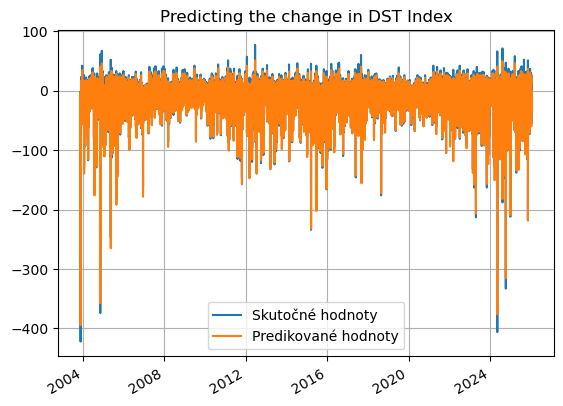

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9596319031042083
MCC=0.8800312928732303
Výkon NN:
MAE: 2.5358, MSE: 14.2128
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 1.25%
MSE Improvement: 12.92%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 190ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 173ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 116ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 105ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 104ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 104ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 103ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step 

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 102ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 104ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 106ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 106ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 105ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 105ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 104ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 104ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 103ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 103ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 103ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 103ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 103ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 104ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 105ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 105ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 104ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 104ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 104ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 103ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 104ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 105ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 105ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 106ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 103ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 103ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step 

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 47s 103ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 47s 104ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 46s 104ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 35s 104ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 34s 104ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 104ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 22s 106ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 107ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 107ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 107ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step 

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 107ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 107ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 95s 106ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 33s 149ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step 

  4/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 20s 94ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 20s 95ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 20s 96ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 17s 97ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 17s 103ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 16s 103ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 16s 104ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 16s 104ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 16s 108ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 16s 108ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 16s 108ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 16s 108ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 15s 108ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 13s 105ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 11s 104ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 11s 103ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 11s 102ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 10s 102ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step 

125/224 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step 

127/224 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 7s 97ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 2:24 190ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step 

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 95ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 94ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 96ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 96ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 103ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 104ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 104ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 105ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 106ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 107ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 108ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 106ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 105ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 105ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 107ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 108ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 109ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 110ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 111ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:19 113ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:18 112ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 112ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:17 111ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 111ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:16 110ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 110ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 110ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 109ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 109ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 109ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:15 109ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 109ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 109ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 109ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:14 109ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 108ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 108ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 1:13 108ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 108ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 108ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 107ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 107ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 107ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 1:12 107ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 107ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 107ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 107ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 107ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 1:11 107ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 1:10 106ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 1:09 105ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 105ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 105ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 105ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 105ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 106ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 106ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 106ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 107ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 107ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 107ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 107ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 107ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 106ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 106ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 106ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 106ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 106ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 106ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 106ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 106ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 106ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 106ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 105ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step 

191/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 59s 105ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 58s 105ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 55s 103ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 54s 103ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 53s 103ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 51s 102ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 50s 103ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 50s 102ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 46s 102ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 45s 102ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 43s 103ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 39s 103ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 36s 103ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 35s 103ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 35s 102ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 34s 102ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 33s 102ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step 

661/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 77s 101ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 33:49 2s/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 85ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 81ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 93ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 94ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 97ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 103ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 105ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 104ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 104ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step 

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 103ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 102ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 55s 102ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 54s 102ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 53s 102ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 102ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 52s 103ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 51s 103ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 47s 105ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 46s 105ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 45s 104ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 44s 104ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 43s 104ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 40s 105ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 36s 105ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 35s 105ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 29s 106ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 28s 106ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 27s 106ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 25s 105ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 106ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 106ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step 

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 106ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 107ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 107ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 1:02 279ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 54s 246ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 46s 210ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 41s 187ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 37s 172ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 31s 146ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 30s 140ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 28s 134ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 28s 131ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 27s 127ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 26s 124ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 25s 123ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 24s 119ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 24s 117ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 22s 111ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 21s 109ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 21s 109ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 21s 109ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 21s 108ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 21s 108ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 20s 107ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 19s 104ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 19s 104ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 19s 104ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 19s 103ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 19s 102ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step 

 49/224 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 15s 102ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 14s 102ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 14s 103ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 13s 104ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 13s 103ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 12s 104ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 12s 108ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 12s 108ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 12s 107ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 11s 107ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 11s 106ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 10s 104ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step 

129/224 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step 

148/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 4s 97ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 56s 75ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step 

  5/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 93ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 94ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 93ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 93ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 93ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 93ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 94ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 94ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 95ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 97ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step 

 95/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 103ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 1:07 104ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 1:06 104ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 104ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 1:05 103ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 103ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 1:03 102ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step 

166/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 58s 102ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 58s 103ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 57s 102ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 57s 103ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 57s 105ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 55s 104ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 53s 104ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 52s 104ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 51s 104ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 50s 104ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 50s 105ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 48s 105ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 46s 106ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 45s 106ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 45s 105ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 44s 105ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 43s 105ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 42s 105ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 41s 105ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 41s 104ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 40s 104ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 37s 105ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 37s 106ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 36s 106ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 35s 106ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 33s 105ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 32s 105ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 31s 105ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 29s 105ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 28s 105ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 27s 105ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 26s 106ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 25s 106ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 23s 105ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 22s 105ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 19s 105ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 17s 105ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 15s 105ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 15s 106ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 14s 106ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step 

666/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 8s 106ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 6s 106ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 5s 106ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 4s 106ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 3s 106ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 80s 105ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.2062501
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.12**2 * RBF(length_scale=0.231) + WhiteKernel(noise_level=0.568)


Global sigma (LSTM errors): 4.5383077
Hybrid prediction with smoothed, inflated interval ready.


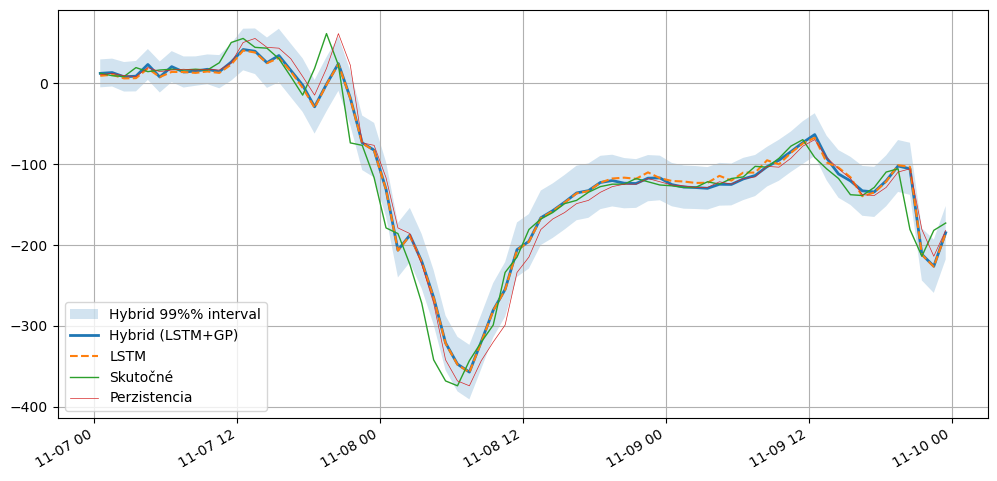

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true'].to_numpy()
y_pred_hybrid = df['y_hybrid'].to_numpy()

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 14.7135
MAE: 2.4798

--- Klasifikačné metriky (Prah: -20.0 nT) ---
Matthews Correlation Coefficient (MCC): 0.8734

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      148559 |        3496
Skutočná 1 |        4779 |       37353

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.97      0.98      0.97    152055
   Trieda 1 (Búrka)       0.91      0.89      0.90     42132

           accuracy                           0.96    194187
          macro avg       0.94      0.93      0.94    194187
       weighted avg       0.96      0.96      0.96    194187



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9596316952216163
MCC=0.8800311253045795
Výkon NN:
MAE: 2.5358, MSE: 14.2128
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 1.25%
MSE Improvement: 12.92%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9702    0.9785    0.9743    152055
           1     0.9199    0.8916    0.9055     42132

    accuracy                         0.9596    194187
   macro avg     0.9451    0.9350    0.9399    194187
weighted avg     0.9593    0.9596    0.9594    194187


===== LSTM+GP =====
ACC=0.9573864367851607
MCC=0.8733592016216031
Výkon NN:
MAE: 2.4798, MSE: 14.7135
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 3.43%
MSE Improvement: 9.85%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9688    0.9770    0.9729    152055
           1     0.9144    0.8866    0.9003     42132

   

/tmp/ipykernel_694049/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_694049/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:29:52,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.6,0.959216,0.878291,"{""text"": "" precision recall f...",2.443376,15.152584,2.567961,16.320413,4.851502,7.155638
1,2026-04-25T10:29:52,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.6,0.957501,0.872313,"{""text"": "" precision recall f...",2.421784,14.973057,2.567961,16.320413,5.692318,8.255649
2,2026-04-25T14:18:42,LSTM,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.0,0.959632,0.880031,"{""text"": "" precision recall f...",2.535797,14.212841,2.567983,16.320737,1.253356,12.915446
3,2026-04-25T14:18:42,LSTM+GP,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.0,0.957386,0.873359,"{""text"": "" precision recall f...",2.479786,14.713544,2.567983,16.320737,3.434513,9.847552
